In [1]:
import numpy as np
from cosmoTransitions import generic_potential_1
import matplotlib.pyplot as plt
import pandas as pd
from scipy import optimize
import scipy.integrate as integrate
from scipy import interpolate, special


####Some definitions##
v2 = 246.**2 
mh=125
v=246
alpha=1/137 #fine structure constant
sinthw=np.sqrt(0.223) #sine of Weinberg angle
g1=np.sqrt(4*np.pi*alpha/(1-sinthw**2)) ## U(1)_Y gauge coupling constant
g=np.sqrt(4*np.pi*alpha)/sinthw #SU(2)_L gauge coupling constant
Mplanck=2.4*10**18 #reduced planck mass
cs=1/3**0.5 ##Sound speed constant

class model1(generic_potential_1.generic_potential):
    """
    A sample model which makes use of the *generic_potential* class.

    This model doesn't have any physical significance. Instead, it is chosen
    to highlight some of the features of the *generic_potential* class.
    It consists of two scalar fields labeled *phi1* and *phi2*, plus a mixing
    term and an extra boson whose mass depends on both fields.
    It has low-temperature, mid-temperature, and high-temperature phases, all
    of which are found from the *getPhases()* function.
    """
    def init(self, ms=50, lammix=0.1, lams=1):
        """
          m1 - tree-level mass of first singlet when mu = 0.
          m2 - tree-level mass of second singlet when mu = 0.
          mu - mass coefficient for the mixing term.
          Y1 - Coupling of the extra boson to the two scalars individually
          Y2 - Coupling to the two scalars together: m^2 = Y2*s1*s2
          n - degrees of freedom of the boson that is coupling.
        """
        # The init method is called by the generic_potential class, after it
        # already does some of its own initialization in the default __init__()
        # method. This is necessary for all subclasses to implement.

        # This first line is absolutely essential in all subclasses.
        # It specifies the number of field-dimensions in the theory.
        self.Ndim = 2

        # self.renormScaleSq is the renormalization scale used in the
        # Coleman-Weinberg potential.
        self.renormScaleSq = v2

        # This next block sets all of the parameters that go into the potential
        # and the masses. This will obviously need to be changed for different
        # models.
        self.ms = ms
        self.lammix = lammix
        self.lams = lams
 
       

    def forbidPhaseCrit(self, X):
        """
        forbidPhaseCrit is useful to set if there is, for example, a Z2 symmetry
        in the theory and you don't want to double-count all of the phases. In
        this case, we're throwing away all phases whose zeroth (since python
        starts arrays at 0) field component of the vev goes below -5. Note that
        we don't want to set this to just going below zero, since we are
        interested in phases with vevs exactly at 0, and floating point numbers
        will never be accurate enough to ensure that these aren't slightly
        negative.
        """
        return any([np.array([X])[...,0] < -5.0, np.array([X])[...,1] < -5.0])
    


    def V0(self, X):
        """
        This method defines the tree-level potential. It should generally be
        subclassed. (You could also subclass Vtot() directly, and put in all of
        quantum corrections yourself).
        """
        # X is the input field array. It is helpful to ensure that it is a
        # numpy array before splitting it into its components.
        X = np.asanyarray(X)
        # x and y are the two fields that make up the input. The array should
        # always be defined such that the very last axis contains the different
        # fields, hence the ellipses.
        # (For example, X can be an array of N two dimensional points and have
        # shape (N,2), but it should NOT be a series of two arrays of length N
        # and have shape (2,N).)
        h, s = X[...,0], X[...,1]
        pot =-1/4*h**2*mh**2 + 1/2*self.ms**2*s**2 + 1/8*h**4*mh**2/v**2 + 1/4*h**2*s**2*self.lammix
        pot+= -1/4*s**2*v**2*self.lammix + 1/4*s**4*self.lams


        return pot

    
    def boson_massSq(self, X, T):
        X = np.array(X)
        h, s = X[...,0], X[...,1]

    
        #####Scalar thermal masses, obtained from appendix of 1702.06124
        Pi_h = T**2*(g1**2/16 + 3*g**2/16 + 1/4*mh**2/v**2 + 1/4 + self.lammix/24)
        Pi_s= T**2*(self.lammix/6 + self.lams/4)
     
        ##Scalar mass matrix##
        a=-1/2*mh**2 + 3/2*h**2*mh**2/v**2 + 1/2*s**2*self.lammix + Pi_h
        b=self.ms**2 + 1/2*(h**2-v**2)*self.lammix + 3*s**2*self.lams + Pi_s
        cc=h*s*self.lammix
        A=(a+b)/2
        B=1/2*np.sqrt((a-b)**2+4*cc**2)
        m1=A+B
        m2=A-B
        
        ####Gauge boson masses
        mW = g**2*h**2/4 + 11/6*g**2*T**2
        ag=g**2*h**2/4 + 11/6*g**2*T**2
        bg=1/4*g1**2*h**2 + 11/6*g1**2*T**2
        ccg=-1/4*g1*g*h**2
        Ag=(ag+bg)/2
        Bg=1/2*np.sqrt((ag-bg)**2+4*ccg**2)
        mZ=Ag+Bg
        mPh=Ag-Bg


        M = np.array([m1,m2,mW,mZ])
        if self.ms<mh:
            Mphys = np.array([mh**2,self.ms**2,g**2*v**2/4,v**2/4*(g**2+g1**2)])
        else:
            Mphys = np.array([self.ms**2,mh**2,g**2*v**2/4,v**2/4*(g**2+g1**2)])

        # At this point, we have an array of boson masses, but each entry might
        # be an array itself. This happens if the input X is an array of points.
        # The generic_potential class requires that the output of this function
        # have the different masses lie along the last axis, just like the
        # different fields lie along the last axis of X, so we need to reorder
        # the axes. The next line does this, and should probably be included in
        # all subclasses.
        M = np.rollaxis(M, 0, len(M.shape))
        Mphys = np.rollaxis(Mphys, 0, len(Mphys.shape))

        # The number of degrees of freedom for the masses. This should be a
        # one-dimensional array with the same number of entries as there are
        # masses.

        dof = np.array([1,1,6,3])


        # c is a constant for each particle used in the Coleman-Weinberg
        # potential using MS-bar renormalization. It equals 1.5 for all scalars
        # and the longitudinal polarizations of the gauge bosons, and 0.5 for
        # transverse gauge bosons.
        #c = np.array([1.5,1.5,1.5,1.5,1.5,1.5,1.5])
        c = np.array([1.5,1.5,1.5,1.5])
        


        
        return M, dof, c, Mphys


    
    def fermion_massSq(self, X):
        X = np.array(X)
        h,s = X[...,0], X[...,1]

        """
        Calculate the fermion particle spectrum. Should be overridden by
        subclasses.

        Parameters
        ----------
        X : array_like
            Field value(s).
            Either a single point (with length `Ndim`), or an array of points.

        Returns
        -------
        massSq : array_like
            A list of the fermion particle masses at each input point `X`. The
            shape should be such that  ``massSq.shape == (X[...,0]).shape``.
            That is, the particle index is the *last* index in the output array
            if the input array(s) are multidimensional.
        degrees_of_freedom : float or array_like
            The number of degrees of freedom for each particle. If an array
            (i.e., different particles have different d.o.f.), it should have
            length `Ndim`.

        Notes
        -----
        Unlike :func:`boson_massSq`, no constant `c` is needed since it is
        assumed to be `c = 3/2` for all fermions. Also, no thermal mass
        corrections are needed.
        """
        mt=h**2/2
        M = np.array([mt])
        Mphys = np.array([v**2/2])

        # At this point, we have an array of boson masses, but each entry might
        # be an array itself. This happens if the input X is an array of points.
        # The generic_potential class requires that the output of this function
        # have the different masses lie along the last axis, just like the
        # different fields lie along the last axis of X, so we need to reorder
        # the axes. The next line does this, and should probably be included in
        # all subclasses.
        M = np.rollaxis(M, 0, len(M.shape))
        Mphys = np.rollaxis(Mphys, 0, len(Mphys.shape))

        # The number of degrees of freedom for the masses. This should be a
        # one-dimensional array with the same number of entries as there are
        # masses.
        dof = np.array([12])
        return M, dof, Mphys
 
 
    def approxZeroTMin(self):
        #There are generically two minima at zero temperature in this model,
        #and we want to include both of them.
        return [np.array([v,0]), np.array([-v,0])]
    
    

    
#######HERE ARE MY OWN FUNCTIONS


def trans_index(m):
    """Finds the index of the two-step transition from the TnTrans dic"""
    alltrans=m.TnTrans
    if len(alltrans)==0:
        return 
    for index in range(len(alltrans)):
        if alltrans[index]["trantype"]!=1:
            continue
        elif (alltrans[index]["high_vev"][1]>10) and (alltrans[index]["low_vev"][0]>10):
            return index
        else:
            continue   
            
def EWSB_tree(m):
    """This function checks if the EW vacuum is 
    the global one assuming there is minima at some 
    non-zero s-value. The formula uses only the tree-level
    formula of the potential
    
    Parameters
    ----------
    m: is instance of model1
            

    Returns
    -------
    boolean :True or False"""
    return (-2*m.ms**2+v2*m.lammix)**2<2*mh**2*v2*m.lams 


def isEWSB(m):
    """This function will test if a given model is consistent with succesful EWSB
    It includes one-loop correction
    
    Parameters
        ----------
        m : is a model1
    Returns
        -------
        boolean: True or False """
    
    EWSB=[v,0]
    if m.ms**2<=v**2*m.lammix/2:
        omega=((v**2*m.lammix/2-m.ms**2)/m.lams)**0.5
        minima=m.findMinimum([0,omega],0)
        bosons_minima=m.boson_massSq(minima,0.)
        fermions_minima=m.fermion_massSq(minima)
        bosons_EWSB=m.boson_massSq(EWSB,0.)
        fermions_EWSB=m.fermion_massSq(EWSB)
        if (m.V0(EWSB)+m.V1(bosons_EWSB,fermions_EWSB)<m.V0(minima)+m.V1(bosons_minima,fermions_minima)) and (not np.any(np.linalg.eig(m.d2V(minima,0))[0]<=0)):
            return True
        else: 
            return False
    else:
        return True



def gradAT(T,S,eps=0.001,order=4):
    """This function calculates the derivative of S_3/T using finite differences.
    It should only be used for T close to the nucleation tmeperature.
    Parameters
        ----------
        T: (float) is the temperature 
        S: S/T, a function of m, it can be called by S_cosmoT or S_profile
    Returns
        -------
        float: d/dT(S_3/T), minimum action solution divided by temperature"""
    if order==4:
            dT = np.array([-2., -1., 1., 2.])*eps
            coef = np.array([1., -8., 8., -1. ])/(12.*eps)
    elif order==6:    
        dT = np.array([-3., -2., -1., 1., 2.,3.])*eps
        coef = np.array([-1., 9., -45., 45., -9.,1. ])/(60.*eps)
    else: 
        dT = np.array([-4.,-3., -2., -1., 1., 2.,3.,4.])*eps
        coef = np.array([3.,-32., 168.,-672., 672., -168., 32.,-3. ])/(840.*eps)
    action = []
    for i in dT:
        action.append(S(T+i))
    action_output = np.array(action)
    return np.sum(action_output*coef)



####This code uses an interpolation function for the number of degrees of freedom as function of temperature
###Data is obtained from https://member.ipmu.jp/satoshi.shirai/EOS2018
data = np.loadtxt( 'satoshi_dof.dat' )
Temperature_d=(data.T)[0][900:3900]
dof_d=(data.T)[1][900:3900]
#f = interpolate.interp1d(Temperature_d, dof_d)###"""the function works from T=[10e-4,1000]"""
g_star = interpolate.interp1d(Temperature_d, dof_d, kind='cubic')


    
def alpha_GW(Tnuc,Drho):
    ####This code gives the parameter alpha relevant for stochastic GW spectrum 
 ##AS APPEAR IN FORMULA (8.2) OF 1912.12634
    num_dof=g_star(Tnuc)
    radiationDensity=np.pi**2/30*num_dof*Tnuc**4
    latentHeat=Drho
    return latentHeat/radiationDensity


def beta_GW(Tnuc,dS_TdT):
    ###This code defines the parameter beta relevant for stochastic GW spectrum
    beta=Tnuc*dS_TdT
    return beta

def find_nucleation(m):
    """Find min and max temperatures to search for nucleation. IT will be used by bisection method.
    Parameters
        ----------
        m: a model instance. In this case m=model1(kk=1/600**2) for example.
    Returns
        -------
        nuc_dict: a dictionary containing the relevant temperatures and phases indexes. 
                It will be used by the other methods to find the nucleation and percolation parameters  
    """
    if m.phases is None:
        try:
            phases_dict=m.getPhases()
        except:
            return {}
    else:
        phases_dict=m.phases
    if len(phases_dict)<=1:
        return {}
    from cosmoTransitions import transitionFinder as tf
    crit_temps=tf.findCriticalTemperatures(phases_dict, m.Vtot)
    Num_relevant_trans=0
    ###DETERMINE IF THERE COULD BE TWO-STEP FOPTs
    for elem in crit_temps:
        if elem["trantype"]==1 and abs(elem["low_vev"][0]-elem["high_vev"][0])>10 and abs(elem["low_vev"][1]-elem["high_vev"][1])>10:
            print("Tunneling is relevant from phase " + str(elem["high_phase"])+ " to " + str(elem["low_phase"])  )
            Tmax=elem["Tcrit"]
            Tmin=phases_dict[elem["high_phase"]].T[0]
            print("max temperature is", Tmax)
            print("min temperature is", Tmin)
            Num_relevant_trans+=1
            high_phase_key=elem["high_phase"]
            low_phase_key=elem["low_phase"]
        else: 
            continue
    if Num_relevant_trans==0:
        dict_output={}
        return dict_output
    else:
        dict_output= {"Tmin":Tmin, "Tmax":Tmax, "high_phase": high_phase_key,"low_phase": low_phase_key}
    X0=m.phases[dict_output["high_phase"]].X[0]
    T0=m.phases[dict_output["high_phase"]].T[0]
    stable=not np.any(np.linalg.eig(m.d2V(X0,T0))[0]<=0)
    print("DOING WHILE LOOP \n")
    while stable:
        if T0<=0:
            break
        T0-=1e-4
        X0=m.findMinimum(X0,T0)
        if abs(X0[0])>0.1:
            break
        stable=not np.any(np.linalg.eig(m.d2V(X0,T0))[0]<=0)
        print(" ................. \n")
        if stable==False:
            break
    dict_output["Tmin"]=T0
    return dict_output


def trans_dict(alltrans):
    """Returns the dictionary of the relevant transition given 
    a list of all transitions, from calling findAllTransitionos"""
    for x in alltrans:
        if (x["trantype"]==1) and (x["high_phase"]==nuc_dict["high_phase"])  and (x["low_phase"]==nuc_dict["low_phase"]):
            return x
            


def S_profile(T):
    """This function calculates the Euclidean action from a model m at temperature T
    after knowing its phase history. If more than one FOPT is found, it uses the last 
    transition to compute the action"""
    alltrans=m.TnTrans
    transition_dict=trans_dict(alltrans)
    profile=transition_dict["instanton"].profile1D
    alpha_ode=2
    temp=T
    r, phi, dphi, phivector = profile.R, profile.Phi, profile.dPhi, transition_dict["instanton"].Phi
    phi_meta=transition_dict["high_vev"]
    # Find the area of an n-sphere (alpha=n):
    d = alpha_ode+1  # Number of dimensions in the integration
    area = r**alpha_ode * 2*np.pi**(d*.5)/special.gamma(d*.5)
    # And integrate the profile
    integrand = 0.5 * dphi**2 + m.Vtot(phivector,temp) - m.Vtot(phi_meta,temp)
    integrand *= area
    S = integrate.simps(integrand, r)
    # Find the bulk term in the bubble interior
    volume = r[0]**d * np.pi**(d*.5)/special.gamma(d*.5 + 1)
    S += volume * (m.Vtot(phivector[0],temp) - m.Vtot(phi_meta,temp))

    return S/T

            
def S_profile_simple(T,m):
    """This function calculates the Euclidean action from a model m at temperature T
    after knowing its phase history. If more than one FOPT is found, it uses the last 
    transition to compute the action"""
    alltrans=m.TnTrans
    my_index=trans_index(m)
    transition_dict=alltrans[my_index]
    profile=transition_dict["instanton"].profile1D
    alpha_ode=2
    temp=T
    r, phi, dphi, phivector = profile.R, profile.Phi, profile.dPhi, transition_dict["instanton"].Phi
    phi_meta=transition_dict["high_vev"]
    # Find the area of an n-sphere (alpha=n):
    d = alpha_ode+1  # Number of dimensions in the integration
    area = r**alpha_ode * 2*np.pi**(d*.5)/special.gamma(d*.5)
    # And integrate the profile
    integrand = 0.5 * dphi**2 + m.Vtot(phivector,temp) - m.Vtot(phi_meta,temp)
    integrand *= area
    S = integrate.simps(integrand, r)
    # Find the bulk term in the bubble interior
    volume = r[0]**d * np.pi**(d*.5)/special.gamma(d*.5 + 1)
    S += volume * (m.Vtot(phivector[0],temp) - m.Vtot(phi_meta,temp))

    return S/T




def Hubble_vacuum(T):
    """Hubble parameter for matter density alone. Second term in formula 2.6 of 1809.08242 """
    if m.phases is None:
        phases_dict=m.getPhases()
    else:
        phases_dict=m.phases
    if T<nuc_dict["Tmin"] or T>nuc_dict["Tmax"]:
        return 0
    from cosmoTransitions import transitionFinder as tf
    crit_temps=tf.findCriticalTemperatures(phases_dict, m.Vtot)
    Delta_V=0.0
    for tran_barrier in crit_temps:
        if tran_barrier["trantype"] ==2:
            continue
        ###LOOKS FOR TWO-STEP TRANSITIONS
        elif T>tran_barrier["Tcrit"] or ((abs(tran_barrier["high_vev"][0]-tran_barrier["low_vev"][0])<10) and (abs(tran_barrier["high_vev"][1]-tran_barrier["low_vev"][1])<10)):
            continue
        else:
            V_high=m.Vtot(phases_dict[tran_barrier["high_phase"]].valAt(T),T)
            V_low=m.Vtot(phases_dict[tran_barrier["low_phase"]].valAt(T),T)
            if V_high>V_low: 
                Delta_V += V_high - V_low

    return (Delta_V/3)**0.5/Mplanck



def Hubble_total(T):
    num_dof=g_star(T)
    Hubble_rad_squared=num_dof*np.pi**2/90*T**4/Mplanck**2
    return (Hubble_rad_squared+Hubble_vacuum(T)**2)**0.5


def Gamma_Hubble4(S,T):
    """Nucleation probability per Hubble volume, including matter contribution. 
    Integrand in formula (2.2) 1809.08242 """
    Gamma1=T**4*np.exp(-S/T)*np.sqrt((S/2/np.pi/T))**3
    return Gamma1
    

##DEFINE ACTION FUNCTION
def my_Action(T):
    """Calculates S/T at T"""
    from cosmoTransitions import transitionFinder as tf
    try:
        S=tf._tunnelFromPhaseAtT(T=T, phases=m.phases, start_phase=m.phases[nuc_dict["high_phase"]], V=m.Vtot, 
                             dV=m.gradV, phitol=1e-15, overlapAngle=45, nuclCriterion=lambda S,T: S/T ,
                             fullTunneling_params={}, verbose=True, outdict={})
    except:
        S=np.inf
    return S


    
##DEFINE Nucleation FUNCTION (TO BE OPTIMIZED)
def nucleation_temp(T):
    """DEFINE Nucleation FUNCTION (TO BE OPTIMIZED)
    """
    from cosmoTransitions import transitionFinder as tf
    try:
        S=tf._tunnelFromPhaseAtT(T=T, phases=m.phases, start_phase=m.phases[nuc_dict["high_phase"]], V=m.Vtot, 
                                 dV=m.gradV,phitol=1e-15, overlapAngle=45, nuclCriterion=lambda S,T: Gamma_Hubble4(S,T)-Hubble_total(T)**4,
                                 fullTunneling_params={}, verbose=True, outdict={})
    except:
        return 1e+100
    
    if np.isnan(S):
        return 1e+100
    else:
        return S**2

    
def r_comoving(T,T1):
    """Comoving size of a bubble nucleated at T' after growing until T"""
    #vw=df.iloc[i].vw
    vw=1
    result = integrate.quad(lambda Tx: 1/Hubble_total(Tx),T, T1)
    return vw*result[0] 


def Gamma(T):
    """This function gives the nucleation rate at finite temperature """
    try:
        S_action=my_Action(T)*T
    except:
        S_action=np.inf
    if S_action==np.inf:
        return 0
    Gamma1=T**4*np.exp(-S_action/T)*np.sqrt((S_action/2/np.pi/T))**3
    return Gamma1


def I_volume_fraction_integrand(T,T1):
    """For given temperatures T1>T, it calculates the integran of the volume fraction.
    Includes the factor 4pi/3."""
    if T>T1:
        print("incorrect setting of temperatures")
        return 
    Gam=Gamma(T1)/Hubble_total(T1)/T1**4
    if Gam==0:
        return 0
    r_vol=r_comoving(T,T1)
    if r_vol==0:
        return 0
    output=Gam*r_vol**3
    return 4*np.pi/3*output

def I_volume_fraction(T):
    """For given temperature T. It calculates the volume fraction doing the integral of I_volume_fraction_integrand
    starting from T until the critial temperature found by nucleation_temp ("Tmax")"""
    n=20 ###This number should be changed on a case by case basis
    t_range=np.linspace(T,nuc_dict["Tmax"],n)
    I_list=[]
    for tempi in t_range:
        x=I_volume_fraction_integrand(T,tempi)
        I_list.append(x)
    fun_inter=interpolate.interp1d(t_range,I_list)
    result = integrate.quad(lambda Tx: fun_inter(Tx),t_range[0], t_range[-1])
    return result[0]-0.34



def T_percolation(n):
    """Having Tnuc it computes the percolation temperature using I=0.34 as optimization criteria."""
    t_range=np.linspace(nuc_dict["Tmin"],Tnuc,n)[::-1]
    I_list=[]
    t_range_1=[]
    for temp in t_range:
        x=I_volume_fraction(temp)
        I_list.append(x)
        t_range_1.append(temp)
        if x>10:
            break
    fun_inter=interpolate.interp1d(t_range_1,I_list)
    def f_opt(t): 
        try: 
            return fun_inter(t)**2 
        except: 
            return 1e+100
    Tp = optimize.fmin(f_opt,(t_range_1[0]+t_range_1[-1])*0.5,xtol=0.0001)[0]
    return Tp



def find_lammix_max(ms,lams):
    """Find the maximum allowed lammix with the other parameters of the potential fixed. 
    Uses isEWSB=1/2 for optimization"""
    def lammix_optimization(lammix):
        m=model1(ms=ms, lammix=lammix, lams=lams)    
        EWSB_bool=isEWSB(m)
        return float(EWSB_bool)-1/2
    lammix_max=optimize.bisect(lammix_optimization, 0.01, 1.41)
    return lammix_max


####This codes the GW signal and SNR given T,alpha, beta and vw. 
LISA_data = np.loadtxt( 'PLS_ESACallv1-2_04yr.txt' )
LISA_data=LISA_data[::20]
LISA_noise=LISA_data[::,0::2]
LISA_data=LISA_data[::,0::3]

def GW_signal(Temp,alpha,beta,vel):
    """Returns a tuple of (f,Omega_peak)"""
    time=4
    f_redshift=1.65*10**(-5)*(Temp/100)*(g_star(Temp)/100)**(1/6)
    Omega_redshift=1.67*10**(-5)*(100/g_star(Temp))**(1/3)
    kappa_sw=alpha/(0.73+0.083*alpha**0.5+alpha)
    Uf=(3/4*alpha/(1+alpha)*kappa_sw)**0.5
    HR=(8*np.pi)**(1/3)*max(vel,cs)/beta
    HRb=(vel-cs)/vel*HR
    Htau_sw=HR/Uf
    S_fun=lambda s:s**3*(7/(4+3*s**2))**(7/2)
    Omega_sw=3*0.687*Omega_redshift*(1-1/(1+2*HR/Uf)**0.5)*(kappa_sw*alpha/(1+alpha))**2*0.012*HR/cs
    f_sw=f_redshift*(2.6/1.65)*(1/HR)
    GW_tab=[Omega_sw*S_fun(f/f_sw) for f in LISA_noise[::,0]]
    return np.array([LISA_noise[::,0],GW_tab])

def SNR_GW(Temp,alpha,beta,vel):
    """Returns a float, the SNR of the signal"""
    time=4
    f_redshift=1.65*10**(-5)*(Temp/100)*(g_star(Temp)/100)**(1/6)
    Omega_redshift=1.67*10**(-5)*(100/g_star(Temp))**(1/3)
    kappa_sw=alpha/(0.73+0.083*alpha**0.5+alpha)
    Uf=(3/4*alpha/(1+alpha)*kappa_sw)**0.5
    HR=(8*np.pi)**(1/3)*max(vel,cs)/beta
    HRb=(vel-cs)/vel*HR
    Htau_sw=HR/Uf
    S_fun=lambda s:s**3*(7/(4+3*s**2))**(7/2)
    Omega_sw=3*0.687*Omega_redshift*(1-1/(1+2*HR/Uf)**0.5)*(kappa_sw*alpha/(1+alpha))**2*0.012*HR/cs
    f_sw=f_redshift*(2.6/1.65)*(1/HR)
    integral=np.sum([(LISA_noise[i+1][0]-LISA_noise[i][0])/2*(Omega_sw*S_fun(LISA_noise[i][0]/f_sw)/(LISA_noise[i][1]))**2 for i in range(0,len(LISA_noise)-1)])
    return (time*3.15*10**7*integral)**0.5


#GW plot example
#plt.plot(LISA_data[::,0],LISA_data[::,1])
#plt.plot(GW_signal(100,0.05,1000,1)[0],GW_signal(100,0.05,1000,1)[1])
#plt.yscale("log")
#plt.xscale("log")
#plt.show()

In [2]:
def panda_scan(num_points,xinit,xfinal,Ms,lhs,ls):
    """The following code does a scan of the parameter space looking for FOPT using the nucleation criteria S/T =140. 
    The output is stored in a panda frame called df"""
    df=[]
    param_range=np.linspace(xinit,xfinal,num_points)
    print("doint the range, param_range=",param_range)
    for i in param_range:
        m=model1(ms=(i if Ms==False else Ms), lammix=(i if lhs==False else lhs), lams=i if ls==False else ls)
        print("ms=",m.ms,"lammix=",m.lammix,"lams=",m.lams)
        if isEWSB(m):
            print("STARTING A NEW PARAMETER SPACE POINT:  #"+str(i))
            try:
                alltrans = m.findAllTransitions()
                index=trans_index(m)
            except:
                print("ERROR FOUND!!")
                continue
            else:
                try:
                    Tc=alltrans[index]['crit_trans']['Tcrit']
                    Tn=alltrans[index]['Tnuc']
                    Action=alltrans[index]['action']
                    S_fun=lambda T: S_profile_simple(T,m)
                    dS_TdT=gradAT(Tn,S_fun)
                    print("dS_TdT", dS_TdT)
                    Delta_rho=alltrans[index]['Delta_rho']
                    alpha=alpha_GW(Tn,Delta_rho)
                    print("alpha", alpha)
                    beta=beta_GW(Tn,dS_TdT)
                    print("beta=",beta)
                    SNR=SNR_GW(Tn,alpha,beta,1)
                    print("SNR is ready",SNR)
                    phi_stable=alltrans[index]["low_vev"]
                    phi_meta=alltrans[index]["high_vev"]
                    vwall=1
                    my_signal=GW_signal(Tn,alpha,beta,vwall)
                    print("signal is,",my_signal)
                    Good_signal=np.any((my_signal[0]<0.03)) and  (np.any(0.003<my_signal[0])) and (np.any(10**(-10)<my_signal[1])) and (np.any(my_signal[1]<10**(-8)))
                    print("signal is ", Good_signal)
                    df.append({'ms': m.ms, 'lammix':m.lammix,'lams':m.lams,
                               'num_trans':len(alltrans),
                               'Tc': Tc, 'Tnuc': Tn, 
                               'Action': Action,
                               "d/dT(S_3/T)":dS_TdT,
                               "Delta_p": alltrans[index]['Delta_p'],
                               "Delta_rho": Delta_rho,
                               "alpha":alpha,
                               "beta": beta,
                               "h_high":phi_meta[0],
                               "h_low":phi_stable[0],
                               "s_high":phi_meta[1],
                               "s_low":phi_stable[1],
                               "SNR_Tnuc": SNR,
                              "signal":Good_signal})          
                except:
                    print("ERROR FOUND 2!!")
                    continue
    return df




In [3]:
####STEP 0
###scan a grid ms vs lammix 
ms_range=np.linspace(65,120,100)
my_pandas=[]
for mi in ms_range: 
    lsi=np.random.uniform(0.049,1,size=1)
    dfi=panda_scan(100,0.6,1.2,mi,False,lsi[0])
    my_pandas.extend(dfi)
df=pd.DataFrame(my_pandas)


doint the range, param_range= [0.6        0.60606061 0.61212121 0.61818182 0.62424242 0.63030303
 0.63636364 0.64242424 0.64848485 0.65454545 0.66060606 0.66666667
 0.67272727 0.67878788 0.68484848 0.69090909 0.6969697  0.7030303
 0.70909091 0.71515152 0.72121212 0.72727273 0.73333333 0.73939394
 0.74545455 0.75151515 0.75757576 0.76363636 0.76969697 0.77575758
 0.78181818 0.78787879 0.79393939 0.8        0.80606061 0.81212121
 0.81818182 0.82424242 0.83030303 0.83636364 0.84242424 0.84848485
 0.85454545 0.86060606 0.86666667 0.87272727 0.87878788 0.88484848
 0.89090909 0.8969697  0.9030303  0.90909091 0.91515152 0.92121212
 0.92727273 0.93333333 0.93939394 0.94545455 0.95151515 0.95757576
 0.96363636 0.96969697 0.97575758 0.98181818 0.98787879 0.99393939
 1.         1.00606061 1.01212121 1.01818182 1.02424242 1.03030303
 1.03636364 1.04242424 1.04848485 1.05454545 1.06060606 1.06666667
 1.07272727 1.07878788 1.08484848 1.09090909 1.0969697  1.1030303
 1.10909091 1.11515152 1.12121212 

Tracing phase starting at x = [ 2.45999999e+02 -1.75396018e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................
Tracing phase starting at x = [193.0635005   28.57562296] ; t = 116.07817413057082
Tracing minimum down
traceMinimum t0 = 116.078
...................................................
Tracing minimum up
traceMinimum t0 = 116.078
...........................................................................................................
Tracing phase starting at x = [-1.76381312e-05  1.11228980e+02] ; t = 130.43166011548425
Tracing minimum down
traceMinimum t0 = 130.432
.......................................
Tracing minimum up
traceMinimum t0 = 130.432
................................................
Tracing phase starting at x = [-7.57526440e-06  6.14753552e+01] ; t = 244.30382309557828
Tracing minimum down
traceMinimum t0 = 244.304
......................
Tracing minimum up
traceMinimum t0 = 244.304
........................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 2 at T=243.1792
high_vev = [7.08427217e-06 6.25292379e+01]
low_vev = [-8.70379168e-06  6.49330502e+01]
Path deformation converged. 1 steps. fRatio = 1.42548e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 2 at T=243.178
high_vev = [7.85350015e-06 6.25303425e+01]
low_vev = [-7.86268084e-06  6.49341499e+01]
Path deformation converged. 1 steps. fRatio = 1.15037e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 2 at T=243.1785
high_vev = [6.67479025e-06 6.25298787e+01]
low_vev = [4.98134329e-08 6.49336600e+01]
Path deformation converged. 1 steps. fRatio = 1.04412e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 65.55555555555556 lammix= 0.6060606060606061 lams= 0.9800683407051926
STARTING A NEW PARAMETER SPACE POINT:  #0.6060606060606061
Tracing phase starting at x = [ 2.45999999e+02 -1.75396018e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................
Tracing phase starting at x = [193.42141911  29.78996705] ; t = 115.45600456537738
Tracing minimum down
traceMinimum t0 = 115.456
.................................................
Tracing minimum up
traceMinimum t0 = 115.456
.............................................................................................................
Tracing phase starting at x = [6.18140218e-06 1.12301623e+02] ; t = 129.12190001999528
Tracing minimum down
traceMinimum t0 = 129.122
..........................
Tracing minimum up
traceMinimum t0 = 129.122
.................................................
Tracing phase starting at x = [8.33752737e-06 6.20523481e+01] ; t 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.39567e-05
Tunneling from phase 3 to phase 2 at T=244.5328
high_vev = [2.78356060e-05 6.31071991e+01]
low_vev = [-1.01258688e-05  6.55575435e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.13754e-05
ERROR FOUND 2!!
ms= 65.55555555555556 lammix= 0.6121212121212121 lams= 0.9800683407051926
STARTING A NEW PARAMETER SPACE POINT:  #0.6121212121212121
Tracing phase starting at x = [ 2.45999999e+02 -1.75396018e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................
Tracing phase starting at x = [193.61097809  31.28363415] ; t = 114.84908479529649
Tracing minimum down
traceMinimum t0 = 114.849
....................................
Tracing minimum up
traceMinimum t0 = 114.849
.....................................................................................................
Tracing phase starting at x = [-5.01713349e-06  1.13362579e+02] ; t = 127.78063872823944
Tracing minimum down
traceMinimum t0 = 127.781
.......................................
Tracing minimum up
traceMinimum t0 = 127.781
................................................
Tracing phase sta

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.44705e-05
Tunneling from phase 3 to phase 2 at T=245.8805
high_vev = [-9.45872596e-05  6.36760103e+01]
low_vev = [9.11501512e-06 6.61719320e+01]
Path deformation converged. 1 steps. fRatio = 1.59977e-04
Tunneling from phase 3 to phase 2 at T=245.8793
high_vev = [-9.51904221e-05  6.36770583e+01]
low_vev = [-1.23152993e-05  6.61729738e+01]
Path deformation converged. 1 steps. fRatio = 1.40058e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 65.55555555555556 lammix= 0.6181818181818182 lams= 0.9800683407051926
STARTING A NEW PARAMETER SPACE POINT:  #0.6181818181818182
Tracing phase starting at x = [2.46000000e+02 4.36843168e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................
ERROR FOUND 2!!
ms= 65.55555555555556 lammix= 0.6242424242424243 lams= 0.9800683407051926
STARTING A NEW PARAMETER SPACE POINT:  #0.6242424242424243
Tracing phase starting at x = [ 2.45999999e+02 -1.75396018e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................
ERROR FOUND 2!!
ms= 65.55555555555556 lammix= 0.6303030303030303 lams= 0.9800683407051926
STARTING A NEW PARAMETER SPACE POINT:  #0.6303030303030303
Tracing phase starting at x = [ 2.45999999e+02 -1.75396018e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................
Tracing phase starting at x = [193.06516731  37.34148875] ; t

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 2 at T=249.8678
high_vev = [8.63966093e-05 6.53489048e+01]
low_vev = [6.69629831e-06 6.79763837e+01]
Path deformation converged. 1 steps. fRatio = 1.18774e-04
Tunneling from phase 3 to phase 2 at T=249.869
high_vev = [8.04982815e-05 6.53478839e+01]
low_vev = [-6.36277873e-06  6.79753734e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.35496e-04
Tunneling from phase 3 to phase 2 at T=249.8683
high_vev = [8.30446338e-05 6.53484537e+01]
low_vev = [6.69658503e-06 6.79759325e+01]
Path deformation converged. 1 steps. fRatio = 1.25799e-04
ERROR FOUND 2!!
ms= 65.55555555555556 lammix= 0.6363636363636364 lams= 0.9800683407051926
STARTING A NEW PARAMETER SPACE POINT:  #0.6363636363636364
Tracing phase starting at x = [ 2.45999999e+02 -1.75396018e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................
Tracing phase starting at x = [192.13880499  40.40148632] ; t = 112.50760781128692
Tracing minimum down
traceMinimum t0 = 112.508
.........................................................
Tracing minimum up
traceMinimum t0 = 112.508
.........................................................................................................
Tracing phase starting at x = [-1.64416427e-05  1.17494913e+02] ; t = 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 2 at T=251.1824
high_vev = [-3.16259797e-06  6.58928200e+01]
low_vev = [9.02921208e-06 6.85625618e+01]
Path deformation converged. 1 steps. fRatio = 1.32271e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 65.55555555555556 lammix= 0.6424242424242425 lams= 0.9800683407051926
STARTING A NEW PARAMETER SPACE POINT:  #0.6424242424242425
Tracing phase starting at x = [ 2.45999999e+02 -1.75396018e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................
Tracing phase starting at x = [190.61132842  44.17315241] ; t = 111.94361837674327
Tracing minimum down
traceMinimum t0 = 111.944
..................................................................
Tracing minimum up
traceMinimum t0 = 111.944
..........................................................................................
Tracing phase starting at x = [-6.77063881e-06  1.18501575e+02] ; t = 120.56503736670405
Tracing minimum down
traceMinimum t0 = 120.565
......................
Tracing minimum up
traceMinimum t0 = 120.565
......................................................................................
Tracing phase starting at x = [7.84890517e-06 6.54394395e+01] ; t

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 4.77757e-05
Tunneling from phase 3 to phase 2 at T=252.4875
high_vev = [3.38388087e-05 6.64322137e+01]
low_vev = [-1.00218944e-05  6.91434551e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 4.91937e-05
Tunneling from phase 3 to phase 2 at T=252.488
high_vev = [3.46747139e-05 6.64317688e+01]
low_vev = [-7.05193426e-06  6.91430261e+01]
Path deformation converged. 1 steps. fRatio = 5.19044e-05
ERROR FOUND 2!!
ms= 65.55555555555556 lammix= 0.6484848484848484 lams= 0.9800683407051926
STARTING A NEW PARAMETER SPACE POINT:  #0.6484848484848484
Tracing phase starting at x = [ 2.45999999e+02 -1.75396018e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................
Tracing phase starting at x = [187.95854364  49.19762539] ; t = 111.39167496949885
Tracing minimum down
traceMinimum t0 = 111.392
......................................................................
Tracing minimum up
traceMinimum t0 = 111.392
........................................................................................................................................
Tracing phase starting at x =

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 3 to phase 2 at T=253.7843
high_vev = [6.04158393e-05 6.69664177e+01]
low_vev = [5.52934588e-05 6.97184652e+01]
Path deformation converged. 1 steps. fRatio = 1.03003e-04
Tunneling from phase 3 to phase 2 at T=253.7859
high_vev = [6.07905471e-05 6.69650127e+01]
low_vev = [5.41334971e-05 6.97170371e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.24803e-04
Tunneling from phase 3 to phase 2 at T=253.7864
high_vev = [5.81414160e-05 6.69645671e+01]
low_vev = [5.41457940e-05 6.97166186e+01]
Path deformation converged. 1 steps. fRatio = 1.37740e-04
ERROR FOUND 2!!
ms= 65.55555555555556 lammix= 0.6545454545454545 lams= 0.9800683407051926
STARTING A NEW PARAMETER SPACE POINT:  #0.6545454545454545
Tracing phase starting at x = [ 2.45999999e+02 -1.75396018e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................
Tracing phase starting at x = [183.45622187  55.94113875] ; t = 110.84761817242976
Tracing minimum down
traceMinimum t0 = 110.848
...............................................................................
Tracing minimum up
traceMinimum t0 = 110.848
..............................................................................................................................
Tracing phase starting at x = [3

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.54564e-05
Tunneling from phase 3 to phase 2 at T=255.0765
high_vev = [6.70816554e-06 6.74924101e+01]
low_vev = [6.24631679e-06 7.02845957e+01]
Path deformation converged. 1 steps. fRatio = 1.37480e-05
ERROR FOUND 2!!
ms= 65.55555555555556 lammix= 0.6606060606060606 lams= 0.9800683407051926
STARTING A NEW PARAMETER SPACE POINT:  #0.6606060606060606
Tracing phase starting at x = [ 2.45999999e+02 -1.75396018e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................................................
Tracing phase starting at x = [175.57262786  65.21887248] ; t = 110.31231719802756
Tracing minimum down
traceMinimum t0 = 110.312
....................................................................................
Tracing minimum up
traceMinimum t0 = 110.312
...................................................................................................................
Tracing phase starting at 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 2 at T=256.3588
high_vev = [1.00513061e-05 6.80151246e+01]
low_vev = [1.03424322e-04 7.08467592e+01]
Path deformation converged. 1 steps. fRatio = 1.35746e-04
Tunneling from phase 3 to phase 2 at T=256.3593
high_vev = [7.01517324e-06 6.80147036e+01]
low_vev = [-2.67367828e-06  7.08463136e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 9.81282e-06
Tunneling from phase 3 to phase 2 at T=256.3612
high_vev = [7.44286509e-06 6.80130189e+01]
low_vev = [-1.17311600e-05  7.08446559e+01]
Path deformation converged. 1 steps. fRatio = 1.44695e-05
Tunneling from phase 3 to phase 2 at T=256.3601
high_vev = [-7.36068126e-06  6.80139958e+01]
low_vev = [1.03575336e-04 7.08456369e+01]
Path deformation converged. 1 steps. fRatio = 1.46877e-04
Tunneling from phase 3 to phase 2 at T=256.3606
high_vev = [-7.32531136e-06  6.80135706e+01]
low_vev = [1.05170518e-04 7.08451915e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.46767e-04
ERROR FOUND 2!!
ms= 65.55555555555556 lammix= 0.6666666666666666 lams= 0.9800683407051926
STARTING A NEW PARAMETER SPACE POINT:  #0.6666666666666666
Tracing phase starting at x = [ 2.45999999e+02 -1.75396018e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................
Tracing phase starting at x = [161.46617436  77.86964452] ; t = 109.78561309499779
Tracing minimum down
traceMinimum t0 = 109.786
....................................................................................
Tracing minimum up
traceMinimum t0 = 109.786
.........................................................................................................
Tracing phase starting at x = [9.69421562e-06 1.22427963e+02] ; t = 114.09317655009771
Tracing minimum down
traceMinimum t0 = 114.093
.....................
Tracing minimum up
traceMinimum t0 = 114.093
.......................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 2 at T=257.6359
high_vev = [-4.19421260e-05  6.85306859e+01]
low_vev = [-4.33309077e-06  7.14011645e+01]
Path deformation converged. 1 steps. fRatio = 6.28441e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 2 at T=257.6364
high_vev = [-4.07690737e-05  6.85302544e+01]
low_vev = [-7.06833037e-06  7.14007246e+01]
Path deformation converged. 1 steps. fRatio = 7.40648e-05
Tunneling from phase 3 to phase 2 at T=257.6382
high_vev = [-4.15269909e-05  6.85286625e+01]
low_vev = [-1.45778476e-06  7.13991589e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 5.48179e-05
Tunneling from phase 3 to phase 2 at T=257.6369
high_vev = [-4.10373575e-05  6.85298285e+01]
low_vev = [-8.29761645e-06  7.14002926e+01]
Path deformation converged. 1 steps. fRatio = 6.31704e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 65.55555555555556 lammix= 0.6727272727272727 lams= 0.9800683407051926
STARTING A NEW PARAMETER SPACE POINT:  #0.6727272727272727
Tracing phase starting at x = [2.46000000e+02 4.36843168e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................
Tracing phase starting at x = [136.27393209  94.06098704] ; t = 109.2646761911177
Tracing minimum down
traceMinimum t0 = 109.265
................................................................
Tracing minimum up
traceMinimum t0 = 109.265
.........................................................................................
Tracing phase starting at x = [3.08705589e-06 1.23385363e+02] ; t = 112.36333859024288
Tracing minimum down
traceMinimum t0 = 112.363
.......................
Tracing minimum up
traceMinimum t0 = 112.363
..................................................................................................
Tracing phase starting at x = [8.2

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 2 at T=258.9059
high_vev = [-6.50502595e-05  6.90410125e+01]
low_vev = [-2.11035946e-05  7.19496987e+01]
Path deformation converged. 1 steps. fRatio = 1.08410e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 2 at T=258.9064
high_vev = [-6.58042230e-05  6.90405416e+01]
low_vev = [-2.15709550e-05  7.19492705e+01]
Path deformation converged. 1 steps. fRatio = 9.80659e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 65.55555555555556 lammix= 0.6787878787878787 lams= 0.9800683407051926
STARTING A NEW PARAMETER SPACE POINT:  #0.6787878787878787
Tracing phase starting at x = [ 2.45999999e+02 -1.75396018e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................................
ERROR FOUND 2!!
ms= 65.55555555555556 lammix= 0.6848484848484848 lams= 0.9800683407051926
STARTING A NEW PARAMETER SPACE POINT:  #0.6848484848484848
Tracing phase starting at x = [ 2.45999999e+02 -1.75396018e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................
Tracing phase starting at x = [2.33558241e-05 1.25322182e+02] ; t = 108.25228422113767
Tracing minimum down
traceMinimum t0 = 108.252
..............................................
Tracing minimum up
traceMinimum t0 = 108.252
............................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.16053e-06
Tunneling from phase 2 to phase 1 at T=261.4233
high_vev = [2.84985386e-06 7.00476709e+01]
low_vev = [9.29795363e-06 7.30311682e+01]
Path deformation converged. 1 steps. fRatio = 1.44614e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=261.4238
high_vev = [2.97604193e-06 7.00472439e+01]
low_vev = [1.07229303e-05 7.30307496e+01]
Path deformation converged. 1 steps. fRatio = 1.44835e-05
ERROR FOUND 2!!
ms= 65.55555555555556 lammix= 0.6909090909090909 lams= 0.9800683407051926
STARTING A NEW PARAMETER SPACE POINT:  #0.6909090909090909
Tracing phase starting at x = [ 2.45999999e+02 -1.75396018e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................................
Tracing phase starting at x = [3.10140759e-06 1.26115348e+02] ; t = 107.75438425791856
Tracing minimum down
traceMinimum t0 = 107.754
..................................
Tracing minimum up
traceMinimum t0 = 107.754
.....................................................................................................
Tracing phase starting at x = [-1.41879732e-05  6.96078259e+01] ; t = 263.74810302943564
Tracing minimum down
traceMinimum t0 = 263.748
......

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=262.6676
high_vev = [-4.12939236e-06  7.05472171e+01]
low_vev = [8.30985048e-06 7.35672587e+01]
Path deformation converged. 1 steps. fRatio = 1.09289e-05
Tunneling from phase 2 to phase 1 at T=262.671
high_vev = [7.58627322e-06 7.05442759e+01]
low_vev = [6.56689057e-06 7.35643461e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.35411e-05
Tunneling from phase 2 to phase 1 at T=262.6722
high_vev = [7.52981994e-07 7.05432330e+01]
low_vev = [1.03721944e-05 7.35633364e+01]
Path deformation converged. 1 steps. fRatio = 1.35915e-05
Tunneling from phase 2 to phase 1 at T=262.6728
high_vev = [4.95047414e-06 7.05427480e+01]
low_vev = [-8.41255730e-06  7.35628318e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.41864e-06
ERROR FOUND 2!!
ms= 65.55555555555556 lammix= 0.6969696969696969 lams= 0.9800683407051926
STARTING A NEW PARAMETER SPACE POINT:  #0.6969696969696969
Tracing phase starting at x = [ 2.45999999e+02 -1.75396018e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................................
Tracing phase starting at x = [6.40343389e-06 1.26901403e+02] ; t = 107.26502289473963
Tracing minimum down
traceMinimum t0 = 107.265
...................................
Tracing minimum up
traceMinimum t0 = 107.265
........................................................................................................
Tracing phase starting at x = [9.73045227e-06 7.01043046e+01] ; t = 264.98784671819914
Tracing minimum down
traceMinimum t0 = 264.988
.........................
Tracing minimum up
traceMinimum t0 = 264.988
...................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.28951e-05
Tunneling from phase 2 to phase 1 at T=263.9123
high_vev = [1.65665558e-05 7.10357921e+01]
low_vev = [1.89402231e-06 7.40919259e+01]
Path deformation converged. 1 steps. fRatio = 2.06522e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=263.9147
high_vev = [1.77186122e-05 7.10337729e+01]
low_vev = [5.96940265e-06 7.40899278e+01]
Path deformation converged. 1 steps. fRatio = 2.61530e-05
Tunneling from phase 2 to phase 1 at T=263.9152
high_vev = [1.69816308e-05 7.10333559e+01]
low_vev = [1.83135505e-06 7.40894897e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.99203e-05
Tunneling from phase 1 to phase 0 at T=103.9595
high_vev = [1.44484259e-04 1.27209623e+02]
low_vev = [ 2.12674060e+02 -1.95127197e-05]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 46 steps. fRatio = 1.88820e-02
Path deformation converged. 26 steps. fRatio = 1.29842e-02
Path deformation converged. 16 steps. fRatio = 1.28199e-02
Path deformation converged. 1 steps. fRatio = 9.86910e-03
ERROR FOUND 2!!
ms= 65.55555555555556 lammix= 0.703030303030303 lams= 0.9800683407051926
STARTING A NEW PARAMETER SPACE POINT:  #0.703030303030303
Tracing phase starting at x = [ 2.45999999e+02 -1.75396018e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................................
Tracing phase starting at x = [1.29724007e-05 1.27680815e+02] ; t = 106.781132241076
Tracing minimum down
traceMinimum t0 = 106.781
.....................................................
Tracing minimum up
traceMinimum t0 = 106.781
........................................................................................................
Tracing phase starting at x = [-6.24469349e-06  7.05955919e+01] ; t = 266.2214360494114
Tracing mi

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=265.1518
high_vev = [-6.13686465e-05  7.15186484e+01]
low_vev = [-9.35741661e-06  7.46103649e+01]
Path deformation converged. 1 steps. fRatio = 7.97621e-05
Tunneling from phase 2 to phase 1 at T=265.1508
high_vev = [-6.60446794e-05  7.15195104e+01]
low_vev = [-8.11203085e-06  7.46112197e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.65300e-05
Tunneling from phase 1 to phase 0 at T=101.9674
high_vev = [-1.72886167e-04  1.28115540e+02]
low_vev = [ 2.14821140e+02 -2.12181045e-05]
Path deformation converged. 46 steps. fRatio = 1.82242e-02
Path deformation converged. 26 steps. fRatio = 1.75803e-02
Path deformation converged. 12 steps. fRatio = 1.14223e-02
Path deformation converged. 1 steps. fRatio = 1.04268e-02
ERROR FOUND 2!!
ms= 65.55555555555556 lammix= 0.7090909090909091 lams= 0.9800683407051926
STARTING A NEW PARAMETER SPACE POINT:  #0.7090909090909091
Tracing phase starting at x = [ 2.45999999e+02 -1.75396018e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................................................
Tracing phase starting at x = [8.88206995e-06 1.28453381e+02] ; t = 106.30660308213932
Tracing minimum down
traceMinimum t0 = 106.307
.....................................
Tracing minimum up
traceMinimum t0 = 106.307
....

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.15889e-05
Tunneling from phase 2 to phase 1 at T=266.3819
high_vev = [8.83976292e-05 7.19993025e+01]
low_vev = [8.35214934e-06 7.51261575e+01]
Path deformation converged. 1 steps. fRatio = 1.05787e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=266.3809
high_vev = [8.32936298e-05 7.20001631e+01]
low_vev = [6.52686759e-06 7.51270127e+01]
Path deformation converged. 1 steps. fRatio = 1.03287e-04
Tunneling from phase 1 to phase 0 at T=99.91042
high_vev = [1.27907829e-04 1.29012429e+02]
low_vev = [2.16935038e+02 2.98083058e-05]
Path deformation converged. 50 steps. fRatio = 1.66435e-02
Path deformation converged. 24 steps. fRatio = 7.85323e-03
Path deformation converged. 15 steps. fRatio = 1.91832e-02
Path deformation converged. 1 steps. fRatio = 1.97276e-02
ERROR FOUND 2!!
ms= 65.55555555555556 lammix= 0.7151515151515151 lams= 0.9800683407051926
STARTING A NEW PARAMETER SPACE POINT:  #0.7151515151515151
Tracing phase starting at x = [ 2.45999999e+02 -1.75396018e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................................
Tracing phase starting at x = [-5.68283367e-06  1.29219610e+02] ; t = 105.83772107408072
Tracing minimum do

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=267.6035
high_vev = [2.24929182e-05 7.24773178e+01]
low_vev = [9.74265049e-05 7.56387873e+01]
Path deformation converged. 1 steps. fRatio = 1.11232e-04
Tunneling from phase 1 to phase 0 at T=97.78293
high_vev = [-3.58537861e-04  1.29900379e+02]
low_vev = [2.19015073e+02 1.14073556e-05]
Path deformation converged. 49 steps. fRatio = 1.99353e-02
Path deformation converged. 26 steps. fRatio = 1.70952e-02
Path deformation converged. 14 steps. fRatio = 1.15302e-02
Path deformation converged. 1 steps. fRatio = 6.62198e-03
ERROR FOUND 2!!
ms= 65.55555555555556 lammix= 0.7212121212121212 lams= 0.9800683407051926
STARTING A NEW PARAMETER SPACE POINT:  #0.7212121212121212
Tracing phase starting at x = [ 2.45999999e+02 -1.75396018e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................
Tracing phase starting at x = [4.56845349e-06 1.29979645e+02] ; t = 105.37450890835493
Tracing minimum down


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=268.8206
high_vev = [-4.38592819e-05  7.29494309e+01]
low_vev = [2.38858846e-05 7.61451100e+01]
Path deformation converged. 1 steps. fRatio = 4.98653e-05
Tunneling from phase 2 to phase 1 at T=268.8211
high_vev = [-4.21937446e-05  7.29490130e+01]
low_vev = [2.45508684e-05 7.61446904e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.16485e-05
Tunneling from phase 1 to phase 0 at T=95.58777
high_vev = [3.3860284e-06 1.3077878e+02]
low_vev = [2.21051950e+02 4.12778908e-05]
Path deformation converged. 50 steps. fRatio = 1.69953e-02
Path deformation converged. 20 steps. fRatio = 1.84818e-02
Path deformation converged. 11 steps. fRatio = 1.73098e-02
Path deformation converged. 1 steps. fRatio = 1.57278e-02
Tunneling from phase 1 to phase 0 at T=95.58827
high_vev = [-1.95309146e-07  1.30778744e+02]
low_vev = [2.21051494e+02 1.42334105e-06]
Path deformation converged. 50 steps. fRatio = 1.69957e-02
Path deformation converged. 20 steps. fRatio = 1.84717e-02
Path deformation converged. 11 steps. fRatio = 1.74637e-02
Path deformation converged. 1 steps. fRatio = 1.58777e-02
Tunneling from phase 1 to phase 0 at T=95.58877
high_vev = [-2.70453958e-06  1.30778708e+02]
low_vev = [2.21051033e+02 8.27328171e-06]
Path deformation converged. 50 steps. fRatio = 1.69962e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.15689e-05
Tunneling from phase 2 to phase 1 at T=270.0336
high_vev = [-8.49086959e-05  7.34155063e+01]
low_vev = [-6.30880128e-06  7.66449593e+01]
Path deformation converged. 1 steps. fRatio = 1.06346e-04
Tunneling from phase 2 to phase 1 at T=270.0317
high_vev = [-8.31863295e-05  7.34171167e+01]
low_vev = [-8.62198592e-06  7.66465401e+01]
Path deformation converged. 1 steps. fRatio = 9.80202e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=270.0322
high_vev = [-8.21516901e-05  7.34166780e+01]
low_vev = [1.03855114e-05 7.66461277e+01]
Path deformation converged. 1 steps. fRatio = 9.94026e-05
Tunneling from phase 1 to phase 0 at T=93.31173
high_vev = [-6.62294436e-05  1.31648198e+02]
low_vev = [2.23051044e+02 4.08109761e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 50 steps. fRatio = 1.85287e-02
Path deformation converged. 25 steps. fRatio = 1.13750e-02
Path deformation converged. 9 steps. fRatio = 1.51885e-02
Path deformation converged. 1 steps. fRatio = 3.09564e-03
Tunneling from phase 1 to phase 0 at T=93.31223
high_vev = [3.44628883e-05 1.31648163e+02]
low_vev = [2.2305061e+02 1.5687238e-06]
Path deformation converged. 50 steps. fRatio = 1.85293e-02
Path deformation converged. 25 steps. fRatio = 1.13690e-02
Path deformation converged. 9 steps. fRatio = 1.54196e-02
Path deformation converged. 1 steps. fRatio = 3.19310e-03
Tunneling from phase 1 to phase 0 at T=93.31273
high_vev = [4.83967461e-06 1.31648130e+02]
low_vev = [ 2.23050179e+02 -4.51155718e-06]
Path deformation converged. 50 steps. fRatio = 1.85298e-02
Path deformation converged. 25 steps. fRatio = 1.13631e-02
Path deformation converged. 9 steps. fRatio = 1.56505e-02
Path deformation converged. 1 steps. fRatio = 3.26302e-03
Tunneling from phase 1 to phase 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=271.2394
high_vev = [-9.54444462e-05  7.38782914e+01]
low_vev = [-6.32238260e-06  7.71411071e+01]
Path deformation converged. 1 steps. fRatio = 1.40017e-04
Tunneling from phase 2 to phase 1 at T=271.2373
high_vev = [-8.50862108e-05  7.38800382e+01]
low_vev = [6.95244530e-06 7.71428321e+01]
Path deformation converged. 1 steps. fRatio = 1.01889e-04
Tunneling from phase 1 to phase 0 at T=90.95328
high_vev = [-3.51914758e-05  1.32508223e+02]
low_vev = [ 2.25005703e+02 -7.59141368e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 45 steps. fRatio = 1.79705e-02
Path deformation converged. 20 steps. fRatio = 1.81514e-02
Path deformation converged. 9 steps. fRatio = 1.21273e-02
Path deformation converged. 1 steps. fRatio = 1.86048e-03
Tunneling from phase 1 to phase 0 at T=90.95378
high_vev = [-1.82417716e-05  1.32508190e+02]
low_vev = [ 2.25005296e+02 -7.58547153e-06]
Path deformation converged. 45 steps. fRatio = 1.79710e-02
Path deformation converged. 20 steps. fRatio = 1.81420e-02
Path deformation converged. 9 steps. fRatio = 1.23359e-02
Path deformation converged. 1 steps. fRatio = 1.91728e-03
Tunneling from phase 1 to phase 0 at T=90.95428
high_vev = [3.04279051e-06 1.32508157e+02]
low_vev = [ 2.25004888e+02 -7.21859739e-06]
Path deformation converged. 45 steps. fRatio = 1.79714e-02
Path deformation converged. 20 steps. fRatio = 1.81320e-02
Path deformation converged. 9 steps. fRatio = 1.25429e-02
Path deformation converged. 1 steps. fRatio = 1.97526e-03
Tunneling from phase 1 to 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.74811e-05
Tunneling from phase 2 to phase 1 at T=272.4363
high_vev = [-1.55421691e-05  7.43393185e+01]
low_vev = [6.98890989e-06 7.76350521e+01]
Path deformation converged. 1 steps. fRatio = 1.82899e-05
Tunneling from phase 1 to phase 0 at T=88.50433
high_vev = [-1.19632548e-04  1.33358847e+02]
low_vev = [2.26914208e+02 2.36162283e-05]
Path deformation converged. 50 steps. fRatio = 1.75293e-02
Path deformation converged. 21 steps. fRatio = 1.72394e-02
Path deformation converged. 9 steps. fRatio = 1.14445e-02
Path deformation converged. 1 steps. fRatio = 1.64641e-03
Tunneling from phase 1 to phase 0 at T=88.50483
high_vev = [-1.08024154e-04  1.33358817e+02]
low_vev = [2.26913826e+02 2.42325505e-05]
Path deformation converged. 50 steps. fRatio = 1.75296e-02
Path deformation converged. 21 steps. fRatio = 1.72314e-02
Path deformation converged. 9 steps. fRatio = 1.16122e-02
Path deformation converged. 1 steps. fRatio = 1.68664e-03
Tunneling f

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 7.29645e-05
Tunneling from phase 2 to phase 1 at T=273.6308
high_vev = [6.10228224e-06 7.47933067e+01]
low_vev = [-6.63657959e-05  7.81216395e+01]
Path deformation converged. 1 steps. fRatio = 7.50663e-05
Tunneling from phase 2 to phase 1 at T=273.6299
high_vev = [-6.40329552e-06  7.47940423e+01]
low_vev = [-6.55073822e-05  7.81223790e+01]
Path deformation converged. 1 steps. fRatio = 7.72957e-05
Tunneling from phase 1 to phase 0 at T=85.95771
high_vev = [-1.29314486e-04  1.34199894e+02]
low_vev = [ 2.28772843e+02 -1.40900834e-05]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 50 steps. fRatio = 1.97444e-02
Path deformation converged. 19 steps. fRatio = 1.81243e-02
Path deformation converged. 9 steps. fRatio = 1.23191e-02
Path deformation converged. 1 steps. fRatio = 1.84229e-03
Tunneling from phase 1 to phase 0 at T=85.95821
high_vev = [3.94437062e-05 1.34199866e+02]
low_vev = [ 2.28772484e+02 -1.62460318e-05]
Path deformation converged. 50 steps. fRatio = 1.97450e-02
Path deformation converged. 21 steps. fRatio = 9.43162e-03
Path deformation converged. 9 steps. fRatio = 1.24478e-02
Path deformation converged. 1 steps. fRatio = 1.88643e-03
Tunneling from phase 1 to phase 0 at T=85.95871
high_vev = [-6.07050996e-05  1.34199837e+02]
low_vev = [ 2.28772129e+02 -1.63225699e-05]
Path deformation converged. 50 steps. fRatio = 1.97457e-02
Path deformation converged. 21 steps. fRatio = 9.42954e-03
Path deformation converged. 9 steps. fRatio = 1.25989e-02
Path deformation converged. 1 steps. fRatio = 1.90856e-03
Tunneling from phase 1 to 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 4.97969e-05
Tunneling from phase 2 to phase 1 at T=276.0007
high_vev = [-4.27141360e-05  7.56909144e+01]
low_vev = [-7.75695874e-06  7.90832552e+01]
Path deformation converged. 1 steps. fRatio = 5.28828e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=80.52703
high_vev = [3.50815889e-05 1.35852886e+02]
low_vev = [2.32329449e+02 8.24814869e-07]
Path deformation converged. 51 steps. fRatio = 1.91629e-02
Path deformation converged. 21 steps. fRatio = 1.80281e-02
Path deformation converged. 9 steps. fRatio = 1.52498e-02
Path deformation converged. 1 steps. fRatio = 2.97580e-03
Tunneling from phase 1 to phase 0 at T=80.52753
high_vev = [-3.30914792e-05  1.35852861e+02]
low_vev = [ 2.32329142e+02 -2.47118054e-06]
Path deformation converged. 51 steps. fRatio = 1.91637e-02
Path deformation converged. 21 steps. fRatio = 1.80261e-02
Path deformation converged. 9 steps. fRatio = 1.53736e-02
Path deformation converged. 1 steps. fRatio = 3.00651e-03
Tunneling from phase 1 to phase 0 at T=80.52803
high_vev = [-4.22615659e-05  1.35852837e+02]
low_vev = [ 2.32328836e+02 -1.23573684e-06]
Path deformation converged. 51 steps. fRatio = 1.91637e-02
Path deformation converged. 21 steps. fRatio = 1.80229e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=277.1769
high_vev = [-4.42078471e-06  7.61340835e+01]
low_vev = [-8.71981828e-07  7.95579014e+01]
Path deformation converged. 1 steps. fRatio = 5.47864e-06
Tunneling from phase 2 to phase 1 at T=277.1777
high_vev = [-4.35771603e-06  7.61334526e+01]
low_vev = [6.34100873e-06 7.95572710e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.17862e-06
Tunneling from phase 1 to phase 0 at T=77.62382
high_vev = [-1.02980789e-07  1.36664149e+02]
low_vev = [ 2.34015519e+02 -2.35583196e-06]
Path deformation converged. 50 steps. fRatio = 1.61529e-02
Path deformation converged. 23 steps. fRatio = 1.87071e-02
Path deformation converged. 9 steps. fRatio = 1.81260e-02
Path deformation converged. 1 steps. fRatio = 4.29810e-03
Tunneling from phase 1 to phase 0 at T=77.62432
high_vev = [-8.95668739e-06  1.36664126e+02]
low_vev = [2.34015238e+02 1.73380329e-05]
Path deformation converged. 50 steps. fRatio = 1.61531e-02
Path deformation converged. 23 steps. fRatio = 1.87046e-02
Path deformation converged. 9 steps. fRatio = 1.82446e-02
Path deformation converged. 1 steps. fRatio = 4.33591e-03
Tunneling from phase 1 to phase 0 at T=77.62482
high_vev = [-5.26755824e-05  1.36664104e+02]
low_vev = [2.34014958e+02 1.83907035e-05]
Path deformation converged. 50 steps. fRatio = 1.61534e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 5.50959e-05
Tunneling from phase 2 to phase 1 at T=279.5151
high_vev = [-5.69408436e-05  7.70071656e+01]
low_vev = [9.11252874e-06 8.04929692e+01]
Path deformation converged. 1 steps. fRatio = 6.35891e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=279.5156
high_vev = [-5.57586526e-05  7.70067639e+01]
low_vev = [8.53602345e-06 8.04925716e+01]
Path deformation converged. 1 steps. fRatio = 5.90278e-05
Tunneling from phase 1 to phase 0 at T=71.35947
high_vev = [-3.57384481e-06  1.38254995e+02]
low_vev = [2.37178415e+02 5.77056838e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 37 steps. fRatio = 1.77648e-02
Path deformation converged. 21 steps. fRatio = 1.15760e-02
Path deformation converged. 8 steps. fRatio = 1.73004e-02
Path deformation converged. 1 steps. fRatio = 9.73626e-03
Tunneling from phase 1 to phase 0 at T=71.35997
high_vev = [6.75487950e-06 1.38254976e+02]
low_vev = [2.37178185e+02 5.69698048e-06]
Path deformation converged. 38 steps. fRatio = 1.97351e-02
Path deformation converged. 21 steps. fRatio = 1.15934e-02
Path deformation converged. 8 steps. fRatio = 1.73986e-02
Path deformation converged. 1 steps. fRatio = 9.79091e-03
Tunneling from phase 1 to phase 0 at T=71.36047
high_vev = [2.98075519e-05 1.38254957e+02]
low_vev = [2.37177956e+02 5.69869123e-06]
Path deformation converged. 38 steps. fRatio = 1.97346e-02
Path deformation converged. 21 steps. fRatio = 1.15924e-02
Path deformation converged. 8 steps. fRatio = 1.74987e-02
Path deformation converged. 1 steps. fRatio = 9.88990e-03
Tunneling from phase 1 to phase 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=280.6763
high_vev = [1.00089336e-05 7.74379345e+01]
low_vev = [8.88798094e-06 8.09542038e+01]
Path deformation converged. 1 steps. fRatio = 1.48365e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=280.6768
high_vev = [6.58697548e-06 7.74375235e+01]
low_vev = [-8.64369162e-06  8.09538042e+01]
Path deformation converged. 1 steps. fRatio = 8.69800e-06
Tunneling from phase 1 to phase 0 at T=67.95606
high_vev = [3.39052275e-05 1.39033835e+02]
low_vev = [ 2.38641219e+02 -4.03320443e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 48 steps. fRatio = 1.82825e-02
Path deformation converged. 21 steps. fRatio = 1.38225e-02
Path deformation converged. 9 steps. fRatio = 1.22930e-02
Path deformation converged. 1 steps. fRatio = 4.79809e-03
Tunneling from phase 1 to phase 0 at T=67.95656
high_vev = [-1.62229625e-05  1.39033818e+02]
low_vev = [ 2.38641015e+02 -3.82787989e-06]
Path deformation converged. 48 steps. fRatio = 1.82820e-02
Path deformation converged. 21 steps. fRatio = 1.38212e-02
Path deformation converged. 9 steps. fRatio = 1.23605e-02
Path deformation converged. 1 steps. fRatio = 4.86840e-03
Tunneling from phase 1 to phase 0 at T=67.95706
high_vev = [-2.31483228e-05  1.39033803e+02]
low_vev = [ 2.38640812e+02 -3.99982123e-06]
Path deformation converged. 48 steps. fRatio = 1.82824e-02
Path deformation converged. 21 steps. fRatio = 1.38198e-02
Path deformation converged. 9 steps. fRatio = 1.24226e-02
Path deformation converged. 1 steps. fRatio = 4.86839e-03
Tunneling from phase 1 t

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=281.8326
high_vev = [7.25117866e-05 7.78647510e+01]
low_vev = [-6.60847212e-06  8.14112146e+01]
Path deformation converged. 1 steps. fRatio = 7.33329e-05
Tunneling from phase 1 to phase 0 at T=64.33155
high_vev = [-1.74328134e-05  1.39801103e+02]
low_vev = [ 2.40014417e+02 -9.84183154e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 49 steps. fRatio = 1.89241e-02
Path deformation converged. 21 steps. fRatio = 1.58026e-02
Path deformation converged. 9 steps. fRatio = 1.63235e-02
Path deformation converged. 1 steps. fRatio = 7.04531e-03
Tunneling from phase 1 to phase 0 at T=64.33205
high_vev = [-2.73921484e-05  1.39801089e+02]
low_vev = [ 2.40014242e+02 -9.60574852e-07]
Path deformation converged. 49 steps. fRatio = 1.89240e-02
Path deformation converged. 21 steps. fRatio = 1.58015e-02
Path deformation converged. 9 steps. fRatio = 1.63790e-02
Path deformation converged. 1 steps. fRatio = 7.09179e-03
Tunneling from phase 1 to phase 0 at T=64.33255
high_vev = [1.01662798e-05 1.39801075e+02]
low_vev = [ 2.40014061e+02 -8.88898104e-07]
Path deformation converged. 49 steps. fRatio = 1.89238e-02
Path deformation converged. 21 steps. fRatio = 1.57995e-02
Path deformation converged. 9 steps. fRatio = 1.64480e-02
Path deformation converged. 1 steps. fRatio = 7.12184e-03
Tunneling from phase 1 to 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.15600e-05
Tunneling from phase 1 to phase 0 at T=60.45368
high_vev = [-3.68178045e-06  1.40556081e+02]
low_vev = [ 2.41284961e+02 -7.60456137e-06]
Path deformation converged. 46 steps. fRatio = 1.60542e-02
Path deformation converged. 21 steps. fRatio = 1.70534e-02
Path deformation converged. 10 steps. fRatio = 9.42416e-03
Path deformation converged. 1 steps. fRatio = 2.89558e-03
Tunneling from phase 1 to phase 0 at T=60.45418
high_vev = [1.91894685e-05 1.40556069e+02]
low_vev = [ 2.41284809e+02 -7.46460595e-06]
Path deformation converged. 46 steps. fRatio = 1.60546e-02
Path deformation converged. 21 steps. fRatio = 1.70513e-02
Path deformation converged. 10 steps. fRatio = 9.43695e-03
Path deformation converged. 1 steps. fRatio = 2.91743e-03
Tunneling from phase 1 to phase 0 at T=60.45468
high_vev = [-8.16623010e-06  1.40556057e+02]
low_vev = [ 2.41284656e+02 -7.27799663e-06]
Path deformation converged. 46 steps. fRatio = 1.60553e-02
Path

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.08935e-05
Tunneling from phase 2 to phase 1 at T=284.1289
high_vev = [-7.29909800e-05  7.87083784e+01]
low_vev = [7.42865337e-05 8.23143143e+01]
Path deformation converged. 1 steps. fRatio = 7.32719e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=56.2628
high_vev = [1.00360055e-05 1.41298379e+02]
low_vev = [2.42442579e+02 2.49641943e-06]
Path deformation converged. 47 steps. fRatio = 1.97916e-02
Path deformation converged. 21 steps. fRatio = 1.89409e-02
Path deformation converged. 10 steps. fRatio = 1.11327e-02
Path deformation converged. 1 steps. fRatio = 2.72149e-03
Tunneling from phase 1 to phase 0 at T=56.2633
high_vev = [5.00938534e-05 1.41298370e+02]
low_vev = [2.42442453e+02 2.61407787e-06]
Path deformation converged. 47 steps. fRatio = 1.97915e-02
Path deformation converged. 21 steps. fRatio = 1.89391e-02
Path deformation converged. 10 steps. fRatio = 1.11738e-02
Path deformation converged. 1 steps. fRatio = 2.75879e-03
Tunneling from phase 1 to phase 0 at T=56.2638
high_vev = [4.15729534e-05 1.41298358e+02]
low_vev = [2.42442327e+02 2.61445489e-06]
Path deformation converged. 47 steps. fRatio = 1.97915e-02
Path deformation converged. 21 steps. fRatio = 1.89383e-02
Path deformation

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.48296e-04
Tunneling from phase 2 to phase 1 at T=285.2669
high_vev = [-8.35253907e-05  7.91269618e+01]
low_vev = [1.24843970e-05 8.27621294e+01]
Path deformation converged. 1 steps. fRatio = 8.11030e-05
Tunneling from phase 2 to phase 1 at T=285.2694
high_vev = [-8.83157529e-05  7.91249096e+01]
low_vev = [-1.53499004e-06  8.27601115e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.41449e-05
Tunneling from phase 2 to phase 1 at T=285.2699
high_vev = [-8.86893867e-05  7.91245121e+01]
low_vev = [-9.78802605e-06  8.27597089e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.10254e-04
Tunneling from phase 2 to phase 1 at T=285.2704
high_vev = [-9.16079458e-05  7.91240994e+01]
low_vev = [-7.95638144e-06  8.27593173e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.34797e-04
Tunneling from phase 1 to phase 0 at T=51.68309
high_vev = [1.35657366e-05 1.42027367e+02]
low_vev = [ 2.43471947e+02 -1.01721321e-06]
Path deformation converged. 50 steps. fRatio = 1.63056e-02
Path deformation converged. 21 steps. fRatio = 1.94534e-02
Path deformation converged. 8 steps. fRatio = 1.59139e-02
Path deformation converged. 1 steps. fRatio = 1.19526e-02
Tunneling from phase 1 to phase 0 at T=51.68359
high_vev = [-2.50130794e-06  1.42027359e+02]
low_vev = [ 2.43471848e+02 -1.03145933e-06]
Path deformation converged. 50 steps. fRatio = 1.63055e-02
Path deformation converged. 21 steps. fRatio = 1.94520e-02
Path deformation converged. 8 steps. fRatio = 1.59482e-02
Path deformation converged. 1 steps. fRatio = 1.20022e-02
Tunneling from phase 1 to phase 0 at T=51.68409
high_vev = [4.94532743e-05 1.42027350e+02]
low_vev = [ 2.43471748e+02 -1.03619872e-06]
Path deformation converged. 50 steps. fRatio = 1.63053e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.25086e-05
Tunneling from phase 2 to phase 1 at T=286.4052
high_vev = [-5.92627656e-05  7.95378649e+01]
low_vev = [1.03446199e-05 8.32021175e+01]
Path deformation converged. 1 steps. fRatio = 6.01928e-05
Tunneling from phase 2 to phase 1 at T=286.4058
high_vev = [-5.91314641e-05  7.95373653e+01]
low_vev = [6.24684345e-06 8.32016228e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 6.43224e-05
Tunneling from phase 2 to phase 1 at T=286.4063
high_vev = [-5.94411262e-05  7.95369879e+01]
low_vev = [5.99880313e-06 8.32012043e+01]
Path deformation converged. 1 steps. fRatio = 7.28308e-05
Tunneling from phase 1 to phase 0 at T=46.60046
high_vev = [3.94281073e-06 1.42742419e+02]
low_vev = [2.44354718e+02 4.05604981e-06]
Path deformation converged. 49 steps. fRatio = 1.96863e-02
Path deformation converged. 20 steps. fRatio = 1.58786e-02
Path deformation converged. 9 steps. fRatio = 1.76679e-02
Path deformation converged. 1 steps. fRatio = 1.15494e-02
Tunneling from phase 1 to phase 0 at T=46.60096
high_vev = [3.27156965e-06 1.42742413e+02]
low_vev = [2.44354643e+02 4.05604597e-06]
Path deformation converged. 49 steps. fRatio = 1.96863e-02
Path deformation converged. 20 steps. fRatio = 1.58775e-02
Path deformation converged. 9 steps. fRatio = 1.76910e-02
Path deformation converged. 1 steps. fRatio = 1.15620e-02
Tunneling from 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 53 steps. fRatio = 1.89659e-02
Path deformation converged. 20 steps. fRatio = 1.76823e-02
Path deformation converged. 1 steps. fRatio = 5.07104e-02
Tunneling from phase 1 to phase 0 at T=46.60146
high_vev = [-9.17124447e-06  1.42742406e+02]
low_vev = [2.44354569e+02 4.06221568e-06]
Path deformation converged. 49 steps. fRatio = 1.96861e-02
Path deformation converged. 20 steps. fRatio = 1.58772e-02
Path deformation converged. 9 steps. fRatio = 1.77047e-02
Path deformation converged. 1 steps. fRatio = 1.15690e-02
Tunneling from phase 1 to phase 0 at T=46.67795
high_vev = [1.55597331e-06 1.42741418e+02]
low_vev = [2.44343111e+02 4.05524953e-06]
Path deformation converged. 49 steps. fRatio = 1.96721e-02
Path deformation converged. 20 steps. fRatio = 1.57722e-02
Path deformation converged. 10 steps. fRatio = 1.25024e-02
Path deformation converged. 1 steps. fRatio = 6.45494e-03
Tunneling from phase 1 to phase 0 at T=46.67661
high_vev = [-1.84665273e-05  1.42741435

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 4 at T=287.5332
high_vev = [-8.88519021e-05  7.99497387e+01]
low_vev = [-8.77306532e-06  8.36426540e+01]
Path deformation converged. 1 steps. fRatio = 1.12668e-04
Tunneling from phase 2 to phase 4 at T=287.5363
high_vev = [-2.52614961e-06  7.99472389e+01]
low_vev = [7.85833978e-06 8.36402080e+01]
Path deformation converged. 1 steps. fRatio = 8.07863e-06
Tunneling from phase 2 to phase 4 at T=287.5374
high_vev = [-6.28636156e-05  7.99463136e+01]
low_vev = [-7.12851737e-07  8.36393328e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.44710e-05
Tunneling from phase 2 to phase 4 at T=287.5369
high_vev = [-8.83467352e-05  7.99467438e+01]
low_vev = [2.17365762e-05 8.36397268e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.88466e-05
Tunneling from phase 4 to phase 0 at T=39.76789
high_vev = [1.92402588e-03 1.43452759e+02]
low_vev = [ 2.45171605e+02 -4.49636235e-06]
Path deformation converged. 49 steps. fRatio = 1.94241e-02
Path deformation converged. 16 steps. fRatio = 1.55808e-02
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iteration

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 6.90687e-05
Tunneling from phase 2 to phase 4 at T=288.6629
high_vev = [6.26867547e-05 8.03529749e+01]
low_vev = [-8.04826181e-06  8.40744511e+01]
Path deformation converged. 1 steps. fRatio = 6.20382e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 4 at T=288.6639
high_vev = [6.12923617e-05 8.03521907e+01]
low_vev = [-1.09578032e-05  8.40736600e+01]
Path deformation converged. 1 steps. fRatio = 7.53135e-05
Tunneling from phase 4 to phase 0 at T=32.65009
high_vev = [1.78837277e-04 1.44137352e+02]
low_vev = [2.45663047e+02 1.88749291e-06]
Path deformation converged. 50 steps. fRatio = 1.62833e-02
Path deformation converged. 20 steps. fRatio = 1.49709e-02
Path deformation converged. 7 steps. fRatio = 7.36828e-03
Path deformation converged. 1 steps. fRatio = 2.93028e-03
Tunneling from phase 4 to phase 0 at T=32.65059
high_vev = [1.68913809e-04 1.44137348e+02]
low_vev = [2.45663024e+02 1.89338092e-06]
Path deformation converged. 50 steps. fRatio = 1.62833e-02
Path deformation converged. 20 steps. fRatio = 1.49710e-02
Path deformation converged. 9 steps. fRatio = 8.23105e-03
Path deformation converged. 1 steps. fRatio = 1.81433e-03
Tunneling from phase 4 to phase 0 at T=65.01223
high_vev = [-2.66636231e-

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.01426e-05
Tunneling from phase 2 to phase 4_1 at T=289.7849
high_vev = [6.75208018e-06 8.07553383e+01]
low_vev = [-9.51616746e-06  8.45050250e+01]
Path deformation converged. 1 steps. fRatio = 8.87642e-06


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 4_1 at T=289.7859
high_vev = [-4.77409121e-06  8.07545452e+01]
low_vev = [8.12007175e-06 8.45042568e+01]
Path deformation converged. 1 steps. fRatio = 8.79787e-06
Tunneling from phase 4_1 to phase 0 at T=23.30517
high_vev = [-1.61004379e-04  1.44807720e+02]
low_vev = [2.45935962e+02 1.78585544e-06]
Path deformation converged. 49 steps. fRatio = 1.74818e-02
Path deformation converged. 19 steps. fRatio = 1.72657e-02
Path deformation converged. 11 steps. fRatio = 1.44285e-02
Path deformation converged. 1 steps. fRatio = 7.04120e-03
Tunneling from phase 4_1 to phase 0 at T=44.34851
high_vev = [-2.63740955e-05  1.44669478e+02]
low_vev = [2.44661814e+02 2.41677582e-06]
Path deformation converged. 35 steps. fRatio = 1.61384e-02
Path deformation converged. 14 steps. fRatio = 1.99897e-02
Path deformation converged. 1 steps. fRatio = 5.03758e-02
Tunneling from phase 4_1 to phase 0 at T=46.56593
high_vev = [-1.73933657e-05  1.44643091e+02]
low_vev = [2.44352489e+02

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:504: RuntimeWarning: invalid value encountered in less
  elif (abs(y1 - np.array([self.phi_metaMin,0])) < 3*epsabs).all():


................................................................
Tracing phase starting at x = [1.86776584e-06 1.43407496e+02] ; t = 97.64190799126348
Tracing minimum down
traceMinimum t0 = 97.6419
.................................................
Tracing minimum up
traceMinimum t0 = 97.6419
................................................................................................
Tracing phase starting at x = [7.14781837e-06 8.03101455e+01] ; t = 291.93908492420417
Tracing minimum down
traceMinimum t0 = 291.939
.....................
Tracing minimum up
traceMinimum t0 = 291.939
..............................................................................................
Tracing phase starting at x = [1.00290601e-05 1.68651955e-03] ; t = 333.6760707650064
Tracing minimum down
traceMinimum t0 = 333.676
...........................
Tracing minimum up
traceMinimum t0 = 333.676
......................
Tracing phase starting at x = [-1.72887553e-05  1.45457624e+02] ; t = 9.5568717646246

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4 at T=290.8984
high_vev = [5.08069158e-05 8.11574865e+01]
low_vev = [7.35602441e-06 8.49350950e+01]
Path deformation converged. 1 steps. fRatio = 6.52199e-05
Tunneling from phase 2 to phase 4 at T=290.9023
high_vev = [5.25342692e-05 8.11543657e+01]
low_vev = [1.01296293e-05 8.49320370e+01]
Path deformation converged. 1 steps. fRatio = 6.57739e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 4 at T=290.9031
high_vev = [5.23869688e-05 8.11536744e+01]
low_vev = [-9.91068742e-07  8.49313671e+01]
Path deformation converged. 1 steps. fRatio = 1.06919e-04
Tunneling from phase 4 to phase 0 at T=3.142731
high_vev = [-5.81559645e-04  1.45459610e+02]
low_vev = [2.46000000e+02 1.60847548e-06]
Path deformation converged. 47 steps. fRatio = 1.89674e-02
Path deformation converged. 17 steps. fRatio = 1.24815e-02
Path deformation converged. 1 steps. fRatio = 7.63154e-02
Tunneling from phase 5 to phase 0 at T=0
high_vev = [-6.98051568e-05  1.45459785e+02]
low_vev = [2.4600000e+02 1.5854801e-06]
Path deformation converged. 47 steps. fRatio = 1.89656e-02
Path deformation converged. 19 steps. fRatio = 1.99106e-02
Path deformation converged. 1 steps. fRatio = 8.61795e-02
Tunneling from phase 5 to phase 0 at T=3.009352
high_vev = [1.09873510e-01 1.45459607e+02]
low_vev = [2.45999998e+02 1.55243096e-06]
Path deformation converged. 47 steps. fRatio = 1.89239e-02
Pa

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=292.0107
high_vev = [6.30439800e-06 8.15536589e+01]
low_vev = [-8.30347574e-06  8.53590067e+01]
Path deformation converged. 1 steps. fRatio = 8.79364e-06
Tunneling from phase 2 to phase 1 at T=292.015
high_vev = [1.75323216e-05 8.15502004e+01]
low_vev = [-1.24151752e-05  8.53556350e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.81854e-05
Tunneling from phase 2 to phase 1 at T=292.0161
high_vev = [4.22379221e-06 8.15493390e+01]
low_vev = [-6.61517517e-06  8.53547657e+01]
Path deformation converged. 1 steps. fRatio = 6.95363e-06
Tunneling from phase 2 to phase 1 at T=292.0156
high_vev = [1.20237825e-04 8.15497367e+01]
low_vev = [-6.89919616e-06  8.53551721e+01]
Path deformation converged. 1 steps. fRatio = 1.94303e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-6.51821134e-06  1.46081087e+02]
low_vev = [ 2.45999999e+02 -1.75396018e-06]
Path deformation converged. 50 steps. fRatio = 1.57789e-02
Path deformation converged. 16 steps. fRatio = 1.92746e-02
Path deformation converged. 1 steps. fRatio = 4.98574e-02
ERROR FOUND 2!!
ms= 65.55555555555556 lammix= 0.8484848484848484 lams= 0.9800683407051926
STARTING A NEW PARAMETER SPACE POINT:  #0.8484848484848484
Tracing phase starting at x = [2.4600000e+02 1.5854801e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................
Tracing phase starting at x = [-2.18008225e-06  1.44725744e+02] ; t = 96.92871684841116
Tracing minimum down
traceMinimum t0 = 96.9287
.....................
Tracing minimum up
traceMinimum t0 = 96.9287
......................................................................................................
Tracing phase starting at x = [8.12448111e-06 8.11029995e+01] ; t = 2

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=293.1256
high_vev = [5.30524175e-05 8.19409856e+01]
low_vev = [-7.73439966e-06  8.57739135e+01]
Path deformation converged. 1 steps. fRatio = 4.90967e-05
Tunneling from phase 2 to phase 1 at T=293.1239
high_vev = [5.39334756e-05 8.19423113e+01]
low_vev = [3.95891597e-05 8.57752353e+01]
Path deformation converged. 1 steps. fRatio = 1.81800e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=293.1244
high_vev = [5.28028325e-05 8.19419258e+01]
low_vev = [1.06952782e-05 8.57748437e+01]
Path deformation converged. 1 steps. fRatio = 1.33514e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.13717837e-06  1.46699465e+02]
low_vev = [2.4600000e+02 1.5854801e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 47 steps. fRatio = 1.98006e-02
Path deformation converged. 16 steps. fRatio = 1.69190e-02
Path deformation converged. 1 steps. fRatio = 5.23099e-02
ERROR FOUND 2!!
ms= 65.55555555555556 lammix= 0.8545454545454545 lams= 0.9800683407051926
STARTING A NEW PARAMETER SPACE POINT:  #0.8545454545454545
Tracing phase starting at x = [2.4600000e+02 1.5854801e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................
Tracing phase starting at x = [2.50363963e-06 1.45379180e+02] ; t = 96.5760353685389
Tracing minimum down
traceMinimum t0 = 96.576
.....................
Tracing minimum up
traceMinimum t0 = 96.576
....................................................................................................
Tracing phase starting at x = [-3.50733496e-06  8.14945311e+01] ; t = 295.2613560097622
Tracing minimum down
traceMinimum t0 = 295.261
.....................
Tracing minimum up
traceMinimum t0 = 295.261
.

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=294.2299
high_vev = [-2.19768809e-05  8.23299644e+01]
low_vev = [-6.53656277e-06  8.61901931e+01]
Path deformation converged. 1 steps. fRatio = 2.53694e-05
Tunneling from phase 2 to phase 1 at T=294.2282
high_vev = [-2.19556862e-05  8.23313700e+01]
low_vev = [-9.65897688e-06  8.61915787e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.82332e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [4.06721839e-07 1.47314965e+02]
low_vev = [2.4600000e+02 1.5854801e-06]
Path deformation converged. 47 steps. fRatio = 1.96811e-02
Path deformation converged. 16 steps. fRatio = 1.51297e-02
Path deformation converged. 1 steps. fRatio = 5.46053e-02
ERROR FOUND 2!!
ms= 65.55555555555556 lammix= 0.8606060606060606 lams= 0.9800683407051926
STARTING A NEW PARAMETER SPACE POINT:  #0.8606060606060606
Tracing phase starting at x = [2.4600000e+02 1.5854801e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................
Tracing phase starting at x = [-2.20711275e-06  1.46028755e+02] ; t = 96.22839701895893
Tracing minimum down
traceMinimum t0 = 96.2284
.....................
Tracing minimum up
traceMinimum t0 = 96.2284
.................................................................................................
Tracing phase starting 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=295.3274
high_vev = [-5.58006350e-05  8.27179055e+01]
low_vev = [-9.79842939e-06  8.66051174e+01]
Path deformation converged. 1 steps. fRatio = 1.52927e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [6.65954844e-06 1.47927638e+02]
low_vev = [2.46000000e+02 1.58671876e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 47 steps. fRatio = 1.97076e-02
Path deformation converged. 16 steps. fRatio = 1.37795e-02
Path deformation converged. 1 steps. fRatio = 5.38626e-02
ERROR FOUND 2!!
ms= 65.55555555555556 lammix= 0.8666666666666667 lams= 0.9800683407051926
STARTING A NEW PARAMETER SPACE POINT:  #0.8666666666666667
Tracing phase starting at x = [2.4600000e+02 1.5854801e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................
Tracing phase starting at x = [-3.07591694e-06  1.46674607e+02] ; t = 95.88464462168942
Tracing minimum down
traceMinimum t0 = 95.8846
.....................
Tracing minimum up
traceMinimum t0 = 95.8846
.............................................................................................
Tracing phase starting at x = [5.04223481e-06 8.22678928e+01] ; t = 297.4544752371089
Tracing minimum down
traceMinimum t0 = 297.454
...................
Tracing minimum up
traceMinimum t0 = 297.454
.........

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 4.90616e-05
Tunneling from phase 2 to phase 1 at T=296.4236
high_vev = [4.89488131e-05 8.31002393e+01]
low_vev = [1.48547308e-05 8.70142934e+01]
Path deformation converged. 1 steps. fRatio = 7.55434e-05
Tunneling from phase 2 to phase 1 at T=296.4227
high_vev = [5.24301318e-05 8.31009425e+01]
low_vev = [1.47284051e-05 8.70150205e+01]
Path deformation converged. 1 steps. fRatio = 1.63088e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.12323602e-06  1.48537520e+02]
low_vev = [2.4600000e+02 1.5854801e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 48 steps. fRatio = 1.98615e-02
Path deformation converged. 16 steps. fRatio = 1.26172e-02
Path deformation converged. 1 steps. fRatio = 5.33629e-02
ERROR FOUND 2!!
ms= 65.55555555555556 lammix= 0.8727272727272727 lams= 0.9800683407051926
STARTING A NEW PARAMETER SPACE POINT:  #0.8727272727272727
Tracing phase starting at x = [2.4600000e+02 1.5854801e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................
Tracing phase starting at x = [8.50795549e-07 1.47316855e+02] ; t = 95.54386669431845
Tracing minimum down
traceMinimum t0 = 95.5439
.....................
Tracing minimum up
traceMinimum t0 = 95.5439
...................................................................................................
Tracing phase starting at x = [1.13771082e-05 8.26498263e+01] ; t = 298.54473709940345
Tracing minimum down
traceMinimum t0 = 298.545
......................
Tracing minimum up
traceMinimum t0 = 298.545
.

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=297.5137
high_vev = [5.72279235e-05 8.34809979e+01]
low_vev = [-1.28417324e-05  8.74216499e+01]
Path deformation converged. 1 steps. fRatio = 1.09766e-04
Tunneling from phase 2 to phase 1 at T=297.5142
high_vev = [5.69688482e-05 8.34805815e+01]
low_vev = [1.00339136e-05 8.74212691e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.05917e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.58422639e-05 1.49144657e+02]
low_vev = [2.4600000e+02 1.5854801e-06]
Path deformation converged. 48 steps. fRatio = 1.92654e-02
Path deformation converged. 16 steps. fRatio = 1.17399e-02
Path deformation converged. 1 steps. fRatio = 5.29558e-02
ERROR FOUND 2!!
ms= 65.55555555555556 lammix= 0.8787878787878788 lams= 0.9800683407051926
STARTING A NEW PARAMETER SPACE POINT:  #0.8787878787878788
Tracing phase starting at x = [2.46000000e+02 4.36843168e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................
Tracing phase starting at x = [1.49006950e-06 1.47955493e+02] ; t = 95.207123915241
Tracing minimum down
traceMinimum t0 = 95.2071
.....................
Tracing minimum up
traceMinimum t0 = 95.2071
..............................................................................................
Tracing phase starting at x = 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.00288e-05
Tunneling from phase 2 to phase 1 at T=298.5983
high_vev = [-7.89520327e-05  8.38597807e+01]
low_vev = [8.72982308e-06 8.78268068e+01]
Path deformation converged. 1 steps. fRatio = 8.08674e-05
Tunneling from phase 2 to phase 1 at T=298.5988
high_vev = [-7.81088808e-05  8.38593519e+01]
low_vev = [-1.36785301e-05  8.78264369e+01]
Path deformation converged. 1 steps. fRatio = 8.68929e-05
Tunneling from phase 2 to phase 1 at T=298.6025
high_vev = [-7.71999660e-05  8.38563998e+01]
low_vev = [9.96462252e-06 8.78234792e+01]
Path deformation converged. 1 steps. fRatio = 7.50581e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=298.6007
high_vev = [-8.01294660e-05  8.38578836e+01]
low_vev = [7.69341834e-06 8.78249645e+01]
Path deformation converged. 1 steps. fRatio = 1.64603e-04
Tunneling from phase 2 to phase 1 at T=298.6012
high_vev = [-8.12048210e-05  8.38574733e+01]
low_vev = [-1.19594372e-05  8.78245600e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.31842e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.60963898e-06  1.49749087e+02]
low_vev = [2.45999999e+02 4.47764248e-07]
Path deformation converged. 47 steps. fRatio = 1.97403e-02
Path deformation converged. 15 steps. fRatio = 1.92777e-02
Path deformation converged. 1 steps. fRatio = 4.87989e-02
ERROR FOUND 2!!
ms= 65.55555555555556 lammix= 0.8848484848484848 lams= 0.9800683407051926
ms= 65.55555555555556 lammix= 0.8909090909090909 lams= 0.9800683407051926
ms= 65.55555555555556 lammix= 0.896969696969697 lams= 0.9800683407051926
ms= 65.55555555555556 lammix= 0.9030303030303031 lams= 0.9800683407051926
ms= 65.55555555555556 lammix= 0.9090909090909091 lams= 0.9800683407051926
ms= 65.55555555555556 lammix= 0.915151515151515 lams= 0.9800683407051926
ms= 65.55555555555556 lammix= 0.9212121212121211 lams= 0.9800683407051926
ms= 65.55555555555556 lammix= 0.9272727272727272 lams= 0.9800683407051926
ms= 65.55555555555556 lammix= 0.

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 4_1 at T=255.9245
high_vev = [6.55024454e-06 1.27117839e+02]
low_vev = [-2.08088610e-05  1.28495459e+02]
Path deformation converged. 1 steps. fRatio = 1.18518e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4_1 to phase 0 at T=43.53234
high_vev = [5.85581469e-05 1.67137498e+02]
low_vev = [2.44834956e+02 1.88391234e-06]
Path deformation converged. 35 steps. fRatio = 1.84434e-02
Path deformation converged. 13 steps. fRatio = 1.77592e-02
Path deformation converged. 5 steps. fRatio = 1.79715e-02
Path deformation converged. 1 steps. fRatio = 7.41839e-03
Tunneling from phase 4_1 to phase 0 at T=43.53284
high_vev = [6.47419502e-05 1.67137491e+02]
low_vev = [2.44834898e+02 1.82612389e-06]
Path deformation converged. 35 steps. fRatio = 1.84444e-02
Path deformation converged. 13 steps. fRatio = 1.77634e-02
Path deformation converged. 4 steps. fRatio = 8.03683e-03
Path deformation converged. 1 steps. fRatio = 5.58630e-03
Tunneling from phase 4_1 to phase 0 at T=75.47998
high_vev = [2.29657939e-06 1.66232426e+02]
low_vev = [ 2.35456260e+02 -3.34397053e-07]
Path deformation converged. 38 steps. fRatio = 1.95617e-02
Path deformation converged. 15 steps. fRatio = 1.49778e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 66.11111111111111 lammix= 0.6242424242424243 lams= 0.4909573665388994
STARTING A NEW PARAMETER SPACE POINT:  #0.6242424242424243
Tracing phase starting at x = [2.46000000e+02 1.79179079e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................
Tracing phase starting at x = [9.00643387e-07 1.68685051e+02] ; t = 106.4779481133374
Tracing minimum down
traceMinimum t0 = 106.478
.......................
Tracing minimum up
traceMinimum t0 = 106.478
...........................................................................
Tracing phase starting at x = [-2.51879724e-06  1.30629237e+02] ; t = 261.5480241733011
Tracing minimum down
traceMinimum t0 = 261.548
......................
Tracing minimum up
traceMinimum t0 = 261.548
................................................................................................
Tracing phase starting at x = [1.35741147e-05 1.56

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=263.8725
high_vev = [-7.31834700e-05  1.33981884e+02]
low_vev = [1.01031648e-05 1.35476331e+02]
Path deformation converged. 1 steps. fRatio = 4.60815e-04
Tunneling from phase 2_3 to phase 1 at T=263.8732
high_vev = [-6.85007103e-05  1.33981589e+02]
low_vev = [9.69932534e-06 1.35476025e+02]
Path deformation converged. 1 steps. fRatio = 5.17957e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.03571511e-06  1.74896606e+02]
low_vev = [2.45999999e+02 1.80298949e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 34 steps. fRatio = 1.86939e-02
Path deformation converged. 12 steps. fRatio = 1.79050e-02
Path deformation converged. 1 steps. fRatio = 4.63889e-02
ERROR FOUND 2!!
ms= 66.11111111111111 lammix= 0.6484848484848484 lams= 0.4909573665388994
STARTING A NEW PARAMETER SPACE POINT:  #0.6484848484848484
Tracing phase starting at x = [2.46000000e+02 1.79179079e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................................
Tracing phase starting at x = [-1.79992954e-06  1.73219011e+02] ; t = 104.63453114675644
Tracing minimum down
traceMinimum t0 = 104.635
......................
Tracing minimum up
traceMinimum t0 = 104.635
............................................................................
Tracing phase starting at x = [1.01044135e-05 1.34490652e+02] ; t = 265.9858118947547
Tracing minimum down
traceMinimum t0 = 265.986
........................
Tracing minimum up
traceMinimum t0 = 265.986
.........

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 66.11111111111111 lammix= 0.6606060606060606 lams= 0.4909573665388994
STARTING A NEW PARAMETER SPACE POINT:  #0.6606060606060606
Tracing phase starting at x = [2.46000000e+02 1.79179079e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................
Tracing phase starting at x = [-4.37370243e-07  1.75432716e+02] ; t = 103.75177391526745
Tracing minimum down
traceMinimum t0 = 103.752
......................
Tracing minimum up
traceMinimum t0 = 103.752
.................................................................................
Tracing phase starting at x = [-9.89954820e-06  1.36383673e+02] ; t = 268.14623943050526
Tracing minimum down
traceMinimum t0 = 268.146
...........................
Tracing minimum up
traceMinimum t0 = 268.146
....................................................................................................................
Tracing phas

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.34850e-06
Tunneling from phase 3 to phase 1 at T=267.1298
high_vev = [7.47340565e-06 1.36825842e+02]
low_vev = [1.26092742e-05 1.38365716e+02]
Path deformation converged. 1 steps. fRatio = 1.76169e-04
Tunneling from phase 3 to phase 1 at T=267.1304
high_vev = [6.91718744e-06 1.36825601e+02]
low_vev = [-6.26276100e-06  1.38365471e+02]
Path deformation converged. 1 steps. fRatio = 1.11008e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.51185840e-06 1.78037199e+02]
low_vev = [2.46000000e+02 1.80858883e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 35 steps. fRatio = 1.60945e-02
Path deformation converged. 12 steps. fRatio = 1.36467e-02
Path deformation converged. 1 steps. fRatio = 5.06061e-02
ERROR FOUND 2!!
ms= 66.11111111111111 lammix= 0.6666666666666666 lams= 0.4909573665388994
ms= 66.11111111111111 lammix= 0.6727272727272727 lams= 0.4909573665388994
ms= 66.11111111111111 lammix= 0.6787878787878787 lams= 0.4909573665388994
ms= 66.11111111111111 lammix= 0.6848484848484848 lams= 0.4909573665388994
ms= 66.11111111111111 lammix= 0.6909090909090909 lams= 0.4909573665388994
ms= 66.11111111111111 lammix= 0.6969696969696969 lams= 0.4909573665388994
ms= 66.11111111111111 lammix= 0.703030303030303 lams= 0.4909573665388994
ms= 66.11111111111111 lammix= 0.7090909090909091 lams= 0.4909573665388994
ms= 66.11111111111111 lammix= 0.7151515151515151 lams= 0.4909573665388994
ms= 66.11111111111111 lammix= 0.7212121212121212 lams= 0.4909573665388994
ms= 66.11111111111111 lammix= 0.7272727272727273 lams= 0.490957366538

Tracing phase starting at x = [2.46000000e+02 1.63485518e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................
Tracing phase starting at x = [-8.58500226e-08  1.62001637e+02] ; t = 108.75853007749838
Tracing minimum down
traceMinimum t0 = 108.759
.........................................................................................
Tracing minimum up
traceMinimum t0 = 108.759
...........................................................................
Tracing phase starting at x = [9.82949065e-06 1.23932595e+02] ; t = 257.6931235503463
Tracing minimum down
traceMinimum t0 = 257.693
.........................
Tracing minimum up
traceMinimum t0 = 257.693
.......................................................................................................
Tracing phase starting at x = [-1.05532243e-05  1.38424518e+01] ; t = 356.5176906444127
Tracing minimum down
traceMinimum t0 = 356.518
......................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.12497e-04
Tunneling from phase 2_3 to phase 4 at T=257.8571
high_vev = [-2.54207200e-05  1.25372868e+02]
low_vev = [9.10693468e-06 1.26791417e+02]
Path deformation converged. 1 steps. fRatio = 1.14662e-04
Tunneling from phase 4 to phase 0 at T=39.8827
high_vev = [-5.83500062e-05  1.66313101e+02]
low_vev = [2.45209471e+02 2.46313212e-06]
Path deformation converged. 35 steps. fRatio = 1.81716e-02
Path deformation converged. 13 steps. fRatio = 1.85134e-02
Path deformation converged. 9 steps. fRatio = 1.34029e-02
Path deformation converged. 1 steps. fRatio = 8.45627e-03
Tunneling from phase 4 to phase 0 at T=39.8832
high_vev = [-5.07219166e-05  1.66313095e+02]
low_vev = [2.45209425e+02 2.37961266e-06]
Path deformation converged. 35 steps. fRatio = 1.81732e-02
Path deformation converged. 13 steps. fRatio = 1.85306e-02
Path deformation converged. 8 steps. fRatio = 1.04894e-02
Path deformation converged. 1 steps. fRatio = 7.89816e-03
Tunneling f

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.38772e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.00364157e-05 1.70707791e+02]
low_vev = [2.46000000e+02 1.63485518e-06]
Path deformation converged. 30 steps. fRatio = 1.86384e-02
Path deformation converged. 15 steps. fRatio = 1.86445e-02
Path deformation converged. 1 steps. fRatio = 4.10547e-02
ERROR FOUND 2!!
ms= 66.66666666666667 lammix= 0.6424242424242425 lams= 0.5065408059367364
STARTING A NEW PARAMETER SPACE POINT:  #0.6424242424242425
Tracing phase starting at x = [2.46000000e+02 1.63485518e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................
ERROR FOUND 2!!
ms= 66.66666666666667 lammix= 0.6484848484848484 lams= 0.5065408059367364
STARTING A NEW PARAMETER SPACE POINT:  #0.6484848484848484
Tracing phase starting at x = [2.46000000e+02 1.63485518e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................
Tra

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 66.66666666666667 lammix= 0.6545454545454545 lams= 0.5065408059367364
STARTING A NEW PARAMETER SPACE POINT:  #0.6545454545454545
Tracing phase starting at x = [2.46000000e+02 1.63485518e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................
Tracing phase starting at x = [-3.49388603e-07  1.71059414e+02] ; t = 104.97507118671034
Tracing minimum down
traceMinimum t0 = 104.975
......................
Tracing minimum up
traceMinimum t0 = 104.975
................................................................................
Tracing phase starting at x = [-6.03731049e-06  1.31547874e+02] ; t = 266.831411004606
Tracing minimum down
traceMinimum t0 = 266.831
........................
Tracing minimum up
traceMinimum t0 = 266.831
.......................................................................................................
Tracing phase starting at x =

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 66.66666666666667 lammix= 0.6606060606060606 lams= 0.5065408059367364
STARTING A NEW PARAMETER SPACE POINT:  #0.6606060606060606
Tracing phase starting at x = [2.46000000e+02 1.63485518e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................
Tracing phase starting at x = [-4.83505965e-06  1.72150822e+02] ; t = 104.5315986869126
Tracing minimum down
traceMinimum t0 = 104.532
......................
Tracing minimum up
traceMinimum t0 = 104.532
..................................................................................
Tracing phase starting at x = [7.50777367e-06 1.32470781e+02] ; t = 267.9303454227374
Tracing minimum down
traceMinimum t0 = 267.93
..........................
Tracing minimum up
traceMinimum t0 = 267.93
...........................................................................................................................
Tracing p

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 66.66666666666667 lammix= 0.6666666666666666 lams= 0.5065408059367364
STARTING A NEW PARAMETER SPACE POINT:  #0.6666666666666666
Tracing phase starting at x = [2.46000000e+02 1.63485518e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................................
Tracing phase starting at x = [4.49126834e-06 1.73233805e+02] ; t = 104.09505298951605
Tracing minimum down
traceMinimum t0 = 104.095
......................
Tracing minimum up
traceMinimum t0 = 104.095
...............................................................................
Tracing phase starting at x = [5.5188676e-07 1.3338780e+02] ; t = 269.0198955453521
Tracing minimum down
traceMinimum t0 = 269.02
.........................
Tracing minimum up
traceMinimum t0 = 269.02
..................................................................................................................
Tracing phase starting a

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


STARTING A NEW PARAMETER SPACE POINT:  #0.6727272727272727
Tracing phase starting at x = [2.46000000e+02 1.63485518e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................
Tracing phase starting at x = [-1.41632027e-06  1.74308869e+02] ; t = 103.66118869455204
Tracing minimum down
traceMinimum t0 = 103.661
......................
Tracing minimum up
traceMinimum t0 = 103.661
...................................................................................
Tracing phase starting at x = [9.22653489e-06 1.34298938e+02] ; t = 270.100456145188
Tracing minimum down
traceMinimum t0 = 270.1
........................
Tracing minimum up
traceMinimum t0 = 270.1
...........................................................................................................
Tracing phase starting at x = [-9.43833537e-06  1.57857834e+01] ; t = 380.1273546085534
Tracing minimum down
traceMinimum t0 = 380.127
................................

..................................................
ERROR FOUND 2!!
ms= 67.22222222222223 lammix= 0.6060606060606061 lams= 0.3946815619830487
STARTING A NEW PARAMETER SPACE POINT:  #0.6060606060606061
Tracing phase starting at x = [2.46000001e+02 5.57263027e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................
ERROR FOUND 2!!
ms= 67.22222222222223 lammix= 0.6121212121212121 lams= 0.3946815619830487
STARTING A NEW PARAMETER SPACE POINT:  #0.6121212121212121
Tracing phase starting at x = [2.46000001e+02 5.57263027e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................
Tracing phase starting at x = [4.41753311e-06 1.85192902e+02] ; t = 107.0757470472527
Tracing minimum down
traceMinimum t0 = 107.076
.......................
Tracing minimum up
traceMinimum t0 = 107.076
....................................................................
Tracing phase starting at x = [8.9994447e-06 1.5258116e+02] ; 

ms= 67.22222222222223 lammix= 1.1454545454545455 lams= 0.3946815619830487
ms= 67.22222222222223 lammix= 1.1515151515151514 lams= 0.3946815619830487
ms= 67.22222222222223 lammix= 1.1575757575757577 lams= 0.3946815619830487
ms= 67.22222222222223 lammix= 1.1636363636363636 lams= 0.3946815619830487
ms= 67.22222222222223 lammix= 1.1696969696969697 lams= 0.3946815619830487
ms= 67.22222222222223 lammix= 1.1757575757575758 lams= 0.3946815619830487
ms= 67.22222222222223 lammix= 1.1818181818181817 lams= 0.3946815619830487
ms= 67.22222222222223 lammix= 1.187878787878788 lams= 0.3946815619830487
ms= 67.22222222222223 lammix= 1.1939393939393939 lams= 0.3946815619830487
ms= 67.22222222222223 lammix= 1.2 lams= 0.3946815619830487
doint the range, param_range= [0.6        0.60606061 0.61212121 0.61818182 0.62424242 0.63030303
 0.63636364 0.64242424 0.64848485 0.65454545 0.66060606 0.66666667
 0.67272727 0.67878788 0.68484848 0.69090909 0.6969697  0.7030303
 0.70909091 0.71515152 0.72121212 0.72727273 0

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=75.47554
high_vev = [3.45754195e-05 1.55701423e+02]
low_vev = [ 2.35489582e+02 -1.26513522e-05]
Path deformation converged. 40 steps. fRatio = 1.67035e-02
Path deformation converged. 13 steps. fRatio = 1.53177e-02
Path deformation converged. 6 steps. fRatio = 9.95691e-03
Path deformation converged. 1 steps. fRatio = 1.73766e-03
Tunneling from phase 1 to phase 0 at T=75.47604
high_vev = [2.88884718e-06 1.55701401e+02]
low_vev = [ 2.35489327e+02 -1.26166030e-05]
Path deformation converged. 40 steps. fRatio = 1.67039e-02
Path deformation converged. 13 steps. fRatio = 1.53197e-02
Path deformation converged. 6 steps. fRatio = 1.00063e-02
Path deformation converged. 1 steps. fRatio = 1.74493e-03
Tunneling from phase 1 to phase 0 at T=92.80069
high_vev = [-5.13504660e-06  1.54673076e+02]
low_vev = [2.23954844e+02 1.90638351e-06]
Path deformation converged. 46 steps. fRatio = 1.98099e-02
Path deformation converged. 15 steps. fRatio = 1.76389e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/helper_functions.py:224: RuntimeWarning: invalid value encountered in add
  ytemp = y+b21*dt*dydt
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:504: RuntimeWarning: invalid value encountered in less
  elif (abs(y1 - np.array([self.phi_metaMin,0])) < 3*epsabs).all():


Tracing phase starting at x = [ 2.4600000e+02 -1.5869849e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................
Tracing phase starting at x = [2.06552232e-06 1.55386404e+02] ; t = 110.09573744750361
Tracing minimum down
traceMinimum t0 = 110.096
....................................
Tracing minimum up
traceMinimum t0 = 110.096
..........................................................................
Tracing phase starting at x = [6.50892199e-06 1.15649464e+02] ; t = 257.76148705344553
Tracing minimum down
traceMinimum t0 = 257.761
.......................
Tracing minimum up
traceMinimum t0 = 257.761
....................................................................................
Tracing phase starting at x = [1.22126619e-05 1.15025263e+01] ; t = 345.4993045426587
Tracing minimum down
traceMinimum t0 = 345.499
.................................................................................................................
Tracing minim

..............................................
Tracing phase starting at x = [3.02767379e-06 1.62001170e+02] ; t = 107.17520888549275
Tracing minimum down
traceMinimum t0 = 107.175
......................................
Tracing minimum up
traceMinimum t0 = 107.175
................................................................................
Tracing phase starting at x = [-7.67867633e-06  1.21043755e+02] ; t = 264.92256125916845
Tracing minimum down
traceMinimum t0 = 264.923
.......................
Tracing minimum up
traceMinimum t0 = 264.923
.........................................................................................................
Tracing phase starting at x = [1.85722725e-05 1.28032155e+01] ; t = 358.2656143422465
Tracing minimum down
traceMinimum t0 = 358.266
...........................................................................................................
Tracing minimum up
traceMinimum t0 = 358.266
.........................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=265.0827
high_vev = [-1.02880891e-05  1.22402405e+02]
low_vev = [7.69790876e-06 1.23981529e+02]
Path deformation converged. 1 steps. fRatio = 2.12009e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [4.18587137e-06 1.66083183e+02]
low_vev = [ 2.4600000e+02 -1.5869849e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 31 steps. fRatio = 1.88765e-02
Path deformation converged. 17 steps. fRatio = 1.25095e-02
Path deformation converged. 1 steps. fRatio = 4.93993e-02
Tunneling from phase 1 to phase 0 at T=35.7858
high_vev = [1.91269838e-06 1.65997176e+02]
low_vev = [ 2.45515155e+02 -1.32203088e-06]
Path deformation converged. 40 steps. fRatio = 1.65298e-02
Path deformation converged. 16 steps. fRatio = 1.40772e-02
Path deformation converged. 1 steps. fRatio = 3.75160e-02
Tunneling from phase 1 to phase 0 at T=37.57509
high_vev = [4.46836934e-07 1.65982380e+02]
low_vev = [ 2.45392459e+02 -1.61949164e-06]
Path deformation converged. 45 steps. fRatio = 1.86948e-02
Path deformation converged. 15 steps. fRatio = 1.94339e-02
Path deformation converged. 1 steps. fRatio = 4.24833e-02
Tunneling from phase 1 to phase 0 at T=33.99651
high_vev = [2.37686498e-06 1.66010322e+02]
low_vev = [ 2.45618900e+02 -1.41404375e-06]
Path deformation converged. 40 steps. fRatio = 1.80393e-02
Path defo

..........................................................................................................
Tunneling from phase 2_3 to phase 1 at T=266.2338
high_vev = [6.32792186e-06 1.23271337e+02]
low_vev = [8.14763429e-06 1.24867840e+02]
Path deformation converged. 1 steps. fRatio = 7.61575e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=266.2343
high_vev = [6.21493843e-06 1.23271115e+02]
low_vev = [-3.64601377e-06  1.24867603e+02]
Path deformation converged. 1 steps. fRatio = 1.66821e-05
Tunneling from phase 2_3 to phase 1 at T=266.2349
high_vev = [5.44530628e-06 1.23270803e+02]
low_vev = [-6.57703207e-06  1.24867309e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.19201e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-9.54179399e-07  1.67074113e+02]
low_vev = [ 2.45999999e+02 -1.62170020e-06]
Path deformation converged. 35 steps. fRatio = 1.75016e-02
Path deformation converged. 15 steps. fRatio = 1.95251e-02
Path deformation converged. 1 steps. fRatio = 4.43042e-02
ERROR FOUND 2!!
ms= 67.77777777777777 lammix= 0.6666666666666666 lams= 0.5493067995564849
STARTING A NEW PARAMETER SPACE POINT:  #0.6666666666666666
Tracing phase starting at x = [ 2.4600000e+02 -1.5869849e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................
Tracing phase starting at x = [1.16160199e-06 1.65185820e+02] ; t = 105.80645916504359
Tracing minimum down
traceMinimum t0 = 105.806
.......................
Tracing minimum up
traceMinimum t0 = 105.806
..............................................
Tracing phase starting at x = [6.63995051e-07 1.23653573e+02] ; t = 268.3788651

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=270.7533
high_vev = [-3.05484140e-05  1.26687574e+02]
low_vev = [-6.73095776e-06  1.28350674e+02]
Path deformation converged. 1 steps. fRatio = 2.16503e-04
Tunneling from phase 2_3 to phase 1 at T=270.7549
high_vev = [-3.33677142e-05  1.26686802e+02]
low_vev = [-1.01961726e-05  1.28349901e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 3.30969e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-3.14755984e-05  1.70976111e+02]
low_vev = [ 2.4600000e+02 -1.5869849e-06]
Path deformation converged. 44 steps. fRatio = 1.80746e-02
Path deformation converged. 12 steps. fRatio = 1.59074e-02
Path deformation converged. 1 steps. fRatio = 4.76137e-02
ERROR FOUND 2!!
ms= 67.77777777777777 lammix= 0.6909090909090909 lams= 0.5493067995564849
STARTING A NEW PARAMETER SPACE POINT:  #0.6909090909090909
Tracing phase starting at x = [ 2.4600000e+02 -1.5869849e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................
Tracing phase starting at x = [-4.85703396e-07  1.69317772e+02] ; t = 104.06672121037768
Tracing minimum down
traceMinimum t0 = 104.067
..................
Tracing minimum up
traceMinimum t0 = 104.067
....................................................
Tracing phase starting at x = [-1.09812656e-05  1.2705155

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 67.77777777777777 lammix= 0.6969696969696969 lams= 0.5493067995564849
STARTING A NEW PARAMETER SPACE POINT:  #0.6969696969696969
Tracing phase starting at x = [ 2.4600000e+02 -1.5869849e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................
Tracing phase starting at x = [2.88976993e-06 1.70331523e+02] ; t = 103.64704864661257
Tracing minimum down
traceMinimum t0 = 103.647
..................
Tracing minimum up
traceMinimum t0 = 103.647
....................................................
Tracing phase starting at x = [9.31001126e-06 1.27887353e+02] ; t = 273.9661915608263
Tracing minimum down
traceMinimum t0 = 273.966
..........................
Tracing minimum up
traceMinimum t0 = 273.966
........................................................................................................
Tracing phase starting at x = [4.47683279e-06 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 67.77777777777777 lammix= 0.703030303030303 lams= 0.5493067995564849
STARTING A NEW PARAMETER SPACE POINT:  #0.703030303030303
Tracing phase starting at x = [ 2.4600000e+02 -1.5869849e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................
Tracing phase starting at x = [-5.70187581e-07  1.71338205e+02] ; t = 103.2294273929688
Tracing minimum down
traceMinimum t0 = 103.229
..................
Tracing minimum up
traceMinimum t0 = 103.229
..................................................
Tracing phase starting at x = [9.24712613e-06 1.28717954e+02] ; t = 275.0584026530653
Tracing minimum down
traceMinimum t0 = 275.058
.........................
Tracing minimum up
traceMinimum t0 = 275.058
....................................................................................................................................................
Tracing phase start

STARTING A NEW PARAMETER SPACE POINT:  #0.6
Tracing phase starting at x = [2.46000000e+02 3.73459492e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................
Tracing phase starting at x = [1.24042492e-05 1.33652372e+02] ; t = 114.28488760813556
Tracing minimum down
traceMinimum t0 = 114.285
.........................................................................................
Tracing minimum up
traceMinimum t0 = 114.285
.............................................................................
Tracing phase starting at x = [-1.35463234e-06  8.94033396e+01] ; t = 251.587431566919
Tracing minimum down
traceMinimum t0 = 251.587
.......................
Tracing minimum up
traceMinimum t0 = 251.587
............................................................................................
Tracing phase starting at x = [1.79779038e-05 1.61741268e-03] ; t = 307.54039787777805
Tracing minimum down
traceMinimum t0 = 307.54
...................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.42744e-05
Tunneling from phase 2 to phase 1 at T=250.4945
high_vev = [-3.35388195e-05  9.00926545e+01]
low_vev = [4.23328682e-06 9.17440425e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.99414e-05
Tunneling from phase 2 to phase 1 at T=250.495
high_vev = [-3.49336915e-05  9.00923634e+01]
low_vev = [9.34291725e-06 9.17437164e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.27655e-05
Tunneling from phase 2 to phase 1 at T=250.4955
high_vev = [-3.43980119e-05  9.00920299e+01]
low_vev = [-4.45723759e-06  9.17434067e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.18176e-04
Tunneling from phase 1 to phase 0 at T=107.5299
high_vev = [-9.89622440e-05  1.34387358e+02]
low_vev = [ 2.09183640e+02 -5.37874602e-06]
Path deformation converged. 46 steps. fRatio = 1.47286e-02
Path deformation converged. 23 steps. fRatio = 1.95327e-02
Path deformation converged. 13 steps. fRatio = 1.16091e-02
Path deformation converged. 1 steps. fRatio = 4.92581e-03
Tunneling from phase 1 to phase 0 at T=107.5304
high_vev = [-7.89483556e-05  1.34387308e+02]
low_vev = [ 2.09183037e+02 -1.26020410e-06]
Path deformation converged. 46 steps. fRatio = 1.47289e-02
Path deformation converged. 23 steps. fRatio = 1.95077e-02
Path deformation converged. 13 steps. fRatio = 1.19156e-02
Path deformation converged. 1 steps. fRatio = 5.10992e-03
Tunneling from phase 1 to phase 0 at T=107.5309
high_vev = [-6.05129896e-05  1.34387256e+02]
low_vev = [ 2.09182441e+02 -7.14249088e-06]
Path deformation converged. 46 steps. fRatio = 1.47291e-02
Pa

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=253.1384
high_vev = [7.36310333e-05 9.16266324e+01]
low_vev = [-7.08554467e-06  9.33345270e+01]
Path deformation converged. 1 steps. fRatio = 1.38612e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=253.1389
high_vev = [7.08070837e-05 9.16263394e+01]
low_vev = [-7.08744220e-06  9.33342112e+01]
Path deformation converged. 1 steps. fRatio = 1.73722e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=253.1394
high_vev = [7.26378581e-05 9.16260209e+01]
low_vev = [-7.05824482e-06  9.33339037e+01]
Path deformation converged. 1 steps. fRatio = 2.15096e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=102.9659
high_vev = [-8.46531224e-05  1.36774460e+02]
low_vev = [2.14290516e+02 5.39185808e-07]
Path deformation converged. 45 steps. fRatio = 1.74153e-02
Path deformation converged. 19 steps. fRatio = 1.93297e-02
Path deformation converged. 8 steps. fRatio = 1.24044e-02
Path deformation converged. 1 steps. fRatio = 3.34666e-03
Tunneling from phase 1 to phase 0 at T=102.9664
high_vev = [3.78216479e-05 1.36774412e+02]
low_vev = [ 2.14289977e+02 -1.76246639e-06]
Path deformation converged. 45 steps. fRatio = 1.74176e-02
Path deformation converged. 19 steps. fRatio = 1.93139e-02
Path deformation converged. 8 steps. fRatio = 1.27462e-02
Path deformation converged. 1 steps. fRatio = 3.47263e-03
Tunneling from phase 1 to phase 0 at T=102.9669
high_vev = [-1.09675968e-05  1.36774367e+02]
low_vev = [2.14289437e+02 4.13345463e-06]
Path deformation converged. 45 steps. fRatio = 1.74194e-02
Path deformation converged. 19 steps. fRatio = 1.92969e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=254.4469
high_vev = [7.54521371e-05 9.23827632e+01]
low_vev = [-8.18091950e-06  9.41181109e+01]
Path deformation converged. 1 steps. fRatio = 1.50326e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=254.4474
high_vev = [7.37774875e-05 9.23824516e+01]
low_vev = [7.81088443e-06 9.41178096e+01]
Path deformation converged. 1 steps. fRatio = 2.40867e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=254.4479
high_vev = [7.44615084e-05 9.23821489e+01]
low_vev = [8.25452924e-06 9.41174961e+01]
Path deformation converged. 1 steps. fRatio = 2.57041e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=100.5524
high_vev = [6.41634355e-05 1.37948090e+02]
low_vev = [ 2.16779617e+02 -1.99824179e-05]
Path deformation converged. 46 steps. fRatio = 1.58115e-02
Path deformation converged. 21 steps. fRatio = 7.43192e-03
Path deformation converged. 8 steps. fRatio = 1.39069e-02
Path deformation converged. 1 steps. fRatio = 3.82670e-03
Tunneling from phase 1 to phase 0 at T=100.5529
high_vev = [3.23677515e-05 1.37948047e+02]
low_vev = [ 2.16779108e+02 -1.99961796e-05]
Path deformation converged. 46 steps. fRatio = 1.58116e-02
Path deformation converged. 21 steps. fRatio = 7.42792e-03
Path deformation converged. 8 steps. fRatio = 1.42117e-02
Path deformation converged. 1 steps. fRatio = 3.97967e-03
Tunneling from phase 1 to phase 0 at T=100.5534
high_vev = [3.04360380e-05 1.37948002e+02]
low_vev = [ 2.16778599e+02 -1.94944614e-05]
Path deformation converged. 46 steps. fRatio = 1.58117e-02
Path deformation converged. 21 steps. fRatio = 7.42379e-03
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 7.88374e-05
Tunneling from phase 2 to phase 1 at T=255.7474
high_vev = [2.54122777e-05 9.31313564e+01]
low_vev = [-8.80117668e-06  9.48936838e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.50630e-05
Tunneling from phase 1 to phase 0 at T=98.04993
high_vev = [2.04580314e-05 1.39107835e+02]
low_vev = [ 2.19214526e+02 -9.70164299e-06]
Path deformation converged. 45 steps. fRatio = 1.92261e-02
Path deformation converged. 21 steps. fRatio = 1.39377e-02
Path deformation converged. 8 steps. fRatio = 1.97710e-02
Path deformation converged. 1 steps. fRatio = 6.68322e-03
Tunneling from phase 1 to phase 0 at T=98.05043
high_vev = [-1.62213922e-05  1.39107793e+02]
low_vev = [ 2.19214048e+02 -9.69724592e-06]
Path deformation converged. 45 steps. fRatio = 1.92262e-02
Path deformation converged. 21 steps. fRatio = 1.39320e-02
Path deformation converged. 9 steps. fRatio = 6.40114e-03
Path deformation converged. 1 steps. fRatio = 2.34876e-04
Tunneling from phase 1 to phase 0 at T=98.05093
high_vev = [5.11017241e-05 1.39107753e+02]
low_vev = [ 2.19213569e+02 -9.66265424e-06]
Path deformation converged. 45 steps. fRatio = 1.92264e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.59131e-04
Tunneling from phase 1 to phase 0 at T=95.44036
high_vev = [-5.87031485e-05  1.40254546e+02]
low_vev = [2.21602147e+02 2.21494840e-05]
Path deformation converged. 44 steps. fRatio = 1.93439e-02
Path deformation converged. 20 steps. fRatio = 1.36618e-02
Path deformation converged. 9 steps. fRatio = 8.36768e-03
Path deformation converged. 1 steps. fRatio = 6.55734e-04
Tunneling from phase 1 to phase 0 at T=95.44086
high_vev = [-5.26703293e-05  1.40254508e+02]
low_vev = [2.21601698e+02 2.10157287e-05]
Path deformation converged. 44 steps. fRatio = 1.93444e-02
Path deformation converged. 20 steps. fRatio = 1.36572e-02
Path deformation converged. 9 steps. fRatio = 8.50376e-03
Path deformation converged. 1 steps. fRatio = 7.07498e-04
Tunneling from phase 1 to phase 0 at T=95.44136
high_vev = [-5.24587728e-05  1.40254470e+02]
low_vev = [2.21601248e+02 2.09801238e-05]
Path deformation converged. 44 steps. fRatio = 1.93450e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2_3 to phase 1 at T=258.3207
high_vev = [-3.36253563e-05  9.46094585e+01]
low_vev = [6.46394001e-06 9.64243953e+01]
Path deformation converged. 1 steps. fRatio = 7.50663e-05
Tunneling from phase 1 to phase 0 at T=92.72207
high_vev = [9.90685925e-05 1.41387549e+02]
low_vev = [ 2.23931723e+02 -2.48400632e-05]
Path deformation converged. 45 steps. fRatio = 1.88959e-02
Path deformation converged. 21 steps. fRatio = 1.01264e-02
Path deformation converged. 9 steps. fRatio = 1.12331e-02
Path deformation converged. 1 steps. fRatio = 1.53135e-03
Tunneling from phase 1 to phase 0 at T=92.72257
high_vev = [1.01859823e-04 1.41387512e+02]
low_vev = [ 2.23931305e+02 -2.28863340e-05]
Path deformation converged. 45 steps. fRatio = 1.88963e-02
Path deformation converged. 21 steps. fRatio = 1.01234e-02
Path deformation converged. 9 steps. fRatio = 1.13593e-02
Path deformation converged. 1 steps. fRatio = 1.57346e-03
Tunneling from phase 1 to phase 0 at T=92.72307
high_vev = [9.44002

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=259.5903
high_vev = [-1.56100475e-05  9.53413716e+01]
low_vev = [-1.00006709e-05  9.71819232e+01]
Path deformation converged. 1 steps. fRatio = 6.92870e-05
Tunneling from phase 3 to phase 1 at T=259.5934
high_vev = [1.17540374e-05 9.53395231e+01]
low_vev = [1.18150653e-06 9.71800700e+01]
Path deformation converged. 1 steps. fRatio = 3.58245e-05
Tunneling from phase 3 to phase 1 at T=259.5949
high_vev = [-7.01234371e-06  9.53386118e+01]
low_vev = [2.23157785e-06 9.71791454e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.20810e-05
Tunneling from phase 3 to phase 1 at T=259.5944
high_vev = [6.13953224e-06 9.53389075e+01]
low_vev = [-6.08282873e-06  9.71794630e+01]
Path deformation converged. 1 steps. fRatio = 9.03718e-06


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=89.88235
high_vev = [-1.68824495e-05  1.42506897e+02]
low_vev = [ 2.26201129e+02 -2.06159014e-05]
Path deformation converged. 44 steps. fRatio = 1.86414e-02
Path deformation converged. 21 steps. fRatio = 1.48562e-02
Path deformation converged. 5 steps. fRatio = 1.47004e-02
Path deformation converged. 1 steps. fRatio = 3.26624e-03
Tunneling from phase 1 to phase 0 at T=89.88285
high_vev = [-4.02203484e-05  1.42506863e+02]
low_vev = [ 2.26200740e+02 -2.03943849e-05]
Path deformation converged. 44 steps. fRatio = 1.86415e-02
Path deformation converged. 21 steps. fRatio = 1.48524e-02
Path deformation converged. 5 steps. fRatio = 1.48770e-02
Path deformation converged. 1 steps. fRatio = 3.28822e-03
Tunneling from phase 1 to phase 0 at T=89.88335
high_vev = [-4.90340474e-06  1.42506828e+02]
low_vev = [ 2.26200352e+02 -2.03294879e-05]
Path deformation converged. 44 steps. fRatio = 1.86415e-02
Path deformation converged. 21 steps. fRatio = 1.48475e-02
Pat

Tunneling from phase 2 to phase 1 at T=263.2805
high_vev = [5.86312745e-05 9.75416884e+01]
low_vev = [-9.67702621e-06  9.94567832e+01]
Path deformation converged. 1 steps. fRatio = 1.89282e-04
Tunneling from phase 2 to phase 1 at T=263.3279
high_vev = [5.75054622e-05 9.75131392e+01]
low_vev = [8.33525113e-06 9.94281367e+01]
Path deformation converged. 1 steps. fRatio = 2.27579e-04
Tunneling from phase 2 to phase 1 at T=263.3516
high_vev = [5.63920335e-05 9.74988543e+01]
low_vev = [-5.30693696e-06  9.94138257e+01]
Path deformation converged. 1 steps. fRatio = 1.12018e-04
Tunneling from phase 2 to phase 1 at T=263.3635
high_vev = [5.49196944e-05 9.74917080e+01]
low_vev = [-7.25941565e-06  9.94066574e+01]
Path deformation converged. 1 steps. fRatio = 1.44304e-04
Tunneling from phase 2 to phase 1 at T=263.364
high_vev = [5.40274115e-05 9.74914018e+01]
low_vev = [7.12623843e-06 9.94063354e+01]
Path deformation converged. 1 steps. fRatio = 1.46662e-04
Tunneling from phase 2 to phase 1 at T=2

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=263.3672
high_vev = [5.37154968e-05 9.74894834e+01]
low_vev = [-6.69741392e-06  9.94044048e+01]
Path deformation converged. 1 steps. fRatio = 1.14193e-04
Tunneling from phase 1 to phase 0 at T=80.50225
high_vev = [2.51435444e-05 1.45780520e+02]
low_vev = [2.32592337e+02 9.47962818e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 41 steps. fRatio = 1.85510e-02
Path deformation converged. 17 steps. fRatio = 1.06119e-02
Path deformation converged. 8 steps. fRatio = 1.63721e-02
Path deformation converged. 1 steps. fRatio = 9.13338e-03
Tunneling from phase 1 to phase 0 at T=80.50275
high_vev = [-3.58483276e-04  1.45780492e+02]
low_vev = [2.32592037e+02 9.57779218e-06]
Path deformation converged. 41 steps. fRatio = 1.85526e-02
Path deformation converged. 17 steps. fRatio = 1.06112e-02
Path deformation converged. 8 steps. fRatio = 1.64715e-02
Path deformation converged. 1 steps. fRatio = 9.23170e-03
Tunneling from phase 1 to phase 0 at T=80.50325
high_vev = [-2.36214181e-05  1.45780467e+02]
low_vev = [2.32591739e+02 1.02683507e-05]
Path deformation converged. 41 steps. fRatio = 1.85540e-02
Path deformation converged. 17 steps. fRatio = 1.06108e-02
Path deformation converged. 8 steps. fRatio = 1.65527e-02
Path deformation converged. 1 steps. fRatio = 9.25342e-03
Tunneling from phase 1 to ph

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=73.34608
high_vev = [4.69490344e-05 1.47888603e+02]
low_vev = [2.36431886e+02 8.76582811e-06]
Path deformation converged. 47 steps. fRatio = 1.97721e-02
Path deformation converged. 17 steps. fRatio = 1.70735e-02
Path deformation converged. 9 steps. fRatio = 1.41456e-02
Path deformation converged. 1 steps. fRatio = 5.90194e-03
Tunneling from phase 1 to phase 0 at T=73.34658
high_vev = [1.12905398e-05 1.47888581e+02]
low_vev = [2.36431646e+02 9.03422211e-06]
Path deformation converged. 47 steps. fRatio = 1.97719e-02
Path deformation converged. 17 steps. fRatio = 1.70721e-02
Path deformation converged. 9 steps. fRatio = 1.41792e-02
Path deformation converged. 1 steps. fRatio = 5.89095e-03
Tunneling from phase 1 to phase 0 at T=90.21802
high_vev = [4.48405209e-07 1.46986744e+02]
low_vev = [2.25814099e+02 1.07565197e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 47 steps. fRatio = 1.84705e-02
Path deformation converged. 15 steps. fRatio = 1.38238e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.96346e-02
Tunneling from phase 1 to phase 0 at T=73.34708
high_vev = [-2.42963206e-05  1.47888560e+02]
low_vev = [2.36431404e+02 8.75550976e-06]
Path deformation converged. 47 steps. fRatio = 1.97717e-02
Path deformation converged. 17 steps. fRatio = 1.70706e-02
Path deformation converged. 9 steps. fRatio = 1.42353e-02
Path deformation converged. 1 steps. fRatio = 5.95805e-03
Tunneling from phase 1 to phase 0 at T=74.90157
high_vev = [-1.32129112e-05  1.47821253e+02]
low_vev = [2.35663059e+02 1.23285349e-05]
Path deformation converged. 43 steps. fRatio = 1.86267e-02
Path deformation converged. 17 steps. fRatio = 1.12005e-02
Path deformation converged. 7 steps. fRatio = 1.93625e-02
Path deformation converged. 1 steps. fRatio = 5.78170e-03
Tunneling from phase 1 to phase 0 at T=82.5598
high_vev = [8.66379954e-06 1.47443946e+02]
low_vev = [2.31282535e+02 1.90427216e-05]
Path deformation converged. 47 steps. fRatio = 1.86173e-02
Path deformat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=269.4969
high_vev = [-9.87097206e-06  1.00959065e+02]
low_vev = [6.47338395e-05 1.02990454e+02]
Path deformation converged. 1 steps. fRatio = 2.24148e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=269.4974
high_vev = [-7.20412608e-06  1.00958763e+02]
low_vev = [6.44021564e-05 1.02990161e+02]
Path deformation converged. 1 steps. fRatio = 2.12806e-04
Tunneling from phase 3 to phase 1 at T=269.4983
high_vev = [-1.08317401e-05  1.00958211e+02]
low_vev = [6.28832921e-05 1.02989619e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.26704e-04
Tunneling from phase 1 to phase 0 at T=60.61518
high_vev = [3.14482147e-05 1.50926444e+02]
low_vev = [2.41345382e+02 3.92060923e-06]
Path deformation converged. 38 steps. fRatio = 1.88710e-02
Path deformation converged. 19 steps. fRatio = 1.77360e-02
Path deformation converged. 6 steps. fRatio = 1.55631e-02
Path deformation converged. 1 steps. fRatio = 1.96634e-03
Tunneling from phase 1 to phase 0 at T=60.61568
high_vev = [-1.41569643e-05  1.50926431e+02]
low_vev = [2.41345233e+02 3.96971898e-06]
Path deformation converged. 38 steps. fRatio = 1.88708e-02
Path deformation converged. 19 steps. fRatio = 1.77385e-02
Path deformation converged. 6 steps. fRatio = 1.55793e-02
Path deformation converged. 1 steps. fRatio = 1.93928e-03
Tunneling from phase 1 to phase 0 at T=83.15962
high_vev = [3.16809853e-06 1.50028955e+02]
low_vev = [ 2.30840784e+02 -1.13897476e-05]
Path deformation converged. 41 steps. fRatio = 1.63023e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=270.701
high_vev = [-1.79445378e-05  1.01636363e+02]
low_vev = [-9.71770420e-06  1.03690031e+02]
Path deformation converged. 1 steps. fRatio = 1.09023e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=270.7015
high_vev = [-1.75677702e-05  1.01636083e+02]
low_vev = [-6.20321283e-06  1.03689745e+02]
Path deformation converged. 1 steps. fRatio = 7.41848e-05
Tunneling from phase 2_3 to phase 1 at T=270.7024
high_vev = [-1.77410707e-05  1.01635542e+02]
low_vev = [5.30627670e-08 1.03689224e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 4.01927e-05
Tunneling from phase 1 to phase 0 at T=55.59603
high_vev = [2.75165109e-05 1.51901990e+02]
low_vev = [ 2.42692863e+02 -1.78960087e-06]
Path deformation converged. 43 steps. fRatio = 1.93126e-02
Path deformation converged. 20 steps. fRatio = 1.62709e-02
Path deformation converged. 6 steps. fRatio = 1.63122e-02
Path deformation converged. 1 steps. fRatio = 1.22857e-03
Tunneling from phase 1 to phase 0 at T=55.59653
high_vev = [4.09301954e-06 1.51901978e+02]
low_vev = [ 2.42692743e+02 -1.74732943e-06]
Path deformation converged. 43 steps. fRatio = 1.93124e-02
Path deformation converged. 20 steps. fRatio = 1.62811e-02
Path deformation converged. 6 steps. fRatio = 1.63457e-02
Path deformation converged. 1 steps. fRatio = 1.22548e-03
Tunneling from phase 1 to phase 0 at T=80.42417
high_vev = [6.48727545e-06 1.51031224e+02]
low_vev = [ 2.32543555e+02 -6.88587543e-06]
Path deformation converged. 45 steps. fRatio = 1.63927e-02
Path defor

Path deformation converged. 1 steps. fRatio = 5.58306e-06
Tunneling from phase 3 to phase 1 at T=271.8974
high_vev = [-6.73179733e-06  1.02308782e+02]
low_vev = [-1.06965041e-05  1.04384416e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.17023e-05
Tunneling from phase 3 to phase 1 at T=271.8979
high_vev = [1.02063645e-05 1.02308496e+02]
low_vev = [-9.11727064e-06  1.04384105e+02]
Path deformation converged. 1 steps. fRatio = 1.35208e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=271.8984
high_vev = [2.16645542e-06 1.02308191e+02]
low_vev = [-6.27387767e-06  1.04383801e+02]
Path deformation converged. 1 steps. fRatio = 1.33375e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=271.8993
high_vev = [-5.63906575e-06  1.02307701e+02]
low_vev = [-7.04387838e-06  1.04383303e+02]
Path deformation converged. 1 steps. fRatio = 2.99211e-05
Tunneling from phase 1 to phase 0 at T=50.00725
high_vev = [2.58902953e-06 1.52856637e+02]
low_vev = [ 2.43854941e+02 -9.63493229e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 43 steps. fRatio = 1.91027e-02
Path deformation converged. 13 steps. fRatio = 1.04066e-02
Path deformation converged. 8 steps. fRatio = 1.84356e-02
Path deformation converged. 1 steps. fRatio = 1.36500e-02
Tunneling from phase 1 to phase 0 at T=50.00775
high_vev = [2.74483450e-05 1.52856628e+02]
low_vev = [ 2.43854852e+02 -9.66895018e-07]
Path deformation converged. 43 steps. fRatio = 1.91026e-02
Path deformation converged. 13 steps. fRatio = 1.04069e-02
Path deformation converged. 8 steps. fRatio = 1.84573e-02
Path deformation converged. 1 steps. fRatio = 1.36650e-02
Tunneling from phase 1 to phase 0 at T=77.4089
high_vev = [-5.79356750e-07  1.52028812e+02]
low_vev = [ 2.34270962e+02 -3.70104354e-06]
Path deformation converged. 46 steps. fRatio = 1.87431e-02
Path deformation converged. 16 steps. fRatio = 1.29266e-02
Path deformation converged. 1 steps. fRatio = 4.84514e-02
Tunneling from phase 1 to phase 0 at T=50.11645
high_vev = [1.04401896e-05 1.52854787

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 68.33333333333333 lammix= 0.7151515151515151 lams= 0.7036833592618768
STARTING A NEW PARAMETER SPACE POINT:  #0.7151515151515151
Tracing phase starting at x = [2.46000000e+02 3.73459492e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................
Tracing phase starting at x = [-4.98711408e-06  1.51986462e+02] ; t = 104.94024974729862
Tracing minimum down
traceMinimum t0 = 104.94
.......................................
Tracing minimum up
traceMinimum t0 = 104.94
................................................................................................
Tracing phase starting at x = [1.38557558e-05 1.02997013e+02] ; t = 275.35386870321327
Tracing minimum down
traceMinimum t0 = 275.354
.......................
Tracing minimum up
traceMinimum t0 = 275.354
......

Tunneling from phase 3 to phase 1 at T=277.7519
high_vev = [-1.05521648e-05  1.05610616e+02]
low_vev = [4.23586022e-05 1.07791432e+02]
Path deformation converged. 1 steps. fRatio = 9.56931e-05
Tunneling from phase 3 to phase 1 at T=277.7691
high_vev = [7.89492085e-06 1.05600562e+02]
low_vev = [4.54213603e-05 1.07781382e+02]
Path deformation converged. 1 steps. fRatio = 2.28432e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 3 to phase 1 at T=277.7777
high_vev = [-1.61793517e-05  1.05595550e+02]
low_vev = [4.64668209e-05 1.07776355e+02]
Path deformation converged. 1 steps. fRatio = 8.50335e-05
Tunneling from phase 3 to phase 1 at T=277.7782
high_vev = [6.48488368e-06 1.05595244e+02]
low_vev = [4.56629835e-05 1.07776056e+02]
Path deformation converged. 1 steps. fRatio = 1.38051e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-3.87215786e-06  1.57251592e+02]
low_vev = [2.46000001e+02 3.82795978e-07]
Path deformation converged. 39 steps. fRatio = 1.76979e-02
Path deformation converged. 15 steps. fRatio = 1.80826e-02
Path deformation converged. 1 steps. fRatio = 5.16834e-02
ERROR FOUND 2!!
ms= 68.33333333333333 lammix= 0.7393939393939394 lams= 0.7036833592618768
STARTING A NEW PARAMETER SPACE POINT:  #0.7393939393939394
Tracing phase starting at x = [2.46000000e+02 3.73459492e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................
Tracing phase starting at x = [5.96166930e-06 1.55495759e+02] ; t = 103.26928040121422
Tracing minimum down
traceMinimum t0 = 103.269
.......................
Tracing minimum up
traceMinimum t0 = 103.269
...................................................................................................
Tracing phase starting at x = [-6.40459013e-06  1.05608360e+02] ;

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2_3 to phase 1 at T=278.9335
high_vev = [2.34319302e-05 1.06238826e+02]
low_vev = [-7.63451082e-06  1.08439836e+02]
Path deformation converged. 1 steps. fRatio = 4.22516e-05
Tunneling from phase 2_3 to phase 1 at T=278.934
high_vev = [2.39297433e-05 1.06238536e+02]
low_vev = [6.03182353e-06 1.08439540e+02]
Path deformation converged. 1 steps. fRatio = 7.77430e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.34422396e-05 1.58062915e+02]
low_vev = [2.46000000e+02 3.74043022e-07]
Path deformation converged. 44 steps. fRatio = 1.82130e-02
Path deformation converged. 14 steps. fRatio = 1.77494e-02
Path deformation converged. 1 steps. fRatio = 4.52613e-02
ERROR FOUND 2!!
ms= 68.33333333333333 lammix= 0.7454545454545454 lams= 0.7036833592618768
STARTING A NEW PARAMETER SPACE POINT:  #0.7454545454545454
Tracing phase starting at x = [2.46000000e+02 3.73459492e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................
Tracing phase starting at x = [-3.02651763e-06  1.56357582e+02] ; t = 102.86407315306722
Tracing minimum down
traceMinimum t0 = 102.864
.......................
Tracing minimum up
traceMinimum t0 = 102.864
....................................................................................................
Tracing phase starting at x = [2.94344481e-06 1.06249425e+02] 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=280.0833
high_vev = [7.99918565e-06 1.06877279e+02]
low_vev = [3.83297039e-06 1.09098215e+02]
Path deformation converged. 1 steps. fRatio = 3.09526e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-5.81679205e-06  1.58869729e+02]
low_vev = [2.46000000e+02 3.74043022e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 43 steps. fRatio = 1.94677e-02
Path deformation converged. 12 steps. fRatio = 1.78454e-02
Path deformation converged. 1 steps. fRatio = 4.89945e-02
ERROR FOUND 2!!
ms= 68.33333333333333 lammix= 0.7515151515151515 lams= 0.7036833592618768
STARTING A NEW PARAMETER SPACE POINT:  #0.7515151515151515
Tracing phase starting at x = [2.46000000e+02 3.73459492e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................
Tracing phase starting at x = [4.98873505e-06 1.57213405e+02] ; t = 102.46447849243938
Tracing minimum down
traceMinimum t0 = 102.464
......................
Tracing minimum up
traceMinimum t0 = 102.464
........................................................................................................
Tracing phase starting at x = [-2.35736494e-06  1.06886103e+02] ; t = 282.29879982282716
Tracing minimum down
traceMinimum t0 = 282.299
......................
Tracing minimum up
traceMinimum t

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 68.33333333333333 lammix= 0.7696969696969697 lams= 0.7036833592618768
STARTING A NEW PARAMETER SPACE POINT:  #0.7696969696969697
Tracing phase starting at x = [2.46000000e+02 3.73459492e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................
Tracing phase starting at x = [4.58045898e-06 1.59746767e+02] ; t = 101.28968384392677
Tracing minimum down
traceMinimum t0 = 101.29
......................
Tracing minimum up
traceMinimum t0 = 101.29
..........................................................................................................
Tracing phase starting at x = [-7.47639329e-06  1.08769664e+02] ; t = 285.68551878138237
Tracing minimum down
traceMinimum t0 = 285.686
......................
Tracing minimum up
traceMinimum t0 = 285.686
............................................................................................................
Tracin

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.62679e-04
Tunneling from phase 2_3 to phase 1 at T=284.6158
high_vev = [-7.01173509e-05  1.09389581e+02]
low_vev = [-1.63988571e-05  1.11687652e+02]
Path deformation converged. 1 steps. fRatio = 2.43835e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [7.39668501e-07 1.62053505e+02]
low_vev = [2.46000001e+02 3.82795978e-07]
Path deformation converged. 46 steps. fRatio = 1.94398e-02
Path deformation converged. 12 steps. fRatio = 1.18227e-02
Path deformation converged. 1 steps. fRatio = 4.83700e-02
ERROR FOUND 2!!
ms= 68.33333333333333 lammix= 0.7757575757575758 lams= 0.7036833592618768
STARTING A NEW PARAMETER SPACE POINT:  #0.7757575757575758
Tracing phase starting at x = [2.46000000e+02 3.73459492e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................
Tracing phase starting at x = [1.56877035e-06 1.60579983e+02] ; t = 100.90928654717314
Tracing minimum down
traceMi

....................................................
Tracing phase starting at x = [173.81980478  58.66898917] ; t = 117.11328034460686
Tracing minimum down
traceMinimum t0 = 117.113
............................................................................
Tracing minimum up
traceMinimum t0 = 117.113
........................................................................................................................
Tracing phase starting at x = [6.06965092e-05 1.20447065e+02] ; t = 122.6841553718609
Tracing minimum down
traceMinimum t0 = 122.684
.......................................................
Tracing minimum up
traceMinimum t0 = 122.684
.................................................
Tracing phase starting at x = [8.08764364e-06 7.37310162e+01] ; t = 246.59227903276175
Tracing minimum down
traceMinimum t0 = 246.592
......................
Tracing minimum up
traceMinimum t0 = 246.592
..................................................................................
Traci

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 68.88888888888889 lammix= 0.6060606060606061 lams= 0.8354400814909676
STARTING A NEW PARAMETER SPACE POINT:  #0.6060606060606061
Tracing phase starting at x = [2.46000001e+02 1.82370905e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................
ERROR FOUND 2!!
ms= 68.88888888888889 lammix= 0.6121212121212121 lams= 0.8354400814909676
STARTING A NEW PARAMETER SPACE POINT:  #0.6121212121212121
Tracing phase starting at x = [2.46000001e+02 1.82370905e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................
ERROR FOUND 2!!
ms= 68.88888888888889 lammix= 0.6181818181818182 lams= 0.8354400814909676
STARTING A NEW PARAMETER SPACE POINT:  #0.6181818181818182
Tracing phase starting at x = [2.46000001e+02 1.82370905e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................
ERROR FOUND 2!!
ms= 68.88888888888889 lammix= 0.6242424242424243 lams

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=113.5074
high_vev = [164.42139354  72.93989728]
low_vev = [ 2.01364008e+02 -9.03098443e-06]
Path deformation converged. 19 steps. fRatio = 1.15281e-02
Path deformation converged. 18 steps. fRatio = 9.78752e-03
Path deformation converged. 1 steps. fRatio = 9.11251e-03
Tunneling from phase 1 to phase 0 at T=113.5079
high_vev = [163.72522773  73.55058385]
low_vev = [2.01363306e+02 4.19524141e-06]
Path deformation converged. 19 steps. fRatio = 1.54780e-02
Path deformation converged. 18 steps. fRatio = 1.51142e-02
Path deformation converged. 1 steps. fRatio = 2.87885e-02
Tunneling from phase 1 to phase 0 at T=113.5084
high_vev = [163.22898313  73.98102803]
low_vev = [2.01362606e+02 1.65123345e-05]
Path deformation converged. 19 steps. fRatio = 1.91052e-02
Path deformation converged. 16 steps. fRatio = 1.27324e-02
Path deformation converged. 1 steps. fRatio = 3.63708e-02
Tunneling from phase 1 to phase 0 at T=113.5764
high_vev = [147.51092728  85.867304

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 24 steps. fRatio = 1.39620e-02
Path deformation converged. 19 steps. fRatio = 1.31100e-02
Path deformation converged. 7 steps. fRatio = 1.68908e-02
Path deformation converged. 1 steps. fRatio = 9.43467e-03
Tunneling from phase 1 to phase 0 at T=113.5173
high_vev = [158.99825466  77.49658149]
low_vev = [ 2.01350266e+02 -2.27737122e-05]
Path deformation converged. 22 steps. fRatio = 1.91350e-02
Path deformation converged. 19 steps. fRatio = 1.60445e-02
Path deformation converged. 6 steps. fRatio = 7.78580e-03
Path deformation converged. 1 steps. fRatio = 9.44522e-04
Tunneling from phase 1 to phase 0 at T=113.5451
high_vev = [152.49936359  82.42125647]
low_vev = [ 2.01311418e+02 -1.12093786e-05]
Path deformation converged. 18 steps. fRatio = 1.54550e-02
Path deformation converged. 15 steps. fRatio = 6.32843e-03
Path deformation converged. 8 steps. fRatio = 1.32091e-02
Path deformation converged. 1 steps. fRatio = 5.93239e-03
Tunneling from phase 1 to phase 0 at

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.25006e-04
ERROR FOUND 2!!
ms= 68.88888888888889 lammix= 0.6363636363636364 lams= 0.8354400814909676
STARTING A NEW PARAMETER SPACE POINT:  #0.6363636363636364
Tracing phase starting at x = [2.46000001e+02 1.82370905e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................
ERROR FOUND 2!!
ms= 68.88888888888889 lammix= 0.6424242424242425 lams= 0.8354400814909676
STARTING A NEW PARAMETER SPACE POINT:  #0.6424242424242425
Tracing phase starting at x = [2.46000001e+02 1.82370905e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................
Tracing phase starting at x = [-1.92625538e-06  1.27935660e+02] ; t = 113.12668361556563
Tracing minimum down
traceMinimum t0 = 113.127
..........................
Tracing minimum up
traceMinimum t0 = 113.127
.....................................................................................
Tracing pha

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=254.9474
high_vev = [1.93455798e-05 7.90878865e+01]
low_vev = [1.45634916e-05 8.11524057e+01]
Path deformation converged. 1 steps. fRatio = 3.62632e-05
Tunneling from phase 2 to phase 1 at T=254.9482
high_vev = [2.05488335e-05 7.90872374e+01]
low_vev = [6.25519154e-06 8.11517694e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 3.83760e-05
Tunneling from phase 1 to phase 0 at T=109.2281
high_vev = [-1.24436711e-05  1.28359492e+02]
low_vev = [ 2.06860546e+02 -7.89758259e-06]
Path deformation converged. 46 steps. fRatio = 1.69630e-02
Path deformation converged. 22 steps. fRatio = 1.73067e-02
Path deformation converged. 11 steps. fRatio = 1.97970e-02
Path deformation converged. 1 steps. fRatio = 1.35567e-02
ERROR FOUND 2!!
ms= 68.88888888888889 lammix= 0.6484848484848484 lams= 0.8354400814909676
STARTING A NEW PARAMETER SPACE POINT:  #0.6484848484848484
Tracing phase starting at x = [2.46000001e+02 1.82370905e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................
Tracing phase starting at x = [5.97197402e-06 1.28857848e+02] ; t = 112.59301142476076
Tracing minimum down
traceMinimum t0 = 112.593
...........................................
Tracing minimum up
traceMinimum t0 = 112.593
....................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 9.66959e-05
Tunneling from phase 1 to phase 0 at T=107.2297
high_vev = [6.83017053e-05 1.29422703e+02]
low_vev = [2.09272095e+02 1.92476479e-06]
Path deformation converged. 48 steps. fRatio = 1.92133e-02
Path deformation converged. 26 steps. fRatio = 1.80444e-02
Path deformation converged. 13 steps. fRatio = 1.18095e-02
Path deformation converged. 1 steps. fRatio = 9.52140e-03
ERROR FOUND 2!!
ms= 68.88888888888889 lammix= 0.6545454545454545 lams= 0.8354400814909676
STARTING A NEW PARAMETER SPACE POINT:  #0.6545454545454545
Tracing phase starting at x = [2.46000001e+02 1.82370905e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................
Tracing phase starting at x = [7.38234182e-06 1.29770937e+02] ; t = 112.06785190413389
Tracing minimum down
traceMinimum t0 = 112.068
........................................
Tracing minimum up
traceMinimum t0 = 112.068
.............................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=257.5474
high_vev = [-4.77976483e-05  8.03388271e+01]
low_vev = [4.01127328e-05 8.24664850e+01]
Path deformation converged. 1 steps. fRatio = 7.32756e-05
Tunneling from phase 1 to phase 0 at T=105.1646
high_vev = [-4.82634616e-06  1.30474815e+02]
low_vev = [ 2.11650519e+02 -7.36226462e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 46 steps. fRatio = 1.61600e-02
Path deformation converged. 26 steps. fRatio = 1.97588e-02
Path deformation converged. 14 steps. fRatio = 7.36413e-03
Path deformation converged. 1 steps. fRatio = 3.30018e-03
Tunneling from phase 1 to phase 0 at T=105.1651
high_vev = [-2.87183728e-06  1.30474765e+02]
low_vev = [ 2.11649946e+02 -7.08533578e-07]
Path deformation converged. 46 steps. fRatio = 1.61604e-02
Path deformation converged. 26 steps. fRatio = 1.97482e-02
Path deformation converged. 14 steps. fRatio = 7.50591e-03
Path deformation converged. 1 steps. fRatio = 3.34886e-03
Tunneling from phase 1 to phase 0 at T=105.1656
high_vev = [1.31708604e-04 1.30474720e+02]
low_vev = [ 2.11649372e+02 -3.35651337e-06]
Path deformation converged. 46 steps. fRatio = 1.61606e-02
Path deformation converged. 26 steps. fRatio = 1.97376e-02
Path deformation converged. 14 steps. fRatio = 7.64637e-03
Path deformation converged. 1 steps. fRatio = 3.39875e-03
Tunneling from phase 1 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=258.8352
high_vev = [-1.03634742e-05  8.09556763e+01]
low_vev = [7.46775130e-05 8.31141174e+01]
Path deformation converged. 1 steps. fRatio = 1.13112e-04
Tunneling from phase 1 to phase 0 at T=103.0303
high_vev = [-5.41088387e-06  1.31515741e+02]
low_vev = [2.13992143e+02 4.26661962e-05]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 47 steps. fRatio = 1.92450e-02
Path deformation converged. 24 steps. fRatio = 1.92188e-02
Path deformation converged. 13 steps. fRatio = 1.26162e-02
Path deformation converged. 1 steps. fRatio = 4.69036e-03
Tunneling from phase 1 to phase 0 at T=103.0308
high_vev = [8.46729688e-05 1.31515696e+02]
low_vev = [2.13991598e+02 4.48301154e-05]
Path deformation converged. 47 steps. fRatio = 1.92456e-02
Path deformation converged. 24 steps. fRatio = 1.92059e-02
Path deformation converged. 13 steps. fRatio = 1.29108e-02
Path deformation converged. 1 steps. fRatio = 4.84087e-03
Tunneling from phase 1 to phase 0 at T=103.0313
high_vev = [-4.56793890e-05  1.31515649e+02]
low_vev = [2.13991054e+02 4.81217975e-05]
Path deformation converged. 47 steps. fRatio = 1.92463e-02
Path deformation converged. 24 steps. fRatio = 1.91970e-02
Path deformation converged. 13 steps. fRatio = 1.32208e-02
Path deformation converged. 1 steps. fRatio = 4.99832e-03
Tunneling from phase 1 to p

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=260.1151
high_vev = [3.26816796e-06 8.15667688e+01]
low_vev = [-5.59021694e-05  8.37555320e+01]
Path deformation converged. 1 steps. fRatio = 8.36175e-05
Tunneling from phase 2 to phase 1 at T=260.1159
high_vev = [3.28081714e-06 8.15662682e+01]
low_vev = [-5.57744419e-05  8.37550214e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.20972e-04
Tunneling from phase 1 to phase 0 at T=100.8228
high_vev = [5.89855128e-05 1.32545452e+02]
low_vev = [ 2.16294071e+02 -8.45784671e-06]
Path deformation converged. 46 steps. fRatio = 1.93573e-02
Path deformation converged. 23 steps. fRatio = 1.74258e-02
Path deformation converged. 12 steps. fRatio = 1.88511e-02
Path deformation converged. 1 steps. fRatio = 9.74506e-03
Tunneling from phase 1 to phase 0 at T=100.8233
high_vev = [7.90333285e-05 1.32545409e+02]
low_vev = [ 2.16293553e+02 -5.20049569e-06]
Path deformation converged. 46 steps. fRatio = 1.93576e-02
Path deformation converged. 23 steps. fRatio = 1.74108e-02
Path deformation converged. 12 steps. fRatio = 1.91844e-02
Path deformation converged. 1 steps. fRatio = 9.91169e-03
Tunneling from phase 1 to phase 0 at T=100.8238
high_vev = [-2.81879927e-05  1.32545367e+02]
low_vev = [2.16293034e+02 2.13898309e-06]
Path deformation converged. 46 steps. fRatio = 1.93582e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=263.911
high_vev = [3.40176955e-05 8.33661542e+01]
low_vev = [-8.45748958e-06  8.56430184e+01]
Path deformation converged. 1 steps. fRatio = 4.33711e-05
Tunneling from phase 2 to phase 1 at T=263.9124
high_vev = [3.43878199e-05 8.33651566e+01]
low_vev = [-1.41879051e-06  8.56420054e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 7.29090e-05
Tunneling from phase 2 to phase 1 at T=263.9118
high_vev = [3.37819314e-05 8.33656226e+01]
low_vev = [8.06590438e-06 8.56424736e+01]
Path deformation converged. 1 steps. fRatio = 7.52747e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=93.71175
high_vev = [5.03152520e-06 1.35567037e+02]
low_vev = [ 2.22934792e+02 -1.47522301e-05]
Path deformation converged. 45 steps. fRatio = 1.84982e-02
Path deformation converged. 21 steps. fRatio = 1.49120e-02
Path deformation converged. 8 steps. fRatio = 1.93375e-02
Path deformation converged. 1 steps. fRatio = 6.70547e-03
Tunneling from phase 1 to phase 0 at T=93.71225
high_vev = [-4.62734243e-05  1.35567001e+02]
low_vev = [ 2.22934357e+02 -2.02694605e-05]
Path deformation converged. 45 steps. fRatio = 1.84987e-02
Path deformation converged. 21 steps. fRatio = 1.49079e-02
Path deformation converged. 8 steps. fRatio = 1.95653e-02
Path deformation converged. 1 steps. fRatio = 6.79551e-03
Tunneling from phase 1 to phase 0 at T=93.71275
high_vev = [-3.02381937e-06  1.35566966e+02]
low_vev = [ 2.22933924e+02 -2.15030366e-05]
Path deformation converged. 45 steps. fRatio = 1.84991e-02
Path deformation converged. 21 steps. fRatio = 1.49032e-02
Path 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=266.4059
high_vev = [4.54147687e-05 8.45387725e+01]
low_vev = [-5.75337706e-06  8.68722273e+01]
Path deformation converged. 1 steps. fRatio = 6.07558e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=266.4064
high_vev = [4.43453269e-05 8.45384256e+01]
low_vev = [8.24398268e-06 8.68718589e+01]
Path deformation converged. 1 steps. fRatio = 7.70432e-05
Tunneling from phase 2 to phase 1 at T=266.4071
high_vev = [4.38385864e-05 8.45378831e+01]
low_vev = [-1.24824992e-05  8.68713359e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 8.22662e-05
Tunneling from phase 1 to phase 0 at T=88.48915
high_vev = [2.75041755e-05 1.37524997e+02]
low_vev = [ 2.27117368e+02 -1.94108046e-06]
Path deformation converged. 49 steps. fRatio = 1.91071e-02
Path deformation converged. 20 steps. fRatio = 1.85227e-02
Path deformation converged. 9 steps. fRatio = 1.06037e-02
Path deformation converged. 1 steps. fRatio = 1.42717e-03
Tunneling from phase 1 to phase 0 at T=88.48965
high_vev = [3.75130457e-05 1.37524963e+02]
low_vev = [ 2.27116988e+02 -8.76152584e-07]
Path deformation converged. 49 steps. fRatio = 1.91072e-02
Path deformation converged. 20 steps. fRatio = 1.85190e-02
Path deformation converged. 9 steps. fRatio = 1.07172e-02
Path deformation converged. 1 steps. fRatio = 1.46533e-03
Tunneling from phase 1 to phase 0 at T=88.49015
high_vev = [3.35174192e-04 1.37524933e+02]
low_vev = [ 2.27116610e+02 -2.16360437e-06]
Path deformation converged. 49 steps. fRatio = 1.91071e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=267.643
high_vev = [-6.91970115e-05  8.51173062e+01]
low_vev = [-6.10176282e-06  8.74784353e+01]
Path deformation converged. 1 steps. fRatio = 1.00374e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=267.6435
high_vev = [-6.88799666e-05  8.51169317e+01]
low_vev = [2.46107479e-06 8.74780862e+01]
Path deformation converged. 1 steps. fRatio = 1.08660e-04
Tunneling from phase 2 to phase 1 at T=267.6444
high_vev = [-6.88417198e-05  8.51163125e+01]
low_vev = [-3.19565394e-06  8.74774567e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.87823e-04
Tunneling from phase 1 to phase 0 at T=85.70805
high_vev = [-1.10161510e-07  1.38486564e+02]
low_vev = [2.29123203e+02 5.74887147e-06]
Path deformation converged. 50 steps. fRatio = 1.70960e-02
Path deformation converged. 21 steps. fRatio = 1.26717e-02
Path deformation converged. 9 steps. fRatio = 1.31862e-02
Path deformation converged. 1 steps. fRatio = 2.42531e-03
Tunneling from phase 1 to phase 0 at T=85.70855
high_vev = [-3.40027344e-05  1.38486534e+02]
low_vev = [2.29122852e+02 5.75517203e-06]
Path deformation converged. 50 steps. fRatio = 1.70958e-02
Path deformation converged. 21 steps. fRatio = 1.26694e-02
Path deformation converged. 9 steps. fRatio = 1.32951e-02
Path deformation converged. 1 steps. fRatio = 2.47257e-03
Tunneling from phase 1 to phase 0 at T=85.70905
high_vev = [-1.89362558e-05  1.38486505e+02]
low_vev = [2.29122503e+02 5.87967312e-06]
Path deformation converged. 50 steps. fRatio = 1.70957e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=268.8732
high_vev = [5.64123983e-05 8.56908548e+01]
low_vev = [1.66123903e-05 8.80792882e+01]
Path deformation converged. 1 steps. fRatio = 8.85805e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=268.8737
high_vev = [5.56652915e-05 8.56904990e+01]
low_vev = [1.61245607e-05 8.80789385e+01]
Path deformation converged. 1 steps. fRatio = 1.00527e-04
Tunneling from phase 2 to phase 1 at T=268.8748
high_vev = [5.46732349e-05 8.56897480e+01]
low_vev = [1.64533658e-05 8.80781971e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.86203e-04
Tunneling from phase 2 to phase 1 at T=268.8753
high_vev = [5.55359603e-05 8.56893777e+01]
low_vev = [1.61247426e-05 8.80778340e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.25761e-04
Tunneling from phase 1 to phase 0 at T=82.79683
high_vev = [-9.90611721e-06  1.39436329e+02]
low_vev = [2.31066987e+02 9.39669452e-06]
Path deformation converged. 44 steps. fRatio = 1.83110e-02
Path deformation converged. 21 steps. fRatio = 1.66296e-02
Path deformation converged. 5 steps. fRatio = 1.77361e-02
Path deformation converged. 1 steps. fRatio = 2.92798e-03
Tunneling from phase 1 to phase 0 at T=82.79733
high_vev = [-1.17127798e-05  1.39436303e+02]
low_vev = [2.31066663e+02 9.63115717e-06]
Path deformation converged. 44 steps. fRatio = 1.83154e-02
Path deformation converged. 21 steps. fRatio = 1.66258e-02
Path deformation converged. 5 steps. fRatio = 1.78925e-02
Path deformation converged. 1 steps. fRatio = 2.91234e-03
Tunneling from phase 1 to phase 0 at T=82.79783
high_vev = [1.77253176e-05 1.39436274e+02]
low_vev = [2.31066340e+02 9.42517097e-06]
Path deformation converged. 44 steps. fRatio = 1.83198e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.31839e-05
Tunneling from phase 2 to phase 1 at T=270.0974
high_vev = [4.11307732e-05 8.62590722e+01]
low_vev = [-1.02574497e-05  8.86744467e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 5.66827e-05
Tunneling from phase 2 to phase 1 at T=270.0986
high_vev = [3.98409070e-05 8.62582111e+01]
low_vev = [8.29138524e-06 8.86736072e+01]
Path deformation converged. 1 steps. fRatio = 1.21959e-04
Tunneling from phase 2 to phase 1 at T=270.0992
high_vev = [4.20053313e-05 8.62577856e+01]
low_vev = [-8.42947475e-06  8.86731790e+01]
Path deformation converged. 1 steps. fRatio = 6.16775e-05
Tunneling from phase 1 to phase 0 at T=79.74225
high_vev = [-2.09014113e-05  1.40373936e+02]
low_vev = [2.32942350e+02 5.42436597e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 47 steps. fRatio = 1.87212e-02
Path deformation converged. 20 steps. fRatio = 1.78266e-02
Path deformation converged. 7 steps. fRatio = 1.73335e-02
Path deformation converged. 1 steps. fRatio = 1.18810e-02
Tunneling from phase 1 to phase 0 at T=79.74275
high_vev = [-2.01701389e-05  1.40373911e+02]
low_vev = [2.32942053e+02 5.56744419e-06]
Path deformation converged. 47 steps. fRatio = 1.87210e-02
Path deformation converged. 20 steps. fRatio = 1.78226e-02
Path deformation converged. 7 steps. fRatio = 1.74400e-02
Path deformation converged. 1 steps. fRatio = 1.19276e-02
Tunneling from phase 1 to phase 0 at T=79.74325
high_vev = [1.68388747e-05 1.40373888e+02]
low_vev = [2.32941756e+02 5.56777483e-06]
Path deformation converged. 47 steps. fRatio = 1.87208e-02
Path deformation converged. 20 steps. fRatio = 1.78199e-02
Path deformation converged. 7 steps. fRatio = 1.75665e-02
Path deformation converged. 1 steps. fRatio = 1.20316e-02
Tunneling from phase 1 to phas

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 9.06592e-05
Tunneling from phase 2 to phase 1 at T=271.3159
high_vev = [5.62049624e-05 8.68218607e+01]
low_vev = [8.58197686e-06 8.92638138e+01]
Path deformation converged. 1 steps. fRatio = 1.55447e-04
Tunneling from phase 2 to phase 1 at T=271.3166
high_vev = [5.74574012e-05 8.68213870e+01]
low_vev = [7.91329610e-06 8.92633493e+01]
Path deformation converged. 1 steps. fRatio = 9.96880e-05
Tunneling from phase 1 to phase 0 at T=76.52907
high_vev = [2.60153299e-04 1.41298940e+02]
low_vev = [2.34741706e+02 1.24526254e-05]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 48 steps. fRatio = 1.83324e-02
Path deformation converged. 16 steps. fRatio = 1.97396e-02
Path deformation converged. 8 steps. fRatio = 1.48161e-02
Path deformation converged. 1 steps. fRatio = 8.17751e-03
Tunneling from phase 1 to phase 0 at T=76.52957
high_vev = [1.58885021e-05 1.41298916e+02]
low_vev = [2.34741437e+02 1.24558846e-05]
Path deformation converged. 48 steps. fRatio = 1.83323e-02
Path deformation converged. 16 steps. fRatio = 1.97376e-02
Path deformation converged. 8 steps. fRatio = 1.48840e-02
Path deformation converged. 1 steps. fRatio = 8.18984e-03
Tunneling from phase 1 to phase 0 at T=76.53007
high_vev = [2.72019819e-04 1.41298895e+02]
low_vev = [2.34741168e+02 1.24383184e-05]
Path deformation converged. 48 steps. fRatio = 1.83321e-02
Path deformation converged. 16 steps. fRatio = 1.97353e-02
Path deformation converged. 8 steps. fRatio = 1.49779e-02
Path deformation converged. 1 steps. fRatio = 8.28340e-03
Tunneling from phase 1 to phase 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.46374e-04
Tunneling from phase 2 to phase 1 at T=272.5252
high_vev = [-7.03798157e-05  8.73818664e+01]
low_vev = [-4.55624989e-05  8.98500435e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.44573e-04
Tunneling from phase 2 to phase 1 at T=272.5267
high_vev = [-7.07306979e-05  8.73807870e+01]
low_vev = [-4.5305235e-05  8.9848973e+01]
Path deformation converged. 1 steps. fRatio = 2.70005e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=272.5275
high_vev = [-7.04453204e-05  8.73802626e+01]
low_vev = [-4.47668747e-05  8.98484194e+01]
Path deformation converged. 1 steps. fRatio = 1.59198e-04
Tunneling from phase 1 to phase 0 at T=73.13406
high_vev = [5.20288649e-05 1.42211015e+02]
low_vev = [ 2.36458741e+02 -7.10706780e-06]
Path deformation converged. 47 steps. fRatio = 1.97406e-02
Path deformation converged. 17 steps. fRatio = 1.00859e-02
Path deformation converged. 8 steps. fRatio = 1.82476e-02
Path deformation converged. 1 steps. fRatio = 1.05472e-02
Tunneling from phase 1 to phase 0 at T=73.13456
high_vev = [-2.66054945e-05  1.42210994e+02]
low_vev = [ 2.36458499e+02 -6.55986868e-06]
Path deformation converged. 47 steps. fRatio = 1.97405e-02
Path deformation converged. 17 steps. fRatio = 1.00857e-02
Path deformation converged. 8 steps. fRatio = 1.83227e-02
Path deformation converged. 1 steps. fRatio = 1.05899e-02
Tunneling from phase 1 to phase 0 at T=73.13506
high_vev = [-3.75

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.27382e-04
Tunneling from phase 2 to phase 1 at T=273.7313
high_vev = [-8.7713304e-06  8.7935031e+01]
low_vev = [1.32206716e-05 9.04290873e+01]
Path deformation converged. 1 steps. fRatio = 1.71915e-05
Tunneling from phase 2 to phase 1 at T=273.7321
high_vev = [9.58896118e-05 8.79344291e+01]
low_vev = [7.3330856e-06 9.0428505e+01]
Path deformation converged. 1 steps. fRatio = 1.29045e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=69.52917
high_vev = [-1.75640218e-05  1.43109698e+02]
low_vev = [ 2.38085085e+02 -8.65234142e-06]
Path deformation converged. 46 steps. fRatio = 1.86051e-02
Path deformation converged. 17 steps. fRatio = 1.22045e-02
Path deformation converged. 9 steps. fRatio = 1.27273e-02
Path deformation converged. 1 steps. fRatio = 5.13366e-03
Tunneling from phase 1 to phase 0 at T=69.52967
high_vev = [6.43570966e-06 1.43109681e+02]
low_vev = [ 2.38084871e+02 -8.56133127e-06]
Path deformation converged. 46 steps. fRatio = 1.86049e-02
Path deformation converged. 17 steps. fRatio = 1.22045e-02
Path deformation converged. 9 steps. fRatio = 1.27777e-02
Path deformation converged. 1 steps. fRatio = 5.17495e-03
Tunneling from phase 1 to phase 0 at T=69.53017
high_vev = [-3.36869424e-06  1.43109663e+02]
low_vev = [ 2.38084657e+02 -8.19103741e-06]
Path deformation converged. 46 steps. fRatio = 1.86047e-02
Path deformation converged. 17 steps. fRatio = 1.22046e-02
Path 

Path deformation converged. 1 steps. fRatio = 1.52049e-04
Tunneling from phase 2 to phase 1 at T=277.3055
high_vev = [-1.99432597e-05  8.95722671e+01]
low_vev = [-8.41626721e-05  9.21420371e+01]
Path deformation converged. 1 steps. fRatio = 1.46934e-04
Tunneling from phase 2 to phase 1 at T=277.3077
high_vev = [-1.95146118e-05  8.95707243e+01]
low_vev = [-8.59755452e-05  9.21405033e+01]
Path deformation converged. 1 steps. fRatio = 2.03487e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=277.3082
high_vev = [-2.06191260e-05  8.95703919e+01]
low_vev = [-6.46914428e-06  9.21401655e+01]
Path deformation converged. 1 steps. fRatio = 3.55784e-05
Tunneling from phase 1 to phase 0 at T=57.06515
high_vev = [5.58534591e-06 1.45718225e+02]
low_vev = [2.42296236e+02 2.83194657e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 46 steps. fRatio = 1.63016e-02
Path deformation converged. 17 steps. fRatio = 1.50344e-02
Path deformation converged. 6 steps. fRatio = 1.09057e-02
Path deformation converged. 1 steps. fRatio = 1.40454e-03
Tunneling from phase 1 to phase 0 at T=57.06565
high_vev = [-2.05691949e-05  1.45718213e+02]
low_vev = [2.42296105e+02 2.92209449e-06]
Path deformation converged. 46 steps. fRatio = 1.63019e-02
Path deformation converged. 17 steps. fRatio = 1.50405e-02
Path deformation converged. 6 steps. fRatio = 1.09336e-02
Path deformation converged. 1 steps. fRatio = 1.40999e-03
Tunneling from phase 1 to phase 0 at T=80.32867
high_vev = [1.77945360e-05 1.44913424e+02]
low_vev = [2.32497060e+02 5.33615004e-06]
Path deformation converged. 48 steps. fRatio = 1.81217e-02
Path deformation converged. 15 steps. fRatio = 1.88446e-02
Path deformation converged. 1 steps. fRatio = 4.80275e-02
Tunneling from phase 1 to phase 0 at T=57.08369
high_vev = [-6.80186012e-06  1.45717811e

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=278.4885
high_vev = [1.91074449e-06 9.01067986e+01]
low_vev = [-1.05520774e-05  9.27011908e+01]
Path deformation converged. 1 steps. fRatio = 1.33507e-05
Tunneling from phase 1 to phase 0 at T=52.13583
high_vev = [-2.04947057e-05  1.46555940e+02]
low_vev = [2.43426924e+02 2.02465820e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 47 steps. fRatio = 1.92631e-02
Path deformation converged. 17 steps. fRatio = 1.58556e-02
Path deformation converged. 6 steps. fRatio = 1.73895e-02
Path deformation converged. 1 steps. fRatio = 1.03458e-03
Tunneling from phase 1 to phase 0 at T=52.13633
high_vev = [5.2919996e-05 1.4655593e+02]
low_vev = [2.43426824e+02 2.21421130e-06]
Path deformation converged. 47 steps. fRatio = 1.92629e-02
Path deformation converged. 17 steps. fRatio = 1.58527e-02
Path deformation converged. 6 steps. fRatio = 1.74301e-02
Path deformation converged. 1 steps. fRatio = 1.03159e-03
Tunneling from phase 1 to phase 0 at T=77.65582
high_vev = [-3.32524117e-06  1.45782573e+02]
low_vev = [ 2.34042005e+02 -7.29270502e-06]
Path deformation converged. 52 steps. fRatio = 1.89904e-02
Path deformation converged. 16 steps. fRatio = 1.07028e-02
Path deformation converged. 1 steps. fRatio = 5.21106e-02
Tunneling from phase 1 to phase 0 at T=52.17401
high_vev = [9.83879165e-06 1.46555257e+0

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4 at T=279.6626
high_vev = [-2.82861099e-05  9.06390815e+01]
low_vev = [-9.40493591e-06  9.32577957e+01]
Path deformation converged. 1 steps. fRatio = 5.03881e-05
Tunneling from phase 4 to phase 0 at T=45.62354
high_vev = [2.79694223e-03 1.47389350e+02]
low_vev = [2.44528865e+02 1.23439769e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 48 steps. fRatio = 1.83029e-02
Path deformation converged. 17 steps. fRatio = 1.12918e-02
ERROR FOUND 2!!
ms= 68.88888888888889 lammix= 0.7696969696969697 lams= 0.8354400814909676
STARTING A NEW PARAMETER SPACE POINT:  #0.7696969696969697
Tracing phase starting at x = [2.46000001e+02 1.82370905e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................
Tracing phase starting at x = [3.44238136e-09 1.45697580e+02] ; t = 103.36072944985098
Tracing minimum down
traceMinimum t0 = 103.361
.....................................
Tracing minimum up
traceMinimum t0 = 103.361
.............................................................................................................
Tracing phase starting at x = [1.39855458e-06 9.04584830e+01] ; t = 281.8520182939093
Tracing minimum down
traceMinimum t0 = 281.852
.........................
Tracing minimum up
traceMinimum t0 = 281.852
......

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4 at T=280.8311
high_vev = [3.60128055e-05 9.11671206e+01]
low_vev = [-6.58675759e-06  9.38098732e+01]
Path deformation converged. 1 steps. fRatio = 4.32825e-05
Tunneling from phase 4 to phase 0 at T=39.07612
high_vev = [-5.29671394e-04  1.48188971e+02]
low_vev = [2.45255106e+02 1.92914129e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 44 steps. fRatio = 1.87226e-02
Path deformation converged. 17 steps. fRatio = 1.42822e-02
Path deformation converged. 48 steps. fRatio = 1.96833e-02
Path deformation converged. 1 steps. fRatio = 2.38973e-02
Tunneling from phase 4 to phase 0 at T=39.07662
high_vev = [-3.71753211e-04  1.48188967e+02]
low_vev = [2.45255064e+02 1.94121417e-06]
Path deformation converged. 44 steps. fRatio = 1.87214e-02
Path deformation converged. 17 steps. fRatio = 1.42839e-02
Path deformation converged. 14 steps. fRatio = 1.60832e-02
Path deformation converged. 1 steps. fRatio = 1.58587e-02
Tunneling from phase 4 to phase 0 at T=70.71797
high_vev = [-3.15173785e-06  1.47534577e+02]
low_vev = [ 2.37507866e+02 -5.86596520e-06]
Path deformation converged. 49 steps. fRatio = 1.76181e-02
Path deformation converged. 16 steps. fRatio = 1.30633e-02
Path deformation converged. 1 steps. fRatio = 5.14968e-02
Tunneling from phase 4 to phase 0 at T=39.56413
high_vev = [8.59074492e-06 1.48184

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.64458e-04
Tunneling from phase 4 to phase 0 at T=31.05238
high_vev = [-7.90975253e-04  1.48969417e+02]
low_vev = [2.45744971e+02 1.73333376e-06]
Path deformation converged. 46 steps. fRatio = 1.50017e-02
Path deformation converged. 17 steps. fRatio = 1.48710e-02
Path deformation converged. 8 steps. fRatio = 1.16368e-02
Path deformation converged. 1 steps. fRatio = 7.24672e-03
Tunneling from phase 4 to phase 0 at T=31.05288
high_vev = [-6.41686685e-04  1.48969414e+02]
low_vev = [2.45744952e+02 1.70279500e-06]
Path deformation converged. 46 steps. fRatio = 1.50018e-02
Path deformation converged. 17 steps. fRatio = 1.48707e-02
Path deformation converged. 8 steps. fRatio = 1.76058e-02
Path deformation converged. 1 steps. fRatio = 8.86470e-03
Tunneling from phase 4 to phase 0 at T=66.50589
high_vev = [-7.06409253e-07  1.48403779e+02]
low_vev = [ 2.3925105e+02 -8.8291413e-06]
Path deformation converged. 50 steps. fRatio = 1.65543e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.20571e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [9.13997049e-06 1.50460528e+02]
low_vev = [2.46000001e+02 1.82940814e-06]
Path deformation converged. 43 steps. fRatio = 1.99329e-02
Path deformation converged. 16 steps. fRatio = 1.42597e-02
Path deformation converged. 1 steps. fRatio = 6.35544e-02
Tunneling from phase 1 to phase 0 at T=33.60056
high_vev = [1.09319808e-05 1.50389741e+02]
low_vev = [2.45626860e+02 2.14076926e-06]
Path deformation converged. 49 steps. fRatio = 1.79497e-02
Path deformation converged. 14 steps. fRatio = 1.83316e-02
Path deformation converged. 1 steps. fRatio = 4.79708e-02
Tunneling from phase 1 to phase 0 at T=35.28059
high_vev = [-4.15469043e-07  1.50378799e+02]
low_vev = [2.45531064e+02 2.18513204e-06]
Path deformation converged. 49 steps. fRatio = 1.77911e-02
Path deformation converged. 14 steps. fRatio = 1.77129e-02
Path deformation converged. 1 steps. fRatio = 4.63267e-02
Tunneling from phase

Tunneling from phase 2 to phase 1 at T=285.4128
high_vev = [-3.48490012e-05  9.32635075e+01]
low_vev = [-7.60189806e-06  9.59996167e+01]
Path deformation converged. 1 steps. fRatio = 7.08210e-05
Tunneling from phase 2 to phase 1 at T=285.4436
high_vev = [-8.93746725e-05  9.32425008e+01]
low_vev = [7.41463905e-06 9.59786524e+01]
Path deformation converged. 1 steps. fRatio = 1.24076e-04
Tunneling from phase 2 to phase 1 at T=285.4441
high_vev = [-9.00325817e-05  9.32421428e+01]
low_vev = [-7.83408976e-07  9.59783101e+01]
Path deformation converged. 1 steps. fRatio = 1.40109e-04
Tunneling from phase 2 to phase 1 at T=285.4446
high_vev = [3.31430858e-06 9.32417970e+01]
low_vev = [-1.24336599e-05  9.59779756e+01]
Path deformation converged. 1 steps. fRatio = 1.64521e-05
Tunneling from phase 2 to phase 1 at T=285.4481
high_vev = [7.95303314e-06 9.32394085e+01]
low_vev = [-1.29225835e-05  9.59756034e+01]
Path deformation converged. 1 steps. fRatio = 1.36661e-05
Tunneling from phase 2 to phase

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 6.23619e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-7.81572333e-06  1.51170549e+02]
low_vev = [2.46000001e+02 1.82940814e-06]
Path deformation converged. 44 steps. fRatio = 1.92551e-02
Path deformation converged. 14 steps. fRatio = 1.79837e-02
Path deformation converged. 1 steps. fRatio = 4.94324e-02
ERROR FOUND 2!!
ms= 68.88888888888889 lammix= 0.8 lams= 0.8354400814909676
STARTING A NEW PARAMETER SPACE POINT:  #0.8
Tracing phase starting at x = [2.46000001e+02 1.82370905e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................
Tracing phase starting at x = [-3.51674873e-06  1.49523630e+02] ; t = 101.40255768140649
Tracing minimum down
traceMinimum t0 = 101.403
.......................
Tracing minimum up
traceMinimum t0 = 101.403
...............................................................................................
Tracing phase starting at x = [-9.26520

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=286.5885
high_vev = [-6.11362397e-05  9.37478556e+01]
low_vev = [-5.89022986e-05  9.65067701e+01]
Path deformation converged. 1 steps. fRatio = 1.81652e-04
Tunneling from phase 2 to phase 1 at T=286.5891
high_vev = [-6.53504981e-05  9.37474600e+01]
low_vev = [-5.91422805e-05  9.65063762e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.89641e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.27683673e-06  1.51876919e+02]
low_vev = [2.46000001e+02 1.82940814e-06]
Path deformation converged. 44 steps. fRatio = 1.98838e-02
Path deformation converged. 12 steps. fRatio = 1.73414e-02
Path deformation converged. 1 steps. fRatio = 4.63953e-02
ERROR FOUND 2!!
ms= 68.88888888888889 lammix= 0.806060606060606 lams= 0.8354400814909676
STARTING A NEW PARAMETER SPACE POINT:  #0.806060606060606
Tracing phase starting at x = [2.46000001e+02 1.82370905e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................
Tracing phase starting at x = [-3.79451249e-06  1.50273690e+02] ; t = 101.02650496420557
Tracing minimum down
traceMinimum t0 = 101.027
.......................
Tracing minimum up
traceMinimum t0 = 101.027
..........................................................................................................
Tr

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=287.7238
high_vev = [9.29357788e-06 9.42524132e+01]
low_vev = [2.01080969e-05 9.70337890e+01]
Path deformation converged. 1 steps. fRatio = 4.62075e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [4.73635052e-06 1.52579705e+02]
low_vev = [2.46000001e+02 1.82655859e-06]
Path deformation converged. 45 steps. fRatio = 1.75169e-02
Path deformation converged. 18 steps. fRatio = 1.82944e-02
Path deformation converged. 1 steps. fRatio = 4.96640e-02
ERROR FOUND 2!!
ms= 68.88888888888889 lammix= 0.8121212121212121 lams= 0.8354400814909676
STARTING A NEW PARAMETER SPACE POINT:  #0.8121212121212121
Tracing phase starting at x = [2.46000001e+02 1.82370905e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................
Tracing phase starting at x = [4.26816798e-06 1.51019114e+02] ; t = 100.65291576374582
Tracing minimum down
traceMinimum t0 = 100.653
......................
Tracing minimum up
trace

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 5.20006e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.78564429e-07 1.53278966e+02]
low_vev = [2.46000001e+02 1.82655859e-06]
Path deformation converged. 44 steps. fRatio = 1.89512e-02
Path deformation converged. 16 steps. fRatio = 1.90133e-02
Path deformation converged. 1 steps. fRatio = 5.10892e-02
ERROR FOUND 2!!
ms= 68.88888888888889 lammix= 0.8181818181818181 lams= 0.8354400814909676
STARTING A NEW PARAMETER SPACE POINT:  #0.8181818181818181
Tracing phase starting at x = [2.46000001e+02 1.82370905e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................
Tracing phase starting at x = [2.10978201e-06 1.51759804e+02] ; t = 100.28442420579465
Tracing minimum down
traceMinimum t0 = 100.284
......................
Tracing minimum up
traceMinimum t0 = 100.284
...................................................................................................
Tracing pha

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.99904e-05
Tunneling from phase 2 to phase 1 at T=289.9786
high_vev = [1.27856486e-05 9.52504423e+01]
low_vev = [3.97215712e-06 9.80760598e+01]
Path deformation converged. 1 steps. fRatio = 2.67929e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.73197573e-07  1.53974759e+02]
low_vev = [2.46000001e+02 1.82940814e-06]
Path deformation converged. 46 steps. fRatio = 1.99895e-02
Path deformation converged. 16 steps. fRatio = 1.74803e-02
Path deformation converged. 1 steps. fRatio = 5.02151e-02
ERROR FOUND 2!!
ms= 68.88888888888889 lammix= 0.8242424242424242 lams= 0.8354400814909676
STARTING A NEW PARAMETER SPACE POINT:  #0.8242424242424242
Tracing phase starting at x = [2.46000001e+02 1.82370905e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................
Tracing phase starting at x = [3.23366621e-06 1.52495854e+02] ; t = 99.92088710446173
Tracing minimum down
traceMinimu

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=291.0983
high_vev = [4.26635903e-06 9.57440005e+01]
low_vev = [-1.93915278e-06  9.85913801e+01]
Path deformation converged. 1 steps. fRatio = 4.39787e-06
Tunneling from phase 2 to phase 1 at T=291.0988
high_vev = [-1.01847028e-04  9.57436674e+01]
low_vev = [1.39520611e-05 9.85910292e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.46449e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.11078183e-06 1.54667140e+02]
low_vev = [2.46000001e+02 1.82655859e-06]
Path deformation converged. 47 steps. fRatio = 1.95217e-02
Path deformation converged. 16 steps. fRatio = 1.59662e-02
Path deformation converged. 1 steps. fRatio = 4.85678e-02
ERROR FOUND 2!!
ms= 68.88888888888889 lammix= 0.8303030303030303 lams= 0.8354400814909676
STARTING A NEW PARAMETER SPACE POINT:  #0.8303030303030303
Tracing phase starting at x = [2.46000001e+02 1.82370905e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................
Tracing phase starting at x = [-1.75002944e-06  1.53227672e+02] ; t = 99.55755512633247
Tracing minimum down
traceMinimum t0 = 99.5576
......................
Tracing minimum up
traceMinimum t0 = 99.5576
.................................................................................................
Tracing phas

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.40279e-04
Tunneling from phase 2 to phase 1 at T=292.2136
high_vev = [1.19338184e-04 9.62336739e+01]
low_vev = [-7.07364949e-05  9.91025894e+01]
Path deformation converged. 1 steps. fRatio = 1.24750e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.25495249e-06  1.55356161e+02]
low_vev = [2.46000001e+02 1.82940814e-06]
Path deformation converged. 48 steps. fRatio = 1.86682e-02
Path deformation converged. 16 steps. fRatio = 1.47845e-02
Path deformation converged. 1 steps. fRatio = 4.85234e-02
ERROR FOUND 2!!
ms= 68.88888888888889 lammix= 0.8363636363636363 lams= 0.8354400814909676
STARTING A NEW PARAMETER SPACE POINT:  #0.8363636363636363
Tracing phase starting at x = [2.46000001e+02 1.82370905e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................
Tracing phase starting at x = [-1.26977630e-06  1.53954746e+02] ; t = 99.20305370665051
Tracing minimum down
traceMinimum t0 = 99.2031
......................
Tracing minimum up
traceMinimum t0 = 99.2031
.....................................................................................................
Tracing phase starting at x = [-6.08426881e-06  9.60160057e+01] 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 8.17019e-05
Tunneling from phase 2 to phase 1 at T=293.3235
high_vev = [-1.45262132e-06  9.67201033e+01]
low_vev = [5.23286086e-05 9.96103353e+01]
Path deformation converged. 1 steps. fRatio = 9.15996e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.81916041e-05  1.56041871e+02]
low_vev = [2.46000001e+02 1.82940814e-06]
Path deformation converged. 47 steps. fRatio = 1.80484e-02
Path deformation converged. 16 steps. fRatio = 1.38982e-02
Path deformation converged. 1 steps. fRatio = 4.82041e-02
ERROR FOUND 2!!
ms= 68.88888888888889 lammix= 0.8424242424242424 lams= 0.8354400814909676
ms= 68.88888888888889 lammix= 0.8484848484848484 lams= 0.8354400814909676
ms= 68.88888888888889 lammix= 0.8545454545454545 lams= 0.8354400814909676
ms= 68.88888888888889 lammix= 0.8606060606060606 lams= 0.8354400814909676
ms= 68.88888888888889 lammix= 0.8666666666666667 lams= 0.8354400814909676
ms= 68.88888888888889 lammix= 0.8727272727272727 lams= 0.8354400814909676
ms= 68.88888888888889 lammix= 0.8787878787878788 lams= 0.8354400814909676
ms= 68.88888888888889 lammix= 0.8848484848484848 lams= 0.8354400814909676
ms= 68.88888888888889 lammix= 0.8909090909090909 lams= 0.8354400814909676
ms= 68.8888888

Tunneling from phase 3 to phase 2 at T=241.0626
high_vev = [1.32351661e-05 6.40127069e+01]
low_vev = [-8.31545156e-07  6.59560021e+01]
Path deformation converged. 1 steps. fRatio = 2.38375e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 2 at T=241.0637
high_vev = [1.36807373e-05 6.40116942e+01]
low_vev = [2.74881254e-05 6.59549576e+01]
Path deformation converged. 1 steps. fRatio = 5.73421e-05
Tunneling from phase 3 to phase 2 at T=241.0643
high_vev = [1.35555299e-05 6.40111721e+01]
low_vev = [6.02665079e-06 6.59544515e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 3.42548e-05
ERROR FOUND 2!!
ms= 69.44444444444444 lammix= 0.6060606060606061 lams= 0.9420996066581385
STARTING A NEW PARAMETER SPACE POINT:  #0.6060606060606061
Tracing phase starting at x = [2.46000000e+02 3.26222918e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................
ERROR FOUND 2!!
ms= 69.44444444444444 lammix= 0.6121212121212121 lams= 0.9420996066581385
STARTING A NEW PARAMETER SPACE POINT:  #0.6121212121212121
Tracing phase starting at x = [2.46000000e+02 3.26222918e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................
ERROR FOUND 2!!
ms= 69.44444444444444 lammix= 0.6181818181818182 lams= 0.9420996066581385
STARTING A NEW PARAMETER SPACE POINT:  #0.6181818181818182
Tracing phase starting at x = [2.46000000e+02 3.26222918e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 69.44444444444444 lammix= 0.6242424242424243 lams= 0.9420996066581385
STARTING A NEW PARAMETER SPACE POINT:  #0.6242424242424243
Tracing phase starting at x = [2.46000000e+02 3.26222918e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................
Tracing phase starting at x = [182.96230826  45.00647721] ; t = 117.09709426128568
Tracing minimum down
traceMinimum t0 = 117.097
.....................................................................
Tracing minimum up
traceMinimum t0 = 117.097
..........................................................................................................................................
Tracing phase starting at x = [4.39900757e-06 1.15539442e+02] ; t = 124.94131306530788
Tracing minimum down
traceMinimum t0 = 124.941
.....................................
Tracing minimum up
traceMinimum t0 = 124.941
.................................................
Tracing phase starting at x = [6.86

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.20287e-05
Tunneling from phase 3 to phase 2 at T=250.5449
high_vev = [7.39971018e-06 6.81878799e+01]
low_vev = [-2.42147220e-05  7.04184844e+01]
Path deformation converged. 1 steps. fRatio = 3.69635e-05
ERROR FOUND 2!!
ms= 69.44444444444444 lammix= 0.6484848484848484 lams= 0.9420996066581385
STARTING A NEW PARAMETER SPACE POINT:  #0.6484848484848484
Tracing phase starting at x = [2.46000000e+02 3.26222918e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................
Tracing phase starting at x = [156.07221119  76.53783174] ; t = 114.80327337531233
Tracing minimum down
traceMinimum t0 = 114.803
................................................................................
Tracing minimum up
traceMinimum t0 = 114.803
...............................................................................................
Tracing phase starting at x = [3.06538301e-06 1.19756193e+02] ; t = 118.7

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 3 to phase 2 at T=251.8649
high_vev = [-1.05411153e-04  6.87586926e+01]
low_vev = [7.31414733e-06 7.10272230e+01]
Path deformation converged. 1 steps. fRatio = 1.76575e-04
ERROR FOUND 2!!
ms= 69.44444444444444 lammix= 0.6545454545454545 lams= 0.9420996066581385
STARTING A NEW PARAMETER SPACE POINT:  #0.6545454545454545
Tracing phase starting at x = [2.46000000e+02 3.26222918e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................
Tracing phase starting at x = [132.78171481  91.80630712] ; t = 114.2481465009175
Tracing minimum down
traceMinimum t0 = 114.248
.................................................................................
Tracing minimum up
traceMinimum t0 = 114.248
............................................................................
Tracing phase starting at x = [2.88903094e-05 1.20782945e+02] ; t = 117.13903033587563
Tracing minimum down
traceMinimum t0 = 117.139
.........................
Tr

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 69.44444444444444 lammix= 0.6606060606060606 lams= 0.9420996066581385
STARTING A NEW PARAMETER SPACE POINT:  #0.6606060606060606
Tracing phase starting at x = [2.46000000e+02 3.26222918e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................
ERROR FOUND 2!!
ms= 69.44444444444444 lammix= 0.6666666666666666 lams= 0.9420996066581385
STARTING A NEW PARAMETER SPACE POINT:  #0.6666666666666666
Tracing phase starting at x = [2.46000000e+02 3.26222918e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................
Tracing phase starting at x = [-1.75786211e-05  1.22867319e+02] ; t = 113.16826187701174
Tracing minimum down
traceMinimum t0 = 113.168
........................
Tracing minimum up
traceMinimum t0 = 113.168
.........................................................................................
Tracing phase starting at x = [9.08770248e-06 6.95202931e+01] ; t

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.42172e-04
ERROR FOUND 2!!
ms= 69.44444444444444 lammix= 0.6727272727272727 lams= 0.9420996066581385
ms= 69.44444444444444 lammix= 0.6787878787878787 lams= 0.9420996066581385
STARTING A NEW PARAMETER SPACE POINT:  #0.6787878787878787
Tracing phase starting at x = [2.46000000e+02 3.26222918e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................
Tracing phase starting at x = [-6.36630939e-06  1.24567417e+02] ; t = 112.12306371880231
Tracing minimum down
traceMinimum t0 = 112.123
..........................
Tracing minimum up
traceMinimum t0 = 112.123
...............................................................................................
Tracing phase starting at x = [-6.49641826e-06  7.06075406e+01] ; t = 259.43385461876545
Tracing minimum down
traceMinimum t0 = 259.434
....................
Tracing minimum up
traceMinimum t0 = 259.434
...........................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 7.26394e-05
Tunneling from phase 2 to phase 1 at T=258.3536
high_vev = [-5.21403389e-05  7.15201231e+01]
low_vev = [4.64165161e-06 7.39686156e+01]
Path deformation converged. 1 steps. fRatio = 7.10481e-05
Tunneling from phase 2 to phase 1 at T=258.3542
high_vev = [-5.38357019e-05  7.15196291e+01]
low_vev = [1.00269977e-05 7.39681282e+01]
Path deformation converged. 1 steps. fRatio = 7.94704e-05
Tunneling from phase 1 to phase 0 at T=109.1223
high_vev = [1.14695387e-03 1.24887361e+02]
low_vev = [2.06791263e+02 5.40462947e-05]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 50 steps. fRatio = 1.74392e-02
Path deformation converged. 26 steps. fRatio = 1.51232e-02
Path deformation converged. 16 steps. fRatio = 1.39797e-02
Path deformation converged. 1 steps. fRatio = 9.14921e-03
ERROR FOUND 2!!
ms= 69.44444444444444 lammix= 0.6848484848484848 lams= 0.9420996066581385
STARTING A NEW PARAMETER SPACE POINT:  #0.6848484848484848
Tracing phase starting at x = [2.46000000e+02 3.26222918e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................
Tracing phase starting at x = [1.10952406e-05 1.25405262e+02] ; t = 111.61186804512154
Tracing minimum down
traceMinimum t0 = 111.612
.........................................................
Tracing minimum up
traceMinimum t0 = 111.612
................................................................................................
Tracing phase starting at x = [7.20850788e-06 7.11425995e+01] ; t = 260.71433581303745
Tracing minimum dow

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.15225e-05
Tunneling from phase 2 to phase 1 at T=259.629
high_vev = [7.78992189e-06 7.20557342e+01]
low_vev = [-1.08878432e-05  7.45385119e+01]
Path deformation converged. 1 steps. fRatio = 1.49782e-05
Tunneling from phase 2 to phase 1 at T=259.6298
high_vev = [7.78396806e-06 7.20550540e+01]
low_vev = [1.20360753e-05 7.45378250e+01]
Path deformation converged. 1 steps. fRatio = 1.96426e-05
Tunneling from phase 1 to phase 0 at T=107.2374
high_vev = [-1.23176379e-04  1.25857647e+02]
low_vev = [ 2.09074929e+02 -2.79120331e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 46 steps. fRatio = 1.70171e-02
Path deformation converged. 23 steps. fRatio = 8.91703e-03
Path deformation converged. 12 steps. fRatio = 1.42294e-02
Path deformation converged. 1 steps. fRatio = 9.76722e-03
ERROR FOUND 2!!
ms= 69.44444444444444 lammix= 0.6909090909090909 lams= 0.9420996066581385
STARTING A NEW PARAMETER SPACE POINT:  #0.6909090909090909
Tracing phase starting at x = [2.46000000e+02 3.26222918e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................
Tracing phase starting at x = [-5.72210318e-06  1.26235543e+02] ; t = 111.1055744370117
Tracing minimum down
traceMinimum t0 = 111.106
.........................................
Tracing minimum up
traceMinimum t0 = 111.106
.................................................................................................
Tracing phase starting at x = [7.60916415e-06 7.16723076e+01] ; t = 261.9876453618644
Tracing minimum down
tra

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.57233e-05
Tunneling from phase 2 to phase 1 at T=260.8975
high_vev = [-3.46426490e-06  7.25858349e+01]
low_vev = [-7.98249551e-06  7.51023017e+01]
Path deformation converged. 1 steps. fRatio = 1.16741e-05
Tunneling from phase 2 to phase 1 at T=260.8984
high_vev = [1.24338205e-05 7.25850570e+01]
low_vev = [-8.28970194e-06  7.51015398e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.80215e-05
Tunneling from phase 1 to phase 0 at T=105.2962
high_vev = [2.42446233e-05 1.26817909e+02]
low_vev = [2.11325565e+02 3.37562462e-06]
Path deformation converged. 46 steps. fRatio = 1.79515e-02
Path deformation converged. 26 steps. fRatio = 1.84084e-02
Path deformation converged. 13 steps. fRatio = 1.35774e-02
Path deformation converged. 1 steps. fRatio = 1.02490e-02
ERROR FOUND 2!!
ms= 69.44444444444444 lammix= 0.6969696969696969 lams= 0.9420996066581385
STARTING A NEW PARAMETER SPACE POINT:  #0.6969696969696969
Tracing phase starting at x = [2.46000000e+02 3.26222918e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................
ERROR FOUND 2!!
ms= 69.44444444444444 lammix= 0.703030303030303 lams= 0.9420996066581385
STARTING A NEW PARAMETER SPACE POINT:  #0.703030303030303
Tracing phase starting at x = [2.46000000e+02 3.26222918e-07] ; t = 0.0
Tracing minimum up


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=263.4135
high_vev = [2.82223781e-05 7.36306048e+01]
low_vev = [-9.32992144e-06  7.62130459e+01]
Path deformation converged. 1 steps. fRatio = 4.13055e-05
Tunneling from phase 2 to phase 1 at T=263.4148
high_vev = [2.82590366e-05 7.36296326e+01]
low_vev = [-6.22644336e-06  7.62120670e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 3.96748e-05
Tunneling from phase 2 to phase 1 at T=263.4156
high_vev = [2.87546338e-05 7.36289308e+01]
low_vev = [-7.20023850e-06  7.62113643e+01]
Path deformation converged. 1 steps. fRatio = 4.17929e-05
Tunneling from phase 1 to phase 0 at T=101.2241
high_vev = [2.17294151e-04 1.28709277e+02]
low_vev = [2.15730064e+02 5.60819298e-06]
Path deformation converged. 43 steps. fRatio = 1.90783e-02
Path deformation converged. 24 steps. fRatio = 1.83604e-02
Path deformation converged. 13 steps. fRatio = 1.59020e-02
Path deformation converged. 1 steps. fRatio = 6.32698e-03
Tunneling from phase 1 to phase 0 at T=101.2246
high_vev = [2.44151475e-04 1.28709235e+02]
low_vev = [2.15729536e+02 6.34003767e-06]
Path deformation converged. 43 steps. fRatio = 1.90793e-02
Path deformation converged. 24 steps. fRatio = 1.83522e-02
Path deformation converged. 13 steps. fRatio = 1.62286e-02
Path deformation converged. 1 steps. fRatio = 6.50630e-03
Tunneling fro

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=264.6616
high_vev = [5.41885984e-05 7.41453687e+01]
low_vev = [-1.32982604e-05  7.67600802e+01]
Path deformation converged. 1 steps. fRatio = 7.85259e-05
Tunneling from phase 2 to phase 1 at T=264.6629
high_vev = [5.59894280e-05 7.41442767e+01]
low_vev = [-3.86834538e-06  7.67590031e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 7.77661e-05
Tunneling from phase 2 to phase 1 at T=264.6639
high_vev = [5.52991769e-05 7.41434099e+01]
low_vev = [7.50796290e-06 7.67581507e+01]
Path deformation converged. 1 steps. fRatio = 8.78553e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=264.6634
high_vev = [5.66133560e-05 7.41438157e+01]
low_vev = [2.72062401e-06 7.67585472e+01]
Path deformation converged. 1 steps. fRatio = 7.70177e-05
Tunneling from phase 1 to phase 0 at T=99.09335
high_vev = [-7.14581967e-05  1.29639733e+02]
low_vev = [2.17871784e+02 1.37093496e-05]
Path deformation converged. 46 steps. fRatio = 1.90157e-02
Path deformation converged. 25 steps. fRatio = 1.49162e-02
Path deformation converged. 8 steps. fRatio = 1.97600e-02
Path deformation converged. 1 steps. fRatio = 6.64539e-03
Tunneling from phase 1 to phase 0 at T=99.09385
high_vev = [6.54042061e-05 1.29639692e+02]
low_vev = [2.17871287e+02 1.40279774e-05]
Path deformation converged. 46 steps. fRatio = 1.90154e-02
Path deformation converged. 25 steps. fRatio = 1.49057e-02
Path deformation converged. 9 steps. fRatio = 5.91521e-03
Path deformation converged. 1 steps. fRatio = 5.16306e-04
Tunneling from phase 1 to phase 0 at T=99.09435
high_vev = [8.88998017e-0

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=265.9032
high_vev = [-1.10241219e-05  7.46550526e+01]
low_vev = [-2.74969651e-05  7.73015668e+01]
Path deformation converged. 1 steps. fRatio = 4.42346e-05
Tunneling from phase 2 to phase 1 at T=265.9046
high_vev = [3.91542608e-06 7.46538873e+01]
low_vev = [-2.84178322e-05  7.73004421e+01]
Path deformation converged. 1 steps. fRatio = 3.97563e-05
Tunneling from phase 2 to phase 1 at T=265.9056
high_vev = [-8.09209303e-06  7.46530478e+01]
low_vev = [-2.82395095e-05  7.72995847e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 4.34701e-05
Tunneling from phase 2 to phase 1 at T=265.9051
high_vev = [-1.40134445e-05  7.46534546e+01]
low_vev = [-2.78127399e-05  7.72999874e+01]
Path deformation converged. 1 steps. fRatio = 3.98568e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=96.88339
high_vev = [8.45520769e-06 1.30560879e+02]
low_vev = [ 2.19980805e+02 -1.28063800e-06]
Path deformation converged. 45 steps. fRatio = 1.77190e-02
Path deformation converged. 24 steps. fRatio = 1.91481e-02
Path deformation converged. 8 steps. fRatio = 1.60924e-02
Path deformation converged. 1 steps. fRatio = 4.88533e-03
Tunneling from phase 1 to phase 0 at T=96.88389
high_vev = [-2.34129932e-06  1.30560840e+02]
low_vev = [2.19980337e+02 1.98139883e-06]
Path deformation converged. 45 steps. fRatio = 1.77194e-02
Path deformation converged. 24 steps. fRatio = 1.91354e-02
Path deformation converged. 8 steps. fRatio = 1.64123e-02
Path deformation converged. 1 steps. fRatio = 5.03017e-03
Tunneling from phase 1 to phase 0 at T=96.88439
high_vev = [9.02804272e-06 1.30560800e+02]
low_vev = [ 2.19979862e+02 -1.03333170e-06]
Path deformation converged. 45 steps. fRatio = 1.77198e-02
Path deformation converged. 24 steps. fRatio = 1.91228e-02
Path defo

Tunneling from phase 1 to phase 0 at T=94.80021
high_vev = [-3.27748417e-06  1.31457101e+02]
low_vev = [2.21865108e+02 6.15968154e-06]
Path deformation converged. 52 steps. fRatio = 1.92163e-02
Path deformation converged. 21 steps. fRatio = 1.28057e-02
Path deformation converged. 10 steps. fRatio = 1.42124e-02
Path deformation converged. 1 steps. fRatio = 5.34003e-03
Tunneling from phase 1 to phase 0 at T=94.98414
high_vev = [-6.97073500e-06  1.31443548e+02]
low_vev = [ 2.21699919e+02 -2.04067174e-06]
Path deformation converged. 50 steps. fRatio = 1.79198e-02
Path deformation converged. 21 steps. fRatio = 1.03516e-02
Path deformation converged. 10 steps. fRatio = 1.70007e-02
Path deformation converged. 1 steps. fRatio = 8.33205e-03
Tunneling from phase 1 to phase 0 at T=95.03093
high_vev = [2.81932075e-05 1.31440092e+02]
low_vev = [2.21657773e+02 3.87541058e-06]
Path deformation converged. 50 steps. fRatio = 1.79358e-02
Path deformation converged. 21 steps. fRatio = 9.82142e-03
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.79326e-05
Tunneling from phase 2 to phase 1 at T=268.3692
high_vev = [-5.65861472e-05  7.56583001e+01]
low_vev = [1.44245538e-06 7.83671754e+01]
Path deformation converged. 1 steps. fRatio = 7.23375e-05
Tunneling from phase 1 to phase 0 at T=92.22487
high_vev = [3.95845575e-05 1.32373323e+02]
low_vev = [ 2.24069946e+02 -9.82856986e-07]
Path deformation converged. 53 steps. fRatio = 1.82193e-02
Path deformation converged. 21 steps. fRatio = 1.27620e-02
Path deformation converged. 8 steps. fRatio = 1.79043e-02
Path deformation converged. 1 steps. fRatio = 6.06599e-03
Tunneling from phase 1 to phase 0 at T=92.22537
high_vev = [1.16833164e-05 1.32373289e+02]
low_vev = [ 2.24069529e+02 -5.39664735e-06]
Path deformation converged. 53 steps. fRatio = 1.82195e-02
Path deformation converged. 21 steps. fRatio = 1.27590e-02
Path deformation converged. 8 steps. fRatio = 1.81166e-02
Path deformation converged. 1 steps. fRatio = 6.16414e-03
Tunneling f

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=269.592
high_vev = [-5.41455372e-06  7.61536138e+01]
low_vev = [-6.44962514e-06  7.88930439e+01]
Path deformation converged. 1 steps. fRatio = 1.16365e-05
Tunneling from phase 2 to phase 1 at T=269.5929
high_vev = [-5.33754846e-06  7.61529005e+01]
low_vev = [-8.19011904e-06  7.88923163e+01]
Path deformation converged. 1 steps. fRatio = 2.78859e-05
Tunneling from phase 1 to phase 0 at T=89.76385
high_vev = [3.69315504e-05 1.33264464e+02]
low_vev = [2.26044569e+02 1.64943410e-05]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 52 steps. fRatio = 1.86670e-02
Path deformation converged. 21 steps. fRatio = 1.79009e-02
Path deformation converged. 9 steps. fRatio = 7.37633e-03
Path deformation converged. 1 steps. fRatio = 6.01147e-04
Tunneling from phase 1 to phase 0 at T=89.76435
high_vev = [3.22987518e-05 1.33264432e+02]
low_vev = [2.26044174e+02 1.54111524e-05]
Path deformation converged. 52 steps. fRatio = 1.86672e-02
Path deformation converged. 21 steps. fRatio = 1.78974e-02
Path deformation converged. 9 steps. fRatio = 7.48493e-03
Path deformation converged. 1 steps. fRatio = 6.03572e-04
Tunneling from phase 1 to phase 0 at T=89.76485
high_vev = [5.26634102e-06 1.33264401e+02]
low_vev = [2.26043779e+02 1.60643744e-05]
Path deformation converged. 52 steps. fRatio = 1.86673e-02
Path deformation converged. 21 steps. fRatio = 1.78943e-02
Path deformation converged. 9 steps. fRatio = 7.59229e-03
Path deformation converged. 1 steps. fRatio = 6.04966e-04
Tunneling from phase 1 to phase 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=270.8095
high_vev = [5.05047327e-06 7.66436848e+01]
low_vev = [6.14574299e-05 7.94132858e+01]
Path deformation converged. 1 steps. fRatio = 1.36833e-04
Tunneling from phase 1 to phase 0 at T=87.2022
high_vev = [-8.88382039e-05  1.34145572e+02]
low_vev = [ 2.27970454e+02 -3.31463279e-07]
Path deformation converged. 48 steps. fRatio = 1.89313e-02
Path deformation converged. 20 steps. fRatio = 1.49942e-02
Path deformation converged. 9 steps. fRatio = 9.05777e-03
Path deformation converged. 1 steps. fRatio = 1.05017e-03
Tunneling from phase 1 to phase 0 at T=87.2027
high_vev = [-1.19129857e-04  1.34145541e+02]
low_vev = [2.27970087e+02 1.87229802e-06]
Path deformation converged. 48 steps. fRatio = 1.89313e-02
Path deformation converged. 20 steps. fRatio = 1.49922e-02
Path deformation converged. 9 steps. fRatio = 9.16627e-03
Path deformation converged. 1 steps. fRatio = 1.06116e-03
Tunneling from phase 1 to phase 0 at T=87.2032
high_vev = [-1.11234273e

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.32231e-05
Tunneling from phase 2 to phase 1 at T=273.2242
high_vev = [8.97138654e-06 7.76122304e+01]
low_vev = [9.32712012e-06 8.04410144e+01]
Path deformation converged. 1 steps. fRatio = 3.91075e-05
Tunneling from phase 1 to phase 0 at T=81.74858
high_vev = [-3.88655293e-05  1.35876405e+02]
low_vev = [ 2.31653450e+02 -3.88407542e-06]
Path deformation converged. 47 steps. fRatio = 1.95731e-02
Path deformation converged. 21 steps. fRatio = 1.29229e-02
Path deformation converged. 9 steps. fRatio = 1.40371e-02
Path deformation converged. 1 steps. fRatio = 2.88009e-03
Tunneling from phase 1 to phase 0 at T=81.74908
high_vev = [-3.44504521e-06  1.35876379e+02]
low_vev = [ 2.31653134e+02 -4.10515943e-06]
Path deformation converged. 47 steps. fRatio = 1.95731e-02
Path deformation converged. 21 steps. fRatio = 1.29215e-02
Path deformation converged. 9 steps. fRatio = 1.41381e-02
Path deformation converged. 1 steps. fRatio = 2.92775e-03
Tunneling

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.01692e-05
Tunneling from phase 2 to phase 1 at T=275.6166
high_vev = [-9.15743831e-06  7.85626885e+01]
low_vev = [-7.75103601e-06  8.14492487e+01]
Path deformation converged. 1 steps. fRatio = 1.74236e-05
Tunneling from phase 2 to phase 1 at T=275.616
high_vev = [-3.29214787e-06  7.85631514e+01]
low_vev = [1.85310522e-06 8.14497050e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.48220e-06
Tunneling from phase 1 to phase 0 at T=75.76338
high_vev = [7.22486365e-06 1.37564328e+02]
low_vev = [ 2.35086115e+02 -4.63524156e-08]
Path deformation converged. 51 steps. fRatio = 1.99990e-02
Path deformation converged. 21 steps. fRatio = 1.96909e-02
Path deformation converged. 7 steps. fRatio = 1.85576e-02
Path deformation converged. 1 steps. fRatio = 1.28246e-02
Tunneling from phase 1 to phase 0 at T=75.76388
high_vev = [3.24511755e-04 1.37564307e+02]
low_vev = [ 2.35085854e+02 -4.58373680e-08]
Path deformation converged. 51 steps. fRatio = 1.99987e-02
Path deformation converged. 21 steps. fRatio = 1.96887e-02
Path deformation converged. 7 steps. fRatio = 1.86697e-02
Path deformation converged. 1 steps. fRatio = 1.29407e-02
Tunneling from phase 1 to phase 0 at T=75.76438
high_vev = [-1.28987085e-05  1.37564286e+02]
low_vev = [ 2.35085590e+02 -4.44529247e-08]
Path deformation converged. 51 steps. fRatio = 1.99987e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 8.97623e-05
Tunneling from phase 2 to phase 1 at T=276.8033
high_vev = [-7.73500073e-05  7.90323506e+01]
low_vev = [6.00946030e-05 8.19472764e+01]
Path deformation converged. 1 steps. fRatio = 1.00124e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=72.53119
high_vev = [-4.55878934e-05  1.38391374e+02]
low_vev = [2.36693335e+02 3.38626088e-06]
Path deformation converged. 51 steps. fRatio = 1.94875e-02
Path deformation converged. 17 steps. fRatio = 1.53389e-02
Path deformation converged. 8 steps. fRatio = 1.52753e-02
Path deformation converged. 1 steps. fRatio = 8.52046e-03
Tunneling from phase 1 to phase 0 at T=72.53169
high_vev = [-9.54771901e-07  1.38391355e+02]
low_vev = [2.36693097e+02 3.42501528e-06]
Path deformation converged. 51 steps. fRatio = 1.94873e-02
Path deformation converged. 17 steps. fRatio = 1.53375e-02
Path deformation converged. 8 steps. fRatio = 1.53688e-02
Path deformation converged. 1 steps. fRatio = 8.61460e-03
Tunneling from phase 1 to phase 0 at T=72.53219
high_vev = [4.62571642e-05 1.38391334e+02]
low_vev = [2.36692860e+02 3.30231837e-06]
Path deformation converged. 51 steps. fRatio = 1.94871e-02
Path deformation converged. 17 steps. fRatio = 1.53366e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 9.23252e-05
Tunneling from phase 2 to phase 1 at T=277.9851
high_vev = [7.1761925e-05 7.9497428e+01]
low_vev = [6.71763387e-06 8.24404168e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.09405e-04
Tunneling from phase 1 to phase 0 at T=69.1128
high_vev = [-1.41420614e-05  1.39206491e+02]
low_vev = [2.38216559e+02 3.35971413e-06]
Path deformation converged. 46 steps. fRatio = 1.99626e-02
Path deformation converged. 17 steps. fRatio = 8.69523e-03
Path deformation converged. 8 steps. fRatio = 1.90554e-02
Path deformation converged. 1 steps. fRatio = 1.11540e-02
Tunneling from phase 1 to phase 0 at T=69.1133
high_vev = [1.50081571e-05 1.39206473e+02]
low_vev = [2.38216348e+02 3.29911050e-06]
Path deformation converged. 46 steps. fRatio = 1.99626e-02
Path deformation converged. 17 steps. fRatio = 8.69510e-03
Path deformation converged. 8 steps. fRatio = 1.91107e-02
Path deformation converged. 1 steps. fRatio = 1.11624e-02
Tunneling from phase 1 to phase 0 at T=69.1138
high_vev = [3.65103638e-06 1.39206457e+02]
low_vev = [2.38216137e+02 3.11858322e-06]
Path deformation converged. 46 steps. fRatio = 1.99625e-02
Path deformation 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.71780e-04
Tunneling from phase 1 to phase 0 at T=65.47696
high_vev = [2.11960514e-05 1.40009276e+02]
low_vev = [ 2.39647751e+02 -2.11104644e-06]
Path deformation converged. 44 steps. fRatio = 1.86589e-02
Path deformation converged. 17 steps. fRatio = 9.86885e-03
Path deformation converged. 9 steps. fRatio = 1.42607e-02
Path deformation converged. 1 steps. fRatio = 5.99923e-03
Tunneling from phase 1 to phase 0 at T=65.47746
high_vev = [-4.98250075e-06  1.40009261e+02]
low_vev = [ 2.39647566e+02 -2.14155292e-06]
Path deformation converged. 44 steps. fRatio = 1.86587e-02
Path deformation converged. 17 steps. fRatio = 9.86915e-03
Path deformation converged. 9 steps. fRatio = 1.43191e-02
Path deformation converged. 1 steps. fRatio = 6.04599e-03
Tunneling from phase 1 to phase 0 at T=65.47796
high_vev = [2.55620078e-05 1.40009246e+02]
low_vev = [ 2.39647381e+02 -2.16177215e-06]
Path deformation converged. 44 steps. fRatio = 1.86584e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 9.55255e-05
Tunneling from phase 1 to phase 0 at T=57.38272
high_vev = [1.10776930e-05 1.41575624e+02]
low_vev = [2.42189946e+02 5.46553724e-07]
Path deformation converged. 47 steps. fRatio = 1.91249e-02
Path deformation converged. 17 steps. fRatio = 1.20622e-02
Path deformation converged. 9 steps. fRatio = 1.84382e-02
Path deformation converged. 1 steps. fRatio = 9.16776e-03
Tunneling from phase 1 to phase 0 at T=57.38322
high_vev = [2.09397366e-05 1.41575614e+02]
low_vev = [2.42189815e+02 5.69205949e-07]
Path deformation converged. 47 steps. fRatio = 1.91247e-02
Path deformation converged. 17 steps. fRatio = 1.20626e-02
Path deformation converged. 9 steps. fRatio = 1.84769e-02
Path deformation converged. 1 steps. fRatio = 9.14504e-03
Tunneling from phase 1 to phase 0 at T=79.94557
high_vev = [6.29219661e-06 1.40814134e+02]
low_vev = [ 2.32653600e+02 -1.28586484e-05]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 45 steps. fRatio = 1.72723e-02
Path deformation converged. 15 steps. fRatio = 1.66093e-02
Path deformation converged. 1 steps. fRatio = 5.00946e-02
Tunneling from phase 1 to phase 0 at T=57.38747
high_vev = [-1.91988794e-05  1.41575521e+02]
low_vev = [2.4218869e+02 5.6431099e-07]
Path deformation converged. 47 steps. fRatio = 1.91233e-02
Path deformation converged. 17 steps. fRatio = 1.21000e-02
Path deformation converged. 9 steps. fRatio = 1.89593e-02
Path deformation converged. 1 steps. fRatio = 9.43951e-03
Tunneling from phase 1 to phase 0 at T=58.57702
high_vev = [-4.43595878e-06  1.41548700e+02]
low_vev = [2.41865979e+02 2.03513837e-06]
Path deformation converged. 45 steps. fRatio = 1.68737e-02
Path deformation converged. 17 steps. fRatio = 1.04518e-02
Path deformation converged. 7 steps. fRatio = 1.75359e-02
Path deformation converged. 1 steps. fRatio = 3.94189e-03
Tunneling from phase 1 to phase 0 at T=69.2613
high_vev = [-2.55740897e-06  1.41244998e+

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.43530e-04
Tunneling from phase 1 to phase 0 at T=47.71469
high_vev = [-1.23151463e-04  1.43085275e+02]
low_vev = [2.44206881e+02 2.88440643e-06]
Path deformation converged. 47 steps. fRatio = 1.91615e-02
Path deformation converged. 18 steps. fRatio = 4.96302e-03
Path deformation converged. 13 steps. fRatio = 1.93561e-02
Path deformation converged. 1 steps. fRatio = 1.42620e-02
Tunneling from phase 1 to phase 0 at T=47.71519
high_vev = [3.66382094e-06 1.43085269e+02]
low_vev = [2.44206802e+02 2.83083097e-06]
Path deformation converged. 47 steps. fRatio = 1.91614e-02
Path deformation converged. 18 steps. fRatio = 4.96295e-03
Path deformation converged. 13 steps. fRatio = 1.93802e-02
Path deformation converged. 1 steps. fRatio = 1.43042e-02
Tunneling from phase 1 to phase 0 at T=74.71651
high_vev = [6.73883314e-06 1.42388786e+02]
low_vev = [2.35544842e+02 8.80043275e-06]
Path deformation converged. 50 steps. fRatio = 1.89690e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 4 at T=284.962
high_vev = [-1.47695529e-05  8.22064493e+01]
low_vev = [-9.53739200e-06  8.53114305e+01]
Path deformation converged. 1 steps. fRatio = 4.36354e-05
Tunneling from phase 4 to phase 0 at T=40.84294
high_vev = [6.91220094e-04 1.43828206e+02]
low_vev = [2.45084868e+02 5.80938164e-07]
Path deformation converged. 47 steps. fRatio = 1.89013e-02
Path deformation converged. 17 steps. fRatio = 1.04658e-02
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maxim

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4 at T=286.1061
high_vev = [4.19458003e-06 8.26453048e+01]
low_vev = [8.33276335e-06 8.57763061e+01]
Path deformation converged. 1 steps. fRatio = 2.64554e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4 at T=286.1066
high_vev = [-7.85274548e-06  8.26449202e+01]
low_vev = [9.24922813e-06 8.57759121e+01]
Path deformation converged. 1 steps. fRatio = 1.10281e-05
Tunneling from phase 2 to phase 4 at T=286.1091
high_vev = [-6.18053796e-06  8.26430114e+01]
low_vev = [1.71464836e-06 8.57740258e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 7.48033e-06
Tunneling from phase 2 to phase 4 at T=286.1071
high_vev = [-9.40746711e-06  8.26445319e+01]
low_vev = [1.34234919e-06 8.57755307e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.25500e-05
Tunneling from phase 2 to phase 4 at T=286.1076
high_vev = [6.09419016e-06 8.26441402e+01]
low_vev = [9.87404715e-06 8.57751472e+01]
Path deformation converged. 1 steps. fRatio = 1.56406e-05
Tunneling from phase 4 to phase 0 at T=33.78109
high_vev = [2.85616750e-04 1.44542352e+02]
low_vev = [2.45615461e+02 2.54394473e-07]
Path deformation converged. 49 steps. fRatio = 1.76916e-02
Path deformation converged. 17 steps. fRatio = 1.16195e-02
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 45 steps. fRatio = 1.95483e-02
Path deformation converged. 17 steps. fRatio = 1.10898e-02
Path deformation converged. 9 steps. fRatio = 8.14004e-03
Path deformation converged. 1 steps. fRatio = 1.31891e-03
Tunneling from phase 4 to phase 0 at T=47.088
high_vev = [-2.05255368e-06  1.45071079e+02]
low_vev = [ 2.44297354e+02 -1.09155836e-06]
Path deformation converged. 45 steps. fRatio = 1.97154e-02
Path deformation converged. 17 steps. fRatio = 1.15858e-02
Path deformation converged. 1 steps. fRatio = 4.17915e-02
Tunneling from phase 4 to phase 0 at T=49.4424
high_vev = [2.07446170e-05 1.45038057e+02]
low_vev = [ 2.43909403e+02 -6.12562317e-07]
Path deformation converged. 47 steps. fRatio = 1.95971e-02
Path deformation converged. 17 steps. fRatio = 1.08005e-02
Path deformation converged. 1 steps. fRatio = 4.84378e-02
Tunneling from phase 4 to phase 0 at T=44.7336
high_vev = [9.95947114e-07 1.45100411e+02]
low_vev = [ 2.44632770e+02 -5.10033205e-07]
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 50 steps. fRatio = 1.70525e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 15 steps. fRatio = 1.79748e-02
Path deformation converged. 1 steps. fRatio = 4.81526e-02
Tunneling from phase 4 to phase 0 at T=24.6152
high_vev = [3.88789259e-04 1.45240802e+02]
low_vev = [2.45919300e+02 3.74989411e-07]
Path deformation converged. 45 steps. fRatio = 1.95491e-02
Path deformation converged. 17 steps. fRatio = 1.10605e-02
Path deformation converged. 6 steps. fRatio = 8.33379e-03
Path deformation converged. 1 steps. fRatio = 1.76028e-03
Tunneling from phase 4 to phase 0 at T=47.07658
high_vev = [6.19117129e-06 1.45071230e+02]
low_vev = [ 2.44299106e+02 -1.04385970e-06]
Path deformation converged. 45 steps. fRatio = 1.97097e-02
Path deformation converged. 17 steps. fRatio = 1.16024e-02
Path deformation converged. 1 steps. fRatio = 4.16901e-02
Tunneling from phase 4 to phase 0 at T=37.34473
high_vev = [-4.22295233e-05  1.45171689e+02]
low_vev = [ 2.45386655e+02 -1.04861405e-08]
Path deformation converged. 49 steps. fRatio = 1.69916e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4_1 at T=288.3822
high_vev = [4.28213080e-05 8.35101927e+01]
low_vev = [7.87878356e-06 8.66924823e+01]
Path deformation converged. 1 steps. fRatio = 6.62560e-05
Tunneling from phase 4_1 to phase 0 at T=7.97929
high_vev = [5.07782440e-06 1.45920582e+02]
low_vev = [2.45999962e+02 3.20359534e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 44 steps. fRatio = 1.72379e-02
Path deformation converged. 16 steps. fRatio = 1.66148e-02
Path deformation converged. 1 steps. fRatio = 8.20475e-02
Tunneling from phase 4_1 to phase 0 at T=54.08672
high_vev = [1.72248314e-05 1.45614087e+02]
low_vev = [2.42972196e+02 3.59305557e-06]
Path deformation converged. 49 steps. fRatio = 1.99167e-02
Path deformation converged. 16 steps. fRatio = 1.73223e-02
Path deformation converged. 1 steps. fRatio = 5.29930e-02
Tunneling from phase 4_1 to phase 0 at T=56.79106
high_vev = [1.28886395e-05 1.45561724e+02]
low_vev = [2.4231665e+02 3.5643285e-06]
Path deformation converged. 50 steps. fRatio = 1.66611e-02
Path deformation converged. 16 steps. fRatio = 1.56868e-02
Path deformation converged. 1 steps. fRatio = 5.26563e-02
Tunneling from phase 4_1 to phase 0 at T=51.38239
high_vev = [-8.66686963e-06  1.45660557e+02]
low_vev = [2.43544448e+02 2.64206798e-06]
Path deformation converged. 49 steps. fRatio = 1.98772e-02
Path def

Tunneling from phase 4_1 to phase 0 at T=26.18769
high_vev = [-5.10531983e-06  1.45885290e+02]
low_vev = [2.45888815e+02 2.76493879e-07]
Path deformation converged. 44 steps. fRatio = 1.97852e-02
Path deformation converged. 17 steps. fRatio = 1.70704e-02
Path deformation converged. 1 steps. fRatio = 5.55643e-02
Tunneling from phase 4_1 to phase 0 at T=26.16657
high_vev = [-5.07178348e-06  1.45885373e+02]
low_vev = [2.45889271e+02 2.77939184e-07]
Path deformation converged. 44 steps. fRatio = 1.97867e-02
Path deformation converged. 17 steps. fRatio = 1.70795e-02
Path deformation converged. 1 steps. fRatio = 5.54812e-02
Tunneling from phase 4_1 to phase 0 at T=26.18241
high_vev = [-4.91381909e-06  1.45885311e+02]
low_vev = [2.45888929e+02 2.64336610e-07]
Path deformation converged. 44 steps. fRatio = 1.97855e-02
Path deformation converged. 17 steps. fRatio = 1.70733e-02
Path deformation converged. 1 steps. fRatio = 5.55646e-02
Tunneling from phase 5 to phase 0 at T=0
high_vev = [ 12.7110

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=289.5118
high_vev = [-6.60598545e-05  8.39383616e+01]
low_vev = [-1.64722588e-06  8.71459202e+01]
Path deformation converged. 1 steps. fRatio = 1.54717e-04
Tunneling from phase 2 to phase 1 at T=289.5126
high_vev = [-6.54126982e-05  8.39377084e+01]
low_vev = [-3.94864245e-06  8.71452777e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 8.37310e-05
Tunneling from phase 2 to phase 1 at T=289.5131
high_vev = [-6.70286456e-05  8.39372956e+01]
low_vev = [-1.01315126e-05  8.71448970e+01]
Path deformation converged. 1 steps. fRatio = 8.30262e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-6.23305560e-05  1.46567752e+02]
low_vev = [2.46000000e+02 3.26222918e-07]
Path deformation converged. 47 steps. fRatio = 1.90172e-02
Path deformation converged. 20 steps. fRatio = 1.65553e-02
Path deformation converged. 1 steps. fRatio = 5.38466e-02
ERROR FOUND 2!!
ms= 69.44444444444444 lammix= 0.8424242424242424 lams= 0.9420996066581385
STARTING A NEW PARAMETER SPACE POINT:  #0.8424242424242424
Tracing phase starting at x = [2.46000000e+02 3.26222918e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................
Tracing phase starting at x = [-2.87793721e-06  1.44956433e+02] ; t = 100.45999902057417
Tracing minimum down
traceMi

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=290.6374
high_vev = [-9.60044028e-05  8.43623618e+01]
low_vev = [8.33402997e-06 8.75949727e+01]
Path deformation converged. 1 steps. fRatio = 1.68515e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=290.6402
high_vev = [-9.59497556e-05  8.43602432e+01]
low_vev = [1.00114973e-05 8.75928748e+01]
Path deformation converged. 1 steps. fRatio = 1.12486e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=290.6379
high_vev = [-7.38465204e-06  8.43619695e+01]
low_vev = [-1.17238629e-05  8.75946046e+01]
Path deformation converged. 1 steps. fRatio = 2.62793e-05
Tunneling from phase 2 to phase 1 at T=290.6385
high_vev = [-1.02940685e-04  8.43615385e+01]
low_vev = [-2.36821795e-06  8.75941632e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.19988e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [6.68613086e-06 1.47210560e+02]
low_vev = [2.46000000e+02 3.26222918e-07]
Path deformation converged. 45 steps. fRatio = 1.91331e-02
Path deformation converged. 17 steps. fRatio = 1.11798e-02
Path deformation converged. 1 steps. fRatio = 4.51826e-02
ERROR FOUND 2!!
ms= 69.44444444444444 lammix= 0.8484848484848484 lams= 0.9420996066581385
STARTING A NEW PARAMETER SPACE POINT:  #0.8484848484848484
Tracing phase starting at x = [2.46000000e+02 3.26222918e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................
Tracing phase starting at x = [5.05393446e-06 1.45639564e+02] ; t = 100.09850178589136
Tracing minimum down
traceMinimum t0 = 100.099
......................
Tracing minimum up
traceMinimum t0 = 100.099
......................................................................................................
Tracing

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.57821e-05
Tunneling from phase 2 to phase 1 at T=291.7544
high_vev = [-8.85748054e-05  8.47860920e+01]
low_vev = [-9.26631915e-06  8.80434778e+01]
Path deformation converged. 1 steps. fRatio = 1.09807e-04
Tunneling from phase 2 to phase 1 at T=291.7577
high_vev = [-8.90449052e-05  8.47834957e+01]
low_vev = [-5.05772846e-07  8.80409203e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.37174e-04
Tunneling from phase 2 to phase 1 at T=291.7594
high_vev = [-8.62123660e-05  8.47822118e+01]
low_vev = [-1.06991359e-05  8.80396459e+01]
Path deformation converged. 1 steps. fRatio = 1.05401e-04
Tunneling from phase 2 to phase 1 at T=291.7589
high_vev = [-8.83869150e-05  8.47825959e+01]
low_vev = [7.05046324e-06 8.80400047e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.92295e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.19731985e-06 1.47850282e+02]
low_vev = [2.46000000e+02 3.26222918e-07]
Path deformation converged. 45 steps. fRatio = 1.86934e-02
Path deformation converged. 16 steps. fRatio = 1.98230e-02
Path deformation converged. 1 steps. fRatio = 5.18447e-02
ERROR FOUND 2!!
ms= 69.44444444444444 lammix= 0.8545454545454545 lams= 0.9420996066581385
STARTING A NEW PARAMETER SPACE POINT:  #0.8545454545454545
Tracing phase starting at x = [2.46000000e+02 3.26222918e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................
Tracing phase starting at x = [-2.92588467e-06  1.46318681e+02] ; t = 99.73921846888969
Tracing minimum down
traceMinimum t0 = 99.7392
......................
Tracing minimum up
traceMinimum t0 = 99.7392
.....................................................................................................
Tracing 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=292.8754
high_vev = [-3.52795394e-05  8.51997554e+01]
low_vev = [9.27712732e-05 8.84817398e+01]
Path deformation converged. 1 steps. fRatio = 9.49169e-05
Tunneling from phase 2 to phase 1 at T=292.8766
high_vev = [-3.50176181e-05  8.51988295e+01]
low_vev = [1.00014351e-04 8.84808272e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.15120e-04
Tunneling from phase 2 to phase 1 at T=292.8759
high_vev = [-3.64645794e-05  8.51993841e+01]
low_vev = [1.02941876e-05 8.84813834e+01]
Path deformation converged. 1 steps. fRatio = 3.96559e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [8.36162015e-06 1.48486966e+02]
low_vev = [2.45999999e+02 3.30300705e-07]
Path deformation converged. 47 steps. fRatio = 1.98541e-02
Path deformation converged. 16 steps. fRatio = 1.83141e-02
Path deformation converged. 1 steps. fRatio = 5.27796e-02
ERROR FOUND 2!!
ms= 69.44444444444444 lammix= 0.8606060606060606 lams= 0.9420996066581385
STARTING A NEW PARAMETER SPACE POINT:  #0.8606060606060606
Tracing phase starting at x = [2.46000000e+02 3.26222918e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................
Tracing phase starting at x = [3.15753000e-06 1.46993596e+02] ; t = 99.38590132718464
Tracing minimum down
traceMinimum t0 = 99.3859
......................
Tracing minimum up
traceMinimum t0 = 99.3859
.............................................................................................
Tracing phase starting at x = [3.34563688e-06 8.46675692e+01] ; t = 295.2026

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=293.9884
high_vev = [2.38568775e-05 8.56127792e+01]
low_vev = [4.13429424e-05 8.89191528e+01]
Path deformation converged. 1 steps. fRatio = 7.07522e-05
Tunneling from phase 2 to phase 1 at T=293.9876
high_vev = [2.38792954e-05 8.56134056e+01]
low_vev = [4.22087188e-05 8.89197720e+01]
Path deformation converged. 1 steps. fRatio = 7.03939e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.76621472e-06  1.49120661e+02]
low_vev = [2.45999999e+02 3.30300705e-07]
Path deformation converged. 45 steps. fRatio = 1.86121e-02
Path deformation converged. 16 steps. fRatio = 1.63328e-02
Path deformation converged. 1 steps. fRatio = 5.20882e-02
ERROR FOUND 2!!
ms= 69.44444444444444 lammix= 0.8666666666666667 lams= 0.9420996066581385
STARTING A NEW PARAMETER SPACE POINT:  #0.8666666666666667
Tracing phase starting at x = [2.46000000e+02 3.26222918e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=295.0943
high_vev = [4.32710486e-06 8.60246172e+01]
low_vev = [-3.08493052e-06  8.93551146e+01]
Path deformation converged. 1 steps. fRatio = 4.23163e-06


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=295.0948
high_vev = [4.33113845e-06 8.60242044e+01]
low_vev = [-9.59281316e-05  8.93547138e+01]
Path deformation converged. 1 steps. fRatio = 1.09436e-04
Tunneling from phase 2 to phase 1 at T=295.0953
high_vev = [4.24250099e-06 8.60238200e+01]
low_vev = [-1.01777644e-04  8.93543668e+01]
Path deformation converged. 1 steps. fRatio = 1.18478e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-4.12306362e-06  1.49751411e+02]
low_vev = [2.46000000e+02 3.26222918e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 45 steps. fRatio = 1.93635e-02
Path deformation converged. 16 steps. fRatio = 1.52040e-02
Path deformation converged. 1 steps. fRatio = 5.14408e-02
ERROR FOUND 2!!
ms= 69.44444444444444 lammix= 0.8727272727272727 lams= 0.9420996066581385
STARTING A NEW PARAMETER SPACE POINT:  #0.8727272727272727
Tracing phase starting at x = [2.46000000e+02 3.26222918e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................
Tracing phase starting at x = [-1.02074287e-06  1.48331659e+02] ; t = 98.68910793115495
Tracing minimum down
traceMinimum t0 = 98.6891
......................
Tracing minimum up
traceMinimum t0 = 98.6891
.................................................................................................
Tracing phase starting at x = [-1.06429652e-05  8.54848733e+01] ; t = 297.41785905165074
Tracing minimum down
traceMinimum t0 = 297.418
.....................
Tracing minimum up
traceMin

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.91785e-05
Tunneling from phase 2 to phase 1 at T=296.1969
high_vev = [7.76814608e-05 8.64322511e+01]
low_vev = [-1.34122776e-05  8.97867038e+01]
Path deformation converged. 1 steps. fRatio = 8.13670e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=296.1974
high_vev = [8.23385120e-05 8.64318671e+01]
low_vev = [-1.03813723e-05  8.97863236e+01]
Path deformation converged. 1 steps. fRatio = 9.17342e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.58821058e-06 1.50379261e+02]
low_vev = [2.46000000e+02 3.26222918e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 48 steps. fRatio = 1.93587e-02
Path deformation converged. 16 steps. fRatio = 1.43978e-02
Path deformation converged. 1 steps. fRatio = 5.07847e-02
ERROR FOUND 2!!
ms= 69.44444444444444 lammix= 0.8787878787878788 lams= 0.9420996066581385
STARTING A NEW PARAMETER SPACE POINT:  #0.8787878787878788
Tracing phase starting at x = [2.46000000e+02 3.26222918e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................
Tracing phase starting at x = [-3.26889389e-07  1.48994767e+02] ; t = 98.34823983962946
Tracing minimum down
traceMinimum t0 = 98.3482
......................
Tracing minimum up
traceMinimum t0 = 98.3482
...................................................................................................
Tracing phase starting at x = [3.55713307e-06 8.58920261e+01] ; t = 298.5145745946466
Tracing minimum down
traceMinimum t0 = 298.515
.......................
Tracing minimum up
traceMi

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=297.2901
high_vev = [-6.61060179e-05  8.68405837e+01]
low_vev = [1.64123981e-06 9.02186919e+01]
Path deformation converged. 1 steps. fRatio = 7.64785e-05
Tunneling from phase 2 to phase 1 at T=297.2948
high_vev = [-6.52928003e-05  8.68369956e+01]
low_vev = [-1.04855671e-05  9.02151648e+01]
Path deformation converged. 1 steps. fRatio = 1.12505e-04
Tunneling from phase 2 to phase 1 at T=297.2957
high_vev = [-6.55324226e-05  8.68363046e+01]
low_vev = [-1.30739466e-06  9.02144851e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 7.74113e-05
Tunneling from phase 2 to phase 1 at T=297.2962
high_vev = [-6.15057510e-05  8.68359262e+01]
low_vev = [5.88533117e-06 9.02141042e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.26480e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-9.08539991e-06  1.51004251e+02]
low_vev = [2.45999999e+02 3.30300705e-07]
Path deformation converged. 46 steps. fRatio = 1.62126e-02
Path deformation converged. 16 steps. fRatio = 1.29018e-02
Path deformation converged. 1 steps. fRatio = 4.98374e-02
ERROR FOUND 2!!
ms= 69.44444444444444 lammix= 0.8848484848484848 lams= 0.9420996066581385
ms= 69.44444444444444 lammix= 0.8909090909090909 lams= 0.9420996066581385
ms= 69.44444444444444 lammix= 0.896969696969697 lams= 0.9420996066581385
ms= 69.44444444444444 lammix= 0.9030303030303031 lams= 0.9420996066581385
ms= 69.44444444444444 lammix= 0.9090909090909091 lams= 0.9420996066581385
ms= 69.44444444444444 lammix= 0.915151515151515 lams= 0.9420996066581385
ms= 69.44444444444444 lammix= 0.9212121212121211 lams= 0.9420996066581385
ms= 69.44444444444444 lammix= 0.9272727272727272 lams= 0.9420996066581385
ms= 69.44444444444444 lammix= 0.

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 70.0 lammix= 0.6060606060606061 lams= 0.7565417974167151
STARTING A NEW PARAMETER SPACE POINT:  #0.6060606060606061
Tracing phase starting at x = [ 2.46000001e+02 -1.58598536e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................
Tracing phase starting at x = [7.04197016e-06 1.28089964e+02] ; t = 116.35065983256415
Tracing minimum down
traceMinimum t0 = 116.351
..........................................
Tracing minimum up
traceMinimum t0 = 116.351
................................................................................
Tracing phase starting at x = [-6.01702811e-06  8.25714517e+01] ; t = 249.68658964585248
Tracing minimum down
traceMinimum t0 = 249.687
.....................
Tracing minimum up
traceMinimum t0 = 249.687
..........................................................................
Tracing phase starting at x = [-5.13539739e-07  1.74644511e-03] ; t = 298.0576319149313
Tracing minimum down
traceMinimum

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.63154e-04
Tunneling from phase 2 to phase 1 at T=248.6082
high_vev = [-8.74355456e-05  8.33090485e+01]
low_vev = [4.85471041e-05 8.49552418e+01]
Path deformation converged. 1 steps. fRatio = 1.56437e-04
Tunneling from phase 1 to phase 0 at T=113.3877
high_vev = [1.15781853e-04 1.28445085e+02]
low_vev = [ 2.01692238e+02 -3.96148468e-06]
Path deformation converged. 45 steps. fRatio = 1.96152e-02
Path deformation converged. 27 steps. fRatio = 1.19839e-02
Path deformation converged. 15 steps. fRatio = 1.49389e-02
Path deformation converged. 1 steps. fRatio = 1.32220e-02
ERROR FOUND 2!!
ms= 70.0 lammix= 0.6121212121212121 lams= 0.7565417974167151
STARTING A NEW PARAMETER SPACE POINT:  #0.6121212121212121
Tracing phase starting at x = [ 2.46000001e+02 -1.58598536e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................
Tracing phase starting at x = [2.70144395e-06 1.29117039e+02] ; t = 115.7770236895

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=249.9525
high_vev = [5.04407868e-05 8.40406173e+01]
low_vev = [-3.38199867e-07  8.57175243e+01]
Path deformation converged. 1 steps. fRatio = 8.69354e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=249.953
high_vev = [5.17431821e-05 8.40402568e+01]
low_vev = [7.26065496e-06 8.57171757e+01]
Path deformation converged. 1 steps. fRatio = 1.00456e-04
Tunneling from phase 2 to phase 1 at T=249.9537
high_vev = [5.09265459e-05 8.40398340e+01]
low_vev = [9.84145383e-06 8.57167280e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.45399e-04
Tunneling from phase 1 to phase 0 at T=111.4135
high_vev = [-1.04954019e-04  1.29623726e+02]
low_vev = [ 2.04299504e+02 -4.84616540e-06]
Path deformation converged. 45 steps. fRatio = 1.64824e-02
Path deformation converged. 23 steps. fRatio = 1.68392e-02
Path deformation converged. 13 steps. fRatio = 1.78169e-02
Path deformation converged. 1 steps. fRatio = 9.37022e-03
ERROR FOUND 2!!
ms= 70.0 lammix= 0.6181818181818182 lams= 0.7565417974167151
STARTING A NEW PARAMETER SPACE POINT:  #0.6181818181818182
Tracing phase starting at x = [ 2.46000001e+02 -1.58598536e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................
Tracing phase starting at x = [5.66969150e-06 1.30132881e+02] ; t = 115.21347323506161
Tracing minimum down
traceMinimum t0 = 115.213
...............................................................................
Tracing minimum up
traceMinimum t0 = 115.213
............

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.42976e-05
Tunneling from phase 2 to phase 1 at T=251.2896
high_vev = [1.05531548e-04 8.47635272e+01]
low_vev = [-4.82613419e-06  8.64705600e+01]
Path deformation converged. 1 steps. fRatio = 1.92902e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=251.2901
high_vev = [1.04095818e-04 8.47631883e+01]
low_vev = [-6.56939101e-06  8.64702133e+01]
Path deformation converged. 1 steps. fRatio = 2.29506e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=109.3788
high_vev = [7.08675154e-04 1.30788980e+02]
low_vev = [2.06867023e+02 5.27661517e-06]
Path deformation converged. 46 steps. fRatio = 1.41797e-02
Path deformation converged. 24 steps. fRatio = 1.79333e-02
Path deformation converged. 13 steps. fRatio = 1.55597e-02
Path deformation converged. 1 steps. fRatio = 7.83010e-03
Tunneling from phase 1 to phase 0 at T=109.3793
high_vev = [5.88389253e-04 1.30788928e+02]
low_vev = [ 2.06866394e+02 -5.55840486e-08]
Path deformation converged. 46 steps. fRatio = 1.41799e-02
Path deformation converged. 24 steps. fRatio = 1.79241e-02
Path deformation converged. 13 steps. fRatio = 1.58163e-02
Path deformation converged. 1 steps. fRatio = 7.97669e-03
Tunneling from phase 1 to phase 0 at T=109.3798
high_vev = [5.78954531e-04 1.30788873e+02]
low_vev = [2.06865763e+02 5.15269165e-06]
Path deformation converged. 46 steps. fRatio = 1.41802e-02
Path deformation converged. 24 steps. fRatio = 1.79074e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=253.9368
high_vev = [8.51258094e-05 8.61883789e+01]
low_vev = [3.34544786e-06 8.79539792e+01]
Path deformation converged. 1 steps. fRatio = 2.53580e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=105.103
high_vev = [4.72094757e-05 1.33081004e+02]
low_vev = [2.11888592e+02 1.64414495e-08]
Path deformation converged. 48 steps. fRatio = 1.84110e-02
Path deformation converged. 20 steps. fRatio = 1.06747e-02
Path deformation converged. 12 steps. fRatio = 1.58734e-02
Path deformation converged. 1 steps. fRatio = 7.93848e-03
Tunneling from phase 1 to phase 0 at T=105.1035
high_vev = [4.56434788e-05 1.33080955e+02]
low_vev = [2.11888025e+02 7.34522417e-07]
Path deformation converged. 48 steps. fRatio = 1.84115e-02
Path deformation converged. 20 steps. fRatio = 1.06646e-02
Path deformation converged. 12 steps. fRatio = 1.62556e-02
Path deformation converged. 1 steps. fRatio = 8.18009e-03
Tunneling from phase 1 to phase 0 at T=105.104
high_vev = [4.32554086e-05 1.33080908e+02]
low_vev = [2.11887456e+02 2.21022051e-06]
Path deformation converged. 48 steps. fRatio = 1.84119e-02
Path deformation converged. 20 steps. fRatio = 1.06545e-02
Path deformatio

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=255.2475
high_vev = [6.18095464e-05 8.68904142e+01]
low_vev = [2.27541866e-06 8.86845426e+01]
Path deformation converged. 1 steps. fRatio = 1.42429e-04
Tunneling from phase 1 to phase 0 at T=102.8515
high_vev = [-5.77344746e-05  1.34208124e+02]
low_vev = [2.14340248e+02 1.65165555e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 49 steps. fRatio = 1.73980e-02
Path deformation converged. 20 steps. fRatio = 1.41833e-02
Path deformation converged. 8 steps. fRatio = 1.08495e-02
Path deformation converged. 1 steps. fRatio = 2.71397e-03
Tunneling from phase 1 to phase 0 at T=102.852
high_vev = [4.35910284e-06 1.34208078e+02]
low_vev = [2.14339707e+02 1.62087843e-06]
Path deformation converged. 49 steps. fRatio = 1.73985e-02
Path deformation converged. 20 steps. fRatio = 1.41731e-02
Path deformation converged. 8 steps. fRatio = 1.11568e-02
Path deformation converged. 1 steps. fRatio = 2.82661e-03
Tunneling from phase 1 to phase 0 at T=102.8525
high_vev = [-4.29188624e-05  1.34208032e+02]
low_vev = [ 2.14339166e+02 -1.01683375e-05]
Path deformation converged. 49 steps. fRatio = 1.73989e-02
Path deformation converged. 20 steps. fRatio = 1.41624e-02
Path deformation converged. 8 steps. fRatio = 1.14715e-02
Path deformation converged. 1 steps. fRatio = 2.94245e-03
Tunneling from phase 1 to pha

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=256.5492
high_vev = [-3.64869570e-05  8.75862649e+01]
low_vev = [5.31832840e-06 8.94084291e+01]
Path deformation converged. 1 steps. fRatio = 7.95696e-05
Tunneling from phase 1 to phase 0 at T=100.5187
high_vev = [1.97102331e-04 1.35322609e+02]
low_vev = [2.16747911e+02 1.67931591e-06]
Path deformation converged. 46 steps. fRatio = 1.57604e-02
Path deformation converged. 21 steps. fRatio = 9.52457e-03
Path deformation converged. 8 steps. fRatio = 1.39037e-02
Path deformation converged. 1 steps. fRatio = 3.93248e-03
Tunneling from phase 1 to phase 0 at T=100.5192
high_vev = [2.13059575e-04 1.35322568e+02]
low_vev = [2.16747400e+02 2.95971463e-06]
Path deformation converged. 46 steps. fRatio = 1.57603e-02
Path deformation converged. 21 steps. fRatio = 9.52011e-03
Path deformation converged. 8 steps. fRatio = 1.41897e-02
Path deformation converged. 1 steps. fRatio = 4.06295e-03
Tunneling from phase 1 to phase 0 at T=100.5197
high_vev = [2.02669248e-0

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 4.09272e-05
Tunneling from phase 2 to phase 1 at T=257.8418
high_vev = [-1.41492911e-05  8.82761547e+01]
low_vev = [-8.84818606e-06  9.01258532e+01]
Path deformation converged. 1 steps. fRatio = 5.09874e-05
Tunneling from phase 2 to phase 1 at T=257.8425
high_vev = [-1.40605268e-05  8.82757178e+01]
low_vev = [-1.41076107e-05  9.01253942e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.10400e-05
Tunneling from phase 1 to phase 0 at T=98.0969
high_vev = [-7.57631083e-05  1.36424617e+02]
low_vev = [2.19110581e+02 2.71020506e-05]
Path deformation converged. 45 steps. fRatio = 1.91401e-02
Path deformation converged. 21 steps. fRatio = 1.62053e-02
Path deformation converged. 8 steps. fRatio = 1.72811e-02
Path deformation converged. 1 steps. fRatio = 5.59580e-03
Tunneling from phase 1 to phase 0 at T=98.0974
high_vev = [-1.82147342e-05  1.36424576e+02]
low_vev = [2.19110101e+02 2.47640775e-05]
Path deformation converged. 45 steps. fRatio = 1.91403e-02
Path deformation converged. 21 steps. fRatio = 1.61999e-02
Path deformation converged. 8 steps. fRatio = 1.75459e-02
Path deformation converged. 1 steps. fRatio = 5.75859e-03
Tunneling from phase 1 to phase 0 at T=98.0979
high_vev = [-5.37000682e-05  1.36424534e+02]
low_vev = [2.19109620e+02 2.42444567e-05]
Path deformation converged. 45 steps. fRatio = 1.91405e-02
Path deformat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=259.1281
high_vev = [-3.39015661e-05  8.89585254e+01]
low_vev = [2.45843513e-06 9.08353240e+01]
Path deformation converged. 1 steps. fRatio = 7.74556e-05
Tunneling from phase 1 to phase 0 at T=95.58049
high_vev = [-3.12691886e-04  1.37514006e+02]
low_vev = [ 2.21423879e+02 -9.44362508e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 38 steps. fRatio = 1.80723e-02
Path deformation converged. 20 steps. fRatio = 1.51961e-02
Path deformation converged. 9 steps. fRatio = 7.46392e-03
Path deformation converged. 1 steps. fRatio = 5.11537e-04
Tunneling from phase 1 to phase 0 at T=95.58099
high_vev = [-3.18640283e-04  1.37513968e+02]
low_vev = [ 2.21423428e+02 -1.69608016e-06]
Path deformation converged. 38 steps. fRatio = 1.80743e-02
Path deformation converged. 20 steps. fRatio = 1.51917e-02
Path deformation converged. 9 steps. fRatio = 7.58007e-03
Path deformation converged. 1 steps. fRatio = 5.15257e-04
Tunneling from phase 1 to phase 0 at T=95.58149
high_vev = [-2.48778454e-04  1.37513927e+02]
low_vev = [2.21422976e+02 1.27824709e-06]
Path deformation converged. 38 steps. fRatio = 1.80756e-02
Path deformation converged. 20 steps. fRatio = 1.51873e-02
Path deformation converged. 9 steps. fRatio = 7.70582e-03
Path deformation converged. 1 steps. fRatio = 5.83860e-04
Tunneling from phase 1 to 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=260.4018
high_vev = [-1.30475800e-05  8.96376879e+01]
low_vev = [-4.53881296e-06  9.15411354e+01]
Path deformation converged. 1 steps. fRatio = 5.36544e-05
Tunneling from phase 2 to phase 1 at T=260.404
high_vev = [8.39713237e-05 8.96362655e+01]
low_vev = [6.63308442e-06 9.15396505e+01]
Path deformation converged. 1 steps. fRatio = 1.72092e-04
Tunneling from phase 2 to phase 1 at T=260.4052
high_vev = [7.95982769e-05 8.96355197e+01]
low_vev = [-9.08086095e-06  9.15389345e+01]
Path deformation converged. 1 steps. fRatio = 2.06514e-04
Tunneling from phase 2 to phase 1 at T=260.4057
high_vev = [7.90776571e-05 8.96351457e+01]
low_vev = [-9.95625235e-06  9.15385529e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.47505e-04
Tunneling from phase 1 to phase 0 at T=92.96164
high_vev = [-5.62078414e-05  1.38590707e+02]
low_vev = [ 2.23684356e+02 -1.56502128e-06]
Path deformation converged. 47 steps. fRatio = 1.92758e-02
Path deformation converged. 21 steps. fRatio = 1.10970e-02
Path deformation converged. 9 steps. fRatio = 9.98989e-03
Path deformation converged. 1 steps. fRatio = 1.22293e-03
Tunneling from phase 1 to phase 0 at T=92.96214
high_vev = [-1.85302414e-05  1.38590670e+02]
low_vev = [2.23683934e+02 1.51555378e-06]
Path deformation converged. 47 steps. fRatio = 1.92759e-02
Path deformation converged. 21 steps. fRatio = 1.10940e-02
Path deformation converged. 9 steps. fRatio = 1.01076e-02
Path deformation converged. 1 steps. fRatio = 1.28054e-03
Tunneling from phase 1 to phase 0 at T=92.96264
high_vev = [-4.51203921e-05  1.38590635e+02]
low_vev = [ 2.23683509e+02 -9.22931860e-07]
Path deformation converged. 47 steps. fRatio = 1.92759e-02
Path d

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=261.675
high_vev = [-7.49590123e-05  9.03060544e+01]
low_vev = [1.66754054e-05 9.22356795e+01]
Path deformation converged. 1 steps. fRatio = 1.38136e-04
Tunneling from phase 1 to phase 0 at T=90.2314
high_vev = [4.51653063e-05 1.39654591e+02]
low_vev = [ 2.25887984e+02 -1.63225716e-05]
Path deformation converged. 49 steps. fRatio = 1.80627e-02
Path deformation converged. 21 steps. fRatio = 1.55613e-02
Path deformation converged. 5 steps. fRatio = 1.27146e-02
Path deformation converged. 1 steps. fRatio = 3.07265e-03
Tunneling from phase 1 to phase 0 at T=90.2319
high_vev = [-1.21408047e-05  1.39654556e+02]
low_vev = [ 2.25887589e+02 -1.56380215e-05]
Path deformation converged. 49 steps. fRatio = 1.80627e-02
Path deformation converged. 21 steps. fRatio = 1.55567e-02
Path deformation converged. 5 steps. fRatio = 1.28842e-02
Path deformation converged. 1 steps. fRatio = 3.09946e-03
Tunneling from phase 1 to phase 0 at T=90.2324
high_vev = [-1.11805648

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=262.937
high_vev = [2.50924846e-05 9.09708193e+01]
low_vev = [7.15450361e-06 9.29262222e+01]
Path deformation converged. 1 steps. fRatio = 6.49689e-05
Tunneling from phase 1 to phase 0 at T=87.37676
high_vev = [1.25232111e-05 1.40705637e+02]
low_vev = [2.28032046e+02 1.57080332e-05]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 49 steps. fRatio = 1.78698e-02
Path deformation converged. 20 steps. fRatio = 1.74977e-02
Path deformation converged. 5 steps. fRatio = 1.71951e-02
Path deformation converged. 1 steps. fRatio = 2.95323e-03
Tunneling from phase 1 to phase 0 at T=87.37726
high_vev = [-2.34841963e-05  1.40705604e+02]
low_vev = [2.28031683e+02 1.81075230e-05]
Path deformation converged. 49 steps. fRatio = 1.78696e-02
Path deformation converged. 20 steps. fRatio = 1.74936e-02
Path deformation converged. 5 steps. fRatio = 1.73331e-02
Path deformation converged. 1 steps. fRatio = 3.00466e-03
Tunneling from phase 1 to phase 0 at T=87.37776
high_vev = [1.37282051e-05 1.40705575e+02]
low_vev = [2.28031318e+02 1.72352880e-05]
Path deformation converged. 49 steps. fRatio = 1.78694e-02
Path deformation converged. 20 steps. fRatio = 1.74901e-02
Path deformation converged. 5 steps. fRatio = 1.75031e-02
Path deformation converged. 1 steps. fRatio = 2.96394e-03
Tunneling from phase 1 to phas

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.42568e-04
Tunneling from phase 2 to phase 1 at T=264.1904
high_vev = [6.88555657e-05 9.16303806e+01]
low_vev = [-1.05548226e-05  9.36111560e+01]
Path deformation converged. 1 steps. fRatio = 1.66964e-04
Tunneling from phase 1 to phase 0 at T=84.38985
high_vev = [1.41615938e-05 1.41743310e+02]
low_vev = [2.30107855e+02 4.91524403e-07]
Path deformation converged. 48 steps. fRatio = 1.92995e-02
Path deformation converged. 17 steps. fRatio = 7.85329e-03
Path deformation converged. 7 steps. fRatio = 1.73175e-02
Path deformation converged. 1 steps. fRatio = 1.18280e-02
Tunneling from phase 1 to phase 0 at T=84.39035
high_vev = [3.83538103e-05 1.41743280e+02]
low_vev = [2.30107519e+02 5.27539249e-07]
Path deformation converged. 48 steps. fRatio = 1.92993e-02
Path deformation converged. 17 steps. fRatio = 7.85285e-03
Path deformation converged. 7 steps. fRatio = 1.74357e-02
Path deformation converged. 1 steps. fRatio = 1.19049e-02
Tunneling from 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=265.4357
high_vev = [3.84288467e-05 9.22847498e+01]
low_vev = [3.39485489e-07 9.42905799e+01]
Path deformation converged. 1 steps. fRatio = 7.99892e-05
Tunneling from phase 2 to phase 1 at T=265.4374
high_vev = [3.87424604e-05 9.22836305e+01]
low_vev = [8.24456231e-06 9.42894641e+01]
Path deformation converged. 1 steps. fRatio = 1.05013e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=81.24924
high_vev = [-2.21652352e-05  1.42767683e+02]
low_vev = [2.32113796e+02 1.37008525e-05]
Path deformation converged. 50 steps. fRatio = 1.68804e-02
Path deformation converged. 17 steps. fRatio = 1.03798e-02
Path deformation converged. 8 steps. fRatio = 1.41942e-02
Path deformation converged. 1 steps. fRatio = 7.80406e-03
Tunneling from phase 1 to phase 0 at T=81.24974
high_vev = [3.56607178e-06 1.42767656e+02]
low_vev = [2.32113486e+02 1.43955709e-05]
Path deformation converged. 50 steps. fRatio = 1.68802e-02
Path deformation converged. 17 steps. fRatio = 1.03805e-02
Path deformation converged. 8 steps. fRatio = 1.42667e-02
Path deformation converged. 1 steps. fRatio = 7.79838e-03
Tunneling from phase 1 to phase 0 at T=81.25024
high_vev = [-3.05917038e-05  1.42767630e+02]
low_vev = [2.32113176e+02 1.34099498e-05]
Path deformation converged. 50 steps. fRatio = 1.68799e-02
Path deformation converged. 17 steps. fRatio = 1.03811e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=266.677
high_vev = [-7.60614244e-07  9.29314671e+01]
low_vev = [4.67398481e-05 9.49619174e+01]
Path deformation converged. 1 steps. fRatio = 9.98286e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=77.94217
high_vev = [3.18909450e-05 1.43778057e+02]
low_vev = [2.34039162e+02 5.09372005e-06]
Path deformation converged. 50 steps. fRatio = 1.63599e-02
Path deformation converged. 17 steps. fRatio = 1.32235e-02
Path deformation converged. 8 steps. fRatio = 1.74398e-02
Path deformation converged. 1 steps. fRatio = 9.97719e-03
Tunneling from phase 1 to phase 0 at T=77.94267
high_vev = [-6.91802237e-05  1.43778033e+02]
low_vev = [2.34038886e+02 4.70735375e-06]
Path deformation converged. 50 steps. fRatio = 1.63597e-02
Path deformation converged. 17 steps. fRatio = 1.32244e-02
Path deformation converged. 8 steps. fRatio = 1.75059e-02
Path deformation converged. 1 steps. fRatio = 1.00128e-02
Tunneling from phase 1 to phase 0 at T=77.94317
high_vev = [-2.43643075e-05  1.43778007e+02]
low_vev = [2.34038605e+02 4.58751921e-06]
Path deformation converged. 50 steps. fRatio = 1.63595e-02
Path deformation converged. 17 steps. fRatio = 1.32253e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=267.9078
high_vev = [-1.51046575e-05  9.35748286e+01]
low_vev = [7.05713706e-06 9.56295377e+01]
Path deformation converged. 1 steps. fRatio = 3.02011e-05
Tunneling from phase 2 to phase 1 at T=267.9093
high_vev = [-1.48164679e-05  9.35738730e+01]
low_vev = [-6.99955523e-06  9.56285827e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 3.80314e-05
Tunneling from phase 2 to phase 1 at T=267.9087
high_vev = [-1.48240105e-05  9.35742299e+01]
low_vev = [-7.00373172e-06  9.56289282e+01]
Path deformation converged. 1 steps. fRatio = 4.78454e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=74.44293
high_vev = [1.55105926e-05 1.44774121e+02]
low_vev = [2.35877639e+02 6.70706476e-06]
Path deformation converged. 49 steps. fRatio = 1.85932e-02
Path deformation converged. 17 steps. fRatio = 1.61055e-02
Path deformation converged. 9 steps. fRatio = 1.19573e-02
Path deformation converged. 1 steps. fRatio = 4.73787e-03
Tunneling from phase 1 to phase 0 at T=74.44343
high_vev = [-1.63713752e-05  1.44774099e+02]
low_vev = [2.3587739e+02 6.2001349e-06]
Path deformation converged. 49 steps. fRatio = 1.85930e-02
Path deformation converged. 17 steps. fRatio = 1.60989e-02
Path deformation converged. 9 steps. fRatio = 1.20217e-02
Path deformation converged. 1 steps. fRatio = 4.80136e-03
Tunneling from phase 1 to phase 0 at T=91.02625
high_vev = [-2.20948008e-06  1.43869697e+02]
low_vev = [ 2.25127968e+02 -3.28297829e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 47 steps. fRatio = 1.92122e-02
ERROR FOUND!!
ms= 70.0 lammix= 0.703030303030303 lams= 0.7565417974167151
STARTING A NEW PARAMETER SPACE POINT:  #0.703030303030303


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/helper_functions.py:224: RuntimeWarning: invalid value encountered in add
  ytemp = y+b21*dt*dydt
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:504: RuntimeWarning: invalid value encountered in less
  elif (abs(y1 - np.array([self.phi_metaMin,0])) < 3*epsabs).all():


Tracing phase starting at x = [ 2.46000001e+02 -1.58598536e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................
Tracing phase starting at x = [1.78287844e-06 1.43361379e+02] ; t = 108.15136411737352
Tracing minimum down
traceMinimum t0 = 108.151
....................................................................
Tracing minimum up
traceMinimum t0 = 108.151
................................................................................................
Tracing phase starting at x = [6.16325915e-06 9.35472654e+01] ; t = 270.1659136911623
Tracing minimum down
traceMinimum t0 = 270.166
.....................
Tracing minimum up
traceMinimum t0 = 270.166
................................................................................................
Tracing phase starting at x = [-1.61389058e-05  2.20370380e-03] ; t = 328.3724074295751
Tracing minimum down
traceMinimum t0 = 328.372
..................................
Tracing minimum up
traceMin

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.10533e-05
Tunneling from phase 2 to phase 1 at T=269.133
high_vev = [-3.45517235e-05  9.42119591e+01]
low_vev = [-7.81577507e-06  9.62905885e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.26592e-04
Tunneling from phase 2 to phase 1 at T=269.1335
high_vev = [-3.46172075e-05  9.42116375e+01]
low_vev = [-1.10923646e-05  9.62902721e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.04823e-04
Tunneling from phase 1 to phase 0 at T=70.72358
high_vev = [-2.3048233e-05  1.4575526e+02]
low_vev = [2.37619026e+02 6.45764818e-07]
Path deformation converged. 47 steps. fRatio = 1.94603e-02
Path deformation converged. 17 steps. fRatio = 1.85681e-02
Path deformation converged. 9 steps. fRatio = 1.46508e-02
Path deformation converged. 1 steps. fRatio = 6.27560e-03
Tunneling from phase 1 to phase 0 at T=70.72408
high_vev = [3.66615416e-05 1.45755241e+02]
low_vev = [2.37618804e+02 6.44593965e-07]
Path deformation converged. 47 steps. fRatio = 1.94600e-02
Path deformation converged. 17 steps. fRatio = 1.85714e-02
Path deformation converged. 9 steps. fRatio = 1.47000e-02
Path deformation converged. 1 steps. fRatio = 6.29603e-03
Tunneling from phase 1 to phase 0 at T=88.93719
high_vev = [6.65098471e-06 1.44840481e+02]
low_vev = [ 2.26751788e+02 -8.58287186e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 47 steps. fRatio = 1.77326e-02
Path deformation converged. 15 steps. fRatio = 1.58900e-02
Path deformation converged. 1 steps. fRatio = 5.02685e-02
Tunneling from phase 1 to phase 0 at T=70.72722
high_vev = [-1.43916167e-05  1.45755119e+02]
low_vev = [2.37617413e+02 6.23072664e-07]
Path deformation converged. 47 steps. fRatio = 1.94585e-02
Path deformation converged. 17 steps. fRatio = 1.85839e-02
Path deformation converged. 9 steps. fRatio = 1.50018e-02
Path deformation converged. 1 steps. fRatio = 6.47162e-03
Tunneling from phase 1 to phase 0 at T=72.42306
high_vev = [-1.74903138e-06  1.45688035e+02]
low_vev = [2.36845034e+02 1.23582065e-06]
Path deformation converged. 49 steps. fRatio = 1.89505e-02
Path deformation converged. 17 steps. fRatio = 1.31895e-02
Path deformation converged. 1 steps. fRatio = 9.79576e-02
Tunneling from phase 1 to phase 0 at T=80.68013
high_vev = [4.30659589e-07 1.45309726e+02]
low_vev = [2.32414045e+02 7.83320801e-06]
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=270.3506
high_vev = [1.48040651e-05 9.48442624e+01]
low_vev = [8.82727463e-05 9.69464552e+01]
Path deformation converged. 1 steps. fRatio = 3.54777e-04
Tunneling from phase 2 to phase 1 at T=270.3511
high_vev = [1.45685530e-05 9.48439333e+01]
low_vev = [8.95291303e-05 9.69461414e+01]
Path deformation converged. 1 steps. fRatio = 2.72071e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=270.3516
high_vev = [1.49706351e-05 9.48436123e+01]
low_vev = [9.47210989e-06 9.69458254e+01]
Path deformation converged. 1 steps. fRatio = 4.63629e-05
Tunneling from phase 1 to phase 0 at T=66.7513
high_vev = [-9.10857133e-06  1.46720630e+02]
low_vev = [ 2.39250024e+02 -7.11441475e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 46 steps. fRatio = 1.55033e-02
Path deformation converged. 17 steps. fRatio = 1.97154e-02
Path deformation converged. 6 steps. fRatio = 8.11602e-03
Path deformation converged. 1 steps. fRatio = 1.65358e-03
Tunneling from phase 1 to phase 0 at T=66.7518
high_vev = [8.10555446e-05 1.46720612e+02]
low_vev = [ 2.39249829e+02 -6.94024839e-06]
Path deformation converged. 46 steps. fRatio = 1.55034e-02
Path deformation converged. 17 steps. fRatio = 1.97183e-02
Path deformation converged. 6 steps. fRatio = 8.15667e-03
Path deformation converged. 1 steps. fRatio = 1.66274e-03
Tunneling from phase 1 to phase 0 at T=86.72421
high_vev = [2.92892695e-05 1.45804745e+02]
low_vev = [2.28379048e+02 2.24511752e-05]
Path deformation converged. 53 steps. fRatio = 1.95266e-02
Path deformation converged. 15 steps. fRatio = 1.83473e-02
Path deformation converged. 1 steps. fRatio = 5.33623e-02
Tunneling from phase 1 to phase 0 at T=66.76564
high_vev = [-7.80004474e-06  1.46720147e+

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=271.5623
high_vev = [-8.97525995e-05  9.54708384e+01]
low_vev = [-8.78614393e-06  9.75962836e+01]
Path deformation converged. 1 steps. fRatio = 2.22628e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=271.5628
high_vev = [5.97584548e-06 9.54705073e+01]
low_vev = [-7.57671102e-06  9.75959621e+01]
Path deformation converged. 1 steps. fRatio = 9.42498e-06
Tunneling from phase 1 to phase 0 at T=62.47056
high_vev = [2.16953672e-05 1.47669623e+02]
low_vev = [2.40759251e+02 2.23874418e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 38 steps. fRatio = 1.87746e-02
Path deformation converged. 17 steps. fRatio = 1.98672e-02
Path deformation converged. 6 steps. fRatio = 1.36446e-02
Path deformation converged. 1 steps. fRatio = 1.48606e-03
Tunneling from phase 1 to phase 0 at T=62.47106
high_vev = [3.89138998e-05 1.47669609e+02]
low_vev = [2.40759089e+02 2.28068303e-06]
Path deformation converged. 38 steps. fRatio = 1.87744e-02
Path deformation converged. 17 steps. fRatio = 1.98714e-02
Path deformation converged. 6 steps. fRatio = 1.37373e-02
Path deformation converged. 1 steps. fRatio = 1.43117e-03
Tunneling from phase 1 to phase 0 at T=84.36014
high_vev = [8.29218232e-07 1.46763080e+02]
low_vev = [2.30015146e+02 5.95149227e-06]
Path deformation converged. 44 steps. fRatio = 1.77424e-02
Path deformation converged. 16 steps. fRatio = 1.01368e-02
Path deformation converged. 1 steps. fRatio = 4.82394e-02
Tunneling from phase 1 to phase 0 at T=62.50502
high_vev = [2.14207909e-05 1.47668634e+02]

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=272.7667
high_vev = [-4.70822030e-05  9.60927485e+01]
low_vev = [-6.52149895e-06  9.82411290e+01]
Path deformation converged. 1 steps. fRatio = 1.00886e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=57.81856
high_vev = [-1.78622688e-06  1.48601069e+02]
low_vev = [2.42127599e+02 1.05654026e-07]
Path deformation converged. 43 steps. fRatio = 1.92479e-02
Path deformation converged. 17 steps. fRatio = 1.92937e-02
Path deformation converged. 6 steps. fRatio = 1.24168e-02
Path deformation converged. 1 steps. fRatio = 1.08543e-03
Tunneling from phase 1 to phase 0 at T=57.81906
high_vev = [-2.69185914e-05  1.48601058e+02]
low_vev = [2.42127465e+02 1.05040527e-07]
Path deformation converged. 43 steps. fRatio = 1.92478e-02
Path deformation converged. 17 steps. fRatio = 1.92802e-02
Path deformation converged. 6 steps. fRatio = 1.24416e-02
Path deformation converged. 1 steps. fRatio = 1.08279e-03
Tunneling from phase 1 to phase 0 at T=81.81429
high_vev = [2.04808625e-06 1.47715859e+02]
low_vev = [2.31662736e+02 1.14063530e-05]
Path deformation converged. 45 steps. fRatio = 1.86360e-02
Path deformation converged. 16 steps. fRatio = 1.15279e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=273.9643
high_vev = [5.48303692e-05 9.67098840e+01]
low_vev = [7.56103755e-06 9.88808458e+01]
Path deformation converged. 1 steps. fRatio = 1.21294e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=52.69024
high_vev = [-7.29755259e-07  1.49513940e+02]
low_vev = [ 2.43335510e+02 -3.97794759e-06]
Path deformation converged. 43 steps. fRatio = 1.90418e-02
Path deformation converged. 19 steps. fRatio = 1.80537e-02
Path deformation converged. 6 steps. fRatio = 1.88750e-02
Path deformation converged. 1 steps. fRatio = 7.09187e-04
Tunneling from phase 1 to phase 0 at T=52.69074
high_vev = [-2.94448902e-05  1.49513931e+02]
low_vev = [ 2.43335408e+02 -4.30388417e-06]
Path deformation converged. 43 steps. fRatio = 1.90417e-02
Path deformation converged. 19 steps. fRatio = 1.80543e-02
Path deformation converged. 6 steps. fRatio = 1.89044e-02
Path deformation converged. 1 steps. fRatio = 7.01586e-04
Tunneling from phase 1 to phase 0 at T=79.03337
high_vev = [-1.46684940e-06  1.48664051e+02]
low_vev = [2.33331796e+02 1.64175148e-05]
Path deformation converged. 45 steps. fRatio = 1.61013e-02
Path deformation converged. 16 steps. fRatio = 1.25265e-02
Path 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4_1 at T=275.1554
high_vev = [-9.97917063e-06  9.73221676e+01]
low_vev = [9.11638534e-07 9.95154513e+01]
Path deformation converged. 1 steps. fRatio = 1.86319e-05
Tunneling from phase 4_1 to phase 0 at T=45.89611
high_vev = [1.11108989e-02 1.50421227e+02]
low_vev = [ 2.44505886e+02 -2.55429681e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 42 steps. fRatio = 1.75001e-02
Path deformation converged. 17 steps. fRatio = 1.44725e-02
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation it

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4 to phase 0 at T=38.99567
high_vev = [1.36806086e-04 1.51290511e+02]
low_vev = [ 2.45271247e+02 -2.16817231e-06]
Path deformation converged. 40 steps. fRatio = 1.91677e-02
Path deformation converged. 13 steps. fRatio = 6.97338e-03
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 4 at T=277.5165
high_vev = [3.28613481e-05 9.85337207e+01]
low_vev = [4.98033469e-06 1.00770751e+02]
Path deformation converged. 1 steps. fRatio = 7.63351e-05
Tunneling from phase 4 to phase 0 at T=30.45116
high_vev = [1.18619929e-04 1.52137055e+02]
low_vev = [ 2.45772183e+02 -1.92992752e-06]
Path deformation converged. 41 steps. fRatio = 1.50295e-02
Path deformation converged. 19 steps. fRatio = 1.85642e-02
Path deformation converged. 7 steps. fRatio = 7.79192e-03
Path deformation converged. 1 steps. fRatio = 1.99065e-03
Tunneling from phase 4 to phase 0 at T=30.45166
high_vev = [1.03926350e-04 1.52137051e+02]
low_vev = [ 2.45772164e+02 -2.04033614e-06]
Path deformation converged. 41 steps. fRatio = 1.50295e-02
Path deformation converged. 19 steps. fRatio = 1.85644e-02
Path deformation converged. 7 steps. fRatio = 9.97368e-03
Path deformation converged. 1 steps. fRatio = 2.10106e-03
Tunneling from phase 4 to phase 0 at T=67.27711
high_vev = [3.02802315e

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4_1 at T=278.687
high_vev = [6.67988297e-06 9.91330263e+01]
low_vev = [1.41110350e-05 1.01391492e+02]
Path deformation converged. 1 steps. fRatio = 6.87827e-05
Tunneling from phase 2 to phase 4_1 at T=278.6879
high_vev = [-9.44343566e-05  9.91324895e+01]
low_vev = [-1.15952580e-05  1.01390958e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.19380e-04
Tunneling from phase 2 to phase 4_1 at T=278.6884
high_vev = [-8.91516088e-05  9.91321722e+01]
low_vev = [7.82285342e-06 1.01390605e+02]
Path deformation converged. 1 steps. fRatio = 1.73466e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4_1 to phase 0 at T=18.00952
high_vev = [3.03972373e-04 1.52960528e+02]
low_vev = [ 2.4598631e+02 -1.6038811e-06]
Path deformation converged. 43 steps. fRatio = 1.98509e-02
Path deformation converged. 17 steps. fRatio = 1.82026e-02
Path deformation converged. 10 steps. fRatio = 1.95915e-02
Path deformation converged. 1 steps. fRatio = 1.05634e-02
Tunneling from phase 4_1 to phase 0 at T=45.00174
high_vev = [-6.02221262e-06  1.52794921e+02]
low_vev = [ 2.44621356e+02 -2.59595835e-06]
Path deformation converged. 42 steps. fRatio = 1.93147e-02
Path deformation converged. 13 steps. fRatio = 8.21757e-03
Path deformation converged. 1 steps. fRatio = 3.34563e-02
Tunneling from phase 4_1 to phase 0 at T=47.25182
high_vev = [-5.72759861e-06  1.52765047e+02]
low_vev = [ 2.44300483e+02 -2.43936949e-06]
Path deformation converged. 43 steps. fRatio = 1.90745e-02
Path deformation converged. 14 steps. fRatio = 1.91785e-02
Path deformation converged. 1 steps. fRatio = 4.61051e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=279.851
high_vev = [-5.37750509e-05  9.97280856e+01]
low_vev = [6.39650124e-06 1.02007714e+02]
Path deformation converged. 1 steps. fRatio = 1.34856e-04
Tunneling from phase 2 to phase 1 at T=279.8527
high_vev = [-5.63086750e-05  9.97270325e+01]
low_vev = [8.20017524e-06 1.02006665e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.30704e-04
Tunneling from phase 2 to phase 1 at T=279.8535
high_vev = [-5.53436677e-05  9.97265025e+01]
low_vev = [-8.10880697e-06  1.02006151e+02]
Path deformation converged. 1 steps. fRatio = 1.33714e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-5.93302849e-06  1.53746545e+02]
low_vev = [ 2.46000001e+02 -1.58598536e-06]
Path deformation converged. 44 steps. fRatio = 1.89736e-02
Path deformation converged. 16 steps. fRatio = 1.75872e-02
Path deformation converged. 1 steps. fRatio = 5.94775e-02
Tunneling from phase 1 to phase 0 at T=34.6702
high_vev = [-7.13850786e-06  1.53669570e+02]
low_vev = [ 2.45574140e+02 -1.62934128e-06]
Path deformation converged. 47 steps. fRatio = 1.92550e-02
Path deformation converged. 15 steps. fRatio = 1.73178e-02
Path deformation converged. 1 steps. fRatio = 4.38892e-02
Tunneling from phase 1 to phase 0 at T=36.40371
high_vev = [-1.77151574e-05  1.53657237e+02]
low_vev = [ 2.45465393e+02 -1.92270700e-06]
Path deformation converged. 48 steps. fRatio = 1.85254e-02
Path deformation converged. 15 steps. fRatio = 1.65536e-02
Path deformation converged. 1 steps. fRatio = 4.27368e-02
Tunneling from phase 1 to phase 0 at T=32.93669
high_vev = [-1.695021

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=281.0105
high_vev = [9.81039209e-06 1.00317749e+02]
low_vev = [-5.54993157e-05  1.02618279e+02]
Path deformation converged. 1 steps. fRatio = 1.74394e-04
Tunneling from phase 2 to phase 1 at T=281.012
high_vev = [9.90255963e-06 1.00316751e+02]
low_vev = [-5.68327090e-05  1.02617294e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.09084e-04
Tunneling from phase 2 to phase 1 at T=281.0128
high_vev = [1.0090907e-05 1.0031628e+02]
low_vev = [-5.63582896e-05  1.02616807e+02]
Path deformation converged. 1 steps. fRatio = 1.11645e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [4.03614012e-05 1.54516863e+02]
low_vev = [ 2.46000001e+02 -1.58598536e-06]
Path deformation converged. 43 steps. fRatio = 1.85883e-02
Path deformation converged. 15 steps. fRatio = 1.70714e-02
Path deformation converged. 1 steps. fRatio = 4.59112e-02
ERROR FOUND 2!!
ms= 70.0 lammix= 0.7696969696969697 lams= 0.7565417974167151
STARTING A NEW PARAMETER SPACE POINT:  #0.7696969696969697
Tracing phase starting at x = [ 2.46000001e+02 -1.58598536e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................
Tracing phase starting at x = [4.79161511e-08 1.52725090e+02] ; t = 103.48135175112127
Tracing minimum down
traceMinimum t0 = 103.481
.......................
Tracing minimum up
traceMinimum t0 = 103.481
........................................................................................................
Tracing phase starting at x = [7.56897333e-06 1.0026426

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=282.1638
high_vev = [-3.37813785e-06  1.00903206e+02]
low_vev = [-7.58531101e-06  1.03224388e+02]
Path deformation converged. 1 steps. fRatio = 4.39459e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=282.1653
high_vev = [-2.76670352e-06  1.00902277e+02]
low_vev = [1.06206823e-05 1.03223459e+02]
Path deformation converged. 1 steps. fRatio = 1.89365e-05
Tunneling from phase 2 to phase 1 at T=282.166
high_vev = [-2.68137757e-06  1.00901823e+02]
low_vev = [8.66162715e-06 1.03222990e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.50104e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.57284323e-06  1.55283003e+02]
low_vev = [ 2.4600000e+02 -1.5066861e-06]
Path deformation converged. 44 steps. fRatio = 1.92162e-02
Path deformation converged. 14 steps. fRatio = 1.74068e-02
Path deformation converged. 1 steps. fRatio = 4.44146e-02
ERROR FOUND 2!!
ms= 70.0 lammix= 0.7757575757575758 lams= 0.7565417974167151
STARTING A NEW PARAMETER SPACE POINT:  #0.7757575757575758
Tracing phase starting at x = [ 2.46000001e+02 -1.58598536e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................
Tracing phase starting at x = [-2.97363376e-06  1.53540297e+02] ; t = 103.08681800446595
Tracing minimum down
traceMinimum t0 = 103.087
.......................
Tracing minimum up
traceMinimum t0 = 103.087
.........................................................................................................
Tracing p

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=285.5812
high_vev = [-7.05313933e-06  1.02638974e+02]
low_vev = [-1.37006748e-05  1.05020575e+02]
Path deformation converged. 1 steps. fRatio = 4.93485e-05
Tunneling from phase 3 to phase 1 at T=285.5817
high_vev = [-9.60367575e-06  1.02638653e+02]
low_vev = [-1.18296068e-04  1.05020268e+02]
Path deformation converged. 1 steps. fRatio = 3.76326e-04
Tunneling from phase 3 to phase 1 at T=285.5876
high_vev = [8.71222475e-06 1.02635039e+02]
low_vev = [-6.03018749e-06  1.05016640e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.14254e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 3 to phase 1 at T=285.5881
high_vev = [-2.65782841e-06  1.02634714e+02]
low_vev = [8.80214422e-06 1.05016343e+02]
Path deformation converged. 1 steps. fRatio = 1.65010e-05
Tunneling from phase 3 to phase 1 at T=285.5893
high_vev = [-6.41252451e-06  1.02633970e+02]
low_vev = [-1.41512806e-05  1.05015592e+02]
Path deformation converged. 1 steps. fRatio = 4.83055e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.65918702e-06  1.57557102e+02]
low_vev = [ 2.4600000e+02 -1.5066861e-06]
Path deformation converged. 46 steps. fRatio = 1.85520e-02
Path deformation converged. 12 steps. fRatio = 1.43336e-02
Path deformation converged. 1 steps. fRatio = 5.10224e-02
ERROR FOUND 2!!
ms= 70.0 lammix= 0.793939393939394 lams= 0.7565417974167151
STARTING A NEW PARAMETER SPACE POINT:  #0.793939393939394
Tracing phase starting at x = [ 2.46000001e+02 -1.58598536e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=286.7179
high_vev = [-7.08589926e-05  1.03203828e+02]
low_vev = [-1.85584548e-06  1.05605117e+02]
Path deformation converged. 1 steps. fRatio = 1.68111e-04
Tunneling from phase 2 to phase 1 at T=286.7191
high_vev = [-7.41251568e-05  1.03203115e+02]
low_vev = [3.99957628e-06 1.05604410e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.67577e-04
Tunneling from phase 2 to phase 1 at T=286.7186
high_vev = [-7.46180037e-05  1.03203426e+02]
low_vev = [9.29519361e-07 1.05604724e+02]
Path deformation converged. 1 steps. fRatio = 1.77076e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-6.99338231e-08  1.58307257e+02]
low_vev = [ 2.4600000e+02 -1.5066861e-06]
Path deformation converged. 45 steps. fRatio = 1.81474e-02
Path deformation converged. 12 steps. fRatio = 1.30053e-02
Path deformation converged. 1 steps. fRatio = 4.87645e-02
ERROR FOUND 2!!
ms= 70.0 lammix= 0.8 lams= 0.7565417974167151
STARTING A NEW PARAMETER SPACE POINT:  #0.8
Tracing phase starting at x = [ 2.46000001e+02 -1.58598536e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................
Tracing phase starting at x = [1.00553848e-06 1.56747211e+02] ; t = 101.55938815119022
Tracing minimum down
traceMinimum t0 = 101.559
......................
Tracing minimum up
traceMinimum t0 = 101.559
........................................................................................................
Tracing phase starting at x = [-6.53313981e-06  1.03139711e+02] ; t = 288.85785890198173
Tracing mini

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=287.842
high_vev = [-5.39308249e-05  1.03769074e+02]
low_vev = [-5.58972657e-06  1.06189810e+02]
Path deformation converged. 1 steps. fRatio = 1.41620e-04
Tunneling from phase 2_3 to phase 1 at T=287.843
high_vev = [-5.40828129e-05  1.03768435e+02]
low_vev = [1.22785977e-05 1.06189168e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.13746e-04
Tunneling from phase 2_3 to phase 1 at T=287.8425
high_vev = [-5.05746136e-05  1.03768726e+02]
low_vev = [-9.44796383e-06  1.06189467e+02]
Path deformation converged. 1 steps. fRatio = 1.43809e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.25359498e-06 1.59053580e+02]
low_vev = [ 2.4600000e+02 -1.5066861e-06]
Path deformation converged. 45 steps. fRatio = 1.91524e-02
Path deformation converged. 12 steps. fRatio = 1.23686e-02
Path deformation converged. 1 steps. fRatio = 4.82666e-02
ERROR FOUND 2!!
ms= 70.0 lammix= 0.806060606060606 lams= 0.7565417974167151
STARTING A NEW PARAMETER SPACE POINT:  #0.806060606060606
Tracing phase starting at x = [ 2.46000001e+02 -1.58598536e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................
Tracing phase starting at x = [-3.01192639e-06  1.57536085e+02] ; t = 101.18856445482994
Tracing minimum down
traceMinimum t0 = 101.189
......................
Tracing minimum up
traceMinimum t0 = 101.189
................................................................................................................................
Tracing phase starting at x = [-6.26648952e-06  1.

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.10504e-05
Tunneling from phase 2 to phase 1 at T=288.9605
high_vev = [6.53531907e-06 1.04330473e+02]
low_vev = [-2.05450755e-06  1.06770411e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.17090e-05
Tunneling from phase 2 to phase 1 at T=288.9615
high_vev = [6.91388159e-06 1.04329861e+02]
low_vev = [-2.04423388e-06  1.06769800e+02]
Path deformation converged. 1 steps. fRatio = 1.51503e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.08616649e-06 1.59796130e+02]
low_vev = [ 2.4600000e+02 -1.5066861e-06]
Path deformation converged. 47 steps. fRatio = 1.95744e-02
Path deformation converged. 12 steps. fRatio = 1.13804e-02
Path deformation converged. 1 steps. fRatio = 4.81296e-02
ERROR FOUND 2!!
ms= 70.0 lammix= 0.8121212121212121 lams= 0.7565417974167151
ms= 70.0 lammix= 0.8181818181818181 lams= 0.7565417974167151
ms= 70.0 lammix= 0.8242424242424242 lams= 0.7565417974167151
ms= 70.0 lammix= 0.8303030303030303 lams= 0.7565417974167151
ms= 70.0 lammix= 0.8363636363636363 lams= 0.7565417974167151
ms= 70.0 lammix= 0.8424242424242424 lams= 0.7565417974167151
ms= 70.0 lammix= 0.8484848484848484 lams= 0.7565417974167151
ms= 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 2 at T=243.8253
high_vev = [5.90436110e-05 7.31653828e+01]
low_vev = [8.10050340e-05 7.48581313e+01]
Path deformation converged. 1 steps. fRatio = 1.81258e-04
Tunneling from phase 3 to phase 2 at T=243.826
high_vev = [6.09585521e-05 7.31648898e+01]
low_vev = [8.16503606e-05 7.48576320e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.68361e-04
ERROR FOUND 2!!
ms= 70.55555555555556 lammix= 0.6060606060606061 lams= 0.8395890903322824
STARTING A NEW PARAMETER SPACE POINT:  #0.6060606060606061
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................
Tracing phase starting at x = [161.42421333  69.17741595] ; t = 118.33554284081657
Tracing minimum down
traceMinimum t0 = 118.336
.......................................................................................
Tracing minimum up
traceMinimum t0 = 118.336
...............................................................................................................
Tracing phase starting at x = [4.89953772e-06 1.19864745e+02] ; t = 122.66313892674553
Tracing minimum down
traceMinimum t0 = 122.663
.................................
Tracing minimum up
traceMinimum t0 = 122.663
........................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.08374e-05
Tunneling from phase 3 to phase 2 at T=245.1995
high_vev = [2.86711695e-05 7.38510581e+01]
low_vev = [2.52703507e-06 7.55802015e+01]
Path deformation converged. 1 steps. fRatio = 5.60371e-05
Tunneling from phase 3 to phase 2 at T=245.2022
high_vev = [2.68440526e-05 7.38490481e+01]
low_vev = [-1.03461884e-04  7.55781736e+01]
Path deformation converged. 1 steps. fRatio = 1.71613e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 2 at T=245.2027
high_vev = [2.71788891e-05 7.38486536e+01]
low_vev = [-1.01531702e-04  7.55778067e+01]
Path deformation converged. 1 steps. fRatio = 1.79157e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 70.55555555555556 lammix= 0.6121212121212121 lams= 0.8395890903322824
STARTING A NEW PARAMETER SPACE POINT:  #0.6121212121212121
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................
Tracing phase starting at x = [144.81700505  83.0230113 ] ; t = 117.73940082423742
Tracing minimum down
traceMinimum t0 = 117.739
..........................................................................................
Tracing minimum up
traceMinimum t0 = 117.739
...................................................................................................
Tracing phase starting at x = [2.20576764e-05 1.21019029e+02] ; t = 121.02660676021266
Tracing minimum down
traceMinimum t0 = 121.027
..............................
Tracing minimum up
traceMinimum t0 = 121.027
................................................
Tracing phase starting at x = [8.21957450e-06 7.37490322e+01]

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.23337e-05
Tunneling from phase 3 to phase 2 at T=246.5688
high_vev = [2.70280644e-05 7.45258282e+01]
low_vev = [-1.13356037e-05  7.62905952e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 5.06834e-05
Tunneling from phase 3 to phase 2 at T=246.5695
high_vev = [2.68285798e-05 7.45253167e+01]
low_vev = [-7.22264353e-06  7.62900874e+01]
Path deformation converged. 1 steps. fRatio = 4.35049e-05
ERROR FOUND 2!!
ms= 70.55555555555556 lammix= 0.6181818181818182 lams= 0.8395890903322824
STARTING A NEW PARAMETER SPACE POINT:  #0.6181818181818182
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................
Tracing phase starting at x = [112.29729577 101.2543386 ] ; t = 117.15281967815169
Tracing minimum down
traceMinimum t0 = 117.153
.................................................................................
Tracing minimum up
traceMinimum t0 = 117.153
...........................................................................
Tracing phase starting at x = [1.30088682e-05 1.22160455e+02] ; t = 119.3452399970899
Tracing minimum d

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 2 at T=247.927
high_vev = [-4.37346134e-05  7.51946896e+01]
low_vev = [-1.37637472e-05  7.69944129e+01]
Path deformation converged. 1 steps. fRatio = 9.74622e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 2 at T=247.9275
high_vev = [-4.31213131e-05  7.51943261e+01]
low_vev = [8.90409867e-06 7.69940383e+01]
Path deformation converged. 1 steps. fRatio = 6.91980e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 2 at T=247.928
high_vev = [-4.35185475e-05  7.51939385e+01]
low_vev = [7.63890686e-06 7.69936564e+01]
Path deformation converged. 1 steps. fRatio = 7.32027e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 70.55555555555556 lammix= 0.6242424242424243 lams= 0.8395890903322824
STARTING A NEW PARAMETER SPACE POINT:  #0.6242424242424243
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................
ERROR FOUND 2!!
ms= 70.55555555555556 lammix= 0.6303030303030303 lams= 0.8395890903322824
STARTING A NEW PARAMETER SPACE POINT:  #0.6303030303030303
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................
Tracing phase starting at x = [6.44463007e-06 1.24385457e+02] ; t = 116.00624175781532
Tracing minimum down
traceMinimum t0 = 116.006
...................................
Tracing minimum up
traceMinimum t0 = 116.006
.....................................................................................
Tracing phase starting at x = [8.88289107e-06 7.57487124e+01] ; t = 251.6

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 70.55555555555556 lammix= 0.6363636363636364 lams= 0.8395890903322824
STARTING A NEW PARAMETER SPACE POINT:  #0.6363636363636364
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................
Tracing phase starting at x = [-5.22025607e-06  1.25340179e+02] ; t = 115.44474991006065
Tracing minimum down
traceMinimum t0 = 115.445
.......................................
Tracing minimum up
traceMinimum t0 = 115.445
...................................................................................
Tracing phase starting at x = [7.70326367e-06 7.64008418e+01] ; t = 252.9523898932679
Tracing minimum down
traceMinimum t0 = 252.952
..........................
Tracing minimum up
traceMinimum t0 = 252.952
...........................................................................................................
Tracing phase starting at x = [1.20805305e-05 1.14273323e-03] ; t = 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


STARTING A NEW PARAMETER SPACE POINT:  #0.6424242424242425
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................
ERROR FOUND 2!!
ms= 70.55555555555556 lammix= 0.6484848484848484 lams= 0.8395890903322824
STARTING A NEW PARAMETER SPACE POINT:  #0.6484848484848484
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................
ERROR FOUND 2!!
ms= 70.55555555555556 lammix= 0.6545454545454545 lams= 0.8395890903322824
STARTING A NEW PARAMETER SPACE POINT:  #0.6545454545454545
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................
Tracing phase starting at x = [3.71803172e-06 1.28144171e+02] ; t = 113.81872388850636
Tracing minimum down
traceMinimum t0 = 113.819
.............

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


STARTING A NEW PARAMETER SPACE POINT:  #0.6606060606060606
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................
Tracing phase starting at x = [3.88893996e-06 1.29059956e+02] ; t = 113.29425507669811
Tracing minimum down
traceMinimum t0 = 113.294
..........................................................
Tracing minimum up
traceMinimum t0 = 113.294
..........................................................................................
Tracing phase starting at x = [-9.57110555e-06  7.89416036e+01] ; t = 258.19727596642053
Tracing minimum down
traceMinimum t0 = 258.197
.......................
Tracing minimum up
traceMinimum t0 = 258.197
...............................................................................
Tracing phase starting at x = [1.73568622e-05 1.55120367e-03] ; t = 301.63712751635694
Tracing minimum down
traceMinimum t0 = 301.637
...............

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


STARTING A NEW PARAMETER SPACE POINT:  #0.6666666666666666
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................
Tracing phase starting at x = [-3.46762749e-07  1.29967228e+02] ; t = 112.77408923152639
Tracing minimum down
traceMinimum t0 = 112.774
..........................................
Tracing minimum up
traceMinimum t0 = 112.774
.........................................................................................
Tracing phase starting at x = [8.40201513e-06 7.95608483e+01] ; t = 259.48897641062365
Tracing minimum down
traceMinimum t0 = 259.489
.....................
Tracing minimum up
traceMinimum t0 = 259.489
............................................................................
Tracing phase starting at x = [-2.60208521e-18  1.71859383e-03] ; t = 303.4692237331581
Tracing minimum down
traceMinimum t0 = 303.469
.......................
Tracing min

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.55385e-04
Tunneling from phase 1 to phase 0 at T=103.0084
high_vev = [6.10884511e-05 1.30947073e+02]
low_vev = [ 2.14038063e+02 -2.55043726e-05]
Path deformation converged. 47 steps. fRatio = 1.95476e-02
Path deformation converged. 23 steps. fRatio = 1.83553e-02
Path deformation converged. 12 steps. fRatio = 1.76571e-02
Path deformation converged. 1 steps. fRatio = 9.01326e-03
Tunneling from phase 1 to phase 0 at T=103.0089
high_vev = [4.02729623e-05 1.30947029e+02]
low_vev = [ 2.14037515e+02 -2.51903461e-05]
Path deformation converged. 47 steps. fRatio = 1.95483e-02
Path deformation converged. 23 steps. fRatio = 1.83433e-02
Path deformation converged. 12 steps. fRatio = 1.80340e-02
Path deformation converged. 1 steps. fRatio = 9.23952e-03
Tunneling from phase 1 to phase 0 at T=103.0094
high_vev = [-1.15635476e-04  1.30946983e+02]
low_vev = [ 2.14036973e+02 -2.58406499e-05]
Path deformation converged. 47 steps. fRatio = 1.95489e-02
Path d

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=259.7731
high_vev = [-8.94683114e-06  8.09106235e+01]
low_vev = [2.71457665e-06 8.29972870e+01]
Path deformation converged. 1 steps. fRatio = 1.50119e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=100.7992
high_vev = [-7.00370845e-06  1.31977742e+02]
low_vev = [ 2.16339663e+02 -1.66216761e-06]
Path deformation converged. 48 steps. fRatio = 1.84478e-02
Path deformation converged. 20 steps. fRatio = 1.56314e-02
Path deformation converged. 8 steps. fRatio = 1.10343e-02
Path deformation converged. 1 steps. fRatio = 2.91973e-03
Tunneling from phase 1 to phase 0 at T=100.7997
high_vev = [1.11001151e-04 1.31977698e+02]
low_vev = [ 2.16339146e+02 -8.81520517e-07]
Path deformation converged. 48 steps. fRatio = 1.84482e-02
Path deformation converged. 20 steps. fRatio = 1.56214e-02
Path deformation converged. 8 steps. fRatio = 1.13269e-02
Path deformation converged. 1 steps. fRatio = 3.00965e-03
Tunneling from phase 1 to phase 0 at T=100.8002
high_vev = [-5.62247738e-06  1.31977654e+02]
low_vev = [ 2.16338631e+02 -1.99142010e-06]
Path deformation converged. 48 steps. fRatio = 1.84486e-02
Path deformation converged. 20 steps. fRatio = 1.56110e-02
Path 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=261.0486
high_vev = [-8.06152038e-05  8.15159127e+01]
low_vev = [7.08968168e-06 8.36318249e+01]
Path deformation converged. 1 steps. fRatio = 1.38888e-04
Tunneling from phase 2 to phase 1 at T=261.0493
high_vev = [-7.95822445e-05  8.15154562e+01]
low_vev = [6.25718934e-06 8.36313682e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.82571e-04
Tunneling from phase 1 to phase 0 at T=98.51384
high_vev = [-3.62677329e-05  1.32996967e+02]
low_vev = [ 2.18597319e+02 -2.36347488e-06]
Path deformation converged. 47 steps. fRatio = 1.97589e-02
Path deformation converged. 21 steps. fRatio = 1.02269e-02
Path deformation converged. 8 steps. fRatio = 1.32860e-02
Path deformation converged. 1 steps. fRatio = 3.77976e-03
Tunneling from phase 1 to phase 0 at T=98.51434
high_vev = [-3.54449242e-05  1.32996926e+02]
low_vev = [2.18596832e+02 1.35973964e-07]
Path deformation converged. 47 steps. fRatio = 1.97592e-02
Path deformation converged. 21 steps. fRatio = 1.02233e-02
Path deformation converged. 8 steps. fRatio = 1.35414e-02
Path deformation converged. 1 steps. fRatio = 3.87536e-03
Tunneling from phase 1 to phase 0 at T=98.51484
high_vev = [3.75102532e-05 1.32996884e+02]
low_vev = [ 2.18596344e+02 -2.36916428e-06]
Path deformation converged. 47 steps. fRatio = 1.97595e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=262.3174
high_vev = [-8.60745608e-06  8.21151580e+01]
low_vev = [-9.99053833e-06  8.42598738e+01]
Path deformation converged. 1 steps. fRatio = 2.25618e-05
Tunneling from phase 2 to phase 1 at T=262.3184
high_vev = [-8.04869298e-06  8.21144397e+01]
low_vev = [-4.56730632e-06  8.42591564e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 3.08943e-05
Tunneling from phase 1 to phase 0 at T=96.14473
high_vev = [1.54345294e-05 1.34004898e+02]
low_vev = [2.20810508e+02 7.93869289e-06]
Path deformation converged. 50 steps. fRatio = 1.87653e-02
Path deformation converged. 21 steps. fRatio = 1.58357e-02
Path deformation converged. 8 steps. fRatio = 1.65381e-02
Path deformation converged. 1 steps. fRatio = 5.30675e-03
Tunneling from phase 1 to phase 0 at T=96.14523
high_vev = [-1.30339541e-05  1.34004860e+02]
low_vev = [2.20810052e+02 2.72622566e-05]
Path deformation converged. 50 steps. fRatio = 1.87656e-02
Path deformation converged. 21 steps. fRatio = 1.58314e-02
Path deformation converged. 8 steps. fRatio = 1.67886e-02
Path deformation converged. 1 steps. fRatio = 5.46271e-03
Tunneling from phase 1 to phase 0 at T=96.14573
high_vev = [1.96921552e-05 1.34004821e+02]
low_vev = [ 2.20809588e+02 -8.52755535e-08]
Path deformation converged. 50 steps. fRatio = 1.87659e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.22857e-04
Tunneling from phase 2 to phase 1 at T=263.581
high_vev = [7.98905126e-06 8.27073897e+01]
low_vev = [-4.88357789e-06  8.48804370e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.20746e-05
Tunneling from phase 1 to phase 0 at T=93.68308
high_vev = [-3.53435973e-05  1.35001658e+02]
low_vev = [ 2.22978364e+02 -1.98587398e-05]
Path deformation converged. 51 steps. fRatio = 1.95847e-02
Path deformation converged. 20 steps. fRatio = 1.44220e-02
Path deformation converged. 8 steps. fRatio = 1.94707e-02
Path deformation converged. 1 steps. fRatio = 6.94870e-03
Tunneling from phase 1 to phase 0 at T=93.68358
high_vev = [-5.59840838e-06  1.35001621e+02]
low_vev = [ 2.22977933e+02 -2.10132060e-05]
Path deformation converged. 51 steps. fRatio = 1.95847e-02
Path deformation converged. 20 steps. fRatio = 1.44187e-02
Path deformation converged. 8 steps. fRatio = 1.96828e-02
Path deformation converged. 1 steps. fRatio = 7.05706e-03
Tunneling from phase 1 to phase 0 at T=93.68408
high_vev = [2.18158585e-05 1.35001584e+02]
low_vev = [ 2.22977498e+02 -1.84453164e-05]
Path deformation converged. 51 steps. fRatio = 1.95848e-02
Path d

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.97524e-04
Tunneling from phase 2 to phase 1 at T=267.3239
high_vev = [-7.54959321e-06  8.44561232e+01]
low_vev = [-6.35349506e-06  8.67117833e+01]
Path deformation converged. 1 steps. fRatio = 3.48418e-05
Tunneling from phase 2 to phase 1 at T=267.3245
high_vev = [9.87460050e-05 8.44556939e+01]
low_vev = [6.24074469e-06 8.67113558e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.72465e-04
Tunneling from phase 1 to phase 0 at T=85.67607
high_vev = [-1.73742184e-05  1.37922671e+02]
low_vev = [2.29162045e+02 1.33271531e-05]
Path deformation converged. 44 steps. fRatio = 1.80535e-02
Path deformation converged. 17 steps. fRatio = 1.06878e-02
Path deformation converged. 5 steps. fRatio = 1.42726e-02
Path deformation converged. 1 steps. fRatio = 2.96078e-03
Tunneling from phase 1 to phase 0 at T=85.67657
high_vev = [8.00802606e-06 1.37922641e+02]
low_vev = [2.29161692e+02 1.40707492e-05]
Path deformation converged. 44 steps. fRatio = 1.80533e-02
Path deformation converged. 17 steps. fRatio = 1.06859e-02
Path deformation converged. 5 steps. fRatio = 1.44336e-02
Path deformation converged. 1 steps. fRatio = 2.93095e-03
Tunneling from phase 1 to phase 0 at T=85.67707
high_vev = [-5.20999666e-06  1.37922612e+02]
low_vev = [2.29161342e+02 1.39813558e-05]
Path deformation converged. 44 steps. fRatio = 1.80531e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=268.5579
high_vev = [-8.29358118e-05  8.50287250e+01]
low_vev = [9.37279454e-07 8.73111578e+01]
Path deformation converged. 1 steps. fRatio = 2.21309e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=268.5587
high_vev = [-8.26677793e-05  8.50281640e+01]
low_vev = [6.73676672e-06 8.73105991e+01]
Path deformation converged. 1 steps. fRatio = 1.34071e-04
Tunneling from phase 1 to phase 0 at T=82.7659
high_vev = [1.40174813e-04 1.38872662e+02]
low_vev = [2.31102606e+02 1.20032544e-05]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 48 steps. fRatio = 1.91865e-02
Path deformation converged. 20 steps. fRatio = 1.89778e-02
Path deformation converged. 5 steps. fRatio = 1.90695e-02
Path deformation converged. 1 steps. fRatio = 2.58986e-03
Tunneling from phase 1 to phase 0 at T=82.7664
high_vev = [1.33091347e-04 1.38872634e+02]
low_vev = [2.31102282e+02 1.22308275e-05]
Path deformation converged. 48 steps. fRatio = 1.91863e-02
Path deformation converged. 20 steps. fRatio = 1.89762e-02
Path deformation converged. 5 steps. fRatio = 1.92150e-02
Path deformation converged. 1 steps. fRatio = 2.53888e-03
Tunneling from phase 1 to phase 0 at T=82.7669
high_vev = [1.29469220e-04 1.38872608e+02]
low_vev = [2.31101958e+02 1.26847654e-05]
Path deformation converged. 48 steps. fRatio = 1.91861e-02
Path deformation converged. 20 steps. fRatio = 1.89732e-02
Path deformation converged. 5 steps. fRatio = 1.93427e-02
Path deformation converged. 1 steps. fRatio = 2.56185e-03
Tunneling from phase 1 to phase 0 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.06254e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=269.7853
high_vev = [6.08076814e-06 8.55962739e+01]
low_vev = [-8.79386842e-06  8.79051117e+01]
Path deformation converged. 1 steps. fRatio = 1.23578e-05
Tunneling from phase 2 to phase 1 at T=269.7863
high_vev = [1.80165766e-06 8.55955977e+01]
low_vev = [8.98633204e-06 8.79044240e+01]
Path deformation converged. 1 steps. fRatio = 1.72939e-05
Tunneling from phase 1 to phase 0 at T=79.71059
high_vev = [2.33077205e-05 1.39810528e+02]
low_vev = [ 2.32975892e+02 -7.25546626e-06]
Path deformation converged. 50 steps. fRatio = 1.83589e-02
Path deformation converged. 17 steps. fRatio = 8.28896e-03
Path deformation converged. 7 steps. fRatio = 1.79635e-02
Path deformation converged. 1 steps. fRatio = 1.24135e-02
Tunneling from phase 1 to phase 0 at T=79.71109
high_vev = [-1.83555002e-05  1.39810504e+02]
low_vev = [ 2.32975597e+02 -7.91704608e-06]
Path deformation converged. 50 steps. fRatio = 1.83587e-02
Path deformation converged. 17 steps. fRatio = 8.28

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.87246e-05
Tunneling from phase 2 to phase 1 at T=271.0061
high_vev = [-3.66647270e-05  8.61590477e+01]
low_vev = [9.43342812e-06 8.84938843e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 7.70155e-05
Tunneling from phase 2 to phase 1 at T=271.0073
high_vev = [-3.71573673e-05  8.61582041e+01]
low_vev = [8.43702431e-06 8.84930534e+01]
Path deformation converged. 1 steps. fRatio = 4.97085e-05
Tunneling from phase 2 to phase 1 at T=271.0068
high_vev = [-3.69853507e-05  8.61585470e+01]
low_vev = [-1.11607261e-05  8.84934331e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.92417e-05
Tunneling from phase 1 to phase 0 at T=76.49649
high_vev = [4.32560089e-06 1.40735726e+02]
low_vev = [ 2.34773160e+02 -1.00665581e-05]
Path deformation converged. 50 steps. fRatio = 1.76440e-02
Path deformation converged. 17 steps. fRatio = 1.06348e-02
Path deformation converged. 8 steps. fRatio = 1.51379e-02
Path deformation converged. 1 steps. fRatio = 8.45477e-03
Tunneling from phase 1 to phase 0 at T=76.49699
high_vev = [5.53968490e-06 1.40735703e+02]
low_vev = [ 2.34772892e+02 -9.11163550e-06]
Path deformation converged. 50 steps. fRatio = 1.76438e-02
Path deformation converged. 17 steps. fRatio = 1.06357e-02
Path deformation converged. 8 steps. fRatio = 1.52218e-02
Path deformation converged. 1 steps. fRatio = 8.54380e-03
Tunneling from phase 1 to phase 0 at T=76.49749
high_vev = [-1.31649435e-05  1.40735681e+02]
low_vev = [ 2.34772623e+02 -9.22037999e-06]
Path deformation converged. 50 steps. fRatio = 1.76436e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.24712e-04
Tunneling from phase 2 to phase 1 at T=272.2212
high_vev = [-7.65290172e-05  8.67164591e+01]
low_vev = [8.91708638e-05 8.90769736e+01]
Path deformation converged. 1 steps. fRatio = 1.24715e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=272.2217
high_vev = [-7.48500614e-05  8.67161092e+01]
low_vev = [8.68984379e-05 8.90766381e+01]
Path deformation converged. 1 steps. fRatio = 1.10249e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=73.10244
high_vev = [1.51309857e-05 1.41647846e+02]
low_vev = [ 2.36487063e+02 -1.40028968e-05]
Path deformation converged. 50 steps. fRatio = 1.61007e-02
Path deformation converged. 17 steps. fRatio = 1.28976e-02
Path deformation converged. 8 steps. fRatio = 1.86233e-02
Path deformation converged. 1 steps. fRatio = 1.08856e-02
Tunneling from phase 1 to phase 0 at T=73.10294
high_vev = [-1.69109216e-06  1.41647825e+02]
low_vev = [ 2.36486825e+02 -1.36146865e-05]
Path deformation converged. 50 steps. fRatio = 1.61006e-02
Path deformation converged. 17 steps. fRatio = 1.29001e-02
Path deformation converged. 8 steps. fRatio = 1.87134e-02
Path deformation converged. 1 steps. fRatio = 1.09830e-02
Tunneling from phase 1 to phase 0 at T=73.10344
high_vev = [-2.55575038e-05  1.41647804e+02]
low_vev = [ 2.36486583e+02 -1.40257320e-05]
Path deformation converged. 50 steps. fRatio = 1.61004e-02
Path deformation converged. 17 steps. fRatio = 1.29015e-02
Path 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=273.4284
high_vev = [-4.31324722e-05  8.72702873e+01]
low_vev = [6.20774157e-06 8.96561471e+01]
Path deformation converged. 1 steps. fRatio = 9.70774e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=273.43
high_vev = [-4.41224967e-05  8.72691786e+01]
low_vev = [-1.79917764e-07  8.96550511e+01]
Path deformation converged. 1 steps. fRatio = 6.07678e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=273.4294
high_vev = [-4.28171681e-05  8.72695610e+01]
low_vev = [-9.00085572e-06  8.96554281e+01]
Path deformation converged. 1 steps. fRatio = 8.93759e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=69.49732
high_vev = [-1.01139021e-05  1.42546555e+02]
low_vev = [ 2.38110836e+02 -9.43251464e-06]
Path deformation converged. 49 steps. fRatio = 1.94266e-02
Path deformation converged. 17 steps. fRatio = 1.50305e-02
Path deformation converged. 9 steps. fRatio = 1.30738e-02
Path deformation converged. 1 steps. fRatio = 5.44155e-03
Tunneling from phase 1 to phase 0 at T=69.49782
high_vev = [-3.98015503e-05  1.42546537e+02]
low_vev = [ 2.38110623e+02 -9.34519152e-06]
Path deformation converged. 49 steps. fRatio = 1.94264e-02
Path deformation converged. 17 steps. fRatio = 1.50321e-02
Path deformation converged. 9 steps. fRatio = 1.31135e-02
Path deformation converged. 1 steps. fRatio = 5.43434e-03
Tunneling from phase 1 to phase 0 at T=87.79536
high_vev = [-2.20093603e-06  1.41674149e+02]
low_vev = [ 2.27522808e+02 -4.73678610e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 52 steps. fRatio = 1.85447e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 15 steps. fRatio = 1.51698e-02
Path deformation converged. 1 steps. fRatio = 4.69399e-02
Tunneling from phase 1 to phase 0 at T=69.49832
high_vev = [-4.36075670e-05  1.42546519e+02]
low_vev = [ 2.38110410e+02 -9.13391203e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 49 steps. fRatio = 1.94261e-02
Path deformation converged. 17 steps. fRatio = 1.50335e-02
Path deformation converged. 9 steps. fRatio = 1.31622e-02
Path deformation converged. 1 steps. fRatio = 5.47601e-03
Tunneling from phase 1 to phase 0 at T=71.17584
high_vev = [2.12672656e-06 1.42484164e+02]
low_vev = [ 2.37374843e+02 -1.04814269e-05]
Path deformation converged. 49 steps. fRatio = 1.89523e-02
Path deformation converged. 17 steps. fRatio = 1.13345e-02
Path deformation converged. 1 steps. fRatio = 9.77610e-02
Tunneling from phase 1 to phase 0 at T=79.4856
high_vev = [-9.48931253e-07  1.42124338e+02]
low_vev = [ 2.33063979e+02 -1.55951313e-05]
Path deformation converged. 50 steps. fRatio = 1.79266e-02
Path deformation converged. 16 steps. fRatio = 1.83930e-02
Path deformation converged. 1 steps. fRatio = 4.62869e-02
Tunneling from phase 1 to phase 0 at T=71.48283
high_vev = [3.83754704e-06 1.42472390e+02]
low_vev = [ 2.37235547e+02 -9.99793995e-06]
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=274.6302
high_vev = [1.12184371e-06 8.78189029e+01]
low_vev = [-2.00399101e-05  9.02298037e+01]
Path deformation converged. 1 steps. fRatio = 5.30096e-05
Tunneling from phase 2 to phase 1 at T=274.6321
high_vev = [1.04376799e-06 8.78176155e+01]
low_vev = [-1.98209984e-05  9.02285235e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.76346e-05
Tunneling from phase 2 to phase 1 at T=274.6311
high_vev = [1.08110675e-06 8.78183010e+01]
low_vev = [-2.07502523e-05  9.02291967e+01]
Path deformation converged. 1 steps. fRatio = 4.15069e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=65.65108
high_vev = [2.52080546e-06 1.43431073e+02]
low_vev = [ 2.39631808e+02 -2.45167766e-07]
Path deformation converged. 46 steps. fRatio = 1.48078e-02
Path deformation converged. 20 steps. fRatio = 1.94615e-02
Path deformation converged. 9 steps. fRatio = 1.69801e-02
Path deformation converged. 1 steps. fRatio = 7.57732e-03
Tunneling from phase 1 to phase 0 at T=65.65158
high_vev = [1.45726284e-05 1.43431056e+02]
low_vev = [ 2.39631622e+02 -2.41388366e-07]
Path deformation converged. 46 steps. fRatio = 1.48072e-02
Path deformation converged. 20 steps. fRatio = 1.94655e-02
Path deformation converged. 9 steps. fRatio = 1.70542e-02
Path deformation converged. 1 steps. fRatio = 7.65856e-03
Tunneling from phase 1 to phase 0 at T=85.65709
high_vev = [-4.13693489e-06  1.42559717e+02]
low_vev = [ 2.29056094e+02 -1.31333898e-05]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 53 steps. fRatio = 1.87617e-02
Path deformation converged. 15 steps. fRatio = 1.72007e-02
Path deformation converged. 1 steps. fRatio = 4.73421e-02
Tunneling from phase 1 to phase 0 at T=65.65765
high_vev = [-3.27816752e-05  1.43430865e+02]
low_vev = [ 2.39629374e+02 -2.32242709e-07]
Path deformation converged. 46 steps. fRatio = 1.48017e-02
Path deformation converged. 20 steps. fRatio = 1.95001e-02
Path deformation converged. 9 steps. fRatio = 1.76488e-02
Path deformation converged. 1 steps. fRatio = 8.00403e-03
Tunneling from phase 1 to phase 0 at T=67.28181
high_vev = [-1.02612309e-04  1.43378128e+02]
low_vev = [2.39009428e+02 2.41870842e-06]
Path deformation converged. 45 steps. fRatio = 1.75673e-02
Path deformation converged. 17 steps. fRatio = 1.29867e-02
Path deformation converged. 1 steps. fRatio = 9.94622e-02
Tunneling from phase 1 to phase 0 at T=76.46945
high_vev = [5.98501395e-06 1.43021992e+02]
low_vev = [ 2.34749139e+02 -4.71855384e-06]
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.00531e-04
Tunneling from phase 2 to phase 1 at T=275.8258
high_vev = [-6.31531975e-05  8.83630501e+01]
low_vev = [-8.61856732e-05  9.07986721e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 3.88507e-04
Tunneling from phase 2 to phase 1 at T=275.8279
high_vev = [-6.39505398e-05  8.83615989e+01]
low_vev = [-1.02134943e-05  9.07972232e+01]
Path deformation converged. 1 steps. fRatio = 9.96048e-05
Tunneling from phase 2 to phase 1 at T=275.8265
high_vev = [-6.28994138e-05  8.83625420e+01]
low_vev = [-1.31197931e-05  9.07981465e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.68464e-04
Tunneling from phase 2 to phase 1 at T=275.8272
high_vev = [-6.43104888e-05  8.83620817e+01]
low_vev = [-9.70792434e-05  9.07976793e+01]
Path deformation converged. 1 steps. fRatio = 2.38422e-04
Tunneling from phase 1 to phase 0 at T=61.5177
high_vev = [2.62273474e-05 1.44300715e+02]
low_vev = [ 2.41037652e+02 -3.19231463e-06]
Path deformation converged. 44 steps. fRatio = 1.99028e-02
Path deformation converged. 17 steps. fRatio = 1.66983e-02
Path deformation converged. 6 steps. fRatio = 1.03941e-02
Path deformation converged. 1 steps. fRatio = 2.08134e-03
Tunneling from phase 1 to phase 0 at T=61.5182
high_vev = [1.38834985e-05 1.44300701e+02]
low_vev = [ 2.41037495e+02 -3.19211895e-06]
Path deformation converged. 44 steps. fRatio = 1.99029e-02
Path deformation converged. 17 steps. fRatio = 1.67020e-02
Path deformation converged. 6 steps. fRatio = 1.04809e-02
Path deformation converged. 1 steps. fRatio = 2.57143e-03
Tunneling f

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=277.0153
high_vev = [-7.33660105e-05  8.89027756e+01]
low_vev = [-1.06162051e-05  9.13627720e+01]
Path deformation converged. 1 steps. fRatio = 2.13597e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=277.0158
high_vev = [-7.21228042e-05  8.89024152e+01]
low_vev = [9.34170652e-06 9.13624274e+01]
Path deformation converged. 1 steps. fRatio = 1.76477e-04
Tunneling from phase 2 to phase 1 at T=277.0167
high_vev = [-7.01060059e-05  8.89017902e+01]
low_vev = [-7.97630680e-06  9.13617806e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.20368e-04
Tunneling from phase 1 to phase 0 at T=57.02904
high_vev = [4.66430668e-06 1.45154786e+02]
low_vev = [2.42314555e+02 2.37214751e-06]
Path deformation converged. 45 steps. fRatio = 1.86057e-02
Path deformation converged. 21 steps. fRatio = 1.33013e-02
Path deformation converged. 6 steps. fRatio = 1.06835e-02
Path deformation converged. 1 steps. fRatio = 1.33033e-03
Tunneling from phase 1 to phase 0 at T=57.02954
high_vev = [-3.00901431e-05  1.45154775e+02]
low_vev = [2.42314427e+02 2.43188745e-06]
Path deformation converged. 45 steps. fRatio = 1.86054e-02
Path deformation converged. 21 steps. fRatio = 1.33010e-02
Path deformation converged. 6 steps. fRatio = 1.07249e-02
Path deformation converged. 1 steps. fRatio = 1.32804e-03
Tunneling from phase 1 to phase 0 at T=80.91992
high_vev = [-6.47768994e-06  1.44315716e+02]
low_vev = [2.32152126e+02 1.67028084e-05]
Path deformation converged. 49 steps. fRatio = 1.85165e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=278.1989
high_vev = [-1.01327826e-05  8.94381179e+01]
low_vev = [-9.06492046e-06  9.19222263e+01]
Path deformation converged. 1 steps. fRatio = 4.90874e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=278.1994
high_vev = [-1.02470328e-05  8.94377876e+01]
low_vev = [-6.12283611e-06  9.19218647e+01]
Path deformation converged. 1 steps. fRatio = 4.69683e-05
Tunneling from phase 2 to phase 1 at T=278.2004
high_vev = [-1.05340535e-05  8.94370582e+01]
low_vev = [-8.43967095e-06  9.19211695e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.69259e-05
Tunneling from phase 2 to phase 1 at T=278.2009
high_vev = [-1.11028291e-05  8.94367055e+01]
low_vev = [1.22246253e-05 9.19208040e+01]
Path deformation converged. 1 steps. fRatio = 1.48547e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=52.10195
high_vev = [-8.01890880e-06  1.45992152e+02]
low_vev = [ 2.43441510e+02 -2.04580663e-06]
Path deformation converged. 48 steps. fRatio = 1.85410e-02
Path deformation converged. 17 steps. fRatio = 1.70346e-02
Path deformation converged. 6 steps. fRatio = 1.67676e-02
Path deformation converged. 1 steps. fRatio = 8.95507e-04
Tunneling from phase 1 to phase 0 at T=52.10245
high_vev = [4.71723864e-06 1.45992141e+02]
low_vev = [ 2.43441411e+02 -2.04551492e-06]
Path deformation converged. 48 steps. fRatio = 1.85408e-02
Path deformation converged. 17 steps. fRatio = 1.70669e-02
Path deformation converged. 6 steps. fRatio = 1.67943e-02
Path deformation converged. 1 steps. fRatio = 8.90057e-04
Tunneling from phase 1 to phase 0 at T=78.2478
high_vev = [-8.27744637e-06  1.45187088e+02]
low_vev = [2.33723534e+02 7.18411099e-06]
Path deformation converged. 52 steps. fRatio = 1.95588e-02
Path deformation converged. 16 steps. fRatio = 1.20661e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.73354e-05
Tunneling from phase 2 to phase 4 at T=279.3766
high_vev = [6.71697444e-06 8.99692193e+01]
low_vev = [-7.81589881e-06  9.24771080e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.04986e-05
Tunneling from phase 2 to phase 4 at T=279.3771
high_vev = [2.92639119e-07 8.99688651e+01]
low_vev = [-8.90422568e-05  9.24767892e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.75769e-04
Tunneling from phase 2 to phase 4 at T=279.3782
high_vev = [6.51772220e-06 8.99680667e+01]
low_vev = [1.23644259e-05 9.24759646e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.72695e-05
Tunneling from phase 2 to phase 4 at T=279.3788
high_vev = [-8.88992870e-06  8.99676577e+01]
low_vev = [-9.42563478e-05  9.24755642e+01]
Path deformation converged. 1 steps. fRatio = 1.57219e-04
Tunneling from phase 4 to phase 0 at T=45.56676
high_vev = [7.67787572e-03 1.46825516e+02]
low_vev = [2.44542758e+02 3.99864905e-07]
Path deformation converged. 48 steps. fRatio = 1.84979e-02
Path deformation converged. 19 steps. fRatio = 1.96464e-02
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reach

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4 at T=280.5484
high_vev = [-6.56525967e-06  9.04960827e+01]
low_vev = [7.87211646e-06 9.30275348e+01]
Path deformation converged. 1 steps. fRatio = 1.02791e-05
Tunneling from phase 2 to phase 4 at T=280.5489
high_vev = [-6.55901887e-06  9.04957561e+01]
low_vev = [1.06980521e-05 9.30271739e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.62762e-05
Tunneling from phase 2 to phase 4 at T=280.5502
high_vev = [-6.39405481e-06  9.04948331e+01]
low_vev = [5.61878489e-06 9.30262770e+01]
Path deformation converged. 1 steps. fRatio = 7.21432e-06
Tunneling from phase 2 to phase 4 at T=280.5509
high_vev = [-6.52289897e-06  9.04944029e+01]
low_vev = [5.33089331e-06 9.30258166e+01]
Path deformation converged. 1 steps. fRatio = 7.95908e-06
Tunneling from phase 4 to phase 0 at T=39.00138
high_vev = [5.01429337e-05 1.47624709e+02]
low_vev = [ 2.45265924e+02 -2.16345055e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 47 steps. fRatio = 1.93217e-02
Path deformation converged. 17 steps. fRatio = 1.54230e-02
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Path deformation converged. 1 steps. fRatio = 4.42703e-02
Tunneling from phase 4 to phase 0 at T=39.00188
high_vev = [4.72950562e-05 1.47624705e+02]
low_vev = [ 2.45265881e+02 -2.52115041e-07]
Path deformation converged. 47 steps. fRatio = 1.93217e-02
Path deformation converged. 17 steps. fRatio = 1.54259e-02
Path deformation converged. 15 steps. fRatio = 1.94419e-02
Path deformation converged. 1 steps. fRatio = 2.06368e-02
Tunneling from phase 4 to phase 0 at T=71.28893
high_vev = [1.79850708e-10 1.46945301e+02]
low_vev = [2.37263777e+02 4.97632968e-06]
Path deformation converged. 50 steps. fRatio = 1.75509e-02
Path deformation converged. 16 steps. fRatio = 1.42395e-02
Path deformation converged. 1

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.12898e-04
Tunneling from phase 2 to phase 4_1 at T=282.875
high_vev = [-5.10100539e-05  9.15375890e+01]
low_vev = [-8.05715983e-06  9.41152410e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.42434e-04
Tunneling from phase 2 to phase 4_1 at T=282.8755
high_vev = [-5.18293645e-05  9.15372268e+01]
low_vev = [-9.51431001e-07  9.41149013e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.68066e-04
Tunneling from phase 2 to phase 4_1 at T=282.8771
high_vev = [-5.18561744e-05  9.15361431e+01]
low_vev = [9.79437279e-06 9.41138193e+01]
Path deformation converged. 1 steps. fRatio = 6.59263e-05
Tunneling from phase 2 to phase 4_1 at T=282.8779
high_vev = [-5.37344658e-05  9.15356163e+01]
low_vev = [6.16420679e-06 9.41132753e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.61662e-05
Tunneling from phase 4_1 to phase 0 at T=19.70101
high_vev = [3.29544232e-05 1.49164895e+02]
low_vev = [ 2.45976699e+02 -5.60855104e-07]
Path deformation converged. 43 steps. fRatio = 1.99846e-02
Path deformation converged. 17 steps. fRatio = 1.58203e-02
Path deformation converged. 10 steps. fRatio = 1.18393e-02
Path deformation converged. 1 steps. fRatio = 6.08940e-03
Tunneling from phase 4_1 to phase 0 at T=45.44104
high_vev = [-2.09721469e-05  1.48999654e+02]
low_vev = [ 2.44553757e+02 -1.47250055e-07]
Path deformation converged. 44 steps. fRatio = 1.81474e-02
Path deformation converged. 14 steps. fRatio = 1.87671e-02
Path deformation converged. 1 steps. fRatio = 4.51199e-02
Tunneling from phase 4_1 to phase 0 at T=47.71309
high_vev = [-9.91284282e-06  1.48969539e+02]
low_vev = [ 2.44218684e+02 -5.29825231e-07]
Path deformation converged. 45 steps. fRatio = 1.72841e-02
Path deformation converged. 14 steps. fRatio = 1.71449e-0

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 49 steps. fRatio = 1.79829e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 16 steps. fRatio = 1.15286e-02
Path deformation converged. 1 steps. fRatio = 4.98896e-02
Tunneling from phase 4_1 to phase 0 at T=19.45567
high_vev = [ 21.74076141 148.42905409]
low_vev = [ 2.45978314e+02 -5.26779071e-07]
Path deformation converged. 37 steps. fRatio = 1.58078e-02
Path deformation converged. 17 steps. fRatio = 1.55804e-02
Path deformation converged. 7 steps. fRatio = 1.79891e-02
Path deformation converged. 1 steps. fRatio = 8.21619e-04
Tunneling from phase 4_1 to phase 0 at T=19.51396
high_vev = [ 17.8501241 148.6693232]
low_vev = [ 2.45977937e+02 -5.27458058e-07]
Path deformation converged. 37 steps. fRatio = 1.73791e-02
Path deformation converged. 17 steps. fRatio = 1.96782e-02
Path deformation converged. 11 steps. fRatio = 1.67454e-02
Path deformation converged. 1 steps. fRatio = 1.12979e-02
Tunneling from phase 4_1 to phase 0 at T=45.34751
high_vev = [-2.24486192e-05  1.49000821e+02]
low_vev = [ 2.44566536e+02 -1.71667366e-07]
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.25284e-04
Tunneling from phase 2 to phase 1 at T=284.03
high_vev = [-3.93278898e-05  9.20523164e+01]
low_vev = [-2.55521371e-05  9.46526990e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.53015e-04
Tunneling from phase 2 to phase 1 at T=284.0305
high_vev = [-3.99258856e-05  9.20519792e+01]
low_vev = [-2.55241038e-05  9.46523472e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.09160e-04
Tunneling from phase 2 to phase 1 at T=284.0322
high_vev = [-3.88643354e-05  9.20508085e+01]
low_vev = [-2.67554096e-05  9.46511754e+01]
Path deformation converged. 1 steps. fRatio = 9.83512e-05
Tunneling from phase 2 to phase 1 at T=284.033
high_vev = [-3.88100223e-05  9.20502209e+01]
low_vev = [-2.57439602e-05  9.46506067e+01]
Path deformation converged. 1 steps. fRatio = 9.97621e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [5.37644086e-06 1.49893698e+02]
low_vev = [ 2.46000000e+02 -5.39016793e-07]
Path deformation converged. 39 steps. fRatio = 1.96124e-02
Path deformation converged. 16 steps. fRatio = 1.68980e-02
Path deformation converged. 1 steps. fRatio = 6.24977e-02
Tunneling from phase 1 to phase 0 at T=34.30611
high_vev = [4.09683151e-06 1.49818188e+02]
low_vev = [ 2.45591919e+02 -3.89456639e-07]
Path deformation converged. 47 steps. fRatio = 1.94661e-02
Path deformation converged. 15 steps. fRatio = 1.63244e-02
Path deformation converged. 1 steps. fRatio = 4.42932e-02
Tunneling from phase 1 to phase 0 at T=36.02141
high_vev = [-4.10340892e-06  1.49806444e+02]
low_vev = [ 2.45487434e+02 -4.79825993e-07]
Path deformation converged. 43 steps. fRatio = 1.93413e-02
Path deformation converged. 14 steps. fRatio = 1.97894e-02
Path deformation converged. 1 steps. fRatio = 4.71954e-02
Tunneling from phase 1 to phase 0 at T=32.5908
high_vev = [5.83022091e-0

.............................
Tracing minimum up
traceMinimum t0 = 340.465
...............
Tunneling from phase 2 to phase 1 at T=285.1607
high_vev = [2.06278233e-05 9.25760204e+01]
low_vev = [-9.71775355e-06  9.51987934e+01]
Path deformation converged. 1 steps. fRatio = 2.49576e-05
Tunneling from phase 2 to phase 1 at T=285.1612
high_vev = [2.08752259e-05 9.25756741e+01]
low_vev = [-5.99308015e-06  9.51984574e+01]
Path deformation converged. 1 steps. fRatio = 2.63742e-05
Tunneling from phase 2 to phase 1 at T=285.1789
high_vev = [2.02675144e-05 9.25634644e+01]
low_vev = [-1.73530171e-05  9.51863137e+01]
Path deformation converged. 1 steps. fRatio = 2.38662e-05
Tunneling from phase 2 to phase 1 at T=285.1794
high_vev = [2.07079265e-05 9.25631109e+01]
low_vev = [8.02435661e-06 9.51859747e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.63569e-05
Tunneling from phase 2 to phase 1 at T=285.1799
high_vev = [1.99287919e-05 9.25627897e+01]
low_vev = [6.84083895e-06 9.51856346e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 8.41044e-05
Tunneling from phase 2 to phase 1 at T=285.1817
high_vev = [2.01888993e-05 9.25615266e+01]
low_vev = [-3.40998259e-06  9.51843799e+01]
Path deformation converged. 1 steps. fRatio = 2.69909e-05
Tunneling from phase 2 to phase 1 at T=285.1827
high_vev = [1.93669838e-05 9.25608828e+01]
low_vev = [7.07845347e-06 9.51837481e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.14699e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [9.43427069e-06 1.50602909e+02]
low_vev = [ 2.46000001e+02 -5.44973913e-07]
Path deformation converged. 45 steps. fRatio = 1.66995e-02
Path deformation converged. 15 steps. fRatio = 1.59502e-02
Path deformation converged. 1 steps. fRatio = 4.63729e-02
ERROR FOUND 2!!
ms= 70.55555555555556 lammix= 0.806060606060606 lams= 0.8395890903322824
STARTING A NEW PARAMETER SPACE POINT:  #0.806060606060606
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................................
Tracing phase starting at x = [5.07974064e-06 1.48852834e+02] ; t = 102.61658155210716
Tracing minimum down
traceMinimum t0 = 102.617
.......................
Tracing minimum up
traceMinimum t0 = 102.617
........................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.61022e-04
Tunneling from phase 2 to phase 1 at T=286.324
high_vev = [6.18875343e-05 9.30696739e+01]
low_vev = [6.70651380e-06 9.57147339e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.20107e-04
Tunneling from phase 2 to phase 1 at T=286.326
high_vev = [6.25958366e-05 9.30683171e+01]
low_vev = [1.11192081e-05 9.57133987e+01]
Path deformation converged. 1 steps. fRatio = 1.15566e-04
Tunneling from phase 2 to phase 1 at T=286.327
high_vev = [6.15527428e-05 9.30676290e+01]
low_vev = [-7.16936514e-06  9.57127003e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.03503e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.94739570e-06  1.51308464e+02]
low_vev = [ 2.46000001e+02 -5.44973913e-07]
Path deformation converged. 45 steps. fRatio = 1.70713e-02
Path deformation converged. 12 steps. fRatio = 1.91104e-02
Path deformation converged. 1 steps. fRatio = 4.24751e-02
ERROR FOUND 2!!
ms= 70.55555555555556 lammix= 0.8121212121212121 lams= 0.8395890903322824
STARTING A NEW PARAMETER SPACE POINT:  #0.8121212121212121
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................
Tracing phase starting at x = [3.72819776e-07 1.49603997e+02] ; t = 102.23679606066956
Tracing minimum down
traceMinimum t0 = 102.237
.......................
Tracing minimum up
traceMinimum t0 = 102.237
......................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.16985e-04
Tunneling from phase 2 to phase 1 at T=287.466
high_vev = [-6.55684431e-05  9.35706073e+01]
low_vev = [-7.61223229e-06  9.62376767e+01]
Path deformation converged. 1 steps. fRatio = 1.20768e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.43666336e-07 1.52010427e+02]
low_vev = [ 2.46000000e+02 -5.39016793e-07]
Path deformation converged. 44 steps. fRatio = 1.88117e-02
Path deformation converged. 12 steps. fRatio = 1.67655e-02
Path deformation converged. 1 steps. fRatio = 5.22914e-02
ERROR FOUND 2!!
ms= 70.55555555555556 lammix= 0.8181818181818181 lams= 0.8395890903322824
STARTING A NEW PARAMETER SPACE POINT:  #0.8181818181818181
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................
Tracing phase starting at x = [2.63711932e-06 1.50350220e+02] ; t = 101.86303445577019
Tracing minimum down
traceMi

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.28107e-05
Tunneling from phase 2 to phase 1 at T=288.5985
high_vev = [-1.52482528e-05  9.40706640e+01]
low_vev = [-8.89166453e-06  9.67594509e+01]
Path deformation converged. 1 steps. fRatio = 3.93964e-05
Tunneling from phase 2 to phase 1 at T=288.599
high_vev = [-1.50809665e-05  9.40703167e+01]
low_vev = [7.32257205e-06 9.67591310e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.76306e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.37055360e-06 1.52708863e+02]
low_vev = [ 2.46000000e+02 -5.39016793e-07]
Path deformation converged. 37 steps. fRatio = 1.83999e-02
Path deformation converged. 12 steps. fRatio = 1.51218e-02
Path deformation converged. 1 steps. fRatio = 5.31790e-02
ERROR FOUND 2!!
ms= 70.55555555555556 lammix= 0.8242424242424242 lams= 0.8395890903322824
STARTING A NEW PARAMETER SPACE POINT:  #0.8242424242424242
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................
Tracing phase starting at x = [4.48802227e-06 1.51091639e+02] ; t = 101.49470867834339
Tracing minimum down
traceMinimum t0 = 101.495
.......................
Tracing minimum up
traceMinimum t0 = 101.495
.....................................................................................................
Trac

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=289.7275
high_vev = [8.99740681e-05 9.45659012e+01]
low_vev = [-1.11138198e-05  9.72762232e+01]
Path deformation converged. 1 steps. fRatio = 1.38106e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.08940383e-07  1.53403827e+02]
low_vev = [ 2.46000000e+02 -5.39016793e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 46 steps. fRatio = 1.90793e-02
Path deformation converged. 12 steps. fRatio = 1.37186e-02
Path deformation converged. 1 steps. fRatio = 5.22081e-02
ERROR FOUND 2!!
ms= 70.55555555555556 lammix= 0.8303030303030303 lams= 0.8395890903322824
STARTING A NEW PARAMETER SPACE POINT:  #0.8303030303030303
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................
Tracing phase starting at x = [-2.75483702e-06  1.51828557e+02] ; t = 101.12879392740626
Tracing minimum down
traceMinimum t0 = 101.129
.......................
Tracing minimum up
traceMinimum t0 = 101.129
..................................................................................................
Tracing phase starting at x = [-1.44637353e-05  9.43572857e+01] ; t = 291.8704164285499
Tracing minimum down
traceMinimum t0 = 291.87
..........................
Tracing minimum u

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=290.8509
high_vev = [2.91956521e-05 9.50578167e+01]
low_vev = [4.60105203e-05 9.77894389e+01]
Path deformation converged. 1 steps. fRatio = 1.30234e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.00323599e-06 1.54095374e+02]
low_vev = [ 2.46000000e+02 -5.39016793e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 45 steps. fRatio = 1.88678e-02
Path deformation converged. 16 steps. fRatio = 1.71436e-02
Path deformation converged. 1 steps. fRatio = 4.93189e-02
ERROR FOUND 2!!
ms= 70.55555555555556 lammix= 0.8363636363636363 lams= 0.8395890903322824
STARTING A NEW PARAMETER SPACE POINT:  #0.8363636363636363
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................
Tracing phase starting at x = [-6.86703902e-07  1.52560971e+02] ; t = 100.7664823834663
Tracing minimum down
traceMinimum t0 = 100.766
.......................
Tracing minimum up
traceMinimum t0 = 100.766
...................................................................................................
Tracing phase starting at x = [1.21457195e-05 9.48462132e+01] ; t = 292.98974998195945
Tracing minimum down
traceMinimum t0 = 292.99
....................
Tracing minimum up
traceMinimum t0 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.28623e-04
Tunneling from phase 2 to phase 1 at T=291.9692
high_vev = [-8.03727168e-05  9.55462274e+01]
low_vev = [-6.06875169e-06  9.82988999e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.51660e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [6.08341999e-07 1.54783557e+02]
low_vev = [ 2.46000000e+02 -5.39016793e-07]
Path deformation converged. 45 steps. fRatio = 1.99515e-02
Path deformation converged. 16 steps. fRatio = 1.59109e-02
Path deformation converged. 1 steps. fRatio = 4.80011e-02
ERROR FOUND 2!!
ms= 70.55555555555556 lammix= 0.8424242424242424 lams= 0.8395890903322824
STARTING A NEW PARAMETER SPACE POINT:  #0.8424242424242424
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................
Tracing phase starting at x = [2.37462613e-06 1.53288866e+02] ; t = 100.40908729751479
Tracing minimum down
traceMinimum t0 = 100.409
.......................
Tracing minimum up
traceMinimum t0 = 100.409
......................................................................................................
T

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=293.0825
high_vev = [-1.05480898e-05  9.60311295e+01]
low_vev = [9.08135275e-06 9.88046634e+01]
Path deformation converged. 1 steps. fRatio = 1.14140e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.28034811e-05  1.55468427e+02]
low_vev = [ 2.46000000e+02 -5.39016793e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 48 steps. fRatio = 1.83494e-02
Path deformation converged. 16 steps. fRatio = 1.50855e-02
Path deformation converged. 1 steps. fRatio = 4.75580e-02
ERROR FOUND 2!!
ms= 70.55555555555556 lammix= 0.8484848484848484 lams= 0.8395890903322824
ms= 70.55555555555556 lammix= 0.8545454545454545 lams= 0.8395890903322824
ms= 70.55555555555556 lammix= 0.8606060606060606 lams= 0.8395890903322824
ms= 70.55555555555556 lammix= 0.8666666666666667 lams= 0.8395890903322824
ms= 70.55555555555556 lammix= 0.8727272727272727 lams= 0.8395890903322824
ms= 70.55555555555556 lammix= 0.8787878787878788 lams= 0.8395890903322824
ms= 70.55555555555556 lammix= 0.8848484848484848 lams= 0.8395890903322824
ms= 70.55555555555556 lammix= 0.8909090909090909 lams= 0.8395890903322824
ms= 70.55555555555556 lammix= 0.896969696969697 lams= 0.8395890903322824
ms= 70.55555555555556 lammix= 0.9030303030303031 lams= 0.8395890903322824
ms= 70.55555555555556 lammix= 0.9090909090909091 lams= 0.839589090332

........................................................
Tracing minimum up
traceMinimum t0 = 120.259
.......................................................................................................
Tracing phase starting at x = [4.48479725e-06 1.09481709e+02] ; t = 130.4875815618856
Tracing minimum down
traceMinimum t0 = 130.488
.....................
Tracing minimum up
traceMinimum t0 = 130.488
..............................................
Tracing phase starting at x = [-5.69809895e-08  5.97388484e+01] ; t = 242.72718156560381
Tracing minimum down
traceMinimum t0 = 242.727
......................
Tracing minimum up
traceMinimum t0 = 242.727
.............................................................
Tracing phase starting at x = [1.37968966e-05 1.16637429e-03] ; t = 268.8016097140907
Tracing minimum down
traceMinimum t0 = 268.802
...................................
Tracing minimum up
traceMinimum t0 = 268.802
..............
Tunneling from phase 3 to phase 2 at T=241.6317
high

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 3 to phase 2 at T=241.6832
high_vev = [-7.55457757e-05  6.07491402e+01]
low_vev = [1.90105090e-06 6.27422758e+01]
Path deformation converged. 1 steps. fRatio = 1.56770e-04
ERROR FOUND 2!!
ms= 71.11111111111111 lammix= 0.6242424242424243 lams= 0.9912909197201716
STARTING A NEW PARAMETER SPACE POINT:  #0.6242424242424243
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................
Tracing phase starting at x = [183.16180583  37.64848941] ; t = 119.64177834652422
Tracing minimum down
traceMinimum t0 = 119.642
........................................................
Tracing minimum up
traceMinimum t0 = 119.642
.............................................................................................
Tracing phase starting at x = [3.16982419e-05 1.10565434e+02] ; t = 129.1756666374345
Tracing minimum down
traceMinimum t0 = 129.176
...................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.13827e-04
ERROR FOUND 2!!
ms= 71.11111111111111 lammix= 0.6303030303030303 lams= 0.9912909197201716
STARTING A NEW PARAMETER SPACE POINT:  #0.6303030303030303
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................
Tracing phase starting at x = [182.58531547  40.2571227 ] ; t = 119.03268397532094
Tracing minimum down
traceMinimum t0 = 119.033
.............................................................
Tracing minimum up
traceMinimum t0 = 119.033
......................................................................................................
Tracing phase starting at x = [-3.39564310e-05  1.11637199e+02] ; t = 127.83097438837224
Tracing minimum down
traceMinimum t0 = 127.831
..........................
Tracing minimum up
traceMinimum t0 = 127.831
...................................................
Tracing phase starting at 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 71.11111111111111 lammix= 0.6363636363636364 lams= 0.9912909197201716
STARTING A NEW PARAMETER SPACE POINT:  #0.6363636363636364
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................
Tracing phase starting at x = [181.49184948  43.46394879] ; t = 118.43263537865879
Tracing minimum down
traceMinimum t0 = 118.433
................................................................
Tracing minimum up
traceMinimum t0 = 118.433
..............................................................................................................................................
Tracing phase starting at x = [2.63893524e-05 1.12696923e+02] ; t = 126.45490679298713
Tracing minimum down
traceMinimum t0 = 126.455
.........................
Tracing minimum up
traceMinimum t0 = 126.455
..................................................
Tracing phase starting at x = [8.04967649e-06 6.

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 71.11111111111111 lammix= 0.6424242424242425 lams= 0.9912909197201716
STARTING A NEW PARAMETER SPACE POINT:  #0.6424242424242425
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................
ERROR FOUND 2!!
ms= 71.11111111111111 lammix= 0.6484848484848484 lams= 0.9912909197201716
STARTING A NEW PARAMETER SPACE POINT:  #0.6484848484848484
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................
Tracing phase starting at x = [176.30873459  52.91982281] ; t = 117.26602142389928
Tracing minimum down
traceMinimum t0 = 117.266
.......................................................................
Tracing minimum up
traceMinimum t0 = 117.266
..............................................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.04154e-04
Tunneling from phase 3 to phase 2 at T=248.4494
high_vev = [5.36225136e-05 6.35866922e+01]
low_vev = [-6.54064817e-06  6.57933856e+01]
Path deformation converged. 1 steps. fRatio = 1.00201e-04
ERROR FOUND 2!!
ms= 71.11111111111111 lammix= 0.6545454545454545 lams= 0.9912909197201716
STARTING A NEW PARAMETER SPACE POINT:  #0.6545454545454545
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................
ERROR FOUND 2!!
ms= 71.11111111111111 lammix= 0.6606060606060606 lams= 0.9912909197201716
STARTING A NEW PARAMETER SPACE POINT:  #0.6606060606060606
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................
ERROR FOUND 2!!
ms= 71.11111111111111 lammix= 0.6666666666666666 lams= 0.9912909197201716
STARTING A NEW PARAMETER SPACE 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.51646e-05
Tunneling from phase 3 to phase 2 at T=252.4107
high_vev = [-9.48754015e-06  6.52111947e+01]
low_vev = [9.12404575e-06 6.75361320e+01]
Path deformation converged. 1 steps. fRatio = 1.50485e-05
Tunneling from phase 3 to phase 2 at T=252.4113
high_vev = [-4.34507767e-07  6.52106237e+01]
low_vev = [1.06624759e-05 6.75355803e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.72929e-05
ERROR FOUND 2!!
ms= 71.11111111111111 lammix= 0.6727272727272727 lams= 0.9912909197201716
STARTING A NEW PARAMETER SPACE POINT:  #0.6727272727272727
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................
Tracing phase starting at x = [116.77808293  97.37766317] ; t = 115.03780012919054
Tracing minimum down
traceMinimum t0 = 115.038
.............................................................................
Tracing minimum up
traceMinimum t0 = 115.038
.....................................................................................
Tracing phase starting at x = [3.82561251e-06 1.18821933e+02] ; t = 117.44692166099682
Tracing minimum down
traceMinimum t0 = 117.447
......................
Tracing minimum up
traceMinimum t0 = 117.447
.......................................................
Tracing phase starting at x = [-9

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 3 to phase 2 at T=253.7156
high_vev = [-6.11117235e-05  6.57407162e+01]
low_vev = [9.83673779e-06 6.81036866e+01]
Path deformation converged. 1 steps. fRatio = 9.73446e-05
Tunneling from phase 3 to phase 2 at T=253.7151
high_vev = [-6.09612745e-05  6.57411698e+01]
low_vev = [-8.69200736e-06  6.81041413e+01]
Path deformation converged. 1 steps. fRatio = 9.58661e-05
ERROR FOUND 2!!
ms= 71.11111111111111 lammix= 0.6787878787878787 lams= 0.9912909197201716
STARTING A NEW PARAMETER SPACE POINT:  #0.6787878787878787
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................
ERROR FOUND 2!!
ms= 71.11111111111111 lammix= 0.6848484848484848 lams= 0.9912909197201716
STARTING A NEW PARAMETER SPACE POINT:  #0.6848484848484848
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.37715e-04
Tunneling from phase 2 to phase 1 at T=256.3033
high_vev = [-8.41922639e-05  6.67824802e+01]
low_vev = [6.15851026e-05 6.92194973e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.30943e-04
Tunneling from phase 2 to phase 1 at T=256.3028
high_vev = [-8.54792664e-05  6.67829268e+01]
low_vev = [6.17941143e-05 6.92199489e+01]
Path deformation converged. 1 steps. fRatio = 1.32207e-04
ERROR FOUND 2!!
ms= 71.11111111111111 lammix= 0.6909090909090909 lams= 0.9912909197201716
STARTING A NEW PARAMETER SPACE POINT:  #0.6909090909090909
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................
Tracing phase starting at x = [3.82838030e-06 1.21624629e+02] ; t = 113.45381737537757
Tracing minimum down
traceMinimum t0 = 113.454
........................................
Tracing minimum up
traceMinimum t0 = 113.454
.................................................................................................
Tracing phase starting at x = [3.48545631e-06 6.62874811e+01] ; t = 258.69771146140585
Tracing minimum down
traceMini

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=257.5862
high_vev = [6.14656818e-05 6.72950680e+01]
low_vev = [8.95611381e-05 6.97682135e+01]
Path deformation converged. 1 steps. fRatio = 1.49304e-04
Tunneling from phase 2 to phase 1 at T=257.5857
high_vev = [6.15290227e-05 6.72955254e+01]
low_vev = [9.20107324e-05 6.97686552e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.57854e-04
ERROR FOUND 2!!
ms= 71.11111111111111 lammix= 0.6969696969696969 lams= 0.9912909197201716
STARTING A NEW PARAMETER SPACE POINT:  #0.6969696969696969
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................
Tracing phase starting at x = [-1.08566803e-05  1.22444165e+02] ; t = 112.94005369265042
Tracing minimum down
traceMinimum t0 = 112.94
.........................................
Tracing minimum up
traceMinimum t0 = 112.94
......................................................................................................
Tracing phase starting at x = [-7.83222263e-06  6.67937691e+01] ; t = 259.9793877684087
Tracing minimum down
traceMinimum t0 = 259.979
.......................
Tracing minimum up
traceMinimum t0 = 259.979
..........................................................................
Tracing phase starting at 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.26728e-04
Tunneling from phase 2 to phase 1 at T=258.8621
high_vev = [-7.56287571e-05  6.78022433e+01]
low_vev = [-9.19183530e-06  7.03109218e+01]
Path deformation converged. 1 steps. fRatio = 1.14737e-04
Tunneling from phase 2 to phase 1 at T=258.8616
high_vev = [-7.58873227e-05  6.78026809e+01]
low_vev = [-7.41609298e-06  7.03113601e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.17741e-04
Tunneling from phase 1 to phase 0 at T=109.6392
high_vev = [1.75377069e-04 1.22801764e+02]
low_vev = [ 2.06092937e+02 -6.93766896e-07]
Path deformation converged. 52 steps. fRatio = 1.96498e-02
Path deformation converged. 27 steps. fRatio = 1.15085e-02
Path deformation converged. 12 steps. fRatio = 1.16437e-02
Path deformation converged. 1 steps. fRatio = 1.05006e-02
ERROR FOUND 2!!
ms= 71.11111111111111 lammix= 0.703030303030303 lams= 0.9912909197201716
STARTING A NEW PARAMETER SPACE POINT:  #0.703030303030303
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................
Tracing phase starting at x = [-7.14813657e-06  1.23255592e+02] ; t = 112.43664961182279
Tracing minimum down
traceMinimum t0 = 112.437
.........................
Tracing minimum up
traceMinimum t0 = 112.437
.....................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=260.1311
high_vev = [-6.81540225e-05  6.83040959e+01]
low_vev = [1.18643068e-05 7.08477517e+01]
Path deformation converged. 1 steps. fRatio = 1.09467e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=260.1305
high_vev = [-6.71362512e-05  6.83045951e+01]
low_vev = [-6.17982785e-06  7.08482501e+01]
Path deformation converged. 1 steps. fRatio = 1.00622e-04
Tunneling from phase 1 to phase 0 at T=107.8154
high_vev = [7.94056843e-05 1.23741540e+02]
low_vev = [ 2.08333821e+02 -4.19658833e-06]
Path deformation converged. 50 steps. fRatio = 1.71798e-02
Path deformation converged. 23 steps. fRatio = 1.27050e-02
Path deformation converged. 13 steps. fRatio = 9.12516e-03
Path deformation converged. 1 steps. fRatio = 7.81217e-03
ERROR FOUND 2!!
ms= 71.11111111111111 lammix= 0.7090909090909091 lams= 0.9912909197201716
STARTING A NEW PARAMETER SPACE POINT:  #0.7090909090909091
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................
Tracing phase starting at x = [-1.45008857e-05  1.24059705e+02] ; t = 111.93823265153945
Tracing minimum down
traceMinimum 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=261.3924
high_vev = [-1.35653741e-05  6.88015389e+01]
low_vev = [-1.08799898e-05  7.13796387e+01]
Path deformation converged. 1 steps. fRatio = 2.50645e-05
Tunneling from phase 1 to phase 0 at T=105.9361
high_vev = [-7.09487353e-05  1.24671995e+02]
low_vev = [2.10546981e+02 4.29945208e-05]
Path deformation converged. 50 steps. fRatio = 1.62615e-02
Path deformation converged. 23 steps. fRatio = 1.47567e-02
Path deformation converged. 13 steps. fRatio = 1.72546e-02
Path deformation converged. 1 steps. fRatio = 1.19130e-02
ERROR FOUND 2!!
ms= 71.11111111111111 lammix= 0.7151515151515151 lams= 0.9912909197201716
STARTING A NEW PARAMETER SPACE POINT:  #0.7151515151515151
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................
Tracing phase starting at x = [-6.19228791e-06  1.24856546e+02] ; t = 111.44614242122151
Tracing minimum down
traceMinimum t

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.25428e-05
Tunneling from phase 2 to phase 1 at T=262.6493
high_vev = [3.08120457e-05 6.92918622e+01]
low_vev = [5.60480627e-05 7.19039283e+01]
Path deformation converged. 1 steps. fRatio = 1.21381e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=262.6478
high_vev = [3.01019157e-05 6.92931629e+01]
low_vev = [5.69228650e-05 7.19052196e+01]
Path deformation converged. 1 steps. fRatio = 8.77146e-05
Tunneling from phase 2 to phase 1 at T=262.6483
high_vev = [3.10386027e-05 6.92927411e+01]
low_vev = [5.51399814e-05 7.19047731e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.65634e-05
Tunneling from phase 1 to phase 0 at T=103.9981
high_vev = [-1.10106954e-05  1.25593189e+02]
low_vev = [ 2.12730980e+02 -3.43779838e-05]
Path deformation converged. 44 steps. fRatio = 1.76113e-02
Path deformation converged. 27 steps. fRatio = 1.86164e-02
Path deformation converged. 14 steps. fRatio = 9.09194e-03
Path deformation converged. 1 steps. fRatio = 3.62215e-03
Tunneling from phase 1 to phase 0 at T=103.9986
high_vev = [-9.73961300e-05  1.25593142e+02]
low_vev = [ 2.12730420e+02 -3.45560976e-05]
Path deformation converged. 44 steps. fRatio = 1.76118e-02
Path deformation converged. 27 steps. fRatio = 1.86073e-02
Path deformation converged. 14 steps. fRatio = 9.24858e-03
Path deformation converged. 1 steps. fRatio = 3.68206e-03
Tunneling from phase 1 to phase 0 at T=103.9991
high_vev = [-3.83591646e-06  1.25593095e+02]
low_vev = [ 2.12729854e+02 -3.45637462e-05]
Path deformation converged. 44 steps. fRatio = 1.76121e-02
Pa

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=263.8962
high_vev = [7.81847680e-06 6.97802759e+01]
low_vev = [4.61511197e-05 7.24257499e+01]
Path deformation converged. 1 steps. fRatio = 6.86786e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=263.8967
high_vev = [6.22382646e-06 6.97798372e+01]
low_vev = [4.49618563e-05 7.24253113e+01]
Path deformation converged. 1 steps. fRatio = 6.21983e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=263.8972
high_vev = [1.23301667e-04 6.97794026e+01]
low_vev = [4.65975702e-05 7.24249032e+01]
Path deformation converged. 1 steps. fRatio = 2.24803e-04
Tunneling from phase 1 to phase 0 at T=102.0058
high_vev = [4.67479342e-04 1.26504463e+02]
low_vev = [ 2.14875764e+02 -2.34481786e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 49 steps. fRatio = 1.82147e-02
Path deformation converged. 23 steps. fRatio = 1.61373e-02
Path deformation converged. 13 steps. fRatio = 1.67873e-02
Path deformation converged. 1 steps. fRatio = 6.75445e-03
Tunneling from phase 1 to phase 0 at T=102.0063
high_vev = [4.96747323e-04 1.26504420e+02]
low_vev = [ 2.14875231e+02 -3.73162438e-06]
Path deformation converged. 49 steps. fRatio = 1.82153e-02
Path deformation converged. 23 steps. fRatio = 1.61261e-02
Path deformation converged. 13 steps. fRatio = 1.70934e-02
Path deformation converged. 1 steps. fRatio = 6.93574e-03
Tunneling from phase 1 to phase 0 at T=102.0068
high_vev = [5.05643957e-04 1.26504378e+02]
low_vev = [ 2.14874692e+02 -8.22978432e-06]
Path deformation converged. 49 steps. fRatio = 1.82160e-02
Path deformation converged. 23 steps. fRatio = 1.61192e-02
Path deformation converged. 13 steps. fRatio = 1.74219e-02
Path deformation converged. 1 steps. fRatio = 7.12594e-03
Tunneling from phase 1 to

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 6.20424e-05
Tunneling from phase 2 to phase 1 at T=265.1389
high_vev = [-4.16112745e-05  7.02618462e+01]
low_vev = [-1.00216968e-05  7.29403208e+01]
Path deformation converged. 1 steps. fRatio = 6.10422e-05
Tunneling from phase 2 to phase 1 at T=265.1394
high_vev = [-4.21551316e-05  7.02614210e+01]
low_vev = [-9.07253355e-06  7.29398838e+01]
Path deformation converged. 1 steps. fRatio = 7.14921e-05
Tunneling from phase 1 to phase 0 at T=99.94376
high_vev = [1.78871677e-05 1.27406886e+02]
low_vev = [ 2.16992350e+02 -8.74121979e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 54 steps. fRatio = 1.72789e-02
Path deformation converged. 25 steps. fRatio = 1.70912e-02
Path deformation converged. 13 steps. fRatio = 1.03241e-02
Path deformation converged. 1 steps. fRatio = 3.27238e-03
Tunneling from phase 1 to phase 0 at T=99.94426
high_vev = [-2.04802632e-05  1.27406844e+02]
low_vev = [ 2.16991841e+02 -8.72811377e-06]
Path deformation converged. 54 steps. fRatio = 1.72793e-02
Path deformation converged. 25 steps. fRatio = 1.70770e-02
Path deformation converged. 13 steps. fRatio = 1.05395e-02
Path deformation converged. 1 steps. fRatio = 3.31959e-03
Tunneling from phase 1 to phase 0 at T=99.94476
high_vev = [-3.64024980e-05  1.27406803e+02]
low_vev = [ 2.16991331e+02 -8.96080242e-06]
Path deformation converged. 54 steps. fRatio = 1.72797e-02
Path deformation converged. 25 steps. fRatio = 1.70660e-02
Path deformation converged. 13 steps. fRatio = 1.07938e-02
Path deformation converged. 1 steps. fRatio = 3.46748e-03
Tunneling from phase 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.49756e-05
Tunneling from phase 2 to phase 1 at T=266.3719
high_vev = [1.38180838e-05 7.07415887e+01]
low_vev = [6.93058454e-06 7.34525523e+01]
Path deformation converged. 1 steps. fRatio = 2.94520e-05
Tunneling from phase 2 to phase 1 at T=266.3742
high_vev = [-8.20138398e-06  7.07395833e+01]
low_vev = [7.03542787e-06 7.34505743e+01]
Path deformation converged. 1 steps. fRatio = 1.20232e-05
Tunneling from phase 2 to phase 1 at T=266.3754
high_vev = [8.31224644e-06 7.07385976e+01]
low_vev = [6.09875596e-06 7.34495864e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.67099e-05
Tunneling from phase 2 to phase 1 at T=266.3759
high_vev = [6.90830680e-06 7.07381601e+01]
low_vev = [6.92844397e-06 7.34491538e+01]
Path deformation converged. 1 steps. fRatio = 2.26840e-05
Tunneling from phase 1 to phase 0 at T=97.81825
high_vev = [6.23987602e-05 1.28299560e+02]
low_vev = [2.19067968e+02 1.86223428e-06]
Path deformation converged. 49 steps. fRatio = 1.74049e-02
Path deformation converged. 25 steps. fRatio = 1.19099e-02
Path deformation converged. 8 steps. fRatio = 1.43603e-02
Path deformation converged. 1 steps. fRatio = 4.22110e-03
Tunneling from phase 1 to phase 0 at T=97.81875
high_vev = [3.49610203e-05 1.28299522e+02]
low_vev = [ 2.19067482e+02 -1.19607991e-06]
Path deformation converged. 49 steps. fRatio = 1.74052e-02
Path deformation converged. 25 steps. fRatio = 1.19032e-02
Path deformation converged. 8 steps. fRatio = 1.46658e-02
Path deformation converged. 1 steps. fRatio = 4.35335e-03
Tunneling from 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.65846e-05
Tunneling from phase 2 to phase 1 at T=267.6054

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r



high_vev = [6.12641345e-06 7.12108075e+01]
low_vev = [1.25737923e-05 7.39538645e+01]
Path deformation converged. 1 steps. fRatio = 2.68360e-05
Tunneling from phase 1 to phase 0 at T=95.61834
high_vev = [-4.39074903e-06  1.29182994e+02]
low_vev = [2.21106968e+02 1.35064661e-05]
Path deformation converged. 53 steps. fRatio = 1.93929e-02
Path deformation converged. 21 steps. fRatio = 8.83162e-03
Path deformation converged. 8 steps. fRatio = 1.44553e-02
Path deformation converged. 1 steps. fRatio = 4.41621e-03
Tunneling from phase 1 to phase 0 at T=95.61884
high_vev = [-1.77187670e-05  1.29182955e+02]
low_vev = [2.21106512e+02 1.38342378e-05]
Path deformation converged. 53 steps. fRatio = 1.93932e-02
Path deformation converged. 21 steps. fRatio = 8.82938e-03
Path deformation converged. 8 steps. fRatio = 1.47084e-02
Path deformation converged. 1 steps. fRatio = 4.51484e-03
Tunneling from phase 1 to phase 0 at T=95.61934
high_vev = [-3.72118610e-05  1.29182918e+02]
low_vev = [2.21106052e+02

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.34247e-05
Tunneling from phase 2 to phase 1 at T=268.8289

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r



high_vev = [8.94973976e-06 7.16787583e+01]
low_vev = [-2.76611209e-06  7.44535019e+01]
Path deformation converged. 1 steps. fRatio = 1.30786e-05
Tunneling from phase 1 to phase 0 at T=93.3431
high_vev = [-6.77972647e-06  1.30056807e+02]
low_vev = [2.23103026e+02 6.11065427e-06]
Path deformation converged. 53 steps. fRatio = 1.82354e-02
Path deformation converged. 21 steps. fRatio = 1.32582e-02
Path deformation converged. 8 steps. fRatio = 1.68836e-02
Path deformation converged. 1 steps. fRatio = 5.61894e-03
Tunneling from phase 1 to phase 0 at T=93.3436
high_vev = [-3.07774068e-06  1.30056772e+02]
low_vev = [2.23102596e+02 6.13364833e-06]
Path deformation converged. 51 steps. fRatio = 1.51245e-02
Path deformation converged. 21 steps. fRatio = 1.29104e-02
Path deformation converged. 8 steps. fRatio = 1.70241e-02
Path deformation converged. 1 steps. fRatio = 5.71175e-03
Tunneling from phase 1 to phase 0 at T=93.3441
high_vev = [9.36919133e-06 1.30056735e+02]
low_vev = [2.23102163e+02 6.

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=270.0387
high_vev = [-6.66774465e-06  7.21488031e+01]
low_vev = [-7.02279088e-05  7.49547474e+01]
Path deformation converged. 1 steps. fRatio = 1.57420e-04
Tunneling from phase 2 to phase 1 at T=270.0432
high_vev = [1.00243767e-05 7.21449304e+01]
low_vev = [-6.95431060e-05  7.49509036e+01]
Path deformation converged. 1 steps. fRatio = 1.01967e-04
Tunneling from phase 2 to phase 1 at T=270.0455
high_vev = [9.91958045e-06 7.21430069e+01]
low_vev = [-6.87731557e-05  7.49489896e+01]
Path deformation converged. 1 steps. fRatio = 9.10734e-05
Tunneling from phase 2 to phase 1 at T=270.0466
high_vev = [6.41234564e-06 7.21420382e+01]
low_vev = [-6.83785435e-05  7.49480258e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.20292e-04
Tunneling from phase 2 to phase 1 at T=270.0461
high_vev = [-6.46911238e-06  7.21424660e+01]
low_vev = [-6.88018282e-05  7.49484635e+01]
Path deformation converged. 1 steps. fRatio = 1.00834e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=90.9812
high_vev = [3.22709753e-05 1.30921316e+02]
low_vev = [2.25058290e+02 4.76219774e-06]
Path deformation converged. 52 steps. fRatio = 1.86068e-02
Path deformation converged. 21 steps. fRatio = 1.82335e-02
Path deformation converged. 8 steps. fRatio = 1.85264e-02
Path deformation converged. 1 steps. fRatio = 6.61341e-03
Tunneling from phase 1 to phase 0 at T=90.9817
high_vev = [-5.08065546e-05  1.30921283e+02]
low_vev = [2.25057884e+02 4.53456066e-06]
Path deformation converged. 52 steps. fRatio = 1.86070e-02
Path deformation converged. 21 steps. fRatio = 1.82306e-02
Path deformation converged. 8 steps. fRatio = 1.87382e-02
Path deformation converged. 1 steps. fRatio = 6.72107e-03
Tunneling from phase 1 to phase 0 at T=90.9822
high_vev = [1.43174556e-05 1.30921251e+02]
low_vev = [2.25057477e+02 5.00478594e-06]
Path deformation converged. 52 steps. fRatio = 1.86071e-02
Path deformation converged. 21 steps. fRatio = 1.82278e-02
Path deformation

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=271.2589
high_vev = [-5.06607606e-05  7.26004429e+01]
low_vev = [1.02614453e-05 7.54372873e+01]
Path deformation converged. 1 steps. fRatio = 7.26198e-05
Tunneling from phase 2 to phase 1 at T=271.2583
high_vev = [-5.38024641e-05  7.26009212e+01]
low_vev = [1.76338281e-05 7.54377822e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.10137e-05
Tunneling from phase 1 to phase 0 at T=88.53037
high_vev = [-1.73589545e-04  1.31776102e+02]
low_vev = [2.26965963e+02 3.44729869e-06]
Path deformation converged. 45 steps. fRatio = 1.99551e-02
Path deformation converged. 20 steps. fRatio = 1.49661e-02
Path deformation converged. 9 steps. fRatio = 7.84413e-03
Path deformation converged. 1 steps. fRatio = 7.76239e-04
Tunneling from phase 1 to phase 0 at T=88.53087
high_vev = [3.50828811e-05 1.31776071e+02]
low_vev = [2.26965581e+02 5.13867866e-07]
Path deformation converged. 45 steps. fRatio = 1.99544e-02
Path deformation converged. 20 steps. fRatio = 1.49646e-02
Path deformation converged. 9 steps. fRatio = 7.94301e-03
Path deformation converged. 1 steps. fRatio = 8.02385e-04
Tunneling from phase 1 to phase 0 at T=88.53137
high_vev = [-6.42934557e-06  1.31776039e+02]
low_vev = [ 2.26965200e+02 -3.69041647e-07]
Path deformation converged. 45 steps. fRatio = 1.99540e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=272.4651
high_vev = [3.29155665e-05 7.30546790e+01]
low_vev = [-1.85486788e-06  7.59220348e+01]
Path deformation converged. 1 steps. fRatio = 4.04053e-05
Tunneling from phase 2 to phase 1 at T=272.4646
high_vev = [3.21097576e-05 7.30551288e+01]
low_vev = [7.77273918e-06 7.59224645e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.41184e-05
Tunneling from phase 1 to phase 0 at T=85.9813
high_vev = [8.42746460e-06 1.32621131e+02]
low_vev = [ 2.28824028e+02 -5.37733580e-06]
Path deformation converged. 52 steps. fRatio = 1.91991e-02
Path deformation converged. 20 steps. fRatio = 1.93299e-02
Path deformation converged. 9 steps. fRatio = 9.69657e-03
Path deformation converged. 1 steps. fRatio = 1.33652e-03
Tunneling from phase 1 to phase 0 at T=85.9818
high_vev = [2.11547017e-05 1.32621102e+02]
low_vev = [ 2.28823671e+02 -5.31125472e-06]
Path deformation converged. 52 steps. fRatio = 1.91992e-02
Path deformation converged. 20 steps. fRatio = 1.93278e-02
Path deformation converged. 9 steps. fRatio = 9.78069e-03
Path deformation converged. 1 steps. fRatio = 1.36694e-03
Tunneling from phase 1 to phase 0 at T=85.9823
high_vev = [-2.41794828e-05  1.32621073e+02]
low_vev = [ 2.28823315e+02 -5.31156196e-06]
Path deformation converged. 52 steps. fRatio = 1.91992e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.03095e-04
Tunneling from phase 1 to phase 0 at T=83.32503
high_vev = [-4.89086000e-05  1.33456231e+02]
low_vev = [2.30628678e+02 3.86061774e-06]
Path deformation converged. 50 steps. fRatio = 1.68355e-02
Path deformation converged. 21 steps. fRatio = 1.25657e-02
Path deformation converged. 9 steps. fRatio = 1.16596e-02
Path deformation converged. 1 steps. fRatio = 2.09459e-03
Tunneling from phase 1 to phase 0 at T=83.32553
high_vev = [-9.89201407e-06  1.33456204e+02]
low_vev = [2.30628346e+02 4.16138478e-06]
Path deformation converged. 50 steps. fRatio = 1.68355e-02
Path deformation converged. 21 steps. fRatio = 1.25646e-02
Path deformation converged. 9 steps. fRatio = 1.17457e-02
Path deformation converged. 1 steps. fRatio = 2.11101e-03
Tunneling from phase 1 to phase 0 at T=83.32603
high_vev = [-1.46817754e-05  1.33456179e+02]
low_vev = [2.30628016e+02 4.07429425e-06]
Path deformation converged. 50 steps. fRatio = 1.68356e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=274.8598
high_vev = [2.41975410e-06 7.39510064e+01]
low_vev = [-7.75742191e-06  7.68782151e+01]
Path deformation converged. 1 steps. fRatio = 9.63424e-06
Tunneling from phase 2 to phase 1 at T=274.8584
high_vev = [1.09947237e-04 7.39522847e+01]
low_vev = [-1.33707937e-05  7.68794137e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.94749e-04
Tunneling from phase 2 to phase 1 at T=274.8589
high_vev = [7.32609323e-06 7.39518114e+01]
low_vev = [-7.98250210e-06  7.68790067e+01]
Path deformation converged. 1 steps. fRatio = 1.10834e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=80.54991
high_vev = [4.09556546e-05 1.34281246e+02]
low_vev = [ 2.32376287e+02 -1.47287778e-05]
Path deformation converged. 52 steps. fRatio = 1.95798e-02
Path deformation converged. 21 steps. fRatio = 1.58975e-02
Path deformation converged. 5 steps. fRatio = 1.51728e-02
Path deformation converged. 1 steps. fRatio = 2.77631e-03
Tunneling from phase 1 to phase 0 at T=80.55041
high_vev = [-1.44823779e-05  1.34281222e+02]
low_vev = [ 2.32375981e+02 -1.43507059e-05]
Path deformation converged. 52 steps. fRatio = 1.95797e-02
Path deformation converged. 21 steps. fRatio = 1.58959e-02
Path deformation converged. 5 steps. fRatio = 1.53170e-02
Path deformation converged. 1 steps. fRatio = 2.76197e-03
Tunneling from phase 1 to phase 0 at T=80.55091
high_vev = [-1.18096502e-05  1.34281197e+02]
low_vev = [ 2.32375676e+02 -1.47209279e-05]
Path deformation converged. 52 steps. fRatio = 1.95796e-02
Path deformation converged. 21 steps. fRatio = 1.58941e-02
Path 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=276.0474
high_vev = [2.65719273e-06 7.43941165e+01]
low_vev = [1.15738735e-05 7.73507026e+01]
Path deformation converged. 1 steps. fRatio = 2.44378e-05
Tunneling from phase 2 to phase 1 at T=276.0479
high_vev = [-8.76421588e-06  7.43936887e+01]
low_vev = [-1.00461994e-05  7.73502822e+01]
Path deformation converged. 1 steps. fRatio = 1.88913e-05
Tunneling from phase 1 to phase 0 at T=77.64562
high_vev = [-4.78672514e-05  1.35095810e+02]
low_vev = [ 2.34060548e+02 -9.65122410e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 50 steps. fRatio = 1.82597e-02
Path deformation converged. 21 steps. fRatio = 1.89358e-02
Path deformation converged. 5 steps. fRatio = 1.92613e-02
Path deformation converged. 1 steps. fRatio = 2.29799e-03
Tunneling from phase 1 to phase 0 at T=77.64612
high_vev = [-2.83607824e-05  1.35095787e+02]
low_vev = [ 2.34060267e+02 -9.88532710e-06]
Path deformation converged. 50 steps. fRatio = 1.82597e-02
Path deformation converged. 21 steps. fRatio = 1.89345e-02
Path deformation converged. 5 steps. fRatio = 1.93820e-02
Path deformation converged. 1 steps. fRatio = 2.27114e-03
Tunneling from phase 1 to phase 0 at T=77.64662
high_vev = [-1.08585005e-05  1.35095764e+02]
low_vev = [ 2.34059988e+02 -9.82600517e-06]
Path deformation converged. 50 steps. fRatio = 1.82596e-02
Path deformation converged. 21 steps. fRatio = 1.89332e-02
Path deformation converged. 5 steps. fRatio = 1.95193e-02
Path deformation converged. 1 steps. fRatio = 2.24086e-03
Tunneling from phase 1 t

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=277.2307
high_vev = [7.47579405e-06 7.48321730e+01]
low_vev = [4.88999829e-05 7.78178623e+01]
Path deformation converged. 1 steps. fRatio = 1.03980e-04
Tunneling from phase 1 to phase 0 at T=74.59396
high_vev = [2.46425444e-05 1.35899765e+02]
low_vev = [2.35677570e+02 1.20692318e-05]
Path deformation converged. 50 steps. fRatio = 1.75447e-02
Path deformation converged. 17 steps. fRatio = 1.46388e-02
Path deformation converged. 7 steps. fRatio = 1.82393e-02
Path deformation converged. 1 steps. fRatio = 1.26756e-02
Tunneling from phase 1 to phase 0 at T=74.59446
high_vev = [9.07599134e-06 1.35899743e+02]
low_vev = [2.35677316e+02 1.04876700e-05]
Path deformation converged. 50 steps. fRatio = 1.75446e-02
Path deformation converged. 17 steps. fRatio = 1.46388e-02
Path deformation converged. 7 steps. fRatio = 1.83171e-02
Path deformation converged. 1 steps. fRatio = 1.27042e-02
Tunneling from phase 1 to phase 0 at T=74.59496
high_vev = [-3.09087967e-05

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=278.4087
high_vev = [8.73269081e-05 7.52661951e+01]
low_vev = [1.02870673e-05 7.82806228e+01]
Path deformation converged. 1 steps. fRatio = 1.65611e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=278.4092
high_vev = [-8.41883909e-06  7.52657851e+01]
low_vev = [1.15938289e-05 7.82802105e+01]
Path deformation converged. 1 steps. fRatio = 1.57236e-05
Tunneling from phase 1 to phase 0 at T=71.37849
high_vev = [-5.67335985e-05  1.36692664e+02]
low_vev = [2.37219628e+02 4.54736186e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 50 steps. fRatio = 1.70836e-02
Path deformation converged. 17 steps. fRatio = 8.17191e-03
Path deformation converged. 8 steps. fRatio = 1.53244e-02
Path deformation converged. 1 steps. fRatio = 8.67510e-03
Tunneling from phase 1 to phase 0 at T=71.37899
high_vev = [2.89471953e-05 1.36692646e+02]
low_vev = [2.3721940e+02 4.7095678e-06]
Path deformation converged. 50 steps. fRatio = 1.70836e-02
Path deformation converged. 17 steps. fRatio = 8.17267e-03
Path deformation converged. 8 steps. fRatio = 1.53763e-02
Path deformation converged. 1 steps. fRatio = 8.70152e-03
Tunneling from phase 1 to phase 0 at T=71.37949
high_vev = [-1.11417906e-05  1.36692627e+02]
low_vev = [2.37219168e+02 4.82318461e-06]
Path deformation converged. 50 steps. fRatio = 1.70836e-02
Path deformation converged. 17 steps. fRatio = 8.17346e-03
Path deformation converged. 8 steps. fRatio = 1.54570e-02
Path deformation converged. 1 steps. fRatio = 8.76775e-03
Tunneling from phase 1 to phase 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=279.5831
high_vev = [2.94467009e-05 7.56948402e+01]
low_vev = [-1.32184644e-05  7.87377216e+01]
Path deformation converged. 1 steps. fRatio = 3.83666e-05
Tunneling from phase 2 to phase 1 at T=279.5811
high_vev = [2.91573146e-05 7.56965032e+01]
low_vev = [-6.17633809e-06  7.87393543e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 4.91655e-05
Tunneling from phase 2 to phase 1 at T=279.582
high_vev = [2.91247039e-05 7.56958182e+01]
low_vev = [-7.27218150e-06  7.87386673e+01]
Path deformation converged. 1 steps. fRatio = 3.90463e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=67.9766
high_vev = [9.64680474e-06 1.37474095e+02]
low_vev = [ 2.38678998e+02 -1.96140920e-06]
Path deformation converged. 49 steps. fRatio = 1.93141e-02
Path deformation converged. 17 steps. fRatio = 9.87124e-03
Path deformation converged. 8 steps. fRatio = 1.91321e-02
Path deformation converged. 1 steps. fRatio = 1.13194e-02
Tunneling from phase 1 to phase 0 at T=67.9771
high_vev = [1.93823340e-06 1.37474079e+02]
low_vev = [ 2.38678795e+02 -1.96014847e-06]
Path deformation converged. 49 steps. fRatio = 1.93138e-02
Path deformation converged. 17 steps. fRatio = 9.87209e-03
Path deformation converged. 8 steps. fRatio = 1.91842e-02
Path deformation converged. 1 steps. fRatio = 1.13270e-02
Tunneling from phase 1 to phase 0 at T=67.9776
high_vev = [-2.78476058e-05  1.37474062e+02]
low_vev = [ 2.38678592e+02 -1.95963495e-06]
Path deformation converged. 49 steps. fRatio = 1.93136e-02
Path deformation converged. 17 steps. fRatio = 9.87288e-03
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=280.7485
high_vev = [8.20795897e-05 7.61228087e+01]
low_vev = [-5.6184702e-05  7.9193801e+01]
Path deformation converged. 1 steps. fRatio = 1.08893e-04
Tunneling from phase 2 to phase 1 at T=280.7495
high_vev = [7.87833239e-05 7.61219929e+01]
low_vev = [-5.62142382e-05  7.91929903e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.00846e-04
Tunneling from phase 1 to phase 0 at T=64.35462
high_vev = [-5.71159143e-05  1.38243730e+02]
low_vev = [2.40048423e+02 6.57351824e-07]
Path deformation converged. 46 steps. fRatio = 1.92723e-02
Path deformation converged. 17 steps. fRatio = 1.11266e-02
Path deformation converged. 9 steps. fRatio = 1.46788e-02
Path deformation converged. 1 steps. fRatio = 6.23888e-03
Tunneling from phase 1 to phase 0 at T=64.35512
high_vev = [2.42479373e-05 1.38243715e+02]
low_vev = [2.40048246e+02 6.90618074e-07]
Path deformation converged. 46 steps. fRatio = 1.92722e-02
Path deformation converged. 17 steps. fRatio = 1.11282e-02
Path deformation converged. 9 steps. fRatio = 1.47416e-02
Path deformation converged. 1 steps. fRatio = 6.31291e-03
Tunneling from phase 1 to phase 0 at T=64.35562
high_vev = [1.88638824e-06 1.38243700e+02]
low_vev = [2.40048069e+02 6.58407608e-07]
Path deformation converged. 46 steps. fRatio = 1.92720e-02
Path deformati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=281.911
high_vev = [2.30232882e-05 7.65451490e+01]
low_vev = [-9.85257235e-07  7.96439679e+01]
Path deformation converged. 1 steps. fRatio = 4.34995e-05
Tunneling from phase 2 to phase 1 at T=281.9125
high_vev = [2.34092755e-05 7.65439046e+01]
low_vev = [6.95877674e-06 7.96427453e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 3.21549e-05
Tunneling from phase 2 to phase 1 at T=281.9117
high_vev = [2.29449883e-05 7.65445135e+01]
low_vev = [-1.13446447e-05  7.96433295e+01]
Path deformation converged. 1 steps. fRatio = 3.01921e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=60.47834
high_vev = [-1.91941512e-04  1.39000894e+02]
low_vev = [2.41315564e+02 4.02289221e-06]
Path deformation converged. 47 steps. fRatio = 1.92041e-02
Path deformation converged. 17 steps. fRatio = 1.20315e-02
Path deformation converged. 9 steps. fRatio = 1.59396e-02
Path deformation converged. 1 steps. fRatio = 8.24598e-03
Tunneling from phase 1 to phase 0 at T=60.47884
high_vev = [-1.33467331e-05  1.39000881e+02]
low_vev = [2.41315411e+02 3.94079850e-06]
Path deformation converged. 47 steps. fRatio = 1.92039e-02
Path deformation converged. 17 steps. fRatio = 1.20337e-02
Path deformation converged. 9 steps. fRatio = 1.59543e-02
Path deformation converged. 1 steps. fRatio = 8.26063e-03
Tunneling from phase 1 to phase 0 at T=81.94765
high_vev = [-2.20942872e-06  1.38214422e+02]
low_vev = [2.31404949e+02 6.13678151e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 45 steps. fRatio = 1.99414e-02
Path deformation converged. 20 steps. fRatio = 1.90298e-02
Path deformation converged. 1 steps. fRatio = 4.98036e-02
Tunneling from phase 1 to phase 0 at T=60.48149
high_vev = [-2.37025329e-05  1.39000815e+02]
low_vev = [2.41314608e+02 3.99135163e-06]
Path deformation converged. 47 steps. fRatio = 1.92035e-02
Path deformation converged. 17 steps. fRatio = 1.20479e-02
Path deformation converged. 9 steps. fRatio = 1.60377e-02
Path deformation converged. 1 steps. fRatio = 8.36653e-03
Tunneling from phase 1 to phase 0 at T=61.77548
high_vev = [-9.98088422e-05  1.38967766e+02]
low_vev = [2.40911639e+02 3.44512793e-06]
Path deformation converged. 44 steps. fRatio = 1.81784e-02
Path deformation converged. 17 steps. fRatio = 1.96853e-02
Path deformation converged. 7 steps. fRatio = 1.79244e-02
Path deformation converged. 1 steps. fRatio = 5.18657e-03
Tunneling from phase 1 to phase 0 at T=71.86157
high_vev = [-4.18563766e-05  1.3865011

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=283.0688
high_vev = [-3.87576764e-05  7.69633753e+01]
low_vev = [6.14025729e-06 8.00897738e+01]
Path deformation converged. 1 steps. fRatio = 5.14737e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=283.0702
high_vev = [-3.86283098e-05  7.69621717e+01]
low_vev = [-8.41565980e-06  8.00885775e+01]
Path deformation converged. 1 steps. fRatio = 5.49474e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=283.0693
high_vev = [-3.80639689e-05  7.69629742e+01]
low_vev = [-1.28773694e-06  8.00893655e+01]
Path deformation converged. 1 steps. fRatio = 4.56408e-05
Tunneling from phase 1 to phase 0 at T=56.28653
high_vev = [-1.28304678e-05  1.39745211e+02]
low_vev = [ 2.42470333e+02 -4.48445548e-06]
Path deformation converged. 47 steps. fRatio = 1.88704e-02
Path deformation converged. 17 steps. fRatio = 1.23127e-02
Path deformation converged. 9 steps. fRatio = 1.82822e-02
Path deformation converged. 1 steps. fRatio = 8.72817e-03
Tunneling from phase 1 to phase 0 at T=56.28703
high_vev = [-1.20996854e-05  1.39745202e+02]
low_vev = [ 2.42470208e+02 -4.37545997e-06]
Path deformation converged. 47 steps. fRatio = 1.88702e-02
Path deformation converged. 17 steps. fRatio = 1.23112e-02
Path deformation converged. 9 steps. fRatio = 1.83149e-02
Path deformation converged. 1 steps. fRatio = 8.74103e-03
Tunneling from phase 1 to phase 0 at T=79.65432
high_vev = [-1.

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=284.2217
high_vev = [-6.38225133e-06  7.73778682e+01]
low_vev = [1.30301253e-05 8.05315330e+01]
Path deformation converged. 1 steps. fRatio = 1.50640e-05
Tunneling from phase 1 to phase 0 at T=51.71068
high_vev = [-2.79154364e-05  1.40475877e+02]
low_vev = [ 2.43495484e+02 -1.07074921e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 47 steps. fRatio = 1.78851e-02
Path deformation converged. 17 steps. fRatio = 1.27605e-02
Path deformation converged. 10 steps. fRatio = 1.20129e-02
Path deformation converged. 1 steps. fRatio = 3.66567e-03
Tunneling from phase 1 to phase 0 at T=51.71118
high_vev = [-2.46464359e-05  1.40475870e+02]
low_vev = [ 2.43495383e+02 -1.06234307e-06]
Path deformation converged. 47 steps. fRatio = 1.78850e-02
Path deformation converged. 17 steps. fRatio = 1.27641e-02
Path deformation converged. 10 steps. fRatio = 1.20372e-02
Path deformation converged. 1 steps. fRatio = 3.70046e-03
Tunneling from phase 1 to phase 0 at T=77.17056
high_vev = [-1.51440193e-06  1.39738762e+02]
low_vev = [2.34231635e+02 1.58921339e-05]
Path deformation converged. 53 steps. fRatio = 1.82474e-02
Path deformation converged. 15 steps. fRatio = 1.91956e-02
Path deformation converged. 1 steps. fRatio = 5.17042e-02
Tunneling from phase 1 to phase 0 at T=51.73785
high_vev = [-3.38923758e-05  1.404

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=285.3685
high_vev = [1.23836005e-05 7.77896652e+01]
low_vev = [7.83657092e-06 8.09703620e+01]
Path deformation converged. 1 steps. fRatio = 2.11711e-05
Tunneling from phase 1 to phase 0 at T=46.63825
high_vev = [-1.20858019e-06  1.41192280e+02]
low_vev = [ 2.44373071e+02 -7.78104239e-08]
Path deformation converged. 44 steps. fRatio = 1.77417e-02
Path deformation converged. 18 steps. fRatio = 5.48819e-03
Path deformation converged. 13 steps. fRatio = 1.91731e-02
Path deformation converged. 1 steps. fRatio = 1.41647e-02
Tunneling from phase 1 to phase 0 at T=46.63875
high_vev = [-1.46010568e-05  1.41192273e+02]
low_vev = [ 2.44372997e+02 -7.55132430e-08]
Path deformation converged. 44 steps. fRatio = 1.77415e-02
Path deformation converged. 18 steps. fRatio = 5.47979e-03
Path deformation converged. 13 steps. fRatio = 1.91841e-02
Path deformation converged. 1 steps. fRatio = 1.41709e-02
Tunneling from phase 1 to phase 0 at T=74.44295
high_vev = [5.064

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.41748e-04
Tunneling from phase 2 to phase 4_1 at T=286.5109
high_vev = [3.05307457e-06 7.81976228e+01]
low_vev = [1.39609831e-05 8.14050388e+01]
Path deformation converged. 1 steps. fRatio = 1.99740e-05
Tunneling from phase 2 to phase 4_1 at T=286.5115
high_vev = [1.11256982e-05 7.81970762e+01]
low_vev = [-3.24484807e-06  8.14045329e+01]
Path deformation converged. 1 steps. fRatio = 1.26860e-05
Tunneling from phase 4_1 to phase 0 at T=39.69456
high_vev = [4.77191531e-04 1.41905031e+02]
low_vev = [ 2.45195670e+02 -2.11835983e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 48 steps. fRatio = 1.91980e-02
Path deformation converged. 17 steps. fRatio = 1.04388e-02
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.63342e-05
Tunneling from phase 2 to phase 4_1 at T=287.6484
high_vev = [-3.06699429e-07  7.86021076e+01]
low_vev = [1.25486463e-05 8.18360322e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.78146e-05
Tunneling from phase 2 to phase 4_1 at T=287.6492
high_vev = [-6.85946377e-06  7.86014219e+01]
low_vev = [1.26591244e-05 8.18353226e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.41659e-05
Tunneling from phase 2 to phase 4_1 at T=287.6497
high_vev = [1.37868499e-05 7.86010089e+01]
low_vev = [8.36517613e-06 8.18349205e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.12797e-05
Tunneling from phase 4_1 to phase 0 at T=32.56494
high_vev = [3.52228581e-05 1.42590175e+02]
low_vev = [ 2.45678103e+02 -4.15964970e-07]
Path deformation converged. 43 steps. fRatio = 1.88822e-02
Path deformation converged. 17 steps. fRatio = 1.24222e-02
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.86132e-05
Tunneling from phase 2 to phase 4 at T=288.7811
high_vev = [1.15205586e-05 7.90032125e+01]
low_vev = [1.25797432e-05 8.22633660e+01]
Path deformation converged. 1 steps. fRatio = 4.42783e-05
Tunneling from phase 2 to phase 4 at T=288.7821
high_vev = [1.22919777e-05 7.90023727e+01]
low_vev = [1.16626585e-05 8.22625318e+01]
Path deformation converged. 1 steps. fRatio = 1.99559e-05
Tunneling from phase 2 to phase 4 at T=288.7826
high_vev = [1.17475561e-05 7.90019700e+01]
low_vev = [-7.06904438e-06  8.22621297e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.37217e-05
Tunneling from phase 4 to phase 0 at T=23.20906
high_vev = [6.15692671e-05 1.43260701e+02]
low_vev = [ 2.45941442e+02 -5.98116485e-07]
Path deformation converged. 45 steps. fRatio = 1.98259e-02
Path deformation converged. 17 steps. fRatio = 1.18552e-02
Path deformation converged. 9 steps. fRatio = 1.23312e-02
Path deformation converged. 1 steps. fRatio = 4.86421e-03
Tunneling from phase 4 to phase 0 at T=46.52971
high_vev = [2.90783201e-05 1.43093637e+02]
low_vev = [2.4438250e+02 7.9729896e-07]
Path deformation converged. 45 steps. fRatio = 1.93070e-02
Path deformation converged. 17 steps. fRatio = 1.23218e-02
Path deformation converged. 1 steps. fRatio = 4.16572e-02
Tunneling from phase 4 to phase 0 at T=48.8562
high_vev = [3.39282383e-05 1.43062089e+02]
low_vev = [ 2.44011768e+02 -8.39759883e-07]
Path deformation converged. 47 steps. fRatio = 1.87629e-02
Path deformation converged. 17 steps. fRatio = 1.15302e-02
Path deformati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 48 steps. fRatio = 1.91190e-02
Path deformation converged. 12 steps. fRatio = 1.41120e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.35939e-02
Tunneling from phase 4 to phase 0 at T=23.19376
high_vev = [-9.3353878e-04  1.4326075e+02]
low_vev = [ 2.45941649e+02 -6.34745724e-07]
Path deformation converged. 45 steps. fRatio = 1.98260e-02
Path deformation converged. 17 steps. fRatio = 1.18670e-02
Path deformation converged. 9 steps. fRatio = 9.49168e-03
Path deformation converged. 1 steps. fRatio = 2.35502e-03
Tunneling from phase 4 to phase 0 at T=46.52207
high_vev = [2.99930174e-05 1.43093734e+02]
low_vev = [2.44383632e+02 7.97106379e-07]
Path deformation converged. 45 steps. fRatio = 1.91382e-02
Path deformation converged. 17 steps. fRatio = 1.23244e-02
Path deformation converged. 1 steps. fRatio = 4.16816e-02
Tunneling from phase 4 to phase 0 at T=29.16543
high_vev = [4.58112523e-06 1.43237044e+02]
low_vev = [ 2.45811158e+02 -5.43318833e-07]
Path deformation converged. 43 steps. fRatio = 1.91697e-02
Path deformation converged. 16 steps. fRatio = 1.92865e-02
Path deform

Path deformation converged. 1 steps. fRatio = 4.91415e-05
Tunneling from phase 2 to phase 4_1 at T=289.8812
high_vev = [-3.34906874e-05  7.94239452e+01]
low_vev = [6.78923155e-06 8.27097418e+01]
Path deformation converged. 1 steps. fRatio = 4.03999e-05
Tunneling from phase 2 to phase 4_1 at T=289.9063
high_vev = [-2.74290532e-05  7.94031973e+01]
low_vev = [1.21251100e-05 8.26893183e+01]
Path deformation converged. 1 steps. fRatio = 3.38470e-05
Tunneling from phase 2 to phase 4_1 at T=289.9068
high_vev = [-2.72752974e-05  7.94027929e+01]
low_vev = [6.50979969e-06 8.26889077e+01]
Path deformation converged. 1 steps. fRatio = 3.38416e-05
Tunneling from phase 2 to phase 4_1 at T=289.9128
high_vev = [-2.56931369e-05  7.93978058e+01]
low_vev = [7.12258320e-06 8.26840153e+01]
Path deformation converged. 1 steps. fRatio = 2.84823e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4_1 at T=289.9092
high_vev = [-2.66772080e-05  7.94007642e+01]
low_vev = [-4.25052891e-06  8.26869271e+01]
Path deformation converged. 1 steps. fRatio = 6.82154e-05
Tunneling from phase 2 to phase 4_1 at T=289.911
high_vev = [-2.51288618e-05  7.93992704e+01]
low_vev = [-7.25029582e-06  8.26854569e+01]
Path deformation converged. 1 steps. fRatio = 3.45066e-05
Tunneling from phase 2 to phase 4_1 at T=289.9105
high_vev = [-2.70088219e-05  7.93997053e+01]
low_vev = [1.95222388e-06 8.26858742e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 3.06336e-05
Tunneling from phase 4_1 to phase 0 at T=2.609471
high_vev = [1.85978749e-04 1.43912256e+02]
low_vev = [ 2.46000000e+02 -5.50035019e-07]
Path deformation converged. 45 steps. fRatio = 1.79469e-02
Path deformation converged. 21 steps. fRatio = 1.83757e-02
Path deformation converged. 1 steps. fRatio = 7.51918e-02
Tunneling from phase 4_1 to phase 0 at T=51.67947
high_vev = [8.47327835e-06 1.43646145e+02]
low_vev = [2.43485711e+02 1.88713063e-06]
Path deformation converged. 49 steps. fRatio = 1.92790e-02
Path deformation converged. 16 steps. fRatio = 1.89697e-02
Path deformation converged. 1 steps. fRatio = 5.35483e-02
Tunneling from phase 4_1 to phase 0 at T=54.26345
high_vev = [1.30170259e-05 1.43601522e+02]
low_vev = [2.42931561e+02 2.81616644e-06]
Path deformation converged. 52 steps. fRatio = 1.87675e-02
Path deformation converged. 16 steps. fRatio = 1.78474e-02
Path deformation converged. 1 steps. fRatio = 5.31716e-02
Tunneli

Tunneling from phase 4_1 to phase 0 at T=27.25789
high_vev = [-2.97507234e-06  1.43870879e+02]
low_vev = [ 2.45864957e+02 -3.85205922e-07]
Path deformation converged. 44 steps. fRatio = 1.74117e-02
Path deformation converged. 17 steps. fRatio = 1.70065e-02
Path deformation converged. 1 steps. fRatio = 5.04567e-02
Tunneling from phase 5 to phase 0 at T=0
high_vev = [-2.09856355e-04  1.43912375e+02]
low_vev = [ 2.46000000e+02 -5.39016793e-07]
Path deformation converged. 45 steps. fRatio = 1.79466e-02
Path deformation converged. 21 steps. fRatio = 1.83362e-02
Path deformation converged. 1 steps. fRatio = 7.51234e-02
Tunneling from phase 5 to phase 0 at T=2.420677
high_vev = [1.34196926e-01 1.43912247e+02]
low_vev = [ 2.45999999e+02 -5.39959579e-07]
Path deformation converged. 45 steps. fRatio = 1.79133e-02
Path deformation converged. 21 steps. fRatio = 1.84597e-02
Path deformation converged. 1 steps. fRatio = 7.35902e-02
ERROR FOUND 2!!
ms= 71.11111111111111 lammix= 0.8606060606060606 lam

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.53561e-06
Tunneling from phase 2 to phase 1 at T=291.0328
high_vev = [1.96349125e-06 7.97949881e+01]
low_vev = [-9.46792978e-06  8.31069103e+01]
Path deformation converged. 1 steps. fRatio = 1.91712e-05
Tunneling from phase 2 to phase 1 at T=291.0349
high_vev = [1.86180781e-06 7.97932134e+01]
low_vev = [-8.12660805e-06  8.31051786e+01]
Path deformation converged. 1 steps. fRatio = 9.60651e-06


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=291.0354
high_vev = [1.82062797e-06 7.97928007e+01]
low_vev = [7.18586814e-06 8.31047533e+01]
Path deformation converged. 1 steps. fRatio = 9.36016e-06
Tunneling from phase 1 to phase 0 at T=0
high_vev = [4.26396410e-06 1.44533408e+02]
low_vev = [ 2.46000001e+02 -5.44973913e-07]
Path deformation converged. 45 steps. fRatio = 1.77127e-02
Path deformation converged. 20 steps. fRatio = 1.68102e-02
Path deformation converged. 1 steps. fRatio = 5.14755e-02
ERROR FOUND 2!!
ms= 71.11111111111111 lammix= 0.8666666666666667 lams= 0.9912909197201716
STARTING A NEW PARAMETER SPACE POINT:  #0.8666666666666667
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................
Tracing phase starting at x = [-3.36451192e-06  1.42863026e+02] ; t = 101.028621902468
Tracing minimum down
traceMinimum t0 = 101.029
........................
Tracing minimu

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=292.1555
high_vev = [5.34171142e-06 8.01828490e+01]
low_vev = [6.59441261e-06 8.35203539e+01]
Path deformation converged. 1 steps. fRatio = 1.04116e-05
Tunneling from phase 2 to phase 1 at T=292.1547
high_vev = [5.56242960e-06 8.01835016e+01]
low_vev = [-8.99663023e-06  8.35210185e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.11475e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.79516277e-06 1.45151489e+02]
low_vev = [ 2.46000000e+02 -5.39016793e-07]
Path deformation converged. 45 steps. fRatio = 1.89493e-02
Path deformation converged. 17 steps. fRatio = 1.18270e-02
Path deformation converged. 1 steps. fRatio = 4.47309e-02
ERROR FOUND 2!!
ms= 71.11111111111111 lammix= 0.8727272727272727 lams= 0.9912909197201716
STARTING A NEW PARAMETER SPACE POINT:  #0.8727272727272727
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................
Tracing phase starting at x = [3.25228052e-06 1.43521278e+02] ; t = 100.67184855595035
Tracing minimum down
traceMinimum t0 = 100.672
........................
Tracing minimum up
traceMinimum t0 = 100.672
.......................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=293.2665
high_vev = [5.27934168e-05 8.05734185e+01]
low_vev = [-8.97240245e-06  8.39362122e+01]
Path deformation converged. 1 steps. fRatio = 7.64322e-05
Tunneling from phase 2 to phase 1 at T=293.267
high_vev = [5.67473790e-05 8.05729955e+01]
low_vev = [4.92642870e-06 8.39358117e+01]
Path deformation converged. 1 steps. fRatio = 1.52008e-04
Tunneling from phase 2 to phase 1 at T=293.2696
high_vev = [5.04018791e-05 8.05708967e+01]
low_vev = [-7.84711969e-06  8.39337181e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 6.10053e-05
Tunneling from phase 2 to phase 1 at T=293.2691
high_vev = [5.31930354e-05 8.05713181e+01]
low_vev = [1.03525515e-04 8.39341287e+01]
Path deformation converged. 1 steps. fRatio = 1.42377e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-3.68840147e-06  1.45766668e+02]
low_vev = [ 2.46000001e+02 -5.44973913e-07]
Path deformation converged. 45 steps. fRatio = 1.81420e-02
Path deformation converged. 17 steps. fRatio = 1.01395e-02
Path deformation converged. 1 steps. fRatio = 5.53932e-02
ERROR FOUND 2!!
ms= 71.11111111111111 lammix= 0.8787878787878788 lams= 0.9912909197201716
STARTING A NEW PARAMETER SPACE POINT:  #0.8787878787878788
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................
Tracing phase starting at x = [-3.63205989e-06  1.44175530e+02] ; t = 100.31996532085286
Tracing minimum down
traceM

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=294.3797
high_vev = [1.19534767e-05 8.09553773e+01]
low_vev = [-8.95600766e-05  8.43433047e+01]
Path deformation converged. 1 steps. fRatio = 1.06633e-04
Tunneling from phase 2 to phase 1 at T=294.3802
high_vev = [1.18812608e-05 8.09549751e+01]
low_vev = [-8.88428671e-05  8.43428982e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.06904e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-3.00146780e-06  1.46378993e+02]
low_vev = [ 2.46000001e+02 -5.44973913e-07]
Path deformation converged. 47 steps. fRatio = 1.96272e-02
Path deformation converged. 16 steps. fRatio = 1.89486e-02
Path deformation converged. 1 steps. fRatio = 5.26455e-02
ERROR FOUND 2!!
ms= 71.11111111111111 lammix= 0.8848484848484848 lams= 0.9912909197201716
STARTING A NEW PARAMETER SPACE POINT:  #0.8848484848484848
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................
Tracing phase starting at x = [2.50026196e-06 1.44825985e+02] ; t = 99.97103980910529
Tracing minimum down
traceMinimum t0 = 99.971
........................
Tracing minimum up
traceMinimum t0 = 99.971
..............................................................................................
Tracing phas

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 7.86276e-05
Tunneling from phase 2 to phase 1 at T=295.4874
high_vev = [5.96609527e-05 8.13350384e+01]
low_vev = [-7.29567248e-05  8.47478548e+01]
Path deformation converged. 1 steps. fRatio = 8.03176e-05
Tunneling from phase 2 to phase 1 at T=295.4859
high_vev = [5.90979670e-05 8.13362536e+01]
low_vev = [-7.91766612e-05  8.47490765e+01]
Path deformation converged. 1 steps. fRatio = 9.45621e-05
Tunneling from phase 2 to phase 1 at T=295.4864
high_vev = [6.06723171e-05 8.13358304e+01]
low_vev = [-7.49670161e-05  8.47486783e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 8.94766e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [5.43610265e-06 1.46988503e+02]
low_vev = [ 2.46000001e+02 -5.44973913e-07]
Path deformation converged. 47 steps. fRatio = 1.90845e-02
Path deformation converged. 16 steps. fRatio = 1.73314e-02
Path deformation converged. 1 steps. fRatio = 5.19192e-02
ERROR FOUND 2!!
ms= 71.11111111111111 lammix= 0.8909090909090909 lams= 0.9912909197201716
STARTING A NEW PARAMETER SPACE POINT:  #0.8909090909090909
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................
Tracing phase starting at x = [1.80226816e-06 1.45472574e+02] ; t = 99.6270547008156
Tracing minimum down
traceMinimum t0 = 99.6271
........................
Tracing minimum up
traceMinimum t0 = 99.6271
................................................................................................
Tracing ph

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.88333e-05
Tunneling from phase 2 to phase 1 at T=296.5873
high_vev = [1.50316777e-05 8.17144515e+01]
low_vev = [-1.03867835e-04  8.51519341e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.15018e-04
Tunneling from phase 2 to phase 1 at T=296.5897
high_vev = [1.48600357e-05 8.17124604e+01]
low_vev = [-1.08100925e-04  8.51499977e+01]
Path deformation converged. 1 steps. fRatio = 1.22959e-04
Tunneling from phase 2 to phase 1 at T=296.5879
high_vev = [1.51049043e-05 8.17139323e+01]
low_vev = [-9.24645297e-05  8.51514054e+01]
Path deformation converged. 1 steps. fRatio = 1.10098e-04
Tunneling from phase 2 to phase 1 at T=296.5884
high_vev = [1.44659526e-05 8.17135356e+01]
low_vev = [-4.66281942e-06  8.51510361e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.67718e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-4.82199598e-06  1.47595245e+02]
low_vev = [ 2.46000000e+02 -5.39016793e-07]
Path deformation converged. 49 steps. fRatio = 1.71316e-02
Path deformation converged. 16 steps. fRatio = 1.57927e-02
Path deformation converged. 1 steps. fRatio = 5.13036e-02
ERROR FOUND 2!!
ms= 71.11111111111111 lammix= 0.896969696969697 lams= 0.9912909197201716
STARTING A NEW PARAMETER SPACE POINT:  #0.896969696969697
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................
Tracing phase starting at x = [4.98559716e-06 1.46115376e+02] ; t = 99.28782472972414
Tracing minimum down
traceMinimum t0 = 99.2878
........................
Tracing minimum up
traceMinimum t0 = 99.2878
....................................................................................................
Trac

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=297.6851
high_vev = [7.67759334e-05 8.20889717e+01]
low_vev = [1.42488379e-05 8.55510058e+01]
Path deformation converged. 1 steps. fRatio = 9.86049e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=297.6856
high_vev = [7.55191257e-05 8.20885947e+01]
low_vev = [9.38509438e-06 8.55505877e+01]
Path deformation converged. 1 steps. fRatio = 9.87015e-05
Tunneling from phase 2 to phase 1 at T=297.688
high_vev = [7.96036381e-05 8.20866371e+01]
low_vev = [2.65567284e-06 8.55486659e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.43375e-04
Tunneling from phase 2 to phase 1 at T=297.6861
high_vev = [7.83904564e-05 8.20881722e+01]
low_vev = [-1.04991264e-06  8.55501978e+01]
Path deformation converged. 1 steps. fRatio = 9.66983e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.33731872e-05  1.48199256e+02]
low_vev = [ 2.46000001e+02 -5.44973913e-07]
Path deformation converged. 45 steps. fRatio = 1.95681e-02
Path deformation converged. 16 steps. fRatio = 1.47437e-02
Path deformation converged. 1 steps. fRatio = 5.06972e-02
ERROR FOUND 2!!
ms= 71.11111111111111 lammix= 0.9030303030303031 lams= 0.9912909197201716
STARTING A NEW PARAMETER SPACE POINT:  #0.9030303030303031
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................
Tracing phase starting at x = [1.12914933e-06 1.46754674e+02] ; t = 98.95001033172693
Tracing minimum

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.67517e-05
Tunneling from phase 2 to phase 1 at T=298.7791
high_vev = [-6.30340231e-06  8.24601519e+01]
low_vev = [2.59622100e-06 8.59464407e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.41443e-06
Tunneling from phase 2 to phase 1 at T=298.7796
high_vev = [8.76825172e-06 8.24597424e+01]
low_vev = [-1.18875830e-05  8.59460342e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.42207e-05
Tunneling from phase 2 to phase 1 at T=298.7819
high_vev = [-5.12457932e-07  8.24578307e+01]
low_vev = [-1.11126184e-05  8.59441810e+01]
Path deformation converged. 1 steps. fRatio = 2.97301e-05
Tunneling from phase 2 to phase 1 at T=298.7801
high_vev = [-9.81713237e-07  8.24593191e+01]
low_vev = [3.16960550e-06 8.59456412e+01]
Path deformation converged. 1 steps. fRatio = 3.52853e-06


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.30305117e-05 1.48800577e+02]
low_vev = [ 2.46000001e+02 -5.44973913e-07]
Path deformation converged. 46 steps. fRatio = 1.52959e-02
Path deformation converged. 16 steps. fRatio = 1.33462e-02
Path deformation converged. 1 steps. fRatio = 4.93076e-02
ERROR FOUND 2!!
ms= 71.11111111111111 lammix= 0.9090909090909091 lams= 0.9912909197201716
STARTING A NEW PARAMETER SPACE POINT:  #0.9090909090909091
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................
Tracing phase starting at x = [-3.07053492e-06  1.47390314e+02] ; t = 98.61685484669822
Tracing minimum down
traceMinimum t0 = 98.6169
......................
Tracing minimum up
traceMinimum t0 = 98.6169
.........................................................................................
Tracing phase starting at x = [-1.10081988e-05  8.19178764e+01

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.21128e-04
Tunneling from phase 2 to phase 1 at T=299.8691
high_vev = [9.88875104e-05 8.28282194e+01]
low_vev = [2.55353253e-06 8.63386262e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.23250e-04
Tunneling from phase 2 to phase 1 at T=299.8696
high_vev = [9.78475671e-05 8.28278369e+01]
low_vev = [1.41894914e-05 8.63382429e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.27611e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [8.25783673e-06 1.49399241e+02]
low_vev = [ 2.46000000e+02 -5.39016793e-07]
Path deformation converged. 48 steps. fRatio = 1.85519e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 16 steps. fRatio = 1.31292e-02
Path deformation converged. 1 steps. fRatio = 4.89667e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 71.11111111111111 lammix= 0.915151515151515 lams= 0.9912909197201716
ms= 71.11111111111111 lammix= 0.9212121212121211 lams= 0.9912909197201716
ms= 71.11111111111111 lammix= 0.9272727272727272 lams= 0.9912909197201716
ms= 71.11111111111111 lammix= 0.9333333333333333 lams= 0.9912909197201716
ms= 71.11111111111111 lammix= 0.9393939393939394 lams= 0.9912909197201716
ms= 71.11111111111111 lammix= 0.9454545454545454 lams= 0.9912909197201716
ms= 71.11111111111111 lammix= 0.9515151515151514 lams= 0.9912909197201716
ms= 71.11111111111111 lammix= 0.9575757575757575 lams= 0.9912909197201716
ms= 71.11111111111111 lammix= 0.9636363636363636 lams= 0.9912909197201716
ms= 71.11111111111111 lammix= 0.9696969696969697 lams= 0.9912909197201716
ms= 71.11111111111111 lammix= 0.9757575757575757 lams= 0.9912909197201716
ms= 71.11111111111111 lammix= 0.9818181818181818 lams= 0.9912909197201716
ms= 71.11111111111111 lammix= 0.9878787878787878 lams= 0.9912909197201716
ms= 71.11111111111111 l

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=100.5349
high_vev = [-3.73599907e-05  1.40128775e+02]
low_vev = [2.16972353e+02 5.98460930e-07]
Path deformation converged. 44 steps. fRatio = 1.71835e-02
Path deformation converged. 17 steps. fRatio = 7.82172e-03
Path deformation converged. 9 steps. fRatio = 1.06585e-02
Path deformation converged. 1 steps. fRatio = 1.43346e-03
Tunneling from phase 1 to phase 0 at T=100.5354
high_vev = [5.91805542e-05 1.40128729e+02]
low_vev = [ 2.16971849e+02 -1.33006387e-07]
Path deformation converged. 44 steps. fRatio = 1.71835e-02
Path deformation converged. 17 steps. fRatio = 7.81795e-03
Path deformation converged. 9 steps. fRatio = 1.07958e-02
Path deformation converged. 1 steps. fRatio = 1.47666e-03
Tunneling from phase 1 to phase 0 at T=100.5359
high_vev = [5.67553478e-05 1.40128684e+02]
low_vev = [2.16971344e+02 4.45632954e-06]
Path deformation converged. 44 steps. fRatio = 1.71836e-02
Path deformation converged. 17 steps. fRatio = 7.81420e-03
Path deform

.......................................................................................................................
Tracing minimum up
traceMinimum t0 = 326.474
...............................................................
Tracing phase starting at x = [-9.08124656e-06  1.12470075e-03] ; t = 327.70247139437686
Tracing minimum down
traceMinimum t0 = 327.702
..................................................................................
Tracing minimum up
traceMinimum t0 = 327.702
...................
Tunneling from phase 4 to phase 2_3 at T=326.7023
high_vev = [6.30311615e-06 6.27796778e-03]
low_vev = [-5.57872126e-05  5.13367273e-01]
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
ERROR FOUND 2!!
ms= 71.66666666666667 lammix= 0.6363636363636364 lams= 0.6325593120182946
STARTING A NEW PARAMETER SPACE POINT:  #0.6363636363636364
Tracing phase starting at x

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=256.95
high_vev = [2.23397183e-05 1.02899599e+02]
low_vev = [6.70537233e-06 1.04358670e+02]
Path deformation converged. 1 steps. fRatio = 9.74287e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=82.56142
high_vev = [2.26907340e-05 1.47530943e+02]
low_vev = [ 2.31427889e+02 -1.28162223e-05]
Path deformation converged. 41 steps. fRatio = 1.51358e-02
Path deformation converged. 13 steps. fRatio = 9.76192e-03
Path deformation converged. 9 steps. fRatio = 1.33013e-02
Path deformation converged. 1 steps. fRatio = 5.55298e-03
Tunneling from phase 1 to phase 0 at T=82.56192
high_vev = [1.90196729e-05 1.47530915e+02]
low_vev = [ 2.31427574e+02 -1.27273445e-05]
Path deformation converged. 41 steps. fRatio = 1.51355e-02
Path deformation converged. 13 steps. fRatio = 9.76642e-03
Path deformation converged. 9 steps. fRatio = 1.33468e-02
Path deformation converged. 1 steps. fRatio = 5.57123e-03
Tunneling from phase 1 to phase 0 at T=97.45454
high_vev = [-4.45055538e-06  1.46510237e+02]
low_vev = [ 2.19774377e+02 -1.78294306e-05]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 49 steps. fRatio = 1.96682e-02
Path deformation converged. 15 steps. fRatio = 1.55014e-02
Path deformation converged. 1 steps. fRatio = 5.09295e-02
Tunneling from phase 1 to phase 0 at T=82.567
high_vev = [-7.48321002e-06  1.47530621e+02]
low_vev = [ 2.31424352e+02 -1.29142496e-05]
Path deformation converged. 41 steps. fRatio = 1.51329e-02
Path deformation converged. 13 steps. fRatio = 9.82279e-03
Path deformation converged. 6 steps. fRatio = 4.31392e-03
Path deformation converged. 1 steps. fRatio = 1.16204e-03
Tunneling from phase 1 to phase 0 at T=84.51327
high_vev = [-1.71658681e-05  1.47415910e+02]
low_vev = [ 2.30155151e+02 -8.76920985e-06]
Path deformation converged. 40 steps. fRatio = 1.76305e-02
Path deformation converged. 17 steps. fRatio = 1.38568e-02
Path deformation converged. 1 steps. fRatio = 8.60526e-02
Tunneling from phase 1 to phase 0 at T=90.98391
high_vev = [2.6312257e-06 1.4699473e+02]
low_vev = [2.25407962e+02 3.64490979e-06]
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.37393e-06
Tunneling from phase 3 to phase 1 at T=260.7171
high_vev = [-6.49895650e-06  1.05321289e+02]
low_vev = [1.06838355e-04 1.06844400e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.72011e-04
Tunneling from phase 3 to phase 1 at T=260.7176
high_vev = [-1.36209804e-05  1.05321029e+02]
low_vev = [9.22856530e-05 1.06844135e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.42707e-04
Tunneling from phase 1 to phase 0 at T=71.15357
high_vev = [2.15716064e-05 1.51007505e+02]
low_vev = [ 2.37512907e+02 -1.58826814e-06]
Path deformation converged. 46 steps. fRatio = 1.46313e-02
Path deformation converged. 13 steps. fRatio = 1.61544e-02
Path deformation converged. 6 steps. fRatio = 1.15352e-02
Path deformation converged. 1 steps. fRatio = 1.44957e-03
Tunneling from phase 1 to phase 0 at T=71.15407
high_vev = [2.92920629e-05 1.51007485e+02]
low_vev = [ 2.37512685e+02 -1.54928033e-06]
Path deformation converged. 46 steps. fRatio = 1.46310e-02
Path deformation converged. 13 steps. fRatio = 1.61618e-02
Path deformation converged. 6 steps. fRatio = 1.15756e-02
Path deformation converged. 1 steps. fRatio = 1.45245e-03
Tunneling from phase 1 to phase 0 at T=90.99647
high_vev = [-1.14517704e-06  1.49932615e+02]
low_vev = [2.25323660e+02 1.09497548e-05]
Path deformation converged. 40 steps. fRatio = 1.93615e-02
Path defor

..................................................................................................................................
Tracing minimum up
traceMinimum t0 = 350.485
................................................................................................................
Tracing phase starting at x = [1.79218642e-05 1.59298972e+02] ; t = 3.2061740760505373
Tracing minimum down
traceMinimum t0 = 3.20617
...
Tracing minimum up
traceMinimum t0 = 3.20617
.................................................................
Tunneling from phase 2_3 to phase 4 at T=270.3603
high_vev = [-6.49687512e-05  1.11520195e+02]
low_vev = [-2.19626745e-06  1.13198935e+02]
Path deformation converged. 1 steps. fRatio = 3.39385e-04
Tunneling from phase 2_3 to phase 4 at T=270.3608
high_vev = [-6.50007359e-05  1.11519907e+02]
low_vev = [-2.20196364e-06  1.13198675e+02]
Path deformation converged. 1 steps. fRatio = 2.98648e-04
Tunneling from phase 2_3 to phase 4 at T=270.3894
high_vev = [-6.722

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 4 at T=270.3899
high_vev = [-6.76415624e-05  1.11504251e+02]
low_vev = [-2.19219502e-06  1.13182961e+02]
Path deformation converged. 1 steps. fRatio = 2.72431e-04
Tunneling from phase 2_3 to phase 4 at T=270.3904
high_vev = [-6.90021142e-05  1.11503980e+02]
low_vev = [-2.22395062e-06  1.13182683e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 3.14704e-04
Tunneling from phase 2_3 to phase 4 at T=270.3909
high_vev = [-6.72225646e-05  1.11503701e+02]
low_vev = [-2.23439221e-06  1.13182422e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.77320e-04
Tunneling from phase 4 to phase 0 at T=0
high_vev = [2.29952416e-05 1.59299017e+02]
low_vev = [ 2.46000001e+02 -4.05461775e-07]
Path deformation converged. 31 steps. fRatio = 1.73825e-02
Path deformation converged. 13 steps. fRatio = 1.45841e-02
Path deformation converged. 1 steps. fRatio = 6.51725e-02
Tunneling from phase 4 to phase 0 at T=37.22186
high_vev = [2.17169772e-08 1.59200672e+02]
low_vev = [ 2.45420771e+02 -2.88524062e-07]
Path deformation converged. 45 steps. fRatio = 1.76303e-02
Path deformation converged. 16 steps. fRatio = 1.83273e-02
Path deformation converged. 1 steps. fRatio = 4.22841e-02
Tunneling from phase 4 to phase 0 at T=39.08296
high_vev = [-4.17850997e-07  1.59184088e+02]
low_vev = [ 2.45275406e+02 -3.61643568e-07]
Path deformation converged. 39 steps. fRatio = 1.95241e-02
Path deformation converged. 16 steps. fRatio = 1.74100e-02
Path deformation converged. 1 steps. fRatio = 4.03774e-02
Tunneling from

.........................
Tracing minimum up
traceMinimum t0 = 107.68
.........................................................................................
Tracing phase starting at x = [1.06077751e-05 1.11695075e+02] ; t = 272.592882831232
Tracing minimum down
traceMinimum t0 = 272.593
.....................
Tracing minimum up
traceMinimum t0 = 272.593
....................................................................................................
Tracing phase starting at x = [8.58587371e-06 8.00798249e+00] ; t = 352.4151200036865
Tracing minimum down
traceMinimum t0 = 352.415
.........................................................................................................................
Tracing minimum up
traceMinimum t0 = 352.415
.......................................................................
Tracing phase starting at x = [9.91101538e-06 1.05947208e-03] ; t = 353.7367748944323
Tracing minimum down
traceMinimum t0 = 353.737
...................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Tunneling from phase 4 to phase 3 at T=354.6399
high_vev = [1.21159483e-05 1.58808927e-02]
low_vev = [2.18587406e-05 1.06941954e-01]
ERROR FOUND!!
ms= 71.66666666666667 lammix= 0.7212121212121212 lams= 0.6325593120182946
STARTING A NEW PARAMETER SPACE POINT:  #0.7212121212121212
Tracing phase starting at x = [ 2.46000000e+02 -4.00765307e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................
Tracing phase starting at x = [4.66981791e-06 1.59051778e+02] ; t = 106.82035120728244
Tracing minimum down
traceMinimum t0 = 106.82
.......................
Tracing minimum up
traceMinimum t0 = 106.82
.........................................................................................
Tracing phase starting at x = [1.48926850e-05 1.13174867e+02] ; t = 274.9196506811366
Tracing minimum down
traceMinimum t0 = 274.92
.......................
Tracing minimum up
traceMinimum t0 = 274.92
......................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=273.8866
high_vev = [-7.40502622e-05  1.13730103e+02]
low_vev = [-2.79572211e-05  1.15462249e+02]
Path deformation converged. 1 steps. fRatio = 4.15307e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=273.8871
high_vev = [-7.56332753e-05  1.13729832e+02]
low_vev = [-2.70853403e-05  1.15461977e+02]
Path deformation converged. 1 steps. fRatio = 4.73492e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=273.8876
high_vev = [-7.33295945e-05  1.13729574e+02]
low_vev = [-2.70712410e-05  1.15461719e+02]
Path deformation converged. 1 steps. fRatio = 5.59622e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.52276832e-06  1.61966803e+02]
low_vev = [ 2.46000001e+02 -4.05461775e-07]
Path deformation converged. 36 steps. fRatio = 1.86608e-02
Path deformation converged. 15 steps. fRatio = 1.62801e-02
Path deformation converged. 1 steps. fRatio = 4.04255e-02
ERROR FOUND 2!!
ms= 71.66666666666667 lammix= 0.7272727272727273 lams= 0.6325593120182946
STARTING A NEW PARAMETER SPACE POINT:  #0.7272727272727273
Tracing phase starting at x = [ 2.46000000e+02 -4.00765307e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................
Tracing phase starting at x = [-1.5033382e-06  1.5999402e+02] ; t = 106.40003124224859
Tracing minimum down
traceMinimum t0 = 106.4
.......................
Tracing minimum up
traceMinimum t0 = 106.4
...........................................................................................
Tracing phase starting at x = [-1.08634591e-05  1.13907033e+02] ; t = 276.0718255428452
Trac

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=276.1804
high_vev = [-5.04288647e-05  1.15188463e+02]
low_vev = [-2.28225522e-05  1.16954919e+02]
Path deformation converged. 1 steps. fRatio = 3.08178e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=276.1809
high_vev = [-4.93819394e-05  1.15188206e+02]
low_vev = [-2.22710785e-05  1.16954655e+02]
Path deformation converged. 1 steps. fRatio = 3.35337e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=276.1814
high_vev = [-5.30917571e-05  1.15187934e+02]
low_vev = [-2.28717466e-05  1.16954388e+02]
Path deformation converged. 1 steps. fRatio = 4.27727e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2_3 to phase 1 at T=276.1819
high_vev = [-5.13351132e-05  1.15187680e+02]
low_vev = [-2.34057257e-05  1.16954120e+02]
Path deformation converged. 1 steps. fRatio = 4.61950e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.96139670e-06 1.63719249e+02]
low_vev = [ 2.46000001e+02 -4.05461775e-07]
Path deformation converged. 44 steps. fRatio = 1.76109e-02
Path deformation converged. 12 steps. fRatio = 1.89891e-02
Path deformation converged. 1 steps. fRatio = 4.93328e-02
ERROR FOUND 2!!
ms= 71.66666666666667 lammix= 0.7393939393939394 lams= 0.6325593120182946
STARTING A NEW PARAMETER SPACE POINT:  #0.7393939393939394
Tracing phase starting at x = [ 2.46000000e+02 -4.00765307e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................
Tracing phase starting at x = [-5.00317330e-06  1.61858226e+02] ; t = 105.57229812520653
Tracing minimum down
traceMinimum t0 = 105.572
.......................
Tracing minimum up
traceMinimu

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


ERROR FOUND 2!!
ms= 71.66666666666667 lammix= 0.7454545454545454 lams= 0.6325593120182946
STARTING A NEW PARAMETER SPACE POINT:  #0.7454545454545454
Tracing phase starting at x = [ 2.46000000e+02 -4.00765307e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................................
Tracing phase starting at x = [-9.36277825e-07  1.62780276e+02] ; t = 105.16727261781199
Tracing minimum down
traceMinimum t0 = 105.167
.......................
Tracing minimum up
traceMinimum t0 = 105.167
..............................................................................................
Tracing phase starting at x = [5.44324273e-07 1.16074006e+02] ; t = 279.48467513137774
Tracing minimum down
traceMinimum t0 = 279.485
....................
Tracing minimum up
traceMinimum t0 = 279.485
...................................................................................................
Tracing phase starting at x = [1.11720360e-05 9.36408791e+00] ; t =

ms= 71.66666666666667 lammix= 1.006060606060606 lams= 0.6325593120182946
ms= 71.66666666666667 lammix= 1.0121212121212122 lams= 0.6325593120182946
ms= 71.66666666666667 lammix= 1.018181818181818 lams= 0.6325593120182946
ms= 71.66666666666667 lammix= 1.0242424242424242 lams= 0.6325593120182946
ms= 71.66666666666667 lammix= 1.0303030303030303 lams= 0.6325593120182946
ms= 71.66666666666667 lammix= 1.0363636363636364 lams= 0.6325593120182946
ms= 71.66666666666667 lammix= 1.0424242424242425 lams= 0.6325593120182946
ms= 71.66666666666667 lammix= 1.0484848484848484 lams= 0.6325593120182946
ms= 71.66666666666667 lammix= 1.0545454545454545 lams= 0.6325593120182946
ms= 71.66666666666667 lammix= 1.0606060606060606 lams= 0.6325593120182946
ms= 71.66666666666667 lammix= 1.0666666666666667 lams= 0.6325593120182946
ms= 71.66666666666667 lammix= 1.0727272727272728 lams= 0.6325593120182946
ms= 71.66666666666667 lammix= 1.0787878787878786 lams= 0.6325593120182946
ms= 71.66666666666667 lammix= 1.08484848

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=249.5412
high_vev = [7.23489329e-05 9.59103409e+01]
low_vev = [1.22391512e-05 9.72450493e+01]
Path deformation converged. 1 steps. fRatio = 2.48519e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=101.4123
high_vev = [3.11349032e-06 1.38750962e+02]
low_vev = [ 2.16064822e+02 -9.58405930e-06]
Path deformation converged. 38 steps. fRatio = 1.84429e-02
Path deformation converged. 21 steps. fRatio = 1.28218e-02
Path deformation converged. 9 steps. fRatio = 9.70862e-03
Path deformation converged. 1 steps. fRatio = 1.12005e-03
Tunneling from phase 1 to phase 0 at T=101.4128
high_vev = [-1.86633476e-05  1.38750916e+02]
low_vev = [ 2.16064311e+02 -9.34622768e-06]
Path deformation converged. 38 steps. fRatio = 1.84430e-02
Path deformation converged. 21 steps. fRatio = 1.28167e-02
Path deformation converged. 9 steps. fRatio = 9.83875e-03
Path deformation converged. 1 steps. fRatio = 1.15809e-03
Tunneling from phase 1 to phase 0 at T=101.4133
high_vev = [1.06594188e-05 1.38750869e+02]
low_vev = [ 2.16063792e+02 -9.83457783e-06]
Path deformation converged. 38 steps. fRatio = 1.84429e-02
Path deformation converged. 21 steps. fRatio = 1.28110e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 72.22222222222223 lammix= 0.6181818181818182 lams= 0.6491345623301177
STARTING A NEW PARAMETER SPACE POINT:  #0.6181818181818182
Tracing phase starting at x = [2.46000000e+02 1.81344848e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................
Tracing phase starting at x = [1.19791860e-06 1.39324757e+02] ; t = 115.75977375732788
Tracing minimum down
traceMinimum t0 = 115.76
...........................
Tracing minimum up
traceMinimum t0 = 115.76
...........................................................................
Tracing phase starting at x = [-8.73592213e-06  9.69893276e+01] ; t = 253.18966725797205
Tracing minimum down
traceMinimum t0 = 253.19
.........................
Tracing minimum up
traceMinimum t0 = 253.19
......................................................................................................
Tracing phase starting

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=252.1798
high_vev = [-5.26563220e-06  9.75782155e+01]
low_vev = [-9.33354661e-06  9.89617096e+01]
Path deformation converged. 1 steps. fRatio = 4.67980e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=96.10705
high_vev = [-1.59443452e-05  1.41246621e+02]
low_vev = [ 2.21140524e+02 -2.10831341e-05]
Path deformation converged. 45 steps. fRatio = 1.67117e-02
Path deformation converged. 16 steps. fRatio = 1.99148e-02
Path deformation converged. 5 steps. fRatio = 1.62603e-02
Path deformation converged. 1 steps. fRatio = 2.94483e-03
Tunneling from phase 1 to phase 0 at T=96.10755
high_vev = [2.76763997e-05 1.41246580e+02]
low_vev = [ 2.21140070e+02 -2.27536712e-05]
Path deformation converged. 45 steps. fRatio = 1.67114e-02
Path deformation converged. 16 steps. fRatio = 1.99094e-02
Path deformation converged. 5 steps. fRatio = 1.64492e-02
Path deformation converged. 1 steps. fRatio = 2.95651e-03
Tunneling from phase 1 to phase 0 at T=96.10805
high_vev = [9.31737336e-06 1.41246540e+02]
low_vev = [ 2.21139619e+02 -2.00982238e-05]
Path deformation converged. 45 steps. fRatio = 1.67112e-02
Path deformation converged. 16 steps. fRatio = 1.99056e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=253.4848
high_vev = [1.65543633e-05 9.84006115e+01]
low_vev = [8.47669209e-06 9.98078236e+01]
Path deformation converged. 1 steps. fRatio = 7.60459e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=93.28303
high_vev = [-1.12808852e-05  1.42471379e+02]
low_vev = [2.23587327e+02 1.66099772e-05]
Path deformation converged. 43 steps. fRatio = 1.79300e-02
Path deformation converged. 17 steps. fRatio = 1.11111e-02
Path deformation converged. 7 steps. fRatio = 1.66446e-02
Path deformation converged. 1 steps. fRatio = 1.13605e-02
Tunneling from phase 1 to phase 0 at T=93.28353
high_vev = [-4.95126720e-06  1.42471339e+02]
low_vev = [2.23586904e+02 1.57634682e-05]
Path deformation converged. 43 steps. fRatio = 1.79303e-02
Path deformation converged. 17 steps. fRatio = 1.11118e-02
Path deformation converged. 7 steps. fRatio = 1.68041e-02
Path deformation converged. 1 steps. fRatio = 1.15069e-02
Tunneling from phase 1 to phase 0 at T=93.28403
high_vev = [3.50765027e-05 1.42471301e+02]
low_vev = [2.23586481e+02 1.63014812e-05]
Path deformation converged. 43 steps. fRatio = 1.79306e-02
Path deformation converged. 17 steps. fRatio = 1.11117e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=257.344
high_vev = [-6.10108688e-06  1.00823966e+02]
low_vev = [4.60063516e-06 1.02299684e+02]
Path deformation converged. 1 steps. fRatio = 9.15481e-06


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=257.3445
high_vev = [-5.94871183e-06  1.00823682e+02]
low_vev = [-1.16609701e-05  1.02299378e+02]
Path deformation converged. 1 steps. fRatio = 6.13119e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=83.96967
high_vev = [2.41201965e-05 1.46052430e+02]
low_vev = [2.30512635e+02 8.19045523e-06]
Path deformation converged. 45 steps. fRatio = 1.87813e-02
Path deformation converged. 19 steps. fRatio = 1.84069e-02
Path deformation converged. 9 steps. fRatio = 1.23936e-02
Path deformation converged. 1 steps. fRatio = 4.96477e-03
Tunneling from phase 1 to phase 0 at T=83.97017
high_vev = [3.08687458e-06 1.46052401e+02]
low_vev = [2.30512305e+02 8.18996933e-06]
Path deformation converged. 45 steps. fRatio = 1.87816e-02
Path deformation converged. 19 steps. fRatio = 1.84107e-02
Path deformation converged. 9 steps. fRatio = 1.24443e-02
Path deformation converged. 1 steps. fRatio = 4.96248e-03
Tunneling from phase 1 to phase 0 at T=98.30962
high_vev = [-2.44544013e-06  1.45043065e+02]
low_vev = [ 2.18949266e+02 -2.48928260e-05]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 49 steps. fRatio = 1.72377e-02
Path deformation converged. 15 steps. fRatio = 1.46154e-02
Path deformation converged. 1 steps. fRatio = 5.15508e-02
Tunneling from phase 1 to phase 0 at T=83.97297
high_vev = [3.76217106e-06 1.46052234e+02]
low_vev = [2.30510457e+02 8.39193825e-06]
Path deformation converged. 45 steps. fRatio = 1.87841e-02
Path deformation converged. 19 steps. fRatio = 1.84371e-02
Path deformation converged. 9 steps. fRatio = 1.27900e-02
Path deformation converged. 1 steps. fRatio = 5.18891e-03
Tunneling from phase 1 to phase 0 at T=85.91469
high_vev = [-8.73782516e-06  1.45933674e+02]
low_vev = [2.29192529e+02 6.89626287e-06]
Path deformation converged. 48 steps. fRatio = 1.93438e-02
Path deformation converged. 17 steps. fRatio = 1.29504e-02
Path deformation converged. 1 steps. fRatio = 8.52756e-02
Tunneling from phase 1 to phase 0 at T=92.11216
high_vev = [3.39810526e-06 1.45517814e+02]
low_vev = [ 2.24486127e+02 -3.68510512e-06]
Path deform

.......................
Tracing minimum up
traceMinimum t0 = 268.285
...............................................................................................
Tracing phase starting at x = [1.20047754e-05 7.49922774e+00] ; t = 342.17317224239036
Tracing minimum down
traceMinimum t0 = 342.173
.....................................................................................................................
Tracing minimum up
traceMinimum t0 = 342.173
..............................................................................................................
Tracing phase starting at x = [-2.68715356e-05  1.54837715e+02] ; t = 46.97701663903786
Tracing minimum down
traceMinimum t0 = 46.977
.....................................
Tracing minimum up
traceMinimum t0 = 46.977
.............................................................................................
Tunneling from phase 3 to phase 4_1 at T=267.2181
high_vev = [-7.49479950e-06  1.07014455e+02]
low_vev = [-7.45134647

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.78168e-05
Tunneling from phase 3 to phase 4_1 at T=267.2522
high_vev = [-6.64300363e-06  1.06995500e+02]
low_vev = [9.18893482e-07 1.08637291e+02]
Path deformation converged. 1 steps. fRatio = 2.08022e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 4_1 at T=267.2527
high_vev = [4.96501560e-06 1.06995217e+02]
low_vev = [-1.02787928e-05  1.08637001e+02]
Path deformation converged. 1 steps. fRatio = 2.30292e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 4_1 at T=267.2532
high_vev = [1.42678421e-05 1.06994941e+02]
low_vev = [-2.73538666e-07  1.08636716e+02]
Path deformation converged. 1 steps. fRatio = 6.15450e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4_1 to phase 0 at T=46.87224
high_vev = [-1.61046457e-04  1.54839304e+02]
low_vev = [ 2.44389883e+02 -1.07894682e-06]
Path deformation converged. 39 steps. fRatio = 1.78524e-02
Path deformation converged. 16 steps. fRatio = 1.26382e-02
Path deformation converged. 21 steps. fRatio = 1.89198e-02
Path deformation converged. 1 steps. fRatio = 3.99502e-02
Tunneling from phase 4_1 to phase 0 at T=46.87274
high_vev = [-9.63584734e-05  1.54839296e+02]
low_vev = [ 2.4438981e+02 -1.1719703e-06]
Path deformation converged. 39 steps. fRatio = 1.78522e-02
Path deformation converged. 16 steps. fRatio = 1.26466e-02
Path deformation converged. 14 steps. fRatio = 1.69937e-02
Path deformation converged. 1 steps. fRatio = 1.95551e-02
Tunneling from phase 4_1 to phase 0 at T=77.82593
high_vev = [-3.90196790e-06  1.53910448e+02]
low_vev = [2.34120734e+02 7.14733962e-06]
Path deformation converged. 51 steps. fRatio = 1.72030e-02
Path deformation converged. 15 steps. fRatio = 1.58687e-02

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 4_1 at T=268.4538
high_vev = [-6.80650282e-06  1.07739914e+02]
low_vev = [-7.48525928e-06  1.09400974e+02]
Path deformation converged. 1 steps. fRatio = 5.33336e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 4_1 at T=268.4543
high_vev = [-7.93075353e-06  1.07739650e+02]
low_vev = [3.57435381e-06 1.09400688e+02]
Path deformation converged. 1 steps. fRatio = 1.74758e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 4_1 at T=268.4548
high_vev = [-6.81169229e-06  1.07739354e+02]
low_vev = [1.20499131e-06 1.09400412e+02]
Path deformation converged. 1 steps. fRatio = 2.43796e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4_1 to phase 0 at T=39.51435
high_vev = [7.06307153e-04 1.55832304e+02]
low_vev = [2.45241404e+02 2.84648011e-06]
Path deformation converged. 38 steps. fRatio = 1.88347e-02
Path deformation converged. 16 steps. fRatio = 1.80699e-02
Path deformation converged. 6 steps. fRatio = 1.08181e-02
Path deformation converged. 1 steps. fRatio = 8.21464e-03
Tunneling from phase 4_1 to phase 0 at T=39.51485
high_vev = [5.75000588e-04 1.55832300e+02]
low_vev = [2.45241361e+02 2.70771329e-06]
Path deformation converged. 38 steps. fRatio = 1.88348e-02
Path deformation converged. 16 steps. fRatio = 1.81125e-02
Path deformation converged. 5 steps. fRatio = 9.21215e-03
Path deformation converged. 1 steps. fRatio = 3.33347e-03
Tunneling from phase 4_1 to phase 0 at T=73.9193
high_vev = [-7.00600758e-07  1.54995712e+02]
low_vev = [2.36153945e+02 8.42516512e-06]
Path deformation converged. 49 steps. fRatio = 1.96610e-02
Path deformation converged. 15 steps. fRatio = 1.74299e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.53877e-05
Tunneling from phase 2_3 to phase 4 at T=269.6483
high_vev = [-7.44731143e-06  1.08478427e+02]
low_vev = [-1.41265136e-05  1.10158445e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.11944e-05
Tunneling from phase 2_3 to phase 4 at T=269.6488
high_vev = [8.11581826e-06 1.08478167e+02]
low_vev = [-1.43436276e-05  1.10158166e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.26459e-05
Tunneling from phase 4 to phase 0 at T=30.27924
high_vev = [-5.44115693e-06  1.56796189e+02]
low_vev = [2.45784821e+02 2.08121642e-06]
Path deformation converged. 36 steps. fRatio = 1.92979e-02
Path deformation converged. 13 steps. fRatio = 1.82653e-02
Path deformation converged. 4 steps. fRatio = 1.61153e-02
Path deformation converged. 1 steps. fRatio = 9.97507e-03
Tunneling from phase 4 to phase 0 at T=30.27974
high_vev = [-5.98638939e-06  1.56796187e+02]
low_vev = [2.45784804e+02 2.13244826e-06]
Path deformation converged. 36 steps. fRatio = 1.92972e-02
Path deformation converged. 13 steps. fRatio = 1.82677e-02
Path deformation converged. 6 steps. fRatio = 2.43500e-03
Path deformation converged. 1 steps. fRatio = 1.06431e-03
Tunneling from phase 4 to phase 0 at T=69.07858
high_vev = [-3.28507433e-06  1.56087718e+02]
low_vev = [ 2.38341822e+02 -7.55114993e-06]
Path deformation converged. 49 steps. fRatio = 1.81217e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.55968e-05
Tunneling from phase 3 to phase 4_1 at T=270.8342
high_vev = [8.23308258e-06 1.09212043e+02]
low_vev = [-8.01526979e-06  1.10910728e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.03367e-05
Tunneling from phase 3 to phase 4_1 at T=270.8347
high_vev = [-9.19305546e-06  1.09211750e+02]
low_vev = [-3.68130967e-05  1.10910450e+02]
Path deformation converged. 1 steps. fRatio = 1.79180e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 4_1 at T=270.8352
high_vev = [6.84775860e-06 1.09211486e+02]
low_vev = [-7.47632052e-06  1.10910175e+02]
Path deformation converged. 1 steps. fRatio = 1.07230e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4_1 to phase 0 at T=16.18278
high_vev = [-2.89476666e-05  1.57729359e+02]
low_vev = [2.45993375e+02 1.89949399e-06]
Path deformation converged. 34 steps. fRatio = 1.89912e-02
Path deformation converged. 15 steps. fRatio = 1.66282e-02
Path deformation converged. 10 steps. fRatio = 1.24956e-02
Path deformation converged. 1 steps. fRatio = 3.27499e-03
Tunneling from phase 4_1 to phase 0 at T=46.07121
high_vev = [1.25182921e-05 1.57538920e+02]
low_vev = [2.44498556e+02 1.96968276e-06]
Path deformation converged. 34 steps. fRatio = 1.82627e-02
Path deformation converged. 16 steps. fRatio = 1.61238e-02
Path deformation converged. 1 steps. fRatio = 3.75442e-02
Tunneling from phase 4_1 to phase 0 at T=48.37477
high_vev = [9.63159097e-06 1.57504655e+02]
low_vev = [2.44150296e+02 2.77373779e-06]
Path deformation converged. 35 steps. fRatio = 1.98626e-02
Path deformation converged. 16 steps. fRatio = 1.46754e-02
Path deformation converged. 1 steps. fRatio = 3.58230e-02
Tunnel

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 39 steps. fRatio = 1.90613e-02
Path deformation converged. 15 steps. fRatio = 1.64753e-02
Path deformation converged. 10 steps. fRatio = 1.49723e-02
Path deformation converged. 1 steps. fRatio = 7.86754e-03
Tunneling from phase 4_1 to phase 0 at T=16.2689
high_vev = [-1.04521135e-06  1.57729227e+02]
low_vev = [2.45993146e+02 1.87608346e-06]
Path deformation converged. 35 steps. fRatio = 1.96240e-02
Path deformation converged. 15 steps. fRatio = 1.66313e-02
Path deformation converged. 9 steps. fRatio = 1.51783e-02
Path deformation converged. 1 steps. fRatio = 9.72814e-03
Tunneling from phase 4_1 to phase 0 at T=16.34088
high_vev = [1.69162992e-05 1.57729112e+02]
low_vev = [2.45992950e+02 1.89662874e-06]
Path deformation converged. 39 steps. fRatio = 1.90604e-02
Path deformation converged. 15 steps. fRatio = 1.65208e-02
Path deformation converged. 10 steps. fRatio = 1.18338e-02
Path deformation converged. 1 steps. fRatio = 6.08968e-03
Tunneling from phase 4_1 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.13567e-04
Tunneling from phase 2_3 to phase 1 at T=272.0128
high_vev = [-4.26743948e-05  1.09940094e+02]
low_vev = [-6.92040137e-06  1.11657176e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.89667e-04
Tunneling from phase 2_3 to phase 1 at T=272.0133
high_vev = [-3.99924970e-05  1.09939818e+02]
low_vev = [3.75677851e-06 1.11656897e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.39884e-04
Tunneling from phase 2_3 to phase 1 at T=272.0138
high_vev = [-4.18528969e-05  1.09939541e+02]
low_vev = [-6.75103441e-06  1.11656620e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.15106e-04
Tunneling from phase 2_3 to phase 1 at T=272.0143
high_vev = [-4.28286305e-05  1.09939265e+02]
low_vev = [-8.81541240e-06  1.11656348e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.79400e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-5.20989477e-06  1.58616838e+02]
low_vev = [2.46000000e+02 1.81628199e-06]
Path deformation converged. 33 steps. fRatio = 1.91439e-02
Path deformation converged. 17 steps. fRatio = 1.64914e-02
Path deformation converged. 1 steps. fRatio = 4.95158e-02
Tunneling from phase 1 to phase 0 at T=36.67488
high_vev = [-3.29784735e-07  1.58524403e+02]
low_vev = [2.45458815e+02 1.67696552e-06]
Path deformation converged. 41 steps. fRatio = 1.95439e-02
Path deformation converged. 16 steps. fRatio = 1.62893e-02
Path deformation converged. 1 steps. fRatio = 3.78708e-02
Tunneling from phase 1 to phase 0 at T=38.50862
high_vev = [3.01133818e-06 1.58508823e+02]
low_vev = [2.45322215e+02 1.79064483e-06]
Path deformation converged. 44 steps. fRatio = 1.95811e-02
Path deformation converged. 16 steps. fRatio = 1.57974e-02
Path deformation converged. 1 steps. fRatio = 3.70085e-02
Tunneling from pha

........................
Tracing minimum up
traceMinimum t0 = 274.227
.............................................................................................................
Tracing phase starting at x = [7.22083826e-06 7.41234921e+00] ; t = 351.7202091809911
Tracing minimum down
traceMinimum t0 = 351.72
..........................................................................................................................
Tracing minimum up
traceMinimum t0 = 351.72
..........................................................................................
Tunneling from phase 2_3 to phase 1 at T=273.1402
high_vev = [8.44195870e-05 1.10686934e+02]
low_vev = [1.22539387e-05 1.12422174e+02]
Path deformation converged. 1 steps. fRatio = 5.44244e-04
Tunneling from phase 2_3 to phase 1 at T=273.1407
high_vev = [8.46303973e-05 1.10686652e+02]
low_vev = [1.26795380e-05 1.12421911e+02]
Path deformation converged. 1 steps. fRatio = 6.41204e-04
Tunneling from phase 2_3 to phase 1 at T=273

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.32501e-04
Tunneling from phase 2_3 to phase 1 at T=273.1847
high_vev = [7.97140539e-05 1.10662569e+02]
low_vev = [1.08962685e-05 1.12397774e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.56977e-04
Tunneling from phase 2_3 to phase 1 at T=273.1852
high_vev = [8.03105902e-05 1.10662296e+02]
low_vev = [1.06768068e-05 1.12397492e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.19375e-04
Tunneling from phase 2_3 to phase 1 at T=273.1857
high_vev = [7.94272828e-05 1.10662032e+02]
low_vev = [1.07418469e-05 1.12397218e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.00350e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [5.50622005e-06 1.59491607e+02]
low_vev = [2.46000000e+02 1.81344848e-06]
Path deformation converged. 35 steps. fRatio = 1.83615e-02
Path deformation converged. 16 steps. fRatio = 1.67817e-02
Path deformation converged. 1 steps. fRatio = 4.14006e-02
ERROR FOUND 2!!
ms= 72.22222222222223 lammix= 0.7272727272727273 lams= 0.6491345623301177
STARTING A NEW PARAMETER SPACE POINT:  #0.7272727272727273
Tracing phase starting at x = [2.46000000e+02 1.81344848e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................
Tracing phase starting at x = [-8.93152709e-07  1.57410025e+02] ; t = 107.14269006739987
Tracing minimum down
traceMinimum t0 = 107.143
.........................
Tracing minimum up
traceMinimum t0 = 107.143
..............................................................................................
Tracing phase

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=276.6542
high_vev = [7.47350729e-06 1.12800974e+02]
low_vev = [1.44444714e-05 1.14588932e+02]
Path deformation converged. 1 steps. fRatio = 8.51185e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=276.6547
high_vev = [1.05799567e-05 1.12800704e+02]
low_vev = [1.04833372e-05 1.14588630e+02]
Path deformation converged. 1 steps. fRatio = 8.52401e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=276.6552
high_vev = [2.83592312e-06 1.12800431e+02]
low_vev = [-8.24906510e-06  1.14588369e+02]
Path deformation converged. 1 steps. fRatio = 2.72128e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=276.6557
high_vev = [7.77788887e-06 1.12800147e+02]
low_vev = [1.56407822e-05 1.14588106e+02]
Path deformation converged. 1 steps. fRatio = 1.32938e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-5.76638100e-06  1.62085252e+02]
low_vev = [2.46000000e+02 1.81344848e-06]
Path deformation converged. 42 steps. fRatio = 1.93901e-02
Path deformation converged. 14 steps. fRatio = 1.77142e-02
Path deformation converged. 1 steps. fRatio = 4.70166e-02
ERROR FOUND 2!!
ms= 72.22222222222223 lammix= 0.7454545454545454 lams= 0.6491345623301177
STARTING A NEW PARAMETER SPACE POINT:  #0.7454545454545454
Tracing phase starting at x = [2.46000000e+02 1.81344848e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................
Tracing phase starting at x = [4.99554044e-06 1.60175371e+02] ; t = 105.89538096740496
Tracing minimum down
traceMinimum t0 = 105.895
.......................
Tracing minimum up
traceMinimum t0 = 105.895
............................................................................................
Tracing phase starting at x = [-2.40849082e-06  1.12930176e+02] ; t = 278.8468305543633
Traci

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 72.22222222222223 lammix= 0.7636363636363637 lams= 0.6491345623301177
STARTING A NEW PARAMETER SPACE POINT:  #0.7636363636363637
Tracing phase starting at x = [2.46000000e+02 1.81344848e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................
Tracing phase starting at x = [2.97568758e-06 1.62882044e+02] ; t = 104.69625072251515
Tracing minimum down
traceMinimum t0 = 104.696
.......................
Tracing minimum up
traceMinimum t0 = 104.696
.....................................................................................................
Tracing phase starting at x = [-8.56608751e-06  1.15011887e+02] ; t = 282.2380332378892
Tracing minimum down
traceMinimum t0 = 282.238
........................
Tracing minimum up
traceMinimum t0 = 282.238
...................................................................................................................
Tracing phase star

Tracing phase starting at x = [2.46000000e+02 1.81344848e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................
Tracing phase starting at x = [-6.28272553e-06  1.54474404e+02] ; t = 115.64638542715383
Tracing minimum down
traceMinimum t0 = 115.646
.....................................................
Tracing minimum up
traceMinimum t0 = 115.646
...................................................................
Tracing phase starting at x = [-7.44284346e-06  1.17920583e+02] ; t = 250.83830758635634
Tracing minimum down
traceMinimum t0 = 250.838
...........................
Tracing minimum up
traceMinimum t0 = 250.838
........................................................................................
Tracing phase starting at x = [1.00587874e-05 1.27959472e+01] ; t = 342.9494708465011
Tracing minimum down
traceMinimum t0 = 342.949
......................................................................................................
Tr

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


STARTING A NEW PARAMETER SPACE POINT:  #0.6060606060606061
Tracing phase starting at x = [2.46000000e+02 1.81344848e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................
Tracing phase starting at x = [3.64146050e-06 1.55709865e+02] ; t = 115.11419088352422
Tracing minimum down
traceMinimum t0 = 115.114
......................................................
Tracing minimum up
traceMinimum t0 = 115.114
....................................................................
Tracing phase starting at x = [-1.42981393e-05  1.18941052e+02] ; t = 252.07860590454422
Tracing minimum down
traceMinimum t0 = 252.079
..........................
Tracing minimum up
traceMinimum t0 = 252.079
.......................................................................................
Tracing phase starting at x = [-8.98945427e-06  1.29342159e+01] ; t = 345.292855145998
Tracing minimum down
traceMinimum t0 = 345.293
.................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=251.0133
high_vev = [1.57157435e-05 1.19443023e+02]
low_vev = [-4.97440430e-06  1.20532938e+02]
Path deformation converged. 1 steps. fRatio = 8.29559e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=66.32606
high_vev = [8.13636299e-05 1.59159182e+02]
low_vev = [ 2.39550394e+02 -6.83766282e-07]
Path deformation converged. 36 steps. fRatio = 1.57181e-02
Path deformation converged. 16 steps. fRatio = 1.75941e-02
Path deformation converged. 7 steps. fRatio = 2.42214e-03
Path deformation converged. 1 steps. fRatio = 4.06963e-04
Tunneling from phase 1 to phase 0 at T=66.32656
high_vev = [7.90532129e-05 1.59159161e+02]
low_vev = [ 2.39550207e+02 -6.74786812e-07]
Path deformation converged. 36 steps. fRatio = 1.57178e-02
Path deformation converged. 16 steps. fRatio = 1.75991e-02
Path deformation converged. 7 steps. fRatio = 2.44071e-03
Path deformation converged. 1 steps. fRatio = 4.16906e-04
Tunneling from phase 1 to phase 0 at T=90.2195
high_vev = [9.01222721e-07 1.57902012e+02]
low_vev = [2.26115174e+02 8.08249923e-07]
Path deformation converged. 43 steps. fRatio = 1.98117e-02
Path deformation converged. 15 steps. fRatio = 1.58039e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.03883e-04
Tunneling from phase 2_3 to phase 1 at T=252.2388
high_vev = [-4.54640679e-05  1.20454910e+02]
low_vev = [-1.10976686e-05  1.21562391e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.30518e-04
Tunneling from phase 1 to phase 0 at T=60.93893
high_vev = [-1.18369044e-05  1.60473866e+02]
low_vev = [2.41348512e+02 5.89991817e-06]
Path deformation converged. 34 steps. fRatio = 1.96732e-02
Path deformation converged. 16 steps. fRatio = 1.96723e-02
Path deformation converged. 7 steps. fRatio = 4.92484e-03
Path deformation converged. 1 steps. fRatio = 1.26485e-03
Tunneling from phase 1 to phase 0 at T=60.93943
high_vev = [1.21994214e-05 1.60473851e+02]
low_vev = [2.41348362e+02 6.10757755e-06]
Path deformation converged. 34 steps. fRatio = 1.96667e-02
Path deformation converged. 16 steps. fRatio = 1.96768e-02
Path deformation converged. 7 steps. fRatio = 4.93283e-03
Path deformation converged. 1 steps. fRatio = 1.24883e-03
Tunneling from phase 1 to phase 0 at T=87.26302
high_vev = [2.73309843e-06 1.59243383e+02]
low_vev = [2.28310487e+02 3.95469165e-06]
Path deformation converged. 42 steps. fRatio = 1.92849e-02
Path deformati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 4 at T=254.657
high_vev = [-4.69137130e-05  1.22454494e+02]
low_vev = [8.02177153e-06 1.23596106e+02]
Path deformation converged. 1 steps. fRatio = 3.13297e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4 to phase 0 at T=46.85359
high_vev = [5.11615886e-04 1.63033143e+02]
low_vev = [2.44417756e+02 1.58368891e-06]
Path deformation converged. 35 steps. fRatio = 1.82267e-02
Path deformation converged. 13 steps. fRatio = 1.47797e-02
Path deformation converged. 8 steps. fRatio = 1.11017e-02
Path deformation converged. 1 steps. fRatio = 1.00011e-02
Tunneling from phase 4 to phase 0 at T=46.85409
high_vev = [4.16970771e-04 1.63033134e+02]
low_vev = [2.44417684e+02 1.58161539e-06]
Path deformation converged. 35 steps. fRatio = 1.82269e-02
Path deformation converged. 13 steps. fRatio = 1.48412e-02
Path deformation converged. 7 steps. fRatio = 6.35791e-03
Path deformation converged. 1 steps. fRatio = 6.86066e-03
Tunneling from phase 4 to phase 0 at T=79.70679
high_vev = [2.92694400e-05 1.61939763e+02]
low_vev = [2.33189348e+02 8.04862918e-07]
Path deformation converged. 47 steps. fRatio = 1.82089e-02
Path deformation converged. 12 steps. fRatio = 1.79418e-02
Path deformatio

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4_1 to phase 0 at T=38.34884
high_vev = [4.20235150e-04 1.64245628e+02]
low_vev = [2.45351062e+02 1.36706261e-06]
Path deformation converged. 32 steps. fRatio = 1.90122e-02
Path deformation converged. 15 steps. fRatio = 1.63352e-02
Path deformation converged. 6 steps. fRatio = 9.72544e-03
Path deformation converged. 1 steps. fRatio = 3.71587e-03
Tunneling from phase 4_1 to phase 0 at T=38.34934
high_vev = [3.98177036e-04 1.64245623e+02]
low_vev = [2.45351024e+02 1.39676752e-06]
Path deformation converged. 32 steps. fRatio = 1.90240e-02
Path deformation converged. 15 steps. fRatio = 1.63449e-02
Path deformation converged. 8 steps. fRatio = 1.61750e-03
Path deformation converged. 1 steps. fRatio = 1.13314e-03
Tunneling from phase 4_1 to phase 0 at T=75.20292
high_vev = [-1.19135231e-06  1.63274239e+02]
low_vev = [ 2.35628170e+02 -7.48399174e-06]
Path deformation converged. 45 steps. fRatio = 1.80404e-02
Path deformation converged. 12 steps. fRatio = 1.97544e-02
Path 

.........................
Tracing minimum up
traceMinimum t0 = 111.121
..........................................................................
Tracing phase starting at x = [4.69530116e-06 1.26827953e+02] ; t = 261.59768390436557
Tracing minimum down
traceMinimum t0 = 261.598
..........................
Tracing minimum up
traceMinimum t0 = 261.598
......................................................................................................................
Tracing phase starting at x = [1.09200590e-05 1.38587158e+01] ; t = 363.36742146285883
Tracing minimum down
traceMinimum t0 = 363.367
.......................................................................................................................
Tracing minimum up
traceMinimum t0 = 363.367
...............................................................................................
Tracing phase starting at x = [1.80789182e-05 1.20999422e-03] ; t = 365.30349148812047
Tracing minimum down
traceMinimum t0 = 365.303


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.46044e-04
Tunneling from phase 3 to phase 1 at T=265.0293
high_vev = [-1.06836184e-05  1.31092647e+02]
low_vev = [-7.83754244e-06  1.32371981e+02]
Path deformation converged. 1 steps. fRatio = 1.73000e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-8.18041170e-06  1.72851113e+02]
low_vev = [2.46000000e+02 1.81344848e-06]
Path deformation converged. 38 steps. fRatio = 1.97938e-02
Path deformation converged. 11 steps. fRatio = 1.66504e-02
Path deformation converged. 1 steps. fRatio = 4.59469e-02
ERROR FOUND 2!!
ms= 72.77777777777777 lammix= 0.6848484848484848 lams= 0.5083317825423543
STARTING A NEW PARAMETER SPACE POINT:  #0.6848484848484848
Tracing phase starting at x = [2.46000000e+02 1.81344848e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................
Tracing phase starting at x = [3.00331588e-06 1.70781859e+02] ; t = 108.84008784942975
Tracing minimum down
traceMinimum t0 = 108.84
.........................
Tracing minimum up
traceMinimum t0 = 108.84
................................................................................
Tracing phase starting at x = [-6.63551454e-06  1.31536535e+02] ; t = 267.20357923041615
Tracing minim

ms= 72.77777777777777 lammix= 0.8484848484848484 lams= 0.5083317825423543
ms= 72.77777777777777 lammix= 0.8545454545454545 lams= 0.5083317825423543
ms= 72.77777777777777 lammix= 0.8606060606060606 lams= 0.5083317825423543
ms= 72.77777777777777 lammix= 0.8666666666666667 lams= 0.5083317825423543
ms= 72.77777777777777 lammix= 0.8727272727272727 lams= 0.5083317825423543
ms= 72.77777777777777 lammix= 0.8787878787878788 lams= 0.5083317825423543
ms= 72.77777777777777 lammix= 0.8848484848484848 lams= 0.5083317825423543
ms= 72.77777777777777 lammix= 0.8909090909090909 lams= 0.5083317825423543
ms= 72.77777777777777 lammix= 0.896969696969697 lams= 0.5083317825423543
ms= 72.77777777777777 lammix= 0.9030303030303031 lams= 0.5083317825423543
ms= 72.77777777777777 lammix= 0.9090909090909091 lams= 0.5083317825423543
ms= 72.77777777777777 lammix= 0.915151515151515 lams= 0.5083317825423543
ms= 72.77777777777777 lammix= 0.9212121212121211 lams= 0.5083317825423543
ms= 72.77777777777777 lammix= 0.92727272

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.05725e-04
Tunneling from phase 2 to phase 1 at T=243.5463
high_vev = [1.23684571e-05 7.93361920e+01]
low_vev = [5.26371922e-05 8.07223801e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.07745e-04
Tunneling from phase 2 to phase 1 at T=243.5468
high_vev = [8.02140346e-06 7.93358539e+01]
low_vev = [5.40166085e-05 8.07220212e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.24716e-04
Tunneling from phase 2 to phase 1 at T=243.5473
high_vev = [-1.23761490e-05  7.93354953e+01]
low_vev = [5.34263445e-05 8.07216612e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.31553e-04
ERROR FOUND 2!!
ms= 73.33333333333333 lammix= 0.6060606060606061 lams= 0.76695508337048
STARTING A NEW PARAMETER SPACE POINT:  #0.6060606060606061
Tracing phase starting at x = [ 2.46000000e+02 -2.07264113e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................
ERROR FOUND 2!!
ms= 73.33333333333333 lammix= 0.6121212121212121 lams= 0.76695508337048
STARTING A NEW PARAMETER SPACE POINT:  #0.6121212121212121
Tracing phase starting at x = [ 2.46000000e+02 -2.07264113e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................
ERROR FOUND 2!!
ms= 73.33333333333333 lammix= 0.6181818181818182 lams= 0.76695508337048
STARTING A NEW PARAMETER SPACE POINT:  #0.6181818181818182
Tracing phase starting at x = [ 2.46000000e+02 -2.07264113e-06] ; t = 0.0
Tracing minimum up
traceMin

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.43368e-04
Tunneling from phase 2 to phase 1 at T=247.6702
high_vev = [-7.35028558e-05  8.15692641e+01]
low_vev = [-1.00070090e-05  8.30484627e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.66342e-04
Tunneling from phase 2 to phase 1 at T=247.6707
high_vev = [-7.16414687e-05  8.15689128e+01]
low_vev = [-8.33306261e-06  8.30481226e+01]
Path deformation converged. 1 steps. fRatio = 2.17342e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=113.7362
high_vev = [-4.46919948e-06  1.26873700e+02]
low_vev = [ 2.01258932e+02 -1.61192502e-06]
Path deformation converged. 49 steps. fRatio = 1.86478e-02
Path deformation converged. 24 steps. fRatio = 1.62745e-02
Path deformation converged. 13 steps. fRatio = 1.36965e-02
Path deformation converged. 1 steps. fRatio = 7.17901e-03
Tunneling from phase 1 to phase 0 at T=113.7367
high_vev = [6.52618052e-05 1.26873639e+02]
low_vev = [ 2.01258235e+02 -4.89671764e-06]
Path deformation converged. 49 steps. fRatio = 1.86486e-02
Path deformation converged. 24 steps. fRatio = 1.62628e-02
Path deformation converged. 13 steps. fRatio = 1.39692e-02
Path deformation converged. 1 steps. fRatio = 7.35208e-03
Tunneling from phase 1 to phase 0 at T=113.7372
high_vev = [-9.31870514e-05  1.26873579e+02]
low_vev = [2.01257535e+02 8.20828628e-07]
Path deformation converged. 49 steps. fRatio = 1.86495e-02
Path deformation converged. 24 steps. fRatio = 1.62543e-02
Path 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.33486e-05
Tunneling from phase 2 to phase 1 at T=249.0259
high_vev = [4.22072029e-06 8.22978956e+01]
low_vev = [4.09624599e-05 8.38068437e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.02711e-04
Tunneling from phase 2 to phase 1 at T=249.0264
high_vev = [6.69567335e-06 8.22975470e+01]
low_vev = [4.09422830e-05 8.38065019e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.43414e-04
Tunneling from phase 1 to phase 0 at T=111.7793
high_vev = [-2.03212926e-05  1.28054860e+02]
low_vev = [2.03863010e+02 4.42645618e-05]
Path deformation converged. 46 steps. fRatio = 1.97494e-02
Path deformation converged. 24 steps. fRatio = 1.42729e-02
Path deformation converged. 12 steps. fRatio = 1.61553e-02
Path deformation converged. 1 steps. fRatio = 8.04564e-03
Tunneling from phase 1 to phase 0 at T=111.7798
high_vev = [-1.31217542e-04  1.28054803e+02]
low_vev = [2.03862340e+02 4.61505938e-05]
Path deformation converged. 46 steps. fRatio = 1.97487e-02
Path deformation converged. 24 steps. fRatio = 1.42615e-02
Path deformation converged. 12 steps. fRatio = 1.66669e-02
Path deformation converged. 1 steps. fRatio = 8.35784e-03
Tunneling from phase 1 to phase 0 at T=111.7803
high_vev = [-2.49273695e-05  1.28054746e+02]
low_vev = [2.03861678e+02 4.03843340e-05]
Path deformation converged. 46 steps. fRatio = 1.97480e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.73448e-05
Tunneling from phase 2 to phase 1 at T=250.3721
high_vev = [2.48466769e-05 8.30192381e+01]
low_vev = [-8.33958885e-06  8.45573855e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.61517e-05
Tunneling from phase 2 to phase 1 at T=250.3726
high_vev = [2.55021837e-05 8.30188923e+01]
low_vev = [3.15529541e-06 8.45570201e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.30201e-05
Tunneling from phase 2 to phase 1 at T=250.3731
high_vev = [2.59503688e-05 8.30185443e+01]
low_vev = [-1.00623468e-05  8.45566709e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.97128e-05
Tunneling from phase 1 to phase 0 at T=109.7551
high_vev = [7.52230919e-05 1.29223276e+02]
low_vev = [2.06437782e+02 4.00436947e-06]
Path deformation converged. 49 steps. fRatio = 1.89198e-02
Path deformation converged. 22 steps. fRatio = 1.98417e-02
Path deformation converged. 11 steps. fRatio = 1.70605e-02
Path deformation converged. 1 steps. fRatio = 1.06932e-02
Tunneling from phase 1 to phase 0 at T=109.7556
high_vev = [-1.56069936e-04  1.29223219e+02]
low_vev = [ 2.06437147e+02 -3.65012787e-06]
Path deformation converged. 49 steps. fRatio = 1.89203e-02
Path deformation converged. 22 steps. fRatio = 1.98251e-02
Path deformation converged. 11 steps. fRatio = 1.75667e-02
Path deformation converged. 1 steps. fRatio = 1.10315e-02
Tunneling from phase 1 to phase 0 at T=109.7561
high_vev = [-1.36801877e-05  1.29223168e+02]
low_vev = [ 2.06436514e+02 -5.83840560e-08]
Path deformation converged. 49 steps. fRatio = 1.89206e-02
Path d

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.15550e-05
Tunneling from phase 2 to phase 1 at T=251.7096
high_vev = [-6.56647009e-06  8.37331518e+01]
low_vev = [5.56218257e-06 8.52998805e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.20120e-05
Tunneling from phase 2 to phase 1 at T=251.7101
high_vev = [-6.56105732e-06  8.37327839e+01]
low_vev = [-8.35178094e-07  8.52995448e+01]
Path deformation converged. 1 steps. fRatio = 2.19799e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=251.7106
high_vev = [-6.56379512e-06  8.37324446e+01]
low_vev = [-9.78076984e-06  8.52991790e+01]
Path deformation converged. 1 steps. fRatio = 3.42035e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=107.6691
high_vev = [-4.21720151e-04  1.30378101e+02]
low_vev = [2.08969726e+02 1.55183210e-06]
Path deformation converged. 45 steps. fRatio = 1.65537e-02
Path deformation converged. 20 steps. fRatio = 1.37189e-02
Path deformation converged. 11 steps. fRatio = 1.95376e-02
Path deformation converged. 1 steps. fRatio = 1.24344e-02
Tunneling from phase 1 to phase 0 at T=107.6696
high_vev = [-4.17743973e-04  1.30378050e+02]
low_vev = [ 2.08969121e+02 -1.44757553e-06]
Path deformation converged. 45 steps. fRatio = 1.65540e-02
Path deformation converged. 20 steps. fRatio = 1.37071e-02
Path deformation converged. 11 steps. fRatio = 1.99743e-02
Path deformation converged. 1 steps. fRatio = 1.27913e-02
Tunneling from phase 1 to phase 0 at T=107.6701
high_vev = [-4.01897342e-04  1.30377995e+02]
low_vev = [ 2.08968517e+02 -1.26737692e-06]
Path deformation converged. 45 steps. fRatio = 1.65543e-02
Path deformation converged. 20 steps. fRatio = 1.36957e-02
Pat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 9.49063e-05
Tunneling from phase 2 to phase 1 at T=253.0374
high_vev = [4.56187111e-05 8.44404841e+01]
low_vev = [3.64748584e-06 8.60353154e+01]
Path deformation converged. 1 steps. fRatio = 8.84254e-05
Tunneling from phase 2 to phase 1 at T=253.0389
high_vev = [4.85226596e-05 8.44394699e+01]
low_vev = [-8.63955121e-06  8.60342900e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.09843e-04
Tunneling from phase 1 to phase 0 at T=105.509
high_vev = [-2.30696974e-04  1.31520365e+02]
low_vev = [ 2.11467337e+02 -3.65721583e-06]
Path deformation converged. 49 steps. fRatio = 1.77993e-02
Path deformation converged. 21 steps. fRatio = 9.59706e-03
Path deformation converged. 7 steps. fRatio = 1.90919e-02
Path deformation converged. 1 steps. fRatio = 9.27489e-03
Tunneling from phase 1 to phase 0 at T=105.5095
high_vev = [-2.43885652e-04  1.31520315e+02]
low_vev = [ 2.11466762e+02 -3.58166175e-06]
Path deformation converged. 49 steps. fRatio = 1.77996e-02
Path deformation converged. 21 steps. fRatio = 9.59256e-03
Path deformation converged. 7 steps. fRatio = 1.95567e-02
Path deformation converged. 1 steps. fRatio = 9.56750e-03
Tunneling from phase 1 to phase 0 at T=105.51
high_vev = [-2.31133035e-04  1.31520265e+02]
low_vev = [ 2.11466190e+02 -3.51129492e-06]
Path deformation converged. 49 steps. fRatio = 1.78000e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.24937e-05
Tunneling from phase 2 to phase 1 at T=254.3569
high_vev = [2.26349159e-05 8.51406114e+01]
low_vev = [-9.03333505e-06  8.67630006e+01]
Path deformation converged. 1 steps. fRatio = 3.84293e-05
Tunneling from phase 2 to phase 1 at T=254.3583
high_vev = [2.27861616e-05 8.51396593e+01]
low_vev = [-9.15693202e-06  8.67620651e+01]
Path deformation converged. 1 steps. fRatio = 4.67795e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=254.359
high_vev = [2.26515961e-05 8.51391867e+01]
low_vev = [9.82419406e-06 8.67615759e+01]
Path deformation converged. 1 steps. fRatio = 6.75360e-05
Tunneling from phase 1 to phase 0 at T=103.2771
high_vev = [4.56626544e-05 1.32649454e+02]
low_vev = [ 2.13920215e+02 -4.65509105e-06]
Path deformation converged. 49 steps. fRatio = 1.81182e-02
Path deformation converged. 21 steps. fRatio = 1.63057e-02
Path deformation converged. 8 steps. fRatio = 1.35046e-02
Path deformation converged. 1 steps. fRatio = 4.05060e-03
Tunneling from phase 1 to phase 0 at T=103.2776
high_vev = [4.48353699e-05 1.32649408e+02]
low_vev = [ 2.13919672e+02 -1.57508409e-06]
Path deformation converged. 49 steps. fRatio = 1.81190e-02
Path deformation converged. 21 steps. fRatio = 1.62998e-02
Path deformation converged. 8 steps. fRatio = 1.37392e-02
Path deformation converged. 1 steps. fRatio = 4.12334e-03
Tunneling from phase 1 to phase 0 at T=103.2781
high_vev = [-1.28598112e

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.27953e-05
Tunneling from phase 2 to phase 1 at T=255.6704
high_vev = [1.16348590e-04 8.58322787e+01]
low_vev = [7.58871543e-06 8.74817647e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.54920e-04
Tunneling from phase 1 to phase 0 at T=100.9624
high_vev = [8.26557908e-06 1.33766022e+02]
low_vev = [2.16332822e+02 2.17868235e-05]
Path deformation converged. 45 steps. fRatio = 1.89256e-02
Path deformation converged. 20 steps. fRatio = 1.53506e-02
Path deformation converged. 8 steps. fRatio = 1.70908e-02
Path deformation converged. 1 steps. fRatio = 5.85428e-03
Tunneling from phase 1 to phase 0 at T=100.9629
high_vev = [-5.96008369e-06  1.33765975e+02]
low_vev = [2.16332305e+02 2.23796711e-05]
Path deformation converged. 45 steps. fRatio = 1.89258e-02
Path deformation converged. 20 steps. fRatio = 1.53460e-02
Path deformation converged. 8 steps. fRatio = 1.73241e-02
Path deformation converged. 1 steps. fRatio = 5.98658e-03
Tunneling from phase 1 to phase 0 at T=100.9634
high_vev = [3.94724646e-05 1.33765931e+02]
low_vev = [2.16331791e+02 2.16289721e-05]
Path deformation converged. 45 steps. fRatio = 1.89259e-02
Path deformati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=256.9732
high_vev = [-9.96835938e-05  8.65190590e+01]
low_vev = [4.56608631e-05 8.81951158e+01]
Path deformation converged. 1 steps. fRatio = 1.79780e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=98.56229
high_vev = [1.32298879e-05 1.34869778e+02]
low_vev = [2.18698827e+02 1.37528828e-07]
Path deformation converged. 50 steps. fRatio = 1.66711e-02
Path deformation converged. 21 steps. fRatio = 1.12915e-02
Path deformation converged. 9 steps. fRatio = 7.86318e-03
Path deformation converged. 1 steps. fRatio = 7.77553e-04
Tunneling from phase 1 to phase 0 at T=98.56279
high_vev = [-3.08647318e-05  1.34869735e+02]
low_vev = [2.18698340e+02 2.10116258e-06]
Path deformation converged. 50 steps. fRatio = 1.66712e-02
Path deformation converged. 21 steps. fRatio = 1.12879e-02
Path deformation converged. 9 steps. fRatio = 7.97816e-03
Path deformation converged. 1 steps. fRatio = 8.06660e-04
Tunneling from phase 1 to phase 0 at T=98.56329
high_vev = [-5.98112119e-05  1.34869693e+02]
low_vev = [ 2.18697855e+02 -2.59596062e-07]
Path deformation converged. 50 steps. fRatio = 1.66712e-02
Path deformation converged. 21 steps. fRatio = 1.12847e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.03516e-04
Tunneling from phase 2 to phase 1 at T=258.2683
high_vev = [-4.67743909e-05  8.71989572e+01]
low_vev = [-9.83494215e-06  8.89011723e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.14159e-04
Tunneling from phase 1 to phase 0 at T=96.06532
high_vev = [-8.89783867e-05  1.35961115e+02]
low_vev = [2.21019948e+02 3.57449538e-06]
Path deformation converged. 50 steps. fRatio = 1.75571e-02
Path deformation converged. 17 steps. fRatio = 9.23397e-03
Path deformation converged. 9 steps. fRatio = 9.53972e-03
Path deformation converged. 1 steps. fRatio = 1.29558e-03
Tunneling from phase 1 to phase 0 at T=96.06582
high_vev = [-2.06517932e-05  1.35961076e+02]
low_vev = [2.21019493e+02 1.20204172e-06]
Path deformation converged. 50 steps. fRatio = 1.75570e-02
Path deformation converged. 17 steps. fRatio = 9.23089e-03
Path deformation converged. 9 steps. fRatio = 9.64281e-03
Path deformation converged. 1 steps. fRatio = 1.28939e-03
Tunneling from phase 1 to phase 0 at T=96.06632
high_vev = [-2.51481069e-05  1.35961034e+02]
low_vev = [2.21019038e+02 1.38818696e-07]
Path deformation converged. 50 steps. fRatio = 1.75569e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=259.5553
high_vev = [6.10989459e-06 8.78726102e+01]
low_vev = [8.42990915e-05 8.96005371e+01]
Path deformation converged. 1 steps. fRatio = 1.73486e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=93.4726
high_vev = [-3.48900212e-05  1.37039267e+02]
low_vev = [2.23284663e+02 2.40783649e-05]
Path deformation converged. 50 steps. fRatio = 1.67284e-02
Path deformation converged. 20 steps. fRatio = 1.81999e-02
Path deformation converged. 5 steps. fRatio = 1.27989e-02
Path deformation converged. 1 steps. fRatio = 2.81790e-03
Tunneling from phase 1 to phase 0 at T=93.4731
high_vev = [-3.52174294e-05  1.37039230e+02]
low_vev = [2.23284235e+02 2.28528205e-05]
Path deformation converged. 50 steps. fRatio = 1.67285e-02
Path deformation converged. 20 steps. fRatio = 1.81973e-02
Path deformation converged. 5 steps. fRatio = 1.29366e-02
Path deformation converged. 1 steps. fRatio = 2.88152e-03
Tunneling from phase 1 to phase 0 at T=93.4736
high_vev = [-5.36039469e-05  1.37039192e+02]
low_vev = [2.23283808e+02 2.28153446e-05]
Path deformation converged. 50 steps. fRatio = 1.67285e-02
Path deformation converged. 20 steps. fRatio = 1.81935e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=90.76823
high_vev = [5.01304821e-05 1.38104694e+02]
low_vev = [ 2.25495644e+02 -8.55309280e-06]
Path deformation converged. 49 steps. fRatio = 1.80759e-02
Path deformation converged. 17 steps. fRatio = 8.15750e-03
Path deformation converged. 5 steps. fRatio = 1.67612e-02
Path deformation converged. 1 steps. fRatio = 2.58670e-03
Tunneling from phase 1 to phase 0 at T=90.76873
high_vev = [2.10538651e-05 1.38104660e+02]
low_vev = [ 2.25495244e+02 -9.03344687e-06]
Path deformation converged. 49 steps. fRatio = 1.80757e-02
Path deformation converged. 17 steps. fRatio = 8.15927e-03
Path deformation converged. 5 steps. fRatio = 1.69333e-02
Path deformation converged. 1 steps. fRatio = 2.56629e-03
Tunneling from phase 1 to phase 0 at T=90.76923
high_vev = [5.12985864e-05 1.38104625e+02]
low_vev = [ 2.25494845e+02 -9.00031821e-06]
Path deformation converged. 49 steps. fRatio = 1.80754e-02
Path deformation converged. 17 steps. fRatio = 8.16006e-03
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=262.1048
high_vev = [-5.30228356e-05  8.92022779e+01]
low_vev = [8.74369128e-07 9.09803435e+01]
Path deformation converged. 1 steps. fRatio = 1.11254e-04
Tunneling from phase 1 to phase 0 at T=87.94334
high_vev = [-3.83082914e-06  1.39157115e+02]
low_vev = [ 2.27647106e+02 -1.50142634e-05]
Path deformation converged. 46 steps. fRatio = 1.81638e-02
Path deformation converged. 17 steps. fRatio = 1.05916e-02
Path deformation converged. 7 steps. fRatio = 1.58899e-02
Path deformation converged. 1 steps. fRatio = 1.08716e-02
Tunneling from phase 1 to phase 0 at T=87.94384
high_vev = [-2.93146336e-05  1.39157083e+02]
low_vev = [ 2.27646737e+02 -1.54352680e-05]
Path deformation converged. 46 steps. fRatio = 1.81619e-02
Path deformation converged. 17 steps. fRatio = 1.05940e-02
Path deformation converged. 7 steps. fRatio = 1.60002e-02
Path deformation converged. 1 steps. fRatio = 1.09628e-02
Tunneling from phase 1 to phase 0 at T=87.94434
high_vev = [1.232

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.48051e-04
Tunneling from phase 2 to phase 1 at T=263.3675
high_vev = [-4.34408451e-05  8.98585547e+01]
low_vev = [-1.27189105e-05  9.16611207e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.64197e-04
Tunneling from phase 2 to phase 1 at T=263.3683
high_vev = [-4.22943977e-05  8.98580803e+01]
low_vev = [-5.23464143e-06  9.16606211e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.71442e-05
Tunneling from phase 1 to phase 0 at T=84.98663
high_vev = [-5.15434486e-06  1.40196253e+02]
low_vev = [ 2.29733351e+02 -1.80277794e-05]
Path deformation converged. 49 steps. fRatio = 1.75639e-02
Path deformation converged. 17 steps. fRatio = 1.32879e-02
Path deformation converged. 7 steps. fRatio = 1.90008e-02
Path deformation converged. 1 steps. fRatio = 1.33072e-02
Tunneling from phase 1 to phase 0 at T=84.98713
high_vev = [-1.59329938e-05  1.40196224e+02]
low_vev = [ 2.29733012e+02 -1.60834601e-05]
Path deformation converged. 49 steps. fRatio = 1.75636e-02
Path deformation converged. 17 steps. fRatio = 1.32914e-02
Path deformation converged. 7 steps. fRatio = 1.90888e-02
Path deformation converged. 1 steps. fRatio = 1.33647e-02
Tunneling from phase 1 to phase 0 at T=84.98763
high_vev = [-1.74561747e-05  1.40196194e+02]
low_vev = [ 2.29732666e+02 -1.80261536e-05]
Path deformation converged. 49 steps. fRatio = 1.75633e-02
Path

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=264.6233
high_vev = [-8.98633581e-05  9.05087555e+01]
low_vev = [5.99918021e-06 9.23354120e+01]
Path deformation converged. 1 steps. fRatio = 2.60120e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=264.6238
high_vev = [-9.69197094e-05  9.05084252e+01]
low_vev = [-8.82283945e-06  9.23350871e+01]
Path deformation converged. 1 steps. fRatio = 2.46661e-04
Tunneling from phase 2 to phase 1 at T=264.6244
high_vev = [4.48554024e-06 9.05079582e+01]
low_vev = [-5.48566918e-06  9.23346225e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 8.03520e-06
Tunneling from phase 1 to phase 0 at T=81.88524
high_vev = [-2.16915296e-05  1.41221736e+02]
low_vev = [ 2.31747592e+02 -1.63792988e-05]
Path deformation converged. 48 steps. fRatio = 1.86653e-02
Path deformation converged. 17 steps. fRatio = 1.60960e-02
Path deformation converged. 8 steps. fRatio = 1.57600e-02
Path deformation converged. 1 steps. fRatio = 9.00181e-03
Tunneling from phase 1 to phase 0 at T=81.88574
high_vev = [4.21393722e-05 1.41221709e+02]
low_vev = [ 2.31747278e+02 -1.62809220e-05]
Path deformation converged. 48 steps. fRatio = 1.86649e-02
Path deformation converged. 17 steps. fRatio = 1.61005e-02
Path deformation converged. 8 steps. fRatio = 1.58184e-02
Path deformation converged. 1 steps. fRatio = 9.01263e-03
Tunneling from phase 1 to phase 0 at T=96.45068
high_vev = [-5.08091101e-05  1.40267403e+02]
low_vev = [2.20510846e+02 1.52872370e-05]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 49 steps. fRatio = 1.89346e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 15 steps. fRatio = 1.37449e-02
Path deformation converged. 1 steps. fRatio = 5.95489e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=81.88624
high_vev = [-3.31197082e-05  1.41221680e+02]
low_vev = [ 2.31746966e+02 -1.66844962e-05]
Path deformation converged. 48 steps. fRatio = 1.86647e-02
Path deformation converged. 17 steps. fRatio = 1.61080e-02
Path deformation converged. 8 steps. fRatio = 1.59140e-02
Path deformation converged. 1 steps. fRatio = 9.11033e-03
Tunneling from phase 1 to phase 0 at T=83.45299
high_vev = [-1.35515660e-06  1.41134004e+02]
low_vev = [ 2.30742620e+02 -1.21479924e-05]
Path deformation converged. 46 steps. fRatio = 1.88045e-02
Path deformation converged. 17 steps. fRatio = 1.17552e-02
Path deformation converged. 1 steps. fRatio = 9.38690e-02
Tunneling from phase 1 to phase 0 at T=89.95183
high_vev = [8.51501303e-06 1.40732402e+02]
low_vev = [ 2.26071168e+02 -2.30523867e-06]
Path deformation converged. 51 steps. fRatio = 1.98316e-02
Path deformation converged. 16 steps. fRatio = 1.82104e-02
Path deformation converged. 1 steps. fRatio = 4.50296e-02
Tunne

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=265.8719
high_vev = [-1.30804518e-05  9.11530968e+01]
low_vev = [-8.24575625e-06  9.30035000e+01]
Path deformation converged. 1 steps. fRatio = 5.45062e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=265.8724
high_vev = [-4.56644776e-07  9.11527659e+01]
low_vev = [-6.19445129e-06  9.30031546e+01]
Path deformation converged. 1 steps. fRatio = 1.41759e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=78.62066
high_vev = [-1.13671049e-05  1.42233275e+02]
low_vev = [ 2.33683934e+02 -3.25116093e-06]
Path deformation converged. 45 steps. fRatio = 1.78750e-02
Path deformation converged. 17 steps. fRatio = 1.88612e-02
Path deformation converged. 8 steps. fRatio = 1.86755e-02
Path deformation converged. 1 steps. fRatio = 1.10548e-02
Tunneling from phase 1 to phase 0 at T=78.62116
high_vev = [-3.08666291e-05  1.42233250e+02]
low_vev = [ 2.33683649e+02 -3.24861189e-06]
Path deformation converged. 45 steps. fRatio = 1.78747e-02
Path deformation converged. 17 steps. fRatio = 1.88696e-02
Path deformation converged. 8 steps. fRatio = 1.87448e-02
Path deformation converged. 1 steps. fRatio = 1.10952e-02
Tunneling from phase 1 to phase 0 at T=94.58261
high_vev = [3.62495349e-06 1.41255886e+02]
low_vev = [2.22177700e+02 1.06059707e-05]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 53 steps. fRatio = 1.92509e-02
Path deformation converged. 15 steps. fRatio = 1.59661e-02
Path deformation converged. 1 steps. fRatio = 5.80211e-02
Tunneling from phase 1 to phase 0 at T=78.62465
high_vev = [3.95847616e-05 1.42233075e+02]
low_vev = [ 2.33681661e+02 -3.14831046e-06]
Path deformation converged. 45 steps. fRatio = 1.78732e-02
Path deformation converged. 17 steps. fRatio = 1.89109e-02
Path deformation converged. 8 steps. fRatio = 1.92301e-02
Path deformation converged. 1 steps. fRatio = 1.14731e-02
Tunneling from phase 1 to phase 0 at T=80.48829
high_vev = [-4.93978842e-06  1.42137669e+02]
low_vev = [2.32590292e+02 5.12113976e-06]
Path deformation converged. 46 steps. fRatio = 1.80828e-02
Path deformation converged. 17 steps. fRatio = 1.35609e-02
Path deformation converged. 1 steps. fRatio = 8.66690e-02
Tunneling from phase 1 to phase 0 at T=87.53545
high_vev = [-5.20372317e-06  1.41733007e+02]
low_vev = [2.27885530e+02 1.64617375e-05]
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=267.1133
high_vev = [7.52293925e-06 9.17920302e+01]
low_vev = [-6.31962452e-06  9.36657875e+01]
Path deformation converged. 1 steps. fRatio = 1.18848e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=267.1138
high_vev = [-8.33411864e-06  9.17916915e+01]
low_vev = [6.63217037e-06 9.36654543e+01]
Path deformation converged. 1 steps. fRatio = 1.17437e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=75.17006
high_vev = [4.01301139e-05 1.43230488e+02]
low_vev = [2.35535242e+02 5.09077152e-06]
Path deformation converged. 43 steps. fRatio = 1.88993e-02
Path deformation converged. 19 steps. fRatio = 1.84125e-02
Path deformation converged. 9 steps. fRatio = 1.32738e-02
Path deformation converged. 1 steps. fRatio = 5.55287e-03
Tunneling from phase 1 to phase 0 at T=75.17056
high_vev = [5.01978908e-06 1.43230466e+02]
low_vev = [2.35534986e+02 5.13722659e-06]
Path deformation converged. 43 steps. fRatio = 1.88991e-02
Path deformation converged. 19 steps. fRatio = 1.84211e-02
Path deformation converged. 9 steps. fRatio = 1.33308e-02
Path deformation converged. 1 steps. fRatio = 5.59950e-03
Tunneling from phase 1 to phase 0 at T=92.62436
high_vev = [-4.63180118e-06  1.42237215e+02]
low_vev = [ 2.23845455e+02 -1.09722013e-05]
Path deformation converged. 53 steps. fRatio = 1.98743e-02
Path deformation converged. 15 steps. fRatio = 1.79200e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=268.3476
high_vev = [7.06398780e-05 9.24254169e+01]
low_vev = [1.44050258e-05 9.43222135e+01]
Path deformation converged. 1 steps. fRatio = 1.64560e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=268.3481
high_vev = [7.22452822e-05 9.24251154e+01]
low_vev = [-6.26753989e-06  9.43218966e+01]
Path deformation converged. 1 steps. fRatio = 1.35368e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=71.50803
high_vev = [2.71359663e-04 1.44212748e+02]
low_vev = [ 2.37291310e+02 -8.81003096e-06]
Path deformation converged. 45 steps. fRatio = 1.90346e-02
Path deformation converged. 19 steps. fRatio = 1.90307e-02
Path deformation converged. 6 steps. fRatio = 6.47634e-03
Path deformation converged. 1 steps. fRatio = 1.53870e-03
Tunneling from phase 1 to phase 0 at T=71.50853
high_vev = [2.71524862e-04 1.44212726e+02]
low_vev = [ 2.37291083e+02 -8.82409643e-06]
Path deformation converged. 45 steps. fRatio = 1.90345e-02
Path deformation converged. 19 steps. fRatio = 1.90359e-02
Path deformation converged. 6 steps. fRatio = 6.53432e-03
Path deformation converged. 1 steps. fRatio = 1.50322e-03
Tunneling from phase 1 to phase 0 at T=90.56249
high_vev = [3.27358486e-06 1.43211709e+02]
low_vev = [ 2.25515938e+02 -2.52337247e-06]
Path deformation converged. 53 steps. fRatio = 1.89604e-02
Path deformation converged. 15 steps. fRatio = 1.97114e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.09431e-04
Tunneling from phase 2 to phase 1 at T=269.5742
high_vev = [2.13923384e-05 9.30540074e+01]
low_vev = [-1.22056229e-05  9.49734957e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.97336e-05
Tunneling from phase 2 to phase 1 at T=269.5747
high_vev = [2.13300859e-05 9.30536889e+01]
low_vev = [-3.18969526e-06  9.49731617e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.84966e-05
Tunneling from phase 1 to phase 0 at T=67.59786
high_vev = [-2.61778598e-05  1.45179466e+02]
low_vev = [ 2.38941911e+02 -5.58876300e-06]
Path deformation converged. 44 steps. fRatio = 1.97678e-02
Path deformation converged. 16 steps. fRatio = 1.62343e-02
Path deformation converged. 6 steps. fRatio = 9.09240e-03
Path deformation converged. 1 steps. fRatio = 1.60388e-03
Tunneling from phase 1 to phase 0 at T=67.59836
high_vev = [-1.72863447e-05  1.45179449e+02]
low_vev = [ 2.38941715e+02 -5.47038579e-06]
Path deformation converged. 44 steps. fRatio = 1.97677e-02
Path deformation converged. 16 steps. fRatio = 1.62471e-02
Path deformation converged. 6 steps. fRatio = 9.13415e-03
Path deformation converged. 1 steps. fRatio = 1.60950e-03
Tunneling from phase 1 to phase 0 at T=88.38085
high_vev = [-7.39339194e-06  1.44179662e+02]
low_vev = [ 2.27190744e+02 -7.71813252e-06]
Path deformation converged. 52 steps. fRatio = 1.92176e-02
Path

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=270.7944
high_vev = [3.47221301e-05 9.36771251e+01]
low_vev = [-8.14498004e-05  9.56189822e+01]
Path deformation converged. 1 steps. fRatio = 1.21943e-04
Tunneling from phase 2 to phase 1 at T=270.7949
high_vev = [3.34435473e-05 9.36768008e+01]
low_vev = [-8.27759511e-05  9.56186535e+01]
Path deformation converged. 1 steps. fRatio = 1.31189e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=63.39677
high_vev = [-1.16258861e-05  1.46129718e+02]
low_vev = [ 2.4047233e+02 -1.0257789e-05]
Path deformation converged. 43 steps. fRatio = 1.98785e-02
Path deformation converged. 16 steps. fRatio = 1.62974e-02
Path deformation converged. 6 steps. fRatio = 1.36514e-02
Path deformation converged. 1 steps. fRatio = 1.28299e-03
Tunneling from phase 1 to phase 0 at T=63.39727
high_vev = [5.86087481e-06 1.46129703e+02]
low_vev = [ 2.40472163e+02 -1.01208618e-05]
Path deformation converged. 43 steps. fRatio = 1.98782e-02
Path deformation converged. 16 steps. fRatio = 1.63017e-02
Path deformation converged. 6 steps. fRatio = 1.37111e-02
Path deformation converged. 1 steps. fRatio = 1.25529e-03
Tunneling from phase 1 to phase 0 at T=86.0549
high_vev = [2.50734344e-06 1.45141623e+02]
low_vev = [ 2.28874596e+02 -1.74102620e-05]
Path deformation converged. 45 steps. fRatio = 1.67060e-02
Path deformation converged. 16 steps. fRatio = 1.26558e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=58.84054
high_vev = [1.86054675e-06 1.47062595e+02]
low_vev = [2.41866842e+02 2.58738569e-06]
Path deformation converged. 44 steps. fRatio = 1.76362e-02
Path deformation converged. 16 steps. fRatio = 1.78120e-02
Path deformation converged. 6 steps. fRatio = 1.25088e-02
Path deformation converged. 1 steps. fRatio = 1.06418e-03
Tunneling from phase 1 to phase 0 at T=58.84104
high_vev = [-8.80278026e-05  1.47062579e+02]
low_vev = [2.41866703e+02 2.50858163e-06]
Path deformation converged. 44 steps. fRatio = 1.76360e-02
Path deformation converged. 16 steps. fRatio = 1.78159e-02
Path deformation converged. 6 steps. fRatio = 1.25243e-02
Path deformation converged. 1 steps. fRatio = 1.03612e-03
Tunneling from phase 1 to phase 0 at T=83.55543
high_vev = [2.52623533e-06 1.46098023e+02]
low_vev = [ 2.30570838e+02 -8.75844733e-06]
Path deformation converged. 48 steps. fRatio = 1.87404e-02
Path deformation converged. 19 steps. fRatio = 1.61329e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.78802e-04
Tunneling from phase 1 to phase 0 at T=53.83776
high_vev = [-1.26244775e-05  1.47976977e+02]
low_vev = [ 2.43105564e+02 -5.99554768e-06]
Path deformation converged. 45 steps. fRatio = 1.67763e-02
Path deformation converged. 16 steps. fRatio = 1.94621e-02
Path deformation converged. 6 steps. fRatio = 1.66490e-02
Path deformation converged. 1 steps. fRatio = 8.51054e-04
Tunneling from phase 1 to phase 0 at T=53.83826
high_vev = [-1.01517528e-05  1.47976967e+02]
low_vev = [ 2.43105455e+02 -5.85238895e-06]
Path deformation converged. 45 steps. fRatio = 1.67761e-02
Path deformation converged. 16 steps. fRatio = 1.94649e-02
Path deformation converged. 6 steps. fRatio = 1.66766e-02
Path deformation converged. 1 steps. fRatio = 8.34798e-04
Tunneling from phase 1 to phase 0 at T=80.83629
high_vev = [4.37625210e-06 1.47049685e+02]
low_vev = [ 2.32287575e+02 -1.73458484e-05]
Path deformation converged. 50 steps. fRatio = 1.62365e-02
Path d

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4_1 to phase 0 at T=47.19301
high_vev = [3.27266909e-03 1.48887447e+02]
low_vev = [ 2.44328772e+02 -2.16267078e-06]
Path deformation converged. 45 steps. fRatio = 1.86219e-02
Path deformation converged. 20 steps. fRatio = 1.49909e-02
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reac

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 3.76599e-05
Tunneling from phase 2 to phase 4_1 at T=275.607
high_vev = [2.36992506e-05 9.61206211e+01]
low_vev = [7.62724998e-06 9.81488719e+01]
Path deformation converged. 1 steps. fRatio = 6.81249e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4_1 to phase 0 at T=40.55582
high_vev = [-2.29077745e-04  1.49758454e+02]
low_vev = [ 2.45139298e+02 -2.69250253e-06]
Path deformation converged. 45 steps. fRatio = 1.66108e-02
Path deformation converged. 15 steps. fRatio = 1.72281e-02
Path deformation converged. 14 steps. fRatio = 1.99115e-02
Path deformation converged. 1 steps. fRatio = 2.37354e-02
Tunneling from phase 4_1 to phase 0 at T=40.55632
high_vev = [-2.19997408e-04  1.49758448e+02]
low_vev = [ 2.4513925e+02 -2.7259817e-06]
Path deformation converged. 45 steps. fRatio = 1.66107e-02
Path deformation converged. 15 steps. fRatio = 1.72365e-02
Path deformation converged. 10 steps. fRatio = 1.41818e-02
Path deformation converged. 1 steps. fRatio = 1.40181e-02
Tunneling from phase 4_1 to phase 0 at T=73.76627
high_vev = [-1.6976366e-05  1.4897074e+02]
low_vev = [ 2.36161098e+02 -3.88644681e-06]
Path deformation converged. 50 steps. fRatio = 1.75889e-02
Path deformation converged. 16 steps. fRatio = 1.79755e-02

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.12563e-04
Tunneling from phase 2 to phase 4_1 at T=276.7932
high_vev = [1.66631642e-05 9.67199559e+01]
low_vev = [-1.23201926e-05  9.87690731e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.16343e-05
Tunneling from phase 2 to phase 4_1 at T=276.7939
high_vev = [1.72235264e-05 9.67195235e+01]
low_vev = [-9.01874724e-06  9.87686519e+01]
Path deformation converged. 1 steps. fRatio = 2.37113e-05
Tunneling from phase 4_1 to phase 0 at T=32.48087
high_vev = [-6.00197707e-04  1.50606703e+02]
low_vev = [ 2.45693985e+02 -2.03947075e-06]
Path deformation converged. 42 steps. fRatio = 1.52839e-02
Path deformation converged. 16 steps. fRatio = 1.74865e-02
Path deformation converged. 7 steps. fRatio = 1.00262e-02
Path deformation converged. 1 steps. fRatio = 4.34988e-03
Tunneling from phase 4_1 to phase 0 at T=32.48137
high_vev = [-4.72781894e-04  1.50606699e+02]
low_vev = [ 2.45693963e+02 -1.95300043e-06]
Path deformation converged. 42 steps. fRatio = 1.52848e-02
Path deformation converged. 16 steps. fRatio = 1.74896e-02
Path deformation converged. 6 steps. fRatio = 1.22992e-02
Path deformation converged. 1 steps. fRatio = 4.75899e-03
T

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.46034e-04
Tunneling from phase 2 to phase 4_1 at T=277.9739
high_vev = [5.72701933e-05 9.73141626e+01]
low_vev = [1.10291616e-05 9.93839458e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.54659e-04
Tunneling from phase 2 to phase 4_1 at T=277.9745
high_vev = [5.88717594e-05 9.73137701e+01]
low_vev = [9.26942701e-06 9.93835110e+01]
Path deformation converged. 1 steps. fRatio = 1.89559e-04
Tunneling from phase 4_1 to phase 0 at T=21.3731
high_vev = [4.41310488e-06 1.51431882e+02]
low_vev = [ 2.45964907e+02 -2.17816033e-06]
Path deformation converged. 44 steps. fRatio = 1.84327e-02
Path deformation converged. 13 steps. fRatio = 1.62121e-02
Path deformation converged. 9 steps. fRatio = 5.10279e-03
Path deformation converged. 1 steps. fRatio = 1.45818e-03
Tunneling from phase 4_1 to phase 0 at T=21.3736
high_vev = [4.67362708e-06 1.51431881e+02]
low_vev = [ 2.45964902e+02 -2.07577322e-06]
Path deformation converged. 44 steps. fRatio = 1.84327e-02
Path deformation converged. 13 steps. fRatio = 1.62120e-02
Path deformation converged. 9 steps. fRatio = 7.77839e-03
Path deformation converged. 1 steps. fRatio = 2.05797e-03
Tunneling

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=279.1481
high_vev = [8.18796278e-05 9.79040315e+01]
low_vev = [5.08322322e-05 9.99941350e+01]
Path deformation converged. 1 steps. fRatio = 3.03041e-04
Tunneling from phase 2 to phase 1 at T=279.1487
high_vev = [8.23642388e-05 9.79036481e+01]
low_vev = [5.26937195e-05 9.99937396e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.96930e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.56516494e-07 1.52223216e+02]
low_vev = [ 2.46000000e+02 -2.12283791e-06]
Path deformation converged. 40 steps. fRatio = 1.92412e-02
Path deformation converged. 17 steps. fRatio = 1.72296e-02
Path deformation converged. 1 steps. fRatio = 5.91430e-02
Tunneling from phase 1 to phase 0 at T=36.3366
high_vev = [4.18684015e-06 1.52133117e+02]
low_vev = [ 2.45477087e+02 -1.49413975e-06]
Path deformation converged. 45 steps. fRatio = 1.89006e-02
Path deformation converged. 16 steps. fRatio = 1.58189e-02
Path deformation converged. 1 steps. fRatio = 3.96998e-02
Tunneling from phase 1 to phase 0 at T=38.15343
high_vev = [-3.56908972e-06  1.52118534e+02]
low_vev = [ 2.45344765e+02 -1.40640681e-06]
Path deformation converged. 46 steps. fRatio = 1.84346e-02
Path deformation converged. 16 steps. fRatio = 1.52168e-02
Path deformation converged. 1 steps. fRatio = 3.87433e-02
Tunneling from 

.........................
Tracing minimum up
traceMinimum t0 = 106.326
........................................................................................................
Tracing phase starting at x = [1.25961268e-05 9.78185310e+01] ; t = 281.3653036593061
Tracing minimum down
traceMinimum t0 = 281.365
......................
Tracing minimum up
traceMinimum t0 = 281.365
................................................................................................
Tracing phase starting at x = [-1.48417228e-05  1.00040870e-03] ; t = 342.976407835618
Tracing minimum down
traceMinimum t0 = 342.976
.............................
Tracing minimum up
traceMinimum t0 = 342.976
................
Tunneling from phase 2 to phase 1 at T=280.2798
high_vev = [6.44622102e-06 9.85125809e+01]
low_vev = [-2.82305916e-07  1.00622724e+02]
Path deformation converged. 1 steps. fRatio = 1.62926e-05
Tunneling from phase 2 to phase 1 at T=280.2803
high_vev = [8.90147255e-06 9.85122654e+01]
low_vev = [-8.49

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.83613e-05
Tunneling from phase 2 to phase 1 at T=280.3163
high_vev = [6.59594557e-06 9.84894072e+01]
low_vev = [7.51062306e-06 1.00599562e+02]
Path deformation converged. 1 steps. fRatio = 3.84687e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-5.07002393e-06  1.52990746e+02]
low_vev = [ 2.46000000e+02 -2.12283791e-06]
Path deformation converged. 42 steps. fRatio = 1.93137e-02
Path deformation converged. 16 steps. fRatio = 1.68799e-02
Path deformation converged. 1 steps. fRatio = 4.51530e-02
ERROR FOUND 2!!
ms= 73.33333333333333 lammix= 0.7818181818181817 lams= 0.76695508337048
STARTING A NEW PARAMETER SPACE POINT:  #0.7818181818181817
Tracing phase starting at x = [ 2.46000000e+02 -2.07264113e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................
Tracing phase starting at x = [1.09817142e-01 1.51096272e+02] ; t = 105.92418612274473
Tracing minimum down
traceMin

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.17185e-04
Tunneling from phase 2 to phase 1 at T=282.6311
high_vev = [-3.05250209e-05  9.96494312e+01]
low_vev = [1.38906714e-05 1.01799002e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 6.63176e-05
Tunneling from phase 2 to phase 1 at T=282.6333
high_vev = [-2.87067306e-05  9.96480267e+01]
low_vev = [1.20581937e-04 1.01797620e+02]
Path deformation converged. 1 steps. fRatio = 2.45457e-04
Tunneling from phase 2 to phase 1 at T=282.6344
high_vev = [-2.94549922e-05  9.96473184e+01]
low_vev = [-6.65003773e-06  1.01796918e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.15571e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.63798191e-06 1.54513307e+02]
low_vev = [ 2.46000000e+02 -2.12283791e-06]
Path deformation converged. 36 steps. fRatio = 1.62590e-02
Path deformation converged. 14 steps. fRatio = 1.83640e-02
Path deformation converged. 1 steps. fRatio = 4.36207e-02
ERROR FOUND 2!!
ms= 73.33333333333333 lammix= 0.793939393939394 lams= 0.76695508337048
STARTING A NEW PARAMETER SPACE POINT:  #0.793939393939394
Tracing phase starting at x = [ 2.46000000e+02 -2.07264113e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................
Tracing phase starting at x = [1.32568830e-06 1.52595468e+02] ; t = 105.13778873080715
Tracing minimum down
traceMinimum t0 = 105.138
.........................
Tracing minimum up
traceMinimum t0 = 105.138
...............................................................................................................
Tracing phase

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=283.7845
high_vev = [-6.81055847e-05  1.00219975e+02]
low_vev = [6.22743965e-06 1.02388932e+02]
Path deformation converged. 1 steps. fRatio = 2.21308e-04
Tunneling from phase 2 to phase 1 at T=283.784
high_vev = [-6.74926291e-05  1.00220299e+02]
low_vev = [-6.18943230e-06  1.02389243e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.17320e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.2469262e-07 1.5526849e+02]
low_vev = [ 2.46000000e+02 -2.12283791e-06]
Path deformation converged. 43 steps. fRatio = 1.85435e-02
Path deformation converged. 12 steps. fRatio = 1.94534e-02
Path deformation converged. 1 steps. fRatio = 5.01979e-02
ERROR FOUND 2!!
ms= 73.33333333333333 lammix= 0.8 lams= 0.76695508337048
STARTING A NEW PARAMETER SPACE POINT:  #0.8
Tracing phase starting at x = [ 2.46000000e+02 -2.07264113e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................
Tracing phase starting at x = [1.42665634e-07 1.53400724e+02] ; t = 104.75150380959063
Tracing minimum down
traceMinimum t0 = 104.752
.........................
Tracing minimum up
traceMinimum t0 = 104.752
...........................................................................................................
Tracing phase starting at x = [1.58283019e-05 1.00

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.64791e-04
Tunneling from phase 2 to phase 1 at T=284.9283
high_vev = [-7.33705802e-05  1.00788880e+02]
low_vev = [7.97999662e-06 1.02976919e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.06729e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.76623078e-06  1.56019703e+02]
low_vev = [ 2.46000000e+02 -2.12283791e-06]
Path deformation converged. 44 steps. fRatio = 1.99080e-02
Path deformation converged. 12 steps. fRatio = 1.75802e-02
Path deformation converged. 1 steps. fRatio = 5.03330e-02
ERROR FOUND 2!!
ms= 73.33333333333333 lammix= 0.806060606060606 lams= 0.76695508337048
STARTING A NEW PARAMETER SPACE POINT:  #0.806060606060606
Tracing phase starting at x = [ 2.46000000e+02 -2.07264113e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................
Tracing phase starting at x = [-2.56655681e-06  1.54200700e+02] ; t = 104.36885698289885
Tracing minimum down
traceMinimum t0 = 104.369
.......................
Tracing minimum up
traceMinimum t0 = 104.369
........................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=286.0644
high_vev = [-4.12702218e-07  1.01354871e+02]
low_vev = [1.19647538e-05 1.03561826e+02]
Path deformation converged. 1 steps. fRatio = 4.02601e-05
Tunneling from phase 2 to phase 1 at T=286.0664
high_vev = [-6.50494469e-07  1.01353637e+02]
low_vev = [9.31245890e-05 1.03560602e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.87810e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.75168142e-07 1.56767012e+02]
low_vev = [ 2.46000000e+02 -2.12445716e-06]
Path deformation converged. 45 steps. fRatio = 1.61525e-02
Path deformation converged. 12 steps. fRatio = 1.57171e-02
Path deformation converged. 1 steps. fRatio = 4.94454e-02
ERROR FOUND 2!!
ms= 73.33333333333333 lammix= 0.8121212121212121 lams= 0.76695508337048
STARTING A NEW PARAMETER SPACE POINT:  #0.8121212121212121
Tracing phase starting at x = [ 2.46000000e+02 -2.07264113e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................
Tracing phase starting at x = [-3.18277862e-07  1.54995285e+02] ; t = 103.99261375365356
Tracing minimum down
traceMinimum t0 = 103.993
.......................
Tracing minimum up
traceMinimum t0 = 103.993
........................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=287.1973
high_vev = [7.94142654e-05 1.01915365e+02]
low_vev = [5.00302975e-07 1.04140965e+02]
Path deformation converged. 1 steps. fRatio = 2.46794e-04
Tunneling from phase 2 to phase 1 at T=287.1993
high_vev = [7.89188511e-05 1.01914161e+02]
low_vev = [1.17439892e-05 1.04139768e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.93758e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.75598949e-07  1.57510480e+02]
low_vev = [ 2.46000000e+02 -2.12283791e-06]
Path deformation converged. 45 steps. fRatio = 1.70557e-02
Path deformation converged. 12 steps. fRatio = 1.46792e-02
Path deformation converged. 1 steps. fRatio = 4.74633e-02
ERROR FOUND 2!!
ms= 73.33333333333333 lammix= 0.8181818181818181 lams= 0.76695508337048
STARTING A NEW PARAMETER SPACE POINT:  #0.8181818181818181
Tracing phase starting at x = [ 2.46000000e+02 -2.07264113e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................
Tracing phase starting at x = [3.20999648e-06 1.55784925e+02] ; t = 103.61820875265934
Tracing minimum down
traceMinimum t0 = 103.618
.......................
Tracing minimum up
traceMinimum t0 = 103.618
.......................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.47491e-05
Tunneling from phase 2 to phase 1 at T=288.3265
high_vev = [-6.30226269e-06  1.02470805e+02]
low_vev = [8.93772960e-06 1.04714847e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.30355e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.73539810e-07 1.58250169e+02]
low_vev = [ 2.46000000e+02 -2.12283791e-06]
Path deformation converged. 45 steps. fRatio = 1.85365e-02
Path deformation converged. 15 steps. fRatio = 1.54587e-02
Path deformation converged. 1 steps. fRatio = 4.49418e-02
ERROR FOUND 2!!
ms= 73.33333333333333 lammix= 0.8242424242424242 lams= 0.76695508337048
STARTING A NEW PARAMETER SPACE POINT:  #0.8242424242424242
Tracing phase starting at x = [ 2.46000000e+02 -2.07264113e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................
Tracing phase starting at x = [2.45819301e-06 1.56569488e+02] ; t = 103.24862807441858
Tracing minimum down
traceMinimum t0 = 103.249
.......................
Tracing minimum up
traceMinimum t0 = 103.249
..........................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 6.62903e-05
Tunneling from phase 2 to phase 1 at T=289.4459
high_vev = [2.36394235e-05 1.03025032e+02]
low_vev = [1.03571635e-05 1.05287289e+02]
Path deformation converged. 1 steps. fRatio = 1.02075e-04
Tunneling from phase 2 to phase 1 at T=289.4464
high_vev = [2.40900400e-05 1.03024704e+02]
low_vev = [-1.19857715e-05  1.05286964e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 3.56728e-05
Tunneling from phase 2 to phase 1 at T=289.4482
high_vev = [2.36579809e-05 1.03023602e+02]
low_vev = [1.96477878e-06 1.05285867e+02]
Path deformation converged. 1 steps. fRatio = 1.00252e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.56569146e-06  1.58986136e+02]
low_vev = [ 2.46000000e+02 -2.12283791e-06]
Path deformation converged. 45 steps. fRatio = 1.83657e-02
Path deformation converged. 14 steps. fRatio = 1.90326e-02
Path deformation converged. 1 steps. fRatio = 4.29208e-02
ERROR FOUND 2!!
ms= 73.33333333333333 lammix= 0.8303030303030303 lams= 0.76695508337048
ms= 73.33333333333333 lammix= 0.8363636363636363 lams= 0.76695508337048
ms= 73.33333333333333 lammix= 0.8424242424242424 lams= 0.76695508337048
ms= 73.33333333333333 lammix= 0.8484848484848484 lams= 0.76695508337048
ms= 73.33333333333333 lammix= 0.8545454545454545 lams= 0.76695508337048
ms= 73.33333333333333 lammix= 0.8606060606060606 lams= 0.766955083370

ms= 73.88888888888889 lammix= 0.8 lams= 0.21173810256220033
ms= 73.88888888888889 lammix= 0.806060606060606 lams= 0.21173810256220033
ms= 73.88888888888889 lammix= 0.8121212121212121 lams= 0.21173810256220033
ms= 73.88888888888889 lammix= 0.8181818181818181 lams= 0.21173810256220033
ms= 73.88888888888889 lammix= 0.8242424242424242 lams= 0.21173810256220033
ms= 73.88888888888889 lammix= 0.8303030303030303 lams= 0.21173810256220033
ms= 73.88888888888889 lammix= 0.8363636363636363 lams= 0.21173810256220033
ms= 73.88888888888889 lammix= 0.8424242424242424 lams= 0.21173810256220033
ms= 73.88888888888889 lammix= 0.8484848484848484 lams= 0.21173810256220033
ms= 73.88888888888889 lammix= 0.8545454545454545 lams= 0.21173810256220033
ms= 73.88888888888889 lammix= 0.8606060606060606 lams= 0.21173810256220033
ms= 73.88888888888889 lammix= 0.8666666666666667 lams= 0.21173810256220033
ms= 73.88888888888889 lammix= 0.8727272727272727 lams= 0.21173810256220033
ms= 73.88888888888889 lammix= 0.878787878

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.24139e-04
Tunneling from phase 3 to phase 2 at T=241.6426
high_vev = [-5.04111363e-05  7.62480339e+01]
low_vev = [-6.44915297e-06  7.75782524e+01]
Path deformation converged. 1 steps. fRatio = 1.21065e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 2 at T=241.6431
high_vev = [-4.94564418e-05  7.62476816e+01]
low_vev = [6.15925177e-06 7.75778836e+01]
Path deformation converged. 1 steps. fRatio = 1.25854e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=121.0101
high_vev = [159.13511779  66.86271093]
low_vev = [1.90521026e+02 2.35058601e-05]
Path deformation converged. 20 steps. fRatio = 5.91701e-03
Path deformation converged. 14 steps. fRatio = 2.93607e-03
Path deformation converged. 1 steps. fRatio = 5.00680e-03
Tunneling from phase 1 to phase 0 at T=121.0106
high_vev = [158.31876485  67.64193188]
low_vev = [1.90520198e+02 2.38604863e-05]
Path deformation converged. 20 steps. fRatio = 1.16080e-02
Path deformation converged. 17 steps. fRatio = 1.71712e-02
Path deformation converged. 1 steps. fRatio = 3.40032e-02
Tunneling from phase 1 to phase 0 at T=121.0694
high_vev = [142.64649213  80.42833139]
low_vev = [1.90422749e+02 1.23333468e-04]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 19 steps. fRatio = 1.29552e-02
Path deformation converged. 18 steps. fRatio = 1.96393e-02
Path deformation converged. 8 steps. fRatio = 1.11428e-02
Path deformation converged. 1 steps. fRatio = 1.62956e-03
Tunneling from phase 1 to phase 0 at T=121.0125
high_vev = [156.69634383  69.15104045]
low_vev = [1.90517096e+02 2.50540092e-05]
Path deformation converged. 15 steps. fRatio = 1.70778e-02
Path deformation converged. 14 steps. fRatio = 1.89278e-02
Path deformation converged. 1 steps. fRatio = 7.80578e-02
Tunneling from phase 1 to phase 0 at T=121.0404
high_vev = [147.93629273  76.51469402]
low_vev = [1.90470864e+02 5.52499994e-05]
Path deformation converged. 20 steps. fRatio = 7.99921e-03
Path deformation converged. 17 steps. fRatio = 1.91262e-02
Path deformation converged. 6 steps. fRatio = 1.59569e-02
Path deformation converged. 1 steps. fRatio = 1.10516e-02
Tunneling from phase 1 to phase 0 at T=121.0274
high_vev = [151.02599722  74.05516753]
low_vev = [

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.62465e-04
Tunneling from phase 2 to phase 1 at T=243.0409
high_vev = [6.93056104e-05 7.69932624e+01]
low_vev = [9.14805237e-06 7.83564243e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.68961e-04
Tunneling from phase 2 to phase 1 at T=243.0414
high_vev = [7.19847726e-05 7.69929069e+01]
low_vev = [9.46712397e-06 7.83560549e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.74446e-04
Tunneling from phase 2 to phase 1 at T=243.0419
high_vev = [7.07211135e-05 7.69925306e+01]
low_vev = [8.87909145e-06 7.83556934e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.00682e-04
ERROR FOUND 2!!
ms= 74.44444444444444 lammix= 0.6121212121212121 lams= 0.7883470050498816
STARTING A NEW PARAMETER SPACE POINT:  #0.6121212121212121
Tracing phase starting at x = [2.46000001e+02 1.51783892e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................
Tracing phase starting at x = [1.11362524e-05 1.22265496e+02] ; t = 120.91755211504311
Tracing minimum down
traceMinimum t0 = 120.918
...........................
Tracing minimum up
traceMinimum t0 = 120.918
...............................................
Tracing phase starting at x = [-9.59823366e-06  7.69507283e+01] ; t = 245.49646479519785
Tracing minimum down
traceMinimum t0 = 245.496
........................
Tracing minimum up
traceMinimum t0 = 245.496
..........................................................................
Tracing phase starting at x = [-1.16169781e-05  1.46601550e-03] ; t = 288.218058616688
Tracin

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=244.4302
high_vev = [-1.82334075e-05  7.77295020e+01]
low_vev = [6.52567724e-06 7.91248613e+01]
Path deformation converged. 1 steps. fRatio = 3.66978e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=244.4307
high_vev = [-1.79101830e-05  7.77291416e+01]
low_vev = [4.99346361e-06 7.91244918e+01]
Path deformation converged. 1 steps. fRatio = 4.17962e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=118.7355
high_vev = [-5.28286922e-04  1.22562849e+02]
low_vev = [ 1.94020081e+02 -1.22701852e-05]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 49 steps. fRatio = 1.81738e-02
Path deformation converged. 29 steps. fRatio = 1.66130e-02
Path deformation converged. 15 steps. fRatio = 1.75276e-02
Path deformation converged. 1 steps. fRatio = 1.18789e-02
ERROR FOUND 2!!
ms= 74.44444444444444 lammix= 0.6181818181818182 lams= 0.7883470050498816
STARTING A NEW PARAMETER SPACE POINT:  #0.6181818181818182
Tracing phase starting at x = [2.46000001e+02 1.51783892e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................
ERROR FOUND 2!!
ms= 74.44444444444444 lammix= 0.6242424242424243 lams= 0.7883470050498816
STARTING A NEW PARAMETER SPACE POINT:  #0.6242424242424243
Tracing phase starting at x = [2.46000001e+02 1.51783892e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................
Tracing phase starting at x = [1.79359627e-05 1.24350863e+02] ; t = 119.74263211001269
Tracing minimum do

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.37749e-04
Tunneling from phase 2 to phase 1 at T=247.1789
high_vev = [-7.14723008e-05  7.91784634e+01]
low_vev = [-6.05959450e-06  8.06362149e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.63108e-04
Tunneling from phase 2 to phase 1 at T=247.1794
high_vev = [-6.94717510e-05  7.91780835e+01]
low_vev = [-6.50803801e-06  8.06358354e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.02141e-04
Tunneling from phase 1 to phase 0 at T=115.1151
high_vev = [-2.90337946e-05  1.24944382e+02]
low_vev = [1.99320359e+02 3.26208238e-06]
Path deformation converged. 49 steps. fRatio = 1.88495e-02
Path deformation converged. 24 steps. fRatio = 1.14903e-02
Path deformation converged. 13 steps. fRatio = 1.34689e-02
Path deformation converged. 1 steps. fRatio = 8.20463e-03
Tunneling from phase 1 to phase 0 at T=115.7691
high_vev = [-5.44176791e-06  1.24863242e+02]
low_vev = [1.98369859e+02 2.18629967e-06]
Path deformation converged. 46 steps. fRatio = 1.60764e-02
Path deformation converged. 23 steps. fRatio = 1.75124e-02
Path deformation converged. 12 steps. fRatio = 1.27693e-02
Path deformation converged. 1 steps. fRatio = 1.12667e-02
Tunneling from phase 1 to phase 0 at T=116.1309
high_vev = [-1.69972126e-06  1.24817968e+02]
low_vev = [ 1.97837313e+02 -6.38345055e-07]
Path deformation converged. 46 steps. fRatio = 1.54841e-02
Path d

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.98256e-06
Tunneling from phase 2 to phase 1 at T=248.5393
high_vev = [-3.92181363e-06  7.98912488e+01]
low_vev = [-9.10492764e-06  8.13792674e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.47516e-05
Tunneling from phase 2 to phase 1 at T=248.5398
high_vev = [-3.95234980e-06  7.98908984e+01]
low_vev = [8.02070418e-06 8.13788954e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.65186e-05
Tunneling from phase 1 to phase 0 at T=113.226
high_vev = [5.26211970e-04 1.26114589e+02]
low_vev = [ 2.01918267e+02 -5.30895291e-05]
Path deformation converged. 46 steps. fRatio = 1.94715e-02
Path deformation converged. 24 steps. fRatio = 1.06219e-02
Path deformation converged. 12 steps. fRatio = 1.73446e-02
Path deformation converged. 1 steps. fRatio = 9.13611e-03
Tunneling from phase 1 to phase 0 at T=113.2265
high_vev = [5.20599254e-04 1.26114529e+02]
low_vev = [ 2.01917575e+02 -5.25986704e-05]
Path deformation converged. 46 steps. fRatio = 1.94724e-02
Path deformation converged. 24 steps. fRatio = 1.06129e-02
Path deformation converged. 12 steps. fRatio = 1.78961e-02
Path deformation converged. 1 steps. fRatio = 9.46381e-03
Tunneling from phase 1 to phase 0 at T=113.227
high_vev = [4.94202557e-04 1.26114470e+02]
low_vev = [ 2.01916887e+02 -5.04073341e-05]
Path deformation converged. 46 steps. fRatio = 1.94733e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=249.8914
high_vev = [7.39534722e-06 8.05959868e+01]
low_vev = [-8.46932368e-07  8.21136319e+01]
Path deformation converged. 1 steps. fRatio = 1.64425e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=111.274
high_vev = [-1.10757746e-04  1.27272144e+02]
low_vev = [ 2.04488313e+02 -2.18566458e-05]
Path deformation converged. 49 steps. fRatio = 1.74216e-02
Path deformation converged. 20 steps. fRatio = 1.84808e-02
Path deformation converged. 11 steps. fRatio = 1.73087e-02
Path deformation converged. 1 steps. fRatio = 1.10942e-02
Tunneling from phase 1 to phase 0 at T=111.2745
high_vev = [-1.11178072e-05  1.27272090e+02]
low_vev = [ 2.04487655e+02 -2.21468594e-05]
Path deformation converged. 49 steps. fRatio = 1.74221e-02
Path deformation converged. 20 steps. fRatio = 1.84634e-02
Path deformation converged. 11 steps. fRatio = 1.78570e-02
Path deformation converged. 1 steps. fRatio = 1.14761e-02
Tunneling from phase 1 to phase 0 at T=111.275
high_vev = [-2.94251783e-05  1.27272033e+02]
low_vev = [ 2.04486999e+02 -2.26515483e-05]
Path deformation converged. 49 steps. fRatio = 1.74227e-02
Path deformation converged. 20 steps. fRatio = 1.84478e-02
Pat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=109.2633
high_vev = [-3.75287685e-06  1.28416406e+02]
low_vev = [ 2.07019213e+02 -2.32754467e-05]
Path deformation converged. 50 steps. fRatio = 1.63979e-02
Path deformation converged. 20 steps. fRatio = 1.09257e-02
Path deformation converged. 11 steps. fRatio = 1.87908e-02
Path deformation converged. 1 steps. fRatio = 1.18874e-02
Tunneling from phase 1 to phase 0 at T=109.2638
high_vev = [4.66184895e-05 1.28416353e+02]
low_vev = [ 2.07018586e+02 -2.23232083e-05]
Path deformation converged. 50 steps. fRatio = 1.63982e-02
Path deformation converged. 20 steps. fRatio = 1.09158e-02
Path deformation converged. 11 steps. fRatio = 1.92333e-02
Path deformation converged. 1 steps. fRatio = 1.22189e-02
Tunneling from phase 1 to phase 0 at T=109.2643
high_vev = [6.14923294e-05 1.28416297e+02]
low_vev = [ 2.07017954e+02 -2.29703986e-05]
Path deformation converged. 50 steps. fRatio = 1.63988e-02
Path deformation converged. 20 steps. fRatio = 1.09054e-02
Path 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=252.5672
high_vev = [-5.80474895e-05  8.19849841e+01]
low_vev = [-9.25580984e-06  8.35602554e+01]
Path deformation converged. 1 steps. fRatio = 1.36332e-04
Tunneling from phase 1 to phase 0 at T=107.181
high_vev = [-2.80000518e-05  1.29548530e+02]
low_vev = [ 2.0952092e+02 -1.0977714e-06]
Path deformation converged. 49 steps. fRatio = 1.95584e-02
Path deformation converged. 21 steps. fRatio = 7.80613e-03
Path deformation converged. 7 steps. fRatio = 1.51528e-02
Path deformation converged. 1 steps. fRatio = 7.07076e-03
Tunneling from phase 1 to phase 0 at T=107.1815
high_vev = [4.46332224e-09 1.29548476e+02]
low_vev = [ 2.09520322e+02 -2.29465987e-06]
Path deformation converged. 49 steps. fRatio = 1.95588e-02
Path deformation converged. 21 steps. fRatio = 7.80196e-03
Path deformation converged. 7 steps. fRatio = 1.55998e-02
Path deformation converged. 1 steps. fRatio = 7.27599e-03
Tunneling from phase 1 to phase 0 at T=107.182
high_vev = [-5.430815

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=253.8918
high_vev = [6.85143224e-05 8.26692450e+01]
low_vev = [7.82421747e-06 8.42725017e+01]
Path deformation converged. 1 steps. fRatio = 1.84743e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=105.0349
high_vev = [7.99643914e-05 1.30667380e+02]
low_vev = [ 2.11976937e+02 -2.24012762e-06]
Path deformation converged. 48 steps. fRatio = 1.96119e-02
Path deformation converged. 21 steps. fRatio = 1.40511e-02
Path deformation converged. 8 steps. fRatio = 1.12626e-02
Path deformation converged. 1 steps. fRatio = 3.11564e-03
Tunneling from phase 1 to phase 0 at T=105.0354
high_vev = [3.37252558e-05 1.30667330e+02]
low_vev = [ 2.11976367e+02 -3.26830232e-05]
Path deformation converged. 48 steps. fRatio = 1.96124e-02
Path deformation converged. 21 steps. fRatio = 1.40456e-02
Path deformation converged. 8 steps. fRatio = 1.14998e-02
Path deformation converged. 1 steps. fRatio = 3.19694e-03
Tunneling from phase 1 to phase 0 at T=105.0359
high_vev = [-6.35203427e-06  1.30667282e+02]
low_vev = [ 2.11975798e+02 -3.18035504e-05]
Path deformation converged. 48 steps. fRatio = 1.96125e-02
Path deformation converged. 21 steps. fRatio = 1.40399e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=255.2086
high_vev = [5.80951299e-05 8.33462877e+01]
low_vev = [8.51758399e-06 8.49770358e+01]
Path deformation converged. 1 steps. fRatio = 1.26243e-04
Tunneling from phase 1 to phase 0 at T=102.8096
high_vev = [2.71296425e-05 1.31774167e+02]
low_vev = [ 2.14398138e+02 -2.04961921e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 48 steps. fRatio = 1.81827e-02
Path deformation converged. 20 steps. fRatio = 1.33460e-02
Path deformation converged. 8 steps. fRatio = 1.38068e-02
Path deformation converged. 1 steps. fRatio = 4.30303e-03
Tunneling from phase 1 to phase 0 at T=102.8101
high_vev = [4.84103204e-05 1.31774121e+02]
low_vev = [ 2.14397599e+02 -2.03241938e-06]
Path deformation converged. 48 steps. fRatio = 1.81830e-02
Path deformation converged. 20 steps. fRatio = 1.33417e-02
Path deformation converged. 8 steps. fRatio = 1.40610e-02
Path deformation converged. 1 steps. fRatio = 4.46988e-03
Tunneling from phase 1 to phase 0 at T=102.8106
high_vev = [4.19959071e-05 1.31774074e+02]
low_vev = [ 2.14397060e+02 -1.94244501e-06]
Path deformation converged. 48 steps. fRatio = 1.81832e-02
Path deformation converged. 20 steps. fRatio = 1.33374e-02
Path deformation converged. 8 steps. fRatio = 1.42824e-02
Path deformation converged. 1 steps. fRatio = 4.54423e-03
Tunneling from phase 1 to ph

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=256.5166
high_vev = [3.13360256e-05 8.40171310e+01]
low_vev = [-7.75921785e-06  8.56748858e+01]
Path deformation converged. 1 steps. fRatio = 5.86264e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=100.5081
high_vev = [-2.92229528e-05  1.32868171e+02]
low_vev = [ 2.16773172e+02 -2.78915595e-05]
Path deformation converged. 50 steps. fRatio = 1.70790e-02
Path deformation converged. 20 steps. fRatio = 1.94542e-02
Path deformation converged. 8 steps. fRatio = 1.80763e-02
Path deformation converged. 1 steps. fRatio = 6.52302e-03
Tunneling from phase 1 to phase 0 at T=100.5086
high_vev = [4.21183780e-05 1.32868128e+02]
low_vev = [ 2.16772662e+02 -2.52082542e-05]
Path deformation converged. 50 steps. fRatio = 1.70790e-02
Path deformation converged. 20 steps. fRatio = 1.94487e-02
Path deformation converged. 8 steps. fRatio = 1.82813e-02
Path deformation converged. 1 steps. fRatio = 6.62786e-03
Tunneling from phase 1 to phase 0 at T=100.5091
high_vev = [2.93095667e-05 1.32868082e+02]
low_vev = [ 2.16772153e+02 -2.50460360e-05]
Path deformation converged. 50 steps. fRatio = 1.70790e-02
Path deformation converged. 20 steps. fRatio = 1.94424e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.32040e-05
Tunneling from phase 2 to phase 1 at T=257.815
high_vev = [9.54242640e-06 8.46825694e+01]
low_vev = [5.63455953e-05 8.63668757e+01]
Path deformation converged. 1 steps. fRatio = 1.31853e-04
Tunneling from phase 2 to phase 1 at T=257.8155
high_vev = [-1.17925660e-04  8.46822122e+01]
low_vev = [5.41461305e-05 8.63665404e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.19428e-04
Tunneling from phase 2 to phase 1 at T=257.8162
high_vev = [-7.61621685e-06  8.46817254e+01]
low_vev = [5.53501487e-05 8.63660391e+01]
Path deformation converged. 1 steps. fRatio = 1.30186e-04
Tunneling from phase 1 to phase 0 at T=98.11875
high_vev = [7.41559172e-06 1.33949933e+02]
low_vev = [2.19105479e+02 1.62032032e-06]
Path deformation converged. 50 steps. fRatio = 1.80164e-02
Path deformation converged. 21 steps. fRatio = 1.42056e-02
Path deformation converged. 9 steps. fRatio = 8.08290e-03
Path deformation converged. 1 steps. fRatio = 9.00863e-04
Tunneling from phase 1 to phase 0 at T=98.11925
high_vev = [9.97051017e-06 1.33949892e+02]
low_vev = [2.19104992e+02 1.65829012e-06]
Path deformation converged. 50 steps. fRatio = 1.80163e-02
Path deformation converged. 21 steps. fRatio = 1.42016e-02
Path deformation converged. 9 steps. fRatio = 8.19150e-03
Path deformation converged. 1 steps. fRatio = 9.31444e-04
Tunneling from 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=259.1079
high_vev = [7.75074777e-07 8.53400292e+01]
low_vev = [2.32919575e-06 8.70504203e+01]
Path deformation converged. 1 steps. fRatio = 9.25316e-06
Tunneling from phase 2 to phase 1 at T=259.1086
high_vev = [9.19820166e-06 8.53395603e+01]
low_vev = [8.83308219e-06 8.70499629e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 3.38483e-05
Tunneling from phase 1 to phase 0 at T=95.63938
high_vev = [-3.91619403e-05  1.35019072e+02]
low_vev = [ 2.21387912e+02 -1.07863794e-06]
Path deformation converged. 49 steps. fRatio = 1.79667e-02
Path deformation converged. 20 steps. fRatio = 1.63431e-02
Path deformation converged. 9 steps. fRatio = 1.06156e-02
Path deformation converged. 1 steps. fRatio = 1.69706e-03
Tunneling from phase 1 to phase 0 at T=95.63988
high_vev = [-8.49793610e-06  1.35019032e+02]
low_vev = [ 2.21387459e+02 -3.53364916e-06]
Path deformation converged. 49 steps. fRatio = 1.79667e-02
Path deformation converged. 20 steps. fRatio = 1.63404e-02
Path deformation converged. 5 steps. fRatio = 9.99453e-03
Path deformation converged. 1 steps. fRatio = 2.64180e-03
Tunneling from phase 1 to phase 0 at T=95.64038
high_vev = [-3.39754710e-05  1.35018993e+02]
low_vev = [2.21387006e+02 1.65101116e-06]
Path deformation converged. 49 steps. fRatio = 1.79665e-02
Path d

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=261.6686
high_vev = [-3.22402071e-05  8.66378374e+01]
low_vev = [-8.12223008e-06  8.83991353e+01]
Path deformation converged. 1 steps. fRatio = 9.50773e-05
Tunneling from phase 2 to phase 1 at T=261.6691
high_vev = [-3.16118863e-05  8.66374870e+01]
low_vev = [6.66624494e-06 8.83987955e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 5.56725e-05
Tunneling from phase 1 to phase 0 at T=90.37096
high_vev = [4.14307538e-05 1.37119860e+02]
low_vev = [2.25797277e+02 1.98476318e-06]
Path deformation converged. 49 steps. fRatio = 1.78373e-02
Path deformation converged. 17 steps. fRatio = 9.40273e-03
Path deformation converged. 5 steps. fRatio = 1.73856e-02
Path deformation converged. 1 steps. fRatio = 2.32826e-03
Tunneling from phase 1 to phase 0 at T=90.37146
high_vev = [9.71865809e-06 1.37119823e+02]
low_vev = [2.25796883e+02 1.98559802e-06]
Path deformation converged. 49 steps. fRatio = 1.78371e-02
Path deformation converged. 17 steps. fRatio = 9.40595e-03
Path deformation converged. 5 steps. fRatio = 1.75082e-02
Path deformation converged. 1 steps. fRatio = 2.32930e-03
Tunneling from phase 1 to phase 0 at T=90.37196
high_vev = [-6.78061326e-06  1.37119789e+02]
low_vev = [2.25796486e+02 1.98299509e-06]
Path deformation converged. 49 steps. fRatio = 1.78368e-02
Path deformati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=262.9378
high_vev = [1.28912035e-05 8.72776923e+01]
low_vev = [-4.51495908e-05  8.90638357e+01]
Path deformation converged. 1 steps. fRatio = 7.68998e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=262.9383
high_vev = [1.35620053e-05 8.72773540e+01]
low_vev = [-4.46897276e-05  8.90635103e+01]
Path deformation converged. 1 steps. fRatio = 6.92871e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=87.56281
high_vev = [-1.82809428e-06  1.38151235e+02]
low_vev = [ 2.27916078e+02 -9.64955154e-07]
Path deformation converged. 46 steps. fRatio = 1.70803e-02
Path deformation converged. 17 steps. fRatio = 1.15990e-02
Path deformation converged. 7 steps. fRatio = 1.60026e-02
Path deformation converged. 1 steps. fRatio = 1.10251e-02
Tunneling from phase 1 to phase 0 at T=87.56331
high_vev = [-3.48541935e-05  1.38151203e+02]
low_vev = [ 2.27915710e+02 -3.89641821e-06]
Path deformation converged. 46 steps. fRatio = 1.70789e-02
Path deformation converged. 17 steps. fRatio = 1.16055e-02
Path deformation converged. 7 steps. fRatio = 1.61002e-02
Path deformation converged. 1 steps. fRatio = 1.10874e-02
Tunneling from phase 1 to phase 0 at T=87.56381
high_vev = [-2.3931298e-05  1.3815117e+02]
low_vev = [2.27915343e+02 1.10206283e-06]
Path deformation converged. 46 steps. fRatio = 1.70775e-02
Path deformation converged. 17 steps. fRatio = 1.16095e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=265.4531
high_vev = [-4.42164743e-05  8.85409607e+01]
low_vev = [1.76335445e-05 9.03756528e+01]
Path deformation converged. 1 steps. fRatio = 6.44301e-05
Tunneling from phase 2 to phase 1 at T=265.4536
high_vev = [-4.65018253e-05  8.85406161e+01]
low_vev = [1.76579129e-05 9.03753216e+01]
Path deformation converged. 1 steps. fRatio = 6.94157e-05
Tunneling from phase 1 to phase 0 at T=81.54745
high_vev = [1.67514758e-05 1.40174302e+02]
low_vev = [ 2.31950687e+02 -1.24187302e-05]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 45 steps. fRatio = 1.81980e-02
Path deformation converged. 17 steps. fRatio = 1.68734e-02
Path deformation converged. 8 steps. fRatio = 1.59742e-02
Path deformation converged. 1 steps. fRatio = 9.18300e-03
Tunneling from phase 1 to phase 0 at T=81.54795
high_vev = [-7.39935892e-06  1.40174274e+02]
low_vev = [ 2.31950377e+02 -1.23977510e-05]
Path deformation converged. 45 steps. fRatio = 1.81979e-02
Path deformation converged. 17 steps. fRatio = 1.68790e-02
Path deformation converged. 8 steps. fRatio = 1.60571e-02
Path deformation converged. 1 steps. fRatio = 9.27362e-03
Tunneling from phase 1 to phase 0 at T=96.49388
high_vev = [7.12474714e-06 1.39198935e+02]
low_vev = [ 2.20452420e+02 -1.40524049e-05]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 52 steps. fRatio = 1.83081e-02
Path deformation converged. 15 steps. fRatio = 1.51255e-02
Path deformation converged. 1 steps. fRatio = 5.14474e-02
Tunneling from phase 1 to phase 0 at T=81.54923
high_vev = [2.38790626e-05 1.40174205e+02]
low_vev = [ 2.31949581e+02 -1.20837996e-05]
Path deformation converged. 45 steps. fRatio = 1.81974e-02
Path deformation converged. 17 steps. fRatio = 1.68976e-02
Path deformation converged. 8 steps. fRatio = 1.62382e-02
Path deformation converged. 1 steps. fRatio = 9.39790e-03
Tunneling from phase 1 to phase 0 at T=83.38982
high_vev = [-2.16197051e-06  1.40071844e+02]
low_vev = [ 2.30775459e+02 -5.93198203e-06]
Path deformation converged. 46 steps. fRatio = 1.84007e-02
Path deformation converged. 17 steps. fRatio = 1.24621e-02
Path deformation converged. 1 steps. fRatio = 8.43602e-02
Tunneling from phase 1 to phase 0 at T=89.94185
high_vev = [-3.34057391e-06  1.39667670e+02]
low_vev = [ 2.26066211e+02 -9.89168024e-06]
Path 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=78.30503
high_vev = [1.38111693e-05 1.41165598e+02]
low_vev = [ 2.33856974e+02 -1.05324606e-06]
Path deformation converged. 43 steps. fRatio = 1.91122e-02
Path deformation converged. 17 steps. fRatio = 1.97837e-02
Path deformation converged. 8 steps. fRatio = 1.86035e-02
Path deformation converged. 1 steps. fRatio = 1.10873e-02
Tunneling from phase 1 to phase 0 at T=78.30553
high_vev = [-2.91216662e-05  1.41165574e+02]
low_vev = [ 2.33856693e+02 -8.42712121e-07]
Path deformation converged. 43 steps. fRatio = 1.91121e-02
Path deformation converged. 17 steps. fRatio = 1.97900e-02
Path deformation converged. 8 steps. fRatio = 1.86704e-02
Path deformation converged. 1 steps. fRatio = 1.11489e-02
Tunneling from phase 1 to phase 0 at T=94.63841
high_vev = [-3.18118520e-06  1.40169286e+02]
low_vev = [ 2.22111901e+02 -9.71319709e-08]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 54 steps. fRatio = 1.76193e-02
Path deformation converged. 15 steps. fRatio = 1.67921e-02
Path deformation converged. 1 steps. fRatio = 4.59835e-02
Tunneling from phase 1 to phase 0 at T=78.31346
high_vev = [6.42310288e-06 1.41165181e+02]
low_vev = [2.33852219e+02 2.23163058e-06]
Path deformation converged. 43 steps. fRatio = 1.91111e-02
Path deformation converged. 17 steps. fRatio = 1.99087e-02
Path deformation converged. 8 steps. fRatio = 1.97036e-02
Path deformation converged. 1 steps. fRatio = 1.18834e-02
Tunneling from phase 1 to phase 0 at T=80.32099
high_vev = [-1.00830202e-05  1.41063199e+02]
low_vev = [2.32684061e+02 4.67518634e-07]
Path deformation converged. 46 steps. fRatio = 1.77693e-02
Path deformation converged. 17 steps. fRatio = 1.45976e-02
Path deformation converged. 1 steps. fRatio = 8.13394e-02
Tunneling from phase 1 to phase 0 at T=87.4797
high_vev = [-9.08445581e-06  1.40653682e+02]
low_vev = [ 2.27915703e+02 -7.30760967e-06]
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.44768e-04
Tunneling from phase 2 to phase 1 at T=269.1716
high_vev = [-4.26374483e-05  9.03955069e+01]
low_vev = [5.48899125e-06 9.23003124e+01]
Path deformation converged. 1 steps. fRatio = 8.67178e-05
Tunneling from phase 2 to phase 1 at T=269.1722
high_vev = [-4.23763625e-05  9.03950915e+01]
low_vev = [6.26415110e-06 9.22998924e+01]
Path deformation converged. 1 steps. fRatio = 7.15866e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=71.24431
high_vev = [9.32996095e-06 1.43105428e+02]
low_vev = [ 2.37407665e+02 -7.38347740e-06]
Path deformation converged. 42 steps. fRatio = 1.75813e-02
Path deformation converged. 19 steps. fRatio = 1.98725e-02
Path deformation converged. 6 steps. fRatio = 6.30704e-03
Path deformation converged. 1 steps. fRatio = 1.48708e-03
Tunneling from phase 1 to phase 0 at T=71.24481
high_vev = [2.95336005e-05 1.43105407e+02]
low_vev = [ 2.37407441e+02 -7.42614589e-06]
Path deformation converged. 42 steps. fRatio = 1.75823e-02
Path deformation converged. 19 steps. fRatio = 1.98788e-02
Path deformation converged. 6 steps. fRatio = 6.35340e-03
Path deformation converged. 1 steps. fRatio = 1.49876e-03
Tunneling from phase 1 to phase 0 at T=90.64884
high_vev = [2.11003693e-05 1.42089308e+02]
low_vev = [2.25434220e+02 1.13640128e-06]
Path deformation converged. 53 steps. fRatio = 1.84000e-02
Path deformation converged. 16 steps. fRatio = 1.07414e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=270.3976
high_vev = [-1.61787848e-05  9.10030116e+01]
low_vev = [6.73937033e-05 9.29305080e+01]
Path deformation converged. 1 steps. fRatio = 1.12824e-04
Tunneling from phase 2 to phase 1 at T=270.3982
high_vev = [-1.57146759e-05  9.10025920e+01]
low_vev = [6.74300859e-05 9.29301034e+01]
Path deformation converged. 1 steps. fRatio = 1.15512e-04
Tunneling from phase 1 to phase 0 at T=67.36945
high_vev = [-8.31363236e-06  1.44052624e+02]
low_vev = [ 2.39030326e+02 -8.33885839e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 44 steps. fRatio = 1.97774e-02
Path deformation converged. 16 steps. fRatio = 1.70157e-02
Path deformation converged. 6 steps. fRatio = 9.09287e-03
Path deformation converged. 1 steps. fRatio = 1.58059e-03
Tunneling from phase 1 to phase 0 at T=67.36995
high_vev = [5.08489087e-06 1.44052606e+02]
low_vev = [ 2.39030129e+02 -8.44568766e-07]
Path deformation converged. 44 steps. fRatio = 1.97771e-02
Path deformation converged. 16 steps. fRatio = 1.70149e-02
Path deformation converged. 6 steps. fRatio = 9.14586e-03
Path deformation converged. 1 steps. fRatio = 1.56365e-03
Tunneling from phase 1 to phase 0 at T=88.48766
high_vev = [2.79747886e-06 1.43039467e+02]
low_vev = [ 2.27099137e+02 -1.15687037e-05]
Path deformation converged. 51 steps. fRatio = 1.94288e-02
Path deformation converged. 16 steps. fRatio = 1.22942e-02
Path deformation converged. 1 steps. fRatio = 5.02842e-02
Tunneling from phase 1 to phase 0 at T=67.44882
high_vev = [-1.23670264e-05  1.4404986

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=271.6168
high_vev = [2.98038171e-05 9.16054866e+01]
low_vev = [6.97502788e-06 9.35553604e+01]
Path deformation converged. 1 steps. fRatio = 7.06579e-05
Tunneling from phase 2 to phase 1 at T=271.6174
high_vev = [3.00764862e-05 9.16051006e+01]
low_vev = [-2.82950396e-06  9.35549892e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 6.12700e-05
Tunneling from phase 1 to phase 0 at T=63.20843
high_vev = [-1.64571550e-04  1.44983722e+02]
low_vev = [2.40535038e+02 7.41387637e-06]
Path deformation converged. 45 steps. fRatio = 1.68804e-02
Path deformation converged. 16 steps. fRatio = 1.62081e-02
Path deformation converged. 6 steps. fRatio = 1.39913e-02
Path deformation converged. 1 steps. fRatio = 1.15317e-03
Tunneling from phase 1 to phase 0 at T=63.20893
high_vev = [-1.88877976e-04  1.44983708e+02]
low_vev = [2.40534869e+02 8.26766246e-06]
Path deformation converged. 45 steps. fRatio = 1.68802e-02
Path deformation converged. 16 steps. fRatio = 1.62131e-02
Path deformation converged. 6 steps. fRatio = 1.40765e-02
Path deformation converged. 1 steps. fRatio = 1.09460e-03
Tunneling from phase 1 to phase 0 at T=86.18454
high_vev = [-7.80545499e-07  1.43983823e+02]
low_vev = [ 2.28773332e+02 -8.14196096e-06]
Path deformation converged. 50 steps. fRatio = 1.63484e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 9.39751e-05
Tunneling from phase 1 to phase 0 at T=58.69454
high_vev = [2.30901676e-05 1.45897957e+02]
low_vev = [2.41907628e+02 3.94809989e-06]
Path deformation converged. 44 steps. fRatio = 1.77434e-02
Path deformation converged. 16 steps. fRatio = 1.79270e-02
Path deformation converged. 6 steps. fRatio = 1.19859e-02
Path deformation converged. 1 steps. fRatio = 9.87656e-04
Tunneling from phase 1 to phase 0 at T=58.69504
high_vev = [1.68673624e-05 1.45897943e+02]
low_vev = [2.41907491e+02 3.81377624e-06]
Path deformation converged. 44 steps. fRatio = 1.77431e-02
Path deformation converged. 16 steps. fRatio = 1.79312e-02
Path deformation converged. 6 steps. fRatio = 1.20053e-02
Path deformation converged. 1 steps. fRatio = 9.80963e-04
Tunneling from phase 1 to phase 0 at T=83.70867
high_vev = [-2.38617835e-06  1.44922916e+02]
low_vev = [2.30461651e+02 1.58787357e-05]
Path deformation converged. 49 steps. fRatio = 1.84436e-02
Path deformati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.37219e-04
Tunneling from phase 2 to phase 4 at T=275.2339
high_vev = [8.70882482e-05 9.33843026e+01]
low_vev = [-8.16301424e-05  9.53994950e+01]
Path deformation converged. 1 steps. fRatio = 1.18299e-04
Tunneling from phase 2 to phase 4 at T=275.2348
high_vev = [9.75138766e-06 9.33836449e+01]
low_vev = [-8.25966425e-05  9.53988522e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.03443e-04
Tunneling from phase 4 to phase 0 at T=47.14916
high_vev = [2.82309587e-03 1.47686970e+02]
low_vev = [2.44336679e+02 1.95481930e-07]
Path deformation converged. 45 steps. fRatio = 1.87347e-02
Path deformation converged. 19 steps. fRatio = 1.80398e-02
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.90123e-04
Tunneling from phase 2 to phase 4 at T=276.4252
high_vev = [-5.52990406e-05  9.39687889e+01]
low_vev = [-6.44023941e-06  9.60051796e+01]
Path deformation converged. 1 steps. fRatio = 2.32781e-04
Tunneling from phase 2 to phase 4 at T=276.4271
high_vev = [-5.49887428e-05  9.39675459e+01]
low_vev = [8.01927492e-06 9.60039414e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.01690e-04
Tunneling from phase 4 to phase 0 at T=40.59738
high_vev = [-5.53421554e-05  1.48540854e+02]
low_vev = [2.45136641e+02 1.09526026e-06]
Path deformation converged. 45 steps. fRatio = 1.84187e-02
Path deformation converged. 15 steps. fRatio = 1.52762e-02
Path deformation converged. 18 steps. fRatio = 1.95476e-02
Path deformation converged. 1 steps. fRatio = 2.35011e-02
Tunneling from phase 4 to phase 0 at T=40.59788
high_vev = [-5.06144248e-05  1.48540849e+02]
low_vev = [2.45136592e+02 1.25810937e-06]
Path deformation converged. 45 steps. fRatio = 1.84186e-02
Path deformation converged. 15 steps. fRatio = 1.52854e-02
Path deformation converged. 11 steps. fRatio = 1.56338e-02
Path deformation converged. 1 steps. fRatio = 1.11047e-02
Tunneling from phase 4 to phase 0 at T=74.01851
high_vev = [-3.77911285e-06  1.47744948e+02]
low_vev = [ 2.36033492e+02 -3.82264475e-06]
Path deformation converged. 50 steps. fRatio = 1.73930e-02
Path d

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.35298e-04
Tunneling from phase 2 to phase 4_1 at T=277.6121
high_vev = [7.29515231e-05 9.45475125e+01]
low_vev = [-7.74391921e-06  9.66048032e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.21693e-04
Tunneling from phase 2 to phase 4_1 at T=277.6139
high_vev = [6.85483379e-05 9.45463313e+01]
low_vev = [-1.62177846e-06  9.66036462e+01]
Path deformation converged. 1 steps. fRatio = 1.43741e-04
Tunneling from phase 4_1 to phase 0 at T=32.65474
high_vev = [1.30778919e-04 1.49372682e+02]
low_vev = [2.45687018e+02 2.07539710e-06]
Path deformation converged. 44 steps. fRatio = 1.89049e-02
Path deformation converged. 16 steps. fRatio = 1.72454e-02
Path deformation converged. 5 steps. fRatio = 2.66137e-03
Path deformation converged. 1 steps. fRatio = 8.04005e-04
Tunneling from phase 4_1 to phase 0 at T=32.65524
high_vev = [1.43517846e-04 1.49372679e+02]
low_vev = [2.45686992e+02 2.02871787e-06]
Path deformation converged. 44 steps. fRatio = 1.89048e-02
Path deformation converged. 16 steps. fRatio = 1.72489e-02
Path deformation converged. 4 steps. fRatio = 8.39497e-04
Path deformation converged. 1 steps. fRatio = 8.87013e-04
Tunneling

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.15442e-04
Tunneling from phase 2 to phase 4 at T=278.7928
high_vev = [-6.39191267e-05  9.51216958e+01]
low_vev = [-4.25126350e-06  9.71996713e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.92602e-04
Tunneling from phase 2 to phase 4 at T=278.7945
high_vev = [-6.72233185e-05  9.51205950e+01]
low_vev = [4.58618470e-06 9.71985579e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.62150e-04
Tunneling from phase 4 to phase 0 at T=21.81194
high_vev = [3.03748877e-05 1.50182315e+02]
low_vev = [2.45961068e+02 1.59409475e-06]
Path deformation converged. 43 steps. fRatio = 1.99813e-02
Path deformation converged. 13 steps. fRatio = 1.73579e-02
Path deformation converged. 11 steps. fRatio = 4.25336e-03
Path deformation converged. 1 steps. fRatio = 8.04975e-04
Tunneling from phase 4 to phase 0 at T=21.81244
high_vev = [2.80934938e-05 1.50182312e+02]
low_vev = [2.45961062e+02 1.65209137e-06]
Path deformation converged. 43 steps. fRatio = 1.99813e-02
Path deformation converged. 13 steps. fRatio = 1.73578e-02
Path deformation converged. 11 steps. fRatio = 1.06973e-02
Path deformation converged. 1 steps. fRatio = 1.58407e-03
Tunneling from phase 4 to phase 0 at T=64.21081
high_vev = [-2.05974392e-05  1.49631805e+02]
low_vev = [2.40153471e+02 5.69988914e-06]
Path deformation converged. 49 steps. fRatio = 1.80069e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.33679e-04
Tunneling from phase 2 to phase 1 at T=279.9676
high_vev = [5.24554584e-05 9.56914259e+01]
low_vev = [-8.49474073e-06  9.77897842e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.87897e-05
Tunneling from phase 2 to phase 1 at T=279.9692
high_vev = [5.19041245e-05 9.56903929e+01]
low_vev = [-6.11939031e-06  9.77887341e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.37147e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.09099096e-07 1.50959764e+02]
low_vev = [2.46000001e+02 1.52732542e-06]
Path deformation converged. 37 steps. fRatio = 1.77992e-02
Path deformation converged. 17 steps. fRatio = 1.83336e-02
Path deformation converged. 1 steps. fRatio = 6.10031e-02
Tunneling from phase 1 to phase 0 at T=36.65222
high_vev = [7.23545595e-07 1.50866875e+02]
low_vev = [2.45456878e+02 1.96188679e-06]
Path deformation converged. 46 steps. fRatio = 1.92483e-02
Path deformation converged. 16 steps. fRatio = 1.68437e-02
Path deformation converged. 1 steps. fRatio = 4.01501e-02
Tunneling from phase 1 to phase 0 at T=38.48483
high_vev = [4.08967940e-05 1.50851889e+02]
low_vev = [2.45319630e+02 2.31067758e-06]
Path deformation converged. 46 steps. fRatio = 1.85045e-02
Path deformation converged. 16 steps. fRatio = 1.59453e-02
Path deformation converged. 1 steps. fRatio = 3.83867e-02
Tunneling from phase 1

Path deformation converged. 1 steps. fRatio = 1.09073e-04
Tunneling from phase 2 to phase 1 at T=281.1143
high_vev = [2.07258530e-05 9.62712503e+01]
low_vev = [6.52636527e-06 9.83897083e+01]
Path deformation converged. 1 steps. fRatio = 8.49032e-05
Tunneling from phase 2 to phase 1 at T=281.1284
high_vev = [1.91887868e-05 9.62619866e+01]
low_vev = [6.11427922e-06 9.83804493e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.18968e-05
Tunneling from phase 2 to phase 1 at T=281.1355
high_vev = [1.85635061e-05 9.62573586e+01]
low_vev = [5.70907392e-06 9.83758486e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.62751e-05
Tunneling from phase 2 to phase 1 at T=281.136
high_vev = [1.92268243e-05 9.62570292e+01]
low_vev = [5.70716201e-06 9.83755167e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.38657e-05
Tunneling from phase 2 to phase 1 at T=281.1375
high_vev = [1.83863923e-05 9.62560299e+01]
low_vev = [5.98291105e-06 9.83745256e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.55583e-05
Tunneling from phase 2 to phase 1 at T=281.137
high_vev = [1.88740100e-05 9.62563574e+01]
low_vev = [5.56716901e-06 9.83748498e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.32891e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.35147417e-05 1.51712084e+02]
low_vev = [2.4600000e+02 1.5462984e-06]
Path deformation converged. 42 steps. fRatio = 1.95575e-02
Path deformation converged. 16 steps. fRatio = 1.80398e-02
Path deformation converged. 1 steps. fRatio = 4.53928e-02
ERROR FOUND 2!!
ms= 74.44444444444444 lammix= 0.793939393939394 lams= 0.7883470050498816
STARTING A NEW PARAMETER SPACE POINT:  #0.793939393939394
Tracing phase starting at x = [2.46000001e+02 1.51783892e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................
Tracing phase starting at x = [-3.03097270e-06  1.49635407e+02] ; t = 106.40501352569304
Tracing minimum down
traceMinimum t0 = 106.405
.........................
Tracing minimum up
traceMinimum t0 = 106.405
...........................................................................................................
Tracing phase starting 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.16041e-04
Tunneling from phase 2 to phase 1 at T=282.2778
high_vev = [6.23895349e-06 9.68318758e+01]
low_vev = [-3.49474540e-05  9.89702302e+01]
Path deformation converged. 1 steps. fRatio = 7.46189e-05
Tunneling from phase 2 to phase 1 at T=282.2914
high_vev = [9.75354102e-07 9.68230290e+01]
low_vev = [-2.85031967e-05  9.89614070e+01]
Path deformation converged. 1 steps. fRatio = 6.69858e-05
Tunneling from phase 2 to phase 1 at T=282.2982
high_vev = [-7.04751540e-06  9.68186023e+01]
low_vev = [-2.27521009e-05  9.89569974e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.75317e-05
Tunneling from phase 2 to phase 1 at T=282.2987
high_vev = [-6.78766337e-06  9.68182698e+01]
low_vev = [-2.28485322e-05  9.89566555e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.85340e-05
Tunneling from phase 2 to phase 1 at T=282.2992
high_vev = [1.02736873e-05 9.68179483e+01]
low_vev = [-2.19803073e-05  9.89563279e+01]
Path deformation converged. 1 steps. fRatio = 3.28217e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-4.29934454e-09  1.52460336e+02]
low_vev = [2.4600000e+02 1.5462984e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 43 steps. fRatio = 1.96819e-02
Path deformation converged. 15 steps. fRatio = 1.89235e-02
Path deformation converged. 1 steps. fRatio = 4.10225e-02
ERROR FOUND 2!!
ms= 74.44444444444444 lammix= 0.8 lams= 0.7883470050498816
STARTING A NEW PARAMETER SPACE POINT:  #0.8
Tracing phase starting at x = [2.46000001e+02 1.51783892e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................
Tracing phase starting at x = [6.49220885e-08 1.50436891e+02] ; t = 106.01190750060296
Tracing minimum down
traceMinimum t0 = 106.012
.........................
Tracing minimum up
traceMinimum t0 = 106.012
...........................................................................................................
Tracing phase starting at x = [-1.06487735e-05  9.66991869e+01] ; t = 284.48815421520874
Tracing minimum down
traceMinimum t0 = 284.488
.......................
Tracing minimum up
traceMinimum t0 = 284.488
............................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.33012e-05
Tunneling from phase 2 to phase 1 at T=283.4555
high_vev = [4.55680276e-05 9.73753869e+01]
low_vev = [-7.02970515e-05  9.95334244e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.08950e-05
Tunneling from phase 2 to phase 1 at T=283.456
high_vev = [4.63662679e-05 9.73750631e+01]
low_vev = [-7.05962082e-05  9.95330965e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.00673e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-3.86901272e-05  1.53204596e+02]
low_vev = [2.4600000e+02 1.5462984e-06]
Path deformation converged. 36 steps. fRatio = 1.65012e-02
Path deformation converged. 14 steps. fRatio = 1.91746e-02
Path deformation converged. 1 steps. fRatio = 4.31455e-02
ERROR FOUND 2!!
ms= 74.44444444444444 lammix= 0.806060606060606 lams= 0.7883470050498816
STARTING A NEW PARAMETER SPACE POINT:  #0.806060606060606
Tracing phase starting at x = [2.46000001e+02 1.51783892e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................
Tracing phase starting at x = [-3.59277186e-06  1.51232772e+02] ; t = 105.62533582501072
Tracing minimum down
traceMinimum t0 = 105.625
.........................
Tracing minimum up
traceMinimum t0 = 105.625
..............................................................................................................
Tra

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.19433e-04
Tunneling from phase 2 to phase 1 at T=284.6066
high_vev = [-5.36772593e-05  9.79283315e+01]
low_vev = [3.39540847e-06 1.00105794e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.26089e-04
Tunneling from phase 2 to phase 1 at T=284.6071
high_vev = [-5.47459111e-05  9.79280115e+01]
low_vev = [-7.56924871e-06  1.00105460e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.93571e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [7.01504911e-07 1.53944936e+02]
low_vev = [2.46000001e+02 1.52732542e-06]
Path deformation converged. 44 steps. fRatio = 1.76549e-02
Path deformation converged. 14 steps. fRatio = 1.72938e-02
Path deformation converged. 1 steps. fRatio = 4.71252e-02
ERROR FOUND 2!!
ms= 74.44444444444444 lammix= 0.8121212121212121 lams= 0.7883470050498816
STARTING A NEW PARAMETER SPACE POINT:  #0.8121212121212121
Tracing phase starting at x = [2.46000001e+02 1.51783892e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................................
Tracing phase starting at x = [-2.83934449e-07  1.52023668e+02] ; t = 105.23897831806902
Tracing minimum down
traceMinimum t0 = 105.239
.........................
Tracing minimum up
traceMinimum t0 = 105.239
......................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.91910e-04
Tunneling from phase 2 to phase 1 at T=285.7514
high_vev = [-5.01448817e-05  9.84776726e+01]
low_vev = [-7.72228395e-06  1.00674329e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.36664e-04
Tunneling from phase 2 to phase 1 at T=285.7519
high_vev = [-5.12805304e-05  9.84773520e+01]
low_vev = [-8.77667033e-06  1.00673987e+02]
Path deformation converged. 1 steps. fRatio = 1.70971e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=285.7524
high_vev = [-4.92341784e-05  9.84770316e+01]
low_vev = [6.32460264e-06 1.00673671e+02]
Path deformation converged. 1 steps. fRatio = 1.49048e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.56725659e-06 1.54681422e+02]
low_vev = [2.46000001e+02 1.52732542e-06]
Path deformation converged. 43 steps. fRatio = 1.92684e-02
Path deformation converged. 12 steps. fRatio = 1.83591e-02
Path deformation converged. 1 steps. fRatio = 5.00323e-02
ERROR FOUND 2!!
ms= 74.44444444444444 lammix= 0.8181818181818181 lams= 0.7883470050498816
STARTING A NEW PARAMETER SPACE POINT:  #0.8181818181818181
Tracing phase starting at x = [2.46000001e+02 1.51783892e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................
Tracing phase starting at x = [1.71687880e-06 1.52808978e+02] ; t = 104.86160807050663
Tracing minimum down
traceMinimum t0 = 104.862
.........................
Tracing minimum up
traceMinimum t0 = 104.862
..................................................................................................................
Tracing phase starting at x = [-6.07621805e-06  9.83527857e+01] ; t =

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.72331e-04
Tunneling from phase 2 to phase 1 at T=286.8911
high_vev = [6.51241965e-05 9.90226927e+01]
low_vev = [6.42955504e-06 1.01238275e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.75078e-04
Tunneling from phase 2 to phase 1 at T=286.8916

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r



high_vev = [6.72382693e-05 9.90223608e+01]
low_vev = [-1.01656649e-05  1.01237965e+02]
Path deformation converged. 1 steps. fRatio = 1.82037e-04
Tunneling from phase 2 to phase 1 at T=286.8921
high_vev = [6.56289933e-05 9.90220521e+01]
low_vev = [-8.97944795e-06  1.01237649e+02]
Path deformation converged. 1 steps. fRatio = 2.24143e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [8.59746318e-06 1.55414117e+02]
low_vev = [2.46000001e+02 1.52732542e-06]
Path deformation converged. 44 steps. fRatio = 1.91956e-02
Path deformation converged. 12 steps. fRatio = 1.66262e-02
Path deformation converged. 1 steps. fRatio = 4.90899e-02
ERROR FOUND 2!!
ms= 74.44444444444444 lammix= 0.8242424242424242 lams= 0.7883470050498816
STARTING A NEW PARAMETER SPACE POINT:  #0.8242424242424242
Tracing phase starting at x = [2.46000001e+02 1.51783892e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................
Tracing phase starting at x = [1.31316163e-07 1.53589388e+02] ; t = 104.48579875606119
Tracing minimum down
traceMinimum t0 = 104.486
.........................
Tracing minimum up
traceMinimum t0 = 104.486
............................................................................................
Tracing phase starting at x = [1.27817537e-05 9.88959921e+01] ; t = 289

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.04861e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=288.0259
high_vev = [2.74761432e-05 9.95634404e+01]
low_vev = [-7.95445299e-06  1.01797797e+02]
Path deformation converged. 1 steps. fRatio = 7.29242e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.93859266e-05  1.56143086e+02]
low_vev = [2.46000001e+02 1.52732542e-06]
Path deformation converged. 45 steps. fRatio = 1.70038e-02
Path deformation converged. 12 steps. fRatio = 1.50971e-02
Path deformation converged. 1 steps. fRatio = 4.70641e-02
ERROR FOUND 2!!
ms= 74.44444444444444 lammix= 0.8303030303030303 lams= 0.7883470050498816
STARTING A NEW PARAMETER SPACE POINT:  #0.8303030303030303
Tracing phase starting at x = [2.46000001e+02 1.51783892e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................
Tracing phase starting at x = [-2.13840854e-06  1.54364629e+02] ; t = 104.11624301485772
Tracing minimum down
traceMinimum t0 = 104.116
.........................
Tracing minimum u

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.27741e-05
Tunneling from phase 2 to phase 1 at T=289.1546
high_vev = [9.66643491e-07 1.00100792e+02]
low_vev = [-6.52032230e-06  1.02353661e+02]
Path deformation converged. 1 steps. fRatio = 2.27539e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.08658141e-05  1.56868385e+02]
low_vev = [2.4600000e+02 1.5462984e-06]
Path deformation converged. 45 steps. fRatio = 1.80011e-02
Path deformation converged. 15 steps. fRatio = 1.60173e-02
Path deformation converged. 1 steps. fRatio = 4.45593e-02
ERROR FOUND 2!!
ms= 74.44444444444444 lammix= 0.8363636363636363 lams= 0.7883470050498816
STARTING A NEW PARAMETER SPACE POINT:  #0.8363636363636363
Tracing phase starting at x = [2.46000001e+02 1.51783892e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................
Tracing phase starting at x = [-4.29826028e-07  1.55135221e+02] ; t = 103.74729812548946
Tracing minimum down
traceMinimum t0 = 103.747
.......................
Tracing minimum up
traceMinimum t0 = 103.747
......................................................................................................
Tracing phase starting at x = [1.19964426e-05 9.99706956e+01] ; t = 291.3033804

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.55568e-04
Tunneling from phase 2 to phase 1 at T=290.2779
high_vev = [-5.62883574e-05  1.00634320e+02]
low_vev = [-7.22351512e-06  1.02905524e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.72062e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-7.30997882e-07  1.57590068e+02]
low_vev = [2.4600000e+02 1.5462984e-06]
Path deformation converged. 45 steps. fRatio = 1.80284e-02
Path deformation converged. 14 steps. fRatio = 1.95006e-02
Path deformation converged. 1 steps. fRatio = 4.25421e-02
ERROR FOUND 2!!
ms= 74.44444444444444 lammix= 0.8424242424242424 lams= 0.7883470050498816
STARTING A NEW PARAMETER SPACE POINT:  #0.8424242424242424
Tracing phase starting at x = [2.46000001e+02 1.51783892e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................
Tracing phase starting at x = [5.79729040e-07 1.55900756e+02] ; t = 103.38556700921642
Tracing minimum down
traceMinimum t0 = 103.386
.......................
Tracing minimum up
traceMinimum t0 = 103.386
...........................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.58369201e-06  1.58308195e+02]
low_vev = [2.46000001e+02 1.52732542e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 45 steps. fRatio = 1.90666e-02
Path deformation converged. 14 steps. fRatio = 1.84528e-02
Path deformation converged. 1 steps. fRatio = 4.20964e-02
ERROR FOUND 2!!
ms= 74.44444444444444 lammix= 0.8484848484848484 lams= 0.7883470050498816
ms= 74.44444444444444 lammix= 0.8545454545454545 lams= 0.7883470050498816
ms= 74.44444444444444 lammix= 0.8606060606060606 lams= 0.7883470050498816
ms= 74.44444444444444 lammix= 0.8666666666666667 lams= 0.7883470050498816
ms= 74.44444444444444 lammix= 0.8727272727272727 lams= 0.7883470050498816
ms= 74.44444444444444 lammix= 0.8787878787878788 lams= 0.7883470050498816
ms= 74.44444444444444 lammix= 0.8848484848484848 lams= 0.7883470050498816
ms= 74.44444444444444 lammix= 0.8909090909090909 lams= 0.7883470050498816
ms= 74.44444444444444 lammix= 0.896969696969697 lams= 0.7883470050498816
ms= 74.44444444444444 lammix= 0.9030303030303031 lams= 0.7883470050498816
ms= 74.44444444444444 lammix= 0.9090909090909091 lams= 0.788347005049

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 2 at T=235.4173
high_vev = [-7.60431508e-06  6.11161990e+01]
low_vev = [-6.15954143e-05  6.25485038e+01]
Path deformation converged. 1 steps. fRatio = 1.68558e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 75.0 lammix= 0.6060606060606061 lams= 0.9408160244864738
STARTING A NEW PARAMETER SPACE POINT:  #0.6060606060606061
Tracing phase starting at x = [ 2.46000001e+02 -1.43932234e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................................................................
Tracing phase starting at x = [173.15168513  40.55740525] ; t = 124.7283004297087
Tracing minimum down
traceMinimum t0 = 124.728
............................................................
Tracing minimum up
traceMinimum t0 = 124.728
........................................................................................................
Tracing phase starting at x = [-1.94570898e-05  1.07675823e+02] ; t = 132.72999646599607
Tracing minimum down
traceMinimum t0 = 132.73
...........................................
Tracing minimum up
traceMinimum t0 = 132.73
.........................................................................
Tracing ph

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 2 at T=236.844
high_vev = [-5.98938853e-05  6.17729200e+01]
low_vev = [7.30325240e-05 6.32493499e+01]
Path deformation converged. 1 steps. fRatio = 1.80082e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 2 at T=236.8445
high_vev = [-5.94883458e-05  6.17724669e+01]
low_vev = [7.28413982e-05 6.32488658e+01]
Path deformation converged. 1 steps. fRatio = 1.94615e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 75.0 lammix= 0.6121212121212121 lams= 0.9408160244864738
STARTING A NEW PARAMETER SPACE POINT:  #0.6121212121212121
Tracing phase starting at x = [ 2.46000001e+02 -1.43932234e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................
Tracing phase starting at x = [172.37373965  43.51256695] ; t = 124.08304667576714
Tracing minimum down
traceMinimum t0 = 124.083
.................................................................
Tracing minimum up
traceMinimum t0 = 124.083
......................................................................................................................................
Tracing phase starting at x = [3.89008620e-06 1.08843145e+02] ; t = 131.4270101491109
Tracing minimum down
traceMinimum t0 = 131.427
................................................
Tracing minimum up
traceMinimum t0 = 131.427
..............................................
Tracing pha

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 75.0 lammix= 0.6181818181818182 lams= 0.9408160244864738
STARTING A NEW PARAMETER SPACE POINT:  #0.6181818181818182
Tracing phase starting at x = [ 2.46000001e+02 -1.43932234e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................
Tracing phase starting at x = [170.87568358  47.21832225] ; t = 123.4496078468513
Tracing minimum down
traceMinimum t0 = 123.45
........................................................................
Tracing minimum up
traceMinimum t0 = 123.45
..............................................................................................................................
Tracing phase starting at x = [-3.78025162e-06  1.09996566e+02] ; t = 130.09071383367635
Tracing minimum down
traceMinimum t0 = 130.091
................................................
Tracing minimum up
traceMinimum t0 = 130.091
...............................................
Tracing phase starting at x = [-7.30892691e-06

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 75.0 lammix= 0.6424242424242425 lams= 0.9408160244864738
STARTING A NEW PARAMETER SPACE POINT:  #0.6424242424242425
Tracing phase starting at x = [ 2.46000001e+02 -1.43932234e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................................................
Tracing phase starting at x = [143.61825737  77.06717203] ; t = 121.01809197221304
Tracing minimum down
traceMinimum t0 = 121.018
....................................................................................
Tracing minimum up
traceMinimum t0 = 121.018
.........................................................................................
Tracing phase starting at x = [1.06128445e-05 1.14475534e+02] ; t = 124.41371733082774
Tracing minimum down
traceMinimum t0 = 124.414
..............................
Tracing minimum up
traceMinimum t0 = 124.414
.............................................
Tracing phase starting at x = [6.80142015e-06 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 2 at T=245.2061
high_vev = [3.77777928e-05 6.55383731e+01]
low_vev = [8.15256899e-07 6.72577175e+01]
Path deformation converged. 1 steps. fRatio = 7.38354e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 75.0 lammix= 0.6484848484848484 lams= 0.9408160244864738
STARTING A NEW PARAMETER SPACE POINT:  #0.6484848484848484
Tracing phase starting at x = [ 2.46000001e+02 -1.43932234e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................
ERROR FOUND 2!!
ms= 75.0 lammix= 0.6545454545454545 lams= 0.9408160244864738
STARTING A NEW PARAMETER SPACE POINT:  #0.6545454545454545
Tracing phase starting at x = [ 2.46000001e+02 -1.43932234e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................
Tracing phase starting at x = [ 74.95507362 107.98824683] ; t = 119.85466239121786
Tracing minimum down
traceMinimum t0 = 119.855
....................................................................................
Tracing minimum up
traceMinimum t0 = 119.855
............................................................................
Tracing phase starting

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 2 at T=247.9176
high_vev = [1.77713588e-05 6.67370191e+01]
low_vev = [-2.62298632e-05  6.85303650e+01]
Path deformation converged. 1 steps. fRatio = 5.73339e-05
Tunneling from phase 3 to phase 2 at T=247.9203
high_vev = [1.73842880e-05 6.67346006e+01]
low_vev = [-2.65376773e-05  6.85279332e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 5.55611e-05
Tunneling from phase 3 to phase 2 at T=247.9208
high_vev = [1.83535471e-05 6.67341574e+01]
low_vev = [-2.78095565e-05  6.85275007e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.36282e-05
Tunneling from phase 1 to phase 0 at T=118.7645
high_vev = [167.84091295  59.29922798]
low_vev = [1.93676878e+02 8.15602362e-05]
Path deformation converged. 17 steps. fRatio = 1.45920e-02
Path deformation converged. 13 steps. fRatio = 1.82318e-02
Path deformation converged. 1 steps. fRatio = 9.01233e-04
Tunneling from phase 1 to phase 0 at T=118.765
high_vev = [167.09592495  60.07916903]
low_vev = [1.93676090e+02 2.06456505e-06]
Path deformation converged. 19 steps. fRatio = 6.09740e-03
Path deformation converged. 13 steps. fRatio = 1.55082e-02
Path deformation converged. 1 steps. fRatio = 2.11133e-02
Tunneling from phase 1 to phase 0 at T=118.8092
high_vev = [155.93098661  70.31929807]
low_vev = [1.93605997e+02 1.48395392e-05]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 20 steps. fRatio = 1.68521e-02
Path deformation converged. 19 steps. fRatio = 4.46950e-03
Path deformation converged. 7 steps. fRatio = 1.72804e-02
Path deformation converged. 1 steps. fRatio = 7.15930e-03
Tunneling from phase 1 to phase 0 at T=118.772
high_vev = [163.56172484  63.59434035]
low_vev = [ 1.93665078e+02 -2.22526589e-06]
Path deformation converged. 20 steps. fRatio = 8.55192e-03
Path deformation converged. 19 steps. fRatio = 1.09322e-02
Path deformation converged. 1 steps. fRatio = 6.67422e-02
Tunneling from phase 1 to phase 0 at T=118.7906
high_vev = [159.06553755  67.68346772]
low_vev = [ 1.93635547e+02 -4.96663194e-06]
Path deformation converged. 19 steps. fRatio = 1.66007e-02
Path deformation converged. 18 steps. fRatio = 1.09851e-02
Path deformation converged. 1 steps. fRatio = 8.76845e-02
Tunneling from phase 1 to phase 0 at T=118.7871
high_vev = [159.75565273  67.08068532]
low_vev = [ 1.93641109e+02 -4.48423966e-06]
Path deformation conve

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.90791e-04
Tunneling from phase 2 to phase 1 at T=249.2652
high_vev = [-8.91487150e-05  6.73220391e+01]
low_vev = [-8.85349752e-06  6.91512646e+01]
Path deformation converged. 1 steps. fRatio = 1.70282e-04
Tunneling from phase 2 to phase 1 at T=249.2659
high_vev = [-1.00909636e-04  6.73213854e+01]
low_vev = [-1.15399692e-05  6.91505874e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.28519e-04
ERROR FOUND 2!!
ms= 75.0 lammix= 0.6666666666666666 lams= 0.9408160244864738
STARTING A NEW PARAMETER SPACE POINT:  #0.6666666666666666
Tracing phase starting at x = [ 2.46000001e+02 -1.43932234e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................................
ERROR FOUND 2!!
ms= 75.0 lammix= 0.6727272727272727 lams= 0.9408160244864738
STARTING A NEW PARAMETER SPACE POINT:  #0.6727272727272727
Tracing phase starting at x = [ 2.46000001e+02 -1.43932234e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................
Tracing phase starting at x = [1.94351227e+02 4.95512445e-03] ; t = 118.18237222736347
Tracing minimum down
traceMinimum t0 = 118.182
..........
Tracing minimum up
traceMinimum t0 = 118.182
..........
ERROR FOUND 2!!
ms= 75.0 lammix= 0.6787878787878787 lams= 0.9408160244864738
STARTING A NEW PARA

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.04155e-05
Tunneling from phase 2 to phase 1 at T=253.2494
high_vev = [8.54018551e-06 6.90465663e+01]
low_vev = [-8.04498768e-06  7.09793866e+01]
Path deformation converged. 1 steps. fRatio = 1.50167e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=253.2499
high_vev = [1.07532855e-04 6.90461683e+01]
low_vev = [-1.22416397e-05  7.09789378e+01]
Path deformation converged. 1 steps. fRatio = 1.91978e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=253.2506
high_vev = [-1.44006480e-05  6.90455493e+01]
low_vev = [4.27504642e-06 7.09783524e+01]
Path deformation converged. 1 steps. fRatio = 2.92883e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=113.7623
high_vev = [-8.3151714e-04  1.2094497e+02]
low_vev = [ 2.00863649e+02 -1.76495958e-05]
Path deformation converged. 46 steps. fRatio = 1.75423e-02
Path deformation converged. 23 steps. fRatio = 1.07059e-02
Path deformation converged. 12 steps. fRatio = 1.88696e-02
Path deformation converged. 1 steps. fRatio = 1.18939e-02
ERROR FOUND 2!!
ms= 75.0 lammix= 0.6848484848484848 lams= 0.9408160244864738
STARTING A NEW PARAMETER SPACE POINT:  #0.6848484848484848
Tracing phase starting at x = [ 2.46000001e+02 -1.43932234e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................
Tracing phase starting at x = [1.19227550e-06 1.21353945e+02] ; t = 117.10560037741533
Tracing minimum down
traceMinimum t0 = 117.106
......................................
Tracing minimum up
traceMinimum t0 = 117.106
........................................................................................
Tracing phase starting at

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.73543e-04
Tunneling from phase 2 to phase 1 at T=254.5617
high_vev = [-1.11445416e-04  6.96089438e+01]
low_vev = [-8.83096093e-05  7.15750026e+01]
Path deformation converged. 1 steps. fRatio = 2.41596e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=254.5622
high_vev = [-6.66977055e-06  6.96085162e+01]
low_vev = [-8.84599003e-05  7.15745716e+01]
Path deformation converged. 1 steps. fRatio = 1.56676e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=254.5631
high_vev = [-1.36384569e-05  6.96077452e+01]
low_vev = [-8.49119435e-05  7.15737628e+01]
Path deformation converged. 1 steps. fRatio = 1.81632e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=111.995
high_vev = [-4.94676368e-04  1.21959598e+02]
low_vev = [ 2.03241379e+02 -4.45031397e-06]
Path deformation converged. 51 steps. fRatio = 1.95051e-02
Path deformation converged. 24 steps. fRatio = 1.25554e-02
Path deformation converged. 13 steps. fRatio = 1.66252e-02
Path deformation converged. 1 steps. fRatio = 1.11006e-02
ERROR FOUND 2!!
ms= 75.0 lammix= 0.6909090909090909 lams= 0.9408160244864738
STARTING A NEW PARAMETER SPACE POINT:  #0.6909090909090909
Tracing phase starting at x = [ 2.46000001e+02 -1.43932234e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................
Tracing phase starting at x = [-1.07237686e-05  1.22226867e+02] ; t = 116.58049797682617
Tracing minimum down
traceMinimum t0 = 116.58
.....................................................................................................
Tracing minimum up
traceMinimum t0 = 116.58
................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=255.8669
high_vev = [6.14610653e-06 7.01648443e+01]
low_vev = [1.26384656e-05 7.21635977e+01]
Path deformation converged. 1 steps. fRatio = 2.35980e-05
Tunneling from phase 2 to phase 1 at T=255.8681
high_vev = [6.98819877e-06 7.01638492e+01]
low_vev = [-6.48783906e-06  7.21625979e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.35086e-05
Tunneling from phase 2 to phase 1 at T=255.8676
high_vev = [6.97151783e-06 7.01642951e+01]
low_vev = [-9.90515942e-06  7.21630261e+01]
Path deformation converged. 1 steps. fRatio = 1.92380e-05
Tunneling from phase 1 to phase 0 at T=110.1756
high_vev = [5.04475962e-05 1.22963684e+02]
low_vev = [ 2.05591639e+02 -1.56008007e-06]
Path deformation converged. 46 steps. fRatio = 1.67485e-02
Path deformation converged. 27 steps. fRatio = 1.86987e-02
Path deformation converged. 13 steps. fRatio = 1.44464e-02
Path deformation converged. 1 steps. fRatio = 6.01678e-03
Tunneling from phase 1 to phase 0 at T=110.1761
high_vev = [3.72484497e-05 1.22963630e+02]
low_vev = [2.05590990e+02 4.43973343e-06]
Path deformation converged. 46 steps. fRatio = 1.67481e-02
Path deformation converged. 27 steps. fRatio = 1.86866e-02
Path deformation converged. 13 steps. fRatio = 1.48230e-02
Path deformation converged. 1 steps. fRatio = 6.22296e-03
Tunneling f

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=108.3053
high_vev = [1.92217096e-05 1.23956946e+02]
low_vev = [2.0790823e+02 3.8349035e-06]
Path deformation converged. 53 steps. fRatio = 1.95079e-02
Path deformation converged. 26 steps. fRatio = 1.98972e-02
Path deformation converged. 12 steps. fRatio = 1.61082e-02
Path deformation converged. 1 steps. fRatio = 7.95295e-03
Tunneling from phase 1 to phase 0 at T=108.3058
high_vev = [-1.00007563e-04  1.23956892e+02]
low_vev = [2.07907609e+02 2.50764888e-05]
Path deformation converged. 53 steps. fRatio = 1.95084e-02
Path deformation converged. 26 steps. fRatio = 1.98813e-02
Path deformation converged. 12 steps. fRatio = 1.65514e-02
Path deformation converged. 1 steps. fRatio = 8.19499e-03
Tunneling from phase 1 to phase 0 at T=108.3063
high_vev = [1.01213197e-04 1.23956839e+02]
low_vev = [2.07906992e+02 5.65909818e-07]
Path deformation converged. 53 steps. fRatio = 1.95092e-02
Path deformation converged. 26 steps. fRatio = 1.98696e-02
Path deformat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 7.25579e-05
Tunneling from phase 2 to phase 1 at T=258.4556
high_vev = [-4.21410223e-05  7.12587671e+01]
low_vev = [-6.88626654e-06  7.33212395e+01]
Path deformation converged. 1 steps. fRatio = 9.19826e-05
Tunneling from phase 2 to phase 1 at T=258.4551
high_vev = [-4.00832123e-05  7.12591841e+01]
low_vev = [3.16995307e-06 7.33216577e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.31462e-05
Tunneling from phase 1 to phase 0 at T=106.3793
high_vev = [-5.44494572e-04  1.24939703e+02]
low_vev = [2.10192418e+02 4.45967603e-06]
Path deformation converged. 54 steps. fRatio = 1.75133e-02
Path deformation converged. 20 steps. fRatio = 1.78893e-02
Path deformation converged. 12 steps. fRatio = 1.31249e-02
Path deformation converged. 1 steps. fRatio = 6.44840e-03
Tunneling from phase 1 to phase 0 at T=106.3798
high_vev = [-5.00764180e-04  1.24939655e+02]
low_vev = [ 2.10191825e+02 -4.85731783e-06]
Path deformation converged. 54 steps. fRatio = 1.75135e-02
Path deformation converged. 20 steps. fRatio = 1.78720e-02
Path deformation converged. 12 steps. fRatio = 1.34685e-02
Path deformation converged. 1 steps. fRatio = 6.63989e-03
Tunneling from phase 1 to phase 0 at T=106.3803
high_vev = [-5.06543193e-04  1.24939604e+02]
low_vev = [ 2.10191232e+02 -7.05584790e-07]
Path deformation converged. 54 steps. fRatio = 1.75143e-02
Path

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 4.46397e-05
Tunneling from phase 1 to phase 0 at T=102.3435
high_vev = [-4.63479285e-05  1.26874390e+02]
low_vev = [2.14661766e+02 2.71357630e-05]
Path deformation converged. 50 steps. fRatio = 1.75162e-02
Path deformation converged. 21 steps. fRatio = 1.03414e-02
Path deformation converged. 8 steps. fRatio = 9.78793e-03
Path deformation converged. 1 steps. fRatio = 2.38078e-03
Tunneling from phase 1 to phase 0 at T=102.344
high_vev = [-2.17131625e-05  1.26874343e+02]
low_vev = [2.14661229e+02 2.95006840e-05]
Path deformation converged. 50 steps. fRatio = 1.75170e-02
Path deformation converged. 21 steps. fRatio = 1.03386e-02
Path deformation converged. 8 steps. fRatio = 1.00337e-02
Path deformation converged. 1 steps. fRatio = 2.48003e-03
Tunneling from phase 1 to phase 0 at T=102.3445
high_vev = [2.87652328e-06 1.26874299e+02]
low_vev = [2.14660686e+02 2.89108077e-05]
Path deformation converged. 50 steps. fRatio = 1.75177e-02
Path deformat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.59759e-04
Tunneling from phase 2 to phase 1 at T=262.2827
high_vev = [7.59809452e-05 7.28597989e+01]
low_vev = [6.14226509e-06 7.50140359e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.50569e-04
Tunneling from phase 1 to phase 0 at T=100.225
high_vev = [2.82543702e-06 1.27826491e+02]
low_vev = [2.16844395e+02 2.07058629e-06]
Path deformation converged. 53 steps. fRatio = 1.83456e-02
Path deformation converged. 21 steps. fRatio = 1.58542e-02
Path deformation converged. 8 steps. fRatio = 1.13979e-02
Path deformation converged. 1 steps. fRatio = 3.10839e-03
Tunneling from phase 1 to phase 0 at T=100.2255
high_vev = [-2.19398358e-05  1.27826446e+02]
low_vev = [2.16843888e+02 1.28820811e-06]
Path deformation converged. 53 steps. fRatio = 1.83458e-02
Path deformation converged. 21 steps. fRatio = 1.58506e-02
Path deformation converged. 8 steps. fRatio = 1.16294e-02
Path deformation converged. 1 steps. fRatio = 3.23798e-03
Tunneling from phase 1 to phase 0 at T=100.226
high_vev = [1.05755338e-04 1.27826405e+02]
low_vev = [ 2.16843376e+02 -1.58575023e-06]
Path deformation converged. 53 steps. fRatio = 1.83460e-02
Path deformati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=263.544
high_vev = [-8.37508498e-06  7.33832604e+01]
low_vev = [-2.80153710e-06  7.55671516e+01]
Path deformation converged. 1 steps. fRatio = 2.27060e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=98.03588
high_vev = [-2.10533367e-04  1.28768248e+02]
low_vev = [2.18987260e+02 1.84777452e-06]
Path deformation converged. 51 steps. fRatio = 1.38994e-02
Path deformation converged. 23 steps. fRatio = 1.79155e-02
Path deformation converged. 8 steps. fRatio = 1.38717e-02
Path deformation converged. 1 steps. fRatio = 4.34616e-03
Tunneling from phase 1 to phase 0 at T=98.03638
high_vev = [-1.90843498e-04  1.28768206e+02]
low_vev = [ 2.18986776e+02 -1.30888679e-06]
Path deformation converged. 51 steps. fRatio = 1.38995e-02
Path deformation converged. 23 steps. fRatio = 1.79121e-02
Path deformation converged. 8 steps. fRatio = 1.40770e-02
Path deformation converged. 1 steps. fRatio = 4.45794e-03
Tunneling from phase 1 to phase 0 at T=98.03688
high_vev = [-2.17232369e-04  1.28768168e+02]
low_vev = [ 2.18986292e+02 -3.58036261e-05]
Path deformation converged. 51 steps. fRatio = 1.38996e-02
Path deformation converged. 23 steps. fRatio = 1.79088e-02
Path 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.57927e-05
Tunneling from phase 2 to phase 1 at T=264.7997
high_vev = [5.46522625e-06 7.39007503e+01]
low_vev = [7.31289672e-06 7.61138904e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.61588e-05
Tunneling from phase 1 to phase 0 at T=95.76983
high_vev = [8.58001351e-06 1.29699761e+02]
low_vev = [ 2.21089469e+02 -8.95089449e-07]
Path deformation converged. 47 steps. fRatio = 1.86591e-02
Path deformation converged. 20 steps. fRatio = 1.86649e-02
Path deformation converged. 8 steps. fRatio = 1.64049e-02
Path deformation converged. 1 steps. fRatio = 5.76285e-03
Tunneling from phase 1 to phase 0 at T=95.77033
high_vev = [1.73065094e-05 1.29699722e+02]
low_vev = [ 2.21089012e+02 -7.56877492e-07]
Path deformation converged. 47 steps. fRatio = 1.86592e-02
Path deformation converged. 20 steps. fRatio = 1.86619e-02
Path deformation converged. 8 steps. fRatio = 1.65764e-02
Path deformation converged. 1 steps. fRatio = 5.85124e-03
Tunneling from phase 1 to phase 0 at T=95.77083
high_vev = [4.77678950e-05 1.29699684e+02]
low_vev = [ 2.21088554e+02 -9.01717193e-07]
Path deformation converged. 47 steps. fRatio = 1.86593e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.92803e-04
Tunneling from phase 2 to phase 1 at T=266.0483
high_vev = [4.21838581e-06 7.44136119e+01]
low_vev = [-1.24039780e-05  7.66555249e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.15208e-05
Tunneling from phase 1 to phase 0 at T=93.42168
high_vev = [3.33858737e-05 1.30620940e+02]
low_vev = [ 2.23148001e+02 -3.05715276e-06]
Path deformation converged. 37 steps. fRatio = 1.98924e-02
Path deformation converged. 21 steps. fRatio = 1.27444e-02
Path deformation converged. 8 steps. fRatio = 1.90722e-02
Path deformation converged. 1 steps. fRatio = 7.40654e-03
Tunneling from phase 1 to phase 0 at T=93.42218
high_vev = [-4.65608257e-05  1.30620904e+02]
low_vev = [2.23147567e+02 3.37724030e-07]
Path deformation converged. 37 steps. fRatio = 1.98932e-02
Path deformation converged. 21 steps. fRatio = 1.27427e-02
Path deformation converged. 8 steps. fRatio = 1.92384e-02
Path deformation converged. 1 steps. fRatio = 7.48182e-03
Tunneling from phase 1 to phase 0 at T=93.42268
high_vev = [3.36435517e-05 1.30620869e+02]
low_vev = [ 2.23147138e+02 -9.42271975e-08]
Path deformation converged. 37 steps. fRatio = 1.98940e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.91461e-04
Tunneling from phase 2 to phase 1 at T=267.2904
high_vev = [2.54828919e-05 7.49215304e+01]
low_vev = [1.01218468e-04 7.71918594e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.82563e-04
Tunneling from phase 1 to phase 0 at T=90.98239
high_vev = [2.14691888e-05 1.31531889e+02]
low_vev = [2.25162137e+02 1.86070726e-06]
Path deformation converged. 50 steps. fRatio = 1.85793e-02
Path deformation converged. 21 steps. fRatio = 1.63110e-02
Path deformation converged. 9 steps. fRatio = 8.49726e-03
Path deformation converged. 1 steps. fRatio = 1.09389e-03
Tunneling from phase 1 to phase 0 at T=90.98289
high_vev = [-9.00405893e-06  1.31531856e+02]
low_vev = [ 2.25161730e+02 -1.85194851e-06]
Path deformation converged. 50 steps. fRatio = 1.85799e-02
Path deformation converged. 21 steps. fRatio = 1.63102e-02
Path deformation converged. 9 steps. fRatio = 8.58243e-03
Path deformation converged. 1 steps. fRatio = 1.08258e-03
Tunneling from phase 1 to phase 0 at T=90.98339
high_vev = [4.65257565e-05 1.31531820e+02]
low_vev = [2.25161325e+02 3.77855577e-06]
Path deformation converged. 50 steps. fRatio = 1.85806e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=268.5253
high_vev = [-5.27695152e-05  7.54253068e+01]
low_vev = [-4.09427783e-06  7.77236141e+01]
Path deformation converged. 1 steps. fRatio = 1.17944e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=268.5261
high_vev = [-5.47455188e-05  7.54245914e+01]
low_vev = [4.22025532e-06 7.77229087e+01]
Path deformation converged. 1 steps. fRatio = 8.55174e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=88.45144
high_vev = [-6.84670684e-06  1.32432024e+02]
low_vev = [2.27123071e+02 3.34303198e-06]
Path deformation converged. 48 steps. fRatio = 1.94148e-02
Path deformation converged. 20 steps. fRatio = 1.70712e-02
Path deformation converged. 5 steps. fRatio = 1.09253e-02
Path deformation converged. 1 steps. fRatio = 2.62212e-03
Tunneling from phase 1 to phase 0 at T=88.45194
high_vev = [4.07520648e-06 1.32431992e+02]
low_vev = [2.27122691e+02 3.26346021e-06]
Path deformation converged. 48 steps. fRatio = 1.94147e-02
Path deformation converged. 20 steps. fRatio = 1.70729e-02
Path deformation converged. 5 steps. fRatio = 1.10730e-02
Path deformation converged. 1 steps. fRatio = 2.60100e-03
Tunneling from phase 1 to phase 0 at T=88.45244
high_vev = [-2.21210943e-05  1.32431960e+02]
low_vev = [2.27122312e+02 3.26342163e-06]
Path deformation converged. 48 steps. fRatio = 1.94145e-02
Path deformation converged. 20 steps. fRatio = 1.70741e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.08510e-04
Tunneling from phase 2 to phase 1 at T=269.7557
high_vev = [6.45629518e-05 7.59228838e+01]
low_vev = [-3.46225816e-05  7.82488025e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.34501e-05
Tunneling from phase 1 to phase 0 at T=85.81161
high_vev = [3.70253170e-05 1.33321771e+02]
low_vev = [ 2.29033983e+02 -2.09454200e-06]
Path deformation converged. 48 steps. fRatio = 1.94274e-02
Path deformation converged. 16 steps. fRatio = 1.81537e-02
Path deformation converged. 5 steps. fRatio = 1.38010e-02
Path deformation converged. 1 steps. fRatio = 2.50440e-03
Tunneling from phase 1 to phase 0 at T=85.81211
high_vev = [-1.86053284e-05  1.33321741e+02]
low_vev = [ 2.29033628e+02 -4.33382094e-07]
Path deformation converged. 48 steps. fRatio = 1.94273e-02
Path deformation converged. 16 steps. fRatio = 1.81571e-02
Path deformation converged. 5 steps. fRatio = 1.39209e-02
Path deformation converged. 1 steps. fRatio = 2.51180e-03
Tunneling from phase 1 to phase 0 at T=85.81261
high_vev = [-1.42354127e-05  1.33321712e+02]
low_vev = [2.29033275e+02 2.17441948e-05]
Path deformation converged. 48 steps. fRatio = 1.94271e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.15757e-04
Tunneling from phase 2 to phase 1 at T=270.9791
high_vev = [9.89614265e-06 7.64165042e+01]
low_vev = [6.38305226e-05 7.87696820e+01]
Path deformation converged. 1 steps. fRatio = 9.51848e-05
Tunneling from phase 2 to phase 1 at T=270.9786
high_vev = [-3.41481924e-06  7.64169286e+01]
low_vev = [6.60912139e-05 7.87701009e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.09002e-04
Tunneling from phase 1 to phase 0 at T=83.05994
high_vev = [4.53139686e-05 1.34200496e+02]
low_vev = [2.30885467e+02 7.29138796e-06]
Path deformation converged. 50 steps. fRatio = 1.68330e-02
Path deformation converged. 17 steps. fRatio = 8.46999e-03
Path deformation converged. 5 steps. fRatio = 1.73446e-02
Path deformation converged. 1 steps. fRatio = 2.04843e-03
Tunneling from phase 1 to phase 0 at T=83.06044
high_vev = [2.55805887e-05 1.34200470e+02]
low_vev = [2.30885140e+02 7.47965616e-06]
Path deformation converged. 50 steps. fRatio = 1.68328e-02
Path deformation converged. 17 steps. fRatio = 8.47361e-03
Path deformation converged. 5 steps. fRatio = 1.74509e-02
Path deformation converged. 1 steps. fRatio = 2.02186e-03
Tunneling from phase 1 to phase 0 at T=83.06094
high_vev = [2.30667736e-05 1.34200442e+02]
low_vev = [2.30884814e+02 7.67967844e-06]
Path deformation converged. 50 steps. fRatio = 1.68327e-02
Path deformation

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.49452e-04
Tunneling from phase 2 to phase 1 at T=272.1963
high_vev = [1.24741448e-05 7.69056678e+01]
low_vev = [-8.27066039e-05  7.92857609e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.22390e-04
Tunneling from phase 2 to phase 1 at T=272.1958
high_vev = [9.15873196e-06 7.69060812e+01]
low_vev = [-7.86471737e-05  7.92861457e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.13780e-04
Tunneling from phase 1 to phase 0 at T=80.17799
high_vev = [-1.77017271e-06  1.35068340e+02]
low_vev = [2.32677234e+02 2.11973010e-06]
Path deformation converged. 49 steps. fRatio = 1.87251e-02
Path deformation converged. 17 steps. fRatio = 1.04008e-02
Path deformation converged. 7 steps. fRatio = 1.59352e-02
Path deformation converged. 1 steps. fRatio = 1.09855e-02
Tunneling from phase 1 to phase 0 at T=80.17849
high_vev = [2.74911696e-07 1.35068315e+02]
low_vev = [2.32676934e+02 1.35811088e-06]
Path deformation converged. 49 steps. fRatio = 1.87251e-02
Path deformation converged. 17 steps. fRatio = 1.04054e-02
Path deformation converged. 7 steps. fRatio = 1.60059e-02
Path deformation converged. 1 steps. fRatio = 1.10298e-02
Tunneling from phase 1 to phase 0 at T=80.17899
high_vev = [-2.46422647e-05  1.35068289e+02]
low_vev = [2.32676633e+02 1.80221306e-05]
Path deformation converged. 49 steps. fRatio = 1.87250e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=273.4077
high_vev = [7.29285634e-05 7.73902467e+01]
low_vev = [-8.64484748e-06  7.97968568e+01]
Path deformation converged. 1 steps. fRatio = 1.10342e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=273.4072
high_vev = [7.38757460e-05 7.73906516e+01]
low_vev = [1.07427475e-05 7.97972780e+01]
Path deformation converged. 1 steps. fRatio = 1.14305e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=77.15669
high_vev = [3.34007047e-05 1.35924732e+02]
low_vev = [ 2.34400483e+02 -1.54774361e-06]
Path deformation converged. 49 steps. fRatio = 1.81866e-02
Path deformation converged. 17 steps. fRatio = 1.24412e-02
Path deformation converged. 7 steps. fRatio = 1.88875e-02
Path deformation converged. 1 steps. fRatio = 1.33391e-02
Tunneling from phase 1 to phase 0 at T=77.15719
high_vev = [4.09692979e-05 1.35924709e+02]
low_vev = [ 2.34400205e+02 -1.50613013e-06]
Path deformation converged. 49 steps. fRatio = 1.81865e-02
Path deformation converged. 17 steps. fRatio = 1.24494e-02
Path deformation converged. 7 steps. fRatio = 1.89638e-02
Path deformation converged. 1 steps. fRatio = 1.33488e-02
Tunneling from phase 1 to phase 0 at T=77.15769
high_vev = [9.93216853e-06 1.35924686e+02]
low_vev = [ 2.34399934e+02 -1.53982328e-06]
Path deformation converged. 49 steps. fRatio = 1.81863e-02
Path deformation converged. 17 steps. fRatio = 1.24545e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.17947e-05
Tunneling from phase 2 to phase 1 at T=275.8125
high_vev = [-1.38761262e-05  7.83465723e+01]
low_vev = [-6.66528950e-06  8.08053227e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.54855e-05
Tunneling from phase 2 to phase 1 at T=275.812
high_vev = [-1.46169483e-05  7.83469552e+01]
low_vev = [7.18802858e-06 8.08057134e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.05567e-05
Tunneling from phase 1 to phase 0 at T=70.6182
high_vev = [-1.37884507e-04  1.37602007e+02]
low_vev = [ 2.37618379e+02 -4.04279651e-07]
Path deformation converged. 46 steps. fRatio = 1.85716e-02
Path deformation converged. 17 steps. fRatio = 1.58923e-02
Path deformation converged. 8 steps. fRatio = 1.83675e-02
Path deformation converged. 1 steps. fRatio = 1.10178e-02
Tunneling from phase 1 to phase 0 at T=70.6187
high_vev = [-1.35861906e-04  1.37601987e+02]
low_vev = [ 2.37618156e+02 -4.12626701e-07]
Path deformation converged. 46 steps. fRatio = 1.85713e-02
Path deformation converged. 17 steps. fRatio = 1.58969e-02
Path deformation converged. 8 steps. fRatio = 1.84141e-02
Path deformation converged. 1 steps. fRatio = 1.10444e-02
Tunneling from phase 1 to phase 0 at T=89.34902
high_vev = [-2.76022152e-06  1.36677187e+02]
low_vev = [2.26299994e+02 1.66639498e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 54 steps. fRatio = 1.81465e-02
Path deformation converged. 15 steps. fRatio = 1.72287e-02
Path deformation converged. 1 steps. fRatio = 4.91932e-02
Tunneling from phase 1 to phase 0 at T=70.6281
high_vev = [-1.36790671e-04  1.37601636e+02]
low_vev = [ 2.37613985e+02 -3.94623296e-07]
Path deformation converged. 46 steps. fRatio = 1.85663e-02
Path deformation converged. 17 steps. fRatio = 1.60017e-02
Path deformation converged. 8 steps. fRatio = 1.94653e-02
Path deformation converged. 1 steps. fRatio = 1.18316e-02
Tunneling from phase 1 to phase 0 at T=72.494
high_vev = [-6.28472768e-05  1.37529829e+02]
low_vev = [2.36758579e+02 1.83192048e-06]
Path deformation converged. 48 steps. fRatio = 1.92924e-02
Path deformation converged. 17 steps. fRatio = 1.44847e-02
Path deformation converged. 1 steps. fRatio = 8.50388e-02
Tunneling from phase 1 to phase 0 at T=80.92151
high_vev = [-2.50437434e-06  1.37151079e+02]
low_vev = [2.32180045e+02 6.50306317e-06]
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.41493e-05
Tunneling from phase 2 to phase 1 at T=279.3778
high_vev = [-1.66169222e-05  7.97490658e+01]
low_vev = [-6.44801497e-06  8.22837123e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.76469e-05
Tunneling from phase 2 to phase 1 at T=279.377
high_vev = [-1.73122476e-05  7.97497185e+01]
low_vev = [-7.03027820e-06  8.22843441e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.01044e-05
Tunneling from phase 1 to phase 0 at T=59.1453
high_vev = [1.37467006e-05 1.40022182e+02]
low_vev = [2.41744910e+02 2.15469359e-06]
Path deformation converged. 41 steps. fRatio = 1.42862e-02
Path deformation converged. 20 steps. fRatio = 1.89799e-02
Path deformation converged. 6 steps. fRatio = 8.27127e-03
Path deformation converged. 1 steps. fRatio = 1.52729e-03
Tunneling from phase 1 to phase 0 at T=59.1458
high_vev = [3.56596914e-05 1.40022170e+02]
low_vev = [2.41744768e+02 2.11689936e-06]
Path deformation converged. 41 steps. fRatio = 1.42816e-02
Path deformation converged. 20 steps. fRatio = 1.89875e-02
Path deformation converged. 6 steps. fRatio = 8.28970e-03
Path deformation converged. 1 steps. fRatio = 1.52692e-03
Tunneling from phase 1 to phase 0 at T=82.99139
high_vev = [-1.65594276e-06  1.39129983e+02]
low_vev = [2.30813254e+02 6.88548495e-07]
Path deformation converged. 49 steps. fRatio = 1.73343e-02
Path deformation

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.53829e-05
Tunneling from phase 2 to phase 1 at T=280.5553
high_vev = [3.23848926e-05 8.02084007e+01]
low_vev = [7.27179284e-05 8.27677383e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.40116e-04
Tunneling from phase 2 to phase 1 at T=280.5542
high_vev = [3.28093024e-05 8.02092173e+01]
low_vev = [8.03919453e-05 8.27685561e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.29026e-04
Tunneling from phase 2 to phase 1 at T=280.5547
high_vev = [3.20159537e-05 8.02088169e+01]
low_vev = [7.42087371e-05 8.27681655e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.18933e-04
Tunneling from phase 1 to phase 0 at T=54.69577
high_vev = [-1.50361866e-05  1.40800896e+02]
low_vev = [ 2.42885806e+02 -1.59299185e-06]
Path deformation converged. 44 steps. fRatio = 1.97998e-02
Path deformation converged. 21 steps. fRatio = 1.37995e-02
Path deformation converged. 6 steps. fRatio = 1.12203e-02
Path deformation converged. 1 steps. fRatio = 1.40614e-03
Tunneling from phase 1 to phase 0 at T=54.69627
high_vev = [-3.70107122e-07  1.40800886e+02]
low_vev = [ 2.42885689e+02 -1.55289087e-06]
Path deformation converged. 44 steps. fRatio = 1.97991e-02
Path deformation converged. 21 steps. fRatio = 1.38019e-02
Path deformation converged. 6 steps. fRatio = 1.12479e-02
Path deformation converged. 1 steps. fRatio = 1.40649e-03
Tunneling from phase 1 to phase 0 at T=80.56474
high_vev = [-6.06834548e-07  1.39938892e+02]
low_vev = [2.32339081e+02 1.18943570e-06]
Path deformation converged. 48 steps. fRatio = 1.93298e-02
Path d

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4 at T=284.0557
high_vev = [5.21376000e-06 8.15629705e+01]
low_vev = [8.44944653e-06 8.41948855e+01]
Path deformation converged. 1 steps. fRatio = 2.33698e-05
Tunneling from phase 2 to phase 4 at T=284.0543
high_vev = [1.01651118e-05 8.15640815e+01]
low_vev = [9.48302428e-06 8.41959664e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.20432e-05
Tunneling from phase 2 to phase 4 at T=284.055
high_vev = [8.44549182e-06 8.15635028e+01]
low_vev = [1.11119591e-04 8.41954060e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.50873e-04
Tunneling from phase 4 to phase 0 at T=36.50988
high_vev = [2.28495957e-04 1.43054540e+02]
low_vev = [ 2.45461999e+02 -2.10734466e-06]
Path deformation converged. 40 steps. fRatio = 1.99291e-02
Path deformation converged. 17 steps. fRatio = 1.36605e-02
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iteration

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.81819e-05
Tunneling from phase 2 to phase 4_1 at T=285.2107
high_vev = [-4.43863750e-05  8.20079546e+01]
low_vev = [8.92640072e-06 8.46635225e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.23097e-05
Tunneling from phase 2 to phase 4_1 at T=285.2115
high_vev = [-4.57404323e-05  8.20073808e+01]
low_vev = [6.86394730e-06 8.46629517e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.98850e-05
Tunneling from phase 4_1 to phase 0 at T=28.26296
high_vev = [-6.39732752e-04  1.43766837e+02]
low_vev = [ 2.45844296e+02 -1.69753290e-06]
Path deformation converged. 44 steps. fRatio = 1.81140e-02
Path deformation converged. 18 steps. fRatio = 5.82943e-03
Path deformation converged. 14 steps. fRatio = 1.70226e-02
Path deformation converged. 1 steps. fRatio = 1.32787e-02
Tunneling from phase 4_1 to phase 0 at T=28.26346
high_vev = [-5.87074150e-04  1.43766834e+02]
low_vev = [ 2.45844285e+02 -1.85384433e-06]
Path deformation converged. 44 steps. fRatio = 1.81140e-02
Path deformation converged. 18 steps. fRatio = 5.83006e-03
Path deformation converged. 10 steps. fRatio = 1.40999e-02
Path deformation converged. 1 steps. fRatio = 9.72026e-03
Tunneling from phase 4_1 to phase 0 at T=66.56141
high_vev = [-3.13877944e-05  1.43188520e+02]
low_vev = [ 2.39235976e+02 -1.01313479e-06]
Path deformation converged. 51 steps. fRatio = 1.94825e

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.18413e-05
Tunneling from phase 2 to phase 4 at T=286.3622
high_vev = [-3.79834353e-05  8.24481238e+01]
low_vev = [9.06085543e-06 8.51270996e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 5.21373e-05
Tunneling from phase 2 to phase 4 at T=286.363
high_vev = [-3.88531272e-05  8.24475195e+01]
low_vev = [-6.24584223e-06  8.51264863e+01]
Path deformation converged. 1 steps. fRatio = 6.64273e-05
Tunneling from phase 4 to phase 0 at T=16.01902
high_vev = [7.40254787e-04 1.44462285e+02]
low_vev = [ 2.45993762e+02 -1.54945957e-06]
Path deformation converged. 43 steps. fRatio = 1.95098e-02
Path deformation converged. 17 steps. fRatio = 1.87467e-02
Path deformation converged. 7 steps. fRatio = 1.76482e-02
Path deformation converged. 1 steps. fRatio = 1.13675e-03
Tunneling from phase 4 to phase 0 at T=60.24849
high_vev = [-5.16138330e-06  1.44024682e+02]
low_vev = [ 2.41392487e+02 -3.72107905e-06]
Path deformation converged. 50 steps. fRatio = 1.66444e-02
Path deformation converged. 18 steps. fRatio = 1.80615e-02
Path deformation converged. 1 steps. fRatio = 4.96025e-02
Tunneling from phase 4 to phase 0 at T=63.26092
high_vev = [-3.008

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=287.5085
high_vev = [4.46718002e-05 8.28847023e+01]
low_vev = [5.52191852e-07 8.55868731e+01]
Path deformation converged. 1 steps. fRatio = 6.57444e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=287.5094
high_vev = [4.41874192e-05 8.28840425e+01]
low_vev = [-1.10476874e-05  8.55862197e+01]
Path deformation converged. 1 steps. fRatio = 6.31448e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.12650204e-05  1.45125455e+02]
low_vev = [ 2.46000001e+02 -1.43932234e-06]
Path deformation converged. 41 steps. fRatio = 1.77188e-02
Path deformation converged. 16 steps. fRatio = 1.87199e-02
Path deformation converged. 1 steps. fRatio = 5.49369e-02
Tunneling from phase 1 to phase 0 at T=35.11265
high_vev = [4.25736538e-06 1.45042983e+02]
low_vev = [ 2.45549672e+02 -1.26180511e-06]
Path deformation converged. 46 steps. fRatio = 1.62090e-02
Path deformation converged. 15 steps. fRatio = 1.74958e-02
Path deformation converged. 1 steps. fRatio = 4.05131e-02
Tunneling from phase 1 to phase 0 at T=36.86828
high_vev = [-7.69629218e-06  1.45030360e+02]
low_vev = [ 2.45434361e+02 -1.23482798e-06]
Path deformation converged. 48 steps. fRatio = 1.83311e-02
Path deformation converged. 15 steps. fRatio = 1.72892e-02
Path deformation converged. 1 steps. fRatio = 4.09095e-02
Tunneling from phase 1 to phase 0 at T=33.35702
high_vev = [4.64869938

Path deformation converged. 1 steps. fRatio = 1.05687e-05
Tunneling from phase 2 to phase 1 at T=288.6437
high_vev = [-6.38098307e-06  8.33226247e+01]
low_vev = [-9.19062216e-06  8.60476719e+01]
Path deformation converged. 1 steps. fRatio = 3.64588e-05
Tunneling from phase 2 to phase 1 at T=288.6442
high_vev = [-9.22255104e-05  8.33222282e+01]
low_vev = [-9.01896773e-06  8.60472990e+01]
Path deformation converged. 1 steps. fRatio = 1.64967e-04
Tunneling from phase 2 to phase 1 at T=288.6447
high_vev = [-9.03215856e-05  8.33218294e+01]
low_vev = [-9.09734134e-06  8.60468956e+01]
Path deformation converged. 1 steps. fRatio = 1.30766e-04
Tunneling from phase 2 to phase 1 at T=288.6452
high_vev = [-9.03062594e-05  8.33214412e+01]
low_vev = [-8.73317282e-06  8.60465250e+01]
Path deformation converged. 1 steps. fRatio = 1.36321e-04
Tunneling from phase 2 to phase 1 at T=288.6496
high_vev = [7.53076409e-06 8.33179515e+01]
low_vev = [-8.30918015e-06  8.60430343e+01]
Path deformation converged.

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=288.6501
high_vev = [-1.18350054e-05  8.33175329e+01]
low_vev = [-8.53649476e-06  8.60426496e+01]
Path deformation converged. 1 steps. fRatio = 2.44260e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=288.651
high_vev = [-9.18332435e-05  8.33168637e+01]
low_vev = [-8.49340564e-06  8.60419844e+01]
Path deformation converged. 1 steps. fRatio = 1.71093e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [4.57372062e-06 1.45776234e+02]
low_vev = [ 2.46000001e+02 -1.43932234e-06]
Path deformation converged. 43 steps. fRatio = 1.87394e-02
Path deformation converged. 15 steps. fRatio = 1.86392e-02
Path deformation converged. 1 steps. fRatio = 4.50855e-02
ERROR FOUND 2!!
ms= 75.0 lammix= 0.8606060606060606 lams= 0.9408160244864738
STARTING A NEW PARAMETER SPACE POINT:  #0.8606060606060606
Tracing phase starting at x = [ 2.46000001e+02 -1.43932234e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................................
Tracing phase starting at x = [4.42667814e-06 1.43844306e+02] ; t = 104.36247391767908
Tracing minimum down
traceMinimum t0 = 104.362
........................
Tracing minimum up
traceMinimum t0 = 104.362
.....................................................................................................
Tracing phase starting at x = [3.59258146e-06 8.28991398e+01] ; t = 29

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.63421e-05
Tunneling from phase 2 to phase 1 at T=289.7869
high_vev = [2.23128414e-05 8.37468407e+01]
low_vev = [9.19898841e-06 8.64946733e+01]
Path deformation converged. 1 steps. fRatio = 3.86231e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=289.7878
high_vev = [2.20461559e-05 8.37461321e+01]
low_vev = [-6.41130924e-06  8.64939716e+01]
Path deformation converged. 1 steps. fRatio = 3.25601e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.15083661e-08  1.46423818e+02]
low_vev = [ 2.46000001e+02 -1.43932234e-06]
Path deformation converged. 44 steps. fRatio = 1.93376e-02
Path deformation converged. 14 steps. fRatio = 1.89343e-02
Path deformation converged. 1 steps. fRatio = 4.36150e-02
ERROR FOUND 2!!
ms= 75.0 lammix= 0.8666666666666667 lams= 0.9408160244864738
STARTING A NEW PARAMETER SPACE POINT:  #0.8666666666666667
Tracing phase starting at x = [ 2.46000001e+02 -1.43932234e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................
Tracing phase starting at x = [-3.17336494e-06  1.44537499e+02] ; t = 103.99827606446567
Tracing minimum down
traceMinimum t0 = 103.998
........................
Tracing minimum up
traceMinimum t0 = 103.998
....................................................................................................
Tracing phase starting at x = [8.05344440e-06 8.33246927e+01] ; t

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.97110e-05
Tunneling from phase 2 to phase 1 at T=290.9188
high_vev = [-5.64220955e-05  8.41727231e+01]
low_vev = [-6.78573895e-06  8.69430397e+01]
Path deformation converged. 1 steps. fRatio = 8.29436e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=290.9197
high_vev = [-5.84234165e-05  8.41719848e+01]
low_vev = [7.03407266e-06 8.69423124e+01]
Path deformation converged. 1 steps. fRatio = 1.08243e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.96873440e-06  1.47068258e+02]
low_vev = [ 2.45999999e+02 -1.40474488e-06]
Path deformation converged. 43 steps. fRatio = 1.74106e-02
Path deformation converged. 12 steps. fRatio = 1.90947e-02
Path deformation converged. 1 steps. fRatio = 4.92720e-02
ERROR FOUND 2!!
ms= 75.0 lammix= 0.8727272727272727 lams= 0.9408160244864738
STARTING A NEW PARAMETER SPACE POINT:  #0.8727272727272727
Tracing phase starting at x = [ 2.46000001e+02 -1.43932234e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................................
Tracing phase starting at x = [3.35185844e-06 1.45226458e+02] ; t = 103.63698793894896
Tracing minimum down
traceMinimum t0 = 103.637
........................
Tracing minimum up
traceMinimum t0 = 103.637
......................................................................................................
Tracing phase starting at x = [-8.45391283e-06  8.37466640e+01] ; 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.27791e-04
Tunneling from phase 2 to phase 1 at T=292.046
high_vev = [-7.03130601e-06  8.45950810e+01]
low_vev = [-8.99936997e-06  8.73877121e+01]
Path deformation converged. 1 steps. fRatio = 2.07344e-05
Tunneling from phase 2 to phase 1 at T=292.047
high_vev = [-2.67057375e-06  8.45943172e+01]
low_vev = [-9.57987659e-05  8.73869504e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.34095e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-3.31351258e-06  1.47709611e+02]
low_vev = [ 2.46000001e+02 -1.43932234e-06]
Path deformation converged. 44 steps. fRatio = 1.89974e-02
Path deformation converged. 12 steps. fRatio = 1.71817e-02
Path deformation converged. 1 steps. fRatio = 5.18246e-02
ERROR FOUND 2!!
ms= 75.0 lammix= 0.8787878787878788 lams= 0.9408160244864738
STARTING A NEW PARAMETER SPACE POINT:  #0.8787878787878788
Tracing phase starting at x = [ 2.46000001e+02 -1.43932234e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................................
Tracing phase starting at x = [-4.69030525e-07  1.45911228e+02] ; t = 103.27899068502902
Tracing minimum down
traceMinimum t0 = 103.279
........................
Tracing minimum up
traceMinimum t0 = 103.279
.........................................................................................................
Tra

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.96844e-05
Tunneling from phase 2 to phase 1 at T=293.1688
high_vev = [-3.10123174e-05  8.50139519e+01]
low_vev = [1.08990665e-05 8.78286857e+01]
Path deformation converged. 1 steps. fRatio = 3.74511e-05
Tunneling from phase 2 to phase 1 at T=293.1698
high_vev = [-3.16760587e-05  8.50131578e+01]
low_vev = [-7.55396446e-06  8.78278769e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.07325e-04
Tunneling from phase 2 to phase 1 at T=293.1693
high_vev = [-3.14708789e-05  8.50135754e+01]
low_vev = [-7.65270249e-06  8.78282800e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.26818e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-6.70177007e-06  1.48347920e+02]
low_vev = [ 2.45999999e+02 -1.40474488e-06]
Path deformation converged. 44 steps. fRatio = 1.95725e-02
Path deformation converged. 12 steps. fRatio = 1.56876e-02
Path deformation converged. 1 steps. fRatio = 5.11762e-02
ERROR FOUND 2!!
ms= 75.0 lammix= 0.8848484848484848 lams= 0.9408160244864738
STARTING A NEW PARAMETER SPACE POINT:  #0.8848484848484848
Tracing phase starting at x = [ 2.46000001e+02 -1.43932234e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................
Tracing phase starting at x = [1.40829628e-06 1.46591651e+02] ; t = 102.92740735560989
Tracing minimum down
traceMinimum t0 = 102.927
........................
Tracing minimum up
traceMinimum t0 = 102.927
............................................................................................
Tracing phase starti

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.60988e-06
Tunneling from phase 2 to phase 1 at T=294.2868
high_vev = [-1.71367512e-07  8.54295883e+01]
low_vev = [-8.34811725e-06  8.82661600e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.25309e-05
Tunneling from phase 2 to phase 1 at T=294.2879
high_vev = [1.07258171e-05 8.54287411e+01]
low_vev = [-8.86869373e-06  8.82653568e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.45349e-05
Tunneling from phase 2 to phase 1 at T=294.2873
high_vev = [-9.92097657e-06  8.54291885e+01]
low_vev = [7.46225900e-06 8.82658069e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.37366e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.92404860e-05 1.48983235e+02]
low_vev = [ 2.45999999e+02 -1.40474488e-06]
Path deformation converged. 45 steps. fRatio = 1.79899e-02
Path deformation converged. 12 steps. fRatio = 1.40897e-02
Path deformation converged. 1 steps. fRatio = 5.05222e-02
ERROR FOUND 2!!
ms= 75.0 lammix= 0.8909090909090909 lams= 0.9408160244864738
STARTING A NEW PARAMETER SPACE POINT:  #0.8909090909090909
Tracing phase starting at x = [ 2.46000001e+02 -1.43932234e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................
Tracing phase starting at x = [3.57040023e-06 1.47268131e+02] ; t = 102.57781745096409
Tracing minimum down
traceMinimum t0 = 102.578
........................
Tracing minimum up
traceMinimum t0 = 102.578
.....................................................................................................
Tracing phase 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.28335e-06
Tunneling from phase 2 to phase 1 at T=295.4004
high_vev = [-2.13437852e-06  8.58418118e+01]
low_vev = [4.06932380e-06 8.87001027e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.33153e-06
Tunneling from phase 2 to phase 1 at T=295.4015
high_vev = [-2.16886723e-06  8.58409278e+01]
low_vev = [8.61478632e-06 8.86992371e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.06222e-05
Tunneling from phase 2 to phase 1 at T=295.4009
high_vev = [-2.15690607e-06  8.58414190e+01]
low_vev = [-3.76440467e-06  8.86996998e+01]
Path deformation converged. 1 steps. fRatio = 1.25542e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [6.18530002e-07 1.49615596e+02]
low_vev = [ 2.45999999e+02 -1.40474488e-06]
Path deformation converged. 48 steps. fRatio = 1.80567e-02
Path deformation converged. 14 steps. fRatio = 1.95139e-02
Path deformation converged. 1 steps. fRatio = 4.49675e-02
ERROR FOUND 2!!
ms= 75.0 lammix= 0.896969696969697 lams= 0.9408160244864738
STARTING A NEW PARAMETER SPACE POINT:  #0.896969696969697
Tracing phase starting at x = [ 2.46000001e+02 -1.43932234e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................................
Tracing phase starting at x = [-2.61116282e-06  1.47940687e+02] ; t = 102.23081076327944
Tracing minimum down
traceMinimum t0

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.10444e-05
Tunneling from phase 2 to phase 1 at T=296.5096
high_vev = [-4.55211899e-05  8.62507878e+01]
low_vev = [-3.05538600e-06  8.91305472e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.36263e-05
Tunneling from phase 2 to phase 1 at T=296.5107
high_vev = [-4.58296080e-05  8.62498996e+01]
low_vev = [-1.23227140e-05  8.91296722e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.72566e-04
Tunneling from phase 2 to phase 1 at T=296.5101
high_vev = [-4.48147191e-05  8.62504045e+01]
low_vev = [1.97827333e-06 8.91301797e+01]
Path deformation converged. 1 steps. fRatio = 9.57870e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.70308403e-05 1.50245049e+02]
low_vev = [ 2.46000001e+02 -1.43932234e-06]
Path deformation converged. 45 steps. fRatio = 1.93978e-02
Path deformation converged. 16 steps. fRatio = 1.63786e-02
Path deformation converged. 1 steps. fRatio = 4.60663e-02
ERROR FOUND 2!!
ms= 75.0 lammix= 0.9030303030303031 lams= 0.9408160244864738
STARTING A NEW PARAMETER SPACE POINT:  #0.9030303030303031
Tracing phase starting at x = [ 2.46000001e+02 -1.43932234e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................
Tracing phase starting at x = [-2.21388584e-06  1.48609218e+02] ; t = 101.88880016511055
Tracing minimum down
traceMinimum t0 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.61955e-05
Tunneling from phase 2 to phase 1 at T=297.6144
high_vev = [-1.71029054e-05  8.66565005e+01]
low_vev = [1.11285228e-05 8.95575821e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.25848e-05
Tunneling from phase 2 to phase 1 at T=297.6156
high_vev = [-1.74781645e-05  8.66555686e+01]
low_vev = [-1.50448639e-05  8.95566516e+01]
Path deformation converged. 1 steps. fRatio = 8.94764e-05
Tunneling from phase 2 to phase 1 at T=297.6149
high_vev = [-1.76370591e-05  8.66561024e+01]
low_vev = [-9.53024736e-06  8.95571932e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.61525e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.27487124e-06 1.50871634e+02]
low_vev = [ 2.45999999e+02 -1.40474488e-06]
Path deformation converged. 45 steps. fRatio = 1.96450e-02
Path deformation converged. 16 steps. fRatio = 1.55535e-02
Path deformation converged. 1 steps. fRatio = 4.55465e-02
ERROR FOUND 2!!
ms= 75.0 lammix= 0.9090909090909091 lams= 0.9408160244864738
ms= 75.0 lammix= 0.915151515151515 lams= 0.9408160244864738
ms= 75.0 lammix= 0.9212121212121211 lams= 0.9408160244864738
ms= 75.0 lammix= 0.9272727272727272 lams= 0.9408160244864738
ms= 75.0 lammix= 0.9333333333333333 lams= 0.9408160244864738
ms= 75.0 lammix= 0.9393939393939394 lams= 0.9408160244864738
ms= 75.0 lammix= 0.9454545454545454 lams= 0.9408160244864738
ms= 75.0 lammix= 0.9515151515151514 lams= 0.9408160244864738
ms= 75.0 lammix= 0.9575757575757575 lams= 0.9408160244864738
ms= 75.0 lammix= 0.9636363636363636 lams= 0.9408160244864738
ms= 75.0 lamm

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
ERROR FOUND 2!!
ms= 75.55555555555556 lammix= 0.6121212121212121 lams= 0.6331530734536297
STARTING A NEW PARAMETER SPACE POINT:  #0.6121212121212121
Tracing phase starting at x = [ 2.46000000e+02 -1.20842086e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................................
Tracing phase starting at x = [-7.20893520e-06  1.36809287e+02] ; t = 119.47102745692405
Tracing minimum down
traceMinimum t0 = 119.471
............................
Tracing minimum up
traceMinimum t0 = 119.471
........................................................................
Tracing phase starting at x = [-7.37451556e-06  9.61563254e+01] ; t = 248.81134277215762
Tracing minimum down
traceMinimum t0 = 248

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.84278e-04
Tunneling from phase 2_3 to phase 1 at T=247.8062
high_vev = [-5.15061868e-05  9.67395003e+01]
low_vev = [9.24940317e-06 9.78794785e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.05362e-04
Tunneling from phase 2_3 to phase 1 at T=247.8074
high_vev = [-4.98858198e-05  9.67388543e+01]
low_vev = [-4.21172420e-07  9.78788407e+01]
Path deformation converged. 1 steps. fRatio = 1.97368e-04
Tunneling from phase 1 to phase 0 at T=100.404
high_vev = [-1.36209667e-05  1.38877661e+02]
low_vev = [2.17148072e+02 3.70597312e-07]
Path deformation converged. 45 steps. fRatio = 1.63184e-02
Path deformation converged. 17 steps. fRatio = 1.20910e-02
Path deformation converged. 7 steps. fRatio = 1.54966e-02
Path deformation converged. 1 steps. fRatio = 1.04603e-02
Tunneling from phase 1 to phase 0 at T=100.4045
high_vev = [7.97485638e-06 1.38877613e+02]
low_vev = [2.17147568e+02 3.62749663e-07]
Path deformation converged. 45 steps. fRatio = 1.63181e-02
Path deformation converged. 17 steps. fRatio = 1.20924e-02
Path deformation converged. 7 steps. fRatio = 1.56271e-02
Path deformation converged. 1 steps. fRatio = 1.05413e-02
Tunneling 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 75.55555555555556 lammix= 0.6424242424242425 lams= 0.6331530734536297
STARTING A NEW PARAMETER SPACE POINT:  #0.6424242424242425
Tracing phase starting at x = [ 2.46000000e+02 -1.20842086e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................
Tracing phase starting at x = [2.33415059e-06 1.42402413e+02] ; t = 116.75745098652948
Tracing minimum down
traceMinimum t0 = 116.757
..............................................
Tracing minimum up
traceMinimum t0 = 116.757
.........................................................................
Tracing phase starting at x = [-8.51718223e-06  1.00437665e+02] ; t = 255.37606979412615
Tracing minimum down
traceMinimum t0 = 255.376
........................
Tracing minimum up
traceMinimum t0 = 255.376
.......................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=85.65116
high_vev = [3.54136174e-05 1.45157048e+02]
low_vev = [ 2.29433751e+02 -8.10069590e-06]
Path deformation converged. 45 steps. fRatio = 1.91392e-02
Path deformation converged. 13 steps. fRatio = 1.43240e-02
Path deformation converged. 6 steps. fRatio = 5.54197e-03
Path deformation converged. 1 steps. fRatio = 1.35174e-03
Tunneling from phase 1 to phase 0 at T=85.65166
high_vev = [4.86251503e-05 1.45157015e+02]
low_vev = [ 2.29433406e+02 -8.52531016e-06]
Path deformation converged. 45 steps. fRatio = 1.91390e-02
Path deformation converged. 13 steps. fRatio = 1.43335e-02
Path deformation converged. 6 steps. fRatio = 5.60541e-03
Path deformation converged. 1 steps. fRatio = 1.32104e-03
Tunneling from phase 1 to phase 0 at T=100.7039
high_vev = [-5.03498024e-05  1.44023424e+02]
low_vev = [ 2.16665747e+02 -3.74336821e-06]
Path deformation converged. 48 steps. fRatio = 1.99274e-02
Path deformation converged. 15 steps. fRatio = 1.95641e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=70.68542
high_vev = [-1.81976971e-04  1.49873246e+02]
low_vev = [2.37745678e+02 3.95006518e-06]
Path deformation converged. 45 steps. fRatio = 1.79415e-02
Path deformation converged. 13 steps. fRatio = 1.84101e-02
Path deformation converged. 6 steps. fRatio = 1.49966e-02
Path deformation converged. 1 steps. fRatio = 5.79148e-04
Tunneling from phase 1 to phase 0 at T=70.68592
high_vev = [-1.73889916e-04  1.49873225e+02]
low_vev = [2.37745458e+02 3.85691343e-06]
Path deformation converged. 45 steps. fRatio = 1.79420e-02
Path deformation converged. 13 steps. fRatio = 1.84259e-02
Path deformation converged. 6 steps. fRatio = 1.50397e-02
Path deformation converged. 1 steps. fRatio = 5.99172e-04
Tunneling from phase 1 to phase 0 at T=92.20526
high_vev = [-5.16577556e-06  1.48675484e+02]
low_vev = [2.24382475e+02 8.83071516e-07]
Path deformation converged. 50 steps. fRatio = 1.64696e-02
Path deformation converged. 16 steps. fRatio = 1.57045e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=261.9474
high_vev = [9.14298633e-05 1.05883655e+02]
low_vev = [-6.02486281e-05  1.07253661e+02]
Path deformation converged. 1 steps. fRatio = 2.10422e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=61.45885
high_vev = [-8.84196797e-06  1.52114933e+02]
low_vev = [ 2.41157190e+02 -9.29574866e-07]
Path deformation converged. 36 steps. fRatio = 1.80058e-02
Path deformation converged. 15 steps. fRatio = 1.78088e-02
Path deformation converged. 8 steps. fRatio = 1.66540e-02
Path deformation converged. 1 steps. fRatio = 1.30382e-02
Tunneling from phase 1 to phase 0 at T=61.45935
high_vev = [-1.27785355e-05  1.52114919e+02]
low_vev = [ 2.41157037e+02 -9.24365387e-07]
Path deformation converged. 36 steps. fRatio = 1.80169e-02
Path deformation converged. 15 steps. fRatio = 1.78145e-02
Path deformation converged. 8 steps. fRatio = 1.66621e-02
Path deformation converged. 1 steps. fRatio = 1.30641e-02
Tunneling from phase 1 to phase 0 at T=87.10567
high_vev = [2.62942682e-06 1.50952258e+02]
low_vev = [2.28290480e+02 2.04691182e-06]
Path deformation converged. 47 steps. fRatio = 1.90019e-02
Path deformation converged. 15 steps. fRatio = 1.58699e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=263.1784
high_vev = [-7.15121216e-05  1.06673490e+02]
low_vev = [-6.75364822e-06  1.08062243e+02]
Path deformation converged. 1 steps. fRatio = 3.71268e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=263.1791
high_vev = [-7.66016393e-05  1.06673112e+02]
low_vev = [-7.35484602e-06  1.08061834e+02]
Path deformation converged. 1 steps. fRatio = 4.98558e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=56.17565
high_vev = [2.53119722e-05 1.53202157e+02]
low_vev = [2.42608775e+02 1.78990685e-06]
Path deformation converged. 38 steps. fRatio = 1.92139e-02
Path deformation converged. 15 steps. fRatio = 1.97661e-02
Path deformation converged. 8 steps. fRatio = 1.69892e-02
Path deformation converged. 1 steps. fRatio = 1.26775e-02
Tunneling from phase 1 to phase 0 at T=56.17615
high_vev = [7.80643839e-06 1.53202146e+02]
low_vev = [2.42608653e+02 1.79024206e-06]
Path deformation converged. 38 steps. fRatio = 1.92137e-02
Path deformation converged. 15 steps. fRatio = 1.97709e-02
Path deformation converged. 8 steps. fRatio = 1.70214e-02
Path deformation converged. 1 steps. fRatio = 1.27178e-02
Tunneling from phase 1 to phase 0 at T=84.22727
high_vev = [1.84838561e-06 1.52080853e+02]
low_vev = [2.30275788e+02 1.56074425e-05]
Path deformation converged. 49 steps. fRatio = 1.88911e-02
Path deformation converged. 12 steps. fRatio = 1.40555e-02
Path deformatio

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Path deformation converged. 15 steps. fRatio = 1.77829e-02
Tunneling from phase 4 to phase 2_3 at T=342.6785
high_vev = [ 9.93281116e-06 -1.05996655e-02]
low_vev = [-7.02982857e-05  1.92252080e-01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 75.55555555555556 lammix= 0.703030303030303 lams= 0.6331530734536297
STARTING A NEW PARAMETER SPACE POINT:  #0.703030303030303
Tracing phase starting at x = [ 2.46000000e+02 -1.20842086e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................
ERROR FOUND 2!!
ms= 75.55555555555556 lammix= 0.7090909090909091 lams= 0.6331530734536297
STARTING A NEW PARAMETER SPACE POINT:  #0.7090909090909091
Tracing phase starting at x = [ 2.46000000e+02 -1.20842086e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................
ERROR FOUND 2!!
ms= 75.55555555555556 lammix= 0.7151515151515151 lams= 0.6331530734536297
STARTING A NEW PARAMETER SPACE POINT:  #0.7151515151515151
Tracing phase starting at x = [ 2.46000000e+02 -1.20842086e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Tunneling from phase 4 to phase 2_3 at T=354.3055
high_vev = [-1.31223127e-05 -7.53916387e-03]
low_vev = [-5.44482206e-05  2.94044913e-01]
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 75.55555555555556 lammix= 0.7393939393939394 lams= 0.6331530734536297
STARTING A NEW PARAMETER SPACE POINT:  #0.7393939393939394
Tracing phase starting at x = [ 2.46000000e+02 -1.20842086e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................
ERROR FOUND 2!!
ms= 75.55555555555556 lammix= 0.7454545454545454 lams= 0.6331530734536297
STARTING A NEW PARAMETER SPACE POINT:  #0.7454545454545454
Tracing phase starting at x = [ 2.46000000e+02 -1.20842086e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................
Tracing phase starting 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.37683e-05
Tunneling from phase 2_3 to phase 1 at T=277.3303
high_vev = [1.49307705e-05 1.15700557e+02]
low_vev = [-9.06507935e-06  1.17291679e+02]
Path deformation converged. 1 steps. fRatio = 4.28911e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-3.47604964e-07  1.64402960e+02]
low_vev = [ 2.46000000e+02 -1.20842086e-07]
Path deformation converged. 44 steps. fRatio = 1.76341e-02
Path deformation converged. 12 steps. fRatio = 1.89079e-02
Path deformation converged. 1 steps. fRatio = 4.55495e-02
ERROR FOUND 2!!
ms= 75.55555555555556 lammix= 0.7636363636363637 lams= 0.6331530734536297
STARTING A NEW PARAMETER SPACE POINT:  #0.7636363636363637
Tracing phase starting at x = [ 2.46000000e+02 -1.20842086e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................
ERROR FOUND 2!!
ms= 75.55555555555556 lammix= 0.7696969696969697 lams= 0.6331530734536297
STARTING A NEW PARAMETER SPACE POINT:  #0.7696969696969697
Tracing phase starting at x = [ 2.46000000e+02 -1.20842086e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................
Tracing phase starting at x = [4.90323933e-06 1.63304282e+02] ; t = 1

doint the range, param_range= [0.6        0.60606061 0.61212121 0.61818182 0.62424242 0.63030303
 0.63636364 0.64242424 0.64848485 0.65454545 0.66060606 0.66666667
 0.67272727 0.67878788 0.68484848 0.69090909 0.6969697  0.7030303
 0.70909091 0.71515152 0.72121212 0.72727273 0.73333333 0.73939394
 0.74545455 0.75151515 0.75757576 0.76363636 0.76969697 0.77575758
 0.78181818 0.78787879 0.79393939 0.8        0.80606061 0.81212121
 0.81818182 0.82424242 0.83030303 0.83636364 0.84242424 0.84848485
 0.85454545 0.86060606 0.86666667 0.87272727 0.87878788 0.88484848
 0.89090909 0.8969697  0.9030303  0.90909091 0.91515152 0.92121212
 0.92727273 0.93333333 0.93939394 0.94545455 0.95151515 0.95757576
 0.96363636 0.96969697 0.97575758 0.98181818 0.98787879 0.99393939
 1.         1.00606061 1.01212121 1.01818182 1.02424242 1.03030303
 1.03636364 1.04242424 1.04848485 1.05454545 1.06060606 1.06666667
 1.07272727 1.07878788 1.08484848 1.09090909 1.0969697  1.1030303
 1.10909091 1.11515152 1.12121212 

ms= 76.11111111111111 lammix= 1.2 lams= 0.22605873139591048
doint the range, param_range= [0.6        0.60606061 0.61212121 0.61818182 0.62424242 0.63030303
 0.63636364 0.64242424 0.64848485 0.65454545 0.66060606 0.66666667
 0.67272727 0.67878788 0.68484848 0.69090909 0.6969697  0.7030303
 0.70909091 0.71515152 0.72121212 0.72727273 0.73333333 0.73939394
 0.74545455 0.75151515 0.75757576 0.76363636 0.76969697 0.77575758
 0.78181818 0.78787879 0.79393939 0.8        0.80606061 0.81212121
 0.81818182 0.82424242 0.83030303 0.83636364 0.84242424 0.84848485
 0.85454545 0.86060606 0.86666667 0.87272727 0.87878788 0.88484848
 0.89090909 0.8969697  0.9030303  0.90909091 0.91515152 0.92121212
 0.92727273 0.93333333 0.93939394 0.94545455 0.95151515 0.95757576
 0.96363636 0.96969697 0.97575758 0.98181818 0.98787879 0.99393939
 1.         1.00606061 1.01212121 1.01818182 1.02424242 1.03030303
 1.03636364 1.04242424 1.04848485 1.05454545 1.06060606 1.06666667
 1.07272727 1.07878788 1.08484848 1.0909

..............................................
Tracing minimum up
traceMinimum t0 = 394.991
................
Tunneling from phase 4 to phase 3 at T=393.9913
high_vev = [ 4.88796317e-05 -6.71723821e-03]
low_vev = [-2.09578907e-05  1.46476263e-01]
ERROR FOUND!!
ms= 76.66666666666667 lammix= 0.6303030303030303 lams= 0.3664452517229611
STARTING A NEW PARAMETER SPACE POINT:  #0.6303030303030303
Tracing phase starting at x = [2.46000000e+02 1.42883326e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................
Tracing phase starting at x = [-4.48733573e-06  1.85798245e+02] ; t = 114.77264497177997
Tracing minimum down
traceMinimum t0 = 114.773
.........................
Tracing minimum up
traceMinimum t0 = 114.773
...............................................................
Tracing phase starting at x = [-8.43593479e-06  1.56316683e+02] ; t = 248.1684542666989
Tracing minimum down
traceMinimum t0 = 248.168
..........

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.63694e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.24773211e-06 1.90898019e+02]
low_vev = [2.46000000e+02 1.43776347e-06]
Path deformation converged. 41 steps. fRatio = 1.92461e-02
Path deformation converged. 11 steps. fRatio = 1.74345e-02
Path deformation converged. 1 steps. fRatio = 3.87832e-02
ERROR FOUND 2!!
ms= 76.66666666666667 lammix= 0.6424242424242425 lams= 0.3664452517229611
STARTING A NEW PARAMETER SPACE POINT:  #0.6424242424242425
Tracing phase starting at x = [2.46000000e+02 1.42883326e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................
Tracing phase starting at x = [-3.78421062e-07  1.88582612e+02] ; t = 113.8169541366251
Tracing minimum down
traceMinimum t0 = 113.817
.........................
Tracing minimum up
traceMinimum t0 = 113.817
.................................................................
Tracing phase starting at x = 

ms= 76.66666666666667 lammix= 1.1818181818181817 lams= 0.3664452517229611
ms= 76.66666666666667 lammix= 1.187878787878788 lams= 0.3664452517229611
ms= 76.66666666666667 lammix= 1.1939393939393939 lams= 0.3664452517229611
ms= 76.66666666666667 lammix= 1.2 lams= 0.3664452517229611
doint the range, param_range= [0.6        0.60606061 0.61212121 0.61818182 0.62424242 0.63030303
 0.63636364 0.64242424 0.64848485 0.65454545 0.66060606 0.66666667
 0.67272727 0.67878788 0.68484848 0.69090909 0.6969697  0.7030303
 0.70909091 0.71515152 0.72121212 0.72727273 0.73333333 0.73939394
 0.74545455 0.75151515 0.75757576 0.76363636 0.76969697 0.77575758
 0.78181818 0.78787879 0.79393939 0.8        0.80606061 0.81212121
 0.81818182 0.82424242 0.83030303 0.83636364 0.84242424 0.84848485
 0.85454545 0.86060606 0.86666667 0.87272727 0.87878788 0.88484848
 0.89090909 0.8969697  0.9030303  0.90909091 0.91515152 0.92121212
 0.92727273 0.93333333 0.93939394 0.94545455 0.95151515 0.95757576
 0.96363636 0.9696969

ms= 77.22222222222223 lammix= 1.1757575757575758 lams= 0.1268661836072839
ms= 77.22222222222223 lammix= 1.1818181818181817 lams= 0.1268661836072839
ms= 77.22222222222223 lammix= 1.187878787878788 lams= 0.1268661836072839
ms= 77.22222222222223 lammix= 1.1939393939393939 lams= 0.1268661836072839
ms= 77.22222222222223 lammix= 1.2 lams= 0.1268661836072839
doint the range, param_range= [0.6        0.60606061 0.61212121 0.61818182 0.62424242 0.63030303
 0.63636364 0.64242424 0.64848485 0.65454545 0.66060606 0.66666667
 0.67272727 0.67878788 0.68484848 0.69090909 0.6969697  0.7030303
 0.70909091 0.71515152 0.72121212 0.72727273 0.73333333 0.73939394
 0.74545455 0.75151515 0.75757576 0.76363636 0.76969697 0.77575758
 0.78181818 0.78787879 0.79393939 0.8        0.80606061 0.81212121
 0.81818182 0.82424242 0.83030303 0.83636364 0.84242424 0.84848485
 0.85454545 0.86060606 0.86666667 0.87272727 0.87878788 0.88484848
 0.89090909 0.8969697  0.9030303  0.90909091 0.91515152 0.92121212
 0.92727273 0.

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Tunneling from phase 4 to phase 2_3 at T=349.2965
high_vev = [8.63278404e-06 1.57228745e-02]
low_vev = [-6.13214005e-05  5.46830350e-01]
Maximum number of deformation iterations reached.
Tunneling from phase 4 to phase 2_3 at T=349.296
high_vev = [8.67677154e-06 1.55569884e-02]
low_vev = [-6.30673101e-05  6.33761236e-01]
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
ERROR FOUND 2!!
ms= 77.77777777777777 lammix= 0.6121212121212121 lams= 0.46287478194953185
STARTING A NEW PARAMETER SPACE POINT:  #0.6121212121212121
Tracing phase starting at x = [2.46000000e+02 1.42883326e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................................
Tracing phase starting at x = [4.58024031e-06 1.59223272e+02] ; t = 118.93794878309794
Tracing minimum down
t

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4 to phase 0 at T=50.73828
high_vev = [1.11126581e-04 1.63619437e+02]
low_vev = [2.43809868e+02 9.98715897e-07]
Path deformation converged. 34 steps. fRatio = 1.84053e-02
Path deformation converged. 13 steps. fRatio = 1.60535e-02
Path deformation converged. 4 steps. fRatio = 1.36941e-02
Path deformation converged. 1 steps. fRatio = 8.53791e-03
Tunneling from phase 4 to phase 0 at T=50.73878
high_vev = [1.08194296e-04 1.63619427e+02]
low_vev = [2.43809777e+02 1.01333489e-06]
Path deformation converged. 32 steps. fRatio = 1.41551e-02
Path deformation converged. 13 steps. fRatio = 1.48804e-02
Path deformation converged. 6 steps. fRatio = 5.45193e-05
Path deformation converged. 1 steps. fRatio = 3.86722e-03
Tunneling from phase 4 to phase 0 at T=84.33776
high_vev = [-4.11183542e-08  1.62261364e+02]
low_vev = [2.30412557e+02 1.10433852e-05]
Path deformation converged. 44 steps. fRatio = 1.97199e-02
Path deformation converged. 11 steps. fRatio = 1.80127e-02
Path deformat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 4 at T=250.3691
high_vev = [8.03143487e-06 1.29178290e+02]
low_vev = [-6.68856815e-06  1.30037218e+02]
Path deformation converged. 1 steps. fRatio = 2.41330e-05
Tunneling from phase 4 to phase 0 at T=15.70567
high_vev = [1.83371120e-04 1.67522968e+02]
low_vev = [2.45995245e+02 1.45790007e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 34 steps. fRatio = 1.87990e-02
Path deformation converged. 13 steps. fRatio = 1.90612e-02
Path deformation converged. 9 steps. fRatio = 1.38914e-02
Path deformation converged. 1 steps. fRatio = 2.47644e-03
Tunneling from phase 4 to phase 0 at T=15.70617
high_vev = [1.66726172e-04 1.67522967e+02]
low_vev = [2.45995246e+02 1.49595833e-06]
Path deformation converged. 34 steps. fRatio = 1.87990e-02
Path deformation converged. 13 steps. fRatio = 1.90619e-02
Path deformation converged. 9 steps. fRatio = 1.60770e-02
Path deformation converged. 1 steps. fRatio = 3.00783e-03
Tunneling from phase 4 to phase 0 at T=66.03885
high_vev = [1.78135095e-05 1.66783362e+02]
low_vev = [2.39670008e+02 4.28292910e-06]
Path deformation converged. 44 steps. fRatio = 1.90632e-02
Path deformation converged. 12 steps. fRatio = 1.63270e-02
Path deformation converged. 1 steps. fRatio = 3.89852e-02
Tunneling from phase 4 to phase 0 at T=23.58933
high_vev = [-1.22439217e-05  1.67503981e+0

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 77.77777777777777 lammix= 0.6545454545454545 lams= 0.46287478194953185
STARTING A NEW PARAMETER SPACE POINT:  #0.6545454545454545
Tracing phase starting at x = [2.46000000e+02 1.42883326e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................
Tracing phase starting at x = [8.37680972e-07 1.68176509e+02] ; t = 115.38900576074364
Tracing minimum down
traceMinimum t0 = 115.389
.........................
Tracing minimum up
traceMinimum t0 = 115.389
..................................................................
Tracing phase starting at x = [-1.1848331e-05  1.3305876e+02] ; t = 255.95616306314875
Tracing minimum down
traceMinimum t0 = 255.956
........................
Tracing minimum up
traceMinimum t0 = 255.956
....................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.51697e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-3.10617484e-06  1.74433948e+02]
low_vev = [2.46000000e+02 1.43776347e-06]
Path deformation converged. 40 steps. fRatio = 1.94471e-02
Path deformation converged. 12 steps. fRatio = 1.45277e-02
Path deformation converged. 1 steps. fRatio = 4.42512e-02
ERROR FOUND 2!!
ms= 77.77777777777777 lammix= 0.6727272727272727 lams= 0.46287478194953185
STARTING A NEW PARAMETER SPACE POINT:  #0.6727272727272727
Tracing phase starting at x = [2.46000000e+02 1.42883326e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................
ERROR FOUND 2!!
ms= 77.77777777777777 lammix= 0.6787878787878787 lams= 0.46287478194953185
STARTING A NEW PARAMETER SPACE POINT:  #0.6787878787878787
Tracing phase starting at x = [2.46000000e+02 1.42883326e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.54677e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-4.54648340e-07  1.76671956e+02]
low_vev = [2.46000000e+02 1.43776347e-06]
Path deformation converged. 40 steps. fRatio = 1.87090e-02
Path deformation converged. 13 steps. fRatio = 1.72108e-02
Path deformation converged. 1 steps. fRatio = 4.14319e-02
ERROR FOUND 2!!
ms= 77.77777777777777 lammix= 0.6848484848484848 lams= 0.46287478194953185
STARTING A NEW PARAMETER SPACE POINT:  #0.6848484848484848
Tracing phase starting at x = [2.46000000e+02 1.42883326e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................
Tracing phase starting at x = [-5.63001899e-09  1.74231593e+02] ; t = 113.05673089934946
Tracing minimum down
traceMinimum t0 = 113.057
.........................
Tracing minimum up
traceMinimum t0 = 113.057
......................................................................
Tracing phase starting

ms= 77.77777777777777 lammix= 0.9939393939393939 lams= 0.46287478194953185
ms= 77.77777777777777 lammix= 1.0 lams= 0.46287478194953185
ms= 77.77777777777777 lammix= 1.006060606060606 lams= 0.46287478194953185
ms= 77.77777777777777 lammix= 1.0121212121212122 lams= 0.46287478194953185
ms= 77.77777777777777 lammix= 1.018181818181818 lams= 0.46287478194953185
ms= 77.77777777777777 lammix= 1.0242424242424242 lams= 0.46287478194953185
ms= 77.77777777777777 lammix= 1.0303030303030303 lams= 0.46287478194953185
ms= 77.77777777777777 lammix= 1.0363636363636364 lams= 0.46287478194953185
ms= 77.77777777777777 lammix= 1.0424242424242425 lams= 0.46287478194953185
ms= 77.77777777777777 lammix= 1.0484848484848484 lams= 0.46287478194953185
ms= 77.77777777777777 lammix= 1.0545454545454545 lams= 0.46287478194953185
ms= 77.77777777777777 lammix= 1.0606060606060606 lams= 0.46287478194953185
ms= 77.77777777777777 lammix= 1.0666666666666667 lams= 0.46287478194953185
ms= 77.77777777777777 lammix= 1.0727272727

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=239.1129
high_vev = [-2.27471628e-05  7.96721747e+01]
low_vev = [-2.45459994e-06  8.06928069e+01]
Path deformation converged. 1 steps. fRatio = 7.57950e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=120.8197
high_vev = [-6.46437294e-04  1.21651081e+02]
low_vev = [1.90993226e+02 2.51778345e-06]
Path deformation converged. 49 steps. fRatio = 1.74550e-02
Path deformation converged. 24 steps. fRatio = 1.98038e-02
Path deformation converged. 12 steps. fRatio = 1.65483e-02
Path deformation converged. 1 steps. fRatio = 8.93550e-03
Tunneling from phase 1 to phase 0 at T=120.8202
high_vev = [-5.90292966e-04  1.21651008e+02]
low_vev = [1.90992403e+02 3.55790874e-06]
Path deformation converged. 49 steps. fRatio = 1.74559e-02
Path deformation converged. 24 steps. fRatio = 1.97899e-02
Path deformation converged. 12 steps. fRatio = 1.71774e-02
Path deformation converged. 1 steps. fRatio = 9.33634e-03
Tunneling from phase 1 to phase 0 at T=120.8207
high_vev = [-5.92222026e-04  1.21650939e+02]
low_vev = [1.90991587e+02 6.72593455e-07]
Path deformation converged. 49 steps. fRatio = 1.74568e-02
Path deformation converged. 24 steps. fRatio = 1.97689e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=241.9423
high_vev = [9.74009652e-06 8.12964985e+01]
low_vev = [3.21334618e-06 8.23754588e+01]
Path deformation converged. 1 steps. fRatio = 3.49604e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=117.1588
high_vev = [-7.16232923e-05  1.24237531e+02]
low_vev = [ 1.96590030e+02 -3.75036417e-06]
Path deformation converged. 51 steps. fRatio = 1.94004e-02
Path deformation converged. 19 steps. fRatio = 1.57166e-02
Path deformation converged. 10 steps. fRatio = 1.93326e-02
Path deformation converged. 1 steps. fRatio = 1.46054e-02
Tunneling from phase 1 to phase 0 at T=117.1593
high_vev = [-9.41717327e-05  1.24237464e+02]
low_vev = [ 1.96589284e+02 -5.06221599e-08]
Path deformation converged. 51 steps. fRatio = 1.94009e-02
Path deformation converged. 19 steps. fRatio = 1.56955e-02
Path deformation converged. 10 steps. fRatio = 1.99648e-02
Path deformation converged. 1 steps. fRatio = 1.51083e-02
Tunneling from phase 1 to phase 0 at T=117.1598
high_vev = [-2.06689266e-04  1.24237398e+02]
low_vev = [ 1.96588527e+02 -5.34567381e-05]
Path deformation converged. 51 steps. fRatio = 1.94014e-02
Path deformation converged. 19 steps. fRatio = 1.56745e-02
P

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=115.2462
high_vev = [5.39215444e-05 1.25507097e+02]
low_vev = [1.99334165e+02 1.35139607e-06]
Path deformation converged. 49 steps. fRatio = 1.89247e-02
Path deformation converged. 20 steps. fRatio = 1.82197e-02
Path deformation converged. 7 steps. fRatio = 1.51205e-02
Path deformation converged. 1 steps. fRatio = 7.10385e-03
Tunneling from phase 1 to phase 0 at T=115.2467
high_vev = [-7.82191370e-05  1.25507033e+02]
low_vev = [ 1.99333446e+02 -1.91282415e-06]
Path deformation converged. 49 steps. fRatio = 1.89253e-02
Path deformation converged. 20 steps. fRatio = 1.82030e-02
Path deformation converged. 7 steps. fRatio = 1.57220e-02
Path deformation converged. 1 steps. fRatio = 7.46295e-03
Tunneling from phase 1 to phase 0 at T=115.2472
high_vev = [-4.45545521e-05  1.25506969e+02]
low_vev = [ 1.99332726e+02 -3.47383438e-06]
Path deformation converged. 49 steps. fRatio = 1.89258e-02
Path deformation converged. 20 steps. fRatio = 1.81861e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.83982e-04
Tunneling from phase 1 to phase 0 at T=111.2271
high_vev = [-1.37991793e-05  1.28002343e+02]
low_vev = [2.04727884e+02 3.55471035e-06]
Path deformation converged. 45 steps. fRatio = 1.95198e-02
Path deformation converged. 20 steps. fRatio = 1.30082e-02
Path deformation converged. 8 steps. fRatio = 1.15702e-02
Path deformation converged. 1 steps. fRatio = 3.24600e-03
Tunneling from phase 1 to phase 0 at T=111.2276
high_vev = [5.34270365e-05 1.28002285e+02]
low_vev = [2.04727228e+02 7.85846620e-06]
Path deformation converged. 45 steps. fRatio = 1.95202e-02
Path deformation converged. 20 steps. fRatio = 1.30023e-02
Path deformation converged. 8 steps. fRatio = 1.18329e-02
Path deformation converged. 1 steps. fRatio = 3.34405e-03
Tunneling from phase 1 to phase 0 at T=111.2281
high_vev = [6.98679952e-05 1.28002228e+02]
low_vev = [2.04726578e+02 1.88689187e-06]
Path deformation converged. 45 steps. fRatio = 1.95204e-02
Path deformati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.54934e-04
Tunneling from phase 2 to phase 1 at T=247.4778
high_vev = [-5.34430991e-05  8.44386228e+01]
low_vev = [-7.25261338e-06  8.56265527e+01]
Path deformation converged. 1 steps. fRatio = 1.57802e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=109.1198
high_vev = [1.00826738e-05 1.29227742e+02]
low_vev = [2.07365192e+02 2.89723830e-05]
Path deformation converged. 43 steps. fRatio = 1.78211e-02
Path deformation converged. 21 steps. fRatio = 1.01600e-02
Path deformation converged. 8 steps. fRatio = 1.56232e-02
Path deformation converged. 1 steps. fRatio = 5.15521e-03
Tunneling from phase 1 to phase 0 at T=109.1203
high_vev = [-3.14966524e-05  1.29227686e+02]
low_vev = [2.07364567e+02 2.53685621e-05]
Path deformation converged. 43 steps. fRatio = 1.78212e-02
Path deformation converged. 21 steps. fRatio = 1.01562e-02
Path deformation converged. 8 steps. fRatio = 1.58722e-02
Path deformation converged. 1 steps. fRatio = 5.31015e-03
Tunneling from phase 1 to phase 0 at T=109.1208
high_vev = [-3.02106312e-05  1.29227632e+02]
low_vev = [2.07363947e+02 2.75849194e-05]
Path deformation converged. 43 steps. fRatio = 1.78214e-02
Path deformation converged. 21 steps. fRatio = 1.01519e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=250.1867
high_vev = [-7.31512043e-05  8.59606305e+01]
low_vev = [6.98534864e-06 8.71997005e+01]
Path deformation converged. 1 steps. fRatio = 1.89550e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=104.6816
high_vev = [-5.39604777e-05  1.31635943e+02]
low_vev = [ 2.12520915e+02 -1.84105332e-06]
Path deformation converged. 43 steps. fRatio = 1.80359e-02
Path deformation converged. 20 steps. fRatio = 1.83319e-02
Path deformation converged. 9 steps. fRatio = 9.03267e-03
Path deformation converged. 1 steps. fRatio = 1.05871e-03
Tunneling from phase 1 to phase 0 at T=104.6821
high_vev = [-9.57253310e-07  1.31635894e+02]
low_vev = [2.12520351e+02 4.10484348e-05]
Path deformation converged. 43 steps. fRatio = 1.80368e-02
Path deformation converged. 20 steps. fRatio = 1.83289e-02
Path deformation converged. 9 steps. fRatio = 9.15288e-03
Path deformation converged. 1 steps. fRatio = 1.11709e-03
Tunneling from phase 1 to phase 0 at T=104.6826
high_vev = [4.12524459e-06 1.31635843e+02]
low_vev = [2.12519792e+02 2.07562769e-06]
Path deformation converged. 43 steps. fRatio = 1.80377e-02
Path deformation converged. 20 steps. fRatio = 1.83258e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=251.5271
high_vev = [-2.69174726e-05  8.67101465e+01]
low_vev = [-5.58894273e-06  8.79740129e+01]
Path deformation converged. 1 steps. fRatio = 9.35106e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=102.3436
high_vev = [-1.83027806e-05  1.32818721e+02]
low_vev = [2.15031493e+02 2.25324817e-05]
Path deformation converged. 48 steps. fRatio = 1.84500e-02
Path deformation converged. 17 steps. fRatio = 8.27719e-03
Path deformation converged. 5 steps. fRatio = 1.17550e-02
Path deformation converged. 1 steps. fRatio = 2.73318e-03
Tunneling from phase 1 to phase 0 at T=102.3441
high_vev = [8.59591807e-05 1.32818673e+02]
low_vev = [2.15030963e+02 2.25734258e-05]
Path deformation converged. 48 steps. fRatio = 1.84503e-02
Path deformation converged. 17 steps. fRatio = 8.28066e-03
Path deformation converged. 5 steps. fRatio = 1.19319e-02
Path deformation converged. 1 steps. fRatio = 2.73621e-03
Tunneling from phase 1 to phase 0 at T=102.3446
high_vev = [2.70308343e-05 1.32818628e+02]
low_vev = [2.15030433e+02 2.25439357e-05]
Path deformation converged. 48 steps. fRatio = 1.84505e-02
Path deformation converged. 17 steps. fRatio = 8.28330e-03
Path deformat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.21412e-05
Tunneling from phase 2 to phase 1 at T=255.4943
high_vev = [4.25997859e-06 8.89152246e+01]
low_vev = [6.39365546e-06 9.02507047e+01]
Path deformation converged. 1 steps. fRatio = 3.36257e-05
Tunneling from phase 2 to phase 1 at T=255.4949
high_vev = [4.31820546e-06 8.89147872e+01]
low_vev = [1.17783382e-05 9.02502819e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.39839e-05
Tunneling from phase 1 to phase 0 at T=94.76697
high_vev = [2.19190958e-05 1.36283739e+02]
low_vev = [ 2.22274577e+02 -9.08111610e-07]
Path deformation converged. 47 steps. fRatio = 1.79876e-02
Path deformation converged. 17 steps. fRatio = 1.61911e-02
Path deformation converged. 7 steps. fRatio = 1.68979e-02
Path deformation converged. 1 steps. fRatio = 1.17185e-02
Tunneling from phase 1 to phase 0 at T=94.76747
high_vev = [-2.50545565e-05  1.36283700e+02]
low_vev = [2.22274139e+02 4.02708622e-07]
Path deformation converged. 47 steps. fRatio = 1.79873e-02
Path deformation converged. 17 steps. fRatio = 1.62002e-02
Path deformation converged. 7 steps. fRatio = 1.70209e-02
Path deformation converged. 1 steps. fRatio = 1.18232e-02
Tunneling from phase 1 to phase 0 at T=106.1014
high_vev = [-6.73787118e-06  1.35276948e+02]
low_vev = [2.10722872e+02 2.79375220e-05]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 49 steps. fRatio = 1.76094e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 15 steps. fRatio = 1.32689e-02
Path deformation converged. 1 steps. fRatio = 6.01853e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=94.76813
high_vev = [-2.64284947e-05  1.36283648e+02]
low_vev = [2.22273553e+02 1.14468621e-06]
Path deformation converged. 47 steps. fRatio = 1.79868e-02
Path deformation converged. 17 steps. fRatio = 1.62168e-02
Path deformation converged. 7 steps. fRatio = 1.71550e-02
Path deformation converged. 1 steps. fRatio = 1.19110e-02
Tunneling from phase 1 to phase 0 at T=96.56806
high_vev = [-2.9609119e-06  1.3613843e+02]
low_vev = [ 2.20651013e+02 -1.74144083e-06]
Path deformation converged. 49 steps. fRatio = 1.80579e-02
Path deformation converged. 17 steps. fRatio = 1.09174e-02
Path deformation converged. 1 steps. fRatio = 7.55691e-02
Tunneling from phase 1 to phase 0 at T=101.3347
high_vev = [1.81708662e-05 1.35727365e+02]
low_vev = [ 2.15980712e+02 -2.07072278e-06]
Path deformation converged. 52 steps. fRatio = 1.98914e-02
Path deformation converged. 16 steps. fRatio = 1.75354e-02
Path deformation converged. 1 steps. fRatio = 4.37460e-02
Tunneling

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.45501e-04
Tunneling from phase 2 to phase 1 at T=256.7999
high_vev = [-3.66247488e-05  8.96358470e+01]
low_vev = [6.99041173e-06 9.09943380e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.53469e-05
Tunneling from phase 2 to phase 1 at T=256.8004
high_vev = [-3.64481243e-05  8.96355279e+01]
low_vev = [-9.50753632e-06  9.09940221e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.29932e-04
Tunneling from phase 1 to phase 0 at T=92.0335
high_vev = [4.33568545e-05 1.37410412e+02]
low_vev = [2.24575847e+02 1.98526384e-05]
Path deformation converged. 42 steps. fRatio = 1.95462e-02
Path deformation converged. 17 steps. fRatio = 1.81612e-02
Path deformation converged. 8 steps. fRatio = 1.40438e-02
Path deformation converged. 1 steps. fRatio = 7.95294e-03
Tunneling from phase 1 to phase 0 at T=92.034
high_vev = [4.66171944e-06 1.37410375e+02]
low_vev = [2.24575439e+02 1.95759067e-05]
Path deformation converged. 42 steps. fRatio = 1.95477e-02
Path deformation converged. 17 steps. fRatio = 1.81722e-02
Path deformation converged. 8 steps. fRatio = 1.41343e-02
Path deformation converged. 1 steps. fRatio = 8.04584e-03
Tunneling from phase 1 to phase 0 at T=104.477
high_vev = [4.57255988e-06 1.36361127e+02]
low_vev = [2.12542541e+02 8.27315979e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 45 steps. fRatio = 1.97259e-02
Path deformation converged. 15 steps. fRatio = 1.56114e-02
Path deformation converged. 1 steps. fRatio = 5.63879e-02
Tunneling from phase 1 to phase 0 at T=92.03926
high_vev = [2.84267446e-05 1.37409985e+02]
low_vev = [2.24571109e+02 2.30613408e-05]
Path deformation converged. 42 steps. fRatio = 1.95624e-02
Path deformation converged. 17 steps. fRatio = 1.83006e-02
Path deformation converged. 8 steps. fRatio = 1.49637e-02
Path deformation converged. 1 steps. fRatio = 8.59258e-03
Tunneling from phase 1 to phase 0 at T=94.06135
high_vev = [-7.21155256e-06  1.37257000e+02]
low_vev = [2.22864574e+02 4.92576210e-06]
Path deformation converged. 46 steps. fRatio = 1.48302e-02
Path deformation converged. 17 steps. fRatio = 1.28186e-02
Path deformation converged. 1 steps. fRatio = 7.01512e-02
Tunneling from phase 1 to phase 0 at T=99.26919
high_vev = [-1.26438003e-05  1.36831984e+02]
low_vev = [ 2.18040138e+02 -8.82444666e-06]
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.31152e-05
Tunneling from phase 2 to phase 1 at T=258.0966
high_vev = [8.78743948e-06 9.03500919e+01]
low_vev = [5.48246983e-06 9.17311752e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.87213e-05
Tunneling from phase 2 to phase 1 at T=258.0971
high_vev = [-7.21971184e-06  9.03497573e+01]
low_vev = [1.37227045e-05 9.17308546e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.68654e-05
Tunneling from phase 1 to phase 0 at T=89.17572
high_vev = [-7.07810143e-05  1.38523068e+02]
low_vev = [ 2.26817237e+02 -1.33862107e-05]
Path deformation converged. 42 steps. fRatio = 1.29149e-02
Path deformation converged. 19 steps. fRatio = 1.70770e-02
Path deformation converged. 8 steps. fRatio = 1.66759e-02
Path deformation converged. 1 steps. fRatio = 9.78630e-03
Tunneling from phase 1 to phase 0 at T=89.17622
high_vev = [1.81552856e-05 1.38523033e+02]
low_vev = [ 2.26816859e+02 -1.45860663e-05]
Path deformation converged. 42 steps. fRatio = 1.29140e-02
Path deformation converged. 19 steps. fRatio = 1.70929e-02
Path deformation converged. 8 steps. fRatio = 1.67593e-02
Path deformation converged. 1 steps. fRatio = 9.85711e-03
Tunneling from phase 1 to phase 0 at T=102.7951
high_vev = [1.77921907e-06 1.37435986e+02]
low_vev = [2.14357238e+02 7.93514839e-07]
Path deformation converged. 49 steps. fRatio = 1.99545e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.57429e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=261.9378
high_vev = [3.61392184e-06 9.24540134e+01]
low_vev = [-1.20280498e-05  9.39005970e+01]
Path deformation converged. 1 steps. fRatio = 2.91189e-05
Tunneling from phase 2 to phase 1 at T=261.9383
high_vev = [3.69926388e-06 9.24537006e+01]
low_vev = [-1.03306718e-05  9.39002737e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.92231e-05
Tunneling from phase 1 to phase 0 at T=79.73688
high_vev = [-2.00670090e-04  1.41773297e+02]
low_vev = [ 2.33112617e+02 -7.86365923e-07]
Path deformation converged. 45 steps. fRatio = 1.89741e-02
Path deformation converged. 13 steps. fRatio = 1.45859e-02
Path deformation converged. 6 steps. fRatio = 6.30802e-03
Path deformation converged. 1 steps. fRatio = 1.31549e-03
Tunneling from phase 1 to phase 0 at T=79.73738
high_vev = [-2.00593208e-04  1.41773271e+02]
low_vev = [ 2.33112323e+02 -8.37972996e-07]
Path deformation converged. 45 steps. fRatio = 1.89745e-02
Path deformation converged. 13 steps. fRatio = 1.45979e-02
Path deformation converged. 6 steps. fRatio = 6.35335e-03
Path deformation converged. 1 steps. fRatio = 1.32442e-03
Tunneling from phase 1 to phase 0 at T=97.33626
high_vev = [-4.13033519e-06  1.40607992e+02]
low_vev = [ 2.19783155e+02 -1.81743916e-06]
Path deformation converged. 52 steps. fRatio = 1.99776e-02
Path

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.52631e-04
Tunneling from phase 2 to phase 1 at T=266.9485

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r



high_vev = [-1.31937835e-05  9.51754392e+01]
low_vev = [-1.30194980e-05  9.67044131e+01]
Path deformation converged. 1 steps. fRatio = 7.79795e-05
Tunneling from phase 2 to phase 1 at T=266.949
high_vev = [3.20510628e-06 9.51751011e+01]
low_vev = [-6.03285786e-06  9.67040964e+01]
Path deformation converged. 1 steps. fRatio = 1.17010e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=266.9495
high_vev = [1.05251814e-05 9.51748054e+01]
low_vev = [-7.39386198e-06  9.67037958e+01]
Path deformation converged. 1 steps. fRatio = 1.91173e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=64.30767
high_vev = [-4.38896018e-05  1.45885582e+02]
low_vev = [2.40205646e+02 3.78123741e-06]
Path deformation converged. 45 steps. fRatio = 1.65949e-02
Path deformation converged. 13 steps. fRatio = 1.57663e-02
Path deformation converged. 6 steps. fRatio = 1.64581e-02
Path deformation converged. 1 steps. fRatio = 4.04464e-04
Tunneling from phase 1 to phase 0 at T=64.30817
high_vev = [6.47497897e-07 1.45885565e+02]
low_vev = [2.40205475e+02 3.78119951e-06]
Path deformation converged. 45 steps. fRatio = 1.65952e-02
Path deformation converged. 13 steps. fRatio = 1.57747e-02
Path deformation converged. 6 steps. fRatio = 1.64955e-02
Path deformation converged. 1 steps. fRatio = 4.03658e-04
Tunneling from phase 1 to phase 0 at T=88.68157
high_vev = [3.11236758e-06 1.44728639e+02]
low_vev = [ 2.27046697e+02 -1.22383846e-05]
Path deformation converged. 50 steps. fRatio = 1.71813e-02
Path deformation converged. 16 steps. fRatio = 1.79001e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.10942e-05
Tunneling from phase 2 to phase 1 at T=268.1825
high_vev = [1.01560163e-05 9.58414773e+01]
low_vev = [9.10359040e-06 9.73902953e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.81450e-05
Tunneling from phase 2 to phase 1 at T=268.183
high_vev = [9.18487398e-05 9.58411774e+01]
low_vev = [-8.08781243e-06  9.73899764e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.66967e-04
Tunneling from phase 2 to phase 1 at T=268.1835
high_vev = [8.85160964e-05 9.58408538e+01]
low_vev = [4.01083527e-06 9.73896503e+01]
Path deformation converged. 1 steps. fRatio = 3.64043e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=59.69004
high_vev = [3.12382266e-05 1.46869086e+02]
low_vev = [ 2.41664923e+02 -9.18432700e-07]
Path deformation converged. 38 steps. fRatio = 1.95522e-02
Path deformation converged. 13 steps. fRatio = 1.78829e-02
Path deformation converged. 6 steps. fRatio = 1.38884e-02
Path deformation converged. 1 steps. fRatio = 1.62914e-03
Tunneling from phase 1 to phase 0 at T=59.69054
high_vev = [1.83826363e-05 1.46869071e+02]
low_vev = [ 2.41664778e+02 -9.18400163e-07]
Path deformation converged. 38 steps. fRatio = 1.95519e-02
Path deformation converged. 13 steps. fRatio = 1.78909e-02
Path deformation converged. 6 steps. fRatio = 1.38966e-02
Path deformation converged. 1 steps. fRatio = 1.62998e-03
Tunneling from phase 1 to phase 0 at T=86.14601
high_vev = [-3.84914671e-06  1.45742473e+02]
low_vev = [2.28888703e+02 3.46875749e-07]
Path deformation converged. 50 steps. fRatio = 1.71335e-02
Path deformation converged. 15 steps. fRatio = 1.58519e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.79694e-04
Tunneling from phase 2 to phase 1 at T=269.4092
high_vev = [7.00548907e-05 9.65021152e+01]
low_vev = [-9.76755799e-06  9.80704236e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.90759e-04
Tunneling from phase 2 to phase 1 at T=269.4097
high_vev = [6.77616483e-05 9.65018138e+01]
low_vev = [-6.96434747e-06  9.80701047e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.95054e-04
Tunneling from phase 2 to phase 1 at T=269.4102
high_vev = [6.83836255e-05 9.65014862e+01]
low_vev = [-1.36810359e-05  9.80698284e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.15895e-04
Tunneling from phase 2 to phase 1 at T=269.4107
high_vev = [6.78779302e-05 9.65011830e+01]
low_vev = [-1.01463269e-05  9.80694796e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.73974e-04
Tunneling from phase 1 to phase 0 at T=54.61543
high_vev = [-1.17856638e-05  1.47832658e+02]
low_vev = [ 2.42963439e+02 -4.78469174e-07]
Path deformation converged. 43 steps. fRatio = 1.83775e-02
Path deformation converged. 13 steps. fRatio = 1.96206e-02
Path deformation converged. 6 steps. fRatio = 1.66742e-02
Path deformation converged. 1 steps. fRatio = 1.37619e-03
Tunneling from phase 1 to phase 0 at T=54.61593
high_vev = [1.42998391e-06 1.47832646e+02]
low_vev = [ 2.42963326e+02 -4.60626522e-07]
Path deformation converged. 43 steps. fRatio = 1.83777e-02
Path deformation converged. 13 steps. fRatio = 1.96274e-02
Path deformation converged. 6 steps. fRatio = 1.66976e-02
Path deformation converged. 1 steps. fRatio = 1.37425e-03
Tunneling from phase 1 to phase 0 at T=83.38294
high_vev = [1.05792492e-06 1.46751596e+02]
low_vev = [ 2.30758167e+02 -1.92298297e-05]
Path deformation converged. 49 steps. fRatio = 1.76110e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4_1 at T=270.6288
high_vev = [-1.26975681e-05  9.71573644e+01]
low_vev = [-8.40907053e-06  9.87448826e+01]
Path deformation converged. 1 steps. fRatio = 6.47188e-05
Tunneling from phase 2 to phase 4_1 at T=270.6293
high_vev = [-1.27705879e-05  9.71570389e+01]
low_vev = [-1.00353934e-05  9.87445653e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.39867e-05
Tunneling from phase 2 to phase 4_1 at T=270.6298
high_vev = [-1.23991747e-05  9.71567330e+01]
low_vev = [6.50751027e-06 9.87442502e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.78225e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4_1 at T=270.6303
high_vev = [-1.27628568e-05  9.71564264e+01]
low_vev = [-6.41528775e-06  9.87439448e+01]
Path deformation converged. 1 steps. fRatio = 9.01321e-05
Tunneling from phase 4_1 to phase 0 at T=47.7941
high_vev = [-1.52626427e-03  1.48793311e+02]
low_vev = [2.44259667e+02 4.77377589e-07]
Path deformation converged. 38 steps. fRatio = 1.98963e-02
Path deformation converged. 17 steps. fRatio = 8.96578e-03
Path deformation converged. 10 steps. fRatio = 1.48167e-02
Path deformation converged. 1 steps. fRatio = 1.72556e-02
Tunneling from phase 4_1 to phase 0 at T=47.7946
high_vev = [-1.11144501e-03  1.48793304e+02]
low_vev = [2.44259590e+02 4.65600547e-07]
Path deformation converged. 43 steps. fRatio = 1.85597e-02
Path deformation converged. 17 steps. fRatio = 9.02893e-03
Path deformation converged. 7 steps. fRatio = 1.44485e-02
Path deformation converged. 1 steps. fRatio = 6.61102e-03
Tunneling from phase 4_1 to phase 0 at T=79.75092
high_vev = [

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4 at T=271.8413
high_vev = [-6.14563125e-06  9.78074393e+01]
low_vev = [-9.14423168e-06  9.94138894e+01]
Path deformation converged. 1 steps. fRatio = 4.82437e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4 at T=271.8418
high_vev = [1.10679551e-05 9.78071123e+01]
low_vev = [-6.76510674e-06  9.94135876e+01]
Path deformation converged. 1 steps. fRatio = 1.88716e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4 at T=271.8423
high_vev = [-7.22056693e-06  9.78068168e+01]
low_vev = [1.28466665e-05 9.94132618e+01]
Path deformation converged. 1 steps. fRatio = 2.85314e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4 at T=271.8428
high_vev = [-5.95238129e-06  9.78064823e+01]
low_vev = [6.56925606e-06 9.94129502e+01]
Path deformation converged. 1 steps. fRatio = 1.22525e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4 to phase 0 at T=41.04752
high_vev = [-4.88518666e-04  1.49709210e+02]
low_vev = [2.45107793e+02 4.55906317e-07]
Path deformation converged. 41 steps. fRatio = 1.97608e-02
Path deformation converged. 14 steps. fRatio = 1.82080e-02
Path deformation converged. 6 steps. fRatio = 1.91239e-02
Path deformation converged. 1 steps. fRatio = 7.69165e-03
Tunneling from phase 4 to phase 0 at T=41.04802
high_vev = [-4.19727279e-04  1.49709204e+02]
low_vev = [2.45107744e+02 4.46222706e-07]
Path deformation converged. 43 steps. fRatio = 1.82868e-02
Path deformation converged. 14 steps. fRatio = 1.85075e-02
Path deformation converged. 6 steps. fRatio = 5.76189e-03
Path deformation converged. 1 steps. fRatio = 1.98678e-03
Tunneling from phase 4 to phase 0 at T=76.15806
high_vev = [-2.20852293e-06  1.48792973e+02]
low_vev = [2.35008200e+02 2.94313556e-06]
Path deformation converged. 46 steps. fRatio = 1.95180e-02
Path deformation converged. 15 steps. fRatio = 1.98799e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.97669e-04
Tunneling from phase 2 to phase 4 at T=273.0473
high_vev = [6.56461024e-05 9.84520888e+01]
low_vev = [-7.37636935e-06  1.00077207e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.95089e-04
Tunneling from phase 2 to phase 4 at T=273.0478
high_vev = [6.55290756e-05 9.84517892e+01]
low_vev = [9.62180849e-06 1.00076896e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.98903e-04
Tunneling from phase 2 to phase 4 at T=273.0483
high_vev = [6.61928131e-05 9.84514650e+01]
low_vev = [-7.38251105e-06  1.00076606e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.88525e-04
Tunneling from phase 4 to phase 0 at T=32.83341
high_vev = [9.57396758e-05 1.50599780e+02]
low_vev = [ 2.45686633e+02 -2.18888021e-07]
Path deformation converged. 45 steps. fRatio = 1.97451e-02
Path deformation converged. 16 steps. fRatio = 1.67407e-02
Path deformation converged. 6 steps. fRatio = 1.64605e-03
Path deformation converged. 1 steps. fRatio = 6.87398e-04
Tunneling from phase 4 to phase 0 at T=32.83391
high_vev = [8.98170382e-05 1.50599776e+02]
low_vev = [ 2.45686610e+02 -2.39319264e-07]
Path deformation converged. 45 steps. fRatio = 1.97455e-02
Path deformation converged. 16 steps. fRatio = 1.67473e-02
Path deformation converged. 6 steps. fRatio = 5.06935e-03
Path deformation converged. 1 steps. fRatio = 2.08492e-03
Tunneling from phase 4 to phase 0 at T=71.83505
high_vev = [-1.24944534e-06  1.49804515e+02]
low_vev = [2.37135741e+02 8.44401213e-06]
Path deformation converged. 46 steps. fRatio = 1.79045e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.81732e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4 at T=274.246
high_vev = [-6.52282798e-05  9.90919992e+01]
low_vev = [8.10673035e-06 1.00735515e+02]
Path deformation converged. 1 steps. fRatio = 1.96095e-04
Tunneling from phase 2 to phase 4 at T=274.2465
high_vev = [-6.56319667e-05  9.90917014e+01]
low_vev = [-5.70170764e-06  1.00735197e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.93671e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4 at T=274.247
high_vev = [-6.61643593e-05  9.90913861e+01]
low_vev = [1.12158472e-05 1.00734895e+02]
Path deformation converged. 1 steps. fRatio = 2.74228e-04
Tunneling from phase 4 to phase 0 at T=21.50769
high_vev = [-1.38530238e-04  1.51464325e+02]
low_vev = [ 2.45965797e+02 -3.09380124e-07]
Path deformation converged. 44 steps. fRatio = 1.82410e-02
Path deformation converged. 16 steps. fRatio = 1.52338e-02
Path deformation converged. 9 steps. fRatio = 9.44745e-03
Path deformation converged. 1 steps. fRatio = 9.19689e-04
Tunneling from phase 4 to phase 0 at T=21.50819
high_vev = [-1.38479775e-04  1.51464325e+02]
low_vev = [ 2.45965795e+02 -3.24854217e-07]
Path deformation converged. 44 steps. fRatio = 1.82410e-02
Path deformation converged. 16 steps. fRatio = 1.52348e-02
Path deformation converged. 9 steps. fRatio = 1.48916e-02
Path deformation converged. 1 steps. fRatio = 7.67636e-04
Tunneling from phase 4 to phase 0 at T=65.95813
high_vev = [-1.860

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.24890e-04
Tunneling from phase 2 to phase 1 at T=275.438
high_vev = [-4.60566800e-05  9.97270247e+01]
low_vev = [-7.45129972e-06  1.01388668e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.83132e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=275.4385
high_vev = [-4.58524573e-05  9.97267095e+01]
low_vev = [-8.50160453e-06  1.01388359e+02]
Path deformation converged. 1 steps. fRatio = 2.27031e-04
Tunneling from phase 2 to phase 1 at T=275.439
high_vev = [-4.41717258e-05  9.97263990e+01]
low_vev = [6.21538695e-06 1.01388050e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.91233e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.48156432e-05 1.52291628e+02]
low_vev = [ 2.45999999e+02 -3.17109371e-07]
Path deformation converged. 34 steps. fRatio = 1.97433e-02
Path deformation converged. 15 steps. fRatio = 1.75496e-02
Path deformation converged. 1 steps. fRatio = 6.38598e-02
Tunneling from phase 1 to phase 0 at T=38.78015
high_vev = [-2.13307045e-06  1.52179348e+02]
low_vev = [ 2.45308527e+02 -4.82477293e-07]
Path deformation converged. 45 steps. fRatio = 1.77518e-02
Path deformation converged. 13 steps. fRatio = 1.05223e-02
Path deformation converged. 1 steps. fRatio = 2.71263e-02
Tunneling from phase 1 to phase 0 at T=40.71916
high_vev = [-6.25476327e-06  1.52160583e+02]
low_vev = [ 2.45136009e+02 -9.23513080e-07]
Path deformation converged. 33 steps. fRatio = 1.88743e-02
Path deformation converged. 17 steps. fRatio = 1.33703e-02
Path deformation converged. 1 steps. fRatio = 3.02330e-02
Tunneling fr

.........................
Tracing minimum up
traceMinimum t0 = 110.572
....................................................................................................
Tracing phase starting at x = [8.55129268e-07 9.96970442e+01] ; t = 277.68634647595445
Tracing minimum down
traceMinimum t0 = 277.686
......................
Tracing minimum up
traceMinimum t0 = 277.686
............................................................................................................
Tracing phase starting at x = [1.61520537e-05 4.12898253e-03] ; t = 341.952288890215
Tracing minimum down
traceMinimum t0 = 341.952
....................
Tracing minimum up
traceMinimum t0 = 341.952
....................
Tunneling from phase 2 to phase 1 at T=276.5577
high_vev = [4.30066772e-05 1.00397668e+02]
low_vev = [8.05449447e-06 1.02077212e+02]
Path deformation converged. 1 steps. fRatio = 2.34928e-04
Tunneling from phase 2 to phase 1 at T=276.5582
high_vev = [4.36434135e-05 1.00397338e+02]
low_vev = [6.438

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.22539e-05
Tunneling from phase 2 to phase 1 at T=276.6227
high_vev = [3.02556310e-05 1.00357581e+02]
low_vev = [-9.55058807e-06  1.02037109e+02]
Path deformation converged. 1 steps. fRatio = 7.06409e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=276.6232
high_vev = [2.98922361e-05 1.00357245e+02]
low_vev = [1.56716130e-05 1.02036792e+02]
Path deformation converged. 1 steps. fRatio = 1.56186e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=276.6237
high_vev = [3.00469539e-05 1.00356952e+02]
low_vev = [-6.68476468e-06  1.02036489e+02]
Path deformation converged. 1 steps. fRatio = 9.84514e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=276.6242
high_vev = [3.03752192e-05 1.00356643e+02]
low_vev = [1.18090576e-07 1.02036171e+02]
Path deformation converged. 1 steps. fRatio = 1.53742e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [4.15555562e-06 1.53094587e+02]
low_vev = [ 2.46000001e+02 -3.11416143e-07]
Path deformation converged. 34 steps. fRatio = 1.98535e-02
Path deformation converged. 13 steps. fRatio = 1.31513e-02
Path deformation converged. 1 steps. fRatio = 3.24864e-02
Tunneling from phase 1 to phase 0 at T=37.59703
high_vev = [-1.69125945e-06  1.52995361e+02]
low_vev = [ 2.45400003e+02 -9.22510881e-09]
Path deformation converged. 42 steps. fRatio = 1.46937e-02
Path deformation converged. 16 steps. fRatio = 1.69584e-02
Path deformation converged. 1 steps. fRatio = 3.26571e-02
Tunneling from phase 1 to phase 0 at T=39.47688
high_vev = [-8.25802627e-06  1.52978695e+02]
low_vev = [2.45248569e+02 2.07519726e-08]
Path deformation converged. 40 steps. fRatio = 1.82901e-02
Path deformation converged. 16 steps. fRatio = 1.67634e-02
Path deformation converged. 1 steps. fRatio = 3.28339e-02
Tunneling from phase 1 to phase 0 at T=35.71718
high_vev = [-1.53847660e

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.09877e-05
Tunneling from phase 2 to phase 1 at T=278.9738
high_vev = [-1.48758035e-05  1.01603869e+02]
low_vev = [-5.22735800e-07  1.03318442e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.08001e-05
Tunneling from phase 2 to phase 1 at T=278.9743
high_vev = [-1.48614941e-05  1.01603565e+02]
low_vev = [-5.94791855e-07  1.03318141e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.53589e-05
Tunneling from phase 2 to phase 1 at T=278.9748
high_vev = [-1.51437648e-05  1.01603250e+02]
low_vev = [-6.67116171e-07  1.03317830e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.83665e-05
Tunneling from phase 2 to phase 1 at T=278.9753
high_vev = [-1.49736630e-05  1.01602946e+02]
low_vev = [-7.39851888e-07  1.03317519e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.12236e-05
Tunneling from phase 2 to phase 1 at T=278.9758
high_vev = [-1.49582965e-05  1.01602636e+02]
low_vev = [-8.20170848e-07  1.03317219e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.24095e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.49899215e-06  1.54686881e+02]
low_vev = [ 2.46000001e+02 -3.11416143e-07]
Path deformation converged. 39 steps. fRatio = 1.95532e-02
Path deformation converged. 16 steps. fRatio = 1.52556e-02
Path deformation converged. 1 steps. fRatio = 3.51663e-02
ERROR FOUND 2!!
ms= 78.33333333333333 lammix= 0.793939393939394 lams= 0.7344486250350019
STARTING A NEW PARAMETER SPACE POINT:  #0.793939393939394
Tracing phase starting at x = [ 2.46000001e+02 -3.09481881e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................................
Tracing phase starting at x = [2.07841626e-06 1.52371754e+02] ; t = 109.352099916943
Tracing minimum down
traceMinimum t0 = 109.352
.........................
Tracing minimum up
traceMinimum t0 = 109.352
..........................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.64073e-04
Tunneling from phase 2_3 to phase 1 at T=280.1396
high_vev = [-7.02769025e-05  1.02220203e+02]
low_vev = [2.59376029e-05 1.03951967e+02]
Path deformation converged. 1 steps. fRatio = 1.56811e-04
Tunneling from phase 2_3 to phase 1 at T=280.1401
high_vev = [-7.33240087e-05  1.02219904e+02]
low_vev = [-8.13555637e-06  1.03951656e+02]
Path deformation converged. 1 steps. fRatio = 2.90265e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=280.1406
high_vev = [-7.43466412e-05  1.02219600e+02]
low_vev = [-6.53335555e-06  1.03951369e+02]
Path deformation converged. 1 steps. fRatio = 3.38619e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=280.1411
high_vev = [-7.27006725e-05  1.02219297e+02]
low_vev = [-7.63298347e-06  1.03951058e+02]
Path deformation converged. 1 steps. fRatio = 4.12540e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=280.1416
high_vev = [-7.41584185e-05  1.02218986e+02]
low_vev = [5.45000398e-06 1.03950734e+02]
Path deformation converged. 1 steps. fRatio = 3.33078e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.25992970e-06 1.55476388e+02]
low_vev = [ 2.46000001e+02 -3.11416143e-07]
Path deformation converged. 40 steps. fRatio = 1.86358e-02
Path deformation converged. 15 steps. fRatio = 1.78510e-02
Path deformation converged. 1 steps. fRatio = 4.07239e-02
ERROR FOUND 2!!
ms= 78.33333333333333 lammix= 0.8 lams= 0.7344486250350019
STARTING A NEW PARAMETER SPACE POINT:  #0.8
Tracing phase starting at x = [ 2.46000001e+02 -3.09481881e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................
Tracing phase starting at x = [3.12279358e-06 1.53220001e+02] ; t = 108.95258971270663
Tracing minimum down
traceMinimum t0 = 108.953
.........................
Tracing minimum up
traceMinimum t0

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


ERROR FOUND 2!!
ms= 78.33333333333333 lammix= 0.8121212121212121 lams= 0.7344486250350019
STARTING A NEW PARAMETER SPACE POINT:  #0.8121212121212121
Tracing phase starting at x = [ 2.46000001e+02 -3.09481881e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................
Tracing phase starting at x = [-1.35285532e-07  1.54898340e+02] ; t = 108.17286306801576
Tracing minimum down
traceMinimum t0 = 108.173
.........................
Tracing minimum up
traceMinimum t0 = 108.173
...................................................................................................
Tracing phase starting at x = [7.59104585e-06 1.03381420e+02] ; t = 284.67942279398096
Tracing minimum down
traceMinimum t0 = 284.679
.......................
Tracing minimum up
traceMinimum t0 = 284.679
.............................................................................................
Tracing phase starting at x = [1.79709399e-05 2.27682624e+00] ; t = 352.2

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 78.33333333333333 lammix= 0.8181818181818181 lams= 0.7344486250350019
STARTING A NEW PARAMETER SPACE POINT:  #0.8181818181818181
Tracing phase starting at x = [ 2.46000001e+02 -3.09481881e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................
Tracing phase starting at x = [2.44425254e-06 1.55729128e+02] ; t = 107.78718179696172
Tracing minimum down
traceMinimum t0 = 107.787
.........................
Tracing minimum up
traceMinimum t0 = 107.787
........................................................................................................
Tracing phase starting at x = [7.62306503e-06 1.03980490e+02] ; t = 285.8226936391905
Tracing minimum down
traceMinimum t0 = 285.823
.........................
Tracing minimum up
traceMinimum t0 = 285.823
.............................................................................................................
Tracing phase star

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=284.7413
high_vev = [8.32611899e-05 1.04641534e+02]
low_vev = [-6.25403020e-06  1.06439781e+02]
Path deformation converged. 1 steps. fRatio = 2.74104e-04
Tunneling from phase 2 to phase 1 at T=284.7418
high_vev = [8.44936245e-05 1.04641240e+02]
low_vev = [-7.07071760e-06  1.06439469e+02]
Path deformation converged. 1 steps. fRatio = 2.97170e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=284.7423
high_vev = [8.42868887e-05 1.04640936e+02]
low_vev = [3.19835040e-06 1.06439176e+02]
Path deformation converged. 1 steps. fRatio = 3.91702e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=284.7428
high_vev = [8.56778329e-05 1.04640644e+02]
low_vev = [-5.59374820e-06  1.06438877e+02]
Path deformation converged. 1 steps. fRatio = 4.30710e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=284.7433
high_vev = [1.38720091e-05 1.04640310e+02]
low_vev = [1.38483909e-05 1.06438554e+02]
Path deformation converged. 1 steps. fRatio = 1.42043e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.60599229e-05 1.58591958e+02]
low_vev = [ 2.46000001e+02 -3.11416143e-07]
Path deformation converged. 44 steps. fRatio = 1.73256e-02
Path deformation converged. 12 steps. fRatio = 1.76671e-02
Path deformation converged. 1 steps. fRatio = 4.33443e-02
ERROR FOUND 2!!
ms= 78.33333333333333 lammix= 0.8242424242424242 lams= 0.7344486250350019
STARTING A NEW PARAMETER SPACE POINT:  #0.8242424242424242
Tracing phase starting at x = [ 2.46000001e+02 -3.09481881e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................
Tracing phase starting at x = [5.76581757e-06 1.56554126e+02] ; t = 107.40850917305676
Tracing minimum down
traceMinimum t0 = 107.409
.........................
Tracing minimum up
traceMinimum t0 = 107.409
............................................................................................................
Tracing phase starting at x = [-1.36880812e-05  1.04575037e

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=285.8767
high_vev = [-1.19022572e-05  1.05236255e+02]
low_vev = [6.87276905e-06 1.07050581e+02]
Path deformation converged. 1 steps. fRatio = 2.12350e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=285.8772
high_vev = [-8.23415988e-06  1.05235955e+02]
low_vev = [7.48936199e-06 1.07050290e+02]
Path deformation converged. 1 steps. fRatio = 1.19689e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=285.8777
high_vev = [-6.11878598e-06  1.05235662e+02]
low_vev = [-6.70279521e-06  1.07049984e+02]
Path deformation converged. 1 steps. fRatio = 6.00600e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=285.8782
high_vev = [8.24579501e-06 1.05235343e+02]
low_vev = [6.90860459e-06 1.07049692e+02]
Path deformation converged. 1 steps. fRatio = 8.34450e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=285.8787
high_vev = [8.32587328e-06 1.05235040e+02]
low_vev = [-9.00689344e-06  1.07049371e+02]
Path deformation converged. 1 steps. fRatio = 1.43270e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.21928857e-06 1.59360587e+02]
low_vev = [ 2.45999999e+02 -3.17109371e-07]
Path deformation converged. 44 steps. fRatio = 1.89698e-02
Path deformation converged. 12 steps. fRatio = 1.64416e-02
Path deformation converged. 1 steps. fRatio = 4.27831e-02
ERROR FOUND 2!!
ms= 78.33333333333333 lammix= 0.8303030303030303 lams= 0.7344486250350019
STARTING A NEW PARAMETER SPACE POINT:  #0.8303030303030303
Tracing phase starting at x = [ 2.46000001e+02 -3.09481881e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................
Tracing phase starting at x = [-3.46897418e-06  1.57373832e+02] ; t = 107.03204465235527
Tracing minimum down
traceMinimum t0 = 107.032
.........................
Tracing minimum up
traceMinimum t0 = 107.032
.........................................................................................................
Tracing phase starting at x = [7.44141285e-06 1.05165500e+02] ; t = 28

ms= 78.33333333333333 lammix= 1.1333333333333333 lams= 0.7344486250350019
ms= 78.33333333333333 lammix= 1.1393939393939394 lams= 0.7344486250350019
ms= 78.33333333333333 lammix= 1.1454545454545455 lams= 0.7344486250350019
ms= 78.33333333333333 lammix= 1.1515151515151514 lams= 0.7344486250350019
ms= 78.33333333333333 lammix= 1.1575757575757577 lams= 0.7344486250350019
ms= 78.33333333333333 lammix= 1.1636363636363636 lams= 0.7344486250350019
ms= 78.33333333333333 lammix= 1.1696969696969697 lams= 0.7344486250350019
ms= 78.33333333333333 lammix= 1.1757575757575758 lams= 0.7344486250350019
ms= 78.33333333333333 lammix= 1.1818181818181817 lams= 0.7344486250350019
ms= 78.33333333333333 lammix= 1.187878787878788 lams= 0.7344486250350019
ms= 78.33333333333333 lammix= 1.1939393939393939 lams= 0.7344486250350019
ms= 78.33333333333333 lammix= 1.2 lams= 0.7344486250350019
doint the range, param_range= [0.6        0.60606061 0.61212121 0.61818182 0.62424242 0.63030303
 0.63636364 0.64242424 0.648484

ms= 78.88888888888889 lammix= 0.8545454545454545 lams= 0.30221511867362855
ms= 78.88888888888889 lammix= 0.8606060606060606 lams= 0.30221511867362855
ms= 78.88888888888889 lammix= 0.8666666666666667 lams= 0.30221511867362855
ms= 78.88888888888889 lammix= 0.8727272727272727 lams= 0.30221511867362855
ms= 78.88888888888889 lammix= 0.8787878787878788 lams= 0.30221511867362855
ms= 78.88888888888889 lammix= 0.8848484848484848 lams= 0.30221511867362855
ms= 78.88888888888889 lammix= 0.8909090909090909 lams= 0.30221511867362855
ms= 78.88888888888889 lammix= 0.896969696969697 lams= 0.30221511867362855
ms= 78.88888888888889 lammix= 0.9030303030303031 lams= 0.30221511867362855
ms= 78.88888888888889 lammix= 0.9090909090909091 lams= 0.30221511867362855
ms= 78.88888888888889 lammix= 0.915151515151515 lams= 0.30221511867362855
ms= 78.88888888888889 lammix= 0.9212121212121211 lams= 0.30221511867362855
ms= 78.88888888888889 lammix= 0.9272727272727272 lams= 0.30221511867362855
ms= 78.88888888888889 lammi

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.58982e-05
Tunneling from phase 1 to phase 0 at T=118.6354
high_vev = [-3.84604240e-05  1.24000959e+02]
low_vev = [1.94496698e+02 1.27972171e-06]
Path deformation converged. 46 steps. fRatio = 1.91913e-02
Path deformation converged. 20 steps. fRatio = 1.45086e-02
Path deformation converged. 10 steps. fRatio = 1.88219e-02
Path deformation converged. 1 steps. fRatio = 1.40169e-02
Tunneling from phase 1 to phase 0 at T=118.6359
high_vev = [1.23580318e-04 1.24000887e+02]
low_vev = [ 1.94495921e+02 -6.08667387e-07]
Path deformation converged. 46 steps. fRatio = 1.91919e-02
Path deformation converged. 20 steps. fRatio = 1.44919e-02
Path deformation converged. 10 steps. fRatio = 1.94133e-02
Path deformation converged. 1 steps. fRatio = 1.45321e-02
Tunneling from phase 1 to phase 0 at T=118.6364
high_vev = [5.63086620e-05 1.24000822e+02]
low_vev = [ 1.94495145e+02 -8.40965650e-07]
Path deformation converged. 46 steps. fRatio = 1.91925e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.92222e-05
Tunneling from phase 1 to phase 0 at T=114.7329
high_vev = [2.60992447e-05 1.26653249e+02]
low_vev = [ 2.00148262e+02 -4.08849895e-06]
Path deformation converged. 43 steps. fRatio = 1.98092e-02
Path deformation converged. 19 steps. fRatio = 1.87966e-02
Path deformation converged. 8 steps. fRatio = 1.00062e-02
Path deformation converged. 1 steps. fRatio = 2.50258e-03
Tunneling from phase 1 to phase 0 at T=114.7334
high_vev = [-1.07153468e-04  1.26653184e+02]
low_vev = [ 2.00147555e+02 -4.78684223e-06]
Path deformation converged. 43 steps. fRatio = 1.98097e-02
Path deformation converged. 19 steps. fRatio = 1.87861e-02
Path deformation converged. 8 steps. fRatio = 1.02693e-02
Path deformation converged. 1 steps. fRatio = 2.56663e-03
Tunneling from phase 1 to phase 0 at T=114.7339
high_vev = [-4.33414406e-05  1.26653122e+02]
low_vev = [2.00146848e+02 1.83774735e-06]
Path deformation converged. 43 steps. fRatio = 1.98099e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=243.0724
high_vev = [3.43863590e-05 8.53513378e+01]
low_vev = [4.72700169e-06 8.63618183e+01]
Path deformation converged. 1 steps. fRatio = 1.31132e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=112.6859
high_vev = [-7.96661769e-05  1.27955220e+02]
low_vev = [2.02918990e+02 7.20585366e-06]
Path deformation converged. 38 steps. fRatio = 1.92804e-02
Path deformation converged. 20 steps. fRatio = 1.92422e-02
Path deformation converged. 8 steps. fRatio = 1.37652e-02
Path deformation converged. 1 steps. fRatio = 4.15855e-03
Tunneling from phase 1 to phase 0 at T=112.6864
high_vev = [1.82868356e-05 1.27955160e+02]
low_vev = [2.02918310e+02 7.95698404e-06]
Path deformation converged. 38 steps. fRatio = 1.92743e-02
Path deformation converged. 20 steps. fRatio = 1.92320e-02
Path deformation converged. 8 steps. fRatio = 1.40531e-02
Path deformation converged. 1 steps. fRatio = 4.32169e-03
Tunneling from phase 1 to phase 0 at T=112.6869
high_vev = [2.01738377e-05 1.27955100e+02]
low_vev = [2.02917634e+02 7.83006967e-06]
Path deformation converged. 38 steps. fRatio = 1.92685e-02
Path deformation converged. 20 steps. fRatio = 1.92222e-02
Path deformat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=244.4606
high_vev = [-3.61655225e-05  8.61774809e+01]
low_vev = [-1.02963715e-05  8.72135980e+01]
Path deformation converged. 1 steps. fRatio = 1.63520e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=110.57
high_vev = [-1.97514320e-05  1.29241502e+02]
low_vev = [2.05650902e+02 2.83899685e-05]
Path deformation converged. 48 steps. fRatio = 1.96260e-02
Path deformation converged. 17 steps. fRatio = 8.29252e-03
Path deformation converged. 8 steps. fRatio = 1.74935e-02
Path deformation converged. 1 steps. fRatio = 6.14969e-03
Tunneling from phase 1 to phase 0 at T=110.5705
high_vev = [1.07615227e-05 1.29241443e+02]
low_vev = [2.05650258e+02 2.68739353e-05]
Path deformation converged. 48 steps. fRatio = 1.96260e-02
Path deformation converged. 17 steps. fRatio = 8.28807e-03
Path deformation converged. 8 steps. fRatio = 1.77384e-02
Path deformation converged. 1 steps. fRatio = 6.27134e-03
Tunneling from phase 1 to phase 0 at T=110.571
high_vev = [-4.58927625e-06  1.29241384e+02]
low_vev = [2.05649617e+02 2.87138291e-05]
Path deformation converged. 48 steps. fRatio = 1.96260e-02
Path deformation converged. 17 steps. fRatio = 8.28350e-03
Path deformati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=108.3832
high_vev = [-4.54477263e-05  1.30512095e+02]
low_vev = [2.08339390e+02 2.71457749e-06]
Path deformation converged. 49 steps. fRatio = 1.88929e-02
Path deformation converged. 20 steps. fRatio = 1.84516e-02
Path deformation converged. 9 steps. fRatio = 8.78964e-03
Path deformation converged. 1 steps. fRatio = 9.73484e-04
Tunneling from phase 1 to phase 0 at T=108.3837
high_vev = [1.91362077e-05 1.30512040e+02]
low_vev = [ 2.08338781e+02 -2.14426633e-06]
Path deformation converged. 49 steps. fRatio = 1.88927e-02
Path deformation converged. 20 steps. fRatio = 1.84471e-02
Path deformation converged. 9 steps. fRatio = 8.90840e-03
Path deformation converged. 1 steps. fRatio = 1.00662e-03
Tunneling from phase 1 to phase 0 at T=108.3842
high_vev = [-2.21321695e-05  1.30511984e+02]
low_vev = [ 2.08338173e+02 -3.23844971e-06]
Path deformation converged. 49 steps. fRatio = 1.88926e-02
Path deformation converged. 20 steps. fRatio = 1.84418e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=106.1187
high_vev = [-3.00527520e-04  1.31767492e+02]
low_vev = [ 2.10985502e+02 -7.75838516e-06]
Path deformation converged. 45 steps. fRatio = 1.70742e-02
Path deformation converged. 17 steps. fRatio = 8.34191e-03
Path deformation converged. 5 steps. fRatio = 1.13490e-02
Path deformation converged. 1 steps. fRatio = 2.71469e-03
Tunneling from phase 1 to phase 0 at T=106.1192
high_vev = [-3.96209475e-04  1.31767442e+02]
low_vev = [2.10984923e+02 5.34394995e-07]
Path deformation converged. 45 steps. fRatio = 1.70741e-02
Path deformation converged. 17 steps. fRatio = 8.34367e-03
Path deformation converged. 5 steps. fRatio = 1.15309e-02
Path deformation converged. 1 steps. fRatio = 2.75995e-03
Tunneling from phase 1 to phase 0 at T=106.1197
high_vev = [-3.32351838e-04  1.31767391e+02]
low_vev = [ 2.10984345e+02 -7.75862814e-06]
Path deformation converged. 45 steps. fRatio = 1.70740e-02
Path deformation converged. 17 steps. fRatio = 8.34683e-03
Path 

Path deformation converged. 21 steps. fRatio = 1.36006e-02
Path deformation converged. 1 steps. fRatio = 6.97446e-02
Tunneling from phase 1 to phase 0 at T=103.604
high_vev = [5.80333633e-06 1.34016107e+02]
low_vev = [2.13730477e+02 9.34439024e-07]
Path deformation converged. 50 steps. fRatio = 1.76004e-02
Path deformation converged. 21 steps. fRatio = 1.36042e-02
Path deformation converged. 1 steps. fRatio = 6.97524e-02
dS_TdT 55.49040869853525
alpha 0.009799054257813331
beta= 5749.055262016876
SNR is ready 1.4838200139988056e-07
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [1.55318246e-29 2.06725878e-26 1.43833672e-25 ... 4.30114856e-23
  4.29935562e-23 4.29756362e-23]]
signal is  False
ms= 79.44444444444444 lammix= 0.6545454545454545 lams= 0.7014425245350191
STARTING A NEW PARAMETER SPACE POINT:  #0.6545454545454545
Tracing phase starting at x = [2.46000000e+02 1.30049011e-06] ; t = 0.0
Tracing minimum up
traceMinimum

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=98.79759
high_vev = [2.46264065e-05 1.35444227e+02]
low_vev = [2.18647570e+02 2.15614593e-05]
Path deformation converged. 47 steps. fRatio = 1.81998e-02
Path deformation converged. 17 steps. fRatio = 1.72098e-02
Path deformation converged. 7 steps. fRatio = 1.73249e-02
Path deformation converged. 1 steps. fRatio = 1.20472e-02
Tunneling from phase 1 to phase 0 at T=98.79809
high_vev = [1.75586596e-05 1.35444184e+02]
low_vev = [2.18647085e+02 3.03438254e-06]
Path deformation converged. 47 steps. fRatio = 1.81994e-02
Path deformation converged. 17 steps. fRatio = 1.72243e-02
Path deformation converged. 7 steps. fRatio = 1.74367e-02
Path deformation converged. 1 steps. fRatio = 1.21011e-02
Tunneling from phase 1 to phase 0 at T=109.2077
high_vev = [4.57876778e-06 1.34428756e+02]
low_vev = [2.07123002e+02 1.23779409e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 45 steps. fRatio = 1.67807e-02
Path deformation converged. 18 steps. fRatio = 1.96041e-02
Path deformation converged. 1 steps. fRatio = 5.72143e-02
Tunneling from phase 1 to phase 0 at T=98.79934
high_vev = [-2.49733644e-05  1.35444074e+02]
low_vev = [2.18645869e+02 2.10515065e-05]
Path deformation converged. 47 steps. fRatio = 1.81985e-02
Path deformation converged. 17 steps. fRatio = 1.72535e-02
Path deformation converged. 7 steps. fRatio = 1.77350e-02
Path deformation converged. 1 steps. fRatio = 1.23222e-02
Tunneling from phase 1 to phase 0 at T=100.5997
high_vev = [-5.60844649e-06  1.35282315e+02]
low_vev = [ 2.16858082e+02 -1.20870107e-06]
Path deformation converged. 49 steps. fRatio = 1.80748e-02
Path deformation converged. 17 steps. fRatio = 1.05302e-02
Path deformation converged. 1 steps. fRatio = 7.29283e-02
Tunneling from phase 1 to phase 0 at T=104.9037
high_vev = [-2.00715173e-05  1.34872299e+02]
low_vev = [2.12247408e+02 1.62754834e-06]
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=253.8969
high_vev = [7.60292539e-06 9.17298071e+01]
low_vev = [1.14713319e-05 9.29311493e+01]
Path deformation converged. 1 steps. fRatio = 6.98994e-05
Tunneling from phase 2 to phase 1 at T=253.8977
high_vev = [6.92552497e-06 9.17292778e+01]
low_vev = [-8.34129922e-06  9.29306180e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.78336e-05
Tunneling from phase 1 to phase 0 at T=93.41392
high_vev = [5.26354759e-05 1.37820629e+02]
low_vev = [ 2.23486012e+02 -1.07791793e-05]
Path deformation converged. 42 steps. fRatio = 1.93401e-02
Path deformation converged. 16 steps. fRatio = 1.53713e-02
Path deformation converged. 8 steps. fRatio = 1.65470e-02
Path deformation converged. 1 steps. fRatio = 9.72573e-03
Tunneling from phase 1 to phase 0 at T=93.41442
high_vev = [-6.19053868e-05  1.37820590e+02]
low_vev = [ 2.23485587e+02 -1.07451190e-05]
Path deformation converged. 42 steps. fRatio = 1.93392e-02
Path deformation converged. 16 steps. fRatio = 1.53837e-02
Path deformation converged. 8 steps. fRatio = 1.66179e-02
Path deformation converged. 1 steps. fRatio = 9.74561e-03
Tunneling from phase 1 to phase 0 at T=105.9861
high_vev = [3.11623328e-06 1.36711684e+02]
low_vev = [ 2.10921096e+02 -2.36236097e-05]
Path deformation converged. 49 steps. fRatio = 1.80389e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.30140e-05
Tunneling from phase 2 to phase 1 at T=255.2084
high_vev = [2.20939665e-06 9.24918504e+01]
low_vev = [-2.43683264e-07  9.37149407e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.32354e-06
Tunneling from phase 1 to phase 0 at T=90.54191
high_vev = [9.08459356e-06 1.38986435e+02]
low_vev = [ 2.25814412e+02 -7.79087241e-06]
Path deformation converged. 46 steps. fRatio = 1.51200e-02
Path deformation converged. 13 steps. fRatio = 1.03546e-02
Path deformation converged. 6 steps. fRatio = 2.97222e-03
Path deformation converged. 1 steps. fRatio = 9.07713e-04
Tunneling from phase 1 to phase 0 at T=90.54241
high_vev = [3.86556664e-05 1.38986398e+02]
low_vev = [ 2.25814017e+02 -7.79114520e-06]
Path deformation converged. 46 steps. fRatio = 1.51196e-02
Path deformation converged. 13 steps. fRatio = 1.03670e-02
Path deformation converged. 6 steps. fRatio = 3.01305e-03
Path deformation converged. 1 steps. fRatio = 9.26144e-04
Tunneling from phase 1 to phase 0 at T=104.2907
high_vev = [-3.71691669e-06  1.37837840e+02]
low_vev = [ 2.12812018e+02 -2.19725567e-05]
Path deformation converged. 46 steps. fRatio = 1.90957e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.63925e-04
Tunneling from phase 2 to phase 1 at T=256.5102
high_vev = [8.44638042e-06 9.32473700e+01]
low_vev = [-6.73675778e-05  9.44918690e+01]
Path deformation converged. 1 steps. fRatio = 2.57685e-04
Tunneling from phase 1 to phase 0 at T=87.53472
high_vev = [4.49157647e-05 1.40137028e+02]
low_vev = [ 2.28074843e+02 -1.54104171e-06]
Path deformation converged. 45 steps. fRatio = 1.86428e-02
Path deformation converged. 13 steps. fRatio = 1.25809e-02
Path deformation converged. 6 steps. fRatio = 4.49912e-03
Path deformation converged. 1 steps. fRatio = 1.16858e-03
Tunneling from phase 1 to phase 0 at T=87.53522
high_vev = [-1.76731941e-05  1.40136995e+02]
low_vev = [ 2.28074481e+02 -1.55857165e-06]
Path deformation converged. 45 steps. fRatio = 1.86423e-02
Path deformation converged. 13 steps. fRatio = 1.25943e-02
Path deformation converged. 6 steps. fRatio = 4.53972e-03
Path deformation converged. 1 steps. fRatio = 1.20424e-03
Tunneling

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.46098e-04
Tunneling from phase 1 to phase 0 at T=84.38057
high_vev = [-3.53382393e-05  1.41271970e+02]
low_vev = [ 2.30259355e+02 -3.27995784e-06]
Path deformation converged. 46 steps. fRatio = 1.88763e-02
Path deformation converged. 13 steps. fRatio = 1.50437e-02
Path deformation converged. 6 steps. fRatio = 6.33557e-03
Path deformation converged. 1 steps. fRatio = 1.31051e-03
Tunneling from phase 1 to phase 0 at T=84.38107
high_vev = [-2.24805104e-06  1.41271940e+02]
low_vev = [ 2.30259021e+02 -3.08680396e-06]
Path deformation converged. 45 steps. fRatio = 1.87055e-02
Path deformation converged. 13 steps. fRatio = 1.52041e-02
Path deformation converged. 6 steps. fRatio = 6.38969e-03
Path deformation converged. 1 steps. fRatio = 1.33672e-03
Tunneling from phase 1 to phase 0 at T=100.701
high_vev = [6.10237251e-06 1.40061220e+02]
low_vev = [2.16581441e+02 3.35372067e-06]
Path deformation converged. 50 steps. fRatio = 1.96123e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=81.05674
high_vev = [-1.53046136e-05  1.42391233e+02]
low_vev = [2.32364442e+02 1.08118500e-05]
Path deformation converged. 45 steps. fRatio = 1.87058e-02
Path deformation converged. 13 steps. fRatio = 1.77760e-02
Path deformation converged. 6 steps. fRatio = 8.06370e-03
Path deformation converged. 1 steps. fRatio = 1.31305e-03
Tunneling from phase 1 to phase 0 at T=81.05724
high_vev = [-2.71723417e-05  1.42391205e+02]
low_vev = [2.32364136e+02 9.93893455e-06]
Path deformation converged. 45 steps. fRatio = 1.87055e-02
Path deformation converged. 13 steps. fRatio = 1.77911e-02
Path deformation converged. 6 steps. fRatio = 8.10166e-03
Path deformation converged. 1 steps. fRatio = 1.31789e-03
Tunneling from phase 1 to phase 0 at T=98.78998
high_vev = [5.76178178e-06 1.41159266e+02]
low_vev = [2.18463569e+02 1.93107569e-05]
Path deformation converged. 52 steps. fRatio = 1.88713e-02
Path deformation converged. 16 steps. fRatio = 1.38419e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=260.3645
high_vev = [2.89925668e-07 9.54729070e+01]
low_vev = [7.48240545e-06 9.67793129e+01]
Path deformation converged. 1 steps. fRatio = 3.90696e-05
Tunneling from phase 1 to phase 0 at T=77.54493
high_vev = [-1.49253627e-05  1.43494143e+02]
low_vev = [ 2.34379529e+02 -4.54782013e-06]
Path deformation converged. 45 steps. fRatio = 1.89791e-02
Path deformation converged. 15 steps. fRatio = 1.78525e-02
Path deformation converged. 6 steps. fRatio = 1.04081e-02
Path deformation converged. 1 steps. fRatio = 1.21439e-03
Tunneling from phase 1 to phase 0 at T=77.54543
high_vev = [-3.61354544e-05  1.43494118e+02]
low_vev = [ 2.34379255e+02 -4.83823446e-06]
Path deformation converged. 45 steps. fRatio = 1.89787e-02
Path deformation converged. 15 steps. fRatio = 1.78627e-02
Path deformation converged. 6 steps. fRatio = 1.04459e-02
Path deformation converged. 1 steps. fRatio = 1.21607e-03
Tunneling from phase 1 to phase 0 at T=96.78982
high_vev = [-4.4346

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.62311e-04
Tunneling from phase 2 to phase 1 at T=262.8923

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r



high_vev = [6.03264747e-05 9.69245203e+01]
low_vev = [-2.91226039e-05  9.82704377e+01]
Path deformation converged. 1 steps. fRatio = 1.76042e-04
Tunneling from phase 1 to phase 0 at T=69.83649
high_vev = [-5.26882295e-06  1.45648673e+02]
low_vev = [2.38101125e+02 3.11427821e-06]
Path deformation converged. 45 steps. fRatio = 1.72034e-02
Path deformation converged. 13 steps. fRatio = 1.71146e-02
Path deformation converged. 6 steps. fRatio = 1.42630e-02
Path deformation converged. 1 steps. fRatio = 4.22815e-04
Tunneling from phase 1 to phase 0 at T=69.83699
high_vev = [1.45658782e-05 1.45648654e+02]
low_vev = [2.38100912e+02 3.11294846e-06]
Path deformation converged. 45 steps. fRatio = 1.72070e-02
Path deformation converged. 13 steps. fRatio = 1.71235e-02
Path deformation converged. 6 steps. fRatio = 1.42956e-02
Path deformation converged. 1 steps. fRatio = 4.21331e-04
Tunneling from phase 1 to phase 0 at T=92.45408
high_vev = [8.61154256e-07 1.44403581e+02]
low_vev = [2.24122092e+02 3

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.54607e-04
Tunneling from phase 2 to phase 1 at T=265.3879
high_vev = [2.96802869e-05 9.83517424e+01]
low_vev = [-6.38184161e-06  9.97358848e+01]
Path deformation converged. 1 steps. fRatio = 1.21360e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=60.92694
high_vev = [-1.31063376e-05  1.47728791e+02]
low_vev = [ 2.41317387e+02 -9.24666146e-07]
Path deformation converged. 39 steps. fRatio = 1.79656e-02
Path deformation converged. 15 steps. fRatio = 1.64439e-02
Path deformation converged. 6 steps. fRatio = 1.71282e-02
Path deformation converged. 1 steps. fRatio = 2.51546e-03
Tunneling from phase 1 to phase 0 at T=60.92744
high_vev = [-1.20420265e-05  1.47728776e+02]
low_vev = [ 2.41317235e+02 -9.02627071e-07]
Path deformation converged. 36 steps. fRatio = 1.99133e-02
Path deformation converged. 15 steps. fRatio = 1.63278e-02
Path deformation converged. 6 steps. fRatio = 1.70948e-02
Path deformation converged. 1 steps. fRatio = 2.45639e-03
Tunneling from phase 1 to phase 0 at T=87.53054
high_vev = [-2.18685567e-06  1.46530367e+02]
low_vev = [ 2.27942144e+02 -2.06829302e-06]
Path deformation converged. 50 steps. fRatio = 1.66083e-02
Path deformation converged. 15 steps. fRatio = 1.73580e-02
Pat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.58912e-04
Tunneling from phase 2 to phase 4_1 at T=267.8527
high_vev = [8.86908223e-06 9.97555277e+01]
low_vev = [-1.17148916e-05  1.01176673e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.36986e-05
Tunneling from phase 4_1 to phase 0 at T=49.02208
high_vev = [3.16147188e-04 1.49744836e+02]
low_vev = [2.44070488e+02 3.47050910e-06]
Path deformation converged. 36 steps. fRatio = 1.77426e-02
Path deformation converged. 12 steps. fRatio = 1.40573e-02
Path deformation converged. 7 steps. fRatio = 1.00626e-02
Path deformation converged. 1 steps. fRatio = 5.45947e-03
Tunneling from phase 4_1 to phase 0 at T=49.02258
high_vev = [2.29897569e-04 1.49744827e+02]
low_vev = [2.44070404e+02 3.70196662e-06]
Path deformation converged. 36 steps. fRatio = 1.88043e-02
Path deformation converged. 12 steps. fRatio = 1.40630e-02
Path deformation converged. 6 steps. fRatio = 6.49036e-03
Path deformation converged. 1 steps. fRatio = 4.22529e-03
Tunneling from phase 4_1 to phase 0 at T=81.1214
high_vev = [1.34025107e-06 1.48666692e+02]
low_vev = [2.32224075e+02 6.29695785e-06]
Path deformation converged. 49 steps. fRatio = 1.73850e-02
Path deform

.........................................................................................................................
Tracing minimum up
traceMinimum t0 = 342.962
..............................................
Tracing phase starting at x = [1.09435171e-05 1.26908541e-03] ; t = 344.06510603940563
Tracing minimum down
traceMinimum t0 = 344.065
...............................
Tracing minimum up
traceMinimum t0 = 344.065
...................
Tunneling from phase 4 to phase 3 at T=343.0233
high_vev = [-2.93980272e-04  2.84842412e+00]
low_vev = [-6.00886916e-05  2.84800121e+00]
Maximum number of deformation iterations reached.
Tunneling from phase 4 to phase 3 at T=343.0649
high_vev = [4.98358679e-06 6.70474641e-03]
low_vev = [-1.34852874e-05  1.27018777e-01]
ERROR FOUND!!
ms= 79.44444444444444 lammix= 0.7696969696969697 lams= 0.7014425245350191
STARTING A NEW PARAMETER SPACE POINT:  #0.7696969696969697
Tracing phase starting at x = [2.46000000e+02 1.30049011e-06] ; t = 0.0
Tracing minimu

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.52929e-04
Tunneling from phase 2_3 to phase 1 at T=275.0703
high_vev = [-6.61382309e-05  1.03836648e+02]
low_vev = [-9.02567834e-06  1.05362196e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.22878e-04
Tunneling from phase 2_3 to phase 1 at T=275.0708

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r



high_vev = [-6.57089708e-05  1.03836359e+02]
low_vev = [-3.82593619e-06  1.05361899e+02]
Path deformation converged. 1 steps. fRatio = 3.77523e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-4.45787698e-05  1.55072130e+02]
low_vev = [2.4600000e+02 1.3375744e-06]
Path deformation converged. 35 steps. fRatio = 1.69178e-02
Path deformation converged. 13 steps. fRatio = 1.03461e-02
Path deformation converged. 1 steps. fRatio = 2.60145e-02
ERROR FOUND 2!!
ms= 79.44444444444444 lammix= 0.7757575757575758 lams= 0.7014425245350191
STARTING A NEW PARAMETER SPACE POINT:  #0.7757575757575758
Tracing phase starting at x = [2.46000000e+02 1.30049011e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................
Tracing phase starting at x = [3.32396044e-06 1.52552152e+02] ; t = 111.20119616144655
Tracing minimum down
traceMinimum t0 = 111.201
.........................
Tracing minimum up
traceMinimum t0 = 111.201
..........

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 79.44444444444444 lammix= 0.7818181818181817 lams= 0.7014425245350191
STARTING A NEW PARAMETER SPACE POINT:  #0.7818181818181817
Tracing phase starting at x = [2.46000000e+02 1.30049011e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................
ERROR FOUND 2!!
ms= 79.44444444444444 lammix= 0.7878787878787878 lams= 0.7014425245350191
STARTING A NEW PARAMETER SPACE POINT:  #0.7878787878787878
Tracing phase starting at x = [2.46000000e+02 1.30049011e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................
Tracing phase starting at x = [-1.61923049e-06  1.54327214e+02] ; t = 110.38474916836131
Tracing minimum down
traceMinimum t0 = 110.385
.........................
Tracing minimum up
traceMinimum t0 = 110.385
.........................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.86291e-04
Tunneling from phase 2_3 to phase 1 at T=278.5848
high_vev = [-4.83203970e-05  1.05809234e+02]
low_vev = [6.11115569e-06 1.07383665e+02]
Path deformation converged. 1 steps. fRatio = 2.45790e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=278.5853
high_vev = [-4.97467093e-05  1.05808954e+02]
low_vev = [-3.69735888e-06  1.07383375e+02]
Path deformation converged. 1 steps. fRatio = 3.12766e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=278.5858
high_vev = [-5.09952201e-05  1.05808660e+02]
low_vev = [-8.12904604e-07  1.07383071e+02]
Path deformation converged. 1 steps. fRatio = 2.47858e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [4.66416189e-06 1.57537186e+02]
low_vev = [2.4600000e+02 1.3375744e-06]
Path deformation converged. 39 steps. fRatio = 1.92499e-02
Path deformation converged. 15 steps. fRatio = 1.78750e-02
Path deformation converged. 1 steps. fRatio = 4.30302e-02
ERROR FOUND 2!!
ms= 79.44444444444444 lammix= 0.793939393939394 lams= 0.7014425245350191
STARTING A NEW PARAMETER SPACE POINT:  #0.793939393939394
Tracing phase starting at x = [2.46000000e+02 1.30049011e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................
Tracing phase starting at x = [2.63324160e-06 1.55205242e+02] ; t = 109.98218490668587
Tracing minimum down
traceMinimum t0 = 109.982
.........................
Tracing minimum up
traceMinimum t0 = 109.982
....................................................................................................
Tracing phase starting at x = [1.03106763e-05 1.05852419e+0

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.37575e-05
Tunneling from phase 2_3 to phase 1 at T=279.7431

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r



high_vev = [7.15887921e-06 1.06457328e+02]
low_vev = [1.05662220e-05 1.08047598e+02]
Path deformation converged. 1 steps. fRatio = 1.04817e-04
Tunneling from phase 2_3 to phase 1 at T=279.7436
high_vev = [7.19673043e-06 1.06457048e+02]
low_vev = [1.06184405e-05 1.08047304e+02]
Path deformation converged. 1 steps. fRatio = 1.05433e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=279.7441
high_vev = [7.14602983e-06 1.06456739e+02]
low_vev = [-1.14816011e-05  1.08047006e+02]
Path deformation converged. 1 steps. fRatio = 2.58368e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.69706407e-06 1.58349664e+02]
low_vev = [2.4600000e+02 1.3375744e-06]
Path deformation converged. 38 steps. fRatio = 1.84533e-02
Path deformation converged. 14 steps. fRatio = 1.99516e-02
Path deformation converged. 1 steps. fRatio = 4.32593e-02
ERROR FOUND 2!!
ms= 79.44444444444444 lammix= 0.8 lams= 0.7014425245350191
STARTING A NEW PARAMETER SPACE POINT:  #0.8
Tracing phase starting at x = [2.46000000e+02 1.30049011e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................
Tracing phase starting at x = [1.79504907e-06 1.56076977e+02] ; t = 109.58481655779917
Tracing minimum down
traceMinimum t0 = 109.585
.........................
Tracing minimum up
traceMinimum t0 = 109.585
..................................................................................................
Tracing phase starting at x = [-6.62543195e-06  1.06496556e+02] ; t = 281.9206544221906
Trac

.....................
Tracing minimum up
traceMinimum t0 = 286.47
..................................................................................................
Tracing phase starting at x = [6.15166604e-07 5.29600156e+00] ; t = 360.50373108259765
Tracing minimum down
traceMinimum t0 = 360.504
..................................................................................................................................
Tracing minimum up
traceMinimum t0 = 360.504
..................................................................
Tracing phase starting at x = [-1.3406645e-05  1.4647788e-03] ; t = 361.6436097583536
Tracing minimum down
traceMinimum t0 = 361.644
..............................
Tracing minimum up
traceMinimum t0 = 361.644
.......................
Tunneling from phase 4 to phase 2_3 at T=360.6435
high_vev = [-4.04210164e-05 -1.58155218e-02]
low_vev = [3.43583419e-06 1.33681898e-01]
Maximum number of deformation iterations reached.
Maximum number of deformation iteratio

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.98195e-04
Tunneling from phase 3 to phase 1 at T=286.5587
high_vev = [-8.16723937e-06  1.10253151e+02]
low_vev = [1.14484214e-06 1.11934081e+02]
Path deformation converged. 1 steps. fRatio = 4.38619e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=286.5592
high_vev = [-8.20027377e-05  1.10252841e+02]
low_vev = [7.85714940e-06 1.11933798e+02]
Path deformation converged. 1 steps. fRatio = 4.84709e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=286.5597
high_vev = [-8.53461488e-05  1.10252574e+02]
low_vev = [-8.33822707e-06  1.11933502e+02]
Path deformation converged. 1 steps. fRatio = 5.26680e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-7.68240422e-08  1.63133243e+02]
low_vev = [2.46000000e+02 1.33300236e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 44 steps. fRatio = 1.90836e-02
Path deformation converged. 12 steps. fRatio = 1.45110e-02
Path deformation converged. 1 steps. fRatio = 4.00758e-02
ERROR FOUND 2!!
ms= 79.44444444444444 lammix= 0.8363636363636363 lams= 0.7014425245350191
ms= 79.44444444444444 lammix= 0.8424242424242424 lams= 0.7014425245350191
ms= 79.44444444444444 lammix= 0.8484848484848484 lams= 0.7014425245350191
ms= 79.44444444444444 lammix= 0.8545454545454545 lams= 0.7014425245350191
ms= 79.44444444444444 lammix= 0.8606060606060606 lams= 0.7014425245350191
ms= 79.44444444444444 lammix= 0.8666666666666667 lams= 0.7014425245350191
ms= 79.44444444444444 lammix= 0.8727272727272727 lams= 0.7014425245350191
ms= 79.44444444444444 lammix= 0.8787878787878788 lams= 0.7014425245350191
ms= 79.44444444444444 lammix= 0.8848484848484848 lams= 0.7014425245350191
ms= 79.44444444444444 lammix= 0.8909090909090909 lams= 0.7014425245350191
ms= 79.44444444444444 lammix= 0.896969696969697 lams= 0.701442524535

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.32825e-06
Tunneling from phase 1 to phase 0 at T=120.2497
high_vev = [4.22929656e-05 1.22291928e+02]
low_vev = [ 1.91986106e+02 -1.93029126e-06]
Path deformation converged. 46 steps. fRatio = 1.91134e-02
Path deformation converged. 19 steps. fRatio = 1.56516e-02
Path deformation converged. 8 steps. fRatio = 1.96651e-02
Path deformation converged. 1 steps. fRatio = 1.42238e-03
Tunneling from phase 1 to phase 0 at T=120.2502
high_vev = [-9.22269998e-05  1.22291856e+02]
low_vev = [1.91985298e+02 8.84432310e-06]
Path deformation converged. 46 steps. fRatio = 1.91141e-02
Path deformation converged. 19 steps. fRatio = 1.56276e-02
Path deformation converged. 10 steps. fRatio = 1.65641e-02
Path deformation converged. 1 steps. fRatio = 1.24545e-02
Tunneling from phase 1 to phase 0 at T=120.2507
high_vev = [-8.29554735e-05  1.22291786e+02]
low_vev = [ 1.91984494e+02 -6.83522559e-06]
Path deformation converged. 46 steps. fRatio = 1.91149e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.55513e-04
Tunneling from phase 1 to phase 0 at T=116.4742
high_vev = [1.18492600e-04 1.24949481e+02]
low_vev = [1.97668863e+02 4.27984024e-06]
Path deformation converged. 54 steps. fRatio = 1.90853e-02
Path deformation converged. 21 steps. fRatio = 1.35902e-02
Path deformation converged. 7 steps. fRatio = 1.52278e-02
Path deformation converged. 1 steps. fRatio = 6.96838e-03
Tunneling from phase 1 to phase 0 at T=116.4747
high_vev = [5.90553466e-05 1.24949415e+02]
low_vev = [1.97668125e+02 3.01735380e-06]
Path deformation converged. 54 steps. fRatio = 1.90857e-02
Path deformation converged. 21 steps. fRatio = 1.35818e-02
Path deformation converged. 7 steps. fRatio = 1.57335e-02
Path deformation converged. 1 steps. fRatio = 7.28783e-03
Tunneling from phase 1 to phase 0 at T=116.4752
high_vev = [7.03197437e-05 1.24949350e+02]
low_vev = [ 1.97667390e+02 -1.77060775e-06]
Path deformation converged. 54 steps. fRatio = 1.90860e-02
Path deformati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=242.1293
high_vev = [-5.50094081e-05  8.36695168e+01]
low_vev = [6.02535783e-06 8.46556237e+01]
Path deformation converged. 1 steps. fRatio = 1.79467e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=242.1298
high_vev = [-5.55255012e-05  8.36691892e+01]
low_vev = [-1.01240019e-05  8.46552982e+01]
Path deformation converged. 1 steps. fRatio = 2.48633e-04
Tunneling from phase 2 to phase 1 at T=242.1307
high_vev = [-5.57984851e-05  8.36686302e+01]
low_vev = [-7.45585499e-06  8.46547163e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.18387e-04
Tunneling from phase 1 to phase 0 at T=114.4974
high_vev = [2.96137608e-05 1.26253706e+02]
low_vev = [2.00455701e+02 2.04381905e-06]
Path deformation converged. 41 steps. fRatio = 1.92609e-02
Path deformation converged. 20 steps. fRatio = 1.38451e-02
Path deformation converged. 8 steps. fRatio = 1.09469e-02
Path deformation converged. 1 steps. fRatio = 2.88127e-03
Tunneling from phase 1 to phase 0 at T=114.4979
high_vev = [3.58753358e-05 1.26253644e+02]
low_vev = [ 2.00454996e+02 -3.93191319e-07]
Path deformation converged. 41 steps. fRatio = 1.92607e-02
Path deformation converged. 20 steps. fRatio = 1.38376e-02
Path deformation converged. 8 steps. fRatio = 1.12329e-02
Path deformation converged. 1 steps. fRatio = 3.02516e-03
Tunneling from phase 1 to phase 0 at T=114.4984
high_vev = [5.02899840e-05 1.26253579e+02]
low_vev = [ 2.00454291e+02 -9.33403640e-06]
Path deformation converged. 41 steps. fRatio = 1.92608e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=110.3459
high_vev = [5.78286404e-06 1.28815132e+02]
low_vev = [ 2.05917367e+02 -3.62236142e-06]
Path deformation converged. 49 steps. fRatio = 1.77231e-02
Path deformation converged. 20 steps. fRatio = 1.43307e-02
Path deformation converged. 8 steps. fRatio = 1.90351e-02
Path deformation converged. 1 steps. fRatio = 7.06529e-03
Tunneling from phase 1 to phase 0 at T=110.3464
high_vev = [-4.70175441e-05  1.28815074e+02]
low_vev = [ 2.05916731e+02 -9.05501993e-07]
Path deformation converged. 49 steps. fRatio = 1.77230e-02
Path deformation converged. 20 steps. fRatio = 1.43246e-02
Path deformation converged. 8 steps. fRatio = 1.92793e-02
Path deformation converged. 1 steps. fRatio = 7.23689e-03
Tunneling from phase 1 to phase 0 at T=110.3469
high_vev = [-2.87116823e-06  1.28815016e+02]
low_vev = [ 2.05916090e+02 -9.96741475e-07]
Path deformation converged. 49 steps. fRatio = 1.77229e-02
Path deformation converged. 20 steps. fRatio = 1.43180e-02
Path 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=108.1626
high_vev = [3.20465002e-05 1.30072947e+02]
low_vev = [ 2.08589508e+02 -7.08754247e-07]
Path deformation converged. 49 steps. fRatio = 1.86221e-02
Path deformation converged. 16 steps. fRatio = 1.76503e-02
Path deformation converged. 9 steps. fRatio = 8.98185e-03
Path deformation converged. 1 steps. fRatio = 1.05458e-03
Tunneling from phase 1 to phase 0 at T=108.1631
high_vev = [9.15559991e-05 1.30072890e+02]
low_vev = [2.08588903e+02 2.04217190e-06]
Path deformation converged. 49 steps. fRatio = 1.86218e-02
Path deformation converged. 16 steps. fRatio = 1.76488e-02
Path deformation converged. 9 steps. fRatio = 9.10526e-03
Path deformation converged. 1 steps. fRatio = 1.11370e-03
Tunneling from phase 1 to phase 0 at T=108.1636
high_vev = [-3.67452312e-05  1.30072838e+02]
low_vev = [ 2.08588291e+02 -8.36364333e-07]
Path deformation converged. 49 steps. fRatio = 1.86217e-02
Path deformation converged. 16 steps. fRatio = 1.76475e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.49961e-05
Tunneling from phase 1 to phase 0 at T=103.5607
high_vev = [5.40063759e-05 1.32543418e+02]
low_vev = [2.13801783e+02 2.02179889e-06]
Path deformation converged. 48 steps. fRatio = 1.96992e-02
Path deformation converged. 17 steps. fRatio = 1.22716e-02
Path deformation converged. 5 steps. fRatio = 1.50921e-02
Path deformation converged. 1 steps. fRatio = 2.49310e-03
Tunneling from phase 1 to phase 0 at T=103.5612
high_vev = [5.41694894e-05 1.32543369e+02]
low_vev = [ 2.13801239e+02 -6.86572856e-07]
Path deformation converged. 48 steps. fRatio = 1.96988e-02
Path deformation converged. 17 steps. fRatio = 1.22803e-02
Path deformation converged. 5 steps. fRatio = 1.52791e-02
Path deformation converged. 1 steps. fRatio = 2.45430e-03
Tunneling from phase 1 to phase 0 at T=103.5617
high_vev = [5.59953938e-05 1.32543320e+02]
low_vev = [ 2.13800694e+02 -1.65721579e-06]
Path deformation converged. 48 steps. fRatio = 1.96983e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=101.1313
high_vev = [-4.85138508e-06  1.33756318e+02]
low_vev = [2.16336661e+02 4.64688314e-06]
Path deformation converged. 48 steps. fRatio = 1.98691e-02
Path deformation converged. 17 steps. fRatio = 1.50685e-02
Path deformation converged. 5 steps. fRatio = 1.89256e-02
Path deformation converged. 1 steps. fRatio = 1.81055e-03
Tunneling from phase 1 to phase 0 at T=101.1318
high_vev = [-4.90707499e-05  1.33756272e+02]
low_vev = [2.16336144e+02 4.30635389e-06]
Path deformation converged. 48 steps. fRatio = 1.98686e-02
Path deformation converged. 17 steps. fRatio = 1.50813e-02
Path deformation converged. 5 steps. fRatio = 1.90672e-02
Path deformation converged. 1 steps. fRatio = 1.79945e-03
Tunneling from phase 1 to phase 0 at T=110.727
high_vev = [5.36416648e-06 1.32777086e+02]
low_vev = [ 2.05215495e+02 -3.64445598e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 45 steps. fRatio = 1.96163e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 14 steps. fRatio = 1.97890e-02
Path deformation converged. 1 steps. fRatio = 5.93391e-02
Tunneling from phase 1 to phase 0 at T=101.1323
high_vev = [4.14682497e-05 1.33756226e+02]
low_vev = [2.16335628e+02 4.53246399e-06]
Path deformation converged. 48 steps. fRatio = 1.98681e-02
Path deformation converged. 17 steps. fRatio = 1.50899e-02
Path deformation converged. 5 steps. fRatio = 1.92343e-02
Path deformation converged. 1 steps. fRatio = 1.74159e-03
Tunneling from phase 1 to phase 0 at T=102.7622
high_vev = [-7.45910099e-06  1.33601808e+02]
low_vev = [ 2.14626114e+02 -2.49565292e-06]
Path deformation converged. 46 steps. fRatio = 1.82278e-02
Path deformation converged. 16 steps. fRatio = 1.84811e-02
Path deformation converged. 1 steps. fRatio = 8.11418e-02
Tunneling from phase 1 to phase 0 at T=106.7446
high_vev = [3.64373707e-07 1.33204157e+02]
low_vev = [2.10149933e+02 1.69131006e-06]
Path deformation converged. 44 steps. fRatio = 1.74198e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.16627e-04
Tunneling from phase 1 to phase 0 at T=98.60788
high_vev = [2.63547859e-05 1.34954427e+02]
low_vev = [ 2.18820150e+02 -1.72548105e-05]
Path deformation converged. 46 steps. fRatio = 1.74145e-02
Path deformation converged. 17 steps. fRatio = 1.72237e-02
Path deformation converged. 7 steps. fRatio = 1.78366e-02
Path deformation converged. 1 steps. fRatio = 1.24512e-02
Tunneling from phase 1 to phase 0 at T=98.60838
high_vev = [-1.10276979e-04  1.34954384e+02]
low_vev = [ 2.18819668e+02 -1.75400131e-05]
Path deformation converged. 46 steps. fRatio = 1.74137e-02
Path deformation converged. 17 steps. fRatio = 1.72345e-02
Path deformation converged. 7 steps. fRatio = 1.79524e-02
Path deformation converged. 1 steps. fRatio = 1.25295e-02
Tunneling from phase 1 to phase 0 at T=109.1955
high_vev = [3.41015830e-06 1.33923522e+02]
low_vev = [2.07119924e+02 2.68010954e-05]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 49 steps. fRatio = 1.93844e-02
Path deformation converged. 15 steps. fRatio = 1.38573e-02
Path deformation converged. 1 steps. fRatio = 5.48979e-02
Tunneling from phase 1 to phase 0 at T=98.61072
high_vev = [-1.72409971e-05  1.34954178e+02]
low_vev = [ 2.18817402e+02 -1.80082142e-05]
Path deformation converged. 46 steps. fRatio = 1.74100e-02
Path deformation converged. 17 steps. fRatio = 1.73002e-02
Path deformation converged. 7 steps. fRatio = 1.85125e-02
Path deformation converged. 1 steps. fRatio = 1.29745e-02
Tunneling from phase 1 to phase 0 at T=100.4979
high_vev = [7.40329017e-06 1.34785115e+02]
low_vev = [2.16949066e+02 1.06833652e-06]
Path deformation converged. 46 steps. fRatio = 1.62903e-02
Path deformation converged. 17 steps. fRatio = 1.08799e-02
Path deformation converged. 1 steps. fRatio = 6.98609e-02
Tunneling from phase 1 to phase 0 at T=104.8467
high_vev = [-5.28761898e-06  1.34371452e+02]
low_vev = [ 2.12296646e+02 -1.77242784e-05]
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=254.3416
high_vev = [1.35376490e-05 9.07697084e+01]
low_vev = [6.33418813e-06 9.19723637e+01]
Path deformation converged. 1 steps. fRatio = 8.74134e-05
Tunneling from phase 2 to phase 1 at T=254.3431
high_vev = [7.23709684e-06 9.07687518e+01]
low_vev = [6.28096659e-06 9.19713851e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 5.19779e-05
Tunneling from phase 1 to phase 0 at T=93.23843
high_vev = [2.40063548e-05 1.37306942e+02]
low_vev = [2.23626480e+02 1.84354825e-06]
Path deformation converged. 42 steps. fRatio = 1.97172e-02
Path deformation converged. 16 steps. fRatio = 1.53994e-02
Path deformation converged. 8 steps. fRatio = 1.61752e-02
Path deformation converged. 1 steps. fRatio = 9.48339e-03
Tunneling from phase 1 to phase 0 at T=93.23893
high_vev = [-2.55699318e-05  1.37306903e+02]
low_vev = [ 2.23626058e+02 -1.78813643e-06]
Path deformation converged. 42 steps. fRatio = 1.97167e-02
Path deformation converged. 16 steps. fRatio = 1.54194e-02
Path deformation converged. 8 steps. fRatio = 1.62506e-02
Path deformation converged. 1 steps. fRatio = 9.52729e-03
Tunneling from phase 1 to phase 0 at T=105.9842
high_vev = [-3.26415698e-06  1.36184631e+02]
low_vev = [2.10907847e+02 2.62473230e-05]
Path deformation converged. 48 steps. fRatio = 1.86329e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.64894e-04
Tunneling from phase 2 to phase 1 at T=255.6532
high_vev = [5.50354177e-05 9.15192333e+01]
low_vev = [-9.43713289e-06  9.27436241e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.81443e-04
Tunneling from phase 1 to phase 0 at T=90.37831
high_vev = [-2.40219504e-04  1.38460760e+02]
low_vev = [ 2.25936268e+02 -1.30739993e-05]
Path deformation converged. 46 steps. fRatio = 1.52550e-02
Path deformation converged. 13 steps. fRatio = 1.03509e-02
Path deformation converged. 6 steps. fRatio = 2.99770e-03
Path deformation converged. 1 steps. fRatio = 9.32022e-04
Tunneling from phase 1 to phase 0 at T=90.37881
high_vev = [-1.43673836e-05  1.38460723e+02]
low_vev = [ 2.25935875e+02 -1.27972877e-05]
Path deformation converged. 46 steps. fRatio = 1.52546e-02
Path deformation converged. 13 steps. fRatio = 1.03707e-02
Path deformation converged. 6 steps. fRatio = 3.05322e-03
Path deformation converged. 1 steps. fRatio = 9.07876e-04
Tunneling from phase 1 to phase 0 at T=104.2953
high_vev = [-1.01653067e-05  1.37299991e+02]
low_vev = [2.12792637e+02 1.27567579e-06]
Path deformation converged. 50 steps. fRatio = 1.75884e-02
Path d

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.43473e-04
Tunneling from phase 1 to phase 0 at T=87.38504
high_vev = [-1.73598542e-05  1.39599471e+02]
low_vev = [2.28177964e+02 7.74373749e-06]
Path deformation converged. 45 steps. fRatio = 1.87392e-02
Path deformation converged. 13 steps. fRatio = 1.26148e-02
Path deformation converged. 6 steps. fRatio = 4.69807e-03
Path deformation converged. 1 steps. fRatio = 1.17520e-03
Tunneling from phase 1 to phase 0 at T=87.38554
high_vev = [-1.80519081e-05  1.39599437e+02]
low_vev = [2.2817760e+02 7.5770927e-06]
Path deformation converged. 45 steps. fRatio = 1.87388e-02
Path deformation converged. 13 steps. fRatio = 1.26366e-02
Path deformation converged. 6 steps. fRatio = 4.73968e-03
Path deformation converged. 1 steps. fRatio = 1.20958e-03
Tunneling from phase 1 to phase 0 at T=102.5448
high_vev = [-3.58229105e-05  1.38405565e+02]
low_vev = [2.14671087e+02 9.67702573e-06]
Path deformation converged. 52 steps. fRatio = 1.87374e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=84.24132
high_vev = [6.90198661e-05 1.40723001e+02]
low_vev = [ 2.30347639e+02 -1.34822191e-06]
Path deformation converged. 46 steps. fRatio = 1.89542e-02
Path deformation converged. 13 steps. fRatio = 1.49644e-02
Path deformation converged. 6 steps. fRatio = 6.27517e-03
Path deformation converged. 1 steps. fRatio = 1.26895e-03
Tunneling from phase 1 to phase 0 at T=84.24182
high_vev = [6.12855907e-05 1.40722971e+02]
low_vev = [ 2.30347305e+02 -1.34162250e-06]
Path deformation converged. 46 steps. fRatio = 1.89539e-02
Path deformation converged. 13 steps. fRatio = 1.49783e-02
Path deformation converged. 6 steps. fRatio = 6.31377e-03
Path deformation converged. 1 steps. fRatio = 1.27751e-03
Tunneling from phase 1 to phase 0 at T=100.7222
high_vev = [2.15487220e-05 1.39502028e+02]
low_vev = [2.16548112e+02 4.05625074e-07]
Path deformation converged. 50 steps. fRatio = 1.93607e-02
Path deformation converged. 16 steps. fRatio = 1.26643e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.05538e-05
Tunneling from phase 2 to phase 1 at T=259.5317
high_vev = [-9.75283729e-06  9.37295153e+01]
low_vev = [1.06671717e-05 9.50168262e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.11958e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=259.5322
high_vev = [-9.58292688e-06  9.37291981e+01]
low_vev = [5.95510629e-06 9.50165087e+01]
Path deformation converged. 1 steps. fRatio = 2.26777e-05
Tunneling from phase 1 to phase 0 at T=80.93295
high_vev = [2.36845883e-06 1.41830784e+02]
low_vev = [2.32435969e+02 9.83987884e-06]
Path deformation converged. 45 steps. fRatio = 1.88115e-02
Path deformation converged. 13 steps. fRatio = 1.77347e-02
Path deformation converged. 6 steps. fRatio = 8.04720e-03
Path deformation converged. 1 steps. fRatio = 1.28429e-03
Tunneling from phase 1 to phase 0 at T=80.93345
high_vev = [5.52212811e-06 1.41830756e+02]
low_vev = [2.32435665e+02 1.00721106e-05]
Path deformation converged. 45 steps. fRatio = 1.88112e-02
Path deformation converged. 13 steps. fRatio = 1.77500e-02
Path deformation converged. 6 steps. fRatio = 8.09309e-03
Path deformation converged. 1 steps. fRatio = 1.26583e-03
Tunneling from phase 1 to phase 0 at T=98.82117
high_vev = [-1.10997097e-

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.25911e-05
Tunneling from phase 2 to phase 1 at T=262.0761
high_vev = [-3.25555598e-06  9.51701228e+01]
low_vev = [-1.77530926e-06  9.64975739e+01]
Path deformation converged. 1 steps. fRatio = 2.40890e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=73.72782
high_vev = [-1.75458954e-04  1.43997397e+02]
low_vev = [2.36336899e+02 7.77753725e-06]
Path deformation converged. 44 steps. fRatio = 1.86302e-02
Path deformation converged. 13 steps. fRatio = 1.56365e-02
Path deformation converged. 6 steps. fRatio = 1.19189e-02
Path deformation converged. 1 steps. fRatio = 7.79185e-04
Tunneling from phase 1 to phase 0 at T=73.72832
high_vev = [-1.67377362e-04  1.43997375e+02]
low_vev = [2.36336656e+02 7.85037616e-06]
Path deformation converged. 44 steps. fRatio = 1.86305e-02
Path deformation converged. 13 steps. fRatio = 1.56476e-02
Path deformation converged. 6 steps. fRatio = 1.19602e-02
Path deformation converged. 1 steps. fRatio = 7.52460e-04
Tunneling from phase 1 to phase 0 at T=94.73292
high_vev = [-1.38955284e-06  1.42739746e+02]
low_vev = [2.22177904e+02 1.38440541e-06]
Path deformation converged. 52 steps. fRatio = 1.87568e-02
Path deformation converged. 16 steps. fRatio = 1.70429e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=264.5881
high_vev = [-7.41557754e-06  9.65862783e+01]
low_vev = [-8.68941045e-06  9.79525338e+01]
Path deformation converged. 1 steps. fRatio = 7.99736e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=65.51473
high_vev = [-1.13866027e-05  1.46094287e+02]
low_vev = [2.39796954e+02 3.60704314e-06]
Path deformation converged. 44 steps. fRatio = 1.87468e-02
Path deformation converged. 13 steps. fRatio = 1.84712e-02
Path deformation converged. 6 steps. fRatio = 1.75267e-02
Path deformation converged. 1 steps. fRatio = 6.90863e-04
Tunneling from phase 1 to phase 0 at T=65.51523
high_vev = [2.99286841e-05 1.46094270e+02]
low_vev = [2.39796772e+02 3.42576503e-06]
Path deformation converged. 44 steps. fRatio = 1.87465e-02
Path deformation converged. 13 steps. fRatio = 1.84807e-02
Path deformation converged. 6 steps. fRatio = 1.75596e-02
Path deformation converged. 1 steps. fRatio = 6.69785e-04
Tunneling from phase 1 to phase 0 at T=90.1539
high_vev = [-2.31549988e-05  1.44859986e+02]
low_vev = [2.25960220e+02 1.35646185e-05]
Path deformation converged. 50 steps. fRatio = 1.72399e-02
Path deformation converged. 15 steps. fRatio = 1.66434e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=265.8323
high_vev = [9.20662148e-05 9.72854557e+01]
low_vev = [9.75968330e-06 9.86706454e+01]
Path deformation converged. 1 steps. fRatio = 5.09899e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=60.90981
high_vev = [-1.01726415e-05  1.47114029e+02]
low_vev = [2.41322437e+02 3.61072639e-06]
Path deformation converged. 38 steps. fRatio = 1.83935e-02
Path deformation converged. 15 steps. fRatio = 1.61488e-02
Path deformation converged. 6 steps. fRatio = 1.67325e-02
Path deformation converged. 1 steps. fRatio = 2.45700e-03
Tunneling from phase 1 to phase 0 at T=60.91031
high_vev = [3.52737159e-05 1.47114016e+02]
low_vev = [2.41322285e+02 3.68385567e-06]
Path deformation converged. 38 steps. fRatio = 1.83934e-02
Path deformation converged. 15 steps. fRatio = 1.61654e-02
Path deformation converged. 6 steps. fRatio = 1.67473e-02
Path deformation converged. 1 steps. fRatio = 2.46870e-03
Tunneling from phase 1 to phase 0 at T=87.62063
high_vev = [-1.38278381e-06  1.45910190e+02]
low_vev = [ 2.27870826e+02 -1.01238360e-05]
Path deformation converged. 49 steps. fRatio = 1.88287e-02
Path deformation converged. 15 steps. fRatio = 1.78144e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4 to phase 2_3 at T=331.7761
high_vev = [-7.70199876e-06 -1.44252322e+01]
low_vev = [1.03766354e-05 1.44252726e+01]
ERROR FOUND 2!!
ms= 80.0 lammix= 0.7454545454545454 lams= 0.7115151127345135
STARTING A NEW PARAMETER SPACE POINT:  #0.7454545454545454
Tracing phase starting at x = [2.46000000e+02 1.30049011e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................
Tracing phase starting at x = [-5.603798e-06  1.463984e+02] ; t = 113.97661814346496
Tracing minimum down
traceMinimum t0 = 113.977
..................................................
Tracing minimum up
traceMinimum t0 = 113.977
..........................................................................................
Tracing phase starting at x = [-9.53118859e-06  9.87271820e+01] ; t = 270.534417204059
Tracing minimum down
traceMinimum t0 = 270.534
......................
Tracing minimum up
traceMinimum t0 = 270.534
.................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 80.0 lammix= 0.7515151515151515 lams= 0.7115151127345135
STARTING A NEW PARAMETER SPACE POINT:  #0.7515151515151515
Tracing phase starting at x = [2.46000000e+02 1.30049011e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................
ERROR FOUND 2!!
ms= 80.0 lammix= 0.7575757575757576 lams= 0.7115151127345135
STARTING A NEW PARAMETER SPACE POINT:  #0.7575757575757576
Tracing phase starting at x = [2.46000000e+02 1.30049011e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................
Tracing phase starting at x = [-1.01133732e-06  1.48239805e+02] ; t = 113.10340012122342
Tracing minimum down
traceMinimum t0 = 113.103
.............................................................
Tracing minimum up
traceMinimum t0 = 113.103
..........................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 4_1 at T=271.9412
high_vev = [8.93224196e-05 1.00697241e+02]
low_vev = [2.80142316e-05 1.02172774e+02]
Path deformation converged. 1 steps. fRatio = 6.18281e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 4_1 at T=271.9417
high_vev = [-1.54273645e-06  1.00696954e+02]
low_vev = [3.09153318e-05 1.02172458e+02]
Path deformation converged. 1 steps. fRatio = 1.52352e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4_1 to phase 0 at T=23.5674
high_vev = [-6.61637529e-04  1.51877463e+02]
low_vev = [2.45944113e+02 1.21886869e-06]
Path deformation converged. 38 steps. fRatio = 1.91850e-02
Path deformation converged. 15 steps. fRatio = 1.93272e-02
Path deformation converged. 10 steps. fRatio = 6.72609e-03
Path deformation converged. 1 steps. fRatio = 5.84642e-04
Tunneling from phase 4_1 to phase 0 at T=23.5679
high_vev = [-6.67464236e-04  1.51877462e+02]
low_vev = [2.45944107e+02 1.22638659e-06]
Path deformation converged. 38 steps. fRatio = 1.91850e-02
Path deformation converged. 15 steps. fRatio = 1.93298e-02
Path deformation converged. 10 steps. fRatio = 8.83470e-03
Path deformation converged. 1 steps. fRatio = 6.47714e-04
Tunneling from phase 4_1 to phase 0 at T=67.83498
high_vev = [-4.44207679e-06  1.51180353e+02]
low_vev = [2.38870729e+02 1.06250579e-05]
Path deformation converged. 43 steps. fRatio = 1.87027e-02
Path deformation converged. 14 steps. fRatio = 1.98777e-02
Pat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4_1 at T=273.1413
high_vev = [1.41896536e-05 1.01363659e+02]
low_vev = [-8.41731454e-06  1.02856405e+02]
Path deformation converged. 1 steps. fRatio = 3.51211e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4_1 at T=273.1418
high_vev = [1.48639507e-05 1.01363338e+02]
low_vev = [7.12033683e-06 1.02856148e+02]
Path deformation converged. 1 steps. fRatio = 1.16333e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4_1 to phase 0 at T=0
high_vev = [4.92533867e-05 1.52735956e+02]
low_vev = [2.4600000e+02 1.3375744e-06]
Path deformation converged. 34 steps. fRatio = 1.93141e-02
Path deformation converged. 16 steps. fRatio = 1.80618e-02
Path deformation converged. 1 steps. fRatio = 7.92738e-02
Tunneling from phase 4_1 to phase 0 at T=39.86714
high_vev = [1.50171296e-06 1.52611695e+02]
low_vev = [2.45221013e+02 6.42284034e-07]
Path deformation converged. 36 steps. fRatio = 1.71232e-02
Path deformation converged. 13 steps. fRatio = 1.28268e-02
Path deformation converged. 1 steps. fRatio = 2.59373e-02
Tunneling from phase 4_1 to phase 0 at T=41.8605
high_vev = [1.08427890e-06 1.52590666e+02]
low_vev = [2.45028135e+02 1.10556565e-06]
Path deformation converged. 36 steps. fRatio = 1.77569e-02
Path deformation converged. 13 steps. fRatio = 1.17548e-02
Path deformation converged. 1 steps. fRatio = 2.50118e-02
Tunneling from phase 4_1 to phase 0 at T=37.87378
high_vev = [2.44212914e-06 

Tracing phase starting at x = [2.46000000e+02 1.30049011e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................
Tracing phase starting at x = [4.16722744e-06 1.50052541e+02] ; t = 112.2484928421891
Tracing minimum down
traceMinimum t0 = 112.248
.........................
Tracing minimum up
traceMinimum t0 = 112.248
.............................................................................................
Tracing phase starting at x = [-9.27982188e-06  1.01406619e+02] ; t = 275.3548280758762
Tracing minimum down
traceMinimum t0 = 275.355
......................
Tracing minimum up
traceMinimum t0 = 275.355
...............................................................................................
Tracing phase starting at x = [-8.67262032e-06  2.34620908e+00] ; t = 342.0020503171397
Tracing minimum down
traceMinimum t0 = 342.002
..............................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Tunneling from phase 4 to phase 3 at T=342.0299
high_vev = [ 9.62035844e-06 -1.66441381e-04]
low_vev = [-3.79652599e-06  3.13586923e-01]
Maximum number of deformation iterations reached.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 80.0 lammix= 0.7757575757575758 lams= 0.7115151127345135
STARTING A NEW PARAMETER SPACE POINT:  #0.7757575757575758
Tracing phase starting at x = [2.46000000e+02 1.30049011e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................
Tracing phase starting at x = [-5.56679467e-06  1.50948338e+02] ; t = 111.83015746055169
Tracing minimum down
traceMinimum t0 = 111.83
.........................
Tracing minimum up
traceMinimum t0 = 111.83
..............

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.85062e-05
Tunneling from phase 2_3 to phase 1 at T=275.5207

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r



high_vev = [7.15850698e-06 1.02681191e+02]
low_vev = [8.35863821e-06 1.04207781e+02]
Path deformation converged. 1 steps. fRatio = 8.41927e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=275.5212
high_vev = [7.29529480e-06 1.02680897e+02]
low_vev = [6.80101257e-06 1.04207468e+02]
Path deformation converged. 1 steps. fRatio = 7.63000e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [6.84391501e-07 1.54386256e+02]
low_vev = [2.46000000e+02 1.30150612e-06]
Path deformation converged. 35 steps. fRatio = 1.97610e-02
Path deformation converged. 13 steps. fRatio = 1.08694e-02
Path deformation converged. 1 steps. fRatio = 2.60426e-02
ERROR FOUND 2!!
ms= 80.0 lammix= 0.7818181818181817 lams= 0.7115151127345135
STARTING A NEW PARAMETER SPACE POINT:  #0.7818181818181817
Tracing phase starting at x = [2.46000000e+02 1.30049011e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................
Tracing phase starting at x = [-6.13555194e-07  1.51837393e+02] ; t = 111.41682635043932
Tracing minimum down
traceMinimum t0 = 111.417
.........................
Tracing minimum up


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.15450e-05
Tunneling from phase 3 to phase 1 at T=276.7001

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r



high_vev = [-3.48848783e-06  1.03332640e+02]
low_vev = [-7.92761459e-06  1.04875743e+02]
Path deformation converged. 1 steps. fRatio = 6.22911e-05
Tunneling from phase 3 to phase 1 at T=276.7006
high_vev = [-1.09316906e-04  1.03332346e+02]
low_vev = [2.04008285e-06 1.04875453e+02]
Path deformation converged. 1 steps. fRatio = 6.06327e-04
Tunneling from phase 3 to phase 1 at T=276.7011
high_vev = [9.54473202e-06 1.03332032e+02]
low_vev = [6.11569101e-06 1.04875145e+02]
Path deformation converged. 1 steps. fRatio = 7.06777e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.70493736e-07  1.55204249e+02]
low_vev = [2.4600000e+02 1.3375744e-06]
Path deformation converged. 40 steps. fRatio = 1.89018e-02
Path deformation converged. 12 steps. fRatio = 1.66149e-02
Path deformation converged. 1 steps. fRatio = 3.00304e-02
ERROR FOUND 2!!
ms= 80.0 lammix= 0.7878787878787878 lams= 0.7115151127345135
STARTING A NEW PARAMETER SPACE POINT:  #0.7878787878787878
Tracing phase starting at x = [2.46000000e+02 1.30049011e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................
Tracing phase starting at x = [-4.14450285e-06  1.52719897e+02] ; t = 111.00797644448616
Tracing minimum down
traceMinimum t0 = 111.008
.........................
Tracing minimum up
traceMinimum t0 = 111.008
.................................................................................................
Tracing phase starting at x = [2.97929289e-06 1.03362923e+02] ; t =

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.33765e-04
Tunneling from phase 2_3 to phase 1 at T=280.1988
high_vev = [-4.26289413e-05  1.05258586e+02]
low_vev = [6.38530872e-05 1.06849925e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.47948e-04
Tunneling from phase 2_3 to phase 1 at T=280.1993
high_vev = [-4.37273938e-05  1.05258287e+02]
low_vev = [6.43786991e-05 1.06849628e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.53419e-04
Tunneling from phase 2_3 to phase 1 at T=280.1998
high_vev = [-4.26605352e-05  1.05258000e+02]
low_vev = [6.38578297e-05 1.06849340e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.35368e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.00101093e-06  1.57630694e+02]
low_vev = [2.4600000e+02 1.3375744e-06]
Path deformation converged. 38 steps. fRatio = 1.87317e-02
Path deformation converged. 15 steps. fRatio = 1.65021e-02
Path deformation converged. 1 steps. fRatio = 4.41588e-02
ERROR FOUND 2!!
ms= 80.0 lammix= 0.806060606060606 lams= 0.7115151127345135
STARTING A NEW PARAMETER SPACE POINT:  #0.806060606060606
Tracing phase starting at x = [2.46000000e+02 1.30049011e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................
Tracing phase starting at x = [-1.45671759e-06  1.55329552e+02] ; t = 109.8070794765321
Tracing minimum down
traceMinimum t0 = 109.807
.........................
Tracing minimum up
traceMinimum t0 = 109.807
....................................................................................................
Tracing phase

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.12690e-05
Tunneling from phase 3 to phase 1 at T=281.3521
high_vev = [-9.51451015e-06  1.05891404e+02]
low_vev = [1.57092187e-06 1.07498391e+02]
Path deformation converged. 1 steps. fRatio = 4.55209e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=281.3526
high_vev = [-9.28255482e-06  1.05891103e+02]
low_vev = [-9.00775386e-06  1.07498085e+02]
Path deformation converged. 1 steps. fRatio = 1.09396e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=281.3531
high_vev = [6.80191024e-06 1.05890807e+02]
low_vev = [-9.92070807e-06  1.07497790e+02]
Path deformation converged. 1 steps. fRatio = 2.03163e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-5.50594813e-06  1.58430600e+02]
low_vev = [2.46000000e+02 1.30150612e-06]
Path deformation converged. 38 steps. fRatio = 1.93149e-02
Path deformation converged. 14 steps. fRatio = 1.86723e-02
Path deformation converged. 1 steps. fRatio = 4.18081e-02
ERROR FOUND 2!!
ms= 80.0 lammix= 0.8121212121212121 lams= 0.7115151127345135
STARTING A NEW PARAMETER SPACE POINT:  #0.8121212121212121
Tracing phase starting at x = [2.46000000e+02 1.30049011e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................
Tracing phase starting at x = [-1.23082373e-06  1.56187089e+02] ; t = 109.4170951857115
Tracing minimum down
traceMinimum t0 = 109.417
.........................
Tracing minimum up
traceMinimum t0 = 109.417
....................................................................................................
Tracing phase starting at x = [-9.28522156e-06  1.05905504e+02] ; 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 80.0 lammix= 0.8181818181818181 lams= 0.7115151127345135
STARTING A NEW PARAMETER SPACE POINT:  #0.8181818181818181
Tracing phase starting at x = [2.46000000e+02 1.30049011e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................
ERROR FOUND 2!!
ms= 80.0 lammix= 0.8242424242424242 lams= 0.7115151127345135
STARTING A NEW PARAMETER SPACE POINT:  #0.8242424242424242
Tracing phase starting at x = [2.46000000e+02 1.30049011e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................
Tracing phase starting at x = [-1.72265186e-06  1.57884700e+02] ; t = 108.64872673559556
Tracing minimum down
traceMinimum t0 = 108.649
.........................
Tracing minimum up
traceMinimum t0 = 108.649
......................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


ERROR FOUND 2!!
ms= 80.0 lammix= 0.8303030303030303 lams= 0.7115151127345135
STARTING A NEW PARAMETER SPACE POINT:  #0.8303030303030303
Tracing phase starting at x = [2.46000000e+02 1.30049011e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................
Tracing phase starting at x = [1.36506070e-06 1.58724983e+02] ; t = 108.27052017046499
Tracing minimum down
traceMinimum t0 = 108.271
.........................
Tracing minimum up
traceMinimum t0 = 108.271
.........................................................................................................
Tracing phase starting at x = [-3.98600053e-06  1.07766124e+02] ; t = 286.937901609743
Tracing minimum down
traceMinimum t0 = 286.938
.......................
Tracing minimum up
traceMinimum t0 = 286.938
.................................................................................................................
Tracing phase starting at x = [-2.93990157e-06  3.34

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=285.9029
high_vev = [-4.51302794e-06  1.08379174e+02]
low_vev = [-6.09089909e-06  1.10046667e+02]
Path deformation converged. 1 steps. fRatio = 6.41503e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=285.9034
high_vev = [7.28146837e-06 1.08378886e+02]
low_vev = [4.22084249e-05 1.10046306e+02]
Path deformation converged. 1 steps. fRatio = 3.14601e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=285.9039
high_vev = [-1.48371582e-05  1.08378571e+02]
low_vev = [1.40807397e-05 1.10046081e+02]
Path deformation converged. 1 steps. fRatio = 2.35512e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.72795645e-06 1.61587648e+02]
low_vev = [2.4600000e+02 1.3375744e-06]
Path deformation converged. 46 steps. fRatio = 1.95845e-02
Path deformation converged. 12 steps. fRatio = 1.60028e-02
Path deformation converged. 1 steps. fRatio = 4.00077e-02
ERROR FOUND 2!!
ms= 80.0 lammix= 0.8363636363636363 lams= 0.7115151127345135
STARTING A NEW PARAMETER SPACE POINT:  #0.8363636363636363
Tracing phase starting at x = [2.46000000e+02 1.30049011e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................
Tracing phase starting at x = [6.14583462e-07 1.59559654e+02] ; t = 107.89719122517951
Tracing minimum down
traceMinimum t0 = 107.897
.........................
Tracing minimum up
traceMinimum t0 = 107.897
.....................................................................................................
Tracing phase starting at x = [-8.99146688e-06  1.08377817e+02] ; t = 28

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.85231e-05
Tunneling from phase 3 to phase 1 at T=287.0253
high_vev = [8.78227121e-06 1.08990611e+02]
low_vev = [9.42204250e-06 1.10672762e+02]
Path deformation converged. 1 steps. fRatio = 1.11585e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=287.0258
high_vev = [-9.71808664e-06  1.08990325e+02]
low_vev = [-7.08696602e-06  1.10672464e+02]
Path deformation converged. 1 steps. fRatio = 1.07244e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=287.0263
high_vev = [7.32518221e-06 1.08990023e+02]
low_vev = [-8.92074548e-07  1.10672174e+02]
Path deformation converged. 1 steps. fRatio = 3.53675e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.99806323e-06  1.62366604e+02]
low_vev = [2.4600000e+02 1.3375744e-06]
Path deformation converged. 44 steps. fRatio = 1.98737e-02
Path deformation converged. 12 steps. fRatio = 1.49571e-02
Path deformation converged. 1 steps. fRatio = 3.95002e-02
ERROR FOUND 2!!
ms= 80.0 lammix= 0.8424242424242424 lams= 0.7115151127345135
ms= 80.0 lammix= 0.8484848484848484 lams= 0.7115151127345135
ms= 80.0 lammix= 0.8545454545454545 lams= 0.7115151127345135
ms= 80.0 lammix= 0.8606060606060606 lams= 0.7115151127345135
ms= 80.0 lammix= 0.8666666666666667 lams= 0.7115151127345135
ms= 80.0 lammix= 0.8727272727272727 lams= 0.7115151127345135
ms= 80.0 lammix= 0.8787878787878788 lams= 0.7115151127345135
ms= 80.0 lammix= 0.8848484848484848 lams= 0.7115151127345135
ms= 80.0 lammix= 0.8909090909090909 lams= 0.7115151127345135
ms= 80.0 lammix= 0.896969696969697 lams= 0.7115151127345135
ms= 80.0 lammix= 0.9030303030303031 lams= 0.7115151127345135
ms= 80.0 lam

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.94067e-04
Tunneling from phase 3 to phase 2 at T=231.3398
high_vev = [-1.36725757e-05  6.30361929e+01]
low_vev = [-5.61693273e-05  6.39816898e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.18418e-04
ERROR FOUND 2!!
ms= 80.55555555555556 lammix= 0.6060606060606061 lams= 0.879412667361479
STARTING A NEW PARAMETER SPACE POINT:  #0.6060606060606061
Tracing phase starting at x = [2.46000000e+02 1.82761042e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................................
ERROR FOUND 2!!
ms= 80.55555555555556 lammix= 0.6121212121212121 lams= 0.879412667361479
ms= 80.55555555555556 lammix= 0.6181818181818182 lams= 0.879412667361479
STARTING A NEW PARAMETER SPACE POINT:  #0.6181818181818182
Tracing phase starting at x = [2.46000000e+02 1.82761042e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................................
Tracing phase starting at x = [114.57690738  85.46482485] ; t = 128.12498334115082
Tracing minimum down
traceMinimum t0 = 128.125
.............................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.50176e-05
Tunneling from phase 3 to phase 2 at T=235.7294
high_vev = [1.47374261e-05 6.52179836e+01]
low_vev = [2.49241568e-05 6.62799768e+01]
Path deformation converged. 1 steps. fRatio = 9.50300e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 80.55555555555556 lammix= 0.6242424242424243 lams= 0.879412667361479
STARTING A NEW PARAMETER SPACE POINT:  #0.6242424242424243
Tracing phase starting at x = [2.46000000e+02 1.82761042e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................
Tracing phase starting at x = [ 77.12247129 100.81788743] ; t = 127.49191218199691
Tracing minimum down
traceMinimum t0 = 127.492
......................................................................................
Tracing minimum up
traceMinimum t0 = 127.492
............................................................
Tracing phase starting at x = [-3.52350314e-05  1.10841890e+02] ; t = 128.99204002626956
Tracing minimum down
traceMinimum t0 = 128.992
.......................................................
Tracing minimum up
traceMinimum t0 = 128.992
..........................................................................
Tracing phase starting at x = [-8.93531

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.22529e-04
Tunneling from phase 3 to phase 2 at T=237.171
high_vev = [-3.94034346e-05  6.59259884e+01]
low_vev = [-6.88639185e-06  6.70247478e+01]
Path deformation converged. 1 steps. fRatio = 1.32402e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 80.55555555555556 lammix= 0.6303030303030303 lams= 0.879412667361479
STARTING A NEW PARAMETER SPACE POINT:  #0.6303030303030303
Tracing phase starting at x = [2.46000000e+02 1.82761042e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................
Tracing phase starting at x = [4.67180894e-05 1.12165058e+02] ; t = 126.87059327814711
Tracing minimum down
traceMinimum t0 = 126.871
.........................
Tracing minimum up
traceMinimum t0 = 126.871
...........................................
Tracing phase starting at x = [6.47834740e-06 6.57344322e+01] ; t = 239.63956360206038
Tracing minimum down
traceMinimum t0 = 239.64
.......................
Tracing minimum up
traceMinimum t0 = 239.64
......................................................................................
Tracing phase starting at x = [-8.65814215e-06  9.52860829e-04] ; t = 271.54982467267206
Tracing minimum down
traceMinimum t0 = 271

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.58817e-05
Tunneling from phase 2 to phase 1 at T=238.6021
high_vev = [2.91540914e-05 6.66249716e+01]
low_vev = [-7.89494220e-06  6.77595261e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.92664e-05
Tunneling from phase 2 to phase 1 at T=238.6026
high_vev = [2.92547627e-05 6.66245427e+01]
low_vev = [6.79125513e-06 6.77590955e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.97351e-05
ERROR FOUND 2!!
ms= 80.55555555555556 lammix= 0.6363636363636364 lams= 0.879412667361479
STARTING A NEW PARAMETER SPACE POINT:  #0.6363636363636364
Tracing phase starting at x = [2.46000000e+02 1.82761042e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................................
ERROR FOUND 2!!
ms= 80.55555555555556 lammix= 0.6424242424242425 lams= 0.879412667361479
STARTING A NEW PARAMETER SPACE POINT:  #0.6424242424242425
Tracing phase starting at x = [2.46000000e+02 1.82761042e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................................
Tracing phase starting at x = [9.59950651e-06 1.14258964e+02] ; t = 125.65016643424315
Tracing minimum down
traceMinimum t0 = 125.65
...................................
Tracing minimum up
traceMinimum t0 = 125.65
............................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.61745e-06
Tunneling from phase 2 to phase 1 at T=241.4342
high_vev = [-1.01018142e-04  6.79966847e+01]
low_vev = [7.01775136e-06 6.92001958e+01]
Path deformation converged. 1 steps. fRatio = 2.66889e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=241.4347
high_vev = [-6.50874448e-06  6.79962672e+01]
low_vev = [9.03599705e-06 6.91997710e+01]
Path deformation converged. 1 steps. fRatio = 2.60269e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=123.5029
high_vev = [-1.56670379e-03  1.14591532e+02]
low_vev = [1.86190324e+02 4.38335271e-06]
Path deformation converged. 51 steps. fRatio = 1.52168e-02
Path deformation converged. 26 steps. fRatio = 1.51680e-02
Path deformation converged. 16 steps. fRatio = 1.07003e-02
Path deformation converged. 1 steps. fRatio = 8.36407e-03
ERROR FOUND 2!!
ms= 80.55555555555556 lammix= 0.6484848484848484 lams= 0.879412667361479
STARTING A NEW PARAMETER SPACE POINT:  #0.6484848484848484
Tracing phase starting at x = [2.46000000e+02 1.82761042e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................
ERROR FOUND 2!!
ms= 80.55555555555556 lammix= 0.6545454545454545 lams= 0.879412667361479
STARTING A NEW PARAMETER SPACE POINT:  #0.6545454545454545
Tracing phase starting at x = [2.46000000e+02 1.82761042e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.38919e-05
Tunneling from phase 2 to phase 1 at T=244.2278
high_vev = [-8.38869634e-06  6.93349785e+01]
low_vev = [-1.01578740e-05  7.06042265e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.64123e-05
Tunneling from phase 1 to phase 0 at T=120.3126
high_vev = [1.41208575e-04 1.16906191e+02]
low_vev = [ 1.91439230e+02 -2.23873642e-06]
Path deformation converged. 53 steps. fRatio = 1.97519e-02
Path deformation converged. 24 steps. fRatio = 1.27381e-02
Path deformation converged. 13 steps. fRatio = 1.36447e-02
Path deformation converged. 1 steps. fRatio = 8.30778e-03
Tunneling from phase 1 to phase 0 at T=120.3131
high_vev = [-4.47291197e-05  1.16906120e+02]
low_vev = [1.91438413e+02 3.65704523e-06]
Path deformation converged. 53 steps. fRatio = 1.97530e-02
Path deformation converged. 24 steps. fRatio = 1.27313e-02
Path deformation converged. 13 steps. fRatio = 1.38784e-02
Path deformation converged. 1 steps. fRatio = 8.48944e-03
Tunneling from phase 1 to phase 0 at T=120.3136
high_vev = [1.63869457e-05 1.16906050e+02]
low_vev = [ 1.91437594e+02 -2.52270335e-06]
Path deformation converged. 53 steps. fRatio = 1.97539e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.18631e-04
Tunneling from phase 2 to phase 1 at T=246.9839
high_vev = [8.49370402e-05 7.06422438e+01]
low_vev = [7.46956099e-06 7.19743661e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.61851e-04
Tunneling from phase 1 to phase 0 at T=116.9445
high_vev = [-8.41631381e-05  1.19167722e+02]
low_vev = [ 1.96581778e+02 -7.45051930e-07]
Path deformation converged. 54 steps. fRatio = 1.79947e-02
Path deformation converged. 25 steps. fRatio = 1.11239e-02
Path deformation converged. 11 steps. fRatio = 1.57179e-02
Path deformation converged. 1 steps. fRatio = 9.70689e-03
Tunneling from phase 1 to phase 0 at T=116.945
high_vev = [-4.24968226e-05  1.19167657e+02]
low_vev = [ 1.96581021e+02 -4.00837495e-06]
Path deformation converged. 54 steps. fRatio = 1.79954e-02
Path deformation converged. 25 steps. fRatio = 1.11116e-02
Path deformation converged. 11 steps. fRatio = 1.63472e-02
Path deformation converged. 1 steps. fRatio = 1.02124e-02
Tunneling from phase 1 to phase 0 at T=116.9455
high_vev = [3.29090009e-06 1.19167589e+02]
low_vev = [1.96580270e+02 1.96349671e-06]
Path deformation converged. 54 steps. fRatio = 1.79960e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.39271e-05
Tunneling from phase 2 to phase 1 at T=248.3489
high_vev = [7.07022435e-06 7.12843843e+01]
low_vev = [-8.59824734e-06  7.26469092e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.13974e-05
Tunneling from phase 1 to phase 0 at T=115.185
high_vev = [-7.71622277e-05  1.20279746e+02]
low_vev = [ 1.99116090e+02 -1.42864994e-05]
Path deformation converged. 55 steps. fRatio = 1.94356e-02
Path deformation converged. 24 steps. fRatio = 1.74307e-02
Path deformation converged. 10 steps. fRatio = 1.72062e-02
Path deformation converged. 1 steps. fRatio = 1.28133e-02
Tunneling from phase 1 to phase 0 at T=115.1855
high_vev = [-2.40265473e-05  1.20279681e+02]
low_vev = [ 1.99115367e+02 -1.46662714e-05]
Path deformation converged. 55 steps. fRatio = 1.94362e-02
Path deformation converged. 24 steps. fRatio = 1.74117e-02
Path deformation converged. 10 steps. fRatio = 1.77366e-02
Path deformation converged. 1 steps. fRatio = 1.31982e-02
Tunneling from phase 1 to phase 0 at T=115.186
high_vev = [9.13851872e-05 1.20279621e+02]
low_vev = [ 1.99114643e+02 -1.46797185e-05]
Path deformation converged. 55 steps. fRatio = 1.94368e-02
Path d

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=113.3767
high_vev = [4.34773061e-06 1.21379017e+02]
low_vev = [2.01617591e+02 1.55376534e-05]
Path deformation converged. 51 steps. fRatio = 1.71297e-02
Path deformation converged. 21 steps. fRatio = 7.46206e-03
Path deformation converged. 10 steps. fRatio = 1.86080e-02
Path deformation converged. 1 steps. fRatio = 1.41354e-02
Tunneling from phase 1 to phase 0 at T=113.3772
high_vev = [-5.19433121e-05  1.21378959e+02]
low_vev = [2.01616895e+02 1.55807934e-05]
Path deformation converged. 51 steps. fRatio = 1.71302e-02
Path deformation converged. 21 steps. fRatio = 7.45847e-03
Path deformation converged. 10 steps. fRatio = 1.90552e-02
Path deformation converged. 1 steps. fRatio = 1.44900e-02
Tunneling from phase 1 to phase 0 at T=113.3777
high_vev = [-1.19441422e-05  1.21378895e+02]
low_vev = [2.01616203e+02 1.50886002e-05]
Path deformation converged. 51 steps. fRatio = 1.71308e-02
Path deformation converged. 21 steps. fRatio = 7.45440e-03
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.63794e-05
Tunneling from phase 1 to phase 0 at T=109.5959
high_vev = [-1.13216864e-05  1.23541029e+02]
low_vev = [ 2.06527680e+02 -8.24250216e-07]
Path deformation converged. 49 steps. fRatio = 1.93299e-02
Path deformation converged. 25 steps. fRatio = 1.55764e-02
Path deformation converged. 7 steps. fRatio = 1.63938e-02
Path deformation converged. 1 steps. fRatio = 8.12942e-03
Tunneling from phase 1 to phase 0 at T=109.5964
high_vev = [5.90437444e-06 1.23540974e+02]
low_vev = [ 2.06527042e+02 -4.72309995e-06]
Path deformation converged. 49 steps. fRatio = 1.93302e-02
Path deformation converged. 25 steps. fRatio = 1.55714e-02
Path deformation converged. 7 steps. fRatio = 1.67375e-02
Path deformation converged. 1 steps. fRatio = 8.28262e-03
Tunneling from phase 1 to phase 0 at T=109.5969
high_vev = [1.10297898e-05 1.23540920e+02]
low_vev = [ 2.06526408e+02 -1.08685318e-06]
Path deformation converged. 49 steps. fRatio = 1.93305e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=253.7212
high_vev = [-9.06414429e-06  7.37845154e+01]
low_vev = [2.61318877e-06 7.52628296e+01]
Path deformation converged. 1 steps. fRatio = 2.15456e-05
Tunneling from phase 1 to phase 0 at T=107.6193
high_vev = [-7.01154076e-05  1.24603897e+02]
low_vev = [ 2.08931091e+02 -3.40507268e-05]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 49 steps. fRatio = 1.78669e-02
Path deformation converged. 20 steps. fRatio = 1.80472e-02
Path deformation converged. 8 steps. fRatio = 1.07177e-02
Path deformation converged. 1 steps. fRatio = 3.15124e-03
Tunneling from phase 1 to phase 0 at T=107.6198
high_vev = [-3.14098407e-05  1.24603843e+02]
low_vev = [ 2.08930487e+02 -3.56010016e-05]
Path deformation converged. 49 steps. fRatio = 1.78669e-02
Path deformation converged. 20 steps. fRatio = 1.80427e-02
Path deformation converged. 8 steps. fRatio = 1.09228e-02
Path deformation converged. 1 steps. fRatio = 3.25176e-03
Tunneling from phase 1 to phase 0 at T=107.6203
high_vev = [-4.90583571e-05  1.24603791e+02]
low_vev = [ 2.08929886e+02 -6.35149616e-06]
Path deformation converged. 49 steps. fRatio = 1.78669e-02
Path deformation converged. 20 steps. fRatio = 1.80378e-02
Path deformation converged. 8 steps. fRatio = 1.11316e-02
Path deformation converged. 1 steps. fRatio = 3.35500e-03
Tunneling from phase 1 t

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.28308e-04
Tunneling from phase 2 to phase 1 at T=255.0438
high_vev = [4.26785125e-05 7.43929068e+01]
low_vev = [7.85478946e-06 7.58987854e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.14108e-04
Tunneling from phase 2 to phase 1 at T=255.0443
high_vev = [4.11271824e-05 7.43925042e+01]
low_vev = [1.26392056e-05 7.58983684e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.01982e-04
Tunneling from phase 1 to phase 0 at T=105.5803
high_vev = [4.71318421e-05 1.25654922e+02]
low_vev = [2.11298848e+02 1.66747999e-06]
Path deformation converged. 49 steps. fRatio = 1.96639e-02
Path deformation converged. 21 steps. fRatio = 1.28896e-02
Path deformation converged. 8 steps. fRatio = 1.37871e-02
Path deformation converged. 1 steps. fRatio = 4.68286e-03
Tunneling from phase 1 to phase 0 at T=105.5808
high_vev = [1.08826712e-06 1.25654872e+02]
low_vev = [ 2.1129827e+02 -1.5865268e-06]
Path deformation converged. 49 steps. fRatio = 1.96639e-02
Path deformation converged. 21 steps. fRatio = 1.28867e-02
Path deformation converged. 8 steps. fRatio = 1.39714e-02
Path deformation converged. 1 steps. fRatio = 4.75124e-03
Tunneling from phase 1 to phase 0 at T=105.5813
high_vev = [4.51449646e-05 1.25654821e+02]
low_vev = [ 2.11297697e+02 -4.19826470e-07]
Path deformation converged. 49 steps. fRatio = 1.96639e-02
Path deformati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.56567e-04
Tunneling from phase 2 to phase 1 at T=256.3589
high_vev = [-4.41655159e-06  7.49946320e+01]
low_vev = [7.23928166e-05 7.65275904e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.55619e-04
Tunneling from phase 1 to phase 0 at T=103.4739
high_vev = [5.60774802e-05 1.26694321e+02]
low_vev = [ 2.13630478e+02 -2.49676849e-06]
Path deformation converged. 47 steps. fRatio = 1.97865e-02
Path deformation converged. 20 steps. fRatio = 1.45048e-02
Path deformation converged. 8 steps. fRatio = 1.65671e-02
Path deformation converged. 1 steps. fRatio = 6.20947e-03
Tunneling from phase 1 to phase 0 at T=103.4744
high_vev = [2.79576207e-05 1.26694273e+02]
low_vev = [ 2.13629928e+02 -2.51180651e-06]
Path deformation converged. 47 steps. fRatio = 1.97864e-02
Path deformation converged. 20 steps. fRatio = 1.45053e-02
Path deformation converged. 8 steps. fRatio = 1.67401e-02
Path deformation converged. 1 steps. fRatio = 6.32349e-03
Tunneling from phase 1 to phase 0 at T=103.4749
high_vev = [3.07245765e-06 1.26694225e+02]
low_vev = [ 2.13629380e+02 -2.48018677e-06]
Path deformation converged. 47 steps. fRatio = 1.97864e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.75612e-04
Tunneling from phase 2 to phase 1 at T=257.6656
high_vev = [5.96338783e-05 7.55906226e+01]
low_vev = [1.22675078e-05 7.71501616e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.44766e-04
Tunneling from phase 2 to phase 1 at T=257.6661
high_vev = [5.90094397e-05 7.55901995e+01]
low_vev = [1.00664058e-05 7.71497647e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.35833e-04
Tunneling from phase 1 to phase 0 at T=101.2963
high_vev = [1.27431307e-04 1.27722110e+02]
low_vev = [2.15923471e+02 2.49738672e-05]
Path deformation converged. 51 steps. fRatio = 1.39758e-02
Path deformation converged. 20 steps. fRatio = 1.78841e-02
Path deformation converged. 8 steps. fRatio = 1.90482e-02
Path deformation converged. 1 steps. fRatio = 7.77682e-03
Tunneling from phase 1 to phase 0 at T=101.2968
high_vev = [1.27003798e-04 1.27722065e+02]
low_vev = [2.15922949e+02 2.38941498e-05]
Path deformation converged. 51 steps. fRatio = 1.39759e-02
Path deformation converged. 20 steps. fRatio = 1.78893e-02
Path deformation converged. 8 steps. fRatio = 1.92089e-02
Path deformation converged. 1 steps. fRatio = 7.83198e-03
Tunneling from phase 1 to phase 0 at T=101.2973
high_vev = [1.19514213e-04 1.27722020e+02]
low_vev = [2.15922432e+02 2.06447529e-05]
Path deformation converged. 51 steps. fRatio = 1.39759e-02
Path deformation

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.59080e-04
Tunneling from phase 1 to phase 0 at T=99.04253
high_vev = [5.46612686e-07 1.28738334e+02]
low_vev = [2.18175661e+02 1.71137716e-05]
Path deformation converged. 49 steps. fRatio = 1.97406e-02
Path deformation converged. 16 steps. fRatio = 1.94378e-02
Path deformation converged. 5 steps. fRatio = 8.63958e-03
Path deformation converged. 1 steps. fRatio = 2.28985e-03
Tunneling from phase 1 to phase 0 at T=99.04303
high_vev = [2.77764595e-05 1.28738292e+02]
low_vev = [2.18175166e+02 1.75163023e-05]
Path deformation converged. 49 steps. fRatio = 1.97406e-02
Path deformation converged. 16 steps. fRatio = 1.94465e-02
Path deformation converged. 5 steps. fRatio = 8.78893e-03
Path deformation converged. 1 steps. fRatio = 2.29851e-03
Tunneling from phase 1 to phase 0 at T=99.04353
high_vev = [-3.33717813e-06  1.28738249e+02]
low_vev = [2.18174674e+02 1.69026040e-05]
Path deformation converged. 49 steps. fRatio = 1.97406e-02
Path deformati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.74701e-05
Tunneling from phase 2 to phase 1 at T=260.2535
high_vev = [2.83530645e-06 7.67668399e+01]
low_vev = [8.44412659e-06 7.83782821e+01]
Path deformation converged. 1 steps. fRatio = 3.05410e-05
Tunneling from phase 2 to phase 1 at T=260.2555
high_vev = [2.92337083e-06 7.67652859e+01]
low_vev = [7.45671893e-06 7.83767328e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.59657e-05
Tunneling from phase 2 to phase 1 at T=260.2565
high_vev = [2.93493501e-06 7.67645197e+01]
low_vev = [-1.96758723e-06  7.83759616e+01]
Path deformation converged. 1 steps. fRatio = 6.08318e-06
Tunneling from phase 1 to phase 0 at T=96.71093
high_vev = [-2.22354357e-05  1.29742688e+02]
low_vev = [2.20381093e+02 1.24924702e-05]
Path deformation converged. 50 steps. fRatio = 1.92843e-02
Path deformation converged. 17 steps. fRatio = 9.22805e-03
Path deformation converged. 5 steps. fRatio = 1.22125e-02
Path deformation converged. 1 steps. fRatio = 2.30683e-03
Tunneling from phase 1 to phase 0 at T=96.71143
high_vev = [-8.33532552e-06  1.29742645e+02]
low_vev = [2.20380626e+02 1.32402082e-05]
Path deformation converged. 50 steps. fRatio = 1.92841e-02
Path deformation converged. 17 steps. fRatio = 9.23563e-03
Path deformation converged. 5 steps. fRatio = 1.23515e-02
Path deformation converged. 1 steps. fRatio = 2.27415e-03
Tunneling f

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.79228e-05
Tunneling from phase 1 to phase 0 at T=94.28889
high_vev = [-1.44635698e-05  1.30735684e+02]
low_vev = [ 2.22543233e+02 -1.99011369e-06]
Path deformation converged. 45 steps. fRatio = 1.97338e-02
Path deformation converged. 17 steps. fRatio = 1.07045e-02
Path deformation converged. 5 steps. fRatio = 1.47212e-02
Path deformation converged. 1 steps. fRatio = 1.93910e-03
Tunneling from phase 1 to phase 0 at T=94.28939
high_vev = [-4.15925702e-05  1.30735648e+02]
low_vev = [ 2.22542795e+02 -1.97721337e-06]
Path deformation converged. 45 steps. fRatio = 1.97358e-02
Path deformation converged. 17 steps. fRatio = 1.07184e-02
Path deformation converged. 5 steps. fRatio = 1.48343e-02
Path deformation converged. 1 steps. fRatio = 1.96092e-03
Tunneling from phase 1 to phase 0 at T=94.28989
high_vev = [2.56704656e-06 1.30735609e+02]
low_vev = [ 2.22542357e+02 -1.97407341e-06]
Path deformation converged. 50 steps. fRatio = 1.71215e-02
Path d

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.64278e-04
Tunneling from phase 1 to phase 0 at T=89.15568
high_vev = [8.93365305e-06 1.32686362e+02]
low_vev = [ 2.26714058e+02 -2.11077129e-06]
Path deformation converged. 43 steps. fRatio = 1.97681e-02
Path deformation converged. 17 steps. fRatio = 1.40363e-02
Path deformation converged. 5 steps. fRatio = 1.99023e-02
Path deformation converged. 1 steps. fRatio = 7.51184e-04
Tunneling from phase 1 to phase 0 at T=89.15618
high_vev = [2.57046058e-05 1.32686328e+02]
low_vev = [2.26713672e+02 1.96009419e-06]
Path deformation converged. 43 steps. fRatio = 1.97673e-02
Path deformation converged. 17 steps. fRatio = 1.40546e-02
Path deformation converged. 7 steps. fRatio = 1.58497e-02
Path deformation converged. 1 steps. fRatio = 1.11111e-02
Tunneling from phase 1 to phase 0 at T=102.3932
high_vev = [-4.40166491e-06  1.31653341e+02]
low_vev = [ 2.14576909e+02 -3.31406834e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 50 steps. fRatio = 1.93432e-02
Path deformation converged. 15 steps. fRatio = 1.55555e-02
Path deformation converged. 1 steps. fRatio = 4.80048e-02
Tunneling from phase 1 to phase 0 at T=89.16038
high_vev = [4.46722510e-05 1.32686044e+02]
low_vev = [ 2.26710444e+02 -9.89091085e-07]
Path deformation converged. 43 steps. fRatio = 1.97614e-02
Path deformation converged. 17 steps. fRatio = 1.41743e-02
Path deformation converged. 7 steps. fRatio = 1.65660e-02
Path deformation converged. 1 steps. fRatio = 1.16519e-02
Tunneling from phase 1 to phase 0 at T=91.20016
high_vev = [-7.89105870e-05  1.32545398e+02]
low_vev = [2.25100426e+02 6.56649687e-06]
Path deformation converged. 50 steps. fRatio = 1.68750e-02
Path deformation converged. 17 steps. fRatio = 1.31512e-02
Path deformation converged. 1 steps. fRatio = 6.73738e-02
Tunneling from phase 1 to phase 0 at T=96.79666
high_vev = [-4.59351622e-06  1.32125263e+02]
low_vev = [ 2.20213965e+02 -1.83849397e-06]
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.30803e-05
Tunneling from phase 1 to phase 0 at T=83.57465
high_vev = [4.95493959e-05 1.34589134e+02]
low_vev = [2.30656097e+02 1.30325637e-05]
Path deformation converged. 46 steps. fRatio = 1.62749e-02
Path deformation converged. 17 steps. fRatio = 1.72693e-02
Path deformation converged. 8 steps. fRatio = 1.43400e-02
Path deformation converged. 1 steps. fRatio = 8.41725e-03
Tunneling from phase 1 to phase 0 at T=83.57515
high_vev = [2.85788508e-06 1.34589105e+02]
low_vev = [2.30655767e+02 1.33752449e-05]
Path deformation converged. 46 steps. fRatio = 1.62748e-02
Path deformation converged. 17 steps. fRatio = 1.72898e-02
Path deformation converged. 8 steps. fRatio = 1.44052e-02
Path deformation converged. 1 steps. fRatio = 8.47620e-03
Tunneling from phase 1 to phase 0 at T=99.138
high_vev = [-5.39503934e-06  1.33503496e+02]
low_vev = [2.17886278e+02 1.65388989e-06]
Path deformation converged. 53 steps. fRatio = 1.98618e-02
Path deformation

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.50286e-05
Tunneling from phase 2 to phase 1 at T=269.1009
high_vev = [-2.50585648e-05  8.06972551e+01]
low_vev = [-2.66768000e-06  8.24777379e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.25452e-05
Tunneling from phase 2 to phase 1 at T=269.1014
high_vev = [-2.45521974e-05  8.06968657e+01]
low_vev = [6.62837992e-06 8.24773645e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.88260e-05
Tunneling from phase 1 to phase 0 at T=77.44426
high_vev = [4.49482495e-05 1.36442355e+02]
low_vev = [2.34332423e+02 7.75905347e-07]
Path deformation converged. 46 steps. fRatio = 1.60792e-02
Path deformation converged. 19 steps. fRatio = 1.84341e-02
Path deformation converged. 8 steps. fRatio = 1.85965e-02
Path deformation converged. 1 steps. fRatio = 1.14268e-02
Tunneling from phase 1 to phase 0 at T=77.44476
high_vev = [-2.25887553e-05  1.36442331e+02]
low_vev = [2.34332146e+02 1.42950456e-05]
Path deformation converged. 46 steps. fRatio = 1.60790e-02
Path deformation converged. 19 steps. fRatio = 1.84466e-02
Path deformation converged. 8 steps. fRatio = 1.86631e-02
Path deformation converged. 1 steps. fRatio = 1.15124e-02
Tunneling from phase 1 to phase 0 at T=95.61938
high_vev = [-3.57762787e-06  1.35326163e+02]
low_vev = [2.21189354e+02 1.09494313e-05]
Path deformation converged. 53 steps. fRatio = 1.89316e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.61616e-04
Tunneling from phase 2 to phase 1 at T=270.3377
high_vev = [-7.95517268e-05  8.12381172e+01]
low_vev = [1.06257550e-05 8.30413805e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.62150e-04
Tunneling from phase 1 to phase 0 at T=74.13578
high_vev = [-9.82672531e-06  1.37349296e+02]
low_vev = [2.36052482e+02 3.19220865e-06]
Path deformation converged. 46 steps. fRatio = 1.61572e-02
Path deformation converged. 13 steps. fRatio = 1.12543e-02
Path deformation converged. 6 steps. fRatio = 5.12929e-03
Path deformation converged. 1 steps. fRatio = 1.21440e-03
Tunneling from phase 1 to phase 0 at T=74.13628
high_vev = [4.19917810e-05 1.37349275e+02]
low_vev = [2.36052232e+02 3.16025513e-06]
Path deformation converged. 46 steps. fRatio = 1.61569e-02
Path deformation converged. 13 steps. fRatio = 1.12554e-02
Path deformation converged. 6 steps. fRatio = 5.15835e-03
Path deformation converged. 1 steps. fRatio = 1.22312e-03
Tunneling from phase 1 to phase 0 at T=93.74338
high_vev = [-2.93901627e-05  1.36227624e+02]
low_vev = [2.22839091e+02 8.16650089e-06]
Path deformation converged. 54 steps. fRatio = 1.81341e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.31088e-04
Tunneling from phase 2 to phase 1 at T=271.568
high_vev = [-3.87191680e-06  8.17742456e+01]
low_vev = [-7.70064907e-06  8.35999020e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.75676e-05
Tunneling from phase 1 to phase 0 at T=70.63304
high_vev = [3.10562290e-05 1.38242628e+02]
low_vev = [2.37684413e+02 1.12317212e-06]
Path deformation converged. 45 steps. fRatio = 1.78534e-02
Path deformation converged. 16 steps. fRatio = 1.36972e-02
Path deformation converged. 6 steps. fRatio = 7.23754e-03
Path deformation converged. 1 steps. fRatio = 1.33355e-03
Tunneling from phase 1 to phase 0 at T=70.63354
high_vev = [-1.27980921e-05  1.38242609e+02]
low_vev = [2.37684189e+02 1.07063885e-06]
Path deformation converged. 45 steps. fRatio = 1.78537e-02
Path deformation converged. 16 steps. fRatio = 1.37068e-02
Path deformation converged. 6 steps. fRatio = 7.27568e-03
Path deformation converged. 1 steps. fRatio = 1.31549e-03
Tunneling from phase 1 to phase 0 at T=91.77228
high_vev = [-5.51970274e-07  1.37123060e+02]
low_vev = [2.24492106e+02 1.06190490e-05]
Path deformation converged. 51 steps. fRatio = 1.52770e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.64811e-05
Tunneling from phase 2 to phase 1 at T=272.7921
high_vev = [-7.18239282e-06  8.23054862e+01]
low_vev = [-1.69056305e-05  8.41532854e+01]
Path deformation converged. 1 steps. fRatio = 7.43333e-05
Tunneling from phase 1 to phase 0 at T=66.90076
high_vev = [-3.82369345e-05  1.39121952e+02]
low_vev = [2.39220363e+02 9.33263099e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 45 steps. fRatio = 1.70771e-02
Path deformation converged. 16 steps. fRatio = 1.48983e-02
Path deformation converged. 6 steps. fRatio = 9.66953e-03
Path deformation converged. 1 steps. fRatio = 1.35811e-03
Tunneling from phase 1 to phase 0 at T=66.90126
high_vev = [-8.78386994e-06  1.39121934e+02]
low_vev = [2.39220170e+02 9.33318135e-06]
Path deformation converged. 45 steps. fRatio = 1.70767e-02
Path deformation converged. 16 steps. fRatio = 1.49076e-02
Path deformation converged. 6 steps. fRatio = 9.70237e-03
Path deformation converged. 1 steps. fRatio = 1.36151e-03
Tunneling from phase 1 to phase 0 at T=89.68894
high_vev = [-3.06949017e-06  1.38012933e+02]
low_vev = [2.26152351e+02 1.63763534e-05]
Path deformation converged. 53 steps. fRatio = 1.82306e-02
Path deformation converged. 16 steps. fRatio = 1.55985e-02
Path deformation converged. 1 steps. fRatio = 5.13158e-02
Tunneling from phase 1 to phase 0 at T=67.15388
high_vev = [5.20261792e-06 1.39113265e

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.71395e-04
Tunneling from phase 1 to phase 0 at T=62.90634
high_vev = [5.26367597e-06 1.39986319e+02]
low_vev = [2.40645547e+02 3.70356360e-06]
Path deformation converged. 45 steps. fRatio = 1.75832e-02
Path deformation converged. 16 steps. fRatio = 1.63359e-02
Path deformation converged. 6 steps. fRatio = 1.21378e-02
Path deformation converged. 1 steps. fRatio = 3.28361e-03
Tunneling from phase 1 to phase 0 at T=62.90684
high_vev = [1.68047830e-06 1.39986304e+02]
low_vev = [2.40645381e+02 3.70417449e-06]
Path deformation converged. 45 steps. fRatio = 1.76029e-02
Path deformation converged. 16 steps. fRatio = 1.63408e-02
Path deformation converged. 6 steps. fRatio = 1.22123e-02
Path deformation converged. 1 steps. fRatio = 3.14988e-03
Tunneling from phase 1 to phase 0 at T=87.47741
high_vev = [-2.44086140e-06  1.38897387e+02]
low_vev = [ 2.27819927e+02 -1.14732298e-05]
Path deformation converged. 48 steps. fRatio = 1.99900e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.44831e-04
Tunneling from phase 1 to phase 0 at T=58.58848
high_vev = [-2.84921382e-05  1.40835174e+02]
low_vev = [2.41948459e+02 3.27851116e-06]
Path deformation converged. 43 steps. fRatio = 1.96783e-02
Path deformation converged. 16 steps. fRatio = 1.81603e-02
Path deformation converged. 6 steps. fRatio = 1.03477e-02
Path deformation converged. 1 steps. fRatio = 6.07822e-04
Tunneling from phase 1 to phase 0 at T=58.58898
high_vev = [-1.29372444e-05  1.40835162e+02]
low_vev = [2.41948319e+02 3.31398425e-06]
Path deformation converged. 43 steps. fRatio = 1.96779e-02
Path deformation converged. 16 steps. fRatio = 1.81766e-02
Path deformation converged. 6 steps. fRatio = 1.03763e-02
Path deformation converged. 1 steps. fRatio = 6.01782e-04
Tunneling from phase 1 to phase 0 at T=85.10675
high_vev = [-6.92948640e-06  1.39777178e+02]
low_vev = [2.29502514e+02 1.21341345e-05]
Path deformation converged. 50 steps. fRatio = 1.84793e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 7.50026e-05
Tunneling from phase 2 to phase 1 at T=276.4262
high_vev = [3.54712221e-05 8.38725103e+01]
low_vev = [7.68023599e-06 8.57849454e+01]
Path deformation converged. 1 steps. fRatio = 1.09098e-04
Tunneling from phase 1 to phase 0 at T=53.87813
high_vev = [2.07213807e-05 1.41667417e+02]
low_vev = [ 2.43109793e+02 -3.71171433e-07]
Path deformation converged. 43 steps. fRatio = 1.90821e-02
Path deformation converged. 16 steps. fRatio = 1.99383e-02
Path deformation converged. 6 steps. fRatio = 1.38697e-02
Path deformation converged. 1 steps. fRatio = 6.64404e-04
Tunneling from phase 1 to phase 0 at T=53.87863
high_vev = [-6.13333132e-06  1.41667407e+02]
low_vev = [ 2.43109681e+02 -3.57525420e-07]
Path deformation converged. 43 steps. fRatio = 1.90815e-02
Path deformation converged. 16 steps. fRatio = 1.99446e-02
Path deformation converged. 6 steps. fRatio = 1.38928e-02
Path deformation converged. 1 steps. fRatio = 6.61194e-04
Tunneling f

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4_1 at T=277.6256
high_vev = [-3.36275144e-05  8.43859334e+01]
low_vev = [8.39438674e-06 8.63193761e+01]
Path deformation converged. 1 steps. fRatio = 6.47133e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4_1 at T=277.6262
high_vev = [-3.44410134e-05  8.43855085e+01]
low_vev = [-4.81159550e-05  8.63189325e+01]
Path deformation converged. 1 steps. fRatio = 2.70445e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4_1 to phase 0 at T=47.51297
high_vev = [-3.78472259e-04  1.42499613e+02]
low_vev = [2.44292817e+02 3.64018768e-06]
Path deformation converged. 45 steps. fRatio = 1.80539e-02
Path deformation converged. 16 steps. fRatio = 1.05395e-02
Path deformation converged. 49 steps. fRatio = 1.92994e-02
Path deformation converged. 1 steps. fRatio = 2.99558e-02
Tunneling from phase 4_1 to phase 0 at T=47.51347
high_vev = [-3.46245196e-04  1.42499605e+02]
low_vev = [2.44292740e+02 3.62273872e-06]
Path deformation converged. 44 steps. fRatio = 1.88509e-02
Path deformation converged. 16 steps. fRatio = 1.07959e-02
Path deformation converged. 15 steps. fRatio = 1.59428e-02
Path deformation converged. 1 steps. fRatio = 1.78103e-02
Tunneling from phase 4_1 to phase 0 at T=79.15384
high_vev = [1.37528664e-06 1.41552911e+02]
low_vev = [2.33274514e+02 6.79480484e-06]
Path deformation converged. 50 steps. fRatio = 1.67454e-02
Path deformation converged. 15 steps. fRatio = 1.70806e-02
Pat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 3.46915e-05
Tunneling from phase 2 to phase 4 at T=278.8196
high_vev = [2.09608850e-05 8.48946169e+01]
low_vev = [1.22706171e-05 8.68487987e+01]
Path deformation converged. 1 steps. fRatio = 9.25838e-05
Tunneling from phase 2 to phase 4 at T=278.8201
high_vev = [2.09329292e-05 8.48942253e+01]
low_vev = [-4.68225824e-06  8.68483865e+01]
Path deformation converged. 1 steps. fRatio = 5.42927e-05
Tunneling from phase 4 to phase 0 at T=41.36589
high_vev = [-3.47678506e-04  1.43293539e+02]
low_vev = [2.45070865e+02 1.30654560e-06]
Path deformation converged. 45 steps. fRatio = 1.78310e-02
Path deformation converged. 16 steps. fRatio = 1.66916e-02
Path deformation converged. 7 steps. fRatio = 1.73735e-02
Path deformation converged. 1 steps. fRatio = 9.44767e-03
Tunneling from phase 4 to phase 0 at T=41.36639
high_vev = [-3.26871569e-04  1.43293534e+02]
low_vev = [2.45070816e+02 1.28837927e-06]
Path deformation converged. 45 steps. fRatio = 1.78308

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4_1 at T=280.0069
high_vev = [-6.39742704e-05  8.53997338e+01]
low_vev = [-7.47550985e-06  8.73743854e+01]
Path deformation converged. 1 steps. fRatio = 1.46839e-04
Tunneling from phase 2 to phase 4_1 at T=280.0079
high_vev = [-6.41837644e-05  8.53990324e+01]
low_vev = [9.19073155e-06 8.73736808e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.88636e-04
Tunneling from phase 4_1 to phase 0 at T=34.03085
high_vev = [-1.87892572e-05  1.44067924e+02]
low_vev = [2.45625577e+02 1.79207614e-06]
Path deformation converged. 45 steps. fRatio = 1.76132e-02
Path deformation converged. 20 steps. fRatio = 1.60459e-02
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 8.52022e-05
Tunneling from phase 2 to phase 5_4 at T=282.3669
high_vev = [-2.94942137e-05  8.63958606e+01]
low_vev = [-1.14203894e-05  8.84107355e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.31216e-04
Tunneling from phase 5_4 to phase 0 at T=0
high_vev = [  5.98821449 145.4963803 ]
low_vev = [2.46000000e+02 1.83903299e-06]
Path deformation converged. 41 steps. fRatio = 1.77688e-02
Path deformation converged. 15 steps. fRatio = 1.92594e-02
Path deformation converged. 8 steps. fRatio = 8.65114e-03
Path deformation converged. 1 steps. fRatio = 7.88811e-04
Tunneling from phase 5_4 to phase 0 at T=38.59155
high_vev = [8.02906840e-06 1.45442864e+02]
low_vev = [2.45320369e+02 2.19724016e-06]
Path deformation converged. 42 steps. fRatio = 1.61304e-02
Path deformation converged. 17 steps. fRatio = 1.35358e-02
Path deformation converged. 1 steps. fRatio = 3.10021e-02
Tunneling from phase 5_4 to phase 0 at T=40.52113
high_vev = [3.89559183e-07 1.45425005e+02]
low_vev = [2.45150315e+02 2.77349793e-06]
Path deformation converged. 42 steps. fRatio = 1.96845e-02
Path deformation converged. 17 steps. fRatio = 1.31988e-02
Path deformation con

Tunneling from phase 2 to phase 1 at T=283.534
high_vev = [-1.34523772e-05  8.68911676e+01]
low_vev = [-1.32713090e-05  8.89258378e+01]
Path deformation converged. 1 steps. fRatio = 5.09918e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=283.5345
high_vev = [-1.29775709e-05  8.68908119e+01]
low_vev = [2.98499897e-06 8.89254769e+01]
Path deformation converged. 1 steps. fRatio = 2.59190e-05
Tunneling from phase 2 to phase 1 at T=283.538
high_vev = [-1.31767892e-05  8.68882044e+01]
low_vev = [-9.62523300e-06  8.89228638e+01]
Path deformation converged. 1 steps. fRatio = 6.61263e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=283.5385
high_vev = [-1.24734845e-05  8.68878229e+01]
low_vev = [6.64056957e-06 8.89224793e+01]
Path deformation converged. 1 steps. fRatio = 2.36876e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [7.03293510e-05 1.46251351e+02]
low_vev = [2.46000000e+02 1.85045555e-06]
Path deformation converged. 40 steps. fRatio = 1.99201e-02
Path deformation converged. 17 steps. fRatio = 1.77494e-02
Path deformation converged. 1 steps. fRatio = 3.98211e-02
Tunneling from phase 1 to phase 0 at T=37.50094
high_vev = [1.76520415e-05 1.46151440e+02]
low_vev = [2.45404160e+02 1.44631748e-06]
Path deformation converged. 44 steps. fRatio = 1.97938e-02
Path deformation converged. 16 steps. fRatio = 1.73250e-02
Path deformation converged. 1 steps. fRatio = 3.31658e-02
Tunneling from phase 1 to phase 0 at T=39.37599
high_vev = [1.82376677e-05 1.46135389e+02]
low_vev = [2.45253450e+02 1.46357486e-06]
Path deformation converged. 42 steps. fRatio = 1.85976e-02
Path

Tunneling from phase 2 to phase 1 at T=284.7006
high_vev = [-4.52527518e-06  8.73788111e+01]
low_vev = [-6.13177789e-06  8.94330148e+01]
Path deformation converged. 1 steps. fRatio = 3.18358e-05
Tunneling from phase 2 to phase 1 at T=284.7011
high_vev = [-4.34216687e-06  8.73784733e+01]
low_vev = [2.15181108e-07 8.94326645e+01]
Path deformation converged. 1 steps. fRatio = 1.49452e-05
Tunneling from phase 2 to phase 1 at T=284.7043
high_vev = [-4.21336177e-06  8.73761315e+01]
low_vev = [8.42794349e-06 8.94303515e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.79022e-05
Tunneling from phase 2 to phase 1 at T=284.7048
high_vev = [-4.44655496e-06  8.73757720e+01]
low_vev = [-8.89488351e-06  8.94299465e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.89512e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [5.34299300e-05 1.46944804e+02]
low_vev = [2.46000000e+02 1.85045555e-06]
Path deformation converged. 37 steps. fRatio = 1.68341e-02
Path deformation converged. 16 steps. fRatio = 1.82195e-02
Path deformation converged. 1 steps. fRatio = 3.60506e-02
ERROR FOUND 2!!
ms= 80.55555555555556 lammix= 0.8545454545454545 lams= 0.879412667361479
STARTING A NEW PARAMETER SPACE POINT:  #0.8545454545454545
Tracing phase starting at x = [2.46000000e+02 1.82761042e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................
Tracing phase starting at x = [1.51249473e-07 1.44589588e+02] ; t = 109.0308837239209
Tracing minimum down
traceMinimum t0 = 109.031
........................
Tracing minimum up
traceMinimum t0 = 109.031
.......................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-4.74407351e-06  1.47634681e+02]
low_vev = [2.46000000e+02 1.83903299e-06]
Path deformation converged. 35 steps. fRatio = 1.76934e-02
Path deformation converged. 16 steps. fRatio = 1.50663e-02
Path deformation converged. 1 steps. fRatio = 3.29480e-02
ERROR FOUND 2!!
ms= 80.55555555555556 lammix= 0.8606060606060606 lams= 0.879412667361479
STARTING A NEW PARAMETER SPACE POINT:  #0.8606060606060606
Tracing phase starting at x = [2.46000000e+02 1.82761042e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................
Tracing phase starting at x = [4.57307369e-06 1.45334019e+02] ; t = 108.65427876272288
Tracing minimum down
traceMinimum t0 = 108.654
........................
Tracing minimum up
traceMinimum t0 = 108.654
...................................................................................................
Tracing phase starting at x = [-8.32550417e-06  8.75950637

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=287.0182
high_vev = [-5.99171831e-06  8.83422962e+01]
low_vev = [1.21521790e-05 9.04349141e+01]
Path deformation converged. 1 steps. fRatio = 1.80325e-05
Tunneling from phase 2 to phase 1 at T=287.0208
high_vev = [-9.26529399e-05  8.83403902e+01]
low_vev = [-7.47927532e-06  9.04330308e+01]
Path deformation converged. 1 steps. fRatio = 2.92123e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.02997260e-05  1.48321043e+02]
low_vev = [2.46000000e+02 1.85045555e-06]
Path deformation converged. 39 steps. fRatio = 1.88440e-02
Path deformation converged. 15 steps. fRatio = 1.77114e-02
Path deformation converged. 1 steps. fRatio = 3.87582e-02
ERROR FOUND 2!!
ms= 80.55555555555556 lammix= 0.8666666666666667 lams= 0.879412667361479
STARTING A NEW PARAMETER SPACE POINT:  #0.8666666666666667
Tracing phase starting at x = [2.46000000e+02 1.82761042e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................................
Tracing phase starting at x = [8.79156002e-07 1.46073768e+02] ; t = 108.27886498023292
Tracing minimum down
traceMinimum t0 = 108.279
........................
Tracing minimum up
traceMinimum t0 = 108.279
.....................................................................................................
Tracing phase starting at x = [-7.03117912e-06  8.80736222e

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND!!
ms= 80.55555555555556 lammix= 0.8727272727272727 lams= 0.879412667361479
STARTING A NEW PARAMETER SPACE POINT:  #0.8727272727272727
Tracing phase starting at x = [2.46000000e+02 1.82761042e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................................................
Tracing phase starting at x = [2.75868637e-06 1.46808336e+02] ; t = 107.91151228791306
Tracing minimum down
traceMinimum t0 = 107.912
........................
Tracing minimum up
traceMinimum t0 = 107.912
.........................................................................................................
Tracing phase starting at x = [5.05273633e-06 8.85483644e+01] ; t = 290.32329618128125
Tracing minimum down
traceMinimum t0 = 290.323
.........................
Tracing minimum up
traceMinimum t0 = 290.323
......................................................................................................
Tracing phase starting at x = [1.1148

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/helper_functions.py:224: RuntimeWarning: invalid value encountered in add
  ytemp = y+b21*dt*dydt
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:504: RuntimeWarning: invalid value encountered in less
  elif (abs(y1 - np.array([self.phi_metaMin,0])) < 3*epsabs).all():
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in d

Tunneling from phase 2 to phase 1 at T=289.314
high_vev = [3.06981716e-05 8.92912536e+01]
low_vev = [5.00216121e-07 9.14214951e+01]
Path deformation converged. 1 steps. fRatio = 6.49628e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=289.3145
high_vev = [3.04608192e-05 8.92908900e+01]
low_vev = [-1.28115239e-05  9.14211325e+01]
Path deformation converged. 1 steps. fRatio = 5.13776e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=289.315
high_vev = [3.06257963e-05 8.92905288e+01]
low_vev = [-1.17518329e-05  9.14207634e+01]
Path deformation converged. 1 steps. fRatio = 6.14592e-05
Tunneling from phase 2 to phase 1 at T=289.3158
high_vev = [3.01964493e-05 8.92899742e+01]
low_vev = [-8.18121923e-06  9.14202061e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 7.91982e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [5.22715229e-06 1.49683458e+02]
low_vev = [2.46000000e+02 1.85045555e-06]
Path deformation converged. 42 steps. fRatio = 1.91584e-02
Path deformation converged. 14 steps. fRatio = 1.79643e-02
Path deformation converged. 1 steps. fRatio = 4.32041e-02
ERROR FOUND 2!!
ms= 80.55555555555556 lammix= 0.8787878787878788 lams= 0.879412667361479
STARTING A NEW PARAMETER SPACE POINT:  #0.8787878787878788
Tracing phase starting at x = [2.46000000e+02 1.82761042e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................
Tracing phase starting at x = [3.32643435e-06 1.47538419e+02] ; t = 107.54509854058658
Tracing minimum down
traceMinimum t0 = 107.545
........................
Tracing minimum up
traceMinimum t0 = 107.545
................................................................................................
Tracing phase starting at x = [-

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=290.4546
high_vev = [3.50129324e-05 8.97600465e+01]
low_vev = [8.01185001e-06 9.19087744e+01]
Path deformation converged. 1 steps. fRatio = 1.05730e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=290.4551
high_vev = [3.51866103e-05 8.97596737e+01]
low_vev = [-6.44665558e-06  9.19084221e+01]
Path deformation converged. 1 steps. fRatio = 8.76451e-05
Tunneling from phase 2 to phase 1 at T=290.4556
high_vev = [3.64708886e-05 8.97592972e+01]
low_vev = [5.25790858e-06 9.19080584e+01]
Path deformation converged. 1 steps. fRatio = 1.58266e-04
Tunneling from phase 2 to phase 1 at T=290.4562
high_vev = [3.57992648e-05 8.97588434e+01]
low_vev = [-6.90339477e-06  9.19075861e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 8.71905e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.30794301e-07 1.50359619e+02]
low_vev = [2.46000000e+02 1.85045555e-06]
Path deformation converged. 43 steps. fRatio = 1.83575e-02
Path deformation converged. 12 steps. fRatio = 1.88869e-02
Path deformation converged. 1 steps. fRatio = 4.46357e-02
ERROR FOUND 2!!
ms= 80.55555555555556 lammix= 0.8848484848484848 lams= 0.879412667361479
STARTING A NEW PARAMETER SPACE POINT:  #0.8848484848484848
Tracing phase starting at x = [2.46000000e+02 1.82761042e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................
Tracing phase starting at x = [-1.50114364e-06  1.48263765e+02] ; t = 107.18364641293175
Tracing minimum down
traceMinimum t0 = 107.184
........................
Tracing minimum up
traceMinimum t0 = 107.184
............................................................................................................
Tracing phase s

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=291.5902
high_vev = [2.17585986e-05 9.02251974e+01]
low_vev = [8.51114945e-06 9.23922533e+01]
Path deformation converged. 1 steps. fRatio = 8.77344e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=291.5907
high_vev = [2.13197808e-05 9.02248203e+01]
low_vev = [1.36632975e-05 9.23918715e+01]
Path deformation converged. 1 steps. fRatio = 1.32358e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=291.5912
high_vev = [2.21828721e-05 9.02244757e+01]
low_vev = [1.31790096e-05 9.23915246e+01]
Path deformation converged. 1 steps. fRatio = 1.18602e-04
Tunneling from phase 2 to phase 1 at T=291.5917
high_vev = [2.08142016e-05 9.02240504e+01]
low_vev = [7.20224438e-06 9.23911338e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 7.24585e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-9.14245187e-07  1.51032485e+02]
low_vev = [2.46000000e+02 1.85045555e-06]
Path deformation converged. 44 steps. fRatio = 1.99259e-02
Path deformation converged. 12 steps. fRatio = 1.74634e-02
Path deformation converged. 1 steps. fRatio = 4.37777e-02
ERROR FOUND 2!!
ms= 80.55555555555556 lammix= 0.8909090909090909 lams= 0.879412667361479
STARTING A NEW PARAMETER SPACE POINT:  #0.8909090909090909
Tracing phase starting at x = [2.46000000e+02 1.82761042e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................
Tracing phase starting at x = [4.51901239e-06 1.48984587e+02] ; t = 106.82561359663812
Tracing minimum down
traceMinimum t0 = 106.826
........................
Tracing minimum up
traceMinimum t0 = 106.826
...........................................................................................
Tracing phase starti

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=292.7209
high_vev = [-2.25378166e-05  9.06867229e+01]
low_vev = [-1.16184882e-05  9.28719089e+01]
Path deformation converged. 1 steps. fRatio = 1.28593e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=292.7214
high_vev = [-2.19330594e-05  9.06863764e+01]
low_vev = [6.57584181e-06 9.28715481e+01]
Path deformation converged. 1 steps. fRatio = 5.55022e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=292.7219
high_vev = [-2.23637418e-05  9.06860090e+01]
low_vev = [-3.88237411e-05  9.28711533e+01]
Path deformation converged. 1 steps. fRatio = 1.68175e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-5.41485829e-06  1.51702106e+02]
low_vev = [2.46000000e+02 1.85045555e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 44 steps. fRatio = 1.98943e-02
Path deformation converged. 12 steps. fRatio = 1.61489e-02
Path deformation converged. 1 steps. fRatio = 4.20558e-02
ERROR FOUND 2!!
ms= 80.55555555555556 lammix= 0.896969696969697 lams= 0.879412667361479
STARTING A NEW PARAMETER SPACE POINT:  #0.896969696969697
Tracing phase starting at x = [2.46000000e+02 1.82761042e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................
Tracing phase starting at x = [7.13803700e-07 1.49700967e+02] ; t = 106.4709535302361
Tracing minimum down
traceMinimum t0 = 106.471
........................
Tracing minimum up
traceMinimum t0 = 106.471
.................................................................................................
Tracing phase starting at x = [1.15056812e-05 9.04098479e+01] ; t = 294.85236663013586
Tracing minimum down
traceMinimum t0 = 294.852
.......................
Tracing minimum up
traceMinimum t0 = 294.852
..............

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=293.8466
high_vev = [5.05853289e-05 9.11448667e+01]
low_vev = [1.32757225e-05 9.33479807e+01]
Path deformation converged. 1 steps. fRatio = 2.48064e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=293.8471
high_vev = [5.12925240e-05 9.11445121e+01]
low_vev = [-7.15777435e-06  9.33476264e+01]
Path deformation converged. 1 steps. fRatio = 1.37304e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=293.8476
high_vev = [4.80027067e-05 9.11441327e+01]
low_vev = [-4.95629602e-07  9.33472510e+01]
Path deformation converged. 1 steps. fRatio = 1.14440e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [4.71497042e-07 1.52368530e+02]
low_vev = [2.46000000e+02 1.85045555e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 45 steps. fRatio = 1.75741e-02
Path deformation converged. 12 steps. fRatio = 1.50636e-02
Path deformation converged. 1 steps. fRatio = 4.15761e-02
ERROR FOUND 2!!
ms= 80.55555555555556 lammix= 0.9030303030303031 lams= 0.879412667361479
STARTING A NEW PARAMETER SPACE POINT:  #0.9030303030303031
Tracing phase starting at x = [2.46000000e+02 1.82761042e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................
Tracing phase starting at x = [-1.53743318e-06  1.50412915e+02] ; t = 106.12054711160857
Tracing minimum down
traceMinimum t0 = 106.121
........................
Tracing minimum up
traceMinimum t0 = 106.121
...................................................................................................
Tracing phase starting at x = [-9.87606736e-06  9.08661984e+01] ; t = 295.97267887342156
Tracing minimum down
traceMinimum t0 = 295.973
.........................
Tracing minimum up
traceMinimum t0 = 295.973
...

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=294.9681
high_vev = [-5.67135233e-05  9.15991029e+01]
low_vev = [1.68517533e-05 9.38199885e+01]
Path deformation converged. 1 steps. fRatio = 1.14730e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.71517098e-07  1.53031801e+02]
low_vev = [2.46000000e+02 1.85045555e-06]
Path deformation converged. 45 steps. fRatio = 1.80263e-02
Path deformation converged. 12 steps. fRatio = 1.36996e-02
Path deformation converged. 1 steps. fRatio = 4.20843e-02
ERROR FOUND 2!!
ms= 80.55555555555556 lammix= 0.9090909090909091 lams= 0.879412667361479
STARTING A NEW PARAMETER SPACE POINT:  #0.9090909090909091
Tracing phase starting at x = [2.46000000e+02 1.82761042e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................
ERROR FOUND 2!!
ms= 80.55555555555556 lammix= 0.915151515151515 lams= 0.879412667361479
ms= 80.55555555555556 lammix= 0.9212121212121211 lams= 0.879412667361479
ms= 80.55555555555556 lammix= 0.9272727272727272 lams= 0.879412667361479
ms= 80.55555555555556 lammix= 0.9333333333333333 lams= 0.879412667361479
ms= 80.55555555555556 lammix= 0.9393939393939394 lams= 0.879412667361479
ms= 80.

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.32452e-04
Tunneling from phase 1 to phase 0 at T=123.0262
high_vev = [-1.07683868e-05  1.19235125e+02]
low_vev = [ 1.87443961e+02 -3.20874317e-06]
Path deformation converged. 46 steps. fRatio = 1.76741e-02
Path deformation converged. 24 steps. fRatio = 1.71877e-02
Path deformation converged. 11 steps. fRatio = 1.56220e-02
Path deformation converged. 1 steps. fRatio = 9.53308e-03
Tunneling from phase 1 to phase 0 at T=123.0267
high_vev = [4.89321537e-05 1.19235048e+02]
low_vev = [1.87443098e+02 1.20878947e-05]
Path deformation converged. 46 steps. fRatio = 1.76753e-02
Path deformation converged. 24 steps. fRatio = 1.71683e-02
Path deformation converged. 11 steps. fRatio = 1.63266e-02
Path deformation converged. 1 steps. fRatio = 9.98475e-03
Tunneling from phase 1 to phase 0 at T=123.0272
high_vev = [4.41014309e-05 1.19234970e+02]
low_vev = [ 1.87442233e+02 -9.99793181e-06]
Path deformation converged. 46 steps. fRatio = 1.76766e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=121.2667
high_vev = [8.76107681e-05 1.20580341e+02]
low_vev = [1.90333158e+02 2.01217874e-06]
Path deformation converged. 53 steps. fRatio = 1.89278e-02
Path deformation converged. 22 steps. fRatio = 1.98781e-02
Path deformation converged. 10 steps. fRatio = 1.72042e-02
Path deformation converged. 1 steps. fRatio = 1.29372e-02
Tunneling from phase 1 to phase 0 at T=121.2672
high_vev = [-4.68953719e-06  1.20580268e+02]
low_vev = [ 1.90332329e+02 -2.17183147e-07]
Path deformation converged. 53 steps. fRatio = 1.89286e-02
Path deformation converged. 22 steps. fRatio = 1.98545e-02
Path deformation converged. 10 steps. fRatio = 1.78912e-02
Path deformation converged. 1 steps. fRatio = 1.34900e-02
Tunneling from phase 1 to phase 0 at T=121.2677
high_vev = [-2.93368095e-05  1.20580197e+02]
low_vev = [ 1.90331502e+02 -2.93245126e-06]
Path deformation converged. 53 steps. fRatio = 1.89293e-02
Path deformation converged. 22 steps. fRatio = 1.98289e-02
Path 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.01369e-05
Tunneling from phase 2 to phase 1 at T=238.8696
high_vev = [2.85821261e-06 7.99084221e+01]
low_vev = [-3.45106725e-07  8.08137875e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.69750e-06
Tunneling from phase 1 to phase 0 at T=119.4579
high_vev = [-5.40458753e-04  1.21908101e+02]
low_vev = [ 1.93184454e+02 -6.20745635e-05]
Path deformation converged. 50 steps. fRatio = 1.66873e-02
Path deformation converged. 20 steps. fRatio = 1.78645e-02
Path deformation converged. 11 steps. fRatio = 1.56794e-02
Path deformation converged. 1 steps. fRatio = 9.83600e-03
Tunneling from phase 1 to phase 0 at T=119.4584
high_vev = [-5.27362615e-04  1.21908031e+02]
low_vev = [ 1.93183665e+02 -7.05040258e-06]
Path deformation converged. 50 steps. fRatio = 1.66877e-02
Path deformation converged. 20 steps. fRatio = 1.78459e-02
Path deformation converged. 11 steps. fRatio = 1.61372e-02
Path deformation converged. 1 steps. fRatio = 1.00759e-02
Tunneling from phase 1 to phase 0 at T=119.4589
high_vev = [-5.15767146e-04  1.21907962e+02]
low_vev = [ 1.93182874e+02 -1.30360443e-07]
Path deformation converged. 50 steps. fRatio = 1.66883e-02
Pa

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/helper_functions.py:224: RuntimeWarning: invalid value encountered in add
  ytemp = y+b21*dt*dydt
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:504: RuntimeWarning: invalid value encountered in less
  elif (abs(y1 - np.array([self.phi_

Path deformation converged. 1 steps. fRatio = 1.06187e-04
Tunneling from phase 2 to phase 1 at T=240.2937
high_vev = [3.05283063e-05 8.07352622e+01]
low_vev = [-1.40716634e-06  8.16683522e+01]
ERROR FOUND!!
ms= 81.11111111111111 lammix= 0.6242424242424243 lams= 0.7286659992956155
STARTING A NEW PARAMETER SPACE POINT:  #0.6242424242424243
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................
Tracing phase starting at x = [3.13924286e-06 1.23125513e+02] ; t = 125.54506450525497
Tracing minimum down
traceMinimum t0 = 125.545
............................
Tracing minimum up
traceMinimum t0 = 125.545
................................................
Tracing phase starting at x = [7.94102263e-06 8.08644341e+01] ; t = 242.70965456289682
Tracing minimum down
traceMinimum t0 = 242.71
.......................
Tracing minimum up
traceMinimum t0 = 242.71
.....................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.21618e-04
Tunneling from phase 2 to phase 1 at T=241.7058
high_vev = [7.10280091e-05 8.15534448e+01]
low_vev = [6.47509375e-06 8.25135856e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.85952e-04
Tunneling from phase 2 to phase 1 at T=241.7066
high_vev = [7.47307496e-05 8.15528763e+01]
low_vev = [1.42001462e-05 8.25130014e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.93368e-04
Tunneling from phase 1 to phase 0 at T=115.6676
high_vev = [5.83035824e-05 1.24515022e+02]
low_vev = [1.98791865e+02 3.62044313e-06]
Path deformation converged. 53 steps. fRatio = 1.88280e-02
Path deformation converged. 20 steps. fRatio = 1.35849e-02
Path deformation converged. 8 steps. fRatio = 1.01461e-02
Path deformation converged. 1 steps. fRatio = 2.56169e-03
Tunneling from phase 1 to phase 0 at T=115.6681
high_vev = [3.62020313e-05 1.24514958e+02]
low_vev = [ 1.98791139e+02 -2.31645271e-06]
Path deformation converged. 53 steps. fRatio = 1.88283e-02
Path deformation converged. 20 steps. fRatio = 1.35777e-02
Path deformation converged. 8 steps. fRatio = 1.04191e-02
Path deformation converged. 1 steps. fRatio = 2.65360e-03
Tunneling from phase 1 to phase 0 at T=115.6686
high_vev = [-6.74329209e-05  1.24514892e+02]
low_vev = [ 1.98790412e+02 -1.02698002e-06]
Path deformation converged. 53 steps. fRatio = 1.88287e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=243.1087
high_vev = [1.52706166e-05 8.23614309e+01]
low_vev = [6.84210812e-06 8.33480072e+01]
Path deformation converged. 1 steps. fRatio = 7.14268e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=113.6835
high_vev = [-6.34280186e-05  1.25794510e+02]
low_vev = [2.01540649e+02 7.41244389e-06]
Path deformation converged. 45 steps. fRatio = 1.84956e-02
Path deformation converged. 21 steps. fRatio = 1.05131e-02
Path deformation converged. 8 steps. fRatio = 1.36164e-02
Path deformation converged. 1 steps. fRatio = 4.21980e-03
Tunneling from phase 1 to phase 0 at T=113.684
high_vev = [-7.90567102e-05  1.25794446e+02]
low_vev = [2.01539965e+02 6.10797239e-06]
Path deformation converged. 45 steps. fRatio = 1.84959e-02
Path deformation converged. 21 steps. fRatio = 1.05082e-02
Path deformation converged. 8 steps. fRatio = 1.38846e-02
Path deformation converged. 1 steps. fRatio = 4.35405e-03
Tunneling from phase 1 to phase 0 at T=113.6845
high_vev = [9.79906527e-06 1.25794385e+02]
low_vev = [ 2.01539272e+02 -7.59764424e-07]
Path deformation converged. 45 steps. fRatio = 1.84960e-02
Path deformation converged. 21 steps. fRatio = 1.05031e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=111.6337
high_vev = [3.84950101e-05 1.27058679e+02]
low_vev = [2.04253489e+02 3.32004585e-06]
Path deformation converged. 48 steps. fRatio = 1.94819e-02
Path deformation converged. 19 steps. fRatio = 1.99148e-02
Path deformation converged. 8 steps. fRatio = 1.69444e-02
Path deformation converged. 1 steps. fRatio = 6.01952e-03
Tunneling from phase 1 to phase 0 at T=111.6342
high_vev = [-6.91481247e-06  1.27058619e+02]
low_vev = [2.04252829e+02 8.66324563e-07]
Path deformation converged. 48 steps. fRatio = 1.94819e-02
Path deformation converged. 19 steps. fRatio = 1.99058e-02
Path deformation converged. 8 steps. fRatio = 1.71799e-02
Path deformation converged. 1 steps. fRatio = 6.11841e-03
Tunneling from phase 1 to phase 0 at T=111.6347
high_vev = [4.22662954e-04 1.27058564e+02]
low_vev = [ 2.04252168e+02 -3.23457626e-06]
Path deformation converged. 48 steps. fRatio = 1.94816e-02
Path deformation converged. 19 steps. fRatio = 1.98965e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=102.7107
high_vev = [5.28460995e-05 1.31965171e+02]
low_vev = [ 2.14689197e+02 -2.44506443e-06]
Path deformation converged. 48 steps. fRatio = 1.99473e-02
Path deformation converged. 17 steps. fRatio = 1.41227e-02
Path deformation converged. 5 steps. fRatio = 1.67614e-02
Path deformation converged. 1 steps. fRatio = 2.07798e-03
Tunneling from phase 1 to phase 0 at T=102.7112
high_vev = [-6.54542523e-05  1.31965123e+02]
low_vev = [2.14688665e+02 2.94507420e-06]
Path deformation converged. 48 steps. fRatio = 1.99469e-02
Path deformation converged. 17 steps. fRatio = 1.41324e-02
Path deformation converged. 5 steps. fRatio = 1.69156e-02
Path deformation converged. 1 steps. fRatio = 2.05142e-03
Tunneling from phase 1 to phase 0 at T=111.924
high_vev = [-5.80493196e-06  1.30992662e+02]
low_vev = [ 2.03647917e+02 -4.73180336e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 46 steps. fRatio = 1.47774e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 14 steps. fRatio = 1.89514e-02
Path deformation converged. 1 steps. fRatio = 6.15864e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=102.7117
high_vev = [-2.08631086e-05  1.31965075e+02]
low_vev = [ 2.14688129e+02 -1.57351738e-06]
Path deformation converged. 48 steps. fRatio = 1.99464e-02
Path deformation converged. 17 steps. fRatio = 1.41459e-02
Path deformation converged. 5 steps. fRatio = 1.70745e-02
Path deformation converged. 1 steps. fRatio = 2.04315e-03
Tunneling from phase 1 to phase 0 at T=104.3152
high_vev = [-3.03069711e-06  1.31807260e+02]
low_vev = [ 2.12940805e+02 -1.71476808e-05]
Path deformation converged. 48 steps. fRatio = 1.84016e-02
Path deformation converged. 16 steps. fRatio = 1.77901e-02
Path deformation converged. 1 steps. fRatio = 7.98079e-02
Tunneling from phase 1 to phase 0 at T=108.1196
high_vev = [4.75587788e-06 1.31413675e+02]
low_vev = [ 2.08510354e+02 -2.01546062e-05]
Path deformation converged. 50 steps. fRatio = 1.92173e-02
Path deformation converged. 16 steps. fRatio = 1.51351e-02
Path deformation converged. 1 steps. fRatio = 4.47778e-02
Tunne

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=251.3136
high_vev = [-4.42368519e-05  8.70327947e+01]
low_vev = [1.39857218e-05 8.81663514e+01]
Path deformation converged. 1 steps. fRatio = 1.11143e-04
Tunneling from phase 1 to phase 0 at T=100.273
high_vev = [-2.29581534e-05  1.33155161e+02]
low_vev = [ 2.17184129e+02 -8.69803311e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 46 steps. fRatio = 1.72755e-02
Path deformation converged. 17 steps. fRatio = 1.61123e-02
Path deformation converged. 5 steps. fRatio = 1.99730e-02
Path deformation converged. 1 steps. fRatio = 1.23065e-03
Tunneling from phase 1 to phase 0 at T=100.2735
high_vev = [3.14101254e-05 1.33155116e+02]
low_vev = [ 2.17183622e+02 -8.89344398e-06]
Path deformation converged. 46 steps. fRatio = 1.72739e-02
Path deformation converged. 17 steps. fRatio = 1.61294e-02
Path deformation converged. 7 steps. fRatio = 1.58119e-02
Path deformation converged. 1 steps. fRatio = 1.08956e-02
Tunneling from phase 1 to phase 0 at T=110.4364
high_vev = [3.51274744e-06 1.32129953e+02]
low_vev = [ 2.05550663e+02 -1.36904314e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 49 steps. fRatio = 1.98901e-02
Path deformation converged. 15 steps. fRatio = 1.36073e-02
Path deformation converged. 1 steps. fRatio = 5.92748e-02
Tunneling from phase 1 to phase 0 at T=100.2757
high_vev = [-6.30539275e-05  1.33154919e+02]
low_vev = [ 2.17181458e+02 -8.87525632e-06]
Path deformation converged. 46 steps. fRatio = 1.72669e-02
Path deformation converged. 17 steps. fRatio = 1.61903e-02
Path deformation converged. 7 steps. fRatio = 1.63210e-02
Path deformation converged. 1 steps. fRatio = 1.12742e-02
Tunneling from phase 1 to phase 0 at T=102.1328
high_vev = [-2.2932913e-06  1.3298169e+02]
low_vev = [2.15266528e+02 1.09727585e-05]
Path deformation converged. 49 steps. fRatio = 1.81249e-02
Path deformation converged. 17 steps. fRatio = 1.06631e-02
Path deformation converged. 1 steps. fRatio = 6.94421e-02
Tunneling from phase 1 to phase 0 at T=106.2846
high_vev = [-1.32197419e-05  1.32571775e+02]
low_vev = [ 2.10655463e+02 -7.48975431e-06]
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.72407e-05
Tunneling from phase 1 to phase 0 at T=97.74124
high_vev = [2.83667180e-04 1.34330565e+02]
low_vev = [ 2.19626890e+02 -1.02693334e-05]
Path deformation converged. 46 steps. fRatio = 1.71652e-02
Path deformation converged. 17 steps. fRatio = 1.83894e-02
Path deformation converged. 7 steps. fRatio = 1.86390e-02
Path deformation converged. 1 steps. fRatio = 1.31711e-02
Tunneling from phase 1 to phase 0 at T=97.74174
high_vev = [2.72291014e-04 1.34330522e+02]
low_vev = [ 2.19626418e+02 -1.01679822e-05]
Path deformation converged. 46 steps. fRatio = 1.71660e-02
Path deformation converged. 17 steps. fRatio = 1.84032e-02
Path deformation converged. 7 steps. fRatio = 1.87291e-02
Path deformation converged. 1 steps. fRatio = 1.32316e-02
Tunneling from phase 1 to phase 0 at T=108.9044
high_vev = [3.92782303e-07 1.33256486e+02]
low_vev = [2.07445770e+02 1.26206942e-05]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 45 steps. fRatio = 1.95138e-02
Path deformation converged. 15 steps. fRatio = 1.54929e-02
Path deformation converged. 1 steps. fRatio = 5.53258e-02
Tunneling from phase 1 to phase 0 at T=97.74962
high_vev = [2.18826878e-04 1.34329841e+02]
low_vev = [ 2.19618954e+02 -1.10797441e-05]
Path deformation converged. 46 steps. fRatio = 1.71774e-02
Path deformation converged. 17 steps. fRatio = 1.86628e-02
Path deformation converged. 8 steps. fRatio = 1.44197e-02
Path deformation converged. 1 steps. fRatio = 8.20313e-03
Tunneling from phase 1 to phase 0 at T=99.82868
high_vev = [4.48784889e-06 1.34146621e+02]
low_vev = [ 2.17597018e+02 -7.79575778e-06]
Path deformation converged. 50 steps. fRatio = 1.71499e-02
Path deformation converged. 17 steps. fRatio = 1.26770e-02
Path deformation converged. 1 steps. fRatio = 6.49934e-02
Tunneling from phase 1 to phase 0 at T=104.3665
high_vev = [2.45390861e-06 1.33720167e+02]
low_vev = [2.12804314e+02 2.17561493e-06]
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=253.9718
high_vev = [2.39665762e-06 8.85283149e+01]
low_vev = [-9.76718687e-06  8.97070070e+01]
Path deformation converged. 1 steps. fRatio = 3.20234e-05
Tunneling from phase 2 to phase 1 at T=253.9735
high_vev = [2.44192206e-06 8.85271541e+01]
low_vev = [9.43421938e-07 8.97058378e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.23621e-05
Tunneling from phase 1 to phase 0 at T=95.10498
high_vev = [6.55074480e-06 1.35491605e+02]
low_vev = [ 2.22016527e+02 -1.09518155e-05]
Path deformation converged. 42 steps. fRatio = 1.90379e-02
Path deformation converged. 13 steps. fRatio = 7.58937e-03
Path deformation converged. 8 steps. fRatio = 1.48905e-02
Path deformation converged. 1 steps. fRatio = 8.65364e-03
Tunneling from phase 1 to phase 0 at T=95.10548
high_vev = [-2.02302520e-05  1.35491565e+02]
low_vev = [ 2.22016083e+02 -1.05372468e-05]
Path deformation converged. 42 steps. fRatio = 1.90364e-02
Path deformation converged. 13 steps. fRatio = 7.60717e-03
Path deformation converged. 8 steps. fRatio = 1.49632e-02
Path deformation converged. 1 steps. fRatio = 8.69455e-03
Tunneling from phase 1 to phase 0 at T=107.3247
high_vev = [3.72551494e-06 1.34372559e+02]
low_vev = [2.09333138e+02 3.29165025e-05]
Path deformation converged. 49 steps. fRatio = 1.96296e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.52116e-04
Tunneling from phase 1 to phase 0 at T=92.35629
high_vev = [-1.31998787e-05  1.36638114e+02]
low_vev = [ 2.24347988e+02 -1.63341652e-05]
Path deformation converged. 45 steps. fRatio = 1.91234e-02
Path deformation converged. 16 steps. fRatio = 1.66491e-02
Path deformation converged. 8 steps. fRatio = 1.72672e-02
Path deformation converged. 1 steps. fRatio = 1.03092e-02
Tunneling from phase 1 to phase 0 at T=92.35679
high_vev = [4.44169394e-06 1.36638077e+02]
low_vev = [ 2.24347574e+02 -1.11626037e-05]
Path deformation converged. 45 steps. fRatio = 1.91234e-02
Path deformation converged. 16 steps. fRatio = 1.66714e-02
Path deformation converged. 8 steps. fRatio = 1.73590e-02
Path deformation converged. 1 steps. fRatio = 1.04091e-02
Tunneling from phase 1 to phase 0 at T=105.6921
high_vev = [-4.37391288e-06  1.35478598e+02]
low_vev = [ 2.11214517e+02 -1.83787610e-06]
Path deformation converged. 53 steps. fRatio = 1.88537e-02
Path d

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.56763e-05
Tunneling from phase 1 to phase 0 at T=89.48348
high_vev = [1.23200452e-05 1.37770044e+02]
low_vev = [ 2.26617611e+02 -9.50862624e-06]
Path deformation converged. 45 steps. fRatio = 1.65297e-02
Path deformation converged. 13 steps. fRatio = 1.10381e-02
Path deformation converged. 6 steps. fRatio = 3.68111e-03
Path deformation converged. 1 steps. fRatio = 1.03929e-03
Tunneling from phase 1 to phase 0 at T=89.48398
high_vev = [6.42840374e-05 1.37770012e+02]
low_vev = [ 2.26617225e+02 -9.59697624e-06]
Path deformation converged. 45 steps. fRatio = 1.65292e-02
Path deformation converged. 13 steps. fRatio = 1.10527e-02
Path deformation converged. 6 steps. fRatio = 3.72007e-03
Path deformation converged. 1 steps. fRatio = 1.05426e-03
Tunneling from phase 1 to phase 0 at T=104.0008
high_vev = [1.44653895e-05 1.36575019e+02]
low_vev = [2.13091629e+02 6.80259000e-06]
Path deformation converged. 49 steps. fRatio = 1.89938e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=86.47785
high_vev = [-1.73179994e-05  1.38886937e+02]
low_vev = [ 2.28817293e+02 -1.22023125e-05]
Path deformation converged. 45 steps. fRatio = 1.90176e-02
Path deformation converged. 13 steps. fRatio = 1.32336e-02
Path deformation converged. 6 steps. fRatio = 5.25370e-03
Path deformation converged. 1 steps. fRatio = 1.23249e-03
Tunneling from phase 1 to phase 0 at T=86.47835
high_vev = [2.53054847e-05 1.38886904e+02]
low_vev = [ 2.28816939e+02 -1.28402398e-05]
Path deformation converged. 45 steps. fRatio = 1.90173e-02
Path deformation converged. 13 steps. fRatio = 1.32566e-02
Path deformation converged. 6 steps. fRatio = 5.30978e-03
Path deformation converged. 1 steps. fRatio = 1.22204e-03
Tunneling from phase 1 to phase 0 at T=102.247
high_vev = [2.17403488e-06 1.37661954e+02]
low_vev = [2.14962965e+02 2.01377253e-05]
Path deformation converged. 53 steps. fRatio = 1.85786e-02
Path deformation converged. 16 steps. fRatio = 1.25648e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 4.65737e-05
Tunneling from phase 2 to phase 1 at T=259.1878
high_vev = [4.38132186e-06 9.14320364e+01]
low_vev = [4.07884571e-06 9.26960845e+01]
Path deformation converged. 1 steps. fRatio = 3.06577e-05
Tunneling from phase 2 to phase 1 at T=259.1883
high_vev = [9.39987291e-06 9.14317337e+01]
low_vev = [3.95938079e-06 9.26957692e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.00292e-05
Tunneling from phase 1 to phase 0 at T=83.32299
high_vev = [1.07820152e-05 1.39988648e+02]
low_vev = [2.30942463e+02 1.85457445e-06]
Path deformation converged. 45 steps. fRatio = 1.89049e-02
Path deformation converged. 13 steps. fRatio = 1.57743e-02
Path deformation converged. 6 steps. fRatio = 6.97898e-03
Path deformation converged. 1 steps. fRatio = 1.24392e-03
Tunneling from phase 1 to phase 0 at T=83.32349
high_vev = [-1.83981412e-05  1.39988617e+02]
low_vev = [2.30942139e+02 1.93127123e-06]
Path deformation converged. 45 steps. fRatio = 1.89045e-02
Path deformation converged. 13 steps. fRatio = 1.57894e-02
Path deformation converged. 6 steps. fRatio = 7.01624e-03
Path deformation converged. 1 steps. fRatio = 1.27390e-03
Tunneling from phase 1 to phase 0 at T=100.4217
high_vev = [-3.62853923e-06  1.38739915e+02]
low_vev = [ 2.16831660e+02 -5.03630287e-07]
Path deformation converged. 50 steps. fRatio = 1.93613e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.84002e-04
Tunneling from phase 2 to phase 1 at T=260.4709
high_vev = [1.33671069e-05 9.21413749e+01]
low_vev = [-8.01263691e-05  9.34258132e+01]
Path deformation converged. 1 steps. fRatio = 3.26687e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=79.99838
high_vev = [-2.62752282e-06  1.41074965e+02]
low_vev = [ 2.32987723e+02 -1.44895152e-06]
Path deformation converged. 45 steps. fRatio = 1.91965e-02
Path deformation converged. 13 steps. fRatio = 1.89219e-02
Path deformation converged. 6 steps. fRatio = 8.57253e-03
Path deformation converged. 1 steps. fRatio = 1.19321e-03
Tunneling from phase 1 to phase 0 at T=79.99888
high_vev = [-3.80578416e-06  1.41074937e+02]
low_vev = [ 2.32987428e+02 -1.52319190e-06]
Path deformation converged. 45 steps. fRatio = 1.91961e-02
Path deformation converged. 13 steps. fRatio = 1.89387e-02
Path deformation converged. 6 steps. fRatio = 8.60757e-03
Path deformation converged. 1 steps. fRatio = 1.21854e-03
Tunneling from phase 1 to phase 0 at T=98.51445
high_vev = [2.29524649e-06 1.39809408e+02]
low_vev = [2.18700936e+02 1.97404669e-05]
Path deformation converged. 53 steps. fRatio = 1.85676e-02
Path deformation converged. 16 steps. fRatio = 1.51553e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=261.7454
high_vev = [-1.00826946e-04  9.28446683e+01]
low_vev = [6.69483826e-06 9.41491676e+01]
Path deformation converged. 1 steps. fRatio = 4.41983e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=76.48598
high_vev = [-5.38183420e-06  1.42145194e+02]
low_vev = [2.34942299e+02 1.35010538e-05]
Path deformation converged. 45 steps. fRatio = 1.94156e-02
Path deformation converged. 13 steps. fRatio = 1.44540e-02
Path deformation converged. 6 steps. fRatio = 1.04486e-02
Path deformation converged. 1 steps. fRatio = 9.51396e-04
Tunneling from phase 1 to phase 0 at T=76.48648
high_vev = [4.80927415e-05 1.42145169e+02]
low_vev = [2.34942034e+02 1.26335253e-05]
Path deformation converged. 45 steps. fRatio = 1.94147e-02
Path deformation converged. 13 steps. fRatio = 1.44598e-02
Path deformation converged. 6 steps. fRatio = 1.04824e-02
Path deformation converged. 1 steps. fRatio = 9.52403e-04
Tunneling from phase 1 to phase 0 at T=96.51729
high_vev = [3.60999056e-06 1.40870571e+02]
low_vev = [ 2.20569687e+02 -9.08824741e-07]
Path deformation converged. 52 steps. fRatio = 1.91359e-02
Path deformation converged. 16 steps. fRatio = 1.65968e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=263.012
high_vev = [-9.29832014e-06  9.35418364e+01]
low_vev = [-3.78847406e-05  9.48660413e+01]
Path deformation converged. 1 steps. fRatio = 2.24622e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=72.75302
high_vev = [-5.37652476e-05  1.43198998e+02]
low_vev = [2.36799127e+02 6.67651615e-06]
Path deformation converged. 46 steps. fRatio = 1.69931e-02
Path deformation converged. 13 steps. fRatio = 1.53657e-02
Path deformation converged. 6 steps. fRatio = 1.21407e-02
Path deformation converged. 1 steps. fRatio = 5.87787e-04
Tunneling from phase 1 to phase 0 at T=72.75352
high_vev = [4.81547600e-05 1.43198976e+02]
low_vev = [2.36798892e+02 6.80020107e-06]
Path deformation converged. 44 steps. fRatio = 1.86144e-02
Path deformation converged. 13 steps. fRatio = 1.57385e-02
Path deformation converged. 6 steps. fRatio = 1.22356e-02
Path deformation converged. 1 steps. fRatio = 6.20398e-04
Tunneling from phase 1 to phase 0 at T=94.41297
high_vev = [3.14910633e-06 1.41924108e+02]
low_vev = [2.22443708e+02 4.63035649e-06]
Path deformation converged. 50 steps. fRatio = 1.85212e-02
Path deformation converged. 14 steps. fRatio = 1.90757e-02
Path deformat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.59354e-04
Tunneling from phase 2 to phase 1 at T=264.2708
high_vev = [9.17633212e-06 9.42329109e+01]
low_vev = [6.35771658e-06 9.55765243e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.41421e-05
Tunneling from phase 1 to phase 0 at T=68.76978
high_vev = [3.83585355e-05 1.44235374e+02]
low_vev = [ 2.38543473e+02 -2.53880062e-06]
Path deformation converged. 45 steps. fRatio = 1.76848e-02
Path deformation converged. 13 steps. fRatio = 1.68853e-02
Path deformation converged. 6 steps. fRatio = 1.48505e-02
Path deformation converged. 1 steps. fRatio = 2.94766e-04
Tunneling from phase 1 to phase 0 at T=68.77028
high_vev = [-1.54997862e-05  1.44235355e+02]
low_vev = [ 2.38543267e+02 -2.53025507e-06]
Path deformation converged. 45 steps. fRatio = 1.76810e-02
Path deformation converged. 13 steps. fRatio = 1.68942e-02
Path deformation converged. 6 steps. fRatio = 1.48821e-02
Path deformation converged. 1 steps. fRatio = 3.07544e-04
Tunneling from phase 1 to phase 0 at T=92.18662
high_vev = [1.76528821e-05 1.42970285e+02]
low_vev = [2.24323627e+02 1.38261616e-05]
Path deformation converged. 50 steps. fRatio = 1.67457e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.73877e-04
Tunneling from phase 2 to phase 1 at T=265.5218
high_vev = [5.70293607e-05 9.49181418e+01]
low_vev = [1.63141974e-05 9.62808510e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.51028e-04
Tunneling from phase 1 to phase 0 at T=64.48321
high_vev = [2.98550294e-05 1.45253653e+02]
low_vev = [2.40163653e+02 7.62717731e-06]
Path deformation converged. 41 steps. fRatio = 1.60980e-02
Path deformation converged. 13 steps. fRatio = 1.80983e-02
Path deformation converged. 6 steps. fRatio = 1.86167e-02
Path deformation converged. 1 steps. fRatio = 1.03391e-03
Tunneling from phase 1 to phase 0 at T=64.48371
high_vev = [-6.33592717e-06  1.45253636e+02]
low_vev = [2.40163478e+02 7.63364360e-06]
Path deformation converged. 39 steps. fRatio = 1.88678e-02
Path deformation converged. 13 steps. fRatio = 1.84281e-02
Path deformation converged. 6 steps. fRatio = 1.87336e-02
Path deformation converged. 1 steps. fRatio = 1.01529e-03
Tunneling from phase 1 to phase 0 at T=89.81091
high_vev = [-4.72665443e-06  1.44009952e+02]
low_vev = [2.26217025e+02 1.70818192e-07]
Path deformation converged. 50 steps. fRatio = 1.83066e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.66966e-04
Tunneling from phase 2 to phase 1 at T=266.7653
high_vev = [5.42091151e-05 9.55976078e+01]
low_vev = [1.71001078e-05 9.69790820e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.44263e-04
Tunneling from phase 2 to phase 1 at T=266.7658
high_vev = [5.44323379e-05 9.55973039e+01]
low_vev = [-7.11640641e-06  9.69787621e+01]
ERROR FOUND!!
ms= 81.11111111111111 lammix= 0.7454545454545454 lams= 0.7286659992956155
STARTING A NEW PARAMETER SPACE POINT:  #0.7454545454545454
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/helper_functions.py:224: RuntimeWarning: invalid value encountered in add
  ytemp = y+b21*dt*dydt
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:504: RuntimeWarning: invalid value encountered in less
  elif (abs(y1 - np.array([self.phi_metaMin,0])) < 3*epsabs).all():


..............................................................................
Tracing phase starting at x = [1.29393176e-07 1.43584695e+02] ; t = 115.23087850877933
Tracing minimum down
traceMinimum t0 = 115.231
......................................
Tracing minimum up
traceMinimum t0 = 115.231
........................................................................................
Tracing phase starting at x = [8.43976298e-07 9.56315058e+01] ; t = 269.01609612713435
Tracing minimum down
traceMinimum t0 = 269.016
.........................
Tracing minimum up
traceMinimum t0 = 269.016
...........................................................................................
Tracing phase starting at x = [2.89577690e-06 4.92891313e-04] ; t = 329.7834465433436
Tracing minimum down
traceMinimum t0 = 329.783
......................................
Tracing minimum up
traceMinimum t0 = 329.783
..............
Tracing phase starting at x = [3.58149985e-04 1.47252450e+02] ; t = 53.73106110805326

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.51199e-04
Tunneling from phase 2 to phase 4_1 at T=268.0013
high_vev = [7.18372930e-05 9.62714289e+01]
low_vev = [-7.09452611e-06  9.76713904e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.19511e-04
Tunneling from phase 2 to phase 4_1 at T=268.0018
high_vev = [7.19049428e-05 9.62711073e+01]
low_vev = [-9.53832692e-06  9.76710743e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.83878e-04
Tunneling from phase 4_1 to phase 0 at T=53.69766
high_vev = [4.26016126e-03 1.47253162e+02]
low_vev = [2.43180404e+02 2.46095645e-06]
Path deformation converged. 36 steps. fRatio = 1.96503e-02
Path deformation converged. 16 steps. fRatio = 1.69200e-02
Path deformation converged. 16 steps. fRatio = 1.81521e-02
Tunneling from phase 4_1 to phase 0 at T=53.69816
high_vev = [3.31905097e-03 1.47253151e+02]
low_vev = [2.43180296e+02 2.45080043e-06]
Path deformation converged. 38 steps. fRatio = 1.93279e-02
Path deformation converged. 16 steps. fRatio = 1.68671e-02
Path deformation converged. 9 steps. fRatio = 1.20851e-02
Path deformation converged. 1 steps. fRatio = 6.62309e-03
Tunneling from phase 4_1 to phase 0 at T=83.96388
high_vev = [-2.33901601e-06  1.46101762e+02]
low_vev = [ 2.30409063e+02 -5.09568692e-06]
Path deformation converged. 49 steps. fRatio = 1.74027e-02
Path deformation converged. 12 steps. fRatio = 1.70371e-02
Path

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.52573e-04
Tunneling from phase 2 to phase 4 at T=269.23
high_vev = [8.33747930e-05 9.69397246e+01]
low_vev = [-3.23216652e-06  9.83578861e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.97672e-04
Tunneling from phase 2 to phase 4 at T=269.2305
high_vev = [8.33150741e-05 9.69394115e+01]
low_vev = [-9.83213795e-06  9.83575761e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.43721e-04
Tunneling from phase 4 to phase 0 at T=47.81351
high_vev = [-6.81898166e-04  1.48206614e+02]
low_vev = [2.44267100e+02 3.32036179e-07]
Path deformation converged. 38 steps. fRatio = 1.92678e-02
Path deformation converged. 17 steps. fRatio = 6.98354e-03
Path deformation converged. 7 steps. fRatio = 1.49592e-02
Path deformation converged. 1 steps. fRatio = 9.00247e-03
Tunneling from phase 4 to phase 0 at T=47.81401
high_vev = [-5.78235410e-04  1.48206605e+02]
low_vev = [2.44267021e+02 3.38228207e-07]
Path deformation converged. 38 steps. fRatio = 1.92676e-02
Path deformation converged. 17 steps. fRatio = 6.99510e-03
Path deformation converged. 6 steps. fRatio = 7.77688e-03
Path deformation converged. 1 steps. fRatio = 4.53442e-03
Tunneling from phase 4 to phase 0 at T=80.79827
high_vev = [-5.79542808e-08  1.47129173e+02]
low_vev = [2.32412389e+02 6.53685962e-06]
Path deformation converged. 47 steps. fRatio = 1.88580e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.05558e-04
Tunneling from phase 2 to phase 4_1 at T=271.6658
high_vev = [2.00519521e-05 9.82602088e+01]
low_vev = [8.48425436e-06 9.97139572e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.44507e-04
Tunneling from phase 2 to phase 4_1 at T=271.6663

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r



high_vev = [1.94404669e-05 9.82598870e+01]
low_vev = [-9.96014504e-06  9.97136423e+01]
Path deformation converged. 1 steps. fRatio = 5.13317e-05
Tunneling from phase 4_1 to phase 0 at T=32.70303
high_vev = [-9.67700498e-05  1.50037883e+02]
low_vev = [2.45696690e+02 1.15579606e-06]
Path deformation converged. 43 steps. fRatio = 1.88314e-02
Path deformation converged. 16 steps. fRatio = 1.45113e-02
Path deformation converged. 6 steps. fRatio = 4.55822e-03
Path deformation converged. 1 steps. fRatio = 1.84147e-03
Tunneling from phase 4_1 to phase 0 at T=32.70353
high_vev = [-8.91357175e-05  1.50037879e+02]
low_vev = [2.45696669e+02 1.12756570e-06]
Path deformation converged. 43 steps. fRatio = 1.88313e-02
Path deformation converged. 16 steps. fRatio = 1.45191e-02
Path deformation converged. 6 steps. fRatio = 6.24677e-03
Path deformation converged. 1 steps. fRatio = 2.34941e-03
Tunneling from phase 4_1 to phase 0 at T=72.80462
high_vev = [-3.10821323e-05  1.49189140e+02]
low_vev = [2.3670

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.47477e-04
Tunneling from phase 2 to phase 4_1 at T=272.873
high_vev = [-8.27706789e-05  9.89126938e+01]
low_vev = [7.08132693e-05 1.00383863e+02]
Path deformation converged. 1 steps. fRatio = 1.54803e-04
Tunneling from phase 2 to phase 4_1 at T=272.8735
high_vev = [-8.44863243e-05  9.89123927e+01]
low_vev = [5.09140808e-05 1.00383546e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.09088e-04
Tunneling from phase 4_1 to phase 0 at T=21.19057
high_vev = [-1.31349868e-04  1.50913182e+02]
low_vev = [2.45969469e+02 1.36330630e-06]
Path deformation converged. 38 steps. fRatio = 1.87087e-02
Path deformation converged. 16 steps. fRatio = 1.57827e-02
Path deformation converged. 5 steps. fRatio = 1.68731e-02
Path deformation converged. 1 steps. fRatio = 1.12750e-02
Tunneling from phase 4_1 to phase 0 at T=21.19107
high_vev = [-1.15574142e-04  1.50913179e+02]
low_vev = [2.45969465e+02 1.36968055e-06]
Path deformation converged. 38 steps. fRatio = 1.87087e-02
Path deformation converged. 16 steps. fRatio = 1.57843e-02
Path deformation converged. 7 steps. fRatio = 9.49847e-03
Path deformation converged. 1 steps. fRatio = 5.78401e-04
Tunneling from phase 4_1 to phase 0 at T=66.83333
high_vev = [7.51224074e-06 1.50245678e+02]
low_vev = [ 2.39262201e+02 -1.26680293e-06]
Path deformation converged. 44 steps. fRatio = 1.85270e-02
Path

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.35311e-04
Tunneling from phase 2 to phase 1 at T=274.0735
high_vev = [-2.22021894e-05  9.95599437e+01]
low_vev = [-7.59340153e-06  1.01048252e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.56508e-04
Tunneling from phase 2 to phase 1 at T=274.074
high_vev = [-2.21407767e-05  9.95596277e+01]
low_vev = [1.29788633e-05 1.01047958e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.38941e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.56615635e-05 1.51749521e+02]
low_vev = [2.46000000e+02 1.40980722e-06]
Path deformation converged. 34 steps. fRatio = 1.92722e-02
Path deformation converged. 16 steps. fRatio = 1.73546e-02
Path deformation converged. 1 steps. fRatio = 6.12653e-02
Tunneling from phase 1 to phase 0 at T=39.94799
high_vev = [-4.22986019e-06  1.51624826e+02]
low_vev = [2.45214946e+02 5.11208734e-07]
Path deformation converged. 36 steps. fRatio = 1.77267e-02
Path deformation converged. 13 steps. fRatio = 1.26567e-02
Path deformation converged. 1 steps. fRatio = 2.44392e-02
Tunneling from phase 1 to phase 0 at T=41.94539
high_vev = [-1.67508942e-06  1.51603736e+02]
low_vev = [2.45020470e+02 5.72479655e-07]
Path deformation converged. 38 steps. fRatio = 1.86278e-02
Path deformation converged. 13 steps. fRatio = 1.19291e-02
Path deformation converged. 1 steps. fRatio = 2.42636e-02
Tunneling from pha

..............................................................................
Tracing phase starting at x = [-4.25917633e-06  1.49899439e+02] ; t = 112.21765671386001
Tracing minimum down
traceMinimum t0 = 112.218
.........................
Tracing minimum up
traceMinimum t0 = 112.218
...............................................................................................
Tracing phase starting at x = [1.88475796e-06 1.00205567e+02] ; t = 277.47955460538964
Tracing minimum down
traceMinimum t0 = 277.48
........................
Tracing minimum up
traceMinimum t0 = 277.48
...................................................................................................
Tracing phase starting at x = [8.46535308e-06 1.19721892e+00] ; t = 342.35147530301754
Tracing minimum down
traceMinimum t0 = 342.351
...............................................................................................................................................................
Tracing minimum up
tra

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
ERROR FOUND 2!!
ms= 81.11111111111111 lammix= 0.793939393939394 lams= 0.7286659992956155
STARTING A NEW PARAMETER SPACE POINT:  #0.793939393939394
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................
Tracing phase starting at x = [4.20185755e-06 1.50773960e+02] ; t = 111.80692154766945
Tracing minimum down
traceMinimum t0 = 111.807
.........................
Tracing minimum up
traceMinimum t0 = 111.807
..................................................................................................
Tracing phase starting at x = [8.34944444e-06 1.00838903e+02] ; t = 278.66136976222737
Tracing minimum down
traceMinimum t0 = 278.661
..

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.02134e-04
Tunneling from phase 3 to phase 1 at T=277.6342
high_vev = [6.18940782e-06 1.01472627e+02]
low_vev = [8.49435062e-05 1.03010920e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.71615e-04
Tunneling from phase 3 to phase 1 at T=277.6347
high_vev = [-8.06233667e-06  1.01472315e+02]
low_vev = [8.83140666e-05 1.03010615e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.64513e-04
Tunneling from phase 3 to phase 1 at T=277.6352
high_vev = [8.0252054e-06 1.0147200e+02]
low_vev = [8.84132698e-05 1.03010300e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.47915e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.05145482e-06 1.54173839e+02]
low_vev = [2.46000000e+02 1.40980722e-06]
Path deformation converged. 40 steps. fRatio = 1.90542e-02
Path deformation converged. 12 steps. fRatio = 1.67180e-02
Path deformation converged. 1 steps. fRatio = 2.95933e-02
ERROR FOUND 2!!
ms= 81.11111111111111 lammix= 0.8 lams= 0.7286659992956155
STARTING A NEW PARAMETER SPACE POINT:  #0.8
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................................
Tracing phase starting at x = [-3.59432342e-06  1.51641884e+02] ; t = 111.40265656659946
Tracing minimum down
traceMinimum t0 = 111.403
.........................
Tracing minimum up
traceMinimum t0 = 111.403
................................................................................................
Tracing phas

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=278.808
high_vev = [-3.41774022e-05  1.02100646e+02]
low_vev = [-9.10855727e-06  1.03655158e+02]
Path deformation converged. 1 steps. fRatio = 2.20156e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=278.8085
high_vev = [-3.12421942e-05  1.02100321e+02]
low_vev = [8.54670009e-06 1.03654841e+02]
Path deformation converged. 1 steps. fRatio = 1.31873e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=278.809
high_vev = [-3.18810572e-05  1.02100026e+02]
low_vev = [6.19123406e-06 1.03654546e+02]
Path deformation converged. 1 steps. fRatio = 1.22693e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.15115007e-07 1.54972796e+02]
low_vev = [2.46000000e+02 1.40980722e-06]
Path deformation converged. 37 steps. fRatio = 1.82418e-02
Path deformation converged. 12 steps. fRatio = 1.44530e-02
Path deformation converged. 1 steps. fRatio = 3.59602e-02
ERROR FOUND 2!!
ms= 81.11111111111111 lammix= 0.806060606060606 lams= 0.7286659992956155
STARTING A NEW PARAMETER SPACE POINT:  #0.806060606060606
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................
Tracing phase starting at x = [-7.89367813e-07  1.52503656e+02] ; t = 111.00152311246812
Tracing minimum down
traceMinimum t0 = 111.002
.........................
Tracing minimum up
traceMinimum t0 = 111.002
....................................................................................................
Tracing phase starting at x = [7.49855887e-06 1.02091326

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=279.9754
high_vev = [-1.60037330e-05  1.02723982e+02]
low_vev = [-1.41271841e-05  1.04294491e+02]
Path deformation converged. 1 steps. fRatio = 1.63333e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=279.9759
high_vev = [-3.34085751e-06  1.02723672e+02]
low_vev = [-8.04526693e-06  1.04294180e+02]
Path deformation converged. 1 steps. fRatio = 6.47668e-05
Tunneling from phase 3 to phase 1 at T=279.9764
high_vev = [-9.19838832e-06  1.02723386e+02]
low_vev = [-5.71910320e-06  1.04293885e+02]
Path deformation converged. 1 steps. fRatio = 6.87684e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 1 to phase 0 at T=0
high_vev = [7.45467606e-07 1.55767319e+02]
low_vev = [2.46000000e+02 1.40105065e-06]
Path deformation converged. 37 steps. fRatio = 1.85726e-02
Path deformation converged. 11 steps. fRatio = 1.96442e-02
Path deformation converged. 1 steps. fRatio = 4.15883e-02
ERROR FOUND 2!!
ms= 81.11111111111111 lammix= 0.8121212121212121 lams= 0.7286659992956155
STARTING A NEW PARAMETER SPACE POINT:  #0.8121212121212121
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................
Tracing phase starting at x = [9.87769802e-07 1.53359273e+02] ; t = 110.60494570152788
Tracing minimum down
traceMinimum t0 = 110.605
.........................
Tracing minimum up
traceMinimum t0 = 110.605
..............................................................................................
Tracing phase starting at x = [-3.65844006e-06  1.02706997e+02]

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 81.11111111111111 lammix= 0.8181818181818181 lams= 0.7286659992956155
STARTING A NEW PARAMETER SPACE POINT:  #0.8181818181818181
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................
Tracing phase starting at x = [3.25805951e-06 1.54208849e+02] ; t = 110.21298330893752
Tracing minimum down
traceMinimum t0 = 110.213
.........................
Tracing minimum up
traceMinimum t0 = 110.213
....................................................................................................
Tracing phase starting at x = [-2.47832293e-06  1.03325613e+02] ; t = 283.3246059764378
Tracing minimum down
traceMinimum t0 = 283.325
........................
Tracing minimum up
traceMinimum t0 = 283.325
......................................................................................................
T

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 81.11111111111111 lammix= 0.8242424242424242 lams= 0.7286659992956155
STARTING A NEW PARAMETER SPACE POINT:  #0.8242424242424242
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................
Tracing phase starting at x = [3.08698654e-06 1.55052478e+02] ; t = 109.82598018067753
Tracing minimum down
traceMinimum t0 = 109.826
.........................
Tracing minimum up
traceMinimum t0 = 109.826
........................................................................................................
Tracing phase starting at x = [5.99519726e-06 1.03936092e+02] ; t = 284.4748192655341
Tracing minimum down
traceMinimum t0 = 284.475
....................
Tracing minimum up
traceMinimum t0 = 284.475
.............................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.13798e-04
Tunneling from phase 2_3 to phase 1 at T=283.4398
high_vev = [5.38811033e-05 1.04567459e+02]
low_vev = [-6.84358030e-05  1.06184671e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.22924e-04
Tunneling from phase 2_3 to phase 1 at T=283.4403
high_vev = [5.43276170e-05 1.04567155e+02]
low_vev = [-7.00165692e-05  1.06184365e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.35703e-04
Tunneling from phase 2_3 to phase 1 at T=283.4408
high_vev = [5.23658887e-05 1.04566848e+02]
low_vev = [-6.98193897e-05  1.06184073e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.27714e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.62259382e-06 1.58125051e+02]
low_vev = [2.46000000e+02 1.40980722e-06]
Path deformation converged. 43 steps. fRatio = 1.96200e-02
Path deformation converged. 12 steps. fRatio = 1.99209e-02
Path deformation converged. 1 steps. fRatio = 4.06531e-02
ERROR FOUND 2!!
ms= 81.11111111111111 lammix= 0.8303030303030303 lams= 0.7286659992956155
STARTING A NEW PARAMETER SPACE POINT:  #0.8303030303030303
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................
Tracing phase starting at x = [-3.99761573e-06  1.55890323e+02] ; t = 109.44343971628503
Tracing minimum down
traceMinimum t0 = 109.443
.........................
Tracing minimum up
traceMinimum t0 = 109.443
....................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Path deformation converged. 1 steps. fRatio = 8.40880e-02
Tunneling from phase 4 to phase 3 at T=357.7253
high_vev = [1.87304046e-05 4.76648873e-03]
low_vev = [1.95712111e-05 3.55390308e+00]
Tunneling from phase 4 to phase 3 at T=357.7571
high_vev = [-1.45560053e-03  2.50998544e+00]
low_vev = [2.55933208e-05 2.51335108e+00]
Maximum number of deformation iterations reached.
Tunneling from phase 4 to phase 3 at T=357.7258
high_vev = [1.87945523e-05 4.52984054e-03]
low_vev = [1.93790650e-05 3.53934337e+00]
ERROR FOUND 2!!
ms= 81.11111111111111 lammix= 0.8484848484848484 lams= 0.7286659992956155
STARTING A NEW PARAMETER SPACE POINT:  #0.8484848484848484
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 81.11111111111111 lammix= 0.8545454545454545 lams= 0.7286659992956155
ms= 81.11111111111111 lammix= 0.8606060606060606 lams= 0.7286659992956155
ms= 81.11111111111111 lammix= 0.8666666666666667 lams= 0.7286659992956155
ms= 81.11111111111111 lammix= 0.8727272727272727 lams= 0.7286659992956155
ms= 81.11111111111111 lammix= 0.8787878787878788 lams= 0.7286659992956155
ms= 81.11111111111111 lammix= 0.8848484848484848 lams= 0.7286659992956155
ms= 81.11111111111111 lammix= 0.8909090909090909 lams= 0.7286659992956155
ms= 81.11111111111111 lammix= 0.896969696969697 lams= 0.7286659992956155
ms= 81.11111111111111 lammix= 0.9030303030303031 lams= 0.7286659992956155
ms= 81.11111111111111 lammix= 0.9090909090909091 lams= 0.7286659992956155
ms= 81.11111111111111 lammix= 0.915151515151515 lams= 0.7286659992956155
ms= 81.11111111111111 lammix= 0.9212121212121211 lams= 0.7286659992956155
ms= 81.11111111111111 lammix= 0.9272727272727272 l

ms= 81.66666666666667 lammix= 0.8727272727272727 lams= 0.18653511145457874
ms= 81.66666666666667 lammix= 0.8787878787878788 lams= 0.18653511145457874
ms= 81.66666666666667 lammix= 0.8848484848484848 lams= 0.18653511145457874
ms= 81.66666666666667 lammix= 0.8909090909090909 lams= 0.18653511145457874
ms= 81.66666666666667 lammix= 0.896969696969697 lams= 0.18653511145457874
ms= 81.66666666666667 lammix= 0.9030303030303031 lams= 0.18653511145457874
ms= 81.66666666666667 lammix= 0.9090909090909091 lams= 0.18653511145457874
ms= 81.66666666666667 lammix= 0.915151515151515 lams= 0.18653511145457874
ms= 81.66666666666667 lammix= 0.9212121212121211 lams= 0.18653511145457874
ms= 81.66666666666667 lammix= 0.9272727272727272 lams= 0.18653511145457874
ms= 81.66666666666667 lammix= 0.9333333333333333 lams= 0.18653511145457874
ms= 81.66666666666667 lammix= 0.9393939393939394 lams= 0.18653511145457874
ms= 81.66666666666667 lammix= 0.9454545454545454 lams= 0.18653511145457874
ms= 81.66666666666667 lammi

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.74164e-05
Tunneling from phase 1 to phase 0 at T=102.047
high_vev = [9.97078944e-06 1.38433767e+02]
low_vev = [ 2.15662456e+02 -2.32160523e-05]
Path deformation converged. 45 steps. fRatio = 1.79730e-02
Path deformation converged. 13 steps. fRatio = 1.79340e-02
Path deformation converged. 6 steps. fRatio = 6.14332e-03
Path deformation converged. 1 steps. fRatio = 1.31141e-03
Tunneling from phase 1 to phase 0 at T=102.0475
high_vev = [7.98015918e-05 1.38433716e+02]
low_vev = [ 2.15661934e+02 -2.38520922e-05]
Path deformation converged. 45 steps. fRatio = 1.79724e-02
Path deformation converged. 13 steps. fRatio = 1.79547e-02
Path deformation converged. 6 steps. fRatio = 6.20380e-03
Path deformation converged. 1 steps. fRatio = 1.34728e-03
Tunneling from phase 1 to phase 0 at T=113.4383
high_vev = [4.17369330e-06 1.37181356e+02]
low_vev = [ 2.02013586e+02 -4.69848568e-07]
Path deformation converged. 45 steps. fRatio = 1.58329e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.76322e-04
Tunneling from phase 1 to phase 0 at T=93.2213
high_vev = [-8.10532972e-06  1.42697723e+02]
low_vev = [ 2.23839718e+02 -1.40251866e-05]
Path deformation converged. 40 steps. fRatio = 1.72130e-02
Path deformation converged. 16 steps. fRatio = 1.45601e-02
Path deformation converged. 6 steps. fRatio = 1.25641e-02
Path deformation converged. 1 steps. fRatio = 8.47346e-04
Tunneling from phase 1 to phase 0 at T=93.2218
high_vev = [5.44679483e-06 1.42697682e+02]
low_vev = [ 2.2383930e+02 -1.6362789e-05]
Path deformation converged. 40 steps. fRatio = 1.72125e-02
Path deformation converged. 16 steps. fRatio = 1.45734e-02
Path deformation converged. 6 steps. fRatio = 1.26152e-02
Path deformation converged. 1 steps. fRatio = 8.66867e-04
Tunneling from phase 1 to phase 0 at T=108.1626
high_vev = [-3.34480982e-06  1.41295163e+02]
low_vev = [2.08666099e+02 5.68541620e-07]
Path deformation converged. 44 steps. fRatio = 1.93714e-02
Path deforma

.................................................
Tracing minimum up
traceMinimum t0 = 332.726
......................
Tunneling from phase 4 to phase 2_3 at T=331.5678
high_vev = [ 5.62448059e-04 -5.50014681e+00]
low_vev = [-6.71947260e-06  5.49997733e+00]
Path deformation converged. 6 steps. fRatio = 5.96654e-03
Tunneling from phase 4 to phase 2_3 at T=331.726
high_vev = [-8.63860288e-06 -2.27071548e-03]
low_vev = [-6.10473904e-05  4.04512163e-01]
ERROR FOUND!!
ms= 82.22222222222223 lammix= 0.6666666666666666 lams= 0.5728948182760814


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


STARTING A NEW PARAMETER SPACE POINT:  #0.6666666666666666
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................
Tracing phase starting at x = [4.20432297e-06 1.47775679e+02] ; t = 120.36623432390307
Tracing minimum down
traceMinimum t0 = 120.366
.......................................................................
Tracing minimum up
traceMinimum t0 = 120.366
......................................................................
Tracing phase starting at x = [4.34486983e-07 1.08675625e+02] ; t = 254.2633545350953
Tracing minimum down
traceMinimum t0 = 254.263
.........................
Tracing minimum up
traceMinimum t0 = 254.263
................................................................................................
Tracing phase starting at x = [-4.64413024e-06  8.83370205e+00] ; t = 333.5450325964536
Tracing minimum down
traceMinimum t0 = 333.545
...

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4 to phase 0 at T=28.86488
high_vev = [5.82209159e-05 1.57792312e+02]
low_vev = [2.45841620e+02 1.57298163e-06]
Path deformation converged. 31 steps. fRatio = 1.93278e-02
Path deformation converged. 13 steps. fRatio = 1.90694e-02
Path deformation converged. 6 steps. fRatio = 6.80739e-03
Path deformation converged. 1 steps. fRatio = 2.81926e-03
Tunneling from phase 4 to phase 0 at T=28.86538
high_vev = [6.12018301e-05 1.57792309e+02]
low_vev = [2.45841604e+02 1.48665584e-06]
Path deformation converged. 31 steps. fRatio = 1.93268e-02
Path deformation converged. 13 steps. fRatio = 1.90768e-02
Path deformation converged. 6 steps. fRatio = 9.35770e-03
Path deformation converged. 1 steps. fRatio = 3.53062e-03
Tunneling from phase 4 to phase 0 at T=72.88662
high_vev = [1.06886153e-07 1.56847710e+02]
low_vev = [2.36771748e+02 4.63067599e-06]
Path deformation converged. 41 steps. fRatio = 1.83824e-02
Path deformation converged. 12 steps. fRatio = 1.37863e-02
Path deformatio

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4_1 to phase 0 at T=11.06396
high_vev = [-1.99364475e-05  1.58841935e+02]
low_vev = [2.45999659e+02 1.40965869e-06]
Path deformation converged. 32 steps. fRatio = 1.94419e-02
Path deformation converged. 13 steps. fRatio = 1.80061e-02
Path deformation converged. 8 steps. fRatio = 1.06003e-02
Path deformation converged. 1 steps. fRatio = 7.93190e-04
Tunneling from phase 4_1 to phase 0 at T=48.37269
high_vev = [-2.42993374e-06  1.58591176e+02]
low_vev = [2.44198400e+02 1.34215853e-06]
Path deformation converged. 43 steps. fRatio = 1.97758e-02
Path deformation converged. 13 steps. fRatio = 1.67404e-02
Path deformation converged. 1 steps. fRatio = 2.28129e-02
Tunneling from phase 4_1 to phase 0 at T=50.79132
high_vev = [-2.11784987e-06  1.58546566e+02]
low_vev = [2.43783457e+02 2.34730904e-06]
Path deformation converged. 43 steps. fRatio = 1.67015e-02
Path deformation converged. 13 steps. fRatio = 1.48015e-02
Path deformation converged. 1 steps. fRatio = 2.15391e-02
Tun

Path deformation converged. 34 steps. fRatio = 1.93401e-02
Path deformation converged. 14 steps. fRatio = 7.28725e-03
Path deformation converged. 1 steps. fRatio = 5.64328e-02
Tunneling from phase 4_1 to phase 0 at T=23.09985
high_vev = [1.29162481e-06 1.58820464e+02]
low_vev = [2.45951789e+02 1.44234686e-06]
Path deformation converged. 34 steps. fRatio = 1.93190e-02
Path deformation converged. 14 steps. fRatio = 7.28936e-03
Path deformation converged. 1 steps. fRatio = 5.64901e-02
ERROR FOUND 2!!
ms= 82.22222222222223 lammix= 0.7090909090909091 lams= 0.5728948182760814
STARTING A NEW PARAMETER SPACE POINT:  #0.7090909090909091
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................................
Tracing phase starting at x = [-3.59352072e-06  1.55630617e+02] ; t = 116.97017082041725
Tracing minimum down
traceMinimum t0 = 116.97
.........................
Tracing mi

.......................................................................................................................
Tracing minimum up
traceMinimum t0 = 356.764
................................................................................................................................
Tunneling from phase 2_3 to phase 1 at T=266.5047
high_vev = [9.97734167e-05 1.18921688e+02]
low_vev = [-4.18238589e-05  1.19982971e+02]
Path deformation converged. 1 steps. fRatio = 8.97661e-04
Tunneling from phase 2_3 to phase 1 at T=266.5052
high_vev = [6.38758661e-06 1.18921443e+02]
low_vev = [-4.05720925e-05  1.19982708e+02]
Path deformation converged. 1 steps. fRatio = 3.97823e-04
Tunneling from phase 2_3 to phase 1 at T=266.5652
high_vev = [9.17287426e-05 1.18891338e+02]
low_vev = [-3.75141767e-05  1.19952496e+02]
Path deformation converged. 1 steps. fRatio = 5.27101e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=266.5657
high_vev = [9.38539635e-05 1.18891075e+02]
low_vev = [-3.80113474e-05  1.19952235e+02]
Path deformation converged. 1 steps. fRatio = 5.78351e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.73493135e-07  1.63752356e+02]
low_vev = [2.46000000e+02 1.40980722e-06]
Path deformation converged. 35 steps. fRatio = 1.70206e-02
Path deformation converged. 12 steps. fRatio = 1.69709e-02
Path deformation converged. 1 steps. fRatio = 3.27865e-02
ERROR FOUND 2!!
ms= 82.22222222222223 lammix= 0.7393939393939394 lams= 0.5728948182760814
STARTING A NEW PARAMETER SPACE POINT:  #0.7393939393939394
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................
Tracing phase starting at x = [4.00988829e-06 1.60949955e+02] ; t = 114.72782207725264
Tracing minimum down
traceMinimum t0 = 114.728
.........................
Tracing minimum up
traceMinimum t0 = 114.728
...............................................................................
Tracing phase starting at x = [9.23606642e-06 1.19197103e+02] ; t = 26

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=267.7237
high_vev = [5.54860160e-05 1.19731587e+02]
low_vev = [-8.16920513e-06  1.20805814e+02]
Path deformation converged. 1 steps. fRatio = 4.87526e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.79974279e-06  1.64715334e+02]
low_vev = [2.46000000e+02 1.40105065e-06]
Path deformation converged. 41 steps. fRatio = 1.71130e-02
Path deformation converged. 12 steps. fRatio = 1.48460e-02
Path deformation converged. 1 steps. fRatio = 4.10165e-02
ERROR FOUND 2!!
ms= 82.22222222222223 lammix= 0.7454545454545454 lams= 0.5728948182760814
STARTING A NEW PARAMETER SPACE POINT:  #0.7454545454545454
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................................
Tracing phase starting at x = [-3.16144386e-06  1.61987838e+02] ; t = 114.29587522659058
Tracing minimum down
traceMinimum t0 = 114.296
.........................
Tracing minimum up
traceMinimum t0 = 114.296
.................................................................................
Tracing phase starting at x = [-8.89313388e-06  1.20

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
ERROR FOUND 2!!
ms= 82.22222222222223 lammix= 0.7757575757575758 lams= 0.5728948182760814
STARTING A NEW PARAMETER SPACE POINT:  #0.7757575757575758
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................
Tracing phase starting at x = [-2.88804859e-06  1.67058503e+02] ; t = 112.21044435826137
Tracing minimum down
traceMinimum t0 = 112.21
..................
Tracing minimum up
traceMinimum t0 = 112.21
..................................................
Tracing phase starting at x = [-9.52847299e-06  1.24123073e+02] ; t = 275.5728569809358
Tracing minimum down
traceMinimum t0 = 275.573
.........................
Tracing minimum up
traceMinimum t0 = 275.573
...............................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2_3 to phase 1 at T=275.5974
high_vev = [-2.92473483e-05  1.25458111e+02]
low_vev = [8.10825986e-06 1.26617786e+02]
Path deformation converged. 1 steps. fRatio = 2.12123e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-8.04296194e-08  1.71294833e+02]
low_vev = [2.46000000e+02 1.40105065e-06]
Path deformation converged. 43 steps. fRatio = 1.97140e-02
Path deformation converged. 10 steps. fRatio = 1.97867e-02
Path deformation converged. 1 steps. fRatio = 3.43942e-02
ERROR FOUND 2!!
ms= 82.22222222222223 lammix= 0.7878787878787878 lams= 0.5728948182760814
ms= 82.22222222222223 lammix= 0.793939393939394 lams= 0.5728948182760814
ms= 82.22222222222223 lammix= 0.8 lams= 0.5728948182760814
ms= 82.22222222222223 lammix= 0.806060606060606 lams= 0.5728948182760814
ms= 82.22222222222223 lammix= 0.8121212121212121 lams= 0.5728948182760814
ms= 82.22222222222223 lammix= 0.8181818181818181 lams= 0.5728948182760814
ms= 82.22222222222223 lammix= 0.8242424242424242 lams= 0.5

ms= 82.77777777777777 lammix= 0.7575757575757576 lams= 0.17161841294750468
ms= 82.77777777777777 lammix= 0.7636363636363637 lams= 0.17161841294750468
ms= 82.77777777777777 lammix= 0.7696969696969697 lams= 0.17161841294750468
ms= 82.77777777777777 lammix= 0.7757575757575758 lams= 0.17161841294750468
ms= 82.77777777777777 lammix= 0.7818181818181817 lams= 0.17161841294750468
ms= 82.77777777777777 lammix= 0.7878787878787878 lams= 0.17161841294750468
ms= 82.77777777777777 lammix= 0.793939393939394 lams= 0.17161841294750468
ms= 82.77777777777777 lammix= 0.8 lams= 0.17161841294750468
ms= 82.77777777777777 lammix= 0.806060606060606 lams= 0.17161841294750468
ms= 82.77777777777777 lammix= 0.8121212121212121 lams= 0.17161841294750468
ms= 82.77777777777777 lammix= 0.8181818181818181 lams= 0.17161841294750468
ms= 82.77777777777777 lammix= 0.8242424242424242 lams= 0.17161841294750468
ms= 82.77777777777777 lammix= 0.8303030303030303 lams= 0.17161841294750468
ms= 82.77777777777777 lammix= 0.8363636363

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=121.4835
high_vev = [-4.00099956e-05  1.20990379e+02]
low_vev = [1.90128418e+02 7.05397838e-06]
Path deformation converged. 54 steps. fRatio = 1.72636e-02
Path deformation converged. 25 steps. fRatio = 1.35836e-02
Path deformation converged. 7 steps. fRatio = 1.46820e-02
Path deformation converged. 1 steps. fRatio = 6.96259e-03
Tunneling from phase 1 to phase 0 at T=121.484
high_vev = [5.67779251e-06 1.20990304e+02]
low_vev = [1.90127592e+02 7.24739848e-06]
Path deformation converged. 54 steps. fRatio = 1.72639e-02
Path deformation converged. 25 steps. fRatio = 1.35736e-02
Path deformation converged. 7 steps. fRatio = 1.51992e-02
Path deformation converged. 1 steps. fRatio = 7.22761e-03
Tunneling from phase 1 to phase 0 at T=121.4845
high_vev = [-9.66955917e-05  1.20990229e+02]
low_vev = [1.90126761e+02 7.10274866e-06]
Path deformation converged. 54 steps. fRatio = 1.72643e-02
Path deformation converged. 25 steps. fRatio = 1.35635e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=119.6145
high_vev = [-4.68983366e-04  1.22393393e+02]
low_vev = [1.93081164e+02 6.07549459e-06]
Path deformation converged. 49 steps. fRatio = 1.72219e-02
Path deformation converged. 20 steps. fRatio = 1.80938e-02
Path deformation converged. 8 steps. fRatio = 1.13791e-02
Path deformation converged. 1 steps. fRatio = 3.27996e-03
Tunneling from phase 1 to phase 0 at T=119.615
high_vev = [-4.24269165e-04  1.22393319e+02]
low_vev = [ 1.93080371e+02 -2.35706423e-06]
Path deformation converged. 49 steps. fRatio = 1.72221e-02
Path deformation converged. 20 steps. fRatio = 1.80822e-02
Path deformation converged. 8 steps. fRatio = 1.16638e-02
Path deformation converged. 1 steps. fRatio = 3.38296e-03
Tunneling from phase 1 to phase 0 at T=119.6155
high_vev = [-4.29692805e-04  1.22393248e+02]
low_vev = [ 1.93079574e+02 -3.38058094e-06]
Path deformation converged. 49 steps. fRatio = 1.72222e-02
Path deformation converged. 20 steps. fRatio = 1.80706e-02
Path d

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=111.5139
high_vev = [-6.16315945e-05  1.27828437e+02]
low_vev = [2.04522290e+02 1.79036083e-06]
Path deformation converged. 49 steps. fRatio = 1.80778e-02
Path deformation converged. 17 steps. fRatio = 1.15726e-02
Path deformation converged. 5 steps. fRatio = 1.30225e-02
Path deformation converged. 1 steps. fRatio = 2.52409e-03
Tunneling from phase 1 to phase 0 at T=111.5144
high_vev = [-1.49640900e-05  1.27828378e+02]
low_vev = [ 2.04521637e+02 -1.23170172e-06]
Path deformation converged. 49 steps. fRatio = 1.80773e-02
Path deformation converged. 17 steps. fRatio = 1.15790e-02
Path deformation converged. 5 steps. fRatio = 1.32312e-02
Path deformation converged. 1 steps. fRatio = 2.49641e-03
Tunneling from phase 1 to phase 0 at T=111.5149
high_vev = [-1.49271960e-05  1.27828318e+02]
low_vev = [ 2.04520980e+02 -1.16964033e-06]
Path deformation converged. 49 steps. fRatio = 1.80770e-02
Path deformation converged. 17 steps. fRatio = 1.15880e-02
Path 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=109.3139
high_vev = [6.07366284e-06 1.29144977e+02]
low_vev = [2.07283107e+02 2.11847526e-05]
Path deformation converged. 48 steps. fRatio = 1.82586e-02
Path deformation converged. 17 steps. fRatio = 1.45016e-02
Path deformation converged. 5 steps. fRatio = 1.62722e-02
Path deformation converged. 1 steps. fRatio = 2.14563e-03
Tunneling from phase 1 to phase 0 at T=109.3144
high_vev = [5.10197595e-05 1.29144920e+02]
low_vev = [2.07282487e+02 2.03316145e-05]
Path deformation converged. 48 steps. fRatio = 1.82582e-02
Path deformation converged. 17 steps. fRatio = 1.45121e-02
Path deformation converged. 5 steps. fRatio = 1.64634e-02
Path deformation converged. 1 steps. fRatio = 2.09681e-03
Tunneling from phase 1 to phase 0 at T=117.1294
high_vev = [-4.76509630e-06  1.28186713e+02]
low_vev = [1.96567865e+02 6.79417285e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 40 steps. fRatio = 1.99163e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 14 steps. fRatio = 1.87574e-02
Path deformation converged. 1 steps. fRatio = 6.28218e-02
Tunneling from phase 1 to phase 0 at T=109.3149
high_vev = [6.60530606e-06 1.29144863e+02]
low_vev = [2.07281865e+02 1.92556899e-05]
Path deformation converged. 48 steps. fRatio = 1.82577e-02
Path deformation converged. 17 steps. fRatio = 1.45265e-02
Path deformation converged. 5 steps. fRatio = 1.66685e-02
Path deformation converged. 1 steps. fRatio = 2.06883e-03
Tunneling from phase 1 to phase 0 at T=110.9112
high_vev = [6.51044631e-06 1.28959250e+02]
low_vev = [2.05255891e+02 7.92611505e-06]
Path deformation converged. 49 steps. fRatio = 1.95467e-02
Path deformation converged. 16 steps. fRatio = 1.51149e-02
Path deformation converged. 1 steps. fRatio = 7.57528e-02
Tunneling from phase 1 to phase 0 at T=114.0203
high_vev = [4.67887988e-06 1.28582914e+02]
low_vev = [2.01077256e+02 2.79467617e-05]
Path deformation converged. 45 steps. fRatio = 1.85267e-02
Path deformatio

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=107.0384
high_vev = [-5.01240530e-06  1.30444864e+02]
low_vev = [2.09996330e+02 3.40579707e-06]
Path deformation converged. 46 steps. fRatio = 1.77473e-02
Path deformation converged. 17 steps. fRatio = 1.70284e-02
Path deformation converged. 7 steps. fRatio = 1.58170e-02
Path deformation converged. 1 steps. fRatio = 1.09318e-02
Tunneling from phase 1 to phase 0 at T=107.0389
high_vev = [8.52609905e-05 1.30444808e+02]
low_vev = [ 2.09995739e+02 -7.13395378e-06]
Path deformation converged. 46 steps. fRatio = 1.77507e-02
Path deformation converged. 17 steps. fRatio = 1.70397e-02
Path deformation converged. 7 steps. fRatio = 1.59746e-02
Path deformation converged. 1 steps. fRatio = 1.10576e-02
Tunneling from phase 1 to phase 0 at T=115.7057
high_vev = [6.89751738e-06 1.29425954e+02]
low_vev = [ 1.98611765e+02 -1.09969856e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 49 steps. fRatio = 1.99252e-02
Path deformation converged. 19 steps. fRatio = 1.45864e-02
Path deformation converged. 1 steps. fRatio = 5.72606e-02
Tunneling from phase 1 to phase 0 at T=107.0417
high_vev = [2.06143279e-05 1.30444499e+02]
low_vev = [2.09992405e+02 1.51528038e-06]
Path deformation converged. 46 steps. fRatio = 1.77690e-02
Path deformation converged. 17 steps. fRatio = 1.71254e-02
Path deformation converged. 7 steps. fRatio = 1.67637e-02
Path deformation converged. 1 steps. fRatio = 1.16465e-02
Tunneling from phase 1 to phase 0 at T=108.8458
high_vev = [9.11630258e-06 1.30244713e+02]
low_vev = [ 2.07816231e+02 -2.03981792e-06]
Path deformation converged. 49 steps. fRatio = 1.84874e-02
Path deformation converged. 16 steps. fRatio = 1.82343e-02
Path deformation converged. 1 steps. fRatio = 7.18692e-02
Tunneling from phase 1 to phase 0 at T=112.2757
high_vev = [-3.06681949e-06  1.29847138e+02]
low_vev = [2.03406601e+02 4.02626084e-06]
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 4.09665e-05
Tunneling from phase 2 to phase 1 at T=245.7871
high_vev = [-1.41793503e-05  8.81976933e+01]
low_vev = [9.54158222e-06 8.90988740e+01]
Path deformation converged. 1 steps. fRatio = 3.89496e-05
Tunneling from phase 1 to phase 0 at T=104.6777
high_vev = [-7.78277345e-05  1.31728826e+02]
low_vev = [2.12665205e+02 3.19083829e-07]
Path deformation converged. 42 steps. fRatio = 1.78108e-02
Path deformation converged. 17 steps. fRatio = 1.92460e-02
Path deformation converged. 7 steps. fRatio = 1.83573e-02
Path deformation converged. 1 steps. fRatio = 1.29890e-02
Tunneling from phase 1 to phase 0 at T=104.6782
high_vev = [-8.15421779e-05  1.31728774e+02]
low_vev = [2.12664646e+02 3.81062480e-06]
Path deformation converged. 42 steps. fRatio = 1.78102e-02
Path deformation converged. 17 steps. fRatio = 1.92682e-02
Path deformation converged. 7 steps. fRatio = 1.84742e-02
Path deformation converged. 1 steps. fRatio = 1.30489e-02
Tunneling f

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 49 steps. fRatio = 1.76538e-02
Path deformation converged. 15 steps. fRatio = 1.52409e-02
Path deformation converged. 1 steps. fRatio = 5.09743e-02
Tunneling from phase 1 to phase 0 at T=104.6873
high_vev = [-3.82161857e-06  1.31727836e+02]
low_vev = [ 2.12654520e+02 -3.15488245e-06]
Path deformation converged. 42 steps. fRatio = 1.78001e-02
Path deformation converged. 17 steps. fRatio = 1.96150e-02
Path deformation converged. 8 steps. fRatio = 1.46861e-02
Path deformation converged. 1 steps. fRatio = 8.43632e-03
Tunneling from phase 1 to phase 0 at T=106.7213
high_vev = [-3.00428160e-05  1.31513693e+02]
low_vev = [ 2.10326792e+02 -2.51564519e-06]
Path deformation converged. 46 steps. fRatio = 1.47456e-02
Path deformation converged. 17 steps. fRatio = 1.13423e-02
Path deformation converged. 1 steps. fRatio = 6.17500e-02
Tunneling from phase 1 to phase 0 at T=110.4825
high_vev = [-5.11542445e-06  1.31096753e+02]
low_vev = [ 2.05707542e+02 -1.52620728e-06]
Pat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=247.1544
high_vev = [-4.64861366e-05  8.90245150e+01]
low_vev = [-9.12852742e-05  8.99477541e+01]
Path deformation converged. 1 steps. fRatio = 6.61991e-04
Tunneling from phase 1 to phase 0 at T=102.2241
high_vev = [-4.86792244e-05  1.32997158e+02]
low_vev = [2.15288484e+02 2.55037181e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 47 steps. fRatio = 1.89455e-02
Path deformation converged. 16 steps. fRatio = 1.57910e-02
Path deformation converged. 8 steps. fRatio = 1.43925e-02
Path deformation converged. 1 steps. fRatio = 8.28105e-03
Tunneling from phase 1 to phase 0 at T=102.2246
high_vev = [2.79847511e-06 1.32997109e+02]
low_vev = [2.15287959e+02 2.73951278e-06]
Path deformation converged. 47 steps. fRatio = 1.89449e-02
Path deformation converged. 16 steps. fRatio = 1.58144e-02
Path deformation converged. 8 steps. fRatio = 1.44808e-02
Path deformation converged. 1 steps. fRatio = 8.33056e-03
Tunneling from phase 1 to phase 0 at T=112.7384
high_vev = [3.86351784e-06 1.31865863e+02]
low_vev = [2.02670623e+02 1.68502017e-05]
Path deformation converged. 44 steps. fRatio = 1.91959e-02
Path deformation converged. 15 steps. fRatio = 1.72343e-02
Path deformation converged. 1 steps. fRatio = 4.85189e-02
Tunneling from phase 1 to phase 0 at T=102.2449
high_vev = [1.91633527e-05 1.32995130e+02]

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=248.5123
high_vev = [-4.39350267e-05  8.98424355e+01]
low_vev = [6.44348752e-06 9.07872388e+01]
Path deformation converged. 1 steps. fRatio = 1.84444e-04
Tunneling from phase 1 to phase 0 at T=99.68223
high_vev = [-5.41807372e-05  1.34248860e+02]
low_vev = [ 2.17851212e+02 -1.18958383e-05]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 47 steps. fRatio = 1.93203e-02
Path deformation converged. 13 steps. fRatio = 1.05213e-02
Path deformation converged. 8 steps. fRatio = 1.67710e-02
Path deformation converged. 1 steps. fRatio = 1.00567e-02
Tunneling from phase 1 to phase 0 at T=99.68273
high_vev = [-6.98021354e-05  1.34248816e+02]
low_vev = [ 2.17850718e+02 -1.10493704e-05]
Path deformation converged. 47 steps. fRatio = 1.93197e-02
Path deformation converged. 13 steps. fRatio = 1.05378e-02
Path deformation converged. 8 steps. fRatio = 1.68440e-02
Path deformation converged. 1 steps. fRatio = 1.00998e-02
Tunneling from phase 1 to phase 0 at T=111.1941
high_vev = [6.4623690e-06 1.3306681e+02]
low_vev = [2.04679795e+02 2.10150146e-05]
Path deformation converged. 48 steps. fRatio = 1.91446e-02
Path deformation converged. 15 steps. fRatio = 1.93039e-02
Path deformation converged. 1 steps. fRatio = 4.48049e-02
Tunneling from phase 1 to phase 0 at T=99.71931
high_vev = [2.49398898e-05 1.34245443e+0

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=94.26804
high_vev = [6.52066821e-05 1.36705731e+02]
low_vev = [2.22815529e+02 1.95259894e-06]
Path deformation converged. 46 steps. fRatio = 1.69993e-02
Path deformation converged. 13 steps. fRatio = 1.34915e-02
Path deformation converged. 6 steps. fRatio = 5.07829e-03
Path deformation converged. 1 steps. fRatio = 1.21714e-03
Tunneling from phase 1 to phase 0 at T=94.26854
high_vev = [9.56500892e-06 1.36705689e+02]
low_vev = [2.22815095e+02 2.04976434e-06]
Path deformation converged. 46 steps. fRatio = 1.69990e-02
Path deformation converged. 13 steps. fRatio = 1.35100e-02
Path deformation converged. 6 steps. fRatio = 5.13768e-03
Path deformation converged. 1 steps. fRatio = 1.18598e-03
Tunneling from phase 1 to phase 0 at T=107.9504
high_vev = [-5.52699924e-06  1.35434537e+02]
low_vev = [2.08681298e+02 2.92827099e-05]
Path deformation converged. 50 steps. fRatio = 1.97915e-02
Path deformation converged. 16 steps. fRatio = 1.23381e-02
Path deformat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=91.38221
high_vev = [1.36418166e-05 1.37910248e+02]
low_vev = [ 2.25202719e+02 -5.23763042e-06]
Path deformation converged. 44 steps. fRatio = 1.94187e-02
Path deformation converged. 13 steps. fRatio = 1.57457e-02
Path deformation converged. 6 steps. fRatio = 6.65664e-03
Path deformation converged. 1 steps. fRatio = 1.24097e-03
Tunneling from phase 1 to phase 0 at T=91.38271
high_vev = [-8.82942939e-06  1.37910209e+02]
low_vev = [ 2.25202315e+02 -5.12850211e-06]
Path deformation converged. 44 steps. fRatio = 1.94189e-02
Path deformation converged. 13 steps. fRatio = 1.57649e-02
Path deformation converged. 6 steps. fRatio = 6.69926e-03
Path deformation converged. 1 steps. fRatio = 1.24917e-03
Tunneling from phase 1 to phase 0 at T=106.2459
high_vev = [6.91038355e-06 1.36601673e+02]
low_vev = [2.10670096e+02 2.79010423e-06]
Path deformation converged. 49 steps. fRatio = 1.93034e-02
Path deformation converged. 16 steps. fRatio = 1.37315e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=255.1563
high_vev = [4.85139135e-05 9.38140814e+01]
low_vev = [8.89921644e-06 9.48604166e+01]
Path deformation converged. 1 steps. fRatio = 2.89207e-04
Tunneling from phase 1 to phase 0 at T=85.18778
high_vev = [-2.13178813e-05  1.40270926e+02]
low_vev = [ 2.29763839e+02 -8.01871148e-06]
Path deformation converged. 45 steps. fRatio = 1.83966e-02
Path deformation converged. 15 steps. fRatio = 1.65210e-02
Path deformation converged. 6 steps. fRatio = 1.04255e-02
Path deformation converged. 1 steps. fRatio = 1.06743e-03
Tunneling from phase 1 to phase 0 at T=85.18828
high_vev = [-5.29892409e-05  1.40270894e+02]
low_vev = [ 2.29763497e+02 -8.40354119e-06]
Path deformation converged. 45 steps. fRatio = 1.83962e-02
Path deformation converged. 15 steps. fRatio = 1.65371e-02
Path deformation converged. 6 steps. fRatio = 1.04664e-02
Path deformation converged. 1 steps. fRatio = 1.06769e-03
Tunneling from phase 1 to phase 0 at T=102.6349
high_vev = [-4.0374

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=81.84597
high_vev = [-5.84029709e-06  1.41426540e+02]
low_vev = [ 2.31925028e+02 -9.03593967e-06]
Path deformation converged. 44 steps. fRatio = 1.97986e-02
Path deformation converged. 15 steps. fRatio = 1.98065e-02
Path deformation converged. 6 steps. fRatio = 1.21988e-02
Path deformation converged. 1 steps. fRatio = 8.12507e-04
Tunneling from phase 1 to phase 0 at T=81.84647
high_vev = [2.59033693e-05 1.41426512e+02]
low_vev = [ 2.31924719e+02 -1.58646506e-05]
Path deformation converged. 44 steps. fRatio = 1.97982e-02
Path deformation converged. 15 steps. fRatio = 1.98237e-02
Path deformation converged. 6 steps. fRatio = 1.22379e-02
Path deformation converged. 1 steps. fRatio = 8.10102e-04
Tunneling from phase 1 to phase 0 at T=100.7127
high_vev = [4.46037502e-06 1.40042396e+02]
low_vev = [ 2.16618283e+02 -2.21118736e-07]
Path deformation converged. 50 steps. fRatio = 1.80987e-02
Path deformation converged. 12 steps. fRatio = 1.15715e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=257.7454
high_vev = [-4.02605037e-05  9.53537503e+01]
low_vev = [-6.48840081e-06  9.64380263e+01]
Path deformation converged. 1 steps. fRatio = 2.29628e-04
Tunneling from phase 2 to phase 1 at T=257.7486
high_vev = [-4.15884691e-05  9.53517980e+01]
low_vev = [-1.13430676e-05  9.64360594e+01]
Path deformation converged. 1 steps. fRatio = 2.88236e-04
Tunneling from phase 2 to phase 1 at T=257.7502
high_vev = [-4.13764815e-05  9.53508039e+01]
low_vev = [-7.75929685e-06  9.64350531e+01]
Path deformation converged. 1 steps. fRatio = 2.71827e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=78.31657
high_vev = [2.0405086e-04 1.4256492e+02]
low_vev = [ 2.33993968e+02 -2.53808666e-06]
Path deformation converged. 42 steps. fRatio = 1.62580e-02
Path deformation converged. 13 steps. fRatio = 1.80847e-02
Path deformation converged. 6 steps. fRatio = 1.30225e-02
Path deformation converged. 1 steps. fRatio = 3.25447e-04
Tunneling from phase 1 to phase 0 at T=78.31707
high_vev = [9.38239073e-05 1.42564892e+02]
low_vev = [ 2.33993688e+02 -2.54041792e-06]
Path deformation converged. 42 steps. fRatio = 1.62585e-02
Path deformation converged. 13 steps. fRatio = 1.80966e-02
Path deformation converged. 6 steps. fRatio = 1.30556e-02
Path deformation converged. 1 steps. fRatio = 3.41901e-04
Tunneling from phase 1 to phase 0 at T=98.69939
high_vev = [-9.77410918e-06  1.41170427e+02]
low_vev = [ 2.18599768e+02 -2.81753550e-05]
Path deformation converged. 52 steps. fRatio = 1.94017e-02
Path deformation converged. 12 steps. fRatio = 1.34375e-02
Path defo

.................................................................................................
Tracing phase starting at x = [3.54031145e-06 1.44009303e+02] ; t = 117.69745934820445
Tracing minimum down
traceMinimum t0 = 117.697
........................................
Tracing minimum up
traceMinimum t0 = 117.697
.....................................................................................
Tracing phase starting at x = [-9.90344769e-06  9.84696215e+01] ; t = 265.0897179346664
Tracing minimum down
traceMinimum t0 = 265.09
........................
Tracing minimum up
traceMinimum t0 = 265.09
.............................................................................................................
Tracing phase starting at x = [-5.12497328e-06  1.98239961e+00] ; t = 329.8184451751548
Tracing minimum down
traceMinimum t0 = 329.818
.....................................................................................................................................
Tracing minimu

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.28972e-05
Tunneling from phase 2_3 to phase 4_1 at T=265.3284
high_vev = [-2.10999346e-05  9.98020989e+01]
low_vev = [6.40069375e-05 1.00992386e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.77114e-04
Tunneling from phase 4_1 to phase 0 at T=49.60607
high_vev = [-1.77385824e-04  1.49012892e+02]
low_vev = [2.43987223e+02 2.46732459e-06]
Path deformation converged. 35 steps. fRatio = 1.87816e-02
Path deformation converged. 15 steps. fRatio = 1.46406e-02
Path deformation converged. 7 steps. fRatio = 8.01168e-03
Path deformation converged. 1 steps. fRatio = 4.59105e-03
Tunneling from phase 4_1 to phase 0 at T=49.60657
high_vev = [-1.66246177e-04  1.49012882e+02]
low_vev = [2.43987137e+02 2.37075536e-06]
Path deformation converged. 35 steps. fRatio = 1.87434e-02
Path deformation converged. 15 steps. fRatio = 1.46750e-02
Path deformation converged. 6 steps. fRatio = 8.10902e-03
Path deformation converged. 1 steps. fRatio = 5.69365e-03
Tunneling from phase 4_1 to phase 0 at T=82.9209
high_vev = [9.1597985e-07 1.4781646e+02]
low_vev = [ 2.31142004e+02 -1.07417386e-05]
Path deformation converged. 45 steps. fRatio = 1.80628e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 4_1 at T=266.5631
high_vev = [3.28855625e-05 1.00522430e+02]
low_vev = [-5.08631180e-06  1.01729376e+02]
Path deformation converged. 1 steps. fRatio = 1.73353e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 4_1 at T=266.5636
high_vev = [3.15425262e-05 1.00522150e+02]
low_vev = [1.01276274e-05 1.01729072e+02]
Path deformation converged. 1 steps. fRatio = 2.16989e-04
Tunneling from phase 4_1 to phase 0 at T=42.86171
high_vev = [1.00537199e-05 1.50000213e+02]
low_vev = [2.44934774e+02 7.97239935e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 36 steps. fRatio = 1.70540e-02
Path deformation converged. 12 steps. fRatio = 1.51533e-02
Path deformation converged. 4 steps. fRatio = 1.20998e-02
Path deformation converged. 1 steps. fRatio = 2.67545e-03
Tunneling from phase 4_1 to phase 0 at T=42.86221
high_vev = [1.84787303e-05 1.50000205e+02]
low_vev = [2.44934719e+02 8.49625862e-07]
Path deformation converged. 36 steps. fRatio = 1.70533e-02
Path deformation converged. 12 steps. fRatio = 1.51776e-02
Path deformation converged. 4 steps. fRatio = 2.82730e-03
Path deformation converged. 1 steps. fRatio = 1.84738e-04
Tunneling from phase 4_1 to phase 0 at T=79.32176
high_vev = [2.94957157e-06 1.48905700e+02]
low_vev = [2.33334277e+02 1.00044713e-05]
Path deformation converged. 44 steps. fRatio = 1.89611e-02
Path deformation converged. 14 steps. fRatio = 1.93508e-02
Path deformation converged. 1 steps. fRatio = 4.55603e-02
Tunneling from phase 4_1 to phase 0 at T=46.74015
high_vev = [1.51328196e-05 1.4994553

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 4_1 at T=267.7906
high_vev = [-3.04607570e-05  1.01236619e+02]
low_vev = [-1.51750399e-05  1.02459916e+02]
Path deformation converged. 1 steps. fRatio = 2.40183e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4_1 to phase 0 at T=34.72152
high_vev = [6.08681544e-05 1.50958704e+02]
low_vev = [2.45599557e+02 1.66456677e-06]
Path deformation converged. 44 steps. fRatio = 1.85745e-02
Path deformation converged. 15 steps. fRatio = 1.81198e-02
Path deformation converged. 6 steps. fRatio = 1.07680e-02
Path deformation converged. 1 steps. fRatio = 2.22499e-03
Tunneling from phase 4_1 to phase 0 at T=34.72202
high_vev = [5.73166391e-05 1.50958701e+02]
low_vev = [2.45599529e+02 1.67471777e-06]
Path deformation converged. 44 steps. fRatio = 1.85747e-02
Path deformation converged. 15 steps. fRatio = 1.81372e-02
Path deformation converged. 6 steps. fRatio = 1.82567e-02
Path deformation converged. 1 steps. fRatio = 3.79875e-03
Tunneling from phase 4_1 to phase 0 at T=75.0278
high_vev = [1.83378779e-05 1.49999872e+02]
low_vev = [2.35660876e+02 3.44500405e-06]
Path deformation converged. 44 steps. fRatio = 1.78466e-02
Path deformation converged. 15 steps. fRatio = 1.66180e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 4 at T=269.0104
high_vev = [-4.46290974e-05  1.01945223e+02]
low_vev = [2.59653324e-05 1.03184653e+02]
Path deformation converged. 1 steps. fRatio = 1.15303e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4 to phase 0 at T=23.78242
high_vev = [-5.99339423e-05  1.51886782e+02]
low_vev = [2.45942960e+02 1.33051273e-06]
Path deformation converged. 36 steps. fRatio = 1.55555e-02
Path deformation converged. 15 steps. fRatio = 1.68069e-02
Path deformation converged. 6 steps. fRatio = 1.78728e-02
Path deformation converged. 1 steps. fRatio = 5.24926e-03
Tunneling from phase 4 to phase 0 at T=23.78292
high_vev = [-5.73568478e-05  1.51886781e+02]
low_vev = [2.45942954e+02 1.39702917e-06]
Path deformation converged. 36 steps. fRatio = 1.55552e-02
Path deformation converged. 15 steps. fRatio = 1.68109e-02
Path deformation converged. 8 steps. fRatio = 3.43388e-03
Path deformation converged. 1 steps. fRatio = 6.47036e-04
Tunneling from phase 4 to phase 0 at T=69.33717
high_vev = [-1.47078182e-05  1.51114956e+02]
low_vev = [2.38290727e+02 1.29083458e-05]
Path deformation converged. 42 steps. fRatio = 1.97545e-02
Path deformation converged. 12 steps. fRatio = 1.28028e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4 to phase 0 at T=0
high_vev = [-1.25827695e-05  1.52775330e+02]
low_vev = [2.46000000e+02 1.43607691e-06]
Path deformation converged. 35 steps. fRatio = 1.79084e-02
Path deformation converged. 13 steps. fRatio = 1.52640e-02
Path deformation converged. 1 steps. fRatio = 7.82943e-02
Tunneling from phase 4 to phase 0 at T=41.46451
high_vev = [6.61683578e-06 1.52631464e+02]
low_vev = [2.45079057e+02 1.95058424e-06]
Path deformation converged. 37 steps. fRatio = 1.84197e-02
Path deformation converged. 13 steps. fRatio = 1.65760e-02
Path deformation converged. 1 steps. fRatio = 2.35879e-02
Tunneling from phase 4 to phase 0 at T=43.53773
high_vev = [9.94263781e-06 1.52606702e+02]
low_vev = [2.44853425e+02 2.03392952e-06]
Path deformation converged. 43 steps. fRatio = 1.90268e-02
Path deformation converged. 13 steps. fRatio = 1.52408e-02
Path deformation converged. 1 steps. fRatio = 2.28995e-02
Tunneling from phase 4 to phase 0 at T=39.39128
high_vev = [5.30383143e-06 1.5

.........................
Tracing minimum up
traceMinimum t0 = 115.024
.....................................................................................
Tracing phase starting at x = [-6.80291402e-06  1.02752846e+02] ; t = 272.4277566851223
Tracing minimum down
traceMinimum t0 = 272.428
............................
Tracing minimum up
traceMinimum t0 = 272.428
.................................................................................
Tracing phase starting at x = [-8.67833314e-06  3.82160289e+00] ; t = 341.13622394695614
Tracing minimum down
traceMinimum t0 = 341.136
........................................................................................................................................
Tracing minimum up
traceMinimum t0 = 341.136
.........................................................
Tracing phase starting at x = [1.02698869e-05 1.03827229e-03] ; t = 342.21192020641973
Tracing minimum down
traceMinimum t0 = 342.212
..........................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Tunneling from phase 4 to phase 2_3 at T=346.7244
high_vev = [ 1.08696018e-05 -3.51404127e-03]
low_vev = [4.00553975e-05 1.43852004e-01]
ERROR FOUND!!
ms= 83.33333333333334 lammix= 0.793939393939394 lams= 0.6883474616054395
STARTING A NEW PARAMETER SPACE POINT:  #0.793939393939394
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................................
Tracing phase starting at x = [3.18915038e-06 1.53452194e+02] ; t = 113.34773229631061
Tracing minimum down
traceMinimum t0 = 113.348
.........................
Tracing minimum up
traceMinimum t0 = 113.348
............................................................................................
Tracing phase starting at x = [1.57326773e-06 1.05498358e+02] ; t = 277.17394162273365
Tracing minimum down
traceMinimum t0 = 277.174
.......................
Tracing mi

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 83.33333333333334 lammix= 0.8181818181818181 lams= 0.6883474616054395
STARTING A NEW PARAMETER SPACE POINT:  #0.8181818181818181
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................
Tracing phase starting at x = [1.85379754e-06 1.57029009e+02] ; t = 111.74699832280136
Tracing minimum down
traceMinimum t0 = 111.747
.........................
Tracing minimum up
traceMinimum t0 = 111.747
..................................................................................................
Tracing phase starting at x = [8.54834879e-06 1.08164373e+02] ; t = 281.8105331349445
Tracing minimum down
traceMinimum t0 = 281.811
.....................
Tracing minimum up
traceMinimum t0 = 281.811
.............

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 83.33333333333334 lammix= 0.8242424242424242 lams= 0.6883474616054395
STARTING A NEW PARAMETER SPACE POINT:  #0.8242424242424242
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................
Tracing phase starting at x = [3.69864097e-06 1.57907350e+02] ; t = 111.35740271921324
Tracing minimum down
traceMinimum t0 = 111.357
.........................
Tracing minimum up
traceMinimum t0 = 111.357
.....................................................................................................
Tracing phase starting at x = [-7.74877412e-06  1.08819109e+02] ; t = 282.9533131844963
Tracing minimum down
traceMinimum t0 = 282.953
.........................
Tracing minimum up
traceMinimum t0 = 282.953
..........................................................................................
Tracing ph

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-5.05392064e-06  1.61119833e+02]
low_vev = [2.46000000e+02 1.43607691e-06]
Path deformation converged. 43 steps. fRatio = 1.82979e-02
Path deformation converged. 11 steps. fRatio = 1.56052e-02
Path deformation converged. 1 steps. fRatio = 3.71707e-02
ERROR FOUND 2!!
ms= 83.33333333333334 lammix= 0.8303030303030303 lams= 0.6883474616054395
STARTING A NEW PARAMETER SPACE POINT:  #0.8303030303030303
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................
Tracing phase starting at x = [-1.83402284e-06  1.58779524e+02] ; t = 110.97289546224812
Tracing minimum down
traceMinimum t0 = 110.973
.........................
Tracing minimum up
traceMinimum t0 = 110.973
.....................................................................................................
Tracing phase starting at x = [1.11359049e-05 1.09469

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.17443918e-06 1.61928878e+02]
low_vev = [2.46000000e+02 1.43607691e-06]
Path deformation converged. 44 steps. fRatio = 1.96084e-02
Path deformation converged. 12 steps. fRatio = 1.79022e-02
Path deformation converged. 1 steps. fRatio = 3.67761e-02
ERROR FOUND 2!!
ms= 83.33333333333334 lammix= 0.8363636363636363 lams= 0.6883474616054395
STARTING A NEW PARAMETER SPACE POINT:  #0.8363636363636363
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................................
Tracing phase starting at x = [3.35027715e-06 1.59645620e+02] ; t = 110.59385156178027
Tracing minimum down
traceMinimum t0 = 110.594
.........................
Tracing minimum up
traceMinimum t0 = 110.594
.....................................................................................................
Tracing phase starting at x = [1.1861110

ms= 83.88888888888889 lammix= 0.6484848484848484 lams= 0.08215776781502779
ms= 83.88888888888889 lammix= 0.6545454545454545 lams= 0.08215776781502779
ms= 83.88888888888889 lammix= 0.6606060606060606 lams= 0.08215776781502779
ms= 83.88888888888889 lammix= 0.6666666666666666 lams= 0.08215776781502779
ms= 83.88888888888889 lammix= 0.6727272727272727 lams= 0.08215776781502779
ms= 83.88888888888889 lammix= 0.6787878787878787 lams= 0.08215776781502779
ms= 83.88888888888889 lammix= 0.6848484848484848 lams= 0.08215776781502779
ms= 83.88888888888889 lammix= 0.6909090909090909 lams= 0.08215776781502779
ms= 83.88888888888889 lammix= 0.6969696969696969 lams= 0.08215776781502779
ms= 83.88888888888889 lammix= 0.703030303030303 lams= 0.08215776781502779
ms= 83.88888888888889 lammix= 0.7090909090909091 lams= 0.08215776781502779
ms= 83.88888888888889 lammix= 0.7151515151515151 lams= 0.08215776781502779
ms= 83.88888888888889 lammix= 0.7212121212121212 lams= 0.08215776781502779
ms= 83.88888888888889 lamm

ms= 84.44444444444444 lammix= 0.7151515151515151 lams= 0.1100239118347879
ms= 84.44444444444444 lammix= 0.7212121212121212 lams= 0.1100239118347879
ms= 84.44444444444444 lammix= 0.7272727272727273 lams= 0.1100239118347879
ms= 84.44444444444444 lammix= 0.7333333333333333 lams= 0.1100239118347879
ms= 84.44444444444444 lammix= 0.7393939393939394 lams= 0.1100239118347879
ms= 84.44444444444444 lammix= 0.7454545454545454 lams= 0.1100239118347879
ms= 84.44444444444444 lammix= 0.7515151515151515 lams= 0.1100239118347879
ms= 84.44444444444444 lammix= 0.7575757575757576 lams= 0.1100239118347879
ms= 84.44444444444444 lammix= 0.7636363636363637 lams= 0.1100239118347879
ms= 84.44444444444444 lammix= 0.7696969696969697 lams= 0.1100239118347879
ms= 84.44444444444444 lammix= 0.7757575757575758 lams= 0.1100239118347879
ms= 84.44444444444444 lammix= 0.7818181818181817 lams= 0.1100239118347879
ms= 84.44444444444444 lammix= 0.7878787878787878 lams= 0.1100239118347879
ms= 84.44444444444444 lammix= 0.793939

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.67872e-04
Tunneling from phase 2 to phase 1 at T=234.0127
high_vev = [-1.23732757e-05  8.79218049e+01]
low_vev = [1.75366223e-06 8.85202494e+01]
Path deformation converged. 1 steps. fRatio = 7.28223e-05
Tunneling from phase 1 to phase 0 at T=116.5238
high_vev = [6.53786796e-05 1.26261928e+02]
low_vev = [1.97875233e+02 5.60882438e-07]
Path deformation converged. 50 steps. fRatio = 1.76467e-02
Path deformation converged. 17 steps. fRatio = 1.50070e-02
Path deformation converged. 5 steps. fRatio = 1.65071e-02
Path deformation converged. 1 steps. fRatio = 2.35526e-03
Tunneling from phase 1 to phase 0 at T=116.5243
high_vev = [4.05784605e-06 1.26261860e+02]
low_vev = [ 1.97874504e+02 -1.94985573e-06]
Path deformation converged. 50 steps. fRatio = 1.76462e-02
Path deformation converged. 17 steps. fRatio = 1.50185e-02
Path deformation converged. 5 steps. fRatio = 1.67567e-02
Path deformation converged. 1 steps. fRatio = 2.30867e-03
Tunneling fro

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 47 steps. fRatio = 1.94326e-02
Path deformation converged. 18 steps. fRatio = 1.65643e-02
Path deformation converged. 1 steps. fRatio = 7.23214e-02
Tunneling from phase 1 to phase 0 at T=116.5248
high_vev = [-6.23646806e-05  1.26261792e+02]
low_vev = [1.97873773e+02 3.65955389e-06]
Path deformation converged. 50 steps. fRatio = 1.76457e-02
Path deformation converged. 17 steps. fRatio = 1.50297e-02
Path deformation converged. 5 steps. fRatio = 1.70060e-02
Path deformation converged. 1 steps. fRatio = 2.25998e-03
Tunneling from phase 1 to phase 0 at T=117.9103
high_vev = [-6.35899958e-06  1.26069693e+02]
low_vev = [1.95807675e+02 1.28300654e-06]
Path deformation converged. 54 steps. fRatio = 1.85444e-02
Path deformation converged. 15 steps. fRatio = 1.93053e-02
Path deformation converged. 1 steps. fRatio = 8.26086e-02
Tunneling from phase 1 to phase 0 at T=120.3812
high_vev = [-2.62537109e-05  1.25716476e+02]
low_vev = [ 1.91943359e+02 -3.24062326e-06]
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=235.4548
high_vev = [-3.33804251e-05  8.89082225e+01]
low_vev = [7.88938021e-06 8.95298610e+01]
Path deformation converged. 1 steps. fRatio = 1.76459e-04
Tunneling from phase 2 to phase 1 at T=235.4553
high_vev = [-3.48610399e-05  8.89079234e+01]
low_vev = [-7.80845160e-06  8.95295633e+01]
Path deformation converged. 1 steps. fRatio = 2.82469e-04
Tunneling from phase 2 to phase 1 at T=235.4567
high_vev = [-3.49298293e-05  8.89070591e+01]
low_vev = [-4.47342190e-06  8.95286882e+01]
Path deformation converged. 1 steps. fRatio = 2.60285e-04
Tunneling from phase 2 to phase 1 at T=235.4574
high_vev = [-3.45068599e-05  8.89066149e+01]
low_vev = [-8.40856111e-06  8.95282537e+01]
Path deformation converged. 1 steps. fRatio = 2.82281e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=114.3765
high_vev = [5.19261345e-05 1.27734018e+02]
low_vev = [2.00886137e+02 9.03655698e-08]
Path deformation converged. 47 steps. fRatio = 1.94644e-02
Path deformation converged. 17 steps. fRatio = 1.86565e-02
Path deformation converged. 5 steps. fRatio = 1.96091e-02
Path deformation converged. 1 steps. fRatio = 1.68762e-03
Tunneling from phase 1 to phase 0 at T=114.377
high_vev = [-1.18454424e-05  1.27733954e+02]
low_vev = [2.0088544e+02 3.5596679e-06]
Path deformation converged. 47 steps. fRatio = 1.94638e-02
Path deformation converged. 17 steps. fRatio = 1.86748e-02
Path deformation converged. 5 steps. fRatio = 1.98054e-02
Path deformation converged. 1 steps. fRatio = 1.68930e-03
Tunneling from phase 1 to phase 0 at T=121.469
high_vev = [-4.37414944e-06  1.26751633e+02]
low_vev = [1.90085608e+02 3.28621173e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 45 steps. fRatio = 1.72550e-02
Path deformation converged. 16 steps. fRatio = 9.91899e-03
Path deformation converged. 1 steps. fRatio = 6.10802e-02
Tunneling from phase 1 to phase 0 at T=114.3803
high_vev = [7.23450256e-06 1.27733523e+02]
low_vev = [ 2.00880831e+02 -1.06208335e-06]
Path deformation converged. 47 steps. fRatio = 1.94594e-02
Path deformation converged. 17 steps. fRatio = 1.87819e-02
Path deformation converged. 7 steps. fRatio = 1.66820e-02
Path deformation converged. 1 steps. fRatio = 1.15205e-02
Tunneling from phase 1 to phase 0 at T=116.0281
high_vev = [1.14443057e-05 1.27515055e+02]
low_vev = [ 1.98536549e+02 -1.01076335e-06]
Path deformation converged. 46 steps. fRatio = 1.57159e-02
Path deformation converged. 16 steps. fRatio = 1.47332e-02
Path deformation converged. 1 steps. fRatio = 7.05863e-02
Tunneling from phase 1 to phase 0 at T=118.7486
high_vev = [-6.98496994e-06  1.27141476e+02]
low_vev = [ 1.94453551e+02 -3.71185587e-05]
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
ERROR FOUND!!
ms= 85.0 lammix= 0.6181818181818182 lams= 0.6263191676372529
STARTING A NEW PARAMETER SPACE POINT:  #0.6181818181818182
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................................
Tracing phase starting at x = [5.05569993e-06 1.28070112e+02] ; t = 128.35073964777547
Tracing minimum down
traceMinimum t0 = 128.351
..............................
Tracing minimum up
traceMinimum t0 = 128.351
...........................................
Tracing phase starting at x = [1.06669230e-05 9.02343471e+01]

.......................................................................................
Tracing phase starting at x = [4.51481571e-06 1.34229168e+02] ; t = 125.48034762913923
Tracing minimum down
traceMinimum t0 = 125.48
...............................
Tracing minimum up
traceMinimum t0 = 125.48
...................................................................
Tracing phase starting at x = [1.06302108e-05 9.48975080e+01] ; t = 246.26200154527592
Tracing minimum down
traceMinimum t0 = 246.262
........................
Tracing minimum up
traceMinimum t0 = 246.262
...........................................................................
Tracing phase starting at x = [-1.03703181e-05  3.78614443e+00] ; t = 309.7154742429421
Tracing minimum down
traceMinimum t0 = 309.715
......................................................................................................................
Tracing minimum up
traceMinimum t0 = 309.715
........................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=96.93601
high_vev = [1.38736710e-04 1.37509586e+02]
low_vev = [2.20552827e+02 2.45559387e-06]
Path deformation converged. 45 steps. fRatio = 1.72552e-02
Path deformation converged. 13 steps. fRatio = 1.99935e-02
Path deformation converged. 6 steps. fRatio = 8.85522e-03
Path deformation converged. 1 steps. fRatio = 1.09035e-03
Tunneling from phase 1 to phase 0 at T=96.93651
high_vev = [1.3959976e-04 1.3750954e+02]
low_vev = [2.20552366e+02 2.45561732e-06]
Path deformation converged. 45 steps. fRatio = 1.72552e-02
Path deformation converged. 15 steps. fRatio = 1.59126e-02
Path deformation converged. 6 steps. fRatio = 9.55877e-03
Path deformation converged. 1 steps. fRatio = 1.17335e-03
Tunneling from phase 1 to phase 0 at T=110.7079
high_vev = [-3.03039788e-06  1.36120245e+02]
low_vev = [ 2.05436486e+02 -9.63002353e-07]
Path deformation converged. 54 steps. fRatio = 1.85899e-02
Path deformation converged. 16 steps. fRatio = 1.49739e-02
Path deformat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


STARTING A NEW PARAMETER SPACE POINT:  #0.6666666666666666
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................................
ERROR FOUND 2!!
ms= 85.0 lammix= 0.6727272727272727 lams= 0.6263191676372529
STARTING A NEW PARAMETER SPACE POINT:  #0.6727272727272727
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................................
Tracing phase starting at x = [-3.88773643e-06  1.38901587e+02] ; t = 123.33058035583784
Tracing minimum down
traceMinimum t0 = 123.331
....................................................
Tracing minimum up
traceMinimum t0 = 123.331
........................................................................
Tracing phase starting at x = [-1.03266610e-05  9.84574232e+01] ; t = 251.623375013

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=84.34084
high_vev = [6.13514424e-05 1.42696241e+02]
low_vev = [2.30398532e+02 4.37345598e-06]
Path deformation converged. 44 steps. fRatio = 1.81757e-02
Path deformation converged. 16 steps. fRatio = 1.91479e-02
Path deformation converged. 6 steps. fRatio = 1.62462e-02
Path deformation converged. 1 steps. fRatio = 4.36098e-04
Tunneling from phase 1 to phase 0 at T=84.34134
high_vev = [-1.00788875e-05  1.42696209e+02]
low_vev = [2.30398200e+02 4.37951486e-06]
Path deformation converged. 44 steps. fRatio = 1.81753e-02
Path deformation converged. 16 steps. fRatio = 1.91647e-02
Path deformation converged. 6 steps. fRatio = 1.62859e-02
Path deformation converged. 1 steps. fRatio = 4.44908e-04
Tunneling from phase 1 to phase 0 at T=103.3352
high_vev = [1.03559227e-05 1.41177112e+02]
low_vev = [ 2.14012472e+02 -2.28021306e-05]
Path deformation converged. 50 steps. fRatio = 1.68929e-02
Path deformation converged. 12 steps. fRatio = 1.39199e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=76.95756
high_vev = [1.75352510e-05 1.45176875e+02]
low_vev = [ 2.34786591e+02 -1.28481024e-07]
Path deformation converged. 41 steps. fRatio = 1.99243e-02
Path deformation converged. 16 steps. fRatio = 1.59871e-02
Path deformation converged. 7 steps. fRatio = 1.74494e-03
Path deformation converged. 1 steps. fRatio = 3.97866e-04
Tunneling from phase 1 to phase 0 at T=76.95806
high_vev = [-4.68772794e-06  1.45176850e+02]
low_vev = [2.34786325e+02 1.47811193e-06]
Path deformation converged. 41 steps. fRatio = 1.99243e-02
Path deformation converged. 16 steps. fRatio = 1.60080e-02
Path deformation converged. 7 steps. fRatio = 1.76084e-03
Path deformation converged. 1 steps. fRatio = 4.05256e-04
Tunneling from phase 1 to phase 0 at T=99.12724
high_vev = [-2.93631531e-05  1.43639165e+02]
low_vev = [2.18294406e+02 1.08417833e-05]
Path deformation converged. 48 steps. fRatio = 1.97796e-02
Path deformation converged. 12 steps. fRatio = 1.73617e-02
Path defo

Path deformation converged. 41 steps. fRatio = 1.67115e-02
Path deformation converged. 16 steps. fRatio = 1.97172e-02
Path deformation converged. 1 steps. fRatio = 3.50802e-02
Tunneling from phase 4_1 to phase 0 at T=63.15209
high_vev = [4.56414424e-07 1.50719011e+02]
low_vev = [2.40661074e+02 4.36514955e-06]
Path deformation converged. 41 steps. fRatio = 1.67108e-02
Path deformation converged. 16 steps. fRatio = 1.97143e-02
Path deformation converged. 1 steps. fRatio = 3.50547e-02
Tunneling from phase 4_1 to phase 0 at T=63.15119
high_vev = [-3.03191800e-06  1.50719041e+02]
low_vev = [2.40661371e+02 4.70876617e-06]
Path deformation converged. 41 steps. fRatio = 1.67113e-02
Path deformation converged. 16 steps. fRatio = 1.97153e-02
Path deformation converged. 1 steps. fRatio = 3.50593e-02
dS_TdT 9.690624660397589
alpha 0.07858802739625341
beta= 611.9696121523476
SNR is ready 0.470833863767029
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.82397e-05
Tunneling from phase 3 to phase 4_1 at T=262.0548
high_vev = [1.00743380e-05 1.06593378e+02]
low_vev = [-6.41185104e-06  1.07581597e+02]
Path deformation converged. 1 steps. fRatio = 3.63108e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4_1 to phase 0 at T=36.74294
high_vev = [-5.44841291e-06  1.53159665e+02]
low_vev = [2.45481287e+02 1.04204793e-06]
Path deformation converged. 32 steps. fRatio = 1.91318e-02
Path deformation converged. 15 steps. fRatio = 1.76604e-02
Path deformation converged. 8 steps. fRatio = 5.84997e-03
Path deformation converged. 1 steps. fRatio = 1.15511e-03
Tunneling from phase 4_1 to phase 0 at T=36.74344
high_vev = [-3.68208940e-06  1.53159662e+02]
low_vev = [2.45481252e+02 9.69937317e-07]
Path deformation converged. 35 steps. fRatio = 1.98694e-02
Path deformation converged. 15 steps. fRatio = 1.87946e-02
Path deformation converged. 8 steps. fRatio = 1.14978e-02
Path deformation converged. 1 steps. fRatio = 1.31315e-03
Tunneling from phase 4_1 to phase 0 at T=77.3206
high_vev = [1.57701237e-05 1.52066756e+02]
low_vev = [ 2.34512647e+02 -7.83393253e-06]
Path deformation converged. 37 steps. fRatio = 1.60564e-02
Path deformation converged. 12 steps. fRatio = 1.34878e-02
Path

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.50492e-04
Tunneling from phase 4_1 to phase 0 at T=26.00835
high_vev = [3.61015026e-04 1.54174243e+02]
low_vev = [2.45909029e+02 1.42819890e-06]
Path deformation converged. 35 steps. fRatio = 1.74623e-02
Path deformation converged. 13 steps. fRatio = 1.73955e-02
Path deformation converged. 8 steps. fRatio = 4.54493e-03
Path deformation converged. 1 steps. fRatio = 9.43860e-04
Tunneling from phase 4_1 to phase 0 at T=26.00885
high_vev = [3.44540432e-04 1.54174240e+02]
low_vev = [2.45909020e+02 1.41959278e-06]
Path deformation converged. 35 steps. fRatio = 1.74622e-02
Path deformation converged. 13 steps. fRatio = 1.74024e-02
Path deformation converged. 8 steps. fRatio = 6.31955e-03
Path deformation converged. 1 steps. fRatio = 1.08472e-03
Tunneling from phase 4_1 to phase 0 at T=71.72311
high_vev = [-1.82630316e-06  1.53280628e+02]
low_vev = [2.37294241e+02 7.63253683e-06]
Path deformation converged. 45 steps. fRatio = 1.76098e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND!!
ms= 85.0 lammix= 0.7454545454545454 lams= 0.6263191676372529
STARTING A NEW PARAMETER SPACE POINT:  #0.7454545454545454
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................................
Tracing phase starting at x = [4.52091394e-06 1.51832225e+02] ; t = 117.53296305419255
Tracing minimum down
traceMinimum t0 = 117.533
.........................
Tracing minimum up
traceMinimum t0 = 117.533
..................................................................................
Tracing phase starting at x = [-9.48751240e-06  1.08393017e+02] ; t = 266.78897599894407
Tracing minimum down
traceMinimum t0 = 266.789
..........................
Tracing minimum up
traceMinimum t0 = 266.789
.........................................................................................................
Tracing phase starting at x = [1.76911957e-05 7.13849259e+00] ; t = 34

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.06802e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-7.83276760e-06  1.56075428e+02]
low_vev = [2.46000000e+02 1.40105065e-06]
Path deformation converged. 35 steps. fRatio = 1.84325e-02
Path deformation converged. 13 steps. fRatio = 1.38297e-02
Path deformation converged. 1 steps. fRatio = 3.04939e-02
Tunneling from phase 1 to phase 0 at T=41.93342
high_vev = [-3.35798245e-06  1.55925233e+02]
low_vev = [2.45039224e+02 1.79031791e-06]
Path deformation converged. 41 steps. fRatio = 1.81145e-02
Path deformation converged. 13 steps. fRatio = 1.51257e-02
Path deformation converged. 1 steps. fRatio = 2.04802e-02
Tunneling from phase 1 to phase 0 at T=44.03009
high_vev = [5.88454197e-06 1.55898675e+02]
low_vev = [2.44804226e+02 1.13657370e-06]
Path deformation converged. 41 steps. fRatio = 1.86296e-02
Path deformation converged. 13 steps. fRatio = 1.42403e-02
Path deformation converged. 1 steps. fRatio = 1.97076e-02
Tunneling from pha

........................
Tracing minimum up
traceMinimum t0 = 267.99
..................................................................................................
Tracing phase starting at x = [8.30333146e-06 7.19203161e+00] ; t = 345.35168362463827
Tracing minimum down
traceMinimum t0 = 345.352
..............................................................................................................
Tracing minimum up
traceMinimum t0 = 345.352
.......................................................................
Tracing phase starting at x = [9.88793848e-06 1.32327534e-03] ; t = 346.6168518107551
Tracing minimum down
traceMinimum t0 = 346.617
...........................
Tracing minimum up
traceMinimum t0 = 346.617
......................
Tunneling from phase 4 to phase 3 at T=345.6167
high_vev = [-1.12608164e-05 -2.54057302e-03]
low_vev = [-3.82895491e-05  3.07811183e-01]
ERROR FOUND!!
ms= 85.0 lammix= 0.7575757575757576 lams= 0.6263191676372529
STARTING A NEW PARAMETER SPAC

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=269.3034
high_vev = [-3.57631455e-06  1.11319603e+02]
low_vev = [-7.64133272e-06  1.12392650e+02]
Path deformation converged. 1 steps. fRatio = 9.01617e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-5.85375075e-06  1.58829601e+02]
low_vev = [2.46000000e+02 1.40105065e-06]
Path deformation converged. 35 steps. fRatio = 1.96235e-02
Path deformation converged. 13 steps. fRatio = 1.10122e-02
Path deformation converged. 1 steps. fRatio = 2.09252e-02
ERROR FOUND 2!!
ms= 85.0 lammix= 0.7696969696969697 lams= 0.6263191676372529
STARTING A NEW PARAMETER SPACE POINT:  #0.7696969696969697
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................................
Tracing phase starting at x = [-5.26797714e-07  1.55842988e+02] ; t = 115.78929698652259
Tracing minimum down
traceMinimum t0 = 115.789
.........................
Tracing minimum up
traceMinimum t0 = 115.789
......................................................................................
Tracing phase starting at x = [2.08950355e-06 1.11507302e+0

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=270.4833
high_vev = [5.04150363e-05 1.12086605e+02]
low_vev = [-8.02308034e-06  1.13172986e+02]
Path deformation converged. 1 steps. fRatio = 3.78601e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.69850966e-08 1.59736307e+02]
low_vev = [2.46000000e+02 1.40105065e-06]
Path deformation converged. 41 steps. fRatio = 1.60940e-02
Path deformation converged. 12 steps. fRatio = 1.72105e-02
Path deformation converged. 1 steps. fRatio = 2.96894e-02
ERROR FOUND 2!!
ms= 85.0 lammix= 0.7757575757575758 lams= 0.6263191676372529
STARTING A NEW PARAMETER SPACE POINT:  #0.7757575757575758
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................
Tracing phase starting at x = [1.47090214e-06 1.56825725e+02] ; t = 115.36483425134304
Tracing minimum down
traceMinimum t0 = 115.365
.........................
Tracing minimum up
traceMinimum t0 = 115.365
.........................................................................................
Tracing phase starting at x = [-1.60615602e-05  1.12271484e+02] ; t = 272.71

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 85.0 lammix= 0.793939393939394 lams= 0.6263191676372529
STARTING A NEW PARAMETER SPACE POINT:  #0.793939393939394
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................
Tracing phase starting at x = [5.72560283e-06 1.59728236e+02] ; t = 114.12524404768472
Tracing minimum down
traceMinimum t0 = 114.125
.........................
Tracing minimum up
traceMinimum t0 = 114.125
..........................................................................................
Tracing phase starting at x = [-8.59963846e-06  1.14531123e+02] ; t = 276.18344082967815
Tracing minimum down
traceMinimum t0 = 276.183
.......................
Tracing minimum up
traceMinimum t0 = 276.183
.............................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=276.2682
high_vev = [-9.07376666e-05  1.15840947e+02]
low_vev = [1.09961279e-05 1.16990802e+02]
Path deformation converged. 1 steps. fRatio = 6.60757e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [9.32567192e-07 1.64189488e+02]
low_vev = [2.46000000e+02 1.40980722e-06]
Path deformation converged. 40 steps. fRatio = 1.81400e-02
Path deformation converged. 13 steps. fRatio = 1.56606e-02
Path deformation converged. 1 steps. fRatio = 3.43447e-02
ERROR FOUND 2!!
ms= 85.0 lammix= 0.806060606060606 lams= 0.6263191676372529
STARTING A NEW PARAMETER SPACE POINT:  #0.806060606060606
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................
Tracing phase starting at x = [-3.86010876e-06  1.61627408e+02] ; t = 113.32036528668498
Tracing minimum down
traceMinimum t0 = 113.32
.........................
Tracing minimum up
traceMinimum t0 = 113.32
...........................................................................................................
Tracing phase starting at x = [-6.92905734e-06  1.16011463e+

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.77026663e-06 1.65064721e+02]
low_vev = [2.46000000e+02 1.40105065e-06]
Path deformation converged. 36 steps. fRatio = 1.99765e-02
Path deformation converged. 13 steps. fRatio = 1.84000e-02
Path deformation converged. 1 steps. fRatio = 3.30502e-02
ERROR FOUND 2!!
ms= 85.0 lammix= 0.8121212121212121 lams= 0.6263191676372529
STARTING A NEW PARAMETER SPACE POINT:  #0.8121212121212121
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................
Tracing phase starting at x = [-5.09060873e-06  1.62566548e+02] ; t = 112.92590473727094
Tracing minimum down
traceMinimum t0 = 112.926
.........................
Tracing minimum up
traceMinimum t0 = 112.926
.........................................................................................
Tracing phase starting at x = [8.65239625e-06 1.16744228e+02] ; t = 279.583

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 85.0 lammix= 0.8181818181818181 lams= 0.6263191676372529
STARTING A NEW PARAMETER SPACE POINT:  #0.8181818181818181
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................
Tracing phase starting at x = [-1.58763056e-07  1.63499075e+02] ; t = 112.53498110722866
Tracing minimum down
traceMinimum t0 = 112.535
.........................
Tracing minimum up
traceMinimum t0 = 112.535
.............................................................................................
Tracing phase starting at x = [-1.05652328e-06  1.17472148e+02] ; t = 280.70208333868993
Tracing minimum down
traceMinimum t0 = 280.702
........................
Tracing minimum up
traceMinimum t0 = 280.702
......................................................................................................
Tracing phase start

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2_3 to phase 1 at T=280.7634
high_vev = [-5.10434091e-06  1.18754455e+02]
low_vev = [7.89197058e-06 1.19951653e+02]
Path deformation converged. 1 steps. fRatio = 2.67827e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.77734161e-06 1.67661176e+02]
low_vev = [2.46000000e+02 1.40105065e-06]
Path deformation converged. 43 steps. fRatio = 1.90839e-02
Path deformation converged. 10 steps. fRatio = 1.85577e-02
Path deformation converged. 1 steps. fRatio = 3.15868e-02
ERROR FOUND 2!!
ms= 85.0 lammix= 0.8303030303030303 lams= 0.6263191676372529
ms= 85.0 lammix= 0.8363636363636363 lams= 0.6263191676372529
ms= 85.0 lammix= 0.8424242424242424 lams= 0.6263191676372529
ms= 85.0 lammix= 0.8484848484848484 lams= 0.6263191676372529
ms= 85.0 lammix= 0.8545454545454545 lams= 0.6263191676372529
ms= 85.0 lammix= 0.8606060606060606 lams= 0.6263191676372529
ms= 85.0 lammix= 0.8666666666666667 lams= 0.6263191676372529
ms= 85.0 lammix= 0.8727272727272727 lams= 0.6263191676372529

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:504: RuntimeWarning: invalid value encountered in less
  elif (abs(y1 - np.array([self.phi_metaMin,0])) < 3*epsabs).all():


...................................................................................
Tracing phase starting at x = [-3.57825875e-06  1.80566083e+02] ; t = 124.44384274047242
Tracing minimum down
traceMinimum t0 = 124.444
.........................
Tracing minimum up
traceMinimum t0 = 124.444
.......................................................
Tracing phase starting at x = [6.31062176e-06 1.56034417e+02] ; t = 232.2110968416206
Tracing minimum down
traceMinimum t0 = 232.211
.........................
Tracing minimum up
traceMinimum t0 = 232.211
....................................................................................................................
Tracing phase starting at x = [1.60304379e-05 2.20171750e+01] ; t = 382.2295503381947
Tracing minimum down
traceMinimum t0 = 382.23
..................................................................................................................
Tracing minimum up
traceMinimum t0 = 382.23
.........................................

....................................................
Tracing minimum up
traceMinimum t0 = 396.924
.................................
Tunneling from phase 4 to phase 3 at T=395.9237
high_vev = [-4.79019325e-05  5.71749726e-03]
low_vev = [7.02726490e-05 2.84298231e-01]
ERROR FOUND!!
ms= 85.55555555555556 lammix= 0.6424242424242425 lams= 0.32369211004968257
STARTING A NEW PARAMETER SPACE POINT:  #0.6424242424242425
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................
Tracing phase starting at x = [-3.76935587e-06  1.88643537e+02] ; t = 121.86176732986998
Tracing minimum down
traceMinimum t0 = 121.862
.........................
Tracing minimum up
traceMinimum t0 = 121.862
.........................................................
Tracing phase starting at x = [6.22375701e-06 1.63604411e+02] ; t = 236.65313856563714
Tracing minimum down
traceMinimum t0 

ms= 85.55555555555556 lammix= 0.8 lams= 0.32369211004968257
ms= 85.55555555555556 lammix= 0.806060606060606 lams= 0.32369211004968257
ms= 85.55555555555556 lammix= 0.8121212121212121 lams= 0.32369211004968257
ms= 85.55555555555556 lammix= 0.8181818181818181 lams= 0.32369211004968257
ms= 85.55555555555556 lammix= 0.8242424242424242 lams= 0.32369211004968257
ms= 85.55555555555556 lammix= 0.8303030303030303 lams= 0.32369211004968257
ms= 85.55555555555556 lammix= 0.8363636363636363 lams= 0.32369211004968257
ms= 85.55555555555556 lammix= 0.8424242424242424 lams= 0.32369211004968257
ms= 85.55555555555556 lammix= 0.8484848484848484 lams= 0.32369211004968257
ms= 85.55555555555556 lammix= 0.8545454545454545 lams= 0.32369211004968257
ms= 85.55555555555556 lammix= 0.8606060606060606 lams= 0.32369211004968257
ms= 85.55555555555556 lammix= 0.8666666666666667 lams= 0.32369211004968257
ms= 85.55555555555556 lammix= 0.8727272727272727 lams= 0.32369211004968257
ms= 85.55555555555556 lammix= 0.878787878

Tunneling from phase 3 to phase 2 at T=224.0026
high_vev = [1.68288821e-05 5.58392629e+01]
low_vev = [-7.05619978e-06  5.64156430e+01]
Path deformation converged. 1 steps. fRatio = 1.03552e-04
Tunneling from phase 3 to phase 2 at T=224.0081
high_vev = [1.61577609e-05 5.58337658e+01]
low_vev = [1.04268745e-05 5.64100231e+01]
Path deformation converged. 1 steps. fRatio = 1.28098e-04
Tunneling from phase 3 to phase 2 at T=224.0109
high_vev = [1.60729943e-05 5.58310243e+01]
low_vev = [1.01311728e-05 5.64072217e+01]
Path deformation converged. 1 steps. fRatio = 1.26009e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 2 at T=224.0123
high_vev = [1.64904013e-05 5.58296341e+01]
low_vev = [-9.13350006e-06  5.64058207e+01]
Path deformation converged. 1 steps. fRatio = 1.10277e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 86.11111111111111 lammix= 0.6121212121212121 lams= 0.9225280081617813
STARTING A NEW PARAMETER SPACE POINT:  #0.6121212121212121
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................................
ERROR FOUND 2!!
ms= 86.11111111111111 lammix= 0.6181818181818182 lams= 0.9225280081617813
STARTING A NEW PARAMETER SPACE POINT:  #0.6181818181818182
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................................
Tracing phase starting at x = [122.16460444  69.57065456] ; t = 134.54417668924464
Tracing minimum down
traceMinimum t0 = 134.544
...........................................................................................
Tracing minimum up
traceMinimum t0 = 134.544
...........

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 86.11111111111111 lammix= 0.6242424242424243 lams= 0.9225280081617813
STARTING A NEW PARAMETER SPACE POINT:  #0.6242424242424243
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................................................
Tracing phase starting at x = [108.2401511   78.79033757] ; t = 133.87311407968383
Tracing minimum down
traceMinimum t0 = 133.873
..................................................................................
Tracing minimum up
traceMinimum t0 = 133.873
...............................................................................
Tracing phase starting at x = [-2.42601559e-05  1.01440584e+02] ; t = 136.10148908796424
Tracing minimum down
traceMinimum t0 = 136.101
.............................................
Tracing minimum up
traceMinimum t0 = 136.101
...............................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 86.11111111111111 lammix= 0.6303030303030303 lams= 0.9225280081617813
STARTING A NEW PARAMETER SPACE POINT:  #0.6303030303030303
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................................................
Tracing phase starting at x = [82.82882387 90.39154065] ; t = 133.2102041086174
Tracing minimum down
traceMinimum t0 = 133.21
..................................................................................
Tracing minimum up
traceMinimum t0 = 133.21
.............................................................................
Tracing phase starting at x = [6.54623736e-05 1.02728373e+02] ; t = 134.82777877085698
Tracing minimum down
traceMinimum t0 = 134.828
..................................
Tracing minimum up
traceMinimum t0 = 134.828
....................................................................
Tracing phase

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 86.11111111111111 lammix= 0.6424242424242425 lams= 0.9225280081617813
STARTING A NEW PARAMETER SPACE POINT:  #0.6424242424242425
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................................................
Tracing phase starting at x = [2.49194698e-05 1.05299882e+02] ; t = 131.92298736165054
Tracing minimum down
traceMinimum t0 = 131.923
...............................................................
Tracing minimum up
traceMinimum t0 = 131.923
.......................................................................
Tracing phase starting at x = [-7.29494263e-06  5.92798305e+01] ; t = 234.03469536382076
Tracing minimum down
traceMinimum t0 = 234.035
........................
Tracing minimum up
traceMinimum t0 = 234.035
..................................................................................
Tracing phase starting at x = [

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.00050e-04
ERROR FOUND 2!!
ms= 86.11111111111111 lammix= 0.6484848484848484 lams= 0.9225280081617813
STARTING A NEW PARAMETER SPACE POINT:  #0.6484848484848484
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................................................
Tracing phase starting at x = [1.01083791e-05 1.06396870e+02] ; t = 131.29158733981438
Tracing minimum down
traceMinimum t0 = 131.292
...........................................................
Tracing minimum up
traceMinimum t0 = 131.292
..........................................................................
Tracing phase starting at x = [6.83106223e-06 5.99825692e+01] ; t = 235.49992562084722
Tracing minimum down
traceMinimum t0 = 235.5
........................
Tracing minimum up
traceMinimum t0 = 235.5
........................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 86.11111111111111 lammix= 0.6545454545454545 lams= 0.9225280081617813
STARTING A NEW PARAMETER SPACE POINT:  #0.6545454545454545
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................................
ERROR FOUND 2!!
ms= 86.11111111111111 lammix= 0.6606060606060606 lams= 0.9225280081617813
STARTING A NEW PARAMETER SPACE POINT:  #0.6606060606060606
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................................................
Tracing phase starting at x = [4.13658745e-06 1.08541800e+02] ; t = 130.05926192352555
Tracing minimum down
traceMinimum t0 = 130.059
...........................
Tracing minimum up
traceMinimum t0 = 130.059
....................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=127.0063
high_vev = [3.5362933e-04 1.0907120e+02]
low_vev = [ 1.79920023e+02 -6.66339541e-05]
Path deformation converged. 45 steps. fRatio = 1.83082e-02
Path deformation converged. 23 steps. fRatio = 1.80978e-02
Path deformation converged. 13 steps. fRatio = 1.80244e-02
Path deformation converged. 1 steps. fRatio = 9.73116e-03
ERROR FOUND 2!!
ms= 86.11111111111111 lammix= 0.6666666666666666 lams= 0.9225280081617813
STARTING A NEW PARAMETER SPACE POINT:  #0.6666666666666666
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................................................
Tracing phase starting at x = [-1.68036459e-05  1.09590912e+02] ; t = 129.45902140415402
Tracing minimum down
traceMinimum t0 = 129.459
........................................
Tracing minimum up
traceMinimum t0 = 129.459
..........................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=238.8216
high_vev = [-8.19169362e-07  6.29636785e+01]
low_vev = [3.50705455e-06 6.39268121e+01]
Path deformation converged. 1 steps. fRatio = 1.30945e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=125.5311
high_vev = [-1.52880224e-05  1.10252920e+02]
low_vev = [1.82610236e+02 8.58010197e-06]
Path deformation converged. 49 steps. fRatio = 1.81192e-02
Path deformation converged. 24 steps. fRatio = 1.90120e-02
Path deformation converged. 12 steps. fRatio = 1.87081e-02
Path deformation converged. 1 steps. fRatio = 1.04790e-02
Tunneling from phase 1 to phase 0 at T=125.5316
high_vev = [3.12984206e-05 1.10252841e+02]
low_vev = [ 1.82609306e+02 -8.74494284e-06]
Path deformation converged. 49 steps. fRatio = 1.81194e-02
Path deformation converged. 24 steps. fRatio = 1.89936e-02
Path deformation converged. 12 steps. fRatio = 1.95286e-02
Path deformation converged. 1 steps. fRatio = 1.10157e-02
Tunneling from phase 1 to phase 0 at T=125.5321
high_vev = [4.22250841e-05 1.10252760e+02]
low_vev = [1.82608377e+02 6.89338895e-06]
Path deformation converged. 49 steps. fRatio = 1.81199e-02
Path deformation converged. 24 steps. fRatio = 1.89753e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=240.2431
high_vev = [5.09634834e-05 6.36239666e+01]
low_vev = [-8.87237809e-05  6.46198965e+01]
Path deformation converged. 1 steps. fRatio = 3.20908e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=124.0274
high_vev = [7.25239042e-05 1.11418476e+02]
low_vev = [1.85258133e+02 2.55782892e-06]
Path deformation converged. 54 steps. fRatio = 1.79134e-02
Path deformation converged. 22 steps. fRatio = 1.69832e-02
Path deformation converged. 11 steps. fRatio = 1.54912e-02
Path deformation converged. 1 steps. fRatio = 9.70122e-03
Tunneling from phase 1 to phase 0 at T=124.0279
high_vev = [-9.26705242e-05  1.11418397e+02]
low_vev = [ 1.85257239e+02 -3.83082338e-06]
Path deformation converged. 54 steps. fRatio = 1.79144e-02
Path deformation converged. 22 steps. fRatio = 1.69635e-02
Path deformation converged. 11 steps. fRatio = 1.63569e-02
Path deformation converged. 1 steps. fRatio = 1.03658e-02
Tunneling from phase 1 to phase 0 at T=124.0284
high_vev = [3.38069708e-05 1.11418318e+02]
low_vev = [ 1.85256346e+02 -4.08987273e-05]
Path deformation converged. 54 steps. fRatio = 1.79153e-02
Path deformation converged. 22 steps. fRatio = 1.69461e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=241.655
high_vev = [8.59595448e-06 6.42756753e+01]
low_vev = [7.46809737e-05 6.53036170e+01]
Path deformation converged. 1 steps. fRatio = 2.59980e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=122.4811
high_vev = [-5.38983179e-05  1.12570358e+02]
low_vev = [ 1.87886793e+02 -1.81684717e-07]
Path deformation converged. 51 steps. fRatio = 1.92823e-02
Path deformation converged. 25 steps. fRatio = 1.51303e-02
Path deformation converged. 8 steps. fRatio = 1.72334e-02
Path deformation converged. 1 steps. fRatio = 1.00923e-03
Tunneling from phase 1 to phase 0 at T=122.4816
high_vev = [-4.99426954e-05  1.12570285e+02]
low_vev = [1.87885933e+02 5.11605355e-06]
Path deformation converged. 51 steps. fRatio = 1.92833e-02
Path deformation converged. 25 steps. fRatio = 1.51092e-02
Path deformation converged. 8 steps. fRatio = 1.80378e-02
Path deformation converged. 1 steps. fRatio = 1.14050e-03
Tunneling from phase 1 to phase 0 at T=122.4821
high_vev = [9.27618908e-05 1.12570208e+02]
low_vev = [1.8788507e+02 6.3209218e-06]
Path deformation converged. 51 steps. fRatio = 1.92842e-02
Path deformation converged. 25 steps. fRatio = 1.50880e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=247.2092
high_vev = [6.28065281e-05 6.68028319e+01]
low_vev = [-2.14131375e-05  6.79513373e+01]
Path deformation converged. 1 steps. fRatio = 2.19397e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=115.8756
high_vev = [-3.82950848e-04  1.17042230e+02]
low_vev = [1.98124821e+02 9.48429239e-08]
Path deformation converged. 51 steps. fRatio = 1.71445e-02
Path deformation converged. 20 steps. fRatio = 1.39394e-02
Path deformation converged. 7 steps. fRatio = 1.35213e-02
Path deformation converged. 1 steps. fRatio = 6.33259e-03
Tunneling from phase 1 to phase 0 at T=115.8761
high_vev = [-4.06086113e-04  1.17042165e+02]
low_vev = [1.98124086e+02 1.70791206e-06]
Path deformation converged. 51 steps. fRatio = 1.71447e-02
Path deformation converged. 20 steps. fRatio = 1.39359e-02
Path deformation converged. 7 steps. fRatio = 1.38869e-02
Path deformation converged. 1 steps. fRatio = 6.52554e-03
Tunneling from phase 1 to phase 0 at T=115.8766
high_vev = [-3.76056668e-04  1.17042101e+02]
low_vev = [1.98123350e+02 1.72673034e-06]
Path deformation converged. 51 steps. fRatio = 1.71449e-02
Path deformation converged. 20 steps. fRatio = 1.39324e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.73608e-04
Tunneling from phase 2 to phase 1 at T=249.9324
high_vev = [-5.00179351e-05  6.80223550e+01]
low_vev = [8.56825129e-06 6.92272282e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.54579e-04
Tunneling from phase 2 to phase 1 at T=249.9329
high_vev = [-5.10189202e-05  6.80219243e+01]
low_vev = [-7.69673588e-06  6.92267707e+01]
Path deformation converged. 1 steps. fRatio = 1.66445e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=112.292
high_vev = [-1.84424431e-04  1.19201157e+02]
low_vev = [2.03068283e+02 2.10959912e-05]
Path deformation converged. 51 steps. fRatio = 1.94866e-02
Path deformation converged. 21 steps. fRatio = 1.42534e-02
Path deformation converged. 8 steps. fRatio = 1.09477e-02
Path deformation converged. 1 steps. fRatio = 3.32715e-03
Tunneling from phase 1 to phase 0 at T=112.2925
high_vev = [-1.59651183e-04  1.19201097e+02]
low_vev = [2.03067608e+02 2.18555637e-05]
Path deformation converged. 51 steps. fRatio = 1.94867e-02
Path deformation converged. 21 steps. fRatio = 1.42542e-02
Path deformation converged. 8 steps. fRatio = 1.11366e-02
Path deformation converged. 1 steps. fRatio = 3.38719e-03
Tunneling from phase 1 to phase 0 at T=112.293
high_vev = [-1.45216905e-04  1.19201038e+02]
low_vev = [2.03066935e+02 2.25646923e-05]
Path deformation converged. 51 steps. fRatio = 1.94867e-02
Path deformation converged. 21 steps. fRatio = 1.42548e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.15595e-04
Tunneling from phase 2 to phase 1 at T=251.2816

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r



high_vev = [6.49700632e-05 6.86213750e+01]
low_vev = [-3.67474408e-06  6.98535444e+01]
Path deformation converged. 1 steps. fRatio = 2.03230e-04
Tunneling from phase 2 to phase 1 at T=251.2821
high_vev = [6.35141808e-05 6.86209325e+01]
low_vev = [-1.01341157e-05  6.98531298e+01]
Path deformation converged. 1 steps. fRatio = 1.88668e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=251.2826
high_vev = [6.53681756e-05 6.86204965e+01]
low_vev = [8.53001622e-06 6.98526887e+01]
Path deformation converged. 1 steps. fRatio = 1.97527e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=110.4252
high_vev = [2.89208989e-05 1.20261843e+02]
low_vev = [ 2.05488393e+02 -4.48228462e-06]
Path deformation converged. 50 steps. fRatio = 1.68984e-02
Path deformation converged. 20 steps. fRatio = 1.50541e-02
Path deformation converged. 8 steps. fRatio = 1.45112e-02
Path deformation converged. 1 steps. fRatio = 5.21651e-03
Tunneling from phase 1 to phase 0 at T=110.4257
high_vev = [-9.28804372e-05  1.20261784e+02]
low_vev = [ 2.05487746e+02 -4.27065521e-06]
Path deformation converged. 50 steps. fRatio = 1.68984e-02
Path deformation converged. 20 steps. fRatio = 1.50605e-02
Path deformation converged. 8 steps. fRatio = 1.47017e-02
Path deformation converged. 1 steps. fRatio = 5.29317e-03
Tunneling from phase 1 to phase 0 at T=110.4262
high_vev = [-6.21321237e-05  1.20261728e+02]
low_vev = [ 2.05487099e+02 -4.31752914e-06]
Path deformation converged. 50 steps. fRatio = 1.68982e-02
Path deformation converged. 20 steps. fRatio = 1.50668e-02
Path 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=255.2805
high_vev = [-5.64343089e-06  7.03785399e+01]
low_vev = [-1.64830080e-07  7.16895028e+01]
Path deformation converged. 1 steps. fRatio = 1.68787e-05
Tunneling from phase 2 to phase 1 at T=255.281
high_vev = [-1.05642037e-04  7.03781259e+01]
low_vev = [9.90734252e-06 7.16890664e+01]
Path deformation converged. 1 steps. fRatio = 3.02041e-04
Tunneling from phase 2 to phase 1 at T=255.2815
high_vev = [-6.42032948e-06  7.03777076e+01]
low_vev = [6.06727162e-06 7.16886293e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.78936e-05
Tunneling from phase 1 to phase 0 at T=104.4627
high_vev = [2.90568892e-05 1.23373907e+02]
low_vev = [2.12560874e+02 5.92485264e-06]
Path deformation converged. 50 steps. fRatio = 1.91595e-02
Path deformation converged. 17 steps. fRatio = 8.23263e-03
Path deformation converged. 5 steps. fRatio = 8.69140e-03
Path deformation converged. 1 steps. fRatio = 2.13470e-03
Tunneling from phase 1 to phase 0 at T=104.4632
high_vev = [5.51862851e-06 1.23373859e+02]
low_vev = [2.12560307e+02 5.25277212e-06]
Path deformation converged. 50 steps. fRatio = 1.91593e-02
Path deformation converged. 17 steps. fRatio = 8.24543e-03
Path deformation converged. 5 steps. fRatio = 8.83220e-03
Path deformation converged. 1 steps. fRatio = 2.13679e-03
Tunneling from phase 1 to phase 0 at T=104.4637
high_vev = [-7.68910889e-05  1.23373808e+02]
low_vev = [2.12559747e+02 5.56559762e-06]
Path deformation converged. 50 steps. fRatio = 1.91590e-02
Path deformati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=95.55825
high_vev = [8.61120955e-06 1.27359946e+02]
low_vev = [ 2.21445463e+02 -6.47819832e-07]
Path deformation converged. 42 steps. fRatio = 1.83339e-02
Path deformation converged. 17 steps. fRatio = 1.26108e-02
Path deformation converged. 5 steps. fRatio = 1.73911e-02
Path deformation converged. 1 steps. fRatio = 6.87436e-04
Tunneling from phase 1 to phase 0 at T=95.55875
high_vev = [3.00190338e-05 1.27359905e+02]
low_vev = [2.21445010e+02 2.35647969e-05]
Path deformation converged. 42 steps. fRatio = 1.83349e-02
Path deformation converged. 17 steps. fRatio = 1.26286e-02
Path deformation converged. 5 steps. fRatio = 1.74733e-02
Path deformation converged. 1 steps. fRatio = 6.97647e-04
Tunneling from phase 1 to phase 0 at T=107.7376
high_vev = [5.34187813e-06 1.26246025e+02]
low_vev = [ 2.08545095e+02 -1.80658393e-05]
Path deformation converged. 53 steps. fRatio = 1.97105e-02
Path deformation converged. 15 steps. fRatio = 1.78238e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=93.12724
high_vev = [-1.15589745e-05  1.28327623e+02]
low_vev = [2.23556039e+02 1.40424024e-06]
Path deformation converged. 46 steps. fRatio = 1.62669e-02
Path deformation converged. 17 steps. fRatio = 1.38063e-02
Path deformation converged. 5 steps. fRatio = 1.91677e-02
Path deformation converged. 1 steps. fRatio = 3.55229e-04
Tunneling from phase 1 to phase 0 at T=93.12774
high_vev = [1.45784878e-05 1.28327586e+02]
low_vev = [2.23555613e+02 1.05900532e-06]
Path deformation converged. 46 steps. fRatio = 1.62661e-02
Path deformation converged. 17 steps. fRatio = 1.38252e-02
Path deformation converged. 5 steps. fRatio = 1.92452e-02
Path deformation converged. 1 steps. fRatio = 3.64544e-04
Tunneling from phase 1 to phase 0 at T=106.2841
high_vev = [-1.00623016e-06  1.27179769e+02]
low_vev = [2.10254922e+02 1.74959137e-05]
Path deformation converged. 53 steps. fRatio = 1.89881e-02
Path deformation converged. 15 steps. fRatio = 1.92144e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 6.00283e-05
Tunneling from phase 2 to phase 1 at T=264.3481
high_vev = [-1.91035870e-05  7.42647035e+01]
low_vev = [-5.06510856e-06  7.57437164e+01]
Path deformation converged. 1 steps. fRatio = 6.87300e-05
Tunneling from phase 1 to phase 0 at T=87.97482
high_vev = [4.74256360e-06 1.30227775e+02]
low_vev = [2.27621398e+02 9.76554923e-06]
Path deformation converged. 45 steps. fRatio = 1.87649e-02
Path deformation converged. 17 steps. fRatio = 1.66002e-02
Path deformation converged. 7 steps. fRatio = 1.86222e-02
Path deformation converged. 1 steps. fRatio = 1.35912e-02
Tunneling from phase 1 to phase 0 at T=87.97532
high_vev = [-1.90432957e-05  1.30227743e+02]
low_vev = [2.27621027e+02 9.02625224e-06]
Path deformation converged. 45 steps. fRatio = 1.87649e-02
Path deformation converged. 17 steps. fRatio = 1.66192e-02
Path deformation converged. 7 steps. fRatio = 1.86788e-02
Path deformation converged. 1 steps. fRatio = 1.36306e-02
Tunneling f

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.93200e-04
Tunneling from phase 2 to phase 1 at T=265.6144
high_vev = [-8.32524181e-05  7.47982234e+01]
low_vev = [-9.44603397e-06  7.62996852e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.19446e-04
Tunneling from phase 1 to phase 0 at T=85.23462
high_vev = [1.32147633e-05 1.31160053e+02]
low_vev = [ 2.29569494e+02 -7.94569061e-07]
Path deformation converged. 45 steps. fRatio = 1.82893e-02
Path deformation converged. 17 steps. fRatio = 1.85376e-02
Path deformation converged. 8 steps. fRatio = 1.48559e-02
Path deformation converged. 1 steps. fRatio = 9.05103e-03
Tunneling from phase 1 to phase 0 at T=85.23512
high_vev = [1.62490437e-05 1.31160021e+02]
low_vev = [2.29569150e+02 2.50691268e-06]
Path deformation converged. 45 steps. fRatio = 1.82888e-02
Path deformation converged. 17 steps. fRatio = 1.85577e-02
Path deformation converged. 8 steps. fRatio = 1.49000e-02
Path deformation converged. 1 steps. fRatio = 9.05634e-03
Tunneling from phase 1 to phase 0 at T=101.6431
high_vev = [1.15343528e-05 1.29935282e+02]
low_vev = [ 2.15351110e+02 -1.92539467e-06]
Path deformation converged. 37 steps. fRatio = 1.85222e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=266.8746
high_vev = [2.51192669e-05 7.53260185e+01]
low_vev = [-6.75724353e-06  7.68496219e+01]
Path deformation converged. 1 steps. fRatio = 5.90637e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=266.8751
high_vev = [2.47380560e-05 7.53256159e+01]
low_vev = [1.32060484e-05 7.68492235e+01]
Path deformation converged. 1 steps. fRatio = 9.70940e-05
Tunneling from phase 1 to phase 0 at T=82.37217
high_vev = [-4.54287468e-06  1.32080109e+02]
low_vev = [2.31454277e+02 2.85607915e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 45 steps. fRatio = 1.83377e-02
Path deformation converged. 16 steps. fRatio = 1.46587e-02
Path deformation converged. 6 steps. fRatio = 3.77437e-03
Path deformation converged. 1 steps. fRatio = 9.85444e-04
Tunneling from phase 1 to phase 0 at T=82.37267
high_vev = [4.61441892e-06 1.32080081e+02]
low_vev = [2.31453959e+02 2.67746581e-06]
Path deformation converged. 45 steps. fRatio = 1.83373e-02
Path deformation converged. 16 steps. fRatio = 1.46766e-02
Path deformation converged. 6 steps. fRatio = 3.80282e-03
Path deformation converged. 1 steps. fRatio = 1.01657e-03
Tunneling from phase 1 to phase 0 at T=99.98597
high_vev = [4.34715283e-06 1.30839433e+02]
low_vev = [2.17042411e+02 2.19975012e-05]
Path deformation converged. 54 steps. fRatio = 1.72038e-02
Path deformation converged. 16 steps. fRatio = 1.39819e-02
Path deformation converged. 1 steps. fRatio = 5.21302e-02
Tunneling from phase 1 to phase 0 at T=82.54098
high_vev = [-4.89367603e-06  1.32070490e+0

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=268.1286
high_vev = [-2.63609423e-05  7.58483391e+01]
low_vev = [-5.98057787e-06  7.73937252e+01]
Path deformation converged. 1 steps. fRatio = 7.89646e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=268.1291
high_vev = [-2.60439796e-05  7.58479303e+01]
low_vev = [-6.79525031e-06  7.73933293e+01]
Path deformation converged. 1 steps. fRatio = 9.31923e-05
Tunneling from phase 1 to phase 0 at T=79.37129
high_vev = [1.38289133e-05 1.32987842e+02]
low_vev = [2.33272293e+02 1.11276075e-05]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 45 steps. fRatio = 1.89513e-02
Path deformation converged. 16 steps. fRatio = 1.77776e-02
Path deformation converged. 6 steps. fRatio = 4.92430e-03
Path deformation converged. 1 steps. fRatio = 1.12490e-03
Tunneling from phase 1 to phase 0 at T=79.37179
high_vev = [3.78211565e-05 1.32987817e+02]
low_vev = [2.33272001e+02 1.07897636e-05]
Path deformation converged. 45 steps. fRatio = 1.89509e-02
Path deformation converged. 16 steps. fRatio = 1.78078e-02
Path deformation converged. 6 steps. fRatio = 4.96181e-03
Path deformation converged. 1 steps. fRatio = 1.11087e-03
Tunneling from phase 1 to phase 0 at T=98.26211
high_vev = [5.92334363e-06 1.31736963e+02]
low_vev = [2.18733353e+02 1.55701869e-05]
Path deformation converged. 53 steps. fRatio = 1.82580e-02
Path deformation converged. 16 steps. fRatio = 1.51052e-02
Path deformation converged. 1 steps. fRatio = 5.17637e-02
Tunneling from phase 1 to phase 0 at T=79.60067
high_vev = [-1.62424212e-05  1.32975853e+0

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=269.3756
high_vev = [1.58247603e-05 7.63661266e+01]
low_vev = [3.57091402e-06 7.79329800e+01]
Path deformation converged. 1 steps. fRatio = 4.39582e-05
Tunneling from phase 2 to phase 1 at T=269.3761
high_vev = [1.56165373e-05 7.63657415e+01]
low_vev = [-9.29657501e-06  7.79325857e+01]
Path deformation converged. 1 steps. fRatio = 3.89600e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=269.3766
high_vev = [1.60738855e-05 7.63653274e+01]
low_vev = [-7.26566542e-06  7.79321775e+01]
Path deformation converged. 1 steps. fRatio = 3.96859e-05
Tunneling from phase 1 to phase 0 at T=76.21846
high_vev = [-1.25446844e-04  1.33882780e+02]
low_vev = [ 2.35015799e+02 -3.05219056e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 44 steps. fRatio = 1.97557e-02
Path deformation converged. 15 steps. fRatio = 1.94080e-02
Path deformation converged. 6 steps. fRatio = 6.54875e-03
Path deformation converged. 1 steps. fRatio = 1.21405e-03
Tunneling from phase 1 to phase 0 at T=76.21896
high_vev = [-1.22532938e-04  1.33882758e+02]
low_vev = [ 2.35015532e+02 -3.06581651e-06]
Path deformation converged. 45 steps. fRatio = 1.68464e-02
Path deformation converged. 15 steps. fRatio = 1.91751e-02
Path deformation converged. 6 steps. fRatio = 6.55154e-03
Path deformation converged. 1 steps. fRatio = 1.22397e-03
Tunneling from phase 1 to phase 0 at T=96.46519
high_vev = [5.65860122e-06 1.32627993e+02]
low_vev = [2.20423596e+02 1.13142596e-05]
Path deformation converged. 54 steps. fRatio = 1.78704e-02
Path deformation converged. 16 steps. fRatio = 1.59568e-02
Path deformation converged. 1 steps. fRatio = 5.14002e-02
Tunneling from phase 1 to phase 0 at T=76.52247
high_vev = [-1.99661799e-04  1.3386832

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.59954e-04
Tunneling from phase 2 to phase 1 at T=270.6173
high_vev = [8.94331208e-05 7.68781007e+01]
low_vev = [-1.55407650e-05  7.84661284e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.31237e-04
Tunneling from phase 1 to phase 0 at T=72.89333
high_vev = [4.19604245e-06 1.34764562e+02]
low_vev = [2.36678114e+02 4.01405380e-07]
Path deformation converged. 45 steps. fRatio = 1.91607e-02
Path deformation converged. 16 steps. fRatio = 1.36977e-02
Path deformation converged. 6 steps. fRatio = 7.75676e-03
Path deformation converged. 1 steps. fRatio = 1.05370e-03
Tunneling from phase 1 to phase 0 at T=72.89383
high_vev = [-2.30825878e-05  1.34764542e+02]
low_vev = [2.36677874e+02 4.20753002e-07]
Path deformation converged. 45 steps. fRatio = 1.91603e-02
Path deformation converged. 16 steps. fRatio = 1.37201e-02
Path deformation converged. 6 steps. fRatio = 7.78650e-03
Path deformation converged. 1 steps. fRatio = 1.05530e-03
Tunneling from phase 1 to phase 0 at T=94.58458
high_vev = [1.16384871e-05 1.33512879e+02]
low_vev = [ 2.2211565e+02 -4.1226677e-07]
Path deformation converged. 50 steps. fRatio = 1.96108e-02
Path deformati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=65.61162
high_vev = [2.36598585e-05 1.36486970e+02]
low_vev = [ 2.39727803e+02 -2.76409203e-06]
Path deformation converged. 44 steps. fRatio = 1.85832e-02
Path deformation converged. 16 steps. fRatio = 1.57289e-02
Path deformation converged. 6 steps. fRatio = 1.26006e-02
Path deformation converged. 1 steps. fRatio = 5.44894e-04
Tunneling from phase 1 to phase 0 at T=65.61212
high_vev = [5.39319926e-06 1.36486954e+02]
low_vev = [ 2.39727617e+02 -2.61466341e-06]
Path deformation converged. 44 steps. fRatio = 1.85829e-02
Path deformation converged. 16 steps. fRatio = 1.57312e-02
Path deformation converged. 6 steps. fRatio = 1.26292e-02
Path deformation converged. 1 steps. fRatio = 5.41232e-04
Tunneling from phase 1 to phase 0 at T=90.51507
high_vev = [7.45383492e-06 1.35265859e+02]
low_vev = [ 2.25518343e+02 -1.18317890e-05]
Path deformation converged. 52 steps. fRatio = 1.88863e-02
Path deformation converged. 16 steps. fRatio = 1.94738e-02
Path defo

Path deformation converged. 1 steps. fRatio = 3.34876e-02
Tunneling from phase 1 to phase 0 at T=68.49267
high_vev = [3.85102445e-06 1.37103580e+02]
low_vev = [2.38601934e+02 1.07940611e-06]
Path deformation converged. 46 steps. fRatio = 1.89628e-02
Path deformation converged. 13 steps. fRatio = 1.96710e-02
Path deformation converged. 1 steps. fRatio = 3.19289e-02
Tunneling from phase 1 to phase 0 at T=68.47578
high_vev = [7.63340120e-06 1.37104191e+02]
low_vev = [2.38608852e+02 1.11268513e-06]
Path deformation converged. 46 steps. fRatio = 1.58464e-02
Path deformation converged. 13 steps. fRatio = 1.92205e-02
Path deformation converged. 1 steps. fRatio = 3.15642e-02
Tunneling from phase 1 to phase 0 at T=68.47655
high_vev = [-4.06625852e-06  1.37104163e+02]
low_vev = [2.38608538e+02 1.11707320e-06]
Path deformation converged. 46 steps. fRatio = 1.89678e-02
Path deformation converged. 13 steps. fRatio = 1.97118e-02
Path deformation converged. 1 steps. fRatio = 3.20228e-02
Tunneling fro

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=275.5189
high_vev = [-2.40861430e-05  7.88816415e+01]
low_vev = [-1.35666758e-05  8.05514945e+01]
Path deformation converged. 1 steps. fRatio = 1.21983e-04
Tunneling from phase 1 to phase 0 at T=57.22802
high_vev = [5.71879917e-06 1.38149847e+02]
low_vev = [ 2.42330965e+02 -3.22058105e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 39 steps. fRatio = 1.80161e-02
Path deformation converged. 16 steps. fRatio = 1.85345e-02
Path deformation converged. 6 steps. fRatio = 1.11695e-02
Path deformation converged. 1 steps. fRatio = 6.43768e-04
Tunneling from phase 1 to phase 0 at T=57.22852
high_vev = [3.13309865e-06 1.38149835e+02]
low_vev = [ 2.42330835e+02 -3.22254875e-07]
Path deformation converged. 39 steps. fRatio = 1.84652e-02
Path deformation converged. 16 steps. fRatio = 1.85601e-02
Path deformation converged. 6 steps. fRatio = 1.12003e-02
Path deformation converged. 1 steps. fRatio = 6.31281e-04
Tunneling from phase 1 to phase 0 at T=85.9048
high_vev = [-9.49906609e-06  1.36999118e+02]
low_vev = [ 2.28967313e+02 -1.42133926e-06]
Path deformation converged. 49 steps. fRatio = 1.75634e-02
Path deformation converged. 12 steps. fRatio = 1.54747e-02
Path deformation converged. 1 steps. fRatio = 5.02922e-02
Tunneling from phase 1 to phase 0 at T=58.21523
high_vev = [-2.15325919e-05  1.381259

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 4 at T=277.935
high_vev = [-1.79809081e-06  7.98555012e+01]
low_vev = [-1.04357923e-05  8.15646945e+01]
Path deformation converged. 1 steps. fRatio = 3.07061e-05
Tunneling from phase 4 to phase 0 at T=45.87955
high_vev = [-1.36109790e-03  1.39764922e+02]
low_vev = [2.44546037e+02 1.57011297e-06]
Path deformation converged. 43 steps. fRatio = 1.90992e-02
Path deformation converged. 12 steps. fRatio = 1.85044e-02
Path deformation converged. 10 steps. fRatio = 1.21849e-02
Path deformation converged. 1 steps. fRatio = 1.05317e-02
Tunneling from phase 4 to phase 0 at T=45.88005
high_vev = [-1.46490068e-03  1.39764914e+02]
low_vev = [2.44545969e+02 1.54129924e-06]
Path deformation converged. 43 steps. fRatio = 1.90990e-02
Path deformation converged. 12 steps. fRatio = 1.85566e-02
Path deformation converged. 8 steps. fRatio = 1.10497e-02
Path deformation converged. 1 steps. fRatio = 7.30951e-03
Tunneling from phase 4 to phase 0 at T=79.822
high_vev = [1.5004461

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 4 at T=280.3283
high_vev = [-7.78393522e-06  8.08121707e+01]
low_vev = [-1.25292597e-05  8.25597237e+01]
Path deformation converged. 1 steps. fRatio = 4.02779e-05
Tunneling from phase 4 to phase 0 at T=31.96491
high_vev = [1.12254372e-03 1.41283092e+02]
low_vev = [2.45730136e+02 1.83789549e-06]
Path deformation converged. 44 steps. fRatio = 1.83046e-02
Path deformation converged. 17 steps. fRatio = 7.48294e-03
Path deformation converged. 6 steps. fRatio = 1.27212e-02
Path deformation converged. 1 steps. fRatio = 6.56961e-03
Tunneling from phase 4 to phase 0 at T=31.96541
high_vev = [9.20593043e-04 1.41283089e+02]
low_vev = [2.45730116e+02 1.86088279e-06]
Path deformation converged. 44 steps. fRatio = 1.83045e-02
Path deformation converged. 17 steps. fRatio = 7.48978e-03
Path deformation converged. 6 steps. fRatio = 6.63905e-03
Path deformation converged. 1 steps. fRatio = 3.44562e-03
Tunneling from phase 4 to phase 0 at T=72.46442
high_vev = [-1.49433322

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.61638e-04
Tunneling from phase 4_1 to phase 0 at T=21.69389
high_vev = [-4.83936069e-04  1.42013546e+02]
low_vev = [2.45965842e+02 1.39533374e-06]
Path deformation converged. 43 steps. fRatio = 1.94585e-02
Path deformation converged. 13 steps. fRatio = 1.55536e-02
Path deformation converged. 6 steps. fRatio = 4.04960e-03
Path deformation converged. 1 steps. fRatio = 4.92802e-04
Tunneling from phase 4_1 to phase 0 at T=21.69439
high_vev = [-4.61164585e-04  1.42013547e+02]
low_vev = [2.45965838e+02 1.38253385e-06]
Path deformation converged. 43 steps. fRatio = 1.94585e-02
Path deformation converged. 13 steps. fRatio = 1.55569e-02
Path deformation converged. 6 steps. fRatio = 1.36233e-03
Path deformation converged. 1 steps. fRatio = 2.89962e-04
Tunneling from phase 4_1 to phase 0 at T=67.13283
high_vev = [7.93125202e-06 1.41362830e+02]
low_vev = [2.39106122e+02 6.05856343e-07]
Path deformation converged. 44 steps. fRatio = 1.95139e-02
Path d

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 8.22797e-05
Tunneling from phase 4_1 to phase 0 at T=0
high_vev = [-9.00395921e-05  1.42716112e+02]
low_vev = [2.46000000e+02 1.40105065e-06]
Path deformation converged. 35 steps. fRatio = 1.95168e-02
Path deformation converged. 16 steps. fRatio = 1.74969e-02
Path deformation converged. 1 steps. fRatio = 7.11311e-02
Tunneling from phase 4_1 to phase 0 at T=40.14211
high_vev = [1.83984800e-05 1.42588751e+02]
low_vev = [2.45196875e+02 1.96201230e-06]
Path deformation converged. 41 steps. fRatio = 1.56002e-02
Path deformation converged. 13 steps. fRatio = 1.28543e-02
Path deformation converged. 1 steps. fRatio = 2.20119e-02
Tunneling from phase 4_1 to phase 0 at T=42.14921
high_vev = [1.93127970e-05 1.42568139e+02]
low_vev = [2.44997478e+02 1.29498515e-06]
Path deformation converged. 42 steps. fRatio = 1.91295e-02
Path deformation converged. 13 steps. fRatio = 1.22152e-02
Path deformation converged. 1 steps. fRatio = 2.13192e-02
Tunneling from

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=283.8754
high_vev = [-5.90988482e-05  8.22174708e+01]
low_vev = [1.44555321e-06 8.40208344e+01]
Path deformation converged. 1 steps. fRatio = 2.04863e-04
Tunneling from phase 2 to phase 1 at T=283.8766
high_vev = [-5.79755191e-05  8.22165283e+01]
low_vev = [1.52404621e-06 8.40199036e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.23276e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.24778447e-05 1.43392937e+02]
low_vev = [2.46000000e+02 1.40105065e-06]
Path deformation converged. 35 steps. fRatio = 1.78320e-02
Path deformation converged. 13 steps. fRatio = 1.79974e-02
Path deformation converged. 1 steps. fRatio = 2.99454e-02
Tunneling from phase 1 to phase 0 at T=39.14513
high_vev = [-5.27228270e-08  1.43277339e+02]
low_vev = [2.45283854e+02 1.73932690e-06]
Path deformation converged. 46 steps. fRatio = 1.74403e-02
Path deformation converged. 12 steps. fRatio = 1.90134e-02
Path deformation converged. 1 steps. fRatio = 2.63493e-02
Tunneling from phase 1 to phase 0 at T=41.10239
high_vev = [-2.19257559e-06  1.43258597e+02]
low_vev = [2.45104277e+02 1.88793942e-06]
Path deformation converged. 43 steps. fRatio = 1.82750e-02
Path deformation converged. 16 steps. fRatio = 1.88050e-02
Path deformation converged. 1 steps. fRatio = 2.91704e-02
Tunneling from pha

.........................
Tracing minimum up
traceMinimum t0 = 286.076
..............................................................................................
Tracing phase starting at x = [-1.6933553e-05  1.5863875e-03] ; t = 329.7719986057926
Tracing minimum down
traceMinimum t0 = 329.772
.............................
Tracing minimum up
traceMinimum t0 = 329.772
...................
Tunneling from phase 2 to phase 1 at T=285.0298
high_vev = [-7.29149818e-05  8.26914324e+01]
low_vev = [1.11532832e-05 8.45129242e+01]
Path deformation converged. 1 steps. fRatio = 1.64777e-04
Tunneling from phase 2 to phase 1 at T=285.0303
high_vev = [-7.33707752e-05  8.26910402e+01]
low_vev = [7.02309762e-06 8.45125394e+01]
Path deformation converged. 1 steps. fRatio = 2.00624e-04
Tunneling from phase 2 to phase 1 at T=285.0308
high_vev = [-7.17774806e-05  8.26906524e+01]
low_vev = [9.31660679e-06 8.45121533e+01]
Path deformation converged. 1 steps. fRatio = 2.41878e-04
Tunneling from phase 2 to p

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=285.0478
high_vev = [-6.94252638e-05  8.26772399e+01]
low_vev = [8.00268401e-06 8.44988153e+01]
Path deformation converged. 1 steps. fRatio = 2.08188e-04
Tunneling from phase 2 to phase 1 at T=285.049
high_vev = [-7.00848802e-05  8.26763857e+01]
low_vev = [-1.21364433e-04  8.44979522e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 3.83006e-04
Tunneling from phase 2 to phase 1 at T=285.0485
high_vev = [-7.21757218e-05  8.26767574e+01]
low_vev = [-8.49900796e-06  8.44983501e+01]
Path deformation converged. 1 steps. fRatio = 1.92109e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.10289062e-06  1.44066256e+02]
low_vev = [2.46000000e+02 1.40980722e-06]
Path deformation converged. 34 steps. fRatio = 1.96886e-02
Path deformation converged. 13 steps. fRatio = 1.22771e-02
Path deformation converged. 1 steps. fRatio = 2.30573e-02
Tunneling from phase 1 to phase 0 at T=38.10689
high_vev = [-6.22266061e-07  1.43961878e+02]
low_vev = [2.45367192e+02 1.62267833e-06]
Path deformation converged. 42 steps. fRatio = 1.62835e-02
Path deformation converged. 13 steps. fRatio = 1.40356e-02
Path deformation converged. 1 steps. fRatio = 2.32454e-02
Tunneling from phase 1 to phase 0 at T=40.01224
high_vev = [-2.44979695e-06  1.43944936e+02]
low_vev = [2.45206826e+02 1.85463992e-06]
Path deformation converged. 44 steps. fRatio = 1.87786e-02
Path deformation converged. 16 steps. fRatio = 1.63241e-02
Path deformation converged. 1 steps. fRatio = 2.95191e-02
Tunneling from phase 1 to phase 0 at T=36.20155
high_vev = [-1.21226951e-0

Path deformation converged. 1 steps. fRatio = 1.64689e-04
Tunneling from phase 2 to phase 1 at T=286.199
high_vev = [2.99815456e-05 8.31458042e+01]
low_vev = [-7.65529175e-05  8.49853113e+01]
Path deformation converged. 1 steps. fRatio = 1.45926e-04
Tunneling from phase 2 to phase 1 at T=286.2094
high_vev = [2.90551573e-05 8.31376589e+01]
low_vev = [-8.45512901e-05  8.49771760e+01]
Path deformation converged. 1 steps. fRatio = 1.95098e-04
Tunneling from phase 2 to phase 1 at T=286.2146
high_vev = [2.95318592e-05 8.31335471e+01]
low_vev = [-8.01960582e-05  8.49731149e+01]
Path deformation converged. 1 steps. fRatio = 2.10505e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=286.2151
high_vev = [2.88905552e-05 8.31331597e+01]
low_vev = [-8.29456565e-06  8.49727206e+01]
Path deformation converged. 1 steps. fRatio = 6.31622e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=286.2156
high_vev = [2.89402116e-05 8.31327639e+01]
low_vev = [-8.13696895e-05  8.49723437e+01]
Path deformation converged. 1 steps. fRatio = 1.65417e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-6.41208186e-08  1.44736130e+02]
low_vev = [2.46000000e+02 1.40980722e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 40 steps. fRatio = 1.75968e-02
Path deformation converged. 13 steps. fRatio = 1.57954e-02
Path deformation converged. 1 steps. fRatio = 2.27583e-02
ERROR FOUND 2!!
ms= 86.11111111111111 lammix= 0.896969696969697 lams= 0.9225280081617813
STARTING A NEW PARAMETER SPACE POINT:  #0.896969696969697
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................
Tracing phase starting at x = [-3.20381077e-06  1.42107285e+02] ; t = 111.6677385239041
Tracing minimum down
traceMinimum t0 = 111.668
.........................
Tracing minimum up
traceMinimum t0 = 111.668
................................................................................................................
Tracing phase starting at x = [-4.90691303e-07  8.27765844e+01] ; t = 288.40213929872243
Tracing minimum down
traceMinimum t0 = 288.402
..........................
Tracin

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=287.3774
high_vev = [-3.96202040e-05  8.35851342e+01]
low_vev = [9.50683664e-05 8.54424873e+01]
Path deformation converged. 1 steps. fRatio = 1.95076e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [4.57137621e-06 1.45402618e+02]
low_vev = [2.46000000e+02 1.40980722e-06]
Path deformation converged. 37 steps. fRatio = 1.86465e-02
Path deformation converged. 13 steps. fRatio = 1.29398e-02
Path deformation converged. 1 steps. fRatio = 2.96618e-02
ERROR FOUND 2!!
ms= 86.11111111111111 lammix= 0.9030303030303031 lams= 0.9225280081617813
STARTING A NEW PARAMETER SPACE POINT:  #0.9030303030303031
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................................
Tracing phase starting at x = [3.23537332e-06 1.42831008e+02] ; t = 111.2997040515324
Tracing minimum down
traceMinimum t0 = 111.3
.........................
Tracing minimum up
traceMinimum t0 = 111.3
......................................................................................................................
Tracing phase starting at 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.64248e-05
Tunneling from phase 2 to phase 1 at T=288.5344
high_vev = [-9.55587963e-05  8.40335066e+01]
low_vev = [7.21262447e-06 8.59084866e+01]
Path deformation converged. 1 steps. fRatio = 2.14372e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-9.23095009e-07  1.46065778e+02]
low_vev = [2.46000000e+02 1.40105065e-06]
Path deformation converged. 37 steps. fRatio = 1.65842e-02
Path deformation converged. 15 steps. fRatio = 1.76692e-02
Path deformation converged. 1 steps. fRatio = 3.49595e-02
ERROR FOUND 2!!
ms= 86.11111111111111 lammix= 0.9090909090909091 lams= 0.9225280081617813
STARTING A NEW PARAMETER SPACE POINT:  #0.9090909090909091
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................
Tracing phase starting at x = [-2.65373238e-06  1.43550058e+02] ; t = 110.93430916720384
Tracing minimum down
traceMinimum t0 = 110.934
.........................
Tracing minimum up
traceMinimum t0 = 110.934
..............................................................................................
Tracing phase starting at x = [7.40455888e-0

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=289.6867
high_vev = [-4.90485697e-05  8.44779708e+01]
low_vev = [1.35705296e-05 8.63703500e+01]
Path deformation converged. 1 steps. fRatio = 8.93235e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [6.10331817e-06 1.46725662e+02]
low_vev = [2.46000000e+02 1.40980722e-06]
Path deformation converged. 39 steps. fRatio = 1.93551e-02
Path deformation converged. 15 steps. fRatio = 1.68304e-02
Path deformation converged. 1 steps. fRatio = 3.77017e-02
ERROR FOUND 2!!
ms= 86.11111111111111 lammix= 0.915151515151515 lams= 0.9225280081617813
STARTING A NEW PARAMETER SPACE POINT:  #0.915151515151515
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................
Tracing phase starting at x = [-3.14663782e-07  1.44264407e+02] ; t = 110.57288587732462
Tracing minimum down
traceMinimum t0 = 110.573
.........................
Tracing minimum up
traceMinimum t0 = 110.573
......................................................................................................
Tracing phase starting at x = [-8.46470023e-06  8.4118

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=290.834
high_vev = [-8.53044364e-05  8.49187727e+01]
low_vev = [-2.87458430e-05  8.68283627e+01]
Path deformation converged. 1 steps. fRatio = 2.46190e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [4.30049993e-06 1.47382324e+02]
low_vev = [2.46000000e+02 1.40980722e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 38 steps. fRatio = 1.85569e-02
Path deformation converged. 13 steps. fRatio = 9.61041e-03
Path deformation converged. 1 steps. fRatio = 4.32772e-02
ERROR FOUND 2!!
ms= 86.11111111111111 lammix= 0.9212121212121211 lams= 0.9225280081617813
STARTING A NEW PARAMETER SPACE POINT:  #0.9212121212121211
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................
Tracing phase starting at x = [3.85249583e-06 1.44974270e+02] ; t = 110.21394136940039
Tracing minimum down
traceMinimum t0 = 110.214
.........................
Tracing minimum up
traceMinimum t0 = 110.214
..............................................................................................
Tracing phase starting at x = [-8.87893760e-06  8.45577875e+01] ; t = 292.99614712747285
Tracing minimum down
traceMinimum t0 = 292.996
..........................
Tracing minimum up
traceMini

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=291.976
high_vev = [3.73932757e-05 8.53564103e+01]
low_vev = [7.40919723e-06 8.72830775e+01]
Path deformation converged. 1 steps. fRatio = 9.69887e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.70972875e-06 1.48035809e+02]
low_vev = [2.46000000e+02 1.40105065e-06]
Path deformation converged. 39 steps. fRatio = 1.74702e-02
Path deformation converged. 12 steps. fRatio = 1.98282e-02
Path deformation converged. 1 steps. fRatio = 3.78802e-02
ERROR FOUND 2!!
ms= 86.11111111111111 lammix= 0.9272727272727272 lams= 0.9225280081617813
STARTING A NEW PARAMETER SPACE POINT:  #0.9272727272727272
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................
Tracing phase starting at x = [-5.29434500e-07  1.45679422e+02] ; t = 109.8610147361196
Tracing minimum down
traceMinimum t0 = 109.861
........................
Tracing minimu

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [5.75878903e-07 1.48686167e+02]
low_vev = [2.46000000e+02 1.40980722e-06]
Path deformation converged. 43 steps. fRatio = 1.99105e-02
Path deformation converged. 12 steps. fRatio = 1.88063e-02
Path deformation converged. 1 steps. fRatio = 3.69264e-02
ERROR FOUND 2!!
ms= 86.11111111111111 lammix= 0.9333333333333333 lams= 0.9225280081617813
STARTING A NEW PARAMETER SPACE POINT:  #0.9333333333333333
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................
Tracing phase starting at x = [-1.66816597e-06  1.46380464e+02] ; t = 109.50804742247088
Tracing minimum down
traceMinimum t0 = 109.508
........................
Tracing minimum up
traceMinimum t0 = 109.508
........................................................................................................
Tracing phase starting at x = [1.53933461e-06 8.5426

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.00220788e-06 1.49333444e+02]
low_vev = [2.46000000e+02 1.40980722e-06]
Path deformation converged. 45 steps. fRatio = 1.72843e-02
Path deformation converged. 12 steps. fRatio = 1.70978e-02
Path deformation converged. 1 steps. fRatio = 3.55875e-02
ERROR FOUND 2!!
ms= 86.11111111111111 lammix= 0.9393939393939394 lams= 0.9225280081617813
STARTING A NEW PARAMETER SPACE POINT:  #0.9393939393939394
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................
Tracing phase starting at x = [3.85918760e-06 1.47076701e+02] ; t = 109.16423615479205
Tracing minimum down
traceMinimum t0 = 109.164
........................
Tracing minimum up
traceMinimum t0 = 109.164
.........................................................................................
Tracing phase starting at x = [2.83465268e-06 8.58548712e+01] ; t = 29

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-5.78284584e-07  1.49977682e+02]
low_vev = [2.46000000e+02 1.40105065e-06]
Path deformation converged. 43 steps. fRatio = 1.86088e-02
Path deformation converged. 12 steps. fRatio = 1.65964e-02
Path deformation converged. 1 steps. fRatio = 3.48410e-02
ERROR FOUND 2!!
ms= 86.11111111111111 lammix= 0.9454545454545454 lams= 0.9225280081617813
STARTING A NEW PARAMETER SPACE POINT:  #0.9454545454545454
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................
Tracing phase starting at x = [5.45816152e-08 1.47769121e+02] ; t = 108.81865959150667
Tracing minimum down
traceMinimum t0 = 108.819
........................
Tracing minimum up
traceMinimum t0 = 108.819
..................................................................................................
Tracing phase starting at x = [-1.63561824e-06  8.62801402e

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=296.4985
high_vev = [-5.12928927e-05  8.70704621e+01]
low_vev = [-3.08263164e-05  8.90636831e+01]
Path deformation converged. 1 steps. fRatio = 1.89878e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.69913263e-06  1.50618925e+02]
low_vev = [2.46000000e+02 1.40105065e-06]
Path deformation converged. 45 steps. fRatio = 1.77799e-02
Path deformation converged. 12 steps. fRatio = 1.73000e-02
Path deformation converged. 1 steps. fRatio = 5.62642e-02
ERROR FOUND 2!!
ms= 86.11111111111111 lammix= 0.9515151515151514 lams= 0.9225280081617813
STARTING A NEW PARAMETER SPACE POINT:  #0.9515151515151514
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................................
Tracing phase starting at x = [-4.31666187e-07  1.48457091e+02] ; t = 108.47989001768993
Tracing minimum down
traceMinimum t0 = 108.48
.................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.83912e-04
Tunneling from phase 2 to phase 1 at T=297.6174
high_vev = [6.19083268e-05 8.74906982e+01]
low_vev = [2.74784778e-06 8.95001900e+01]
Path deformation converged. 1 steps. fRatio = 1.52965e-04
Tunneling from phase 2 to phase 1 at T=297.618
high_vev = [6.20626394e-05 8.74902368e+01]
low_vev = [7.36784901e-06 8.94997277e+01]
Path deformation converged. 1 steps. fRatio = 1.65157e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.18165666e-06  1.51257215e+02]
low_vev = [2.46000000e+02 1.40980722e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 45 steps. fRatio = 1.98091e-02
Path deformation converged. 12 steps. fRatio = 1.42412e-02
Path deformation converged. 1 steps. fRatio = 3.46485e-02
ERROR FOUND 2!!
ms= 86.11111111111111 lammix= 0.9575757575757575 lams= 0.9225280081617813
STARTING A NEW PARAMETER SPACE POINT:  #0.9575757575757575
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................
Tracing phase starting at x = [3.74201565e-06 1.49141096e+02] ; t = 108.14282906166218
Tracing minimum down
traceMinimum t0 = 108.143
........................
Tracing minimum up
traceMinimum t0 = 108.143
....................................................................................................
Tracing phase starting at x = [-8.89764497e-06  8.71202302e+01] ; t = 299.747915663869
Tracing minimum down
traceMinimum t0 = 299.748
..........................
Tracing minimum up
traceM

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 4.14602e-05
Tunneling from phase 2 to phase 1 at T=298.7326
high_vev = [-1.48637909e-05  8.79070312e+01]
low_vev = [1.54528775e-05 8.99326123e+01]
Path deformation converged. 1 steps. fRatio = 2.70199e-05
Tunneling from phase 2 to phase 1 at T=298.7332
high_vev = [9.80052544e-07 8.79066014e+01]
low_vev = [2.01612946e-06 8.99322036e+01]
Path deformation converged. 1 steps. fRatio = 7.51444e-06
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.16115042e-06  1.51892593e+02]
low_vev = [2.46000000e+02 1.43498234e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 45 steps. fRatio = 1.72463e-02
Path deformation converged. 12 steps. fRatio = 1.38368e-02
Path deformation converged. 1 steps. fRatio = 3.35163e-02
ERROR FOUND 2!!
ms= 86.11111111111111 lammix= 0.9636363636363636 lams= 0.9225280081617813
ms= 86.11111111111111 lammix= 0.9696969696969697 lams= 0.9225280081617813
ms= 86.11111111111111 lammix= 0.9757575757575757 lams= 0.9225280081617813
ms= 86.11111111111111 lammix= 0.9818181818181818 lams= 0.9225280081617813
ms= 86.11111111111111 lammix= 0.9878787878787878 lams= 0.9225280081617813
ms= 86.11111111111111 lammix= 0.9939393939393939 lams= 0.9225280081617813
ms= 86.11111111111111 lammix= 1.0 lams= 0.9225280081617813
ms= 86.11111111111111 lammix= 1.006060606060606 lams= 0.9225280081617813
ms= 86.11111111111111 lammix= 1.0121212121212122 lams= 0.9225280081617813
ms= 86.11111111111111 lammix= 1.018181818181818 lams= 0.9225280081617813
ms= 86.11111111111111 lammix= 1.0242424242424242 lams= 0.9225280081617813
ms= 86.1111

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Tunneling from phase 4 to phase 2_3 at T=331.9018
high_vev = [ 6.87771850e-06 -1.66572176e-02]
low_vev = [5.88665987e-05 1.79393157e-01]
ERROR FOUND 2!!
ms= 86.66666666666667 lammix= 0.6060606060606061 lams= 0.4409539597865298
STARTING A NEW PARAMETER SPACE POINT:  #0.6060606060606061
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................................
Tracing phase starting at x = [3.52665653e-06 1.49957142e+02] ; t = 128.06009050341436
Tracing minimum down
traceMinimum t0 = 128.06
............................................................
Tracing minimum up
traceMinimum t0 = 128.06
........................................................
Tracing phase starting at x = [1.26363389e-06 1.19679622e+02] ; t = 235.93396639930492
Tracing minimum down
traceMinimum t0 = 235.934
......................
Tracing m

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.71275e-03
Tunneling from phase 4 to phase 0 at T=64.16618
high_vev = [4.83622446e-03 1.58339098e+02]
low_vev = [2.40413872e+02 2.40149622e-06]
Path deformation converged. 35 steps. fRatio = 1.82055e-02
Path deformation converged. 13 steps. fRatio = 1.28725e-02
Path deformation converged. 15 steps. fRatio = 1.81035e-02
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Path deformation converged. 1 steps. fRatio = 9.19680e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4 to phase 0 at T=64.16668
high_vev = [3.19330146e-03 1.58339080e+02]
low_vev = [2.40413705e+02 2.34529776e-06]
Path deformation converged. 35 steps. fRatio = 1.82048e-02
Path deformation converged. 13 steps. fRatio = 1.29164e-02
Path deformation converged. 6 steps. fRatio = 1.52012e-02
Maximum number of deformation iterations reached.
dS_TdT 6.411184015726864e-07
alpha 0.09497476979456931
beta= 4.113812040006696e-05
SNR is ready 1.807917635345552e-16
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [2.27930843e-23 1.55679995e-27 1.17199607e-28 ... 2.76320900e-43
  2.76204957e-43 2.76089075e-43]]
signal is  False
ms= 86.66666666666667 lammix= 0.6242424242424243 lams= 0.4409539597865298
STARTING A NEW PARAMETER SPACE POINT:  #0.6242424242424243
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 3.77365e-04
Tunneling from phase 3 to phase 4_1 at T=241.128
high_vev = [-6.76491368e-06  1.26325973e+02]
low_vev = [-6.84498632e-06  1.26847036e+02]
Path deformation converged. 1 steps. fRatio = 3.05513e-04
Tunneling from phase 4_1 to phase 0 at T=41.83857
high_vev = [8.71483854e-06 1.62834166e+02]
low_vev = [2.45073183e+02 2.30758063e-06]
Path deformation converged. 34 steps. fRatio = 1.99447e-02
Path deformation converged. 13 steps. fRatio = 1.80830e-02
Path deformation converged. 5 steps. fRatio = 1.56499e-02
Path deformation converged. 1 steps. fRatio = 1.26438e-03
Tunneling from phase 4_1 to phase 0 at T=41.83907
high_vev = [7.71437858e-06 1.62834160e+02]
low_vev = [2.45073132e+02 2.34010731e-06]
Path deformation converged. 34 steps. fRatio = 1.99446e-02
Path deformation converged. 13 steps. fRatio = 1.80993e-02
Path deformation converged. 5 steps. fRatio = 1.80557e-02
Path deformation converged. 1 steps. fRatio = 9.16867e-04
Tunnelin

......................................................................................
ERROR FOUND 2!!
ms= 86.66666666666667 lammix= 0.6666666666666666 lams= 0.4409539597865298
STARTING A NEW PARAMETER SPACE POINT:  #0.6666666666666666
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................................
ERROR FOUND 2!!
ms= 86.66666666666667 lammix= 0.6727272727272727 lams= 0.4409539597865298
STARTING A NEW PARAMETER SPACE POINT:  #0.6727272727272727
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................
Tracing phase starting at x = [-3.23995716e-06  1.65494289e+02] ; t = 122.20180520309138
Tracing minimum down
traceMinimum t0 = 122.202
.........................
Tracing minimum up
traceMinimum t0 = 122.202
.......

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.91201e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-5.65541791e-06  1.70480662e+02]
low_vev = [2.46000000e+02 1.40105065e-06]
Path deformation converged. 29 steps. fRatio = 1.99544e-02
Path deformation converged. 11 steps. fRatio = 1.81959e-02
Path deformation converged. 1 steps. fRatio = 2.35641e-02
ERROR FOUND 2!!
ms= 86.66666666666667 lammix= 0.6787878787878787 lams= 0.4409539597865298
STARTING A NEW PARAMETER SPACE POINT:  #0.6787878787878787
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................................................
Tracing phase starting at x = [1.25070897e-06 1.66820194e+02] ; t = 121.71063608258511
Tracing minimum down
traceMinimum t0 = 121.711
.........................
Tracing minimum up
traceMinimum t0 = 121.711
..................................................................
Tracing phase star

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 86.66666666666667 lammix= 0.6969696969696969 lams= 0.4409539597865298
STARTING A NEW PARAMETER SPACE POINT:  #0.6969696969696969
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................
Tracing phase starting at x = [4.13321328e-06 1.70723059e+02] ; t = 120.27847884902889
Tracing minimum down
traceMinimum t0 = 120.278
.........................
Tracing minimum up
traceMinimum t0 = 120.278
...................................................................
Tracing phase starting at x = [-6.29121771e-06  1.37524179e+02] ; t = 253.5818232197946
Tracing minimum down
traceMinimum t0 = 253.582
.........................
Tracing minimum up
traceMinimum t0 = 253.582
.............................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 3 to phase 1 at T=252.5428
high_vev = [-9.08196053e-06  1.37957197e+02]
low_vev = [2.03163835e-06 1.38585549e+02]
Path deformation converged. 1 steps. fRatio = 1.72097e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.24605195e-07  1.75264125e+02]
low_vev = [2.46000000e+02 1.43498234e-06]
Path deformation converged. 31 steps. fRatio = 1.96172e-02
Path deformation converged. 9 steps. fRatio = 1.29353e-02
Path deformation converged. 1 steps. fRatio = 4.29408e-02
ERROR FOUND 2!!
ms= 86.66666666666667 lammix= 0.703030303030303 lams= 0.4409539597865298
STARTING A NEW PARAMETER SPACE POINT:  #0.703030303030303
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................................
Tracing phase starting at x = [-1.63695880e-06  1.72000182e+02] ; t = 119.81449387106153
Tracing minimum down
traceMinimum t0 = 119.814
..........

Tunneling from phase 2_3 to phase 1 at T=257.7707
high_vev = [4.76048374e-05 1.43470577e+02]
low_vev = [1.13691190e-05 1.44143871e+02]
Path deformation converged. 1 steps. fRatio = 2.00245e-03
Tunneling from phase 2_3 to phase 1 at T=257.7824
high_vev = [4.66166256e-05 1.43465810e+02]
low_vev = [-7.09290358e-06  1.44139086e+02]
Path deformation converged. 1 steps. fRatio = 1.19116e-03
Tunneling from phase 2_3 to phase 1 at T=257.7882
high_vev = [4.62878844e-05 1.43463422e+02]
low_vev = [2.92380448e-06 1.44136677e+02]
Path deformation converged. 1 steps. fRatio = 1.36927e-03
Tunneling from phase 2_3 to phase 1 at T=257.7912
high_vev = [4.64127189e-05 1.43462217e+02]
low_vev = [6.7455039e-06 1.4413549e+02]
Path deformation converged. 1 steps. fRatio = 1.52418e-03
Tunneling from phase 2_3 to phase 1 at T=257.7926
high_vev = [4.59661340e-05 1.43461644e+02]
low_vev = [-6.44199347e-06  1.44134887e+02]
Path deformation converged. 1 steps. fRatio = 1.03135e-03


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2_3 to phase 1 at T=257.7934
high_vev = [4.86061666e-05 1.43461326e+02]
low_vev = [8.72577776e-06 1.44134587e+02]
Path deformation converged. 1 steps. fRatio = 1.49561e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [4.95433541e-07 1.81056131e+02]
low_vev = [2.46000000e+02 1.40105065e-06]
Path deformation converged. 39 steps. fRatio = 1.87242e-02
Path deformation converged. 11 steps. fRatio = 1.78945e-02
Path deformation converged. 1 steps. fRatio = 3.12584e-02
ERROR FOUND 2!!
ms= 86.66666666666667 lammix= 0.7333333333333333 lams= 0.4409539597865298
STARTING A NEW PARAMETER SPACE POINT:  #0.7333333333333333
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................................................
ERROR FOUND 2!!
ms= 86.66666666666667 lammix= 0.7393939393939394 lams= 0.4409539597865298
STARTING A NEW PARAMETER SPACE POINT:  #0.73939393939393

...................................................................................................
ERROR FOUND 2!!
ms= 87.22222222222223 lammix= 0.6060606060606061 lams= 0.8047157093331736
STARTING A NEW PARAMETER SPACE POINT:  #0.6060606060606061
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................................
Tracing phase starting at x = [-3.60874368e-06  1.05612016e+02] ; t = 134.95446664949307
Tracing minimum down
traceMinimum t0 = 134.954
...........................................
Tracing minimum up
traceMinimum t0 = 134.954
.................................................................
Tracing phase starting at x = [-7.12401407e-06  6.49246734e+01] ; t = 227.91501883200417
Tracing minimum down
traceMinimum t0 = 227.915
........................
Tracing minimum up
traceMinimum t0 = 227.915
...........................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=228.4265
high_vev = [3.55243560e-05 6.66158667e+01]
low_vev = [6.89509918e-06 6.71809917e+01]
Path deformation converged. 1 steps. fRatio = 2.24080e-04
Tunneling from phase 2 to phase 1 at T=228.4271
high_vev = [3.57745597e-05 6.66154081e+01]
low_vev = [9.95011519e-06 6.71805301e+01]
Path deformation converged. 1 steps. fRatio = 2.20538e-04
Tunneling from phase 1 to phase 0 at T=131.7416
high_vev = [-1.71588771e-04  1.07375880e+02]
low_vev = [1.71016969e+02 2.51273415e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 41 steps. fRatio = 1.93745e-02
Path deformation converged. 26 steps. fRatio = 1.70141e-02
Path deformation converged. 16 steps. fRatio = 1.75827e-02
Path deformation converged. 1 steps. fRatio = 1.74715e-02
ERROR FOUND 2!!
ms= 87.22222222222223 lammix= 0.6181818181818182 lams= 0.8047157093331736
STARTING A NEW PARAMETER SPACE POINT:  #0.6181818181818182
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................................
Tracing phase starting at x = [-8.43264243e-06  1.08115276e+02] ; t = 133.62930050490115
Tracing minimum down
traceMinimum t0 = 133.629
..........................
Tracing minimum up
traceMinimum t0 = 133.629
...............................................................
Tracing phase starting at x = [-6.18315263e-06  6.66093363e+01] ; t = 230.96509777443228
Tracing minimum down
traceMinimum t0 = 230.965


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=128.7834
high_vev = [-1.02670814e-03  1.10115440e+02]
low_vev = [ 1.76923178e+02 -2.80777718e-07]
Path deformation converged. 41 steps. fRatio = 1.83411e-02
Path deformation converged. 24 steps. fRatio = 1.58169e-02
Path deformation converged. 8 steps. fRatio = 1.28425e-02
Path deformation converged. 1 steps. fRatio = 2.49071e-04
Tunneling from phase 1 to phase 0 at T=128.7839
high_vev = [-1.03822790e-03  1.10115352e+02]
low_vev = [ 1.76922179e+02 -2.09241649e-06]
Path deformation converged. 41 steps. fRatio = 1.83436e-02
Path deformation converged. 24 steps. fRatio = 1.57895e-02
Path deformation converged. 8 steps. fRatio = 1.39507e-02
Path deformation converged. 1 steps. fRatio = 3.63630e-04
Tunneling from phase 1 to phase 0 at T=128.7844
high_vev = [-9.76317979e-04  1.10115264e+02]
low_vev = [1.76921178e+02 4.59823459e-07]
Path deformation converged. 41 steps. fRatio = 1.83459e-02
Path deformation converged. 24 steps. fRatio = 1.57751e-02
Path 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.41141e-04
Tunneling from phase 1 to phase 0 at T=125.6683
high_vev = [-3.70421526e-05  1.12778747e+02]
low_vev = [1.82706394e+02 8.28033905e-06]
Path deformation converged. 50 steps. fRatio = 1.69546e-02
Path deformation converged. 20 steps. fRatio = 1.62892e-02
Path deformation converged. 8 steps. fRatio = 1.82370e-02
Path deformation converged. 1 steps. fRatio = 1.10149e-03
Tunneling from phase 1 to phase 0 at T=125.6688
high_vev = [9.33275993e-05 1.12778664e+02]
low_vev = [1.82705470e+02 1.12469245e-05]
Path deformation converged. 50 steps. fRatio = 1.69552e-02
Path deformation converged. 20 steps. fRatio = 1.62688e-02
Path deformation converged. 8 steps. fRatio = 1.89400e-02
Path deformation converged. 1 steps. fRatio = 1.29280e-03
Tunneling from phase 1 to phase 0 at T=125.6693
high_vev = [1.24608748e-04 1.12778581e+02]
low_vev = [1.82704545e+02 8.36680733e-06]
Path deformation converged. 50 steps. fRatio = 1.69559e-02
Path deformati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=235.8699
high_vev = [9.08697711e-05 7.06717299e+01]
low_vev = [8.41750245e-06 7.13927974e+01]
Path deformation converged. 1 steps. fRatio = 4.16778e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=124.0473
high_vev = [1.01757823e-05 1.14083600e+02]
low_vev = [1.85552646e+02 1.56905105e-05]
Path deformation converged. 53 steps. fRatio = 1.78633e-02
Path deformation converged. 21 steps. fRatio = 1.15406e-02
Path deformation converged. 11 steps. fRatio = 1.49431e-02
Path deformation converged. 1 steps. fRatio = 9.34042e-03
Tunneling from phase 1 to phase 0 at T=124.0478
high_vev = [3.02364437e-05 1.14083519e+02]
low_vev = [1.85551758e+02 4.95066859e-05]
Path deformation converged. 53 steps. fRatio = 1.78637e-02
Path deformation converged. 21 steps. fRatio = 1.15328e-02
Path deformation converged. 11 steps. fRatio = 1.53896e-02
Path deformation converged. 1 steps. fRatio = 9.65003e-03
Tunneling from phase 1 to phase 0 at T=124.0483
high_vev = [-1.20029621e-05  1.14083438e+02]
low_vev = [ 1.85550865e+02 -7.11240953e-06]
Path deformation converged. 53 steps. fRatio = 1.78644e-02
Path deformation converged. 21 steps. fRatio = 1.15254e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=122.3763
high_vev = [2.86069906e-05 1.15372140e+02]
low_vev = [1.88376697e+02 3.71803457e-06]
Path deformation converged. 46 steps. fRatio = 1.87943e-02
Path deformation converged. 25 steps. fRatio = 1.46791e-02
Path deformation converged. 6 steps. fRatio = 1.99426e-02
Path deformation converged. 1 steps. fRatio = 1.28368e-02
Tunneling from phase 1 to phase 0 at T=122.3768
high_vev = [-4.55924199e-05  1.15372064e+02]
low_vev = [1.88375843e+02 1.16485837e-06]
Path deformation converged. 46 steps. fRatio = 1.87975e-02
Path deformation converged. 25 steps. fRatio = 1.46709e-02
Path deformation converged. 7 steps. fRatio = 1.31248e-02
Path deformation converged. 1 steps. fRatio = 6.17539e-03
Tunneling from phase 1 to phase 0 at T=122.3773
high_vev = [-1.26842469e-04  1.15371986e+02]
low_vev = [ 1.88374993e+02 -1.89113430e-06]
Path deformation converged. 46 steps. fRatio = 1.88008e-02
Path deformation converged. 25 steps. fRatio = 1.46625e-02
Path defo

Path deformation converged. 54 steps. fRatio = 1.94968e-02
Path deformation converged. 23 steps. fRatio = 1.83071e-02
Path deformation converged. 6 steps. fRatio = 1.90762e-02
Path deformation converged. 1 steps. fRatio = 8.74542e-03
Tunneling from phase 1 to phase 0 at T=120.024
high_vev = [-5.84686164e-06  1.17736912e+02]
low_vev = [1.92125964e+02 1.02517509e-05]
Path deformation converged. 54 steps. fRatio = 1.94964e-02
Path deformation converged. 23 steps. fRatio = 1.83143e-02
Path deformation converged. 6 steps. fRatio = 1.90894e-02
Path deformation converged. 1 steps. fRatio = 8.74483e-03
dS_TdT 116.97407944709994
alpha 0.005248446391777285
beta= 14039.75026133643
SNR is ready 2.1172464430506947e-10
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [1.81758032e-32 2.41919381e-29 1.68325098e-28 ... 6.75785452e-23
  6.75516421e-23 6.75247522e-23]]
signal is  False
ms= 87.22222222222223 lammix= 0.6666666666666666 lams= 0.8

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=117.083
high_vev = [7.40727882e-05 1.19138539e+02]
low_vev = [1.96639603e+02 9.59098072e-07]
Path deformation converged. 50 steps. fRatio = 1.77922e-02
Path deformation converged. 20 steps. fRatio = 1.62051e-02
Path deformation converged. 8 steps. fRatio = 1.47959e-02
Path deformation converged. 1 steps. fRatio = 5.30238e-03
Tunneling from phase 1 to phase 0 at T=117.0835
high_vev = [2.21223652e-05 1.19138472e+02]
low_vev = [ 1.96638850e+02 -4.60230555e-05]
Path deformation converged. 50 steps. fRatio = 1.77926e-02
Path deformation converged. 20 steps. fRatio = 1.62058e-02
Path deformation converged. 8 steps. fRatio = 1.50541e-02
Path deformation converged. 1 steps. fRatio = 5.48673e-03
Tunneling from phase 1 to phase 0 at T=117.084
high_vev = [3.50802286e-05 1.19138404e+02]
low_vev = [ 1.96638098e+02 -1.47771174e-06]
Path deformation converged. 50 steps. fRatio = 1.77927e-02
Path deformation converged. 20 steps. fRatio = 1.62064e-02
Path deformat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=244.4353
high_vev = [-3.77548123e-05  7.52061016e+01]
low_vev = [3.25065498e-06 7.60882468e+01]
Path deformation converged. 1 steps. fRatio = 1.37205e-04
Tunneling from phase 2 to phase 1 at T=244.4361
high_vev = [-3.77575887e-05  7.52054851e+01]
low_vev = [9.34043943e-06 7.60876300e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.34808e-04
Tunneling from phase 1 to phase 0 at T=113.2855
high_vev = [5.73598846e-05 1.21572542e+02]
low_vev = [ 2.01983049e+02 -2.37393888e-05]
Path deformation converged. 46 steps. fRatio = 1.88894e-02
Path deformation converged. 18 steps. fRatio = 1.91857e-02
Path deformation converged. 5 steps. fRatio = 7.11886e-03
Path deformation converged. 1 steps. fRatio = 2.03268e-03
Tunneling from phase 1 to phase 0 at T=113.286
high_vev = [2.28918887e-05 1.21572479e+02]
low_vev = [ 2.01982362e+02 -2.37651291e-05]
Path deformation converged. 46 steps. fRatio = 1.88918e-02
Path deformation converged. 18 steps. fRatio = 1.92004e-02
Path deformation converged. 5 steps. fRatio = 7.30781e-03
Path deformation converged. 1 steps. fRatio = 2.05879e-03
Tunneling from phase 1 to phase 0 at T=113.2865
high_vev = [-1.57182130e-06  1.21572416e+02]
low_vev = [ 2.01981674e+02 -2.26013129e-05]
Path deformation converged. 46 steps. fRatio = 1.88942e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=109.2513
high_vev = [1.54352484e-06 1.23947402e+02]
low_vev = [2.07176236e+02 1.96034623e-05]
Path deformation converged. 50 steps. fRatio = 1.97189e-02
Path deformation converged. 17 steps. fRatio = 1.23661e-02
Path deformation converged. 5 steps. fRatio = 1.35792e-02
Path deformation converged. 1 steps. fRatio = 1.93240e-03
Tunneling from phase 1 to phase 0 at T=109.2518
high_vev = [-1.67090248e-05  1.23947345e+02]
low_vev = [2.07175610e+02 2.06414843e-05]
Path deformation converged. 50 steps. fRatio = 1.97184e-02
Path deformation converged. 17 steps. fRatio = 1.23887e-02
Path deformation converged. 5 steps. fRatio = 1.37533e-02
Path deformation converged. 1 steps. fRatio = 1.91183e-03
Tunneling from phase 1 to phase 0 at T=117.3694
high_vev = [5.49573851e-06 1.22949568e+02]
low_vev = [1.95942062e+02 9.43876660e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 48 steps. fRatio = 1.82532e-02
Path deformation converged. 15 steps. fRatio = 1.30138e-02
Path deformation converged. 1 steps. fRatio = 6.30977e-02
Tunneling from phase 1 to phase 0 at T=109.2531
high_vev = [6.37490601e-05 1.23947199e+02]
low_vev = [2.0717400e+02 1.8423674e-05]
Path deformation converged. 50 steps. fRatio = 1.97171e-02
Path deformation converged. 17 steps. fRatio = 1.24419e-02
Path deformation converged. 5 steps. fRatio = 1.41601e-02
Path deformation converged. 1 steps. fRatio = 1.88898e-03
Tunneling from phase 1 to phase 0 at T=110.9667
high_vev = [-1.12394393e-05  1.23747975e+02]
low_vev = [2.04984954e+02 1.72081643e-05]
Path deformation converged. 50 steps. fRatio = 1.73533e-02
Path deformation converged. 16 steps. fRatio = 1.68935e-02
Path deformation converged. 1 steps. fRatio = 6.89556e-02
Tunneling from phase 1 to phase 0 at T=114.1681
high_vev = [-6.42390138e-06  1.23359529e+02]
low_vev = [2.00641772e+02 9.00695898e-07]
Path deformat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 49 steps. fRatio = 1.94543e-02
Path deformation converged. 15 steps. fRatio = 1.47274e-02
Path deformation converged. 1 steps. fRatio = 5.86433e-02
Tunneling from phase 1 to phase 0 at T=107.1412
high_vev = [7.97592652e-05 1.25112810e+02]
low_vev = [ 2.09707683e+02 -8.14441745e-06]
Path deformation converged. 46 steps. fRatio = 1.97047e-02
Path deformation converged. 17 steps. fRatio = 1.44979e-02
Path deformation converged. 5 steps. fRatio = 1.82696e-02
Path deformation converged. 1 steps. fRatio = 1.03908e-03
Tunneling from phase 1 to phase 0 at T=109.0827
high_vev = [-1.08052510e-05  1.24897226e+02]
low_vev = [2.07341228e+02 4.05244509e-06]
Path deformation converged. 46 steps. fRatio = 1.97342e-02
Path deformation converged. 16 steps. fRatio = 1.90651e-02
Path deformation converged. 1 steps. fRatio = 6.51457e-02
Tunneling from phase 1 to phase 0 at T=112.5616
high_vev = [-5.57819222e-06  1.24491913e+02]
low_vev = [ 2.02810084e+02 -2.64277344e-06]
Path de

.....................................................................................
Tracing phase starting at x = [1.29799823e-06 1.24732426e+02] ; t = 124.8888913839748
Tracing minimum down
traceMinimum t0 = 124.889
................................................................
Tracing minimum up
traceMinimum t0 = 124.889
.................................................
Tracing phase starting at x = [1.31017148e-05 7.80058300e+01] ; t = 252.30445826932527
Tracing minimum down
traceMinimum t0 = 252.304
.......................
Tracing minimum up
traceMinimum t0 = 252.304
..........................................................................................
Tracing phase starting at x = [4.61531416e-06 1.16835351e-03] ; t = 295.57161427154404
Tracing minimum down
traceMinimum t0 = 295.572
............................
Tracing minimum up
traceMinimum t0 = 295.572
...............
Tunneling from phase 1 to phase 0 at T=102.6782
high_vev = [-2.68872841e-05  1.27404324e+02]
low_vev = 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=100.3325
high_vev = [-1.05702811e-05  1.28528804e+02]
low_vev = [2.17082085e+02 1.89887143e-05]
Path deformation converged. 45 steps. fRatio = 1.97528e-02
Path deformation converged. 17 steps. fRatio = 1.82106e-02
Path deformation converged. 7 steps. fRatio = 1.81591e-02
Path deformation converged. 1 steps. fRatio = 1.30628e-02
Tunneling from phase 1 to phase 0 at T=100.333
high_vev = [1.39750075e-05 1.28528758e+02]
low_vev = [2.17081580e+02 1.79947031e-05]
Path deformation converged. 45 steps. fRatio = 1.97527e-02
Path deformation converged. 17 steps. fRatio = 1.82433e-02
Path deformation converged. 7 steps. fRatio = 1.82673e-02
Path deformation converged. 1 steps. fRatio = 1.31820e-02
Tunneling from phase 1 to phase 0 at T=111.8513
high_vev = [-3.93869485e-05  1.27331578e+02]
low_vev = [2.03608565e+02 2.71969462e-06]
Path deformation converged. 54 steps. fRatio = 1.86260e-02
Path deformation converged. 15 steps. fRatio = 1.99252e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=253.9885
high_vev = [1.57134729e-05 8.01140011e+01]
low_vev = [-9.48281046e-06  8.11581111e+01]
Path deformation converged. 1 steps. fRatio = 4.39647e-05
Tunneling from phase 1 to phase 0 at T=97.89867
high_vev = [-1.66958957e-05  1.29639632e+02]
low_vev = [2.19443579e+02 5.20878053e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 45 steps. fRatio = 1.96946e-02
Path deformation converged. 16 steps. fRatio = 1.36383e-02
Path deformation converged. 8 steps. fRatio = 1.46035e-02
Path deformation converged. 1 steps. fRatio = 8.71480e-03
Tunneling from phase 1 to phase 0 at T=97.89917
high_vev = [-3.66035446e-05  1.29639587e+02]
low_vev = [2.19443103e+02 5.13194320e-06]
Path deformation converged. 45 steps. fRatio = 1.96944e-02
Path deformation converged. 16 steps. fRatio = 1.36599e-02
Path deformation converged. 8 steps. fRatio = 1.46654e-02
Path deformation converged. 1 steps. fRatio = 8.73017e-03
Tunneling from phase 1 to phase 0 at T=110.3784
high_vev = [-1.01776001e-06  1.28400517e+02]
low_vev = [2.05501066e+02 1.51537793e-05]
Path deformation converged. 54 steps. fRatio = 1.75989e-02
Path deformation converged. 16 steps. fRatio = 1.15580e-02
Path deformation converged. 1 steps. fRatio = 5.05751e-02
Tunneling from phase 1 to phase 0 at T=97.96621
high_vev = [-2.46125205e-05  1.2963369

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 6.19210e-05
Tunneling from phase 1 to phase 0 at T=92.73836
high_vev = [1.25438787e-05 1.31820269e+02]
low_vev = [ 2.24010745e+02 -6.47457442e-06]
Path deformation converged. 45 steps. fRatio = 1.69647e-02
Path deformation converged. 13 steps. fRatio = 9.33181e-03
Path deformation converged. 6 steps. fRatio = 3.97480e-03
Path deformation converged. 1 steps. fRatio = 1.02271e-03
Tunneling from phase 1 to phase 0 at T=92.73886
high_vev = [4.81110321e-06 1.31820230e+02]
low_vev = [ 2.24010326e+02 -6.20961538e-06]
Path deformation converged. 45 steps. fRatio = 1.69643e-02
Path deformation converged. 13 steps. fRatio = 9.35142e-03
Path deformation converged. 6 steps. fRatio = 4.02367e-03
Path deformation converged. 1 steps. fRatio = 1.01392e-03
Tunneling from phase 1 to phase 0 at T=107.2963
high_vev = [1.34496299e-05 1.30509199e+02]
low_vev = [ 2.09265035e+02 -6.92417784e-06]
Path deformation converged. 54 steps. fRatio = 1.79645e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=89.99627
high_vev = [3.33242823e-05 1.32889828e+02]
low_vev = [2.26207811e+02 1.15368687e-05]
Path deformation converged. 44 steps. fRatio = 1.96105e-02
Path deformation converged. 13 steps. fRatio = 1.09092e-02
Path deformation converged. 6 steps. fRatio = 5.13222e-03
Path deformation converged. 1 steps. fRatio = 1.09874e-03
Tunneling from phase 1 to phase 0 at T=89.99677
high_vev = [4.98426701e-06 1.32889792e+02]
low_vev = [2.26207420e+02 1.06515877e-05]
Path deformation converged. 44 steps. fRatio = 1.96103e-02
Path deformation converged. 13 steps. fRatio = 1.09295e-02
Path deformation converged. 6 steps. fRatio = 5.16695e-03
Path deformation converged. 1 steps. fRatio = 1.10670e-03
Tunneling from phase 1 to phase 0 at T=105.6802
high_vev = [1.01990098e-05 1.31549468e+02]
low_vev = [2.11136605e+02 4.25752703e-06]
Path deformation converged. 49 steps. fRatio = 1.82146e-02
Path deformation converged. 16 steps. fRatio = 1.48461e-02
Path deformatio

Path deformation converged. 1 steps. fRatio = 3.91150e-02
Tunneling from phase 1 to phase 0 at T=92.68435
high_vev = [8.51566804e-06 1.33548681e+02]
low_vev = [ 2.24011259e+02 -1.85212685e-06]
Path deformation converged. 49 steps. fRatio = 1.88551e-02
Path deformation converged. 17 steps. fRatio = 1.66185e-02
Path deformation converged. 1 steps. fRatio = 3.80944e-02
Tunneling from phase 1 to phase 0 at T=92.66815
high_vev = [1.68093495e-05 1.33549911e+02]
low_vev = [ 2.24024845e+02 -1.85652564e-06]
Path deformation converged. 45 steps. fRatio = 1.95159e-02
Path deformation converged. 17 steps. fRatio = 1.66165e-02
Path deformation converged. 1 steps. fRatio = 3.80148e-02
Tunneling from phase 1 to phase 0 at T=92.66873
high_vev = [-2.51436520e-06  1.33549867e+02]
low_vev = [ 2.24024363e+02 -1.92706242e-06]
Path deformation converged. 45 steps. fRatio = 1.95155e-02
Path deformation converged. 17 steps. fRatio = 1.66140e-02
Path deformation converged. 1 steps. fRatio = 3.80150e-02
dS_TdT 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=84.1347
high_vev = [7.29619725e-06 1.34986672e+02]
low_vev = [2.30406593e+02 6.50326924e-07]
Path deformation converged. 44 steps. fRatio = 1.98683e-02
Path deformation converged. 13 steps. fRatio = 1.51788e-02
Path deformation converged. 6 steps. fRatio = 7.63137e-03
Path deformation converged. 1 steps. fRatio = 1.06595e-03
Tunneling from phase 1 to phase 0 at T=84.1352
high_vev = [3.67381241e-06 1.34986641e+02]
low_vev = [2.30406260e+02 6.55197002e-07]
Path deformation converged. 44 steps. fRatio = 1.98679e-02
Path deformation converged. 13 steps. fRatio = 1.52131e-02
Path deformation converged. 6 steps. fRatio = 7.66537e-03
Path deformation converged. 1 steps. fRatio = 1.06716e-03
Tunneling from phase 1 to phase 0 at T=102.267
high_vev = [-7.02077816e-07  1.33603965e+02]
low_vev = [2.14869451e+02 2.89427552e-06]
Path deformation converged. 50 steps. fRatio = 1.95296e-02
Path deformation converged. 16 steps. fRatio = 1.69304e-02
Path deformation

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=80.98396
high_vev = [-2.75904976e-05  1.36013662e+02]
low_vev = [2.32399450e+02 8.47638551e-06]
Path deformation converged. 46 steps. fRatio = 1.88788e-02
Path deformation converged. 13 steps. fRatio = 1.88220e-02
Path deformation converged. 6 steps. fRatio = 8.74471e-03
Path deformation converged. 1 steps. fRatio = 9.20221e-04
Tunneling from phase 1 to phase 0 at T=80.98446
high_vev = [1.33543099e-05 1.36013633e+02]
low_vev = [2.32399147e+02 8.03966809e-06]
Path deformation converged. 44 steps. fRatio = 1.79431e-02
Path deformation converged. 13 steps. fRatio = 1.86364e-02
Path deformation converged. 6 steps. fRatio = 8.75421e-03
Path deformation converged. 1 steps. fRatio = 9.24656e-04
Tunneling from phase 1 to phase 0 at T=100.4551
high_vev = [3.95894395e-05 1.34618967e+02]
low_vev = [ 2.16734567e+02 -1.05766531e-05]
Path deformation converged. 53 steps. fRatio = 1.83209e-02
Path deformation converged. 16 steps. fRatio = 1.82153e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=264.4004
high_vev = [-8.02161801e-05  8.53078776e+01]
low_vev = [-1.40929101e-05  8.65122513e+01]
Path deformation converged. 1 steps. fRatio = 3.40585e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=74.16471
high_vev = [2.08614778e-06 1.38022034e+02]
low_vev = [ 2.36127879e+02 -6.27441259e-06]
Path deformation converged. 41 steps. fRatio = 1.85427e-02
Path deformation converged. 13 steps. fRatio = 1.36611e-02
Path deformation converged. 6 steps. fRatio = 1.15111e-02
Path deformation converged. 1 steps. fRatio = 3.30661e-04
Tunneling from phase 1 to phase 0 at T=74.16521
high_vev = [-3.10027076e-06  1.38022011e+02]
low_vev = [ 2.36127633e+02 -6.27447322e-06]
Path deformation converged. 41 steps. fRatio = 1.85432e-02
Path deformation converged. 13 steps. fRatio = 1.36743e-02
Path deformation converged. 6 steps. fRatio = 1.15443e-02
Path deformation converged. 1 steps. fRatio = 3.14382e-04
Tunneling from phase 1 to phase 0 at T=96.58106
high_vev = [2.71675493e-06 1.36625706e+02]
low_vev = [ 2.20464304e+02 -7.99551683e-06]
Path deformation converged. 52 steps. fRatio = 1.88513e-02
Path deformation converged. 12 steps. fRatio = 1.51466e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=265.6676
high_vev = [-3.41632009e-05  8.59298256e+01]
low_vev = [1.13078119e-04 8.71527227e+01]
Path deformation converged. 1 steps. fRatio = 3.24305e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=70.43824
high_vev = [2.05679844e-05 1.39002722e+02]
low_vev = [2.37849425e+02 4.64147465e-07]
Path deformation converged. 43 steps. fRatio = 1.87304e-02
Path deformation converged. 13 steps. fRatio = 1.47797e-02
Path deformation converged. 6 steps. fRatio = 1.35387e-02
Path deformation converged. 1 steps. fRatio = 2.13072e-04
Tunneling from phase 1 to phase 0 at T=70.43874
high_vev = [-4.36488630e-06  1.39002701e+02]
low_vev = [2.37849208e+02 4.73384239e-07]
Path deformation converged. 43 steps. fRatio = 1.87300e-02
Path deformation converged. 13 steps. fRatio = 1.47939e-02
Path deformation converged. 6 steps. fRatio = 1.35747e-02
Path deformation converged. 1 steps. fRatio = 2.43107e-04
Tunneling from phase 1 to phase 0 at T=94.49014
high_vev = [2.41972487e-06 1.37618555e+02]
low_vev = [ 2.22337359e+02 -7.06482769e-06]
Path deformation converged. 50 steps. fRatio = 1.63904e-02
Path deformation converged. 15 steps. fRatio = 1.84821e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=266.9273
high_vev = [5.35337792e-05 8.65463294e+01]
low_vev = [8.32534197e-06 8.77874801e+01]
Path deformation converged. 1 steps. fRatio = 2.45054e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=66.45802
high_vev = [-6.26733949e-07  1.39966652e+02]
low_vev = [2.39459087e+02 4.35385415e-06]
Path deformation converged. 40 steps. fRatio = 1.90034e-02
Path deformation converged. 13 steps. fRatio = 1.57865e-02
Path deformation converged. 6 steps. fRatio = 1.64070e-02
Path deformation converged. 1 steps. fRatio = 1.14593e-03
Tunneling from phase 1 to phase 0 at T=66.45852
high_vev = [-9.55709876e-06  1.39966634e+02]
low_vev = [2.39458899e+02 4.34742915e-06]
Path deformation converged. 40 steps. fRatio = 1.90027e-02
Path deformation converged. 13 steps. fRatio = 1.58107e-02
Path deformation converged. 6 steps. fRatio = 1.64439e-02
Path deformation converged. 1 steps. fRatio = 1.15367e-03
Tunneling from phase 1 to phase 0 at T=92.27441
high_vev = [3.65725539e-06 1.38604959e+02]
low_vev = [2.24219572e+02 1.46450665e-05]
Path deformation converged. 49 steps. fRatio = 1.86636e-02
Path deformation converged. 12 steps. fRatio = 1.70490e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=268.1802
high_vev = [6.39162534e-05 8.71571655e+01]
low_vev = [5.67590045e-06 8.84162597e+01]
Path deformation converged. 1 steps. fRatio = 2.70152e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=62.17102
high_vev = [6.38999482e-06 1.40913098e+02]
low_vev = [2.40944363e+02 4.96018871e-06]
Path deformation converged. 36 steps. fRatio = 1.84365e-02
Path deformation converged. 13 steps. fRatio = 1.67141e-02
Path deformation converged. 6 steps. fRatio = 1.33613e-02
Path deformation converged. 1 steps. fRatio = 2.16066e-03
Tunneling from phase 1 to phase 0 at T=62.17152
high_vev = [6.37798678e-06 1.40913084e+02]
low_vev = [2.40944204e+02 4.81681981e-06]
Path deformation converged. 36 steps. fRatio = 1.84365e-02
Path deformation converged. 13 steps. fRatio = 1.67250e-02
Path deformation converged. 6 steps. fRatio = 1.33645e-02
Path deformation converged. 1 steps. fRatio = 2.17059e-03
Tunneling from phase 1 to phase 0 at T=89.90874
high_vev = [2.39255919e-06 1.39585573e+02]
low_vev = [2.26116466e+02 1.40421028e-05]
Path deformation converged. 46 steps. fRatio = 1.86857e-02
Path deformation converged. 12 steps. fRatio = 1.84292e-02
Path deformatio

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4 at T=269.4261
high_vev = [-5.77309359e-05  8.77625927e+01]
low_vev = [-8.44190563e-06  8.90394104e+01]
Path deformation converged. 1 steps. fRatio = 2.51344e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4 to phase 0 at T=56.48639
high_vev = [3.85715475e-03 1.41866208e+02]
low_vev = [2.42547524e+02 1.62427635e-06]
Path deformation converged. 32 steps. fRatio = 1.93366e-02
Path deformation converged. 12 steps. fRatio = 1.83087e-02
Path deformation converged. 1 steps. fRatio = 6.94846e-02
Tunneling from phase 4 to phase 0 at T=56.48689
high_vev = [2.41865325e-03 1.41866195e+02]
low_vev = [2.42547401e+02 1.68443897e-06]
Path deformation converged. 32 steps. fRatio = 1.93355e-02
Path deformation converged. 12 steps. fRatio = 1.84072e-02
Path deformation converged. 1 steps. fRatio = 4.95069e-02
Tunneling from phase 4 to phase 0 at T=86.8464
high_vev = [1.51764293e-06 1.40593157e+02]
low_vev = [ 2.28408974e+02 -1.06461720e-05]
Path deformation converged. 46 steps. fRatio = 1.54997e-02
Path deformation converged. 12 steps. fRatio = 1.86833e-02
Path deformation converged. 1 steps. fRatio = 4.88541e-02
Tunneling from phase 4 to phase 0 at T=58.94996
high_vev = [-1.09629621e

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4_1 at T=270.665
high_vev = [2.93163107e-06 8.83628773e+01]
low_vev = [-6.41711036e-05  8.96571126e+01]
Path deformation converged. 1 steps. fRatio = 2.60996e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4_1 to phase 0 at T=51.2043
high_vev = [2.25625722e-04 1.42771841e+02]
low_vev = [2.43696064e+02 8.82142554e-07]
Path deformation converged. 35 steps. fRatio = 1.95303e-02
Path deformation converged. 14 steps. fRatio = 1.91865e-02
Path deformation converged. 7 steps. fRatio = 1.77146e-02
Path deformation converged. 1 steps. fRatio = 9.92491e-03
Tunneling from phase 4_1 to phase 0 at T=51.2048
high_vev = [1.67808299e-04 1.42771832e+02]
low_vev = [2.43695968e+02 8.49259342e-07]
Path deformation converged. 34 steps. fRatio = 1.91459e-02
Path deformation converged. 14 steps. fRatio = 1.94004e-02
Path deformation converged. 6 steps. fRatio = 1.12763e-02
Path deformation converged. 1 steps. fRatio = 5.15685e-03
Tunneling from phase 4_1 to phase 0 at T=83.98795
high_vev = [9.31421443e-07 1.41566862e+02]
low_vev = [2.30382765e+02 1.09608393e-05]
Path deformation converged. 44 steps. fRatio = 1.89571e-02
Path deformation converged. 14 steps. fRatio = 1.74228e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4_1 at T=271.8972
high_vev = [-4.62752528e-05  8.89579227e+01]
low_vev = [-8.92980323e-06  9.02693281e+01]
Path deformation converged. 1 steps. fRatio = 2.25380e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4_1 at T=271.8977
high_vev = [-4.61705398e-05  8.89575787e+01]
low_vev = [-2.42864298e-06  9.02689760e+01]
Path deformation converged. 1 steps. fRatio = 1.66525e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4_1 to phase 0 at T=45.24048
high_vev = [4.21852965e-04 1.43655667e+02]
low_vev = [2.44646386e+02 2.59575042e-06]
Path deformation converged. 35 steps. fRatio = 1.93570e-02
Path deformation converged. 15 steps. fRatio = 1.66556e-02
Path deformation converged. 5 steps. fRatio = 1.60069e-02
Path deformation converged. 1 steps. fRatio = 4.41069e-03
Tunneling from phase 4_1 to phase 0 at T=45.24098
high_vev = [4.22551384e-04 1.43655661e+02]
low_vev = [2.44646317e+02 2.53415596e-06]
Path deformation converged. 35 steps. fRatio = 1.93570e-02
Path deformation converged. 15 steps. fRatio = 1.66980e-02
Path deformation converged. 5 steps. fRatio = 6.81306e-03
Path deformation converged. 1 steps. fRatio = 1.07858e-03
Tunneling from phase 4_1 to phase 0 at T=80.79159
high_vev = [3.8084042e-06 1.4253887e+02]
low_vev = [2.32411946e+02 3.76746387e-06]
Path deformation converged. 43 steps. fRatio = 1.90071e-02
Path deformation converged. 14 steps. fRatio = 1.84635e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4 at T=273.1228
high_vev = [2.93683208e-05 8.95479676e+01]
low_vev = [-7.89897712e-06  9.08762861e+01]
Path deformation converged. 1 steps. fRatio = 9.74555e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4 at T=273.1233
high_vev = [2.87198650e-05 8.95476122e+01]
low_vev = [-6.16776955e-06  9.08759399e+01]
Path deformation converged. 1 steps. fRatio = 8.28026e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4 to phase 0 at T=38.27737
high_vev = [6.59916864e-04 1.44516219e+02]
low_vev = [2.45365564e+02 1.58230141e-06]
Path deformation converged. 40 steps. fRatio = 1.93821e-02
Path deformation converged. 16 steps. fRatio = 1.44498e-02
Path deformation converged. 6 steps. fRatio = 6.08496e-03
Path deformation converged. 1 steps. fRatio = 1.07083e-03
Tunneling from phase 4 to phase 0 at T=38.27787
high_vev = [5.68958776e-04 1.44516213e+02]
low_vev = [2.45365525e+02 1.63171312e-06]
Path deformation converged. 40 steps. fRatio = 1.93713e-02
Path deformation converged. 16 steps. fRatio = 1.44776e-02
Path deformation converged. 6 steps. fRatio = 1.04759e-02
Path deformation converged. 1 steps. fRatio = 1.54492e-03
Tunneling from phase 4 to phase 0 at T=77.09881
high_vev = [2.43013630e-06 1.43512605e+02]
low_vev = [2.34533105e+02 2.89859091e-06]
Path deformation converged. 44 steps. fRatio = 1.76386e-02
Path deformation converged. 14 steps. fRatio = 1.93299e-02
Path deformatio

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4_1 at T=274.3419
high_vev = [-4.22901334e-05  9.01329462e+01]
low_vev = [6.39457060e-06 9.14779609e+01]
Path deformation converged. 1 steps. fRatio = 1.57110e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4_1 at T=274.3424
high_vev = [-4.22712549e-05  9.01326079e+01]
low_vev = [2.23344334e-06 9.14776239e+01]
Path deformation converged. 1 steps. fRatio = 1.43125e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4_1 to phase 0 at T=29.60291
high_vev = [4.10327164e-04 1.45352542e+02]
low_vev = [2.45819599e+02 1.32390258e-06]
Path deformation converged. 36 steps. fRatio = 1.66910e-02
Path deformation converged. 14 steps. fRatio = 1.65249e-02
Path deformation converged. 5 steps. fRatio = 1.86950e-02
Path deformation converged. 1 steps. fRatio = 5.15844e-03
Tunneling from phase 4_1 to phase 0 at T=29.60341
high_vev = [3.50395225e-04 1.45352540e+02]
low_vev = [2.45819584e+02 1.29140892e-06]
Path deformation converged. 36 steps. fRatio = 1.66953e-02
Path deformation converged. 14 steps. fRatio = 1.65308e-02
Path deformation converged. 5 steps. fRatio = 9.89158e-03
Path deformation converged. 1 steps. fRatio = 1.90354e-03
Tunneling from phase 4_1 to phase 0 at T=72.55127
high_vev = [-2.20927446e-05  1.44496107e+02]
low_vev = [2.36834172e+02 6.22674132e-06]
Path deformation converged. 44 steps. fRatio = 1.83961e-02
Path deformation converged. 15 steps. fRatio = 1.70372e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4 at T=275.5545
high_vev = [-1.67597543e-05  9.07131620e+01]
low_vev = [8.91331064e-06 9.20746286e+01]
Path deformation converged. 1 steps. fRatio = 4.23022e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4 at T=275.555
high_vev = [-1.66675172e-05  9.07128134e+01]
low_vev = [-7.60981732e-06  9.20742892e+01]
Path deformation converged. 1 steps. fRatio = 8.79933e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4 to phase 0 at T=16.75425
high_vev = [-3.54635030e-04  1.46163898e+02]
low_vev = [2.45993163e+02 1.34474351e-06]
Path deformation converged. 35 steps. fRatio = 1.94941e-02
Path deformation converged. 16 steps. fRatio = 1.69874e-02
Path deformation converged. 11 steps. fRatio = 4.75237e-03
Path deformation converged. 1 steps. fRatio = 4.86187e-04
Tunneling from phase 4 to phase 0 at T=16.75475
high_vev = [-3.28132626e-04  1.46163898e+02]
low_vev = [2.45993162e+02 1.36615577e-06]
Path deformation converged. 35 steps. fRatio = 1.94941e-02
Path deformation converged. 16 steps. fRatio = 1.69887e-02
Path deformation converged. 11 steps. fRatio = 5.67383e-03
Path deformation converged. 1 steps. fRatio = 5.47838e-04
Tunneling from phase 4 to phase 0 at T=65.91945
high_vev = [1.21523998e-05 1.45516971e+02]
low_vev = [2.39617902e+02 1.08820636e-06]
Path deformation converged. 43 steps. fRatio = 1.91922e-02
Path deformation converged. 15 steps. fRatio = 1.92229e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=276.7608
high_vev = [-9.27704767e-06  9.12885492e+01]
low_vev = [-4.07788040e-06  9.26662409e+01]
Path deformation converged. 1 steps. fRatio = 6.17932e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=276.7613
high_vev = [-8.36496528e-05  9.12882212e+01]
low_vev = [-4.73416272e-07  9.26659001e+01]
Path deformation converged. 1 steps. fRatio = 3.17277e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-3.39248910e-06  1.46935453e+02]
low_vev = [2.46000000e+02 1.40980722e-06]
Path deformation converged. 35 steps. fRatio = 1.78883e-02
Path deformation converged. 17 steps. fRatio = 1.43051e-02
Path deformation converged. 1 steps. fRatio = 4.35763e-02
Tunneling from phase 1 to phase 0 at T=41.2978
high_vev = [-2.34926945e-06  1.46795850e+02]
low_vev = [2.45095958e+02 1.87664492e-06]
Path deformation converged. 41 steps. fRatio = 1.85422e-02
Path deformation converged. 13 steps. fRatio = 1.44987e-02
Path deformation converged. 1 steps. fRatio = 2.04673e-02
Tunneling from phase 1 to phase 0 at T=43.36269
high_vev = [-3.45970454e-06  1.46772274e+02]
low_vev = [2.44873422e+02 2.22525939e-06]
Path deformation converged. 36 steps. fRatio = 1.74447e-02
Path deformation converged. 13 steps. fRatio = 1.33674e-02
Path deformation converged. 1 steps. fRatio = 1.98063e-02
Tunneling from phase 1 to phase 0 at T=39.23291
high_vev = [3.77573380e-06 

.......................
Tracing minimum up
traceMinimum t0 = 278.985
......................................................................................
Tracing phase starting at x = [-1.38715039e-05  1.11005991e-03] ; t = 333.3146530112617
Tracing minimum down
traceMinimum t0 = 333.315
................................
Tracing minimum up
traceMinimum t0 = 333.315
......................
Tunneling from phase 2 to phase 1 at T=277.9358
high_vev = [3.99659703e-05 9.18763940e+01]
low_vev = [9.86222089e-06 9.32700495e+01]
Path deformation converged. 1 steps. fRatio = 2.88195e-04
Tunneling from phase 2 to phase 1 at T=277.9363
high_vev = [4.32701646e-05 9.18760388e+01]
low_vev = [8.47364857e-06 9.32697154e+01]
Path deformation converged. 1 steps. fRatio = 2.37220e-04
Tunneling from phase 2 to phase 1 at T=277.9604
high_vev = [4.13952657e-05 9.18596079e+01]
low_vev = [-9.40036501e-06  9.32532879e+01]
Path deformation converged. 1 steps. fRatio = 1.56802e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=277.9609
high_vev = [3.83353021e-05 9.18592557e+01]
low_vev = [-9.98872417e-06  9.32529594e+01]
Path deformation converged. 1 steps. fRatio = 1.40126e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=277.9614
high_vev = [3.93354221e-05 9.18589271e+01]
low_vev = [-1.58295105e-05  9.32526168e+01]
Path deformation converged. 1 steps. fRatio = 9.98769e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [8.66652172e-06 1.47693442e+02]
low_vev = [2.46000000e+02 1.40980722e-06]
Path deformation converged. 35 steps. fRatio = 1.94862e-02
Path deformation converged. 13 steps. fRatio = 1.96634e-02
Path deformation converged. 1 steps. fRatio = 2.64574e-02
Tunneling from phase 1 to phase 0 at T=40.27977
high_vev = [8.63117996e-06 1.47567354e+02]
low_vev = [2.45192489e+02 1.49923835e-06]
Path deformation converged. 43 steps. fRatio = 1.96837e-02
Path deformation converged. 13 steps. fRatio = 1.18667e-02
Path deformation converged. 1 steps. fRatio = 1.89359e-02
Tunneling from phase 1 to phase 0 at T=42.29376
high_vev = [1.46275611e-06 1.47545972e+02]
low_vev = [2.44991718e+02 1.45323605e-06]
Path deformation converged. 43 steps. fRatio = 1.92967e-02
Path deformation converged. 13 steps. fRatio = 1.12377e-02
Path deformation converged. 1 steps. fRatio = 1.91473e-02
Tunneling from phase 1 to phase 0 at T=38.26578
high_vev = [3.85246956e-06 1.475

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=279.1549
high_vev = [3.94673377e-05 9.24253156e+01]
low_vev = [-3.33092142e-06  9.38348046e+01]
Path deformation converged. 1 steps. fRatio = 1.72568e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=279.1554
high_vev = [3.87375165e-05 9.24249717e+01]
low_vev = [2.62789590e-07 9.38344528e+01]
Path deformation converged. 1 steps. fRatio = 1.49569e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [7.35898596e-07 1.48447199e+02]
low_vev = [2.46000000e+02 1.40105065e-06]
Path deformation converged. 35 steps. fRatio = 1.91205e-02
Path deformation converged. 13 steps. fRatio = 1.37208e-02
Path deformation converged. 1 steps. fRatio = 2.10336e-02
Tunneling from phase 1 to phase 0 at T=39.22033
high_vev = [-8.00831473e-06  1.48333949e+02]
low_vev = [2.45285074e+02 1.30399954e-06]
Path deformation converged. 45 steps. fRatio = 1.72007e-02
Path deformation converged. 12 steps. fRatio = 1.79195e-02
Path deformation converged. 1 steps. fRatio = 2.55538e-02
Tunneling from phase 1 to phase 0 at T=41.18135
high_vev = [2.37518347e-06 1.48314676e+02]
low_vev = [2.45105419e+02 1.25100567e-06]
Path deformation converged. 41 steps. fRatio = 1.98762e-02
Path deformation converged. 12 steps. fRatio = 1.73408e-02
Path deformation converged. 1 steps. fRatio = 2.60817e-02
Tunneling from phase 1 to phase 0 at T=37.25931
high_vev = [1.64792717e-06 1.4

......................
Tracing minimum up
traceMinimum t0 = 336.623
.............
Tunneling from phase 2 to phase 1 at T=280.3145
high_vev = [7.00120738e-05 9.30061344e+01]
low_vev = [-1.27346419e-05  9.44311973e+01]
Path deformation converged. 1 steps. fRatio = 3.54361e-04
Tunneling from phase 2 to phase 1 at T=280.315
high_vev = [6.49211730e-05 9.30057918e+01]
low_vev = [4.86275560e-07 9.44308598e+01]
Path deformation converged. 1 steps. fRatio = 3.35434e-04
Tunneling from phase 2 to phase 1 at T=280.3422
high_vev = [5.96355217e-05 9.29872548e+01]
low_vev = [6.86372015e-06 9.44123360e+01]
Path deformation converged. 1 steps. fRatio = 3.27509e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=280.3427
high_vev = [6.69023503e-05 9.29869042e+01]
low_vev = [-3.39930572e-06  9.44120072e+01]
Path deformation converged. 1 steps. fRatio = 3.12919e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=280.3432
high_vev = [6.47810167e-05 9.29865804e+01]
low_vev = [7.56233796e-06 9.44116505e+01]
Path deformation converged. 1 steps. fRatio = 2.84284e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=280.3437
high_vev = [6.4790432e-05 9.2986243e+01]
low_vev = [7.46627588e-06 9.44113075e+01]
Path deformation converged. 1 steps. fRatio = 2.61060e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.70236190e-06 1.49196803e+02]
low_vev = [2.46000000e+02 1.40980722e-06]
Path deformation converged. 35 steps. fRatio = 1.96556e-02
Path deformation converged. 12 steps. fRatio = 1.95892e-02
Path deformation converged. 1 steps. fRatio = 2.58507e-02
ERROR FOUND 2!!
ms= 87.22222222222223 lammix= 0.8545454545454545 lams= 0.8047157093331736
STARTING A NEW PARAMETER SPACE POINT:  #0.8545454545454545
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................
ERROR FOUND 2!!
ms= 87.22222222222223 lammix= 0.8606060606060606 lams= 0.8047157093331736
STARTING A NEW PARAMETER SPACE POINT:  #0.8606060606060606
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................
ERROR FOUND 2!!
ms=

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=285.0357
high_vev = [7.36272209e-05 9.51896270e+01]
low_vev = [6.03866805e-05 9.66750762e+01]
Path deformation converged. 1 steps. fRatio = 6.81602e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=285.0362
high_vev = [7.53847974e-05 9.51892776e+01]
low_vev = [6.18034750e-05 9.66747409e+01]
Path deformation converged. 1 steps. fRatio = 5.66976e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=285.0367
high_vev = [7.32164669e-05 9.51889177e+01]
low_vev = [5.86935744e-05 9.66744036e+01]
Path deformation converged. 1 steps. fRatio = 4.98460e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [8.86155340e-07 1.52155157e+02]
low_vev = [2.46000000e+02 1.40980722e-06]
Path deformation converged. 41 steps. fRatio = 1.54275e-02
Path deformation converged. 11 steps. fRatio = 1.86418e-02
Path deformation converged. 1 steps. fRatio = 3.62131e-02
ERROR FOUND 2!!
ms= 87.22222222222223 lammix= 0.8787878787878788 lams= 0.8047157093331736
STARTING A NEW PARAMETER SPACE POINT:  #0.8787878787878788
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................
Tracing phase starting at x = [3.63733612e-06 1.49542952e+02] ; t = 112.55533000753502
Tracing minimum down
traceMinimum t0 = 112.555
.........................
Tracing minimum up
traceMinimum t0 = 112.555
..............................................................................................................
Tracing phase starting at x = [1.09346334e-05

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=286.1947
high_vev = [6.51041159e-05 9.57297802e+01]
low_vev = [-7.21638114e-05  9.72298916e+01]
Path deformation converged. 1 steps. fRatio = 1.53882e-04
Tunneling from phase 2 to phase 1 at T=286.1952
high_vev = [6.55533818e-05 9.57294623e+01]
low_vev = [-7.16313273e-05  9.72295608e+01]
Path deformation converged. 1 steps. fRatio = 1.43733e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=286.1957
high_vev = [6.70206677e-05 9.57291207e+01]
low_vev = [-7.32478644e-05  9.72292183e+01]
Path deformation converged. 1 steps. fRatio = 1.37330e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.80506408e-06 1.52885065e+02]
low_vev = [2.46000000e+02 1.40980722e-06]
Path deformation converged. 40 steps. fRatio = 1.94737e-02
Path deformation converged. 11 steps. fRatio = 1.78584e-02
Path deformation converged. 1 steps. fRatio = 3.51556e-02
ERROR FOUND 2!!
ms= 87.22222222222223 lammix= 0.8848484848484848 lams= 0.8047157093331736
STARTING A NEW PARAMETER SPACE POINT:  #0.8848484848484848
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................
Tracing phase starting at x = [3.13388290e-06 1.50331758e+02] ; t = 112.18300578156105
Tracing minimum down
traceMinimum t0 = 112.183
.........................
Tracing minimum up
traceMinimum t0 = 112.183
............................................................................................................
Tracing phase starting at x = [1.04593714e-05 9

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.84692e-04
Tunneling from phase 2 to phase 1 at T=287.3481
high_vev = [-4.34809113e-05  9.62658698e+01]
low_vev = [-9.83448697e-06  9.77804306e+01]
Path deformation converged. 1 steps. fRatio = 2.83282e-04
Tunneling from phase 2 to phase 1 at T=287.3486
high_vev = [-4.36427928e-05  9.62655504e+01]
low_vev = [-1.58604568e-05  9.77800920e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.56367e-04
Tunneling from phase 2 to phase 1 at T=287.3491
high_vev = [-4.42116666e-05  9.62651985e+01]
low_vev = [9.26843704e-06 9.77797528e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.38495e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.37002528e-07 1.53611225e+02]
low_vev = [2.46000000e+02 1.40105065e-06]
Path deformation converged. 38 steps. fRatio = 1.88320e-02
Path deformation converged. 11 steps. fRatio = 1.66898e-02
Path deformation converged. 1 steps. fRatio = 3.45050e-02
ERROR FOUND 2!!
ms= 87.22222222222223 lammix= 0.8909090909090909 lams= 0.8047157093331736
STARTING A NEW PARAMETER SPACE POINT:  #0.8909090909090909
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................
Tracing phase starting at x = [-3.54829600e-06  1.51115098e+02] ; t = 111.81672255382334
Tracing minimum down
traceMinimum t0 = 111.817
.........................
Tracing minimum up
traceMinimum t0 = 111.817
..................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=289.6386
high_vev = [-9.14772550e-06  9.73261605e+01]
low_vev = [9.90437606e-06 9.88691317e+01]
Path deformation converged. 1 steps. fRatio = 2.06310e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=289.6391
high_vev = [-8.82110034e-06  9.73258425e+01]
low_vev = [-3.64796289e-06  9.88688032e+01]
Path deformation converged. 1 steps. fRatio = 5.73680e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=289.6396
high_vev = [-8.78427392e-06  9.73254973e+01]
low_vev = [-1.15056094e-05  9.88684575e+01]
Path deformation converged. 1 steps. fRatio = 8.18945e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=289.6401
high_vev = [-8.96981445e-06  9.73251520e+01]
low_vev = [1.01519659e-05 9.88681353e+01]
Path deformation converged. 1 steps. fRatio = 1.97239e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-4.30680560e-07  1.55052531e+02]
low_vev = [2.46000000e+02 1.40105065e-06]
Path deformation converged. 43 steps. fRatio = 1.93518e-02
Path deformation converged. 12 steps. fRatio = 1.79289e-02
Path deformation converged. 1 steps. fRatio = 3.29403e-02
ERROR FOUND 2!!
ms= 87.22222222222223 lammix= 0.9030303030303031 lams= 0.8047157093331736
STARTING A NEW PARAMETER SPACE POINT:  #0.9030303030303031
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................
Tracing phase starting at x = [1.65258318e-06 1.52666765e+02] ; t = 111.09129832519217
Tracing minimum down
traceMinimum t0 = 111.091
.........................
Tracing minimum up
traceMinimum t0 = 111.091
....................................................................................................
Tracing phase starting at x = [-8.62603502e-06  9.71489

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=290.7759
high_vev = [-8.05470989e-05  9.78503837e+01]
low_vev = [1.11339698e-05 9.94073211e+01]
Path deformation converged. 1 steps. fRatio = 3.92843e-04
Tunneling from phase 2 to phase 1 at T=290.7764
high_vev = [-7.71313213e-05  9.78500549e+01]
low_vev = [-9.88114047e-06  9.94069790e+01]
Path deformation converged. 1 steps. fRatio = 3.95808e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=290.7769
high_vev = [-8.13341916e-05  9.78497073e+01]
low_vev = [7.18393202e-06 9.94066549e+01]
Path deformation converged. 1 steps. fRatio = 2.98838e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=290.7774
high_vev = [-8.05915969e-05  9.78493898e+01]
low_vev = [-8.25013404e-06  9.94063134e+01]
Path deformation converged. 1 steps. fRatio = 3.90948e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [4.20136799e-07 1.55767788e+02]
low_vev = [2.46000000e+02 1.40980722e-06]
Path deformation converged. 44 steps. fRatio = 1.96865e-02
Path deformation converged. 12 steps. fRatio = 1.67781e-02
Path deformation converged. 1 steps. fRatio = 3.24913e-02
ERROR FOUND 2!!
ms= 87.22222222222223 lammix= 0.9090909090909091 lams= 0.8047157093331736
STARTING A NEW PARAMETER SPACE POINT:  #0.9090909090909091
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................
Tracing phase starting at x = [-1.41122219e-06  1.53435052e+02] ; t = 110.73474295839861
Tracing minimum down
traceMinimum t0 = 110.735
.........................
Tracing minimum up
traceMinimum t0 = 110.735
............................................................................................
Tracing phase starting at x = [1.49147678e-05 9.76695435e+01] ;

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.54071e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=291.908
high_vev = [6.79229287e-05 9.83708721e+01]
low_vev = [6.23031100e-06 9.99416013e+01]
Path deformation converged. 1 steps. fRatio = 4.27975e-04
Tunneling from phase 2 to phase 1 at T=291.9085
high_vev = [6.68423180e-05 9.83705243e+01]
low_vev = [-1.82594628e-05  9.99412403e+01]
Path deformation converged. 1 steps. fRatio = 2.31830e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=291.909
high_vev = [6.74784917e-05 9.83701655e+01]
low_vev = [-7.16230512e-06  9.99409143e+01]
Path deformation converged. 1 steps. fRatio = 2.45863e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=291.9095
high_vev = [6.72036744e-05 9.83698453e+01]
low_vev = [-1.71942442e-05  9.99405989e+01]
Path deformation converged. 1 steps. fRatio = 2.27140e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.06754375e-06  1.56479520e+02]
low_vev = [2.46000000e+02 1.40105065e-06]
Path deformation converged. 43 steps. fRatio = 1.81780e-02
Path deformation converged. 12 steps. fRatio = 1.61869e-02
Path deformation converged. 1 steps. fRatio = 3.15768e-02
ERROR FOUND 2!!
ms= 87.22222222222223 lammix= 0.915151515151515 lams= 0.8047157093331736
STARTING A NEW PARAMETER SPACE POINT:  #0.915151515151515
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................
Tracing phase starting at x = [2.49714841e-06 1.54198544e+02] ; t = 110.38092882541326
Tracing minimum down
traceMinimum t0 = 110.381
........................
Tracing minimum up
traceMinimum t0 = 110.381
...........................................................................................
Tracing phase starting at x = [8.91013486e-06 9.81864068e+01] ; t = 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=293.0347
high_vev = [1.34593449e-05 9.88876342e+01]
low_vev = [-8.18649283e-06  1.00472011e+02]
Path deformation converged. 1 steps. fRatio = 3.59464e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=293.0352
high_vev = [1.32096120e-05 9.88872872e+01]
low_vev = [1.00551519e-05 1.00471663e+02]
Path deformation converged. 1 steps. fRatio = 1.13447e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=293.0357
high_vev = [1.32386110e-05 9.88869601e+01]
low_vev = [8.67495015e-06 1.00471351e+02]
Path deformation converged. 1 steps. fRatio = 9.30990e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=293.0362
high_vev = [1.37709619e-05 9.88866394e+01]
low_vev = [-1.05221463e-05  1.00471002e+02]
Path deformation converged. 1 steps. fRatio = 2.52071e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [4.85881540e-07 1.57187776e+02]
low_vev = [2.46000000e+02 1.40105065e-06]
Path deformation converged. 45 steps. fRatio = 1.73674e-02
Path deformation converged. 12 steps. fRatio = 1.99899e-02
Path deformation converged. 1 steps. fRatio = 7.33154e-02
ERROR FOUND 2!!
ms= 87.22222222222223 lammix= 0.9212121212121211 lams= 0.8047157093331736
ms= 87.22222222222223 lammix= 0.9272727272727272 lams= 0.8047157093331736
ms= 87.22222222222223 lammix= 0.9333333333333333 lams= 0.8047157093331736
ms= 87.22222222222223 lammix= 0.9393939393939394 lams= 0.8047157093331736
ms= 87.22222222222223 lammix= 0.9454545454545454 lams= 0.8047157093331736
ms= 87.22222222222223 lammix= 0.9515151515151514 lams= 0.8047157093331736
ms= 87.22222222222223 lammix= 0.9575757575757

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=120.4709
high_vev = [-2.65519878e-04  1.22169084e+02]
low_vev = [1.91950364e+02 4.38876061e-06]
Path deformation converged. 46 steps. fRatio = 1.90172e-02
Path deformation converged. 17 steps. fRatio = 1.65397e-02
Path deformation converged. 5 steps. fRatio = 1.68210e-02
Path deformation converged. 1 steps. fRatio = 2.29756e-03
Tunneling from phase 1 to phase 0 at T=120.4714
high_vev = [-2.82428595e-04  1.22169010e+02]
low_vev = [1.91949561e+02 4.39311618e-06]
Path deformation converged. 46 steps. fRatio = 1.90172e-02
Path deformation converged. 17 steps. fRatio = 1.65556e-02
Path deformation converged. 5 steps. fRatio = 1.70865e-02
Path deformation converged. 1 steps. fRatio = 2.26733e-03
Tunneling from phase 1 to phase 0 at T=126.263
high_vev = [5.61292864e-06 1.21249179e+02]
low_vev = [ 1.81916710e+02 -1.55719707e-05]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 44 steps. fRatio = 1.80720e-02
Path deformation converged. 16 steps. fRatio = 8.76029e-03
Path deformation converged. 1 steps. fRatio = 6.78133e-02
Tunneling from phase 1 to phase 0 at T=120.4734
high_vev = [-2.78351654e-04  1.22168707e+02]
low_vev = [1.91946340e+02 4.35261221e-06]
Path deformation converged. 46 steps. fRatio = 1.90167e-02
Path deformation converged. 17 steps. fRatio = 1.66134e-02
Path deformation converged. 5 steps. fRatio = 1.81093e-02
Path deformation converged. 1 steps. fRatio = 2.15575e-03
Tunneling from phase 1 to phase 0 at T=122.1065
high_vev = [-6.43383420e-05  1.21917499e+02]
low_vev = [ 1.89264863e+02 -3.11160667e-05]
Path deformation converged. 48 steps. fRatio = 1.92850e-02
Path deformation converged. 15 steps. fRatio = 1.56289e-02
Path deformation converged. 1 steps. fRatio = 7.36553e-02
Tunneling from phase 1 to phase 0 at T=124.1847
high_vev = [-5.56527864e-06  1.21588567e+02]
low_vev = [1.85688892e+02 1.11562936e-06]
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.67125e-04
Tunneling from phase 2 to phase 1 at T=231.6755
high_vev = [-3.99322626e-05  8.57776937e+01]
low_vev = [6.1869646e-06 8.6272998e+01]
Path deformation converged. 1 steps. fRatio = 2.85711e-04
Tunneling from phase 1 to phase 0 at T=118.4443
high_vev = [-1.16885567e-05  1.23694141e+02]
low_vev = [ 1.95065067e+02 -2.36184095e-05]
Path deformation converged. 46 steps. fRatio = 1.92022e-02
Path deformation converged. 17 steps. fRatio = 1.93518e-02
Path deformation converged. 5 steps. fRatio = 1.97047e-02
Path deformation converged. 1 steps. fRatio = 1.58269e-03
Tunneling from phase 1 to phase 0 at T=118.4448
high_vev = [3.34014794e-05 1.23694069e+02]
low_vev = [ 1.95064301e+02 -2.46115125e-05]
Path deformation converged. 46 steps. fRatio = 1.92014e-02
Path deformation converged. 17 steps. fRatio = 1.93747e-02
Path deformation converged. 5 steps. fRatio = 1.99446e-02
Path deformation converged. 1 steps. fRatio = 1.53183e-03
Tunneling f

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 54 steps. fRatio = 1.94491e-02
Path deformation converged. 16 steps. fRatio = 1.11378e-02
Path deformation converged. 1 steps. fRatio = 6.02967e-02
Tunneling from phase 1 to phase 0 at T=118.4513
high_vev = [-6.51825462e-06  1.23693124e+02]
low_vev = [ 1.95054318e+02 -2.37181882e-05]
Path deformation converged. 46 steps. fRatio = 1.91918e-02
Path deformation converged. 17 steps. fRatio = 1.96451e-02
Path deformation converged. 7 steps. fRatio = 1.81490e-02
Path deformation converged. 1 steps. fRatio = 1.26432e-02
Tunneling from phase 1 to phase 0 at T=120.1522
high_vev = [-1.21070450e-05  1.23442799e+02]
low_vev = [ 1.92390245e+02 -2.74417627e-05]
Path deformation converged. 49 steps. fRatio = 1.86545e-02
Path deformation converged. 16 steps. fRatio = 1.42375e-02
Path deformation converged. 1 steps. fRatio = 6.74872e-02
Tunneling from phase 1 to phase 0 at T=122.5428
high_vev = [-2.16442563e-05  1.23079573e+02]
low_vev = [ 1.88449985e+02 -4.15154185e-06]
Pat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=233.1423
high_vev = [-6.44610275e-05  8.67810191e+01]
low_vev = [-8.82209277e-06  8.72990104e+01]
Path deformation converged. 1 steps. fRatio = 5.81445e-04
Tunneling from phase 1 to phase 0 at T=116.3552
high_vev = [4.45874484e-04 1.25197293e+02]
low_vev = [ 1.98128622e+02 -2.29982434e-05]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 42 steps. fRatio = 1.24093e-02
Path deformation converged. 16 steps. fRatio = 1.56468e-02
Path deformation converged. 7 steps. fRatio = 1.97170e-02
Path deformation converged. 1 steps. fRatio = 1.39351e-02
Tunneling from phase 1 to phase 0 at T=116.3557
high_vev = [4.35335993e-04 1.25197223e+02]
low_vev = [ 1.98127892e+02 -2.87398637e-05]
Path deformation converged. 42 steps. fRatio = 1.24086e-02
Path deformation converged. 16 steps. fRatio = 1.56733e-02
Path deformation converged. 7 steps. fRatio = 1.99025e-02
Path deformation converged. 1 steps. fRatio = 1.41079e-02
Tunneling from phase 1 to phase 0 at T=123.5761
high_vev = [2.89650827e-05 1.24137058e+02]
low_vev = [1.86587029e+02 4.05049329e-06]
Path deformation converged. 49 steps. fRatio = 1.77707e-02
Path deformation converged. 15 steps. fRatio = 1.52628e-02
Path deformation converged. 1 steps. fRatio = 5.45134e-02
Tunneling from phase 1 to phase 0 at T=116.3699
high_vev = [3.79952420e-04 1.25195248e+0

Path deformation converged. 1 steps. fRatio = 5.53763e-02
Tunneling from phase 1 to phase 0 at T=115.1003
high_vev = [-3.82497977e-05  1.27736448e+02]
low_vev = [ 1.99819012e+02 -3.73444914e-06]
Path deformation converged. 49 steps. fRatio = 1.77838e-02
Path deformation converged. 16 steps. fRatio = 1.58809e-02
Path deformation converged. 1 steps. fRatio = 5.27226e-02
Tunneling from phase 1 to phase 0 at T=115.0723
high_vev = [-4.49611404e-05  1.27740158e+02]
low_vev = [ 1.99858775e+02 -1.42940864e-06]
Path deformation converged. 49 steps. fRatio = 1.78194e-02
Path deformation converged. 16 steps. fRatio = 1.60771e-02
Path deformation converged. 1 steps. fRatio = 5.29813e-02
Tunneling from phase 1 to phase 0 at T=115.0737
high_vev = [-4.58735289e-05  1.27739971e+02]
low_vev = [ 1.99856786e+02 -1.54775109e-06]
Path deformation converged. 49 steps. fRatio = 1.78176e-02
Path deformation converged. 16 steps. fRatio = 1.60677e-02
Path deformation converged. 1 steps. fRatio = 5.29603e-02
Tun

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=109.6245
high_vev = [-2.94303459e-05  1.29587326e+02]
low_vev = [ 2.07065355e+02 -7.51725998e-06]
Path deformation converged. 49 steps. fRatio = 1.82355e-02
Path deformation converged. 13 steps. fRatio = 1.42617e-02
Path deformation converged. 6 steps. fRatio = 3.92292e-03
Path deformation converged. 1 steps. fRatio = 1.10552e-03
Tunneling from phase 1 to phase 0 at T=109.625
high_vev = [5.29413769e-05 1.29587266e+02]
low_vev = [ 2.07064726e+02 -7.57217143e-06]
Path deformation converged. 49 steps. fRatio = 1.82349e-02
Path deformation converged. 13 steps. fRatio = 1.42874e-02
Path deformation converged. 6 steps. fRatio = 3.99886e-03
Path deformation converged. 1 steps. fRatio = 1.08681e-03
Tunneling from phase 1 to phase 0 at T=119.3047
high_vev = [-2.47235700e-05  1.28332123e+02]
low_vev = [ 1.93452767e+02 -8.80156278e-06]
Path deformation converged. 50 steps. fRatio = 1.63077e-02
Path deformation converged. 16 steps. fRatio = 1.08600e-02
Path d

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 87.77777777777777 lammix= 0.6545454545454545 lams= 0.6293182950681785
STARTING A NEW PARAMETER SPACE POINT:  #0.6545454545454545
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................................
Tracing phase starting at x = [-3.56656225e-06  1.31713300e+02] ; t = 127.68562365955371
Tracing minimum down
traceMinimum t0 = 127.686
...............................................
Tracing minimum up
traceMinimum t0 = 127.686
...........................................
Tracing phase starting at x = [7.75257384e-06 9.28843070e+01] ; t = 244.07100513832188
Tracing minimum down
traceMinimum t0 = 244.071
.........................
Tracing minimum up
traceMinimum t0 = 244.071
...............................................................................................
Tracing phase starting at

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 87.77777777777777 lammix= 0.6606060606060606 lams= 0.6293182950681785
STARTING A NEW PARAMETER SPACE POINT:  #0.6606060606060606
Tracing phase starting at x =

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


 [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................................
Tracing phase starting at x = [-5.96658574e-06  1.32924697e+02] ; t = 127.13520809539283
Tracing minimum down
traceMinimum t0 = 127.135
................................
Tracing minimum up
traceMinimum t0 = 127.135
..................................................................
Tracing phase starting at x = [-1.04366371e-05  9.38024208e+01] ; t = 245.44415818539096
Tracing minimum down
traceMinimum t0 = 245.444
.......................
Tracing minimum up
traceMinimum t0 = 245.444
......................................................................................................
Tracing phase starting at x = [3.76981919e-06 2.91602460e+00] ; t = 307.727306447397
Tracing minimum down
traceMinimum t0 = 307.727
.....................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=96.57547
high_vev = [-4.42396880e-06  1.36521318e+02]
low_vev = [2.20898592e+02 1.31882717e-05]
Path deformation converged. 41 steps. fRatio = 1.97555e-02
Path deformation converged. 15 steps. fRatio = 1.88057e-02
Path deformation converged. 6 steps. fRatio = 1.26630e-02
Path deformation converged. 1 steps. fRatio = 5.27019e-04
Tunneling from phase 1 to phase 0 at T=96.57597
high_vev = [-2.59802285e-06  1.36521276e+02]
low_vev = [2.20898135e+02 1.45452344e-05]
Path deformation converged. 45 steps. fRatio = 1.82903e-02
Path deformation converged. 15 steps. fRatio = 1.89441e-02
Path deformation converged. 6 steps. fRatio = 1.27411e-02
Path deformation converged. 1 steps. fRatio = 5.16710e-04
Tunneling from phase 1 to phase 0 at T=111.3549
high_vev = [3.34232952e-06 1.35006966e+02]
low_vev = [ 2.04611915e+02 -8.73565508e-06]
Path deformation converged. 52 steps. fRatio = 1.80649e-02
Path deformation converged. 12 steps. fRatio = 1.23787e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Tunneling from phase 4 to phase 3 at T=314.4771
high_vev = [ 1.48951145e-05 -2.89635065e-02]
low_vev = [1.64229717e-05 2.60939465e-01]
Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 87.77777777777777 lammix= 0.6848484848484848 lams= 0.6293182950681785
STARTING A NEW PARAMETER SPACE POINT:  #0.6848484848484848
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................................
ERROR FOUND 2!!
ms= 87.77777777777777 lammix= 0.6909090909090909 lams= 0.6293182950681785
STARTING A NEW PARAMETER SPACE POINT:  #0.6909090909090909
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................................
Tracing phase starting at x = [-4.48386697e-06  1.387791

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=80.20598
high_vev = [-2.60521073e-05  1.42990300e+02]
low_vev = [2.32988561e+02 1.89041535e-06]
Path deformation converged. 37 steps. fRatio = 1.50796e-02
Path deformation converged. 16 steps. fRatio = 1.63981e-02
Path deformation converged. 7 steps. fRatio = 2.16649e-03
Path deformation converged. 1 steps. fRatio = 5.28057e-04
Tunneling from phase 1 to phase 0 at T=80.20648
high_vev = [-2.70410450e-05  1.42990271e+02]
low_vev = [2.32988266e+02 1.88987523e-06]
Path deformation converged. 37 steps. fRatio = 1.50824e-02
Path deformation converged. 16 steps. fRatio = 1.64110e-02
Path deformation converged. 7 steps. fRatio = 2.18241e-03
Path deformation converged. 1 steps. fRatio = 5.35149e-04
Tunneling from phase 1 to phase 0 at T=101.842
high_vev = [1.05088462e-06 1.41353115e+02]
low_vev = [ 2.15591402e+02 -6.44410387e-06]
Path deformation converged. 46 steps. fRatio = 1.84561e-02
Path deformation converged. 12 steps. fRatio = 1.92864e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=76.35247
high_vev = [-3.76397151e-06  1.44225693e+02]
low_vev = [ 2.35121417e+02 -2.07862488e-06]
Path deformation converged. 35 steps. fRatio = 1.71320e-02
Path deformation converged. 16 steps. fRatio = 1.71935e-02
Path deformation converged. 7 steps. fRatio = 3.14020e-03
Path deformation converged. 1 steps. fRatio = 6.75870e-04
Tunneling from phase 1 to phase 0 at T=76.35297
high_vev = [-4.50995617e-06  1.44225667e+02]
low_vev = [ 2.35121155e+02 -2.13041206e-06]
Path deformation converged. 37 steps. fRatio = 1.57856e-02
Path deformation converged. 16 steps. fRatio = 1.68053e-02
Path deformation converged. 7 steps. fRatio = 3.13267e-03
Path deformation converged. 1 steps. fRatio = 7.18049e-04
Tunneling from phase 1 to phase 0 at T=99.66138
high_vev = [-1.03672294e-05  1.42589153e+02]
low_vev = [2.17786827e+02 1.05847883e-05]
Path deformation converged. 47 steps. fRatio = 1.79252e-02
Path deformation converged. 12 steps. fRatio = 1.98601e-02
Path 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.42077e-05
Tunneling from phase 4_1 to phase 0 at T=50.51967
high_vev = [3.01647361e-04 1.50090329e+02]
low_vev = [2.43850235e+02 3.29383732e-06]
Path deformation converged. 32 steps. fRatio = 1.49196e-02
Path deformation converged. 12 steps. fRatio = 9.23455e-03
Path deformation converged. 4 steps. fRatio = 1.32666e-02
Path deformation converged. 1 steps. fRatio = 5.94450e-03
Tunneling from phase 4_1 to phase 0 at T=50.52017
high_vev = [2.81878675e-04 1.50090319e+02]
low_vev = [2.43850146e+02 3.21162796e-06]
Path deformation converged. 32 steps. fRatio = 1.48000e-02
Path deformation converged. 12 steps. fRatio = 9.26616e-03
Path deformation converged. 6 steps. fRatio = 4.36769e-03
Path deformation converged. 1 steps. fRatio = 1.36874e-03
Tunneling from phase 4_1 to phase 0 at T=85.51959
high_vev = [-3.99031022e-06  1.48689510e+02]
low_vev = [2.29506140e+02 6.28553598e-06]
Path deformation converged. 42 steps. fRatio = 1.84694e-02
Path def

....................................................
Tracing minimum up
traceMinimum t0 = 120.125
..............................................................................
Tracing phase starting at x = [-5.92297776e-06  1.05762911e+02] ; t = 263.6225817182252
Tracing minimum down
traceMinimum t0 = 263.623
.......................
Tracing minimum up
traceMinimum t0 = 263.623
......................................................................................
Tracing phase starting at x = [8.56600224e-06 6.56870556e+00] ; t = 337.4751352056836
Tracing minimum down
traceMinimum t0 = 337.475
...............................................................................................................
Tracing minimum up
traceMinimum t0 = 337.475
........................................................................................................
Tracing phase starting at x = [1.01805742e-05 1.53225531e+02] ; t = 25.436008444692845
Tracing minimum down
traceMinimum t0 = 25.436
....

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4 to phase 0 at T=23.38756
high_vev = [1.53958134e-04 1.53233159e+02]
low_vev = [2.45950002e+02 1.39913008e-06]
Path deformation converged. 31 steps. fRatio = 1.86943e-02
Path deformation converged. 13 steps. fRatio = 1.88604e-02
Path deformation converged. 8 steps. fRatio = 8.31519e-03
Path deformation converged. 1 steps. fRatio = 1.01435e-03
Tunneling from phase 4 to phase 0 at T=23.38806
high_vev = [1.54307517e-04 1.53233158e+02]
low_vev = [2.45949995e+02 1.31114341e-06]
Path deformation converged. 31 steps. fRatio = 1.87004e-02
Path deformation converged. 13 steps. fRatio = 1.88679e-02
Path deformation converged. 8 steps. fRatio = 1.01356e-02
Path deformation converged. 1 steps. fRatio = 9.07133e-04
Tunneling from phase 4 to phase 0 at T=71.25549
high_vev = [-1.14199077e-05  1.52337855e+02]
low_vev = [2.37520420e+02 2.74502803e-06]
Path deformation converged. 39 steps. fRatio = 1.94222e-02
Path deformation converged. 12 steps. fRatio = 1.62186e-02
Path deformat

...........................................................................................
Tunneling from phase 2_3 to phase 1 at T=268.5883
high_vev = [2.30960906e-05 1.10303603e+02]
low_vev = [6.25834408e-06 1.11271163e+02]
Path deformation converged. 1 steps. fRatio = 3.78746e-04
Tunneling from phase 2_3 to phase 1 at T=268.5888
high_vev = [2.1216988e-05 1.1030332e+02]
low_vev = [-7.69524634e-06  1.11270881e+02]
Path deformation converged. 1 steps. fRatio = 1.98874e-04
Tunneling from phase 2_3 to phase 1 at T=268.6386
high_vev = [1.75691107e-05 1.10276080e+02]
low_vev = [1.41919271e-05 1.11243539e+02]
Path deformation converged. 1 steps. fRatio = 3.06126e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=268.6391
high_vev = [1.71164321e-05 1.10275799e+02]
low_vev = [9.30816718e-06 1.11243258e+02]
Path deformation converged. 1 steps. fRatio = 2.35041e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.67839318e-06 1.57885429e+02]
low_vev = [2.46000000e+02 1.40980722e-06]
Path deformation converged. 35 steps. fRatio = 1.86002e-02
Path deformation converged. 13 steps. fRatio = 1.21403e-02
Path deformation converged. 1 steps. fRatio = 1.85496e-02
ERROR FOUND 2!!
ms= 87.77777777777777 lammix= 0.7818181818181817 lams= 0.6293182950681785
STARTING A NEW PARAMETER SPACE POINT:  #0.7818181818181817
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................................
Tracing phase starting at x = [1.9438028e+02 7.6900145e-02] ; t = 117.48114290441508
Tracing minimum down
traceMinimum t0 = 117.481
..........
Tracing minimum up
traceMinimum t0 = 117.481
..........
ERROR FOUND 2!!
ms= 87.77777777777777 lammix= 0.7878787878787878 lams= 0.6293182950681785
STARTING A NEW PARAMETER SPACE POINT:  #0.7878787878787878
Tracing

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 87.77777777777777 lammix= 0.793939393939394 lams= 0.6293182950681785
STARTING A NEW PARAMETER SPACE POINT:  #0.793939393939394
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/helper_functions.py:224: RuntimeWarning: invalid value encountered in add
  ytemp = y+b21*dt*dydt
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:504: RuntimeWarning: invalid value encountered in less
  elif (abs(y1 - np.array([self.phi_metaMin,0])) < 3*epsabs).all():


.................................................................................
Tracing phase starting at x = [-8.91008564e-07  1.56649616e+02] ; t = 116.64029990680754
Tracing minimum down
traceMinimum t0 = 116.64
.........................
Tracing minimum up
traceMinimum t0 = 116.64
.....................................................................................
Tracing phase starting at x = [-4.62877105e-06  1.11988075e+02] ; t = 273.2314349511221
Tracing minimum down
traceMinimum t0 = 273.231
........................
Tracing minimum up
traceMinimum t0 = 273.231
.................................................................................................
Tracing phase starting at x = [8.72889346e-06 7.28506097e+00] ; t = 353.1492839970393
Tracing minimum down
traceMinimum t0 = 353.149
...............................................................................................................
Tracing minimum up
traceMinimum t0 = 353.149
..................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=272.1752
high_vev = [6.71232449e-06 1.12565074e+02]
low_vev = [-6.92781885e-06  1.13569580e+02]
Path deformation converged. 1 steps. fRatio = 1.46486e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.63250903e-05  1.60592824e+02]
low_vev = [2.46000000e+02 1.40980722e-06]
Path deformation converged. 40 steps. fRatio = 1.92822e-02
Path deformation converged. 12 steps. fRatio = 1.51055e-02
Path deformation converged. 1 steps. fRatio = 3.62743e-02
ERROR FOUND 2!!
ms= 87.77777777777777 lammix= 0.8 lams= 0.6293182950681785
STARTING A NEW PARAMETER SPACE POINT:  #0.8
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................
Tracing phase starting at x = [-4.40736296e-06  1.57621821e+02] ; t = 116.2280781795921
Tracing minimum down
traceMinimum t0 = 116.228
.........................
Tracing minimum up
traceMinimum t0 = 116.228
.........................................................................................
Tracing phase starting at x = [6.81354858e-06 1.12740316e+02] ; t = 274.39737439574327
Tra

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=274.4942
high_vev = [8.01307902e-05 1.14064075e+02]
low_vev = [-2.82076800e-06  1.15092293e+02]
Path deformation converged. 1 steps. fRatio = 7.19755e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [7.33969591e-07 1.62370934e+02]
low_vev = [2.46000000e+02 1.40980722e-06]
Path deformation converged. 40 steps. fRatio = 1.89256e-02
Path deformation converged. 11 steps. fRatio = 1.98848e-02
Path deformation converged. 1 steps. fRatio = 3.36991e-02
ERROR FOUND 2!!
ms= 87.77777777777777 lammix= 0.8121212121212121 lams= 0.6293182950681785
STARTING A NEW PARAMETER SPACE POINT:  #0.8121212121212121
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................
Tracing phase starting at x = [-6.37410197e-07  1.59544220e+02] ; t = 115.41607320723831
Tracing minimum down
traceMinimum t0 = 115.416
.........................
Tracing minimum up
traceMinimum t0 = 115.416
..........................................................................................
Tracing phase starting at x = [1.20524852e-05 1.14229444e+02

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=279.0439
high_vev = [-5.38742529e-05  1.17001022e+02]
low_vev = [9.00758490e-06 1.18074495e+02]
Path deformation converged. 1 steps. fRatio = 4.36550e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.78792232e-07  1.65866143e+02]
low_vev = [2.46000000e+02 1.40980722e-06]
Path deformation converged. 41 steps. fRatio = 1.92935e-02
Path deformation converged. 11 steps. fRatio = 1.63083e-02
Path deformation converged. 1 steps. fRatio = 3.06952e-02
ERROR FOUND 2!!
ms= 87.77777777777777 lammix= 0.8363636363636363 lams= 0.6293182950681785
STARTING A NEW PARAMETER SPACE POINT:  #0.8363636363636363
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................................
Tracing phase starting at x = [4.17448652e-07 1.63304837e+02] ; t = 113.8455645424109
Tracing minimum down
traceMinimum t0 = 113.846
.........................
Tracing minimum up
traceMinimum t0 = 113.846
...........................................................................................
Tracing phase starting at x = [1.10982779e-05 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 87.77777777777777 lammix= 0.8424242424242424 lams= 0.6293182950681785
STARTING A NEW PARAMETER SPACE POINT:  #0.8424242424242424
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................
Tracing phase starting at x = [-6.10102417e-07  1.64228407e+02] ; t = 113.46272016548768
Tracing minimum down
traceMinimum t0 = 113.463
...................
Tracing minimum up
traceMinimum t0 = 113.463
.....................................................
Tracing phase starting at x = [6.17398519e-06 1.17864992e+02] ; t = 282.3503520157518
Tracing minimum down
traceMinimum t0 = 282.35
........................
Tracing minimum up
traceMinimum t0 = 282.35
.....................................................................................................
Tracing phase starting at x = [2.46889490e-06 9.20402

.............................
Tracing minimum up
traceMinimum t0 = 288.307
......................
Tunneling from phase 2 to phase 1 at T=230.1057
high_vev = [-1.15115144e-04  8.82121096e+01]
low_vev = [6.42687044e-06 8.86556315e+01]
Path deformation converged. 1 steps. fRatio = 1.39197e-03
Tunneling from phase 2 to phase 1 at T=230.1062
high_vev = [-1.12837802e-04  8.82118087e+01]
low_vev = [4.76945288e-06 8.86553282e+01]
Path deformation converged. 1 steps. fRatio = 1.37180e-03
Tunneling from phase 2 to phase 1 at T=230.1067
high_vev = [-1.11853383e-04  8.82115174e+01]
low_vev = [-1.11198115e-05  8.86550249e+01]
Path deformation converged. 1 steps. fRatio = 1.47289e-03
Tunneling from phase 2 to phase 1 at T=230.1137
high_vev = [-1.08562001e-05  8.82073346e+01]
low_vev = [-1.12012957e-05  8.86507903e+01]
Path deformation converged. 1 steps. fRatio = 2.36222e-04
Tunneling from phase 2 to phase 1 at T=230.1172
high_vev = [-4.60802274e-06  8.82052268e+01]
low_vev = [-5.02219914e-06  8.864

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=117.784
high_vev = [-2.63511849e-04  1.25028805e+02]
low_vev = [1.96130642e+02 1.57353509e-05]
Path deformation converged. 41 steps. fRatio = 1.81634e-02
Path deformation converged. 13 steps. fRatio = 1.11273e-02
Path deformation converged. 8 steps. fRatio = 1.55396e-02
Path deformation converged. 1 steps. fRatio = 8.92212e-03
Tunneling from phase 1 to phase 0 at T=117.7845
high_vev = [-2.75355050e-04  1.25028733e+02]
low_vev = [1.96129889e+02 9.37071098e-06]
Path deformation converged. 41 steps. fRatio = 1.81595e-02
Path deformation converged. 13 steps. fRatio = 1.11495e-02
Path deformation converged. 8 steps. fRatio = 1.56842e-02
Path deformation converged. 1 steps. fRatio = 9.02879e-03
Tunneling from phase 1 to phase 0 at T=124.9491
high_vev = [-2.50996789e-05  1.23935804e+02]
low_vev = [ 1.84317363e+02 -5.05338260e-06]
Path deformation converged. 55 steps. fRatio = 1.81461e-02
Path deformation converged. 15 steps. fRatio = 1.66395e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=113.359
high_vev = [6.75001651e-05 1.28121099e+02]
low_vev = [2.02348249e+02 1.30068424e-06]
Path deformation converged. 44 steps. fRatio = 1.78473e-02
Path deformation converged. 13 steps. fRatio = 1.54322e-02
Path deformation converged. 6 steps. fRatio = 4.21007e-03
Path deformation converged. 1 steps. fRatio = 1.16276e-03
Tunneling from phase 1 to phase 0 at T=113.3595
high_vev = [6.36897993e-06 1.28121031e+02]
low_vev = [ 2.02347570e+02 -5.61589367e-07]
Path deformation converged. 44 steps. fRatio = 1.78463e-02
Path deformation converged. 13 steps. fRatio = 1.54591e-02
Path deformation converged. 6 steps. fRatio = 4.27984e-03
Path deformation converged. 1 steps. fRatio = 1.18504e-03
Tunneling from phase 1 to phase 0 at T=122.1121
high_vev = [7.09679156e-06 1.26891213e+02]
low_vev = [ 1.89093379e+02 -1.12987867e-05]
Path deformation converged. 52 steps. fRatio = 1.74568e-02
Path deformation converged. 16 steps. fRatio = 1.06965e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=111.0232
high_vev = [4.15161207e-04 1.29635511e+02]
low_vev = [2.05386729e+02 5.51535151e-07]
Path deformation converged. 46 steps. fRatio = 1.96066e-02
Path deformation converged. 13 steps. fRatio = 1.74320e-02
Path deformation converged. 6 steps. fRatio = 5.46906e-03
Path deformation converged. 1 steps. fRatio = 1.24898e-03
Tunneling from phase 1 to phase 0 at T=111.0237
high_vev = [4.04774030e-04 1.29635447e+02]
low_vev = [2.05386087e+02 5.80325229e-07]
Path deformation converged. 46 steps. fRatio = 1.96056e-02
Path deformation converged. 13 steps. fRatio = 1.74597e-02
Path deformation converged. 6 steps. fRatio = 5.53557e-03
Path deformation converged. 1 steps. fRatio = 1.28541e-03
Tunneling from phase 1 to phase 0 at T=120.6393
high_vev = [4.64573537e-06 1.28340724e+02]
low_vev = [ 1.91454911e+02 -1.26858378e-06]
Path deformation converged. 53 steps. fRatio = 1.81279e-02
Path deformation converged. 16 steps. fRatio = 1.22183e-02
Path deformat

....................................................................................................................
Tracing minimum up
traceMinimum t0 = 302.981
..............................................................................
Tracing phase starting at x = [ 3.09168258e-07 -3.59772160e+00] ; t = 302.9811264721191
Tracing minimum down
traceMinimum t0 = 302.981
....................................................................................................................
Tracing minimum up
traceMinimum t0 = 302.981
....................................................................
Tunneling from phase 3 to phase 1 at T=238.7445
high_vev = [2.13409059e-06 9.43505709e+01]
low_vev = [-7.85614000e-06  9.49160558e+01]
Path deformation converged. 1 steps. fRatio = 6.15133e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=238.745
high_vev = [6.61989707e-06 9.43502897e+01]
low_vev = [7.89239783e-06 9.49157862e+01]
Path deformation converged. 1 steps. fRatio = 1.31356e-04
Tunneling from phase 1 to phase 0 at T=103.4703
high_vev = [5.49312384e-06 1.34054994e+02]
low_vev = [2.14170482e+02 1.43831615e-05]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 38 steps. fRatio = 1.86291e-02
Path deformation converged. 15 steps. fRatio = 1.85900e-02
Path deformation converged. 6 steps. fRatio = 1.12385e-02
Path deformation converged. 1 steps. fRatio = 8.96962e-04
Tunneling from phase 1 to phase 0 at T=103.4708
high_vev = [1.82720807e-05 1.34054942e+02]
low_vev = [2.14169941e+02 1.58034032e-05]
Path deformation converged. 38 steps. fRatio = 1.86355e-02
Path deformation converged. 15 steps. fRatio = 1.86156e-02
Path deformation converged. 6 steps. fRatio = 1.13011e-02
Path deformation converged. 1 steps. fRatio = 9.18021e-04
Tunneling from phase 1 to phase 0 at T=115.9761
high_vev = [-4.08609442e-06  1.32584813e+02]
low_vev = [ 1.98438235e+02 -2.50691195e-05]
Path deformation converged. 55 steps. fRatio = 1.92118e-02
Path deformation converged. 16 steps. fRatio = 1.68331e-02
Path deformation converged. 1 steps. fRatio = 4.68342e-02
Tunneling from phase 1 to phase 0 at T=103.6999
high_vev = [-3.03570088e-05  1.3403076

STARTING A NEW PARAMETER SPACE POINT:  #0.6545454545454545
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................................
Tracing phase starting at x = [3.63343038e-06 1.34447448e+02] ; t = 127.78311114058822
Tracing minimum down
traceMinimum t0 = 127.783
..................................
Tracing minimum up
traceMinimum t0 = 127.783
..................................................................
Tracing phase starting at x = [2.26134076e-06 9.66995578e+01] ; t = 243.89197729113582
Tracing minimum down
traceMinimum t0 = 243.892
........................
Tracing minimum up
traceMinimum t0 = 243.892
....................................................................................
Tracing phase starting at x = [-6.32695951e-06  5.12982127e+00] ; t = 309.99156073105036
Tracing minimum down
traceMinimum t0 = 309.992
..................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.41102e-04
Tunneling from phase 1 to phase 0 at T=94.92314
high_vev = [9.10656421e-06 1.38296103e+02]
low_vev = [ 2.22404714e+02 -1.08848857e-05]
Path deformation converged. 41 steps. fRatio = 1.90843e-02
Path deformation converged. 16 steps. fRatio = 1.70171e-02
Path deformation converged. 6 steps. fRatio = 1.56579e-02
Path deformation converged. 1 steps. fRatio = 4.87215e-04
Tunneling from phase 1 to phase 0 at T=94.92364
high_vev = [-3.81003197e-05  1.38296061e+02]
low_vev = [ 2.22404275e+02 -1.03303395e-05]
Path deformation converged. 41 steps. fRatio = 1.90837e-02
Path deformation converged. 16 steps. fRatio = 1.70356e-02
Path deformation converged. 6 steps. fRatio = 1.57053e-02
Path deformation converged. 1 steps. fRatio = 4.97542e-04
Tunneling from phase 1 to phase 0 at T=110.8524
high_vev = [-3.90883626e-05  1.36688574e+02]
low_vev = [2.05317627e+02 1.14724895e-05]
Path deformation converged. 50 steps. fRatio = 1.73378e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=91.80651
high_vev = [5.02889391e-06 1.39670445e+02]
low_vev = [2.25004977e+02 7.82864489e-07]
Path deformation converged. 32 steps. fRatio = 1.74053e-02
Path deformation converged. 16 steps. fRatio = 1.88685e-02
Path deformation converged. 6 steps. fRatio = 1.74043e-02
Path deformation converged. 1 steps. fRatio = 1.17058e-03
Tunneling from phase 1 to phase 0 at T=91.80701
high_vev = [-1.47617266e-06  1.39670406e+02]
low_vev = [2.25004573e+02 7.45374027e-07]
Path deformation converged. 32 steps. fRatio = 1.74063e-02
Path deformation converged. 16 steps. fRatio = 1.89002e-02
Path deformation converged. 6 steps. fRatio = 1.74556e-02
Path deformation converged. 1 steps. fRatio = 1.18465e-03
Tunneling from phase 1 to phase 0 at T=109.0197
high_vev = [3.78104344e-06 1.38028136e+02]
low_vev = [2.07592645e+02 8.22202514e-07]
Path deformation converged. 49 steps. fRatio = 1.89307e-02
Path deformation converged. 12 steps. fRatio = 1.57071e-02
Path deformat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=245.5991
high_vev = [8.79156984e-06 9.91676709e+01]
low_vev = [9.65665938e-06 9.98214857e+01]
Path deformation converged. 1 steps. fRatio = 1.69153e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=88.5285
high_vev = [-8.18385905e-06  1.41025246e+02]
low_vev = [2.27526142e+02 1.70969447e-05]
Path deformation converged. 31 steps. fRatio = 1.67365e-02
Path deformation converged. 17 steps. fRatio = 1.26899e-02
Path deformation converged. 6 steps. fRatio = 1.79302e-02
Path deformation converged. 1 steps. fRatio = 1.69442e-03
Tunneling from phase 1 to phase 0 at T=88.529
high_vev = [7.32816608e-06 1.41025208e+02]
low_vev = [2.2752577e+02 1.6361230e-05]
Path deformation converged. 31 steps. fRatio = 1.67386e-02
Path deformation converged. 17 steps. fRatio = 1.27036e-02
Path deformation converged. 6 steps. fRatio = 1.79664e-02
Path deformation converged. 1 steps. fRatio = 1.70675e-03
Tunneling from phase 1 to phase 0 at T=107.1096
high_vev = [-5.00549246e-06  1.39354920e+02]
low_vev = [2.09865729e+02 1.58021419e-06]
Path deformation converged. 48 steps. fRatio = 1.93660e-02
Path deformation converged. 12 steps. fRatio = 1.70588e-02
Path deformation

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 88.33333333333334 lammix= 0.6848484848484848 lams= 0.6007681777637991
STARTING A NEW PARAMETER SPACE POINT:  #0.6848484848484848
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................................
Tracing phase starting at x = [-2.52743195e-06  1.40505240e+02] ; t = 125.1066661105641
Tracing minimum down
traceMinimum t0 = 125.107
.......................................
Tracing minimum up
traceMinimum t0 = 125.107
..................................................................
Tracing phase starting at x = [-6.05768173e-06  1.01383971e+02] ; t = 250.5829492582352
Tracing minimum down
traceMinimum t0 = 250.583
........................
Tracing minimum up
traceMinimum t0 = 250.583
..............................................................................................
Tracing phase st

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 88.33333333333334 lammix= 0.6969696969696969 lams= 0.6007681777637991
STARTING A NEW PARAMETER SPACE POINT:  #0.6969696969696969
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................................
Tracing phase starting at x = [-6.94892635e-06  1.42836026e+02] ; t = 124.08941471618444
Tracing minimum down
traceMinimum t0 = 124.089
.......................................
Tracing minimum up
traceMinimum t0 = 124.089
.....................................................................
Tracing phase starting at x = [-7.50971895e-06  1.03194937e+02] ; t = 253.18654721931625
Tracing minimum down
traceMinimum t0 = 253.187
.........................
Tracing minimum up
traceMinimum t0 = 253.187
...................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Tunneling from phase 4 to phase 2_3 at T=332.4596
high_vev = [ 1.63354303e-05 -3.00717368e-02]
low_vev = [-5.73832652e-05  5.27821325e-01]
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Tunneling from phase 4 to phase 2_3 at T=332.4603
high_vev = [ 1.38060349e-05 -3.04420772e-02]
low_vev = [-5.92909990e-05  3.82521128e-01]
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Tunneling from phase 4 to phase 2_3 at T=332.4601
high_vev = [ 1.43414408e-05 -3.09782061e-02]
low_vev = [-6.02726862e-05  4.37556404e-01]
Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 88.33333333333334 lammix= 0.7212121212121212 lams= 0.6007681777637991
STARTING A NEW PARAMETER SPACE POINT:  #0.7212121212121212
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................................................
Tracing phase starting at x = [-4.82566688e-06  1.47357775e+02] ; t = 122.13087571945374
Tracing minimum down
traceMinimum t0 = 122.131
......................................................
Tracing minim

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4_1 to phase 0 at T=44.51395
high_vev = [-3.19524414e-04  1.52238244e+02]
low_vev = [2.44761425e+02 1.43335054e-06]
Path deformation converged. 32 steps. fRatio = 1.83764e-02
Path deformation converged. 12 steps. fRatio = 1.72837e-02
Path deformation converged. 6 steps. fRatio = 1.06430e-02
Path deformation converged. 1 steps. fRatio = 2.33429e-03
Tunneling from phase 4_1 to phase 0 at T=44.51445
high_vev = [-3.17381761e-04  1.52238235e+02]
low_vev = [2.44761363e+02 1.35654686e-06]
Path deformation converged. 32 steps. fRatio = 1.58820e-02
Path deformation converged. 12 steps. fRatio = 1.70154e-02
Path deformation converged. 6 steps. fRatio = 1.29117e-02
Path deformation converged. 1 steps. fRatio = 2.05182e-03
Tunneling from phase 4_1 to phase 0 at T=82.82174
high_vev = [5.11374482e-06 1.50885976e+02]
low_vev = [ 2.31319988e+02 -6.37131958e-06]
Path deformation converged. 38 steps. fRatio = 1.97523e-02
Path deformation converged. 12 steps. fRatio = 1.40977e-02
Pat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.69276e-04
Tunneling from phase 4 to phase 0 at T=24.5229
high_vev = [8.17867568e-05 1.54391725e+02]
low_vev = [2.45935392e+02 1.54668400e-06]
Path deformation converged. 31 steps. fRatio = 1.95400e-02
Path deformation converged. 13 steps. fRatio = 1.63213e-02
Path deformation converged. 6 steps. fRatio = 1.36445e-04
Path deformation converged. 1 steps. fRatio = 1.27816e-03
Tunneling from phase 4 to phase 0 at T=24.5234
high_vev = [8.19175674e-05 1.54391722e+02]
low_vev = [2.45935384e+02 1.58441718e-06]
Path deformation converged. 31 steps. fRatio = 1.95400e-02
Path deformation converged. 13 steps. fRatio = 1.63287e-02
Path deformation converged. 6 steps. fRatio = 1.31517e-03
Path deformation converged. 1 steps. fRatio = 8.90184e-04
Tunneling from phase 4 to phase 0 at T=72.35482
high_vev = [2.18571986e-06 1.53434335e+02]
low_vev = [2.37040964e+02 7.19323715e-06]
Path deformation converged. 41 steps. fRatio = 1.72341e-02
Path deformation c

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4_1 to phase 0 at T=0
high_vev = [2.60347524e-05 1.55397194e+02]
low_vev = [2.46000000e+02 1.40105065e-06]
Path deformation converged. 31 steps. fRatio = 1.65889e-02
Path deformation converged. 14 steps. fRatio = 1.15039e-02
Path deformation converged. 1 steps. fRatio = 8.28358e-02
Tunneling from phase 4_1 to phase 0 at T=44.50122
high_vev = [-1.74468194e-05  1.55203993e+02]
low_vev = [2.44758818e+02 1.74351067e-06]
Path deformation converged. 35 steps. fRatio = 1.79190e-02
Path deformation converged. 12 steps. fRatio = 1.94104e-02
Path deformation converged. 1 steps. fRatio = 2.44474e-02
Tunneling from phase 4_1 to phase 0 at T=46.72628
high_vev = [-1.60486386e-05  1.55169766e+02]
low_vev = [2.44461369e+02 1.83637553e-06]
Path deformation converged. 39 steps. fRatio = 1.85030e-02
Path deformation converged. 12 steps. fRatio = 1.76291e-02
Path deformation converged. 1 steps. fRatio = 2.23996e-02
Tunneling from phase 4_1 to phase 0 at T=42.27616
high_vev = [-1.19863

..........................
Tracing minimum up
traceMinimum t0 = 120.267
................................................................................
Tracing phase starting at x = [-9.01041975e-06  1.10127876e+02] ; t = 263.21614502814
Tracing minimum down
traceMinimum t0 = 263.216
......................
Tracing minimum up
traceMinimum t0 = 263.216
.............................................................................................
Tracing phase starting at x = [1.34288649e-05 8.40491810e+00] ; t = 342.59646630717475
Tracing minimum down
traceMinimum t0 = 342.596
...........................................................................................................
Tracing minimum up
traceMinimum t0 = 342.596
....................................................................................................
Tunneling from phase 2_3 to phase 1 at T=262.1828
high_vev = [-5.64143243e-05  1.10682129e+02]
low_vev = [7.99848386e-06 1.11525432e+02]
Path deformation converged.

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.77467958e-06  1.56366480e+02]
low_vev = [2.46000000e+02 1.40105065e-06]
Path deformation converged. 32 steps. fRatio = 1.67774e-02
Path deformation converged. 13 steps. fRatio = 1.76725e-02
Path deformation converged. 1 steps. fRatio = 2.87713e-02
Tunneling from phase 1 to phase 0 at T=43.45871
high_vev = [-1.06291587e-06  1.56192793e+02]
low_vev = [2.44882160e+02 6.04654915e-07]
Path deformation converged. 41 steps. fRatio = 1.90326e-02
Path deformation converged. 11 steps. fRatio = 1.99746e-02
Path deformation converged. 1 steps. fRatio = 2.60759e-02
Tunneling from phase 1 to phase 0 at T=45.63164
high_vev = [3.66565836e-06 1.56161698e+02]
low_vev = [2.44611656e+02 4.41244747e-08]
Path deformation converged. 40 steps. fRatio = 1.71138e-02
Path deformation converged. 11 steps. fRatio = 1.84203e-02
Path deformation converged. 1 steps. fRatio = 2.42370e-02
Tunneling from phase 1 to phase 0 at T=41.28577
high_vev = [8.21239207e-06 1

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.58491477e-06 1.60180478e+02]
low_vev = [2.46000000e+02 1.40761807e-06]
Path deformation converged. 34 steps. fRatio = 1.85090e-02
Path deformation converged. 12 steps. fRatio = 1.98295e-02
Path deformation converged. 1 steps. fRatio = 2.50871e-02
ERROR FOUND 2!!
ms= 88.33333333333334 lammix= 0.7757575757575758 lams= 0.6007681777637991
STARTING A NEW PARAMETER SPACE POINT:  #0.7757575757575758
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................................
Tracing phase starting at x = [3.87765423e-07 1.56939070e+02] ; t = 118.06171567830475
Tracing minimum down
traceMinimum t0 = 118.062
.........................
Tracing minimum up
traceMinimum t0 = 118.062
................................................................................
Tracing phase starting at x = [5.02059761e-06 1.14239224e+02] ; t = 2

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.49718e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.16572655e-05 1.61118858e+02]
low_vev = [2.46000000e+02 1.40105065e-06]
Path deformation converged. 35 steps. fRatio = 1.78218e-02
Path deformation converged. 12 steps. fRatio = 1.74781e-02
Path deformation converged. 1 steps. fRatio = 2.99890e-02
ERROR FOUND 2!!
ms= 88.33333333333334 lammix= 0.7818181818181817 lams= 0.6007681777637991
STARTING A NEW PARAMETER SPACE POINT:  #0.7818181818181817
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................................
Tracing phase starting at x = [4.03213632e-06 1.57958970e+02] ; t = 117.63578870364803
Tracing minimum down
traceMinimum t0 = 117.636
.........................
Tracing minimum up
traceMinimum t0 = 117.636
..................................................................................
Tracing p

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-3.66050666e-06  1.62978308e+02]
low_vev = [2.46000000e+02 1.40105065e-06]
Path deformation converged. 40 steps. fRatio = 1.84450e-02
Path deformation converged. 12 steps. fRatio = 1.43442e-02
Path deformation converged. 1 steps. fRatio = 3.59370e-02
ERROR FOUND 2!!
ms= 88.33333333333334 lammix= 0.793939393939394 lams= 0.6007681777637991
STARTING A NEW PARAMETER SPACE POINT:  #0.793939393939394
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................................
Tracing phase starting at x = [5.12914368e-06 1.59974336e+02] ; t = 116.80037234447184
Tracing minimum down
traceMinimum t0 = 116.8
.........................
Tracing minimum up
traceMinimum t0 = 116.8
................................................................................
Tracing phase starting at x = [-6.00034959e-06  1.16634269e+02] ; t = 272.

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-3.84158759e-07  1.63899592e+02]
low_vev = [2.46000000e+02 1.40105065e-06]
Path deformation converged. 40 steps. fRatio = 1.98291e-02
Path deformation converged. 12 steps. fRatio = 1.32823e-02
Path deformation converged. 1 steps. fRatio = 3.50042e-02
ERROR FOUND 2!!
ms= 88.33333333333334 lammix= 0.8 lams= 0.6007681777637991
STARTING A NEW PARAMETER SPACE POINT:  #0.8
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................................
Tracing phase starting at x = [-2.02852186e-06  1.60970214e+02] ; t = 116.39043771831771
Tracing minimum down
traceMinimum t0 = 116.39
.........................
Tracing minimum up
traceMinimum t0 = 116.39
......................................................................................
Tracing phase starting at x = [-8.62913274e-06  1.17421433e+02] ; t = 273.8277617065011
Tra

ms= 88.33333333333334 lammix= 0.8909090909090909 lams= 0.6007681777637991
ms= 88.33333333333334 lammix= 0.896969696969697 lams= 0.6007681777637991
ms= 88.33333333333334 lammix= 0.9030303030303031 lams= 0.6007681777637991
ms= 88.33333333333334 lammix= 0.9090909090909091 lams= 0.6007681777637991
ms= 88.33333333333334 lammix= 0.915151515151515 lams= 0.6007681777637991
ms= 88.33333333333334 lammix= 0.9212121212121211 lams= 0.6007681777637991
ms= 88.33333333333334 lammix= 0.9272727272727272 lams= 0.6007681777637991
ms= 88.33333333333334 lammix= 0.9333333333333333 lams= 0.6007681777637991
ms= 88.33333333333334 lammix= 0.9393939393939394 lams= 0.6007681777637991
ms= 88.33333333333334 lammix= 0.9454545454545454 lams= 0.6007681777637991
ms= 88.33333333333334 lammix= 0.9515151515151514 lams= 0.6007681777637991
ms= 88.33333333333334 lammix= 0.9575757575757575 lams= 0.6007681777637991
ms= 88.33333333333334 lammix= 0.9636363636363636 lams= 0.6007681777637991
ms= 88.33333333333334 lammix= 0.96969696

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=120.1188
high_vev = [5.43716027e-04 1.22569586e+02]
low_vev = [1.92553164e+02 1.46672253e-06]
Path deformation converged. 47 steps. fRatio = 1.81951e-02
Path deformation converged. 16 steps. fRatio = 1.61518e-02
Path deformation converged. 7 steps. fRatio = 1.91891e-02
Path deformation converged. 1 steps. fRatio = 1.34306e-02
Tunneling from phase 1 to phase 0 at T=120.1193
high_vev = [5.57250028e-04 1.22569509e+02]
low_vev = [1.92552367e+02 5.59884076e-06]
Path deformation converged. 47 steps. fRatio = 1.81944e-02
Path deformation converged. 16 steps. fRatio = 1.61712e-02
Path deformation converged. 7 steps. fRatio = 1.93931e-02
Path deformation converged. 1 steps. fRatio = 1.36140e-02
Tunneling from phase 1 to phase 0 at T=126.5101
high_vev = [-4.03261729e-06  1.21548870e+02]
low_vev = [1.81505356e+02 9.16286034e-06]
Path deformation converged. 49 steps. fRatio = 1.96463e-02
Path deformation converged. 16 steps. fRatio = 1.23445e-02
Path deformat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=118.0458
high_vev = [-6.60788256e-05  1.24129447e+02]
low_vev = [ 1.95709931e+02 -1.78283385e-06]
Path deformation converged. 41 steps. fRatio = 1.83385e-02
Path deformation converged. 13 steps. fRatio = 1.05604e-02
Path deformation converged. 8 steps. fRatio = 1.51626e-02
Path deformation converged. 1 steps. fRatio = 8.69663e-03
Tunneling from phase 1 to phase 0 at T=118.0463
high_vev = [8.73055961e-05 1.24129376e+02]
low_vev = [1.95709170e+02 1.78024066e-06]
Path deformation converged. 41 steps. fRatio = 1.83438e-02
Path deformation converged. 13 steps. fRatio = 1.05892e-02
Path deformation converged. 8 steps. fRatio = 1.53099e-02
Path deformation converged. 1 steps. fRatio = 8.80525e-03
Tunneling from phase 1 to phase 0 at T=125.1567
high_vev = [-7.69346849e-06  1.23037867e+02]
low_vev = [1.83908325e+02 6.97218847e-06]
Path deformation converged. 47 steps. fRatio = 1.98915e-02
Path deformation converged. 15 steps. fRatio = 1.71107e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=115.9021
high_vev = [4.35208509e-05 1.25667272e+02]
low_vev = [ 1.98821204e+02 -1.95714496e-05]
Path deformation converged. 43 steps. fRatio = 1.96357e-02
Path deformation converged. 13 steps. fRatio = 1.29515e-02
Path deformation converged. 6 steps. fRatio = 2.42505e-03
Path deformation converged. 1 steps. fRatio = 8.40510e-04
Tunneling from phase 1 to phase 0 at T=115.9026
high_vev = [6.80101013e-06 1.25667204e+02]
low_vev = [ 1.98820481e+02 -1.83619023e-05]
Path deformation converged. 43 steps. fRatio = 1.96371e-02
Path deformation converged. 13 steps. fRatio = 1.29829e-02
Path deformation converged. 6 steps. fRatio = 2.50957e-03
Path deformation converged. 1 steps. fRatio = 8.34781e-04
Tunneling from phase 1 to phase 0 at T=123.7736
high_vev = [3.44978766e-06 1.24506619e+02]
low_vev = [ 1.86288324e+02 -3.59276799e-05]
Path deformation converged. 51 steps. fRatio = 1.77094e-02
Path deformation converged. 15 steps. fRatio = 1.90029e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Tunneling from phase 4 to phase 5 at T=291.8658
high_vev = [2.82657346e-05 1.62976644e-02]
low_vev = [-1.50612522e-05 -4.66861018e-02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 88.88888888888889 lammix= 0.6242424242424243 lams= 0.6136250888590199
STARTING A NEW PARAMETER SPACE POINT:  #0.6242424242424243
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................................
Tracing phase starting at x = [4.59634708e-06 1.25726521e+02] ; t = 131.42086246797544
Tracing minimum down
traceMinimum t0 = 131.421
..............................................
Tracing minimum up
traceMinimum t0 = 131.421
........................................
Tracing phase starting at x = [6.10383982e-06 8.92877569e+01] ; t = 235.90022597012216
Tracing minimum down
traceMinimum t0 = 235.9
.......................
Tracing minimum up
traceMinimum t0 = 235.9
.....................................................................................
Tracing phase starting at x = [7.29104017

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=234.8963
high_vev = [2.21653111e-05 8.98928371e+01]
low_vev = [-9.55599897e-06  9.04007238e+01]
Path deformation converged. 1 steps. fRatio = 1.33263e-04
Tunneling from phase 1 to phase 0 at T=111.3823
high_vev = [-8.36919818e-05  1.28679536e+02]
low_vev = [2.04904470e+02 9.30330066e-07]
Path deformation converged. 48 steps. fRatio = 1.92533e-02
Path deformation converged. 13 steps. fRatio = 1.65074e-02
Path deformation converged. 6 steps. fRatio = 5.27443e-03
Path deformation converged. 1 steps. fRatio = 1.22296e-03
Tunneling from phase 1 to phase 0 at T=111.3828
high_vev = [3.22166647e-06 1.28679475e+02]
low_vev = [2.04903822e+02 3.98204740e-06]
Path deformation converged. 48 steps. fRatio = 1.92524e-02
Path deformation converged. 13 steps. fRatio = 1.65351e-02
Path deformation converged. 6 steps. fRatio = 5.34008e-03
Path deformation converged. 1 steps. fRatio = 1.26093e-03
Tunneling from phase 1 to phase 0 at T=120.9009
high_vev = [-5.08563202

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=237.7497
high_vev = [-7.36772758e-05  9.18776730e+01]
low_vev = [7.95132218e-06 9.24252115e+01]
Path deformation converged. 1 steps. fRatio = 6.14509e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=106.5222
high_vev = [-8.65756113e-09  1.31609981e+02]
low_vev = [2.10782915e+02 1.35534713e-06]
Path deformation converged. 44 steps. fRatio = 1.90867e-02
Path deformation converged. 15 steps. fRatio = 1.58913e-02
Path deformation converged. 6 steps. fRatio = 8.84130e-03
Path deformation converged. 1 steps. fRatio = 1.23974e-03
Tunneling from phase 1 to phase 0 at T=106.5227
high_vev = [-2.28996910e-05  1.31609928e+02]
low_vev = [ 2.10782335e+02 -2.73298960e-06]
Path deformation converged. 44 steps. fRatio = 1.90858e-02
Path deformation converged. 15 steps. fRatio = 1.59265e-02
Path deformation converged. 6 steps. fRatio = 8.92677e-03
Path deformation converged. 1 steps. fRatio = 1.19847e-03
Tunneling from phase 1 to phase 0 at T=117.8784
high_vev = [4.41500771e-06 1.30199087e+02]
low_vev = [ 1.95640570e+02 -2.74868469e-05]
Path deformation converged. 48 steps. fRatio = 1.82617e-02
Path deformation converged. 16 steps. fRatio = 1.49852e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 88.88888888888889 lammix= 0.6787878787878787 lams= 0.6136250888590199
ms= 88.88888888888889 lammix= 0.6848484848484848 lams= 0.6136250888590199
STARTING A NEW PARAMETER SPACE POINT:  #0.6848484848484848
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................................
Tracing phase starting at x = [1.24896344e-06 1.38218549e+02] ; t = 125.82549344853342
Tracing minimum down
traceMinimum t0 = 125.825
..............................................
Tracing minimum up
traceMinimum t0 = 125.825
.................................................................
Tracing phase starting at x = [1.42405080e-06 9.88258339e+01] ; t = 249.70289571185623
Tracing minimum down
traceMinimum t0 = 249.703
.......................
Tracing minimum up
traceMinimum t0 = 249.703
.................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=78.56464
high_vev = [2.92013241e-05 1.43830713e+02]
low_vev = [2.33945307e+02 5.81273598e-06]
Path deformation converged. 31 steps. fRatio = 1.88905e-02
Path deformation converged. 16 steps. fRatio = 1.84070e-02
Path deformation converged. 7 steps. fRatio = 3.70560e-03
Path deformation converged. 1 steps. fRatio = 7.40127e-04
Tunneling from phase 1 to phase 0 at T=78.56514
high_vev = [-8.72434636e-06  1.43830685e+02]
low_vev = [2.33945027e+02 5.64731240e-06]
Path deformation converged. 32 steps. fRatio = 1.84354e-02
Path deformation converged. 16 steps. fRatio = 1.83742e-02
Path deformation converged. 7 steps. fRatio = 3.70874e-03
Path deformation converged. 1 steps. fRatio = 7.46083e-04
Tunneling from phase 1 to phase 0 at T=101.4353
high_vev = [-8.18810578e-06  1.42125377e+02]
low_vev = [2.16042196e+02 6.94853716e-06]
Path deformation converged. 47 steps. fRatio = 1.90892e-02
Path deformation converged. 14 steps. fRatio = 1.78282e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4_1 to phase 0 at T=46.88212
high_vev = [-1.08960865e-05  1.51036728e+02]
low_vev = [2.44444436e+02 6.46943922e-07]
Path deformation converged. 32 steps. fRatio = 1.57971e-02
Path deformation converged. 12 steps. fRatio = 1.26795e-02
Path deformation converged. 6 steps. fRatio = 1.01066e-02
Path deformation converged. 1 steps. fRatio = 4.11449e-04
Tunneling from phase 4_1 to phase 0 at T=46.88262
high_vev = [-1.2911867e-05  1.5103672e+02]
low_vev = [2.44444362e+02 6.67278168e-07]
Path deformation converged. 32 steps. fRatio = 1.59891e-02
Path deformation converged. 12 steps. fRatio = 1.26098e-02
Path deformation converged. 6 steps. fRatio = 1.42612e-02
Path deformation converged. 1 steps. fRatio = 3.68415e-04
Tunneling from phase 4_1 to phase 0 at T=84.11063
high_vev = [2.76189790e-06 1.49644157e+02]
low_vev = [2.30477271e+02 1.01956148e-05]
Path deformation converged. 41 steps. fRatio = 1.56190e-02
Path deformation converged. 12 steps. fRatio = 1.33317e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4 to phase 0 at T=28.95119
high_vev = [-2.18127484e-04  1.53181468e+02]
low_vev = [2.45843426e+02 1.48122747e-06]
Path deformation converged. 32 steps. fRatio = 1.48046e-02
Path deformation converged. 13 steps. fRatio = 7.01812e-03
Path deformation converged. 8 steps. fRatio = 6.72250e-03
Path deformation converged. 1 steps. fRatio = 7.14203e-04
Tunneling from phase 4 to phase 0 at T=28.95169
high_vev = [-2.25740290e-04  1.53181466e+02]
low_vev = [2.45843411e+02 1.53464058e-06]
Path deformation converged. 32 steps. fRatio = 1.48045e-02
Path deformation converged. 13 steps. fRatio = 7.03080e-03
Path deformation converged. 8 steps. fRatio = 9.00088e-03
Path deformation converged. 1 steps. fRatio = 6.11111e-04
Tunneling from phase 4 to phase 0 at T=74.67602
high_vev = [2.85561704e-06 1.52137763e+02]
low_vev = [2.35922834e+02 4.71611710e-06]
Path deformation converged. 41 steps. fRatio = 1.98679e-02
Path deformation converged. 12 steps. fRatio = 1.58692e-02
Path deform

........................................................................................................
Tracing minimum up
traceMinimum t0 = 342.714
..............................................................................................
Tunneling from phase 3 to phase 1 at T=263.8818
high_vev = [6.80613932e-05 1.09679223e+02]
low_vev = [4.10544713e-05 1.10537889e+02]
Path deformation converged. 1 steps. fRatio = 1.31370e-03
Tunneling from phase 3 to phase 1 at T=263.8823
high_vev = [6.88933859e-05 1.09678947e+02]
low_vev = [4.16217687e-05 1.10537624e+02]
Path deformation converged. 1 steps. fRatio = 1.28825e-03
Tunneling from phase 3 to phase 1 at T=263.9035
high_vev = [5.62808924e-05 1.09667460e+02]
low_vev = [4.19780279e-05 1.10526117e+02]
Path deformation converged. 1 steps. fRatio = 1.02175e-03


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [5.79048961e-06 1.56100709e+02]
low_vev = [2.46000000e+02 1.41856378e-06]
Path deformation converged. 32 steps. fRatio = 1.80354e-02
Path deformation converged. 13 steps. fRatio = 1.37052e-02
Path deformation converged. 1 steps. fRatio = 2.17117e-02
Tunneling from phase 1 to phase 0 at T=42.82
high_vev = [-7.15854844e-07  1.55938783e+02]
low_vev = [2.44953467e+02 1.85484518e-06]
Path deformation converged. 40 steps. fRatio = 1.88549e-02
Path deformation converged. 11 steps. fRatio = 1.73033e-02
Path deformation converged. 1 steps. fRatio = 2.33677e-02
Tunneling from phase 1 to phase 0 at T=44.961
high_vev = [5.50648514e-07 1.55909659e+02]
low_vev = [2.44698582e+02 2.24961101e-06]
Path deformation converged. 40 steps. fRatio = 1.85935e-02
Path deformation converged. 9 steps. fRatio = 1.99187e-02
Path deformation converged. 1 steps. fRatio = 1.38792e-02
Tunneling from phase 1 to phase 0 at T=40.679
high_vev = [-9.73031885e-07  1.5596456

Tunneling from phase 2_3 to phase 1 at T=265.089
high_vev = [1.03382702e-04 1.10490259e+02]
low_vev = [-8.82337681e-06  1.11361491e+02]
Path deformation converged. 1 steps. fRatio = 1.20728e-03
Tunneling from phase 2_3 to phase 1 at T=265.1118
high_vev = [-7.17746167e-06  1.10477938e+02]
low_vev = [-6.99316968e-06  1.11349117e+02]
Path deformation converged. 1 steps. fRatio = 1.49699e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [4.75979577e-06 1.57044263e+02]
low_vev = [2.46000000e+02 1.40105065e-06]
Path deformation converged. 32 steps. fRatio = 1.86949e-02
Path deformation converged. 11 steps. fRatio = 1.98904e-02
Path deformation converged. 1 steps. fRatio = 2.64203e-02
Tunneling from phase 1 to phase 0 at T=41.72439
high_vev = [-7.38536794e-07  1.56899863e+02]
low_vev = [2.45068338e+02 1.90515154e-06]
Path deformation converged. 41 steps. fRatio = 1.82481e-02
Path deformation converged. 13 steps. fRatio = 1.25519e-02
Path deformation converged. 1 steps. fRatio = 1.77791e-02
Tunneling from phase 1 to phase 0 at T=43.81061
high_vev = [-7.80360206e-07  1.56873647e+02]
low_vev = [2.44839012e+02 2.41343702e-06]
Path deformation converged. 40 steps. fRatio = 1.98919e-02
Path deformation converged. 13 steps. fRatio = 1.26048e-02
Path deformation converged. 1 steps. fRatio = 1.75891e-02
Tunneling from phase 1 to phase 0 at T=39.63817
high_vev = [-7.25543320e-07 

Tunneling from phase 2_3 to phase 1 at T=266.3117
high_vev = [-1.23462520e-05  1.11282145e+02]
low_vev = [-1.16937502e-06  1.12165659e+02]
Path deformation converged. 1 steps. fRatio = 1.44092e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-9.11956295e-06  1.57981751e+02]
low_vev = [2.46000000e+02 1.40105065e-06]
Path deformation converged. 34 steps. fRatio = 1.95471e-02
Path deformation converged. 13 steps. fRatio = 1.42928e-02
Path deformation converged. 1 steps. fRatio = 1.77662e-02
ERROR FOUND 2!!
ms= 88.88888888888889 lammix= 0.7757575757575758 lams= 0.6136250888590199
STARTING A NEW PARAMETER SPACE POINT:  #0.7757575757575758
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................
ERROR FOUND 2!!
ms= 88.88888888888889 lammix= 0.7818181818181817 lams= 0.6136250888590199
STARTING A NEW PARAMETER SPACE POINT:  #0.7818181818181817
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Tunneling from phase 4 to phase 3 at T=350.9985
high_vev = [ 1.24847709e-05 -3.72518200e-03]
low_vev = [-1.57535615e-05  4.45011027e-01]
Maximum number of deformation iterations reached.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
ERROR FOUND 2!!
ms= 88.88888888888889 lammix= 0.7878787878787878 lams= 0.6136250888590199
STARTING A NEW PARAMETER SPACE POINT:  #0.7878787878787878
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................
Tracing phase starting at x = [-2.88552887e-07  1.56632148e+02] ; t = 117.86364110325377
Tracing minimum down
traceMinimum t0 = 117.864
.........................
Tracing minimum up
traceMinimum t0 = 117.864
.....................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.5740861e-05 1.6167350e+02]
low_vev = [2.46000000e+02 1.43607691e-06]
Path deformation converged. 40 steps. fRatio = 1.89833e-02
Path deformation converged. 12 steps. fRatio = 1.49554e-02
Path deformation converged. 1 steps. fRatio = 3.50525e-02
ERROR FOUND 2!!
ms= 88.88888888888889 lammix= 0.8 lams= 0.6136250888590199
STARTING A NEW PARAMETER SPACE POINT:  #0.8
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................
Tracing phase starting at x = [-5.38501832e-07  1.58623381e+02] ; t = 117.03032079160901
Tracing minimum down
traceMinimum t0 = 117.03
.........................
Tracing minimum up
traceMinimum t0 = 117.03
.....................................................................................
Tracing phase starting at x = [-1.34524970e-06  1.14663886e+02] ; t = 273.2217467885511
Tracing mi

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.26473619e-06  1.62582442e+02]
low_vev = [2.46000000e+02 1.40105065e-06]
Path deformation converged. 40 steps. fRatio = 1.78131e-02
Path deformation converged. 12 steps. fRatio = 1.37614e-02
Path deformation converged. 1 steps. fRatio = 3.45704e-02
ERROR FOUND 2!!
ms= 88.88888888888889 lammix= 0.806060606060606 lams= 0.6136250888590199
STARTING A NEW PARAMETER SPACE POINT:  #0.806060606060606
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................................
Tracing phase starting at x = [3.01598767e-06 1.59607428e+02] ; t = 116.62045321113516
Tracing minimum down
traceMinimum t0 = 116.62
.........................
Tracing minimum up
traceMinimum t0 = 116.62
...................................................................................
Tracing phase starting at x = [6.38574508e-06 1.15434420e+02] ; t = 2

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.43479764e-07 1.63485991e+02]
low_vev = [2.46000000e+02 1.40105065e-06]
Path deformation converged. 40 steps. fRatio = 1.92196e-02
Path deformation converged. 11 steps. fRatio = 1.96152e-02
Path deformation converged. 1 steps. fRatio = 3.11682e-02
ERROR FOUND 2!!
ms= 88.88888888888889 lammix= 0.8121212121212121 lams= 0.6136250888590199
STARTING A NEW PARAMETER SPACE POINT:  #0.8121212121212121
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................
Tracing phase starting at x = [-4.59196112e-06  1.60583989e+02] ; t = 116.21506793179336
Tracing minimum down
traceMinimum t0 = 116.215
.........................
Tracing minimum up
traceMinimum t0 = 116.215
.....................................................................................
Tracing phase starting at x = [-4.71018547e-06  1.16199676e+02] 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Tunneling from phase 2_3 to phase 1 at T=274.4482
high_vev = [3.57663501e-05 1.16769278e+02]
low_vev = [-2.55672377e-05  1.17733494e+02]
Path deformation converged. 1 steps. fRatio = 1.87683e-04
Tunneling from phase 2_3 to phase 1 at T=274.4487
high_vev = [3.54708241e-05 1.16768992e+02]
low_vev = [9.32786718e-06 1.17733236e+02]
Path deformation converged. 1 steps. fRatio = 6.60343e-04
Tunneling from phase 2_3 to phase 1 at T=274.4846
high_vev = [3.54972792e-05 1.16750018e+02]
low_vev = [-6.04027773e-06  1.17714187e+02]
Path deformation converged. 1 steps. fRatio = 3.48154e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=274.4851
high_vev = [3.47135138e-05 1.16749746e+02]
low_vev = [-2.42225419e-05  1.17713920e+02]
Path deformation converged. 1 steps. fRatio = 1.32486e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.42928201e-05  1.64384244e+02]
low_vev = [2.46000000e+02 1.43607691e-06]
Path deformation converged. 37 steps. fRatio = 1.58955e-02
Path deformation converged. 13 steps. fRatio = 1.98386e-02
Path deformation converged. 1 steps. fRatio = 2.98536e-02
ERROR FOUND 2!!
ms= 88.88888888888889 lammix= 0.8181818181818181 lams= 0.6136250888590199
STARTING A NEW PARAMETER SPACE POINT:  #0.8181818181818181
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................................
Tracing phase starting at x = [3.68654310e-06 1.61553171e+02] ; t = 115.81470985341231
Tracing minimum down
traceMinimum t0 = 115.815
.........................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=276.7507
high_vev = [-2.44396563e-05  1.18263662e+02]
low_vev = [9.87660165e-06 1.19249238e+02]
Path deformation converged. 1 steps. fRatio = 1.65775e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [4.95349383e-08 1.66165223e+02]
low_vev = [2.46000000e+02 1.40105065e-06]
Path deformation converged. 40 steps. fRatio = 1.67620e-02
Path deformation converged. 11 steps. fRatio = 1.73653e-02
Path deformation converged. 1 steps. fRatio = 3.00481e-02
ERROR FOUND 2!!
ms= 88.88888888888889 lammix= 0.8303030303030303 lams= 0.6136250888590199
STARTING A NEW PARAMETER SPACE POINT:  #0.8303030303030303
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................................
Tracing phase starting at x = [-9.27626996e-07  1.63470094e+02] ; t = 115.02826808657647
Tracing minimum down
traceMinimum t0 = 115.028
.........................
Tracing minimum up
traceMinimum t0 = 115.028
........................................................................................
Tracing phase starting at x = [-1.82507943e-0

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=278.9869
high_vev = [-7.01606518e-05  1.19757619e+02]
low_vev = [-1.14975295e-05  1.20763902e+02]
Path deformation converged. 1 steps. fRatio = 9.54783e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.71960034e-06  1.67926084e+02]
low_vev = [2.46000000e+02 1.43607691e-06]
Path deformation converged. 40 steps. fRatio = 1.89651e-02
Path deformation converged. 13 steps. fRatio = 1.26658e-02
Path deformation converged. 1 steps. fRatio = 2.79590e-02
ERROR FOUND 2!!
ms= 88.88888888888889 lammix= 0.8424242424242424 lams= 0.6136250888590199
STARTING A NEW PARAMETER SPACE POINT:  #0.8424242424242424
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................................
Tracing phase starting at x = [3.74330763e-06 1.65359970e+02] ; t = 114.25471815874695
Tracing minimum down
traceMinimum t0 = 114.255
...................
Tra

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=280.0942
high_vev = [5.35607048e-05 1.20497401e+02]
low_vev = [-9.30111874e-06  1.21513825e+02]
Path deformation converged. 1 steps. fRatio = 5.26540e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.39879674e-05  1.68799175e+02]
low_vev = [2.46000000e+02 1.40105065e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 43 steps. fRatio = 1.91845e-02
Path deformation converged. 10 steps. fRatio = 1.76387e-02
Path deformation converged. 1 steps. fRatio = 2.68540e-02
ERROR FOUND 2!!
ms= 88.88888888888889 lammix= 0.8484848484848484 lams= 0.6136250888590199
ms= 88.88888888888889 lammix= 0.8545454545454545 lams= 0.6136250888590199
ms= 88.88888888888889 lammix= 0.8606060606060606 lams= 0.6136250888590199
ms= 88.88888888888889 lammix= 0.8666666666666667 lams= 0.6136250888590199
ms= 88.88888888888889 lammix= 0.8727272727272727 lams= 0.6136250888590199
ms= 88.88888888888889 lammix= 0.8787878787878788 lams= 0.6136250888590199
ms= 88.88888888888889 lammix= 0.8848484848484848 lams= 0.6136250888590199
ms= 88.88888888888889 lammix= 0.8909090909090909 lams= 0.6136250888590199
ms= 88.88888888888889 lammix= 0.896969696969697 lams= 0.6136250888590199
ms= 88.88888888888889 lammix= 0.9030303030303031 lams= 0.6136250888590199
ms= 88.88888888888889 lammix= 0.9090909090909091 lams= 0.613625088859

ms= 89.44444444444444 lammix= 0.8181818181818181 lams= 0.09740760230466479
ms= 89.44444444444444 lammix= 0.8242424242424242 lams= 0.09740760230466479
ms= 89.44444444444444 lammix= 0.8303030303030303 lams= 0.09740760230466479
ms= 89.44444444444444 lammix= 0.8363636363636363 lams= 0.09740760230466479
ms= 89.44444444444444 lammix= 0.8424242424242424 lams= 0.09740760230466479
ms= 89.44444444444444 lammix= 0.8484848484848484 lams= 0.09740760230466479
ms= 89.44444444444444 lammix= 0.8545454545454545 lams= 0.09740760230466479
ms= 89.44444444444444 lammix= 0.8606060606060606 lams= 0.09740760230466479
ms= 89.44444444444444 lammix= 0.8666666666666667 lams= 0.09740760230466479
ms= 89.44444444444444 lammix= 0.8727272727272727 lams= 0.09740760230466479
ms= 89.44444444444444 lammix= 0.8787878787878788 lams= 0.09740760230466479
ms= 89.44444444444444 lammix= 0.8848484848484848 lams= 0.09740760230466479
ms= 89.44444444444444 lammix= 0.8909090909090909 lams= 0.09740760230466479
ms= 89.44444444444444 lam

ms= 90.0 lammix= 0.8363636363636363 lams= 0.13452260091155485
ms= 90.0 lammix= 0.8424242424242424 lams= 0.13452260091155485
ms= 90.0 lammix= 0.8484848484848484 lams= 0.13452260091155485
ms= 90.0 lammix= 0.8545454545454545 lams= 0.13452260091155485
ms= 90.0 lammix= 0.8606060606060606 lams= 0.13452260091155485
ms= 90.0 lammix= 0.8666666666666667 lams= 0.13452260091155485
ms= 90.0 lammix= 0.8727272727272727 lams= 0.13452260091155485
ms= 90.0 lammix= 0.8787878787878788 lams= 0.13452260091155485
ms= 90.0 lammix= 0.8848484848484848 lams= 0.13452260091155485
ms= 90.0 lammix= 0.8909090909090909 lams= 0.13452260091155485
ms= 90.0 lammix= 0.896969696969697 lams= 0.13452260091155485
ms= 90.0 lammix= 0.9030303030303031 lams= 0.13452260091155485
ms= 90.0 lammix= 0.9090909090909091 lams= 0.13452260091155485
ms= 90.0 lammix= 0.915151515151515 lams= 0.13452260091155485
ms= 90.0 lammix= 0.9212121212121211 lams= 0.13452260091155485
ms= 90.0 lammix= 0.9272727272727272 lams= 0.13452260091155485
ms= 90.0 l

..........
Tracing minimum up
traceMinimum t0 = 129.492
..........
ERROR FOUND 2!!
ms= 90.55555555555556 lammix= 0.6303030303030303 lams= 0.3980192002717628
STARTING A NEW PARAMETER SPACE POINT:  #0.6303030303030303
Tracing phase starting at x = [ 2.46000000e+02 -9.69935982e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................................
ERROR FOUND 2!!
ms= 90.55555555555556 lammix= 0.6363636363636364 lams= 0.3980192002717628
STARTING A NEW PARAMETER SPACE POINT:  #0.6363636363636364
Tracing phase starting at x = [ 2.46000000e+02 -9.69935982e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................................
Tracing phase starting at x = [-3.47612322e-06  1.60167122e+02] ; t = 128.3920372848283
Tracing minimum down
traceMinimum t0 = 128.392
..........................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4_1 to phase 0 at T=19.4072
high_vev = [-3.34900518e-06  1.66499605e+02]
low_vev = [ 2.45984017e+02 -9.29208374e-07]
Path deformation converged. 30 steps. fRatio = 1.97923e-02
Path deformation converged. 13 steps. fRatio = 1.29642e-02
Path deformation converged. 6 steps. fRatio = 1.86620e-02
Path deformation converged. 1 steps. fRatio = 4.14359e-03
Tunneling from phase 4_1 to phase 0 at T=19.4077
high_vev = [-3.43425518e-06  1.66499603e+02]
low_vev = [ 2.45984013e+02 -9.17603820e-07]
Path deformation converged. 30 steps. fRatio = 1.97923e-02
Path deformation converged. 13 steps. fRatio = 1.29683e-02
Path deformation converged. 8 steps. fRatio = 1.30689e-02
Path deformation converged. 1 steps. fRatio = 7.00843e-03
Tunneling from phase 4_1 to phase 0 at T=73.39888
high_vev = [-6.27413862e-06  1.65302414e+02]
low_vev = [ 2.36697438e+02 -8.55830137e-06]
Path deformation converged. 31 steps. fRatio = 1.87459e-02
Path deformation converged. 11 steps. fRatio = 1.75019e-02

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 90.55555555555556 lammix= 0.6545454545454545 lams= 0.3980192002717628
STARTING A NEW PARAMETER SPACE POINT:  #0.6545454545454545
Tracing phase starting at x = [ 2.46000000e+02 -9.69935982e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................................
Tracing phase starting at x = [4.21635582e-07 1.64721703e+02] ; t = 126.79556941569767
Tracing minimum down
traceMinimum t0 = 126.796
............................
Tracing minimum up
traceMinimum t0 = 126.796
..........................................................
Tracing phase starting at x = [-8.23100644e-06  1.35932244e+02] ; t = 239.31842863830602
Tracing minimum down
traceMinimum t0 = 239.318
.........................
Tracing minimum up
traceMinimum t0 = 239.318
.........................................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-3.55611743e-05  1.70607606e+02]
low_vev = [ 2.46000001e+02 -9.92668856e-07]
Path deformation converged. 29 steps. fRatio = 1.50322e-02
Path deformation converged. 10 steps. fRatio = 1.30078e-02
Path deformation converged. 1 steps. fRatio = 1.00361e-02
Tunneling from phase 1 to phase 0 at T=46.02844
high_vev = [-2.73392188e-05  1.70368414e+02]
low_vev = [ 2.44586749e+02 -5.85580664e-07]
Path deformation converged. 30 steps. fRatio = 1.92935e-02
Path deformation converged. 12 steps. fRatio = 1.56198e-02
Path deformation converged. 1 steps. fRatio = 1.84066e-02
Tunneling from phase 1 to phase 0 at T=48.32986
high_vev = [-2.14865936e-05  1.70324064e+02]
low_vev = [ 2.44251328e+02 -9.50198855e-07]
Path deformation converged. 30 steps. fRatio = 1.85938e-02
Path deformation converged. 11 steps. fRatio = 1.92626e-02
Path deformation converged. 1 steps. fRatio = 2.07143e-02
Tunneling from phase 1 to phase 0 at T=43.72702
high_vev = [-2.70006

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=239.4272
high_vev = [5.36715311e-05 1.37645790e+02]
low_vev = [-8.45701607e-05  1.38056246e+02]
Path deformation converged. 1 steps. fRatio = 1.24576e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.48476875e-06  1.71949452e+02]
low_vev = [ 2.46000000e+02 -9.69935982e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 32 steps. fRatio = 1.67305e-02
Path deformation converged. 12 steps. fRatio = 1.79297e-02
Path deformation converged. 1 steps. fRatio = 1.98395e-02
Tunneling from phase 1 to phase 0 at T=44.8237
high_vev = [-7.40172129e-07  1.71738601e+02]
low_vev = [ 2.44741960e+02 -9.63805317e-07]
Path deformation converged. 22 steps. fRatio = 1.65799e-02
Path deformation converged. 11 steps. fRatio = 1.64175e-02
Path deformation converged. 1 steps. fRatio = 1.91331e-02
Tunneling from phase 1 to phase 0 at T=47.06488
high_vev = [1.62220191e-06 1.71698818e+02]
low_vev = [ 2.44440052e+02 -1.04312533e-06]
Path deformation converged. 27 steps. fRatio = 1.67309e-02
Path deformation converged. 11 steps. fRatio = 1.63819e-02
Path deformation converged. 1 steps. fRatio = 1.94532e-02
Tunneling from phase 1 to phase 0 at T=42.58251
high_vev = [4.62576904e-06 1.71773902e+02]
low_vev = [ 2.45000911e+02 -7.51591602e-07]
Path deformation converged. 22 steps. fRatio = 1.71234e-02
Path de

........................................................................................
Tracing phase starting at x = [-1.56565849e-07  1.69129562e+02] ; t = 125.2649254947828
Tracing minimum down
traceMinimum t0 = 125.265
............................
Tracing minimum up
traceMinimum t0 = 125.265
...........................................................
Tracing phase starting at x = [-8.54919432e-06  1.39840970e+02] ; t = 242.60370382972386
Tracing minimum down
traceMinimum t0 = 242.604
..........................
Tracing minimum up
traceMinimum t0 = 242.604
...................................................................................................................................................
Tracing phase starting at x = [-1.20299315e-05  1.82313894e+01] ; t = 366.372597218418
Tracing minimum down
traceMinimum t0 = 366.373
........................................................................................................
Tracing minimum up
traceMinimum t0 = 366.373
..

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Maximum number of deformation iterations reached.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Tunneling from phase 4 to phase 3 at T=390.2481
high_vev = [-5.19829121e-06 -1.01860374e-03]
low_vev = [-7.99850939e-05  8.82386440e+00]
ERROR FOUND 2!!
ms= 90.55555555555556 lammix= 0.7333333333333333 lams= 0.3980192002717628
STARTING A NEW PARAMETER SPACE POINT:  #0.7333333333333333
Tracing phase starting at x = [ 2.46000000e+02 -9.69935982e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................
Tracing phase starting at x = [-2.48494020e-06  1.82919922e+02] ; t = 120.56489622866523
Tracing minimum down
traceMinimum t0 = 120.565
.........................
Tracing minimum up
traceMinimum t0 = 120.565
................................................................
Tracing phase startin

ms= 90.55555555555556 lammix= 1.1454545454545455 lams= 0.3980192002717628
ms= 90.55555555555556 lammix= 1.1515151515151514 lams= 0.3980192002717628
ms= 90.55555555555556 lammix= 1.1575757575757577 lams= 0.3980192002717628
ms= 90.55555555555556 lammix= 1.1636363636363636 lams= 0.3980192002717628
ms= 90.55555555555556 lammix= 1.1696969696969697 lams= 0.3980192002717628
ms= 90.55555555555556 lammix= 1.1757575757575758 lams= 0.3980192002717628
ms= 90.55555555555556 lammix= 1.1818181818181817 lams= 0.3980192002717628
ms= 90.55555555555556 lammix= 1.187878787878788 lams= 0.3980192002717628
ms= 90.55555555555556 lammix= 1.1939393939393939 lams= 0.3980192002717628
ms= 90.55555555555556 lammix= 1.2 lams= 0.3980192002717628
doint the range, param_range= [0.6        0.60606061 0.61212121 0.61818182 0.62424242 0.63030303
 0.63636364 0.64242424 0.64848485 0.65454545 0.66060606 0.66666667
 0.67272727 0.67878788 0.68484848 0.69090909 0.6969697  0.7030303
 0.70909091 0.71515152 0.72121212 0.72727273 0

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=226.5399
high_vev = [-6.52835182e-05  8.77049238e+01]
low_vev = [-1.42404012e-06  8.80352769e+01]
Path deformation converged. 1 steps. fRatio = 8.60272e-04
Tunneling from phase 2 to phase 1 at T=226.5404
high_vev = [-5.70863118e-05  8.77046171e+01]
low_vev = [-1.25652201e-06  8.80349508e+01]
Path deformation converged. 1 steps. fRatio = 7.72951e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=119.5114
high_vev = [2.43066717e-05 1.23257270e+02]
low_vev = [ 1.93589559e+02 -9.88624436e-07]
Path deformation converged. 42 steps. fRatio = 1.88200e-02
Path deformation converged. 13 steps. fRatio = 1.69708e-02
Path deformation converged. 6 steps. fRatio = 4.53703e-03
Path deformation converged. 1 steps. fRatio = 1.14151e-03
Tunneling from phase 1 to phase 0 at T=119.5119
high_vev = [1.12947541e-05 1.23257193e+02]
low_vev = [ 1.93588777e+02 -9.31532885e-07]
Path deformation converged. 42 steps. fRatio = 1.88198e-02
Path deformation converged. 13 steps. fRatio = 1.70147e-02
Path deformation converged. 6 steps. fRatio = 4.62148e-03
Path deformation converged. 1 steps. fRatio = 1.18801e-03
Tunneling from phase 1 to phase 0 at T=127.0573
high_vev = [-3.95376967e-06  1.22035682e+02]
low_vev = [1.80576271e+02 4.05650536e-06]
Path deformation converged. 45 steps. fRatio = 1.93501e-02
Path deformation converged. 16 steps. fRatio = 1.08070e-02
Path defo

Path deformation converged. 6 steps. fRatio = 1.00399e-02
Path deformation converged. 1 steps. fRatio = 1.15408e-03
Tunneling from phase 1 to phase 0 at T=122.7387
high_vev = [-6.72531748e-06  1.26666353e+02]
low_vev = [1.88092188e+02 1.74003931e-06]
Path deformation converged. 54 steps. fRatio = 1.94282e-02
Path deformation converged. 16 steps. fRatio = 1.57111e-02
Path deformation converged. 1 steps. fRatio = 4.55902e-02
Tunneling from phase 1 to phase 0 at T=112.9375
high_vev = [-3.17207562e-05  1.28068189e+02]
low_vev = [ 2.02961885e+02 -7.24345840e-06]
Path deformation converged. 46 steps. fRatio = 1.70227e-02
Path deformation converged. 17 steps. fRatio = 1.20606e-02
Path deformation converged. 7 steps. fRatio = 8.91913e-03
Path deformation converged. 1 steps. fRatio = 2.57786e-04
Tunneling from phase 1 to phase 0 at T=116.6009
high_vev = [1.20070449e-05 1.27569202e+02]
low_vev = [ 1.97816706e+02 -2.60646885e-05]
Path deformation converged. 46 steps. fRatio = 1.99671e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.29550e-04
Tunneling from phase 1 to phase 0 at T=105.2162
high_vev = [2.53022304e-05 1.32721435e+02]
low_vev = [2.12324807e+02 1.23557459e-05]
Path deformation converged. 43 steps. fRatio = 1.98881e-02
Path deformation converged. 16 steps. fRatio = 1.64825e-02
Path deformation converged. 6 steps. fRatio = 1.43850e-02
Path deformation converged. 1 steps. fRatio = 1.53594e-04
Tunneling from phase 1 to phase 0 at T=105.2167
high_vev = [-4.94846864e-05  1.32721378e+02]
low_vev = [2.12324246e+02 1.25172656e-05]
Path deformation converged. 43 steps. fRatio = 1.98882e-02
Path deformation converged. 16 steps. fRatio = 1.65160e-02
Path deformation converged. 6 steps. fRatio = 1.44680e-02
Path deformation converged. 1 steps. fRatio = 1.25138e-04
Tunneling from phase 1 to phase 0 at T=118.0683
high_vev = [-1.08180483e-05  1.31117870e+02]
low_vev = [ 1.95431859e+02 -7.48941939e-07]
Path deformation converged. 54 steps. fRatio = 1.74617e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


ERROR FOUND!!
ms= 91.11111111111111 lammix= 0.6484848484848484 lams= 0.583110420260546
STARTING A NEW PARAMETER SPACE POINT:  #0.6484848484848484
Tracing phase starting at x = [ 2.46000000e+02 -9.69935982e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................................
Tracing phase starting at x = [-4.59493336e-06  1.31676290e+02] ; t = 130.76416614385096
Tracing minimum down
traceMinimum t0 = 130.764
................................
Tracing minimum up
traceMinimum t0 = 130.764
..........................................
Tracing phase starting at x = [5.60003360e-06 9.56881158e+01] ; t = 239.1349553602372
Tracing minimum down
traceMinimum t0 = 239.135
..........................
Tracing minimum up
traceMinimum t0 = 239.135
.............................................................................................................
Tracing phase starting at x = [-1.04493530e-05  4.82109844e+00] ; t = 304

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


ERROR FOUND!!
ms= 91.11111111111111 lammix= 0.6545454545454545 lams= 0.583110420260546
STARTING A NEW PARAMETER SPACE POINT:  #0.6545454545454545
Tracing phase starting at x = [ 2.46000000e+02 -9.69935982e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................................
Tracing phase starting at x = [-3.70230705e-06  1.32990337e+02] ; t = 130.19820396282626
Tracing minimum down
traceMinimum t0 = 130.198
...............................................................
Tracing minimum up
traceMinimum t0 = 130.198
...........................................
Tracing phase starting at x = [9.56720848e-06 9.67083481e+01] ; t = 240.52077311229198
Tracing minimum down
traceMinimum t0 = 240.521
.........................
Tracing minimum up
traceMinimum t0 = 240.521
....................................................................................................
Tracing phase starting at x = [-9.68013638e-06  4.6

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.09550e-04
Tunneling from phase 1 to phase 0 at T=96.68731
high_vev = [-5.36765039e-06  1.37157972e+02]
low_vev = [2.20884864e+02 1.01555443e-05]
Path deformation converged. 35 steps. fRatio = 1.67457e-02
Path deformation converged. 17 steps. fRatio = 1.20548e-02
Path deformation converged. 6 steps. fRatio = 1.76892e-02
Path deformation converged. 1 steps. fRatio = 1.82764e-03
Tunneling from phase 1 to phase 0 at T=96.68781
high_vev = [4.54817109e-05 1.37157925e+02]
low_vev = [2.20884407e+02 9.27967529e-06]
Path deformation converged. 35 steps. fRatio = 1.67563e-02
Path deformation converged. 17 steps. fRatio = 1.20688e-02
Path deformation converged. 6 steps. fRatio = 1.77311e-02
Path deformation converged. 1 steps. fRatio = 1.84144e-03
Tunneling from phase 1 to phase 0 at T=112.9425
high_vev = [1.12141852e-05 1.35413887e+02]
low_vev = [ 2.02649059e+02 -5.98676834e-07]
Path deformation converged. 49 steps. fRatio = 1.81906e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.92662e-04
Tunneling from phase 3 to phase 1 at T=240.8825
high_vev = [9.07292822e-06 9.82859598e+01]
low_vev = [-7.14628521e-06  9.88002339e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.03434e-05
Tunneling from phase 1 to phase 0 at T=93.57442
high_vev = [3.63924657e-05 1.38595079e+02]
low_vev = [2.23596072e+02 2.84257117e-06]
Path deformation converged. 33 steps. fRatio = 1.38950e-02
Path deformation converged. 12 steps. fRatio = 1.71122e-02
Path deformation converged. 6 steps. fRatio = 1.86340e-02
Path deformation converged. 1 steps. fRatio = 2.36697e-03
Tunneling from phase 1 to phase 0 at T=93.57492
high_vev = [-5.81701864e-06  1.38595035e+02]
low_vev = [2.23595653e+02 2.91601643e-06]
Path deformation converged. 33 steps. fRatio = 1.38959e-02
Path deformation converged. 12 steps. fRatio = 1.71433e-02
Path deformation converged. 6 steps. fRatio = 1.86726e-02
Path deformation converged. 1 steps. fRatio = 2.38201e-03
Tunneling from phase 1 to phase 0 at T=111.1075
high_vev = [4.42476073e-06 1.36815019e+02]
low_vev = [ 2.05037613e+02 -1.70385452e-05]
Path deformation converged. 48 steps. fRatio = 1.99526e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.01506e-05
Tunneling from phase 3 to phase 1 at T=244.9434
high_vev = [-9.12011065e-06  1.01236692e+02]
low_vev = [-1.10900049e-05  1.01797397e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.46642e-04
Tunneling from phase 1 to phase 0 at T=83.23033
high_vev = [3.10913980e-06 1.42778233e+02]
low_vev = [2.31197329e+02 2.33871581e-06]
Path deformation converged. 33 steps. fRatio = 1.93090e-02
Path deformation converged. 12 steps. fRatio = 1.90667e-02
Path deformation converged. 7 steps. fRatio = 4.70167e-03
Path deformation converged. 1 steps. fRatio = 7.77075e-04
Tunneling from phase 1 to phase 0 at T=83.23083
high_vev = [1.62316679e-05 1.42778200e+02]
low_vev = [2.31197010e+02 2.39861377e-06]
Path deformation converged. 28 steps. fRatio = 1.89224e-02
Path deformation converged. 12 steps. fRatio = 1.83965e-02
Path deformation converged. 7 steps. fRatio = 4.63582e-03
Path deformation converged. 1 steps. fRatio = 7.51906e-04
Tunneling from phase 1 to phase 0 at T=105.1216
high_vev = [-3.44895227e-06  1.40935084e+02]
low_vev = [2.12174504e+02 1.82155164e-05]
Path deformation converged. 43 steps. fRatio = 1.98814e-02
Path deformati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.73966e-04
Tunneling from phase 2_3 to phase 1 at T=246.2715
high_vev = [-1.34779165e-05  1.02202308e+02]
low_vev = [-9.35170164e-06  1.02777784e+02]
Path deformation converged. 1 steps. fRatio = 2.75067e-04
Tunneling from phase 2_3 to phase 1 at T=246.2733
high_vev = [-1.31782992e-05  1.02201325e+02]
low_vev = [9.77170788e-06 1.02776792e+02]
Path deformation converged. 1 steps. fRatio = 5.85329e-05
Tunneling from phase 2_3 to phase 1 at T=246.2742
high_vev = [-1.35146522e-05  1.02200841e+02]
low_vev = [3.10296769e-06 1.02776301e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.25637e-04
Tunneling from phase 1 to phase 0 at T=79.36792
high_vev = [1.73346559e-05 1.44129012e+02]
low_vev = [2.33527455e+02 4.13835182e-06]
Path deformation converged. 32 steps. fRatio = 1.67937e-02
Path deformation converged. 12 steps. fRatio = 1.79109e-02
Path deformation converged. 7 steps. fRatio = 5.52817e-03
Path deformation converged. 1 steps. fRatio = 7.13930e-04
Tunneling from phase 1 to phase 0 at T=79.36842
high_vev = [-2.05555477e-06  1.44128982e+02]
low_vev = [2.33527166e+02 3.95332684e-06]
Path deformation converged. 32 steps. fRatio = 1.97720e-02
Path deformation converged. 12 steps. fRatio = 1.80639e-02
Path deformation converged. 7 steps. fRatio = 5.56312e-03
Path deformation converged. 1 steps. fRatio = 7.12815e-04
Tunneling from phase 1 to phase 0 at T=102.9274
high_vev = [-4.62706093e-06  1.42283258e+02]
low_vev = [ 2.14555231e+02 -9.03121544e-07]
Path deformation converged. 39 steps. fRatio = 1.92201e-02
Path defor

........................
Tracing minimum up
traceMinimum t0 = 252.492
......................................................................................................................
Tracing phase starting at x = [-1.38462126e-05  7.58724018e+00] ; t = 327.9531974788073
Tracing minimum down
traceMinimum t0 = 327.953
..................................................................................................
Tracing minimum up
traceMinimum t0 = 327.953
..................................................................................
Tracing phase starting at x = [2.44606067e-04 1.49322311e+02] ; t = 59.79472991213028
Tracing minimum down
traceMinimum t0 = 59.7947
.....................
Tracing minimum up
traceMinimum t0 = 59.7947
................................................................................
Tunneling from phase 3 to phase 4_1 at T=251.4903
high_vev = [-7.54112895e-07  1.05966500e+02]
low_vev = [7.42137204e-06 1.06597857e+02]
Path deformation converged. 1 s

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 4_1 at T=251.4908
high_vev = [-1.09550451e-05  1.05966236e+02]
low_vev = [-1.11938820e-05  1.06597592e+02]
Path deformation converged. 1 steps. fRatio = 2.70873e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4_1 to phase 0 at T=59.67486
high_vev = [8.78795251e-04 1.49326089e+02]
low_vev = [ 2.41772500e+02 -1.61124795e-06]
Path deformation converged. 35 steps. fRatio = 1.81343e-02
Path deformation converged. 12 steps. fRatio = 1.23870e-02
Path deformation converged. 5 steps. fRatio = 1.08644e-02
Path deformation converged. 1 steps. fRatio = 1.47810e-02
Tunneling from phase 4_1 to phase 0 at T=59.67536
high_vev = [7.63226070e-04 1.49326075e+02]
low_vev = [ 2.41772357e+02 -1.64890063e-06]
Path deformation converged. 35 steps. fRatio = 1.81339e-02
Path deformation converged. 12 steps. fRatio = 1.24387e-02
Path deformation converged. 4 steps. fRatio = 1.46177e-02
Path deformation converged. 1 steps. fRatio = 6.87219e-03
Tunneling from phase 4_1 to phase 0 at T=92.06046
high_vev = [-7.32889613e-06  1.47616958e+02]
low_vev = [2.24684043e+02 1.26733617e-05]
Path deformation converged. 42 steps. fRatio = 1.88738e-02
Path deformation converged. 12 steps. fRatio = 1.45270e-02
Pat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 91.11111111111111 lammix= 0.7212121212121212 lams= 0.583110420260546
STARTING A NEW PARAMETER SPACE POINT:  #0.7212121212121212
Tracing phase starting at x = [ 2.46000000e+02 -9.69935982e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................................
Tracing phase starting at x = [5.22199871e-06 1.46467054e+02] ; t = 124.465666082736
Tracing minimum down
traceMinimum t0 = 124.466
.......................................
Tracing minimum up
traceMinimum t0 = 124.466
....................................................................
Tracing phase starting at x = [9.48683877e-06 1.07261705e+02] ; t = 255.03784608483122
Tracing minimum down
traceMinimum t0 = 255.038
..........................
Tracing minimum up
traceMinimum t0 = 255.038
..............................................................................................................

Path deformation converged. 1 steps. fRatio = 6.84071e-03
Tunneling from phase 4_1 to phase 0 at T=65.19186
high_vev = [1.00717281e-05 1.54322933e+02]
low_vev = [2.39988253e+02 4.04378479e-06]
Path deformation converged. 40 steps. fRatio = 1.90246e-02
Path deformation converged. 9 steps. fRatio = 1.68877e-02
Path deformation converged. 1 steps. fRatio = 1.78956e-02
Tunneling from phase 4_1 to phase 0 at T=10.09582
high_vev = [-5.81078702e-06  1.55035951e+02]
low_vev = [ 2.45999854e+02 -9.83659497e-07]
Path deformation converged. 26 steps. fRatio = 1.68853e-02
Path deformation converged. 14 steps. fRatio = 7.15415e-03
Path deformation converged. 6 steps. fRatio = 1.75772e-02
Path deformation converged. 1 steps. fRatio = 7.32111e-04
Tunneling from phase 4_1 to phase 0 at T=8.629605
high_vev = [-1.84502558e-05  1.55036440e+02]
low_vev = [ 2.45999955e+02 -9.91185292e-07]
Path deformation converged. 26 steps. fRatio = 1.98101e-02
Path deformation converged. 14 steps. fRatio = 5.90617e-03
Pa

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 91.11111111111111 lammix= 0.7575757575757576 lams= 0.583110420260546
STARTING A NEW PARAMETER SPACE POINT:  #0.7575757575757576
Tracing phase starting at x = [ 2.46000000e+02 -9.69935982e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/helper_functions.py:224: RuntimeWarning: invalid value encountered in add
  ytemp = y+b21*dt*dydt
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:504: RuntimeWarning: invalid value encountered in less
  elif (abs(y1 - np.array([self.phi_metaMin,0])) < 3*epsabs).all():


...............................................................................................
Tracing phase starting at x = [8.40195867e-07 1.53195761e+02] ; t = 121.66240657571717
Tracing minimum down
traceMinimum t0 = 121.662
..........................
Tracing minimum up
traceMinimum t0 = 121.662
............................................................................
Tracing phase starting at x = [-6.64684532e-06  1.12587235e+02] ; t = 262.4432099179831
Tracing minimum down
traceMinimum t0 = 262.443
.......................
Tracing minimum up
traceMinimum t0 = 262.443
................................................................................................................
Tracing phase starting at x = [-1.21045216e-05  8.96948930e+00] ; t = 345.097119792392
Tracing minimum down
traceMinimum t0 = 345.097
...........................................................................................................
Tracing minimum up
traceMinimum t0 = 345.097
.................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-4.42632565e-06  1.58022907e+02]
low_vev = [ 2.46000000e+02 -9.69935982e-07]
Path deformation converged. 33 steps. fRatio = 1.86000e-02
Path deformation converged. 12 steps. fRatio = 1.72669e-02
Path deformation converged. 1 steps. fRatio = 2.13091e-02
Tunneling from phase 1 to phase 0 at T=42.91965
high_vev = [1.68644428e-06 1.57860241e+02]
low_vev = [ 2.44948718e+02 -6.09206482e-08]
Path deformation converged. 39 steps. fRatio = 1.91273e-02
Path deformation converged. 9 steps. fRatio = 1.89315e-02
Path deformation converged. 1 steps. fRatio = 1.55806e-02
Tunneling from phase 1 to phase 0 at T=45.06564
high_vev = [-3.31455902e-06  1.57830391e+02]
low_vev = [2.44692287e+02 2.31153074e-07]
Path deformation converged. 41 steps. fRatio = 1.84814e-02
Path deformation converged. 9 steps. fRatio = 1.82566e-02
Path deformation converged. 1 steps. fRatio = 1.60114e-02
Tunneling from phase 1 to phase 0 at T=40.77367
high_vev = [-1.42870351e-0

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Path deformation converged. 25 steps. fRatio = 1.97670e-02
Path deformation converged. 1 steps. fRatio = 1.75948e-02
Tunneling from phase 4 to phase 3 at T=347.5928
high_vev = [-1.57350973e-05  6.29381782e-03]
low_vev = [-1.35360495e-05  9.95656818e-02]
ERROR FOUND!!
ms= 91.11111111111111 lammix= 0.7696969696969697 lams= 0.583110420260546


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


STARTING A NEW PARAMETER SPACE POINT:  #0.7696969696969697
Tracing phase starting at x = [ 2.46000000e+02 -9.69935982e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................................
Tracing phase starting at x = [3.14459112e-06 1.55357693e+02] ; t = 120.77457500626895
Tracing minimum down
traceMinimum t0 = 120.775
..........................
Tracing minimum up
traceMinimum t0 = 120.775
...........................................................................
Tracing phase starting at x = [-1.46800087e-07  1.14305995e+02] ; t = 264.8383537417132
Tracing minimum down
traceMinimum t0 = 264.838
......................
Tracing minimum up
traceMinimum t0 = 264.838
..............................................................................................
Tracing phase starting at x = [-4.17727721e-06  9.15979510e+00] ; t = 349.2294936790695
Tracing minimum down
traceMinimum t0 = 349.229
.................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=263.837
high_vev = [1.94402956e-06 1.14827618e+02]
low_vev = [5.13562438e-05 1.15580123e+02]
Path deformation converged. 1 steps. fRatio = 7.23577e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.05368545e-06  1.59980420e+02]
low_vev = [ 2.46000000e+02 -9.69935982e-07]
Path deformation converged. 32 steps. fRatio = 1.71681e-02
Path deformation converged. 11 steps. fRatio = 1.67356e-02
Path deformation converged. 1 steps. fRatio = 2.46503e-02
ERROR FOUND 2!!
ms= 91.11111111111111 lammix= 0.7757575757575758 lams= 0.583110420260546
STARTING A NEW PARAMETER SPACE POINT:  #0.7757575757575758
Tracing phase starting at x = [ 2.46000000e+02 -9.69935982e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................................................
Tracing phase starting at x = [2.52170562e-06 1.56424808e+02] ; t = 120.33754811645505
Tracing minimum down
traceMinimum t0 = 120.338
..........................
Tracing minimum up
traceMinimum t0 = 120.338
...............................................................................
Tracing phase starting at x = [-8.19838106e-06  1.15155633e

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.03719e-03
Tunneling from phase 3 to phase 1 at T=269.6719
high_vev = [7.63652994e-05 1.19006986e+02]
low_vev = [6.71155503e-06 1.19812030e+02]
Path deformation converged. 1 steps. fRatio = 1.14900e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.75081161e-06 1.64765728e+02]
low_vev = [ 2.45999999e+02 -9.82060184e-07]
Path deformation converged. 31 steps. fRatio = 1.79580e-02
Path deformation converged. 12 steps. fRatio = 1.50182e-02
Path deformation converged. 1 steps. fRatio = 3.21635e-02
ERROR FOUND 2!!
ms= 91.11111111111111 lammix= 0.806060606060606 lams= 0.583110420260546
STARTING A NEW PARAMETER SPACE POINT:  #0.806060606060606
Tracing phase starting at x = [ 2.46000000e+02 -9.69935982e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................................
Tracing phase starting at x = [2.84308427e-06 1.61629682e+02] ; t = 118.22780571074419
Tracing minimum do

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.24094e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.58075466e-06  1.69407439e+02]
low_vev = [ 2.45999999e+02 -9.82060184e-07]
Path deformation converged. 31 steps. fRatio = 1.68812e-02
Path deformation converged. 10 steps. fRatio = 1.96337e-02
Path deformation converged. 1 steps. fRatio = 2.49290e-02
ERROR FOUND 2!!
ms= 91.11111111111111 lammix= 0.8363636363636363 lams= 0.583110420260546
STARTING A NEW PARAMETER SPACE POINT:  #0.8363636363636363
Tracing phase starting at x = [ 2.46000000e+02 -9.69935982e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................
Tracing phase starting at x = [-3.37859535e-06  1.66635332e+02] ; t = 116.23024463321026
Tracing minimum down
traceMinimum t0 = 116.23
...................
Tracing minimum up
traceMinimum t0 = 116.23
................................................
Tracing phase starting at x = [-8.30977653e-06  1.23327838e+02] ; t = 277.4

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.12913e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.90537525e-06 1.70319653e+02]
low_vev = [ 2.46000000e+02 -9.69935982e-07]
Path deformation converged. 39 steps. fRatio = 1.97633e-02
Path deformation converged. 13 steps. fRatio = 1.28249e-02
Path deformation converged. 1 steps. fRatio = 2.50740e-02
ERROR FOUND 2!!
ms= 91.11111111111111 lammix= 0.8424242424242424 lams= 0.583110420260546
STARTING A NEW PARAMETER SPACE POINT:  #0.8424242424242424
Tracing phase starting at x = [ 2.46000000e+02 -9.69935982e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................................
Tracing phase starting at x = [-3.34760546e-06  1.67614429e+02] ; t = 115.84383529917356
Tracing minimum down
traceMinimum t0 = 115.844
...................
Tracing minimum up
traceMinimum t0 = 115.844
..................................................
Tracing phase starting at x 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-6.82899668e-07  1.71226700e+02]
low_vev = [ 2.45999999e+02 -9.82060184e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 42 steps. fRatio = 1.60541e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 10 steps. fRatio = 1.72818e-02
Path deformation converged. 1 steps. fRatio = 2.42868e-02
ERROR FOUND 2!!
ms= 91.11111111111111 lammix= 0.8484848484848484 lams= 0.583110420260546
ms= 91.11111111111111 lammix= 0.8545454545454545 lams= 0.583110420260546
ms= 91.11111111111111 lammix= 0.8606060606060606 lams= 0.583110420260546
ms= 91.11111111111111 lammix= 0.8666666666666667 lams= 0.583110420260546
ms= 91.11111111111111 lammix= 0.8727272727272727 lams= 0.583110420260546
ms= 91.11111111111111 lammix= 0.8787878787878788 lams= 0.583110420260546
ms= 91.11111111111111 lammix= 0.8848484848484848 lams= 0.583110420260546
ms= 91.11111111111111 lammix= 0.8909090909090909 lams= 0.583110420260546
ms= 91.11111111111111 lammix= 0.896969696969697 lams= 0.583110420260546
ms= 91.11111111111111 lammix= 0.9030303030303031 lams= 0.583110420260546
ms= 91.11111111111111 lammix= 0.9090909090909091 lams= 0.583110420260546
ms= 91.11111111111111 lammix= 0.915151515151515 lams= 0.583110420

..........................................................................
Tracing phase starting at x = [8.13934019e-06 1.36670640e-03] ; t = 251.9454719964553
Tracing minimum down
traceMinimum t0 = 251.945
.....................
Tracing minimum up
traceMinimum t0 = 251.945
...................
Tunneling from phase 2 to phase 1 at T=224.4793
high_vev = [4.15034536e-05 5.93698538e+01]
low_vev = [7.23536685e-06 5.97605187e+01]
Path deformation converged. 1 steps. fRatio = 3.79197e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=135.4901
high_vev = [3.77664419e-04 1.00634256e+02]
low_vev = [1.62669608e+02 1.69780337e-06]
Path deformation converged. 39 steps. fRatio = 1.86673e-02
Path deformation converged. 23 steps. fRatio = 1.49820e-02
Path deformation converged. 13 steps. fRatio = 1.06479e-02
Path deformation converged. 1 steps. fRatio = 6.69732e-03
ERROR FOUND 2!!
ms= 91.66666666666667 lammix= 0.6363636363636364 lams= 0.8654030067323969
STARTING A NEW PARAMETER SPACE POINT:  #0.6363636363636364
Tracing phase starting at x = [ 2.45999999e+02 -1.17760602e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................................
Tracing phase starting at x = [7.43220958e-06 1.01378927e+02] ; t = 137.15872909444076
Tracing minimum down
traceMinimum t0 = 137.159
...................................................
Tracing minimum up
traceMinimum t0 = 137.159
.................................

............
Tunneling from phase 2 to phase 1 at T=233.5383
high_vev = [-2.43359507e-05  6.41076177e+01]
low_vev = [8.56073297e-06 6.46952572e+01]
Path deformation converged. 1 steps. fRatio = 1.38983e-04
Tunneling from phase 2 to phase 1 at T=233.5388
high_vev = [-2.30240244e-05  6.41071851e+01]
low_vev = [9.40391993e-06 6.46948050e+01]
Path deformation converged. 1 steps. fRatio = 1.29880e-04
Tunneling from phase 2 to phase 1 at T=233.5393
high_vev = [-2.34438470e-05  6.41067509e+01]
low_vev = [9.50640509e-06 6.46943572e+01]
Path deformation converged. 1 steps. fRatio = 1.34738e-04
Tunneling from phase 2 to phase 1 at T=233.5529
high_vev = [-2.37698699e-05  6.40948167e+01]
low_vev = [-1.32143912e-05  6.46823038e+01]
Path deformation converged. 1 steps. fRatio = 1.73421e-04
Tunneling from phase 2 to phase 1 at T=233.5597
high_vev = [-2.09446159e-05  6.40888408e+01]
low_vev = [-9.79208473e-06  6.46762733e+01]
Path deformation converged. 1 steps. fRatio = 1.46045e-04
Tunneling from pha

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=125.4261
high_vev = [-6.70426072e-04  1.09935592e+02]
low_vev = [ 1.83005592e+02 -3.97433411e-05]
Path deformation converged. 47 steps. fRatio = 1.86846e-02
Path deformation converged. 20 steps. fRatio = 1.66248e-02
Path deformation converged. 7 steps. fRatio = 1.36752e-02
Path deformation converged. 1 steps. fRatio = 6.69691e-03
Tunneling from phase 1 to phase 0 at T=125.4266
high_vev = [-8.25441145e-04  1.09935505e+02]
low_vev = [ 1.83004671e+02 -3.57068760e-05]
Path deformation converged. 47 steps. fRatio = 1.86850e-02
Path deformation converged. 20 steps. fRatio = 1.66167e-02
Path deformation converged. 7 steps. fRatio = 1.41431e-02
Path deformation converged. 1 steps. fRatio = 6.96311e-03
Tunneling from phase 1 to phase 0 at T=125.4271
high_vev = [-7.97169202e-04  1.09935419e+02]
low_vev = [ 1.83003749e+02 -3.77777530e-05]
Path deformation converged. 47 steps. fRatio = 1.86854e-02
Path deformation converged. 20 steps. fRatio = 1.66094e-02
Pat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.36670e-05
Tunneling from phase 2 to phase 1 at T=237.9528
high_vev = [-5.96021247e-06  6.62919939e+01]
low_vev = [6.74949070e-06 6.69647254e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.37171e-05
Tunneling from phase 1 to phase 0 at T=122.2044
high_vev = [-4.50782934e-06  1.12429560e+02]
low_vev = [ 1.88547144e+02 -4.07619467e-06]
Path deformation converged. 50 steps. fRatio = 1.69922e-02
Path deformation converged. 17 steps. fRatio = 9.59237e-03
Path deformation converged. 8 steps. fRatio = 1.08017e-02
Path deformation converged. 1 steps. fRatio = 3.43766e-03
Tunneling from phase 1 to phase 0 at T=122.2049
high_vev = [-1.07221636e-04  1.12429480e+02]
low_vev = [1.88546291e+02 8.79687149e-07]
Path deformation converged. 50 steps. fRatio = 1.69929e-02
Path deformation converged. 17 steps. fRatio = 9.59640e-03
Path deformation converged. 8 steps. fRatio = 1.10484e-02
Path deformation converged. 1 steps. fRatio = 3.55763e-03
Tunneling from phase 1 to phase 0 at T=122.2054
high_vev = [-1.00835330e-04  1.12429402e+02]
low_vev = [1.88545438e+02 5.23602312e-06]
Path deformation converged. 50 steps. fRatio = 1.69935e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=118.809
high_vev = [-3.95239520e-05  1.14858872e+02]
low_vev = [ 1.93957946e+02 -2.44066004e-05]
Path deformation converged. 54 steps. fRatio = 1.89509e-02
Path deformation converged. 16 steps. fRatio = 1.94772e-02
Path deformation converged. 8 steps. fRatio = 1.69197e-02
Path deformation converged. 1 steps. fRatio = 6.84119e-03
Tunneling from phase 1 to phase 0 at T=118.8095
high_vev = [3.74016306e-05 1.14858800e+02]
low_vev = [ 1.93957160e+02 -2.51364012e-05]
Path deformation converged. 54 steps. fRatio = 1.89504e-02
Path deformation converged. 16 steps. fRatio = 1.95000e-02
Path deformation converged. 8 steps. fRatio = 1.71452e-02
Path deformation converged. 1 steps. fRatio = 6.96834e-03
Tunneling from phase 1 to phase 0 at T=118.81
high_vev = [6.09005289e-05 1.14858728e+02]
low_vev = [ 1.93956375e+02 -2.45064498e-05]
Path deformation converged. 54 steps. fRatio = 1.89500e-02
Path deformation converged. 16 steps. fRatio = 1.95226e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.44547e-04
Tunneling from phase 1 to phase 0 at T=117.0367
high_vev = [1.1057542e-05 1.1605102e+02]
low_vev = [1.96619603e+02 1.27632724e-07]
Path deformation converged. 46 steps. fRatio = 1.56009e-02
Path deformation converged. 17 steps. fRatio = 8.50528e-03
Path deformation converged. 5 steps. fRatio = 6.95016e-03
Path deformation converged. 1 steps. fRatio = 1.91533e-03
Tunneling from phase 1 to phase 0 at T=117.0372
high_vev = [8.59605584e-06 1.16050951e+02]
low_vev = [ 1.96618854e+02 -1.38938896e-06]
Path deformation converged. 46 steps. fRatio = 1.56006e-02
Path deformation converged. 17 steps. fRatio = 8.52521e-03
Path deformation converged. 5 steps. fRatio = 7.13539e-03
Path deformation converged. 1 steps. fRatio = 1.91787e-03
Tunneling from phase 1 to phase 0 at T=117.0377
high_vev = [7.43784655e-05 1.16050881e+02]
low_vev = [1.96618103e+02 9.35603012e-07]
Path deformation converged. 46 steps. fRatio = 1.56003e-02
Path deformation

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.15911e-04
Tunneling from phase 1 to phase 0 at T=113.3385
high_vev = [4.06836354e-06 1.18391058e+02]
low_vev = [ 2.01839376e+02 -2.30779574e-05]
Path deformation converged. 49 steps. fRatio = 1.92001e-02
Path deformation converged. 17 steps. fRatio = 1.12800e-02
Path deformation converged. 5 steps. fRatio = 1.16094e-02
Path deformation converged. 1 steps. fRatio = 1.86123e-03
Tunneling from phase 1 to phase 0 at T=113.339
high_vev = [4.00525369e-04 1.18390995e+02]
low_vev = [ 2.01838685e+02 -2.32153809e-05]
Path deformation converged. 49 steps. fRatio = 1.91993e-02
Path deformation converged. 17 steps. fRatio = 1.13082e-02
Path deformation converged. 5 steps. fRatio = 1.17760e-02
Path deformation converged. 1 steps. fRatio = 1.82601e-03
Tunneling from phase 1 to phase 0 at T=120.8713
high_vev = [-4.55340164e-06  1.17368458e+02]
low_vev = [ 1.90409379e+02 -1.40694529e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 52 steps. fRatio = 1.90501e-02
Path deformation converged. 15 steps. fRatio = 1.45117e-02
Path deformation converged. 1 steps. fRatio = 6.22058e-02
Tunneling from phase 1 to phase 0 at T=113.3424
high_vev = [4.34175847e-04 1.18390562e+02]
low_vev = [ 2.01834006e+02 -2.40192827e-05]
Path deformation converged. 48 steps. fRatio = 1.84465e-02
Path deformation converged. 17 steps. fRatio = 1.15035e-02
Path deformation converged. 5 steps. fRatio = 1.28586e-02
Path deformation converged. 1 steps. fRatio = 1.73927e-03
Tunneling from phase 1 to phase 0 at T=115.1101
high_vev = [8.30221794e-06 1.18161993e+02]
low_vev = [ 1.99340084e+02 -2.64185624e-05]
Path deformation converged. 50 steps. fRatio = 1.85521e-02
Path deformation converged. 16 steps. fRatio = 1.69436e-02
Path deformation converged. 1 steps. fRatio = 6.38577e-02
Tunneling from phase 1 to phase 0 at T=117.9907
high_vev = [-2.21702140e-06  1.17774607e+02]
low_vev = [1.95035697e+02 4.97016617e-06]
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=111.406
high_vev = [-7.99617876e-05  1.19539721e+02]
low_vev = [2.04396995e+02 2.72489110e-05]
Path deformation converged. 45 steps. fRatio = 1.97404e-02
Path deformation converged. 17 steps. fRatio = 1.24522e-02
Path deformation converged. 5 steps. fRatio = 1.36812e-02
Path deformation converged. 1 steps. fRatio = 1.47845e-03
Tunneling from phase 1 to phase 0 at T=111.4065
high_vev = [-5.19904071e-05  1.19539659e+02]
low_vev = [2.04396338e+02 7.36218552e-07]
Path deformation converged. 45 steps. fRatio = 1.97437e-02
Path deformation converged. 17 steps. fRatio = 1.24843e-02
Path deformation converged. 5 steps. fRatio = 1.38140e-02
Path deformation converged. 1 steps. fRatio = 1.49449e-03
Tunneling from phase 1 to phase 0 at T=119.6356
high_vev = [-4.59870159e-06  1.18463411e+02]
low_vev = [1.92363631e+02 3.65665712e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 50 steps. fRatio = 1.61745e-02
Path deformation converged. 15 steps. fRatio = 1.57606e-02
Path deformation converged. 1 steps. fRatio = 4.77478e-02
Tunneling from phase 1 to phase 0 at T=111.4156
high_vev = [-7.00691940e-05  1.19538553e+02]
low_vev = [2.04384367e+02 2.32449325e-05]
Path deformation converged. 45 steps. fRatio = 1.98058e-02
Path deformation converged. 17 steps. fRatio = 1.30191e-02
Path deformation converged. 5 steps. fRatio = 1.64628e-02
Path deformation converged. 1 steps. fRatio = 1.00401e-03
Tunneling from phase 1 to phase 0 at T=113.4042
high_vev = [1.40957190e-05 1.19291991e+02]
low_vev = [2.01695753e+02 1.81175695e-05]
Path deformation converged. 50 steps. fRatio = 1.65396e-02
Path deformation converged. 16 steps. fRatio = 1.87404e-02
Path deformation converged. 1 steps. fRatio = 6.05585e-02
Tunneling from phase 1 to phase 0 at T=116.5199
high_vev = [-4.46740417e-06  1.18888422e+02]
low_vev = [1.97210436e+02 2.54195051e-05]
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tracing phase starting at x = [ 2.45999999e+02 -1.17760602e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................................
Tracing phase starting at x = [2.44390559e-06 1.21044620e+02] ; t = 126.77987869671058
Tracing minimum down
traceMinimum t0 = 126.78
...............................
Tracing minimum up
traceMinimum t0 = 126.78
................................................................................
Tracing phase starting at x = [-9.80610394e-07  7.22638051e+01] ; t = 252.92687566989093
Tracing minimum down
traceMinimum t0 = 252.927
.........................
Tracing minimum up
traceMinimum t0 = 252.927
.........................................................................................................
Tracing phase starting at x = [1.45035204e-05 1.51660362e-03] ; t = 290.18810894911303
Tracing minimum down
traceMinimum t0 = 290.188
.............................................
Tracing mi

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=98.42785
high_vev = [-3.55476475e-05  1.26146013e+02]
low_vev = [2.18913975e+02 1.18868803e-06]
Path deformation converged. 46 steps. fRatio = 1.51397e-02
Path deformation converged. 15 steps. fRatio = 1.96673e-02
Path deformation converged. 6 steps. fRatio = 3.02441e-03
Path deformation converged. 1 steps. fRatio = 8.49550e-04
Tunneling from phase 1 to phase 0 at T=98.42835
high_vev = [-2.92057817e-04  1.26145968e+02]
low_vev = [2.18913494e+02 1.86016200e-06]
Path deformation converged. 46 steps. fRatio = 1.51338e-02
Path deformation converged. 15 steps. fRatio = 1.97197e-02
Path deformation converged. 6 steps. fRatio = 3.06321e-03
Path deformation converged. 1 steps. fRatio = 8.83640e-04
Tunneling from phase 1 to phase 0 at T=111.6013
high_vev = [-4.83439085e-06  1.24798855e+02]
low_vev = [ 2.03839799e+02 -5.13180150e-07]
Path deformation converged. 54 steps. fRatio = 1.83026e-02
Path deformation converged. 16 steps. fRatio = 1.40036e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=255.9451
high_vev = [-6.97335030e-06  7.49652131e+01]
low_vev = [2.17808611e-05 7.59423424e+01]
Path deformation converged. 1 steps. fRatio = 7.53236e-05
Tunneling from phase 1 to phase 0 at T=95.99026
high_vev = [2.56360931e-06 1.27200716e+02]
low_vev = [2.21177818e+02 1.52530340e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 46 steps. fRatio = 1.56784e-02
Path deformation converged. 13 steps. fRatio = 7.26787e-03
Path deformation converged. 6 steps. fRatio = 3.72358e-03
Path deformation converged. 1 steps. fRatio = 9.23672e-04
Tunneling from phase 1 to phase 0 at T=95.99076
high_vev = [5.53401803e-06 1.27200673e+02]
low_vev = [2.21177362e+02 4.19536930e-06]
Path deformation converged. 46 steps. fRatio = 1.56816e-02
Path deformation converged. 13 steps. fRatio = 7.29439e-03
Path deformation converged. 6 steps. fRatio = 3.77026e-03
Path deformation converged. 1 steps. fRatio = 8.92581e-04
Tunneling from phase 1 to phase 0 at T=110.1375
high_vev = [-3.33684147e-06  1.25819204e+02]
low_vev = [2.05718346e+02 3.34246066e-05]
Path deformation converged. 57 steps. fRatio = 1.94051e-02
Path deformation converged. 16 steps. fRatio = 1.52033e-02
Path deformation converged. 1 steps. fRatio = 5.10079e-02
Tunneling from phase 1 to phase 0 at T=96.18705
high_vev = [-2.53725331e-06  1.27184008e

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 3.22004e-04
Tunneling from phase 1 to phase 0 at T=93.45783
high_vev = [4.92369674e-05 1.28242292e+02]
low_vev = [ 2.23390424e+02 -5.96690711e-06]
Path deformation converged. 45 steps. fRatio = 1.85550e-02
Path deformation converged. 13 steps. fRatio = 8.35070e-03
Path deformation converged. 6 steps. fRatio = 4.56115e-03
Path deformation converged. 1 steps. fRatio = 1.02430e-03
Tunneling from phase 1 to phase 0 at T=93.45833
high_vev = [5.16308810e-05 1.28242252e+02]
low_vev = [ 2.23389998e+02 -6.12625762e-06]
Path deformation converged. 45 steps. fRatio = 1.85570e-02
Path deformation converged. 13 steps. fRatio = 8.37736e-03
Path deformation converged. 6 steps. fRatio = 4.60764e-03
Path deformation converged. 1 steps. fRatio = 9.92419e-04
Tunneling from phase 1 to phase 0 at T=108.628
high_vev = [5.08541017e-06 1.26830535e+02]
low_vev = [ 2.07591953e+02 -6.16049822e-06]
Path deformation converged. 53 steps. fRatio = 1.86615e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.91318e-04
Tunneling from phase 1 to phase 0 at T=90.82481
high_vev = [1.29854947e-05 1.29270500e+02]
low_vev = [2.25546449e+02 5.50674110e-06]
Path deformation converged. 45 steps. fRatio = 1.76185e-02
Path deformation converged. 13 steps. fRatio = 9.47095e-03
Path deformation converged. 6 steps. fRatio = 5.52460e-03
Path deformation converged. 1 steps. fRatio = 1.02667e-03
Tunneling from phase 1 to phase 0 at T=90.82531
high_vev = [-4.99684429e-06  1.29270461e+02]
low_vev = [2.25546048e+02 5.37707161e-06]
Path deformation converged. 45 steps. fRatio = 1.76206e-02
Path deformation converged. 13 steps. fRatio = 9.48860e-03
Path deformation converged. 6 steps. fRatio = 5.56822e-03
Path deformation converged. 1 steps. fRatio = 9.91458e-04
Tunneling from phase 1 to phase 0 at T=107.0721
high_vev = [3.58044991e-06 1.27832819e+02]
low_vev = [2.09457552e+02 2.49102683e-06]
Path deformation converged. 54 steps. fRatio = 1.74605e-02
Path deformati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.83274e-05
Tunneling from phase 1 to phase 0 at T=88.08065
high_vev = [-2.52439080e-06  1.30285334e+02]
low_vev = [2.27643175e+02 1.00815031e-05]
Path deformation converged. 41 steps. fRatio = 1.93667e-02
Path deformation converged. 13 steps. fRatio = 1.10305e-02
Path deformation converged. 6 steps. fRatio = 6.55834e-03
Path deformation converged. 1 steps. fRatio = 9.33402e-04
Tunneling from phase 1 to phase 0 at T=88.08115
high_vev = [1.14733116e-05 1.30285300e+02]
low_vev = [2.27642802e+02 1.01066759e-05]
Path deformation converged. 41 steps. fRatio = 1.93413e-02
Path deformation converged. 13 steps. fRatio = 1.10539e-02
Path deformation converged. 6 steps. fRatio = 6.58828e-03
Path deformation converged. 1 steps. fRatio = 9.56474e-04
Tunneling from phase 1 to phase 0 at T=105.4628
high_vev = [5.38737068e-06 1.28826628e+02]
low_vev = [2.11319048e+02 6.66429442e-07]
Path deformation converged. 50 steps. fRatio = 1.99385e-02
Path deformati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.95133e-04
Tunneling from phase 1 to phase 0 at T=85.21215
high_vev = [-4.90171151e-06  1.31286777e+02]
low_vev = [ 2.29677743e+02 -5.36989756e-06]
Path deformation converged. 41 steps. fRatio = 1.70676e-02
Path deformation converged. 13 steps. fRatio = 1.28589e-02
Path deformation converged. 6 steps. fRatio = 7.48540e-03
Path deformation converged. 1 steps. fRatio = 8.72577e-04
Tunneling from phase 1 to phase 0 at T=85.21265
high_vev = [1.40415009e-05 1.31286745e+02]
low_vev = [ 2.29677400e+02 -5.55381021e-06]
Path deformation converged. 41 steps. fRatio = 1.86526e-02
Path deformation converged. 13 steps. fRatio = 1.30147e-02
Path deformation converged. 6 steps. fRatio = 7.51862e-03
Path deformation converged. 1 steps. fRatio = 8.67690e-04
Tunneling from phase 1 to phase 0 at T=103.7948
high_vev = [-5.85617232e-06  1.29812260e+02]
low_vev = [2.13177450e+02 7.00665712e-06]
Path deformation converged. 50 steps. fRatio = 1.75037e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.39638e-04
Tunneling from phase 1 to phase 0 at T=82.20942
high_vev = [1.13696571e-05 1.32274386e+02]
low_vev = [ 2.31642737e+02 -4.09240080e-06]
Path deformation converged. 42 steps. fRatio = 1.38892e-02
Path deformation converged. 13 steps. fRatio = 1.61080e-02
Path deformation converged. 6 steps. fRatio = 8.50446e-03
Path deformation converged. 1 steps. fRatio = 6.69311e-04
Tunneling from phase 1 to phase 0 at T=82.20992
high_vev = [-1.19756051e-05  1.32274355e+02]
low_vev = [ 2.31642424e+02 -3.79771189e-06]
Path deformation converged. 42 steps. fRatio = 1.38694e-02
Path deformation converged. 13 steps. fRatio = 1.61144e-02
Path deformation converged. 6 steps. fRatio = 8.53027e-03
Path deformation converged. 1 steps. fRatio = 6.89432e-04
Tunneling from phase 1 to phase 0 at T=102.0625
high_vev = [4.05868456e-05 1.30789967e+02]
low_vev = [2.15033209e+02 2.29994271e-06]
Path deformation converged. 50 steps. fRatio = 1.66253e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.19937e-04
Tunneling from phase 1 to phase 0 at T=79.05624
high_vev = [-2.67385649e-05  1.33247905e+02]
low_vev = [2.33532724e+02 2.44217630e-06]
Path deformation converged. 41 steps. fRatio = 1.74952e-02
Path deformation converged. 13 steps. fRatio = 1.18829e-02
Path deformation converged. 6 steps. fRatio = 9.72916e-03
Path deformation converged. 1 steps. fRatio = 4.79545e-04
Tunneling from phase 1 to phase 0 at T=79.05674
high_vev = [-3.63099736e-05  1.33247878e+02]
low_vev = [2.33532436e+02 2.62126041e-06]
Path deformation converged. 41 steps. fRatio = 1.75209e-02
Path deformation converged. 13 steps. fRatio = 1.18932e-02
Path deformation converged. 6 steps. fRatio = 9.75318e-03
Path deformation converged. 1 steps. fRatio = 4.77568e-04
Tunneling from phase 1 to phase 0 at T=100.2568
high_vev = [-3.53474622e-05  1.31760222e+02]
low_vev = [2.16889544e+02 2.34389374e-05]
Path deformation converged. 50 steps. fRatio = 1.65893e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=265.043
high_vev = [-1.28019389e-05  7.91521820e+01]
low_vev = [-9.89566597e-06  8.02629855e+01]
Path deformation converged. 1 steps. fRatio = 7.94431e-05
Tunneling from phase 2 to phase 1 at T=265.0493
high_vev = [-1.17850862e-05  7.91473380e+01]
low_vev = [1.09661699e-04 8.02581481e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.72666e-04
Tunneling from phase 2 to phase 1 at T=265.0498

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r



high_vev = [-1.16207044e-05  7.91469461e+01]
low_vev = [-8.74283684e-06  8.02577567e+01]
Path deformation converged. 1 steps. fRatio = 6.83251e-05
Tunneling from phase 1 to phase 0 at T=75.73246
high_vev = [-3.66387006e-05  1.34207013e+02]
low_vev = [ 2.35341386e+02 -2.65431221e-06]
Path deformation converged. 41 steps. fRatio = 1.66263e-02
Path deformation converged. 13 steps. fRatio = 1.16027e-02
Path deformation converged. 6 steps. fRatio = 1.06763e-02
Path deformation converged. 1 steps. fRatio = 2.42504e-04
Tunneling from phase 1 to phase 0 at T=75.73296
high_vev = [-1.81243840e-05  1.34206989e+02]
low_vev = [ 2.35341127e+02 -2.88100140e-06]
Path deformation converged. 41 steps. fRatio = 1.65865e-02
Path deformation converged. 13 steps. fRatio = 1.16188e-02
Path deformation converged. 6 steps. fRatio = 1.06988e-02
Path deformation converged. 1 steps. fRatio = 2.41943e-04
Tunneling from phase 1 to phase 0 at T=98.37032
high_vev = [-3.70489107e-06  1.32723190e+02]
low_vev = [ 2.187

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.64662e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=266.3213
high_vev = [-6.95200908e-05  7.97210612e+01]
low_vev = [-8.15279008e-06  8.08497022e+01]
Path deformation converged. 1 steps. fRatio = 2.69682e-04
Tunneling from phase 1 to phase 0 at T=72.21901
high_vev = [4.16493466e-06 1.35151022e+02]
low_vev = [2.37058256e+02 7.25613665e-07]
Path deformation converged. 39 steps. fRatio = 1.95619e-02
Path deformation converged. 13 steps. fRatio = 1.25432e-02
Path deformation converged. 6 steps. fRatio = 1.21521e-02
Path deformation converged. 1 steps. fRatio = 3.14967e-04
Tunneling from phase 1 to phase 0 at T=72.21951
high_vev = [1.51455175e-05 1.35151001e+02]
low_vev = [2.37058022e+02 6.92227381e-07]
Path deformation converged. 38 steps. fRatio = 1.99323e-02
Path deformation converged. 13 steps. fRatio = 1.26203e-02
Path deformation converged. 6 steps. fRatio = 1.21888e-02
Path deformation converged. 1 steps. fRatio = 3.21901e-04
Tunneling from phase 1 to phase 0 at T=96.39018
high_vev = [2.56464044e

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.57151e-04
Tunneling from phase 2 to phase 1 at T=267.5858
high_vev = [3.83209015e-05 8.02897063e+01]
low_vev = [-9.8822838e-06  8.1435919e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.24390e-04
Tunneling from phase 1 to phase 0 at T=68.48183
high_vev = [-8.04323283e-06  1.36079559e+02]
low_vev = [ 2.38675872e+02 -1.64611981e-07]
Path deformation converged. 41 steps. fRatio = 1.78481e-02
Path deformation converged. 13 steps. fRatio = 1.31184e-02
Path deformation converged. 6 steps. fRatio = 1.44585e-02
Path deformation converged. 1 steps. fRatio = 9.80137e-04
Tunneling from phase 1 to phase 0 at T=68.48233
high_vev = [1.36793971e-05 1.36079541e+02]
low_vev = [ 2.38675666e+02 -1.60596618e-07]
Path deformation converged. 35 steps. fRatio = 1.94494e-02
Path deformation converged. 13 steps. fRatio = 1.33053e-02
Path deformation converged. 6 steps. fRatio = 1.45253e-02
Path deformation converged. 1 steps. fRatio = 9.97934e-04
Tunneling from phase 1 to phase 0 at T=94.30173
high_vev = [-2.81403492e-06  1.34629227e+02]
low_vev = [2.22474484e+02 4.92150346e-06]
Path deformation converged. 48 steps. fRatio = 1.97183e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.90004e-05
Tunneling from phase 2 to phase 4_1 at T=272.5775
high_vev = [1.08240730e-05 8.25118553e+01]
low_vev = [-1.09720728e-05  8.37256855e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.15319e-05
Tunneling from phase 4_1 to phase 0 at T=48.97518
high_vev = [5.67205966e-04 1.39645007e+02]
low_vev = [ 2.44099536e+02 -1.82878953e-06]
Path deformation converged. 31 steps. fRatio = 1.99787e-02
Path deformation converged. 16 steps. fRatio = 1.09268e-02
Path deformation converged. 5 steps. fRatio = 1.38210e-02
Path deformation converged. 1 steps. fRatio = 5.41889e-03
Tunneling from phase 4_1 to phase 0 at T=48.97568
high_vev = [5.01772755e-04 1.39644997e+02]
low_vev = [ 2.44099453e+02 -1.86508378e-06]
Path deformation converged. 31 steps. fRatio = 1.99734e-02
Path deformation converged. 16 steps. fRatio = 1.10817e-02
Path deformation converged. 5 steps. fRatio = 6.68383e-03
Path deformation converged. 1 steps. fRatio = 1.62715e-03
Tunneling from phase 4_1 to phase 0 at T=83.69202
high_vev = [-4.37209892e-06  1.38416263e+02]
low_vev = [ 2.30572060e+02 -2.86872386e-06]
Path deformation converged. 43 steps. fRatio = 1.96611e-02
Pa

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.74039e-05
Tunneling from phase 2 to phase 4 at T=273.8092
high_vev = [8.06629527e-05 8.30548641e+01]
low_vev = [1.68422536e-05 8.42850006e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.19802e-04
Tunneling from phase 2 to phase 4 at T=273.8097
high_vev = [7.94838103e-05 8.30545057e+01]
low_vev = [1.75463860e-05 8.42846027e+01]
Path deformation converged. 1 steps. fRatio = 3.17561e-04
Tunneling from phase 4 to phase 0 at T=42.87858
high_vev = [-6.68448223e-04  1.40479183e+02]
low_vev = [2.44939838e+02 1.81709797e-07]
Path deformation converged. 32 steps. fRatio = 1.66113e-02
Path deformation converged. 12 steps. fRatio = 1.32203e-02
Path deformation converged. 8 steps. fRatio = 1.45252e-02
Path deformation converged. 1 steps. fRatio = 1.62435e-02
Tunneling from phase 4 to phase 0 at T=42.87908
high_vev = [-5.59000516e-04  1.40479178e+02]
low_vev = [2.44939782e+02 1.75182860e-07]
Path deformation converged. 32 steps. fRatio = 1.66110e-02
Path deformation converged. 12 steps. fRatio = 1.32714e-02
Path deformation converged. 7 steps. fRatio = 1.06090e-02
Path deformation converged. 1 steps. fRatio = 7.89456e-03
Tunneling fro

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.76921e-05
Tunneling from phase 2 to phase 4 at T=275.0349
high_vev = [-1.82011332e-05  8.35929064e+01]
low_vev = [9.27202184e-06 8.48391021e+01]
Path deformation converged. 1 steps. fRatio = 4.84475e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4 at T=275.0354
high_vev = [-1.82004396e-05  8.35925323e+01]
low_vev = [9.78193130e-06 8.48387581e+01]
Path deformation converged. 1 steps. fRatio = 4.65118e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4 to phase 0 at T=35.677
high_vev = [8.34812558e-04 1.41291140e+02]
low_vev = [ 2.45549934e+02 -1.41216358e-06]
Path deformation converged. 41 steps. fRatio = 1.81680e-02
Path deformation converged. 15 steps. fRatio = 1.44206e-02
Path deformation converged. 6 steps. fRatio = 1.14112e-02
Path deformation converged. 1 steps. fRatio = 6.08975e-03
Tunneling from phase 4 to phase 0 at T=35.6775
high_vev = [7.70647250e-04 1.41291137e+02]
low_vev = [ 2.45549903e+02 -1.44747588e-06]
Path deformation converged. 41 steps. fRatio = 1.81680e-02
Path deformation converged. 15 steps. fRatio = 1.44469e-02
Path deformation converged. 5 steps. fRatio = 1.88877e-02
Path deformation converged. 1 steps. fRatio = 3.90940e-03
Tunneling from phase 4 to phase 0 at T=76.62903
high_vev = [-2.85010499e-05  1.40287270e+02]
low_vev = [2.34788136e+02 4.54315072e-07]
Path deformation converged. 42 steps. fRatio = 1.91465e-02
Path deformation converged. 15 steps. fRatio = 1.71458e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.27009e-04
Tunneling from phase 2 to phase 4 at T=276.2543

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r



high_vev = [-4.90312334e-05  8.41262670e+01]
low_vev = [-1.39817217e-05  8.53883124e+01]
Path deformation converged. 1 steps. fRatio = 2.09592e-04
Tunneling from phase 2 to phase 4 at T=276.2548
high_vev = [-5.08133471e-05  8.41258740e+01]
low_vev = [1.62635263e-06 8.53879333e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.72002e-04
Tunneling from phase 4 to phase 0 at T=26.47501
high_vev = [6.84156497e-04 1.42080433e+02]
low_vev = [ 2.45901303e+02 -1.24736187e-06]
Path deformation converged. 32 steps. fRatio = 1.55490e-02
Path deformation converged. 12 steps. fRatio = 1.34549e-02
Path deformation converged. 4 steps. fRatio = 9.74468e-03
Path deformation converged. 1 steps. fRatio = 4.26877e-03
Tunneling from phase 4 to phase 0 at T=26.47551
high_vev = [6.15889726e-04 1.42080432e+02]
low_vev = [ 2.45901290e+02 -1.27270146e-06]
Path deformation converged. 32 steps. fRatio = 1.81877e-02
Path deformation converged. 12 steps. fRatio = 1.38807e-02
Path deformation converged. 4 steps. fRatio = 1.66283e-02
Path deformation converged. 1 steps. fRatio = 6.22487e-03
Tunneling from phase 4 to phase 0 at T=71.82466
high_vev = [6.80533516e-06 1.41238821e+02]
low_vev = [ 2.37176723e+02 -7.73261379e-07]
Path deformation converged. 41 steps. fRatio = 1.85882e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.84041e-05
Tunneling from phase 2 to phase 4 at T=277.4681
high_vev = [1.39695036e-05 8.46546427e+01]
low_vev = [-7.20215404e-05  8.59323010e+01]
Path deformation converged. 1 steps. fRatio = 2.14967e-04
Tunneling from phase 4 to phase 0 at T=11.05005
high_vev = [-2.19349431e-04  1.42845162e+02]
low_vev = [ 2.45999692e+02 -1.23826457e-06]
Path deformation converged. 32 steps. fRatio = 1.69991e-02
Path deformation converged. 17 steps. fRatio = 1.36828e-02
Path deformation converged. 5 steps. fRatio = 1.59902e-02
Path deformation converged. 1 steps. fRatio = 9.33087e-03
Tunneling from phase 4 to phase 0 at T=48.58494
high_vev = [1.20666393e-05 1.42606639e+02]
low_vev = [ 2.44156472e+02 -1.07200765e-06]
Path deformation converged. 42 steps. fRatio = 1.89156e-02
Path deformation converged. 13 steps. fRatio = 1.55657e-02
Path deformation converged. 1 steps. fRatio = 1.76857e-02
Tunneling from phase 4 to phase 0 at T=51.01419
high_vev = [6.99607

Path deformation converged. 35 steps. fRatio = 1.77825e-02
Path deformation converged. 13 steps. fRatio = 1.71157e-02
Path deformation converged. 1 steps. fRatio = 4.67382e-02
Tunneling from phase 4 to phase 0 at T=24.76693
high_vev = [-1.83621552e-06  1.42816482e+02]
low_vev = [ 2.45931230e+02 -1.23081835e-06]
Path deformation converged. 35 steps. fRatio = 1.77552e-02
Path deformation converged. 17 steps. fRatio = 1.90897e-02
Path deformation converged. 1 steps. fRatio = 5.12776e-02
Tunneling from phase 4 to phase 0 at T=24.73847
high_vev = [-1.72240509e-06  1.42816587e+02]
low_vev = [ 2.45931664e+02 -1.23626810e-06]
Path deformation converged. 35 steps. fRatio = 1.77773e-02
Path deformation converged. 13 steps. fRatio = 1.71106e-02
Path deformation converged. 1 steps. fRatio = 4.67022e-02
ERROR FOUND 2!!
ms= 91.66666666666667 lammix= 0.8727272727272727 lams= 0.8654030067323969
STARTING A NEW PARAMETER SPACE POINT:  #0.8727272727272727
Tracing phase starting at x = [ 2.45999999e+02 -1

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.86427e-05
Tunneling from phase 2 to phase 1 at T=278.6756

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r



high_vev = [1.30471742e-05 8.51787644e+01]
low_vev = [1.18493659e-05 8.64718855e+01]
Path deformation converged. 1 steps. fRatio = 8.28793e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.22630141e-05  1.43571259e+02]
low_vev = [ 2.46000000e+02 -1.20704617e-06]
Path deformation converged. 34 steps. fRatio = 1.93754e-02
Path deformation converged. 17 steps. fRatio = 1.56637e-02
Path deformation converged. 1 steps. fRatio = 3.65910e-02
Tunneling from phase 1 to phase 0 at T=42.14115
high_vev = [1.11444248e-06 1.43421480e+02]
low_vev = [ 2.45015685e+02 -1.53011723e-06]
Path deformation converged. 41 steps. fRatio = 1.88783e-02
Path deformation converged. 13 steps. fRatio = 1.50320e-02
Path deformation converged. 1 steps. fRatio = 1.77559e-02
Tunneling from phase 1 to phase 0 at T=44.24821
high_vev = [-4.84352938e-06  1.43396247e+02]
low_vev = [ 2.44774321e+02 -1.81630022e-06]
Path deformation converged. 43 steps. fRatio = 1.89552e-02
Path deformation converged. 13 steps. fRati

Tracing phase starting at x = [ 2.45999999e+02 -1.17760602e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................................
Tracing phase starting at x = [-3.21803213e-06  1.40268126e+02] ; t = 116.97919146316957
Tracing minimum down
traceMinimum t0 = 116.979
...........................
Tracing minimum up
traceMinimum t0 = 116.979
...........................................................................................................
Tracing phase starting at x = [-6.12421747e-06  8.49307967e+01] ; t = 280.8995981849851
Tracing minimum down
traceMinimum t0 = 280.9
......................
Tracing minimum up
traceMinimum t0 = 280.9
..............................................................................
Tracing phase starting at x = [6.26875877e-06 1.61649538e-03] ; t = 328.2741189452315
Tracing minimum down
traceMinimum t0 = 328.274
...........................
Tracing minimum up
traceMinimum t0 = 328.274
...

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.03652e-04
Tunneling from phase 2 to phase 1 at T=279.8767
high_vev = [4.51935981e-05 8.56986778e+01]
low_vev = [2.76669644e-05 8.70070415e+01]
Path deformation converged. 1 steps. fRatio = 2.51416e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=279.8772
high_vev = [4.76156569e-05 8.56983108e+01]
low_vev = [8.88556526e-06 8.70066727e+01]
Path deformation converged. 1 steps. fRatio = 1.95355e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-8.65430877e-08  1.44290944e+02]
low_vev = [ 2.46000000e+02 -1.20704617e-06]
Path deformation converged. 34 steps. fRatio = 1.96824e-02
Path deformation converged. 15 steps. fRatio = 1.85389e-02
Path deformation converged. 1 steps. fRatio = 3.02984e-02
Tunneling from phase 1 to phase 0 at T=41.19114
high_vev = [6.40924555e-07 1.44154441e+02]
low_vev = [ 2.45111846e+02 -7.49143528e-07]
Path deformation converged. 41 steps. fRatio = 1.80577e-02
Path deformation converged. 13 steps. fRatio = 1.22501e-02
Path deformation converged. 1 steps. fRatio = 1.57051e-02
Tunneling from phase 1 to phase 0 at T=43.2507
high_vev = [4.01806289e-06 1.44131370e+02]
low_vev = [ 2.44892009e+02 -2.05731214e-07]
Path deformation converged. 41 steps. fRatio = 1.87529e-02

..............
Tunneling from phase 2 to phase 1 at T=281.0468
high_vev = [-8.52614742e-06  8.62330562e+01]
low_vev = [-3.03124923e-06  8.75564147e+01]
Path deformation converged. 1 steps. fRatio = 6.55889e-05
Tunneling from phase 2 to phase 1 at T=281.0473
high_vev = [9.09413398e-06 8.62327097e+01]
low_vev = [-1.36920942e-05  8.75560355e+01]
Path deformation converged. 1 steps. fRatio = 3.39258e-05
Tunneling from phase 2 to phase 1 at T=281.072
high_vev = [-8.93232779e-06  8.62142977e+01]
low_vev = [-7.83880115e-06  8.75377010e+01]
Path deformation converged. 1 steps. fRatio = 7.63819e-05
Tunneling from phase 2 to phase 1 at T=281.0725
high_vev = [6.21887561e-06 8.62139184e+01]
low_vev = [-7.77029344e-06  8.75373416e+01]
Path deformation converged. 1 steps. fRatio = 1.90395e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=281.073
high_vev = [-1.11642220e-04  8.62135763e+01]
low_vev = [7.55529537e-06 8.75369550e+01]
Path deformation converged. 1 steps. fRatio = 3.65018e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.77220936e-06  1.45006712e+02]
low_vev = [ 2.46000000e+02 -1.20704617e-06]
Path deformation converged. 34 steps. fRatio = 1.94181e-02
Path deformation converged. 13 steps. fRatio = 1.50943e-02
Path deformation converged. 1 steps. fRatio = 1.87029e-02
Tunneling from phase 1 to phase 0 at T=40.20645
high_vev = [-3.11163838e-06  1.44882863e+02]
low_vev = [ 2.45204431e+02 -1.64042244e-06]
Path deformation converged. 41 steps. fRatio = 1.83449e-02
Path deformation converged. 12 steps. fRatio = 1.80567e-02
Path deformation converged. 1 steps. fRatio = 2.35240e-02
Tunneling from phase 1 to phase 0 at T=42.21678
high_vev = [7.89549676e-07 1.44861876e+02]
low_vev = [ 2.45005550e+02 -1.67220941e-06]
Path deformation converged. 43 steps. fRatio = 1.86029e-02
Path deformation converged. 12 steps. fRatio = 1.82405e-02
Path deformation converged. 1 steps. fRatio = 2.35226e-02
Tunneling from phase 1 to phase 0 at T=38.19613
high_vev = [1.04088484

Tunneling from phase 2 to phase 1 at T=282.2357
high_vev = [-3.98175747e-05  8.67447417e+01]
low_vev = [7.16053333e-06 8.80829320e+01]
Path deformation converged. 1 steps. fRatio = 1.37375e-04
Tunneling from phase 2 to phase 1 at T=282.2621
high_vev = [-3.88012381e-05  8.67252239e+01]
low_vev = [6.79133951e-06 8.80634745e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.58386e-04
Tunneling from phase 2 to phase 1 at T=282.2626
high_vev = [-3.83150833e-05  8.67248595e+01]
low_vev = [1.09568632e-05 8.80630943e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.10968e-04
Tunneling from phase 2 to phase 1 at T=282.2631
high_vev = [-3.88940870e-05  8.67244838e+01]
low_vev = [3.82721741e-06 8.80627288e+01]
Path deformation converged. 1 steps. fRatio = 1.28343e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=282.2636
high_vev = [-3.94475791e-05  8.67241163e+01]
low_vev = [8.72046616e-06 8.80623593e+01]
Path deformation converged. 1 steps. fRatio = 1.28422e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [7.82931044e-06 1.45718635e+02]
low_vev = [ 2.46000000e+02 -1.20704617e-06]
Path deformation converged. 34 steps. fRatio = 1.96768e-02
Path deformation converged. 13 steps. fRatio = 1.20543e-02
Path deformation converged. 1 steps. fRatio = 1.69285e-02
ERROR FOUND 2!!
ms= 91.66666666666667 lammix= 0.896969696969697 lams= 0.8654030067323969
STARTING A NEW PARAMETER SPACE POINT:  #0.896969696969697
Tracing phase starting at x = [ 2.45999999e+02 -1.17760602e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................................
Tracing phase starting at x = [-1.38334865e-06  1.42626972e+02] ; t = 115.8210787627785
Tracing minimum down
traceMinimum t0 = 115.821
...........................
Tracing minimum up
traceMinimum t0 = 115.821
............................................................................................................
Tracing phase starting at x = [9.3706

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=283.4477
high_vev = [6.90603038e-05 8.72310312e+01]
low_vev = [-6.99935637e-06  8.85839146e+01]
Path deformation converged. 1 steps. fRatio = 2.21486e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.55062538e-06  1.46426784e+02]
low_vev = [ 2.46000000e+02 -1.20704617e-06]
Path deformation converged. 40 steps. fRatio = 1.82861e-02
Path deformation converged. 12 steps. fRatio = 1.77050e-02
Path deformation converged. 1 steps. fRatio = 2.34090e-02
ERROR FOUND 2!!
ms= 91.66666666666667 lammix= 0.9030303030303031 lams= 0.8654030067323969
STARTING A NEW PARAMETER SPACE POINT:  #0.9030303030303031
Tracing phase starting at x = [ 2.45999999e+02 -1.17760602e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................................
Tracing phase starting at x = [3.36091527e-07 1.43401872e+02] ; t = 115.44437903984438
Tracing minimum down
traceMinimum t0 = 115.444
...........................
Tracing minimum up
traceMinimum t0 = 115.444
.................................................................................................................
Tracing phase starting at x =

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.69568e-05
Tunneling from phase 2 to phase 1 at T=284.6268
high_vev = [1.36542845e-05 8.77333883e+01]
low_vev = [-4.91793713e-06  8.91008198e+01]
Path deformation converged. 1 steps. fRatio = 3.38422e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=284.6273
high_vev = [1.37263827e-05 8.77330224e+01]
low_vev = [7.31430138e-06 8.91004265e+01]
Path deformation converged. 1 steps. fRatio = 8.78816e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-6.00565048e-07  1.47131221e+02]
low_vev = [ 2.46000000e+02 -1.20704617e-06]
Path deformation converged. 40 steps. fRatio = 1.99195e-02
Path deformation converged. 12 steps. fRatio = 1.58377e-02
Path deformation converged. 1 steps. fRatio = 2.57903e-02
ERROR FOUND 2!!
ms= 91.66666666666667 lammix= 0.9090909090909091 lams= 0.8654030067323969
STARTING A NEW PARAMETER SPACE POINT:  #0.9090909090909091
Tracing phase starting at x = [ 2.45999999e+02 -1.17760602e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................
Tracing phase starting at x = [4.14381522e-06 1.44171592e+02] ; t = 115.06907533881744
Tracing minimum down
traceMinimum t0 = 115.069
...........................
Tracing minimum up
traceMinimum t0 = 115.069
................................................................................................................
Tracing phase starting at x = [-

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.33580e-04
Tunneling from phase 2 to phase 1 at T=285.8004
high_vev = [8.62229354e-06 8.82317093e+01]
low_vev = [7.66888192e-05 8.96134169e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.19230e-04
Tunneling from phase 2 to phase 1 at T=285.8009
high_vev = [8.16617428e-06 8.82313283e+01]
low_vev = [7.67383431e-05 8.96130429e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.56937e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-3.06422405e-06  1.47832011e+02]
low_vev = [ 2.46000000e+02 -1.20704617e-06]
Path deformation converged. 40 steps. fRatio = 1.99439e-02
Path deformation converged. 12 steps. fRatio = 1.42559e-02
Path deformation converged. 1 steps. fRatio = 3.06830e-02
ERROR FOUND 2!!
ms= 91.66666666666667 lammix= 0.915151515151515 lams= 0.8654030067323969
STARTING A NEW PARAMETER SPACE POINT:  #0.915151515151515
Tracing phase starting at x = [ 2.45999999e+02 -1.17760602e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................
Tracing phase starting at x = [-5.74711722e-07  1.44935818e+02] ; t = 114.69946986327045
Tracing minimum down
traceMinimum t0 = 114.699
...........................
Tracing minimum up
traceMinimum t0 = 114.699
.......................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.82945e-05
Tunneling from phase 2 to phase 1 at T=286.9683
high_vev = [4.19986525e-06 8.87262315e+01]
low_vev = [-7.86625237e-06  9.01220950e+01]
Path deformation converged. 1 steps. fRatio = 1.89816e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=286.9688
high_vev = [4.20585063e-06 8.87258565e+01]
low_vev = [8.31690758e-06 9.01217322e+01]
Path deformation converged. 1 steps. fRatio = 4.50251e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=286.9693
high_vev = [4.19944021e-06 8.87254912e+01]
low_vev = [6.89431026e-06 9.01213782e+01]
Path deformation converged. 1 steps. fRatio = 4.65825e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.67473488e-06 1.48529209e+02]
low_vev = [ 2.46000000e+02 -1.20704617e-06]
Path deformation converged. 40 steps. fRatio = 1.85845e-02
Path deformation converged. 12 steps. fRatio = 1.30234e-02
Path deformation converged. 1 steps. fRatio = 3.21668e-02
ERROR FOUND 2!!
ms= 91.66666666666667 lammix= 0.9212121212121211 lams= 0.8654030067323969
STARTING A NEW PARAMETER SPACE POINT:  #0.9212121212121211
Tracing phase starting at x = [ 2.45999999e+02 -1.17760602e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................
Tracing phase starting at x = [-6.77566803e-06  1.45694911e+02] ; t = 114.3329049459395
Tracing minimum down
traceMinimum t0 = 114.333
...........................
Tracing minimum up
traceMinimum t0 = 114.333
.....................................................................................................................
Tracing phase starting at x 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.58723e-04
Tunneling from phase 2 to phase 1 at T=288.1318
high_vev = [7.33560917e-05 8.92160188e+01]
low_vev = [-2.57432358e-06  9.06258839e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.62576e-04
Tunneling from phase 2 to phase 1 at T=288.1323
high_vev = [7.35681341e-05 8.92156612e+01]
low_vev = [4.55068427e-06 9.06255170e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.39682e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-7.78062921e-07  1.49222875e+02]
low_vev = [ 2.46000000e+02 -1.20704617e-06]
Path deformation converged. 40 steps. fRatio = 1.75356e-02
Path deformation converged. 11 steps. fRatio = 1.86176e-02
Path deformation converged. 1 steps. fRatio = 3.00064e-02
ERROR FOUND 2!!
ms= 91.66666666666667 lammix= 0.9272727272727272 lams= 0.8654030067323969
STARTING A NEW PARAMETER SPACE POINT:  #0.9272727272727272
Tracing phase starting at x = [ 2.45999999e+02 -1.17760602e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................
ERROR FOUND 2!!
ms= 91.66666666666667 lammix= 0.9333333333333333 lams= 0.8654030067323969
STARTING A NEW PARAMETER SPACE POINT:  #0.9333333333333333
Tracing phase starting at x = [ 2.45999999e+02 -1.17760602e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=290.4424
high_vev = [-6.72837177e-07  9.01846920e+01]
low_vev = [-8.68712495e-06  9.16220921e+01]
Path deformation converged. 1 steps. fRatio = 3.57912e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=290.4429
high_vev = [-7.31093637e-07  9.01843496e+01]
low_vev = [-3.13476059e-06  9.16217030e+01]
Path deformation converged. 1 steps. fRatio = 1.68730e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.72173236e-06 1.50599823e+02]
low_vev = [ 2.46000000e+02 -1.20704617e-06]
Path deformation converged. 37 steps. fRatio = 1.57077e-02
Path deformation converged. 14 steps. fRatio = 1.87657e-02
Path deformation converged. 1 steps. fRatio = 2.89066e-02
ERROR FOUND 2!!
ms= 91.66666666666667 lammix= 0.9393939393939394 lams= 0.8654030067323969
STARTING A NEW PARAMETER SPACE POINT:  #0.9393939393939394
Tracing phase starting at x = [ 2.45999999e+02 -1.17760602e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................
Tracing phase starting at x = [-2.40626956e-06  1.47941837e+02] ; t = 113.25707497086454
Tracing minimum down
traceMinimum t0 = 113.257
...........................
Tracing minimum up
traceMinimum t0 = 113.257
....................................................................................................
Tracing phase starting at x = [-6.

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=291.59
high_vev = [-5.45141115e-05  9.06633604e+01]
low_vev = [6.04133774e-06 9.21142290e+01]
Path deformation converged. 1 steps. fRatio = 1.88779e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=291.5905
high_vev = [-5.55330167e-05  9.06630057e+01]
low_vev = [1.36482062e-05 9.21138557e+01]
Path deformation converged. 1 steps. fRatio = 1.83307e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-8.51193918e-07  1.51283212e+02]
low_vev = [ 2.46000000e+02 -1.20704617e-06]
Path deformation converged. 38 steps. fRatio = 1.81728e-02
Path deformation converged. 11 steps. fRatio = 1.56921e-02
Path deformation converged. 1 steps. fRatio = 2.76009e-02
ERROR FOUND 2!!
ms= 91.66666666666667 lammix= 0.9454545454545454 lams= 0.8654030067323969
STARTING A NEW PARAMETER SPACE POINT:  #0.9454545454545454
Tracing phase starting at x = [ 2.45999999e+02 -1.17760602e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................
Tracing phase starting at x = [-1.47704360e-06  1.48681262e+02] ; t = 112.90367350902493
Tracing minimum down
traceMinimum t0 = 112.904
...........................
Tracing minimum up
traceMinimum t0 = 112.904
.....................................................................................................
Tracing phase starting at x = [1.74749449e-0

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=292.7328
high_vev = [1.87417699e-05 9.11381284e+01]
low_vev = [-6.28050953e-06  9.26023729e+01]
Path deformation converged. 1 steps. fRatio = 5.05263e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=292.7333
high_vev = [1.76270204e-05 9.11377543e+01]
low_vev = [-9.97630810e-06  9.26020339e+01]
Path deformation converged. 1 steps. fRatio = 4.03326e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-3.22848420e-06  1.51963274e+02]
low_vev = [ 2.46000000e+02 -1.20704617e-06]
Path deformation converged. 38 steps. fRatio = 1.90658e-02
Path deformation converged. 12 steps. fRatio = 1.76268e-02
Path deformation converged. 1 steps. fRatio = 2.71534e-02
ERROR FOUND 2!!
ms= 91.66666666666667 lammix= 0.9515151515151514 lams= 0.8654030067323969
STARTING A NEW PARAMETER SPACE POINT:  #0.9515151515151514
Tracing phase starting at x = [ 2.45999999e+02 -1.17760602e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................
Tracing phase starting at x = [7.69315580e-07 1.49415833e+02] ; t = 112.5553471886413
Tracing minimum down
traceMinimum t0 = 112.555
...........................
Tracing minimum up
traceMinimum t0 = 112.555
....................................................................................................
Tracing phase starting at x = [8.69094047e-06 9

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.45512e-04
Tunneling from phase 2 to phase 1 at T=293.8701

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r



high_vev = [-1.45417157e-05  9.16096560e+01]
low_vev = [-1.21507261e-05  9.30871481e+01]
Path deformation converged. 1 steps. fRatio = 1.15389e-04
Tunneling from phase 2 to phase 1 at T=293.8706
high_vev = [-1.37675690e-05  9.16093048e+01]
low_vev = [-9.05426928e-06  9.30867910e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.77054e-05
Tunneling from phase 2 to phase 1 at T=293.8711

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r



high_vev = [-1.37641975e-05  9.16089378e+01]
low_vev = [-1.36514359e-05  9.30864168e+01]
Path deformation converged. 1 steps. fRatio = 1.17514e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.06294093e-06 1.52640059e+02]
low_vev = [ 2.46000000e+02 -1.20704617e-06]
Path deformation converged. 40 steps. fRatio = 1.74233e-02
Path deformation converged. 12 steps. fRatio = 1.63412e-02
Path deformation converged. 1 steps. fRatio = 2.66274e-02
ERROR FOUND 2!!
ms= 91.66666666666667 lammix= 0.9575757575757575 lams= 0.8654030067323969
STARTING A NEW PARAMETER SPACE POINT:  #0.9575757575757575
Tracing phase starting at x = [ 2.45999999e+02 -1.17760602e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................
Tracing phase starting at x = [1.03404074e-06 1.50145850e+02] ; t = 112.20970723055444
Tracing minimum down
traceMinimum t0 = 112.21
.........................
Tracing minimum up
traceMinimum t0 = 112.21
.....

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=295.003
high_vev = [8.80592594e-05 9.20771254e+01]
low_vev = [1.38231162e-05 9.35677161e+01]
Path deformation converged. 1 steps. fRatio = 4.46378e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=295.0035
high_vev = [8.88320281e-05 9.20767974e+01]
low_vev = [3.13630080e-06 9.35673701e+01]
Path deformation converged. 1 steps. fRatio = 3.63921e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=295.004
high_vev = [-1.51395318e-05  9.20764320e+01]
low_vev = [5.17575405e-06 9.35670086e+01]
Path deformation converged. 1 steps. fRatio = 4.53359e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=295.0045
high_vev = [8.94307686e-05 9.20760603e+01]
low_vev = [1.42337654e-05 9.35666193e+01]
Path deformation converged. 1 steps. fRatio = 5.54074e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-5.62306507e-07  1.53313613e+02]
low_vev = [ 2.46000000e+02 -1.20704617e-06]
Path deformation converged. 39 steps. fRatio = 1.94776e-02
Path deformation converged. 12 steps. fRatio = 1.70447e-02
Path deformation converged. 1 steps. fRatio = 3.64607e-02
ERROR FOUND 2!!
ms= 91.66666666666667 lammix= 0.9636363636363636 lams= 0.8654030067323969
STARTING A NEW PARAMETER SPACE POINT:  #0.9636363636363636
Tracing phase starting at x = [ 2.45999999e+02 -1.17760602e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................
ERROR FOUND 2!!
ms= 91.66666666666667 lammix= 0.9696969696969697 lams= 0.8654030067323969
STARTING A NEW PARAMETER SPACE POINT:  #0.9696969696969697
Tracing phase starting at x = [ 2.45999999e+02 -1.17760602e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................
Tracing phase st

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.81994e-04
Tunneling from phase 2 to phase 1 at T=297.2553
high_vev = [-6.01156185e-05  9.30009737e+01]
low_vev = [-3.76728366e-06  9.45173281e+01]
Path deformation converged. 1 steps. fRatio = 2.54140e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=297.2558
high_vev = [-6.27063173e-05  9.30006089e+01]
low_vev = [-9.46174756e-05  9.45169621e+01]
Path deformation converged. 1 steps. fRatio = 7.04537e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=297.2563
high_vev = [-6.13286676e-05  9.30002391e+01]
low_vev = [-1.72738044e-05  9.45166526e+01]
Path deformation converged. 1 steps. fRatio = 4.30214e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-3.48382439e-07  1.54651215e+02]
low_vev = [ 2.46000000e+02 -1.20704617e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 42 steps. fRatio = 1.93422e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 12 steps. fRatio = 1.42523e-02
Path deformation converged. 1 steps. fRatio = 2.57404e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 91.66666666666667 lammix= 0.9757575757575757 lams= 0.8654030067323969
ms= 91.66666666666667 lammix= 0.9818181818181818 lams= 0.8654030067323969
ms= 91.66666666666667 lammix= 0.9878787878787878 lams= 0.8654030067323969
ms= 91.66666666666667 lammix= 0.9939393939393939 lams= 0.8654030067323969
ms= 91.66666666666667 lammix= 1.0 lams= 0.8654030067323969
ms= 91.66666666666667 lammix= 1.006060606060606 lams= 0.8654030067323969
ms= 91.66666666666667 lammix= 1.0121212121212122 lams= 0.8654030067323969
ms= 91.66666666666667 lammix= 1.018181818181818 lams= 0.8654030067323969
ms= 91.66666666666667 lammix= 1.0242424242424242 lams= 0.8654030067323969
ms= 91.66666666666667 lammix= 1.0303030303030303 lams= 0.8654030067323969
ms= 91.66666666666667 lammix= 1.0363636363636364 lams= 0.8654030067323969
ms= 91.66666666666667 lammix= 1.0424242424242425 lams= 0.8654030067323969
ms= 91.66666666666667 lammix= 1.0484848484848484 lams= 0.8654030067323969
ms= 91.66666666666667 lammix= 1.0545454

......................
Tracing minimum up
traceMinimum t0 = 218.549
............................................................................................
Tracing phase starting at x = [7.76273229e-06 8.88993787e-05] ; t = 235.87302111116367
Tracing minimum down
traceMinimum t0 = 235.873
....................................
Tracing minimum up
traceMinimum t0 = 235.873
................
Tunneling from phase 3 to phase 2 at T=217.5302
high_vev = [5.61135913e-05 4.81532430e+01]
low_vev = [-9.95820293e-06  4.83807146e+01]
Path deformation converged. 1 steps. fRatio = 1.00384e-03
Tunneling from phase 3 to phase 2 at T=217.5307
high_vev = [5.75317711e-05 4.81526699e+01]
low_vev = [-6.56604737e-06  4.83801187e+01]
Path deformation converged. 1 steps. fRatio = 1.02741e-03
Tunneling from phase 3 to phase 2 at T=217.5312
high_vev = [5.50968728e-05 4.81520786e+01]
low_vev = [7.16363863e-06 4.83795459e+01]
Path deformation converged. 1 steps. fRatio = 9.87604e-04
Tunneling from phase 3 to pha

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 92.22222222222223 lammix= 0.6424242424242425 lams= 0.9826165731560732
STARTING A NEW PARAMETER SPACE POINT:  #0.6424242424242425
Tracing phase starting at x = [2.45999999e+02 1.08296143e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................................................
ERROR FOUND 2!!
ms= 92.22222222222223 lammix= 0.6484848484848484 lams= 0.9826165731560732
STARTING A NEW PARAMETER SPACE POINT:  #0.6484848484848484
Tracing phase starting at x = [2.45999999e+02 1.08296143e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................................................................
ERROR FOUND 2!!
ms= 92.22222222222223 lammix= 0.6545454545454545 lams= 0.9826165731560732
STARTING A NEW PARAMETER SPACE POINT:  #0.6545454545454545
Tracing phase starting at x = [2.45999999e+02 1.08296143e-06] ; t = 0.0
Tracing minimum up
traceMini

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.36061e-04
ERROR FOUND 2!!
ms= 92.22222222222223 lammix= 0.6666666666666666 lams= 0.9826165731560732
STARTING A NEW PARAMETER SPACE POINT:  #0.6666666666666666
Tracing phase starting at x = [2.45999999e+02 1.08296143e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................................................
Tracing phase starting at x = [-6.65752777e-06  9.86201501e+01] ; t = 136.39571012731534
Tracing minimum down
traceMinimum t0 = 136.396
...................................
Tracing minimum up
traceMinimum t0 = 136.396
.......................................................................
Tracing phase starting at x = [-7.65544210e-06  5.22176884e+01] ; t = 229.38391049960146
Tracing minimum down
traceMinimum t0 = 229.384
........................
Tracing minimum up
traceMinimum t0 = 229.384
......................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.57387e-04
Tunneling from phase 1 to phase 0 at T=134.598
high_vev = [-8.85225808e-06  9.90048119e+01]
low_vev = [1.64311526e+02 2.66204919e-05]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 39 steps. fRatio = 1.79966e-02
Path deformation converged. 27 steps. fRatio = 9.56470e-03
Path deformation converged. 16 steps. fRatio = 1.31010e-02
Path deformation converged. 1 steps. fRatio = 8.91819e-03
ERROR FOUND 2!!
ms= 92.22222222222223 lammix= 0.6727272727272727 lams= 0.9826165731560732
STARTING A NEW PARAMETER SPACE POINT:  #0.6727272727272727
Tracing phase starting at x = [2.45999999e+02 1.08296143e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................................
ERROR FOUND 2!!
ms= 92.22222222222223 lammix= 0.6787878787878787 lams= 0.9826165731560732
STARTING A NEW PARAMETER SPACE POINT:  #0.6787878787878787
Tracing phase starting at x = [2.45999999e+02 1.08296143e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................................
Tracing phase starting at x = [-6.95569091

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=130.7062
high_vev = [1.87999916e-05 1.02695712e+02]
low_vev = [1.72623633e+02 3.33910250e-06]
Path deformation converged. 47 steps. fRatio = 1.91574e-02
Path deformation converged. 28 steps. fRatio = 1.47157e-02
Path deformation converged. 12 steps. fRatio = 1.51977e-02
Path deformation converged. 1 steps. fRatio = 8.12354e-03
Tunneling from phase 1 to phase 0 at T=130.7067
high_vev = [-1.14534986e-04  1.02695609e+02]
low_vev = [ 1.72622576e+02 -2.82635697e-06]
Path deformation converged. 47 steps. fRatio = 1.91590e-02
Path deformation converged. 28 steps. fRatio = 1.46977e-02
Path deformation converged. 12 steps. fRatio = 1.61400e-02
Path deformation converged. 1 steps. fRatio = 8.70764e-03
Tunneling from phase 1 to phase 0 at T=130.7072
high_vev = [-1.33208807e-04  1.02695518e+02]
low_vev = [1.72621514e+02 1.28366561e-05]
Path deformation converged. 47 steps. fRatio = 1.91604e-02
Path deformation converged. 28 steps. fRatio = 1.46714e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=129.3442
high_vev = [-8.05037873e-06  1.03892344e+02]
low_vev = [1.75349774e+02 1.87865856e-06]
Path deformation converged. 45 steps. fRatio = 1.78892e-02
Path deformation converged. 25 steps. fRatio = 1.09011e-02
Path deformation converged. 8 steps. fRatio = 1.11708e-02
Path deformation converged. 1 steps. fRatio = 2.41980e-04
Tunneling from phase 1 to phase 0 at T=129.3447
high_vev = [1.65870102e-04 1.03892254e+02]
low_vev = [ 1.75348744e+02 -5.12688687e-06]
Path deformation converged. 45 steps. fRatio = 1.78903e-02
Path deformation converged. 25 steps. fRatio = 1.08836e-02
Path deformation converged. 8 steps. fRatio = 1.21899e-02
Path deformation converged. 1 steps. fRatio = 2.31130e-04
Tunneling from phase 1 to phase 0 at T=129.3452
high_vev = [4.39200072e-05 1.03892160e+02]
low_vev = [ 1.75347732e+02 -1.85940994e-06]
Path deformation converged. 45 steps. fRatio = 1.78916e-02
Path deformation converged. 25 steps. fRatio = 1.08648e-02
Path defo

..........................
Tracing minimum up
traceMinimum t0 = 132.738
.............................................................................
Tracing phase starting at x = [1.17053381e-05 5.62850590e+01] ; t = 238.18967056922853
Tracing minimum down
traceMinimum t0 = 238.19
...................
Tracing minimum up
traceMinimum t0 = 238.19
...........................................................
Tracing phase starting at x = [1.00219129e-05 1.30534656e-03] ; t = 261.8428695985883
Tracing minimum down
traceMinimum t0 = 261.843
........................
Tracing minimum up
traceMinimum t0 = 261.843
...............
Tunneling from phase 2 to phase 1 at T=237.1883
high_vev = [-3.30448394e-06  5.73158467e+01]
low_vev = [-5.93927815e-05  5.80708291e+01]
Path deformation converged. 1 steps. fRatio = 3.42521e-04
Tunneling from phase 2 to phase 1 at T=237.1888
high_vev = [1.11949914e-05 5.73153406e+01]
low_vev = [-5.93952637e-05  5.80702993e+01]
Path deformation converged. 1 steps. fRatio 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=126.5333
high_vev = [1.71693779e-04 1.06235787e+02]
low_vev = [1.80701227e+02 8.07298053e-07]
Path deformation converged. 43 steps. fRatio = 1.89200e-02
Path deformation converged. 19 steps. fRatio = 1.56042e-02
Path deformation converged. 8 steps. fRatio = 1.43986e-02
Path deformation converged. 1 steps. fRatio = 4.29107e-04
Tunneling from phase 1 to phase 0 at T=126.5338
high_vev = [7.85260619e-05 1.06235702e+02]
low_vev = [ 1.80700273e+02 -6.46830315e-06]
Path deformation converged. 43 steps. fRatio = 1.89210e-02
Path deformation converged. 19 steps. fRatio = 1.55908e-02
Path deformation converged. 8 steps. fRatio = 1.50192e-02
Path deformation converged. 1 steps. fRatio = 5.56993e-04
Tunneling from phase 1 to phase 0 at T=126.5343
high_vev = [1.54970920e-04 1.06235613e+02]
low_vev = [ 1.80699324e+02 -2.70359432e-06]
Path deformation converged. 43 steps. fRatio = 1.89218e-02
Path deformation converged. 19 steps. fRatio = 1.55771e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=125.0756
high_vev = [6.98741544e-05 1.07384831e+02]
low_vev = [1.83339228e+02 8.48269464e-06]
Path deformation converged. 53 steps. fRatio = 1.87878e-02
Path deformation converged. 24 steps. fRatio = 1.67076e-02
Path deformation converged. 8 steps. fRatio = 1.74219e-02
Path deformation converged. 1 steps. fRatio = 1.82398e-03
Tunneling from phase 1 to phase 0 at T=125.0761
high_vev = [-7.14005395e-05  1.07384746e+02]
low_vev = [1.83338310e+02 9.89670269e-06]
Path deformation converged. 53 steps. fRatio = 1.87885e-02
Path deformation converged. 24 steps. fRatio = 1.66985e-02
Path deformation converged. 8 steps. fRatio = 1.79578e-02
Path deformation converged. 1 steps. fRatio = 1.97681e-03
Tunneling from phase 1 to phase 0 at T=125.0766
high_vev = [-8.54032869e-05  1.07384663e+02]
low_vev = [ 1.83337382e+02 -2.04205890e-06]
Path deformation converged. 53 steps. fRatio = 1.87893e-02
Path deformation converged. 24 steps. fRatio = 1.66891e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.71730e-04
Tunneling from phase 1 to phase 0 at T=123.5823
high_vev = [-1.00697527e-04  1.08519259e+02]
low_vev = [ 1.85950236e+02 -1.13357843e-05]
Path deformation converged. 52 steps. fRatio = 1.90352e-02
Path deformation converged. 21 steps. fRatio = 1.95276e-02
Path deformation converged. 6 steps. fRatio = 1.64341e-02
Path deformation converged. 1 steps. fRatio = 1.04452e-02
Tunneling from phase 1 to phase 0 at T=123.5828
high_vev = [1.29188276e-04 1.08519177e+02]
low_vev = [1.85949348e+02 8.09247428e-07]
Path deformation converged. 52 steps. fRatio = 1.90354e-02
Path deformation converged. 21 steps. fRatio = 1.95214e-02
Path deformation converged. 6 steps. fRatio = 1.70579e-02
Path deformation converged. 1 steps. fRatio = 1.08722e-02
Tunneling from phase 1 to phase 0 at T=123.5833
high_vev = [9.48884632e-06 1.08519095e+02]
low_vev = [1.85948461e+02 4.99773218e-06]
Path deformation converged. 52 steps. fRatio = 1.90358e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.38054e-04
Tunneling from phase 1 to phase 0 at T=122.0465
high_vev = [4.78916240e-04 1.09640327e+02]
low_vev = [1.88543005e+02 1.44897000e-05]
Path deformation converged. 51 steps. fRatio = 1.69976e-02
Path deformation converged. 20 steps. fRatio = 1.67702e-02
Path deformation converged. 6 steps. fRatio = 1.61304e-02
Path deformation converged. 1 steps. fRatio = 1.03988e-02
Tunneling from phase 1 to phase 0 at T=122.047
high_vev = [4.62167534e-04 1.09640248e+02]
low_vev = [1.88542153e+02 1.37924370e-05]
Path deformation converged. 51 steps. fRatio = 1.69981e-02
Path deformation converged. 20 steps. fRatio = 1.67667e-02
Path deformation converged. 6 steps. fRatio = 1.66491e-02
Path deformation converged. 1 steps. fRatio = 1.07442e-02
Tunneling from phase 1 to phase 0 at T=122.0475
high_vev = [4.73900302e-04 1.09640174e+02]
low_vev = [1.88541295e+02 1.48747725e-05]
Path deformation converged. 51 steps. fRatio = 1.69985e-02
Path deformation 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.64420e-04
Tunneling from phase 1 to phase 0 at T=120.4803
high_vev = [-2.79237666e-05  1.10746334e+02]
low_vev = [1.91093837e+02 8.47698851e-07]
Path deformation converged. 52 steps. fRatio = 1.95708e-02
Path deformation converged. 21 steps. fRatio = 1.19069e-02
Path deformation converged. 7 steps. fRatio = 1.67393e-02
Path deformation converged. 1 steps. fRatio = 8.65317e-03
Tunneling from phase 1 to phase 0 at T=120.4808
high_vev = [5.14378455e-05 1.10746259e+02]
low_vev = [1.91093015e+02 8.78099042e-07]
Path deformation converged. 52 steps. fRatio = 1.95708e-02
Path deformation converged. 21 steps. fRatio = 1.19063e-02
Path deformation converged. 7 steps. fRatio = 1.71099e-02
Path deformation converged. 1 steps. fRatio = 8.89206e-03
Tunneling from phase 1 to phase 0 at T=120.4813
high_vev = [2.16499653e-05 1.10746186e+02]
low_vev = [1.91092193e+02 5.43655613e-06]
Path deformation converged. 52 steps. fRatio = 1.95709e-02
Path deformati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=244.257
high_vev = [6.67418864e-06 6.03927038e+01]
low_vev = [-6.62355515e-06  6.12982335e+01]
Path deformation converged. 1 steps. fRatio = 3.01423e-05
Tunneling from phase 2 to phase 1 at T=244.2577
high_vev = [4.44046279e-06 6.03919962e+01]
low_vev = [8.65401396e-06 6.12975365e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.50319e-05
Tunneling from phase 1 to phase 0 at T=118.8653
high_vev = [-8.18541381e-05  1.11840163e+02]
low_vev = [ 1.93630170e+02 -9.00879156e-07]
Path deformation converged. 53 steps. fRatio = 1.92289e-02
Path deformation converged. 21 steps. fRatio = 1.55552e-02
Path deformation converged. 7 steps. fRatio = 1.72935e-02
Path deformation converged. 1 steps. fRatio = 9.19798e-03
Tunneling from phase 1 to phase 0 at T=118.8658
high_vev = [3.02992839e-05 1.11840093e+02]
low_vev = [1.93629376e+02 3.02888824e-06]
Path deformation converged. 53 steps. fRatio = 1.92287e-02
Path deformation converged. 21 steps. fRatio = 1.55639e-02
Path deformation converged. 7 steps. fRatio = 1.76277e-02
Path deformation converged. 1 steps. fRatio = 9.44129e-03
Tunneling from phase 1 to phase 0 at T=118.8663
high_vev = [-2.71868513e-05  1.11840021e+02]
low_vev = [ 1.93628586e+02 -1.73143990e-06]
Path deformation converged. 53 steps. fRatio = 1.92286e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.72922e-04
Tunneling from phase 2 to phase 1 at T=245.6439
high_vev = [3.47534747e-05 6.09831429e+01]
low_vev = [-8.66044473e-05  6.19165546e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.65793e-04
Tunneling from phase 1 to phase 0 at T=117.2141
high_vev = [-5.19147911e-05  1.12920049e+02]
low_vev = [ 1.96128176e+02 -1.00629735e-07]
Path deformation converged. 49 steps. fRatio = 1.94404e-02
Path deformation converged. 20 steps. fRatio = 1.57980e-02
Path deformation converged. 8 steps. fRatio = 1.20900e-02
Path deformation converged. 1 steps. fRatio = 4.26769e-03
Tunneling from phase 1 to phase 0 at T=117.2146
high_vev = [7.19543331e-06 1.12919981e+02]
low_vev = [ 1.96127416e+02 -1.35180542e-06]
Path deformation converged. 49 steps. fRatio = 1.94370e-02
Path deformation converged. 20 steps. fRatio = 1.58138e-02
Path deformation converged. 8 steps. fRatio = 1.22809e-02
Path deformation converged. 1 steps. fRatio = 4.33951e-03
Tunneling from phase 1 to phase 0 at T=117.2151
high_vev = [8.66638897e-06 1.12919912e+02]
low_vev = [ 1.96126656e+02 -1.27999352e-06]
Path deformation converged. 49 steps. fRatio = 1.94338e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.58260e-04
Tunneling from phase 2 to phase 1 at T=249.7497
high_vev = [-6.12422365e-05  6.27130889e+01]
low_vev = [-7.22836636e-05  6.37263825e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.40849e-04
Tunneling from phase 1 to phase 0 at T=111.9747
high_vev = [-4.38924053e-05  1.16085752e+02]
low_vev = [2.03460795e+02 2.47147412e-05]
Path deformation converged. 50 steps. fRatio = 1.83640e-02
Path deformation converged. 16 steps. fRatio = 1.91950e-02
Path deformation converged. 5 steps. fRatio = 6.27521e-03
Path deformation converged. 1 steps. fRatio = 1.70441e-03
Tunneling from phase 1 to phase 0 at T=111.9752
high_vev = [-5.32711848e-06  1.16085694e+02]
low_vev = [2.03460121e+02 2.54359686e-05]
Path deformation converged. 50 steps. fRatio = 1.83633e-02
Path deformation converged. 16 steps. fRatio = 1.92353e-02
Path deformation converged. 5 steps. fRatio = 6.42320e-03
Path deformation converged. 1 steps. fRatio = 1.71884e-03
Tunneling from phase 1 to phase 0 at T=111.9757
high_vev = [-2.24259968e-05  1.16085633e+02]
low_vev = [2.03459450e+02 2.36191301e-05]
Path deformation converged. 50 steps. fRatio = 1.83627e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=251.1016
high_vev = [-1.13444522e-05  6.32757529e+01]
low_vev = [7.98466179e-06 6.43144751e+01]
Path deformation converged. 1 steps. fRatio = 4.24098e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=110.1305
high_vev = [1.72427884e-05 1.17116448e+02]
low_vev = [2.05840523e+02 2.51794038e-05]
Path deformation converged. 49 steps. fRatio = 1.87855e-02
Path deformation converged. 18 steps. fRatio = 1.81856e-02
Path deformation converged. 5 steps. fRatio = 8.62627e-03
Path deformation converged. 1 steps. fRatio = 1.85739e-03
Tunneling from phase 1 to phase 0 at T=110.131
high_vev = [3.36053539e-06 1.17116390e+02]
low_vev = [2.05839878e+02 2.39814713e-05]
Path deformation converged. 49 steps. fRatio = 1.87851e-02
Path deformation converged. 18 steps. fRatio = 1.82187e-02
Path deformation converged. 5 steps. fRatio = 8.76786e-03
Path deformation converged. 1 steps. fRatio = 1.85469e-03
Tunneling from phase 1 to phase 0 at T=118.2122
high_vev = [1.03441117e-05 1.16104172e+02]
low_vev = [ 1.94322397e+02 -3.72485762e-05]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 49 steps. fRatio = 1.86513e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 18 steps. fRatio = 1.79896e-02
Path deformation converged. 1 steps. fRatio = 5.13227e-02
Tunneling from phase 1 to phase 0 at T=110.1318
high_vev = [5.06354840e-05 1.17116293e+02]
low_vev = [2.05838831e+02 2.12940264e-05]
Path deformation converged. 49 steps. fRatio = 1.87845e-02
Path deformation converged. 18 steps. fRatio = 1.82893e-02
Path deformation converged. 5 steps. fRatio = 8.99338e-03
Path deformation converged. 1 steps. fRatio = 1.86455e-03
Tunneling from phase 1 to phase 0 at T=112.0586
high_vev = [8.62645350e-06 1.16887713e+02]
low_vev = [2.03297778e+02 1.78975840e-05]
Path deformation converged. 46 steps. fRatio = 1.72976e-02
Path deformation converged. 19 steps. fRatio = 1.87247e-02
Path deformation converged. 1 steps. fRatio = 6.72482e-02
Tunneling from phase 1 to phase 0 at T=115.1354
high_vev = [-8.19438311e-06  1.16506244e+02]
low_vev = [1.98981891e+02 1.70497497e-05]
Path deformation converged. 55 steps. fRatio = 1.94927e-02
Path deformat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.02034e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=252.4459
high_vev = [-9.97611714e-06  6.38311998e+01]
low_vev = [-8.34708749e-06  6.48949061e+01]
Path deformation converged. 1 steps. fRatio = 5.28991e-05
Tunneling from phase 1 to phase 0 at T=108.2312
high_vev = [-4.56398955e-05  1.18135409e+02]
low_vev = [2.08188494e+02 1.34385442e-05]
Path deformation converged. 49 steps. fRatio = 1.86112e-02
Path deformation converged. 17 steps. fRatio = 8.80647e-03
Path deformation converged. 5 steps. fRatio = 1.02270e-02
Path deformation converged. 1 steps. fRatio = 1.70198e-03
Tunneling from phase 1 to phase 0 at T=108.2317
high_vev = [5.25476693e-04 1.18135352e+02]
low_vev = [2.08187879e+02 1.28285946e-05]
Path deformation converged. 49 steps. fRatio = 1.85743e-02
Path deformation converged. 17 steps. fRatio = 8.53492e-03
Path deformation converged. 5 steps. fRatio = 1.02236e-02
Path deformation converged. 1 steps. fRatio = 1.70599e-03
Tunneling from phase 1 to phase 0 at T=117.0095
high_vev = [1.2099291

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 56 steps. fRatio = 1.95222e-02
Path deformation converged. 19 steps. fRatio = 1.52440e-02
Path deformation converged. 1 steps. fRatio = 4.87201e-02
Tunneling from phase 1 to phase 0 at T=108.236
high_vev = [4.98240379e-05 1.18134875e+02]
low_vev = [2.08182587e+02 1.28412848e-05]
Path deformation converged. 49 steps. fRatio = 1.86068e-02
Path deformation converged. 17 steps. fRatio = 9.04449e-03
Path deformation converged. 5 steps. fRatio = 1.14170e-02
Path deformation converged. 1 steps. fRatio = 1.64513e-03
Tunneling from phase 1 to phase 0 at T=110.1882
high_vev = [1.38423833e-05 1.17913195e+02]
low_vev = [2.05719932e+02 1.33061473e-06]
Path deformation converged. 50 steps. fRatio = 1.99903e-02
Path deformation converged. 20 steps. fRatio = 1.88041e-02
Path deformation converged. 1 steps. fRatio = 6.31206e-02
Tunneling from phase 1 to phase 0 at T=113.5988
high_vev = [2.31179626e-06 1.17506816e+02]
low_vev = [2.01123786e+02 4.18373077e-06]
Path deformation

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=253.7819
high_vev = [1.12635802e-05 6.43805115e+01]
low_vev = [-1.71693729e-06  6.54686203e+01]
Path deformation converged. 1 steps. fRatio = 4.40487e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=106.2753
high_vev = [-1.48198258e-05  1.19142649e+02]
low_vev = [2.10501836e+02 1.56855179e-05]
Path deformation converged. 46 steps. fRatio = 1.89100e-02
Path deformation converged. 17 steps. fRatio = 9.66342e-03
Path deformation converged. 5 steps. fRatio = 1.20057e-02
Path deformation converged. 1 steps. fRatio = 1.45264e-03
Tunneling from phase 1 to phase 0 at T=106.2758
high_vev = [-5.21499439e-07  1.19142595e+02]
low_vev = [2.10501245e+02 3.51459520e-07]
Path deformation converged. 46 steps. fRatio = 1.89108e-02
Path deformation converged. 17 steps. fRatio = 9.68666e-03
Path deformation converged. 5 steps. fRatio = 1.21029e-02
Path deformation converged. 1 steps. fRatio = 1.45098e-03
Tunneling from phase 1 to phase 0 at T=115.7815
high_vev = [-1.51472995e-06  1.18037625e+02]
low_vev = [1.97911165e+02 3.00042696e-05]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 53 steps. fRatio = 1.89586e-02
Path deformation converged. 19 steps. fRatio = 1.63787e-02
Path deformation converged. 1 steps. fRatio = 4.85731e-02
Tunneling from phase 1 to phase 0 at T=106.2868
high_vev = [-1.39704718e-05  1.19141420e+02]
low_vev = [2.10488267e+02 4.58992399e-06]
Path deformation converged. 46 steps. fRatio = 1.89299e-02
Path deformation converged. 17 steps. fRatio = 1.02960e-02
Path deformation converged. 5 steps. fRatio = 1.46700e-02
Path deformation converged. 1 steps. fRatio = 1.04766e-03
Tunneling from phase 1 to phase 0 at T=108.4583
high_vev = [-1.31976411e-05  1.18905311e+02]
low_vev = [2.07865271e+02 7.99559508e-07]
Path deformation converged. 46 steps. fRatio = 1.96532e-02
Path deformation converged. 17 steps. fRatio = 1.22324e-02
Path deformation converged. 1 steps. fRatio = 5.27093e-02
Tunneling from phase 1 to phase 0 at T=112.1199
high_vev = [1.13919012e-05 1.18485415e+02]
low_vev = [2.03113227e+02 4.07013153e-06]
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=256.4302
high_vev = [-2.51083739e-05  6.54606891e+01]
low_vev = [7.13861422e-06 6.65962475e+01]
Path deformation converged. 1 steps. fRatio = 8.59209e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=256.4307
high_vev = [-2.51465424e-05  6.54602214e+01]
low_vev = [-9.28245740e-06  6.65957893e+01]
Path deformation converged. 1 steps. fRatio = 1.10054e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=102.1784
high_vev = [-8.58121557e-05  1.21122568e+02]
low_vev = [ 2.15019902e+02 -4.64005717e-09]
Path deformation converged. 46 steps. fRatio = 1.70631e-02
Path deformation converged. 17 steps. fRatio = 1.07965e-02
Path deformation converged. 5 steps. fRatio = 1.51286e-02
Path deformation converged. 1 steps. fRatio = 6.31299e-04
Tunneling from phase 1 to phase 0 at T=102.1789
high_vev = [-9.16734576e-05  1.21122517e+02]
low_vev = [ 2.15019370e+02 -9.35417826e-07]
Path deformation converged. 46 steps. fRatio = 1.70624e-02
Path deformation converged. 17 steps. fRatio = 1.08206e-02
Path deformation converged. 5 steps. fRatio = 1.52335e-02
Path deformation converged. 1 steps. fRatio = 5.84938e-04
Tunneling from phase 1 to phase 0 at T=113.2438
high_vev = [-1.53852623e-06  1.19933827e+02]
low_vev = [ 2.01457336e+02 -5.02175324e-06]
Path deformation converged. 53 steps. fRatio = 1.95625e-02
Path deformation converged. 15 steps. fRatio = 1.95758e-02
Pat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=257.7434
high_vev = [9.12512856e-05 6.59912795e+01]
low_vev = [-2.39301656e-06  6.71499123e+01]
Path deformation converged. 1 steps. fRatio = 3.08448e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=257.7439
high_vev = [9.94277971e-05 6.59908418e+01]
low_vev = [-9.38596160e-06  6.71494593e+01]
Path deformation converged. 1 steps. fRatio = 3.61262e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=100.0305
high_vev = [-3.73717952e-05  1.22095351e+02]
low_vev = [2.17220527e+02 4.24533376e-06]
Path deformation converged. 50 steps. fRatio = 1.75020e-02
Path deformation converged. 17 steps. fRatio = 1.16565e-02
Path deformation converged. 5 steps. fRatio = 1.66881e-02
Path deformation converged. 1 steps. fRatio = 3.45687e-04
Tunneling from phase 1 to phase 0 at T=100.031
high_vev = [9.92768785e-06 1.22095307e+02]
low_vev = [2.17220022e+02 4.14828585e-06]
Path deformation converged. 50 steps. fRatio = 1.75014e-02
Path deformation converged. 17 steps. fRatio = 1.16890e-02
Path deformation converged. 5 steps. fRatio = 1.67710e-02
Path deformation converged. 1 steps. fRatio = 3.55299e-04
Tunneling from phase 1 to phase 0 at T=111.9297
high_vev = [-4.15444612e-06  1.20868742e+02]
low_vev = [ 2.03216614e+02 -9.99461466e-06]
Path deformation converged. 54 steps. fRatio = 1.90352e-02
Path deformation converged. 16 steps. fRatio = 1.14019e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=259.0499
high_vev = [1.79151308e-05 6.65154704e+01]
low_vev = [-9.01583701e-06  6.76967155e+01]
Path deformation converged. 1 steps. fRatio = 6.47595e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=97.80958
high_vev = [1.46839556e-05 1.23056809e+02]
low_vev = [ 2.19380181e+02 -1.00405360e-05]
Path deformation converged. 50 steps. fRatio = 1.78694e-02
Path deformation converged. 17 steps. fRatio = 1.23275e-02
Path deformation converged. 5 steps. fRatio = 1.80256e-02
Path deformation converged. 1 steps. fRatio = 6.33237e-04
Tunneling from phase 1 to phase 0 at T=97.81008
high_vev = [-1.43173430e-05  1.23056766e+02]
low_vev = [ 2.19379699e+02 -1.00200726e-05]
Path deformation converged. 50 steps. fRatio = 1.78688e-02
Path deformation converged. 17 steps. fRatio = 1.23610e-02
Path deformation converged. 5 steps. fRatio = 1.81028e-02
Path deformation converged. 1 steps. fRatio = 6.31282e-04
Tunneling from phase 1 to phase 0 at T=110.5819
high_vev = [3.57127404e-06 1.21795294e+02]
low_vev = [ 2.04968204e+02 -5.65555197e-07]
Path deformation converged. 54 steps. fRatio = 1.88245e-02
Path deformation converged. 16 steps. fRatio = 1.23461e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=260.3485
high_vev = [-2.33126442e-05  6.70344635e+01]
low_vev = [9.63438857e-06 6.82379573e+01]
Path deformation converged. 1 steps. fRatio = 8.06129e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=260.349
high_vev = [-2.33865928e-05  6.70339873e+01]
low_vev = [-7.40220916e-06  6.82375177e+01]
Path deformation converged. 1 steps. fRatio = 8.68927e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=95.51245
high_vev = [-1.50532601e-05  1.24006792e+02]
low_vev = [ 2.21494889e+02 -6.53189124e-06]
Path deformation converged. 46 steps. fRatio = 1.72360e-02
Path deformation converged. 17 steps. fRatio = 1.30555e-02
Path deformation converged. 5 steps. fRatio = 1.95261e-02
Path deformation converged. 1 steps. fRatio = 1.40769e-03
Tunneling from phase 1 to phase 0 at T=95.51295
high_vev = [6.10923300e-06 1.24006751e+02]
low_vev = [ 2.21494439e+02 -6.06675210e-06]
Path deformation converged. 46 steps. fRatio = 1.72357e-02
Path deformation converged. 17 steps. fRatio = 1.30802e-02
Path deformation converged. 5 steps. fRatio = 1.95904e-02
Path deformation converged. 1 steps. fRatio = 1.40666e-03
Tunneling from phase 1 to phase 0 at T=109.1991
high_vev = [2.36995578e-06 1.22713627e+02]
low_vev = [ 2.06711292e+02 -2.35218141e-05]
Path deformation converged. 54 steps. fRatio = 1.91489e-02
Path deformation converged. 16 steps. fRatio = 1.32344e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=264.2033
high_vev = [6.10350970e-05 6.85574238e+01]
low_vev = [7.27119461e-06 6.98254194e+01]
Path deformation converged. 1 steps. fRatio = 2.31241e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=264.2038
high_vev = [6.02011383e-05 6.85569816e+01]
low_vev = [8.61670655e-06 6.98249753e+01]
Path deformation converged. 1 steps. fRatio = 1.99813e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=88.08523
high_vev = [-9.00238699e-06  1.26788764e+02]
low_vev = [ 2.27556147e+02 -6.50274816e-06]
Path deformation converged. 44 steps. fRatio = 1.97055e-02
Path deformation converged. 13 steps. fRatio = 5.46340e-03
Path deformation converged. 6 steps. fRatio = 3.38038e-03
Path deformation converged. 1 steps. fRatio = 8.95510e-04
Tunneling from phase 1 to phase 0 at T=88.08573
high_vev = [1.17999636e-05 1.26788731e+02]
low_vev = [ 2.27555773e+02 -6.52024375e-06]
Path deformation converged. 44 steps. fRatio = 1.97053e-02
Path deformation converged. 13 steps. fRatio = 5.47928e-03
Path deformation converged. 6 steps. fRatio = 3.41780e-03
Path deformation converged. 1 steps. fRatio = 8.65584e-04
Tunneling from phase 1 to phase 0 at T=104.7997
high_vev = [1.05050030e-05 1.25422868e+02]
low_vev = [2.11908825e+02 1.83663103e-05]
Path deformation converged. 52 steps. fRatio = 1.98584e-02
Path deformation converged. 16 steps. fRatio = 1.59588e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.45731e-04
Tunneling from phase 2 to phase 1 at T=266.7399
high_vev = [9.49260995e-05 6.95457011e+01]
low_vev = [7.09228634e-06 7.08549566e+01]
Path deformation converged. 1 steps. fRatio = 3.13977e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=82.616
high_vev = [1.75316100e-05 1.28584957e+02]
low_vev = [2.31319345e+02 7.67546457e-06]
Path deformation converged. 44 steps. fRatio = 1.99373e-02
Path deformation converged. 16 steps. fRatio = 1.50073e-02
Path deformation converged. 6 steps. fRatio = 5.36984e-03
Path deformation converged. 1 steps. fRatio = 1.02213e-03
Tunneling from phase 1 to phase 0 at T=82.6165
high_vev = [-1.65751035e-05  1.28584929e+02]
low_vev = [2.31319026e+02 7.48806697e-06]
Path deformation converged. 44 steps. fRatio = 1.99369e-02
Path deformation converged. 16 steps. fRatio = 1.50313e-02
Path deformation converged. 6 steps. fRatio = 5.39645e-03
Path deformation converged. 1 steps. fRatio = 1.02665e-03
Tunneling from phase 1 to phase 0 at T=101.6198
high_vev = [-7.40743616e-06  1.27193167e+02]
low_vev = [2.15352955e+02 1.88157936e-05]
Path deformation converged. 52 steps. fRatio = 1.89102e-02
Path deformation converged. 16 steps. fRatio = 1.74758e-02
Path deformati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.75575e-05
Tunneling from phase 2 to phase 1 at T=267.9971
high_vev = [7.96045301e-06 7.00334259e+01]
low_vev = [1.20011129e-05 7.13628593e+01]
Path deformation converged. 1 steps. fRatio = 4.46312e-05
Tunneling from phase 2 to phase 1 at T=267.9976
high_vev = [-8.54418314e-06  7.00329888e+01]
low_vev = [4.57630610e-07 7.13624117e+01]
Path deformation converged. 1 steps. fRatio = 2.63378e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=267.9985
high_vev = [-9.05051993e-06  7.00321793e+01]
low_vev = [9.62576911e-06 7.13616267e+01]
Path deformation converged. 1 steps. fRatio = 2.92182e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=79.69116
high_vev = [1.44261042e-05 1.29465155e+02]
low_vev = [2.33107033e+02 6.54754573e-06]
Path deformation converged. 45 steps. fRatio = 1.97532e-02
Path deformation converged. 13 steps. fRatio = 1.04470e-02
Path deformation converged. 6 steps. fRatio = 6.07194e-03
Path deformation converged. 1 steps. fRatio = 9.45901e-04
Tunneling from phase 1 to phase 0 at T=79.69166
high_vev = [-1.61923765e-05  1.29465127e+02]
low_vev = [2.33106738e+02 6.53633543e-06]
Path deformation converged. 45 steps. fRatio = 1.97533e-02
Path deformation converged. 13 steps. fRatio = 1.04643e-02
Path deformation converged. 6 steps. fRatio = 6.09608e-03
Path deformation converged. 1 steps. fRatio = 9.49389e-04
Tunneling from phase 1 to phase 0 at T=99.93959
high_vev = [4.84812972e-06 1.28068359e+02]
low_vev = [ 2.17072400e+02 -1.13230997e-05]
Path deformation converged. 52 steps. fRatio = 1.95654e-02
Path deformation converged. 16 steps. fRatio = 1.83199e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.44426e-04
Tunneling from phase 2 to phase 1 at T=270.4966
high_vev = [4.90210293e-05 7.09904593e+01]
low_vev = [1.11565949e-05 7.23593364e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.65203e-04
Tunneling from phase 1 to phase 0 at T=73.39441
high_vev = [-1.51972466e-05  1.31187810e+02]
low_vev = [2.36461248e+02 4.14343447e-06]
Path deformation converged. 44 steps. fRatio = 1.87063e-02
Path deformation converged. 15 steps. fRatio = 1.91586e-02
Path deformation converged. 6 steps. fRatio = 8.98127e-03
Path deformation converged. 1 steps. fRatio = 7.04986e-04
Tunneling from phase 1 to phase 0 at T=73.39491
high_vev = [-1.01284909e-06  1.31187789e+02]
low_vev = [2.36461006e+02 4.14569343e-06]
Path deformation converged. 44 steps. fRatio = 1.87060e-02
Path deformation converged. 15 steps. fRatio = 1.91797e-02
Path deformation converged. 6 steps. fRatio = 9.00763e-03
Path deformation converged. 1 steps. fRatio = 7.26524e-04
Tunneling from phase 1 to phase 0 at T=96.36163
high_vev = [-4.59727893e-06  1.29800181e+02]
low_vev = [2.20513111e+02 1.22488811e-05]
Path deformation converged. 52 steps. fRatio = 1.85851e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.76920e-04
Tunneling from phase 2 to phase 1 at T=271.7369
high_vev = [5.74235108e-05 7.14619760e+01]
low_vev = [-1.17216100e-05  7.28501592e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.62180e-04
Tunneling from phase 1 to phase 0 at T=69.97869
high_vev = [-1.21246829e-07  1.32029649e+02]
low_vev = [2.38015504e+02 4.72892756e-06]
Path deformation converged. 42 steps. fRatio = 1.58737e-02
Path deformation converged. 13 steps. fRatio = 7.11474e-03
Path deformation converged. 6 steps. fRatio = 9.54231e-03
Path deformation converged. 1 steps. fRatio = 4.25319e-04
Tunneling from phase 1 to phase 0 at T=69.97919
high_vev = [-3.59617552e-05  1.32029628e+02]
low_vev = [2.38015287e+02 4.60791082e-06]
Path deformation converged. 42 steps. fRatio = 1.58737e-02
Path deformation converged. 13 steps. fRatio = 7.12668e-03
Path deformation converged. 6 steps. fRatio = 9.56625e-03
Path deformation converged. 1 steps. fRatio = 4.24516e-04
Tunneling from phase 1 to phase 0 at T=94.44254
high_vev = [2.40502262e-06 1.30657516e+02]
low_vev = [2.22239462e+02 1.16387014e-06]
Path deformation converged. 50 steps. fRatio = 1.79266e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.37626e-04
Tunneling from phase 2 to phase 1 at T=272.9711
high_vev = [-7.55855457e-05  7.19288983e+01]
low_vev = [6.18997643e-06 7.33361153e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.06961e-04
Tunneling from phase 1 to phase 0 at T=66.35244
high_vev = [1.10478386e-05 1.32857700e+02]
low_vev = [2.39474816e+02 5.62003832e-07]
Path deformation converged. 42 steps. fRatio = 1.36464e-02
Path deformation converged. 16 steps. fRatio = 1.37627e-02
Path deformation converged. 6 steps. fRatio = 1.29850e-02
Path deformation converged. 1 steps. fRatio = 2.21822e-04
Tunneling from phase 1 to phase 0 at T=66.35294
high_vev = [-4.53234058e-06  1.32857683e+02]
low_vev = [2.39474627e+02 5.55816809e-07]
Path deformation converged. 42 steps. fRatio = 1.36461e-02
Path deformation converged. 16 steps. fRatio = 1.37768e-02
Path deformation converged. 6 steps. fRatio = 1.30170e-02
Path deformation converged. 1 steps. fRatio = 2.23392e-04
Tunneling from phase 1 to phase 0 at T=92.42052
high_vev = [2.17688230e-05 1.31509489e+02]
low_vev = [2.23971895e+02 4.59052871e-06]
Path deformation converged. 50 steps. fRatio = 1.63526e-02
Path deformati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=62.47657
high_vev = [-4.33709349e-05  1.33671467e+02]
low_vev = [ 2.40829656e+02 -1.20666228e-06]
Path deformation converged. 41 steps. fRatio = 1.85090e-02
Path deformation converged. 16 steps. fRatio = 1.49718e-02
Path deformation converged. 6 steps. fRatio = 1.04354e-02
Path deformation converged. 1 steps. fRatio = 1.29604e-03
Tunneling from phase 1 to phase 0 at T=62.47707
high_vev = [-1.15144148e-05  1.33671452e+02]
low_vev = [ 2.40829493e+02 -1.11341761e-06]
Path deformation converged. 41 steps. fRatio = 1.85088e-02
Path deformation converged. 16 steps. fRatio = 1.49836e-02
Path deformation converged. 6 steps. fRatio = 1.04357e-02
Path deformation converged. 1 steps. fRatio = 1.25454e-03
Tunneling from phase 1 to phase 0 at T=90.27665
high_vev = [2.31814741e-06 1.32356590e+02]
low_vev = [2.25714735e+02 1.02474309e-05]
Path deformation converged. 50 steps. fRatio = 1.60147e-02
Path deformation converged. 12 steps. fRatio = 1.68748e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.81912e-04
Tunneling from phase 4_1 to phase 0 at T=57.27997
high_vev = [4.67177197e-03 1.34495463e+02]
low_vev = [ 2.42337854e+02 -1.12146078e-06]
Path deformation converged. 35 steps. fRatio = 1.69815e-02
Path deformation converged. 14 steps. fRatio = 1.67519e-02
Maximum number of deformation iterations reached.
Tunneling from phase 4_1 to phase 0 at T=57.28047
high_vev = [3.79229246e-03 1.34495451e+02]
low_vev = [ 2.42337724e+02 -1.14119420e-06]
Path deformation converged. 35 steps. fRatio = 1.69812e-02
Path deformation converged. 14 steps. fRatio = 1.69261e-02
Path deformation converged. 17 steps. fRatio = 1.97369e-02
Path deformation converged. 1 steps. fRatio = 1.53113e-02
Tunneling from phase 4_1 to phase 0 at T=87.47364
high_vev = [-2.63064960e-06  1.33231329e+02]
low_vev = [2.27856206e+02 5.76049061e-06]
Path deformation converged. 48 steps. fRatio = 1.94684e-02
Path deformation converged. 12 steps. fRatio = 1.83267e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.90825e-05
Tunneling from phase 2 to phase 4 at T=276.6364
high_vev = [8.18777170e-06 7.33040684e+01]
low_vev = [-8.93334950e-06  7.47668764e+01]
Path deformation converged. 1 steps. fRatio = 2.57340e-05
Tunneling from phase 2 to phase 4 at T=276.6379
high_vev = [-1.01639822e-05  7.33028232e+01]
low_vev = [-7.65654335e-06  7.47656464e+01]
Path deformation converged. 1 steps. fRatio = 3.54904e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4 to phase 0 at T=52.60333
high_vev = [-1.46549332e-04  1.35276525e+02]
low_vev = [ 2.43416664e+02 -7.07672163e-08]
Path deformation converged. 37 steps. fRatio = 1.98991e-02
Path deformation converged. 14 steps. fRatio = 1.68180e-02
Path deformation converged. 6 steps. fRatio = 8.76774e-03
Path deformation converged. 1 steps. fRatio = 4.43888e-03
Tunneling from phase 4 to phase 0 at T=52.60383
high_vev = [-1.29658309e-04  1.35276514e+02]
low_vev = [ 2.43416561e+02 -7.03259133e-08]
Path deformation converged. 37 steps. fRatio = 1.98836e-02
Path deformation converged. 14 steps. fRatio = 1.70454e-02
Path deformation converged. 5 steps. fRatio = 1.14618e-02
Path deformation converged. 1 steps. fRatio = 3.52081e-03
Tunneling from phase 4 to phase 0 at T=84.93407
high_vev = [-2.37408642e-05  1.34072409e+02]
low_vev = [ 2.2965993e+02 -1.2191069e-05]
Path deformation converged. 45 steps. fRatio = 1.89840e-02
Path deformation converged. 12 steps. fRatio = 1.87136e-02
Path 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4_1 at T=277.8491
high_vev = [4.06907327e-06 7.37516580e+01]
low_vev = [1.26750227e-05 7.52325151e+01]
Path deformation converged. 1 steps. fRatio = 3.80791e-05
Tunneling from phase 4_1 to phase 0 at T=47.41023
high_vev = [1.61460522e-04 1.36040679e+02]
low_vev = [2.44338552e+02 9.30114640e-07]
Path deformation converged. 40 steps. fRatio = 1.97380e-02
Path deformation converged. 15 steps. fRatio = 1.33013e-02
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maxi

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.79263e-05
Tunneling from phase 2 to phase 4_1 at T=279.0541
high_vev = [-9.79206481e-06  7.41968388e+01]
low_vev = [1.2633589e-05 7.5695526e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.31114e-05
Tunneling from phase 4_1 to phase 0 at T=41.51696
high_vev = [7.49348278e-04 1.36786950e+02]
low_vev = [2.45078687e+02 1.67629450e-06]
Path deformation converged. 41 steps. fRatio = 1.92172e-02
Path deformation converged. 16 steps. fRatio = 7.24238e-03
Path deformation converged. 8 steps. fRatio = 1.28808e-02
Path deformation converged. 1 steps. fRatio = 9.78799e-03
Tunneling from phase 4_1 to phase 0 at T=41.51746
high_vev = [7.02589603e-04 1.36786945e+02]
low_vev = [2.45078636e+02 1.71946562e-06]
Path deformation converged. 41 steps. fRatio = 1.92168e-02
Path deformation converged. 16 steps. fRatio = 7.26638e-03
Path deformation converged. 7 steps. fRatio = 1.12441e-02
Path deformation converged. 1 steps. fRatio = 6.35465e-03
Tunneling from phase 4_1 to phase 0 at T=78.9934
high_vev = [-1.38314976e-06  1.35750784e+02]
low_vev = [ 2.33412356e+02 -5.10233556e-06]
Path deformation converged. 43 steps. fRatio = 1.80319e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.29074e-04
Tunneling from phase 2 to phase 4 at T=280.2538
high_vev = [-3.07277606e-05  7.46376655e+01]
low_vev = [-9.87782321e-06  7.61539399e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.00007e-04
Tunneling from phase 2 to phase 4 at T=280.2543
high_vev = [-3.06306914e-05  7.46372077e+01]
low_vev = [-9.72143548e-06  7.61535220e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.96995e-05
Tunneling from phase 4 to phase 0 at T=34.5584
high_vev = [-3.16809181e-04  1.37514874e+02]
low_vev = [2.45611921e+02 8.90205564e-07]
Path deformation converged. 41 steps. fRatio = 1.96204e-02
Path deformation converged. 12 steps. fRatio = 1.64144e-02
Path deformation converged. 5 steps. fRatio = 2.75832e-03
Path deformation converged. 1 steps. fRatio = 8.87057e-04
Tunneling from phase 4 to phase 0 at T=34.5589
high_vev = [-2.85400950e-04  1.37514871e+02]
low_vev = [2.45611894e+02 9.68378900e-07]
Path deformation converged. 41 steps. fRatio = 1.83661e-02
Path deformation converged. 12 steps. fRatio = 1.62930e-02
Path deformation converged. 4 steps. fRatio = 1.10023e-02
Path deformation converged. 1 steps. fRatio = 1.93736e-03
Tunneling from phase 4 to phase 0 at T=75.31853
high_vev = [3.34174328e-05 1.36593773e+02]
low_vev = [2.35424789e+02 5.22632190e-06]
Path deformation converged. 44 steps. fRatio = 1.79135e-02
Path deformati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.53278e-04
Tunneling from phase 2 to phase 4_1 at T=281.4488
high_vev = [-5.38510639e-05  7.50737199e+01]
low_vev = [-1.16912843e-05  7.66074357e+01]
Path deformation converged. 1 steps. fRatio = 1.56886e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4_1 at T=281.4493
high_vev = [-5.43455714e-05  7.50732827e+01]
low_vev = [6.95451516e-06 7.66070150e+01]
Path deformation converged. 1 steps. fRatio = 1.41147e-04
Tunneling from phase 4_1 to phase 0 at T=25.67451
high_vev = [2.41661369e-04 1.38224559e+02]
low_vev = [2.45915837e+02 1.04717651e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 39 steps. fRatio = 1.96731e-02
Path deformation converged. 17 steps. fRatio = 7.59260e-03
Path deformation converged. 6 steps. fRatio = 8.86534e-03
Path deformation converged. 1 steps. fRatio = 2.30038e-03
Tunneling from phase 4_1 to phase 0 at T=25.67501
high_vev = [2.46464929e-04 1.38224557e+02]
low_vev = [2.45915828e+02 1.06158008e-06]
Path deformation converged. 39 steps. fRatio = 1.96729e-02
Path deformation converged. 17 steps. fRatio = 7.59907e-03
Path deformation converged. 6 steps. fRatio = 1.08274e-02
Path deformation converged. 1 steps. fRatio = 2.46214e-03
Tunneling from phase 4_1 to phase 0 at T=70.68387
high_vev = [2.61080980e-05 1.37449895e+02]
low_vev = [ 2.37648919e+02 -2.66601937e-06]
Path deformation converged. 44 steps. fRatio = 1.97504e-02
Path deformation converged. 15 steps. fRatio = 1.67299e-02
Path deformation converged. 1 steps. fRatio = 3.58446e-02
Tunneling from phase 4_1 to phase 0 at T=33.38202
high_vev = [8.57866148e-06 1.38183

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.91702e-05
Tunneling from phase 2 to phase 4_1 at T=282.6384
high_vev = [8.42879564e-06 7.55058060e+01]
low_vev = [-9.14534567e-06  7.70567008e+01]
Path deformation converged. 1 steps. fRatio = 2.28091e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4_1 at T=282.6389
high_vev = [8.45147542e-06 7.55053497e+01]
low_vev = [8.02009859e-06 7.70562578e+01]
Path deformation converged. 1 steps. fRatio = 3.76668e-05
Tunneling from phase 4_1 to phase 0 at T=10.8249
high_vev = [-8.49874538e-06  1.38914270e+02]
low_vev = [2.45999737e+02 1.09598220e-06]
Path deformation converged. 32 steps. fRatio = 1.95485e-02
Path deformation converged. 16 steps. fRatio = 1.89840e-02
Path deformation converged. 8 steps. fRatio = 1.04998e-02
Path deformation converged. 1 steps. fRatio = 2.90050e-03
Tunneling from phase 4_1 to phase 0 at T=47.6235
high_vev = [9.30550895e-06 1.38694348e+02]
low_vev = [2.44299276e+02 2.48424389e-06]
Path deformation converged. 44 steps. fRatio = 1.85139e-02
Path deformation converged. 13 steps. fRatio = 1.37654e-02
Path deformation converged. 1 steps. fRatio = 1.76046e-02
Tunneling from phase 4_1 to phase 0 at T=50.00467
high_vev = [1.33540125e-05 1.38656995e+02]
low_vev = [2.43903223e+02 2.434459

Path deformation converged. 43 steps. fRatio = 1.96045e-02
Path deformation converged. 17 steps. fRatio = 1.47758e-02
Path deformation converged. 1 steps. fRatio = 3.97297e-02
Tunneling from phase 4_1 to phase 0 at T=26.74171
high_vev = [-5.20835458e-06  1.38876542e+02]
low_vev = [2.45895037e+02 1.08545030e-06]
Path deformation converged. 37 steps. fRatio = 1.91038e-02
Path deformation converged. 17 steps. fRatio = 1.44818e-02
Path deformation converged. 1 steps. fRatio = 3.94009e-02
ERROR FOUND 2!!
ms= 92.22222222222223 lammix= 0.9212121212121211 lams= 0.9826165731560732
STARTING A NEW PARAMETER SPACE POINT:  #0.9212121212121211
Tracing phase starting at x = [2.45999999e+02 1.08296143e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................................................
Tracing phase starting at x = [-4.04104014e-07  1.35703540e+02] ; t = 115.93216770780883
Tracing minimum down
traceMinimum t0 = 115.932
.................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.23506e-04
Tunneling from phase 2 to phase 1 at T=283.8231
high_vev = [-8.81159511e-05  7.59336516e+01]
low_vev = [-7.47006599e-05  7.75015571e+01]
Path deformation converged. 1 steps. fRatio = 3.49828e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [4.61122225e-06 1.39568662e+02]
low_vev = [2.46000000e+02 1.11003546e-06]
Path deformation converged. 34 steps. fRatio = 1.97388e-02
Path deformation converged. 16 steps. fRatio = 1.87453e-02
Path deformation converged. 1 steps. fRatio = 4.03450e-02
Tunneling from phase 1 to phase 0 at T=41.32031
high_vev = [-1.89019477e-07  1.39428039e+02]
low_vev = [2.45094652e+02 1.36725681e-06]
Path deformation converged. 41 steps. fRatio = 1.77428e-02
Path deformation converged. 13 steps. fRatio = 1.34119e-02
Path deformation converged. 1 steps. fRatio = 1.67788e-02
Tunneling from phase 1 to phase 0 at T=43.38632
high_vev = [-2.12200663e-06  1.39405140e+02]
low_vev = [2.44870943e+02 1.33272438e-06]
Path deformation converged. 44 steps. fRatio = 1.81672e-02
Path deformation converged. 13 steps. fRatio = 1.27226e-02
Path deformation converged. 1 steps. fRatio = 1.65050e-02
Tunneling from phase 1 to phase 0 at T=39.25429
high_vev = [7.52421562e-06 1

.......................
Tracing minimum up
traceMinimum t0 = 286.048
............................................................................................
Tracing phase starting at x = [1.28615333e-05 1.07774828e-03] ; t = 323.43602128081227
Tracing minimum down
traceMinimum t0 = 323.436
.........................
Tracing minimum up
traceMinimum t0 = 323.436
............
Tunneling from phase 2 to phase 1 at T=284.9659
high_vev = [6.68496490e-06 7.63890924e+01]
low_vev = [-2.47173863e-06  7.79736333e+01]
Path deformation converged. 1 steps. fRatio = 2.02884e-05
Tunneling from phase 2 to phase 1 at T=284.9664
high_vev = [8.23837758e-05 7.63886787e+01]
low_vev = [-2.40983155e-06  7.79732045e+01]
Path deformation converged. 1 steps. fRatio = 2.66451e-04
Tunneling from phase 2 to phase 1 at T=284.9669
high_vev = [8.00845002e-05 7.63882591e+01]
low_vev = [-2.31481514e-06  7.79727757e+01]
Path deformation converged. 1 steps. fRatio = 2.28251e-04
Tunneling from phase 2 to phase 1 at T=28

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.34269e-04
Tunneling from phase 2 to phase 1 at T=285.0025
high_vev = [8.31401143e-05 7.63576546e+01]
low_vev = [9.55671803e-06 7.79423854e+01]
Path deformation converged. 1 steps. fRatio = 2.44896e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [7.37576141e-07 1.40216955e+02]
low_vev = [2.46000000e+02 1.11003546e-06]
Path deformation converged. 32 steps. fRatio = 1.95677e-02
Path deformation converged. 13 steps. fRatio = 1.89171e-02
Path deformation converged. 1 steps. fRatio = 2.28569e-02
Tunneling from phase 1 to phase 0 at T=40.39947
high_vev = [-3.11901319e-06  1.40088088e+02]
low_vev = [2.45182695e+02 1.15715370e-06]
Path deformation converged. 43 steps. fRatio = 1.91162e-02
Path deformation converged. 13 steps. fRatio = 1.13570e-02
Path deformation converged. 1 steps. fRatio = 1.63206e-02
Tunneling from phase 1 to phase 0 at T=42.41944
high_vev = [2.50508707e-06 1.40067080e+02]
low_vev = [2.44978865e+02 1.24124620e-06]
Path 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.71790e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.07092514e-06 1.40861951e+02]
low_vev = [2.46000000e+02 1.11003546e-06]
Path deformation converged. 35 steps. fRatio = 1.91242e-02
Path deformation converged. 13 steps. fRatio = 1.34806e-02
Path deformation converged. 1 steps. fRatio = 1.81383e-02
Tunneling from phase 1 to phase 0 at T=39.44527
high_vev = [1.09575865e-06 1.40744335e+02]
low_vev = [2.45267456e+02 1.62673072e-06]
Path deformation converged. 45 steps. fRatio = 1.92035e-02
Path deformation converged. 12 steps. fRatio = 1.72704e-02
Path deformation converged. 1 steps. fRatio = 2.27798e-02
Tunneling from phase 1 to phase 0 at T=41.41754
high_vev = [-4.19765749e-06  1.40725154e+02]
low_vev = [2.45082972e+02 1.56502239e-06]
Path deformation converged. 41 steps. fRatio = 1.99489e-02
Path deformation converged. 12 steps. fRatio = 1.66094e-02
Path deformation converged. 1 steps. fRatio = 2.32620e-02
Tunneling from phase

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.38747e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-9.60104739e-06  1.41503714e+02]
low_vev = [2.46000001e+02 1.11061713e-06]
Path deformation converged. 40 steps. fRatio = 1.88693e-02
Path deformation converged. 12 steps. fRatio = 1.91294e-02
Path deformation converged. 1 steps. fRatio = 2.31613e-02
ERROR FOUND 2!!
ms= 92.22222222222223 lammix= 0.9454545454545454 lams= 0.9826165731560732
STARTING A NEW PARAMETER SPACE POINT:  #0.9454545454545454
Tracing phase starting at x = [2.45999999e+02 1.08296143e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................
Tracing phase starting at x = [2.19321939e-06 1.38548099e+02] ; t = 114.45388520806641
Tracing minimum down
traceMinimum t0 = 114.454
...........................
Tracing minimum up
traceMinimum t0 = 114.454
..........................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.66823e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [6.41487387e-06 1.42142294e+02]
low_vev = [2.46000000e+02 1.11003546e-06]
Path deformation converged. 40 steps. fRatio = 1.73960e-02
Path deformation converged. 12 steps. fRatio = 1.63035e-02
Path deformation converged. 1 steps. fRatio = 2.41536e-02
ERROR FOUND 2!!
ms= 92.22222222222223 lammix= 0.9515151515151514 lams= 0.9826165731560732
STARTING A NEW PARAMETER SPACE POINT:  #0.9515151515151514
Tracing phase starting at x = [2.45999999e+02 1.08296143e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................
Tracing phase starting at x = [194.94822859  30.56239721] ; t = 114.09371152828214
Tracing minimum down
traceMinimum t0 = 114.094
..........
Tracing minimum up
traceMinimum t0 = 114.094
..........
ERROR FOUND 2!!
ms= 92.22222222222223 lammix= 0.9575757575757575 lams= 0.9826165731560732
STARTING A NE

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.27067e-04
Tunneling from phase 2 to phase 1 at T=291.9742
high_vev = [7.19514564e-05 7.88233266e+01]
low_vev = [6.51427736e-06 8.05052145e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.95841e-04
Tunneling from phase 2 to phase 1 at T=291.975
high_vev = [7.45366685e-05 7.88225938e+01]
low_vev = [6.45317538e-06 8.05044847e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.07901e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.15376196e-06 1.44039435e+02]
low_vev = [2.46000000e+02 1.11003546e-06]
Path deformation converged. 40 steps. fRatio = 1.82430e-02
Path deformation converged. 11 steps. fRatio = 1.87525e-02
Path deformation converged. 1 steps. fRatio = 2.95206e-02
ERROR FOUND 2!!
ms= 92.22222222222223 lammix= 0.9696969696969697 lams= 0.9826165731560732
STARTING A NEW PARAMETER SPACE POINT:  #0.9696969696969697
Tracing phase starting at x = [2.45999999e+02 1.08296143e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................
Tracing phase starting at x = [-3.16795741e-06  1.41317110e+02] ; t = 113.03408231852089
Tracing minimum down
traceMinimum t0 = 113.034
...........................
Tracing minimum up
traceMinimum t0 = 113.034
..............................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.69442e-04
Tunneling from phase 2 to phase 1 at T=293.1184
high_vev = [7.04878981e-05 7.92224790e+01]
low_vev = [-3.9237727e-06  8.0919987e+01]
Path deformation converged. 1 steps. fRatio = 1.99227e-04
Tunneling from phase 2 to phase 1 at T=293.12
high_vev = [6.67654745e-05 7.92211230e+01]
low_vev = [-6.13276845e-06  8.09186335e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.58377e-04
Tunneling from phase 2 to phase 1 at T=293.1208
high_vev = [7.05006694e-05 7.92204345e+01]
low_vev = [7.30153648e-06 8.09179563e+01]
Path deformation converged. 1 steps. fRatio = 2.12270e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-4.59090559e-06  1.44665775e+02]
low_vev = [2.46000001e+02 1.11061713e-06]
Path deformation converged. 37 steps. fRatio = 1.61213e-02
Path deformation converged. 13 steps. fRatio = 9.42066e-03
Path deformation converged. 1 steps. fRatio = 3.38301e-02
ERROR FOUND 2!!
ms= 92.22222222222223 lammix= 0.9757575757575757 lams= 0.9826165731560732
STARTING A NEW PARAMETER SPACE POINT:  #0.9757575757575757
Tracing phase starting at x = [2.45999999e+02 1.08296143e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................
Tracing phase starting at x = [-7.42951664e-07  1.41998316e+02] ; t = 112.68719455061547
Tracing minimum dow

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=294.2623
high_vev = [-7.76213181e-05  7.96145663e+01]
low_vev = [-6.96926475e-06  8.13275692e+01]
Path deformation converged. 1 steps. fRatio = 2.81800e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-3.45965508e-07  1.45289169e+02]
low_vev = [2.45999999e+02 1.08465356e-06]
Path deformation converged. 39 steps. fRatio = 1.94400e-02
Path deformation converged. 12 steps. fRatio = 1.99173e-02
Path deformation converged. 1 steps. fRatio = 2.90934e-02
ERROR FOUND 2!!
ms= 92.22222222222223 lammix= 0.9818181818181818 lams= 0.9826165731560732
STARTING A NEW PARAMETER SPACE POINT:  #0.9818181818181818
Tracing phase starting at x = [2.45999999e+02 1.08296143e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................
Tracing phase starting at x = [-4.62314643e-06  1.42675083e+02] ; t = 112.3454937142645
Tracing minimum down
traceMinimum t0 = 112.345
...........................
Tracing minimum up
traceMinimum t0 = 112.345
..................................................................................................
Tracing phase starting at x = [8.47227171e-06 7.912

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.36672e-04
Tunneling from phase 2 to phase 1 at T=295.3992
high_vev = [3.63952294e-05 8.00052169e+01]
low_vev = [1.72057821e-05 8.17335533e+01]
Path deformation converged. 1 steps. fRatio = 2.05971e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.20671128e-06  1.45909657e+02]
low_vev = [2.45999999e+02 1.08465356e-06]
Path deformation converged. 38 steps. fRatio = 1.89192e-02
Path deformation converged. 12 steps. fRatio = 1.88260e-02
Path deformation converged. 1 steps. fRatio = 2.83955e-02
ERROR FOUND 2!!
ms= 92.22222222222223 lammix= 0.9878787878787878 lams= 0.9826165731560732
STARTING A NEW PARAMETER SPACE POINT:  #0.9878787878787878
Tracing phase starting at x = [2.45999999e+02 1.08296143e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................
Tracing phase starting at x = [-3.1653547e-06  1.4334775e+02] ; t = 112.00615765642979
Tracing minimum down
tra

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.54318e-04
Tunneling from phase 2 to phase 1 at T=296.5311
high_vev = [-6.84514261e-05  8.03930660e+01]
low_vev = [-1.64023300e-05  8.21365599e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.48008e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.83116536e-05 1.46527282e+02]
low_vev = [2.46000000e+02 1.11003546e-06]
Path deformation converged. 38 steps. fRatio = 1.98824e-02
Path deformation converged. 12 steps. fRatio = 1.78107e-02
Path deformation converged. 1 steps. fRatio = 2.72670e-02
ERROR FOUND 2!!
ms= 92.22222222222223 lammix= 0.9939393939393939 lams= 0.9826165731560732
STARTING A NEW PARAMETER SPACE POINT:  #0.9939393939393939
Tracing phase starting at x = [2.45999999e+02 1.08296143e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................
Tracing phase starting at x = [-3.98905479e-06  1.44016412e+02] ; t = 111.66881261941225
Tracing minimum down
traceMinimum t0 = 111.669
...........................
Tracing minimum up
traceMinimum t0 = 111.669
............................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.12837e-04
Tunneling from phase 2 to phase 1 at T=297.658
high_vev = [-2.76221997e-05  8.07780273e+01]
low_vev = [-9.05609005e-05  8.25365852e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 3.20113e-04
Tunneling from phase 2 to phase 1 at T=297.6593
high_vev = [-2.76266368e-05  8.07769332e+01]
low_vev = [-9.26468402e-05  8.25354822e+01]
Path deformation converged. 1 steps. fRatio = 4.02281e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.42016504e-06  1.47142084e+02]
low_vev = [2.46000000e+02 1.11003546e-06]
Path deformation converged. 42 steps. fRatio = 1.99039e-02
Path deformation converged. 12 steps. fRatio = 1.68957e-02
Path deformation converged. 1 steps. fRatio = 2.68361e-02
ERROR FOUND 2!!
ms= 92.22222222222223 lammix= 1.0 lams= 0.9826165731560732
STARTING A NEW PARAMETER SPACE POINT:  #1.0
Tracing phase starting at x = [2.45999999e+02 1.08296143e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................
Tracing phase starting at x = [-1.48782860e-07  1.44680933e+02] ; t = 111.33590269725492
Tracing minimum down
traceMinimum t0 = 111.336


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=298.7832
high_vev = [9.32605907e-06 8.11574774e+01]
low_vev = [3.91579814e-06 8.29309420e+01]
Path deformation converged. 1 steps. fRatio = 4.73091e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.8772004e-06 1.4775410e+02]
low_vev = [2.45999999e+02 1.08465356e-06]
Path deformation converged. 44 steps. fRatio = 1.83794e-02
Path deformation converged. 12 steps. fRatio = 1.56866e-02
Path deformation converged. 1 steps. fRatio = 2.64982e-02
ERROR FOUND 2!!
ms= 92.22222222222223 lammix= 1.006060606060606 lams= 0.9826165731560732
STARTING A NEW PARAMETER SPACE POINT:  #1.006060606060606
Tracing phase starting at x = [2.45999999e+02 1.08296143e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................
Tracing phase starting at x = [3.71945767e-07 1.45341541e+02] ; t = 111.0055557988415
Tracing minimum down
traceMinimum t0 = 111.006
...........................
Tracing minimum up
traceMinimum t0 = 111.006
...............................................................................................
Tracing phase starting at x = [1.05013298e-05 8.06635080e+01] ;

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.39412e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=299.9018
high_vev = [9.25509635e-06 8.15355561e+01]
low_vev = [-1.37268904e-05  8.33238080e+01]
Path deformation converged. 1 steps. fRatio = 3.02651e-05
Tunneling from phase 2 to phase 1 at T=299.903
high_vev = [-1.50292715e-05  8.15345750e+01]
low_vev = [1.09291794e-05 8.33228214e+01]
Path deformation converged. 1 steps. fRatio = 3.70383e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.91386119e-06 1.48363367e+02]
low_vev = [2.46000000e+02 1.11003546e-06]
Path deformation converged. 44 steps. fRatio = 1.95210e-02
Path deformation converged. 12 steps. fRatio = 1.49420e-02
Path deformation converged. 1 steps. fRatio = 2.61558e-02
ERROR FOUND 2!!
ms= 92.22222222222223 lammix= 1.0121212121212122 lams= 0.9826165731560732
STARTING A NEW PARAMETER SPACE POINT:  #1.0121212121212122
Tracing phase starting at x = [2.45999999e+02 1.08296143e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.84540e-06
Tunneling from phase 2 to phase 1 at T=301.0175
high_vev = [1.90498291e-06 8.19094185e+01]
low_vev = [1.23105376e-05 8.37123297e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 3.81245e-05
Tunneling from phase 2 to phase 1 at T=301.0186
high_vev = [2.04646900e-06 8.19084661e+01]
low_vev = [1.34538465e-05 8.37113916e+01]
Path deformation converged. 1 steps. fRatio = 6.52522e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [7.94628211e-07 1.48969924e+02]
low_vev = [2.46000000e+02 1.11003546e-06]
Path deformation converged. 43 steps. fRatio = 1.95836e-02
Path deformation converged. 12 steps. fRatio = 1.45232e-02
Path deformation converged. 1 steps. fRatio = 2.62365e-02
ERROR FOUND 2!!
ms= 92.22222222222223 lammix= 1.018181818181818 lams= 0.9826165731560732
STARTING A NEW PARAMETER SPACE POINT:  #1.018181818181818
Tracing phase starting at x = [2.45999999e+02 1.08296143e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................
Tracing phase starting at x = [-3.24528275e-06  1.46651098e+02] ; t = 110.35486230585184
Tracing minimum down
trace

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.82855e-07
Tunneling from phase 2 to phase 1 at T=302.1292
high_vev = [3.48524932e-07 8.22799659e+01]
low_vev = [-3.81100902e-07  8.40974129e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.44672e-07
Tunneling from phase 2 to phase 1 at T=302.1297
high_vev = [2.74545368e-07 8.22795545e+01]
low_vev = [-4.42227747e-07  8.40970131e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 9.93705e-07
Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.32891688e-06 1.49573804e+02]
low_vev = [2.46000000e+02 1.11003546e-06]
Path deformation converged. 42 steps. fRatio = 1.93356e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 12 steps. fRatio = 1.36295e-02
Path deformation converged. 1 steps. fRatio = 2.53997e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 92.22222222222223 lammix= 1.0242424242424242 lams= 0.9826165731560732
ms= 92.22222222222223 lammix= 1.0303030303030303 lams= 0.9826165731560732
ms= 92.22222222222223 lammix= 1.0363636363636364 lams= 0.9826165731560732
ms= 92.22222222222223 lammix= 1.0424242424242425 lams= 0.9826165731560732
ms= 92.22222222222223 lammix= 1.0484848484848484 lams= 0.9826165731560732
ms= 92.22222222222223 lammix= 1.0545454545454545 lams= 0.9826165731560732
ms= 92.22222222222223 lammix= 1.0606060606060606 lams= 0.9826165731560732
ms= 92.22222222222223 lammix= 1.0666666666666667 lams= 0.9826165731560732
ms= 92.22222222222223 lammix= 1.0727272727272728 lams= 0.9826165731560732
ms= 92.22222222222223 lammix= 1.0787878787878786 lams= 0.9826165731560732
ms= 92.22222222222223 lammix= 1.084848484848485 lams= 0.9826165731560732
ms= 92.22222222222223 lammix= 1.0909090909090908 lams= 0.9826165731560732
ms= 92.22222222222223 lammix= 1.096969696969697 lams= 0.9826165731560732
ms= 92.22222222222223 la

ms= 92.77777777777777 lammix= 1.0909090909090908 lams= 0.12803808562542807
ms= 92.77777777777777 lammix= 1.096969696969697 lams= 0.12803808562542807
ms= 92.77777777777777 lammix= 1.103030303030303 lams= 0.12803808562542807
ms= 92.77777777777777 lammix= 1.109090909090909 lams= 0.12803808562542807
ms= 92.77777777777777 lammix= 1.1151515151515152 lams= 0.12803808562542807
ms= 92.77777777777777 lammix= 1.121212121212121 lams= 0.12803808562542807
ms= 92.77777777777777 lammix= 1.1272727272727272 lams= 0.12803808562542807
ms= 92.77777777777777 lammix= 1.1333333333333333 lams= 0.12803808562542807
ms= 92.77777777777777 lammix= 1.1393939393939394 lams= 0.12803808562542807
ms= 92.77777777777777 lammix= 1.1454545454545455 lams= 0.12803808562542807
ms= 92.77777777777777 lammix= 1.1515151515151514 lams= 0.12803808562542807
ms= 92.77777777777777 lammix= 1.1575757575757577 lams= 0.12803808562542807
ms= 92.77777777777777 lammix= 1.1636363636363636 lams= 0.12803808562542807
ms= 92.77777777777777 lammix=

................................................................................................................
ERROR FOUND 2!!
ms= 93.33333333333334 lammix= 0.6303030303030303 lams= 0.9313720788974711
STARTING A NEW PARAMETER SPACE POINT:  #0.6303030303030303
Tracing phase starting at x = [2.46000001e+02 9.63719730e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................................................................
Tracing phase starting at x = [7.54000690e-06 9.31760002e+01] ; t = 140.63018196439438
Tracing minimum down
traceMinimum t0 = 140.63
..............................
Tracing minimum up
traceMinimum t0 = 140.63
........................................
Tracing phase starting at x = [1.23350651e-05 5.09975662e+01] ; t = 220.4592114570902
Tracing minimum down
traceMinimum t0 = 220.459
.......................
Tracing minimum up
traceMinimum t0 = 220.459
.....................................................

Path deformation converged. 1 steps. fRatio = 6.54123e-05
Tunneling from phase 2 to phase 1 at T=233.2181
high_vev = [1.03445291e-05 5.88793799e+01]
low_vev = [7.56928769e-06 5.94599732e+01]
Path deformation converged. 1 steps. fRatio = 8.85006e-05
Tunneling from phase 2 to phase 1 at T=233.2186
high_vev = [1.03741264e-05 5.88788867e+01]
low_vev = [-9.79778537e-06  5.94594877e+01]
Path deformation converged. 1 steps. fRatio = 7.06556e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=128.6821
high_vev = [-1.20841983e-04  1.05181657e+02]
low_vev = [ 1.76786334e+02 -1.03775692e-05]
Path deformation converged. 44 steps. fRatio = 1.87201e-02
Path deformation converged. 21 steps. fRatio = 1.05296e-02
Path deformation converged. 8 steps. fRatio = 1.88977e-02
Path deformation converged. 1 steps. fRatio = 2.15385e-03
Tunneling from phase 1 to phase 0 at T=128.6826
high_vev = [-1.04984112e-04  1.05181563e+02]
low_vev = [ 1.76785332e+02 -3.90196066e-06]
Path deformation converged. 44 steps. fRatio = 1.87209e-02
Path deformation converged. 21 steps. fRatio = 1.05223e-02
Path deformation converged. 8 steps. fRatio = 1.95618e-02
Path deformation converged. 1 steps. fRatio = 2.40633e-03
Tunneling from phase 1 to phase 0 at T=128.6831
high_vev = [-8.30628727e-05  1.05181474e+02]
low_vev = [ 1.76784329e+02 -4.00800991e-06]
Path deformation converged. 44 steps. fRatio = 1.87217e-02
Path deformation converged. 21 steps. fRatio = 1.05163e-02
Pat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.44938e-05
Tunneling from phase 1 to phase 0 at T=125.7396
high_vev = [-1.10373732e-04  1.07623387e+02]
low_vev = [ 1.82284421e+02 -3.77645226e-06]
Path deformation converged. 50 steps. fRatio = 1.80334e-02
Path deformation converged. 20 steps. fRatio = 1.56057e-02
Path deformation converged. 7 steps. fRatio = 1.32732e-02
Path deformation converged. 1 steps. fRatio = 6.51491e-03
Tunneling from phase 1 to phase 0 at T=125.7401
high_vev = [1.96514097e-05 1.07623302e+02]
low_vev = [ 1.82283484e+02 -2.23963229e-06]
Path deformation converged. 50 steps. fRatio = 1.80337e-02
Path deformation converged. 20 steps. fRatio = 1.56003e-02
Path deformation converged. 7 steps. fRatio = 1.37323e-02
Path deformation converged. 1 steps. fRatio = 6.75618e-03
Tunneling from phase 1 to phase 0 at T=125.7406
high_vev = [-9.55011520e-05  1.07623216e+02]
low_vev = [1.82282556e+02 3.23624374e-06]
Path deformation converged. 50 steps. fRatio = 1.80340e-02
Path def

Path deformation converged. 53 steps. fRatio = 1.90344e-02
Path deformation converged. 19 steps. fRatio = 1.79678e-02
Path deformation converged. 1 steps. fRatio = 9.72078e-02
dS_TdT 138.77289461722285
alpha 0.004287193890330784
beta= 17375.68967715721
SNR is ready 3.570725436767857e-11
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [3.01319128e-33 4.01055078e-30 2.79050590e-29 ... 6.28254582e-23
  6.28013069e-23 6.27771670e-23]]
signal is  False
ms= 93.33333333333334 lammix= 0.7090909090909091 lams= 0.9313720788974711
STARTING A NEW PARAMETER SPACE POINT:  #0.7090909090909091
Tracing phase starting at x = [2.46000001e+02 9.63719730e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................................
Tracing phase starting at x = [4.94646384e-06 1.08321646e+02] ; t = 132.47304800397117
Tracing minimum down
traceMinimum t0 = 132.473
............

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.83640e-04
Tunneling from phase 1 to phase 0 at T=122.6434
high_vev = [8.52956577e-05 1.10001412e+02]
low_vev = [ 1.87673093e+02 -6.05384343e-06]
Path deformation converged. 54 steps. fRatio = 1.72633e-02
Path deformation converged. 21 steps. fRatio = 1.54588e-02
Path deformation converged. 7 steps. fRatio = 1.73772e-02
Path deformation converged. 1 steps. fRatio = 9.22172e-03
Tunneling from phase 1 to phase 0 at T=122.6439
high_vev = [5.15293693e-05 1.10001331e+02]
low_vev = [1.87672229e+02 1.56771079e-06]
Path deformation converged. 54 steps. fRatio = 1.72632e-02
Path deformation converged. 21 steps. fRatio = 1.54633e-02
Path deformation converged. 7 steps. fRatio = 1.77257e-02
Path deformation converged. 1 steps. fRatio = 9.41262e-03
Tunneling from phase 1 to phase 0 at T=122.6444
high_vev = [2.20401602e-05 1.10001252e+02]
low_vev = [ 1.87671368e+02 -3.22119704e-06]
Path deformation converged. 54 steps. fRatio = 1.73722e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=240.4666
high_vev = [-3.66863835e-05  6.22687029e+01]
low_vev = [1.08580638e-06 6.29959542e+01]
Path deformation converged. 1 steps. fRatio = 1.91006e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=121.0369
high_vev = [-5.74494063e-05  1.11167283e+02]
low_vev = [ 1.90320173e+02 -1.16456959e-06]
Path deformation converged. 50 steps. fRatio = 1.90980e-02
Path deformation converged. 20 steps. fRatio = 1.62642e-02
Path deformation converged. 8 steps. fRatio = 1.13660e-02
Path deformation converged. 1 steps. fRatio = 3.85586e-03
Tunneling from phase 1 to phase 0 at T=121.0374
high_vev = [2.65766541e-05 1.11167207e+02]
low_vev = [1.90319348e+02 7.48744176e-07]
Path deformation converged. 50 steps. fRatio = 1.91006e-02
Path deformation converged. 20 steps. fRatio = 1.62773e-02
Path deformation converged. 8 steps. fRatio = 1.15796e-02
Path deformation converged. 1 steps. fRatio = 3.95017e-03
Tunneling from phase 1 to phase 0 at T=121.0379
high_vev = [-3.09966769e-05  1.11167131e+02]
low_vev = [ 1.90318511e+02 -2.99708820e-06]
Path deformation converged. 50 steps. fRatio = 1.91029e-02
Path deformation converged. 20 steps. fRatio = 1.62903e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=117.6941
high_vev = [9.65552922e-05 1.13455536e+02]
low_vev = [1.95524648e+02 2.14922245e-05]
Path deformation converged. 48 steps. fRatio = 1.87136e-02
Path deformation converged. 16 steps. fRatio = 1.94286e-02
Path deformation converged. 8 steps. fRatio = 1.58099e-02
Path deformation converged. 1 steps. fRatio = 6.44803e-03
Tunneling from phase 1 to phase 0 at T=117.6946
high_vev = [-7.34173201e-05  1.13455463e+02]
low_vev = [1.95523885e+02 2.20584774e-05]
Path deformation converged. 48 steps. fRatio = 1.87121e-02
Path deformation converged. 16 steps. fRatio = 1.94632e-02
Path deformation converged. 8 steps. fRatio = 1.59997e-02
Path deformation converged. 1 steps. fRatio = 6.55586e-03
Tunneling from phase 1 to phase 0 at T=117.6951
high_vev = [-4.90898952e-05  1.13455394e+02]
low_vev = [1.95523118e+02 2.28275496e-05]
Path deformation converged. 48 steps. fRatio = 1.87106e-02
Path deformation converged. 16 steps. fRatio = 1.94978e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 52 steps. fRatio = 1.94044e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 16 steps. fRatio = 1.97496e-02
Path deformation converged. 1 steps. fRatio = 5.89851e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=115.9545
high_vev = [-4.43242415e-04  1.14578575e+02]
low_vev = [ 1.98079902e+02 -3.31174412e-05]
Path deformation converged. 50 steps. fRatio = 1.99194e-02
Path deformation converged. 17 steps. fRatio = 8.38382e-03
Path deformation converged. 5 steps. fRatio = 7.36307e-03
Path deformation converged. 1 steps. fRatio = 1.83722e-03
Tunneling from phase 1 to phase 0 at T=117.3445
high_vev = [5.74327714e-06 1.14388506e+02]
low_vev = [1.95996982e+02 2.55734216e-06]
Path deformation converged. 55 steps. fRatio = 1.61434e-02
Path deformation converged. 21 steps. fRatio = 1.73723e-02
Path deformation converged. 1 steps. fRatio = 7.07607e-02
Tunneling from phase 1 to phase 0 at T=119.9747
high_vev = [-9.56405494e-06  1.14016538e+02]
low_vev = [ 1.91852212e+02 -1.05471073e-05]
Path deformation converged. 55 steps. fRatio = 1.84421e-02
Path deformation converged. 16 steps. fRatio = 1.48467e-02
Path deformation converged. 1 steps. fRatio = 4.97546e-02
Tunneli

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=246.0876
high_vev = [-1.30083768e-05  6.48216278e+01]
low_vev = [8.49210605e-06 6.56528685e+01]
Path deformation converged. 1 steps. fRatio = 5.76755e-05
Tunneling from phase 1 to phase 0 at T=114.1626
high_vev = [-2.64225631e-06  1.15688493e+02]
low_vev = [2.00608267e+02 2.80571128e-05]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 50 steps. fRatio = 1.82315e-02
Path deformation converged. 17 steps. fRatio = 9.00544e-03
Path deformation converged. 5 steps. fRatio = 8.75622e-03
Path deformation converged. 1 steps. fRatio = 1.81001e-03
Tunneling from phase 1 to phase 0 at T=114.1631
high_vev = [6.45348512e-06 1.15688425e+02]
low_vev = [2.00607566e+02 2.32617384e-05]
Path deformation converged. 50 steps. fRatio = 1.82308e-02
Path deformation converged. 17 steps. fRatio = 9.02802e-03
Path deformation converged. 5 steps. fRatio = 8.90976e-03
Path deformation converged. 1 steps. fRatio = 1.82903e-03
Tunneling from phase 1 to phase 0 at T=121.4421
high_vev = [5.82583516e-06 1.14684399e+02]
low_vev = [ 1.89340285e+02 -1.69782507e-05]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 55 steps. fRatio = 1.77240e-02
Path deformation converged. 18 steps. fRatio = 1.77233e-02
Path deformation converged. 1 steps. fRatio = 5.37062e-02
Tunneling from phase 1 to phase 0 at T=114.1646
high_vev = [-4.63445313e-05  1.15688236e+02]
low_vev = [2.00605485e+02 2.80162775e-05]
Path deformation converged. 50 steps. fRatio = 1.82288e-02
Path deformation converged. 17 steps. fRatio = 9.11156e-03
Path deformation converged. 5 steps. fRatio = 9.35781e-03
Path deformation converged. 1 steps. fRatio = 1.84256e-03
Tunneling from phase 1 to phase 0 at T=115.8872
high_vev = [3.86913512e-06 1.15461547e+02]
low_vev = [1.98120689e+02 3.29317938e-06]
Path deformation converged. 50 steps. fRatio = 1.89836e-02
Path deformation converged. 21 steps. fRatio = 1.75522e-02
Path deformation converged. 1 steps. fRatio = 6.48865e-02
Tunneling from phase 1 to phase 0 at T=118.6647
high_vev = [-6.36242703e-06  1.15081867e+02]
low_vev = [1.93884061e+02 2.23336342e-06]
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=112.3233
high_vev = [-2.08385899e-05  1.16784595e+02]
low_vev = [2.03098241e+02 4.31737697e-06]
Path deformation converged. 50 steps. fRatio = 1.83863e-02
Path deformation converged. 17 steps. fRatio = 9.90407e-03
Path deformation converged. 5 steps. fRatio = 1.12442e-02
Path deformation converged. 1 steps. fRatio = 1.67722e-03
Tunneling from phase 1 to phase 0 at T=112.3238
high_vev = [-4.16366732e-05  1.16784533e+02]
low_vev = [ 2.03097564e+02 -9.19078513e-07]
Path deformation converged. 50 steps. fRatio = 1.83857e-02
Path deformation converged. 17 steps. fRatio = 9.93502e-03
Path deformation converged. 5 steps. fRatio = 1.13943e-02
Path deformation converged. 1 steps. fRatio = 1.65972e-03
Tunneling from phase 1 to phase 0 at T=120.2584
high_vev = [2.68060064e-06 1.15728746e+02]
low_vev = [ 1.91243004e+02 -2.74654389e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 55 steps. fRatio = 1.74207e-02
Path deformation converged. 18 steps. fRatio = 1.95492e-02
Path deformation converged. 1 steps. fRatio = 4.99518e-02
Tunneling from phase 1 to phase 0 at T=112.3293
high_vev = [2.43536747e-05 1.16783853e+02]
low_vev = [2.03090164e+02 8.01665726e-06]
Path deformation converged. 50 steps. fRatio = 1.83782e-02
Path deformation converged. 17 steps. fRatio = 1.02538e-02
Path deformation converged. 5 steps. fRatio = 1.29661e-02
Path deformation converged. 1 steps. fRatio = 1.47046e-03
Tunneling from phase 1 to phase 0 at T=114.247
high_vev = [-5.70641786e-06  1.16541522e+02]
low_vev = [2.00434753e+02 7.06538750e-07]
Path deformation converged. 50 steps. fRatio = 1.98619e-02
Path deformation converged. 16 steps. fRatio = 1.79321e-02
Path deformation converged. 1 steps. fRatio = 6.06131e-02
Tunneling from phase 1 to phase 0 at T=117.2527
high_vev = [5.74026106e-06 1.16145311e+02]
low_vev = [1.96011660e+02 3.15026914e-06]
Path deformati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.32668e-05
Tunneling from phase 1 to phase 0 at T=110.4261
high_vev = [1.55596094e-05 1.17868133e+02]
low_vev = [ 2.05559612e+02 -6.62703457e-06]
Path deformation converged. 46 steps. fRatio = 1.88772e-02
Path deformation converged. 17 steps. fRatio = 1.07258e-02
Path deformation converged. 5 steps. fRatio = 1.25165e-02
Path deformation converged. 1 steps. fRatio = 1.43134e-03
Tunneling from phase 1 to phase 0 at T=110.4266
high_vev = [3.65796814e-05 1.17868075e+02]
low_vev = [ 2.05558964e+02 -6.59885648e-06]
Path deformation converged. 46 steps. fRatio = 1.88771e-02
Path deformation converged. 17 steps. fRatio = 1.07593e-02
Path deformation converged. 5 steps. fRatio = 1.26570e-02
Path deformation converged. 1 steps. fRatio = 1.40522e-03
Tunneling from phase 1 to phase 0 at T=119.0486
high_vev = [-5.47117642e-05  1.16762255e+02]
low_vev = [1.93136647e+02 1.64340538e-05]
Path deformation converged. 49 steps. fRatio = 1.88128e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.50770e-04
Tunneling from phase 1 to phase 0 at T=108.4755
high_vev = [1.21908559e-05 1.18938408e+02]
low_vev = [ 2.07981248e+02 -7.64697605e-06]
Path deformation converged. 49 steps. fRatio = 1.90950e-02
Path deformation converged. 17 steps. fRatio = 1.15253e-02
Path deformation converged. 5 steps. fRatio = 1.45978e-02
Path deformation converged. 1 steps. fRatio = 8.90556e-04
Tunneling from phase 1 to phase 0 at T=108.476
high_vev = [4.17896346e-05 1.18938352e+02]
low_vev = [ 2.07980636e+02 -7.82596070e-06]
Path deformation converged. 49 steps. fRatio = 1.90943e-02
Path deformation converged. 17 steps. fRatio = 1.15527e-02
Path deformation converged. 5 steps. fRatio = 1.47019e-02
Path deformation converged. 1 steps. fRatio = 8.99929e-04
Tunneling from phase 1 to phase 0 at T=117.8177
high_vev = [1.23061266e-05 1.17784420e+02]
low_vev = [1.95011576e+02 2.96392661e-05]
Path deformation converged. 59 steps. fRatio = 1.76627e-02
Path deformat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=106.4636
high_vev = [-2.98807144e-05  1.19996155e+02]
low_vev = [2.10367798e+02 2.15686722e-07]
Path deformation converged. 48 steps. fRatio = 1.88335e-02
Path deformation converged. 17 steps. fRatio = 1.23991e-02
Path deformation converged. 5 steps. fRatio = 1.63006e-02
Path deformation converged. 1 steps. fRatio = 4.59781e-04
Tunneling from phase 1 to phase 0 at T=106.4641
high_vev = [-1.51728889e-05  1.19996102e+02]
low_vev = [ 2.10367208e+02 -3.02032557e-06]
Path deformation converged. 48 steps. fRatio = 1.88329e-02
Path deformation converged. 17 steps. fRatio = 1.24273e-02
Path deformation converged. 5 steps. fRatio = 1.63955e-02
Path deformation converged. 1 steps. fRatio = 4.66146e-04
Tunneling from phase 1 to phase 0 at T=116.5563
high_vev = [3.04554774e-06 1.18796639e+02]
low_vev = [1.96880568e+02 1.07509178e-05]
Path deformation converged. 55 steps. fRatio = 1.93281e-02
Path deformation converged. 15 steps. fRatio = 1.95257e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.48835e-04
Tunneling from phase 1 to phase 0 at T=104.3867
high_vev = [3.37087444e-06 1.21041540e+02]
low_vev = [ 2.12717829e+02 -8.37562453e-06]
Path deformation converged. 49 steps. fRatio = 1.81780e-02
Path deformation converged. 17 steps. fRatio = 1.29682e-02
Path deformation converged. 5 steps. fRatio = 1.75692e-02
Path deformation converged. 1 steps. fRatio = 2.76939e-04
Tunneling from phase 1 to phase 0 at T=104.3872
high_vev = [1.01238846e-05 1.21041487e+02]
low_vev = [ 2.12717266e+02 -8.82975379e-06]
Path deformation converged. 49 steps. fRatio = 1.81775e-02
Path deformation converged. 17 steps. fRatio = 1.29968e-02
Path deformation converged. 5 steps. fRatio = 1.76565e-02
Path deformation converged. 1 steps. fRatio = 2.95585e-04
Tunneling from phase 1 to phase 0 at T=115.2684
high_vev = [4.98559911e-06 1.19798508e+02]
low_vev = [1.98735457e+02 1.71272942e-05]
Path deformation converged. 54 steps. fRatio = 1.88156e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.05400e-05
Tunneling from phase 1 to phase 0 at T=102.2444
high_vev = [7.42664734e-06 1.22074283e+02]
low_vev = [ 2.15025335e+02 -4.80777827e-06]
Path deformation converged. 45 steps. fRatio = 1.99822e-02
Path deformation converged. 17 steps. fRatio = 1.39127e-02
Path deformation converged. 5 steps. fRatio = 1.92754e-02
Path deformation converged. 1 steps. fRatio = 1.04358e-03
Tunneling from phase 1 to phase 0 at T=102.2449
high_vev = [6.42665315e-05 1.22074232e+02]
low_vev = [ 2.15024800e+02 -4.68670071e-06]
Path deformation converged. 45 steps. fRatio = 1.99817e-02
Path deformation converged. 17 steps. fRatio = 1.39423e-02
Path deformation converged. 5 steps. fRatio = 1.93543e-02
Path deformation converged. 1 steps. fRatio = 1.06587e-03
Tunneling from phase 1 to phase 0 at T=113.9494
high_vev = [-3.90983551e-06  1.20790703e+02]
low_vev = [2.00580908e+02 5.91612124e-06]
Path deformation converged. 52 steps. fRatio = 1.85302e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.77008e-04
Tunneling from phase 1 to phase 0 at T=100.0259
high_vev = [-2.00063433e-05  1.23095097e+02]
low_vev = [ 2.17295158e+02 -1.66320684e-05]
Path deformation converged. 47 steps. fRatio = 1.87327e-02
Path deformation converged. 17 steps. fRatio = 1.47897e-02
Path deformation converged. 7 steps. fRatio = 1.64973e-02
Path deformation converged. 1 steps. fRatio = 1.20659e-02
Tunneling from phase 1 to phase 0 at T=100.0264
high_vev = [5.73048315e-06 1.23095053e+02]
low_vev = [ 2.17294653e+02 -2.19319531e-06]
Path deformation converged. 47 steps. fRatio = 1.87316e-02
Path deformation converged. 17 steps. fRatio = 1.51531e-02
Path deformation converged. 7 steps. fRatio = 1.67132e-02
Path deformation converged. 1 steps. fRatio = 1.22260e-02
Tunneling from phase 1 to phase 0 at T=112.5955
high_vev = [-6.14413621e-06  1.21773729e+02]
low_vev = [2.02419781e+02 1.83812222e-05]
Path deformation converged. 51 steps. fRatio = 1.93056e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.54573e-05
Tunneling from phase 2 to phase 1 at T=256.91

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r



high_vev = [-8.36287180e-06  6.95709047e+01]
low_vev = [-6.14323933e-06  7.05839680e+01]
Path deformation converged. 1 steps. fRatio = 4.26851e-05
Tunneling from phase 1 to phase 0 at T=97.73289
high_vev = [5.31397454e-05 1.24103401e+02]
low_vev = [2.19518186e+02 3.81343455e-06]
Path deformation converged. 46 steps. fRatio = 1.78269e-02
Path deformation converged. 13 steps. fRatio = 4.49104e-03
Path deformation converged. 6 steps. fRatio = 2.22235e-03
Path deformation converged. 1 steps. fRatio = 6.73295e-04
Tunneling from phase 1 to phase 0 at T=97.73339
high_vev = [3.75624078e-05 1.24103356e+02]
low_vev = [2.19517713e+02 4.01327594e-06]
Path deformation converged. 46 steps. fRatio = 1.78268e-02
Path deformation converged. 13 steps. fRatio = 4.51922e-03
Path deformation converged. 6 steps. fRatio = 2.25383e-03
Path deformation converged. 1 steps. fRatio = 7.05965e-04
Tunneling from phase 1 to phase 0 at T=111.2074
high_vev = [-1.02255305e-06  1.22747494e+02]
low_vev = [ 2.04248130e+0

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.57634e-05
Tunneling from phase 2 to phase 1 at T=260.8385

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r



high_vev = [9.73314992e-06 7.12443952e+01]
low_vev = [-8.04725211e-06  7.23186175e+01]
Path deformation converged. 1 steps. fRatio = 3.26401e-05
Tunneling from phase 1 to phase 0 at T=90.32801
high_vev = [6.84569461e-05 1.27054824e+02]
low_vev = [2.25897941e+02 1.42750749e-06]
Path deformation converged. 42 steps. fRatio = 1.59380e-02
Path deformation converged. 13 steps. fRatio = 6.64548e-03
Path deformation converged. 6 steps. fRatio = 4.56317e-03
Path deformation converged. 1 steps. fRatio = 9.37552e-04
Tunneling from phase 1 to phase 0 at T=90.32851
high_vev = [-2.39652013e-05  1.27054788e+02]
low_vev = [2.25897546e+02 1.42746134e-06]
Path deformation converged. 45 steps. fRatio = 1.75739e-02
Path deformation converged. 13 steps. fRatio = 6.99690e-03
Path deformation converged. 6 steps. fRatio = 4.60600e-03
Path deformation converged. 1 steps. fRatio = 9.20917e-04
Tunneling from phase 1 to phase 0 at T=106.7984
high_vev = [4.27414548e-07 1.25617402e+02]
low_vev = [ 2.09691655e+02 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.73974e-04
Tunneling from phase 2 to phase 1 at T=263.4213
high_vev = [-7.66607447e-05  7.23306889e+01]
low_vev = [-5.21997576e-06  7.34439088e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.73663e-04
Tunneling from phase 1 to phase 0 at T=84.87876
high_vev = [-5.70127760e-05  1.28960168e+02]
low_vev = [2.29874085e+02 4.60208310e-06]
Path deformation converged. 42 steps. fRatio = 1.35433e-02
Path deformation converged. 13 steps. fRatio = 9.91443e-03
Path deformation converged. 6 steps. fRatio = 6.39228e-03
Path deformation converged. 1 steps. fRatio = 8.77553e-04
Tunneling from phase 1 to phase 0 at T=84.87926
high_vev = [-6.36901433e-06  1.28960136e+02]
low_vev = [2.29873745e+02 4.59838411e-06]
Path deformation converged. 42 steps. fRatio = 1.35430e-02
Path deformation converged. 13 steps. fRatio = 9.93658e-03
Path deformation converged. 6 steps. fRatio = 6.41886e-03
Path deformation converged. 1 steps. fRatio = 9.00648e-04
Tunneling from phase 1 to phase 0 at T=103.616
high_vev = [-1.7150677e-07  1.2749076e+02]
low_vev = [2.13295502e+02 2.11659175e-05]
Path deformation converged. 50 steps. fRatio = 1.81393e-02
Path deformat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.59757e-04
Tunneling from phase 2 to phase 1 at T=265.9762
high_vev = [-4.99742812e-05  7.33948670e+01]
low_vev = [4.77496439e-05 7.45458247e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.66299e-04
Tunneling from phase 2 to phase 1 at T=265.9767
high_vev = [-4.85034185e-05  7.33944333e+01]
low_vev = [4.75556483e-05 7.45454056e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.66482e-04
Tunneling from phase 1 to phase 0 at T=78.91952
high_vev = [7.60585836e-06 1.30814130e+02]
low_vev = [2.33589040e+02 1.77336954e-06]
Path deformation converged. 42 steps. fRatio = 1.41424e-02
Path deformation converged. 13 steps. fRatio = 9.51851e-03
Path deformation converged. 6 steps. fRatio = 8.49605e-03
Path deformation converged. 1 steps. fRatio = 5.98642e-04
Tunneling from phase 1 to phase 0 at T=78.92002
high_vev = [7.60898847e-06 1.30814103e+02]
low_vev = [2.33588753e+02 1.76812471e-06]
Path deformation converged. 42 steps. fRatio = 1.41536e-02
Path deformation converged. 13 steps. fRatio = 9.52754e-03
Path deformation converged. 6 steps. fRatio = 8.52159e-03
Path deformation converged. 1 steps. fRatio = 6.19844e-04
Tunneling from phase 1 to phase 0 at T=100.1895
high_vev = [4.93898769e-06 1.29334940e+02]
low_vev = [ 2.16890357e+02 -1.05437827e-06]
Path deformation converged. 50 steps. fRatio = 1.65153e-02
Path deformati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.98542e-04
Tunneling from phase 2 to phase 1 at T=268.5047
high_vev = [9.00384248e-05 7.44374559e+01]
low_vev = [-1.84175026e-06  7.56249712e+01]
Path deformation converged. 1 steps. fRatio = 3.14865e-04
Tunneling from phase 2 to phase 1 at T=268.5052
high_vev = [9.10066319e-05 7.44370528e+01]
low_vev = [7.38586697e-08 7.56245724e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.05861e-04
Tunneling from phase 1 to phase 0 at T=72.31974
high_vev = [1.87183290e-05 1.32614407e+02]
low_vev = [2.36997214e+02 3.59391463e-06]
Path deformation converged. 41 steps. fRatio = 1.64850e-02
Path deformation converged. 13 steps. fRatio = 9.39840e-03
Path deformation converged. 6 steps. fRatio = 1.04486e-02
Path deformation converged. 1 steps. fRatio = 2.28416e-04
Tunneling from phase 1 to phase 0 at T=72.32024
high_vev = [1.03967797e-05 1.32614384e+02]
low_vev = [2.36996982e+02 3.76295602e-06]
Path deformation converged. 41 steps. fRatio = 1.64850e-02
Path deformation converged. 13 steps. fRatio = 9.41234e-03
Path deformation converged. 6 steps. fRatio = 1.04716e-02
Path deformation converged. 1 steps. fRatio = 2.25678e-04
Tunneling from phase 1 to phase 0 at T=96.45464
high_vev = [-3.29470850e-06  1.31152564e+02]
low_vev = [2.20490753e+02 1.32236188e-05]
Path deformation converged. 50 steps. fRatio = 1.63929e-02
Path deformati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.97178e-05
Tunneling from phase 2 to phase 1 at T=269.7592
high_vev = [-1.12069436e-05  7.49510329e+01]
low_vev = [-7.06390257e-06  7.61563924e+01]
Path deformation converged. 1 steps. fRatio = 5.74482e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=269.7597
high_vev = [-1.09090697e-05  7.49505935e+01]
low_vev = [-7.83185304e-06  7.61559926e+01]
Path deformation converged. 1 steps. fRatio = 4.77167e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=68.72635
high_vev = [-9.66284578e-05  1.33493136e+02]
low_vev = [2.38565024e+02 1.42012289e-06]
Path deformation converged. 38 steps. fRatio = 1.98727e-02
Path deformation converged. 13 steps. fRatio = 1.02868e-02
Path deformation converged. 6 steps. fRatio = 1.26173e-02
Path deformation converged. 1 steps. fRatio = 3.89470e-04
Tunneling from phase 1 to phase 0 at T=68.72685
high_vev = [-9.85661149e-05  1.33493116e+02]
low_vev = [2.38564820e+02 1.34589605e-06]
Path deformation converged. 38 steps. fRatio = 1.98738e-02
Path deformation converged. 13 steps. fRatio = 1.02976e-02
Path deformation converged. 6 steps. fRatio = 1.26542e-02
Path deformation converged. 1 steps. fRatio = 4.51020e-04
Tunneling from phase 1 to phase 0 at T=94.44249
high_vev = [5.31335573e-06 1.32052381e+02]
low_vev = [ 2.22299669e+02 -2.14980823e-06]
Path deformation converged. 50 steps. fRatio = 1.59666e-02
Path deformation converged. 15 steps. fRatio = 1.99668e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.09996e-04
Tunneling from phase 2 to phase 1 at T=271.0075
high_vev = [2.30732031e-05 7.54594640e+01]
low_vev = [1.11152570e-05 7.66824678e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.98649e-05
Tunneling from phase 2 to phase 1 at T=271.008
high_vev = [2.31149764e-05 7.54590273e+01]
low_vev = [-1.20936984e-05  7.66820356e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.81519e-05
Tunneling from phase 1 to phase 0 at T=64.89207
high_vev = [1.32040280e-05 1.34356909e+02]
low_vev = [2.40029759e+02 1.05444217e-06]
Path deformation converged. 36 steps. fRatio = 1.76386e-02
Path deformation converged. 16 steps. fRatio = 1.74883e-02
Path deformation converged. 6 steps. fRatio = 1.35457e-02
Path deformation converged. 1 steps. fRatio = 1.54621e-03
Tunneling from phase 1 to phase 0 at T=64.89257
high_vev = [1.73122550e-06 1.34356892e+02]
low_vev = [2.40029583e+02 1.02899749e-06]
Path deformation converged. 41 steps. fRatio = 1.77987e-02
Path deformation converged. 16 steps. fRatio = 1.75424e-02
Path deformation converged. 6 steps. fRatio = 1.35607e-02
Path deformation converged. 1 steps. fRatio = 1.52430e-03
Tunneling from phase 1 to phase 0 at T=92.31342
high_vev = [2.22740822e-06 1.32946715e+02]
low_vev = [2.24118030e+02 3.89382815e-06]
Path deformation converged. 48 steps. fRatio = 1.94233e-02
Path deformation

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.79682e-05
Tunneling from phase 2 to phase 1 at T=272.2499
high_vev = [-8.01740148e-07  7.59626967e+01]
low_vev = [-1.08609735e-05  7.72030599e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.61864e-05
Tunneling from phase 1 to phase 0 at T=60.77634
high_vev = [1.52110038e-05 1.35204856e+02]
low_vev = [ 2.41377371e+02 -5.25403981e-07]
Path deformation converged. 39 steps. fRatio = 1.96231e-02
Path deformation converged. 13 steps. fRatio = 1.20769e-02
Path deformation converged. 1 steps. fRatio = 9.69550e-02
Tunneling from phase 1 to phase 0 at T=60.77684
high_vev = [1.24475816e-05 1.35204843e+02]
low_vev = [ 2.41377218e+02 -5.10978968e-07]
Path deformation converged. 39 steps. fRatio = 1.96903e-02
Path deformation converged. 13 steps. fRatio = 1.20811e-02
Path deformation converged. 1 steps. fRatio = 9.69479e-02
Tunneling from phase 1 to phase 0 at T=90.04564
high_vev = [-2.70915447e-06  1.33836078e+02]
low_vev = [ 2.25950165e+02 -8.04777503e-06]
Path deformation converged. 48 steps. fRatio = 1.90278e-02
Path deformation converged. 12 steps. fRatio = 1.89640e-02
Path deformation converged. 1 steps. fRatio = 4.44775e-02
Tunneli

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.80198e-05
Tunneling from phase 2 to phase 4 at T=273.4851
high_vev = [-9.31488773e-07  7.64619607e+01]
low_vev = [-1.95968861e-05  7.77194330e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.12302e-05
Tunneling from phase 2 to phase 4 at T=273.4856
high_vev = [-9.23404073e-07  7.64615377e+01]
low_vev = [4.33880240e-06 7.77190242e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.24914e-05
Tunneling from phase 2 to phase 4 at T=273.4861
high_vev = [-9.31153406e-07  7.64611375e+01]
low_vev = [-6.18369447e-06  7.77185894e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.98599e-05
Tunneling from phase 4 to phase 0 at T=55.19931
high_vev = [-1.17558017e-03  1.36061999e+02]
low_vev = [2.42861436e+02 1.01903434e-06]
Path deformation converged. 32 steps. fRatio = 1.69214e-02
Path deformation converged. 15 steps. fRatio = 1.15100e-02
Path deformation converged. 8 steps. fRatio = 1.87296e-02
Path deformation converged. 1 steps. fRatio = 1.77207e-02
Tunneling from phase 4 to phase 0 at T=55.19981
high_vev = [-8.76710725e-04  1.36061989e+02]
low_vev = [2.42861319e+02 9.94209091e-07]
Path deformation converged. 32 steps. fRatio = 1.69797e-02
Path deformation converged. 15 steps. fRatio = 1.15097e-02
Path deformation converged. 6 steps. fRatio = 1.48823e-02
Path deformation converged. 1 steps. fRatio = 9.16540e-03
Tunneling from phase 4 to phase 0 at T=87.05035
high_vev = [-1.96836555e-05  1.34756080e+02]
low_vev = [2.28214242e+02 1.08770309e-05]
Path deformation converged. 45 steps. fRatio = 1.79659e-02
Path defor

....................
Tracing minimum up
traceMinimum t0 = 317.855
................
Tracing phase starting at x = [2.61021228e-05 1.38431358e+02] ; t = 38.6287601219663
Tracing minimum down
traceMinimum t0 = 38.6288
.......................................
Tracing minimum up
traceMinimum t0 = 38.6288
...............................................................................................................................
ERROR FOUND 2!!
ms= 93.33333333333334 lammix= 0.8909090909090909 lams= 0.9313720788974711
ms= 93.33333333333334 lammix= 0.896969696969697 lams= 0.9313720788974711
STARTING A NEW PARAMETER SPACE POINT:  #0.896969696969697
Tracing phase starting at x = [2.46000001e+02 9.63719730e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................................
Tracing phase starting at x = [-4.08576438e-06  1.35754784e+02] ; t = 117.89503028286519
Tracing minimum down
traceMinimum t0 = 117.895
.....................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.65569e-04
Tunneling from phase 2 to phase 4_1 at T=279.5766
high_vev = [-5.96568064e-05  7.88857246e+01]
low_vev = [6.74472450e-06 8.02253809e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.63456e-04
Tunneling from phase 4_1 to phase 0 at T=18.09084
high_vev = [1.12009175e-05 1.39922634e+02]
low_vev = [2.45989301e+02 9.87515816e-07]
Path deformation converged. 35 steps. fRatio = 1.84882e-02
Path deformation converged. 13 steps. fRatio = 1.33859e-02
Path deformation converged. 6 steps. fRatio = 2.15367e-03
Path deformation converged. 1 steps. fRatio = 5.29945e-04
Tunneling from phase 4_1 to phase 0 at T=18.09134
high_vev = [1.10964291e-05 1.39922634e+02]
low_vev = [2.45989300e+02 1.08050032e-06]
Path deformation converged. 35 steps. fRatio = 1.84882e-02
Path deformation converged. 13 steps. fRatio = 1.33894e-02
Path deformation converged. 6 steps. fRatio = 3.66235e-03
Path deformation converged. 1 steps. fRatio = 1.06613e-03
Tunneling from phase 4_1 to phase 0 at T=67.49257
high_vev = [-2.60528807e-06  1.39229832e+02]
low_vev = [2.39012487e+02 1.82657730e-06]
Path deformation converged. 43 steps. fRatio = 1.95875e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.89359e-04
Tunneling from phase 2 to phase 1 at T=280.7768
high_vev = [-4.39254243e-05  7.93580087e+01]
low_vev = [9.22030254e-06 8.07134792e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.26441e-04
Tunneling from phase 2 to phase 1 at T=280.7773
high_vev = [-4.38292887e-05  7.93576058e+01]
low_vev = [-1.52325739e-05  8.07130574e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.58211e-04
Tunneling from phase 2 to phase 1 at T=280.7778
high_vev = [-4.55657107e-05  7.93572109e+01]
low_vev = [-6.32985063e-06  8.07126675e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.50344e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.95724459e-06  1.40620070e+02]
low_vev = [2.46000000e+02 9.81789478e-07]
Path deformation converged. 32 steps. fRatio = 1.58527e-02
Path deformation converged. 17 steps. fRatio = 1.76847e-02
Path deformation converged. 1 steps. fRatio = 5.12128e-02
Tunneling from phase 1 to phase 0 at T=42.49292
high_vev = [-1.40211484e-05  1.40464875e+02]
low_vev = [2.44978230e+02 3.40630945e-07]
Path deformation converged. 39 steps. fRatio = 1.89054e-02
Path deformation converged. 13 steps. fRatio = 1.63531e-02
Path deformation converged. 1 steps. fRatio = 1.78861e-02
Tunneling from phase 1 to phase 0 at T=44.61756
high_vev = [-1.03188180e-05  1.40439121e+02]
low_vev = [2.44728241e+02 3.11858757e-07]
Path deformation converged. 41 steps. fRatio = 1.86903e-02
Path deformation converged. 13 steps. fRatio = 1.48357e-02
Path deformation converged. 1 steps. fRatio = 1.68571e-02
Tunneling from p

...................
Tracing minimum up
traceMinimum t0 = 324.09
................
Tunneling from phase 2 to phase 1 at T=281.9172
high_vev = [3.88131991e-05 7.98701373e+01]
low_vev = [1.13700975e-05 8.12410516e+01]
Path deformation converged. 1 steps. fRatio = 1.99941e-04
Tunneling from phase 2 to phase 1 at T=281.9177
high_vev = [3.86937147e-05 7.98697464e+01]
low_vev = [8.07678964e-06 8.12406429e+01]
Path deformation converged. 1 steps. fRatio = 2.13122e-04
Tunneling from phase 2 to phase 1 at T=281.9718
high_vev = [3.72580159e-05 7.98258628e+01]
low_vev = [8.26817721e-06 8.11969246e+01]
Path deformation converged. 1 steps. fRatio = 1.70145e-04
Tunneling from phase 2 to phase 1 at T=281.9723
high_vev = [3.66158068e-05 7.98254358e+01]
low_vev = [6.24327393e-06 8.11965110e+01]
Path deformation converged. 1 steps. fRatio = 1.57221e-04
Tunneling from phase 2 to phase 1 at T=281.9728
high_vev = [3.68240566e-05 7.98250250e+01]
low_vev = [5.50253982e-06 8.11961079e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.19801e-04
Tunneling from phase 2 to phase 1 at T=281.9733
high_vev = [3.72617382e-05 7.98246369e+01]
low_vev = [-7.96102585e-06  8.11956898e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.82877e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-3.36377749e-06  1.41300915e+02]
low_vev = [2.46000000e+02 9.84801101e-07]
Path deformation converged. 34 steps. fRatio = 1.96374e-02
Path deformation converged. 16 steps. fRatio = 1.74013e-02
Path deformation converged. 1 steps. fRatio = 3.03797e-02
Tunneling from phase 1 to phase 0 at T=41.58861
high_vev = [9.85319709e-07 1.41158555e+02]
low_vev = [2.45072456e+02 1.25509454e-06]
Path deformation converged. 41 steps. fRatio = 1.76312e-02
Path deformation converged. 13 steps. fRatio = 1.29707e-02
Path deformation converged. 1 steps. fRatio = 1.55795e-02
Tunneling from phase 1 to phase 0 at T=43.66804
high_vev = [-6.05064784e-06  1.41134873e+02]
low_vev = [2.44843491e+02 1.12595416e-06]
Path deformation converged. 41 steps. fRatio = 1.77135e-02
Path deformation converged. 13 steps. fRatio = 1.21891e-02
Path deformation converged. 1 steps. fRatio = 1.50269e-02
Tunneling from pha

.........................
Tracing minimum up
traceMinimum t0 = 325.658
............
Tunneling from phase 2 to phase 1 at T=283.0948
high_vev = [2.83726065e-05 8.17297037e+01]
low_vev = [-6.99268432e-06  8.17296720e+01]
ERROR FOUND 2!!
ms= 93.33333333333334 lammix= 0.9212121212121211 lams= 0.9313720788974711
STARTING A NEW PARAMETER SPACE POINT:  #0.9212121212121211
Tracing phase starting at x = [2.46000001e+02 9.63719730e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................................
Tracing phase starting at x = [-4.59168992e-06  1.38772217e+02] ; t = 116.36254467604326
Tracing minimum down
traceMinimum t0 = 116.363
...........................
Tracing minimum up
traceMinimum t0 = 116.363
....................................................................................................................
Tracing phase starting at x = [-1.20259330e-05  7.98846034e+01] ; t = 285.40623525577666
Tracing minimum down
tr

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=284.3479
high_vev = [-1.10540563e-05  8.07472145e+01]
low_vev = [-7.35356491e-05  8.21489752e+01]
Path deformation converged. 1 steps. fRatio = 2.60528e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=284.3484
high_vev = [1.28937320e-06 8.07468123e+01]
low_vev = [-7.35559085e-05  8.21485768e+01]
Path deformation converged. 1 steps. fRatio = 2.15978e-04
Tunneling from phase 2 to phase 1 at T=284.3489
high_vev = [-1.10426110e-05  8.07464244e+01]
low_vev = [-7.19458807e-05  8.21481674e+01]
Path deformation converged. 1 steps. fRatio = 2.98648e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.42594358e-06  1.42651879e+02]
low_vev = [2.46000000e+02 9.84801101e-07]
Path deformation converged. 32 steps. fRatio = 1.76609e-02
Path deformation converged. 13 steps. fRatio = 1.25559e-02
Path deformation converged. 1 steps. fRatio = 1.61387e-02
Tunneling from phase 1 to phase 0 at T=39.68421
high_vev = [1.00821752e-06 1.42533501e+02]
low_vev = [2.45250911e+02 1.77040844e-06]
Path deformation converged. 43 steps. fRatio = 1.80249e-02
Path deformation converged. 12 steps. fRatio = 1.72047e-02
Path deformation converged. 1 steps. fRatio = 2.31339e-02
Tunneling from phase 1 to phase 0 at T=41.66842
high_vev = [1.81515044e-06 1.42513753e+02]
low_vev = [2.45062389e+02 1.81753609e-06]
Path deformation converged. 41 steps. fRatio = 1.97314e-02
Path deformation converged. 12 steps. fRatio = 1.64536e-02
Path deformation converged. 1 steps. fRatio = 2.30646e-02
Tunneling from phase 1 to phase 0 at T=37.7
high_vev = [4.24839408e-06 1.42551

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.42889e-05
Tunneling from phase 2 to phase 1 at T=287.8716

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r



high_vev = [8.2456991e-06 8.2100192e+01]
low_vev = [9.51844724e-06 8.35466455e+01]
Path deformation converged. 1 steps. fRatio = 5.61774e-05
Tunneling from phase 2 to phase 1 at T=287.8721
high_vev = [-5.16766936e-06  8.20998168e+01]
low_vev = [-6.16938987e-06  8.35462425e+01]
Path deformation converged. 1 steps. fRatio = 3.23452e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=287.8726
high_vev = [9.30030111e-06 8.20994028e+01]
low_vev = [-8.81785765e-06  8.35458469e+01]
Path deformation converged. 1 steps. fRatio = 2.41510e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-8.46267205e-07  1.44652432e+02]
low_vev = [2.46000000e+02 9.84801101e-07]
Path deformation converged. 41 steps. fRatio = 1.66539e-02
Path deformation converged. 12 steps. fRatio = 1.45234e-02
Path deformation converged. 1 steps. fRatio = 2.65582e-02
ERROR FOUND 2!!
ms= 93.33333333333334 lammix= 0.9454545454545454 lams= 0.9313720788974711
STARTING A NEW PARAMETER SPACE POINT:  #0.9454545454545454
Tracing phase starting at x = [2.46000001e+02 9.63719730e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................................
Tracing phase starting at x = [4.93183914e-06 1.41704955e+02] ; t = 114.89428985886073
Tracing minimum down
traceMinimum t0 = 114.894
...........................
Tracing minimum up
traceMinimum t0 = 114.894
.......................................................................................................
Tracing phase starting at x =

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.76796e-04
Tunneling from phase 2 to phase 1 at T=291.351
high_vev = [6.24861545e-07 8.34177805e+01]
low_vev = [5.03557907e-05 8.49074908e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.61105e-04
Tunneling from phase 2 to phase 1 at T=291.3515
high_vev = [5.98345957e-07 8.34173778e+01]
low_vev = [5.19520437e-05 8.49070863e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.00501e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-5.61865286e-06  1.46623248e+02]
low_vev = [2.46000000e+02 9.84801101e-07]
Path deformation converged. 37 steps. fRatio = 1.61539e-02
Path deformation converged. 11 steps. fRatio = 1.87008e-02
Path deformation converged. 1 steps. fRatio = 2.84867e-02
ERROR FOUND 2!!
ms= 93.33333333333334 lammix= 0.9636363636363636 lams= 0.9313720788974711
STARTING A NEW PARAMETER SPACE POINT:  #0.9636363636363636
Tracing phase starting at x = [2.46000001e+02 9.63719730e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................
Tracing phase starting at x = [-3.03349437e-06  1.43853434e+02] ; t = 113.82888857159573
Tracing minimum down
traceMinimum t0 = 113.829
...........................
Tracing minimum up
traceMinimum t0 = 113.829
........................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.45338e-04
Tunneling from phase 2 to phase 1 at T=292.5006
high_vev = [7.26334601e-06 8.38500202e+01]
low_vev = [6.67693268e-05 8.53538532e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.48284e-04
Tunneling from phase 2 to phase 1 at T=292.5011
high_vev = [-6.71100661e-06  8.38496039e+01]
low_vev = [6.65920927e-05 8.53534447e+01]
Path deformation converged. 1 steps. fRatio = 1.97145e-04
Tunneling from phase 2 to phase 1 at T=292.5016
high_vev = [-9.37484726e-06  8.38492452e+01]
low_vev = [6.31413533e-05 8.53530536e+01]
Path deformation converged. 1 steps. fRatio = 2.12448e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.49264253e-06 1.47273812e+02]
low_vev = [2.46000000e+02 9.84801101e-07]
Path deformation converged. 40 steps. fRatio = 1.72044e-02
Path deformation converged. 11 steps. fRatio = 1.64239e-02
Path deformation converged. 1 steps. fRatio = 2.69390e-02
ERROR FOUND 2!!
ms= 93.33333333333334 lammix= 0.9696969696969697 lams= 0.9313720788974711
STARTING A NEW PARAMETER SPACE POINT:  #0.9696969696969697
Tracing phase starting at x = [2.46000001e+02 9.63719730e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................
Tracing phase starting at x = [-3.53680693e-06  1.44560365e+02] ; t = 113.48039243334561
Tracing minimum down
traceMinimum t0 = 113.48
...........................
Tracing minimum up
traceMinimum t0 = 113.48
..............................................................................................
Tracing phase starting at x = [8.96593001e-06 8.34137029e+

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


STARTING A NEW PARAMETER SPACE POINT:  #0.9757575757575757
Tracing phase starting at x = [2.46000001e+02 9.63719730e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................
Tracing phase starting at x = [-1.53765426e-06  1.45262617e+02] ; t = 113.13746131124168
Tracing minimum down
traceMinimum t0 = 113.137
...........................
Tracing minimum up
traceMinimum t0 = 113.137
..............................................................................................
Tracing phase starting at x = [-1.47213124e-05  8.38380041e+01] ; t = 295.8669137011161
Tracing minimum down
traceMinimum t0 = 295.867
......................
Tracing minimum up
traceMinimum t0 = 295.867
..................................................................................................
Tracing phase starting at x = [-2.92615362e-07  1.38821844e-03] ; t = 340.5669575299333
Tracing minimum down
traceMinimum t0 = 340.567
..........

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=294.7869
high_vev = [-1.08688194e-05  8.47025393e+01]
low_vev = [6.04896657e-06 8.62341680e+01]
Path deformation converged. 1 steps. fRatio = 2.50994e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=294.7874
high_vev = [-7.68497852e-05  8.47021296e+01]
low_vev = [5.97748891e-06 8.62337721e+01]
Path deformation converged. 1 steps. fRatio = 2.57953e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=294.7879
high_vev = [-8.02187574e-05  8.47017300e+01]
low_vev = [6.51442634e-06 8.62333894e+01]
Path deformation converged. 1 steps. fRatio = 3.46384e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.71635056e-06  1.48565658e+02]
low_vev = [2.46000000e+02 9.84801101e-07]
Path deformation converged. 35 steps. fRatio = 1.96824e-02
Path deformation converged. 12 steps. fRatio = 1.76533e-02
Path deformation converged. 1 steps. fRatio = 2.54709e-02
ERROR FOUND 2!!
ms= 93.33333333333334 lammix= 0.9818181818181818 lams= 0.9313720788974711
STARTING A NEW PARAMETER SPACE POINT:  #0.9818181818181818
Tracing phase starting at x = [2.46000001e+02 9.63719730e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................
Tracing phase starting at x = [-1.32276045e-06  1.45960874e+02] ; t = 112.79346824253294
Tracing minimum down
traceMinimum t0 = 112.793
...........................
Tracing minimum up
traceMinimum t0 = 112.793
..............................................................................................
Tracing phase starting at x = [-1.22639521e-06  8.4258416

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.25043e-05
Tunneling from phase 2 to phase 1 at T=295.9241
high_vev = [9.04212718e-06 8.51226680e+01]
low_vev = [-4.84300877e-06  8.66680150e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.36598e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.63364669e-05 1.49207027e+02]
low_vev = [2.46000000e+02 9.81789478e-07]
Path deformation converged. 38 steps. fRatio = 1.92050e-02
Path deformation converged. 12 steps. fRatio = 1.70118e-02
Path deformation converged. 1 steps. fRatio = 2.48956e-02
ERROR FOUND 2!!
ms= 93.33333333333334 lammix= 0.9878787878787878 lams= 0.9313720788974711
STARTING A NEW PARAMETER SPACE POINT:  #0.9878787878787878
Tracing phase starting at x = [2.46000001e+02 9.63719730e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................
Tracing phase starting at x = [3.13460769e-06 1.46654415e+02] ; t = 112.45723686932604
Tracing minimum down
traceMinimum t0 = 112.457
...........................
Tracing minimum up
traceMinimum t0 = 112.457
...............................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=297.0546
high_vev = [-6.80452776e-05  8.55410631e+01]
low_vev = [1.09769860e-05 8.70999697e+01]
Path deformation converged. 1 steps. fRatio = 1.88128e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=297.0551
high_vev = [-6.94239444e-05  8.55406616e+01]
low_vev = [1.45929403e-06 8.70995621e+01]
Path deformation converged. 1 steps. fRatio = 2.58602e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=297.0556
high_vev = [-6.77366239e-05  8.55402666e+01]
low_vev = [2.63772386e-06 8.70991826e+01]
Path deformation converged. 1 steps. fRatio = 3.17897e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.37037730e-06  1.49845418e+02]
low_vev = [2.46000000e+02 9.84801101e-07]
Path deformation converged. 40 steps. fRatio = 1.74042e-02
Path deformation converged. 12 steps. fRatio = 1.57895e-02
Path deformation converged. 1 steps. fRatio = 2.45478e-02
ERROR FOUND 2!!
ms= 93.33333333333334 lammix= 0.9939393939393939 lams= 0.9313720788974711
STARTING A NEW PARAMETER SPACE POINT:  #0.9939393939393939
Tracing phase starting at x = [2.46000001e+02 9.63719730e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................................
Tracing phase starting at x = [1.45042525e-06 1.47343958e+02] ; t = 112.12159154823048
Tracing minimum down
traceMinimum t0 = 112.122
...........................
Tracing minimum up
traceMinimum t0 = 112.122
.........................................................................................
Tracing phase starting at x = [-8.84363888e-06  

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=298.1818
high_vev = [5.45832619e-06 8.59551035e+01]
low_vev = [-2.60570438e-06  8.75274271e+01]
Path deformation converged. 1 steps. fRatio = 1.21742e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=298.1823
high_vev = [5.50497305e-06 8.59546986e+01]
low_vev = [1.29168545e-05 8.75270125e+01]
Path deformation converged. 1 steps. fRatio = 7.23876e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=298.1828
high_vev = [5.49285075e-06 8.59542992e+01]
low_vev = [9.12563127e-06 8.75266546e+01]
Path deformation converged. 1 steps. fRatio = 7.23116e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.46131633e-05 1.50480871e+02]
low_vev = [2.46000000e+02 9.81789478e-07]
Path deformation converged. 40 steps. fRatio = 1.72556e-02
Path deformation converged. 12 steps. fRatio = 1.70812e-02
Path deformation converged. 1 steps. fRatio = 4.28432e-02
ERROR FOUND 2!!
ms= 93.33333333333334 lammix= 1.0 lams= 0.9313720788974711
STARTING A NEW PARAMETER SPACE POINT:  #1.0
Tracing phase starting at x = [2.46000001e+02 9.63719730e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................
Tracing phase starting at x = [1.76335734e-06 1.48029287e+02] ; t = 111.78982894966886
Tracing minimum down
traceMinimum t0 = 111.79
...........................
Tracing minimum up
traceMinimum t0 = 111.79
..................................................................................................
Tracing phase starting at x = [-1.57406932e-05  8.54989923e+01] ; t = 300.3944241024678


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.33119e-05
Tunneling from phase 2 to phase 1 at T=299.3045
high_vev = [1.37094555e-05 8.63657766e+01]
low_vev = [8.45306575e-06 8.79514155e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.25914e-05
Tunneling from phase 2 to phase 1 at T=299.305
high_vev = [1.32009814e-05 8.63653907e+01]
low_vev = [-9.58348421e-06  8.79510249e+01]
Path deformation converged. 1 steps. fRatio = 3.21998e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=299.3055
high_vev = [1.28571428e-05 8.63649732e+01]
low_vev = [-2.13333545e-06  8.79506364e+01]
Path deformation converged. 1 steps. fRatio = 5.44303e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.14525189e-06  1.51113427e+02]
low_vev = [2.46000000e+02 9.81789478e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 42 steps. fRatio = 1.92277e-02
Path deformation converged. 12 steps. fRatio = 1.46228e-02
Path deformation converged. 1 steps. fRatio = 2.39528e-02
ERROR FOUND 2!!
ms= 93.33333333333334 lammix= 1.006060606060606 lams= 0.9313720788974711
STARTING A NEW PARAMETER SPACE POINT:  #1.006060606060606
Tracing phase starting at x = [2.46000001e+02 9.63719730e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................
Tracing phase starting at x = [6.16249124e-07 1.48710710e+02] ; t = 111.45916296417262
Tracing minimum down
traceMinimum t0 = 111.459
...........................
Tracing minimum up
traceMinimum t0 = 111.459
............................................................................................
Tracing phase starting at x = [3.54353343e-07 8.59055772e+01] ; t = 301.51537874622704
Tracing minimum down
traceMinimum t0 = 301.515
...................
Tracing minimum up
traceMinimum t0 =

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.60953e-04
Tunneling from phase 1 to phase 0 at T=132.895
high_vev = [8.15289104e-05 1.06955960e+02]
low_vev = [1.69037464e+02 2.77240149e-07]
Path deformation converged. 39 steps. fRatio = 1.90540e-02
Path deformation converged. 20 steps. fRatio = 1.84410e-02
Path deformation converged. 8 steps. fRatio = 1.64969e-02
Path deformation converged. 1 steps. fRatio = 6.04017e-03
Tunneling from phase 1 to phase 0 at T=132.8955
high_vev = [4.52813679e-06 1.06955856e+02]
low_vev = [1.69036360e+02 4.84717643e-07]
Path deformation converged. 39 steps. fRatio = 1.90541e-02
Path deformation converged. 20 steps. fRatio = 1.84297e-02
Path deformation converged. 8 steps. fRatio = 1.69139e-02
Path deformation converged. 1 steps. fRatio = 6.25923e-03
Tunneling from phase 1 to phase 0 at T=132.896
high_vev = [8.03778097e-05 1.06955750e+02]
low_vev = [1.69035262e+02 1.03584585e-05]
Path deformation converged. 39 steps. fRatio = 1.90541e-02
Path deformation c

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=129.6333
high_vev = [-2.03774653e-04  1.10218780e+02]
low_vev = [1.75694285e+02 9.78218617e-07]
Path deformation converged. 40 steps. fRatio = 1.64721e-02
Path deformation converged. 17 steps. fRatio = 1.18270e-02
Path deformation converged. 5 steps. fRatio = 9.61171e-03
Path deformation converged. 1 steps. fRatio = 2.29797e-03
Tunneling from phase 1 to phase 0 at T=129.6338
high_vev = [-5.53777516e-05  1.10218681e+02]
low_vev = [ 1.75693271e+02 -6.16771248e-07]
Path deformation converged. 40 steps. fRatio = 1.64724e-02
Path deformation converged. 17 steps. fRatio = 1.18418e-02
Path deformation converged. 5 steps. fRatio = 9.94166e-03
Path deformation converged. 1 steps. fRatio = 2.30885e-03
Tunneling from phase 1 to phase 0 at T=133.7382
high_vev = [-7.21255539e-06  1.09401441e+02]
low_vev = [ 1.66910162e+02 -2.69398587e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 42 steps. fRatio = 1.96799e-02
Path deformation converged. 18 steps. fRatio = 1.58274e-02
Path deformation converged. 1 steps. fRatio = 7.92656e-02
Tunneling from phase 1 to phase 0 at T=129.6345
high_vev = [-9.57231013e-05  1.10218550e+02]
low_vev = [ 1.7569187e+02 -2.2354550e-06]
Path deformation converged. 40 steps. fRatio = 1.64729e-02
Path deformation converged. 17 steps. fRatio = 1.18642e-02
Path deformation converged. 5 steps. fRatio = 1.03729e-02
Path deformation converged. 1 steps. fRatio = 2.39655e-03
Tunneling from phase 1 to phase 0 at T=130.8133
high_vev = [-1.48024415e-04  1.09988871e+02]
low_vev = [ 1.73271250e+02 -2.36878367e-06]
Path deformation converged. 40 steps. fRatio = 1.77753e-02
Path deformation converged. 20 steps. fRatio = 1.55440e-02
Path deformation converged. 1 steps. fRatio = 7.81317e-02
Tunneling from phase 1 to phase 0 at T=132.2757
high_vev = [4.85693401e-06 1.09698307e+02]
low_vev = [ 1.70156587e+02 -2.64582965e-06]
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 42 steps. fRatio = 1.99936e-02
Path deformation converged. 16 steps. fRatio = 1.16417e-02
Path deformation converged. 1 steps. fRatio = 6.01827e-02
Tunneling from phase 1 to phase 0 at T=126.1894
high_vev = [-7.70293635e-05  1.13374869e+02]
low_vev = [ 1.82171265e+02 -1.21551887e-05]
Path deformation converged. 47 steps. fRatio = 1.81941e-02
Path deformation converged. 17 steps. fRatio = 1.85338e-02
Path deformation converged. 7 steps. fRatio = 1.70178e-02
Path deformation converged. 1 steps. fRatio = 1.18407e-02
Tunneling from phase 1 to phase 0 at T=127.7915
high_vev = [-3.61838211e-05  1.13086430e+02]
low_vev = [1.79138434e+02 4.03515445e-05]
Path deformation converged. 44 steps. fRatio = 1.99660e-02
Path deformation converged. 15 steps. fRatio = 1.76629e-02
Path deformation converged. 1 steps. fRatio = 6.82776e-02
Tunneling from phase 1 to phase 0 at T=129.5766
high_vev = [-3.95305454e-06  1.12756774e+02]
low_vev = [1.75603534e+02 6.98895408e-06]
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.94848e-04
Tunneling from phase 2 to phase 1 at T=230.4538
high_vev = [-8.27319195e-05  7.85404576e+01]
low_vev = [1.17481852e-05 7.89101039e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.71512e-04
Tunneling from phase 1 to phase 0 at T=120.5995
high_vev = [-5.28791499e-05  1.17934938e+02]
low_vev = [1.91626809e+02 1.79443257e-06]
Path deformation converged. 49 steps. fRatio = 1.82044e-02
Path deformation converged. 13 steps. fRatio = 9.71416e-03
Path deformation converged. 7 steps. fRatio = 1.87753e-02
Path deformation converged. 1 steps. fRatio = 1.34701e-02
Tunneling from phase 1 to phase 0 at T=120.6
high_vev = [5.08683166e-04 1.17934860e+02]
low_vev = [1.91626004e+02 2.76016692e-06]
Path deformation converged. 49 steps. fRatio = 1.82034e-02
Path deformation converged. 13 steps. fRatio = 9.74507e-03
Path deformation converged. 7 steps. fRatio = 1.89384e-02
Path deformation converged. 1 steps. fRatio = 1.36076e-02
Tunneling from phase 1 to phase 0 at T=127.6286
high_vev = [-6.89548796e-06  1.16773751e+02]
low_vev = [ 1.79165707e+02 -6.66157581e-06]
Path deformation converged. 52 steps. fRatio = 1.98450e-02
Path deformat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.59581e-04
Tunneling from phase 1 to phase 0 at T=118.6249
high_vev = [5.21878900e-06 1.19409825e+02]
low_vev = [ 1.94684875e+02 -1.68788838e-07]
Path deformation converged. 49 steps. fRatio = 1.89876e-02
Path deformation converged. 13 steps. fRatio = 1.11803e-02
Path deformation converged. 6 steps. fRatio = 2.19569e-03
Path deformation converged. 1 steps. fRatio = 7.39232e-04
Tunneling from phase 1 to phase 0 at T=118.6254
high_vev = [-5.04266689e-05  1.19409752e+02]
low_vev = [ 1.94684104e+02 -2.28095727e-06]
Path deformation converged. 49 steps. fRatio = 1.89870e-02
Path deformation converged. 13 steps. fRatio = 1.12133e-02
Path deformation converged. 6 steps. fRatio = 2.27284e-03
Path deformation converged. 1 steps. fRatio = 7.31455e-04
Tunneling from phase 1 to phase 0 at T=126.3367
high_vev = [4.41250396e-06 1.18183939e+02]
low_vev = [ 1.81537769e+02 -6.67959202e-06]
Path deformation converged. 55 steps. fRatio = 1.85233e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.81645e-05
Tunneling from phase 1 to phase 0 at T=116.5853
high_vev = [3.73508567e-06 1.20864023e+02]
low_vev = [1.97701781e+02 3.17362962e-05]
Path deformation converged. 47 steps. fRatio = 1.87609e-02
Path deformation converged. 13 steps. fRatio = 1.25860e-02
Path deformation converged. 6 steps. fRatio = 3.53083e-03
Path deformation converged. 1 steps. fRatio = 1.00884e-03
Tunneling from phase 1 to phase 0 at T=116.5858
high_vev = [-2.50939738e-05  1.20863953e+02]
low_vev = [1.97701045e+02 3.11445078e-05]
Path deformation converged. 47 steps. fRatio = 1.87602e-02
Path deformation converged. 13 steps. fRatio = 1.26307e-02
Path deformation converged. 6 steps. fRatio = 3.59649e-03
Path deformation converged. 1 steps. fRatio = 1.03106e-03
Tunneling from phase 1 to phase 0 at T=125.0198
high_vev = [4.79276559e-05 1.19574627e+02]
low_vev = [ 1.83883707e+02 -7.30045318e-08]
Path deformation converged. 55 steps. fRatio = 1.86653e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.01126e-03
Tunneling from phase 1 to phase 0 at T=114.4785
high_vev = [7.48456409e-05 1.22297909e+02]
low_vev = [ 2.00674041e+02 -3.88787958e-06]
Path deformation converged. 47 steps. fRatio = 1.90625e-02
Path deformation converged. 13 steps. fRatio = 1.38996e-02
Path deformation converged. 6 steps. fRatio = 4.87925e-03
Path deformation converged. 1 steps. fRatio = 1.14045e-03
Tunneling from phase 1 to phase 0 at T=114.479
high_vev = [3.40266923e-05 1.22297840e+02]
low_vev = [ 2.00673337e+02 -2.12873768e-07]
Path deformation converged. 47 steps. fRatio = 1.90616e-02
Path deformation converged. 13 steps. fRatio = 1.39448e-02
Path deformation converged. 6 steps. fRatio = 4.94327e-03
Path deformation converged. 1 steps. fRatio = 1.17505e-03
Tunneling from phase 1 to phase 0 at T=123.6705
high_vev = [-6.72855879e-06  1.20947577e+02]
low_vev = [ 1.86215216e+02 -4.53896874e-05]
Path deformation converged. 53 steps. fRatio = 1.97877e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 5.51630e-04
Tunneling from phase 2 to phase 1 at T=236.3524
high_vev = [-4.59628177e-05  8.22941358e+01]
low_vev = [-2.22031398e-05  8.27466214e+01]
Path deformation converged. 1 steps. fRatio = 5.94220e-04
Tunneling from phase 1 to phase 0 at T=112.2981
high_vev = [2.31734952e-05 1.23712331e+02]
low_vev = [ 2.03603551e+02 -1.13153195e-05]
Path deformation converged. 46 steps. fRatio = 1.73207e-02
Path deformation converged. 13 steps. fRatio = 1.43088e-02
Path deformation converged. 6 steps. fRatio = 5.86955e-03
Path deformation converged. 1 steps. fRatio = 1.15336e-03
Tunneling from phase 1 to phase 0 at T=112.2986
high_vev = [-1.04628461e-05  1.23712265e+02]
low_vev = [ 2.03602888e+02 -1.11741113e-05]
Path deformation converged. 46 steps. fRatio = 1.73188e-02
Path deformation converged. 13 steps. fRatio = 1.43415e-02
Path deformation converged. 6 steps. fRatio = 5.92689e-03
Path deformation converged. 1 steps. fRatio = 1.16224e-03
Tunneli

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=237.7968
high_vev = [-1.93426761e-05  8.32034223e+01]
low_vev = [7.98197911e-06 8.36752155e+01]
Path deformation converged. 1 steps. fRatio = 1.11080e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=110.0438
high_vev = [5.75880820e-05 1.25107201e+02]
low_vev = [ 2.06482965e+02 -4.66812047e-06]
Path deformation converged. 46 steps. fRatio = 1.88278e-02
Path deformation converged. 13 steps. fRatio = 1.62638e-02
Path deformation converged. 6 steps. fRatio = 7.14359e-03
Path deformation converged. 1 steps. fRatio = 1.09276e-03
Tunneling from phase 1 to phase 0 at T=110.0443
high_vev = [6.20410876e-06 1.25107139e+02]
low_vev = [ 2.06482331e+02 -4.79812475e-06]
Path deformation converged. 46 steps. fRatio = 1.69072e-02
Path deformation converged. 13 steps. fRatio = 1.57296e-02
Path deformation converged. 6 steps. fRatio = 7.16643e-03
Path deformation converged. 1 steps. fRatio = 1.07321e-03
Tunneling from phase 1 to phase 0 at T=120.874
high_vev = [4.15343028e-06 1.23642019e+02]
low_vev = [ 1.90825706e+02 -1.13999507e-05]
Path deformation converged. 55 steps. fRatio = 1.60766e-02
Path deformation converged. 16 steps. fRatio = 1.62227e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=239.2287
high_vev = [2.64056615e-06 8.41024740e+01]
low_vev = [7.87881910e-06 8.45930742e+01]
Path deformation converged. 1 steps. fRatio = 8.82210e-05
Tunneling from phase 2 to phase 1 at T=239.2292
high_vev = [-4.32129740e-06  8.41021468e+01]
low_vev = [-3.58541813e-06  8.45927430e+01]
Path deformation converged. 1 steps. fRatio = 6.72123e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=107.7029
high_vev = [4.95945297e-05 1.26483859e+02]
low_vev = [ 2.09319976e+02 -1.35640846e-07]
Path deformation converged. 44 steps. fRatio = 1.81105e-02
Path deformation converged. 13 steps. fRatio = 1.69568e-02
Path deformation converged. 6 steps. fRatio = 7.67315e-03
Path deformation converged. 1 steps. fRatio = 9.79839e-04
Tunneling from phase 1 to phase 0 at T=107.7034
high_vev = [-4.40444105e-05  1.26483799e+02]
low_vev = [ 2.09319379e+02 -7.12429849e-07]
Path deformation converged. 44 steps. fRatio = 1.81097e-02
Path deformation converged. 13 steps. fRatio = 1.69926e-02
Path deformation converged. 6 steps. fRatio = 7.72489e-03
Path deformation converged. 1 steps. fRatio = 1.00094e-03
Tunneling from phase 1 to phase 0 at T=119.4207
high_vev = [-3.15259000e-06  1.24965105e+02]
low_vev = [ 1.93109083e+02 -2.62530116e-05]
Path deformation converged. 55 steps. fRatio = 1.66328e-02
Path deformation converged. 14 steps. fRatio = 1.94750e-02
Path 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=240.6509
high_vev = [1.45904073e-05 8.49899288e+01]
low_vev = [-4.07624846e-06  8.54988268e+01]
Path deformation converged. 1 steps. fRatio = 9.40554e-05
Tunneling from phase 1 to phase 0 at T=105.2863
high_vev = [1.16825820e-09 1.27840677e+02]
low_vev = [ 2.12092365e+02 -6.79329821e-06]
Path deformation converged. 41 steps. fRatio = 1.97990e-02
Path deformation converged. 13 steps. fRatio = 1.86146e-02
Path deformation converged. 6 steps. fRatio = 9.40923e-03
Path deformation converged. 1 steps. fRatio = 6.58017e-04
Tunneling from phase 1 to phase 0 at T=105.2868
high_vev = [7.74380818e-05 1.27840622e+02]
low_vev = [ 2.12091800e+02 -7.13842242e-06]
Path deformation converged. 41 steps. fRatio = 1.97997e-02
Path deformation converged. 13 steps. fRatio = 1.86655e-02
Path deformation converged. 6 steps. fRatio = 9.46197e-03
Path deformation converged. 1 steps. fRatio = 6.54023e-04
Tunneling from phase 1 to phase 0 at T=117.9332
high_vev = [7.5030696

Path deformation converged. 45 steps. fRatio = 1.79189e-02
Path deformation converged. 13 steps. fRatio = 1.35997e-02
Path deformation converged. 1 steps. fRatio = 2.63687e-02
Tunneling from phase 1 to phase 0 at T=106.6109
high_vev = [-5.67185532e-06  1.29823584e+02]
low_vev = [2.10495347e+02 1.83037999e-05]
Path deformation converged. 45 steps. fRatio = 1.76079e-02
Path deformation converged. 13 steps. fRatio = 1.27930e-02
Path deformation converged. 1 steps. fRatio = 2.59556e-02
Tunneling from phase 1 to phase 0 at T=106.59
high_vev = [-7.44656536e-06  1.29825908e+02]
low_vev = [2.10519807e+02 2.01402865e-05]
Path deformation converged. 45 steps. fRatio = 1.76351e-02
Path deformation converged. 13 steps. fRatio = 1.28608e-02
Path deformation converged. 1 steps. fRatio = 2.59955e-02
Tunneling from phase 1 to phase 0 at T=106.5905
high_vev = [3.72424011e-06 1.29825850e+02]
low_vev = [2.10519222e+02 1.88909981e-05]
Path deformation converged. 45 steps. fRatio = 1.76344e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=94.58817
high_vev = [2.82056461e-06 1.33089349e+02]
low_vev = [2.22635708e+02 1.34811202e-05]
Path deformation converged. 40 steps. fRatio = 1.82395e-02
Path deformation converged. 16 steps. fRatio = 1.46530e-02
Path deformation converged. 6 steps. fRatio = 1.46567e-02
Path deformation converged. 1 steps. fRatio = 8.50174e-04
Tunneling from phase 1 to phase 0 at T=94.58867
high_vev = [-2.36913763e-05  1.33089305e+02]
low_vev = [2.22635274e+02 1.43334139e-05]
Path deformation converged. 40 steps. fRatio = 1.82406e-02
Path deformation converged. 16 steps. fRatio = 1.46717e-02
Path deformation converged. 6 steps. fRatio = 1.46944e-02
Path deformation converged. 1 steps. fRatio = 8.60130e-04
Tunneling from phase 1 to phase 0 at T=111.5049
high_vev = [4.20832421e-06 1.31360998e+02]
low_vev = [2.04318009e+02 9.47605304e-08]
Path deformation converged. 50 steps. fRatio = 1.69285e-02
Path deformation converged. 12 steps. fRatio = 1.67328e-02
Path deformat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=248.9521
high_vev = [-3.47169965e-05  9.01163678e+01]
low_vev = [9.43300395e-06 9.07263926e+01]
Path deformation converged. 1 steps. fRatio = 2.23796e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=248.9526
high_vev = [-3.45223617e-05  9.01160522e+01]
low_vev = [9.34054352e-06 9.07260811e+01]
Path deformation converged. 1 steps. fRatio = 2.19416e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=248.9532
high_vev = [-3.58540536e-05  9.01156993e+01]
low_vev = [7.59606200e-06 9.07257117e+01]
Path deformation converged. 1 steps. fRatio = 2.41658e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=88.50298
high_vev = [1.48487832e-04 1.35605562e+02]
low_vev = [2.27505315e+02 3.03630871e-07]
Path deformation converged. 33 steps. fRatio = 1.42866e-02
Path deformation converged. 16 steps. fRatio = 1.80014e-02
Path deformation converged. 6 steps. fRatio = 1.71194e-02
Path deformation converged. 1 steps. fRatio = 1.85898e-03
Tunneling from phase 1 to phase 0 at T=88.50348
high_vev = [1.53758360e-04 1.35605524e+02]
low_vev = [2.27504942e+02 3.15698179e-07]
Path deformation converged. 33 steps. fRatio = 1.42869e-02
Path deformation converged. 16 steps. fRatio = 1.80204e-02
Path deformation converged. 6 steps. fRatio = 1.71500e-02
Path deformation converged. 1 steps. fRatio = 1.87019e-03
Tunneling from phase 1 to phase 0 at T=107.9445
high_vev = [-3.96361812e-06  1.33828899e+02]
low_vev = [2.08744504e+02 1.49130820e-06]
Path deformation converged. 47 steps. fRatio = 1.94086e-02
Path deformation converged. 12 steps. fRatio = 1.92230e-02
Path deformat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=250.3008
high_vev = [-3.49195555e-05  9.09391591e+01]
low_vev = [-8.75617876e-06  9.15647303e+01]
Path deformation converged. 1 steps. fRatio = 3.70788e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=250.3013
high_vev = [-3.55632621e-05  9.09388296e+01]
low_vev = [-9.36662189e-06  9.15644131e+01]
Path deformation converged. 1 steps. fRatio = 3.71012e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=85.23214
high_vev = [-4.29853983e-06  1.36836155e+02]
low_vev = [ 2.29819826e+02 -2.54104125e-06]
Path deformation converged. 33 steps. fRatio = 1.41361e-02
Path deformation converged. 16 steps. fRatio = 1.84469e-02
Path deformation converged. 6 steps. fRatio = 1.85929e-02
Path deformation converged. 1 steps. fRatio = 2.53926e-03
Tunneling from phase 1 to phase 0 at T=85.23264
high_vev = [4.02589267e-09 1.36836120e+02]
low_vev = [ 2.29819484e+02 -2.49501731e-06]
Path deformation converged. 33 steps. fRatio = 1.34291e-02
Path deformation converged. 16 steps. fRatio = 1.85259e-02
Path deformation converged. 6 steps. fRatio = 1.85508e-02
Path deformation converged. 1 steps. fRatio = 2.54245e-03
Tunneling from phase 1 to phase 0 at T=106.0555
high_vev = [5.85380856e-06 1.35045605e+02]
low_vev = [ 2.10951590e+02 -9.24217552e-06]
Path deformation converged. 46 steps. fRatio = 1.56637e-02
Path deformation converged. 14 steps. fRatio = 1.66280e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.65015e-04
Tunneling from phase 2 to phase 1 at T=251.6395
high_vev = [2.60631126e-07 9.17539532e+01]
low_vev = [-7.13645238e-06  9.23947620e+01]
Path deformation converged. 1 steps. fRatio = 6.66689e-05
Tunneling from phase 1 to phase 0 at T=81.78202
high_vev = [-3.75228117e-05  1.38048158e+02]
low_vev = [2.32046168e+02 6.83734453e-06]
Path deformation converged. 36 steps. fRatio = 1.65126e-02
Path deformation converged. 16 steps. fRatio = 1.57362e-02
Path deformation converged. 7 steps. fRatio = 2.99831e-03
Path deformation converged. 1 steps. fRatio = 6.69830e-04
Tunneling from phase 1 to phase 0 at T=81.78252
high_vev = [-4.64579090e-06  1.38048127e+02]
low_vev = [2.32045860e+02 6.86289492e-06]
Path deformation converged. 36 steps. fRatio = 1.65140e-02
Path deformation converged. 16 steps. fRatio = 1.57479e-02
Path deformation converged. 7 steps. fRatio = 3.01490e-03
Path deformation converged. 1 steps. fRatio = 6.75738e-04
Tunneling f

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.00652e-04
Tunneling from phase 1 to phase 0 at T=78.13076
high_vev = [5.76645193e-06 1.39240941e+02]
low_vev = [ 2.34173902e+02 -1.78046677e-06]
Path deformation converged. 36 steps. fRatio = 1.69128e-02
Path deformation converged. 16 steps. fRatio = 1.60376e-02
Path deformation converged. 7 steps. fRatio = 3.71809e-03
Path deformation converged. 1 steps. fRatio = 6.89202e-04
Tunneling from phase 1 to phase 0 at T=78.13126
high_vev = [-4.40038504e-06  1.39240913e+02]
low_vev = [ 2.34173623e+02 -1.82586408e-06]
Path deformation converged. 36 steps. fRatio = 1.69067e-02
Path deformation converged. 16 steps. fRatio = 1.60553e-02
Path deformation converged. 7 steps. fRatio = 3.73372e-03
Path deformation converged. 1 steps. fRatio = 6.92752e-04
Tunneling from phase 1 to phase 0 at T=102.0063
high_vev = [-2.25823347e-06  1.37447908e+02]
low_vev = [ 2.15371408e+02 -2.33391497e-06]
Path deformation converged. 43 steps. fRatio = 1.93539e-02
Path d

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.23344e-05
Tunneling from phase 1 to phase 0 at T=70.10002
high_vev = [-2.59718533e-05  1.41565889e+02]
low_vev = [ 2.38086375e+02 -1.97499459e-06]
Path deformation converged. 35 steps. fRatio = 1.83366e-02
Path deformation converged. 12 steps. fRatio = 1.17857e-02
Path deformation converged. 7 steps. fRatio = 5.70028e-03
Path deformation converged. 1 steps. fRatio = 5.88650e-04
Tunneling from phase 1 to phase 0 at T=70.10052
high_vev = [-2.40592708e-06  1.41565869e+02]
low_vev = [ 2.38086162e+02 -1.87909051e-06]
Path deformation converged. 35 steps. fRatio = 1.83356e-02
Path deformation converged. 12 steps. fRatio = 1.18042e-02
Path deformation converged. 7 steps. fRatio = 5.71754e-03
Path deformation converged. 1 steps. fRatio = 5.92222e-04
Tunneling from phase 1 to phase 0 at T=97.50418
high_vev = [6.84221227e-11 1.39812564e+02]
low_vev = [ 2.19816915e+02 -1.90138821e-05]
Path deformation converged. 41 steps. fRatio = 1.86521e-02
Path d

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.51607e-04
Tunneling from phase 1 to phase 0 at T=65.63032
high_vev = [1.43149660e-04 1.42696169e+02]
low_vev = [ 2.39842501e+02 -1.79265612e-06]
Path deformation converged. 35 steps. fRatio = 1.88571e-02
Path deformation converged. 12 steps. fRatio = 1.29908e-02
Path deformation converged. 1 steps. fRatio = 9.27183e-02
Tunneling from phase 1 to phase 0 at T=65.63082
high_vev = [2.17091314e-05 1.42696150e+02]
low_vev = [ 2.39842318e+02 -1.83860187e-06]
Path deformation converged. 35 steps. fRatio = 1.85777e-02
Path deformation converged. 12 steps. fRatio = 1.30038e-02
Path deformation converged. 1 steps. fRatio = 9.26752e-02
Tunneling from phase 1 to phase 0 at T=95.03169
high_vev = [-3.35187253e-06  1.40982629e+02]
low_vev = [2.22061053e+02 8.35781483e-06]
Path deformation converged. 40 steps. fRatio = 1.87035e-02
Path deformation converged. 11 steps. fRatio = 1.89632e-02
Path deformation converged. 1 steps. fRatio = 4.19157e-02
Tunneling

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4 to phase 0 at T=59.65854
high_vev = [-2.93970627e-04  1.43837658e+02]
low_vev = [ 2.41763277e+02 -1.39776070e-06]
Path deformation converged. 35 steps. fRatio = 1.93890e-02
Path deformation converged. 15 steps. fRatio = 1.79582e-02
Path deformation converged. 5 steps. fRatio = 5.19441e-03
Path deformation converged. 1 steps. fRatio = 1.76055e-03
Tunneling from phase 4 to phase 0 at T=59.65904
high_vev = [-2.68389525e-04  1.43837642e+02]
low_vev = [ 2.41763135e+02 -1.40601035e-06]
Path deformation converged. 34 steps. fRatio = 1.88521e-02
Path deformation converged. 15 steps. fRatio = 1.80493e-02
Path deformation converged. 6 steps. fRatio = 1.09950e-03
Path deformation converged. 1 steps. fRatio = 1.80764e-03
Tunneling from phase 4 to phase 0 at T=91.80972
high_vev = [-3.25397691e-05  1.42187797e+02]
low_vev = [2.24790927e+02 1.36125174e-05]
Path deformation converged. 42 steps. fRatio = 1.87210e-02
Path deformation converged. 12 steps. fRatio = 1.36852e-02
Path 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.63516e-05
Tunneling from phase 4 to phase 0 at T=54.14117
high_vev = [-3.35550455e-04  1.44916903e+02]
low_vev = [2.43142417e+02 1.17709841e-07]
Path deformation converged. 35 steps. fRatio = 1.93498e-02
Path deformation converged. 15 steps. fRatio = 1.71353e-02
Path deformation converged. 6 steps. fRatio = 1.84536e-03
Path deformation converged. 1 steps. fRatio = 9.49684e-04
Tunneling from phase 4 to phase 0 at T=54.14167
high_vev = [-2.77877593e-04  1.44916892e+02]
low_vev = [2.43142309e+02 1.22203525e-07]
Path deformation converged. 32 steps. fRatio = 1.75895e-02
Path deformation converged. 15 steps. fRatio = 1.66796e-02
Path deformation converged. 6 steps. fRatio = 7.04889e-03
Path deformation converged. 1 steps. fRatio = 1.09057e-03
Tunneling from phase 4 to phase 0 at T=88.81811
high_vev = [-5.78361720e-08  1.43348804e+02]
low_vev = [2.27129155e+02 4.66479957e-07]
Path deformation converged. 42 steps. fRatio = 1.92113e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4_1 to phase 0 at T=47.91406
high_vev = [-1.17926141e-04  1.45968154e+02]
low_vev = [ 2.44296019e+02 -3.24304728e-08]
Path deformation converged. 34 steps. fRatio = 1.87243e-02
Path deformation converged. 16 steps. fRatio = 1.01837e-02
Path deformation converged. 6 steps. fRatio = 1.56039e-02
Path deformation converged. 1 steps. fRatio = 1.87205e-03
Tunneling from phase 4_1 to phase 0 at T=47.91456
high_vev = [-9.69639835e-05  1.45968146e+02]
low_vev = [ 2.44295944e+02 -3.00775311e-08]
Path deformation converged. 32 steps. fRatio = 1.76337e-02
Path deformation converged. 15 steps. fRatio = 1.96173e-02
Path deformation converged. 8 steps. fRatio = 9.99052e-03
Path deformation converged. 1 steps. fRatio = 4.22223e-04
Tunneling from phase 4_1 to phase 0 at T=85.47417
high_vev = [2.38195822e-05 1.44507581e+02]
low_vev = [2.29533960e+02 1.07894301e-05]
Path deformation converged. 42 steps. fRatio = 1.97771e-02
Path deformation converged. 12 steps. fRatio = 1.44980e-02
P

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.89912e-04
Tunneling from phase 4_1 to phase 0 at T=18.54109
high_vev = [2.97787566e-04 1.48926865e+02]
low_vev = [2.45987834e+02 2.54057909e-07]
Path deformation converged. 34 steps. fRatio = 1.92588e-02
Path deformation converged. 13 steps. fRatio = 1.85801e-02
Path deformation converged. 7 steps. fRatio = 9.31472e-03
Path deformation converged. 1 steps. fRatio = 1.73145e-03
Tunneling from phase 4_1 to phase 0 at T=18.54159
high_vev = [2.38693314e-04 1.48926864e+02]
low_vev = [2.45987832e+02 2.90084817e-07]
Path deformation converged. 34 steps. fRatio = 1.92588e-02
Path deformation converged. 13 steps. fRatio = 1.85858e-02
Path deformation converged. 7 steps. fRatio = 1.07399e-02
Path deformation converged. 1 steps. fRatio = 2.27220e-03
Tunneling from phase 4_1 to phase 0 at T=70.11421
high_vev = [-2.64873971e-05  1.48059761e+02]
low_vev = [2.38031301e+02 4.52239358e-06]
Path deformation converged. 42 steps. fRatio = 1.61267e-02
Path def

Path deformation converged. 1 steps. fRatio = 7.37908e-04
Tunneling from phase 3 to phase 1 at T=268.2339
high_vev = [-4.71824722e-05  1.01690009e+02]
low_vev = [-1.56376918e-05  1.02504179e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.98977e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.47847163e-06 1.51588825e+02]
low_vev = [2.45999999e+02 2.70142476e-07]
Path deformation converged. 32 steps. fRatio = 1.54867e-02
Path deformation converged. 12 steps. fRatio = 1.86735e-02
Path deformation converged. 1 steps. fRatio = 2.21466e-02
Tunneling from phase 1 to phase 0 at T=43.26056
high_vev = [3.77341462e-06 1.51423867e+02]
low_vev = [2.44909028e+02 6.15157459e-08]
Path deformation converged. 39 steps. fRatio = 1.93912e-02
Path deformation converged. 9 steps. fRatio = 1.97755e-02
Path deformation converged. 1 steps. fRatio = 1.33662e-02
Tunneling from phase 1 to phase 0 at T=45.42358
high_vev = [-1.57314820e-06  1.51394235e+02]
low_vev = [2.44643379e+02 7.80814030e-08]
Path deformation converged. 40 steps. fRatio = 1.96410e-02
Path deformation converged. 9 steps. fRatio = 1.87408e-02
Path deformation converged. 1 steps. fRatio = 1.43673e-02
Tunneling from phase 1

Tunneling from phase 2 to phase 1 at T=269.428
high_vev = [-6.76018754e-05  1.02424650e+02]
low_vev = [1.18824213e-05 1.03250609e+02]
Path deformation converged. 1 steps. fRatio = 6.82007e-04
Tunneling from phase 2 to phase 1 at T=269.4532
high_vev = [-5.68369807e-05  1.02409661e+02]
low_vev = [-1.76667245e-05  1.03235554e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.18389e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.62544281e-06 1.52461080e+02]
low_vev = [2.45999999e+02 2.70142476e-07]
Path deformation converged. 34 steps. fRatio = 1.85856e-02
Path deformation converged. 11 steps. fRatio = 1.94420e-02
Path deformation converged. 1 steps. fRatio = 2.37241e-02
Tunneling from phase 1 to phase 0 at T=42.23821
high_vev = [8.97430435e-07 1.52312561e+02]
low_vev = [2.45020000e+02 4.14767315e-07]
Path deformation converged. 39 steps. fRatio = 1.98531e-02
Path deformation converged. 9 steps. fRatio = 1.71918e-02
Path deformation converged. 1 steps. fRatio = 1.48019e-02
Tunneling from phase 1 to phase 0 at T=44.35012
high_vev = [-2.18679456e-06  1.52285683e+02]
low_vev = [2.44778979e+02 4.40876287e-07]
Path deformation converged. 41 steps. fRatio = 1.61905e-02
Path deformation converged. 13 steps. fRatio = 1.18142e-02
Path deformation converged. 1 steps. fRatio = 1.61444e-02
Tunneling from phase 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.12826145e-06 1.53327980e+02]
low_vev = [2.45999999e+02 2.70142476e-07]
Path deformation converged. 32 steps. fRatio = 1.60583e-02
Path deformation converged. 9 steps. fRatio = 1.85682e-02
Path deformation converged. 1 steps. fRatio = 2.86875e-02
ERROR FOUND 2!!
ms= 93.88888888888889 lammix= 0.8303030303030303 lams= 0.681834696310441
STARTING A NEW PARAMETER SPACE POINT:  #0.8303030303030303
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................................
Tracing phase starting at x = [4.03576161e-07 1.49736267e+02] ; t = 120.12723300613081
Tracing minimum down
traceMinimum t0 = 120.127
............................
Tracing minimum up
traceMinimum t0 = 120.127
.........................................................................................
Tracing phase starting at x = [6.31198372e-06 1.03219654e+02

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.29028e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.42707182e-06  1.56744100e+02]
low_vev = [2.45999999e+02 2.70142476e-07]
Path deformation converged. 33 steps. fRatio = 1.90073e-02
Path deformation converged. 12 steps. fRatio = 1.52624e-02
Path deformation converged. 1 steps. fRatio = 2.79788e-02
ERROR FOUND 2!!
ms= 93.88888888888889 lammix= 0.8545454545454545 lams= 0.681834696310441
STARTING A NEW PARAMETER SPACE POINT:  #0.8545454545454545
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................
Tracing phase starting at x = [3.51787783e-06 1.53474069e+02] ; t = 118.5133607374376
Tracing minimum down
traceMinimum t0 = 118.513
..........................
Tracing minimum up
traceMinimum t0 = 118.513
.............................................................................................


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/env

Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
ERROR FOUND!!
ms= 93.88888888888889 lammix= 0.8606060606060606 lams= 0.681834696310441
STARTING A NEW PARAMETER SPACE POINT:  #0.8606060606060606
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................
Tracing phase starting at x = [5.00155976e-06 1.54390675e+02] ; t = 118.12101938706284
Tracing minimum down
traceMinimum t0 = 118.121
..........................
Tracing minimum up
traceMinimum t0 = 118.121
...........................................................................................
Tracing phase starting at x = [-6.31193364e-06  1.06685410e+02] ; t = 278.8213569804854
Tracing minimum down
traceMinimum t0 = 278.821
......................
Tracing minimum up
traceMinimum 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.67760e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.66314237e-06 1.60905171e+02]
low_vev = [2.45999999e+02 2.70142476e-07]
Path deformation converged. 31 steps. fRatio = 1.62979e-02
Path deformation converged. 11 steps. fRatio = 1.78937e-02
Path deformation converged. 1 steps. fRatio = 2.51431e-02
ERROR FOUND 2!!
ms= 93.88888888888889 lammix= 0.8848484848484848 lams= 0.681834696310441
STARTING A NEW PARAMETER SPACE POINT:  #0.8848484848484848
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................................
Tracing phase starting at x = [-5.47889192e-07  1.57990741e+02] ; t = 116.59029802413157
Tracing minimum down
traceMinimum t0 = 116.59
..........................
Tracing minimum up
traceMinimum t0 = 116.59
.............................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.96240e-05
Tunneling from phase 3 to phase 1 at T=285.7809
high_vev = [7.69569271e-06 1.11939446e+02]
low_vev = [-1.16869739e-04  1.12912093e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.21618e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [4.78222038e-07 1.64152942e+02]
low_vev = [2.46000001e+02 2.74149272e-07]
Path deformation converged. 40 steps. fRatio = 1.91715e-02
Path deformation converged. 10 steps. fRatio = 1.72232e-02
Path deformation converged. 1 steps. fRatio = 2.18908e-02
ERROR FOUND 2!!
ms= 93.88888888888889 lammix= 0.9090909090909091 lams= 0.681834696310441
ms= 93.88888888888889 lammix= 0.915151515151515 lams= 0.681834696310441
ms= 93.88888888888889 lammix= 0.9212121212121211 lams= 0.681834696310441
ms= 93.88888888888889 lammix= 0.9272727272727272 lams= 0.681834696310441
ms= 93.88888888888889 lammix= 0.9333333333333333 lams= 0.681834696310441
ms= 93.88888888888889 lammix= 0.9393939393939394 lams= 0.681834696310441
ms= 93.88888888888889 lammix= 0.9454545454545454 lams= 0.681834696310441
ms= 93.88888888888889 lammix= 0.9515151515151514 lams= 0.681834696310441
ms= 93.88888888888889 lammix= 0.957575757

ms= 94.44444444444444 lammix= 0.8909090909090909 lams= 0.11653664200455362
ms= 94.44444444444444 lammix= 0.896969696969697 lams= 0.11653664200455362
ms= 94.44444444444444 lammix= 0.9030303030303031 lams= 0.11653664200455362
ms= 94.44444444444444 lammix= 0.9090909090909091 lams= 0.11653664200455362
ms= 94.44444444444444 lammix= 0.915151515151515 lams= 0.11653664200455362
ms= 94.44444444444444 lammix= 0.9212121212121211 lams= 0.11653664200455362
ms= 94.44444444444444 lammix= 0.9272727272727272 lams= 0.11653664200455362
ms= 94.44444444444444 lammix= 0.9333333333333333 lams= 0.11653664200455362
ms= 94.44444444444444 lammix= 0.9393939393939394 lams= 0.11653664200455362
ms= 94.44444444444444 lammix= 0.9454545454545454 lams= 0.11653664200455362
ms= 94.44444444444444 lammix= 0.9515151515151514 lams= 0.11653664200455362
ms= 94.44444444444444 lammix= 0.9575757575757575 lams= 0.11653664200455362
ms= 94.44444444444444 lammix= 0.9636363636363636 lams= 0.11653664200455362
ms= 94.44444444444444 lammi

Path deformation converged. 1 steps. fRatio = 6.82545e-03
Tunneling from phase 1 to phase 0 at T=40.2762
high_vev = [9.00349702e-06 1.78155700e+02]
low_vev = [ 2.45242061e+02 -4.26400992e-07]
Path deformation converged. 30 steps. fRatio = 1.85029e-02
Path deformation converged. 10 steps. fRatio = 1.39892e-02
Path deformation converged. 1 steps. fRatio = 6.76618e-03
Tunneling from phase 1 to phase 0 at T=42.79346
high_vev = [9.02827247e-06 1.78112572e+02]
low_vev = [ 2.44998054e+02 -2.23481485e-07]
Path deformation converged. 29 steps. fRatio = 1.98407e-02
Path deformation converged. 10 steps. fRatio = 1.34492e-02
Path deformation converged. 1 steps. fRatio = 6.26749e-03
Tunneling from phase 1 to phase 0 at T=47.82799
high_vev = [7.04381833e-06 1.78007207e+02]
low_vev = [ 2.44355495e+02 -3.28471317e-07]
Path deformation converged. 30 steps. fRatio = 1.85124e-02
Path deformation converged. 10 steps. fRatio = 1.17573e-02
Path deformation converged. 1 steps. fRatio = 7.08671e-03
Tunneling 

Path deformation converged. 10 steps. fRatio = 9.28425e-03
Path deformation converged. 1 steps. fRatio = 6.38657e-03
Tunneling from phase 1 to phase 0 at T=39.30385
high_vev = [5.69078779e-06 1.79931307e+02]
low_vev = [ 2.45323192e+02 -2.91010796e-07]
Path deformation converged. 29 steps. fRatio = 1.74443e-02
Path deformation converged. 10 steps. fRatio = 1.04663e-02
Path deformation converged. 1 steps. fRatio = 7.40404e-03
Tunneling from phase 1 to phase 0 at T=46.67332
high_vev = [7.12211243e-06 1.79797951e+02]
low_vev = [2.44520947e+02 1.23544753e-07]
Path deformation converged. 34 steps. fRatio = 1.62399e-02
Path deformation converged. 10 steps. fRatio = 8.97183e-03
Path deformation converged. 1 steps. fRatio = 1.03110e-02
Tunneling from phase 1 to phase 0 at T=41.76034
high_vev = [-6.13581959e-07  1.79892716e+02]
low_vev = [2.45103016e+02 4.55305553e-08]
Path deformation converged. 29 steps. fRatio = 1.73518e-02
Path deformation converged. 10 steps. fRatio = 1.04638e-02
Path defor

Path deformation converged. 30 steps. fRatio = 1.91007e-02
Path deformation converged. 9 steps. fRatio = 1.84458e-02
Path deformation converged. 1 steps. fRatio = 1.51372e-02
Tunneling from phase 3 to phase 0 at T=44.22744
high_vev = [1.44456799e-06 1.83319184e+02]
low_vev = [ 2.44833371e+02 -1.47897403e-06]
Path deformation converged. 25 steps. fRatio = 1.99329e-02
Path deformation converged. 9 steps. fRatio = 1.96508e-02
Path deformation converged. 1 steps. fRatio = 1.23164e-02
Tunneling from phase 3 to phase 0 at T=41.89968
high_vev = [5.90746408e-06 1.83359166e+02]
low_vev = [ 2.45087246e+02 -1.04569303e-06]
Path deformation converged. 33 steps. fRatio = 1.40828e-02
Path deformation converged. 9 steps. fRatio = 1.99477e-02
Path deformation converged. 1 steps. fRatio = 1.30819e-02
Tunneling from phase 3 to phase 0 at T=41.89968
high_vev = [-5.60721369e-07  1.83359166e+02]
low_vev = [ 2.45087246e+02 -1.04405913e-06]
Path deformation converged. 33 steps. fRatio = 1.40828e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 95.0 lammix= 0.6363636363636364 lams= 0.2925359738748172
STARTING A NEW PARAMETER SPACE POINT:  #0.6363636363636364
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................................................
Tracing phase starting at x = [4.52716660e-06 1.80339292e+02] ; t = 130.9863315331522
Tracing minimum down
traceMinimum t0 = 130.986
............................
Tracing minimum up
traceMinimum t0 = 130.986
...................................................
Tracing phase starting at x = [-7.53451786e-06  1.59697466e+02] ; t = 220.9760549957825
Tracing minimum down
traceMinimum t0 = 220.976
...........................
Tracing minimum up
traceMinimum t0 = 220.976
...........................................................................................................................

..........................................................
Tracing minimum up
traceMinimum t0 = 397.647
..........................
Tunneling from phase 4 to phase 3 at T=396.2811
high_vev = [ 9.43283198e-06 -3.37462172e-04]
low_vev = [-7.17701779e-06  9.13213142e+00]
ERROR FOUND 2!!
ms= 95.0 lammix= 0.6727272727272727 lams= 0.2925359738748172
STARTING A NEW PARAMETER SPACE POINT:  #0.6727272727272727
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................................
ERROR FOUND 2!!
ms= 95.0 lammix= 0.6787878787878787 lams= 0.2925359738748172
STARTING A NEW PARAMETER SPACE POINT:  #0.6787878787878787
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................................
Tracing phase starting at x = [-6.27247392

ms= 95.0 lammix= 0.9393939393939394 lams= 0.2925359738748172
ms= 95.0 lammix= 0.9454545454545454 lams= 0.2925359738748172
ms= 95.0 lammix= 0.9515151515151514 lams= 0.2925359738748172
ms= 95.0 lammix= 0.9575757575757575 lams= 0.2925359738748172
ms= 95.0 lammix= 0.9636363636363636 lams= 0.2925359738748172
ms= 95.0 lammix= 0.9696969696969697 lams= 0.2925359738748172
ms= 95.0 lammix= 0.9757575757575757 lams= 0.2925359738748172
ms= 95.0 lammix= 0.9818181818181818 lams= 0.2925359738748172
ms= 95.0 lammix= 0.9878787878787878 lams= 0.2925359738748172
ms= 95.0 lammix= 0.9939393939393939 lams= 0.2925359738748172
ms= 95.0 lammix= 1.0 lams= 0.2925359738748172
ms= 95.0 lammix= 1.006060606060606 lams= 0.2925359738748172
ms= 95.0 lammix= 1.0121212121212122 lams= 0.2925359738748172
ms= 95.0 lammix= 1.018181818181818 lams= 0.2925359738748172
ms= 95.0 lammix= 1.0242424242424242 lams= 0.2925359738748172
ms= 95.0 lammix= 1.0303030303030303 lams= 0.2925359738748172
ms= 95.0 lammix= 1.0363636363636364 lams=

Path deformation converged. 40 steps. fRatio = 1.87177e-02
Path deformation converged. 16 steps. fRatio = 1.89566e-02
Path deformation converged. 1 steps. fRatio = 7.44287e-02
dS_TdT 166.0486322985471
alpha 0.0029081451407333534
beta= 22507.715498467478
SNR is ready 2.4377327916574416e-12
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [2.02729342e-34 2.69832418e-31 1.87747245e-30 ... 3.85694627e-23
  3.85558310e-23 3.85422051e-23]]
signal is  False
ms= 95.55555555555556 lammix= 0.6060606060606061 lams= 0.6763958905051922
STARTING A NEW PARAMETER SPACE POINT:  #0.6060606060606061
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................................................
Tracing phase starting at x = [1.24173270e-05 1.04623315e+02] ; t = 141.08998720897765
Tracing minimum down
traceMinimum t0 = 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 41 steps. fRatio = 1.93992e-02
Path deformation converged. 17 steps. fRatio = 1.97820e-02
Path deformation converged. 1 steps. fRatio = 8.37882e-02
Tunneling from phase 1 to phase 0 at T=132.8592
high_vev = [-4.76031314e-07  1.06472682e+02]
low_vev = [ 1.69121862e+02 -4.57627471e-05]
Path deformation converged. 34 steps. fRatio = 1.84936e-02
Path deformation converged. 17 steps. fRatio = 1.17531e-02
Path deformation converged. 5 steps. fRatio = 1.14583e-02
Path deformation converged. 1 steps. fRatio = 2.42104e-03
Tunneling from phase 1 to phase 0 at T=133.9804
high_vev = [-1.75478009e-05  1.06233555e+02]
low_vev = [1.66619250e+02 2.39318684e-06]
Path deformation converged. 39 steps. fRatio = 1.93887e-02
Path deformation converged. 19 steps. fRatio = 1.93840e-02
Path deformation converged. 1 steps. fRatio = 8.17990e-02
Tunneling from phase 1 to phase 0 at T=135.2269
high_vev = [-4.16162731e-05  1.05963047e+02]
low_vev = [1.63739873e+02 1.88083333e-05]
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 43 steps. fRatio = 1.87578e-02
Path deformation converged. 16 steps. fRatio = 1.12137e-02
Path deformation converged. 1 steps. fRatio = 6.23631e-02
Tunneling from phase 1 to phase 0 at T=129.5635
high_vev = [-3.48305808e-05  1.09783609e+02]
low_vev = [ 1.75843146e+02 -5.74214527e-09]
Path deformation converged. 43 steps. fRatio = 1.88585e-02
Path deformation converged. 17 steps. fRatio = 1.86644e-02
Path deformation converged. 7 steps. fRatio = 1.83174e-02
Path deformation converged. 1 steps. fRatio = 1.29422e-02
Tunneling from phase 1 to phase 0 at T=131.0825
high_vev = [2.57260259e-05 1.09484238e+02]
low_vev = [ 1.7271600e+02 -1.7268431e-06]
Path deformation converged. 39 steps. fRatio = 1.74936e-02
Path deformation converged. 15 steps. fRatio = 1.56720e-02
Path deformation converged. 1 steps. fRatio = 6.65202e-02
Tunneling from phase 1 to phase 0 at T=132.6181
high_vev = [-6.46327542e-06  1.09174683e+02]
low_vev = [1.69418239e+02 4.36941143e-06]
Path defo

STARTING A NEW PARAMETER SPACE POINT:  #0.6303030303030303
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................................................
Tracing phase starting at x = [3.73736076e-06 1.10550834e+02] ; t = 138.456436398259
Tracing minimum down
traceMinimum t0 = 138.456
.................................
Tracing minimum up
traceMinimum t0 = 138.456
.......................................................
Tracing phase starting at x = [9.07607165e-06 7.47128936e+01] ; t = 226.02782758735947
Tracing minimum down
traceMinimum t0 = 226.028
......................
Tracing minimum up
traceMinimum t0 = 226.028
..............................................................
Tracing phase starting at x = [1.14909161e-06 1.37446138e-03] ; t = 269.11364440816226
Tracing minimum down
traceMinimum t0 = 269.114
.............................
Tracing minimum up
trac

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.49485e-04
Tunneling from phase 1 to phase 0 at T=126.0578
high_vev = [6.97131469e-05 1.12988718e+02]
low_vev = [1.82424923e+02 3.06952504e-05]
Path deformation converged. 47 steps. fRatio = 1.87449e-02
Path deformation converged. 16 steps. fRatio = 1.65639e-02
Path deformation converged. 7 steps. fRatio = 1.95995e-02
Path deformation converged. 1 steps. fRatio = 1.40382e-02
Tunneling from phase 1 to phase 0 at T=126.0583
high_vev = [8.19081284e-05 1.12988628e+02]
low_vev = [1.82423997e+02 3.34485970e-05]
Path deformation converged. 47 steps. fRatio = 1.87438e-02
Path deformation converged. 16 steps. fRatio = 1.66058e-02
Path deformation converged. 7 steps. fRatio = 1.98109e-02
Path deformation converged. 1 steps. fRatio = 1.42301e-02
Tunneling from phase 1 to phase 0 at T=131.7565
high_vev = [3.04020352e-06 1.11922483e+02]
low_vev = [1.71058765e+02 7.45194777e-07]
Path deformation converged. 38 steps. fRatio = 1.86612e-02
Path deformation

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.59643e-04
Tunneling from phase 1 to phase 0 at T=124.2275
high_vev = [8.15943684e-05 1.14553075e+02]
low_vev = [1.85648830e+02 6.07284884e-07]
Path deformation converged. 41 steps. fRatio = 1.96105e-02
Path deformation converged. 13 steps. fRatio = 1.00171e-02
Path deformation converged. 8 steps. fRatio = 1.44019e-02
Path deformation converged. 1 steps. fRatio = 8.43216e-03
Tunneling from phase 1 to phase 0 at T=124.228
high_vev = [7.63414588e-05 1.14552989e+02]
low_vev = [1.85647949e+02 4.02893712e-06]
Path deformation converged. 41 steps. fRatio = 1.96155e-02
Path deformation converged. 13 steps. fRatio = 1.00594e-02
Path deformation converged. 8 steps. fRatio = 1.45517e-02
Path deformation converged. 1 steps. fRatio = 8.56247e-03
Tunneling from phase 1 to phase 0 at T=130.5251
high_vev = [-4.84655923e-06  1.13418382e+02]
low_vev = [ 1.73557791e+02 -6.08952336e-06]
Path deformation converged. 47 steps. fRatio = 1.99833e-02
Path deformat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.99288e-04
Tunneling from phase 1 to phase 0 at T=120.3996
high_vev = [-4.21685570e-05  1.17610345e+02]
low_vev = [ 1.91961801e+02 -2.81170126e-06]
Path deformation converged. 48 steps. fRatio = 1.97627e-02
Path deformation converged. 13 steps. fRatio = 1.29046e-02
Path deformation converged. 6 steps. fRatio = 3.59095e-03
Path deformation converged. 1 steps. fRatio = 9.69757e-04
Tunneling from phase 1 to phase 0 at T=120.4001
high_vev = [-7.81536380e-05  1.17610263e+02]
low_vev = [ 1.91960998e+02 -3.12152010e-06]
Path deformation converged. 48 steps. fRatio = 1.97617e-02
Path deformation converged. 13 steps. fRatio = 1.29430e-02
Path deformation converged. 6 steps. fRatio = 3.66251e-03
Path deformation converged. 1 steps. fRatio = 9.95249e-04
Tunneling from phase 1 to phase 0 at T=127.992
high_vev = [7.83096407e-06 1.16342989e+02]
low_vev = [1.78472689e+02 2.51203493e-06]
Path deformation converged. 53 steps. fRatio = 1.86921e-02
Path defo

Tunneling from phase 1 to phase 0 at T=121.802
high_vev = [-9.81691008e-06  1.18578592e+02]
low_vev = [ 1.89590898e+02 -2.13456459e-07]
Path deformation converged. 51 steps. fRatio = 1.88458e-02
Path deformation converged. 16 steps. fRatio = 1.89917e-02
Path deformation converged. 1 steps. fRatio = 4.60480e-02
Tunneling from phase 1 to phase 0 at T=121.9494
high_vev = [4.64308559e-06 1.18555176e+02]
low_vev = [1.89344013e+02 9.90218726e-07]
Path deformation converged. 51 steps. fRatio = 1.86560e-02
Path deformation converged. 16 steps. fRatio = 1.79345e-02
Path deformation converged. 1 steps. fRatio = 4.46595e-02
Tunneling from phase 1 to phase 0 at T=121.9446
high_vev = [9.44332412e-06 1.18555935e+02]
low_vev = [ 1.89352037e+02 -2.41719053e-06]
Path deformation converged. 51 steps. fRatio = 1.86619e-02
Path deformation converged. 16 steps. fRatio = 1.79672e-02
Path deformation converged. 1 steps. fRatio = 4.47063e-02
Tunneling from phase 1 to phase 0 at T=121.9451
high_vev = [-4.26062

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.76848e-04
Tunneling from phase 1 to phase 0 at T=116.324
high_vev = [3.46755649e-05 1.20578525e+02]
low_vev = [ 1.98098264e+02 -2.13489473e-05]
Path deformation converged. 47 steps. fRatio = 1.98621e-02
Path deformation converged. 13 steps. fRatio = 1.53407e-02
Path deformation converged. 6 steps. fRatio = 5.85778e-03
Path deformation converged. 1 steps. fRatio = 1.15317e-03
Tunneling from phase 1 to phase 0 at T=116.3245
high_vev = [3.60779744e-05 1.20578452e+02]
low_vev = [ 1.98097537e+02 -2.10603827e-05]
Path deformation converged. 47 steps. fRatio = 1.98612e-02
Path deformation converged. 13 steps. fRatio = 1.53811e-02
Path deformation converged. 6 steps. fRatio = 5.93676e-03
Path deformation converged. 1 steps. fRatio = 1.14202e-03
Tunneling from phase 1 to phase 0 at T=125.3532
high_vev = [-3.71038092e-06  1.19185097e+02]
low_vev = [1.83291129e+02 1.14475539e-06]
Path deformation converged. 55 steps. fRatio = 1.77428e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.04298e-05
Tunneling from phase 1 to phase 0 at T=111.973
high_vev = [-5.41541389e-05  1.23462856e+02]
low_vev = [ 2.04048511e+02 -1.95970233e-06]
Path deformation converged. 45 steps. fRatio = 1.89289e-02
Path deformation converged. 13 steps. fRatio = 1.72956e-02
Path deformation converged. 6 steps. fRatio = 8.13054e-03
Path deformation converged. 1 steps. fRatio = 9.05834e-04
Tunneling from phase 1 to phase 0 at T=111.9735
high_vev = [1.79726040e-05 1.23462793e+02]
low_vev = [2.04047845e+02 4.72327509e-06]
Path deformation converged. 45 steps. fRatio = 1.89291e-02
Path deformation converged. 13 steps. fRatio = 1.73467e-02
Path deformation converged. 6 steps. fRatio = 8.19164e-03
Path deformation converged. 1 steps. fRatio = 9.27316e-04
Tunneling from phase 1 to phase 0 at T=122.5927
high_vev = [-6.05697374e-06  1.21952144e+02]
low_vev = [ 1.88027414e+02 -2.83541244e-05]
Path deformation converged. 54 steps. fRatio = 1.93368e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.37733e-04
Tunneling from phase 2 to phase 1 at T=236.9842
high_vev = [8.24507473e-05 8.31595212e+01]
low_vev = [6.79003385e-06 8.35797456e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.93992e-04
Tunneling from phase 1 to phase 0 at T=109.683
high_vev = [3.40594276e-05 1.24874982e+02]
low_vev = [2.06950645e+02 4.64195209e-06]
Path deformation converged. 44 steps. fRatio = 1.93622e-02
Path deformation converged. 13 steps. fRatio = 1.87771e-02
Path deformation converged. 6 steps. fRatio = 9.21865e-03
Path deformation converged. 1 steps. fRatio = 7.16234e-04
Tunneling from phase 1 to phase 0 at T=109.6835
high_vev = [8.15332627e-05 1.24874922e+02]
low_vev = [2.06950019e+02 4.79037741e-06]
Path deformation converged. 44 steps. fRatio = 1.93619e-02
Path deformation converged. 13 steps. fRatio = 1.88264e-02
Path deformation converged. 6 steps. fRatio = 9.28881e-03
Path deformation converged. 1 steps. fRatio = 6.69103e-04
Tunneling from phase 1 to phase 0 at T=121.1626
high_vev = [1.50201287e-06 1.23309364e+02]
low_vev = [1.90366365e+02 1.23818542e-05]
Path deformation converged. 56 steps. fRatio = 1.87481e-02
Path deformation 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.88589e-04
Tunneling from phase 2 to phase 1 at T=239.8497
high_vev = [7.98745650e-05 8.49740678e+01]
low_vev = [-6.00998012e-06  8.54296496e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.56691e-04
Tunneling from phase 1 to phase 0 at T=104.8454
high_vev = [-3.86467037e-05  1.27641499e+02]
low_vev = [2.12601688e+02 1.11266812e-05]
Path deformation converged. 41 steps. fRatio = 1.98516e-02
Path deformation converged. 15 steps. fRatio = 1.69033e-02
Path deformation converged. 6 steps. fRatio = 1.24111e-02
Path deformation converged. 1 steps. fRatio = 2.11358e-04
Tunneling from phase 1 to phase 0 at T=104.8459
high_vev = [-8.66560050e-06  1.27641443e+02]
low_vev = [2.12601129e+02 1.10187346e-05]
Path deformation converged. 41 steps. fRatio = 1.98510e-02
Path deformation converged. 15 steps. fRatio = 1.69343e-02
Path deformation converged. 6 steps. fRatio = 1.24641e-02
Path deformation converged. 1 steps. fRatio = 2.08251e-04
Tunneling from phase 1 to phase 0 at T=118.1827
high_vev = [7.42873425e-06 1.25975813e+02]
low_vev = [1.95003736e+02 2.34947886e-05]
Path deformation converged. 50 steps. fRatio = 1.74084e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.80476e-05
Tunneling from phase 2 to phase 1 at T=242.6702
high_vev = [1.56013516e-05 8.67468300e+01]
low_vev = [9.65866612e-06 8.72359836e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.30355e-04
Tunneling from phase 1 to phase 0 at T=99.6264
high_vev = [2.07505538e-05 1.30332311e+02]
low_vev = [2.18024338e+02 3.76812330e-06]
Path deformation converged. 39 steps. fRatio = 1.92161e-02
Path deformation converged. 15 steps. fRatio = 1.97044e-02
Path deformation converged. 6 steps. fRatio = 1.50858e-02
Path deformation converged. 1 steps. fRatio = 8.22527e-04
Tunneling from phase 1 to phase 0 at T=99.6269
high_vev = [4.46717304e-06 1.30332262e+02]
low_vev = [2.18023844e+02 3.77429318e-06]
Path deformation converged. 39 steps. fRatio = 1.92145e-02
Path deformation converged. 15 steps. fRatio = 1.97367e-02
Path deformation converged. 6 steps. fRatio = 1.51344e-02
Path deformation converged. 1 steps. fRatio = 8.13458e-04
Tunneling from phase 1 to phase 0 at T=115.0297
high_vev = [-4.63799686e-06  1.28581530e+02]
low_vev = [1.99582977e+02 1.86361408e-05]
Path deformation converged. 53 steps. fRatio = 1.85431e-02
Path deformation

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.58756e-04
Tunneling from phase 2 to phase 1 at T=244.0641
high_vev = [9.26878203e-06 8.76183724e+01]
low_vev = [7.54741412e-06 8.81237090e+01]
Path deformation converged. 1 steps. fRatio = 1.54530e-04
Tunneling from phase 1 to phase 0 at T=96.85125
high_vev = [-6.24515101e-06  1.31650053e+02]
low_vev = [ 2.20644550e+02 -8.43488707e-07]
Path deformation converged. 38 steps. fRatio = 1.84891e-02
Path deformation converged. 16 steps. fRatio = 1.51548e-02
Path deformation converged. 6 steps. fRatio = 1.52786e-02
Path deformation converged. 1 steps. fRatio = 1.13903e-03
Tunneling from phase 1 to phase 0 at T=96.85175
high_vev = [-5.48619050e-06  1.31650006e+02]
low_vev = [ 2.20644089e+02 -8.58358696e-07]
Path deformation converged. 38 steps. fRatio = 1.84895e-02
Path deformation converged. 16 steps. fRatio = 1.51794e-02
Path deformation converged. 6 steps. fRatio = 1.53190e-02
Path deformation converged. 1 steps. fRatio = 1.15131e-03
Tunneling

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=93.95573
high_vev = [2.91527641e-05 1.32949126e+02]
low_vev = [ 2.23195467e+02 -1.44047689e-06]
Path deformation converged. 38 steps. fRatio = 1.61014e-02
Path deformation converged. 16 steps. fRatio = 1.60145e-02
Path deformation converged. 6 steps. fRatio = 1.63356e-02
Path deformation converged. 1 steps. fRatio = 1.67822e-03
Tunneling from phase 1 to phase 0 at T=93.95623
high_vev = [-1.33628351e-05  1.32949082e+02]
low_vev = [2.23195037e+02 1.47957861e-06]
Path deformation converged. 38 steps. fRatio = 1.60996e-02
Path deformation converged. 16 steps. fRatio = 1.60376e-02
Path deformation converged. 6 steps. fRatio = 1.63859e-02
Path deformation converged. 1 steps. fRatio = 1.74109e-03
Tunneling from phase 1 to phase 0 at T=111.6625
high_vev = [-5.34465104e-06  1.31132570e+02]
low_vev = [ 2.04127994e+02 -2.83914065e-06]
Path deformation converged. 48 steps. fRatio = 1.98690e-02
Path deformation converged. 12 steps. fRatio = 1.89961e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=90.92698
high_vev = [-1.35769014e-05  1.34229586e+02]
low_vev = [2.25673166e+02 2.89460687e-06]
Path deformation converged. 36 steps. fRatio = 1.76652e-02
Path deformation converged. 16 steps. fRatio = 1.82554e-02
Path deformation converged. 6 steps. fRatio = 1.78727e-02
Path deformation converged. 1 steps. fRatio = 2.33966e-03
Tunneling from phase 1 to phase 0 at T=90.92748
high_vev = [1.97957328e-05 1.34229547e+02]
low_vev = [2.25672772e+02 2.82489372e-06]
Path deformation converged. 36 steps. fRatio = 1.75988e-02
Path deformation converged. 16 steps. fRatio = 1.82894e-02
Path deformation converged. 6 steps. fRatio = 1.79122e-02
Path deformation converged. 1 steps. fRatio = 2.33187e-03
Tunneling from phase 1 to phase 0 at T=109.8895
high_vev = [3.87863753e-07 1.32388533e+02]
low_vev = [2.06385909e+02 4.70920994e-06]
Path deformation converged. 47 steps. fRatio = 1.93854e-02
Path deformation converged. 12 steps. fRatio = 1.98761e-02
Path deformat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=87.74665
high_vev = [3.24298069e-06 1.35491610e+02]
low_vev = [2.28075027e+02 7.33529235e-06]
Path deformation converged. 33 steps. fRatio = 1.79165e-02
Path deformation converged. 17 steps. fRatio = 1.27140e-02
Path deformation converged. 6 steps. fRatio = 1.78200e-02
Path deformation converged. 1 steps. fRatio = 2.68214e-03
Tunneling from phase 1 to phase 0 at T=87.74715
high_vev = [2.71694688e-06 1.35491573e+02]
low_vev = [2.28074664e+02 7.29095144e-06]
Path deformation converged. 33 steps. fRatio = 1.73520e-02
Path deformation converged. 17 steps. fRatio = 1.27446e-02
Path deformation converged. 6 steps. fRatio = 1.77890e-02
Path deformation converged. 1 steps. fRatio = 2.68474e-03
Tunneling from phase 1 to phase 0 at T=108.0417
high_vev = [-3.36200259e-06  1.33632957e+02]
low_vev = [ 2.08644712e+02 -2.10414587e-06]
Path deformation converged. 45 steps. fRatio = 1.92807e-02
Path deformation converged. 14 steps. fRatio = 1.76530e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=77.13143
high_vev = [-3.04522045e-06  1.39161768e+02]
low_vev = [2.34730238e+02 8.53340826e-06]
Path deformation converged. 32 steps. fRatio = 1.77053e-02
Path deformation converged. 11 steps. fRatio = 1.91495e-02
Path deformation converged. 7 steps. fRatio = 4.77926e-03
Path deformation converged. 1 steps. fRatio = 6.87985e-04
Tunneling from phase 1 to phase 0 at T=77.13193
high_vev = [2.09408496e-05 1.39161740e+02]
low_vev = [2.34729968e+02 8.18734497e-06]
Path deformation converged. 32 steps. fRatio = 1.92093e-02
Path deformation converged. 11 steps. fRatio = 1.92264e-02
Path deformation converged. 7 steps. fRatio = 4.79541e-03
Path deformation converged. 1 steps. fRatio = 6.89629e-04
Tunneling from phase 1 to phase 0 at T=101.9843
high_vev = [-3.67678656e-06  1.37299509e+02]
low_vev = [2.15412324e+02 8.19114179e-07]
Path deformation converged. 40 steps. fRatio = 1.99728e-02
Path deformation converged. 14 steps. fRatio = 1.92082e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=68.87466
high_vev = [1.19672037e-05 1.41506201e+02]
low_vev = [ 2.38607282e+02 -2.00695372e-06]
Path deformation converged. 34 steps. fRatio = 1.94127e-02
Path deformation converged. 12 steps. fRatio = 1.31973e-02
Path deformation converged. 7 steps. fRatio = 9.03494e-03
Path deformation converged. 1 steps. fRatio = 4.18670e-04
Tunneling from phase 1 to phase 0 at T=68.87516
high_vev = [1.34213870e-05 1.41506179e+02]
low_vev = [ 2.38607078e+02 -2.03169822e-06]
Path deformation converged. 34 steps. fRatio = 1.94086e-02
Path deformation converged. 12 steps. fRatio = 1.31253e-02
Path deformation converged. 7 steps. fRatio = 9.99946e-03
Path deformation converged. 1 steps. fRatio = 9.78750e-04
Tunneling from phase 1 to phase 0 at T=97.37125
high_vev = [2.73322620e-06 1.39695643e+02]
low_vev = [ 2.19959401e+02 -6.85893472e-06]
Path deformation converged. 41 steps. fRatio = 1.78212e-02
Path deformation converged. 11 steps. fRatio = 1.90930e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.28774e-04
ERROR FOUND 2!!
ms= 95.55555555555556 lammix= 0.7696969696969697 lams= 0.6763958905051922
STARTING A NEW PARAMETER SPACE POINT:  #0.7696969696969697
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................................
Tracing phase starting at x = [-9.17462225e-06  1.38526437e+02] ; t = 125.92205942955978
Tracing minimum down
traceMinimum t0 = 125.922
...................................
Tracing minimum up
traceMinimum t0 = 125.922
...............................................
Tracing phase starting at x = [-6.60352136e-06  9.52384810e+01] ; t = 258.4538241456897
Tracing minimum down
traceMinimum t0 = 258.454
..........................
Tracing minimum up
traceMinimum t0 = 258.454
....................................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.82303e-04
Tunneling from phase 2 to phase 4_1 at T=257.4506
high_vev = [4.21266845e-05 9.58559253e+01]
low_vev = [2.96555574e-05 9.65047660e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 6.95339e-04
Tunneling from phase 2 to phase 4_1 at T=257.4512
high_vev = [4.21773700e-05 9.58555187e+01]
low_vev = [1.15895533e-05 9.65043773e+01]
Path deformation converged. 1 steps. fRatio = 5.22947e-04
Tunneling from phase 4_1 to phase 0 at T=58.03521
high_vev = [7.29879769e-05 1.43794088e+02]
low_vev = [2.42214254e+02 6.38865216e-07]
Path deformation converged. 33 steps. fRatio = 1.92120e-02
Path deformation converged. 15 steps. fRatio = 1.71859e-02
Path deformation converged. 6 steps. fRatio = 3.54499e-03
Path deformation converged. 1 steps. fRatio = 5.38765e-04
Tunneling from phase 4_1 to phase 0 at T=58.03571
high_vev = [7.12768410e-05 1.43794074e+02]
low_vev = [2.42214122e+02 6.39116519e-07]
Path deformation converged. 33 steps. fRatio = 1.92118e-02
Path deformation converged. 15 steps. fRatio = 1.72240e-02
Path deformation converged. 6 steps. fRatio = 9.10483e-03
Path deformation converged. 1 steps. fRatio = 1.50965e-03
Tunneling f

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.02581e-04
Tunneling from phase 4 to phase 0 at T=45.70352
high_vev = [6.07863804e-05 1.45933849e+02]
low_vev = [ 2.44618380e+02 -1.18698583e-06]
Path deformation converged. 34 steps. fRatio = 1.99697e-02
Path deformation converged. 16 steps. fRatio = 9.97928e-03
Path deformation converged. 8 steps. fRatio = 1.07545e-02
Path deformation converged. 1 steps. fRatio = 9.39172e-04
Tunneling from phase 4 to phase 0 at T=45.70402
high_vev = [6.14264582e-05 1.45933841e+02]
low_vev = [ 2.44618313e+02 -1.18888278e-06]
Path deformation converged. 34 steps. fRatio = 1.99696e-02
Path deformation converged. 16 steps. fRatio = 1.00078e-02
Path deformation converged. 5 steps. fRatio = 2.65660e-04
Path deformation converged. 1 steps. fRatio = 1.09665e-03
Tunneling from phase 4 to phase 0 at T=84.85074
high_vev = [-2.63034380e-06  1.44461631e+02]
low_vev = [ 2.29975389e+02 -6.35928189e-06]
Path deformation converged. 43 steps. fRatio = 1.88928e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.46067e-05
Tunneling from phase 4_1 to phase 0 at T=37.91464
high_vev = [-1.39246261e-04  1.46956264e+02]
low_vev = [ 2.45412742e+02 -6.03629178e-07]
Path deformation converged. 31 steps. fRatio = 1.95144e-02
Path deformation converged. 11 steps. fRatio = 1.41524e-02
Path deformation converged. 6 steps. fRatio = 1.45271e-02
Path deformation converged. 1 steps. fRatio = 1.34785e-03
Tunneling from phase 4_1 to phase 0 at T=37.91514
high_vev = [-1.20397797e-04  1.46956259e+02]
low_vev = [ 2.45412707e+02 -5.95279038e-07]
Path deformation converged. 31 steps. fRatio = 1.95135e-02
Path deformation converged. 11 steps. fRatio = 1.42177e-02
Path deformation converged. 6 steps. fRatio = 1.69029e-02
Path deformation converged. 1 steps. fRatio = 1.23695e-03
Tunneling from phase 4_1 to phase 0 at T=80.7281
high_vev = [-2.64309742e-06  1.45644112e+02]
low_vev = [ 2.32604402e+02 -6.38356666e-06]
Path deformation converged. 42 steps. fRatio = 1.91539e-02

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 4_1 at T=262.5456
high_vev = [5.10776185e-06 9.89406849e+01]
low_vev = [-2.06827183e-08  9.96393562e+01]
Path deformation converged. 1 steps. fRatio = 5.24582e-05
Tunneling from phase 2_3 to phase 4_1 at T=262.5461
high_vev = [7.29250080e-06 9.89403869e+01]
low_vev = [7.44530526e-06 9.96390423e+01]
Path deformation converged. 1 steps. fRatio = 1.51048e-04
Tunneling from phase 2_3 to phase 4_1 at T=262.5484
high_vev = [-1.05788070e-05  9.89390115e+01]
low_vev = [6.47405476e-06 9.96376610e+01]
Path deformation converged. 1 steps. fRatio = 4.80216e-05
Tunneling from phase 2_3 to phase 4_1 at T=262.5496
high_vev = [-6.40076533e-06  9.89383320e+01]
low_vev = [-7.36739946e-06  9.96369773e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.37786e-04
Tunneling from phase 2_3 to phase 4_1 at T=262.5501
high_vev = [1.11101614e-05 9.89379899e+01]
low_vev = [-7.55163087e-06  9.96366264e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.72521e-05
Tunneling from phase 4_1 to phase 0 at T=27.90922
high_vev = [2.10947841e-04 1.47943124e+02]
low_vev = [ 2.45873748e+02 -6.51170771e-07]
Path deformation converged. 31 steps. fRatio = 1.85504e-02
Path deformation converged. 12 steps. fRatio = 1.63068e-02
Path deformation converged. 5 steps. fRatio = 1.63532e-02
Path deformation converged. 1 steps. fRatio = 5.28613e-03
Tunneling from phase 4_1 to phase 0 at T=27.90972
high_vev = [1.94115021e-04 1.47943122e+02]
low_vev = [ 2.45873734e+02 -6.75896359e-07]
Path deformation converged. 32 steps. fRatio = 1.73359e-02
Path deformation converged. 12 steps. fRatio = 1.56293e-02
Path deformation converged. 7 steps. fRatio = 8.31887e-03
Path deformation converged. 1 steps. fRatio = 1.81317e-03
Tunneling from phase 4_1 to phase 0 at T=75.5015
high_vev = [4.42585179e-06 1.46845792e+02]
low_vev = [ 2.35511277e+02 -1.50465788e-06]
Path deformation converged. 41 steps. fRatio = 1.84013e-02
Path 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
ERROR FOUND 2!!
ms= 95.55555555555556 lammix= 0.8121212121212121 lams= 0.6763958905051922
STARTING A NEW PARAMETER SPACE POINT:  #0.8121212121212121
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................................
Tracing phase starting at x = [-4.29882582e-06  1.45694756e+02] ; t = 122.78075415687753
Tracing minimum down
traceMinimum t0 = 122.781
............................
Tracing minimum up
traceMinimum t0 = 122.781
..................................................
Tracing phase starting at x = [6.94607574e-06 1.00575733e+02] ; t = 267.29573765854474
Tracing minimum down
traceMinimum t0 = 267.296
..........................
Tracing minimum up
traceMinimum t0 = 267.

Path deformation converged. 12 steps. fRatio = 1.59063e-02
Path deformation converged. 1 steps. fRatio = 1.82895e-02
Tunneling from phase 1 to phase 0 at T=39.67438
high_vev = [3.42678308e-06 1.50552762e+02]
low_vev = [ 2.45269896e+02 -6.62432002e-07]
Path deformation converged. 36 steps. fRatio = 1.63113e-02
Path deformation converged. 12 steps. fRatio = 1.61884e-02
Path deformation converged. 1 steps. fRatio = 1.86430e-02
Tunneling from phase 1 to phase 0 at T=39.64824
high_vev = [-1.52931870e-06  1.50553041e+02]
low_vev = [ 2.45272138e+02 -6.73111798e-07]
Path deformation converged. 37 steps. fRatio = 1.44052e-02
Path deformation converged. 12 steps. fRatio = 1.59041e-02
Path deformation converged. 1 steps. fRatio = 1.83004e-02
ERROR FOUND 2!!
ms= 95.55555555555556 lammix= 0.8181818181818181 lams= 0.6763958905051922
STARTING A NEW PARAMETER SPACE POINT:  #0.8181818181818181
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 =

Path deformation converged. 1 steps. fRatio = 2.01756e-02
Tunneling from phase 1 to phase 0 at T=39.16233
high_vev = [-4.26110234e-10  1.51446741e+02]
low_vev = [ 2.45312216e+02 -1.06155270e-06]
Path deformation converged. 35 steps. fRatio = 1.79636e-02
Path deformation converged. 11 steps. fRatio = 1.78881e-02
Path deformation converged. 1 steps. fRatio = 2.01451e-02
Tunneling from phase 1 to phase 0 at T=39.1112
high_vev = [-3.74180902e-06  1.51447262e+02]
low_vev = [ 2.45316416e+02 -1.05739893e-06]
Path deformation converged. 35 steps. fRatio = 1.81051e-02
Path deformation converged. 11 steps. fRatio = 1.79135e-02
Path deformation converged. 1 steps. fRatio = 2.01552e-02
Tunneling from phase 1 to phase 0 at T=39.09416
high_vev = [-8.56076933e-07  1.51447433e+02]
low_vev = [ 2.45317813e+02 -1.03026875e-06]
Path deformation converged. 35 steps. fRatio = 1.80268e-02
Path deformation converged. 11 steps. fRatio = 1.79070e-02
Path deformation converged. 1 steps. fRatio = 2.01756e-02
Tunn

Path deformation converged. 39 steps. fRatio = 1.87453e-02
Path deformation converged. 9 steps. fRatio = 1.77783e-02
Path deformation converged. 1 steps. fRatio = 1.38709e-02
Tunneling from phase 1 to phase 0 at T=39.56887
high_vev = [3.55225416e-06 1.52325447e+02]
low_vev = [ 2.45277418e+02 -6.64571294e-07]
Path deformation converged. 39 steps. fRatio = 1.87342e-02
Path deformation converged. 9 steps. fRatio = 1.77582e-02
Path deformation converged. 1 steps. fRatio = 1.39183e-02
Tunneling from phase 1 to phase 0 at T=39.53557
high_vev = [-8.44238108e-07  1.52325788e+02]
low_vev = [ 2.45280253e+02 -6.48612306e-07]
Path deformation converged. 39 steps. fRatio = 1.87414e-02
Path deformation converged. 9 steps. fRatio = 1.77715e-02
Path deformation converged. 1 steps. fRatio = 1.38867e-02
Tunneling from phase 1 to phase 0 at T=39.56054
high_vev = [1.70009960e-06 1.52325532e+02]
low_vev = [ 2.45278127e+02 -6.59797288e-07]
Path deformation converged. 39 steps. fRatio = 1.87359e-02
Path defo

.........................
Tracing minimum up
traceMinimum t0 = 274.567
......................................................................................................
Tracing phase starting at x = [-1.03977546e-05  3.65633648e+00] ; t = 345.49342146378035
Tracing minimum down
traceMinimum t0 = 345.493
..................................................................................................................................
Tracing minimum up
traceMinimum t0 = 345.493
................................................
Tracing phase starting at x = [-9.47109270e-06  9.22876791e-04] ; t = 346.56273642662524
Tracing minimum down
traceMinimum t0 = 346.563
.............................
Tracing minimum up
traceMinimum t0 = 346.563
..............
Tracing phase starting at x = [-1.02261414e-05 -3.65658381e+00] ; t = 345.49342146378035
Tracing minimum down
traceMinimum t0 = 345.493
.......................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Tunneling from phase 4 to phase 3 at T=356.4397
high_vev = [-8.23431316e-05 -1.18277527e-03]
low_vev = [-6.24650603e-05  2.43241464e-01]
ERROR FOUND!!
ms= 95.55555555555556 lammix= 0.8909090909090909 lams= 0.6763958905051922
STARTING A NEW PARAMETER SPACE POINT:  #0.8909090909090909
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................
Tracing phase starting at x = [-8.44143868e-07  1.57933338e+02] ; t = 117.55780793369335
Tracing minimum down
traceMinimum t0 = 117.558
..........................
Tracing minimum up
traceMinimum t0 = 117.558
.................................................................................................
Tracing phase starting at x = [-7.40312373e

ms= 95.55555555555556 lammix= 0.9818181818181818 lams= 0.6763958905051922
ms= 95.55555555555556 lammix= 0.9878787878787878 lams= 0.6763958905051922
ms= 95.55555555555556 lammix= 0.9939393939393939 lams= 0.6763958905051922
ms= 95.55555555555556 lammix= 1.0 lams= 0.6763958905051922
ms= 95.55555555555556 lammix= 1.006060606060606 lams= 0.6763958905051922
ms= 95.55555555555556 lammix= 1.0121212121212122 lams= 0.6763958905051922
ms= 95.55555555555556 lammix= 1.018181818181818 lams= 0.6763958905051922
ms= 95.55555555555556 lammix= 1.0242424242424242 lams= 0.6763958905051922
ms= 95.55555555555556 lammix= 1.0303030303030303 lams= 0.6763958905051922
ms= 95.55555555555556 lammix= 1.0363636363636364 lams= 0.6763958905051922
ms= 95.55555555555556 lammix= 1.0424242424242425 lams= 0.6763958905051922
ms= 95.55555555555556 lammix= 1.0484848484848484 lams= 0.6763958905051922
ms= 95.55555555555556 lammix= 1.0545454545454545 lams= 0.6763958905051922
ms= 95.55555555555556 lammix= 1.0606060606060606 lams= 

ms= 96.11111111111111 lammix= 1.006060606060606 lams= 0.13197070067887662
ms= 96.11111111111111 lammix= 1.0121212121212122 lams= 0.13197070067887662
ms= 96.11111111111111 lammix= 1.018181818181818 lams= 0.13197070067887662
ms= 96.11111111111111 lammix= 1.0242424242424242 lams= 0.13197070067887662
ms= 96.11111111111111 lammix= 1.0303030303030303 lams= 0.13197070067887662
ms= 96.11111111111111 lammix= 1.0363636363636364 lams= 0.13197070067887662
ms= 96.11111111111111 lammix= 1.0424242424242425 lams= 0.13197070067887662
ms= 96.11111111111111 lammix= 1.0484848484848484 lams= 0.13197070067887662
ms= 96.11111111111111 lammix= 1.0545454545454545 lams= 0.13197070067887662
ms= 96.11111111111111 lammix= 1.0606060606060606 lams= 0.13197070067887662
ms= 96.11111111111111 lammix= 1.0666666666666667 lams= 0.13197070067887662
ms= 96.11111111111111 lammix= 1.0727272727272728 lams= 0.13197070067887662
ms= 96.11111111111111 lammix= 1.0787878787878786 lams= 0.13197070067887662
ms= 96.11111111111111 lammi

Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................................................................
Tracing phase starting at x = [9.13155683e-06 1.09920213e+02] ; t = 140.95894268291522
Tracing minimum down
traceMinimum t0 = 140.959
.................................
Tracing minimum up
traceMinimum t0 = 140.959
.....................................................
Tracing phase starting at x = [1.26329173e-05 7.79015457e+01] ; t = 219.89085311052443
Tracing minimum down
traceMinimum t0 = 219.891
.........................
Tracing minimum up
traceMinimum t0 = 219.891
..............................................................................
Tracing phase starting at x = [1.30233686e-05 1.59377584e-03] ; t = 267.56004622385234
Tracing minimum down
traceMinimum t0 = 267.56
.......................
Tracing minimum up
traceMinimum t0 = 267.56
.........

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=118.191
high_vev = [-4.25148706e-05  1.21060918e+02]
low_vev = [1.95533518e+02 1.17015874e-06]
Path deformation converged. 45 steps. fRatio = 1.91431e-02
Path deformation converged. 15 steps. fRatio = 1.87774e-02
Path deformation converged. 6 steps. fRatio = 1.17662e-02
Path deformation converged. 1 steps. fRatio = 5.96392e-04
Tunneling from phase 1 to phase 0 at T=118.1915
high_vev = [1.48298933e-05 1.21060841e+02]
low_vev = [ 1.95532758e+02 -4.09099933e-06]
Path deformation converged. 45 steps. fRatio = 1.91422e-02
Path deformation converged. 15 steps. fRatio = 1.88176e-02
Path deformation converged. 6 steps. fRatio = 1.18654e-02
Path deformation converged. 1 steps. fRatio = 5.40745e-04
Tunneling from phase 1 to phase 0 at T=127.4725
high_vev = [3.04993879e-06 1.19537575e+02]
low_vev = [ 1.79639541e+02 -7.01065738e-06]
Path deformation converged. 54 steps. fRatio = 1.99531e-02
Path deformation converged. 12 steps. fRatio = 1.21477e-02
Path defor

Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................................
ERROR FOUND 2!!
ms= 96.66666666666667 lammix= 0.6606060606060606 lams= 0.607474908626644
STARTING A NEW PARAMETER SPACE POINT:  #0.6606060606060606
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................................
Tracing phase starting at x = [-6.92400414e-06  1.23285818e+02] ; t = 135.35736542711018
Tracing minimum down
traceMinimum t0 = 135.357
.............................................
Tracing minimum up
traceMinimum t0 = 135.357
.........................................
Tracing phase starting at x = [7.69101965e-06 8.79132148e+01] ; t = 233.57318051979814
Tracing minimum down
traceMinimum t0 = 233.573
....................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.09974e-04
Tunneling from phase 2 to phase 1 at T=232.5687
high_vev = [3.57974623e-05 8.85262286e+01]
low_vev = [-1.25763978e-05  8.88431236e+01]
Path deformation converged. 1 steps. fRatio = 3.78592e-04
Tunneling from phase 2 to phase 1 at T=232.5697
high_vev = [3.61427638e-05 8.85256571e+01]
low_vev = [2.18332526e-06 8.88425476e+01]
Path deformation converged. 1 steps. fRatio = 5.77706e-04
Tunneling from phase 1 to phase 0 at T=108.8299
high_vev = [-1.13466049e-05  1.27370916e+02]
low_vev = [2.08128397e+02 6.66595840e-06]
Path deformation converged. 38 steps. fRatio = 1.83386e-02
Path deformation converged. 16 steps. fRatio = 1.71696e-02
Path deformation converged. 6 steps. fRatio = 1.63766e-02
Path deformation converged. 1 steps. fRatio = 1.28021e-03
Tunneling from phase 1 to phase 0 at T=108.8304
high_vev = [-2.34896700e-05  1.27370856e+02]
low_vev = [2.08127784e+02 6.82410626e-06]
Path deformation converged. 38 steps. fRatio = 1.83370

Path deformation converged. 48 steps. fRatio = 1.90633e-02
Path deformation converged. 13 steps. fRatio = 1.36197e-02
Path deformation converged. 1 steps. fRatio = 2.37867e-02
Tunneling from phase 1 to phase 0 at T=113.0713
high_vev = [9.93915205e-06 1.28042905e+02]
low_vev = [2.02621841e+02 5.98121564e-07]
Path deformation converged. 48 steps. fRatio = 1.90626e-02
Path deformation converged. 13 steps. fRatio = 1.36180e-02
Path deformation converged. 1 steps. fRatio = 2.37855e-02
dS_TdT 32.341010539093986
alpha 0.007901902318283256
beta= 3656.822780008864
SNR is ready 4.6025752501312614e-07
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [5.65373583e-29 7.52492461e-26 5.23543303e-25 ... 1.23458991e-23
  1.23407352e-23 1.23355740e-23]]
signal is  False
ms= 96.66666666666667 lammix= 0.6727272727272727 lams= 0.607474908626644
STARTING A NEW PARAMETER SPACE POINT:  #0.6727272727272727
Tracing phase starting at x = [ 2.46000000e

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.98464e-03
Tunneling from phase 1 to phase 0 at T=94.86627
high_vev = [-2.59825814e-06  1.34753701e+02]
low_vev = [2.22500363e+02 1.53095271e-06]
Path deformation converged. 36 steps. fRatio = 1.79931e-02
Path deformation converged. 13 steps. fRatio = 8.19632e-03
Path deformation converged. 6 steps. fRatio = 1.92372e-02
Path deformation converged. 1 steps. fRatio = 3.87804e-03
Tunneling from phase 1 to phase 0 at T=94.86677
high_vev = [-1.27355640e-05  1.34753656e+02]
low_vev = [2.22499926e+02 1.61892027e-06]
Path deformation converged. 36 steps. fRatio = 1.79940e-02
Path deformation converged. 13 steps. fRatio = 8.22810e-03
Path deformation converged. 6 steps. fRatio = 1.92755e-02
Path deformation converged. 1 steps. fRatio = 3.89608e-03
Tunneling from phase 1 to phase 0 at T=113.2053
high_vev = [4.34453253e-06 1.32775092e+02]
low_vev = [2.02240841e+02 1.66547057e-05]
Path deformation converged. 46 steps. fRatio = 1.89709e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 5.42909e-04
Tunneling from phase 2_3 to phase 1 at T=241.0833
high_vev = [-3.03944625e-05  9.45557863e+01]
low_vev = [-7.22152624e-06  9.49642026e+01]
Path deformation converged. 1 steps. fRatio = 5.61803e-04
Tunneling from phase 1 to phase 0 at T=91.6782
high_vev = [2.57040578e-06 1.36165851e+02]
low_vev = [ 2.25154921e+02 -7.75379560e-06]
Path deformation converged. 36 steps. fRatio = 1.86113e-02
Path deformation converged. 13 steps. fRatio = 1.00235e-02
Path deformation converged. 7 steps. fRatio = 4.30781e-03
Path deformation converged. 1 steps. fRatio = 6.76150e-04
Tunneling from phase 1 to phase 0 at T=91.6787
high_vev = [2.93357980e-05 1.36165809e+02]
low_vev = [ 2.25154517e+02 -7.22981586e-06]
Path deformation converged. 36 steps. fRatio = 1.86210e-02
Path deformation converged. 13 steps. fRatio = 9.56376e-03
Path deformation converged. 7 steps. fRatio = 4.29339e-03
Path deformation converged. 1 steps. fRatio = 6.45011e-04
Tunneling

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.13678e-03
Tunneling from phase 1 to phase 0 at T=84.79194
high_vev = [9.35550942e-06 1.38925109e+02]
low_vev = [ 2.30193210e+02 -5.29634152e-07]
Path deformation converged. 34 steps. fRatio = 1.88161e-02
Path deformation converged. 13 steps. fRatio = 9.72918e-03
Path deformation converged. 7 steps. fRatio = 5.70781e-03
Path deformation converged. 1 steps. fRatio = 5.66865e-04
Tunneling from phase 1 to phase 0 at T=84.79244
high_vev = [-3.69760835e-06  1.38925074e+02]
low_vev = [ 2.30192876e+02 -5.28760357e-07]
Path deformation converged. 34 steps. fRatio = 1.88156e-02
Path deformation converged. 13 steps. fRatio = 9.74025e-03
Path deformation converged. 7 steps. fRatio = 5.72602e-03
Path deformation converged. 1 steps. fRatio = 5.68431e-04
Tunneling from phase 1 to phase 0 at T=107.3697
high_vev = [-5.18290360e-06  1.36892207e+02]
low_vev = [ 2.09575775e+02 -5.23999449e-06]
Path deformation converged. 39 steps. fRatio = 1.94291e-02
Path d

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.07430e-03
Tunneling from phase 1 to phase 0 at T=72.8034
high_vev = [7.25078392e-06 1.42895016e+02]
low_vev = [2.36932663e+02 5.25269077e-06]
Path deformation converged. 35 steps. fRatio = 1.82725e-02
Path deformation converged. 13 steps. fRatio = 9.21078e-03
Path deformation converged. 7 steps. fRatio = 8.38585e-03
Path deformation converged. 1 steps. fRatio = 9.25243e-05
Tunneling from phase 1 to phase 0 at T=72.8039
high_vev = [6.97529959e-06 1.42894990e+02]
low_vev = [2.36932429e+02 5.18859452e-06]
Path deformation converged. 35 steps. fRatio = 1.82721e-02
Path deformation converged. 13 steps. fRatio = 9.22138e-03
Path deformation converged. 7 steps. fRatio = 8.40158e-03
Path deformation converged. 1 steps. fRatio = 9.29769e-05
Tunneling from phase 1 to phase 0 at T=100.6069
high_vev = [-3.76112237e-06  1.40897339e+02]
low_vev = [ 2.16933590e+02 -1.77620066e-05]
Path deformation converged. 42 steps. fRatio = 1.97728e-02
Path deformati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Tunneling from phase 4 to phase 3 at T=318.9927
high_vev = [ 1.18574861e-05 -1.70270627e-02]
low_vev = [6.86023716e-05 2.01001809e-01]
ERROR FOUND!!
ms= 96.66666666666667 lammix= 0.7393939393939394 lams= 0.607474908626644
STARTING A NEW PARAMETER SPACE POINT:  #0.7393939393939394
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................
Tracing phase starting at x = [-3.94318839e-06  1.39779707e+02] ; t = 128.41959496247728
Tracing minimum down
traceMinimum t0 = 128.42
............................................................................
Tracing minimum up
traceMinimum t0 = 128.42
............................................
Tracing phase starting at x = [5.30419488e-06 1.00534062e+02] ; t = 251.51362829278204
Tracing minimum down
traceMinimum t0 = 251.514
......................
Tracing 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4 to phase 0 at T=56.42844
high_vev = [-1.87198308e-03  1.46674799e+02]
low_vev = [ 2.42638812e+02 -3.35324733e-07]
Path deformation converged. 33 steps. fRatio = 1.52427e-02
Path deformation converged. 11 steps. fRatio = 1.72758e-02
Path deformation converged. 7 steps. fRatio = 1.11415e-02
Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 96.66666666666667 lammix= 0.7515151515151515 lams= 0.607474908626644
STARTING A NEW PARAMETER SPACE POINT:  #0.7515151515151515
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................
Tracing phase starting at x = [4.46814940e-06 1.42102376e+02] ; t = 127.45097817600232
Tracing minimum down
traceMinimum t0 = 127.451
........................................................................
Tracing minimum up
traceMinimum t0 = 127.451
..................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 96.66666666666667 lammix= 0.7575757575757576 lams= 0.607474908626644
STARTING A NEW PARAMETER SPACE POINT:  #0.7575757575757576
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................................
Tracing phase starting at x = [-2.29325172e-06  1.43245837e+02] ; t = 126.9752237544005
Tracing minimum down
traceMinimum t0 = 126.975
.........................................................
Tracing minimum up
traceMinimum t0 = 126.975
........................................................................
Tracing phase starting at x = [1.20102699e-05 1.03222916e+02] ; t = 255.38262739073764
Tracing minimum down
traceMinimum t0 = 255.383
..........................
Tracing minimum up
traceMinimum t0 = 255.383
...................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.61510e-04
Tunneling from phase 4_1 to phase 0 at T=42.60374
high_vev = [-2.15802124e-04  1.49006525e+02]
low_vev = [ 2.44998113e+02 -1.69521992e-06]
Path deformation converged. 35 steps. fRatio = 1.89805e-02
Path deformation converged. 12 steps. fRatio = 7.91553e-03
Path deformation converged. 6 steps. fRatio = 1.78358e-02
Path deformation converged. 1 steps. fRatio = 1.34245e-03
Tunneling from phase 4_1 to phase 0 at T=42.60424
high_vev = [-1.80544694e-04  1.49006518e+02]
low_vev = [ 2.44998060e+02 -1.71565566e-06]
Path deformation converged. 35 steps. fRatio = 1.89804e-02
Path deformation converged. 12 steps. fRatio = 7.94558e-03
Path deformation converged. 8 steps. fRatio = 6.14372e-03
Path deformation converged. 1 steps. fRatio = 1.38924e-03
Tunneling from phase 4_1 to phase 0 at T=84.28921
high_vev = [2.45488164e-06 1.47468073e+02]
low_vev = [2.30417425e+02 2.27583101e-06]
Path deformation converged. 41 steps. fRatio = 1.78286e-02
Pa

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.42795e-04
Tunneling from phase 3 to phase 4_1 at T=255.6386
high_vev = [-6.61169534e-06  1.04669052e+02]
low_vev = [-5.1180568e-06  1.0521426e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.81206e-04
Tunneling from phase 4_1 to phase 0 at T=33.43595
high_vev = [-2.05724628e-04  1.50113723e+02]
low_vev = [ 2.45683798e+02 -6.71801668e-07]
Path deformation converged. 32 steps. fRatio = 1.83616e-02
Path deformation converged. 12 steps. fRatio = 1.52752e-02
Path deformation converged. 5 steps. fRatio = 1.60241e-02
Path deformation converged. 1 steps. fRatio = 1.73421e-03
Tunneling from phase 4_1 to phase 0 at T=33.43645
high_vev = [-2.06487731e-04  1.50113719e+02]
low_vev = [ 2.45683773e+02 -6.48482205e-07]
Path deformation converged. 32 steps. fRatio = 1.83631e-02
Path deformation converged. 12 steps. fRatio = 1.52973e-02
Path deformation converged. 5 steps. fRatio = 1.69463e-02
Path deformation converged. 1 steps. fRatio = 1.25158e-03
Tunneling from phase 4_1 to phase 0 at T=79.47098
high_vev = [7.13842919e-07 1.48781995e+02]
low_vev = [2.33400937e+02 6.97748465e-06]
Path deformation converged. 40 steps. fRatio = 1.85312e-02
Pa

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.72200e-04
Tunneling from phase 4_1 to phase 0 at T=20.31987
high_vev = [2.49792582e-04 1.51176131e+02]
low_vev = [ 2.45979173e+02 -6.88172586e-07]
Path deformation converged. 32 steps. fRatio = 1.73924e-02
Path deformation converged. 13 steps. fRatio = 1.18099e-02
Path deformation converged. 6 steps. fRatio = 1.41378e-03
Path deformation converged. 1 steps. fRatio = 8.95434e-05
Tunneling from phase 4_1 to phase 0 at T=20.32037
high_vev = [2.59006612e-04 1.51176131e+02]
low_vev = [ 2.45979170e+02 -6.52053167e-07]
Path deformation converged. 32 steps. fRatio = 1.73922e-02
Path deformation converged. 13 steps. fRatio = 1.18165e-02
Path deformation converged. 6 steps. fRatio = 2.03649e-03
Path deformation converged. 1 steps. fRatio = 2.52958e-04
Tunneling from phase 4_1 to phase 0 at T=72.68178
high_vev = [2.79419223e-05 1.50143634e+02]
low_vev = [ 2.36934926e+02 -2.23209110e-06]
Path deformation converged. 39 steps. fRatio = 1.88427e-02
Path

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.57044e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.72150328e-05  1.52178739e+02]
low_vev = [ 2.46000000e+02 -6.45122155e-07]
Path deformation converged. 26 steps. fRatio = 1.98688e-02
Path deformation converged. 12 steps. fRatio = 1.92198e-02
Path deformation converged. 1 steps. fRatio = 5.65510e-02
Tunneling from phase 1 to phase 0 at T=47.22977
high_vev = [-1.50207500e-06  1.51932887e+02]
low_vev = [ 2.44408516e+02 -4.04789121e-08]
Path deformation converged. 31 steps. fRatio = 1.76606e-02
Path deformation converged. 13 steps. fRatio = 1.52244e-02
Path deformation converged. 1 steps. fRatio = 1.56349e-02
Tunneling from phase 1 to phase 0 at T=49.59126
high_vev = [1.41494035e-06 1.51888918e+02]
low_vev = [ 2.44033989e+02 -4.49613152e-07]
Path deformation converged. 31 steps. fRatio = 1.86201e-02
Path deformation converged. 12 steps. fRatio = 1.98827e-02
Path deformation converged. 1 steps. fRatio = 2.05901e-02
Tunneling fr

Path deformation converged. 32 steps. fRatio = 1.59599e-02
Path deformation converged. 14 steps. fRatio = 1.30488e-02
Path deformation converged. 1 steps. fRatio = 1.78894e-02
ERROR FOUND 2!!
ms= 96.66666666666667 lammix= 0.7818181818181817 lams= 0.607474908626644
STARTING A NEW PARAMETER SPACE POINT:  #0.7818181818181817
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................................................
ERROR FOUND 2!!
ms= 96.66666666666667 lammix= 0.7878787878787878 lams= 0.607474908626644
STARTING A NEW PARAMETER SPACE POINT:  #0.7878787878787878
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................................
ERROR FOUND 2!!
ms= 96.66666666666667 lammix= 0.793939393939394 lams= 0.607474908626644
STARTING A NEW PARAMETER SPACE POI

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Tunneling from phase 4 to phase 3 at T=342.4254
high_vev = [-9.63046018e-06 -3.15277475e-03]
low_vev = [5.47362872e-05 2.29897207e-01]
ERROR FOUND!!
ms= 96.66666666666667 lammix= 0.806060606060606 lams= 0.607474908626644
STARTING A NEW PARAMETER SPACE POINT:  #0.806060606060606
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................
Tracing phase starting at x = [4.93164885e-06 1.52006212e+02] ; t = 123.37135561182915
Tracing minimum down
traceMinimum t0 = 123.371
............................
Tracing minimum up
traceMinimum t0 = 123.371
...........................................................................
Tracing phase starting at x = [-2.55208625e-06  1.10055055e+02] ; t = 265.29243260101475
Tracing minimum down
traceMinimum t0 = 265.292
........................
Tracing minimum up
traceMin

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Tunneling from phase 3 to phase 1 at T=269.0328
high_vev = [-7.16066033e-07  1.13851008e+02]
low_vev = [6.43874056e-06 1.14505444e+02]
Path deformation converged. 1 steps. fRatio = 9.55417e-05
Tunneling from phase 3 to phase 1 at T=269.0333
high_vev = [-8.05060386e-06  1.13850737e+02]
low_vev = [-6.88157910e-06  1.14505168e+02]
Path deformation converged. 1 steps. fRatio = 2.52409e-04
Tunneling from phase 3 to phase 1 at T=269.0338
high_vev = [-7.27264837e-06  1.13850484e+02]
low_vev = [-3.39408510e-06  1.14504899e+02]
Path deformation converged. 1 steps. fRatio = 1.72051e-04
Tunneling from phase 3 to phase 1 at T=269.0351
high_vev = [7.27218773e-06 1.13849755e+02]
low_vev = [4.54367971e-06 1.14504184e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.91601e-04
Tunneling from phase 3 to phase 1 at T=269.0358
high_vev = [-8.12070923e-06  1.13849400e+02]
low_vev = [5.47500490e-06 1.14503831e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.61166e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-4.50310616e-06  1.60766179e+02]
low_vev = [ 2.45999999e+02 -6.47131882e-07]
Path deformation converged. 31 steps. fRatio = 1.70454e-02
Path deformation converged. 12 steps. fRatio = 1.56757e-02
Path deformation converged. 1 steps. fRatio = 2.39586e-02
ERROR FOUND 2!!
ms= 96.66666666666667 lammix= 0.8363636363636363 lams= 0.607474908626644
STARTING A NEW PARAMETER SPACE POINT:  #0.8363636363636363
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................................
Tracing phase starting at x = [-3.01105918e-07  1.57173853e+02] ; t = 121.28060162472958
Tracing minimum down
traceMinimum t0 = 121.281
............................
Tracing minimum up
traceMinimum t0 = 121.281
.................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 6.37914e-04
Tunneling from phase 3 to phase 1 at T=270.2028
high_vev = [-4.88000748e-05  1.14646109e+02]
low_vev = [1.35362277e-05 1.15309434e+02]
Path deformation converged. 1 steps. fRatio = 5.66173e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [7.96585974e-06 1.61690297e+02]
low_vev = [ 2.46000000e+02 -6.45122155e-07]
Path deformation converged. 33 steps. fRatio = 1.60439e-02
Path deformation converged. 12 steps. fRatio = 1.47780e-02
Path deformation converged. 1 steps. fRatio = 2.36751e-02
ERROR FOUND 2!!
ms= 96.66666666666667 lammix= 0.8424242424242424 lams= 0.607474908626644
STARTING A NEW PARAMETER SPACE POINT:  #0.8424242424242424
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................
Tracing phase starting at x = [3.22169556e-06 1.58182438e+02] ; t = 120.87415566640468
Tracing mini

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-9.27283124e-06  1.62608826e+02]
low_vev = [ 2.46000000e+02 -6.45122155e-07]
Path deformation converged. 32 steps. fRatio = 1.93059e-02
Path deformation converged. 12 steps. fRatio = 1.42405e-02
Path deformation converged. 1 steps. fRatio = 2.29026e-02
ERROR FOUND 2!!
ms= 96.66666666666667 lammix= 0.8484848484848484 lams= 0.607474908626644
STARTING A NEW PARAMETER SPACE POINT:  #0.8484848484848484
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................................
Tracing phase starting at x = [-1.60021313e-06  1.59183041e+02] ; t = 120.4725666830471
Tracing minimum down
traceMinimum t0 = 120.473
............................
Tracing minimum up
traceMinimum t0 = 120.473
.................................................................................
Tracing phase starting at x = [9.40425693e-07 1.15688278e+0

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=273.6556
high_vev = [8.98913252e-06 1.17003036e+02]
low_vev = [8.59552613e-06 1.17692133e+02]
Path deformation converged. 1 steps. fRatio = 2.91116e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=273.6562
high_vev = [-8.26151811e-06  1.17002772e+02]
low_vev = [7.55814796e-06 1.17691839e+02]
Path deformation converged. 1 steps. fRatio = 2.41941e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.48632323e-06 1.64429506e+02]
low_vev = [ 2.46000000e+02 -6.45122155e-07]
Path deformation converged. 39 steps. fRatio = 1.99560e-02
Path deformation converged. 11 steps. fRatio = 1.84780e-02
Path deformation converged. 1 steps. fRatio = 2.09022e-02
ERROR FOUND 2!!
ms= 96.66666666666667 lammix= 0.8606060606060606 lams= 0.607474908626644
STARTING A NEW PARAMETER SPACE POINT:  #0.8606060606060606
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................
Tracing phase starting at x = [3.68050660e-06 1.61160852e+02] ; t = 119.68524324193616
Tracing minimum down
traceMinimum t0 = 119.685
..........................
Tracing minimum up
traceMinimum t0 = 119.685
......................................................................................
Tracing phase starting at x = [9.78806593e-06 1.17246215e+

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/helper_functions.py:224: RuntimeWarning: invalid value encountered in add
  ytemp = y+b21*dt*dydt
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:504: RuntimeWarning: invalid value encountered in less
  elif (abs(y1 - np.array([self.phi_metaMin,0])) < 3*epsabs).all():


.................................................................................
Tracing phase starting at x = [-3.99498532e-06  1.62138782e+02] ; t = 119.29583981586163
Tracing minimum down
traceMinimum t0 = 119.296
..........................
Tracing minimum up
traceMinimum t0 = 119.296
....................................................................................
Tracing phase starting at x = [-8.6168560e-06  1.1801726e+02] ; t = 276.9214358036017
Tracing minimum down
traceMinimum t0 = 276.921
.........................
Tracing minimum up
traceMinimum t0 = 276.921
............................................................................................
Tracing phase starting at x = [-2.49560631e-06  7.37800911e+00] ; t = 363.71748758977026
Tracing minimum down
traceMinimum t0 = 363.717
...................................................................................................................................
Tracing minimum up
traceMinimum t0 = 363.717
...............

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=275.9192
high_vev = [2.46804336e-06 1.18547332e+02]
low_vev = [7.81199378e-06 1.19252893e+02]
Path deformation converged. 1 steps. fRatio = 1.73527e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=275.9197
high_vev = [-6.89837417e-06  1.18547064e+02]
low_vev = [-7.43118050e-06  1.19252625e+02]
Path deformation converged. 1 steps. fRatio = 2.39891e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.80963044e-06  1.66228985e+02]
low_vev = [ 2.46000000e+02 -6.58185375e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 39 steps. fRatio = 1.87191e-02
Path deformation converged. 11 steps. fRatio = 1.66361e-02
Path deformation converged. 1 steps. fRatio = 1.98848e-02
ERROR FOUND 2!!
ms= 96.66666666666667 lammix= 0.8727272727272727 lams= 0.607474908626644
STARTING A NEW PARAMETER SPACE POINT:  #0.8727272727272727
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................
Tracing phase starting at x = [3.46340602e-06 1.63109356e+02] ; t = 118.91158433170091
Tracing minimum down
traceMinimum t0 = 118.912
..........................
Tracing minimum up
traceMinimum t0 = 118.912
.......................................................................................
Tracing phase starting at x = [-2.58119848e-06  1.18783175e+02] ; t = 278.04165581109277
Tracing minimum down
traceMinimum t0 = 278.042
.........................
Tracing minimum up
tra

doint the range, param_range= [0.6        0.60606061 0.61212121 0.61818182 0.62424242 0.63030303
 0.63636364 0.64242424 0.64848485 0.65454545 0.66060606 0.66666667
 0.67272727 0.67878788 0.68484848 0.69090909 0.6969697  0.7030303
 0.70909091 0.71515152 0.72121212 0.72727273 0.73333333 0.73939394
 0.74545455 0.75151515 0.75757576 0.76363636 0.76969697 0.77575758
 0.78181818 0.78787879 0.79393939 0.8        0.80606061 0.81212121
 0.81818182 0.82424242 0.83030303 0.83636364 0.84242424 0.84848485
 0.85454545 0.86060606 0.86666667 0.87272727 0.87878788 0.88484848
 0.89090909 0.8969697  0.9030303  0.90909091 0.91515152 0.92121212
 0.92727273 0.93333333 0.93939394 0.94545455 0.95151515 0.95757576
 0.96363636 0.96969697 0.97575758 0.98181818 0.98787879 0.99393939
 1.         1.00606061 1.01212121 1.01818182 1.02424242 1.03030303
 1.03636364 1.04242424 1.04848485 1.05454545 1.06060606 1.06666667
 1.07272727 1.07878788 1.08484848 1.09090909 1.0969697  1.1030303
 1.10909091 1.11515152 1.12121212 

Path deformation converged. 1 steps. fRatio = 6.04382e-02
Tunneling from phase 1 to phase 0 at T=132.7253
high_vev = [6.64854935e-06 1.07806711e+02]
low_vev = [ 1.69297801e+02 -2.08277107e-06]
Path deformation converged. 36 steps. fRatio = 1.85926e-02
Path deformation converged. 14 steps. fRatio = 1.97660e-02
Path deformation converged. 1 steps. fRatio = 6.04217e-02
dS_TdT 108.00734679010566
alpha 0.0033516859466414927
beta= 14335.307184949314
SNR is ready 3.613420353060568e-11
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [3.07409115e-33 4.09160722e-30 2.84690213e-29 ... 2.62135567e-23
  2.62032719e-23 2.61929920e-23]]
signal is  False
ms= 97.22222222222223 lammix= 0.6242424242424243 lams= 0.6657063317589799
STARTING A NEW PARAMETER SPACE POINT:  #0.6242424242424243
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=224.2551
high_vev = [1.37940489e-05 7.58581844e+01]
low_vev = [-7.48563513e-07  7.60750426e+01]
Path deformation converged. 1 steps. fRatio = 1.81295e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=125.4764
high_vev = [1.18893735e-04 1.13137317e+02]
low_vev = [ 1.83494360e+02 -4.71231729e-07]
Path deformation converged. 46 steps. fRatio = 1.61455e-02
Path deformation converged. 13 steps. fRatio = 1.22593e-02
Path deformation converged. 6 steps. fRatio = 2.82894e-03
Path deformation converged. 1 steps. fRatio = 8.21886e-04
Tunneling from phase 1 to phase 0 at T=125.4769
high_vev = [1.15135281e-04 1.13137233e+02]
low_vev = [ 1.83493447e+02 -1.75567194e-06]
Path deformation converged. 46 steps. fRatio = 1.61447e-02
Path deformation converged. 13 steps. fRatio = 1.23109e-02
Path deformation converged. 6 steps. fRatio = 2.91111e-03
Path deformation converged. 1 steps. fRatio = 8.74424e-04
Tunneling from phase 1 to phase 0 at T=131.8757
high_vev = [-6.06974542e-06  1.11935936e+02]
low_vev = [1.70804687e+02 1.19346704e-06]
Path deformation converged. 47 steps. fRatio = 1.95336e-02
Path deformation converged. 16 steps. fRatio = 1.16075e-02
Path defo

Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................................................
Tracing phase starting at x = [4.45356973e-06 1.13257832e+02] ; t = 138.02778672366148
Tracing minimum down
traceMinimum t0 = 138.028
.............................................
Tracing minimum up
traceMinimum t0 = 138.028
.........................................................
Tracing phase starting at x = [7.96339085e-06 7.72298520e+01] ; t = 228.33506989976172
Tracing minimum down
traceMinimum t0 = 228.335
............................
Tracing minimum up
traceMinimum t0 = 228.335
..............................................................................
Tracing phase starting at x = [-1.40176535e-05  1.22533016e-03] ; t = 273.9554241116087
Tracing minimum down
traceMinimum t0 = 273.955
..............................
Tracing minimum up
traceMinimum t0 = 273

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=121.664
high_vev = [-5.32040561e-05  1.16293512e+02]
low_vev = [ 1.89969278e+02 -6.84486937e-07]
Path deformation converged. 46 steps. fRatio = 1.85147e-02
Path deformation converged. 13 steps. fRatio = 1.43856e-02
Path deformation converged. 6 steps. fRatio = 4.81375e-03
Path deformation converged. 1 steps. fRatio = 1.08466e-03
Tunneling from phase 1 to phase 0 at T=121.6645
high_vev = [4.95118422e-06 1.16293430e+02]
low_vev = [1.89968449e+02 7.55727623e-06]
Path deformation converged. 46 steps. fRatio = 1.85135e-02
Path deformation converged. 13 steps. fRatio = 1.44416e-02
Path deformation converged. 6 steps. fRatio = 4.89006e-03
Path deformation converged. 1 steps. fRatio = 1.10087e-03
Tunneling from phase 1 to phase 0 at T=129.3455
high_vev = [1.39786001e-05 1.14958257e+02]
low_vev = [ 1.75883205e+02 -2.92426097e-05]
Path deformation converged. 49 steps. fRatio = 1.80360e-02
Path deformation converged. 16 steps. fRatio = 1.41456e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.13137e-05
Tunneling from phase 1 to phase 0 at T=119.6699
high_vev = [-3.98158807e-05  1.17835008e+02]
low_vev = [ 1.93134106e+02 -4.70318270e-08]
Path deformation converged. 49 steps. fRatio = 1.87418e-02
Path deformation converged. 13 steps. fRatio = 1.60542e-02
Path deformation converged. 6 steps. fRatio = 6.22796e-03
Path deformation converged. 1 steps. fRatio = 1.09379e-03
Tunneling from phase 1 to phase 0 at T=119.6704
high_vev = [9.26343185e-06 1.17834930e+02]
low_vev = [1.93133314e+02 1.83284782e-06]
Path deformation converged. 49 steps. fRatio = 1.87408e-02
Path deformation converged. 13 steps. fRatio = 1.61117e-02
Path deformation converged. 6 steps. fRatio = 6.30218e-03
Path deformation converged. 1 steps. fRatio = 1.10412e-03
Tunneling from phase 1 to phase 0 at T=128.0433
high_vev = [-7.78128080e-06  1.16435272e+02]
low_vev = [1.78379470e+02 1.14435753e-05]
Path deformation converged. 54 steps. fRatio = 1.88069e-02
Path defor

Path deformation converged. 47 steps. fRatio = 1.57875e-02
Path deformation converged. 13 steps. fRatio = 1.58224e-02
Path deformation converged. 1 steps. fRatio = 3.06330e-02
Tunneling from phase 1 to phase 0 at T=121.7799
high_vev = [-4.59370236e-05  1.18709067e+02]
low_vev = [1.89636031e+02 1.32974183e-05]
Path deformation converged. 47 steps. fRatio = 1.57831e-02
Path deformation converged. 13 steps. fRatio = 1.58254e-02
Path deformation converged. 1 steps. fRatio = 3.06358e-02
dS_TdT 52.308254804635
alpha 0.005420403824595753
beta= 6370.117746550738
SNR is ready 9.699119663043759e-09
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [9.36627440e-31 1.24664113e-27 8.67387319e-27 ... 1.65803218e-23
  1.65734421e-23 1.65665659e-23]]
signal is  False
ms= 97.22222222222223 lammix= 0.6666666666666666 lams= 0.6657063317589799
STARTING A NEW PARAMETER SPACE POINT:  #0.6666666666666666
Tracing phase starting at x = [2.45999999e+0

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.61347e-04
Tunneling from phase 1 to phase 0 at T=115.4821
high_vev = [-1.13145862e-05  1.20850096e+02]
low_vev = [1.99326707e+02 1.48660871e-05]
Path deformation converged. 45 steps. fRatio = 1.98630e-02
Path deformation converged. 13 steps. fRatio = 1.82779e-02
Path deformation converged. 6 steps. fRatio = 8.56992e-03
Path deformation converged. 1 steps. fRatio = 8.11582e-04
Tunneling from phase 1 to phase 0 at T=115.4826
high_vev = [-5.79099475e-05  1.20850023e+02]
low_vev = [1.99325994e+02 1.61264444e-05]
Path deformation converged. 45 steps. fRatio = 1.98620e-02
Path deformation converged. 13 steps. fRatio = 1.83215e-02
Path deformation converged. 6 steps. fRatio = 8.63172e-03
Path deformation converged. 1 steps. fRatio = 8.11386e-04
Tunneling from phase 1 to phase 0 at T=125.3519
high_vev = [-7.75483190e-06  1.19327012e+02]
low_vev = [ 1.83303058e+02 -3.96139500e-06]
Path deformation converged. 54 steps. fRatio = 1.83258e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.74931e-04
Tunneling from phase 1 to phase 0 at T=111.0008
high_vev = [-2.11669621e-05  1.23779141e+02]
low_vev = [2.05328716e+02 4.02625755e-06]
Path deformation converged. 39 steps. fRatio = 1.98799e-02
Path deformation converged. 15 steps. fRatio = 1.64923e-02
Path deformation converged. 6 steps. fRatio = 1.15803e-02
Path deformation converged. 1 steps. fRatio = 3.79707e-04
Tunneling from phase 1 to phase 0 at T=111.0013
high_vev = [4.05329106e-05 1.23779076e+02]
low_vev = [2.05328070e+02 6.29392414e-06]
Path deformation converged. 39 steps. fRatio = 1.98747e-02
Path deformation converged. 15 steps. fRatio = 1.65405e-02
Path deformation converged. 6 steps. fRatio = 1.16613e-02
Path deformation converged. 1 steps. fRatio = 3.23520e-04
Tunneling from phase 1 to phase 0 at T=122.5314
high_vev = [1.26584126e-05 1.22141774e+02]
low_vev = [ 1.88144071e+02 -1.07771173e-05]
Path deformation converged. 54 steps. fRatio = 1.92840e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.76261e-04
Tunneling from phase 2 to phase 1 at T=236.2491
high_vev = [8.77077615e-05 8.37709077e+01]
low_vev = [6.60983052e-06 8.41417511e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.07506e-03
Tunneling from phase 1 to phase 0 at T=108.6403
high_vev = [2.35616843e-05 1.25212490e+02]
low_vev = [ 2.08251321e+02 -3.85857983e-06]
Path deformation converged. 42 steps. fRatio = 1.57387e-02
Path deformation converged. 15 steps. fRatio = 1.70212e-02
Path deformation converged. 6 steps. fRatio = 1.26877e-02
Path deformation converged. 1 steps. fRatio = 1.20800e-04
Tunneling from phase 1 to phase 0 at T=108.6408
high_vev = [6.36961643e-06 1.25212427e+02]
low_vev = [ 2.08250712e+02 -3.89730833e-06]
Path deformation converged. 42 steps. fRatio = 1.57289e-02
Path deformation converged. 15 steps. fRatio = 1.70474e-02
Path deformation converged. 6 steps. fRatio = 1.27419e-02
Path deformation converged. 1 steps. fRatio = 1.15945e-04
Tunneling from phase 1 to phase 0 at T=121.0654
high_vev = [-3.07325903e-07  1.23522602e+02]
low_vev = [1.90539624e+02 3.10611834e-06]
Path deformation converged. 55 steps. fRatio = 1.79116e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.43881e-05
Tunneling from phase 1 to phase 0 at T=101.0024
high_vev = [-2.09429333e-05  1.29393292e+02]
low_vev = [ 2.16684932e+02 -5.29252414e-06]
Path deformation converged. 41 steps. fRatio = 1.64340e-02
Path deformation converged. 16 steps. fRatio = 1.47493e-02
Path deformation converged. 6 steps. fRatio = 1.52949e-02
Path deformation converged. 1 steps. fRatio = 1.25859e-03
Tunneling from phase 1 to phase 0 at T=101.0029
high_vev = [-9.64817182e-06  1.29393241e+02]
low_vev = [ 2.16684421e+02 -5.25969488e-06]
Path deformation converged. 41 steps. fRatio = 1.64326e-02
Path deformation converged. 16 steps. fRatio = 1.47769e-02
Path deformation converged. 6 steps. fRatio = 1.53518e-02
Path deformation converged. 1 steps. fRatio = 1.32149e-03
Tunneling from phase 1 to phase 0 at T=116.417
high_vev = [4.85147751e-07 1.27566600e+02]
low_vev = [1.97629868e+02 1.77900648e-05]
Path deformation converged. 54 steps. fRatio = 1.73439e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.92946e-05
Tunneling from phase 2 to phase 1 at T=241.9481
high_vev = [-1.35279266e-05  8.74360632e+01]
low_vev = [-8.43095401e-07  8.78715733e+01]
Path deformation converged. 1 steps. fRatio = 1.67760e-04
Tunneling from phase 1 to phase 0 at T=98.24954
high_vev = [-1.98205745e-05  1.30747659e+02]
low_vev = [ 2.19371117e+02 -1.23641043e-05]
Path deformation converged. 41 steps. fRatio = 1.71852e-02
Path deformation converged. 16 steps. fRatio = 1.61683e-02
Path deformation converged. 6 steps. fRatio = 1.66860e-02
Path deformation converged. 1 steps. fRatio = 1.90685e-03
Tunneling from phase 1 to phase 0 at T=98.25004
high_vev = [-4.21088939e-06  1.30747611e+02]
low_vev = [ 2.19370645e+02 -1.21622715e-05]
Path deformation converged. 41 steps. fRatio = 1.71845e-02
Path deformation converged. 16 steps. fRatio = 1.61926e-02
Path deformation converged. 6 steps. fRatio = 1.67384e-02
Path deformation converged. 1 steps. fRatio = 1.97130e-03
Tunne

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.98798e-04
Tunneling from phase 2 to phase 1 at T=243.3448
high_vev = [-3.18873457e-05  8.83262975e+01]
low_vev = [-5.38469560e-06  8.87769762e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.06831e-04
Tunneling from phase 1 to phase 0 at T=95.37308
high_vev = [6.34389205e-06 1.32083125e+02]
low_vev = [ 2.21993217e+02 -6.55031126e-06]
Path deformation converged. 38 steps. fRatio = 1.65278e-02
Path deformation converged. 16 steps. fRatio = 1.68956e-02
Path deformation converged. 6 steps. fRatio = 1.76428e-02
Path deformation converged. 1 steps. fRatio = 2.42363e-03
Tunneling from phase 1 to phase 0 at T=95.37358
high_vev = [-2.06637181e-05  1.32083079e+02]
low_vev = [ 2.21992773e+02 -7.29745645e-06]
Path deformation converged. 38 steps. fRatio = 1.65276e-02
Path deformation converged. 16 steps. fRatio = 1.69321e-02
Path deformation converged. 6 steps. fRatio = 1.76871e-02
Path deformation converged. 1 steps. fRatio = 2.44041e-03
Tunneling from phase 1 to phase 0 at T=113.0673
high_vev = [3.19544474e-06 1.30187925e+02]
low_vev = [ 2.02297619e+02 -1.90180528e-05]
Path deformation converged. 46 steps. fRatio = 1.98257e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.54969e-04
Tunneling from phase 1 to phase 0 at T=92.36503
high_vev = [1.02753748e-04 1.33399328e+02]
low_vev = [ 2.24542828e+02 -3.91980021e-06]
Path deformation converged. 37 steps. fRatio = 1.69934e-02
Path deformation converged. 16 steps. fRatio = 1.92482e-02
Path deformation converged. 6 steps. fRatio = 1.88580e-02
Path deformation converged. 1 steps. fRatio = 3.04021e-03
Tunneling from phase 1 to phase 0 at T=92.36553
high_vev = [1.04496609e-04 1.33399284e+02]
low_vev = [ 2.24542413e+02 -3.96597317e-06]
Path deformation converged. 37 steps. fRatio = 1.69926e-02
Path deformation converged. 16 steps. fRatio = 1.92730e-02
Path deformation converged. 6 steps. fRatio = 1.88931e-02
Path deformation converged. 1 steps. fRatio = 3.05517e-03
Tunneling from phase 1 to phase 0 at T=111.3024
high_vev = [2.59407980e-06 1.31478109e+02]
low_vev = [2.04618669e+02 4.83543328e-07]
Path deformation converged. 47 steps. fRatio = 1.93521e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.38510e-04
Tunneling from phase 1 to phase 0 at T=89.21242
high_vev = [-2.08192270e-05  1.34696116e+02]
low_vev = [ 2.27013853e+02 -5.60323947e-06]
Path deformation converged. 36 steps. fRatio = 1.73261e-02
Path deformation converged. 12 steps. fRatio = 1.84523e-02
Path deformation converged. 6 steps. fRatio = 1.85849e-02
Path deformation converged. 1 steps. fRatio = 3.36061e-03
Tunneling from phase 1 to phase 0 at T=89.21292
high_vev = [2.11891001e-05 1.34696079e+02]
low_vev = [ 2.27013474e+02 -5.31764901e-06]
Path deformation converged. 36 steps. fRatio = 1.73237e-02
Path deformation converged. 12 steps. fRatio = 1.85082e-02
Path deformation converged. 6 steps. fRatio = 1.86159e-02
Path deformation converged. 1 steps. fRatio = 3.37428e-03
Tunneling from phase 1 to phase 0 at T=109.4675
high_vev = [-3.50390592e-06  1.32755633e+02]
low_vev = [ 2.06935530e+02 -1.19512258e-06]
Path deformation converged. 45 steps. fRatio = 1.77136e-02
Path d

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.85098e-05
Tunneling from phase 2 to phase 1 at T=247.4705
high_vev = [1.34057455e-05 9.09400220e+01]
low_vev = [-4.50686137e-06  9.14340808e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.05520e-04
Tunneling from phase 1 to phase 0 at T=85.90016
high_vev = [-2.44087461e-10  1.35973216e+02]
low_vev = [ 2.29398994e+02 -1.04792936e-05]
Path deformation converged. 35 steps. fRatio = 1.89047e-02
Path deformation converged. 12 steps. fRatio = 1.81972e-02
Path deformation converged. 6 steps. fRatio = 1.99046e-02
Path deformation converged. 1 steps. fRatio = 4.01152e-03
Tunneling from phase 1 to phase 0 at T=85.90066
high_vev = [-9.99073962e-06  1.35973179e+02]
low_vev = [ 2.29398646e+02 -9.16982308e-06]
Path deformation converged. 35 steps. fRatio = 1.88999e-02
Path deformation converged. 12 steps. fRatio = 1.82748e-02
Path deformation converged. 7 steps. fRatio = 3.91693e-03
Path deformation converged. 1 steps. fRatio = 6.70870e-04
Tunneling from phase 1 to phase 0 at T=107.5554
high_vev = [-1.49648455e-05  1.34021008e+02]
low_vev = [ 2.09249187e+02 -1.47890284e-06]
Path deformation converged. 43 steps. fRatio = 1.96318e-02
Path

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.46908e-05
Tunneling from phase 1 to phase 0 at T=82.40709
high_vev = [-1.31643015e-06  1.37230406e+02]
low_vev = [ 2.31691638e+02 -5.65410433e-06]
Path deformation converged. 34 steps. fRatio = 1.99818e-02
Path deformation converged. 12 steps. fRatio = 1.43769e-02
Path deformation converged. 7 steps. fRatio = 4.62840e-03
Path deformation converged. 1 steps. fRatio = 6.88162e-04
Tunneling from phase 1 to phase 0 at T=82.40759
high_vev = [5.46225481e-06 1.37230373e+02]
low_vev = [ 2.31691323e+02 -5.80543252e-06]
Path deformation converged. 34 steps. fRatio = 1.99811e-02
Path deformation converged. 12 steps. fRatio = 1.43965e-02
Path deformation converged. 7 steps. fRatio = 4.65473e-03
Path deformation converged. 1 steps. fRatio = 6.43628e-04
Tunneling from phase 1 to phase 0 at T=105.5567
high_vev = [1.13306395e-06 1.35274826e+02]
low_vev = [2.11561768e+02 6.91850002e-06]
Path deformation converged. 44 steps. fRatio = 1.83113e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.39664e-04
Tunneling from phase 1 to phase 0 at T=78.70453
high_vev = [3.89674828e-05 1.38467453e+02]
low_vev = [2.33884928e+02 3.81030494e-06]
Path deformation converged. 33 steps. fRatio = 1.91671e-02
Path deformation converged. 12 steps. fRatio = 1.40265e-02
Path deformation converged. 7 steps. fRatio = 5.26584e-03
Path deformation converged. 1 steps. fRatio = 5.82169e-04
Tunneling from phase 1 to phase 0 at T=78.70503
high_vev = [1.66190301e-05 1.38467424e+02]
low_vev = [2.33884646e+02 3.78508811e-06]
Path deformation converged. 33 steps. fRatio = 1.91669e-02
Path deformation converged. 12 steps. fRatio = 1.40496e-02
Path deformation converged. 7 steps. fRatio = 5.28146e-03
Path deformation converged. 1 steps. fRatio = 5.83277e-04
Tunneling from phase 1 to phase 0 at T=103.4553
high_vev = [-6.04841512e-06  1.36518175e+02]
low_vev = [ 2.13880937e+02 -1.31987102e-07]
Path deformation converged. 43 steps. fRatio = 1.93111e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.68860e-04
Tunneling from phase 2 to phase 1 at T=251.5042
high_vev = [5.14904293e-05 9.34738807e+01]
low_vev = [-1.04379625e-06  9.40084874e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.71880e-04
Tunneling from phase 2 to phase 1 at T=251.5048
high_vev = [5.12571923e-05 9.34735509e+01]
low_vev = [7.45642568e-06 9.40081594e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.77999e-04
Tunneling from phase 1 to phase 0 at T=74.76993
high_vev = [3.70769143e-06 1.39683182e+02]
low_vev = [2.35962760e+02 4.30686228e-06]
Path deformation converged. 33 steps. fRatio = 1.94676e-02
Path deformation converged. 12 steps. fRatio = 1.41942e-02
Path deformation converged. 7 steps. fRatio = 6.18127e-03
Path deformation converged. 1 steps. fRatio = 4.60973e-04
Tunneling from phase 1 to phase 0 at T=74.77043
high_vev = [1.98704141e-05 1.39683156e+02]
low_vev = [2.35962510e+02 4.36066082e-06]
Path deformation converged. 33 steps. fRatio = 1.94672e-02
Path deformation converged. 12 steps. fRatio = 1.42136e-02
Path deformation converged. 7 steps. fRatio = 6.19692e-03
Path deformation converged. 1 steps. fRatio = 4.60435e-04
Tunneling from phase 1 to phase 0 at T=101.2426
high_vev = [-1.71232248e-06  1.37751093e+02]
low_vev = [2.16203111e+02 1.51401288e-05]
Path deformation converged. 37 steps. fRatio = 1.75964e-02
Path deformati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=252.8288
high_vev = [7.86250958e-05 9.43021416e+01]
low_vev = [7.92210536e-06 9.48497041e+01]
Path deformation converged. 1 steps. fRatio = 9.61400e-04
Tunneling from phase 2 to phase 1 at T=252.8293
high_vev = [8.07602403e-05 9.43018480e+01]
low_vev = [-9.86468084e-06  9.48493740e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 8.27168e-04
Tunneling from phase 2 to phase 1 at T=252.83
high_vev = [8.16203011e-05 9.43014821e+01]
low_vev = [-9.86676261e-06  9.48490059e+01]
Path deformation converged. 1 steps. fRatio = 8.47396e-04
Tunneling from phase 1 to phase 0 at T=70.55719
high_vev = [-1.53061621e-05  1.40877072e+02]
low_vev = [ 2.37915068e+02 -2.00933566e-07]
Path deformation converged. 33 steps. fRatio = 1.98380e-02
Path deformation converged. 12 steps. fRatio = 1.49663e-02
Path deformation converged. 7 steps. fRatio = 7.82899e-03
Path deformation converged. 1 steps. fRatio = 3.43563e-04
Tunneling from phase 1 to phase 0 at T=70.55769
high_vev = [-8.70310358e-06  1.40877049e+02]
low_vev = [ 2.37914852e+02 -2.10890807e-07]
Path deformation converged. 33 steps. fRatio = 1.98376e-02
Path deformation converged. 12 steps. fRatio = 1.49848e-02
Path deformation converged. 7 steps. fRatio = 7.84912e-03
Path deformation converged. 1 steps. fRatio = 3.62573e-04
Tunneling

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4 at T=255.4522
high_vev = [1.30036648e-05 9.59336572e+01]
low_vev = [8.77008486e-07 9.65063180e+01]
Path deformation converged. 1 steps. fRatio = 1.65837e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4 to phase 0 at T=59.91431
high_vev = [-3.54954897e-04  1.43231322e+02]
low_vev = [ 2.41708069e+02 -2.22465413e-06]
Path deformation converged. 34 steps. fRatio = 1.96428e-02
Path deformation converged. 15 steps. fRatio = 1.90395e-02
Path deformation converged. 5 steps. fRatio = 2.85427e-03
Path deformation converged. 1 steps. fRatio = 3.28971e-03
Tunneling from phase 4 to phase 0 at T=59.91481
high_vev = [-2.77459570e-04  1.43231307e+02]
low_vev = [ 2.41707926e+02 -2.27615496e-06]
Path deformation converged. 34 steps. fRatio = 1.96425e-02
Path deformation converged. 15 steps. fRatio = 1.90842e-02
Path deformation converged. 6 steps. fRatio = 1.58678e-03
Path deformation converged. 1 steps. fRatio = 2.03354e-03
Tunneling from phase 4 to phase 0 at T=93.09535
high_vev = [-5.27488945e-06  1.41444940e+02]
low_vev = [ 2.23771691e+02 -7.29335161e-06]
Path deformation converged. 42 steps. fRatio = 1.95897e-02
Path deformation converged. 12 steps. fRatio = 1.48478e-02
Pat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4_1 to phase 0 at T=54.29565
high_vev = [-2.23286632e-04  1.44347612e+02]
low_vev = [2.43122702e+02 3.32814367e-07]
Path deformation converged. 33 steps. fRatio = 1.51042e-02
Path deformation converged. 15 steps. fRatio = 1.67046e-02
Path deformation converged. 6 steps. fRatio = 8.81277e-03
Path deformation converged. 1 steps. fRatio = 1.78675e-03
Tunneling from phase 4_1 to phase 0 at T=54.29615
high_vev = [-1.74962156e-04  1.44347599e+02]
low_vev = [2.43122593e+02 3.45467819e-07]
Path deformation converged. 33 steps. fRatio = 1.51011e-02
Path deformation converged. 15 steps. fRatio = 1.67827e-02
Path deformation converged. 6 steps. fRatio = 1.64017e-02
Path deformation converged. 1 steps. fRatio = 2.80818e-03
Tunneling from phase 4_1 to phase 0 at T=90.05101
high_vev = [1.13509203e-06 1.42651237e+02]
low_vev = [ 2.26227838e+02 -4.03231444e-06]
Path deformation converged. 43 steps. fRatio = 1.86034e-02
Path deformation converged. 12 steps. fRatio = 1.50064e-02
Pat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.03921082e-05 1.49406117e+02]
low_vev = [2.45999999e+02 2.71618665e-07]
Path deformation converged. 26 steps. fRatio = 1.97214e-02
Path deformation converged. 12 steps. fRatio = 1.71663e-02
Path deformation converged. 1 steps. fRatio = 4.62911e-02
Tunneling from phase 1 to phase 0 at T=46.54519
high_vev = [-3.85158511e-06  1.49179227e+02]
low_vev = [ 2.44502537e+02 -2.14521372e-07]
Path deformation converged. 32 steps. fRatio = 1.94922e-02
Path deformation converged. 12 steps. fRatio = 1.97265e-02
Path deformation converged. 1 steps. fRatio = 2.06554e-02
Tunneling from phase 1 to phase 0 at T=48.87245
high_vev = [-7.64756940e-07  1.49138837e+02]
low_vev = [2.44147956e+02 3.02316905e-07]
Path deformation converged. 37 steps. fRatio = 1.51770e-02
Path deformation converged. 12 steps. fRatio = 1.78552e-02
Path deformation converged. 1 steps. fRatio = 1.84335e-02
Tunneling from phase 1 to phase 0 at T=44.21793
high_vev = [-1.86830585e-0

............................
Tracing minimum up
traceMinimum t0 = 124.107
................................................
Tracing phase starting at x = [-1.24254483e-05  1.00823544e+02] ; t = 265.3507979305285
Tracing minimum down
traceMinimum t0 = 265.351
.........................
Tracing minimum up
traceMinimum t0 = 265.351
.......................................................................................
Tracing phase starting at x = [-1.08052744e-05  3.42084611e+00] ; t = 332.85934231359926
Tracing minimum down
traceMinimum t0 = 332.859
..................................................................................................................................
Tracing minimum up
traceMinimum t0 = 332.859
...............................................................
Tracing phase starting at x = [ 1.44817474e-05 -3.42095181e+00] ; t = 332.85934231359926
Tracing minimum down
traceMinimum t0 = 332.859
.......................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.66234603e-06  1.50314489e+02]
low_vev = [2.45999999e+02 2.71618665e-07]
Path deformation converged. 35 steps. fRatio = 1.80819e-02
Path deformation converged. 14 steps. fRatio = 1.09943e-02
Path deformation converged. 1 steps. fRatio = 1.77082e-02
Tunneling from phase 1 to phase 0 at T=45.62203
high_vev = [-1.82338352e-05  1.50107448e+02]
low_vev = [ 2.44627970e+02 -1.64821119e-07]
Path deformation converged. 32 steps. fRatio = 1.53100e-02
Path deformation converged. 12 steps. fRatio = 1.54837e-02
Path deformation converged. 1 steps. fRatio = 1.68902e-02
Tunneling from phase 1 to phase 0 at T=47.90313
high_vev = [-2.03658112e-05  1.50070255e+02]
low_vev = [ 2.44300320e+02 -3.78574581e-07]
Path deformation converged. 31 steps. fRatio = 1.80754e-02
Path deformation converged. 11 steps. fRatio = 1.94279e-02
Path deformation converged. 1 steps. fRatio = 2.12480e-02
Tunneling from phase 1 to phase 0 at T=43.34093
high_vev = [-2.8421654

..................................................................................................................
Tracing minimum up
traceMinimum t0 = 336.711
..........................................................................................
Tunneling from phase 3 to phase 1 at T=266.8168
high_vev = [-3.36603070e-06  1.02927551e+02]
low_vev = [-6.47192079e-06  1.03601978e+02]
Path deformation converged. 1 steps. fRatio = 1.18555e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=266.8173
high_vev = [-9.19163184e-06  1.02927264e+02]
low_vev = [-7.01902810e-06  1.03601666e+02]
Path deformation converged. 1 steps. fRatio = 1.90559e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-3.94407696e-06  1.52113624e+02]
low_vev = [2.45999999e+02 2.70037034e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 32 steps. fRatio = 1.53302e-02
Path deformation converged. 12 steps. fRatio = 1.58956e-02
Path deformation converged. 1 steps. fRatio = 1.76569e-02
Tunneling from phase 1 to phase 0 at T=43.68797
high_vev = [-3.34306497e-06  1.51943356e+02]
low_vev = [2.44867219e+02 4.74461950e-07]
Path deformation converged. 37 steps. fRatio = 1.89583e-02
Path deformation converged. 9 steps. fRatio = 1.86480e-02
Path deformation converged. 1 steps. fRatio = 1.34611e-02
Tunneling from phase 1 to phase 0 at T=45.87236
high_vev = [2.08111134e-06 1.51912245e+02]
low_vev = [2.44591690e+02 5.27637334e-07]
Path deformation converged. 37 steps. fRatio = 1.72194e-02
Path deformation converged. 13 steps. fRatio = 1.66403e-02
Path deformation converged. 1 steps. fRatio = 2.04361e-02
Tunneling from phase 1 to phase 0 at T=41.50357
high_vev = [1.13328352e-06 1.51970860e+02]
low_vev = [2.45102950e+02 5.82631101e-07]
Path deformation converged. 33 steps. fRatio = 1.95321e-02
Path deformat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.25808555e-06 1.53004641e+02]
low_vev = [2.45999999e+02 2.71618665e-07]
Path deformation converged. 31 steps. fRatio = 1.88630e-02
Path deformation converged. 11 steps. fRatio = 1.72335e-02
Path deformation converged. 1 steps. fRatio = 1.99084e-02
Tunneling from phase 1 to phase 0 at T=42.671
high_vev = [3.81583989e-06 1.52851344e+02]
low_vev = [2.44980741e+02 1.17247939e-07]
Path deformation converged. 31 steps. fRatio = 1.90748e-02
Path deformation converged. 9 steps. fRatio = 1.92734e-02
Path deformation converged. 1 steps. fRatio = 5.75869e-02
Tunneling from phase 1 to phase 0 at T=44.80455
high_vev = [6.19582488e-07 1.52823111e+02]
low_vev = [2.44730340e+02 2.62288719e-07]
Path deformation converged. 38 steps. fRatio = 1.89951e-02
Path deformation converged. 9 steps. fRatio = 1.60901e-02
Path deformation converged. 1 steps. fRatio = 1.57731e-02
Tunneling from phase 1 to phase 0 at T=40.53745
high_vev = [-1.11656310e-06  1.52876

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=270.4584
high_vev = [-8.16330595e-06  1.05144773e+02]
low_vev = [-6.02290690e-06  1.05849636e+02]
Path deformation converged. 1 steps. fRatio = 1.75122e-04
Tunneling from phase 2_3 to phase 1 at T=270.4589
high_vev = [-7.99415306e-06  1.05144472e+02]
low_vev = [6.50260042e-06 1.05849336e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.79200e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-7.06637115e-07  1.54770150e+02]
low_vev = [2.45999999e+02 2.71618665e-07]
Path deformation converged. 34 steps. fRatio = 1.86209e-02
Path deformation converged. 9 steps. fRatio = 1.58260e-02
Path deformation converged. 1 steps. fRatio = 1.55406e-02
ERROR FOUND 2!!
ms= 97.22222222222223 lammix= 0.8484848484848484 lams= 0.6657063317589799
STARTING A NEW PARAMETER SPACE POINT:  #0.8484848484848484
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................
Tracing phase starting at x = [1.87342802e+02 6.13850894e-03] ; t = 121.5855714132905
Tracing minimum down
traceMinimum t0 = 121.586
..........
Tracing minimum up
traceMinimum t0 = 121.586
..........
ERROR FOUND 2!!
ms= 97.22222222222223 lammix= 0.8545454545454545 lams= 0.6657063317589799
STA

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.79771e-06
Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.35997655e-07 1.56514323e+02]
low_vev = [2.45999999e+02 2.71618665e-07]
Path deformation converged. 31 steps. fRatio = 1.70067e-02
Path deformation converged. 12 steps. fRatio = 1.61677e-02
Path deformation converged. 1 steps. fRatio = 2.26299e-02
ERROR FOUND 2!!
ms= 97.22222222222223 lammix= 0.8606060606060606 lams= 0.6657063317589799
STARTING A NEW PARAMETER SPACE POINT:  #0.8606060606060606
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................
ERROR FOUND 2!!
ms= 97.22222222222223 lammix= 0.8666666666666667 lams= 0.6657063317589799
STARTING A NEW PARAMETER SPACE POINT:  #0.8666666666666667
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.06964e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [7.17488846e-07 1.58237940e+02]
low_vev = [2.45999999e+02 2.70037034e-07]
Path deformation converged. 33 steps. fRatio = 1.95563e-02
Path deformation converged. 12 steps. fRatio = 1.39867e-02
Path deformation converged. 1 steps. fRatio = 2.29610e-02
ERROR FOUND 2!!
ms= 97.22222222222223 lammix= 0.8727272727272727 lams= 0.6657063317589799
STARTING A NEW PARAMETER SPACE POINT:  #0.8727272727272727
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................................................
Tracing phase starting at x = [3.39136408e-06 1.54820862e+02] ; t = 119.99374217902839
Tracing minimum down
traceMinimum t0 = 119.994
............................
Tracing minimum up
traceMinimum t0 = 119.994
.........................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 97.22222222222223 lammix= 0.8787878787878788 lams= 0.6657063317589799
STARTING A NEW PARAMETER SPACE POINT:  #0.8787878787878788
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................................
Tracing phase starting at x = [8.80091427e-07 1.55752388e+02] ; t = 119.60435779306461
Tracing minimum down
traceMinimum t0 = 119.604
............................
Tracing minimum up
traceMinimum t0 = 119.604
.............................................................................................
Tracing phase starting at x = [-8.55091696e-06  1.08850024e+02] ; t = 278.54656501460386
Tracing minimum down
traceMinimum t0 = 278.547
........................
Tracing minimum up
traceMinimum t0 = 278.547
......................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.98384e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [4.14662493e-06 1.59941720e+02]
low_vev = [2.45999999e+02 2.71618665e-07]
Path deformation converged. 40 steps. fRatio = 1.82399e-02
Path deformation converged. 11 steps. fRatio = 1.80834e-02
Path deformation converged. 1 steps. fRatio = 2.05732e-02
ERROR FOUND 2!!
ms= 97.22222222222223 lammix= 0.8848484848484848 lams= 0.6657063317589799
STARTING A NEW PARAMETER SPACE POINT:  #0.8848484848484848
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................................
Tracing phase starting at x = [1.90936726e+02 5.97214020e-02] ; t = 119.2200961578035
Tracing minimum down
traceMinimum t0 = 119.22
..........
Tracing minimum up
traceMinimum t0 = 119.22
..........
ERROR FOUND 2!!
ms= 97.22222222222223 lammix= 0.8909090909090909 lams= 0.6657063317589799
STARTING 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.25491e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-5.56088377e-11  1.64118672e+02]
low_vev = [2.45999999e+02 2.70037034e-07]
Path deformation converged. 36 steps. fRatio = 1.67040e-02
Path deformation converged. 10 steps. fRatio = 1.98688e-02
Path deformation converged. 1 steps. fRatio = 2.30931e-02
ERROR FOUND 2!!
ms= 97.22222222222223 lammix= 0.915151515151515 lams= 0.6657063317589799
STARTING A NEW PARAMETER SPACE POINT:  #0.915151515151515
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................
Tracing phase starting at x = [-4.00091073e-06  1.61200251e+02] ; t = 117.35832407263507
Tracing minimum down
traceMinimum t0 = 117.358
..........................
Tracing minimum up
traceMinimum t0 = 117.358
............................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 97.22222222222223 lammix= 0.9212121212121211 lams= 0.6657063317589799
ms= 97.22222222222223 lammix= 0.9272727272727272 lams= 0.6657063317589799
ms= 97.22222222222223 lammix= 0.9333333333333333 lams= 0.6657063317589799
ms= 97.22222222222223 lammix= 0.9393939393939394 lams= 0.6657063317589799
ms= 97.22222222222223 lammix= 0.9454545454545454 lams= 0.6657063317589799
ms= 97.22222222222223 lammix= 0.9515151515151514 lams= 0.6657063317589799
ms= 97.22222222222223 lammix= 0.9575757575757575 lams= 0.6657063317589799
ms= 97.22222222222223 lammix= 0.9636363636363636 lams= 0.6657063317589799
ms= 97.22222222222223 lammix= 0.9696969696969697 lams= 0.6657063317589799
ms= 97.22222222222223 lammix= 0.9757575757575757 lams= 0.6657063317589799
ms= 97.22222222222223 lammix= 0.9818181818181818 lams= 0.6657063317589799
ms= 97.22222222222223 lammix= 0.9878787878787878 lams= 0.6657063317589799
ms= 97.22222222222223 lammix= 0.9939393939393939

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Tunneling from phase 4 to phase 3 at T=325.5253
high_vev = [-1.31977458e-06 -8.79547425e-03]
low_vev = [-5.51711749e-06  2.50753412e-01]
Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 97.77777777777777 lammix= 0.6060606060606061 lams= 0.35462746670982515
STARTING A NEW PARAMETER SPACE POINT:  #0.6060606060606061
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................
Tracing phase starting at x = [-1.22271015e-06  1.48104022e+02] ; t = 137.56691565845773
Tracing minimum down
traceMinimum t0 = 137.567
.................................................
Tracing minimum up
traceMinimum t0 = 137.567
...............................................
Tracing phase starting at x = [-6.15639951e-06  1.25228465e+02] ; t = 218.09257880696538
Tracing minimum down
traceMinimum t0 = 218.093
.................

Path deformation converged. 11 steps. fRatio = 5.86724e-03
Path deformation converged. 1 steps. fRatio = 2.39314e-02
Tunneling from phase 5_1 to phase 0 at T=86.92301
high_vev = [-2.33001831e-06  1.58015605e+02]
low_vev = [ 2.28928613e+02 -3.69623373e-06]
Path deformation converged. 34 steps. fRatio = 1.91514e-02
Path deformation converged. 10 steps. fRatio = 1.08354e-02
Path deformation converged. 1 steps. fRatio = 7.57365e-03
Tunneling from phase 5_1 to phase 0 at T=87.51721
high_vev = [-3.58041433e-07  1.57967445e+02]
low_vev = [ 2.28508123e+02 -3.46567823e-06]
Path deformation converged. 34 steps. fRatio = 1.86521e-02
Path deformation converged. 10 steps. fRatio = 1.03106e-02
Path deformation converged. 1 steps. fRatio = 1.00298e-02
Tunneling from phase 5_1 to phase 0 at T=87.4025
high_vev = [1.15321791e-05 1.57976787e+02]
low_vev = [ 2.28589829e+02 -3.34087565e-06]
Path deformation converged. 34 steps. fRatio = 1.87616e-02
Path deformation converged. 10 steps. fRatio = 1.03935e-02

Path deformation converged. 10 steps. fRatio = 1.34378e-02
Path deformation converged. 1 steps. fRatio = 8.77432e-03
Tunneling from phase 4 to phase 0 at T=76.59439
high_vev = [-3.78208789e-06  1.62040634e+02]
low_vev = [ 2.35192270e+02 -2.94139446e-06]
Path deformation converged. 36 steps. fRatio = 1.79761e-02
Path deformation converged. 10 steps. fRatio = 1.18981e-02
Path deformation converged. 1 steps. fRatio = 8.15927e-03
Tunneling from phase 4 to phase 0 at T=76.31009
high_vev = [2.75776014e-06 1.62058319e+02]
low_vev = [ 2.3533955e+02 -2.7038531e-06]
Path deformation converged. 32 steps. fRatio = 1.94753e-02
Path deformation converged. 10 steps. fRatio = 1.21244e-02
Path deformation converged. 1 steps. fRatio = 1.05255e-02
Tunneling from phase 4 to phase 0 at T=76.30389
high_vev = [-3.19124830e-06  1.62058702e+02]
low_vev = [ 2.3534275e+02 -2.6951200e-06]
Path deformation converged. 32 steps. fRatio = 1.94807e-02
Path deformation converged. 10 steps. fRatio = 1.21086e-02
Path def

............................
Tracing minimum up
traceMinimum t0 = 131.927
.......................................................
Tracing phase starting at x = [6.80717042e-06 1.41132462e+02] ; t = 229.47849713883647
Tracing minimum down
traceMinimum t0 = 229.478
........................
Tracing minimum up
traceMinimum t0 = 229.478
..........................................................................................................
Tracing phase starting at x = [1.04163817e-05 1.93174446e+01] ; t = 358.11648249820405
Tracing minimum down
traceMinimum t0 = 358.116
........................................................................................................
Tracing minimum up
traceMinimum t0 = 358.116
...............................................................................................................................................
Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.70289043e-06 1.72861449e+02]
low_vev = [ 2.46000000e+02 -6.45122155e-07]
Pat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
ERROR FOUND 2!!
ms= 97.77777777777777 lammix= 0.6969696969696969 lams= 0.35462746670982515
STARTING A NEW PARAMETER SPACE POINT:  #0.6969696969696969
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................................
Tracing phase starting at x = [-2.99202199e-06  1.74048720e+02] ; t = 129.3779213273146
Tracing minimum down
traceMinimum t0 = 129.378
............................
Tracing minimum up
traceMinimum t0 = 129.378
.......................................................
Tracing phase starting at x = [2.39430600e-06 1.48536169e+02] ; t = 234.49771678322972
Tracing minimum down
traceMinimum t0 = 234.498
..........................
Tracing minimum up
traceMinimum t0 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 97.77777777777777 lammix= 0.7272727272727273 lams= 0.35462746670982515
STARTING A NEW PARAMETER SPACE POINT:  #0.7272727272727273
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................................
Tracing phase starting at x = [-5.50366151e-07  1.81742182e+02] ; t = 126.98123135513528
Tracing minimum down
traceMinimum t0 = 126.981
............................
Tracing minimum up
traceMinimum t0 = 126.981
...........................................................
Tracing phase starting at x = [8.81854400e-06 1.55655122e+02] ; t = 239.09363000437187
Tracing minimum down
traceMinimum t0 = 239.094
.......................
Tracing minimum up
traceMinimum t0 = 239.094
......................................................................................................................
Tracin

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.43691e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.13225090e-06 1.88564462e+02]
low_vev = [ 2.46000000e+02 -6.45122155e-07]
Path deformation converged. 28 steps. fRatio = 1.87864e-02
Path deformation converged. 9 steps. fRatio = 1.33088e-02
Path deformation converged. 1 steps. fRatio = 8.82690e-02
ERROR FOUND 2!!
ms= 97.77777777777777 lammix= 0.7393939393939394 lams= 0.35462746670982515
STARTING A NEW PARAMETER SPACE POINT:  #0.7393939393939394
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................
Tracing phase starting at x = [5.07806456e-07 1.84714574e+02] ; t = 126.06352978289956
Tracing minimum down
traceMinimum t0 = 126.064
............................
Tracing minimum up
traceMinimum t0 = 126.064
..........................................................
Tracing phase start

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


ERROR FOUND!!
ms= 97.77777777777777 lammix= 0.7454545454545454 lams= 0.35462746670982515
STARTING A NEW PARAMETER SPACE POINT:  #0.7454545454545454
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................................
Tracing phase starting at x = [-4.82826791e-06  1.86180035e+02] ; t = 125.61200160740263
Tracing minimum down
traceMinimum t0 = 125.612
............................
Tracing minimum up
traceMinimum t0 = 125.612
............................................................
Tracing phase starting at x = [-4.90673904e-06  1.59811196e+02] ; t = 241.64671273825613
Tracing minimum down
traceMinimum t0 = 241.647
..........................
Tracing minimum up
traceMinimum t0 = 241.647
..............................................................................................................................
Tracing phase starting at x = [1.04713529

ms= 97.77777777777777 lammix= 1.103030303030303 lams= 0.35462746670982515
ms= 97.77777777777777 lammix= 1.109090909090909 lams= 0.35462746670982515
ms= 97.77777777777777 lammix= 1.1151515151515152 lams= 0.35462746670982515
ms= 97.77777777777777 lammix= 1.121212121212121 lams= 0.35462746670982515
ms= 97.77777777777777 lammix= 1.1272727272727272 lams= 0.35462746670982515
ms= 97.77777777777777 lammix= 1.1333333333333333 lams= 0.35462746670982515
ms= 97.77777777777777 lammix= 1.1393939393939394 lams= 0.35462746670982515
ms= 97.77777777777777 lammix= 1.1454545454545455 lams= 0.35462746670982515
ms= 97.77777777777777 lammix= 1.1515151515151514 lams= 0.35462746670982515
ms= 97.77777777777777 lammix= 1.1575757575757577 lams= 0.35462746670982515
ms= 97.77777777777777 lammix= 1.1636363636363636 lams= 0.35462746670982515
ms= 97.77777777777777 lammix= 1.1696969696969697 lams= 0.35462746670982515
ms= 97.77777777777777 lammix= 1.1757575757575758 lams= 0.35462746670982515
ms= 97.77777777777777 lammix

..........................................
Tracing minimum up
traceMinimum t0 = 233.483
.................
Tunneling from phase 2 to phase 1 at T=232.4832
high_vev = [-2.78277540e-05 -9.42796385e-03]
low_vev = [-3.98077665e-05  4.71709481e-01]
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 98.33333333333334 lammix= 0.6424242424242425 lams= 0.9162600513816738
STARTING A NEW PARAMETER SPACE POINT:  #0.6424242424242425
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................................................
ERROR FOUND 2!!
ms= 98.33333333333334 lammix= 0.6484848484848484 lams= 0.9162600513816738
STARTING A NEW PARAMETER SPACE POINT:  #0.6484848484848484
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=138.1244
high_vev = [7.16579229e-04 9.44136202e+01]
low_vev = [1.56206438e+02 1.29524353e-05]
Path deformation converged. 41 steps. fRatio = 1.98964e-02
Path deformation converged. 24 steps. fRatio = 1.36386e-02
Path deformation converged. 8 steps. fRatio = 1.61441e-02
Path deformation converged. 1 steps. fRatio = 4.97067e-04
Tunneling from phase 1 to phase 0 at T=138.1249
high_vev = [6.81385939e-04 9.44134950e+01]
low_vev = [ 1.56205147e+02 -5.66052870e-06]
Path deformation converged. 41 steps. fRatio = 1.98976e-02
Path deformation converged. 24 steps. fRatio = 1.36019e-02
Path deformation converged. 8 steps. fRatio = 1.73829e-02
Path deformation converged. 1 steps. fRatio = 7.31064e-04
Tunneling from phase 1 to phase 0 at T=138.1254
high_vev = [6.37408741e-04 9.44133745e+01]
low_vev = [ 1.56203852e+02 -7.18956637e-06]
Path deformation converged. 41 steps. fRatio = 1.98989e-02
Path deformation converged. 24 steps. fRatio = 1.35661e-02
Path deform

Tunneling from phase 1 to phase 0 at T=136.0561
high_vev = [1.6736551e-05 9.7128164e+01]
low_vev = [ 1.61114657e+02 -2.04069246e-06]
Path deformation converged. 43 steps. fRatio = 1.98422e-02
Path deformation converged. 20 steps. fRatio = 1.86162e-02
Path deformation converged. 8 steps. fRatio = 1.86316e-02
Path deformation converged. 1 steps. fRatio = 1.63299e-02
Tunneling from phase 1 to phase 0 at T=136.0554
high_vev = [1.43944509e-05 9.71283213e+01]
low_vev = [1.61116329e+02 3.67727900e-06]
Path deformation converged. 43 steps. fRatio = 1.98403e-02
Path deformation converged. 20 steps. fRatio = 1.86359e-02
Path deformation converged. 8 steps. fRatio = 1.86683e-02
Path deformation converged. 1 steps. fRatio = 1.63380e-02
dS_TdT 278.2956603813054
alpha 0.002717344372098911
beta= 37863.640908515794
SNR is ready 1.5120544896356836e-13
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [1.24283232e-35 1.65420825e-32 1.15098585e

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=131.4915
high_vev = [9.82569047e-05 1.01305604e+02]
low_vev = [ 1.71209415e+02 -4.90591193e-06]
Path deformation converged. 45 steps. fRatio = 1.64007e-02
Path deformation converged. 21 steps. fRatio = 1.31446e-02
Path deformation converged. 7 steps. fRatio = 1.67516e-02
Path deformation converged. 1 steps. fRatio = 8.46068e-03
Tunneling from phase 1 to phase 0 at T=131.492
high_vev = [-1.78928647e-05  1.01305506e+02]
low_vev = [1.71208338e+02 4.98997545e-05]
Path deformation converged. 45 steps. fRatio = 1.64007e-02
Path deformation converged. 21 steps. fRatio = 1.31399e-02
Path deformation converged. 7 steps. fRatio = 1.72576e-02
Path deformation converged. 1 steps. fRatio = 8.76922e-03
Tunneling from phase 1 to phase 0 at T=131.4925
high_vev = [-6.20511789e-05  1.01305402e+02]
low_vev = [ 1.71207256e+02 -2.45656427e-06]
Path deformation converged. 45 steps. fRatio = 1.64010e-02
Path deformation converged. 21 steps. fRatio = 1.31353e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=128.6094
high_vev = [4.48651390e-04 1.03912713e+02]
low_vev = [ 1.76984644e+02 -3.26642516e-06]
Path deformation converged. 41 steps. fRatio = 1.88603e-02
Path deformation converged. 20 steps. fRatio = 1.84714e-02
Path deformation converged. 8 steps. fRatio = 1.23082e-02
Path deformation converged. 1 steps. fRatio = 4.17898e-03
Tunneling from phase 1 to phase 0 at T=128.6099
high_vev = [4.65134759e-04 1.03912617e+02]
low_vev = [ 1.76983645e+02 -9.68053831e-06]
Path deformation converged. 41 steps. fRatio = 1.88617e-02
Path deformation converged. 20 steps. fRatio = 1.84931e-02
Path deformation converged. 8 steps. fRatio = 1.25886e-02
Path deformation converged. 1 steps. fRatio = 4.28579e-03
Tunneling from phase 1 to phase 0 at T=128.6104
high_vev = [4.34002618e-04 1.03912525e+02]
low_vev = [ 1.76982648e+02 -7.53709630e-06]
Path deformation converged. 41 steps. fRatio = 1.88630e-02
Path deformation converged. 20 steps. fRatio = 1.85116e-02
Path defo

STARTING A NEW PARAMETER SPACE POINT:  #0.7151515151515151
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................................................................
ERROR FOUND 2!!
ms= 98.33333333333334 lammix= 0.7212121212121212 lams= 0.9162600513816738
STARTING A NEW PARAMETER SPACE POINT:  #0.7212121212121212
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................................
Tracing phase starting at x = [-8.83356072e-06  1.05509094e+02] ; t = 135.81176804495044
Tracing minimum down
traceMinimum t0 = 135.812
......................................
Tracing minimum up
traceMinimum t0 = 135.812
.........................................................................
Tracing phase starting at x = [-2.59264141e-06  5.93793496e+01] ; t

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.42751e-04
Tunneling from phase 1 to phase 0 at T=124.0062
high_vev = [-1.30989971e-04  1.07684567e+02]
low_vev = [1.85416598e+02 3.23169374e-06]
Path deformation converged. 48 steps. fRatio = 1.93176e-02
Path deformation converged. 17 steps. fRatio = 9.04466e-03
Path deformation converged. 5 steps. fRatio = 5.60581e-03
Path deformation converged. 1 steps. fRatio = 1.74112e-03
Tunneling from phase 1 to phase 0 at T=124.0067
high_vev = [-1.22900074e-04  1.07684486e+02]
low_vev = [ 1.85415703e+02 -1.49111633e-06]
Path deformation converged. 48 steps. fRatio = 1.93167e-02
Path deformation converged. 17 steps. fRatio = 9.08419e-03
Path deformation converged. 5 steps. fRatio = 5.79996e-03
Path deformation converged. 1 steps. fRatio = 1.77284e-03
Tunneling from phase 1 to phase 0 at T=129.4083
high_vev = [-7.07740310e-06  1.06737687e+02]
low_vev = [1.75060927e+02 1.07627855e-05]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 45 steps. fRatio = 1.90285e-02
Path deformation converged. 18 steps. fRatio = 1.69935e-02
Path deformation converged. 1 steps. fRatio = 7.10921e-02
Tunneling from phase 1 to phase 0 at T=124.0082
high_vev = [-6.29701117e-05  1.07684234e+02]
low_vev = [ 1.85413048e+02 -1.01620360e-06]
Path deformation converged. 48 steps. fRatio = 1.93142e-02
Path deformation converged. 17 steps. fRatio = 9.18619e-03
Path deformation converged. 5 steps. fRatio = 6.37651e-03
Path deformation converged. 1 steps. fRatio = 1.85680e-03
Tunneling from phase 1 to phase 0 at T=125.5506
high_vev = [1.02306774e-05 1.07422006e+02]
low_vev = [ 1.82606283e+02 -2.16243531e-06]
Path deformation converged. 50 steps. fRatio = 1.64896e-02
Path deformation converged. 21 steps. fRatio = 1.33381e-02
Path deformation converged. 1 steps. fRatio = 6.45220e-02
Tunneling from phase 1 to phase 0 at T=127.4795
high_vev = [-5.05309998e-06  1.07084980e+02]
low_vev = [1.78931918e+02 1.82443981e-05]
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.43145e-04
Tunneling from phase 1 to phase 0 at T=122.3981
high_vev = [2.14889187e-05 1.08906287e+02]
low_vev = [1.88152846e+02 1.60772724e-06]
Path deformation converged. 49 steps. fRatio = 1.97833e-02
Path deformation converged. 17 steps. fRatio = 1.02278e-02
Path deformation converged. 5 steps. fRatio = 9.47688e-03
Path deformation converged. 1 steps. fRatio = 1.92516e-03
Tunneling from phase 1 to phase 0 at T=122.3986
high_vev = [4.51358227e-05 1.08906204e+02]
low_vev = [ 1.88151990e+02 -1.34258002e-06]
Path deformation converged. 49 steps. fRatio = 1.97831e-02
Path deformation converged. 17 steps. fRatio = 1.02659e-02
Path deformation converged. 5 steps. fRatio = 9.66556e-03
Path deformation converged. 1 steps. fRatio = 1.94037e-03
Tunneling from phase 1 to phase 0 at T=128.3217
high_vev = [4.41284359e-06 1.07902582e+02]
low_vev = [1.77167293e+02 5.52307356e-05]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 44 steps. fRatio = 1.83957e-02
Path deformation converged. 20 steps. fRatio = 1.77263e-02
Path deformation converged. 1 steps. fRatio = 6.39060e-02
Tunneling from phase 1 to phase 0 at T=122.4034
high_vev = [-1.89763171e-05  1.08905443e+02]
low_vev = [ 1.88143914e+02 -4.04230987e-06]
Path deformation converged. 49 steps. fRatio = 1.97810e-02
Path deformation converged. 17 steps. fRatio = 1.06181e-02
Path deformation converged. 5 steps. fRatio = 1.14533e-02
Path deformation converged. 1 steps. fRatio = 1.82729e-03
Tunneling from phase 1 to phase 0 at T=124.156
high_vev = [-1.29468078e-05  1.08618170e+02]
low_vev = [1.85069046e+02 2.96894204e-05]
Path deformation converged. 48 steps. fRatio = 1.86010e-02
Path deformation converged. 17 steps. fRatio = 1.94604e-02
Path deformation converged. 1 steps. fRatio = 5.83980e-02
Tunneling from phase 1 to phase 0 at T=126.2389
high_vev = [3.89569202e-06 1.08266204e+02]
low_vev = [1.81227865e+02 4.45187424e-05]
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 54 steps. fRatio = 1.73324e-02
Path deformation converged. 15 steps. fRatio = 1.64764e-02
Path deformation converged. 1 steps. fRatio = 4.88793e-02
Tunneling from phase 1 to phase 0 at T=120.7542
high_vev = [-3.56260195e-05  1.10110664e+02]
low_vev = [ 1.90846292e+02 -6.78368283e-06]
Path deformation converged. 48 steps. fRatio = 1.92320e-02
Path deformation converged. 17 steps. fRatio = 1.20264e-02
Path deformation converged. 5 steps. fRatio = 1.54038e-02
Path deformation converged. 1 steps. fRatio = 1.11405e-03
Tunneling from phase 1 to phase 0 at T=122.6935
high_vev = [-3.07308054e-05  1.09804463e+02]
low_vev = [1.87569614e+02 1.03292639e-06]
Path deformation converged. 53 steps. fRatio = 1.87252e-02
Path deformation converged. 19 steps. fRatio = 1.86223e-02
Path deformation converged. 1 steps. fRatio = 6.29729e-02
Tunneling from phase 1 to phase 0 at T=124.9537
high_vev = [-4.73252509e-06  1.09435351e+02]
low_vev = [1.83538716e+02 6.80650385e-06]
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.60663e-04
Tunneling from phase 1 to phase 0 at T=117.2963
high_vev = [5.58094731e-05 1.12477616e+02]
low_vev = [1.96190941e+02 1.77732181e-05]
Path deformation converged. 52 steps. fRatio = 1.88490e-02
Path deformation converged. 17 steps. fRatio = 1.25135e-02
Path deformation converged. 5 steps. fRatio = 1.49265e-02
Path deformation converged. 1 steps. fRatio = 7.94534e-04
Tunneling from phase 1 to phase 0 at T=117.2968
high_vev = [3.63072629e-05 1.12477544e+02]
low_vev = [1.96190183e+02 1.88718347e-05]
Path deformation converged. 52 steps. fRatio = 1.88482e-02
Path deformation converged. 17 steps. fRatio = 1.25500e-02
Path deformation converged. 5 steps. fRatio = 1.50522e-02
Path deformation converged. 1 steps. fRatio = 7.96415e-04
Tunneling from phase 1 to phase 0 at T=124.9422
high_vev = [5.60526201e-06 1.11309974e+02]
low_vev = [ 1.83389072e+02 -7.99945586e-06]
Path deformation converged. 57 steps. fRatio = 1.98184e-02
Path deformati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.84017e-04
Tunneling from phase 1 to phase 0 at T=115.5003
high_vev = [-5.44908400e-06  1.13637537e+02]
low_vev = [1.98803854e+02 1.98983294e-05]
Path deformation converged. 49 steps. fRatio = 1.99073e-02
Path deformation converged. 17 steps. fRatio = 1.31099e-02
Path deformation converged. 5 steps. fRatio = 1.63412e-02
Path deformation converged. 1 steps. fRatio = 4.29947e-04
Tunneling from phase 1 to phase 0 at T=115.5008
high_vev = [-3.37708813e-05  1.13637468e+02]
low_vev = [1.98803128e+02 2.13764416e-05]
Path deformation converged. 49 steps. fRatio = 1.99064e-02
Path deformation converged. 17 steps. fRatio = 1.31472e-02
Path deformation converged. 5 steps. fRatio = 1.64764e-02
Path deformation converged. 1 steps. fRatio = 3.96730e-04
Tunneling from phase 1 to phase 0 at T=123.7769
high_vev = [9.07872676e-06 1.12417781e+02]
low_vev = [1.85424561e+02 6.07287710e-06]
Path deformation converged. 51 steps. fRatio = 1.72131e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/helper_functions.py:224: RuntimeWarning: invalid value encountered in add
  ytemp = y+b21*dt*dydt
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:504: RuntimeWarning: invalid value encountered in less
  elif (abs(y1 - np.array([self.phi_metaMin,0])) < 3*epsabs).all():


ERROR FOUND!!
ms= 98.33333333333334 lammix= 0.7636363636363637 lams= 0.9162600513816738
STARTING A NEW PARAMETER SPACE POINT:  #0.7636363636363637
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................................................
Tracing phase starting at x = [5.44609792e-06 1.12884405e+02] ; t = 132.0026037853939
Tracing minimum down
traceMinimum t0 = 132.003
.............................................................................
Tracing minimum up
traceMinimum t0 = 132.003
................................................
Tracing phase starting at x = [-2.52681001e-06  6.41134277e+01] ; t = 246.43231684421607
Tracing minimum down
traceMinimum t0 = 246.432
.........................
Tracing minimum up
traceMinimum t0 = 246.432
.........................................................................................
Tracing phase starting at x = [-6.96098

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.21360e-04
Tunneling from phase 1 to phase 0 at T=111.7512
high_vev = [-4.46623972e-06  1.15913758e+02]
low_vev = [2.03924761e+02 9.01002435e-06]
Path deformation converged. 50 steps. fRatio = 1.72622e-02
Path deformation converged. 17 steps. fRatio = 1.39912e-02
Path deformation converged. 5 steps. fRatio = 1.87160e-02
Path deformation converged. 1 steps. fRatio = 1.01560e-03
Tunneling from phase 1 to phase 0 at T=111.7517
high_vev = [8.53365800e-06 1.15913695e+02]
low_vev = [2.03924092e+02 9.23402206e-06]
Path deformation converged. 50 steps. fRatio = 1.72614e-02
Path deformation converged. 17 steps. fRatio = 1.40383e-02
Path deformation converged. 5 steps. fRatio = 1.88349e-02
Path deformation converged. 1 steps. fRatio = 1.09291e-03
Tunneling from phase 1 to phase 0 at T=121.3762
high_vev = [3.90598956e-06 1.14595296e+02]
low_vev = [1.89452168e+02 1.96595790e-06]
Path deformation converged. 55 steps. fRatio = 1.94478e-02
Path deformati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.94000e-04
Tunneling from phase 1 to phase 0 at T=109.7915
high_vev = [4.34258982e-05 1.17030768e+02]
low_vev = [2.06431832e+02 1.44408184e-05]
Path deformation converged. 46 steps. fRatio = 1.85883e-02
Path deformation converged. 17 steps. fRatio = 1.43318e-02
Path deformation converged. 5 steps. fRatio = 1.95565e-02
Path deformation converged. 1 steps. fRatio = 1.60514e-03
Tunneling from phase 1 to phase 0 at T=109.792
high_vev = [6.10879221e-06 1.17030708e+02]
low_vev = [2.06431196e+02 1.34709537e-05]
Path deformation converged. 46 steps. fRatio = 1.85882e-02
Path deformation converged. 17 steps. fRatio = 1.43682e-02
Path deformation converged. 5 steps. fRatio = 1.96417e-02
Path deformation converged. 1 steps. fRatio = 1.63278e-03
Tunneling from phase 1 to phase 0 at T=120.138
high_vev = [7.28317263e-07 1.15665912e+02]
low_vev = [1.91445628e+02 2.67703197e-05]
Path deformation converged. 55 steps. fRatio = 1.66017e-02
Path deformation c

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.03023e-04
Tunneling from phase 1 to phase 0 at T=107.7742
high_vev = [2.96777712e-04 1.18133645e+02]
low_vev = [2.08897416e+02 1.69996419e-05]
Path deformation converged. 45 steps. fRatio = 1.99935e-02
Path deformation converged. 15 steps. fRatio = 1.58002e-02
Path deformation converged. 6 steps. fRatio = 2.40979e-03
Path deformation converged. 1 steps. fRatio = 7.42410e-04
Tunneling from phase 1 to phase 0 at T=107.7747
high_vev = [2.9498056e-04 1.1813359e+02]
low_vev = [2.08896807e+02 1.86784991e-05]
Path deformation converged. 45 steps. fRatio = 1.99939e-02
Path deformation converged. 15 steps. fRatio = 1.58448e-02
Path deformation converged. 6 steps. fRatio = 2.44865e-03
Path deformation converged. 1 steps. fRatio = 7.77301e-04
Tunneling from phase 1 to phase 0 at T=118.8742
high_vev = [3.65571387e-06 1.16724769e+02]
low_vev = [1.93423733e+02 1.86802794e-05]
Path deformation converged. 57 steps. fRatio = 1.91909e-02
Path deformation c

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.07326e-05
Tunneling from phase 1 to phase 0 at T=101.3195
high_vev = [5.34130900e-05 1.21361645e+02]
low_vev = [ 2.16053769e+02 -1.21224801e-05]
Path deformation converged. 41 steps. fRatio = 1.74072e-02
Path deformation converged. 13 steps. fRatio = 6.02866e-03
Path deformation converged. 6 steps. fRatio = 4.46457e-03
Path deformation converged. 1 steps. fRatio = 8.78867e-04
Tunneling from phase 1 to phase 0 at T=101.32
high_vev = [-1.13690209e-05  1.21361596e+02]
low_vev = [ 2.16053250e+02 -1.27169151e-05]
Path deformation converged. 41 steps. fRatio = 1.74090e-02
Path deformation converged. 13 steps. fRatio = 6.05129e-03
Path deformation converged. 6 steps. fRatio = 4.49770e-03
Path deformation converged. 1 steps. fRatio = 8.85540e-04
Tunneling from phase 1 to phase 0 at T=114.9007
high_vev = [4.19429665e-06 1.19836239e+02]
low_vev = [ 1.99290339e+02 -2.48460723e-07]
Path deformation converged. 54 steps. fRatio = 1.77582e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.39962e-04
Tunneling from phase 1 to phase 0 at T=99.01736
high_vev = [3.09191904e-05 1.22411304e+02]
low_vev = [2.18353847e+02 1.74242645e-05]
Path deformation converged. 41 steps. fRatio = 1.86167e-02
Path deformation converged. 13 steps. fRatio = 6.61198e-03
Path deformation converged. 6 steps. fRatio = 4.99132e-03
Path deformation converged. 1 steps. fRatio = 8.58039e-04
Tunneling from phase 1 to phase 0 at T=99.01786
high_vev = [2.85016592e-05 1.22411257e+02]
low_vev = [2.18353357e+02 1.67293068e-05]
Path deformation converged. 41 steps. fRatio = 1.86146e-02
Path deformation converged. 13 steps. fRatio = 6.63775e-03
Path deformation converged. 6 steps. fRatio = 5.02313e-03
Path deformation converged. 1 steps. fRatio = 8.62244e-04
Tunneling from phase 1 to phase 0 at T=113.5072
high_vev = [-1.51289762e-06  1.20853045e+02]
low_vev = [2.01227040e+02 2.96826792e-06]
Path deformation converged. 57 steps. fRatio = 1.88922e-02
Path deformati

Path deformation converged. 17 steps. fRatio = 1.55560e-02
Path deformation converged. 1 steps. fRatio = 2.84488e-02
Tunneling from phase 1 to phase 0 at T=103.2162
high_vev = [-4.01236005e-06  1.22827046e+02]
low_vev = [ 2.13970356e+02 -9.84076382e-08]
Path deformation converged. 45 steps. fRatio = 1.93108e-02
Path deformation converged. 17 steps. fRatio = 1.55577e-02
Path deformation converged. 1 steps. fRatio = 2.84497e-02
dS_TdT 27.734826615749625
alpha 0.011057235637526851
beta= 2862.6973085233703
SNR is ready 4.5899263173607254e-06
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [6.94780879e-28 9.24706337e-25 6.43318218e-24 ... 1.43615658e-23
  1.43555495e-23 1.43495363e-23]]
signal is  False
ms= 98.33333333333334 lammix= 0.8121212121212121 lams= 0.9162600513816738
STARTING A NEW PARAMETER SPACE POINT:  #0.8121212121212121
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
tra

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.03812e-04
Tunneling from phase 1 to phase 0 at T=94.16312
high_vev = [-5.18827159e-05  1.24470635e+02]
low_vev = [ 2.22802807e+02 -7.44151401e-06]
Path deformation converged. 37 steps. fRatio = 1.67260e-02
Path deformation converged. 13 steps. fRatio = 8.09535e-03
Path deformation converged. 6 steps. fRatio = 6.43726e-03
Path deformation converged. 1 steps. fRatio = 7.05880e-04
Tunneling from phase 1 to phase 0 at T=94.16362
high_vev = [-4.14181621e-05  1.24470593e+02]
low_vev = [ 2.22802372e+02 -7.61779682e-06]
Path deformation converged. 37 steps. fRatio = 1.66948e-02
Path deformation converged. 13 steps. fRatio = 8.12667e-03
Path deformation converged. 6 steps. fRatio = 6.46804e-03
Path deformation converged. 1 steps. fRatio = 7.07606e-04
Tunneling from phase 1 to phase 0 at T=110.603
high_vev = [1.98708467e-06 1.22857934e+02]
low_vev = [2.05073692e+02 1.46803992e-05]
Path deformation converged. 53 steps. fRatio = 1.76972e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.68562e-04
Tunneling from phase 1 to phase 0 at T=91.59591
high_vev = [1.51056094e-04 1.25480434e+02]
low_vev = [ 2.24947433e+02 -3.84631040e-06]
Path deformation converged. 40 steps. fRatio = 1.97613e-02
Path deformation converged. 13 steps. fRatio = 9.72781e-03
Path deformation converged. 6 steps. fRatio = 7.20378e-03
Path deformation converged. 1 steps. fRatio = 5.99892e-04
Tunneling from phase 1 to phase 0 at T=91.59641
high_vev = [1.49185928e-04 1.25480396e+02]
low_vev = [ 2.24947024e+02 -4.35860049e-06]
Path deformation converged. 40 steps. fRatio = 1.97609e-02
Path deformation converged. 13 steps. fRatio = 9.76401e-03
Path deformation converged. 6 steps. fRatio = 7.23483e-03
Path deformation converged. 1 steps. fRatio = 5.99021e-04
Tunneling from phase 1 to phase 0 at T=109.085
high_vev = [-2.31597894e-06  1.23846756e+02]
low_vev = [2.06986220e+02 8.68667619e-07]
Path deformation converged. 50 steps. fRatio = 1.87333e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.61727e-04
Tunneling from phase 1 to phase 0 at T=86.13585
high_vev = [-3.82878860e-06  1.27460121e+02]
low_vev = [ 2.29061608e+02 -1.02151450e-05]
Path deformation converged. 32 steps. fRatio = 1.80929e-02
Path deformation converged. 13 steps. fRatio = 1.30766e-02
Path deformation converged. 6 steps. fRatio = 8.79105e-03
Path deformation converged. 1 steps. fRatio = 2.30621e-04
Tunneling from phase 1 to phase 0 at T=86.13635
high_vev = [8.20279291e-06 1.27460088e+02]
low_vev = [ 2.29061254e+02 -1.10556526e-05]
Path deformation converged. 32 steps. fRatio = 1.61228e-02
Path deformation converged. 13 steps. fRatio = 1.30703e-02
Path deformation converged. 6 steps. fRatio = 8.79236e-03
Path deformation converged. 1 steps. fRatio = 2.42102e-04
Tunneling from phase 1 to phase 0 at T=105.895
high_vev = [-1.94293654e-06  1.25798929e+02]
low_vev = [2.10796625e+02 5.50309984e-06]
Path deformation converged. 50 steps. fRatio = 1.65555e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=83.22013
high_vev = [1.74202195e-05 1.28429752e+02]
low_vev = [ 2.31023150e+02 -2.63144186e-06]
Path deformation converged. 37 steps. fRatio = 1.54155e-02
Path deformation converged. 13 steps. fRatio = 1.48677e-02
Path deformation converged. 6 steps. fRatio = 9.51311e-03
Path deformation converged. 1 steps. fRatio = 1.62111e-04
Tunneling from phase 1 to phase 0 at T=83.22063
high_vev = [-3.28489845e-06  1.28429721e+02]
low_vev = [ 2.31022826e+02 -2.69558725e-06]
Path deformation converged. 37 steps. fRatio = 1.54148e-02
Path deformation converged. 13 steps. fRatio = 1.48804e-02
Path deformation converged. 6 steps. fRatio = 9.53608e-03
Path deformation converged. 1 steps. fRatio = 1.59042e-04
Tunneling from phase 1 to phase 0 at T=104.2117
high_vev = [-7.38118749e-06  1.26762996e+02]
low_vev = [ 2.12697628e+02 -2.61050910e-06]
Path deformation converged. 49 steps. fRatio = 1.75947e-02
Path deformation converged. 12 steps. fRatio = 1.72145e-02
Path 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.00605e-04
Tunneling from phase 2 to phase 1 at T=262.8855
high_vev = [1.17684752e-04 7.27910602e+01]
low_vev = [-1.13451983e-05  7.36521979e+01]
Path deformation converged. 1 steps. fRatio = 5.47071e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=80.16712
high_vev = [-3.65840974e-06  1.29385315e+02]
low_vev = [ 2.32911221e+02 -2.84349950e-06]
Path deformation converged. 40 steps. fRatio = 1.77313e-02
Path deformation converged. 13 steps. fRatio = 1.15355e-02
Path deformation converged. 6 steps. fRatio = 1.05690e-02
Path deformation converged. 1 steps. fRatio = 2.67628e-04
Tunneling from phase 1 to phase 0 at T=80.16762
high_vev = [-2.46098185e-06  1.29385286e+02]
low_vev = [ 2.32910924e+02 -3.02454146e-06]
Path deformation converged. 40 steps. fRatio = 1.77292e-02
Path deformation converged. 13 steps. fRatio = 1.15461e-02
Path deformation converged. 6 steps. fRatio = 1.05917e-02
Path deformation converged. 1 steps. fRatio = 2.71442e-04
Tunneling from phase 1 to phase 0 at T=102.4617
high_vev = [-3.53851264e-06  1.27719432e+02]
low_vev = [2.14597020e+02 3.64987066e-06]
Path deformation converged. 44 steps. fRatio = 1.85529e-02
Path deformation converged. 12 steps. fRatio = 1.79791e-02
Path 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=73.57033
high_vev = [2.87318925e-05 1.31253360e+02]
low_vev = [2.36446419e+02 3.13051308e-06]
Path deformation converged. 35 steps. fRatio = 1.86842e-02
Path deformation converged. 13 steps. fRatio = 1.17274e-02
Path deformation converged. 6 steps. fRatio = 1.25974e-02
Path deformation converged. 1 steps. fRatio = 9.67126e-04
Tunneling from phase 1 to phase 0 at T=73.57083
high_vev = [1.21303916e-05 1.31253337e+02]
low_vev = [2.36446178e+02 3.13022818e-06]
Path deformation converged. 38 steps. fRatio = 1.91810e-02
Path deformation converged. 13 steps. fRatio = 1.18177e-02
Path deformation converged. 6 steps. fRatio = 1.26567e-02
Path deformation converged. 1 steps. fRatio = 9.79518e-04
Tunneling from phase 1 to phase 0 at T=98.72312
high_vev = [3.54607467e-05 1.29611153e+02]
low_vev = [ 2.18402242e+02 -8.28773014e-06]
Path deformation converged. 48 steps. fRatio = 1.89459e-02
Path deformation converged. 12 steps. fRatio = 1.95964e-02
Path deformat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=69.97785
high_vev = [-2.57336006e-05  1.32165010e+02]
low_vev = [2.38078513e+02 1.57741697e-06]
Path deformation converged. 38 steps. fRatio = 1.28423e-02
Path deformation converged. 13 steps. fRatio = 1.15312e-02
Path deformation converged. 6 steps. fRatio = 1.41681e-02
Path deformation converged. 1 steps. fRatio = 1.64327e-03
Tunneling from phase 1 to phase 0 at T=69.97835
high_vev = [-4.23121367e-06  1.32164990e+02]
low_vev = [2.38078300e+02 1.61726164e-06]
Path deformation converged. 38 steps. fRatio = 1.27981e-02
Path deformation converged. 13 steps. fRatio = 1.15495e-02
Path deformation converged. 6 steps. fRatio = 1.41796e-02
Path deformation converged. 1 steps. fRatio = 1.64817e-03
Tunneling from phase 1 to phase 0 at T=96.71032
high_vev = [-3.45897249e-05  1.30547360e+02]
low_vev = [2.20314443e+02 1.49990786e-05]
Path deformation converged. 46 steps. fRatio = 1.87215e-02
Path deformation converged. 14 steps. fRatio = 1.81398e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=66.15238
high_vev = [1.54574844e-06 1.33060745e+02]
low_vev = [2.39604935e+02 4.77285992e-07]
Path deformation converged. 38 steps. fRatio = 1.27512e-02
Path deformation converged. 13 steps. fRatio = 1.22696e-02
Path deformation converged. 1 steps. fRatio = 8.17445e-02
Tunneling from phase 1 to phase 0 at T=66.15288
high_vev = [4.60510298e-06 1.33060727e+02]
low_vev = [2.39604748e+02 4.65901011e-07]
Path deformation converged. 38 steps. fRatio = 1.27882e-02
Path deformation converged. 13 steps. fRatio = 1.22832e-02
Path deformation converged. 1 steps. fRatio = 8.16667e-02
Tunneling from phase 1 to phase 0 at T=94.58451
high_vev = [4.40518081e-06 1.31477508e+02]
low_vev = [2.22234628e+02 1.25239135e-05]
Path deformation converged. 45 steps. fRatio = 1.76864e-02
Path deformation converged. 14 steps. fRatio = 1.76209e-02
Path deformation converged. 1 steps. fRatio = 3.80155e-02
Tunneling from phase 1 to phase 0 at T=68.82321
high_vev = [-9.33970367e-

Path deformation converged. 41 steps. fRatio = 1.64735e-02
Path deformation converged. 14 steps. fRatio = 1.86197e-02
Path deformation converged. 1 steps. fRatio = 3.48299e-02
Tunneling from phase 4 to phase 0 at T=61.48228
high_vev = [-3.58157686e-06  1.34693346e+02]
low_vev = [ 2.41187710e+02 -5.81812753e-06]
Path deformation converged. 37 steps. fRatio = 1.89336e-02
Path deformation converged. 16 steps. fRatio = 1.65075e-02
Path deformation converged. 1 steps. fRatio = 4.63031e-02
Tunneling from phase 4 to phase 0 at T=66.68073
high_vev = [4.47310735e-06 1.34521409e+02]
low_vev = [ 2.39395033e+02 -6.56425716e-06]
Path deformation converged. 36 steps. fRatio = 1.63346e-02
Path deformation converged. 17 steps. fRatio = 1.71625e-02
Path deformation converged. 1 steps. fRatio = 2.64684e-02
Tunneling from phase 4 to phase 0 at T=77.99519
high_vev = [2.10748991e-06 1.34030643e+02]
low_vev = [2.34102140e+02 5.66849169e-06]
Path deformation converged. 41 steps. fRatio = 1.89098e-02
Path def

Path deformation converged. 40 steps. fRatio = 1.75405e-02
Path deformation converged. 14 steps. fRatio = 1.11821e-02
Path deformation converged. 1 steps. fRatio = 1.42945e-02
Tunneling from phase 4_1 to phase 0 at T=66.54415
high_vev = [-1.82019265e-06  1.35259210e+02]
low_vev = [ 2.39441548e+02 -3.80516604e-06]
Path deformation converged. 40 steps. fRatio = 1.75397e-02
Path deformation converged. 14 steps. fRatio = 1.11809e-02
Path deformation converged. 1 steps. fRatio = 1.42685e-02
Tunneling from phase 4_1 to phase 0 at T=66.54465
high_vev = [2.10242103e-06 1.35259193e+02]
low_vev = [ 2.39441359e+02 -3.78695992e-06]
Path deformation converged. 40 steps. fRatio = 1.75395e-02
Path deformation converged. 14 steps. fRatio = 1.11803e-02
Path deformation converged. 1 steps. fRatio = 1.42629e-02
dS_TdT 8.307951328173658
alpha 0.06685227082069613
beta= 552.8455358196175
SNR is ready 0.3601673211807549
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4 at T=273.0289
high_vev = [6.76498708e-05 7.70411777e+01]
low_vev = [1.16722961e-05 7.80233131e+01]
Path deformation converged. 1 steps. fRatio = 3.50611e-04
Tunneling from phase 4 to phase 0 at T=45.78959
high_vev = [-4.83085322e-04  1.36492116e+02]
low_vev = [ 2.44594475e+02 -1.39346591e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 36 steps. fRatio = 1.82356e-02
Path deformation converged. 15 steps. fRatio = 1.11787e-02
Path deformation converged. 6 steps. fRatio = 1.14670e-02
Path deformation converged. 1 steps. fRatio = 7.59738e-03
Tunneling from phase 4 to phase 0 at T=45.79009
high_vev = [-4.74551248e-04  1.36492109e+02]
low_vev = [ 2.44594406e+02 -1.34367760e-07]
Path deformation converged. 36 steps. fRatio = 1.82355e-02
Path deformation converged. 15 steps. fRatio = 1.12323e-02
Path deformation converged. 5 steps. fRatio = 1.77166e-02
Path deformation converged. 1 steps. fRatio = 4.92344e-03
Tunneling from phase 4 to phase 0 at T=83.57094
high_vev = [3.85976974e-06 1.35200114e+02]
low_vev = [ 2.30675129e+02 -1.00595124e-05]
Path deformation converged. 41 steps. fRatio = 1.92057e-02
Path deformation converged. 11 steps. fRatio = 1.88711e-02
Path deformation converged. 1 steps. fRatio = 3.17650e-02
Tunneling from phase 4 to phase 0 at T=52.90846
high_vev = [-5.83587485e-06  1.36366

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4 to phase 0 at T=39.29545
high_vev = [4.24410875e-04 1.37291248e+02]
low_vev = [ 2.45299001e+02 -6.81172692e-07]
Path deformation converged. 32 steps. fRatio = 1.93466e-02
Path deformation converged. 15 steps. fRatio = 1.68108e-02
Path deformation converged. 5 steps. fRatio = 4.13519e-03
Path deformation converged. 1 steps. fRatio = 6.27168e-04
Tunneling from phase 4 to phase 0 at T=39.29595
high_vev = [3.76557787e-04 1.37291243e+02]
low_vev = [ 2.45298961e+02 -6.86039571e-07]
Path deformation converged. 33 steps. fRatio = 1.95231e-02
Path deformation converged. 15 steps. fRatio = 1.76508e-02
Path deformation converged. 4 steps. fRatio = 8.15868e-03
Path deformation converged. 1 steps. fRatio = 1.82649e-03
Tunneling from phase 4 to phase 0 at T=80.12217
high_vev = [3.21992784e-06 1.36120336e+02]
low_vev = [ 2.32837646e+02 -1.66175381e-07]
Path deformation converged. 41 steps. fRatio = 1.98515e-02
Path deformation converged. 11 steps. fRatio = 1.96560e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4 to phase 0 at T=31.40057
high_vev = [-4.42745086e-05  1.38068306e+02]
low_vev = [ 2.45765587e+02 -7.38497418e-07]
Path deformation converged. 35 steps. fRatio = 1.81856e-02
Path deformation converged. 12 steps. fRatio = 1.19042e-02
Path deformation converged. 4 steps. fRatio = 9.13414e-03
Path deformation converged. 1 steps. fRatio = 4.38203e-03
Tunneling from phase 4 to phase 0 at T=31.40107
high_vev = [-3.83010137e-05  1.38068303e+02]
low_vev = [ 2.45765568e+02 -7.16017735e-07]
Path deformation converged. 32 steps. fRatio = 1.87853e-02
Path deformation converged. 12 steps. fRatio = 1.16258e-02
Path deformation converged. 4 steps. fRatio = 1.46895e-02
Path deformation converged. 1 steps. fRatio = 6.17037e-03
Tunneling from phase 4 to phase 0 at T=75.97387
high_vev = [-1.22616455e-05  1.37049343e+02]
low_vev = [2.35162888e+02 1.97448550e-06]
Path deformation converged. 43 steps. fRatio = 1.91457e-02
Path deformation converged. 12 steps. fRatio = 1.40233e-02
Path 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4 at T=276.7277
high_vev = [2.34687826e-05 7.85514339e+01]
low_vev = [-1.31728163e-05  7.95753235e+01]
Path deformation converged. 1 steps. fRatio = 8.12634e-05
Tunneling from phase 4 to phase 0 at T=20.54679
high_vev = [2.80475457e-05 1.38823200e+02]
low_vev = [ 2.45977412e+02 -6.43654226e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 32 steps. fRatio = 1.80133e-02
Path deformation converged. 12 steps. fRatio = 1.47883e-02
Path deformation converged. 8 steps. fRatio = 5.98493e-03
Path deformation converged. 1 steps. fRatio = 4.29660e-04
Tunneling from phase 4 to phase 0 at T=20.54729
high_vev = [2.70623922e-05 1.38823198e+02]
low_vev = [ 2.4597741e+02 -6.4592150e-07]
Path deformation converged. 32 steps. fRatio = 1.80133e-02
Path deformation converged. 12 steps. fRatio = 1.48000e-02
Path deformation converged. 8 steps. fRatio = 6.66624e-03
Path deformation converged. 1 steps. fRatio = 4.22478e-04
Tunneling from phase 4 to phase 0 at T=70.34932
high_vev = [-1.03051527e-05  1.38006795e+02]
low_vev = [2.37864610e+02 2.73579687e-06]
Path deformation converged. 41 steps. fRatio = 1.77590e-02
Path deformation converged. 12 steps. fRatio = 1.48764e-02
Path deformation converged. 1 steps. fRatio = 2.52065e-02
Tunneling from phase 4 to phase 0 at T=34.3967
high_vev = [-1.03003299e-05  1.38756858e+

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.65588e-05
Tunneling from phase 4_1 to phase 0 at T=0
high_vev = [-1.55597309e-06  1.39544634e+02]
low_vev = [ 2.46000000e+02 -6.43112429e-07]
Path deformation converged. 28 steps. fRatio = 1.40685e-02
Path deformation converged. 14 steps. fRatio = 8.48777e-03
Path deformation converged. 1 steps. fRatio = 5.98091e-02
Tunneling from phase 4_1 to phase 0 at T=44.52907
high_vev = [5.80859332e-06 1.39359946e+02]
low_vev = [ 2.44753975e+02 -5.98995843e-07]
Path deformation converged. 37 steps. fRatio = 1.69447e-02
Path deformation converged. 13 steps. fRatio = 1.88476e-02
Path deformation converged. 1 steps. fRatio = 1.74271e-02
Tunneling from phase 4_1 to phase 0 at T=46.75552
high_vev = [8.61817825e-06 1.39328702e+02]
low_vev = [ 2.44453577e+02 -7.09109372e-07]
Path deformation converged. 40 steps. fRatio = 1.76831e-02
Path deformation converged. 13 steps. fRatio = 1.77802e-02
Path deformation converged. 1 steps. fRatio = 1.59640e-02
Tunnelin

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 3.56236e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.12420248e-06 1.40243241e+02]
low_vev = [ 2.46000000e+02 -6.43112429e-07]
Path deformation converged. 31 steps. fRatio = 1.75149e-02
Path deformation converged. 13 steps. fRatio = 1.68539e-02
Path deformation converged. 1 steps. fRatio = 2.52438e-02
Tunneling from phase 1 to phase 0 at T=43.6826
high_vev = [-5.12286890e-06  1.40072772e+02]
low_vev = [ 2.44855691e+02 -1.30738355e-06]
Path deformation converged. 40 steps. fRatio = 1.89757e-02
Path deformation converged. 13 steps. fRatio = 1.58668e-02
Path deformation converged. 1 steps. fRatio = 1.46876e-02
Tunneling from phase 1 to phase 0 at T=45.86673
high_vev = [5.05705662e-06 1.40043833e+02]
low_vev = [ 2.44577565e+02 -1.09043375e-06]
Path deformation converged. 40 steps. fRatio = 1.96900e-02
Path deformation converged. 13 steps. fRatio = 1.49036e-02
Path deformation converged. 1 steps. fRatio = 1.39450e-02
Tunneling from 

..........................
Tracing minimum up
traceMinimum t0 = 322.88
................
Tunneling from phase 2 to phase 1 at T=280.3725
high_vev = [5.71339341e-06 8.00209092e+01]
low_vev = [-8.15454326e-05  8.10849266e+01]
Path deformation converged. 1 steps. fRatio = 3.45424e-04
Tunneling from phase 2 to phase 1 at T=280.373
high_vev = [5.81043363e-06 8.00204925e+01]
low_vev = [-8.36396804e-05  8.10845352e+01]
Path deformation converged. 1 steps. fRatio = 3.92869e-04
Tunneling from phase 2 to phase 1 at T=280.3744
high_vev = [5.40023404e-06 8.00193582e+01]
low_vev = [-8.47812986e-05  8.10833956e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.02499e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.75202973e-06 1.40938033e+02]
low_vev = [ 2.46000000e+02 -6.43112429e-07]
Path deformation converged. 32 steps. fRatio = 1.64648e-02
Path deformation converged. 15 steps. fRatio = 1.90388e-02
Path deformation converged. 1 steps. fRatio = 2.66972e-02
Tunneling from phase 1 to phase 0 at T=42.81114
high_vev = [6.01691929e-07 1.40781171e+02]
low_vev = [2.44954319e+02 9.55573732e-08]
Path deformation converged. 41 steps. fRatio = 1.70699e-02
Path deformation converged. 13 steps. fRatio = 1.31323e-02
Path deformation converged. 1 steps. fRatio = 1.30527e-02
Tunneling from phase 1 to phase 0 at T=44.9517
high_vev = [2.56099088e-06 1.40754464e+02]
low_vev = [ 2.44697988e+02 -5.06725309e-08]
Path deformation converged. 41 steps. fRatio = 1.92698e-02
Path deformation converged. 13 steps. fRatio = 1.29577e-02
Path deformation converged. 1 steps. fRatio = 1.31552e-02
Tunneling from phas

........................
Tracing minimum up
traceMinimum t0 = 324.433
.............
Tunneling from phase 2 to phase 1 at T=281.5762
high_vev = [3.52717605e-05 8.05016937e+01]
low_vev = [-1.28741767e-05  8.15787285e+01]
Path deformation converged. 1 steps. fRatio = 1.34563e-04
Tunneling from phase 2 to phase 1 at T=281.5767
high_vev = [3.41952635e-05 8.05012749e+01]
low_vev = [7.37203385e-06 8.15783558e+01]
Path deformation converged. 1 steps. fRatio = 1.90651e-04
Tunneling from phase 2 to phase 1 at T=281.5786
high_vev = [3.52179353e-05 8.04998420e+01]
low_vev = [-9.68286863e-06  8.15768621e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.34359e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-4.22425591e-06  1.41629086e+02]
low_vev = [ 2.46000000e+02 -6.43112429e-07]
Path deformation converged. 31 steps. fRatio = 1.99444e-02
Path deformation converged. 13 steps. fRatio = 1.64958e-02
Path deformation converged. 1 steps. fRatio = 1.59382e-02
Tunneling from phase 1 to phase 0 at T=41.9123
high_vev = [-1.15644869e-06  1.41485233e+02]
low_vev = [ 2.45049754e+02 -8.76817153e-07]
Path deformation converged. 40 steps. fRatio = 1.79467e-02
Path deformation converged. 12 steps. fRatio = 1.94441e-02
Path deformation converged. 1 steps. fRatio = 1.94727e-02
Tunneling from phase 1 to phase 0 at T=44.00791
high_vev = [4.42369199e-08 1.41460683e+02]
low_vev = [ 2.44814715e+02 -2.00951817e-07]
Path deformation converged. 39 steps. fRatio = 1.84130e-02
Path deformation converged. 12 steps. fRatio = 1.89324e-02
Path deformation converged. 1 steps. fRatio = 1.94268e-02
Tunneling fro

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.71662e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.02735589e-05 1.42316463e+02]
low_vev = [ 2.46000000e+02 -6.58185375e-07]
Path deformation converged. 32 steps. fRatio = 1.55638e-02
Path deformation converged. 13 steps. fRatio = 1.29988e-02
Path deformation converged. 1 steps. fRatio = 1.31699e-02
Tunneling from phase 1 to phase 0 at T=40.98332
high_vev = [2.52592605e-05 1.42185036e+02]
low_vev = [ 2.45141884e+02 -2.61796717e-07]
Path deformation converged. 41 steps. fRatio = 1.60986e-02
Path deformation converged. 12 steps. fRatio = 1.72149e-02
Path deformation converged. 1 steps. fRatio = 1.99886e-02
Tunneling from phase 1 to phase 0 at T=43.03248
high_vev = [3.27850583e-05 1.42162569e+02]
low_vev = [ 2.44927615e+02 -1.66586270e-07]
Path deformation converged. 41 steps. fRatio = 1.89599e-02
Path deformation converged. 12 steps. fRatio = 1.73886e-02
Path deformation converged. 1 steps. fRatio = 1.96103e-02
Tunneling from p

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.75371e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.72422484e-11  1.43000230e+02]
low_vev = [ 2.46000000e+02 -6.43112429e-07]
Path deformation converged. 33 steps. fRatio = 1.97034e-02
Path deformation converged. 12 steps. fRatio = 1.95476e-02
Path deformation converged. 1 steps. fRatio = 1.94852e-02
ERROR FOUND 2!!
ms= 98.33333333333334 lammix= 0.9515151515151514 lams= 0.9162600513816738
STARTING A NEW PARAMETER SPACE POINT:  #0.9515151515151514
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................................
Tracing phase starting at x = [3.63685218e-06 1.39573167e+02] ; t = 118.48676178815691
Tracing minimum down
traceMinimum t0 = 118.487
...........................
Tracing minimum up
traceMinimum t0 = 118.487
.....................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=285.1584
high_vev = [-1.05119674e-04  8.19156107e+01]
low_vev = [1.39708368e-05 8.30307908e+01]
Path deformation converged. 1 steps. fRatio = 4.67184e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.90208898e-06  1.43680451e+02]
low_vev = [ 2.46000000e+02 -6.43112429e-07]
Path deformation converged. 32 steps. fRatio = 1.61632e-02
Path deformation converged. 12 steps. fRatio = 1.67865e-02
Path deformation converged. 1 steps. fRatio = 1.95321e-02
ERROR FOUND 2!!
ms= 98.33333333333334 lammix= 0.9575757575757575 lams= 0.9162600513816738
STARTING A NEW PARAMETER SPACE POINT:  #0.9575757575757575
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................
Tracing phase starting at x = [-3.66885555e-06  1.40323119e+02] ; t = 118.12137515228171
Tracing minimum down
traceMinimum t0 = 118.121
...........................
Tracing minimum up
traceMinimum t0 = 118.121
..................................................................................................................
Tracing phase starting at x =

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.50059e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.13440480e-06  1.45030476e+02]
low_vev = [ 2.46000000e+02 -6.58185375e-07]
Path deformation converged. 33 steps. fRatio = 1.96589e-02
Path deformation converged. 12 steps. fRatio = 1.45661e-02
Path deformation converged. 1 steps. fRatio = 2.13521e-02
ERROR FOUND 2!!
ms= 98.33333333333334 lammix= 0.9696969696969697 lams= 0.9162600513816738
STARTING A NEW PARAMETER SPACE POINT:  #0.9696969696969697
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................................
Tracing phase starting at x = [1.55993728e-06 1.41807520e+02] ; t = 117.40057611133389
Tracing minimum down
traceMinimum t0 = 117.401
...........................
Tracing minimum up
traceMinimum t0 = 117.401
....................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.64949e-04
Tunneling from phase 2 to phase 1 at T=288.6916
high_vev = [-8.11889052e-05  8.32938355e+01]
low_vev = [-9.40203658e-06  8.44458102e+01]
Path deformation converged. 1 steps. fRatio = 4.39518e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [4.16094406e-07 1.45700388e+02]
low_vev = [ 2.46000000e+02 -6.43112429e-07]
Path deformation converged. 31 steps. fRatio = 1.99164e-02
Path deformation converged. 11 steps. fRatio = 1.96228e-02
Path deformation converged. 1 steps. fRatio = 2.26101e-02
ERROR FOUND 2!!
ms= 98.33333333333334 lammix= 0.9757575757575757 lams= 0.9162600513816738
STARTING A NEW PARAMETER SPACE POINT:  #0.9757575757575757
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................
Tracing phase starting at x = [-5.80161258e-07  1.42542252e+02] ; t = 117.04433694669927
Tracing minimum down
traceMinimum t0 = 117.044
...........................
Tracing minimum up
traceMinimum t0 = 117.044
.................................................................................................
Tracing phase starting at x = [-1.20438035e-05  8

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.83552e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=289.8591
high_vev = [3.55644646e-05 8.37454127e+01]
low_vev = [7.55420035e-06 8.49094019e+01]
Path deformation converged. 1 steps. fRatio = 2.13077e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.74703239e-06 1.46366973e+02]
low_vev = [ 2.46000000e+02 -6.43112429e-07]
Path deformation converged. 30 steps. fRatio = 1.96726e-02
Path deformation converged. 11 steps. fRatio = 1.86402e-02
Path deformation converged. 1 steps. fRatio = 2.20539e-02
ERROR FOUND 2!!
ms= 98.33333333333334 lammix= 0.9818181818181818 lams= 0.9162600513816738
STARTING A NEW PARAMETER SPACE POINT:  #0.9818181818181818
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................
Tracing phase starting at x = [-1.05923554e-06  1.43271834e+02] ; t = 116.69386105613503
Tracing minimum down
traceMinimum t0 = 116.694
..........................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.18566e-04
Tunneling from phase 2 to phase 1 at T=291.0216
high_vev = [-7.18924493e-05  8.41931336e+01]
low_vev = [-7.77848016e-06  8.53689650e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.04380e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.90701416e-06  1.47030279e+02]
low_vev = [ 2.46000000e+02 -6.43112429e-07]
Path deformation converged. 32 steps. fRatio = 1.99635e-02
Path deformation converged. 11 steps. fRatio = 1.79501e-02
Path deformation converged. 1 steps. fRatio = 2.14387e-02
ERROR FOUND 2!!
ms= 98.33333333333334 lammix= 0.9878787878787878 lams= 0.9162600513816738
STARTING A NEW PARAMETER SPACE POINT:  #0.9878787878787878
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................
Tracing phase starting at x = [-2.29368974e-07  1.43996787e+02] ; t = 116.3448899079379
Tracing minimum down
traceMinimum t0 = 116.345
...........................
Tracing minimum up
traceMinimum t0 = 116.345
.........................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.31810e-04
Tunneling from phase 2 to phase 1 at T=292.1792
high_vev = [-1.70486955e-05  8.46370418e+01]
low_vev = [-8.02653666e-06  8.58245937e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.29826e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.57060271e-06  1.47690355e+02]
low_vev = [ 2.45999999e+02 -6.47131882e-07]
Path deformation converged. 31 steps. fRatio = 1.83658e-02
Path deformation converged. 11 steps. fRatio = 1.72789e-02
Path deformation converged. 1 steps. fRatio = 2.18146e-02
ERROR FOUND 2!!
ms= 98.33333333333334 lammix= 0.9939393939393939 lams= 0.9162600513816738
STARTING A NEW PARAMETER SPACE POINT:  #0.9939393939393939
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................................
Tracing phase starting at x = [-3.54728191e-06  1.44716881e+02] ; t = 116.00058945094159
Tracing minimum down
traceMinimum t0 = 116.001
...........................
Tracing minimum up
traceMinimum t0 = 116.001
.....................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.62079e-05
Tunneling from phase 2 to phase 1 at T=293.3321
high_vev = [4.97370599e-06 8.50771269e+01]
low_vev = [-6.60590585e-06  8.62763084e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.10720e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-4.10734396e-07  1.48347246e+02]
low_vev = [ 2.46000000e+02 -6.58185375e-07]
Path deformation converged. 40 steps. fRatio = 1.78141e-02
Path deformation converged. 11 steps. fRatio = 1.57993e-02
Path deformation converged. 1 steps. fRatio = 1.98578e-02
ERROR FOUND 2!!
ms= 98.33333333333334 lammix= 1.0 lams= 0.9162600513816738
STARTING A NEW PARAMETER SPACE POINT:  #1.0
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................................
Tracing phase starting at x = [3.43058008e-09 1.45432515e+02] ; t = 115.65784819572697
Tracing minimum down
traceMinimum t0 = 115.658
...........................
Tracing minimum up
traceMinimum t0 = 115.658
.............................................................................................
Tracing phase startin

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.21892e-04
Tunneling from phase 2 to phase 1 at T=294.4803
high_vev = [-1.29899618e-05  8.55135607e+01]
low_vev = [1.06554758e-05 8.67242089e+01]
Path deformation converged. 1 steps. fRatio = 4.10703e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.49439434e-05  1.49001001e+02]
low_vev = [ 2.46000000e+02 -6.43112429e-07]
Path deformation converged. 41 steps. fRatio = 1.69340e-02
Path deformation converged. 10 steps. fRatio = 1.86921e-02
Path deformation converged. 1 steps. fRatio = 2.03010e-02
ERROR FOUND 2!!
ms= 98.33333333333334 lammix= 1.006060606060606 lams= 0.9162600513816738
STARTING A NEW PARAMETER SPACE POINT:  #1.006060606060606
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................
Tracing phase starting at x = [-2.57942751e-06  1.46143635e+02] ; t = 115.31796518693083
Tracing minimum down
traceMinimum t0 = 115.318
...........................
Tracing minimum up
traceMinimum t0 = 115.318
...............................................................................................
Tracing phase starting at x = [1.79138267e-05 8.5

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.75419e-04
Tunneling from phase 2 to phase 1 at T=295.6238
high_vev = [1.32608526e-05 8.59463062e+01]
low_vev = [7.82509365e-05 8.71683188e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.03075e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.43664886e-06  1.49651661e+02]
low_vev = [ 2.45999999e+02 -6.47131882e-07]
Path deformation converged. 38 steps. fRatio = 1.87909e-02
Path deformation converged. 10 steps. fRatio = 1.86644e-02
Path deformation converged. 1 steps. fRatio = 2.02576e-02
ERROR FOUND 2!!
ms= 98.33333333333334 lammix= 1.0121212121212122 lams= 0.9162600513816738
STARTING A NEW PARAMETER SPACE POINT:  #1.0121212121212122
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................
Tracing phase starting at x = [-1.73145032e-06  1.46850169e+02] ; t = 114.98260764137336
Tracing minimum down
traceMinimum t0 = 114.983
...........................
Tracing minimum up
traceMinimum t0 = 114.983
.......................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.34418e-04
Tunneling from phase 2 to phase 1 at T=296.7627
high_vev = [6.61851793e-05 8.63754359e+01]
low_vev = [1.27335503e-05 8.76086738e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.29655e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.74684746e-06 1.50299273e+02]
low_vev = [ 2.46000000e+02 -6.43112429e-07]
Path deformation converged. 36 steps. fRatio = 1.65306e-02
Path deformation converged. 14 steps. fRatio = 1.57864e-02
Path deformation converged. 1 steps. fRatio = 1.93988e-02
ERROR FOUND 2!!
ms= 98.33333333333334 lammix= 1.018181818181818 lams= 0.9162600513816738
STARTING A NEW PARAMETER SPACE POINT:  #1.018181818181818
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................
ERROR FOUND 2!!
ms= 98.33333333333334 lammix= 1.0242424242424242 lams= 0.9162600513816738
STARTING A NEW PARAMETER SPACE POINT:  #1.0242424242424242
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.14236e-04
Tunneling from phase 2 to phase 1 at T=299.027
high_vev = [1.85592899e-05 8.72231382e+01]
low_vev = [-9.25783027e-05  8.84786022e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.52177e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.92684975e-06 1.51585511e+02]
low_vev = [ 2.46000000e+02 -6.43112429e-07]
Path deformation converged. 42 steps. fRatio = 1.88879e-02
Path deformation converged. 10 steps. fRatio = 1.62888e-02
Path deformation converged. 1 steps. fRatio = 1.88361e-02
ERROR FOUND 2!!
ms= 98.33333333333334 lammix= 1.0303030303030303 lams= 0.9162600513816738
STARTING A NEW PARAMETER SPACE POINT:  #1.0303030303030303
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................
Tracing phase starting at x = [8.37780713e-07 1.48943879e+02] ; t = 113.99490408566768
Tracing minimum down
traceMinimum t0 = 113.995
...........................
Tracing minimum up
traceMinimum t0 = 113.995
.....................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=300.1526
high_vev = [5.29040159e-05 8.76416884e+01]
low_vev = [-9.16838658e-07  8.89080518e+01]
Path deformation converged. 1 steps. fRatio = 3.01168e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [7.10631720e-06 1.52224219e+02]
low_vev = [ 2.46000000e+02 -6.43112429e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 44 steps. fRatio = 1.83518e-02
Path deformation converged. 8 steps. fRatio = 1.87491e-02
Path deformation converged. 1 steps. fRatio = 1.73716e-02
ERROR FOUND 2!!
ms= 98.33333333333334 lammix= 1.0363636363636364 lams= 0.9162600513816738
ms= 98.33333333333334 lammix= 1.0424242424242425 lams= 0.9162600513816738
ms= 98.33333333333334 lammix= 1.0484848484848484 lams= 0.9162600513816738
ms= 98.33333333333334 lammix= 1.0545454545454545 lams= 0.9162600513816738
ms= 98.33333333333334 lammix= 1.0606060606060606 lams= 0.9162600513816738
ms= 98.33333333333334 lammix= 1.0666666666666667 lams= 0.9162600513816738
ms= 98.33333333333334 lammix= 1.0727272727272728 lams= 0.9162600513816738
ms= 98.33333333333334 lammix= 1.0787878787878786 lams= 0.9162600513816738
ms= 98.33333333333334 lammix= 1.084848484848485 lams= 0.9162600513816738
ms= 98.33333333333334 lammix= 1.0909090909090908 lams= 0.9162600513816738
ms= 98.33333333333334 lammix= 1.096969696969697 lams= 0.91626005138167

Path deformation converged. 1 steps. fRatio = 1.19650e-04
Tunneling from phase 2 to phase 1 at T=223.0812
high_vev = [-3.2654377e-06  8.1425376e+01]
low_vev = [-7.31913582e-06  8.15974732e+01]
Path deformation converged. 1 steps. fRatio = 2.35843e-04
Tunneling from phase 2 to phase 1 at T=223.0818
high_vev = [-3.40904040e-06  8.14249631e+01]
low_vev = [1.94293570e-06 8.15970481e+01]
Path deformation converged. 1 steps. fRatio = 4.48763e-05
Tunneling from phase 1 to phase 0 at T=121.8073
high_vev = [3.22858923e-05 1.17294598e+02]
low_vev = [1.89894017e+02 2.33307174e-07]
Path deformation converged. 44 steps. fRatio = 1.94531e-02
Path deformation converged. 15 steps. fRatio = 1.93464e-02
Path deformation converged. 6 steps. fRatio = 1.20062e-02
Path deformation converged. 1 steps. fRatio = 5.27932e-04
Tunneling from phase 1 to phase 0 at T=121.8078
high_vev = [-4.37940976e-05  1.17294514e+02]
low_vev = [ 1.89893188e+02 -7.86400820e-07]
Path deformation converged. 44 steps. fRatio = 1.945

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.98635e-04
Tunneling from phase 1 to phase 0 at T=115.2501
high_vev = [5.89349630e-05 1.22243101e+02]
low_vev = [1.99787818e+02 1.24658823e-06]
Path deformation converged. 43 steps. fRatio = 1.95885e-02
Path deformation converged. 16 steps. fRatio = 1.64457e-02
Path deformation converged. 6 steps. fRatio = 1.53023e-02
Path deformation converged. 1 steps. fRatio = 9.33145e-04
Tunneling from phase 1 to phase 0 at T=115.2506
high_vev = [4.52294608e-05 1.22243029e+02]
low_vev = [ 1.99787106e+02 -3.01488767e-06]
Path deformation converged. 43 steps. fRatio = 1.95861e-02
Path deformation converged. 16 steps. fRatio = 1.64941e-02
Path deformation converged. 6 steps. fRatio = 1.53786e-02
Path deformation converged. 1 steps. fRatio = 9.52982e-04
Tunneling from phase 1 to phase 0 at T=126.1662
high_vev = [-4.68438022e-06  1.20516736e+02]
low_vev = [ 1.81996452e+02 -5.71668573e-06]
Path deformation converged. 54 steps. fRatio = 1.97285e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.04668e-03
Tunneling from phase 1 to phase 0 at T=112.9062
high_vev = [-2.59509054e-05  1.23842155e+02]
low_vev = [2.02978849e+02 1.00624749e-05]
Path deformation converged. 42 steps. fRatio = 1.50811e-02
Path deformation converged. 16 steps. fRatio = 1.65617e-02
Path deformation converged. 6 steps. fRatio = 1.60308e-02
Path deformation converged. 1 steps. fRatio = 1.31846e-03
Tunneling from phase 1 to phase 0 at T=112.9067
high_vev = [-5.74096575e-05  1.23842085e+02]
low_vev = [2.02978176e+02 2.60277938e-06]
Path deformation converged. 42 steps. fRatio = 1.50800e-02
Path deformation converged. 16 steps. fRatio = 1.65959e-02
Path deformation converged. 6 steps. fRatio = 1.60925e-02
Path deformation converged. 1 steps. fRatio = 1.33741e-03
Tunneling from phase 1 to phase 0 at T=124.6974
high_vev = [-4.77472183e-06  1.22055952e+02]
low_vev = [1.84603593e+02 2.36967100e-06]
Path deformation converged. 54 steps. fRatio = 1.73678e-02
Path defor

Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................................................................
Tracing phase starting at x = [3.87859223e-06 1.23936282e+02] ; t = 135.7523775146845
Tracing minimum down
traceMinimum t0 = 135.752
...............................
Tracing minimum up
traceMinimum t0 = 135.752
......................................
Tracing phase starting at x = [-5.64087488e-06  8.84007440e+01] ; t = 234.55124743821537
Tracing minimum down
traceMinimum t0 = 234.551
.........................
Tracing minimum up
traceMinimum t0 = 234.551
............................................................................................
Tracing phase starting at x = [1.00910985e-05 1.16081540e-03] ; t = 292.26978246641903
Tracing minimum down
traceMinimum t0 = 292.27
.........................
Tracing minimum up
traceMinimum t0 = 292.27
..................
Tunneling from 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=105.3329
high_vev = [2.84628399e-04 1.28496397e+02]
low_vev = [ 2.12191863e+02 -1.44345472e-05]
Path deformation converged. 36 steps. fRatio = 1.74541e-02
Path deformation converged. 12 steps. fRatio = 1.45275e-02
Path deformation converged. 6 steps. fRatio = 1.78951e-02
Path deformation converged. 1 steps. fRatio = 2.91394e-03
Tunneling from phase 1 to phase 0 at T=105.3334
high_vev = [2.66256021e-04 1.28496338e+02]
low_vev = [ 2.12191300e+02 -1.44328174e-05]
Path deformation converged. 36 steps. fRatio = 1.74528e-02
Path deformation converged. 12 steps. fRatio = 1.45695e-02
Path deformation converged. 6 steps. fRatio = 1.79384e-02
Path deformation converged. 1 steps. fRatio = 2.93211e-03
Tunneling from phase 1 to phase 0 at T=120.042
high_vev = [6.36679919e-06 1.26551492e+02]
low_vev = [1.92307049e+02 1.49660892e-06]
Path deformation converged. 50 steps. fRatio = 1.97731e-02
Path deformation converged. 14 steps. fRatio = 1.74247e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=234.992
high_vev = [2.11259949e-06 9.00396596e+01]
low_vev = [1.30825421e-05 9.03436725e+01]
Path deformation converged. 1 steps. fRatio = 2.66634e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=102.5977
high_vev = [3.80977208e-05 1.30002663e+02]
low_vev = [ 2.15141845e+02 -2.13500188e-07]
Path deformation converged. 36 steps. fRatio = 1.80786e-02
Path deformation converged. 12 steps. fRatio = 1.60763e-02
Path deformation converged. 6 steps. fRatio = 1.85818e-02
Path deformation converged. 1 steps. fRatio = 3.32600e-03
Tunneling from phase 1 to phase 0 at T=102.5982
high_vev = [-4.57784022e-06  1.30002607e+02]
low_vev = [ 2.15141316e+02 -1.66388399e-06]
Path deformation converged. 36 steps. fRatio = 1.80777e-02
Path deformation converged. 12 steps. fRatio = 1.61195e-02
Path deformation converged. 6 steps. fRatio = 1.86241e-02
Path deformation converged. 1 steps. fRatio = 3.34452e-03
Tunneling from phase 1 to phase 0 at T=118.3927
high_vev = [1.80819959e-06 1.28012797e+02]
low_vev = [1.94845766e+02 6.35706969e-07]
Path deformation converged. 51 steps. fRatio = 1.94024e-02
Path deformation converged. 14 steps. fRatio = 1.85377e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.27657e-04
Tunneling from phase 1 to phase 0 at T=99.74945
high_vev = [1.81761498e-05 1.31486162e+02]
low_vev = [ 2.18018036e+02 -1.32975375e-05]
Path deformation converged. 36 steps. fRatio = 1.91338e-02
Path deformation converged. 12 steps. fRatio = 1.78149e-02
Path deformation converged. 6 steps. fRatio = 1.96711e-02
Path deformation converged. 1 steps. fRatio = 3.95963e-03
Tunneling from phase 1 to phase 0 at T=99.74995
high_vev = [2.04674295e-05 1.31486109e+02]
low_vev = [ 2.18017544e+02 -1.31332425e-05]
Path deformation converged. 36 steps. fRatio = 1.91330e-02
Path deformation converged. 12 steps. fRatio = 1.78765e-02
Path deformation converged. 6 steps. fRatio = 1.97193e-02
Path deformation converged. 1 steps. fRatio = 3.95939e-03
Tunneling from phase 1 to phase 0 at T=116.691
high_vev = [-4.79548444e-06  1.29456431e+02]
low_vev = [ 1.97367530e+02 -1.31632207e-05]
Path deformation converged. 50 steps. fRatio = 1.79269e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.04417e-03
Tunneling from phase 1 to phase 0 at T=96.77545
high_vev = [3.56524776e-05 1.32947379e+02]
low_vev = [ 2.20818890e+02 -9.55816166e-06]
Path deformation converged. 35 steps. fRatio = 1.86899e-02
Path deformation converged. 13 steps. fRatio = 8.84781e-03
Path deformation converged. 6 steps. fRatio = 1.96586e-02
Path deformation converged. 1 steps. fRatio = 4.41473e-03
Tunneling from phase 1 to phase 0 at T=96.77595
high_vev = [-3.51090185e-05  1.32947330e+02]
low_vev = [ 2.20818435e+02 -9.38076135e-06]
Path deformation converged. 35 steps. fRatio = 1.86893e-02
Path deformation converged. 13 steps. fRatio = 8.87007e-03
Path deformation converged. 6 steps. fRatio = 1.96883e-02
Path deformation converged. 1 steps. fRatio = 4.43073e-03
Tunneling from phase 1 to phase 0 at T=114.9295
high_vev = [-3.55382751e-06  1.30883500e+02]
low_vev = [1.99877484e+02 1.87280520e-05]
Path deformation converged. 46 steps. fRatio = 1.90198e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.89634e-05
Tunneling from phase 1 to phase 0 at T=93.65639
high_vev = [-4.64175325e-05  1.34387045e+02]
low_vev = [2.23545395e+02 4.26400702e-06]
Path deformation converged. 35 steps. fRatio = 1.94106e-02
Path deformation converged. 13 steps. fRatio = 1.06694e-02
Path deformation converged. 7 steps. fRatio = 4.86378e-03
Path deformation converged. 1 steps. fRatio = 5.63102e-04
Tunneling from phase 1 to phase 0 at T=93.65689
high_vev = [3.5915439e-06 1.3438700e+02]
low_vev = [2.23544969e+02 4.23062405e-06]
Path deformation converged. 35 steps. fRatio = 1.94098e-02
Path deformation converged. 13 steps. fRatio = 1.06878e-02
Path deformation converged. 7 steps. fRatio = 4.88201e-03
Path deformation converged. 1 steps. fRatio = 5.64461e-04
Tunneling from phase 1 to phase 0 at T=113.0987
high_vev = [3.47169526e-06 1.32295243e+02]
low_vev = [2.02382599e+02 1.62076901e-06]
Path deformation converged. 40 steps. fRatio = 1.94630e-02
Path deformation

Path deformation converged. 36 steps. fRatio = 1.91586e-02
Path deformation converged. 12 steps. fRatio = 1.49700e-02
Path deformation converged. 1 steps. fRatio = 2.09003e-02
Tunneling from phase 1 to phase 0 at T=98.96463
high_vev = [-4.42962831e-05  1.36163663e+02]
low_vev = [ 2.18680075e+02 -1.58962291e-05]
Path deformation converged. 35 steps. fRatio = 1.85798e-02
Path deformation converged. 11 steps. fRatio = 1.93548e-02
Path deformation converged. 1 steps. fRatio = 2.47327e-02
Tunneling from phase 1 to phase 0 at T=98.96413
high_vev = [7.81317490e-06 1.36163711e+02]
low_vev = [ 2.18680563e+02 -1.30592009e-05]
Path deformation converged. 35 steps. fRatio = 1.92802e-02
Path deformation converged. 11 steps. fRatio = 1.93356e-02
Path deformation converged. 1 steps. fRatio = 2.47813e-02
dS_TdT 17.490100726072342
alpha 0.014555535129305661
beta= 1730.8926233216541
SNR is ready 8.659109305918553e-05
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.998531

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.27874e-04
Tunneling from phase 1 to phase 0 at T=83.29389
high_vev = [1.80606068e-05 1.38572635e+02]
low_vev = [ 2.31183005e+02 -8.22678156e-06]
Path deformation converged. 32 steps. fRatio = 1.89856e-02
Path deformation converged. 13 steps. fRatio = 1.00937e-02
Path deformation converged. 7 steps. fRatio = 6.92240e-03
Path deformation converged. 1 steps. fRatio = 2.94312e-04
Tunneling from phase 1 to phase 0 at T=83.29439
high_vev = [-5.08887717e-06  1.38572601e+02]
low_vev = [ 2.31182684e+02 -8.55856837e-06]
Path deformation converged. 32 steps. fRatio = 1.89856e-02
Path deformation converged. 13 steps. fRatio = 1.01075e-02
Path deformation converged. 7 steps. fRatio = 6.93838e-03
Path deformation converged. 1 steps. fRatio = 3.39444e-04
Tunneling from phase 1 to phase 0 at T=107.1276
high_vev = [-3.56670712e-05  1.36443688e+02]
low_vev = [2.09865551e+02 1.60941480e-05]
Path deformation converged. 41 steps. fRatio = 1.83792e-02
Path def

Path deformation converged. 1 steps. fRatio = 1.87250e-04
Tunneling from phase 1 to phase 0 at T=75.30775
high_vev = [1.04366822e-05 1.41248118e+02]
low_vev = [2.35732760e+02 1.07781376e-06]
Path deformation converged. 35 steps. fRatio = 1.81790e-02
Path deformation converged. 13 steps. fRatio = 1.02546e-02
Path deformation converged. 7 steps. fRatio = 8.66859e-03
Path deformation converged. 1 steps. fRatio = 2.29614e-04
Tunneling from phase 1 to phase 0 at T=75.30825
high_vev = [-2.14585478e-06  1.41248091e+02]
low_vev = [2.35732507e+02 1.13270550e-06]
Path deformation converged. 35 steps. fRatio = 1.81786e-02
Path deformation converged. 13 steps. fRatio = 1.02652e-02
Path deformation converged. 7 steps. fRatio = 8.68403e-03
Path deformation converged. 1 steps. fRatio = 2.31202e-04
Tunneling from phase 1 to phase 0 at T=102.6238
high_vev = [2.56522918e-06 1.39145927e+02]
low_vev = [2.14868836e+02 9.95430474e-07]
Path deformation converged. 42 steps. fRatio = 1.88096e-02
Path deformati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


ERROR FOUND 2!!
ms= 98.88888888888889 lammix= 0.7454545454545454 lams= 0.6078455805404652
STARTING A NEW PARAMETER SPACE POINT:  #0.7454545454545454
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................................
Tracing phase starting at x = [5.03521344e-06 1.37964488e+02] ; t = 129.9472653484895
Tracing minimum down
traceMinimum t0 = 129.947
...........................................................................................
Tracing minimum up
traceMinimum t0 = 129.947
.............................................
Tracing phase starting at x = [-7.04367820e-06  9.91296666e+01] ; t = 249.76956098734098
Tracing minimum down
traceMinimum t0 = 249.77
..........................
Tracing minimum up
traceMinimum t0 = 249.77
......................................................................................................................
Tracin

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 98.88888888888889 lammix= 0.7575757575757576 lams= 0.6078455805404652
STARTING A NEW PARAMETER SPACE POINT:  #0.7575757575757576
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................................
Tracing phase starting at x = [-3.19283316e-06  1.40324645e+02] ; t = 128.97466262840635
Tracing minimum down
traceMinimum t0 = 128.975
....................................
Tracing minimum up
traceMinimum t0 = 128.975
.........................................
Tracing phase starting at x = [7.44638131e-06 1.00950713e+02] ; t = 252.39489177831658
Tracing minimum down
traceMinimum t0 = 252.395
..........................
Tracing minimum up
traceMinimum t0 = 252.395
.................................................................................
Tracing phase starting at x = [8.72764701e-07 4.43161913e+00] ; t = 322.3434834401961
Tracing minimum

Path deformation converged. 1 steps. fRatio = 1.35662e-02
Tunneling from phase 4_1 to phase 0 at T=63.61439
high_vev = [4.49522743e-06 1.48069042e+02]
low_vev = [2.40571228e+02 1.68545177e-06]
Path deformation converged. 34 steps. fRatio = 1.88000e-02
Path deformation converged. 13 steps. fRatio = 1.60221e-02
Path deformation converged. 1 steps. fRatio = 1.56433e-02
Tunneling from phase 4_1 to phase 0 at T=63.11583
high_vev = [4.48893286e-06 1.48086983e+02]
low_vev = [2.40736103e+02 9.56739916e-07]
Path deformation converged. 33 steps. fRatio = 1.88439e-02
Path deformation converged. 13 steps. fRatio = 1.66340e-02
Path deformation converged. 1 steps. fRatio = 1.65547e-02
Tunneling from phase 4_1 to phase 0 at T=63.14084
high_vev = [-5.60580289e-07  1.48086091e+02]
low_vev = [2.40727910e+02 9.23690612e-07]
Path deformation converged. 34 steps. fRatio = 1.90627e-02
Path deformation converged. 13 steps. fRatio = 1.65660e-02
Path deformation converged. 1 steps. fRatio = 1.64789e-02
Tunneli

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.85826e-04
Tunneling from phase 4 to phase 0 at T=8.667119
high_vev = [-4.57462898e-05  1.50777159e+02]
low_vev = [2.45999955e+02 2.78922368e-07]
Path deformation converged. 30 steps. fRatio = 1.88873e-02
Path deformation converged. 13 steps. fRatio = 1.22940e-02
Path deformation converged. 8 steps. fRatio = 1.10039e-02
Path deformation converged. 1 steps. fRatio = 1.48928e-03
Tunneling from phase 4 to phase 0 at T=8.667619
high_vev = [-4.37966686e-05  1.50777159e+02]
low_vev = [2.45999956e+02 2.84322339e-07]
Path deformation converged. 30 steps. fRatio = 1.88873e-02
Path deformation converged. 13 steps. fRatio = 1.22947e-02
Path deformation converged. 8 steps. fRatio = 1.16278e-02
Path deformation converged. 1 steps. fRatio = 1.64666e-03
Tunneling from phase 4 to phase 0 at T=67.38296
high_vev = [1.51193684e-05 1.49951701e+02]
low_vev = [2.39203326e+02 4.00716191e-07]
Path deformation converged. 34 steps. fRatio = 1.81264e-02
Path deforma

Path deformation converged. 1 steps. fRatio = 1.19841e-04
Tunneling from phase 3 to phase 1 at T=258.9668
high_vev = [-1.00492069e-05  1.06809748e+02]
low_vev = [9.06744654e-06 1.07325677e+02]
Path deformation converged. 1 steps. fRatio = 5.87128e-05
Tunneling from phase 3 to phase 1 at T=258.9806
high_vev = [6.98311739e-06 1.06802162e+02]
low_vev = [-1.07236542e-05  1.07318098e+02]
Path deformation converged. 1 steps. fRatio = 7.00527e-05
Tunneling from phase 3 to phase 1 at T=258.9874
high_vev = [7.88100513e-06 1.06798399e+02]
low_vev = [-6.81761750e-06  1.07314285e+02]
Path deformation converged. 1 steps. fRatio = 3.38888e-05
Tunneling from phase 3 to phase 1 at T=258.9909
high_vev = [-2.43720241e-08  1.06796504e+02]
low_vev = [1.02371509e-05 1.07312393e+02]
Path deformation converged. 1 steps. fRatio = 1.79233e-04
Tunneling from phase 3 to phase 1 at T=258.9926
high_vev = [7.27820425e-06 1.06795540e+02]
low_vev = [-7.88612926e-06  1.07311468e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.25098e-05
Tunneling from phase 3 to phase 1 at T=258.9934
high_vev = [-6.33812947e-06  1.06795086e+02]
low_vev = [-1.23657897e-05  1.07310980e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.20961e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [5.46248393e-06 1.52748173e+02]
low_vev = [2.45999999e+02 2.70037034e-07]
Path deformation converged. 26 steps. fRatio = 1.96915e-02
Path deformation converged. 14 steps. fRatio = 1.22083e-02
Path deformation converged. 1 steps. fRatio = 1.47092e-02
Tunneling from phase 1 to phase 0 at T=46.64817
high_vev = [6.89839246e-07 1.52517837e+02]
low_vev = [ 2.44495816e+02 -2.59828473e-07]
Path deformation converged. 30 steps. fRatio = 1.90605e-02
Path deformation converged. 12 steps. fRatio = 1.64422e-02
Path deformation converged. 1 steps. fRatio = 1.66220e-02
Tunneling from phase 1 to phase 0 at T=48.98058
high_vev = [3.67264181e-06 1.52475952e+02]
low_vev = [ 2.44139401e+02 -7.15008266e-08]
Path deformation converged. 30 steps. fRatio = 1.84875e-02
Path deformation converged. 11 steps. fRatio = 1.99282e-02
Path deformation converged. 1 steps. fRatio = 2.05108e-02
Tunneling from pha

...............................................................
Tracing minimum up
traceMinimum t0 = 338.39
.........................
Tunneling from phase 4 to phase 3 at T=337.3896
high_vev = [-9.10366893e-06  3.95761257e-03]
low_vev = [-3.29320116e-05  1.77137433e-01]
ERROR FOUND!!
ms= 98.88888888888889 lammix= 0.806060606060606 lams= 0.6078455805404652
STARTING A NEW PARAMETER SPACE POINT:  #0.806060606060606
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................................
Tracing phase starting at x = [-3.13721989e-06  1.49298675e+02] ; t = 125.31019715707438
Tracing minimum down
traceMinimum t0 = 125.31
............................
Tracing minimum up
traceMinimum t0 = 125.31
..........................................................................
Tracing phase starting at x = [6.69484996e-06 1.07925449e+02] ; t = 262.48549650466015
Tracing minimu

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


ERROR FOUND!!
ms= 98.88888888888889 lammix= 0.8121212121212121 lams= 0.6078455805404652
STARTING A NEW PARAMETER SPACE POINT:  #0.8121212121212121
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................................................
Tracing phase starting at x = [4.47592417e-06 1.50373204e+02] ; t = 124.87617949547773
Tracing minimum down
traceMinimum t0 = 124.876
............................
Tracing minimum up
traceMinimum t0 = 124.876
..............................................................................
Tracing phase starting at x = [8.55776701e-06 1.08765449e+02] ; t = 263.7037937210548
Tracing minimum down
traceMinimum t0 = 263.704
.......................
Tracing minimum up
traceMinimum t0 = 263.704
...................................................................................................
Tracing phase starting at x = [-8.58814212e-06  6.33242340e+00] ; 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.30236e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.93057466e-06 1.55653941e+02]
low_vev = [2.45999999e+02 2.70142476e-07]
Path deformation converged. 31 steps. fRatio = 1.98671e-02
Path deformation converged. 11 steps. fRatio = 1.80724e-02
Path deformation converged. 1 steps. fRatio = 1.91104e-02
Tunneling from phase 1 to phase 0 at T=43.67246
high_vev = [-4.74238923e-06  1.55484046e+02]
low_vev = [2.44875534e+02 1.80961193e-07]
Path deformation converged. 31 steps. fRatio = 1.98411e-02
Path deformation converged. 9 steps. fRatio = 1.67752e-02
Path deformation converged. 1 steps. fRatio = 1.18647e-02
Tunneling from phase 1 to phase 0 at T=45.85608
high_vev = [1.88029808e-07 1.55452204e+02]
low_vev = [ 2.44601493e+02 -1.56849234e-08]
Path deformation converged. 32 steps. fRatio = 1.63545e-02
Path deformation converged. 9 steps. fRatio = 1.77789e-02
Path deformation converged. 1 steps. fRatio = 3.36598e-02
Tunneling from phase

Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Tunneling from phase 4 to phase 2_3 at T=343.5455
high_vev = [ 5.49152817e-05 -7.02021330e-03]
low_vev = [5.45150459e-05 1.96654269e-01]
Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 98.88888888888889 lammix= 0.8242424242424242 lams= 0.6078455805404652
STARTING A NEW PARAMETER SPACE POINT:  #0.8242424242424242
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................................................
Tracing phase starting at x = [-3.87514487e-06  1.52494080e+02] ; t = 124.02107282963291
Tracing minimum down
traceMinimum t0 = 124.021
............................
Tracing minimum up
traceMinimum t0 = 124.021
.............................................................................
Traci

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.47143e-04
Tunneling from phase 3 to phase 1 at T=266.2878
high_vev = [8.73606985e-06 1.11799513e+02]
low_vev = [-5.34716759e-05  1.12369922e+02]
Path deformation converged. 1 steps. fRatio = 8.51100e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [5.71792431e-06 1.58502752e+02]
low_vev = [2.45999999e+02 2.70037034e-07]
Path deformation converged. 31 steps. fRatio = 1.77328e-02
Path deformation converged. 9 steps. fRatio = 1.44080e-02
Path deformation converged. 1 steps. fRatio = 1.77100e-02
ERROR FOUND 2!!
ms= 98.88888888888889 lammix= 0.8363636363636363 lams= 0.6078455805404652
STARTING A NEW PARAMETER SPACE POINT:  #0.8363636363636363
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................................................................
Tracing phase starting at x = [-4.00656559e-07  1.54578550e+02] ; t = 123.18598510737

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.97350e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [6.43184351e-06 1.60371995e+02]
low_vev = [2.45999999e+02 2.70037034e-07]
Path deformation converged. 31 steps. fRatio = 1.95713e-02
Path deformation converged. 9 steps. fRatio = 1.23203e-02
Path deformation converged. 1 steps. fRatio = 2.32997e-02
ERROR FOUND 2!!
ms= 98.88888888888889 lammix= 0.8484848484848484 lams= 0.6078455805404652
STARTING A NEW PARAMETER SPACE POINT:  #0.8484848484848484
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................................................
Tracing phase starting at x = [8.75297005e-07 1.56628803e+02] ; t = 122.36672330467094
Tracing minimum down
traceMinimum t0 = 122.367
............................
Tracing minimum up
traceMinimum t0 = 122.367
.................................................................................
Tra

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.82140e-04
Tunneling from phase 2_3 to phase 1 at T=269.8207
high_vev = [-2.29492854e-05  1.14216296e+02]
low_vev = [-1.19918542e-05  1.14811802e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.46867e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.97453653e-06 1.61297966e+02]
low_vev = [2.45999999e+02 2.70142476e-07]
Path deformation converged. 31 steps. fRatio = 1.94583e-02
Path deformation converged. 14 steps. fRatio = 1.36167e-02
Path deformation converged. 1 steps. fRatio = 2.02918e-02
ERROR FOUND 2!!
ms= 98.88888888888889 lammix= 0.8545454545454545 lams= 0.6078455805404652
STARTING A NEW PARAMETER SPACE POINT:  #0.8545454545454545
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................
Tracing phase starting at x = [-4.88725539e-06  1.57641629e+02] ; t = 121.96261512415059
Tracing minimum down
traceMinimum t0 = 121.963
............................
Tracing minimum up
traceMinimum t0 = 121.963
....................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.93892e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [6.03275070e-06 1.62218316e+02]
low_vev = [2.45999999e+02 2.70037034e-07]
Path deformation converged. 40 steps. fRatio = 1.71964e-02
Path deformation converged. 9 steps. fRatio = 1.10018e-02
Path deformation converged. 1 steps. fRatio = 2.57474e-02
ERROR FOUND 2!!
ms= 98.88888888888889 lammix= 0.8606060606060606 lams= 0.6078455805404652
STARTING A NEW PARAMETER SPACE POINT:  #0.8606060606060606
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................
Tracing phase starting at x = [1.87224355e+02 6.26103214e-02] ; t = 121.56618411230527
Tracing minimum down
traceMinimum t0 = 121.566
..........
Tracing minimum up
traceMinimum t0 = 121.566
..........
ERROR FOUND 2!!
ms= 98.88888888888889 lammix= 0.8666666666666667 lams= 0.6078455805404652


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.55311e-03
Tunneling from phase 3 to phase 1 at T=273.2813
high_vev = [7.90431640e-05 1.16581336e+02]
low_vev = [-8.99327950e-06  1.17200644e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.29585e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.10180154e-05  1.64042541e+02]
low_vev = [2.45999999e+02 2.70142476e-07]
Path deformation converged. 39 steps. fRatio = 1.97928e-02
Path deformation converged. 11 steps. fRatio = 1.82037e-02
Path deformation converged. 1 steps. fRatio = 1.88731e-02
ERROR FOUND 2!!
ms= 98.88888888888889 lammix= 0.8727272727272727 lams= 0.6078455805404652
STARTING A NEW PARAMETER SPACE POINT:  #0.8727272727272727
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................
Tracing phase starting at x = [2.81728501e-06 1.60632276e+02] ; t = 120.77978613172989
Tracing minimum down
traceMinimum t0 = 120.78
............................
Tracing minimum up
traceMinimum t0 = 120.78
.......................................................................................


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Path deformation converged. 1 steps. fRatio = 4.93846e-03
Tunneling from phase 4 to phase 2_3 at T=363.1127
high_vev = [-2.31502983e-05 -9.08325189e-03]
low_vev = [7.67247324e-05 2.02160237e-01]
ERROR FOUND!!
ms= 98.88888888888889 lammix= 0.8848484848484848 lams= 0.6078455805404652
STARTING A NEW PARAMETER SPACE POINT:  #0.8848484848484848
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................................
Tracing phase starting at x = [5.73219673e-07 1.62588264e+02] ; t = 120.01231175475016
Tracing minimum down
traceMinimum t0 = 120.012
..........................
Tracing minimum up
traceMinimum t0 = 120.012
.......................................................................................
Tracing phase starting at x = [9.24362759e-06 1.18362188e+02] ; t = 277.68378564937365
Tracing minimum down
traceMinimum t0 = 277.684
..........................
Tracing mi

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.97991e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [7.34861018e-06 1.66739119e+02]
low_vev = [2.45999999e+02 2.70142476e-07]
Path deformation converged. 37 steps. fRatio = 1.89370e-02
Path deformation converged. 13 steps. fRatio = 1.85555e-02
Path deformation converged. 1 steps. fRatio = 1.88238e-02
ERROR FOUND 2!!
ms= 98.88888888888889 lammix= 0.8909090909090909 lams= 0.6078455805404652
STARTING A NEW PARAMETER SPACE POINT:  #0.8909090909090909
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................................
Tracing phase starting at x = [-2.02511640e-06  1.63555374e+02] ; t = 119.63515477150078
Tracing minimum down
traceMinimum t0 = 119.635
..........................
Tracing minimum up
traceMinimum t0 = 119.635
...........................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.23831e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.39193733e-06 1.67627733e+02]
low_vev = [2.45999999e+02 2.70142476e-07]
Path deformation converged. 37 steps. fRatio = 1.44663e-02
Path deformation converged. 13 steps. fRatio = 1.19906e-02
Path deformation converged. 1 steps. fRatio = 1.65920e-02
ERROR FOUND 2!!
ms= 98.88888888888889 lammix= 0.896969696969697 lams= 0.6078455805404652
STARTING A NEW PARAMETER SPACE POINT:  #0.896969696969697
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................................
Tracing phase starting at x = [4.25581070e-06 1.64515701e+02] ; t = 119.2597166593404
Tracing minimum down
traceMinimum t0 = 119.26
...................
Tracing minimum up
traceMinimum t0 = 119.26
..........................................................................................
T

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.88861e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.22520967e-05  1.69390099e+02]
low_vev = [2.45999999e+02 2.70037034e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 34 steps. fRatio = 1.95174e-02
Path deformation converged. 8 steps. fRatio = 1.99192e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.59595e-02
ERROR FOUND 2!!
ms= 98.88888888888889 lammix= 0.9090909090909091 lams= 0.6078455805404652
ms= 98.88888888888889 lammix= 0.915151515151515 lams= 0.6078455805404652
ms= 98.88888888888889 lammix= 0.9212121212121211 lams= 0.6078455805404652
ms= 98.88888888888889 lammix= 0.9272727272727272 lams= 0.6078455805404652
ms= 98.88888888888889 lammix= 0.9333333333333333 lams= 0.6078455805404652
ms= 98.88888888888889 lammix= 0.9393939393939394 lams= 0.6078455805404652
ms= 98.88888888888889 lammix= 0.9454545454545454 lams= 0.6078455805404652
ms= 98.88888888888889 lammix= 0.9515151515151514 lams= 0.6078455805404652
ms= 98.88888888888889 lammix= 0.9575757575757575 lams= 0.6078455805404652
ms= 98.88888888888889 lammix= 0.9636363636363636 lams= 0.6078455805404652
ms= 98.88888888888889 lammix= 0.9696969696969697 lams= 0.6078455805404652
ms= 98.88888888888889 lammix= 0.9757575757575757 lams= 0.6078455805404652
ms= 98.88888888888889 lammix= 0.9818181

Tunneling from phase 1 to phase 0 at T=118.4359
high_vev = [8.44013734e-06 1.32485844e+02]
low_vev = [1.95481345e+02 2.30898597e-06]
Path deformation converged. 33 steps. fRatio = 1.60100e-02
Path deformation converged. 11 steps. fRatio = 1.80658e-02
Path deformation converged. 1 steps. fRatio = 2.39414e-02
Tunneling from phase 1 to phase 0 at T=118.4394
high_vev = [-3.76928219e-06  1.32485296e+02]
low_vev = [1.95476003e+02 1.30041604e-06]
Path deformation converged. 33 steps. fRatio = 1.59984e-02
Path deformation converged. 11 steps. fRatio = 1.80553e-02
Path deformation converged. 1 steps. fRatio = 2.39344e-02
Tunneling from phase 1 to phase 0 at T=118.4399
high_vev = [4.60155122e-06 1.32485220e+02]
low_vev = [1.95475242e+02 2.41553653e-06]
Path deformation converged. 33 steps. fRatio = 1.59967e-02
Path deformation converged. 11 steps. fRatio = 1.80540e-02
Path deformation converged. 1 steps. fRatio = 2.39329e-02
dS_TdT 28.69242950055559
alpha 0.0068531148416221006
beta= 3398.3135845

Path deformation converged. 1 steps. fRatio = 1.96215e-03
Tunneling from phase 2_3 to phase 1 at T=219.3411
high_vev = [3.35480250e-05 1.08441576e+02]
low_vev = [9.83767660e-06 1.08573292e+02]
Path deformation converged. 1 steps. fRatio = 2.75070e-03
Tunneling from phase 1 to phase 0 at T=98.67858
high_vev = [2.01925243e-05 1.39974612e+02]
low_vev = [2.19318659e+02 8.53215200e-06]
Path deformation converged. 32 steps. fRatio = 1.71825e-02
Path deformation converged. 14 steps. fRatio = 1.08442e-02
Path deformation converged. 1 steps. fRatio = 9.47023e-02
Tunneling from phase 1 to phase 0 at T=98.67908
high_vev = [-2.74550163e-05  1.39974558e+02]
low_vev = [2.19318185e+02 8.64557744e-06]
Path deformation converged. 32 steps. fRatio = 1.71828e-02
Path deformation converged. 14 steps. fRatio = 1.08603e-02
Path deformation converged. 1 steps. fRatio = 9.46695e-02
Tunneling from phase 1 to phase 0 at T=118.4389
high_vev = [-6.65432714e-06  1.37448885e+02]
low_vev = [1.95300771e+02 9.50450216

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=86.73758
high_vev = [-1.77673461e-05  1.45753691e+02]
low_vev = [2.29048600e+02 4.97842277e-06]
Path deformation converged. 31 steps. fRatio = 1.82203e-02
Path deformation converged. 10 steps. fRatio = 7.43252e-03
Path deformation converged. 1 steps. fRatio = 9.07014e-02
Tunneling from phase 1 to phase 0 at T=86.73808
high_vev = [-2.92387234e-05  1.45753649e+02]
low_vev = [2.29048250e+02 4.97718218e-06]
Path deformation converged. 31 steps. fRatio = 1.82198e-02
Path deformation converged. 10 steps. fRatio = 7.43582e-03
Path deformation converged. 1 steps. fRatio = 9.06556e-02
Tunneling from phase 1 to phase 0 at T=111.5705
high_vev = [-5.39236199e-06  1.43150504e+02]
low_vev = [2.04832219e+02 2.74809135e-06]
Path deformation converged. 41 steps. fRatio = 1.71410e-02
Path deformation converged. 14 steps. fRatio = 1.53078e-02
Path deformation converged. 1 steps. fRatio = 3.87364e-02
Tunneling from phase 1 to phase 0 at T=92.31816
high_vev = [3.45382

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=77.33426
high_vev = [-2.40465131e-05  1.49429260e+02]
low_vev = [2.34798015e+02 6.22913448e-06]
Path deformation converged. 30 steps. fRatio = 1.90282e-02
Path deformation converged. 10 steps. fRatio = 4.93830e-03
Path deformation converged. 1 steps. fRatio = 8.76456e-02
Tunneling from phase 1 to phase 0 at T=77.33476
high_vev = [-3.02425612e-05  1.49429229e+02]
low_vev = [2.34797749e+02 6.14951722e-06]
Path deformation converged. 30 steps. fRatio = 1.90278e-02
Path deformation converged. 10 steps. fRatio = 4.95077e-03
Path deformation converged. 1 steps. fRatio = 8.75686e-02
Tunneling from phase 1 to phase 0 at T=106.2903
high_vev = [-7.47707034e-06  1.46845185e+02]
low_vev = [ 2.11209853e+02 -3.12563187e-07]
Path deformation converged. 40 steps. fRatio = 1.83030e-02
Path deformation converged. 9 steps. fRatio = 1.39522e-02
Path deformation converged. 1 steps. fRatio = 4.01122e-02
Tunneling from phase 1 to phase 0 at T=84.82063
high_vev = [-1.839

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 99.44444444444444 lammix= 0.6606060606060606 lams= 0.4250001755721197
STARTING A NEW PARAMETER SPACE POINT:  #0.6606060606060606
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................................
Tracing phase starting at x = [-5.55827646e-06  1.45804978e+02] ; t = 135.12440723763595
Tracing minimum down
traceMinimum t0 = 135.124
.......................................
Tracing minimum up
traceMinimum t0 = 135.124
..................................................
Tracing phase starting at x = [8.92613068e-06 1.18015123e+02] ; t = 229.68029308141632
Tracing minimum down
traceMinimum t0 = 229.68
........................
Tracing minimum up
traceMinimum t0 = 229.68
................................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Tunneling from phase 4 to phase 2_3 at T=327.322
high_vev = [-1.58588899e-05 -2.45268766e-02]
low_vev = [-6.81490163e-05  1.94218986e-01]
ERROR FOUND!!
ms= 99.44444444444444 lammix= 0.6666666666666666 lams= 0.4250001755721197
STARTING A NEW PARAMETER SPACE POINT:  #0.6666666666666666
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................................................................
Tracing phase starting at x = [5.07167875e-06 1.47412058e+02] ; t = 134.57448895552514
Tracing minimum down
traceMinimum t0 = 134.574
................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.75713e-04
Tunneling from phase 5 to phase 0 at T=58.25895
high_vev = [9.41560397e-04 1.54700358e+02]
low_vev = [ 2.42227472e+02 -1.14889792e-06]
Path deformation converged. 32 steps. fRatio = 1.74646e-02
Path deformation converged. 13 steps. fRatio = 1.13817e-02
Path deformation converged. 1 steps. fRatio = 7.96503e-02
Tunneling from phase 5 to phase 0 at T=58.25945
high_vev = [8.67164625e-04 1.54700340e+02]
low_vev = [ 2.42227344e+02 -1.19289687e-06]
Path deformation converged. 32 steps. fRatio = 1.74644e-02
Path deformation converged. 13 steps. fRatio = 1.14023e-02
Path deformation converged. 1 steps. fRatio = 8.12384e-02
Tunneling from phase 5 to phase 0 at T=95.91608
high_vev = [-3.63809977e-06  1.52337581e+02]
low_vev = [2.21673397e+02 6.32337406e-06]
Path deformation converged. 32 steps. fRatio = 1.51158e-02
Path deformation converged. 9 steps. fRatio = 1.58036e-02
Path deformation converged. 1 steps. fRatio = 3.05059e-02
Tunneling 

Tunneling from phase 4_1 to phase 0 at T=73.12403
high_vev = [1.85018993e-05 1.56834064e+02]
low_vev = [ 2.36860049e+02 -5.92521860e-06]
Path deformation converged. 36 steps. fRatio = 1.58146e-02
Path deformation converged. 10 steps. fRatio = 1.19417e-02
Path deformation converged. 1 steps. fRatio = 1.14183e-02
Tunneling from phase 4_1 to phase 0 at T=72.89195
high_vev = [1.75351698e-05 1.56846715e+02]
low_vev = [ 2.36968134e+02 -5.49283129e-06]
Path deformation converged. 36 steps. fRatio = 1.63481e-02
Path deformation converged. 10 steps. fRatio = 1.21501e-02
Path deformation converged. 1 steps. fRatio = 1.04330e-02
Tunneling from phase 4_1 to phase 0 at T=72.85795
high_vev = [1.62993865e-05 1.56848561e+02]
low_vev = [ 2.36983897e+02 -5.71583320e-06]
Path deformation converged. 36 steps. fRatio = 1.55822e-02
Path deformation converged. 10 steps. fRatio = 1.21795e-02
Path deformation converged. 1 steps. fRatio = 1.04665e-02
Tunneling from phase 4_1 to phase 0 at T=72.86661
high_vev = 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.95343e-03
Tunneling from phase 4_1 to phase 0 at T=28.75985
high_vev = [1.64458423e-04 1.59425641e+02]
low_vev = [ 2.45857437e+02 -7.42654804e-07]
Path deformation converged. 31 steps. fRatio = 1.85696e-02
Path deformation converged. 13 steps. fRatio = 1.80531e-02
Path deformation converged. 6 steps. fRatio = 2.62699e-03
Path deformation converged. 1 steps. fRatio = 1.47750e-03
Tunneling from phase 4_1 to phase 0 at T=28.76035
high_vev = [1.61553298e-04 1.59425637e+02]
low_vev = [ 2.45857424e+02 -6.95294182e-07]
Path deformation converged. 31 steps. fRatio = 1.85695e-02
Path deformation converged. 13 steps. fRatio = 1.80659e-02
Path deformation converged. 6 steps. fRatio = 2.77430e-03
Path deformation converged. 1 steps. fRatio = 1.14753e-03
Tunneling from phase 4_1 to phase 0 at T=80.36151
high_vev = [3.96261724e-06 1.57791678e+02]
low_vev = [ 2.33041842e+02 -6.87109306e-06]
Path deformation converged. 32 steps. fRatio = 1.61034e-02
Path

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 39 steps. fRatio = 1.98714e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 10 steps. fRatio = 1.84240e-02
Path deformation converged. 1 steps. fRatio = 2.87038e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4 to phase 0 at T=46.42082
high_vev = [-8.45919069e-06  1.60551100e+02]
low_vev = [ 2.44550989e+02 -2.04210126e-06]
Path deformation converged. 29 steps. fRatio = 1.88751e-02
Path deformation converged. 13 steps. fRatio = 1.56027e-02
Path deformation converged. 1 steps. fRatio = 1.80879e-02
Tunneling from phase 4 to phase 0 at T=52.38983
high_vev = [5.87099026e-06 1.60410720e+02]
low_vev = [ 2.43558117e+02 -2.80276724e-06]
Path deformation converged. 29 steps. fRatio = 1.98000e-02
Path deformation converged. 10 steps. fRatio = 1.94706e-02
Path deformation converged. 1 steps. fRatio = 1.12182e-02
Tunneling from phase 4 to phase 0 at T=77.7728
high_vev = [-1.30818288e-05  1.59329768e+02]
low_vev = [ 2.34494850e+02 -2.63207972e-06]
Path deformation converged. 31 steps. fRatio = 1.93833e-02
Path deformation converged. 9 steps. fRatio = 1.84003e-02
Path deformation converged. 1 steps. fRatio = 1.51758e-02
Tunneling from phase 4 to phase 0 at T=53.21911
high_vev = [9.589

Path deformation converged. 31 steps. fRatio = 1.86649e-02
Path deformation converged. 13 steps. fRatio = 1.49583e-02
Path deformation converged. 1 steps. fRatio = 1.79391e-02
Tunneling from phase 1 to phase 0 at T=39.21358
high_vev = [-8.89532062e-07  1.62015534e+02]
low_vev = [2.45328508e+02 8.61588101e-07]
Path deformation converged. 27 steps. fRatio = 1.93461e-02
Path deformation converged. 12 steps. fRatio = 1.83603e-02
Path deformation converged. 1 steps. fRatio = 2.00790e-02
Tunneling from phase 1 to phase 0 at T=40.47853
high_vev = [1.26920541e-05 1.61997870e+02]
low_vev = [2.45220824e+02 8.63272933e-07]
Path deformation converged. 32 steps. fRatio = 1.81588e-02
Path deformation converged. 12 steps. fRatio = 1.76392e-02
Path deformation converged. 1 steps. fRatio = 2.36973e-02
Tunneling from phase 1 to phase 0 at T=38.5811
high_vev = [6.96188331e-07 1.62023870e+02]
low_vev = [2.45378192e+02 8.49397533e-07]
Path deformation converged. 30 steps. fRatio = 1.91954e-02
Path deformat

......................
Tracing minimum up
traceMinimum t0 = 241.695
...........................................................................................................................
Tracing phase starting at x = [1.40327695e-05 1.54093688e+01] ; t = 353.37811874554563
Tracing minimum down
traceMinimum t0 = 353.378
.............................................................................................
Tracing minimum up
traceMinimum t0 = 353.378
...................................................................................................
Tracing phase starting at x = [1.25593826e-05 1.36309501e-03] ; t = 355.57241653246655
Tracing minimum down
traceMinimum t0 = 355.572
......................................
Tracing minimum up
traceMinimum t0 = 355.572
...........................
Tunneling from phase 4 to phase 3 at T=354.5722
high_vev = [ 3.59486513e-05 -1.04873731e-02]
low_vev = [-3.35202872e-06  5.23795848e-01]
Maximum number of deformation iterations reached.
Ma

.................
Tracing minimum up
traceMinimum t0 = 377.945
............................
Tunneling from phase 4 to phase 3 at T=376.9448
high_vev = [ 2.70254611e-05 -5.17524213e-03]
low_vev = [6.74447804e-05 2.13437603e-01]
ERROR FOUND!!
ms= 99.44444444444444 lammix= 0.7818181818181817 lams= 0.4250001755721197
STARTING A NEW PARAMETER SPACE POINT:  #0.7818181818181817
Tracing phase starting at x = [2.46000001e+02 9.63719730e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................
Tracing phase starting at x = [-8.59426498e-07  1.74670554e+02] ; t = 125.32648484119765
Tracing minimum down
traceMinimum t0 = 125.326
............................
Tracing minimum up
traceMinimum t0 = 125.326
................................................................
Tracing phase starting at x = [-7.09582764e-06  1.43179705e+02] ; t = 252.3112096067445
Tracing minimum down
traceMinimum t0 = 252.311
...............

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.11372e-03
Tunneling from phase 3 to phase 1 at T=251.2935
high_vev = [-1.01446747e-06  1.43591491e+02]
low_vev = [6.54824127e-06 1.43942455e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.18085e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-7.81804330e-06  1.79762824e+02]
low_vev = [2.46000000e+02 9.84048196e-07]
Path deformation converged. 30 steps. fRatio = 1.96977e-02
Path deformation converged. 13 steps. fRatio = 1.69213e-02
Path deformation converged. 1 steps. fRatio = 1.69196e-02
ERROR FOUND 2!!
ms= 99.44444444444444 lammix= 0.7878787878787878 lams= 0.4250001755721197
STARTING A NEW PARAMETER SPACE POINT:  #0.7878787878787878
Tracing phase starting at x = [ 2.46000000e+02 -6.43112429e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................................
Tracing phase starting at x = [3.05922149e-06 1.75966915e+02] ; t = 124.89336080788563
Tracing minimum down
traceMinimum t0 = 124.893
............................
Tracing minimum up
traceMinimum t0 = 124.893
..................................................................
Tracing ph

ms= 99.44444444444444 lammix= 1.084848484848485 lams= 0.4250001755721197
ms= 99.44444444444444 lammix= 1.0909090909090908 lams= 0.4250001755721197
ms= 99.44444444444444 lammix= 1.096969696969697 lams= 0.4250001755721197
ms= 99.44444444444444 lammix= 1.103030303030303 lams= 0.4250001755721197
ms= 99.44444444444444 lammix= 1.109090909090909 lams= 0.4250001755721197
ms= 99.44444444444444 lammix= 1.1151515151515152 lams= 0.4250001755721197
ms= 99.44444444444444 lammix= 1.121212121212121 lams= 0.4250001755721197
ms= 99.44444444444444 lammix= 1.1272727272727272 lams= 0.4250001755721197
ms= 99.44444444444444 lammix= 1.1333333333333333 lams= 0.4250001755721197
ms= 99.44444444444444 lammix= 1.1393939393939394 lams= 0.4250001755721197
ms= 99.44444444444444 lammix= 1.1454545454545455 lams= 0.4250001755721197
ms= 99.44444444444444 lammix= 1.1515151515151514 lams= 0.4250001755721197
ms= 99.44444444444444 lammix= 1.1575757575757577 lams= 0.4250001755721197
ms= 99.44444444444444 lammix= 1.16363636363

Path deformation converged. 1 steps. fRatio = 8.94797e-03
Tunneling from phase 1 to phase 0 at T=143.5165
high_vev = [-1.64204410e-04  8.85397904e+01]
low_vev = [1.42057952e+02 2.64814977e-05]
Path deformation converged. 32 steps. fRatio = 1.96775e-02
Path deformation converged. 24 steps. fRatio = 1.74492e-02
Path deformation converged. 9 steps. fRatio = 1.46914e-02
Path deformation converged. 1 steps. fRatio = 9.01008e-03
Tunneling from phase 1 to phase 0 at T=143.516
high_vev = [-5.06045187e-05  8.85399356e+01]
low_vev = [ 1.42059474e+02 -1.52101388e-06]
Path deformation converged. 32 steps. fRatio = 1.96744e-02
Path deformation converged. 24 steps. fRatio = 1.74712e-02
Path deformation converged. 9 steps. fRatio = 1.47350e-02
Path deformation converged. 1 steps. fRatio = 9.01937e-03
dS_TdT 591.1149641006832
alpha 0.0018711924284804007
beta= 84834.7771184387
SNR is ready 7.625866889379269e-16
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-0

Tunneling from phase 1 to phase 0 at T=136.5197
high_vev = [7.79981362e-06 9.79567722e+01]
low_vev = [ 1.60221634e+02 -7.85735282e-06]
Path deformation converged. 43 steps. fRatio = 1.85400e-02
Path deformation converged. 19 steps. fRatio = 1.87258e-02
Path deformation converged. 1 steps. fRatio = 8.12686e-02
Tunneling from phase 1 to phase 0 at T=136.5202
high_vev = [-7.31570428e-05  9.79566525e+01]
low_vev = [ 1.60220402e+02 -7.85705399e-06]
Path deformation converged. 43 steps. fRatio = 1.85410e-02
Path deformation converged. 19 steps. fRatio = 1.87155e-02
Path deformation converged. 1 steps. fRatio = 8.12312e-02
dS_TdT 185.6423512575202
alpha 0.0027240269862038526
beta= 25343.835164148844
SNR is ready 1.0914398827258998e-12
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [9.04263577e-35 1.20357345e-31 8.37437043e-31 ... 3.79899162e-23
  3.79771278e-23 3.79643445e-23]]
signal is  False
ms= 100.0 lammix= 0.666666666666666

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/helper_functions.py:224: RuntimeWarning: invalid value encountered in add
  ytemp = y+b21*dt*dydt
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:504: RuntimeWarning: invalid value encountered in less
  elif (abs(y1 - np.array([self.phi_metaMin,0])) < 3*epsabs).all():


STARTING A NEW PARAMETER SPACE POINT:  #0.6787878787878787
Tracing phase starting at x = [2.46000001e+02 9.63719730e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................................................................
Tracing phase starting at x = [-1.75065718e-05  1.00578893e+02] ; t = 140.37070017265665
Tracing minimum down
traceMinimum t0 = 140.371
.....................................................
Tracing minimum up
traceMinimum t0 = 140.371
.............................................................
Tracing phase starting at x = [5.97989619e-06 5.97833060e+01] ; t = 226.04937118045774
Tracing minimum down
traceMinimum t0 = 226.049
......................
Tracing minimum up
traceMinimum t0 = 226.049
............................................................................
Tracing phase starting at x = [1.10624000e-05 1.27173044e-03] ; t = 253.95049006375572
Tracing minimum down
traceMinimum t0 = 253.

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 44 steps. fRatio = 1.81669e-02
Path deformation converged. 16 steps. fRatio = 1.83491e-02
Path deformation converged. 1 steps. fRatio = 7.06834e-02
Tunneling from phase 1 to phase 0 at T=131.2331
high_vev = [6.77447327e-06 1.02582469e+02]
low_vev = [1.71965314e+02 5.29165684e-06]
Path deformation converged. 41 steps. fRatio = 1.93405e-02
Path deformation converged. 17 steps. fRatio = 1.05514e-02
Path deformation converged. 5 steps. fRatio = 7.82738e-03
Path deformation converged. 1 steps. fRatio = 1.95906e-03
Tunneling from phase 1 to phase 0 at T=132.4818
high_vev = [-2.28790129e-05  1.02324589e+02]
low_vev = [1.69258749e+02 2.71197491e-06]
Path deformation converged. 44 steps. fRatio = 1.91271e-02
Path deformation converged. 20 steps. fRatio = 1.69983e-02
Path deformation converged. 1 steps. fRatio = 7.26863e-02
Tunneling from phase 1 to phase 0 at T=133.8913
high_vev = [6.48311053e-06 1.02027570e+02]
low_vev = [ 1.66085309e+02 -1.46376789e-05]
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 43 steps. fRatio = 1.94469e-02
Path deformation converged. 18 steps. fRatio = 1.74870e-02
Path deformation converged. 1 steps. fRatio = 7.14199e-02
Tunneling from phase 1 to phase 0 at T=129.7244
high_vev = [4.05797761e-05 1.04000866e+02]
low_vev = [ 1.75013501e+02 -2.00452313e-05]
Path deformation converged. 39 steps. fRatio = 1.97429e-02
Path deformation converged. 17 steps. fRatio = 1.24173e-02
Path deformation converged. 5 steps. fRatio = 1.30565e-02
Path deformation converged. 1 steps. fRatio = 1.90231e-03
Tunneling from phase 1 to phase 0 at T=131.1713
high_vev = [7.78442745e-06 1.03712848e+02]
low_vev = [ 1.71990345e+02 -1.00324199e-05]
Path deformation converged. 44 steps. fRatio = 1.80451e-02
Path deformation converged. 20 steps. fRatio = 1.88737e-02
Path deformation converged. 1 steps. fRatio = 6.87134e-02
Tunneling from phase 1 to phase 0 at T=132.7037
high_vev = [7.45738005e-06 1.03400813e+02]
low_vev = [1.68652028e+02 3.49120085e-06]
Path deform

Tunneling from phase 1 to phase 0 at T=128.7759
high_vev = [-2.28686865e-05  1.06366495e+02]
low_vev = [ 1.76740274e+02 -3.05990974e-06]
Path deformation converged. 47 steps. fRatio = 1.87161e-02
Path deformation converged. 20 steps. fRatio = 1.90684e-02
Path deformation converged. 1 steps. fRatio = 5.67139e-02
Tunneling from phase 1 to phase 0 at T=128.7611
high_vev = [1.28551729e-05 1.06369288e+02]
low_vev = [1.76770012e+02 2.12483191e-06]
Path deformation converged. 47 steps. fRatio = 1.87341e-02
Path deformation converged. 20 steps. fRatio = 1.92210e-02
Path deformation converged. 1 steps. fRatio = 5.70402e-02
Tunneling from phase 1 to phase 0 at T=128.7619
high_vev = [-9.96713170e-06  1.06369124e+02]
low_vev = [ 1.76768301e+02 -1.22677524e-06]
Path deformation converged. 47 steps. fRatio = 1.87331e-02
Path deformation converged. 20 steps. fRatio = 1.92121e-02
Path deformation converged. 1 steps. fRatio = 5.70227e-02
Tunneling from phase 1 to phase 0 at T=128.7624
high_vev = [1.278

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.41635e-04
Tunneling from phase 2 to phase 1 at T=231.1868
high_vev = [-7.63179961e-05  6.40183559e+01]
low_vev = [-2.75792824e-06  6.43318609e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.31699e-04
Tunneling from phase 1 to phase 0 at T=124.9343
high_vev = [-2.58404156e-05  1.08130271e+02]
low_vev = [1.83985192e+02 3.60204664e-06]
Path deformation converged. 45 steps. fRatio = 1.95628e-02
Path deformation converged. 17 steps. fRatio = 1.52892e-02
Path deformation converged. 5 steps. fRatio = 1.61912e-02
Path deformation converged. 1 steps. fRatio = 8.21243e-04
Tunneling from phase 1 to phase 0 at T=124.9348
high_vev = [2.39033655e-05 1.08130184e+02]
low_vev = [ 1.83984277e+02 -3.31755783e-06]
Path deformation converged. 45 steps. fRatio = 1.95619e-02
Path deformation converged. 17 steps. fRatio = 1.53418e-02
Path deformation converged. 5 steps. fRatio = 1.63909e-02
Path deformation converged. 1 steps. fRatio = 7.52357e-04
Tunneling from phase 1 to phase 0 at T=130.9462
high_vev = [-4.89647368e-06  1.07027223e+02]
low_vev = [ 1.72144814e+02 -8.03023069e-06]
Path deformation converged. 46 steps. fRatio = 1.97499e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.87785e-04
Tunneling from phase 1 to phase 0 at T=123.2539
high_vev = [-6.34785160e-06  1.09465668e+02]
low_vev = [1.86898073e+02 6.24968321e-06]
Path deformation converged. 49 steps. fRatio = 1.85408e-02
Path deformation converged. 17 steps. fRatio = 1.62885e-02
Path deformation converged. 5 steps. fRatio = 1.81761e-02
Path deformation converged. 1 steps. fRatio = 3.52472e-04
Tunneling from phase 1 to phase 0 at T=123.2544
high_vev = [7.54074472e-04 1.09465584e+02]
low_vev = [1.86897199e+02 4.12794402e-07]
Path deformation converged. 49 steps. fRatio = 1.85397e-02
Path deformation converged. 17 steps. fRatio = 1.63417e-02
Path deformation converged. 5 steps. fRatio = 1.83566e-02
Path deformation converged. 1 steps. fRatio = 3.25424e-04
Tunneling from phase 1 to phase 0 at T=129.8153
high_vev = [-7.33911575e-06  1.08303548e+02]
low_vev = [1.74418445e+02 8.92455714e-06]
Path deformation converged. 47 steps. fRatio = 1.99998e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.77770e-05
Tunneling from phase 1 to phase 0 at T=119.7476
high_vev = [-1.00409227e-05  1.12080547e+02]
low_vev = [ 1.92620892e+02 -8.77038189e-07]
Path deformation converged. 46 steps. fRatio = 1.71311e-02
Path deformation converged. 15 steps. fRatio = 1.81382e-02
Path deformation converged. 7 steps. fRatio = 1.70256e-02
Path deformation converged. 1 steps. fRatio = 1.23175e-02
Tunneling from phase 1 to phase 0 at T=119.7481
high_vev = [6.86434456e-05 1.12080469e+02]
low_vev = [1.92620092e+02 5.68004044e-08]
Path deformation converged. 46 steps. fRatio = 1.71255e-02
Path deformation converged. 15 steps. fRatio = 1.82061e-02
Path deformation converged. 7 steps. fRatio = 1.71484e-02
Path deformation converged. 1 steps. fRatio = 1.24042e-02
Tunneling from phase 1 to phase 0 at T=127.4916
high_vev = [-3.73824573e-06  1.10803756e+02]
low_vev = [ 1.78902879e+02 -3.76018522e-05]
Path deformation converged. 53 steps. fRatio = 1.94785e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=117.9216
high_vev = [-5.1380971e-06  1.1336052e+02]
low_vev = [1.95422542e+02 2.28845344e-06]
Path deformation converged. 49 steps. fRatio = 1.93334e-02
Path deformation converged. 15 steps. fRatio = 1.96502e-02
Path deformation converged. 6 steps. fRatio = 2.15147e-03
Path deformation converged. 1 steps. fRatio = 7.08985e-04
Tunneling from phase 1 to phase 0 at T=117.9221
high_vev = [1.68132017e-05 1.13360444e+02]
low_vev = [ 1.95421777e+02 -3.33227979e-06]
Path deformation converged. 49 steps. fRatio = 1.93325e-02
Path deformation converged. 15 steps. fRatio = 1.97062e-02
Path deformation converged. 6 steps. fRatio = 2.20551e-03
Path deformation converged. 1 steps. fRatio = 7.52683e-04
Tunneling from phase 1 to phase 0 at T=126.2999
high_vev = [7.66466754e-06 1.12028524e+02]
low_vev = [ 1.81109282e+02 -1.10910293e-06]
Path deformation converged. 54 steps. fRatio = 1.83209e-02
Path deformation converged. 16 steps. fRatio = 1.37427e-02
Path deform

STARTING A NEW PARAMETER SPACE POINT:  #0.7393939393939394
Tracing phase starting at x = [2.46000001e+02 9.63719730e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................................
Tracing phase starting at x = [-3.79335053e-06  1.12574768e+02] ; t = 134.5837732861503
Tracing minimum down
traceMinimum t0 = 134.584
.............................................
Tracing minimum up
traceMinimum t0 = 134.584
.......................................................................
Tracing phase starting at x = [-7.08047324e-06  6.78090029e+01] ; t = 241.03876130592545
Tracing minimum down
traceMinimum t0 = 241.039
.......................
Tracing minimum up
traceMinimum t0 = 241.039
................................................................................
Tracing phase starting at x = [-6.98458200e-06  1.50702269e-03] ; t = 275.21692254258465
Tracing minimum down
traceMinimum t0 = 275.217
..........

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=114.1033
high_vev = [4.33032434e-05 1.15869292e+02]
low_vev = [2.00915291e+02 1.66218193e-05]
Path deformation converged. 46 steps. fRatio = 1.98886e-02
Path deformation converged. 13 steps. fRatio = 7.45492e-03
Path deformation converged. 6 steps. fRatio = 3.60316e-03
Path deformation converged. 1 steps. fRatio = 9.38424e-04
Tunneling from phase 1 to phase 0 at T=114.1038
high_vev = [3.72614631e-05 1.15869225e+02]
low_vev = [2.00914590e+02 1.77473923e-05]
Path deformation converged. 46 steps. fRatio = 1.98879e-02
Path deformation converged. 13 steps. fRatio = 7.49784e-03
Path deformation converged. 6 steps. fRatio = 3.65226e-03
Path deformation converged. 1 steps. fRatio = 9.69386e-04
Tunneling from phase 1 to phase 0 at T=123.8429
high_vev = [-4.48782463e-06  1.14432101e+02]
low_vev = [1.85470907e+02 2.59587881e-06]
Path deformation converged. 55 steps. fRatio = 1.79242e-02
Path deformation converged. 16 steps. fRatio = 1.56025e-02
Path deformat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=112.1056
high_vev = [-2.61586580e-05  1.17098853e+02]
low_vev = [ 2.03603357e+02 -1.07228546e-06]
Path deformation converged. 41 steps. fRatio = 1.57256e-02
Path deformation converged. 13 steps. fRatio = 7.62025e-03
Path deformation converged. 6 steps. fRatio = 4.24962e-03
Path deformation converged. 1 steps. fRatio = 9.81170e-04
Tunneling from phase 1 to phase 0 at T=112.1061
high_vev = [-6.23945355e-06  1.17098790e+02]
low_vev = [ 2.03602688e+02 -5.87132838e-08]
Path deformation converged. 41 steps. fRatio = 1.57262e-02
Path deformation converged. 13 steps. fRatio = 7.66257e-03
Path deformation converged. 6 steps. fRatio = 4.30877e-03
Path deformation converged. 1 steps. fRatio = 9.53668e-04
Tunneling from phase 1 to phase 0 at T=122.5751
high_vev = [-3.02758650e-06  1.15612042e+02]
low_vev = [1.87627099e+02 8.49231404e-07]
Path deformation converged. 55 steps. fRatio = 1.93304e-02
Path deformation converged. 16 steps. fRatio = 1.65539e-02
Path 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.99714e-04
Tunneling from phase 1 to phase 0 at T=110.0458
high_vev = [1.33754313e-06 1.18312193e+02]
low_vev = [2.06249243e+02 7.28400409e-07]
Path deformation converged. 46 steps. fRatio = 1.73164e-02
Path deformation converged. 13 steps. fRatio = 8.25895e-03
Path deformation converged. 6 steps. fRatio = 4.98775e-03
Path deformation converged. 1 steps. fRatio = 9.49967e-04
Tunneling from phase 1 to phase 0 at T=110.0463
high_vev = [9.75061965e-06 1.18312131e+02]
low_vev = [ 2.06248604e+02 -7.95220075e-07]
Path deformation converged. 46 steps. fRatio = 1.73158e-02
Path deformation converged. 13 steps. fRatio = 8.29215e-03
Path deformation converged. 6 steps. fRatio = 5.03113e-03
Path deformation converged. 1 steps. fRatio = 9.56513e-04
Tunneling from phase 1 to phase 0 at T=121.2807
high_vev = [3.67359178e-06 1.16777891e+02]
low_vev = [1.89764950e+02 2.77415787e-06]
Path deformation converged. 54 steps. fRatio = 1.96488e-02
Path deformati

Path deformation converged. 50 steps. fRatio = 1.70293e-02
Path deformation converged. 13 steps. fRatio = 1.96477e-02
Path deformation converged. 1 steps. fRatio = 2.62644e-02
Tunneling from phase 1 to phase 0 at T=111.6183
high_vev = [-3.60135111e-06  1.19993559e+02]
low_vev = [ 2.04115613e+02 -8.45068992e-07]
Path deformation converged. 50 steps. fRatio = 1.68494e-02
Path deformation converged. 13 steps. fRatio = 1.89949e-02
Path deformation converged. 1 steps. fRatio = 2.60450e-02
Tunneling from phase 1 to phase 0 at T=111.6154
high_vev = [8.48628368e-06 1.19993928e+02]
low_vev = [2.04119545e+02 2.66128002e-06]
Path deformation converged. 50 steps. fRatio = 1.68529e-02
Path deformation converged. 13 steps. fRatio = 1.90074e-02
Path deformation converged. 1 steps. fRatio = 2.60561e-02
Tunneling from phase 1 to phase 0 at T=111.6159
high_vev = [8.48539119e-06 1.19993865e+02]
low_vev = [2.04118881e+02 2.61483166e-06]
Path deformation converged. 50 steps. fRatio = 1.68523e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.80020e-04
Tunneling from phase 1 to phase 0 at T=103.4526
high_vev = [2.59079353e-04 1.21857986e+02]
low_vev = [ 2.13920885e+02 -3.78260147e-06]
Path deformation converged. 42 steps. fRatio = 1.92660e-02
Path deformation converged. 13 steps. fRatio = 1.10120e-02
Path deformation converged. 6 steps. fRatio = 7.36045e-03
Path deformation converged. 1 steps. fRatio = 6.55125e-04
Tunneling from phase 1 to phase 0 at T=103.4531
high_vev = [2.58547594e-04 1.21857933e+02]
low_vev = [ 2.13920338e+02 -3.69209386e-06]
Path deformation converged. 42 steps. fRatio = 1.92655e-02
Path deformation converged. 13 steps. fRatio = 1.10448e-02
Path deformation converged. 6 steps. fRatio = 7.40749e-03
Path deformation converged. 1 steps. fRatio = 6.11246e-04
Tunneling from phase 1 to phase 0 at T=117.2095
high_vev = [2.61680093e-06 1.20197610e+02]
low_vev = [1.96095186e+02 1.02937526e-05]
Path deformation converged. 50 steps. fRatio = 1.99438e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 100.0 lammix= 0.7818181818181817 lams= 0.8375354221616961
STARTING A NEW PARAMETER SPACE POINT:  #0.7818181818181817
Tracing phase starting at x = [2.46000001e+02 9.63719730e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................................
Tracing phase starting at x = [-3.21493079e-06  1.20012364e+02] ; t = 130.9645989838826
Tracing minimum down
traceMinimum t0 = 130.965
.............................
Tracing minimum up
traceMinimum t0 = 130.965
...............................................
Tracing phase starting at x = [6.68932881e-06 7.28017611e+01] ; t = 250.90420835486947
Tracing minimum down
traceMinimum t0 = 250.904
......................
Tracing minimum up
traceMinimum t0 = 250.904
......................................................................................................................................
Tracing pha

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.51806e-04
Tunneling from phase 1 to phase 0 at T=98.65997
high_vev = [-1.81091191e-04  1.24145806e+02]
low_vev = [ 2.18798383e+02 -6.12602330e-06]
Path deformation converged. 41 steps. fRatio = 1.68710e-02
Path deformation converged. 13 steps. fRatio = 1.24630e-02
Path deformation converged. 6 steps. fRatio = 8.63548e-03
Path deformation converged. 1 steps. fRatio = 2.67583e-04
Tunneling from phase 1 to phase 0 at T=98.66047
high_vev = [-1.72413673e-04  1.24145758e+02]
low_vev = [ 2.18797899e+02 -5.97455476e-06]
Path deformation converged. 41 steps. fRatio = 1.68740e-02
Path deformation converged. 13 steps. fRatio = 1.24904e-02
Path deformation converged. 6 steps. fRatio = 8.66726e-03
Path deformation converged. 1 steps. fRatio = 2.65122e-04
Tunneling from phase 1 to phase 0 at T=114.3116
high_vev = [-4.39233944e-06  1.22417756e+02]
low_vev = [ 2.00260211e+02 -1.41967808e-06]
Path deformation converged. 53 steps. fRatio = 1.89615e-02
Path

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.93158e-04
Tunneling from phase 1 to phase 0 at T=96.1273
high_vev = [-5.94891834e-05  1.25267169e+02]
low_vev = [2.21157628e+02 1.20127570e-05]
Path deformation converged. 39 steps. fRatio = 1.89894e-02
Path deformation converged. 13 steps. fRatio = 1.38562e-02
Path deformation converged. 6 steps. fRatio = 9.34545e-03
Path deformation converged. 1 steps. fRatio = 1.73010e-04
Tunneling from phase 1 to phase 0 at T=96.1278
high_vev = [1.44289804e-05 1.25267124e+02]
low_vev = [2.21157171e+02 1.21953981e-05]
Path deformation converged. 39 steps. fRatio = 1.89878e-02
Path deformation converged. 13 steps. fRatio = 1.38858e-02
Path deformation converged. 6 steps. fRatio = 9.38601e-03
Path deformation converged. 1 steps. fRatio = 1.44078e-04
Tunneling from phase 1 to phase 0 at T=112.8001
high_vev = [-5.69258305e-06  1.23511070e+02]
low_vev = [2.02327002e+02 1.80090346e-05]
Path deformation converged. 53 steps. fRatio = 1.88116e-02
Path deformati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.58330e-05
Tunneling from phase 1 to phase 0 at T=93.4946
high_vev = [1.11703934e-05 1.26373465e+02]
low_vev = [ 2.23458956e+02 -1.31757514e-05]
Path deformation converged. 40 steps. fRatio = 1.88337e-02
Path deformation converged. 13 steps. fRatio = 1.54672e-02
Path deformation converged. 6 steps. fRatio = 1.01060e-02
Path deformation converged. 1 steps. fRatio = 1.99480e-04
Tunneling from phase 1 to phase 0 at T=93.4951
high_vev = [-1.81087180e-05  1.26373424e+02]
low_vev = [ 2.23458530e+02 -1.26099277e-05]
Path deformation converged. 40 steps. fRatio = 1.88331e-02
Path deformation converged. 13 steps. fRatio = 1.54980e-02
Path deformation converged. 6 steps. fRatio = 1.01351e-02
Path deformation converged. 1 steps. fRatio = 2.04647e-04
Tunneling from phase 1 to phase 0 at T=111.241
high_vev = [-3.63380863e-06  1.24593906e+02]
low_vev = [ 2.04386279e+02 -1.36327850e-05]
Path deformation converged. 50 steps. fRatio = 1.97552e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=90.75273
high_vev = [4.17219057e-05 1.27464678e+02]
low_vev = [ 2.25698927e+02 -3.41803877e-07]
Path deformation converged. 40 steps. fRatio = 1.91812e-02
Path deformation converged. 13 steps. fRatio = 1.72951e-02
Path deformation converged. 6 steps. fRatio = 1.09255e-02
Path deformation converged. 1 steps. fRatio = 5.10715e-04
Tunneling from phase 1 to phase 0 at T=90.75323
high_vev = [1.45314928e-05 1.27464639e+02]
low_vev = [ 2.25698529e+02 -2.78692779e-06]
Path deformation converged. 40 steps. fRatio = 1.91807e-02
Path deformation converged. 13 steps. fRatio = 1.73264e-02
Path deformation converged. 6 steps. fRatio = 1.09521e-02
Path deformation converged. 1 steps. fRatio = 5.16743e-04
Tunneling from phase 1 to phase 0 at T=109.6301
high_vev = [-5.78189882e-06  1.25666650e+02]
low_vev = [2.06439067e+02 7.25835052e-06]
Path deformation converged. 48 steps. fRatio = 1.99406e-02
Path deformation converged. 12 steps. fRatio = 1.84416e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.47225e-04
Tunneling from phase 1 to phase 0 at T=78.44451
high_vev = [3.30194045e-05 1.31676068e+02]
low_vev = [ 2.33954875e+02 -2.09718760e-06]
Path deformation converged. 36 steps. fRatio = 1.70631e-02
Path deformation converged. 13 steps. fRatio = 1.65194e-02
Path deformation converged. 6 steps. fRatio = 1.45611e-02
Path deformation converged. 1 steps. fRatio = 1.94855e-03
Tunneling from phase 1 to phase 0 at T=78.44501
high_vev = [-3.0177508e-06  1.3167604e+02]
low_vev = [ 2.33954594e+02 -2.26342872e-06]
Path deformation converged. 37 steps. fRatio = 1.96527e-02
Path deformation converged. 13 steps. fRatio = 1.65690e-02
Path deformation converged. 6 steps. fRatio = 1.45563e-02
Path deformation converged. 1 steps. fRatio = 1.95268e-03
Tunneling from phase 1 to phase 0 at T=102.5447
high_vev = [-3.22695735e-06  1.29865522e+02]
low_vev = [2.14621636e+02 1.45726172e-05]
Path deformation converged. 39 steps. fRatio = 1.79868e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.79697e-04
Tunneling from phase 1 to phase 0 at T=74.95076
high_vev = [-1.72199604e-05  1.32688882e+02]
low_vev = [ 2.35809893e+02 -8.30108772e-07]
Path deformation converged. 36 steps. fRatio = 1.73025e-02
Path deformation converged. 13 steps. fRatio = 1.68875e-02
Path deformation converged. 6 steps. fRatio = 1.55716e-02
Path deformation converged. 1 steps. fRatio = 2.39223e-03
Tunneling from phase 1 to phase 0 at T=74.95126
high_vev = [2.67111592e-05 1.32688858e+02]
low_vev = [ 2.35809643e+02 -8.51232459e-07]
Path deformation converged. 37 steps. fRatio = 1.98981e-02
Path deformation converged. 13 steps. fRatio = 1.69367e-02
Path deformation converged. 6 steps. fRatio = 1.55830e-02
Path deformation converged. 1 steps. fRatio = 2.39786e-03
Tunneling from phase 1 to phase 0 at T=100.5709
high_vev = [5.83726313e-06 1.30894479e+02]
low_vev = [ 2.16671249e+02 -1.24982524e-05]
Path deformation converged. 43 steps. fRatio = 1.90766e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.64182e-05
Tunneling from phase 1 to phase 0 at T=71.24579
high_vev = [1.63631592e-05 1.33684573e+02]
low_vev = [2.37563118e+02 5.89942081e-07]
Path deformation converged. 36 steps. fRatio = 1.75099e-02
Path deformation converged. 13 steps. fRatio = 1.73880e-02
Path deformation converged. 1 steps. fRatio = 9.82392e-02
Tunneling from phase 1 to phase 0 at T=71.24629
high_vev = [5.34110592e-05 1.33684549e+02]
low_vev = [2.37562892e+02 5.79747438e-07]
Path deformation converged. 36 steps. fRatio = 1.75186e-02
Path deformation converged. 13 steps. fRatio = 1.74044e-02
Path deformation converged. 1 steps. fRatio = 9.82139e-02
Tunneling from phase 1 to phase 0 at T=98.49539
high_vev = [-3.39192964e-06  1.31915859e+02]
low_vev = [2.18725303e+02 4.42421340e-06]
Path deformation converged. 40 steps. fRatio = 1.84046e-02
Path deformation converged. 14 steps. fRatio = 1.94920e-02
Path deformation converged. 1 steps. fRatio = 3.63500e-02
Tunneling fro

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.31182e-04
Tunneling from phase 4_1 to phase 0 at T=66.28915
high_vev = [5.67166031e-04 1.34701068e+02]
low_vev = [2.39586098e+02 5.68592226e-06]
Path deformation converged. 36 steps. fRatio = 1.83700e-02
Path deformation converged. 11 steps. fRatio = 7.86331e-03
Path deformation converged. 1 steps. fRatio = 4.35890e-02
Tunneling from phase 4_1 to phase 0 at T=66.28965
high_vev = [5.78456738e-04 1.34701049e+02]
low_vev = [2.39585910e+02 5.57136632e-06]
Path deformation converged. 37 steps. fRatio = 1.61220e-02
Path deformation converged. 11 steps. fRatio = 7.13426e-03
Tunneling from phase 4_1 to phase 0 at T=95.79539
high_vev = [4.47665284e-06 1.32971640e+02]
low_vev = [2.21253145e+02 1.07069560e-05]
Path deformation converged. 41 steps. fRatio = 1.85346e-02
Path deformation converged. 11 steps. fRatio = 1.83794e-02
Path deformation converged. 1 steps. fRatio = 3.59343e-02
Tunneling from phase 4_1 to phase 0 at T=71.03784
high_vev = [2.845

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4_1 to phase 0 at T=61.97004
high_vev = [-1.85059113e-04  1.35657125e+02]
low_vev = [2.41065395e+02 3.72398975e-06]
Path deformation converged. 35 steps. fRatio = 1.77308e-02
Path deformation converged. 15 steps. fRatio = 1.40050e-02
Path deformation converged. 5 steps. fRatio = 7.73141e-03
Path deformation converged. 1 steps. fRatio = 4.99557e-04
Tunneling from phase 4_1 to phase 0 at T=61.97054
high_vev = [-1.42303681e-04  1.35657110e+02]
low_vev = [2.41065239e+02 3.80330542e-06]
Path deformation converged. 35 steps. fRatio = 1.77312e-02
Path deformation converged. 15 steps. fRatio = 1.41422e-02
Path deformation converged. 4 steps. fRatio = 8.04565e-03
Path deformation converged. 1 steps. fRatio = 2.21555e-03
Tunneling from phase 4_1 to phase 0 at T=93.41714
high_vev = [-3.11794574e-06  1.33980735e+02]
low_vev = [2.23340151e+02 1.11991343e-06]
Path deformation converged. 44 steps. fRatio = 1.79003e-02
Path deformation converged. 11 steps. fRatio = 1.89200e-02
Pat

Tunneling from phase 4_1 to phase 0 at T=73.65442
high_vev = [-1.92479072e-06  1.35999380e+02]
low_vev = [ 2.36419284e+02 -5.52855843e-06]
Path deformation converged. 31 steps. fRatio = 1.98341e-02
Path deformation converged. 15 steps. fRatio = 1.81492e-02
Path deformation converged. 1 steps. fRatio = 2.29862e-02
Tunneling from phase 4_1 to phase 0 at T=73.68998
high_vev = [5.48795729e-06 1.35997720e+02]
low_vev = [ 2.36402010e+02 -5.53366953e-06]
Path deformation converged. 30 steps. fRatio = 1.86068e-02
Path deformation converged. 15 steps. fRatio = 1.81092e-02
Path deformation converged. 1 steps. fRatio = 2.31501e-02
Tunneling from phase 4_1 to phase 0 at T=73.69048
high_vev = [1.99341898e-06 1.35997696e+02]
low_vev = [ 2.36401769e+02 -5.53373684e-06]
Path deformation converged. 32 steps. fRatio = 1.63770e-02
Path deformation converged. 13 steps. fRatio = 1.96422e-02
Path deformation converged. 1 steps. fRatio = 1.81352e-02
Tunneling from phase 4_1 to phase 0 at T=77.00454
high_vev 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.05038e-05
Tunneling from phase 4 to phase 0 at T=52.00109
high_vev = [3.73640496e-04 1.37510116e+02]
low_vev = [2.43583638e+02 7.84550850e-07]
Path deformation converged. 34 steps. fRatio = 1.90694e-02
Path deformation converged. 15 steps. fRatio = 1.77755e-02
Path deformation converged. 6 steps. fRatio = 2.76236e-03
Path deformation converged. 1 steps. fRatio = 6.06899e-05
Tunneling from phase 4 to phase 0 at T=52.00159
high_vev = [3.23380738e-04 1.37510105e+02]
low_vev = [2.43583542e+02 8.04211259e-07]
Path deformation converged. 34 steps. fRatio = 1.90691e-02
Path deformation converged. 15 steps. fRatio = 1.78262e-02
Path deformation converged. 6 steps. fRatio = 7.01941e-03
Path deformation converged. 1 steps. fRatio = 8.58399e-04
Tunneling from phase 4 to phase 0 at T=88.00252
high_vev = [2.11451674e-05 1.35989165e+02]
low_vev = [2.27647301e+02 1.05956398e-05]
Path deformation converged. 41 steps. fRatio = 1.96783e-02
Path deformation

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.89655e-04
Tunneling from phase 4 to phase 0 at T=39.29619
high_vev = [-1.15998143e-04  1.39270375e+02]
low_vev = [2.45304901e+02 7.00389985e-07]
Path deformation converged. 30 steps. fRatio = 1.98641e-02
Path deformation converged. 16 steps. fRatio = 1.01054e-02
Path deformation converged. 8 steps. fRatio = 1.01563e-02
Path deformation converged. 1 steps. fRatio = 8.51216e-04
Tunneling from phase 4 to phase 0 at T=39.29669
high_vev = [-1.14435356e-04  1.39270368e+02]
low_vev = [2.45304859e+02 7.10974866e-07]
Path deformation converged. 30 steps. fRatio = 1.98826e-02
Path deformation converged. 16 steps. fRatio = 1.01554e-02
Path deformation converged. 5 steps. fRatio = 3.46861e-03
Path deformation converged. 1 steps. fRatio = 7.15016e-04
Tunneling from phase 4 to phase 0 at T=81.22939
high_vev = [3.33473778e-06 1.37994856e+02]
low_vev = [2.32226787e+02 9.25291827e-06]
Path deformation converged. 43 steps. fRatio = 1.92449e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.93314e-04
Tunneling from phase 4 to phase 0 at T=30.90238
high_vev = [2.57860608e-04 1.40111987e+02]
low_vev = [2.45786376e+02 9.58584900e-07]
Path deformation converged. 35 steps. fRatio = 1.79841e-02
Path deformation converged. 12 steps. fRatio = 1.86349e-02
Path deformation converged. 6 steps. fRatio = 5.41811e-03
Path deformation converged. 1 steps. fRatio = 2.00780e-03
Tunneling from phase 4 to phase 0 at T=30.90288
high_vev = [2.25242223e-04 1.40111983e+02]
low_vev = [2.45786358e+02 1.09943249e-06]
Path deformation converged. 35 steps. fRatio = 1.79839e-02
Path deformation converged. 12 steps. fRatio = 1.86986e-02
Path deformation converged. 6 steps. fRatio = 7.09412e-03
Path deformation converged. 1 steps. fRatio = 2.14262e-03
Tunneling from phase 4 to phase 0 at T=76.82481
high_vev = [5.00592015e-06 1.39010502e+02]
low_vev = [2.34760945e+02 5.91231467e-06]
Path deformation converged. 41 steps. fRatio = 1.74359e-02
Path deformation

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.58480e-04
Tunneling from phase 4_1 to phase 0 at T=18.98215
high_vev = [-1.10515742e-05  1.40926748e+02]
low_vev = [2.45986309e+02 9.40683728e-07]
Path deformation converged. 33 steps. fRatio = 1.33274e-02
Path deformation converged. 14 steps. fRatio = 1.70010e-02
Path deformation converged. 5 steps. fRatio = 4.31295e-03
Path deformation converged. 1 steps. fRatio = 1.57296e-03
Tunneling from phase 4_1 to phase 0 at T=18.98265
high_vev = [-1.03340207e-05  1.40926747e+02]
low_vev = [2.45986309e+02 9.80648250e-07]
Path deformation converged. 33 steps. fRatio = 1.33283e-02
Path deformation converged. 14 steps. fRatio = 1.70127e-02
Path deformation converged. 5 steps. fRatio = 6.20375e-03
Path deformation converged. 1 steps. fRatio = 2.14799e-03
Tunneling from phase 4_1 to phase 0 at T=70.66033
high_vev = [2.73864022e-05 1.40064369e+02]
low_vev = [2.37768364e+02 7.19687491e-06]
Path deformation converged. 41 steps. fRatio = 1.72784e-02
Path d

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.61910e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=273.3536
high_vev = [-4.25719001e-05  8.47669691e+01]
low_vev = [-1.46353084e-05  8.55802965e+01]
Path deformation converged. 1 steps. fRatio = 3.76024e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-4.74926936e-06  1.41701043e+02]
low_vev = [2.46000000e+02 9.74260416e-07]
Path deformation converged. 31 steps. fRatio = 1.94460e-02
Path deformation converged. 14 steps. fRatio = 1.25483e-02
Path deformation converged. 1 steps. fRatio = 4.82970e-02
Tunneling from phase 1 to phase 0 at T=45.73673
high_vev = [4.17066984e-06 1.41495640e+02]
low_vev = [2.44606701e+02 7.88888657e-07]
Path deformation converged. 36 steps. fRatio = 1.73536e-02
Path deformation converged. 12 steps. fRatio = 1.81975e-02
Path deformation converged. 1 steps. fRatio = 1.93672e-02
Tunneling from phase 1 to phase 0 at T=48.02357
high_vev = [-4.30131235e-07  1.41460069e+02]
low_vev = [2.44273982e+02 9.88366180e-07]
Path deformation converged. 30 steps. fRatio = 1.86654e-0

STARTING A NEW PARAMETER SPACE POINT:  #0.9030303030303031
Tracing phase starting at x = [2.46000001e+02 9.63719730e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................................
Tracing phase starting at x = [3.25795164e-06 1.38428105e+02] ; t = 122.13627242218726
Tracing minimum down
traceMinimum t0 = 122.136
...........................
Tracing minimum up
traceMinimum t0 = 122.136
.................................................................................................
Tracing phase starting at x = [3.56595693e-06 8.51171629e+01] ; t = 276.86185845284655
Tracing minimum down
traceMinimum t0 = 276.862
.........................
Tracing minimum up
traceMinimum t0 = 276.862
..................................................................................
Tracing phase starting at x = [1.43003058e-05 1.21460356e-03] ; t = 324.90807523575427
Tracing minimum down
traceMinimum t0 = 324.908
......

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.17058e-04
Tunneling from phase 2 to phase 1 at T=275.8189
high_vev = [1.41805678e-05 8.58910842e+01]
low_vev = [-7.01114850e-06  8.67276997e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.57905e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [4.50498356e-06 1.43208073e+02]
low_vev = [2.46000000e+02 9.74260416e-07]
Path deformation converged. 31 steps. fRatio = 1.78749e-02
Path deformation converged. 13 steps. fRatio = 1.44486e-02
Path deformation converged. 1 steps. fRatio = 1.60664e-02
Tunneling from phase 1 to phase 0 at T=44.0162
high_vev = [-3.10418370e-06  1.43034067e+02]
low_vev = [2.44823778e+02 1.95518181e-06]
Path deformation converged. 39 steps. fRatio = 1.96209e-02
Path deformation converged. 11 steps. fRatio = 1.67956e-02
Path deformation converged. 1 steps. fRatio = 1.86522e-02
Tunneling from phase 1 to phase 0 at T=46.21701
high_vev = [1.15658056e-06 1.43003630e+02]
low_vev = [2.44538265e+02 2.50459010e-06]
Path deformation converged. 38 steps. fRatio = 1.79498e-02
Path deformation converged. 9 steps. fRatio = 1.88067e-02
Path deformation converged. 1 steps. fRatio = 1.10432e-02
Tunneling from phase 1

.......................
Tracing minimum up
traceMinimum t0 = 280.508
.........................................................................................
Tracing phase starting at x = [5.6721043e-07 9.4031745e-04] ; t = 329.947280296881
Tracing minimum down
traceMinimum t0 = 329.947
........................
Tracing minimum up
traceMinimum t0 = 329.947
.....................
Tunneling from phase 2 to phase 1 at T=279.4362
high_vev = [6.40910971e-05 8.75656867e+01]
low_vev = [-8.52528215e-06  8.84360300e+01]
Path deformation converged. 1 steps. fRatio = 5.64200e-04
Tunneling from phase 2 to phase 1 at T=279.4367
high_vev = [6.57022725e-05 8.75653259e+01]
low_vev = [1.25322402e-05 8.84356778e+01]
Path deformation converged. 1 steps. fRatio = 7.25538e-04
Tunneling from phase 2 to phase 1 at T=279.4372
high_vev = [6.54995873e-05 8.75649560e+01]
low_vev = [3.90137519e-06 8.84352958e+01]
Path deformation converged. 1 steps. fRatio = 6.41936e-04
Tunneling from phase 2 to phase 1 at T=279.4

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.93282e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.95661055e-06 1.46171369e+02]
low_vev = [2.46000000e+02 9.84062717e-07]
Path deformation converged. 32 steps. fRatio = 1.42963e-02
Path deformation converged. 12 steps. fRatio = 1.80394e-02
Path deformation converged. 1 steps. fRatio = 1.78315e-02
ERROR FOUND 2!!
ms= 100.0 lammix= 0.9333333333333333 lams= 0.8375354221616961
STARTING A NEW PARAMETER SPACE POINT:  #0.9333333333333333
Tracing phase starting at x = [2.46000001e+02 9.63719730e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................
Tracing phase starting at x = [4.40279881e-06 1.42550995e+02] ; t = 120.21014057384367
Tracing minimum down
traceMinimum t0 = 120.21
...........................
Tracing minimum up
traceMinimum t0 = 120.21
......................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.36424e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.90129357e-06 1.46902063e+02]
low_vev = [2.46000000e+02 9.84062717e-07]
Path deformation converged. 31 steps. fRatio = 1.89175e-02
Path deformation converged. 12 steps. fRatio = 1.63696e-02
Path deformation converged. 1 steps. fRatio = 1.77370e-02
ERROR FOUND 2!!
ms= 100.0 lammix= 0.9393939393939394 lams= 0.8375354221616961
STARTING A NEW PARAMETER SPACE POINT:  #0.9393939393939394
Tracing phase starting at x = [2.46000001e+02 9.63719730e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................
Tracing phase starting at x = [-4.52817602e-06  1.43357136e+02] ; t = 119.83632281645698
Tracing minimum down
traceMinimum t0 = 119.836
...........................
Tracing minimum up
traceMinimum t0 = 119.836
...................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=283.0679
high_vev = [7.36122724e-05 8.91489341e+01]
low_vev = [6.67286842e-05 9.00516475e+01]
Path deformation converged. 1 steps. fRatio = 9.90833e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.60436730e-06 1.47628844e+02]
low_vev = [2.46000001e+02 9.75766226e-07]
Path deformation converged. 31 steps. fRatio = 1.86534e-02
Path deformation converged. 12 steps. fRatio = 1.50979e-02
Path deformation converged. 1 steps. fRatio = 1.87205e-02
ERROR FOUND 2!!
ms= 100.0 lammix= 0.9454545454545454 lams= 0.8375354221616961
STARTING A NEW PARAMETER SPACE POINT:  #0.9454545454545454
Tracing phase starting at x = [2.46000001e+02 9.63719730e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................
Tracing phase starting at x = [7.33584223e-07 1.44157365e+02] ; t = 119.46691781027424
Tracing minimum down
traceMinimum t0 = 119.467
...........................
Tracing mini

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.54410e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-4.74626625e-07  1.48351773e+02]
low_vev = [2.46000001e+02 9.75766228e-07]
Path deformation converged. 32 steps. fRatio = 1.53208e-02
Path deformation converged. 11 steps. fRatio = 1.99152e-02
Path deformation converged. 1 steps. fRatio = 2.05912e-02
ERROR FOUND 2!!
ms= 100.0 lammix= 0.9515151515151514 lams= 0.8375354221616961
STARTING A NEW PARAMETER SPACE POINT:  #0.9515151515151514
Tracing phase starting at x = [2.46000001e+02 9.63719730e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................................
Tracing phase starting at x = [3.16900436e-06 1.44952133e+02] ; t = 119.09882262291663
Tracing minimum down
traceMinimum t0 = 119.099
...........................
Tracing minimum up
traceMinimum t0 = 119.099
....................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.46924e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.40754590e-06  1.49070918e+02]
low_vev = [2.46000000e+02 9.74260416e-07]
Path deformation converged. 34 steps. fRatio = 1.82920e-02
Path deformation converged. 11 steps. fRatio = 1.97074e-02
Path deformation converged. 1 steps. fRatio = 2.05770e-02
ERROR FOUND 2!!
ms= 100.0 lammix= 0.9575757575757575 lams= 0.8375354221616961
STARTING A NEW PARAMETER SPACE POINT:  #0.9575757575757575
Tracing phase starting at x = [2.46000001e+02 9.63719730e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................
Tracing phase starting at x = [5.86727006e-06 1.45741056e+02] ; t = 118.73665135672934
Tracing minimum down
traceMinimum t0 = 118.737
...........................
Tracing minimum up
traceMinimum t0 = 118.737
...................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.77799e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.76926380e-06  1.49786334e+02]
low_vev = [2.46000000e+02 9.84062717e-07]
Path deformation converged. 40 steps. fRatio = 1.80339e-02
Path deformation converged. 11 steps. fRatio = 1.83391e-02
Path deformation converged. 1 steps. fRatio = 1.97234e-02
ERROR FOUND 2!!
ms= 100.0 lammix= 0.9636363636363636 lams= 0.8375354221616961
STARTING A NEW PARAMETER SPACE POINT:  #0.9636363636363636
Tracing phase starting at x = [2.46000001e+02 9.63719730e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................
Tracing phase starting at x = [-3.67637921e-06  1.46524611e+02] ; t = 118.37702212633927
Tracing minimum down
traceMinimum t0 = 118.377
...........................
Tracing minimum up
traceMinimum t0 = 118.377
....................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 4.15757e-04
Tunneling from phase 2 to phase 1 at T=287.7856
high_vev = [4.89286352e-05 9.12318848e+01]
low_vev = [-1.48051017e-05  9.21758814e+01]
Path deformation converged. 1 steps. fRatio = 2.63203e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.86208818e-07 1.50498080e+02]
low_vev = [2.46000000e+02 9.74260416e-07]
Path deformation converged. 40 steps. fRatio = 1.89147e-02
Path deformation converged. 11 steps. fRatio = 1.75058e-02
Path deformation converged. 1 steps. fRatio = 1.96871e-02
ERROR FOUND 2!!
ms= 100.0 lammix= 0.9696969696969697 lams= 0.8375354221616961
STARTING A NEW PARAMETER SPACE POINT:  #0.9696969696969697
Tracing phase starting at x = [2.46000001e+02 9.63719730e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................
Tracing phase starting at x = [-3.32385777e-06  1.47302629e+02] ; t = 118.02255119820406
Tracing minimum down
trace

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.56678e-04
Tunneling from phase 2 to phase 1 at T=288.9512
high_vev = [1.53252058e-05 9.17424011e+01]
low_vev = [-7.14830828e-05  9.26963959e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 4.42925e-04
Tunneling from phase 2 to phase 1 at T=288.9517
high_vev = [1.57361132e-05 9.17420360e+01]
low_vev = [-7.16221801e-05  9.26960203e+01]
Path deformation converged. 1 steps. fRatio = 4.40548e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [5.02448419e-07 1.51206215e+02]
low_vev = [2.46000000e+02 9.74260416e-07]
Path deformation converged. 40 steps. fRatio = 1.82480e-02
Path deformation converged. 11 steps. fRatio = 1.70070e-02
Path deformation converged. 1 steps. fRatio = 1.85679e-02
ERROR FOUND 2!!
ms= 100.0 lammix= 0.9757575757575757 lams= 0.8375354221616961
STARTING A NEW PARAMETER SPACE POINT:  #0.9757575757575757
Tracing phase starting at x = [2.46000001e+02 9.63719730e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................................
Tracing phase starting at x = [2.12951430e-06 1.48075557e+02] ; t = 117.66988871902718
Tracing minimum down
traceMini

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.06289e-04
Tunneling from phase 2 to phase 1 at T=290.1119
high_vev = [8.61772387e-06 9.22485226e+01]
low_vev = [4.16829015e-05 9.32123998e+01]
Path deformation converged. 1 steps. fRatio = 3.62728e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [5.08668091e-07 1.51910788e+02]
low_vev = [2.46000000e+02 9.84062717e-07]
Path deformation converged. 39 steps. fRatio = 1.99054e-02
Path deformation converged. 11 steps. fRatio = 1.71492e-02
Path deformation converged. 1 steps. fRatio = 1.88035e-02
ERROR FOUND 2!!
ms= 100.0 lammix= 0.9818181818181818 lams= 0.8375354221616961
STARTING A NEW PARAMETER SPACE POINT:  #0.9818181818181818
Tracing phase starting at x = [2.46000001e+02 9.63719730e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................
ERROR FOUND 2!!
ms= 100.0 lammix= 0.9878787878787878 lams= 0.8375354221616961
STARTING A NEW PARAMETER SPACE POINT:  #0.9

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.21393e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=292.418
high_vev = [7.10768413e-05 9.32487817e+01]
low_vev = [-6.31639163e-06  9.42321146e+01]
Path deformation converged. 1 steps. fRatio = 5.13255e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [6.41990575e-06 1.53309471e+02]
low_vev = [2.46000000e+02 9.74260416e-07]
Path deformation converged. 37 steps. fRatio = 1.45455e-02
Path deformation converged. 13 steps. fRatio = 1.26006e-02
Path deformation converged. 1 steps. fRatio = 1.71059e-02
ERROR FOUND 2!!
ms= 100.0 lammix= 0.9939393939393939 lams= 0.8375354221616961
STARTING A NEW PARAMETER SPACE POINT:  #0.9939393939393939
Tracing phase starting at x = [2.46000001e+02 9.63719730e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................................
Tracing phase starting at x = [9.22408058e-08 1.50363796e+02] ; t = 116.63244304373599
Tracing minimum down
traceMinimum t0 = 116.632
...........................


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.76593e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [8.82526747e-08 1.54003678e+02]
low_vev = [2.46000000e+02 9.84062717e-07]
Path deformation converged. 38 steps. fRatio = 1.97745e-02
Path deformation converged. 10 steps. fRatio = 1.79209e-02
Path deformation converged. 1 steps. fRatio = 1.77782e-02
ERROR FOUND 2!!
ms= 100.0 lammix= 1.0 lams= 0.8375354221616961
STARTING A NEW PARAMETER SPACE POINT:  #1.0
Tracing phase starting at x = [2.46000001e+02 9.63719730e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................................
ERROR FOUND 2!!
ms= 100.0 lammix= 1.006060606060606 lams= 0.8375354221616961
STARTING A NEW PARAMETER SPACE POINT:  #1.006060606060606
Tracing phase starting at x = [2.46000001e+02 9.63719730e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 100.55555555555556 lammix= 0.6121212121212121 lams= 0.31439948139895324
STARTING A NEW PARAMETER SPACE POINT:  #0.6121212121212121
Tracing phase starting at x = [2.46000001e+02 9.63719730e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................................................................
Tracing phase starting at x = [3.99319444e-06 1.54062650e+02] ; t = 138.97396775301357
Tracing minimum down
traceMinimum t0 = 138.974
.......................................................................
Tracing minimum up
traceMinimum t0 = 138.974
..........................................................................................................................................................
Tracing phase starting at x = [-2.24158810e-06  1.67191751e-03] ; t = 337.38057529830894
Tracing minimum down
traceMinimum t0 = 337.381
.................................


ERROR FOUND 2!!
ms= 100.55555555555556 lammix= 0.6727272727272727 lams= 0.31439948139895324
STARTING A NEW PARAMETER SPACE POINT:  #0.6727272727272727
Tracing phase starting at x = [2.46000001e+02 9.63719730e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................................
Tracing phase starting at x = [-1.86613470e-07  1.73273985e+02] ; t = 133.3824608844382
Tracing minimum down
traceMinimum t0 = 133.382
............................
Tracing minimum up
traceMinimum t0 = 133.382
.............................................
Tracing phase starting at x = [-1.15585286e-05  1.51677656e+02] ; t = 222.59089042680935
Tracing minimum down
traceMinimum t0 = 222.591
........................
Tracing minimum up
traceMinimum t0 = 222.591
..........................................................................................................................................
Tracing phase starting at x = [-9.9532

.......................................................................................................................
Tracing minimum up
traceMinimum t0 = 379.816
......................................................................................................................................
Tracing phase starting at x = [1.51788304e-18 1.29271611e-03] ; t = 383.2188966292167
Tracing minimum down
traceMinimum t0 = 383.219
...................................
Tracing minimum up
traceMinimum t0 = 383.219
.................................
Tunneling from phase 4 to phase 3 at T=382.108
high_vev = [ 2.02973542e-03 -4.92006305e+00]
low_vev = [5.80404357e-05 4.92413164e+00]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 100.55555555555556 lammix= 0.703030303030303 lams= 0.31439948139895324
STARTING A NEW PARAMETER SPACE POINT:  #0.703030303030303
Tracing phase starting at x = [2.46000001e+02 9.63719730e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................................
Tracing phase starting at x = [-1.09526691e-06  1.82006160e+02] ; t = 130.8507455435628
Tracing minimum down
traceMinimum t0 = 130.851
............................
Tracing minimum up
traceMinimum t0 = 130.851
.................................................
Tracing phase starting at x = [8.48204609e-06 1.59911962e+02] ; t = 226.798064021842
Tracing minimum down
traceMinimum t0 = 226.798
...........................
Tracing minimum up
traceMinimum t0 = 226.798
..............................................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 100.55555555555556 lammix= 0.7333333333333333 lams= 0.31439948139895324
STARTING A NEW PARAMETER SPACE POINT:  #0.7333333333333333
Tracing phase starting at x = [2.46000001e+02 9.63719730e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................................
Tracing phase starting at x = [4.67850435e-06 1.90277281e+02] ; t = 128.4683970347879
Tracing minimum down
traceMinimum t0 = 128.468
............................
Tracing minimum up
traceMinimum t0 = 128.468
.................................................
Tracing phase starting at x = [3.45306043e-06 1.67841191e+02] ; t = 230.49187771530612
Tracing minimum down
traceMinimum t0 = 230.492
...........................
Tracing minimum up
traceMinimum t0 = 230.492
.......................................................................................................................................

ms= 100.55555555555556 lammix= 0.9878787878787878 lams= 0.31439948139895324
ms= 100.55555555555556 lammix= 0.9939393939393939 lams= 0.31439948139895324
ms= 100.55555555555556 lammix= 1.0 lams= 0.31439948139895324
ms= 100.55555555555556 lammix= 1.006060606060606 lams= 0.31439948139895324
ms= 100.55555555555556 lammix= 1.0121212121212122 lams= 0.31439948139895324
ms= 100.55555555555556 lammix= 1.018181818181818 lams= 0.31439948139895324
ms= 100.55555555555556 lammix= 1.0242424242424242 lams= 0.31439948139895324
ms= 100.55555555555556 lammix= 1.0303030303030303 lams= 0.31439948139895324
ms= 100.55555555555556 lammix= 1.0363636363636364 lams= 0.31439948139895324
ms= 100.55555555555556 lammix= 1.0424242424242425 lams= 0.31439948139895324
ms= 100.55555555555556 lammix= 1.0484848484848484 lams= 0.31439948139895324
ms= 100.55555555555556 lammix= 1.0545454545454545 lams= 0.31439948139895324
ms= 100.55555555555556 lammix= 1.0606060606060606 lams= 0.31439948139895324
ms= 100.55555555555556 lammix

ms= 101.11111111111111 lammix= 0.7272727272727273 lams= 0.13605728092353903
ms= 101.11111111111111 lammix= 0.7333333333333333 lams= 0.13605728092353903
ms= 101.11111111111111 lammix= 0.7393939393939394 lams= 0.13605728092353903
ms= 101.11111111111111 lammix= 0.7454545454545454 lams= 0.13605728092353903
ms= 101.11111111111111 lammix= 0.7515151515151515 lams= 0.13605728092353903
ms= 101.11111111111111 lammix= 0.7575757575757576 lams= 0.13605728092353903
ms= 101.11111111111111 lammix= 0.7636363636363637 lams= 0.13605728092353903
ms= 101.11111111111111 lammix= 0.7696969696969697 lams= 0.13605728092353903
ms= 101.11111111111111 lammix= 0.7757575757575758 lams= 0.13605728092353903
ms= 101.11111111111111 lammix= 0.7818181818181817 lams= 0.13605728092353903
ms= 101.11111111111111 lammix= 0.7878787878787878 lams= 0.13605728092353903
ms= 101.11111111111111 lammix= 0.793939393939394 lams= 0.13605728092353903
ms= 101.11111111111111 lammix= 0.8 lams= 0.13605728092353903
ms= 101.11111111111111 lammi

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Path deformation converged. 1 steps. fRatio = 9.32088e-02
ERROR FOUND 2!!
ms= 101.66666666666667 lammix= 0.6363636363636364 lams= 0.7551051597962963
STARTING A NEW PARAMETER SPACE POINT:  #0.6363636363636364
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................................................................................
Tracing phase starting at x = [4.87970060e-06 9.44420904e+01] ; t = 145.15907408840857
Tracing minimum down
traceMinimum t0 = 145.159
......................................
Tracing minimum up
traceMinimum t0 = 145.159
.......................................................................................................................................
Tracing phase starting at x = [-9.50486159e-06  9.93581232e-05] ; t = 244.0091417385386
Tracing minimum down
traceMinimum t0 = 244.009
........................................
Tracing minimum up
t

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Path deformation converged. 1 steps. fRatio = 3.67534e-02
Tunneling from phase 2 to phase 1 at T=245.522
high_vev = [-7.13323206e-06 -2.08861708e+00]
low_vev = [9.12896172e-06 2.08850813e+00]
Path deformation converged. 1 steps. fRatio = 7.27294e-02
Tunneling from phase 2 to phase 1 at T=245.524
high_vev = [ 1.74477698e-05 -2.24928728e-03]
low_vev = [3.74060340e-06 2.01122959e+00]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Tunneling from phase 1 to phase 0 at T=136.6556
high_vev = [1.80828927e-04 9.80065133e+01]
low_vev = [ 1.60255993e+02 -1.92027780e-06]
Path deformation converged. 36 steps. fRatio = 1.73906e-02
Path deformation converged. 17 steps. fRatio = 1.44663e-02
Path deformation converged. 5 steps. fRatio = 1.49029e-02
Path deformation converged. 1 steps. fRatio = 2.02776e-03
Tunneling from phase 1 to phase 0 at T=136.6561
high_vev = [-5.59510075e-05  9.80063934e+01]
low_vev = [1.60254764e+02 3.56451122e-06]
Path deformation converged. 36 steps. fRatio = 1.73929e-02
Path deformation converged. 17 steps. fRatio = 1.45095e-02
Path deformation converged. 5 steps. fRatio = 1.52964e-02
Path deformation converged. 1 steps. fRatio = 1.95435e-03
Tunneling from phase 1 to phase 0 at T=140.07
high_vev = [2.97507518e-05 9.71623002e+01]
low_vev = [1.51408227e+02 5.61479479e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 44 steps. fRatio = 1.83621e-02
Path deformation converged. 15 steps. fRatio = 1.22952e-02
Path deformation converged. 1 steps. fRatio = 6.68404e-02
Tunneling from phase 1 to phase 0 at T=136.6602
high_vev = [6.15830474e-06 9.80053855e+01]
low_vev = [ 1.60244533e+02 -1.53890816e-06]
Path deformation converged. 36 steps. fRatio = 1.73869e-02
Path deformation converged. 17 steps. fRatio = 1.48244e-02
Path deformation converged. 5 steps. fRatio = 1.84183e-02
Path deformation converged. 1 steps. fRatio = 1.48408e-03
Tunneling from phase 1 to phase 0 at T=137.904
high_vev = [-2.60770872e-05  9.77028127e+01]
low_vev = [ 1.57131516e+02 -6.18146786e-06]
Path deformation converged. 40 steps. fRatio = 1.74860e-02
Path deformation converged. 20 steps. fRatio = 1.54467e-02
Path deformation converged. 1 steps. fRatio = 6.51514e-02
Tunneling from phase 1 to phase 0 at T=138.987
high_vev = [-8.96217273e-06  9.74347286e+01]
low_vev = [1.54320116e+02 4.57562290e-06]
Path defo

Tunneling from phase 1 to phase 0 at T=132.7352
high_vev = [2.32644769e-05 1.04007105e+02]
low_vev = [1.68903067e+02 5.62720684e-06]
Path deformation converged. 39 steps. fRatio = 1.99778e-02
Path deformation converged. 15 steps. fRatio = 1.89823e-02
Path deformation converged. 1 steps. fRatio = 5.22376e-02
Tunneling from phase 1 to phase 0 at T=132.8256
high_vev = [9.61176981e-06 1.03987954e+02]
low_vev = [ 1.68702927e+02 -3.90014639e-06]
Path deformation converged. 39 steps. fRatio = 1.98347e-02
Path deformation converged. 15 steps. fRatio = 1.79732e-02
Path deformation converged. 1 steps. fRatio = 5.04159e-02
Tunneling from phase 1 to phase 0 at T=132.8223
high_vev = [-9.46300553e-06  1.03988641e+02]
low_vev = [1.68710136e+02 1.01007750e-05]
Path deformation converged. 39 steps. fRatio = 1.98397e-02
Path deformation converged. 15 steps. fRatio = 1.80080e-02
Path deformation converged. 1 steps. fRatio = 5.04786e-02
Tunneling from phase 1 to phase 0 at T=132.8228
high_vev = [8.6531070

Tunneling from phase 2 to phase 1 at T=229.7827
high_vev = [-7.27556492e-05  7.00694245e+01]
low_vev = [1.38294022e-06 7.03065160e+01]
Path deformation converged. 1 steps. fRatio = 9.26211e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=121.8541
high_vev = [5.24214850e-05 1.11949253e+02]
low_vev = [ 1.89434667e+02 -3.11126784e-06]
Path deformation converged. 45 steps. fRatio = 1.71458e-02
Path deformation converged. 13 steps. fRatio = 1.15471e-02
Path deformation converged. 6 steps. fRatio = 5.35318e-03
Path deformation converged. 1 steps. fRatio = 1.00489e-03
Tunneling from phase 1 to phase 0 at T=121.8546
high_vev = [-4.17198778e-06  1.11949171e+02]
low_vev = [ 1.89433828e+02 -1.76527890e-06]
Path deformation converged. 45 steps. fRatio = 1.71468e-02
Path deformation converged. 13 steps. fRatio = 1.15943e-02
Path deformation converged. 6 steps. fRatio = 5.41935e-03
Path deformation converged. 1 steps. fRatio = 1.03628e-03
Tunneling from phase 1 to phase 0 at T=129.863
high_vev = [5.62200704e-07 1.10530284e+02]
low_vev = [ 1.74511891e+02 -4.81354153e-07]
Path deformation converged. 51 steps. fRatio = 1.82047e-02
Path deformation converged. 16 steps. fRatio = 1.64480e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=113.9469
high_vev = [-6.45613398e-05  1.17535838e+02]
low_vev = [ 2.01291267e+02 -1.12078508e-06]
Path deformation converged. 44 steps. fRatio = 1.84370e-02
Path deformation converged. 13 steps. fRatio = 1.41055e-02
Path deformation converged. 6 steps. fRatio = 8.12150e-03
Path deformation converged. 1 steps. fRatio = 5.49100e-04
Tunneling from phase 1 to phase 0 at T=113.9474
high_vev = [6.69440316e-06 1.17535768e+02]
low_vev = [ 2.01290571e+02 -8.43452102e-07]
Path deformation converged. 44 steps. fRatio = 1.84353e-02
Path deformation converged. 13 steps. fRatio = 1.41636e-02
Path deformation converged. 6 steps. fRatio = 8.17579e-03
Path deformation converged. 1 steps. fRatio = 5.86556e-04
Tunneling from phase 1 to phase 0 at T=124.7728
high_vev = [-4.22581180e-06  1.15891996e+02]
low_vev = [1.84032662e+02 2.90667940e-06]
Path deformation converged. 54 steps. fRatio = 1.96012e-02
Path deformation converged. 12 steps. fRatio = 1.40590e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.19982e-04
Tunneling from phase 1 to phase 0 at T=109.6025
high_vev = [-1.57752423e-04  1.20211416e+02]
low_vev = [ 2.06945953e+02 -2.43672312e-05]
Path deformation converged. 43 steps. fRatio = 1.86065e-02
Path deformation converged. 13 steps. fRatio = 1.59732e-02
Path deformation converged. 6 steps. fRatio = 9.50597e-03
Path deformation converged. 1 steps. fRatio = 2.14587e-04
Tunneling from phase 1 to phase 0 at T=109.603
high_vev = [-1.54881616e-04  1.20211353e+02]
low_vev = [ 2.06945324e+02 -6.30047146e-06]
Path deformation converged. 43 steps. fRatio = 1.87380e-02
Path deformation converged. 13 steps. fRatio = 1.60330e-02
Path deformation converged. 6 steps. fRatio = 9.56482e-03
Path deformation converged. 1 steps. fRatio = 1.78460e-04
Tunneling from phase 1 to phase 0 at T=122.0532
high_vev = [4.87083997e-06 1.18468761e+02]
low_vev = [1.88675284e+02 4.06836986e-06]
Path deformation converged. 54 steps. fRatio = 1.83527e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.02567e-04
Tunneling from phase 1 to phase 0 at T=107.3184
high_vev = [1.96094429e-04 1.21521439e+02]
low_vev = [ 2.09700130e+02 -1.17464653e-05]
Path deformation converged. 41 steps. fRatio = 1.72510e-02
Path deformation converged. 13 steps. fRatio = 1.66785e-02
Path deformation converged. 6 steps. fRatio = 1.01797e-02
Path deformation converged. 1 steps. fRatio = 9.75889e-05
Tunneling from phase 1 to phase 0 at T=107.3189
high_vev = [1.96670887e-04 1.21521380e+02]
low_vev = [ 2.09699535e+02 -1.22081571e-05]
Path deformation converged. 41 steps. fRatio = 1.72502e-02
Path deformation converged. 13 steps. fRatio = 1.67116e-02
Path deformation converged. 6 steps. fRatio = 1.02286e-02
Path deformation converged. 1 steps. fRatio = 1.15007e-04
Tunneling from phase 1 to phase 0 at T=120.6436
high_vev = [1.19379677e-05 1.19733503e+02]
low_vev = [ 1.90969970e+02 -2.29094302e-05]
Path deformation converged. 54 steps. fRatio = 1.90992e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.02413e-03
Tunneling from phase 1 to phase 0 at T=104.9521
high_vev = [-8.89061528e-06  1.22813488e+02]
low_vev = [ 2.12403749e+02 -5.77544901e-07]
Path deformation converged. 40 steps. fRatio = 1.98455e-02
Path deformation converged. 13 steps. fRatio = 1.77689e-02
Path deformation converged. 6 steps. fRatio = 1.07848e-02
Path deformation converged. 1 steps. fRatio = 2.98485e-04
Tunneling from phase 1 to phase 0 at T=104.9526
high_vev = [-1.25290359e-06  1.22813430e+02]
low_vev = [2.12403189e+02 1.27661970e-06]
Path deformation converged. 40 steps. fRatio = 1.98451e-02
Path deformation converged. 13 steps. fRatio = 1.78220e-02
Path deformation converged. 6 steps. fRatio = 1.08260e-02
Path deformation converged. 1 steps. fRatio = 3.07434e-04
Tunneling from phase 1 to phase 0 at T=119.1954
high_vev = [7.13629455e-07 1.20983671e+02]
low_vev = [1.93252205e+02 5.13264922e-06]
Path deformation converged. 51 steps. fRatio = 1.84448e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.85172e-04
Tunneling from phase 2 to phase 1 at T=242.9946
high_vev = [-7.48455704e-05  7.76827857e+01]
low_vev = [4.80810427e-05 7.80732101e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.55751e-04
Tunneling from phase 1 to phase 0 at T=102.4989
high_vev = [-1.35798347e-05  1.24087729e+02]
low_vev = [ 2.15053494e+02 -1.21782332e-05]
Path deformation converged. 41 steps. fRatio = 1.96559e-02
Path deformation converged. 13 steps. fRatio = 1.87725e-02
Path deformation converged. 6 steps. fRatio = 1.14141e-02
Path deformation converged. 1 steps. fRatio = 5.97959e-04
Tunneling from phase 1 to phase 0 at T=102.4994
high_vev = [1.68696377e-05 1.24087676e+02]
low_vev = [ 2.15052964e+02 -1.35590753e-05]
Path deformation converged. 41 steps. fRatio = 1.96552e-02
Path deformation converged. 13 steps. fRatio = 1.88098e-02
Path deformation converged. 6 steps. fRatio = 1.14495e-02
Path deformation converged. 1 steps. fRatio = 6.06124e-04
Tunneling from phase 1 to phase 0 at T=117.708
high_vev = [-4.29683397e-06  1.22219538e+02]
low_vev = [ 1.95519469e+02 -1.48794590e-06]
Path deformation converged. 48 steps. fRatio = 1.88893e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.09566e-04
Tunneling from phase 2 to phase 1 at T=244.4075
high_vev = [-4.23597173e-05  7.84765117e+01]
low_vev = [-8.01440090e-06  7.88817489e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.68344e-04
Tunneling from phase 1 to phase 0 at T=99.95682
high_vev = [2.61473083e-05 1.25343870e+02]
low_vev = [2.17641769e+02 1.23705997e-05]
Path deformation converged. 41 steps. fRatio = 1.75142e-02
Path deformation converged. 15 steps. fRatio = 1.62788e-02
Path deformation converged. 6 steps. fRatio = 1.41671e-02
Path deformation converged. 1 steps. fRatio = 1.21450e-03
Tunneling from phase 1 to phase 0 at T=99.95732
high_vev = [-5.08069762e-05  1.25343817e+02]
low_vev = [2.17641272e+02 1.89930895e-06]
Path deformation converged. 41 steps. fRatio = 1.75135e-02
Path deformation converged. 15 steps. fRatio = 1.63228e-02
Path deformation converged. 6 steps. fRatio = 1.42169e-02
Path deformation converged. 1 steps. fRatio = 1.22768e-03
Tunneling from phase 1 to phase 0 at T=116.1785
high_vev = [-3.75031370e-06  1.23441623e+02]
low_vev = [ 1.97772422e+02 -2.25862724e-07]
Path deformation converged. 50 steps. fRatio = 1.98947e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.45811e-05
Tunneling from phase 1 to phase 0 at T=97.30963
high_vev = [3.45253208e-06 1.26582965e+02]
low_vev = [ 2.20174612e+02 -1.28969581e-05]
Path deformation converged. 41 steps. fRatio = 1.80512e-02
Path deformation converged. 15 steps. fRatio = 1.74515e-02
Path deformation converged. 6 steps. fRatio = 1.51362e-02
Path deformation converged. 1 steps. fRatio = 1.65025e-03
Tunneling from phase 1 to phase 0 at T=97.31013
high_vev = [1.00720473e-05 1.26582918e+02]
low_vev = [ 2.20174143e+02 -1.13774787e-05]
Path deformation converged. 41 steps. fRatio = 1.80499e-02
Path deformation converged. 15 steps. fRatio = 1.74798e-02
Path deformation converged. 6 steps. fRatio = 1.51728e-02
Path deformation converged. 1 steps. fRatio = 1.66259e-03
Tunneling from phase 1 to phase 0 at T=114.6006
high_vev = [3.13139598e-06 1.24650858e+02]
low_vev = [ 2.00016494e+02 -1.97132209e-05]
Path deformation converged. 50 steps. fRatio = 1.97214e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.46310e-04
Tunneling from phase 1 to phase 0 at T=94.55156
high_vev = [-7.59921608e-06  1.27804749e+02]
low_vev = [ 2.22645067e+02 -2.07520464e-07]
Path deformation converged. 39 steps. fRatio = 1.95499e-02
Path deformation converged. 15 steps. fRatio = 1.97478e-02
Path deformation converged. 6 steps. fRatio = 1.63821e-02
Path deformation converged. 1 steps. fRatio = 2.14139e-03
Tunneling from phase 1 to phase 0 at T=94.55206
high_vev = [-2.28821848e-05  1.27804703e+02]
low_vev = [2.22644632e+02 1.44286453e-05]
Path deformation converged. 39 steps. fRatio = 1.95493e-02
Path deformation converged. 15 steps. fRatio = 1.97760e-02
Path deformation converged. 6 steps. fRatio = 1.64173e-02
Path deformation converged. 1 steps. fRatio = 2.15429e-03
Tunneling from phase 1 to phase 0 at T=112.9705
high_vev = [-3.24347723e-06  1.25847707e+02]
low_vev = [ 2.02252313e+02 -1.86941874e-05]
Path deformation converged. 50 steps. fRatio = 1.72239e-02
Path d

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.35425e-04
Tunneling from phase 1 to phase 0 at T=91.67424
high_vev = [-3.43823143e-05  1.29009039e+02]
low_vev = [ 2.25047342e+02 -1.09593920e-05]
Path deformation converged. 40 steps. fRatio = 1.82712e-02
Path deformation converged. 16 steps. fRatio = 1.55525e-02
Path deformation converged. 6 steps. fRatio = 1.63141e-02
Path deformation converged. 1 steps. fRatio = 2.42591e-03
Tunneling from phase 1 to phase 0 at T=91.67474
high_vev = [3.73473219e-05 1.29008998e+02]
low_vev = [ 2.25046936e+02 -1.13787255e-05]
Path deformation converged. 40 steps. fRatio = 1.82665e-02
Path deformation converged. 16 steps. fRatio = 1.55533e-02
Path deformation converged. 6 steps. fRatio = 1.63418e-02
Path deformation converged. 1 steps. fRatio = 2.48469e-03
Tunneling from phase 1 to phase 0 at T=111.2835
high_vev = [4.54024156e-06 1.27032653e+02]
low_vev = [2.04480775e+02 4.77758739e-06]
Path deformation converged. 46 steps. fRatio = 1.88580e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.49608e-04
Tunneling from phase 2 to phase 1 at T=249.9596
high_vev = [-7.47724123e-06  8.15621095e+01]
low_vev = [-6.86359071e-06  8.20233228e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.32534e-04
Tunneling from phase 1 to phase 0 at T=88.66512
high_vev = [-1.05178799e-05  1.30195814e+02]
low_vev = [2.27377176e+02 3.69659646e-06]
Path deformation converged. 36 steps. fRatio = 1.96712e-02
Path deformation converged. 16 steps. fRatio = 1.83111e-02
Path deformation converged. 6 steps. fRatio = 1.74151e-02
Path deformation converged. 1 steps. fRatio = 2.98555e-03
Tunneling from phase 1 to phase 0 at T=88.66562
high_vev = [-8.02055761e-06  1.30195775e+02]
low_vev = [2.27376802e+02 3.46304281e-06]
Path deformation converged. 36 steps. fRatio = 1.96708e-02
Path deformation converged. 16 steps. fRatio = 1.83654e-02
Path deformation converged. 6 steps. fRatio = 1.74449e-02
Path deformation converged. 1 steps. fRatio = 2.99878e-03
Tunneling from phase 1 to phase 0 at T=109.5332
high_vev = [-9.71832201e-07  1.28206305e+02]
low_vev = [ 2.06704549e+02 -2.05935637e-06]
Path deformation converged. 43 steps. fRatio = 1.99923e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.78803e-05
Tunneling from phase 1 to phase 0 at T=85.50926
high_vev = [4.30312708e-05 1.31364941e+02]
low_vev = [ 2.29629440e+02 -7.29782443e-06]
Path deformation converged. 36 steps. fRatio = 1.74961e-02
Path deformation converged. 16 steps. fRatio = 1.60700e-02
Path deformation converged. 6 steps. fRatio = 1.83801e-02
Path deformation converged. 1 steps. fRatio = 3.48544e-03
Tunneling from phase 1 to phase 0 at T=85.50976
high_vev = [3.16589082e-05 1.31364905e+02]
low_vev = [ 2.29629097e+02 -6.84692934e-06]
Path deformation converged. 36 steps. fRatio = 1.74955e-02
Path deformation converged. 16 steps. fRatio = 1.60796e-02
Path deformation converged. 6 steps. fRatio = 1.84082e-02
Path deformation converged. 1 steps. fRatio = 3.49736e-03
Tunneling from phase 1 to phase 0 at T=107.7133
high_vev = [-1.28321354e-06  1.29369074e+02]
low_vev = [2.08924308e+02 5.53735989e-06]
Path deformation converged. 33 steps. fRatio = 1.83131e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.22677e-04
Tunneling from phase 2 to phase 1 at T=252.6788
high_vev = [-1.66806937e-05  8.30546859e+01]
low_vev = [6.03336589e-06 8.35420110e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.14237e-04
Tunneling from phase 1 to phase 0 at T=82.19193
high_vev = [-2.21269369e-05  1.32515970e+02]
low_vev = [ 2.31795862e+02 -6.90663685e-07]
Path deformation converged. 36 steps. fRatio = 1.80134e-02
Path deformation converged. 15 steps. fRatio = 1.97086e-02
Path deformation converged. 7 steps. fRatio = 4.38583e-03
Path deformation converged. 1 steps. fRatio = 7.32992e-04
Tunneling from phase 1 to phase 0 at T=82.19243
high_vev = [-2.40704939e-06  1.32515938e+02]
low_vev = [ 2.31795546e+02 -6.74167539e-07]
Path deformation converged. 36 steps. fRatio = 1.80128e-02
Path deformation converged. 15 steps. fRatio = 1.97265e-02
Path deformation converged. 7 steps. fRatio = 4.40244e-03
Path deformation converged. 1 steps. fRatio = 7.35386e-04
Tunneling from phase 1 to phase 0 at T=105.8148
high_vev = [4.35734214e-06 1.30521605e+02]
low_vev = [2.11143402e+02 2.44788482e-06]
Path deformation converged. 41 steps. fRatio = 1.85707e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=74.97723
high_vev = [-1.02316970e-05  1.34762436e+02]
low_vev = [ 2.35842683e+02 -9.68036270e-07]
Path deformation converged. 33 steps. fRatio = 1.98318e-02
Path deformation converged. 16 steps. fRatio = 1.45496e-02
Path deformation converged. 7 steps. fRatio = 5.33787e-03
Path deformation converged. 1 steps. fRatio = 5.39749e-04
Tunneling from phase 1 to phase 0 at T=74.97773
high_vev = [1.2150255e-06 1.3476241e+02]
low_vev = [ 2.35842428e+02 -9.95646562e-07]
Path deformation converged. 33 steps. fRatio = 1.98315e-02
Path deformation converged. 16 steps. fRatio = 1.45624e-02
Path deformation converged. 7 steps. fRatio = 5.35277e-03
Path deformation converged. 1 steps. fRatio = 5.40998e-04
Tunneling from phase 1 to phase 0 at T=101.7365
high_vev = [-3.67301270e-06  1.32798395e+02]
low_vev = [2.15592306e+02 2.60100835e-06]
Path deformation converged. 42 steps. fRatio = 1.84724e-02
Path deformation converged. 13 steps. fRatio = 1.86509e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=71.02314
high_vev = [-3.26479597e-05  1.35856468e+02]
low_vev = [ 2.37700973e+02 -2.11409500e-06]
Path deformation converged. 34 steps. fRatio = 1.87445e-02
Path deformation converged. 16 steps. fRatio = 1.47030e-02
Path deformation converged. 1 steps. fRatio = 9.79697e-02
Tunneling from phase 1 to phase 0 at T=71.02364
high_vev = [-3.74840734e-05  1.35856444e+02]
low_vev = [ 2.37700752e+02 -2.19566564e-06]
Path deformation converged. 34 steps. fRatio = 1.87443e-02
Path deformation converged. 16 steps. fRatio = 1.47141e-02
Path deformation converged. 1 steps. fRatio = 9.78907e-02
Tunneling from phase 1 to phase 0 at T=99.52797
high_vev = [-3.76935458e-06  1.33923909e+02]
low_vev = [2.17829207e+02 2.05922700e-06]
Path deformation converged. 41 steps. fRatio = 1.87250e-02
Path deformation converged. 11 steps. fRatio = 1.91254e-02
Path deformation converged. 1 steps. fRatio = 3.40614e-02
Tunneling from phase 1 to phase 0 at T=75.33166
high_vev = [2.5

...........................
Tracing minimum up
traceMinimum t0 = 56.1919
.................................................................................................
Tunneling from phase 2 to phase 4 at T=260.6263
high_vev = [-1.84505224e-05  8.73526447e+01]
low_vev = [-1.15552699e-05  8.79122601e+01]
Path deformation converged. 1 steps. fRatio = 3.02555e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4 to phase 0 at T=55.88753
high_vev = [5.49561930e-05 1.39045217e+02]
low_vev = [2.42759890e+02 1.77923113e-06]
Path deformation converged. 32 steps. fRatio = 1.61141e-02
Path deformation converged. 12 steps. fRatio = 1.01428e-02
Path deformation converged. 4 steps. fRatio = 7.94640e-03
Path deformation converged. 1 steps. fRatio = 1.08434e-03
Tunneling from phase 4 to phase 0 at T=55.88803
high_vev = [6.20642672e-05 1.39045204e+02]
low_vev = [2.42759771e+02 1.80135856e-06]
Path deformation converged. 32 steps. fRatio = 1.61234e-02
Path deformation converged. 12 steps. fRatio = 1.04374e-02
Path deformation converged. 4 steps. fRatio = 1.61397e-02
Path deformation converged. 1 steps. fRatio = 3.11692e-03
Tunneling from phase 4 to phase 0 at T=91.2809
high_vev = [2.62216435e-06 1.37308719e+02]
low_vev = [2.25200542e+02 4.78886946e-06]
Path deformation converged. 43 steps. fRatio = 1.86929e-02
Path deformation converged. 12 steps. fRatio = 1.46674e-02
Path deformation

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4_1 to phase 0 at T=50.1343
high_vev = [-3.58561214e-04  1.40044753e+02]
low_vev = [2.43944089e+02 3.00181828e-09]
Path deformation converged. 32 steps. fRatio = 1.89999e-02
Path deformation converged. 12 steps. fRatio = 8.69231e-03
Path deformation converged. 1 steps. fRatio = 6.42714e-02
Tunneling from phase 4_1 to phase 0 at T=50.1348
high_vev = [-2.90448793e-04  1.40044742e+02]
low_vev = [2.43944001e+02 3.17385319e-09]
Path deformation converged. 32 steps. fRatio = 1.89997e-02
Path deformation converged. 12 steps. fRatio = 8.75033e-03
Path deformation converged. 1 steps. fRatio = 6.46289e-02
Tunneling from phase 4_1 to phase 0 at T=88.18471
high_vev = [-2.41973613e-06  1.38414688e+02]
low_vev = [2.27592671e+02 5.46644799e-07]
Path deformation converged. 43 steps. fRatio = 1.91090e-02
Path deformation converged. 12 steps. fRatio = 1.50801e-02
Path deformation converged. 1 steps. fRatio = 2.85151e-02
Tunneling from phase 4_1 to phase 0 at T=60.17291
high_vev = [-

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4_1 at T=263.2094
high_vev = [-5.41234049e-05  8.87304089e+01]
low_vev = [-8.14578450e-06  8.93123529e+01]
Path deformation converged. 1 steps. fRatio = 6.51362e-04
Tunneling from phase 4_1 to phase 0 at T=43.5514
high_vev = [-8.4539994e-04  1.4101623e+02]
low_vev = [ 2.44892880e+02 -2.22381197e-07]
Path deformation converged. 34 steps. fRatio = 1.92907e-02
Path deformation converged. 12 steps. fRatio = 9.97242e-03
Path deformation converged. 1 steps. fRatio = 8.18312e-02
Tunneling from phase 4_1 to phase 0 at T=43.5519
high_vev = [-7.88174798e-04  1.41016221e+02]
low_vev = [ 2.44892821e+02 -2.25272223e-07]
Path deformation converged. 34 steps. fRatio = 1.92906e-02
Path deformation converged. 12 steps. fRatio = 9.93149e-03
Path deformation converged. 1 steps. fRatio = 8.35300e-02
Tunneling from phase 4_1 to phase 0 at T=84.6739
high_vev = [-6.45301802e-09  1.39521578e+02]
low_vev = [2.30077005e+02 2.49664285e-06]
Path deformation converged. 41 steps. fRa

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.69646e-04
Tunneling from phase 4 to phase 0 at T=3.146377
high_vev = [2.76251660e-04 1.43735714e+02]
low_vev = [2.45999999e+02 2.83442087e-07]
Path deformation converged. 32 steps. fRatio = 1.89706e-02
Path deformation converged. 13 steps. fRatio = 1.49106e-02
Path deformation converged. 8 steps. fRatio = 1.75037e-02
Path deformation converged. 1 steps. fRatio = 1.01530e-02
Tunneling from phase 4 to phase 0 at T=63.83065
high_vev = [3.50027842e-05 1.43086141e+02]
low_vev = [2.40458404e+02 4.97273299e-07]
Path deformation converged. 37 steps. fRatio = 1.75279e-02
Path deformation converged. 11 steps. fRatio = 1.69917e-02
Path deformation converged. 1 steps. fRatio = 1.99307e-02
Tunneling from phase 4 to phase 0 at T=67.02218
high_vev = [-1.60246744e-06  1.42972512e+02]
low_vev = [ 2.39303608e+02 -5.33849288e-07]
Path deformation converged. 38 steps. fRatio = 1.65832e-02
Path deformation converged. 9 steps. fRatio = 1.67371e-02
Path deforma

Path deformation converged. 35 steps. fRatio = 1.81600e-02
Path deformation converged. 12 steps. fRatio = 1.79162e-02
Path deformation converged. 1 steps. fRatio = 3.66217e-02
Tunneling from phase 4 to phase 0 at T=27.94461
high_vev = [1.52864828e-06 1.43691313e+02]
low_vev = [2.45875093e+02 2.90472731e-07]
Path deformation converged. 35 steps. fRatio = 1.81617e-02
Path deformation converged. 12 steps. fRatio = 1.79127e-02
Path deformation converged. 1 steps. fRatio = 3.65855e-02
Tunneling from phase 5 to phase 0 at T=0
high_vev = [-1.0637926e-04  1.4373574e+02]
low_vev = [2.45999999e+02 2.71618665e-07]
Path deformation converged. 32 steps. fRatio = 1.88941e-02
Path deformation converged. 13 steps. fRatio = 1.51710e-02
Path deformation converged. 6 steps. fRatio = 3.30322e-03
Path deformation converged. 1 steps. fRatio = 8.72459e-04
Tunneling from phase 5 to phase 0 at T=2.913111
high_vev = [1.40013602e-01 1.43735678e+02]
low_vev = [2.45999999e+02 2.73603198e-07]
Path deformation conve

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.50830e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.07313251e-05  1.44565691e+02]
low_vev = [2.45999999e+02 2.70037034e-07]
Path deformation converged. 30 steps. fRatio = 1.85775e-02
Path deformation converged. 14 steps. fRatio = 1.52630e-02
Path deformation converged. 1 steps. fRatio = 2.56105e-02
Tunneling from phase 1 to phase 0 at T=46.68008
high_vev = [-2.42398812e-06  1.44341219e+02]
low_vev = [ 2.44485734e+02 -5.09119430e-07]
Path deformation converged. 32 steps. fRatio = 1.88861e-02
Path deformation converged. 12 steps. fRatio = 1.77247e-02
Path deformation converged. 1 steps. fRatio = 1.72801e-02
Tunneling from phase 1 to phase 0 at T=49.01408
high_vev = [5.06162533e-06 1.44301459e+02]
low_vev = [2.44126656e+02 5.52016320e-08]
Path deformation converged. 32 steps. fRatio = 1.57511e-02
Path deformation converged. 12 steps. fRatio = 1.61231e-02
Path deformation converged. 1 steps. fRatio = 1.62261e-02
Tunneling from p

......................
Tracing minimum up
traceMinimum t0 = 270.537
................................................................................
Tracing phase starting at x = [-1.49425127e-06  1.73572077e-03] ; t = 326.26495659144604
Tracing minimum down
traceMinimum t0 = 326.265
.........................
Tracing minimum up
traceMinimum t0 = 326.265
..............
Tunneling from phase 2 to phase 1 at T=269.5308
high_vev = [9.50930042e-05 9.20682967e+01]
low_vev = [2.10750502e-06 9.27027366e+01]
Path deformation converged. 1 steps. fRatio = 9.92800e-04
Tunneling from phase 2 to phase 1 at T=269.5313
high_vev = [8.93154848e-05 9.20679664e+01]
low_vev = [-8.87961259e-06  9.27023809e+01]
Path deformation converged. 1 steps. fRatio = 8.15086e-04
Tunneling from phase 2 to phase 1 at T=269.5318
high_vev = [9.34160406e-05 9.20676270e+01]
low_vev = [9.84530779e-06 9.27020726e+01]
Path deformation converged. 1 steps. fRatio = 1.06127e-03
Tunneling from phase 2 to phase 1 at T=269.5329
high_v

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.91220e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.02541394e-05  1.45390467e+02]
low_vev = [2.45999999e+02 2.70037034e-07]
Path deformation converged. 33 steps. fRatio = 1.84585e-02
Path deformation converged. 13 steps. fRatio = 1.97207e-02
Path deformation converged. 1 steps. fRatio = 2.09823e-02
Tunneling from phase 1 to phase 0 at T=45.81639
high_vev = [-4.57657607e-06  1.45184115e+02]
low_vev = [2.44604483e+02 3.11232204e-08]
Path deformation converged. 35 steps. fRatio = 1.92698e-02
Path deformation converged. 11 steps. fRatio = 1.93708e-02
Path deformation converged. 1 steps. fRatio = 2.03875e-02
Tunneling from phase 1 to phase 0 at T=48.10721
high_vev = [2.47386942e-07 1.45147304e+02]
low_vev = [ 2.44270899e+02 -1.28288504e-07]
Path deformation converged. 31 steps. fRatio = 1.94507e-02
Path deformation converged. 11 steps. fRatio = 1.81119e-02
Path deformation converged. 1 steps. fRatio = 1.88782e-02
Tunneling from p

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.05274e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [7.64490821e-06 1.46210184e+02]
low_vev = [2.45999999e+02 2.70037034e-07]
Path deformation converged. 32 steps. fRatio = 1.65149e-02
Path deformation converged. 12 steps. fRatio = 1.95744e-02
Path deformation converged. 1 steps. fRatio = 2.03309e-02
Tunneling from phase 1 to phase 0 at T=44.92824
high_vev = [-7.55617546e-06  1.46021110e+02]
low_vev = [2.44719838e+02 1.59453592e-07]
Path deformation converged. 33 steps. fRatio = 1.49961e-02
Path deformation converged. 11 steps. fRatio = 1.77268e-02
Path deformation converged. 1 steps. fRatio = 1.99128e-02
Tunneling from phase 1 to phase 0 at T=47.17465
high_vev = [-5.35710695e-06  1.45987157e+02]
low_vev = [ 2.44411244e+02 -9.79362151e-08]
Path deformation converged. 29 steps. fRatio = 1.86782e-02
Path deformation converged. 9 steps. fRatio = 1.91715e-02
Path deformation converged. 1 steps. fRatio = 1.35427e-02
Tunneling from ph

Path deformation converged. 1 steps. fRatio = 1.35899e-03
Tunneling from phase 2 to phase 1 at T=272.011
high_vev = [-7.79332651e-06  9.33612191e+01]
low_vev = [6.90369002e-06 9.40154624e+01]
Path deformation converged. 1 steps. fRatio = 3.37653e-05
Tunneling from phase 2 to phase 1 at T=272.0119
high_vev = [-1.00201497e-05  9.33606193e+01]
low_vev = [1.44057480e-07 9.40148639e+01]
Path deformation converged. 1 steps. fRatio = 1.02496e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.01043292e-06  1.47024945e+02]
low_vev = [2.45999999e+02 2.71618665e-07]
Path deformation converged. 32 steps. fRatio = 1.51634e-02
Path deformation converged. 11 steps. fRatio = 1.96131e-02
Path deformation converged. 1 steps. fRatio = 2.09194e-02
Tunneling from phase 1 to phase 0 at T=44.01341
high_vev = [1.86620304e-07 1.46852327e+02]
low_vev = [2.44831684e+02 1.89040773e-07]
Path deformation converged. 31 steps. fRatio = 1.98452e-02
Path deformation converged. 9 steps. fRatio = 1.74598e-02
Pat

........................................................
Tracing minimum up
traceMinimum t0 = 331.662
.....................
Tunneling from phase 2 to phase 1 at T=273.2366
high_vev = [6.29930335e-05 9.40022515e+01]
low_vev = [-1.05085931e-05  9.46661929e+01]
Path deformation converged. 1 steps. fRatio = 5.65765e-04
Tunneling from phase 2 to phase 1 at T=273.2371
high_vev = [6.30333474e-05 9.40019347e+01]
low_vev = [-7.28405039e-06  9.46658347e+01]
Path deformation converged. 1 steps. fRatio = 6.11296e-04
Tunneling from phase 2 to phase 1 at T=273.2418
high_vev = [5.97817903e-05 9.39988134e+01]
low_vev = [-4.90851854e-06  9.46627319e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.65710e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.25069831e-06 1.47834847e+02]
low_vev = [2.45999999e+02 2.70037034e-07]
Path deformation converged. 28 steps. fRatio = 1.84411e-02
Path deformation converged. 11 steps. fRatio = 1.71820e-02
Path deformation converged. 1 steps. fRatio = 1.82717e-02
Tunneling from phase 1 to phase 0 at T=43.06932
high_vev = [-2.96344934e-06  1.47677885e+02]
low_vev = [2.44939893e+02 1.00151276e-06]
Path deformation converged. 36 steps. fRatio = 1.96289e-02
Path deformation converged. 9 steps. fRatio = 1.61726e-02
Path deformation converged. 1 steps. fRatio = 1.77186e-02
Tunneling from phase 1 to phase 0 at T=45.22278
high_vev = [-5.60890385e-06  1.47649362e+02]
low_vev = [2.44679666e+02 8.56126222e-07]
Path deformation converged. 32 steps. fRatio = 1.84360e-02
Path deformation converged. 9 steps. fRatio = 1.53501e-02
Path deformation converged. 1 steps. fRatio = 1.29735e-02
Tunneling from phase

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.03658e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.36104298e-07 1.48639982e+02]
low_vev = [2.45999999e+02 2.70037034e-07]
Path deformation converged. 31 steps. fRatio = 1.75063e-02
Path deformation converged. 9 steps. fRatio = 1.76363e-02
Path deformation converged. 1 steps. fRatio = 1.34461e-02
ERROR FOUND 2!!
ms= 101.66666666666667 lammix= 0.9030303030303031 lams= 0.7551051597962963
STARTING A NEW PARAMETER SPACE POINT:  #0.9030303030303031
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................................
Tracing phase starting at x = [-7.52814534e-07  1.44668325e+02] ; t = 122.67660878777436
Tracing minimum down
traceMinimum t0 = 122.677
.....................
Tracing minimum up
traceMinimum t0 = 122.677
.....................................................
Tracing phase starting

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.27783e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.24652634e-06 1.49440441e+02]
low_vev = [2.45999999e+02 2.70037034e-07]
Path deformation converged. 30 steps. fRatio = 1.88246e-02
Path deformation converged. 9 steps. fRatio = 1.57190e-02
Path deformation converged. 1 steps. fRatio = 1.40294e-02
ERROR FOUND 2!!
ms= 101.66666666666667 lammix= 0.9090909090909091 lams= 0.7551051597962963
STARTING A NEW PARAMETER SPACE POINT:  #0.9090909090909091
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................
Tracing phase starting at x = [1.10995831e-06 1.45554580e+02] ; t = 122.28643346099572
Tracing minimum down
traceMinimum t0 = 122.286
.....................
Tracing minimum up
traceMinimum t0 = 122.286
......................................................
Tracing phase starting at x = [3.378284

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.18549e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.98841807e-05 1.50236308e+02]
low_vev = [2.45999999e+02 2.71618665e-07]
Path deformation converged. 29 steps. fRatio = 1.98516e-02
Path deformation converged. 9 steps. fRatio = 1.48652e-02
Path deformation converged. 1 steps. fRatio = 2.39628e-02
ERROR FOUND 2!!
ms= 101.66666666666667 lammix= 0.915151515151515 lams= 0.7551051597962963
STARTING A NEW PARAMETER SPACE POINT:  #0.915151515151515
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................
Tracing phase starting at x = [4.70198957e-06 1.46433894e+02] ; t = 121.90090364727558
Tracing minimum down
traceMinimum t0 = 121.901
.....................
Tracing minimum up
traceMinimum t0 = 121.901
.......................................................
Tracing phase starting at x = [1.48555113

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.68779008e-07 1.51027662e+02]
low_vev = [2.45999999e+02 2.70037034e-07]
Path deformation converged. 31 steps. fRatio = 1.81269e-02
Path deformation converged. 12 steps. fRatio = 1.58502e-02
Path deformation converged. 1 steps. fRatio = 1.73542e-02
ERROR FOUND 2!!
ms= 101.66666666666667 lammix= 0.9212121212121211 lams= 0.7551051597962963
STARTING A NEW PARAMETER SPACE POINT:  #0.9212121212121211
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................................................
Tracing phase starting at x = [-4.78705228e-06  1.47306550e+02] ; t = 121.51883111043846
Tracing minimum down
traceMinimum t0 = 121.519
.....................
Tracing minimum up
traceMinimum t0 = 121.519
.......................................................
Tracing phase starting at x = [9.84676165e-06 9.64505790e+01] ; t = 280.2952063991775
Trac

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.39181e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.13257827e-06 1.51814581e+02]
low_vev = [2.45999999e+02 2.71618665e-07]
Path deformation converged. 31 steps. fRatio = 1.95796e-02
Path deformation converged. 12 steps. fRatio = 1.46978e-02
Path deformation converged. 1 steps. fRatio = 1.72027e-02
ERROR FOUND 2!!
ms= 101.66666666666667 lammix= 0.9272727272727272 lams= 0.7551051597962963
STARTING A NEW PARAMETER SPACE POINT:  #0.9272727272727272
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................
Tracing phase starting at x = [-2.70126354e-06  1.48172512e+02] ; t = 121.14179083672047
Tracing minimum down
traceMinimum t0 = 121.142
.....................
Tracing minimum up
traceMinimum t0 = 121.142
........................................................
Tracing phase starting at x = [-1

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.50740e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.25133008e-06  1.52597144e+02]
low_vev = [2.45999999e+02 2.71618665e-07]
Path deformation converged. 39 steps. fRatio = 1.96093e-02
Path deformation converged. 12 steps. fRatio = 1.39379e-02
Path deformation converged. 1 steps. fRatio = 1.70659e-02
ERROR FOUND 2!!
ms= 101.66666666666667 lammix= 0.9333333333333333 lams= 0.7551051597962963
STARTING A NEW PARAMETER SPACE POINT:  #0.9333333333333333
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................................
Tracing phase starting at x = [-4.26219864e-06  1.49032098e+02] ; t = 120.7682577975275
Tracing minimum down
traceMinimum t0 = 120.768
.....................
Tracing minimum up
traceMinimum t0 = 120.768
...........................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.40791e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.11863192e-06  1.53375418e+02]
low_vev = [2.45999999e+02 2.71618665e-07]
Path deformation converged. 39 steps. fRatio = 1.89426e-02
Path deformation converged. 11 steps. fRatio = 1.90393e-02
Path deformation converged. 1 steps. fRatio = 1.80525e-02
ERROR FOUND 2!!
ms= 101.66666666666667 lammix= 0.9393939393939394 lams= 0.7551051597962963
STARTING A NEW PARAMETER SPACE POINT:  #0.9393939393939394
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................................
Tracing phase starting at x = [-5.02396825e-06  1.49885501e+02] ; t = 120.39758927212795
Tracing minimum down
traceMinimum t0 = 120.398
.....................
Tracing minimum up
traceMinimum t0 = 120.398
...........................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.34452e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [4.51106785e-07 1.54149476e+02]
low_vev = [2.45999999e+02 2.71618665e-07]
Path deformation converged. 38 steps. fRatio = 1.98995e-02
Path deformation converged. 11 steps. fRatio = 1.90511e-02
Path deformation converged. 1 steps. fRatio = 1.84313e-02
ERROR FOUND 2!!
ms= 101.66666666666667 lammix= 0.9454545454545454 lams= 0.7551051597962963
STARTING A NEW PARAMETER SPACE POINT:  #0.9454545454545454
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................................
Tracing phase starting at x = [5.11225489e-06 1.50732712e+02] ; t = 120.03108326024126
Tracing minimum down
traceMinimum t0 = 120.031
.....................
Tracing minimum up
traceMinimum t0 = 120.031
...............................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.25728267e-06 1.54919385e+02]
low_vev = [2.45999999e+02 2.70037034e-07]
Path deformation converged. 40 steps. fRatio = 1.79666e-02
Path deformation converged. 11 steps. fRatio = 1.67287e-02
Path deformation converged. 1 steps. fRatio = 1.63379e-02
ERROR FOUND 2!!
ms= 101.66666666666667 lammix= 0.9515151515151514 lams= 0.7551051597962963
STARTING A NEW PARAMETER SPACE POINT:  #0.9515151515151514
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................
Tracing phase starting at x = [-7.48620486e-07  1.51574058e+02] ; t = 119.66680941949822
Tracing minimum down
traceMinimum t0 = 119.667
.....................
Tracing minimum up
traceMinimum t0 = 119.667
..........................................................................................................
Tracing phase starting at x = [-2.49314092e

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-5.15219399e-07  1.55685210e+02]
low_vev = [2.45999999e+02 2.70037034e-07]
Path deformation converged. 41 steps. fRatio = 1.76037e-02
Path deformation converged. 11 steps. fRatio = 1.73307e-02
Path deformation converged. 1 steps. fRatio = 2.07008e-02
ERROR FOUND 2!!
ms= 101.66666666666667 lammix= 0.9575757575757575 lams= 0.7551051597962963
STARTING A NEW PARAMETER SPACE POINT:  #0.9575757575757575
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................
Tracing phase starting at x = [1.50317917e-06 1.52409238e+02] ; t = 119.3087704784267
Tracing minimum down
traceMinimum t0 = 119.309
.....................
Tracing minimum up
traceMinimum t0 = 119.309
...........................................................................................................
Tracing phase starting at x = [6.51179358e-

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.11932e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.97179725e-07  1.56447016e+02]
low_vev = [2.45999999e+02 2.71618665e-07]
Path deformation converged. 39 steps. fRatio = 1.87942e-02
Path deformation converged. 11 steps. fRatio = 1.75983e-02
Path deformation converged. 1 steps. fRatio = 2.41959e-02
ERROR FOUND 2!!
ms= 101.66666666666667 lammix= 0.9636363636363636 lams= 0.7551051597962963
STARTING A NEW PARAMETER SPACE POINT:  #0.9636363636363636
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................................
Tracing phase starting at x = [-3.65480367e-06  1.53238759e+02] ; t = 118.95323175402373
Tracing minimum down
traceMinimum t0 = 118.953
.....................
Tracing minimum up
traceMinimum t0 = 118.953
............................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.07207e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-4.23310385e-07  1.57204865e+02]
low_vev = [2.45999999e+02 2.71618665e-07]
Path deformation converged. 39 steps. fRatio = 1.80785e-02
Path deformation converged. 11 steps. fRatio = 1.74585e-02
Path deformation converged. 1 steps. fRatio = 2.81533e-02
ERROR FOUND 2!!
ms= 101.66666666666667 lammix= 0.9696969696969697 lams= 0.7551051597962963
STARTING A NEW PARAMETER SPACE POINT:  #0.9696969696969697
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................
Tracing phase starting at x = [-2.64118264e-06  1.54062808e+02] ; t = 118.59945123078312
Tracing minimum down
traceMinimum t0 = 118.599
.....................
Tracing minimum up
traceMinimum t0 = 118.599
..........................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.34306e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.69167109e-06 1.57958816e+02]
low_vev = [2.45999999e+02 2.71618665e-07]
Path deformation converged. 38 steps. fRatio = 1.98408e-02
Path deformation converged. 10 steps. fRatio = 1.83049e-02
Path deformation converged. 1 steps. fRatio = 1.64370e-02
ERROR FOUND 2!!
ms= 101.66666666666667 lammix= 0.9757575757575757 lams= 0.7551051597962963
STARTING A NEW PARAMETER SPACE POINT:  #0.9757575757575757
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................
Tracing phase starting at x = [-3.72422269e-06  1.54881247e+02] ; t = 118.24976438158478
Tracing minimum down
traceMinimum t0 = 118.25
.....................
Tracing minimum up
traceMinimum t0 = 118.25
..............................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.88943118e-06  1.58708928e+02]
low_vev = [2.45999999e+02 2.71618665e-07]
Path deformation converged. 37 steps. fRatio = 1.55550e-02
Path deformation converged. 12 steps. fRatio = 1.97343e-02
Path deformation converged. 1 steps. fRatio = 1.84859e-02
ERROR FOUND 2!!
ms= 101.66666666666667 lammix= 0.9818181818181818 lams= 0.7551051597962963
STARTING A NEW PARAMETER SPACE POINT:  #0.9818181818181818
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................................
Tracing phase starting at x = [3.38953161e-06 1.55694159e+02] ; t = 117.904459689005
Tracing minimum down
traceMinimum t0 = 117.904
.....................
Tracing minimum up
traceMinimum t0 = 117.904
....................................................................................................
Tracing phase starting at x = [6.00760537e

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.17367507e-06 1.59455260e+02]
low_vev = [2.45999999e+02 2.70037034e-07]
Path deformation converged. 36 steps. fRatio = 1.83275e-02
Path deformation converged. 8 steps. fRatio = 1.90505e-02
Path deformation converged. 1 steps. fRatio = 1.33010e-02
ERROR FOUND 2!!
ms= 101.66666666666667 lammix= 0.9878787878787878 lams= 0.7551051597962963
STARTING A NEW PARAMETER SPACE POINT:  #0.9878787878787878
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................
Tracing phase starting at x = [9.03756503e-07 1.56502069e+02] ; t = 117.559217366681
Tracing minimum down
traceMinimum t0 = 117.559
.....................
Tracing minimum up
traceMinimum t0 = 117.559
.........................................................................................................
Tracing phase starting at x = [5.06278779e-07 1.0290

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.40735202e-06  1.60197862e+02]
low_vev = [2.45999999e+02 2.70037034e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 36 steps. fRatio = 1.70707e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 8 steps. fRatio = 1.81368e-02
Path deformation converged. 1 steps. fRatio = 1.33173e-02
ERROR FOUND 2!!
ms= 101.66666666666667 lammix= 0.9939393939393939 lams= 0.7551051597962963
ms= 101.66666666666667 lammix= 1.0 lams= 0.7551051597962963
ms= 101.66666666666667 lammix= 1.006060606060606 lams= 0.7551051597962963
ms= 101.66666666666667 lammix= 1.0121212121212122 lams= 0.7551051597962963
ms= 101.66666666666667 lammix= 1.018181818181818 lams= 0.7551051597962963
ms= 101.66666666666667 lammix= 1.0242424242424242 lams= 0.7551051597962963
ms= 101.66666666666667 lammix= 1.0303030303030303 lams= 0.7551051597962963
ms= 101.66666666666667 lammix= 1.0363636363636364 lams= 0.7551051597962963
ms= 101.66666666666667 lammix= 1.0424242424242425 lams= 0.7551051597962963
ms= 101.66666666666667 lammix= 1.0484848484848484 lams= 0.7551051597962963
ms= 101.66666666666667 lammix= 1.0545454545454545 lams= 0.7551051597962963
ms= 101.66666666666667 lammix= 1.0606060606060606 lams= 0.75

.............................
Tracing minimum up
traceMinimum t0 = 342.518
..........................
Tracing phase starting at x = [3.15890229e-05 1.65856259e+02] ; t = 28.904728496148937
Tracing minimum down
traceMinimum t0 = 28.9047
.....................................
Tracing minimum up
traceMinimum t0 = 28.9047
..............................................................................................................................................................................................................................................................
Tunneling from phase 2 to phase 3 at T=342.2466
high_vev = [ 1.82230253e-04 -3.47461030e+00]
low_vev = [-1.28580427e-05  3.47505709e+00]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 102.22222222222223 lammix= 0.6424242424242425 lams= 0.31929261929047964
STARTING A NEW PARAMETER SPACE POINT:  #0.6424242424242425
Tracing phase starting at x = [2.46000000e+02 1.93599471e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................................................
Tracing phase starting at x = [-4.81352298e-06  1.58937579e+02] ; t = 137.74163318036335
Tracing minimum down
traceMinimum t0 = 137.742
...............................
Tracing minimum up
traceMinimum t0 = 137.742
...........................................................................................................................................................................
Tracing phase starting at x = [6.12131719e-06 9.20280455e-04] ; t = 345.79238961692323
Tracing minimum down
traceMinimum t0 = 345.792
................
Tracing minimum up
traceMinimum t0 = 345.792


Path deformation converged. 32 steps. fRatio = 1.78317e-02
Path deformation converged. 10 steps. fRatio = 1.34715e-02
Path deformation converged. 1 steps. fRatio = 7.38656e-03
Tunneling from phase 1 to phase 0 at T=65.98523
high_vev = [6.48461375e-07 1.66620286e+02]
low_vev = [ 2.39861734e+02 -1.25185487e-07]
Path deformation converged. 32 steps. fRatio = 1.78325e-02
Path deformation converged. 10 steps. fRatio = 1.34736e-02
Path deformation converged. 1 steps. fRatio = 7.41073e-03
dS_TdT 3.3687548861071264
alpha 0.09660150123550047
beta= 222.28639619678808
SNR is ready 3.033507290940321
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [4.44958283e-19 5.80163559e-16 3.82320163e-15 ... 6.46056779e-24
  6.45785698e-24 6.45514758e-24]]
signal is  False
ms= 102.22222222222223 lammix= 0.6484848484848484 lams= 0.31929261929047964
STARTING A NEW PARAMETER SPACE POINT:  #0.6484848484848484
Tracing phase starting at x = [2.46000000e+

Tracing phase starting at x = [2.46000000e+02 1.93599471e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................................................
Tracing phase starting at x = [3.91444665e-06 1.62797202e+02] ; t = 136.6253558532964
Tracing minimum down
traceMinimum t0 = 136.625
..............................
Tracing minimum up
traceMinimum t0 = 136.625
..........................................................................................................................................
Tracing phase starting at x = [-9.39541724e-06  2.21676334e-03] ; t = 352.29426266799067
Tracing minimum down
traceMinimum t0 = 352.294
.................................................
Tracing minimum up
traceMinimum t0 = 352.294
......................
Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.10502160e-06 1.71056996e+02]
low_vev = [2.46000000e+02 1.93599471e-07]
Path deformation converged. 22 steps. fRatio = 1.98535

Path deformation converged. 22 steps. fRatio = 1.89059e-02
Path deformation converged. 10 steps. fRatio = 1.44504e-02
Path deformation converged. 1 steps. fRatio = 6.64897e-03
Tunneling from phase 1 to phase 0 at T=45.56018
high_vev = [5.31915430e-06 1.70772671e+02]
low_vev = [2.44680088e+02 8.18404467e-07]
Path deformation converged. 21 steps. fRatio = 1.84647e-02
Path deformation converged. 10 steps. fRatio = 1.44932e-02
Path deformation converged. 1 steps. fRatio = 6.71440e-03
Tunneling from phase 1 to phase 0 at T=45.53963
high_vev = [-1.52208729e-06  1.70773120e+02]
low_vev = [2.44682741e+02 7.96243829e-07]
Path deformation converged. 21 steps. fRatio = 1.82669e-02
Path deformation converged. 10 steps. fRatio = 1.45427e-02
Path deformation converged. 1 steps. fRatio = 7.10812e-03
Tunneling from phase 1 to phase 0 at T=45.54477
high_vev = [4.48964961e-07 1.70773008e+02]
low_vev = [2.44682078e+02 9.06112344e-07]
Path deformation converged. 21 steps. fRatio = 1.82540e-02
Path deforma

......................................................................................................
Tracing phase starting at x = [-3.52283282e-06  1.73782976e+02] ; t = 133.44251741746993
Tracing minimum down
traceMinimum t0 = 133.443
............................
Tracing minimum up
traceMinimum t0 = 133.443
.................................................
Tracing phase starting at x = [8.04401946e-06 1.51889652e+02] ; t = 223.82333100156364
Tracing minimum down
traceMinimum t0 = 223.823
.........................
Tracing minimum up
traceMinimum t0 = 223.823
........................................................................................................................................
Tracing phase starting at x = [1.59687669e-05 2.14036297e+01] ; t = 368.993372260895
Tracing minimum down
traceMinimum t0 = 368.993
..................................................................................................
Tracing minimum up
traceMinimum t0 = 368.993
...................

.........................................
Tracing minimum up
traceMinimum t0 = 384.054
................................
Tunneling from phase 4 to phase 3 at T=383.054
high_vev = [ 1.04211643e-05 -2.34752255e-02]
low_vev = [-1.16386706e-05  1.56201407e-01]
ERROR FOUND!!
ms= 102.22222222222223 lammix= 0.7212121212121212 lams= 0.31929261929047964
STARTING A NEW PARAMETER SPACE POINT:  #0.7212121212121212
Tracing phase starting at x = [2.46000000e+02 1.93599471e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................................
Tracing phase starting at x = [4.71714268e-06 1.82355113e+02] ; t = 130.97003529340995
Tracing minimum down
traceMinimum t0 = 130.97
............................
Tracing minimum up
traceMinimum t0 = 130.97
..................................................
Tracing phase starting at x = [6.40654489e-06 1.59981888e+02] ; t = 227.97771872572469
Tracing minimum down
traceMinimum t0 = 227.97

STARTING A NEW PARAMETER SPACE POINT:  #0.6
Tracing phase starting at x = [ 2.46000000e+02 -1.53425274e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................................................................
ERROR FOUND 2!!
ms= 102.77777777777777 lammix= 0.6060606060606061 lams= 0.5884530510289381
STARTING A NEW PARAMETER SPACE POINT:  #0.6060606060606061
Tracing phase starting at x = [ 2.46000000e+02 -1.53425274e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................................................................
Tracing phase starting at x = [-3.26818309e-06  1.00020452e+02] ; t = 146.69457463987786
Tracing minimum down
traceMinimum t0 = 146.695
...................................................................................
Tracing minimum up
traceMinimum t0 = 146.695
....................................................................

Path deformation converged. 43 steps. fRatio = 1.95725e-02
Path deformation converged. 13 steps. fRatio = 1.42856e-02
Path deformation converged. 1 steps. fRatio = 3.00678e-02
Tunneling from phase 1 to phase 0 at T=135.14
high_vev = [-1.52341459e-05  1.06192144e+02]
low_vev = [ 1.64134532e+02 -4.42869828e-06]
Path deformation converged. 45 steps. fRatio = 1.69214e-02
Path deformation converged. 13 steps. fRatio = 1.49132e-02
Path deformation converged. 1 steps. fRatio = 2.98414e-02
Tunneling from phase 1 to phase 0 at T=135.1459
high_vev = [-1.14528186e-05  1.06190794e+02]
low_vev = [1.64120776e+02 2.19880904e-06]
Path deformation converged. 45 steps. fRatio = 1.69048e-02
Path deformation converged. 13 steps. fRatio = 1.48677e-02
Path deformation converged. 1 steps. fRatio = 2.98527e-02
Tunneling from phase 1 to phase 0 at T=135.1464
high_vev = [3.08103667e-06 1.06190677e+02]
low_vev = [1.64119601e+02 4.02591703e-07]
Path deformation converged. 45 steps. fRatio = 1.69034e-02
Path defor

Tunneling from phase 1 to phase 0 at T=125.982
high_vev = [-7.76015528e-06  1.12621053e+02]
low_vev = [ 1.82799915e+02 -1.55594637e-05]
Path deformation converged. 32 steps. fRatio = 1.96378e-02
Path deformation converged. 16 steps. fRatio = 1.67544e-02
Path deformation converged. 6 steps. fRatio = 1.52830e-02
Path deformation converged. 1 steps. fRatio = 8.90522e-04
Tunneling from phase 1 to phase 0 at T=134.1769
high_vev = [-8.68207220e-06  1.10966022e+02]
low_vev = [ 1.66000370e+02 -1.12828038e-06]
Path deformation converged. 49 steps. fRatio = 1.90304e-02
Path deformation converged. 12 steps. fRatio = 1.65202e-02
Path deformation converged. 1 steps. fRatio = 4.92642e-02
Tunneling from phase 1 to phase 0 at T=126.4297
high_vev = [-1.72523638e-05  1.12535648e+02]
low_vev = [1.81973872e+02 1.09545891e-05]
Path deformation converged. 32 steps. fRatio = 1.59222e-02
Path deformation converged. 14 steps. fRatio = 8.11222e-03
Path deformation converged. 1 steps. fRatio = 6.64203e-02
Tunnel

....................................................
Tracing phase starting at x = [-6.71495901e-06  8.29972865e+01] ; t = 224.21102605293996
Tracing minimum down
traceMinimum t0 = 224.211
............................
Tracing minimum up
traceMinimum t0 = 224.211
........................................................................................
Tracing phase starting at x = [9.86086102e-06 4.80670591e-04] ; t = 277.24930131092526
Tracing minimum down
traceMinimum t0 = 277.249
.....................................
Tracing minimum up
traceMinimum t0 = 277.249
.................
Tunneling from phase 1 to phase 0 at T=117.3492
high_vev = [7.60946371e-05 1.19719525e+02]
low_vev = [1.96827121e+02 2.60394505e-06]
Path deformation converged. 42 steps. fRatio = 1.77192e-02
Path deformation converged. 12 steps. fRatio = 1.59366e-02
Path deformation converged. 6 steps. fRatio = 1.84161e-02
Path deformation converged. 1 steps. fRatio = 3.10146e-03
Tunneling from phase 1 to phase 0 at T=117.349

Path deformation converged. 46 steps. fRatio = 1.85564e-02
Path deformation converged. 13 steps. fRatio = 1.31414e-02
Path deformation converged. 1 steps. fRatio = 2.06584e-02
Tunneling from phase 1 to phase 0 at T=121.9279
high_vev = [-6.91284051e-06  1.20332884e+02]
low_vev = [1.89535265e+02 5.41554159e-06]
Path deformation converged. 46 steps. fRatio = 1.85569e-02
Path deformation converged. 13 steps. fRatio = 1.31432e-02
Path deformation converged. 1 steps. fRatio = 2.06529e-02
dS_TdT 38.29233915000259
alpha 0.0056744188570135605
beta= 4668.923661776403
SNR is ready 4.601014586219581e-08
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [4.89262398e-30 6.51199000e-27 4.53083413e-26 ... 1.00289961e-23
  1.00248132e-23 1.00206325e-23]]
signal is  False
ms= 102.77777777777777 lammix= 0.6727272727272727 lams= 0.5884530510289381
STARTING A NEW PARAMETER SPACE POINT:  #0.6727272727272727
Tracing phase starting at x = [ 2.460000

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=112.5568
high_vev = [4.65262485e-05 1.23094598e+02]
low_vev = [2.03487595e+02 1.56562700e-05]
Path deformation converged. 38 steps. fRatio = 1.92763e-02
Path deformation converged. 12 steps. fRatio = 1.85096e-02
Path deformation converged. 6 steps. fRatio = 1.99546e-02
Path deformation converged. 1 steps. fRatio = 4.19257e-03
Tunneling from phase 1 to phase 0 at T=112.5573
high_vev = [2.91554118e-05 1.23094528e+02]
low_vev = [2.03486928e+02 1.70368991e-05]
Path deformation converged. 38 steps. fRatio = 1.92752e-02
Path deformation converged. 12 steps. fRatio = 1.85826e-02
Path deformation converged. 7 steps. fRatio = 4.02764e-03
Path deformation converged. 1 steps. fRatio = 6.72451e-04
Tunneling from phase 1 to phase 0 at T=125.6252
high_vev = [-5.52226860e-05  1.21052022e+02]
low_vev = [1.82973127e+02 5.17626674e-06]
Path deformation converged. 50 steps. fRatio = 1.76370e-02
Path deformation converged. 13 steps. fRatio = 8.97558e-03
Path deformat

Tunneling from phase 1 to phase 0 at T=118.1363
high_vev = [-3.65970325e-06  1.23586383e+02]
low_vev = [ 1.95471497e+02 -9.16166512e-07]
Path deformation converged. 46 steps. fRatio = 1.59193e-02
Path deformation converged. 13 steps. fRatio = 1.39173e-02
Path deformation converged. 1 steps. fRatio = 1.91024e-02
Tunneling from phase 1 to phase 0 at T=118.1368
high_vev = [-7.17966071e-06  1.23586305e+02]
low_vev = [ 1.95470731e+02 -3.19177657e-06]
Path deformation converged. 46 steps. fRatio = 1.59194e-02
Path deformation converged. 13 steps. fRatio = 1.39162e-02
Path deformation converged. 1 steps. fRatio = 1.90974e-02
dS_TdT 32.161540949788105
alpha 0.006665997224260016
beta= 3799.4447313139726
SNR is ready 2.0557106298569957e-07
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [2.42147433e-29 3.22291015e-26 2.24234872e-25 ... 9.41950424e-24
  9.41556662e-24 9.41163105e-24]]
signal is  False
ms= 102.77777777777777 lammix= 0.

................................
Tracing minimum up
traceMinimum t0 = 136.313
..........................................
Tracing phase starting at x = [-5.98899604e-06  9.18970791e+01] ; t = 236.02795723215115
Tracing minimum down
traceMinimum t0 = 236.028
.........................
Tracing minimum up
traceMinimum t0 = 236.028
...........................................................................................................
Tracing phase starting at x = [9.10813213e-06 2.34587168e+00] ; t = 297.7547508921822
Tracing minimum down
traceMinimum t0 = 297.755
...................................................................................................................................................
Tracing minimum up
traceMinimum t0 = 297.755
.............................................
Tracing phase starting at x = [2.67473488e-06 1.31032378e-03] ; t = 298.7868795136628
Tracing minimum down
traceMinimum t0 = 298.787
......................
Tracing minimum up
traceMinimum t0 =

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=85.2898
high_vev = [1.46975103e-05 1.37024632e+02]
low_vev = [2.29908250e+02 6.87495382e-06]
Path deformation converged. 32 steps. fRatio = 1.97502e-02
Path deformation converged. 13 steps. fRatio = 1.37457e-02
Path deformation converged. 1 steps. fRatio = 9.66056e-02
Tunneling from phase 1 to phase 0 at T=85.2903
high_vev = [3.20933320e-05 1.37024595e+02]
low_vev = [2.29907911e+02 7.24711086e-06]
Path deformation converged. 32 steps. fRatio = 1.97496e-02
Path deformation converged. 13 steps. fRatio = 1.37586e-02
Path deformation converged. 1 steps. fRatio = 9.65938e-02
Tunneling from phase 1 to phase 0 at T=109.5034
high_vev = [-7.44248132e-07  1.34683684e+02]
low_vev = [ 2.07054865e+02 -1.57679233e-05]
Path deformation converged. 44 steps. fRatio = 1.84277e-02
Path deformation converged. 12 steps. fRatio = 1.43707e-02
Path deformation converged. 1 steps. fRatio = 3.67760e-02
Tunneling from phase 1 to phase 0 at T=89.76114
high_vev = [-1.26142405

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 102.77777777777777 lammix= 0.7393939393939394 lams= 0.5884530510289381
STARTING A NEW PARAMETER SPACE POINT:  #0.7393939393939394
Tracing phase starting at x = [ 2.46000000e+02 -1.53425274e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................................
Tracing phase starting at x = [3.95382172e-06 1.33621996e+02] ; t = 133.68741514015875
Tracing minimum down
traceMinimum t0 = 133.687
....................................................
Tracing minimum up
traceMinimum t0 = 133.687
...........................................
Tracing phase starting at x = [-6.99937710e-06  9.70351134e+01] ; t = 242.97571177801814
Tracing minimum down
traceMinimum t0 = 242.976
.......................
Tracing minimum up
traceMinimum t0 = 242.976
............................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
ERROR FOUND!!
ms= 102.77777777777777 lammix= 0.7454545454545454 lams= 0.5884530510289381
STARTING A NEW PARAMETER SPACE POINT:  #0.7454545454545454
Tracing phase starting at x = [ 2.46000000e+02 -1.53425274e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................................................
Tracing phase starting at x = [3.60430136e-06 1.34900227e+02] ; t = 133.18190230611452
Tracing minimum down
traceMinimum t0 = 133.182
..............................................................
Tracing minimum up
traceMinimum t0 = 133.182
.............................................
Tracing phase starting at x = [-9.81999973e-06  9.80286210e+01] ; t = 244.33057019689943
Tracing minimum down
traceMinimum t0 = 244.331
.........................
Tracing minimum 

...................................................................................................
ERROR FOUND 2!!
ms= 102.77777777777777 lammix= 0.7757575757575758 lams= 0.5884530510289381
STARTING A NEW PARAMETER SPACE POINT:  #0.7757575757575758
Tracing phase starting at x = [ 2.46000000e+02 -1.53425274e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................................
Tracing phase starting at x = [4.58927798e-06 1.41073125e+02] ; t = 130.74538467565384
Tracing minimum down
traceMinimum t0 = 130.745
................................................................
Tracing minimum up
traceMinimum t0 = 130.745
.............................................
Tracing phase starting at x = [-1.36937282e-05  1.02846193e+02] ; t = 250.9406070234913
Tracing minimum down
traceMinimum t0 = 250.941
.........................
Tracing minimum up
traceMinimum t0 = 250.941
............................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.64914e-04
Tunneling from phase 4_1 to phase 0 at T=40.96542
high_vev = [5.89369841e-04 1.47652152e+02]
low_vev = [ 2.45173494e+02 -1.89029116e-06]
Path deformation converged. 31 steps. fRatio = 1.91517e-02
Path deformation converged. 11 steps. fRatio = 1.87810e-02
Path deformation converged. 6 steps. fRatio = 1.04582e-03
Path deformation converged. 1 steps. fRatio = 8.57070e-04
Tunneling from phase 4_1 to phase 0 at T=40.96592
high_vev = [5.28794821e-04 1.47652147e+02]
low_vev = [ 2.45173447e+02 -1.78737009e-06]
Path deformation converged. 31 steps. fRatio = 1.91516e-02
Path deformation converged. 11 steps. fRatio = 1.92697e-02
Path deformation converged. 6 steps. fRatio = 2.29698e-03
Path deformation converged. 1 steps. fRatio = 2.45628e-04
Tunneling from phase 4_1 to phase 0 at T=85.35469
high_vev = [-2.82744289e-05  1.45939145e+02]
low_vev = [ 2.29755584e+02 -2.80277562e-06]
Path deformation converged. 37 steps. fRatio = 1.98885e-02
Pa

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 102.77777777777777 lammix= 0.8181818181818181 lams= 0.5884530510289381
STARTING A NEW PARAMETER SPACE POINT:  #0.8181818181818181
Tracing phase starting at x = [ 2.46000000e+02 -1.53425274e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................................
Tracing phase starting at x = [-2.52592727e-06  1.49182819e+02] ; t = 127.56621050437764
Tracing minimum down
traceMinimum t0 = 127.566
............................
Tracing minimum up
traceMinimum t0 = 127.566
.............................................
Tracing phase starting at x = [8.12511767e-06 1.09222390e+02] ; t = 259.76529537576243
Tracing minimum down
traceMinimum t0 = 259.765
....................
Tracing minimum up
traceMinimum t0 = 259.765
.........................................................................................

Tunneling from phase 2_3 to phase 1 at T=263.5813
high_vev = [-6.89293440e-05  1.13243234e+02]
low_vev = [-1.01009754e-05  1.13680892e+02]
Path deformation converged. 1 steps. fRatio = 2.27018e-03
Tunneling from phase 2_3 to phase 1 at T=263.5859
high_vev = [-7.00547834e-05  1.13240779e+02]
low_vev = [-7.06581467e-06  1.13678434e+02]
Path deformation converged. 1 steps. fRatio = 2.04588e-03
Tunneling from phase 2_3 to phase 1 at T=263.5882
high_vev = [-6.88106461e-05  1.13239543e+02]
low_vev = [-9.25713282e-06  1.13677212e+02]
Path deformation converged. 1 steps. fRatio = 1.94454e-03
Tunneling from phase 2_3 to phase 1 at T=263.5894
high_vev = [-6.91148734e-05  1.13238945e+02]
low_vev = [-7.37377445e-06  1.13676593e+02]
Path deformation converged. 1 steps. fRatio = 1.87117e-03
Tunneling from phase 2_3 to phase 1 at T=263.59
high_vev = [-6.98052247e-05  1.13238631e+02]
low_vev = [-6.78614665e-06  1.13676291e+02]
Path deformation converged. 1 steps. fRatio = 1.89974e-03


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-5.11756042e-06  1.58913605e+02]
low_vev = [ 2.46000000e+02 -1.53425274e-06]
Path deformation converged. 30 steps. fRatio = 1.91328e-02
Path deformation converged. 9 steps. fRatio = 1.48227e-02
Path deformation converged. 1 steps. fRatio = 1.32639e-02
ERROR FOUND 2!!
ms= 102.77777777777777 lammix= 0.8484848484848484 lams= 0.5884530510289381
STARTING A NEW PARAMETER SPACE POINT:  #0.8484848484848484
Tracing phase starting at x = [ 2.46000000e+02 -1.53425274e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................................
Tracing phase starting at x = [-6.33543311e-08  1.54653926e+02] ; t = 125.44289913161454
Tracing minimum down
traceMinimum t0 = 125.443
............................
Tracing minimum up
traceMinimum t0 = 125.443
.............................................................................
Tracing phase starting at x = [-2.6077

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.50543725e-06 1.59880633e+02]
low_vev = [ 2.46000000e+02 -1.53425274e-06]
Path deformation converged. 30 steps. fRatio = 1.99187e-02
Path deformation converged. 9 steps. fRatio = 1.38346e-02
Path deformation converged. 1 steps. fRatio = 1.57838e-02
ERROR FOUND 2!!
ms= 102.77777777777777 lammix= 0.8545454545454545 lams= 0.5884530510289381
STARTING A NEW PARAMETER SPACE POINT:  #0.8545454545454545
Tracing phase starting at x = [ 2.46000000e+02 -1.53425274e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................................
Tracing phase starting at x = [-3.33250118e-06  1.55719917e+02] ; t = 125.02929035744273
Tracing minimum down
traceMinimum t0 = 125.029
............................
Tracing minimum up
traceMinimum t0 = 125.029
...............................................................................
Tracing phase starting at x = [8.75181555e-06 1.1439891

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-4.98680980e-07  1.61796269e+02]
low_vev = [ 2.46000000e+02 -1.53425274e-06]
Path deformation converged. 31 steps. fRatio = 1.94693e-02
Path deformation converged. 9 steps. fRatio = 1.41392e-02
Path deformation converged. 1 steps. fRatio = 5.51627e-02
ERROR FOUND 2!!
ms= 102.77777777777777 lammix= 0.8666666666666667 lams= 0.5884530510289381
STARTING A NEW PARAMETER SPACE POINT:  #0.8666666666666667
Tracing phase starting at x = [ 2.46000000e+02 -1.53425274e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................................
Tracing phase starting at x = [3.23483738e-06 1.57824524e+02] ; t = 124.22092941948732
Tracing minimum down
traceMinimum t0 = 124.221
............................
Tracing minimum up
traceMinimum t0 = 124.221
..............................................................................
Tracing phase starting at x = [9.76281649e-06 1.16

......................
Tracing minimum up
traceMinimum t0 = 272.727
...........................................................................................
Tracing phase starting at x = [9.42113492e-06 9.52352759e+00] ; t = 360.7549724081789
Tracing minimum down
traceMinimum t0 = 360.755
.....................................................................................................................
Tracing minimum up
traceMinimum t0 = 360.755
...........................................................................................
Tracing phase starting at x = [4.56176890e-06 1.27535419e-03] ; t = 362.21056061656407
Tracing minimum down
traceMinimum t0 = 362.211
.......................
Tracing minimum up
traceMinimum t0 = 362.211
.....................
ERROR FOUND 2!!
ms= 102.77777777777777 lammix= 0.8909090909090909 lams= 0.5884530510289381
STARTING A NEW PARAMETER SPACE POINT:  #0.8909090909090909
Tracing phase starting at x = [ 2.46000000e+02 -1.53425274e-06] ; t = 0.0
Tra

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.28548787e-06  1.67403771e+02]
low_vev = [ 2.46000000e+02 -1.53425274e-06]
Path deformation converged. 38 steps. fRatio = 1.93045e-02
Path deformation converged. 10 steps. fRatio = 1.98721e-02
Path deformation converged. 1 steps. fRatio = 1.81200e-02
ERROR FOUND 2!!
ms= 102.77777777777777 lammix= 0.9030303030303031 lams= 0.5884530510289381
STARTING A NEW PARAMETER SPACE POINT:  #0.9030303030303031
Tracing phase starting at x = [ 2.46000000e+02 -1.53425274e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................
Tracing phase starting at x = [1.46256056e-06 1.63940661e+02] ; t = 121.8863688092205
Tracing minimum down
traceMinimum t0 = 121.886
...................
Tracing minimum up
traceMinimum t0 = 121.886
.....................................................................................
Tracing phase starting at x = [7.53529561e-06 1.20953787e+02]

Tracing phase starting at x = [2.45999999e+02 1.14453932e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................................................................
Tracing phase starting at x = [-3.40925689e-06  1.77999092e+02] ; t = 141.07141979931865
Tracing minimum down
traceMinimum t0 = 141.071
.................................
Tracing minimum up
traceMinimum t0 = 141.071
...................................................................................................................................................................................
Tracing phase starting at x = [1.44498295e-06 1.59722463e+01] ; t = 367.34074130863166
Tracing minimum down
traceMinimum t0 = 367.341
.................................................................................................................................................
Tracing minimum up
traceMinimum t0 = 367.341
.......................................................

.....................................................................................................................
Tracing phase starting at x = [-5.66380214e-07  2.02157245e+02] ; t = 135.4431935201618
Tracing minimum down
traceMinimum t0 = 135.443
............................
Tracing minimum up
traceMinimum t0 = 135.443
.......................................................................................................................................................................................................
Tracing phase starting at x = [1.24457610e-06 2.01575131e+01] ; t = 405.64688543299934
Tracing minimum down
traceMinimum t0 = 405.647
................................................................................................................................................................................
Tracing minimum up
traceMinimum t0 = 405.647
.....................................................................................................................

ms= 103.33333333333334 lammix= 0.793939393939394 lams= 0.21224149238737594
ms= 103.33333333333334 lammix= 0.8 lams= 0.21224149238737594
ms= 103.33333333333334 lammix= 0.806060606060606 lams= 0.21224149238737594
ms= 103.33333333333334 lammix= 0.8121212121212121 lams= 0.21224149238737594
ms= 103.33333333333334 lammix= 0.8181818181818181 lams= 0.21224149238737594
ms= 103.33333333333334 lammix= 0.8242424242424242 lams= 0.21224149238737594
ms= 103.33333333333334 lammix= 0.8303030303030303 lams= 0.21224149238737594
ms= 103.33333333333334 lammix= 0.8363636363636363 lams= 0.21224149238737594
ms= 103.33333333333334 lammix= 0.8424242424242424 lams= 0.21224149238737594
ms= 103.33333333333334 lammix= 0.8484848484848484 lams= 0.21224149238737594
ms= 103.33333333333334 lammix= 0.8545454545454545 lams= 0.21224149238737594
ms= 103.33333333333334 lammix= 0.8606060606060606 lams= 0.21224149238737594
ms= 103.33333333333334 lammix= 0.8666666666666667 lams= 0.21224149238737594
ms= 103.33333333333334 lammix

Tracing phase starting at x = [ 2.46000000e+02 -3.12754133e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................................................................
ERROR FOUND 2!!
ms= 103.88888888888889 lammix= 0.6181818181818182 lams= 0.2954755374455616
STARTING A NEW PARAMETER SPACE POINT:  #0.6181818181818182
Tracing phase starting at x = [ 2.46000000e+02 -3.12754133e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................................................................
Tracing phase starting at x = [4.55060828e-06 1.53343601e+02] ; t = 141.2668982372754
Tracing minimum down
traceMinimum t0 = 141.267
...................................
Tracing minimum up
traceMinimum t0 = 141.267
.................................................................................................................................
Tracing phase starting at x = [1.12

Path deformation converged. 33 steps. fRatio = 1.75499e-02
Path deformation converged. 1 steps. fRatio = 9.76738e-02
Tunneling from phase 2 to phase 0 at T=48.78696
high_vev = [-1.83398975e-06  1.75957258e+02]
low_vev = [ 2.44219485e+02 -5.96171409e-07]
Path deformation converged. 31 steps. fRatio = 1.97781e-02
Path deformation converged. 1 steps. fRatio = 9.93030e-02
Tunneling from phase 2 to phase 0 at T=46.21923
high_vev = [-5.92932120e-06  1.76018554e+02]
low_vev = [ 2.44595832e+02 -1.06992647e-06]
Path deformation converged. 33 steps. fRatio = 1.80799e-02
Path deformation converged. 10 steps. fRatio = 1.00976e-02
Path deformation converged. 1 steps. fRatio = 1.28351e-02
Tunneling from phase 2 to phase 0 at T=41.08376
high_vev = [3.78367804e-06 1.76119654e+02]
low_vev = [ 2.45177675e+02 -4.19690135e-07]
Path deformation converged. 20 steps. fRatio = 1.88091e-02
Path deformation converged. 1 steps. fRatio = 9.79608e-02
Tunneling from phase 2 to phase 0 at T=43.65149
high_vev = [-1.6

Path deformation converged. 19 steps. fRatio = 1.96499e-02
Path deformation converged. 10 steps. fRatio = 1.01321e-02
Path deformation converged. 1 steps. fRatio = 9.87934e-03
Tunneling from phase 2 to phase 0 at T=50.18459
high_vev = [-5.28644022e-07  1.77689946e+02]
low_vev = [ 2.43986652e+02 -2.15620418e-07]
Path deformation converged. 32 steps. fRatio = 1.73903e-02
Path deformation converged. 1 steps. fRatio = 9.56767e-02
Tunneling from phase 2 to phase 0 at T=52.69382
high_vev = [-1.48861594e-06  1.77620213e+02]
low_vev = [2.43522009e+02 4.53601522e-08]
Path deformation converged. 31 steps. fRatio = 1.96863e-02
Path deformation converged. 1 steps. fRatio = 9.51948e-02
Tunneling from phase 2 to phase 0 at T=47.67536
high_vev = [-2.51147516e-06  1.77752377e+02]
low_vev = [ 2.44388517e+02 -3.18707388e-07]
Path deformation converged. 31 steps. fRatio = 1.94670e-02
Path deformation converged. 1 steps. fRatio = 9.61079e-02
Tunneling from phase 2 to phase 0 at T=45.16613
high_vev = [9.10

..........
Tracing minimum up
traceMinimum t0 = 367.918
..........
Tunneling from phase 3 to phase 2 at T=368.9181
high_vev = [-6.58399455e-05  7.79512974e-05]
low_vev = [6.49100958e-05 9.26975397e+00]
Path deformation converged. 4 steps. fRatio = 5.25209e-03
ERROR FOUND 2!!
ms= 103.88888888888889 lammix= 0.6848484848484848 lams= 0.2954755374455616
STARTING A NEW PARAMETER SPACE POINT:  #0.6848484848484848

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10



Tracing phase starting at x = [ 2.46000000e+02 -3.12754133e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................................................................
Tracing phase starting at x = [-4.41224001e-06  1.75724432e+02] ; t = 135.12967208195948
Tracing minimum down
traceMinimum t0 = 135.13
............................
Tracing minimum up
traceMinimum t0 = 135.13
............................................................................................................................................................................
Tracing phase starting at x = [-8.96432876e-06  9.56655140e+00] ; t = 372.1159846734941
Tracing minimum down
traceMinimum t0 = 372.116
.............................................................................................................................................................................
Tracing minimum up
traceMinimum t0 = 372.116
...............................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Path deformation converged. 1 steps. fRatio = 3.27839e-03
ERROR FOUND 2!!
ms= 103.88888888888889 lammix= 0.6909090909090909 lams= 0.2954755374455616
STARTING A NEW PARAMETER SPACE POINT:  #0.6909090909090909
Tracing phase starting at x = [ 2.46000000e+02 -3.12754133e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................................................................
Tracing phase starting at x = [-3.12707450e-06  1.77598689e+02] ; t = 134.614392999484
Tracing minimum down
traceMinimum t0 = 134.614
............................
Tracing minimum up
traceMinimum t0 = 134.614
..........................................................................................................................................................................
Tracing phase starting at x = [8.48506550e-06 9.15673289e+00] ; t = 375.3374665503533
Tracing minimum down
traceMinimum t0 = 375.337
................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 103.88888888888889 lammix= 0.6969696969696969 lams= 0.2954755374455616
STARTING A NEW PARAMETER SPACE POINT:  #0.6969696969696969
Tracing phase starting at x = [ 2.46000000e+02 -3.12754133e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................................................................
Tracing phase starting at x = [2.28957993e-06 1.79449936e+02] ; t = 134.10859047260138
Tracing minimum down
traceMinimum t0 = 134.109
............................
Tracing minimum up
traceMinimum t0 = 134.109
..................................................
Tracing phase starting at x = [-9.20212132e-07  1.59683009e+02] ; t = 218.81089308937078
Tracing minimum down
traceMinimum t0 = 218.811
.......................
Tracing minimum up
traceMinimum t0 = 218.811
.......................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Tunneling from phase 4 to phase 3 at T=399.9123
high_vev = [-4.33960162e-06  8.10732750e-03]
low_vev = [-1.35576182e-06  1.59577358e-01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 103.88888888888889 lammix= 0.7454545454545454 lams= 0.2954755374455616
STARTING A NEW PARAMETER SPACE POINT:  #0.7454545454545454
Tracing phase starting at x = [ 2.46000000e+02 -3.12754133e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................................
ERROR FOUND 2!!
ms= 103.88888888888889 lammix= 0.7515151515151515 lams= 0.2954755374455616
STARTING A NEW PARAMETER SPACE POINT:  #0.7515151515151515
Tracing phase starting at x = [ 2.46000000e+02 -3.12754133e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................................
ERROR FOUND 2!!
ms= 103.88888888888889 lammix= 0.7575757575757576 lams= 0.2954755374455616
STARTING A NEW PARAMETER SPACE POINT:  #0.7575757575757576
Tracing phase starting at x = [ 2.46000000e+02 -3.12754133e-07] ; t = 0.0
Tracing 

STARTING A NEW PARAMETER SPACE POINT:  #0.6121212121212121
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................................................................................
Tracing phase starting at x = [-4.25140937e-06  1.37800885e+02] ; t = 143.20911048267425
Tracing minimum down
traceMinimum t0 = 143.209
............................................
Tracing minimum up
traceMinimum t0 = 143.209
.........................................................................................................................................
Tracing phase starting at x = [3.35282244e-06 1.54396220e-03] ; t = 311.15536804314235
Tracing minimum down
traceMinimum t0 = 311.155
.................................................
Tracing minimum up
traceMinimum t0 = 311.155
.............................
Tunneling from phase 1 to phase 0 at T=91.60958
high_vev = [-4.38839476e-0

Path deformation converged. 1 steps. fRatio = 5.13787e-02
Tunneling from phase 1 to phase 0 at T=104.2939
high_vev = [1.64975222e-06 1.48107139e+02]
low_vev = [2.13675128e+02 5.47687687e-06]
Path deformation converged. 29 steps. fRatio = 1.58068e-02
Path deformation converged. 10 steps. fRatio = 1.05153e-02
Path deformation converged. 1 steps. fRatio = 5.11650e-02
Tunneling from phase 1 to phase 0 at T=104.2932
high_vev = [5.15964295e-06 1.48107228e+02]
low_vev = [2.13675928e+02 5.39582748e-06]
Path deformation converged. 29 steps. fRatio = 1.59330e-02
Path deformation converged. 10 steps. fRatio = 1.07236e-02
Path deformation converged. 1 steps. fRatio = 5.39047e-02
Tunneling from phase 1 to phase 0 at T=104.2921
high_vev = [3.73571401e-06 1.48107359e+02]
low_vev = [2.13677096e+02 5.56945856e-06]
Path deformation converged. 29 steps. fRatio = 1.51075e-02
Path deformation converged. 10 steps. fRatio = 9.35146e-03
Path deformation converged. 1 steps. fRatio = 3.57796e-02
Tunneling from 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 104.44444444444444 lammix= 0.6484848484848484 lams= 0.3411986691554097
STARTING A NEW PARAMETER SPACE POINT:  #0.6484848484848484
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................................................................
Tracing phase starting at x = [3.77533840e-06 1.50131891e+02] ; t = 139.62841898960005
Tracing minimum down
traceMinimum t0 = 139.628
..........................................................
Tracing minimum up
traceMinimum t0 = 139.628
.........................................................................................................................................
Tracing phase starting at x = [1.00616730e-05 2.19396859e-03] ; t = 331.8891403666223
Tracing minimum down
traceMinimum t0 = 331.889
................................
Tracing minimum up
tr

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/env

Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Tunneling from phase 2 to phase 3 at T=334.8772
high_vev = [-8.39778955e-04  3.06543435e+00]
low_vev = [-2.56281927e-05  3.06736332e+00]
Maximum number of deformation iterations reached.
Tunneling from phase 2 to phase 3 at T=326.5053
high_vev = [ 7.99275441e-06 -3.96334598e+01]
low_vev = [-1.02932567e-05  3.96334387e+01]
Tunneling from phase 2 to phase 3 at T=334.8118
high_vev = [-4.82791524e-04  4.67337770e+00]
low_vev = [-5.16586764e-05  4.67430555e+00]
Tunneling from phase 2 to phase 3 at T=334.8123
high_vev = [-2.67304373e-04  4.66352300e+00]
low_vev = [-5.53259603e-05  4.66413778e+00]
Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 104.44444444444444 lammix= 0.6606060606060606 lams= 0.3411986691554097
STARTING A NEW PARAMETER SPACE POINT:  #0.6606060606060606
Tracing phase starting at x 

Path deformation converged. 24 steps. fRatio = 1.94704e-02
Path deformation converged. 10 steps. fRatio = 1.51230e-02
Path deformation converged. 1 steps. fRatio = 7.05188e-03
Tunneling from phase 1 to phase 0 at T=44.50398
high_vev = [6.63360153e-06 1.67609494e+02]
low_vev = [ 2.44812665e+02 -6.06309468e-07]
Path deformation converged. 23 steps. fRatio = 1.63445e-02
Path deformation converged. 10 steps. fRatio = 1.46923e-02
Path deformation converged. 1 steps. fRatio = 8.53353e-03
Tunneling from phase 1 to phase 0 at T=44.62783
high_vev = [3.89401133e-06 1.67606949e+02]
low_vev = [ 2.44797713e+02 -6.24605839e-07]
Path deformation converged. 24 steps. fRatio = 1.94897e-02
Path deformation converged. 10 steps. fRatio = 1.51278e-02
Path deformation converged. 1 steps. fRatio = 7.11714e-03
Tunneling from phase 1 to phase 0 at T=44.54526
high_vev = [-3.58372076e-06  1.67608647e+02]
low_vev = [ 2.44807695e+02 -6.62020516e-07]
Path deformation converged. 23 steps. fRatio = 1.63621e-02
Path d

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
ERROR FOUND!!
ms= 104.44444444444444 lammix= 0.6969696969696969 lams= 0.3411986691554097
STARTING A NEW PARAMETER SPACE POINT:  #0.6969696969696969
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................................................
Tracing phase starting at x = [-4.68320048e-07  1.64919931e+02] ; t = 135.27960632360495
Tracing minimum down
traceMinimum t0 = 135.28
............................
Tracing minimum up
traceMinimum t0 = 135.28
................................................
Tracing phase starting at x = [-1.51605153e-06  1.41946326e+02] ; t = 224.48468988318317
Tracing minimum down
traceMinimum t0 = 224.485
.......................
Tracing minimum up
traceMinimum t0 = 224.48

Path deformation converged. 33 steps. fRatio = 1.51353e-02
Path deformation converged. 9 steps. fRatio = 1.75242e-02
Path deformation converged. 1 steps. fRatio = 1.02086e-02
Tunneling from phase 1 to phase 0 at T=47.1308
high_vev = [7.36026206e-07 1.73888763e+02]
low_vev = [ 2.44461790e+02 -1.24740281e-06]
Path deformation converged. 30 steps. fRatio = 1.94439e-02
Path deformation converged. 9 steps. fRatio = 1.98010e-02
Path deformation converged. 1 steps. fRatio = 2.30313e-02
Tunneling from phase 1 to phase 0 at T=47.20651
high_vev = [3.63923751e-06 1.73887153e+02]
low_vev = [ 2.44450881e+02 -1.15902894e-06]
Path deformation converged. 30 steps. fRatio = 1.94407e-02
Path deformation converged. 9 steps. fRatio = 1.79866e-02
Path deformation converged. 1 steps. fRatio = 1.02040e-02
Tunneling from phase 1 to phase 0 at T=47.18758
high_vev = [3.43219939e-06 1.73887556e+02]
low_vev = [ 2.44453613e+02 -1.30394655e-06]
Path deformation converged. 30 steps. fRatio = 1.94529e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 104.44444444444444 lammix= 0.7454545454545454 lams= 0.3411986691554097
STARTING A NEW PARAMETER SPACE POINT:  #0.7454545454545454


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................................................
Tracing phase starting at x = [-3.35277243e-06  1.78295799e+02] ; t = 131.34851501572507
Tracing minimum down
traceMinimum t0 = 131.349
............................
Tracing minimum up
traceMinimum t0 = 131.349
......................................................
Tracing phase starting at x = [-7.73626313e-06  1.54347752e+02] ; t = 231.86719598178237
Tracing minimum down
traceMinimum t0 = 231.867
.........................
Tracing minimum up
traceMinimum t0 = 231.867
.....................................................................................................................................................
Tracing phase starting at x = [9.90700487e-06 2.15242135e+01] ; t = 378.1378741941396
Tracing minimum down
traceMinimum t0 = 378.138
..................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Path deformation converged. 1 steps. fRatio = 2.08989e-03
ERROR FOUND 2!!
ms= 104.44444444444444 lammix= 0.7515151515151515 lams= 0.3411986691554097
STARTING A NEW PARAMETER SPACE POINT:  #0.7515151515151515
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................................................
ERROR FOUND 2!!
ms= 104.44444444444444 lammix= 0.7575757575757576 lams= 0.3411986691554097
STARTING A NEW PARAMETER SPACE POINT:  #0.7575757575757576
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................................
Tracing phase starting at x = [-3.32836212e-06  1.81461115e+02] ; t = 130.42186263283764
Tracing minimum down
traceMinimum t0 = 130.422
............................
Tracing minimum up
traceMinimum t0 = 130.422
............

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 26 steps. fRatio = 1.86573e-02
Path deformation converged. 1 steps. fRatio = 9.28416e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 104.44444444444444 lammix= 0.8 lams= 0.3411986691554097
ms= 104.44444444444444 lammix= 0.806060606060606 lams= 0.3411986691554097
ms= 104.44444444444444 lammix= 0.8121212121212121 lams= 0.3411986691554097
ms= 104.44444444444444 lammix= 0.8181818181818181 lams= 0.3411986691554097
ms= 104.44444444444444 lammix= 0.8242424242424242 lams= 0.3411986691554097
ms= 104.44444444444444 lammix= 0.8303030303030303 lams= 0.3411986691554097
ms= 104.44444444444444 lammix= 0.8363636363636363 lams= 0.3411986691554097
ms= 104.44444444444444 lammix= 0.8424242424242424 lams= 0.3411986691554097
ms= 104.44444444444444 lammix= 0.8484848484848484 lams= 0.3411986691554097
ms= 104.44444444444444 lammix= 0.8545454545454545 lams= 0.3411986691554097
ms= 104.44444444444444 lammix= 0.8606060606060606 lams= 0.3411986691554097
ms= 104.44444444444444 lammix= 0.8666666666666667 lams= 0.3411986691554097
ms= 104.44444444444444 lammix= 0.8727272727272727 lams= 0.3411986691554097
ms= 104.44444444444444 la

Path deformation converged. 1 steps. fRatio = 3.71767e-02
Tunneling from phase 1 to phase 0 at T=110.0943
high_vev = [-4.46020565e-06  1.36854478e+02]
low_vev = [ 2.07057980e+02 -2.23588031e-05]
Path deformation converged. 30 steps. fRatio = 1.92136e-02
Path deformation converged. 11 steps. fRatio = 8.12952e-03
Path deformation converged. 1 steps. fRatio = 3.99561e-02
Tunneling from phase 1 to phase 0 at T=116.8638
high_vev = [-4.76563014e-06  1.35833493e+02]
low_vev = [ 1.97940679e+02 -2.00027871e-06]
Path deformation converged. 34 steps. fRatio = 1.99862e-02
Path deformation converged. 10 steps. fRatio = 1.15474e-02
Path deformation converged. 1 steps. fRatio = 6.64931e-02
Tunneling from phase 1 to phase 0 at T=119.3113
high_vev = [-4.80996476e-06  1.35438895e+02]
low_vev = [1.94263921e+02 6.42475283e-06]
Path deformation converged. 32 steps. fRatio = 1.85959e-02
Path deformation converged. 14 steps. fRatio = 1.21156e-02
Path deformation converged. 1 steps. fRatio = 1.65113e-02
Tunne

......................................................................................................................................
Tracing phase starting at x = [1.17022766e-05 1.70974446e-03] ; t = 333.56213002395367
Tracing minimum down
traceMinimum t0 = 333.562
....................
Tracing minimum up
traceMinimum t0 = 333.562
........................
Tracing phase starting at x = [-7.17054580e-06  1.59520657e+02] ; t = 42.26887705136814
Tracing minimum down
traceMinimum t0 = 42.2689
......................
Tracing minimum up
traceMinimum t0 = 42.2689
....................................................................................................................................................................................................................................................................
ERROR FOUND!!
ms= 105.0 lammix= 0.6727272727272727 lams= 0.3575560783815417
STARTING A NEW PARAMETER SPACE POINT:  #0.6727272727272727
Tracing phase starting at x = [ 2.4600000

...............................
Tracing minimum up
traceMinimum t0 = 137.084
...................................................................................................................................................................................
Tracing phase starting at x = [1.10769859e-05 1.28107380e-03] ; t = 342.86655599290845
Tracing minimum down
traceMinimum t0 = 342.867
.......................
Tracing minimum up
traceMinimum t0 = 342.867
................................
Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.75572809e-06 1.64537802e+02]
low_vev = [ 2.46000000e+02 -6.22362373e-08]
Path deformation converged. 23 steps. fRatio = 1.82499e-02
Path deformation converged. 11 steps. fRatio = 1.74585e-02
Path deformation converged. 1 steps. fRatio = 4.59932e-02
Tunneling from phase 1 to phase 0 at T=53.73434
high_vev = [1.67324795e-06 1.64034694e+02]
low_vev = [ 2.43308483e+02 -1.31263268e-06]
Path deformation converged. 24 steps. fRatio = 1.98902e-02
Path defo

...........................................................................................................
Tracing minimum up
traceMinimum t0 = 353.07
................................................................................................................
Tracing phase starting at x = [9.92628174e-06 7.23942403e-04] ; t = 355.7200972386718
Tracing minimum down
traceMinimum t0 = 355.72
..................................................
Tracing minimum up
traceMinimum t0 = 355.72
....................................
Tunneling from phase 4 to phase 2_3 at T=354.72
high_vev = [-4.54684847e-05 -1.65669841e-03]
low_vev = [-1.93572148e-05  2.25172505e-01]
Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 105.0 lammix= 0.7151515151515151 lams= 0.3575560783815417
STARTING A NEW PARAMETER SPACE POINT:  #0.7151515151515151
Tracing phase starting at x = [ 2.46000000e+02 -6.10907851e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 105.0 lammix= 0.806060606060606 lams= 0.3575560783815417
STARTING A NEW PARAMETER SPACE POINT:  #0.806060606060606
Tracing phase starting at x = [ 2.46000000e+02 -6.10907851e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................
ERROR FOUND 2!!
ms= 105.0 lammix= 0.8121212121212121 lams= 0.3575560783815417
ms= 105.0 lammix= 0.8181818181818181 lams= 0.3575560783815417
ms= 105.0 lammix= 0.8242424242424242 lams= 0.3575560783815417
ms= 105.0 lammix= 0.8303030303030303 lams= 0.3575560783815417
ms= 105.0 lammix= 0.8363636363636363 lams= 0.3575560783815417
ms= 105.0 lammix= 0.8424242424242424 lams= 0.3575560783815417
ms= 105.0 lammix= 0.8484848484848484 lams= 0.3575560783815417
ms= 105.0 lammix= 0.8545454545454545 lams= 0.3575560783815417
ms= 105.0 lammix= 0.8606060606060606 lams= 0.3575560

.......................................................................................................................................
Tracing minimum up
traceMinimum t0 = 368.537
.........................................................................................................................................................................................
Tunneling from phase 2 to phase 0 at T=0
high_vev = [1.63096073e-06 1.90560767e+02]
low_vev = [ 2.46000000e+02 -6.10907851e-08]
Path deformation converged. 22 steps. fRatio = 1.97518e-02
Path deformation converged. 1 steps. fRatio = 6.69465e-02
Tunneling from phase 2 to phase 0 at T=53.67268
high_vev = [3.04050439e-06 1.89990600e+02]
low_vev = [2.43349690e+02 6.06778433e-07]
Path deformation converged. 21 steps. fRatio = 1.99727e-02
Path deformation converged. 1 steps. fRatio = 5.86928e-02
Tunneling from phase 2 to phase 0 at T=56.35632
high_vev = [6.85778307e-07 1.89888909e+02]
low_vev = [2.42754691e+02 7.91301850e-07]
Path 

Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 105.55555555555556 lammix= 0.6181818181818182 lams= 0.1979547613971847
STARTING A NEW PARAMETER SPACE POINT:  #0.6181818181818182
Tracing phase starting at x = [ 2.46000000e+02 -6.10907851e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................................................................
Tracing phase starting at x = [5.07745850e-07 1.85969621e+02] ; t = 141.17946021913679
Tracing minimum down
traceMinimum t0 = 141.179
...............................
Tracing minimum up
traceMinimum t0 = 141.179
..........................................................................................................................................................................
Tracing phase starting at x = [-9.98403676e-06  2.00066115e+01] ; t = 376.99510643048603
Tracing minimum down
traceMinimum t0 = 376.995
...........................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 105.55555555555556 lammix= 0.6242424242424243 lams= 0.1979547613971847
STARTING A NEW PARAMETER SPACE POINT:  #0.6242424242424243
Tracing phase starting at x = [ 2.46000000e+02 -6.10907851e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................................................
Tracing phase starting at x = [4.20658607e-06 1.88606766e+02] ; t = 140.59706855209927
Tracing minimum down
traceMinimum t0 = 140.597
...............................
Tracing minimum up
traceMinimum t0 = 140.597
................................................................................................................................................................
Tracing phase starting at x = [1.29046695e-05 2.09037785e+01] ; t = 381.03243972839033
Tracing minimum down
traceMinimum t0 = 381.032
.....................................................................

.............................................................................................................................................................
Tracing minimum up
traceMinimum t0 = 408.009
........................................................................................................................................................................
Tracing phase starting at x = [-1.01092321e-05  1.14770556e-03] ; t = 411.4142890966274
Tracing minimum down
traceMinimum t0 = 411.414
..................................................
Tracing minimum up
traceMinimum t0 = 411.414
................................................
ERROR FOUND 2!!
ms= 105.55555555555556 lammix= 0.6727272727272727 lams= 0.1979547613971847
STARTING A NEW PARAMETER SPACE POINT:  #0.6727272727272727
Tracing phase starting at x = [ 2.46000000e+02 -6.10907851e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 105.55555555555556 lammix= 0.703030303030303 lams= 0.1979547613971847
ms= 105.55555555555556 lammix= 0.7090909090909091 lams= 0.1979547613971847
ms= 105.55555555555556 lammix= 0.7151515151515151 lams= 0.1979547613971847
ms= 105.55555555555556 lammix= 0.7212121212121212 lams= 0.1979547613971847
ms= 105.55555555555556 lammix= 0.7272727272727273 lams= 0.1979547613971847
ms= 105.55555555555556 lammix= 0.7333333333333333 lams= 0.1979547613971847
ms= 105.55555555555556 lammix= 0.7393939393939394 lams= 0.1979547613971847
ms= 105.55555555555556 lammix= 0.7454545454545454 lams= 0.1979547613971847
ms= 105.55555555555556 lammix= 0.7515151515151515 lams= 0.1979547613971847
ms= 105.55555555555556 lammix= 0.7575757575757576 lams= 0.1979547613971847
ms= 105.55555555555556 lammix= 0.7636363636363637 lams= 0.1979547613971847
ms= 105.55555555555556 lammix= 0.7696969696969697 lams= 0.1979547613971847
ms= 105.55555555555556 lammix= 0.7757575757575758 lams= 0.1979547613971847
ms= 105.55

..............
ERROR FOUND!!
ms= 106.11111111111111 lammix= 0.6060606060606061 lams= 0.6718608983403841
STARTING A NEW PARAMETER SPACE POINT:  #0.6060606060606061
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................................................................................................
Tracing phase starting at x = [-6.33951910e-06  8.34695786e+01] ; t = 151.56436816523643
Tracing minimum down
traceMinimum t0 = 151.564
........................
Tracing minimum up
traceMinimum t0 = 151.564
......................................................................................................................................................
Tracing phase starting at x = [1.18435669e-05 9.71029622e-04] ; t = 227.75398499870755
Tracing minimum down
traceMinimum t0 = 227.754
.........................................
Tracing minimum up
traceMinimum t0 = 227.754
...........

......................................................................................................................................
Tracing phase starting at x = [2.03386432e-05 1.10373316e-03] ; t = 239.4790945853998
Tracing minimum down
traceMinimum t0 = 239.479
..........................................................................
Tracing minimum up
traceMinimum t0 = 239.479
............
Tunneling from phase 2 to phase 1 at T=238.4505
high_vev = [ 2.42903230e-06 -2.92299493e+00]
low_vev = [1.41379797e-05 2.92343469e+00]
Path deformation converged. 1 steps. fRatio = 3.92683e-02
Tunneling from phase 2 to phase 1 at T=238.4789
high_vev = [-6.85928206e-06 -3.27386103e-03]
low_vev = [2.97476046e-05 2.08885404e+00]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 106.11111111111111 lammix= 0.6363636363636364 lams= 0.6718608983403841
STARTING A NEW PARAMETER SPACE POINT:  #0.6363636363636364
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................................................................................
Tracing phase starting at x = [-1.40161854e-05  9.31580591e+01] ; t = 148.05040889342538
Tracing minimum down
traceMinimum t0 = 148.05
............................
Tracing minimum up
traceMinimum t0 = 148.05
.....................................................................................................................................................
Tracing phase starting at x = [7.18952317e-06 1.16615926e-03] ; t = 242.31452838014755
Tracing minimum down
traceMinimum t0 = 242.315
..............................................
Tracing m

Path deformation converged. 43 steps. fRatio = 1.85608e-02
Path deformation converged. 16 steps. fRatio = 1.85520e-02
Path deformation converged. 1 steps. fRatio = 3.83555e-02
Tunneling from phase 1 to phase 0 at T=136.7936
high_vev = [-2.13821627e-05  1.00766832e+02]
low_vev = [1.59880177e+02 1.71634508e-05]
Path deformation converged. 44 steps. fRatio = 1.81857e-02
Path deformation converged. 16 steps. fRatio = 1.61692e-02
Path deformation converged. 1 steps. fRatio = 3.72398e-02
Tunneling from phase 1 to phase 0 at T=136.6333
high_vev = [-3.65458690e-06  1.00805543e+02]
low_vev = [1.60275069e+02 2.99903323e-05]
Path deformation converged. 39 steps. fRatio = 1.97524e-02
Path deformation converged. 16 steps. fRatio = 1.74246e-02
Path deformation converged. 1 steps. fRatio = 3.77338e-02
Tunneling from phase 1 to phase 0 at T=136.6431
high_vev = [3.32673630e-06 1.00803184e+02]
low_vev = [1.60251033e+02 3.64883492e-05]
Path deformation converged. 39 steps. fRatio = 1.94923e-02
Path defor

Path deformation converged. 1 steps. fRatio = 8.09307e-02
Tunneling from phase 1 to phase 0 at T=133.637
high_vev = [9.96587146e-06 1.04335388e+02]
low_vev = [1.67095983e+02 5.30506532e-06]
Path deformation converged. 45 steps. fRatio = 1.75742e-02
Path deformation converged. 12 steps. fRatio = 1.94906e-02
Path deformation converged. 1 steps. fRatio = 3.29382e-02
Tunneling from phase 1 to phase 0 at T=134.0328
high_vev = [-4.95945781e-06  1.04247076e+02]
low_vev = [1.66195659e+02 1.88786025e-06]
Path deformation converged. 42 steps. fRatio = 1.34694e-02
Path deformation converged. 13 steps. fRatio = 1.40623e-02
Path deformation converged. 1 steps. fRatio = 2.96399e-02
Tunneling from phase 1 to phase 0 at T=133.8179
high_vev = [1.87805210e-05 1.04295094e+02]
low_vev = [ 1.66685849e+02 -6.23353481e-06]
Path deformation converged. 44 steps. fRatio = 1.84076e-02
Path deformation converged. 13 steps. fRatio = 1.59559e-02
Path deformation converged. 1 steps. fRatio = 2.89164e-02
Tunneling fr

Path deformation converged. 32 steps. fRatio = 1.79095e-02
Path deformation converged. 14 steps. fRatio = 6.98616e-03
Path deformation converged. 1 steps. fRatio = 6.33070e-02
Tunneling from phase 1 to phase 0 at T=130.6458
high_vev = [1.01361129e-04 1.07700891e+02]
low_vev = [1.73387752e+02 1.65828676e-06]
Path deformation converged. 44 steps. fRatio = 1.93382e-02
Path deformation converged. 13 steps. fRatio = 1.10237e-02
Path deformation converged. 1 steps. fRatio = 2.48925e-02
Tunneling from phase 1 to phase 0 at T=131.147
high_vev = [-1.79846413e-05  1.07597413e+02]
low_vev = [1.72333090e+02 1.06827647e-06]
Path deformation converged. 44 steps. fRatio = 1.84154e-02
Path deformation converged. 12 steps. fRatio = 1.83285e-02
Path deformation converged. 1 steps. fRatio = 3.17225e-02
Tunneling from phase 1 to phase 0 at T=130.8788
high_vev = [4.59730703e-05 1.07652878e+02]
low_vev = [1.72899276e+02 2.40193198e-06]
Path deformation converged. 44 steps. fRatio = 1.88974e-02
Path deformat

Tunneling from phase 1 to phase 0 at T=123.1219
high_vev = [2.10062937e-05 1.11756112e+02]
low_vev = [ 1.87501003e+02 -9.16832101e-06]
Path deformation converged. 37 steps. fRatio = 1.93147e-02
Path deformation converged. 14 steps. fRatio = 1.02462e-02
Path deformation converged. 1 steps. fRatio = 5.32307e-02
Tunneling from phase 1 to phase 0 at T=127.5169
high_vev = [3.31773985e-06 1.10947350e+02]
low_vev = [1.79487287e+02 6.60364636e-07]
Path deformation converged. 44 steps. fRatio = 1.96932e-02
Path deformation converged. 13 steps. fRatio = 1.23527e-02
Path deformation converged. 1 steps. fRatio = 2.28331e-02
Tunneling from phase 1 to phase 0 at T=128.1171
high_vev = [3.94833394e-06 1.10832705e+02]
low_vev = [ 1.78319844e+02 -4.38026738e-07]
Path deformation converged. 45 steps. fRatio = 1.93522e-02
Path deformation converged. 12 steps. fRatio = 1.95097e-02
Path deformation converged. 1 steps. fRatio = 3.01825e-02
Tunneling from phase 1 to phase 0 at T=127.8031
high_vev = [-7.685456

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=118.3279
high_vev = [3.68754176e-05 1.15078302e+02]
low_vev = [ 1.95174910e+02 -9.80297467e-06]
Path deformation converged. 44 steps. fRatio = 1.85144e-02
Path deformation converged. 16 steps. fRatio = 1.47099e-02
Path deformation converged. 6 steps. fRatio = 1.54594e-02
Path deformation converged. 1 steps. fRatio = 1.78845e-03
Tunneling from phase 1 to phase 0 at T=118.3284
high_vev = [-1.26334634e-05  1.15078225e+02]
low_vev = [ 1.95174147e+02 -9.20620493e-07]
Path deformation converged. 44 steps. fRatio = 1.85133e-02
Path deformation converged. 16 steps. fRatio = 1.47496e-02
Path deformation converged. 6 steps. fRatio = 1.55160e-02
Path deformation converged. 1 steps. fRatio = 1.80930e-03
Tunneling from phase 1 to phase 0 at T=129.2525
high_vev = [-3.27999305e-06  1.13171400e+02]
low_vev = [1.75870041e+02 7.13256048e-06]
Path deformation converged. 48 steps. fRatio = 1.86918e-02
Path deformation converged. 12 steps. fRatio = 1.96719e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.50775e-03
Tunneling from phase 2 to phase 1 at T=229.3774
high_vev = [1.90821307e-06 7.76708936e+01]
low_vev = [-3.11014560e-06  7.78241081e+01]
Path deformation converged. 1 steps. fRatio = 5.38180e-05
Tunneling from phase 1 to phase 0 at T=113.8975
high_vev = [-1.08333292e-05  1.18184410e+02]
low_vev = [2.01530173e+02 1.09858178e-05]
Path deformation converged. 32 steps. fRatio = 1.96101e-02
Path deformation converged. 16 steps. fRatio = 1.52379e-02
Path deformation converged. 6 steps. fRatio = 1.64421e-02
Path deformation converged. 1 steps. fRatio = 2.56858e-03
Tunneling from phase 1 to phase 0 at T=113.898
high_vev = [-1.51545456e-05  1.18184339e+02]
low_vev = [2.01529478e+02 1.32649328e-05]
Path deformation converged. 32 steps. fRatio = 1.95967e-02
Path deformation converged. 16 steps. fRatio = 1.52711e-02
Path deformation converged. 6 steps. fRatio = 1.64910e-02
Path deformation converged. 1 steps. fRatio = 2.58878e-03
Tunneling fr

Path deformation converged. 46 steps. fRatio = 1.91393e-02
Path deformation converged. 13 steps. fRatio = 1.36274e-02
Path deformation converged. 1 steps. fRatio = 1.93507e-02
Tunneling from phase 1 to phase 0 at T=119.4276
high_vev = [5.22685855e-06 1.18545535e+02]
low_vev = [ 1.93285553e+02 -2.77023546e-06]
Path deformation converged. 46 steps. fRatio = 1.91405e-02
Path deformation converged. 13 steps. fRatio = 1.35579e-02
Path deformation converged. 1 steps. fRatio = 1.93957e-02
Tunneling from phase 1 to phase 0 at T=119.4295
high_vev = [9.17019737e-06 1.18545245e+02]
low_vev = [ 1.93282602e+02 -3.01481217e-06]
Path deformation converged. 46 steps. fRatio = 1.91408e-02
Path deformation converged. 13 steps. fRatio = 1.35529e-02
Path deformation converged. 1 steps. fRatio = 1.93949e-02
Tunneling from phase 1 to phase 0 at T=119.429
high_vev = [-6.31734292e-06  1.18545325e+02]
low_vev = [ 1.93283399e+02 -2.79081156e-06]
Path deformation converged. 46 steps. fRatio = 1.91408e-02
Path de

Path deformation converged. 44 steps. fRatio = 1.77207e-02
Path deformation converged. 11 steps. fRatio = 1.96295e-02
Path deformation converged. 1 steps. fRatio = 3.65438e-02
Tunneling from phase 1 to phase 0 at T=101.25
high_vev = [-9.10885433e-05  1.26658706e+02]
low_vev = [ 2.16448976e+02 -3.20882779e-06]
Path deformation converged. 35 steps. fRatio = 1.81550e-02
Path deformation converged. 13 steps. fRatio = 1.52090e-02
Path deformation converged. 1 steps. fRatio = 2.93434e-02
Tunneling from phase 1 to phase 0 at T=109.1999
high_vev = [9.99978149e-06 1.25735770e+02]
low_vev = [ 2.07444711e+02 -1.90882437e-05]
Path deformation converged. 36 steps. fRatio = 1.79518e-02
Path deformation converged. 11 steps. fRatio = 1.75413e-02
Path deformation converged. 1 steps. fRatio = 2.14943e-02
Tunneling from phase 1 to phase 0 at T=109.9777
high_vev = [5.89716761e-06 1.25638439e+02]
low_vev = [2.06466926e+02 2.81313917e-06]
Path deformation converged. 40 steps. fRatio = 1.96852e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.34857e-04
Tunneling from phase 1 to phase 0 at T=95.56986
high_vev = [-2.30480437e-05  1.28330508e+02]
low_vev = [ 2.21865588e+02 -6.61017428e-06]
Path deformation converged. 33 steps. fRatio = 1.78573e-02
Path deformation converged. 12 steps. fRatio = 1.99823e-02
Path deformation converged. 1 steps. fRatio = 9.67572e-02
Tunneling from phase 1 to phase 0 at T=95.57036
high_vev = [5.49403210e-06 1.28330461e+02]
low_vev = [ 2.21865140e+02 -6.26617338e-06]
Path deformation converged. 33 steps. fRatio = 1.78570e-02
Path deformation converged. 13 steps. fRatio = 8.43320e-03
Path deformation converged. 1 steps. fRatio = 8.86437e-02
Tunneling from phase 1 to phase 0 at T=115.4195
high_vev = [5.98759359e-06 1.26039112e+02]
low_vev = [1.99031810e+02 2.77420787e-06]
Path deformation converged. 46 steps. fRatio = 1.94104e-02
Path deformation converged. 12 steps. fRatio = 1.31492e-02
Path deformation converged. 1 steps. fRatio = 3.66774e-02
Tunneling

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=89.25308
high_vev = [2.54100523e-06 1.31034561e+02]
low_vev = [2.27031577e+02 3.23437310e-06]
Path deformation converged. 33 steps. fRatio = 1.77305e-02
Path deformation converged. 13 steps. fRatio = 1.09815e-02
Path deformation converged. 1 steps. fRatio = 8.95163e-02
Tunneling from phase 1 to phase 0 at T=89.25358
high_vev = [-1.92986541e-05  1.31034521e+02]
low_vev = [2.27031200e+02 5.17570025e-07]
Path deformation converged. 33 steps. fRatio = 1.77305e-02
Path deformation converged. 13 steps. fRatio = 1.09954e-02
Path deformation converged. 1 steps. fRatio = 8.95064e-02
Tunneling from phase 1 to phase 0 at T=111.7524
high_vev = [-3.22001179e-06  1.28714608e+02]
low_vev = [ 2.04034207e+02 -5.19892153e-07]
Path deformation converged. 44 steps. fRatio = 1.83662e-02
Path deformation converged. 12 steps. fRatio = 1.34067e-02
Path deformation converged. 1 steps. fRatio = 3.48593e-02
Tunneling from phase 1 to phase 0 at T=93.25238
high_vev = [3.31366

.............................
Tracing minimum up
traceMinimum t0 = 134.26
...........................................
Tracing phase starting at x = [-8.56081571e-06  8.72975164e+01] ; t = 246.26717579951668
Tracing minimum down
traceMinimum t0 = 246.267
........................
Tracing minimum up
traceMinimum t0 = 246.267
................................................................................................
Tracing phase starting at x = [-9.07683319e-06  1.35090448e-03] ; t = 300.9376171132541
Tracing minimum down
traceMinimum t0 = 300.938
.......................
Tracing minimum up
traceMinimum t0 = 300.938
.................
Tunneling from phase 1 to phase 0 at T=82.2593
high_vev = [5.93717323e-06 1.33652169e+02]
low_vev = [2.31831468e+02 8.19384255e-07]
Path deformation converged. 32 steps. fRatio = 1.91164e-02
Path deformation converged. 12 steps. fRatio = 1.87800e-02
Path deformation converged. 7 steps. fRatio = 8.37370e-03
Path deformation converged. 1 steps. fRatio = 1.1

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=78.45561
high_vev = [1.80316601e-05 1.34927352e+02]
low_vev = [2.34070183e+02 1.60805460e-06]
Path deformation converged. 35 steps. fRatio = 1.86753e-02
Path deformation converged. 12 steps. fRatio = 1.88527e-02
Path deformation converged. 7 steps. fRatio = 9.33641e-03
Path deformation converged. 1 steps. fRatio = 4.37753e-04
Tunneling from phase 1 to phase 0 at T=78.45611
high_vev = [1.80860863e-05 1.34927320e+02]
low_vev = [2.34069904e+02 1.61907016e-06]
Path deformation converged. 35 steps. fRatio = 1.86749e-02
Path deformation converged. 12 steps. fRatio = 1.88732e-02
Path deformation converged. 7 steps. fRatio = 9.35363e-03
Path deformation converged. 1 steps. fRatio = 3.91785e-04
Tunneling from phase 1 to phase 0 at T=105.6129
high_vev = [1.20731494e-06 1.32630260e+02]
low_vev = [ 2.11524210e+02 -5.35505898e-06]
Path deformation converged. 44 steps. fRatio = 1.87736e-02
Path deformation converged. 12 steps. fRatio = 1.45985e-02
Path deformat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.40789e-04
Tunneling from phase 1 to phase 0 at T=74.40094
high_vev = [-4.63280744e-06  1.36179517e+02]
low_vev = [2.36188803e+02 3.37733074e-06]
Path deformation converged. 33 steps. fRatio = 1.62450e-02
Path deformation converged. 12 steps. fRatio = 1.85410e-02
Path deformation converged. 1 steps. fRatio = 9.46665e-02
Tunneling from phase 1 to phase 0 at T=74.40144
high_vev = [8.41301094e-06 1.36179489e+02]
low_vev = [2.36188554e+02 3.45854125e-06]
Path deformation converged. 33 steps. fRatio = 1.62446e-02
Path deformation converged. 12 steps. fRatio = 1.85610e-02
Path deformation converged. 1 steps. fRatio = 9.46615e-02
Tunneling from phase 1 to phase 0 at T=103.346
high_vev = [6.49113650e-06 1.33912659e+02]
low_vev = [ 2.14031501e+02 -3.57132143e-06]
Path deformation converged. 40 steps. fRatio = 1.98626e-02
Path deformation converged. 12 steps. fRatio = 1.44567e-02
Path deformation converged. 1 steps. fRatio = 2.85942e-02
Tunneling fr

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.13943e-04
Tunneling from phase 4 to phase 0 at T=68.9994
high_vev = [-1.65084906e-03  1.37457161e+02]
low_vev = [ 2.38610599e+02 -2.61458047e-06]
Path deformation converged. 31 steps. fRatio = 1.92468e-02
Path deformation converged. 12 steps. fRatio = 4.21417e-03
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 106.11111111111111 lammix= 0.806060606060606 lams= 0.6718608983403841
STARTING A NEW PARAMETER SPACE POINT:  #0.806060606060606
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................................
Tracing phase starting at x = [-3.44322358e-06  1.32219732e+02] ; t = 132.34383328284258
Tracing minimum down
traceMinimum t0 = 132.344
................................................
Tracing minimum up
traceMinimum t0 = 132.344
................................................
Tracing phase starting at x = [-7.57620285e-06  9.07334571e+01] ; t = 251.7148314091195
Tracing minimum down
traceMinimum t0 = 251.715
.........................
Tracing minimum up
traceMinimum t0 = 251.715
...................................................................
Tracing phase starting at x = [1.10

Path deformation converged. 1 steps. fRatio = 1.18511e-03
Tunneling from phase 2 to phase 4_1 at T=252.049
high_vev = [6.66108769e-05 9.22052669e+01]
low_vev = [7.51648170e-06 9.25343043e+01]
Path deformation converged. 1 steps. fRatio = 1.45222e-03


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4_1 to phase 0 at T=58.90368
high_vev = [-8.73376940e-04  1.39829097e+02]
low_vev = [ 2.42021691e+02 -1.71116788e-06]
Path deformation converged. 31 steps. fRatio = 1.84610e-02
Path deformation converged. 12 steps. fRatio = 1.40903e-02
Path deformation converged. 1 steps. fRatio = 2.94629e-02
Tunneling from phase 4_1 to phase 0 at T=58.90418
high_vev = [-7.11406031e-04  1.39829081e+02]
low_vev = [ 2.42021554e+02 -1.56621987e-06]
Path deformation converged. 31 steps. fRatio = 1.84609e-02
Path deformation converged. 12 steps. fRatio = 1.42474e-02
Path deformation converged. 1 steps. fRatio = 2.27218e-02
Tunneling from phase 4_1 to phase 0 at T=94.89068
high_vev = [2.26878715e-05 1.37764503e+02]
low_vev = [ 2.22281538e+02 -1.85984116e-06]
Path deformation converged. 40 steps. fRatio = 1.85704e-02
Path deformation converged. 12 steps. fRatio = 1.58216e-02
Path deformation converged. 1 steps. fRatio = 2.29032e-02
Tunneling from phase 4_1 to phase 0 at T=70.87652
high_ve

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4_1 to phase 0 at T=53.02947
high_vev = [6.18288937e-06 1.40970635e+02]
low_vev = [ 2.43417124e+02 -1.46027785e-06]
Path deformation converged. 28 steps. fRatio = 1.76823e-02
Path deformation converged. 12 steps. fRatio = 1.99533e-02
Path deformation converged. 1 steps. fRatio = 2.76057e-02
Tunneling from phase 4_1 to phase 0 at T=53.02997
high_vev = [6.18217187e-06 1.40970622e+02]
low_vev = [ 2.43417020e+02 -1.45969103e-06]
Path deformation converged. 28 steps. fRatio = 1.76802e-02
Path deformation converged. 14 steps. fRatio = 1.48254e-02
Path deformation converged. 5 steps. fRatio = 3.86419e-03
Path deformation converged. 1 steps. fRatio = 1.41590e-04
Tunneling from phase 4_1 to phase 0 at T=91.72286
high_vev = [2.66807668e-06 1.39021059e+02]
low_vev = [2.24954887e+02 6.16606497e-06]
Path deformation converged. 40 steps. fRatio = 1.93189e-02
Path deformation converged. 9 steps. fRatio = 1.30733e-02
Path deformation converged. 1 steps. fRatio = 2.21684e-02
Tunnel

Path deformation converged. 36 steps. fRatio = 1.72043e-02
Path deformation converged. 12 steps. fRatio = 1.68618e-02
Path deformation converged. 1 steps. fRatio = 1.60052e-02
Tunneling from phase 4 to phase 0 at T=73.43489
high_vev = [2.5643034e-06 1.4117942e+02]
low_vev = [ 2.36620203e+02 -5.18005607e-06]
Path deformation converged. 32 steps. fRatio = 1.87783e-02
Path deformation converged. 12 steps. fRatio = 1.71930e-02
Path deformation converged. 1 steps. fRatio = 1.57772e-02
Tunneling from phase 4 to phase 0 at T=73.43236
high_vev = [1.54919745e-06 1.41179547e+02]
low_vev = [ 2.36621411e+02 -5.34407380e-06]
Path deformation converged. 34 steps. fRatio = 1.98658e-02
Path deformation converged. 12 steps. fRatio = 1.78389e-02
Path deformation converged. 1 steps. fRatio = 1.63985e-02
Tunneling from phase 4 to phase 0 at T=73.43349
high_vev = [-5.51773700e-06  1.41179489e+02]
low_vev = [ 2.36620872e+02 -5.18373256e-06]
Path deformation converged. 36 steps. fRatio = 1.74353e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.34771e-04
Tunneling from phase 4 to phase 0 at T=38.39343
high_vev = [-1.94494091e-04  1.43149479e+02]
low_vev = [ 2.45391377e+02 -8.43871229e-07]
Path deformation converged. 31 steps. fRatio = 1.82956e-02
Path deformation converged. 14 steps. fRatio = 1.67562e-02
Path deformation converged. 7 steps. fRatio = 1.58667e-02
Path deformation converged. 1 steps. fRatio = 3.83173e-03
Tunneling from phase 4 to phase 0 at T=38.39393
high_vev = [-1.76937220e-04  1.43149474e+02]
low_vev = [ 2.45391338e+02 -8.46377213e-07]
Path deformation converged. 31 steps. fRatio = 1.82955e-02
Path deformation converged. 14 steps. fRatio = 1.68221e-02
Path deformation converged. 7 steps. fRatio = 1.80130e-02
Path deformation converged. 1 steps. fRatio = 4.19597e-03
Tunneling from phase 4 to phase 0 at T=83.95323
high_vev = [2.84807300e-05 1.41540973e+02]
low_vev = [2.30648268e+02 9.62468565e-06]
Path deformation converged. 39 steps. fRatio = 1.96796e-02
Path def

Path deformation converged. 1 steps. fRatio = 1.01759e-04
Tunneling from phase 4 to phase 0 at T=10.5935
high_vev = [3.88444018e-05 1.45161955e+02]
low_vev = [ 2.45999801e+02 -5.09522678e-07]
Path deformation converged. 27 steps. fRatio = 1.82276e-02
Path deformation converged. 15 steps. fRatio = 1.64014e-02
Path deformation converged. 5 steps. fRatio = 1.61015e-02
Path deformation converged. 1 steps. fRatio = 8.14927e-03
Tunneling from phase 4 to phase 0 at T=10.594
high_vev = [4.18802552e-05 1.45161954e+02]
low_vev = [ 2.45999801e+02 -5.17138606e-07]
Path deformation converged. 27 steps. fRatio = 1.82276e-02
Path deformation converged. 15 steps. fRatio = 1.64036e-02
Path deformation converged. 5 steps. fRatio = 1.87753e-02
Path deformation converged. 1 steps. fRatio = 9.50393e-03
Tunneling from phase 4 to phase 0 at T=69.61006
high_vev = [-1.51504908e-05  1.44232521e+02]
low_vev = [2.38317273e+02 1.05696383e-06]
Path deformation converged. 36 steps. fRatio = 1.94846e-02
Path deformat

Tunneling from phase 2 to phase 1 at T=262.4067
high_vev = [-2.92009712e-05  9.86010438e+01]
low_vev = [1.79245402e-05 9.89961283e+01]
Path deformation converged. 1 steps. fRatio = 2.59037e-04
Tunneling from phase 2 to phase 1 at T=262.4094
high_vev = [-3.09427652e-05  9.85994190e+01]
low_vev = [1.07322716e-06 9.89945090e+01]
Path deformation converged. 1 steps. fRatio = 6.00778e-04
Tunneling from phase 2 to phase 1 at T=262.4107
high_vev = [-3.02007143e-05  9.85985977e+01]
low_vev = [7.20171450e-06 9.89936803e+01]
Path deformation converged. 1 steps. fRatio = 4.61583e-04
Tunneling from phase 2 to phase 1 at T=262.4114
high_vev = [-2.96375652e-05  9.85981924e+01]
low_vev = [-7.24350107e-06  9.89932696e+01]
Path deformation converged. 1 steps. fRatio = 7.25209e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [5.47125453e-06 1.47927710e+02]
low_vev = [ 2.46000001e+02 -5.35775693e-07]
Path deformation converged. 28 steps. fRatio = 1.77521e-02
Path deformation converged. 13 steps. fRatio = 1.79173e-02
Path deformation converged. 1 steps. fRatio = 1.80832e-02
Tunneling from phase 1 to phase 0 at T=47.59074
high_vev = [-1.58720092e-06  1.47683079e+02]
low_vev = [ 2.44367821e+02 -2.33160947e-07]
Path deformation converged. 30 steps. fRatio = 1.91139e-02
Path deformation converged. 11 steps. fRatio = 1.89490e-02
Path deformation converged. 1 steps. fRatio = 1.76202e-02
Tunneling from phase 1 to phase 0 at T=49.97028
high_vev = [1.18857205e-06 1.47638388e+02]
low_vev = [ 2.43982683e+02 -6.03766835e-07]
Path deformation converged. 31 steps. fRatio = 1.91124e-02
Path deformation converged. 11 steps. fRatio = 1.77371e-02
Path deformation converged. 1 steps. fRatio = 1.65320e-02
Tunneling from phase 1 to phase 0 at T=45.21121
high_vev = [3.67848046e-

......................
Tracing minimum up
traceMinimum t0 = 329.888
..................
Tunneling from phase 2 to phase 1 at T=263.6554
high_vev = [5.62992064e-05 9.93726963e+01]
low_vev = [-8.15988237e-06  9.97753465e+01]
Path deformation converged. 1 steps. fRatio = 1.17872e-03
Tunneling from phase 2 to phase 1 at T=263.6559
high_vev = [5.65744520e-05 9.93724086e+01]
low_vev = [-1.32147012e-05  9.97750265e+01]
Path deformation converged. 1 steps. fRatio = 1.05704e-03
Tunneling from phase 2 to phase 1 at T=263.6564
high_vev = [5.52760546e-05 9.93720923e+01]
low_vev = [8.71780958e-06 9.97747550e+01]
Path deformation converged. 1 steps. fRatio = 1.53414e-03
Tunneling from phase 2 to phase 1 at T=263.6625
high_vev = [5.33577863e-05 9.93684476e+01]
low_vev = [-6.14343336e-06  9.97710937e+01]
Path deformation converged. 1 steps. fRatio = 9.96536e-04
Tunneling from phase 2 to phase 1 at T=263.6655
high_vev = [5.50941740e-05 9.93666249e+01]
low_vev = [7.17375307e-06 9.97692670e+01]
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-3.12453722e-06  1.48836927e+02]
low_vev = [ 2.46000001e+02 -5.40767392e-07]
Path deformation converged. 25 steps. fRatio = 1.85943e-02
Path deformation converged. 12 steps. fRatio = 1.93855e-02
Path deformation converged. 1 steps. fRatio = 1.81348e-02
Tunneling from phase 1 to phase 0 at T=46.70549
high_vev = [2.69176807e-06 1.48612861e+02]
low_vev = [ 2.44496047e+02 -8.66775881e-07]
Path deformation converged. 30 steps. fRatio = 1.90613e-02
Path deformation converged. 11 steps. fRatio = 1.67691e-02
Path deformation converged. 1 steps. fRatio = 1.55249e-02
Tunneling from phase 1 to phase 0 at T=49.04077
high_vev = [4.74866273e-06 1.48571564e+02]
low_vev = [ 2.44138259e+02 -6.84886474e-07]
Path deformation converged. 36 steps. fRatio = 1.87232e-02
Path deformation converged. 9 steps. fRatio = 1.90671e-02
Path deformation converged. 1 steps. fRatio = 1.01153e-02
Tunneling from phase 1 to phase 0 at T=44.37022
high_vev = [-1.57404119e-

Tunneling from phase 2 to phase 1 at T=264.91
high_vev = [-2.48400235e-05  1.00129321e+02]
low_vev = [1.04776615e-04 1.00539365e+02]
Path deformation converged. 1 steps. fRatio = 1.70542e-03
Tunneling from phase 2 to phase 1 at T=264.9133
high_vev = [-2.55151833e-05  1.00127318e+02]
low_vev = [1.05889959e-04 1.00537384e+02]
Path deformation converged. 1 steps. fRatio = 1.67671e-03
Tunneling from phase 2 to phase 1 at T=264.9149
high_vev = [-2.57145220e-05  1.00126353e+02]
low_vev = [2.80115962e-06 1.00536374e+02]
Path deformation converged. 1 steps. fRatio = 4.67197e-04
Tunneling from phase 2 to phase 1 at T=264.9157
high_vev = [-2.53267091e-05  1.00125839e+02]
low_vev = [-8.15764540e-06  1.00535882e+02]
Path deformation converged. 1 steps. fRatio = 6.81129e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-4.72140733e-06  1.49740202e+02]
low_vev = [ 2.46000001e+02 -5.40767392e-07]
Path deformation converged. 27 steps. fRatio = 1.97487e-02
Path deformation converged. 11 steps. f

Tunneling from phase 2 to phase 1 at T=266.1416
high_vev = [3.65630694e-05 1.00888509e+02]
low_vev = [1.40934445e-05 1.01305847e+02]
Path deformation converged. 1 steps. fRatio = 1.24198e-03
Tunneling from phase 2 to phase 1 at T=266.1421
high_vev = [3.57530236e-05 1.00888205e+02]
low_vev = [7.27918807e-06 1.01305553e+02]
Path deformation converged. 1 steps. fRatio = 1.07904e-03
Tunneling from phase 2 to phase 1 at T=266.1493
high_vev = [3.07482635e-05 1.00883829e+02]
low_vev = [-7.16441725e-07  1.01301173e+02]
Path deformation converged. 1 steps. fRatio = 6.40533e-04
Tunneling from phase 2 to phase 1 at T=266.153
high_vev = [2.82237291e-05 1.00881654e+02]
low_vev = [1.07913191e-05 1.01298966e+02]
Path deformation converged. 1 steps. fRatio = 8.21918e-04
Tunneling from phase 2 to phase 1 at T=266.1548
high_vev = [2.63128137e-05 1.00880562e+02]
low_vev = [6.57438289e-06 1.01297875e+02]
Path deformation converged. 1 steps. fRatio = 6.47256e-04
Tunneling from phase 2 to phase 1 at T=266.1

..........................................................................................................
Tracing phase starting at x = [3.21216609e-06 1.46021804e+02] ; t = 126.6763977597986
Tracing minimum down
traceMinimum t0 = 126.676
.....................
Tracing minimum up
traceMinimum t0 = 126.676
...................................................
Tracing phase starting at x = [-1.15716424e-06  1.01012937e+02] ; t = 268.4051026759184
Tracing minimum down
traceMinimum t0 = 268.405
..........................
Tracing minimum up
traceMinimum t0 = 268.405
...............................................................................................................
Tracing phase starting at x = [1.09463036e-05 2.02307096e-03] ; t = 335.6973497696713
Tracing minimum down
traceMinimum t0 = 335.697
................
Tracing minimum up
traceMinimum t0 = 335.697
......................
Tunneling from phase 2 to phase 1 at T=267.372
high_vev = [-3.88627409e-06  1.01637407e+02]
low_vev = [-

............................................................................................
Tracing phase starting at x = [4.08776123e-06 1.47016023e+02] ; t = 126.27153355463398
Tracing minimum down
traceMinimum t0 = 126.272
.....................
Tracing minimum up
traceMinimum t0 = 126.272
....................................................
Tracing phase starting at x = [3.05374720e-06 1.01755848e+02] ; t = 269.6307370232689
Tracing minimum down
traceMinimum t0 = 269.631
.......................
Tracing minimum up
traceMinimum t0 = 269.631
.........................................................................................................
Tracing phase starting at x = [-1.73472348e-18  2.41301534e-03] ; t = 337.5772137583205
Tracing minimum down
traceMinimum t0 = 337.577
......................
Tracing minimum up
traceMinimum t0 = 337.577
......................
Tunneling from phase 2 to phase 1 at T=268.5951
high_vev = [1.38315459e-05 1.02379872e+02]
low_vev = [-7.41774355e-06  

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.40361e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.41009737e-06 1.52415585e+02]
low_vev = [ 2.46000001e+02 -5.35775693e-07]
Path deformation converged. 31 steps. fRatio = 1.73490e-02
Path deformation converged. 9 steps. fRatio = 1.59967e-02
Path deformation converged. 1 steps. fRatio = 9.48159e-03
ERROR FOUND 2!!
ms= 106.11111111111111 lammix= 0.896969696969697 lams= 0.6718608983403841
STARTING A NEW PARAMETER SPACE POINT:  #0.896969696969697
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................................
Tracing phase starting at x = [4.44421499e-07 1.48001819e+02] ; t = 125.87086939159161
Tracing minimum down
traceMinimum t0 = 125.871
.....................
Tracing minimum up
traceMinimum t0 = 125.871
.................................................
Tracing phase starting at x = [6.86

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Tunneling from phase 4 to phase 2_3 at T=339.4707
high_vev = [8.99319315e-06 7.73376542e-03]
low_vev = [8.09625770e-06 2.72430435e-01]
ERROR FOUND!!
ms= 106.11111111111111 lammix= 0.9030303030303031 lams= 0.6718608983403841
STARTING A NEW PARAMETER SPACE POINT:  #0.9030303030303031
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................................................
ERROR FOUND 2!!
ms= 106.11111111111111 lammix= 0.9090909090909091 lams= 0.6718608983403841
STARTING A NEW PARAMETER SPACE POINT:  #0.9090909090909091
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................................
Tracing phase starting at x = [-5.02378269e-06  1.49949045e+02] ; t = 125.0811011304375
Tra

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.86808674e-07  1.55041611e+02]
low_vev = [ 2.46000001e+02 -5.35775693e-07]
Path deformation converged. 31 steps. fRatio = 1.81569e-02
Path deformation converged. 9 steps. fRatio = 1.21596e-02
Path deformation converged. 1 steps. fRatio = 1.21258e-02
ERROR FOUND 2!!
ms= 106.11111111111111 lammix= 0.915151515151515 lams= 0.6718608983403841
STARTING A NEW PARAMETER SPACE POINT:  #0.915151515151515
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................................
Tracing phase starting at x = [3.05605368e-06 1.50910772e+02] ; t = 124.69262146724617
Tracing minimum down
traceMinimum t0 = 124.693
.....................
Tracing minimum up
traceMinimum t0 = 124.693
....................................................
Tracing phase starting at x = [7.62366983e-06 1.04668785e+02] ; t = 274.4571825660582
Traci

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 106.11111111111111 lammix= 0.9272727272727272 lams= 0.6718608983403841
STARTING A NEW PARAMETER SPACE POINT:  #0.9272727272727272
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................
Tracing phase starting at x = [-3.21050387e-06  1.52811485e+02] ; t = 123.92724156962501
Tracing minimum down
traceMinimum t0 = 123.927
.....................
Tracing minimum up
traceMinimum t0 = 123.927
....................................................
Tracing phase starting at x = [-1.16458039e-05  1.06091760e+02] ; t = 276.82636418017495
Tracing minimum down
traceMinimum t0 = 276.826
.....................
Tracing minimum

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/helper_functions.py:224: RuntimeWarning: invalid value encountered in add
  ytemp = y+b21*dt*dydt
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:504: RuntimeWarning: invalid value encountered in less
  elif (abs(y1 - np.array([self.phi_metaMin,0])) < 3*epsabs).all():


...............................................................................................
Tracing phase starting at x = [9.07941472e-07 1.55608183e+02] ; t = 122.80781279866744
Tracing minimum down
traceMinimum t0 = 122.808
.....................
Tracing minimum up
traceMinimum t0 = 122.808
........................................................
Tracing phase starting at x = [7.75019769e-06 1.08186826e+02] ; t = 280.32754348991375
Tracing minimum down
traceMinimum t0 = 280.328
.........................
Tracing minimum up
traceMinimum t0 = 280.328
..................................................................................................
Tracing phase starting at x = [1.81452149e-06 1.23852835e+00] ; t = 354.22094001948307
Tracing minimum down
traceMinimum t0 = 354.221
..............................................................................................................................................................
Tracing minimum up
traceMinimum t0 = 354.221
....

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-6.94082237e-06  1.61822603e+02]
low_vev = [ 2.46000001e+02 -5.40767392e-07]
Path deformation converged. 38 steps. fRatio = 1.93255e-02
Path deformation converged. 10 steps. fRatio = 1.88288e-02
Path deformation converged. 1 steps. fRatio = 1.66044e-02
ERROR FOUND 2!!
ms= 106.11111111111111 lammix= 0.9636363636363636 lams= 0.6718608983403841
STARTING A NEW PARAMETER SPACE POINT:  #0.9636363636363636
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................................................
Tracing phase starting at x = [-3.09103712e-06  1.58343771e+02] ; t = 121.71786199550792
Tracing minimum down
traceMinimum t0 = 121.718
.....................
Tracing minimum up
traceMinimum t0 = 121.718
..........................................................
Tracing phase starting at x = [1.16609387e-05 1.10237446e+02] ; t = 283.7672863139

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2_3 to phase 1 at T=283.8662
high_vev = [2.52627025e-05 1.11513959e+02]
low_vev = [-8.60806916e-05  1.12027021e+02]
Path deformation converged. 1 steps. fRatio = 1.37791e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.69929850e-06 1.63471051e+02]
low_vev = [ 2.46000001e+02 -5.40767392e-07]
Path deformation converged. 36 steps. fRatio = 1.96872e-02
Path deformation converged. 13 steps. fRatio = 1.17267e-02
Path deformation converged. 1 steps. fRatio = 1.20948e-02
ERROR FOUND 2!!
ms= 106.11111111111111 lammix= 0.9757575757575757 lams= 0.6718608983403841
STARTING A NEW PARAMETER SPACE POINT:  #0.9757575757575757
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................
Tracing phase starting at x = [3.39859371e-07 1.60135388e+02] ; t = 121.007298567099
Tracing minimum down
traceMinimum t0 = 121.007
.....................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2_3 to phase 1 at T=284.992
high_vev = [-1.51076615e-05  1.12182870e+02]
low_vev = [-6.45888093e-05  1.12701581e+02]
Path deformation converged. 1 steps. fRatio = 1.81398e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-9.88679170e-07  1.64288662e+02]
low_vev = [ 2.45999999e+02 -5.44095193e-07]
Path deformation converged. 36 steps. fRatio = 1.88238e-02
Path deformation converged. 8 steps. fRatio = 1.88965e-02
Path deformation converged. 1 steps. fRatio = 1.22272e-02
ERROR FOUND 2!!
ms= 106.11111111111111 lammix= 0.9818181818181818 lams= 0.6718608983403841
STARTING A NEW PARAMETER SPACE POINT:  #0.9818181818181818
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................................................
Tracing phase starting at x = [-3.71723503e-06  1.61021803e+02] ; t = 120.65816910455212
Tracing minimum down
traceMinimum t0 = 120.658
.............

Tunneling from phase 2 to phase 1 at T=223.9418
high_vev = [2.78143128e-05 3.43717612e-03]
low_vev = [3.17487049e-05 4.24597430e-01]
Maximum number of deformation iterations reached.
Tunneling from phase 2 to phase 1 at T=223.9361
high_vev = [2.78205757e-05 3.75567174e-03]
low_vev = [3.49789675e-05 1.01602972e+00]
Tunneling from phase 2 to phase 1 at T=223.9332
high_vev = [2.73691359e-05 4.72966656e-03]
low_vev = [2.81667604e-05 1.20582709e+00]
Tunneling from phase 2 to phase 1 at T=223.9318
high_vev = [2.77189187e-05 5.39189749e-03]
low_vev = [2.48954915e-05 1.29143053e+00]
Tunneling from phase 2 to phase 1 at T=223.9311
high_vev = [2.62178047e-05 6.06477881e-03]
low_vev = [2.12903991e-05 1.33226851e+00]
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
ERROR FOUND 2!!
ms= 106.66666666666667 lammix= 0.6606060606060606 lams= 0.8560213706122041
ms= 106.666666666666

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 44 steps. fRatio = 1.79701e-02
Path deformation converged. 16 steps. fRatio = 1.80584e-02
Path deformation converged. 1 steps. fRatio = 7.62247e-02
Tunneling from phase 1 to phase 0 at T=141.4085
high_vev = [6.14255062e-05 8.83903827e+01]
low_vev = [1.47721857e+02 4.02024059e-05]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 36 steps. fRatio = 1.73418e-02
Path deformation converged. 17 steps. fRatio = 1.11992e-02
Path deformation converged. 5 steps. fRatio = 1.28063e-02
Path deformation converged. 1 steps. fRatio = 2.36136e-03
Tunneling from phase 1 to phase 0 at T=142.4593
high_vev = [-4.10143844e-05  8.80894857e+01]
low_vev = [ 1.44666673e+02 -5.69117494e-06]
Path deformation converged. 42 steps. fRatio = 1.76533e-02
Path deformation converged. 19 steps. fRatio = 1.66838e-02
Path deformation converged. 1 steps. fRatio = 6.44918e-02
Tunneling from phase 1 to phase 0 at T=143.2518
high_vev = [2.09859940e-04 8.78592494e+01]
low_vev = [1.42285493e+02 5.67856159e-09]
Path deformation converged. 44 steps. fRatio = 1.82135e-02
Path deformation converged. 16 steps. fRatio = 1.08671e-02
Path deformation converged. 1 steps. fRatio = 5.47630e-02
Tunneling from phase 1 to phase 0 at T=142.4834
high_vev = [1.45079221e-05 8.80825264e+01]
low_vev = [1.44595301e+02 6.60447700e-05]
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 44 steps. fRatio = 1.85536e-02
Path deformation converged. 15 steps. fRatio = 1.48946e-02
Path deformation converged. 1 steps. fRatio = 6.55817e-02
Tunneling from phase 1 to phase 0 at T=138.7946
high_vev = [-1.41332867e-04  9.16878050e+01]
low_vev = [ 1.54582635e+02 -2.72563580e-06]
Path deformation converged. 36 steps. fRatio = 1.67874e-02
Path deformation converged. 17 steps. fRatio = 1.47782e-02
Path deformation converged. 5 steps. fRatio = 1.93088e-02
Path deformation converged. 1 steps. fRatio = 7.96321e-04
Tunneling from phase 1 to phase 0 at T=140.1897
high_vev = [-3.83085962e-06  9.13184948e+01]
low_vev = [1.50821765e+02 2.05196160e-05]
Path deformation converged. 41 steps. fRatio = 1.97028e-02
Path deformation converged. 20 steps. fRatio = 1.54065e-02
Path deformation converged. 1 steps. fRatio = 5.56065e-02
Tunneling from phase 1 to phase 0 at T=141.1356
high_vev = [-7.22652360e-06  9.10635228e+01]
low_vev = [ 1.48170046e+02 -1.83225044e-06]
Path 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT

Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
ERROR FOUND 2!!
ms= 106.66666666666667 lammix= 0.703030303030303 lams= 0.8560213706122041
STARTING A NEW PARAMETER SPACE POINT:  #0.703030303030303
Tracing phase starting at x = [ 2.46000001e+02 -1.53389790e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................................................
ERROR FOUND 2!!
ms= 106.66666666666667 lammix= 0.7090909090909091 lams= 0.8560213706122041
STARTING A NEW PARAMETER SPACE POINT:  #0.7090909090909091
Tracing phase starting at x = [ 2.46000001e+02 -1.53389790e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................................................................
Tracing phase starting at x = [-6.65702905e-06  

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=128.5691
high_vev = [5.88510968e-05 1.02262208e+02]
low_vev = [ 1.77200411e+02 -1.81647814e-06]
Path deformation converged. 39 steps. fRatio = 1.94093e-02
Path deformation converged. 16 steps. fRatio = 1.29136e-02
Path deformation converged. 6 steps. fRatio = 2.41398e-03
Path deformation converged. 1 steps. fRatio = 7.66289e-04
Tunneling from phase 1 to phase 0 at T=128.5696
high_vev = [-2.80109132e-05  1.02262108e+02]
low_vev = [1.77199410e+02 3.72385218e-07]
Path deformation converged. 39 steps. fRatio = 1.94093e-02
Path deformation converged. 16 steps. fRatio = 1.29845e-02
Path deformation converged. 6 steps. fRatio = 2.49660e-03
Path deformation converged. 1 steps. fRatio = 7.96820e-04
Tunneling from phase 1 to phase 0 at T=134.8258
high_vev = [5.30889996e-06 1.00958993e+02]
low_vev = [ 1.63577835e+02 -8.13750288e-06]
Path deformation converged. 44 steps. fRatio = 1.97911e-02
Path deformation converged. 16 steps. fRatio = 1.45419e-02
Path defo

Path deformation converged. 1 steps. fRatio = 3.80360e-02
Tunneling from phase 1 to phase 0 at T=130.288
high_vev = [4.02953319e-06 1.03017761e+02]
low_vev = [1.73595475e+02 7.61879537e-06]
Path deformation converged. 45 steps. fRatio = 1.73759e-02
Path deformation converged. 16 steps. fRatio = 1.62789e-02
Path deformation converged. 1 steps. fRatio = 3.80382e-02
dS_TdT 73.35497732310978
alpha 0.0037473014298540527
beta= 9557.307698395274
SNR is ready 3.7859952209001895e-10
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [3.35151865e-32 4.46085534e-29 3.10380826e-28 ... 1.58184386e-23
  1.58119898e-23 1.58055442e-23]]
signal is  False
ms= 106.66666666666667 lammix= 0.7393939393939394 lams= 0.8560213706122041
STARTING A NEW PARAMETER SPACE POINT:  #0.7393939393939394
Tracing phase starting at x = [ 2.46000001e+02 -1.53389790e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.59040e-04
Tunneling from phase 1 to phase 0 at T=125.3032
high_vev = [-7.74782213e-05  1.05054468e+02]
low_vev = [1.83281751e+02 2.30933083e-05]
Path deformation converged. 41 steps. fRatio = 1.96074e-02
Path deformation converged. 13 steps. fRatio = 6.98838e-03
Path deformation converged. 6 steps. fRatio = 3.50800e-03
Path deformation converged. 1 steps. fRatio = 8.68570e-04
Tunneling from phase 1 to phase 0 at T=125.3037
high_vev = [3.80746970e-05 1.05054375e+02]
low_vev = [1.83280835e+02 2.16038115e-05]
Path deformation converged. 41 steps. fRatio = 1.96085e-02
Path deformation converged. 13 steps. fRatio = 7.04381e-03
Path deformation converged. 6 steps. fRatio = 3.57119e-03
Path deformation converged. 1 steps. fRatio = 8.86247e-04
Tunneling from phase 1 to phase 0 at T=132.616
high_vev = [1.20301643e-05 1.03636572e+02]
low_vev = [ 1.68444519e+02 -1.83410951e-06]
Path deformation converged. 49 steps. fRatio = 1.85510e-02
Path deformat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=123.6026
high_vev = [-2.17541980e-05  1.06418304e+02]
low_vev = [ 1.86265371e+02 -1.47119840e-05]
Path deformation converged. 43 steps. fRatio = 1.91935e-02
Path deformation converged. 13 steps. fRatio = 7.26923e-03
Path deformation converged. 6 steps. fRatio = 3.84741e-03
Path deformation converged. 1 steps. fRatio = 8.62650e-04
Tunneling from phase 1 to phase 0 at T=123.6031
high_vev = [-2.67496929e-05  1.06418216e+02]
low_vev = [ 1.86264491e+02 -1.53553111e-05]
Path deformation converged. 43 steps. fRatio = 1.91924e-02
Path deformation converged. 13 steps. fRatio = 7.31652e-03
Path deformation converged. 6 steps. fRatio = 3.90584e-03
Path deformation converged. 1 steps. fRatio = 8.76443e-04
Tunneling from phase 1 to phase 0 at T=131.4834
high_vev = [-3.57255634e-06  1.04944387e+02]
low_vev = [ 1.70836420e+02 -7.30623137e-06]
Path deformation converged. 49 steps. fRatio = 1.86747e-02
Path deformation converged. 16 steps. fRatio = 1.73285e-02
Pat

.............................................
Tracing minimum up
traceMinimum t0 = 139.257
......................................................................
Tracing phase starting at x = [-6.28180097e-06  6.18470346e+01] ; t = 234.3503763116516
Tracing minimum down
traceMinimum t0 = 234.35
.....................
Tracing minimum up
traceMinimum t0 = 234.35
......................................................................................................
Tracing phase starting at x = [-1.04833664e-05  1.16830484e-03] ; t = 263.581708425232
Tracing minimum down
traceMinimum t0 = 263.582
........................
Tracing minimum up
traceMinimum t0 = 263.582
..................
Tunneling from phase 2 to phase 1 at T=233.3488
high_vev = [2.92449307e-05 6.27581549e+01]
low_vev = [-7.86975099e-06  6.29745007e+01]
Path deformation converged. 1 steps. fRatio = 4.88195e-04
Tunneling from phase 2 to phase 1 at T=233.3493
high_vev = [2.92367163e-05 6.27577173e+01]
low_vev = [-6.85115201e-06  

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=114.3715
high_vev = [4.31706353e-05 1.12938848e+02]
low_vev = [2.00547317e+02 1.65846559e-05]
Path deformation converged. 44 steps. fRatio = 1.88132e-02
Path deformation converged. 13 steps. fRatio = 9.80874e-03
Path deformation converged. 6 steps. fRatio = 7.21897e-03
Path deformation converged. 1 steps. fRatio = 4.95791e-04
Tunneling from phase 1 to phase 0 at T=114.372
high_vev = [-1.69641195e-05  1.12938779e+02]
low_vev = [2.00546610e+02 1.73904496e-05]
Path deformation converged. 44 steps. fRatio = 1.88105e-02
Path deformation converged. 13 steps. fRatio = 9.85044e-03
Path deformation converged. 6 steps. fRatio = 7.26173e-03
Path deformation converged. 1 steps. fRatio = 4.93366e-04
Tunneling from phase 1 to phase 0 at T=125.5091
high_vev = [9.15356953e-06 1.11208054e+02]
low_vev = [1.82420692e+02 2.52123347e-07]
Path deformation converged. 55 steps. fRatio = 1.76783e-02
Path deformation converged. 12 steps. fRatio = 1.54215e-02
Path deformati

Path deformation converged. 1 steps. fRatio = 2.04348e-02
dS_TdT 35.72623005291098
alpha 0.006670954403621935
beta= 4179.018938269259
SNR is ready 1.390869598986124e-07
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [1.57458861e-29 2.09573759e-26 1.45812844e-25 ... 1.11053904e-23
  1.11007512e-23 1.10961145e-23]]
signal is  False
ms= 106.66666666666667 lammix= 0.793939393939394 lams= 0.8560213706122041
STARTING A NEW PARAMETER SPACE POINT:  #0.793939393939394
Tracing phase starting at x = [ 2.46000001e+02 -1.53389790e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................................................
Tracing phase starting at x = [6.80865579e-06 1.12285731e+02] ; t = 136.09770574992243
Tracing minimum down
traceMinimum t0 = 136.098
...............................
Tracing minimum up
traceMinimum t0 = 136.098
...........................................

Path deformation converged. 1 steps. fRatio = 9.17602e-04
Tunneling from phase 2 to phase 1 at T=245.0057
high_vev = [1.02416859e-05 6.86685524e+01]
low_vev = [9.86355011e-06 6.90071579e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.53166e-04
Tunneling from phase 1 to phase 0 at T=103.635
high_vev = [2.14694549e-06 1.19016063e+02]
low_vev = [2.13749766e+02 1.25169290e-06]
Path deformation converged. 41 steps. fRatio = 1.76043e-02
Path deformation converged. 13 steps. fRatio = 1.30750e-02
Path deformation converged. 1 steps. fRatio = 9.22446e-02
Tunneling from phase 1 to phase 0 at T=103.6355
high_vev = [6.71894829e-05 1.19016006e+02]
low_vev = [ 2.13749219e+02 -7.78762928e-07]
Path deformation converged. 41 steps. fRatio = 1.76050e-02
Path deformation converged. 13 steps. fRatio = 1.31040e-02
Path deformation converged. 1 steps. fRatio = 9.21992e-02
Tunneling from phase 1 to phase 0 at T=118.8646
high_vev = [4.81719989e-06 1.17083343e+02]
low_vev = [ 1.93536808e+02 -8.60672864e-06]
Path deformation converged. 54 steps. fRatio = 1.94418e-02
Path deformation converged. 12 steps. fRatio = 1.87696e-02
Path deformation converged. 1 steps. fRatio = 4.31155e-02
Tunneling fr

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=87.95218
high_vev = [2.47220841e-06 1.25776387e+02]
low_vev = [ 2.27864860e+02 -9.56750705e-06]
Path deformation converged. 40 steps. fRatio = 1.92655e-02
Path deformation converged. 16 steps. fRatio = 1.51302e-02
Path deformation converged. 1 steps. fRatio = 9.64715e-02
Tunneling from phase 1 to phase 0 at T=87.95268
high_vev = [6.76265998e-06 1.25776351e+02]
low_vev = [ 2.27864491e+02 -9.56905884e-06]
Path deformation converged. 40 steps. fRatio = 1.92651e-02
Path deformation converged. 16 steps. fRatio = 1.50511e-02
Path deformation converged. 1 steps. fRatio = 9.64602e-02
Tunneling from phase 1 to phase 0 at T=109.5878
high_vev = [3.62810924e-06 1.23724804e+02]
low_vev = [2.06490671e+02 9.65594906e-07]
Path deformation converged. 41 steps. fRatio = 1.82290e-02
Path deformation converged. 14 steps. fRatio = 1.82037e-02
Path deformation converged. 1 steps. fRatio = 3.31946e-02
Tunneling from phase 1 to phase 0 at T=90.70181
high_vev = [-2.978698

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=256.0438
high_vev = [-6.83969752e-05  7.40086372e+01]
low_vev = [-4.78116845e-05  7.44469472e+01]
Path deformation converged. 1 steps. fRatio = 9.30942e-04
Tunneling from phase 1 to phase 0 at T=81.76649
high_vev = [-1.49847501e-05  1.27902166e+02]
low_vev = [2.32035567e+02 5.82511435e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 36 steps. fRatio = 1.85097e-02
Path deformation converged. 13 steps. fRatio = 1.82107e-02
Path deformation converged. 1 steps. fRatio = 8.73095e-02
Tunneling from phase 1 to phase 0 at T=81.76699
high_vev = [3.21074568e-06 1.27902135e+02]
low_vev = [2.32035257e+02 5.73484358e-07]
Path deformation converged. 36 steps. fRatio = 1.85091e-02
Path deformation converged. 13 steps. fRatio = 1.82302e-02
Path deformation converged. 1 steps. fRatio = 8.73197e-02
Tunneling from phase 1 to phase 0 at T=106.0371
high_vev = [-5.62642238e-06  1.25856636e+02]
low_vev = [ 2.10766712e+02 -4.24127744e-06]
Path deformation converged. 41 steps. fRatio = 1.86142e-02
Path deformation converged. 11 steps. fRatio = 1.79001e-02
Path deformation converged. 1 steps. fRatio = 3.16738e-02
Tunneling from phase 1 to phase 0 at T=85.29506
high_vev = [-4.82070693e-07  1.27667898e+02]
low_vev = [2.29729600e+02 2.34826386e-06]
Path deformation converged. 39 steps. fRatio = 1.86100e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=74.91803
high_vev = [1.86084655e-05 1.29960694e+02]
low_vev = [2.35860091e+02 2.90735092e-08]
Path deformation converged. 35 steps. fRatio = 1.83453e-02
Path deformation converged. 13 steps. fRatio = 1.86281e-02
Path deformation converged. 1 steps. fRatio = 9.32997e-02
Tunneling from phase 1 to phase 0 at T=74.91853
high_vev = [1.63530629e-06 1.29960667e+02]
low_vev = [2.35859839e+02 2.74882049e-08]
Path deformation converged. 35 steps. fRatio = 1.83448e-02
Path deformation converged. 13 steps. fRatio = 1.86492e-02
Path deformation converged. 1 steps. fRatio = 9.32731e-02
Tunneling from phase 1 to phase 0 at T=102.166
high_vev = [-4.36885084e-06  1.27953431e+02]
low_vev = [ 2.15044183e+02 -1.07206046e-05]
Path deformation converged. 42 steps. fRatio = 1.87771e-02
Path deformation converged. 13 steps. fRatio = 1.82430e-02
Path deformation converged. 1 steps. fRatio = 2.84201e-02
Tunneling from phase 1 to phase 0 at T=79.42547
high_vev = [3.23047966

.......................
Tracing minimum up
traceMinimum t0 = 263.672
..............................................................................
Tracing phase starting at x = [1.05522871e-05 1.11641907e-03] ; t = 304.1505686551454
Tracing minimum down
traceMinimum t0 = 304.151
....................................
Tracing minimum up
traceMinimum t0 = 304.151
...............
Tracing phase starting at x = [6.41819417e-05 1.32947110e+02] ; t = 61.9084088519404
Tracing minimum down
traceMinimum t0 = 61.9084
......................
Tracing minimum up
traceMinimum t0 = 61.9084
.......................................................................................................
Tunneling from phase 2 to phase 4_1 at T=262.672
high_vev = [1.15838072e-05 7.71098180e+01]
low_vev = [4.62429506e-06 7.76024426e+01]
Path deformation converged. 1 steps. fRatio = 1.32623e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4_1 to phase 0 at T=61.74569
high_vev = [7.95379730e-04 1.32952503e+02]
low_vev = [ 2.41161633e+02 -3.77106287e-08]
Path deformation converged. 35 steps. fRatio = 1.94836e-02
Path deformation converged. 11 steps. fRatio = 1.46988e-02
Path deformation converged. 1 steps. fRatio = 2.60756e-02
Tunneling from phase 4_1 to phase 0 at T=61.74619
high_vev = [6.94409144e-04 1.32952486e+02]
low_vev = [ 2.41161479e+02 -3.50802978e-08]
Path deformation converged. 35 steps. fRatio = 1.94828e-02
Path deformation converged. 11 steps. fRatio = 1.49881e-02
Path deformation converged. 1 steps. fRatio = 3.14107e-02
Tunneling from phase 4_1 to phase 0 at T=94.92748
high_vev = [-3.67058792e-06  1.31092149e+02]
low_vev = [2.22063023e+02 2.32590103e-06]
Path deformation converged. 42 steps. fRatio = 1.98966e-02
Path deformation converged. 12 steps. fRatio = 1.41237e-02
Path deformation converged. 1 steps. fRatio = 2.56363e-02
Tunneling from phase 4_1 to phase 0 at T=70.04559
high_vev = 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4 to phase 0 at T=51.66912
high_vev = [-6.58565422e-04  1.34813104e+02]
low_vev = [ 2.43666776e+02 -1.43873671e-06]
Path deformation converged. 32 steps. fRatio = 1.77156e-02
Path deformation converged. 14 steps. fRatio = 1.56336e-02
Path deformation converged. 6 steps. fRatio = 1.58734e-02
Path deformation converged. 1 steps. fRatio = 4.43626e-04
Tunneling from phase 4 to phase 0 at T=51.66962
high_vev = [-5.80637338e-04  1.34813093e+02]
low_vev = [ 2.43666680e+02 -1.36173851e-06]
Path deformation converged. 32 steps. fRatio = 1.77154e-02
Path deformation converged. 14 steps. fRatio = 1.59044e-02
Path deformation converged. 8 steps. fRatio = 6.35055e-03
Path deformation converged. 1 steps. fRatio = 6.87055e-04
Tunneling from phase 4 to phase 0 at T=89.46575
high_vev = [-2.62528780e-06  1.33132053e+02]
low_vev = [ 2.26580568e+02 -1.38323229e-06]
Path deformation converged. 41 steps. fRatio = 1.84612e-02
Path deformation converged. 12 steps. fRatio = 1.39890e-02
Pat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.33122e-04
Tunneling from phase 4_1 to phase 0 at T=38.77608
high_vev = [-1.98832012e-04  1.36576624e+02]
low_vev = [ 2.45356394e+02 -1.46208884e-06]
Path deformation converged. 28 steps. fRatio = 1.84139e-02
Path deformation converged. 14 steps. fRatio = 1.73495e-02
Path deformation converged. 6 steps. fRatio = 4.00953e-03
Path deformation converged. 1 steps. fRatio = 5.85603e-04
Tunneling from phase 4_1 to phase 0 at T=38.77658
high_vev = [-1.79858292e-04  1.36576619e+02]
low_vev = [ 2.45356355e+02 -1.48950573e-06]
Path deformation converged. 28 steps. fRatio = 1.84140e-02
Path deformation converged. 14 steps. fRatio = 1.74673e-02
Path deformation converged. 6 steps. fRatio = 6.89415e-03
Path deformation converged. 1 steps. fRatio = 7.97553e-04
Tunneling from phase 4_1 to phase 0 at T=82.60366
high_vev = [4.34080470e-06 1.35172463e+02]
low_vev = [2.31405951e+02 8.76573045e-08]
Path deformation converged. 40 steps. fRatio = 1.83415e-02
Pa

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.18265e-04
Tunneling from phase 4_1 to phase 0 at T=30.20569
high_vev = [-2.51862635e-04  1.37417874e+02]
low_vev = [ 2.45814172e+02 -1.54176899e-06]
Path deformation converged. 31 steps. fRatio = 1.98086e-02
Path deformation converged. 16 steps. fRatio = 7.56842e-03
Path deformation converged. 6 steps. fRatio = 3.55476e-03
Path deformation converged. 1 steps. fRatio = 3.11527e-04
Tunneling from phase 4_1 to phase 0 at T=30.20619
high_vev = [-2.51503100e-04  1.37417871e+02]
low_vev = [ 2.45814156e+02 -1.54174498e-06]
Path deformation converged. 31 steps. fRatio = 1.98087e-02
Path deformation converged. 16 steps. fRatio = 7.59062e-03
Path deformation converged. 6 steps. fRatio = 4.87988e-03
Path deformation converged. 1 steps. fRatio = 2.09894e-04
Tunneling from phase 4_1 to phase 0 at T=78.11463
high_vev = [-4.21935915e-06  1.36208643e+02]
low_vev = [ 2.34091982e+02 -7.17383731e-06]
Path deformation converged. 40 steps. fRatio = 1.79360e-0

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.35620e-04
Tunneling from phase 4_1 to phase 0 at T=17.79145
high_vev = [-3.48870286e-05  1.38230797e+02]
low_vev = [ 2.45991247e+02 -1.56866742e-06]
Path deformation converged. 31 steps. fRatio = 1.86570e-02
Path deformation converged. 13 steps. fRatio = 1.81339e-02
Path deformation converged. 5 steps. fRatio = 6.28682e-03
Path deformation converged. 1 steps. fRatio = 2.14128e-03
Tunneling from phase 4_1 to phase 0 at T=17.79195
high_vev = [-3.21181220e-05  1.38230796e+02]
low_vev = [ 2.45991246e+02 -1.54114485e-06]
Path deformation converged. 31 steps. fRatio = 1.86560e-02
Path deformation converged. 13 steps. fRatio = 1.81727e-02
Path deformation converged. 5 steps. fRatio = 9.12474e-03
Path deformation converged. 1 steps. fRatio = 3.20250e-03
Tunneling from phase 4_1 to phase 0 at T=71.70535
high_vev = [-1.64076897e-06  1.37292463e+02]
low_vev = [2.37336444e+02 6.64293478e-07]
Path deformation converged. 37 steps. fRatio = 1.66557e-02


Path deformation converged. 34 steps. fRatio = 1.98630e-02
Path deformation converged. 14 steps. fRatio = 1.66370e-02
Path deformation converged. 1 steps. fRatio = 2.51590e-02
Tunneling from phase 1 to phase 0 at T=28.6385
high_vev = [-1.81046366e-06  1.38952575e+02]
low_vev = [ 2.45859337e+02 -1.58868169e-06]
Path deformation converged. 34 steps. fRatio = 1.94244e-02
Path deformation converged. 14 steps. fRatio = 1.48816e-02
Path deformation converged. 1 steps. fRatio = 1.99044e-02
Tunneling from phase 1 to phase 0 at T=35.79813
high_vev = [1.42630567e-05 1.38904516e+02]
low_vev = [ 2.45561042e+02 -1.56078304e-06]
Path deformation converged. 32 steps. fRatio = 1.95549e-02
Path deformation converged. 14 steps. fRatio = 1.18768e-02
Path deformation converged. 1 steps. fRatio = 1.39029e-02
Tunneling from phase 1 to phase 0 at T=31.02504
high_vev = [-6.00132121e-07  1.38939120e+02]
low_vev = [ 2.45786147e+02 -1.58086890e-06]
Path deformation converged. 34 steps. fRatio = 1.91372e-02
Path 

Path deformation converged. 1 steps. fRatio = 6.80229e-05
Tunneling from phase 2 to phase 1 at T=274.1464
high_vev = [1.11625818e-05 8.23094443e+01]
low_vev = [-7.87148745e-06  8.28885451e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.45500e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.27140489e-06 1.40504406e+02]
low_vev = [ 2.46000001e+02 -1.53449708e-06]
Path deformation converged. 31 steps. fRatio = 1.86326e-02
Path deformation converged. 13 steps. fRatio = 1.78141e-02
Path deformation converged. 1 steps. fRatio = 1.72753e-02
Tunneling from phase 1 to phase 0 at T=46.14092
high_vev = [3.69560221e-06 1.40294970e+02]
low_vev = [ 2.44564267e+02 -2.41117939e-06]
Path deformation converged. 32 steps. fRatio = 1.67867e-02
Path deformation converged. 11 steps. fRatio = 1.72130e-02
Path deformation converged. 1 steps. fRatio = 1.67672e-02
Tunneling from phase 1 to phase 0 at T=48.44797
high_vev = [7.87640539e-07 1.40257982e+02]
low_vev = [ 2.44221045e+02 -2.26320386e-06]
Path deformation converged. 32 steps. fRatio = 1.62489e-02
Path deformation converged. 9 steps. fRatio = 1.92763e-02
Path deformation converged. 1 steps. fRatio = 1.01054e-02
Tunneling from ph

Path deformation converged. 1 steps. fRatio = 6.08259e-04
Tunneling from phase 2 to phase 1 at T=275.384
high_vev = [-3.80365854e-05  8.28631701e+01]
low_vev = [-8.32624800e-06  8.34511595e+01]
Path deformation converged. 1 steps. fRatio = 4.51654e-04
Tunneling from phase 2 to phase 1 at T=275.3845
high_vev = [-3.88522104e-05  8.28627846e+01]
low_vev = [9.64533750e-05 8.34507685e+01]
Path deformation converged. 1 steps. fRatio = 6.10413e-04
Tunneling from phase 2 to phase 1 at T=275.3863
high_vev = [-3.73203824e-05  8.28613881e+01]
low_vev = [9.63708269e-05 8.34493629e+01]
Path deformation converged. 1 steps. fRatio = 6.08500e-04
Tunneling from phase 2 to phase 1 at T=275.3873
high_vev = [-3.66854309e-05  8.28606468e+01]
low_vev = [9.82204491e-05 8.34486553e+01]
Path deformation converged. 1 steps. fRatio = 6.22601e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.47615372e-06  1.41249602e+02]
low_vev = [ 2.46000001e+02 -1.53449708e-06]
Path deformation converged. 32 steps. f

.......................
Tracing minimum up
traceMinimum t0 = 278.859
...........................................................................................
Tracing phase starting at x = [-1.31150327e-05  1.11876290e-03] ; t = 324.6815109323956
Tracing minimum down
traceMinimum t0 = 324.682
..............................
Tracing minimum up
traceMinimum t0 = 324.682
.......................
Tunneling from phase 2 to phase 1 at T=277.847
high_vev = [1.02332600e-05 8.39506755e+01]
low_vev = [-2.92761790e-06  8.45560109e+01]
Path deformation converged. 1 steps. fRatio = 7.52753e-05
Tunneling from phase 2 to phase 1 at T=277.8475
high_vev = [-1.13301725e-04  8.39502962e+01]
low_vev = [-2.99421371e-06  8.45556296e+01]
Path deformation converged. 1 steps. fRatio = 1.07302e-03
Tunneling from phase 2 to phase 1 at T=277.8531
high_vev = [1.11583679e-05 8.39460594e+01]
low_vev = [-2.73327214e-06  8.45514085e+01]
Path deformation converged. 1 steps. fRatio = 7.98641e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-4.61711986e-07  1.42727289e+02]
low_vev = [ 2.46000001e+02 -1.53389790e-06]
Path deformation converged. 31 steps. fRatio = 1.83693e-02
Path deformation converged. 9 steps. fRatio = 1.93400e-02
Path deformation converged. 1 steps. fRatio = 9.64260e-03
Tunneling from phase 1 to phase 0 at T=43.59456
high_vev = [-6.23821738e-07  1.42563646e+02]
low_vev = [ 2.44884358e+02 -1.39086038e-06]
Path deformation converged. 29 steps. fRatio = 1.99716e-02
Path deformation converged. 9 steps. fRatio = 1.53414e-02
Path deformation converged. 1 steps. fRatio = 8.93544e-03
Tunneling from phase 1 to phase 0 at T=45.77429
high_vev = [-1.44953989e-06  1.42534371e+02]
low_vev = [ 2.44610990e+02 -1.26346778e-06]
Path deformation converged. 36 steps. fRatio = 1.83214e-02
Path deformation converged. 9 steps. fRatio = 1.47113e-02
Path deformation converged. 1 steps. fRatio = 1.49125e-02
Tunneling from phase 1 to phase 0 at T=41.41483
high_vev = [-6.15941115

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.60338e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.12664247e-05 1.43459933e+02]
low_vev = [ 2.46000001e+02 -1.53449708e-06]
Path deformation converged. 28 steps. fRatio = 1.39714e-02
Path deformation converged. 9 steps. fRatio = 1.97876e-02
Path deformation converged. 1 steps. fRatio = 5.11848e-02
Tunneling from phase 1 to phase 0 at T=42.69497
high_vev = [1.37582613e-05 1.43310196e+02]
low_vev = [ 2.44984599e+02 -1.24268892e-06]
Path deformation converged. 31 steps. fRatio = 1.78755e-02
Path deformation converged. 9 steps. fRatio = 1.45748e-02
Path deformation converged. 1 steps. fRatio = 3.29750e-02
Tunneling from phase 1 to phase 0 at T=44.82972
high_vev = [1.18280467e-05 1.43283319e+02]
low_vev = [ 2.44733530e+02 -1.53189679e-06]
Path deformation converged. 37 steps. fRatio = 1.82332e-02
Path deformation converged. 9 steps. fRatio = 1.38136e-02
Path deformation converged. 1 steps. fRatio = 1.02437e-02
Tunneling from phas

Path deformation converged. 1 steps. fRatio = 4.55925e-04
Tunneling from phase 2 to phase 1 at T=280.2931
high_vev = [-6.44583050e-05  8.50132719e+01]
low_vev = [8.51018229e-05 8.56354812e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.55049e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.84522563e-06 1.44188543e+02]
low_vev = [ 2.46000001e+02 -1.53449708e-06]
Path deformation converged. 31 steps. fRatio = 1.84850e-02
Path deformation converged. 9 steps. fRatio = 1.51156e-02
Path deformation converged. 1 steps. fRatio = 8.59185e-03
ERROR FOUND 2!!
ms= 106.66666666666667 lammix= 0.9757575757575757 lams= 0.8560213706122041
STARTING A NEW PARAMETER SPACE POINT:  #0.9757575757575757
Tracing phase starting at x = [ 2.46000001e+02 -1.53389790e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................................
Tracing phase starting at x = [4.70666318e-06 1.40138722e+02] ; t = 123.15690998287793
Tracing minimum down
traceMinimum t0 = 123.157
............................
Tracing minimum up
traceMinimum t0 = 123.157
...............................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.56629e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-3.45443123e-06  1.44913187e+02]
low_vev = [ 2.46000001e+02 -1.53389790e-06]
Path deformation converged. 31 steps. fRatio = 1.76396e-02
Path deformation converged. 9 steps. fRatio = 1.43488e-02
Path deformation converged. 1 steps. fRatio = 2.63354e-02
ERROR FOUND 2!!
ms= 106.66666666666667 lammix= 0.9818181818181818 lams= 0.8560213706122041
STARTING A NEW PARAMETER SPACE POINT:  #0.9818181818181818
Tracing phase starting at x = [ 2.46000001e+02 -1.53389790e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................................
Tracing phase starting at x = [4.15303636e-06 1.40944611e+02] ; t = 122.7902787199684
Tracing minimum down
traceMinimum t0 = 122.79
............................
Tracing minimum up
traceMinimum t0 = 122.79
.....................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.52206e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [4.58020038e-07 1.45633928e+02]
low_vev = [ 2.46000001e+02 -1.53449708e-06]
Path deformation converged. 31 steps. fRatio = 1.84930e-02
Path deformation converged. 12 steps. fRatio = 1.55130e-02
Path deformation converged. 1 steps. fRatio = 1.34787e-02
ERROR FOUND 2!!
ms= 106.66666666666667 lammix= 0.9878787878787878 lams= 0.8560213706122041
STARTING A NEW PARAMETER SPACE POINT:  #0.9878787878787878
Tracing phase starting at x = [ 2.46000001e+02 -1.53389790e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................................................
Tracing phase starting at x = [-1.09274291e-06  1.41744579e+02] ; t = 122.4269640012098
Tracing minimum down
traceMinimum t0 = 122.427
...........................
Tracing minimum up
traceMinimum t0 = 122.427
................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.76616525e-06 1.46350834e+02]
low_vev = [ 2.46000001e+02 -1.53449708e-06]
Path deformation converged. 37 steps. fRatio = 1.89687e-02
Path deformation converged. 12 steps. fRatio = 1.48104e-02
Path deformation converged. 1 steps. fRatio = 1.32656e-02
ERROR FOUND 2!!
ms= 106.66666666666667 lammix= 0.9939393939393939 lams= 0.8560213706122041
STARTING A NEW PARAMETER SPACE POINT:  #0.9939393939393939
Tracing phase starting at x = [ 2.46000001e+02 -1.53389790e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................
Tracing phase starting at x = [4.03363025e-06 1.42538749e+02] ; t = 122.06690108528969
Tracing minimum down
traceMinimum t0 = 122.067
...........................
Tracing minimum up
traceMinimum t0 = 122.067
............................................................................................................
Tracing phase starting at x = [-2

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.65232929e-06 1.47063966e+02]
low_vev = [ 2.46000001e+02 -1.53449708e-06]
Path deformation converged. 36 steps. fRatio = 1.95069e-02
Path deformation converged. 11 steps. fRatio = 1.95677e-02
Path deformation converged. 1 steps. fRatio = 1.68169e-02
ERROR FOUND 2!!
ms= 106.66666666666667 lammix= 1.0 lams= 0.8560213706122041
STARTING A NEW PARAMETER SPACE POINT:  #1.0
Tracing phase starting at x = [ 2.46000001e+02 -1.53389790e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................
Tracing phase starting at x = [-4.83742940e-07  1.43326963e+02] ; t = 121.71260904630218
Tracing minimum down
traceMinimum t0 = 121.713
...........................
Tracing minimum up
traceMinimum t0 = 121.713
..................................................................................................
Tracing phase starting at x = [-1.31691678e-05  8.68349099e+01] ; t = 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-3.38064815e-06  1.47773385e+02]
low_vev = [ 2.46000001e+02 -1.53389790e-06]
Path deformation converged. 37 steps. fRatio = 1.69964e-02
Path deformation converged. 14 steps. fRatio = 1.18691e-02
Path deformation converged. 1 steps. fRatio = 1.31429e-02
ERROR FOUND 2!!
ms= 106.66666666666667 lammix= 1.006060606060606 lams= 0.8560213706122041
STARTING A NEW PARAMETER SPACE POINT:  #1.006060606060606
Tracing phase starting at x = [ 2.46000001e+02 -1.53389790e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................................................
Tracing phase starting at x = [-5.05849433e-07  1.44110079e+02] ; t = 121.35738548184017
Tracing minimum down
traceMinimum t0 = 121.357
...........................
Tracing minimum up
traceMinimum t0 = 121.357
......................................................................................................
Tracing phase starting at x = [-1.

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.51792252e-06 1.48479145e+02]
low_vev = [ 2.46000001e+02 -1.53389790e-06]
Path deformation converged. 38 steps. fRatio = 1.94648e-02
Path deformation converged. 11 steps. fRatio = 1.81611e-02
Path deformation converged. 1 steps. fRatio = 1.51198e-02
ERROR FOUND 2!!
ms= 106.66666666666667 lammix= 1.0121212121212122 lams= 0.8560213706122041
STARTING A NEW PARAMETER SPACE POINT:  #1.0121212121212122
Tracing phase starting at x = [ 2.46000001e+02 -1.53389790e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................
Tracing phase starting at x = [7.53780716e-08 1.44887401e+02] ; t = 121.00851231430386
Tracing minimum down
traceMinimum t0 = 121.009
...........................
Tracing minimum up
traceMinimum t0 = 121.009
..................................................................................................................
Tracing phase starting at 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.93701e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.04306482e-05 1.49181305e+02]
low_vev = [ 2.46000001e+02 -1.53449708e-06]
Path deformation converged. 39 steps. fRatio = 1.87509e-02
Path deformation converged. 11 steps. fRatio = 1.72562e-02
Path deformation converged. 1 steps. fRatio = 1.52522e-02
ERROR FOUND 2!!
ms= 106.66666666666667 lammix= 1.018181818181818 lams= 0.8560213706122041
STARTING A NEW PARAMETER SPACE POINT:  #1.018181818181818
Tracing phase starting at x = [ 2.46000001e+02 -1.53389790e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................
Tracing phase starting at x = [4.00828192e-06 1.45659498e+02] ; t = 120.66178708231712
Tracing minimum down
traceMinimum t0 = 120.662
...........................
Tracing minimum up
traceMinimum t0 = 120.662
....................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.58441343e-06 1.49879918e+02]
low_vev = [ 2.46000000e+02 -1.53869134e-06]
Path deformation converged. 39 steps. fRatio = 1.99678e-02
Path deformation converged. 11 steps. fRatio = 1.67867e-02
Path deformation converged. 1 steps. fRatio = 1.55960e-02
ERROR FOUND 2!!
ms= 106.66666666666667 lammix= 1.0242424242424242 lams= 0.8560213706122041
STARTING A NEW PARAMETER SPACE POINT:  #1.0242424242424242
Tracing phase starting at x = [ 2.46000001e+02 -1.53389790e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................
Tracing phase starting at x = [-3.68746542e-06  1.46426426e+02] ; t = 120.31759802600344
Tracing minimum down
traceMinimum t0 = 120.318
...........................
Tracing minimum up
traceMinimum t0 = 120.318
....................................................................................................
Tracing phase starting at x = [-9.30875

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-6.26770209e-07  1.50575038e+02]
low_vev = [ 2.46000001e+02 -1.53449708e-06]
Path deformation converged. 39 steps. fRatio = 1.91883e-02
Path deformation converged. 11 steps. fRatio = 1.66052e-02
Path deformation converged. 1 steps. fRatio = 1.84049e-02
ERROR FOUND 2!!
ms= 106.66666666666667 lammix= 1.0303030303030303 lams= 0.8560213706122041
STARTING A NEW PARAMETER SPACE POINT:  #1.0303030303030303
Tracing phase starting at x = [ 2.46000001e+02 -1.53389790e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................
ERROR FOUND 2!!
ms= 106.66666666666667 lammix= 1.0363636363636364 lams= 0.8560213706122041
STARTING A NEW PARAMETER SPACE POINT:  #1.0363636363636364
Tracing phase starting at x = [ 2.46000001e+02 -1.53389790e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................................


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.36635e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.94382445e-07 1.51955002e+02]
low_vev = [ 2.46000001e+02 -1.53389790e-06]
Path deformation converged. 37 steps. fRatio = 1.69210e-02
Path deformation converged. 14 steps. fRatio = 1.88519e-02
Path deformation converged. 1 steps. fRatio = 1.89476e-02
ERROR FOUND 2!!
ms= 106.66666666666667 lammix= 1.0424242424242425 lams= 0.8560213706122041
STARTING A NEW PARAMETER SPACE POINT:  #1.0424242424242425
Tracing phase starting at x = [ 2.46000001e+02 -1.53389790e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................
Tracing phase starting at x = [4.01105821e-06 1.48696613e+02] ; t = 119.30568011373592
Tracing minimum down
traceMinimum t0 = 119.306
...........................
Tracing minimum up
traceMinimum t0 = 119.306
....................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.29805e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.95125335e-06  1.52639943e+02]
low_vev = [ 2.46000001e+02 -1.53449708e-06]
Path deformation converged. 37 steps. fRatio = 1.73572e-02
Path deformation converged. 14 steps. fRatio = 1.90707e-02
Path deformation converged. 1 steps. fRatio = 1.95260e-02
ERROR FOUND 2!!
ms= 106.66666666666667 lammix= 1.0484848484848484 lams= 0.8560213706122041
STARTING A NEW PARAMETER SPACE POINT:  #1.0484848484848484
Tracing phase starting at x = [ 2.46000001e+02 -1.53389790e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................................
Tracing phase starting at x = [-1.58789617e-06  1.49443519e+02] ; t = 118.97464281174166
Tracing minimum down
traceMinimum t0 = 118.975
...........................
Tracing minimum up
traceMinimum t0 = 118.975
.................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.86959e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.87244609e-06  1.53321590e+02]
low_vev = [ 2.46000001e+02 -1.53449708e-06]
Path deformation converged. 39 steps. fRatio = 1.85616e-02
Path deformation converged. 8 steps. fRatio = 1.98812e-02
Path deformation converged. 1 steps. fRatio = 1.12279e-02
ERROR FOUND 2!!
ms= 106.66666666666667 lammix= 1.0545454545454545 lams= 0.8560213706122041
STARTING A NEW PARAMETER SPACE POINT:  #1.0545454545454545
Tracing phase starting at x = [ 2.46000001e+02 -1.53389790e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................
Tracing phase starting at x = [-5.58899808e-07  1.50185912e+02] ; t = 118.64422698937851
Tracing minimum down
traceMinimum t0 = 118.644
...........................
Tracing minimum up
traceMinimum t0 = 118.644
.................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [9.68371848e-07 1.53999985e+02]
low_vev = [ 2.46000001e+02 -1.53449708e-06]
Path deformation converged. 37 steps. fRatio = 1.56692e-02
Path deformation converged. 8 steps. fRatio = 1.82011e-02
Path deformation converged. 1 steps. fRatio = 1.70004e-02
ERROR FOUND 2!!
ms= 106.66666666666667 lammix= 1.0606060606060606 lams= 0.8560213706122041
STARTING A NEW PARAMETER SPACE POINT:  #1.0606060606060606
Tracing phase starting at x = [ 2.46000001e+02 -1.53389790e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................................................
Tracing phase starting at x = [3.53628475e-06 1.50923237e+02] ; t = 118.32087399262363
Tracing minimum down
traceMinimum t0 = 118.321
...........................
Tracing minimum up
traceMinimum t0 = 118.321
...............................................................................................
Tracing phase starting at x = [-1

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [7.99566231e-08 1.54675176e+02]
low_vev = [ 2.46000001e+02 -1.53389790e-06]
Path deformation converged. 36 steps. fRatio = 1.86074e-02
Path deformation converged. 8 steps. fRatio = 1.74703e-02
Path deformation converged. 1 steps. fRatio = 9.50501e-03
ERROR FOUND 2!!
ms= 106.66666666666667 lammix= 1.0666666666666667 lams= 0.8560213706122041
ms= 106.66666666666667 lammix= 1.0727272727272728 lams= 0.8560213706122041
ms= 106.66666666666667 lammix= 1.0787878787878786 lams= 0.8560213706122041
ms= 106.66666666666667 lammix= 1.084848484848485 lams= 0.8560213706122041
ms= 106.66666666666667 lammix= 1.0909090909090908 lams= 0.8560213706122041
ms= 106.66666666666667 lammix= 1.096969696969697 lams= 0.8560213706122041
ms= 106.66666666666667 lammix= 1.103030303030303 lams= 0.8560213706122041
ms= 106.66666666666667 lammix= 1.109090909090909 lams= 0.8560213706122041
ms= 106.66666666666667 lammix= 1.1151515151515152 lams= 0.8560213706122041
ms= 106.66

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Tunneling from phase 3 to phase 2 at T=397.971
high_vev = [ 3.88272447e-05 -3.14981630e-02]
low_vev = [6.50557109e-05 2.67829925e-01]
ERROR FOUND!!
ms= 107.22222222222223 lammix= 0.6060606060606061 lams= 0.14228749359862194
STARTING A NEW PARAMETER SPACE POINT:  #0.6060606060606061
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................................................
Tracing phase starting at x = [-3.04178899e-06  2.09488367e+02] ; t = 142.97999407369758
Tracing minimum down
traceMinimum t0 = 142.98
...............................
Tracing minimum up


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Tunneling from phase 3 to phase 2 at T=421.4169
high_vev = [9.56489887e-06 4.23100258e-03]
low_vev = [-6.70014658e-05  3.57706341e-01]
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
ERROR FOUND 2!!
ms= 107.22222222222223 lammix= 0.6363636363636364 lams= 0.14228749359862194
STARTING A NEW PARAMETER SPACE POINT:  #0.6363636363636364
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................................................
Tracing phase starting at x = [-3.27108621e-06  2.25094878e+02] ; t = 140.107558227943
Tracing minimum down
traceMinimum t0 = 140.108
...............
Tracing minimum up
traceMinimum t0 = 140.108
.......................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 107.22222222222223 lammix= 0.6424242424242425 lams= 0.14228749359862194
STARTING A NEW PARAMETER SPACE POINT:  #0.6424242424242425
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................................................
Tracing phase starting at x = [-3.04348396e-06  2.28078000e+02] ; t = 139.55599288191308
Tracing minimum down
traceMinimum t0 = 139.556
..............................
Tracing minimum up
traceMinimum t0 = 139.556
............................................................................................................................................................................................
Tracing phase starting at x = [-1.24278276e-05  3.67309109e+01] ; t = 425.526921115961
Tracing minimum down
traceMinimum t0 = 425.527
........................................

ms= 107.22222222222223 lammix= 0.9030303030303031 lams= 0.14228749359862194
ms= 107.22222222222223 lammix= 0.9090909090909091 lams= 0.14228749359862194
ms= 107.22222222222223 lammix= 0.915151515151515 lams= 0.14228749359862194
ms= 107.22222222222223 lammix= 0.9212121212121211 lams= 0.14228749359862194
ms= 107.22222222222223 lammix= 0.9272727272727272 lams= 0.14228749359862194
ms= 107.22222222222223 lammix= 0.9333333333333333 lams= 0.14228749359862194
ms= 107.22222222222223 lammix= 0.9393939393939394 lams= 0.14228749359862194
ms= 107.22222222222223 lammix= 0.9454545454545454 lams= 0.14228749359862194
ms= 107.22222222222223 lammix= 0.9515151515151514 lams= 0.14228749359862194
ms= 107.22222222222223 lammix= 0.9575757575757575 lams= 0.14228749359862194
ms= 107.22222222222223 lammix= 0.9636363636363636 lams= 0.14228749359862194
ms= 107.22222222222223 lammix= 0.9696969696969697 lams= 0.14228749359862194
ms= 107.22222222222223 lammix= 0.9757575757575757 lams= 0.14228749359862194
ms= 107.22222

Path deformation converged. 35 steps. fRatio = 1.88735e-02
Path deformation converged. 15 steps. fRatio = 1.79458e-02
Path deformation converged. 1 steps. fRatio = 4.33592e-02
Tunneling from phase 1 to phase 0 at T=147.4745
high_vev = [1.58201634e-05 8.51124923e+01]
low_vev = [1.30224298e+02 3.96862184e-06]
Path deformation converged. 35 steps. fRatio = 1.88836e-02
Path deformation converged. 15 steps. fRatio = 1.79338e-02
Path deformation converged. 1 steps. fRatio = 4.33485e-02
dS_TdT 185.38561828966158
alpha 0.0015754195769618643
beta= 27339.65870049701
SNR is ready 1.1180771830322402e-13
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [9.22935131e-36 1.22842537e-32 8.54729038e-32 ... 9.85453416e-24
  9.85146659e-24 9.84840010e-24]]
signal is  False
ms= 107.77777777777777 lammix= 0.6060606060606061 lams= 0.610948654881419
STARTING A NEW PARAMETER SPACE POINT:  #0.6060606060606061
Tracing phase starting at x = [2.46000000

Path deformation converged. 36 steps. fRatio = 1.99337e-02
Path deformation converged. 13 steps. fRatio = 1.53527e-02
Path deformation converged. 1 steps. fRatio = 3.10458e-02
Tunneling from phase 1 to phase 0 at T=143.9652
high_vev = [-7.94035690e-06  9.18578566e+01]
low_vev = [ 1.41094926e+02 -6.52159465e-06]
Path deformation converged. 37 steps. fRatio = 1.94481e-02
Path deformation converged. 15 steps. fRatio = 1.90289e-02
Path deformation converged. 1 steps. fRatio = 4.22152e-02
Tunneling from phase 1 to phase 0 at T=143.5976
high_vev = [1.43977483e-05 9.19693629e+01]
low_vev = [1.42217585e+02 6.20928835e-06]
Path deformation converged. 34 steps. fRatio = 1.79539e-02
Path deformation converged. 16 steps. fRatio = 1.64992e-02
Path deformation converged. 1 steps. fRatio = 3.71932e-02
Tunneling from phase 1 to phase 0 at T=143.6485
high_vev = [-3.45042607e-05  9.19539686e+01]
low_vev = [1.42063118e+02 1.13894856e-05]
Path deformation converged. 34 steps. fRatio = 1.82962e-02
Path def

Path deformation converged. 1 steps. fRatio = 2.87736e-04
Tunneling from phase 1 to phase 0 at T=143.1066
high_vev = [9.34666118e-06 9.55970713e+01]
low_vev = [1.43338398e+02 1.75044136e-06]
Path deformation converged. 48 steps. fRatio = 1.81693e-02
Path deformation converged. 12 steps. fRatio = 1.43410e-02
Path deformation converged. 1 steps. fRatio = 4.92355e-02
Tunneling from phase 1 to phase 0 at T=138.2142
high_vev = [1.64660783e-05 9.69476680e+01]
low_vev = [ 1.56866214e+02 -7.96552292e-06]
Path deformation converged. 35 steps. fRatio = 1.95485e-02
Path deformation converged. 14 steps. fRatio = 6.35277e-03
Path deformation converged. 1 steps. fRatio = 7.38528e-02
Tunneling from phase 1 to phase 0 at T=140.6604
high_vev = [-5.67108016e-06  9.62844178e+01]
low_vev = [ 1.50378810e+02 -7.39408058e-06]
Path deformation converged. 39 steps. fRatio = 1.80491e-02
Path deformation converged. 13 steps. fRatio = 9.45930e-03
Path deformation converged. 1 steps. fRatio = 2.74348e-02
Tunneling

Path deformation converged. 44 steps. fRatio = 1.90644e-02
Path deformation converged. 13 steps. fRatio = 1.14706e-02
Path deformation converged. 1 steps. fRatio = 2.39239e-02
Tunneling from phase 1 to phase 0 at T=132.2677
high_vev = [1.29054865e-05 1.07776405e+02]
low_vev = [1.70158056e+02 1.81561394e-06]
Path deformation converged. 44 steps. fRatio = 1.90701e-02
Path deformation converged. 13 steps. fRatio = 1.14802e-02
Path deformation converged. 1 steps. fRatio = 2.39013e-02
Tunneling from phase 1 to phase 0 at T=132.2682
high_vev = [-6.91892153e-06  1.07776300e+02]
low_vev = [ 1.70156965e+02 -4.37725771e-06]
Path deformation converged. 44 steps. fRatio = 1.90689e-02
Path deformation converged. 13 steps. fRatio = 1.14781e-02
Path deformation converged. 1 steps. fRatio = 2.39087e-02
dS_TdT 57.591475280676605
alpha 0.0036326357550328565
beta= 7617.489938541902
SNR is ready 9.627508058041777e-10
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100

Path deformation converged. 36 steps. fRatio = 1.93557e-02
Path deformation converged. 12 steps. fRatio = 1.90294e-02
Path deformation converged. 7 steps. fRatio = 5.07655e-03
Path deformation converged. 1 steps. fRatio = 5.57829e-04
Tunneling from phase 1 to phase 0 at T=128.7495
high_vev = [6.62777837e-06 1.15564616e+02]
low_vev = [ 1.77005702e+02 -1.85417500e-05]
Path deformation converged. 46 steps. fRatio = 1.89348e-02
Path deformation converged. 13 steps. fRatio = 1.67865e-02
Path deformation converged. 1 steps. fRatio = 4.07179e-02
Tunneling from phase 1 to phase 0 at T=117.7737
high_vev = [4.37753055e-06 1.17482466e+02]
low_vev = [ 1.96100182e+02 -1.37634739e-05]
Path deformation converged. 43 steps. fRatio = 1.79320e-02
Path deformation converged. 13 steps. fRatio = 1.43158e-02
Path deformation converged. 1 steps. fRatio = 3.22876e-02
Tunneling from phase 1 to phase 0 at T=123.2616
high_vev = [-6.78114703e-06  1.16562866e+02]
low_vev = [ 1.87217752e+02 -6.79070497e-06]
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 35 steps. fRatio = 2.00000e-02
Path deformation converged. 13 steps. fRatio = 1.31704e-02
Path deformation converged. 1 steps. fRatio = 8.68970e-02
Tunneling from phase 1 to phase 0 at T=100.2144
high_vev = [-2.84989945e-05  1.27436467e+02]
low_vev = [2.17597029e+02 6.58503050e-06]
Path deformation converged. 35 steps. fRatio = 1.99993e-02
Path deformation converged. 13 steps. fRatio = 1.31950e-02
Path deformation converged. 1 steps. fRatio = 8.68697e-02
Tunneling from phase 1 to phase 0 at T=119.1196
high_vev = [-4.33592998e-06  1.24980537e+02]
low_vev = [ 1.93681861e+02 -1.21551364e-05]
Path deformation converged. 44 steps. fRatio = 1.84746e-02
Path deformation converged. 12 steps. fRatio = 1.36373e-02
Path deformation converged. 1 steps. fRatio = 3.61897e-02
Tunneling from phase 1 to phase 0 at T=103.7937
high_vev = [-8.03951054e-06  1.27029950e+02]
low_vev = [ 2.13868611e+02 -5.54711059e-06]
Path deformation converged. 33 steps. fRatio = 1.70125e-02
Path

STARTING A NEW PARAMETER SPACE POINT:  #0.7454545454545454
Tracing phase starting at x = [2.46000000e+02 2.10498316e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................................................................................
ERROR FOUND 2!!
ms= 107.77777777777777 lammix= 0.7515151515151515 lams= 0.610948654881419
STARTING A NEW PARAMETER SPACE POINT:  #0.7515151515151515
Tracing phase starting at x = [2.46000000e+02 2.10498316e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................................................
Tracing phase starting at x = [-7.49703019e-06  1.25607966e+02] ; t = 137.44596505652544
Tracing minimum down
traceMinimum t0 = 137.446
.................................................
Tracing minimum up
traceMinimum t0 = 137.446
.........................................
Tracing phase starting at x = [-7.57228192e-06  8.94532227e+01] ; t

Path deformation converged. 1 steps. fRatio = 3.18608e-03
Tunneling from phase 2 to phase 1 at T=239.4647
high_vev = [-8.43304096e-05  9.20771691e+01]
low_vev = [-4.65413616e-06  9.22748233e+01]
Path deformation converged. 1 steps. fRatio = 2.78933e-03
Tunneling from phase 1 to phase 0 at T=83.26997
high_vev = [-2.25400479e-05  1.34818314e+02]
low_vev = [ 2.31242410e+02 -5.68389011e-06]
Path deformation converged. 32 steps. fRatio = 1.74625e-02
Path deformation converged. 13 steps. fRatio = 1.38111e-02
Path deformation converged. 1 steps. fRatio = 8.92889e-02
Tunneling from phase 1 to phase 0 at T=83.27047
high_vev = [2.38912705e-05 1.34818276e+02]
low_vev = [ 2.31242090e+02 -5.60010604e-06]
Path deformation converged. 32 steps. fRatio = 1.74621e-02
Path deformation converged. 13 steps. fRatio = 1.38254e-02
Path deformation converged. 1 steps. fRatio = 8.92865e-02
Tunneling from phase 1 to phase 0 at T=109.3471
high_vev = [7.60946820e-06 1.32304019e+02]
low_vev = [2.07210540e+02 1.4385

...............................................................................................................
Tracing phase starting at x = [3.52342855e-06 1.32082111e+02] ; t = 134.93987913980408
Tracing minimum down
traceMinimum t0 = 134.94
.................................
Tracing minimum up
traceMinimum t0 = 134.94
........................................
Tracing phase starting at x = [6.79752731e-06 9.44000733e+01] ; t = 244.61712837814426
Tracing minimum down
traceMinimum t0 = 244.617
..........................
Tracing minimum up
traceMinimum t0 = 244.617
...........................................................................................................
Tracing phase starting at x = [-4.98732999e-18  2.41961965e-03] ; t = 307.9591059814156
Tracing minimum down
traceMinimum t0 = 307.959
...............
Tracing minimum up
traceMinimum t0 = 307.959
.............
Tracing phase starting at x = [6.46599383e-05 1.38989827e+02] ; t = 69.4317595910913
Tracing minimum down
traceM

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.08262e-03
Tunneling from phase 4_1 to phase 0 at T=69.33086
high_vev = [5.59792820e-04 1.38994767e+02]
low_vev = [2.38502975e+02 8.08756428e-07]
Path deformation converged. 30 steps. fRatio = 1.89738e-02
Path deformation converged. 12 steps. fRatio = 1.80321e-02
Path deformation converged. 1 steps. fRatio = 8.26547e-02
Tunneling from phase 4_1 to phase 0 at T=69.33136
high_vev = [4.73372020e-04 1.38994742e+02]
low_vev = [2.38502770e+02 8.08348068e-07]
Path deformation converged. 30 steps. fRatio = 1.89735e-02
Path deformation converged. 12 steps. fRatio = 1.82443e-02
Path deformation converged. 1 steps. fRatio = 6.70486e-02
Tunneling from phase 4_1 to phase 0 at T=101.6349
high_vev = [-5.57696241e-06  1.36583937e+02]
low_vev = [2.15938983e+02 1.18771161e-05]
Path deformation converged. 38 steps. fRatio = 1.92471e-02
Path deformation converged. 9 steps. fRatio = 1.31583e-02
Path deformation converged. 1 steps. fRatio = 2.45192e-02
Tunnelin

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4_1 to phase 0 at T=64.22062
high_vev = [-5.90911946e-04  1.40309386e+02]
low_vev = [ 2.40418411e+02 -3.96970055e-07]
Path deformation converged. 26 steps. fRatio = 1.96333e-02
Path deformation converged. 14 steps. fRatio = 1.66279e-02
Path deformation converged. 4 steps. fRatio = 1.76768e-02
Path deformation converged. 1 steps. fRatio = 1.91579e-02
Tunneling from phase 4_1 to phase 0 at T=64.22112
high_vev = [-5.45638911e-04  1.40309365e+02]
low_vev = [ 2.40418241e+02 -3.98319264e-07]
Path deformation converged. 26 steps. fRatio = 1.96369e-02
Path deformation converged. 14 steps. fRatio = 1.70616e-02
Path deformation converged. 6 steps. fRatio = 4.52327e-03
Path deformation converged. 1 steps. fRatio = 1.46898e-03
Tunneling from phase 4_1 to phase 0 at T=98.83599
high_vev = [-4.44736104e-06  1.37973938e+02]
low_vev = [ 2.18732063e+02 -8.05103467e-06]
Path deformation converged. 38 steps. fRatio = 1.82809e-02
Path deformation converged. 9 steps. fRatio = 1.33378e-0

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4 to phase 0 at T=52.27279
high_vev = [-3.55361395e-04  1.42838188e+02]
low_vev = [2.43580609e+02 4.63903586e-07]
Path deformation converged. 27 steps. fRatio = 1.93150e-02
Path deformation converged. 16 steps. fRatio = 1.01191e-02
Path deformation converged. 8 steps. fRatio = 9.00069e-03
Path deformation converged. 1 steps. fRatio = 2.66556e-03
Tunneling from phase 4 to phase 0 at T=52.27329
high_vev = [-3.60697570e-04  1.42838175e+02]
low_vev = [2.43580512e+02 4.90670159e-07]
Path deformation converged. 27 steps. fRatio = 1.93256e-02
Path deformation converged. 16 steps. fRatio = 1.02445e-02
Path deformation converged. 5 steps. fRatio = 5.82310e-03
Path deformation converged. 1 steps. fRatio = 4.70888e-04
Tunneling from phase 4 to phase 0 at T=92.38658
high_vev = [-2.98766642e-06  1.40735949e+02]
low_vev = [ 2.24485555e+02 -4.58295300e-06]
Path deformation converged. 34 steps. fRatio = 1.97442e-02
Path deformation converged. 9 steps. fRatio = 1.41440e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 107.77777777777777 lammix= 0.8181818181818181 lams= 0.610948654881419
STARTING A NEW PARAMETER SPACE POINT:  #0.8181818181818181
Tracing phase starting at x = [2.46000000e+02 2.10498316e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................................................
Tracing phase starting at x = [4.68573340e-06 1.39355223e+02] ; t = 132.1143047712067
Tracing minimum down
traceMinimum t0 = 132.114
..................................................................................................
Tracing minimum up
traceMinimum t0 = 132.114
...........................................
Tracing phase starting at x = [-7.30269267e-06  1.00009900e+02] ; t = 252.58516240840694
Tracing minimum down
traceMinimum t0 = 252.585
..........................
Tracing minimum up
traceMinimum t0 = 252.585
................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Tunneling from phase 4 to phase 3 at T=325.7501
high_vev = [ 6.01648946e-07 -2.38963336e-02]
low_vev = [5.69875729e-05 1.46245855e-01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 107.77777777777777 lammix= 0.8363636363636363 lams= 0.610948654881419
STARTING A NEW PARAMETER SPACE POINT:  #0.8363636363636363
Tracing phase starting at x = [2.46000000e+02 2.10498316e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................................
Tracing phase starting at x = [3.73604612e-06 1.42817983e+02] ; t = 130.77171159669544
Tracing minimum down
traceMinimum t0 = 130.772
......................
Tracing minimum up
traceMinimum t0 = 130.772
..............................................
Tracing phase starting at x = [-8.02399244e-06  1.02693184e+02] ; t = 256.4337743344422
Tracing minimum down
traceMinimum t0 = 256.434
..........................
Tracing minimum up
traceMinimum t0 = 256.434
..........................................................................................................................
Tracing phase star

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Path deformation converged. 1 steps. fRatio = 1.47745e-02
ERROR FOUND 2!!
ms= 107.77777777777777 lammix= 0.8424242424242424 lams= 0.610948654881419
STARTING A NEW PARAMETER SPACE POINT:  #0.8424242424242424
Tracing phase starting at x = [2.46000000e+02 2.10498316e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................................................
Tracing phase starting at x = [4.16356582e-06 1.43948694e+02] ; t = 130.33632715478214
Tracing minimum down
traceMinimum t0 = 130.336
......................
Tracing minimum up
traceMinimum t0 = 130.336
..............................................
Tracing phase starting at x = [6.42917833e-06 1.03571258e+02] ; t = 257.6976615246606
Tracing minimum down
traceMinimum t0 = 257.698
..........................
Tracing minimum up
traceMinimum t0 = 257.698
..................................................................................................................................

Path deformation converged. 30 steps. fRatio = 1.99703e-02
Path deformation converged. 11 steps. fRatio = 1.80824e-02
Path deformation converged. 1 steps. fRatio = 1.63144e-02
Tunneling from phase 1 to phase 0 at T=43.58513
high_vev = [-9.88872925e-06  1.51169902e+02]
low_vev = [2.44902971e+02 8.99163004e-07]
Path deformation converged. 30 steps. fRatio = 1.99757e-02
Path deformation converged. 11 steps. fRatio = 1.80874e-02
Path deformation converged. 1 steps. fRatio = 1.63188e-02
Tunneling from phase 1 to phase 0 at T=43.51056
high_vev = [-1.85650387e-06  1.51170997e+02]
low_vev = [2.44911476e+02 9.11982946e-07]
Path deformation converged. 29 steps. fRatio = 1.89313e-02
Path deformation converged. 11 steps. fRatio = 1.81198e-02
Path deformation converged. 1 steps. fRatio = 1.63815e-02
Tunneling from phase 1 to phase 0 at T=43.5292
high_vev = [-6.54110018e-06  1.51170724e+02]
low_vev = [2.44909355e+02 9.33030042e-07]
Path deformation converged. 30 steps. fRatio = 1.99837e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 107.77777777777777 lammix= 0.8606060606060606 lams= 0.610948654881419
STARTING A NEW PARAMETER SPACE POINT:  #0.8606060606060606
Tracing phase starting at x = [2.46000000e+02 2.10498316e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................................
Tracing phase starting at x = [-5.24860700e-06  1.47276934e+02] ; t = 129.05038074575018
Tracing minimum down
traceMinimum t0 = 129.05
......................
Tracing minimum up
traceMinimum t0 = 129.05
..............................................
Tracing phase starting at x = [7.07974142e-06 1.06159974e+02] ; t = 261.43379841940794
Tracing minimum down
traceMinimum t0 = 261.434
.........................
Tracing minimum up
traceMinimum t0 = 261.434
......................................................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=260.433
high_vev = [9.89078500e-06 1.06722003e+02]
low_vev = [9.26477789e-06 1.07037938e+02]
Path deformation converged. 1 steps. fRatio = 5.66159e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.07933191e-06  1.53303516e+02]
low_vev = [2.45999999e+02 2.10498316e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 22 steps. fRatio = 1.91252e-02
Path deformation converged. 11 steps. fRatio = 1.71927e-02
Path deformation converged. 1 steps. fRatio = 1.57321e-02
Tunneling from phase 1 to phase 0 at T=45.85312
high_vev = [1.08307754e-06 1.53097084e+02]
low_vev = [2.44619556e+02 1.12895136e-06]
Path deformation converged. 31 steps. fRatio = 1.82666e-02
Path deformation converged. 9 steps. fRatio = 1.61650e-02
Path deformation converged. 1 steps. fRatio = 9.41273e-03
Tunneling from phase 1 to phase 0 at T=48.14578
high_vev = [-9.62328613e-07  1.53057842e+02]
low_vev = [2.44288059e+02 1.19772802e-06]
Path deformation converged. 31 steps. fRatio = 1.95074e-02
Path deformation converged. 9 steps. fRatio = 1.60164e-02
Path deformation converged. 1 steps. fRatio = 8.67441e-03
Tunneling from phase 1 to phase 0 at T=43.56046
high_vev = [-1.08025337e-06  1.53131758e+02]
low_vev = [2.44904041e+02 8.30667095e-07]
Path deformation converged. 30 steps. fRatio = 1.76655e-02
Path deforma

Tunneling from phase 4 to phase 2_3 at T=338.3538
high_vev = [-1.16112648e-05 -2.75542571e-03]
low_vev = [5.89477356e-05 5.84027817e-01]
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 107.77777777777777 lammix= 0.8727272727272727 lams= 0.610948654881419
STARTING A NEW PARAMETER SPACE POINT:  #0.8727272727272727
Tracing phase starting at x = [2.46000000e+02 2.10498316e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................................
Tracing phase starting at x = [-1.58847645e-06  1.49444642e+02] ; t = 128.21447508098163
Tracing minimum down
traceMinimum t0 = 128.214
.....................
Tracing minimum up
traceMinimum t0 = 128.214
.............................................
Tracing phase starting at x = [-7.11603388e-06  1.07849555e+02] ; t = 263.87997420779686
Tracing minimum down
traceMinimum t0 = 263.88
.........................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-3.15227032e-07  1.56183176e+02]
low_vev = [2.46000000e+02 2.10662768e-07]
Path deformation converged. 23 steps. fRatio = 1.85885e-02
Path deformation converged. 13 steps. fRatio = 1.50706e-02
Path deformation converged. 1 steps. fRatio = 1.37431e-02
ERROR FOUND 2!!
ms= 107.77777777777777 lammix= 0.8848484848484848 lams= 0.610948654881419
STARTING A NEW PARAMETER SPACE POINT:  #0.8848484848484848
Tracing phase starting at x = [2.46000000e+02 2.10498316e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................................
Tracing phase starting at x = [3.47688329e-06 1.51573461e+02] ; t = 127.39871715090122
Tracing minimum down
traceMinimum t0 = 127.399
.....................
Tracing minimum up
traceMinimum t0 = 127.399
.............................................
Tracing phase starting at x = [9.78418625e-06 1.09511983e+02] ; t = 266.2914710069958
Tr

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 107.77777777777777 lammix= 0.9030303030303031 lams= 0.610948654881419
STARTING A NEW PARAMETER SPACE POINT:  #0.9030303030303031
Tracing phase starting at x = [2.46000000e+02 2.10498316e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................................
Tracing phase starting at x = [4.28296031e-06 1.54699142e+02] ; t = 126.20262864547279
Tracing minimum down
traceMinimum t0 = 126.203
.....................
Tracing minimum up
traceMinimum t0 = 126.203
.................................................
Tracing phase starting at x = [6.75921916e-06 1.11957538e+02] ; t = 269.84585241514253
Tracing minimum down
traceMinimum t0 = 269.846
...........................
Tracing minimum up
traceMinimum t0 = 269.846
.......................................................................................
Tracing phase starting at x = [1.10376983e-05 6.304787

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.00330637e-06  1.60860906e+02]
low_vev = [2.45999999e+02 2.10498316e-07]
Path deformation converged. 31 steps. fRatio = 1.77916e-02
Path deformation converged. 9 steps. fRatio = 1.83938e-02
Path deformation converged. 7 steps. fRatio = 1.46361e-02
Path deformation converged. 1 steps. fRatio = 1.00397e-02
ERROR FOUND 2!!
ms= 107.77777777777777 lammix= 0.915151515151515 lams= 0.610948654881419
STARTING A NEW PARAMETER SPACE POINT:  #0.915151515151515
Tracing phase starting at x = [2.46000000e+02 2.10498316e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................................
Tracing phase starting at x = [-3.50701648e-06  1.56740034e+02] ; t = 125.4260671411658
Tracing minimum down
traceMinimum t0 = 125.426
............................
Tracing minimum up
traceMinimum t0 = 125.426
................................................
Tracing phase starting at x =

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.45307004e-07  1.61779214e+02]
low_vev = [2.45999999e+02 2.10498316e-07]
Path deformation converged. 37 steps. fRatio = 1.69674e-02
Path deformation converged. 9 steps. fRatio = 1.32721e-02
Path deformation converged. 1 steps. fRatio = 6.93732e-02
ERROR FOUND 2!!
ms= 107.77777777777777 lammix= 0.9212121212121211 lams= 0.610948654881419
STARTING A NEW PARAMETER SPACE POINT:  #0.9212121212121211
Tracing phase starting at x = [2.46000000e+02 2.10498316e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................................
Tracing phase starting at x = [5.35084778e-06 1.57748158e+02] ; t = 125.04433561977557
Tracing minimum down
traceMinimum t0 = 125.044
.....................
Tracing minimum up
traceMinimum t0 = 125.044
.....................................................
Tracing phase starting at x = [7.94859329e-06 1.14348889e+02] ; t = 273.32753842

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 107.77777777777777 lammix= 0.9272727272727272 lams= 0.610948654881419
STARTING A NEW PARAMETER SPACE POINT:  #0.9272727272727272
Tracing phase starting at x = [2.46000000e+02 2.10498316e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................
Tracing phase starting at x = [-4.11369816e-06  1.58748711e+02] ; t = 124.66359416769517
Tracing minimum down
traceMinimum t0 = 124.664
.....................
Tracing minimum up
traceMinimum t0 = 124.664
...................................................
Tracing phase starting at x = [6.62539664e-06 1.15134639e+02] ; t = 274.472379810621
Tracing minimum down
traceMinimum t0 = 274.472
........................
Tracing minimum up
traceMinimum t0 = 274.472
........................................................................................
Tracin

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 3 to phase 1 at T=275.7382
high_vev = [-1.56739067e-06  1.17229751e+02]
low_vev = [9.29777180e-06 1.17617033e+02]
Path deformation converged. 1 steps. fRatio = 2.57140e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.20188839e-06 1.65398345e+02]
low_vev = [2.45999999e+02 2.10498316e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 40 steps. fRatio = 1.80364e-02
Path deformation converged. 10 steps. fRatio = 1.96934e-02
Path deformation converged. 1 steps. fRatio = 2.00500e-02
ERROR FOUND 2!!
ms= 107.77777777777777 lammix= 0.9454545454545454 lams= 0.610948654881419
STARTING A NEW PARAMETER SPACE POINT:  #0.9454545454545454
Tracing phase starting at x = [2.46000000e+02 2.10498316e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................
Tracing phase starting at x = [3.3887043e-06 1.6170421e+02] ; t = 123.5475404123237
Tracing minimum down
traceMinimum t0 = 123.548
.....................
Tracing minimum up
traceMinimum t0 = 123.548
.......................................................
Tracing phase starting at x = [-1.04313140e-06  1.17459404e+02] ; t = 277.8612450128323
Tracing minimum down
traceMinimum t0 = 277.861
......................
Tracing minimum up
traceMinimum t0 = 277.861
.................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.32461214e-05  1.66290063e+02]
low_vev = [2.45999999e+02 2.10498316e-07]
Path deformation converged. 37 steps. fRatio = 1.91204e-02
Path deformation converged. 10 steps. fRatio = 1.83534e-02
Path deformation converged. 1 steps. fRatio = 1.70705e-02
ERROR FOUND 2!!
ms= 107.77777777777777 lammix= 0.9515151515151514 lams= 0.610948654881419
STARTING A NEW PARAMETER SPACE POINT:  #0.9515151515151514
Tracing phase starting at x = [2.46000000e+02 2.10498316e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................................................................
Tracing phase starting at x = [2.20035466e-06 1.62674654e+02] ; t = 123.18317499347717
Tracing minimum down
traceMinimum t0 = 123.183
.....................
Tracing minimum up
traceMinimum t0 = 123.183
................................................
Tracing phase starting at x = [7.04012845e-06 1.18223950e+02] ; t = 278.97586606745

STARTING A NEW PARAMETER SPACE POINT:  #0.6
Tracing phase starting at x = [ 2.46000001e+02 -1.53389790e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................................................................
ERROR FOUND 2!!
ms= 108.33333333333334 lammix= 0.6060606060606061 lams= 0.4113274450907474
STARTING A NEW PARAMETER SPACE POINT:  #0.6060606060606061
Tracing phase starting at x = [ 2.46000001e+02 -1.53389790e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................................................................
Tracing phase starting at x = [6.72837872e-06 1.11033178e+02] ; t = 148.90003762601071
Tracing minimum down
traceMinimum t0 = 148.9
...............................................................
Tracing minimum up
traceMinimum t0 = 148.9
...............................................................................

Path deformation converged. 25 steps. fRatio = 1.87453e-02
Path deformation converged. 11 steps. fRatio = 1.82660e-02
Path deformation converged. 1 steps. fRatio = 2.11990e-02
Tunneling from phase 1 to phase 0 at T=131.3934
high_vev = [-7.27117213e-05  1.17417038e+02]
low_vev = [ 1.72649660e+02 -2.25741776e-05]
Path deformation converged. 25 steps. fRatio = 1.88026e-02
Path deformation converged. 11 steps. fRatio = 1.83292e-02
Path deformation converged. 1 steps. fRatio = 2.13509e-02
Tunneling from phase 1 to phase 0 at T=131.3939
high_vev = [-6.54953450e-05  1.17416931e+02]
low_vev = [ 1.72648620e+02 -2.31094775e-05]
Path deformation converged. 25 steps. fRatio = 1.88176e-02
Path deformation converged. 11 steps. fRatio = 1.83462e-02
Path deformation converged. 1 steps. fRatio = 2.13962e-02
dS_TdT 40.08613298562159
alpha 0.004029994407336803
beta= 5267.054514543735
SNR is ready 7.470164247866472e-09
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.998531

Path deformation converged. 34 steps. fRatio = 1.84856e-02
Path deformation converged. 13 steps. fRatio = 1.76965e-02
Path deformation converged. 1 steps. fRatio = 1.93894e-02
Tunneling from phase 1 to phase 0 at T=123.7809
high_vev = [8.45599232e-06 1.24744094e+02]
low_vev = [ 1.86902009e+02 -4.31946420e-06]
Path deformation converged. 36 steps. fRatio = 1.84657e-02
Path deformation converged. 10 steps. fRatio = 7.95619e-03
Path deformation converged. 1 steps. fRatio = 1.58869e-02
Tunneling from phase 1 to phase 0 at T=126.2717
high_vev = [4.19151661e-06 1.24277215e+02]
low_vev = [ 1.82455894e+02 -4.49816836e-07]
Path deformation converged. 41 steps. fRatio = 1.67278e-02
Path deformation converged. 9 steps. fRatio = 1.80376e-02
Path deformation converged. 1 steps. fRatio = 2.11088e-02
Tunneling from phase 1 to phase 0 at T=125.0271
high_vev = [3.94372216e-06 1.24512512e+02]
low_vev = [ 1.84712541e+02 -1.22484340e-06]
Path deformation converged. 41 steps. fRatio = 1.90560e-02
Path defo

STARTING A NEW PARAMETER SPACE POINT:  #0.6606060606060606
Tracing phase starting at x = [ 2.46000001e+02 -1.53389790e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................................................
ERROR FOUND 2!!
ms= 108.33333333333334 lammix= 0.6666666666666666 lams= 0.4113274450907474
STARTING A NEW PARAMETER SPACE POINT:  #0.6666666666666666
Tracing phase starting at x = [ 2.46000001e+02 -1.53389790e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................................................
ERROR FOUND 2!!
ms= 108.33333333333334 lammix= 0.6727272727272727 lams= 0.4113274450907474
STARTING A NEW PARAMETER SPACE POINT:  #0.6727272727272727
Tracing phase starting at x = [ 2.46000001e+02 -1.53389790e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................

.................................................................................................................
ERROR FOUND 2!!
ms= 108.33333333333334 lammix= 0.6969696969696969 lams= 0.4113274450907474
ms= 108.33333333333334 lammix= 0.703030303030303 lams= 0.4113274450907474
STARTING A NEW PARAMETER SPACE POINT:  #0.703030303030303
Tracing phase starting at x = [ 2.46000001e+02 -1.53389790e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................................................
ERROR FOUND 2!!
ms= 108.33333333333334 lammix= 0.7090909090909091 lams= 0.4113274450907474
STARTING A NEW PARAMETER SPACE POINT:  #0.7090909090909091
Tracing phase starting at x = [ 2.46000001e+02 -1.53389790e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................................................
ERROR FOUND 2!!
ms= 108.33333333333334 lammix= 0.7151515151515151 l

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/scipy/optimize/optimize.py:700: RuntimeWarning: invalid value encountered in subtract
  np.max(np.abs(fsim[0] - fsim[1:])) <= fatol):


ERROR FOUND 2!!
ms= 108.33333333333334 lammix= 0.7212121212121212 lams= 0.4113274450907474
STARTING A NEW PARAMETER SPACE POINT:  #0.7212121212121212
Tracing phase starting at x = [ 2.46000001e+02 -1.53389790e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................................................
ERROR FOUND 2!!
ms= 108.33333333333334 lammix= 0.7272727272727273 lams= 0.4113274450907474
STARTING A NEW PARAMETER SPACE POINT:  #0.7272727272727273
Tracing phase starting at x = [ 2.46000001e+02 -1.53389790e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................................................
Tracing phase starting at x = [3.38669721e-06 1.49369297e+02] ; t = 137.2300647524045
Tracing minimum down
traceMinimum t0 = 137.23
...............................
Tracing minimum up
traceMinimum t0 = 137.23
...................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 108.33333333333334 lammix= 0.7393939393939394 lams= 0.4113274450907474
STARTING A NEW PARAMETER SPACE POINT:  #0.7393939393939394
Tracing phase starting at x = [ 2.46000001e+02 -1.53389790e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................................
ERROR FOUND 2!!
ms= 108.33333333333334 lammix= 0.7454545454545454 lams= 0.4113274450907474
STARTING A NEW PARAMETER SPACE POINT:  #0.7454545454545454
Tracing phase starting at x = [ 2.46000001e+02 -1.53389790e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................................................................
Tracing phase starting at x = [-2.29587601e-07  1.54154665e+02] ; t = 135.725045008968
Tracing minimum down
traceMinimum t0 = 135.725
..............................
Tracing minimum up
traceMinimum t0 = 135.725
......

Path deformation converged. 30 steps. fRatio = 1.98988e-02
Path deformation converged. 10 steps. fRatio = 1.04406e-02
Path deformation converged. 1 steps. fRatio = 2.67689e-02
Tunneling from phase 1 to phase 0 at T=46.50397
high_vev = [-1.58166225e-06  1.63122607e+02]
low_vev = [ 2.44551331e+02 -1.79863905e-06]
Path deformation converged. 30 steps. fRatio = 1.97745e-02
Path deformation converged. 10 steps. fRatio = 9.92040e-03
Path deformation converged. 1 steps. fRatio = 1.80097e-02
Tunneling from phase 1 to phase 0 at T=46.26671
high_vev = [-4.51186867e-07  1.63127432e+02]
low_vev = [ 2.44583857e+02 -1.77123653e-06]
Path deformation converged. 30 steps. fRatio = 1.98948e-02
Path deformation converged. 10 steps. fRatio = 1.04559e-02
Path deformation converged. 1 steps. fRatio = 2.72370e-02
Tunneling from phase 1 to phase 0 at T=46.42488
high_vev = [4.92231577e-07 1.63124221e+02]
low_vev = [ 2.44562231e+02 -1.81796517e-06]
Path deformation converged. 30 steps. fRatio = 1.98284e-02
Path

Path deformation converged. 29 steps. fRatio = 1.81928e-02
Path deformation converged. 9 steps. fRatio = 1.66621e-02
Path deformation converged. 1 steps. fRatio = 1.20601e-02
Tunneling from phase 1 to phase 0 at T=42.71624
high_vev = [-3.50410317e-06  1.67250330e+02]
low_vev = [ 2.45010064e+02 -1.36808175e-06]
Path deformation converged. 25 steps. fRatio = 1.92793e-02
Path deformation converged. 9 steps. fRatio = 1.67078e-02
Path deformation converged. 1 steps. fRatio = 9.46642e-03
Tunneling from phase 1 to phase 0 at T=42.71624
high_vev = [-5.50218185e-06  1.67250332e+02]
low_vev = [ 2.45010064e+02 -1.36808175e-06]
Path deformation converged. 25 steps. fRatio = 1.92792e-02
Path deformation converged. 9 steps. fRatio = 1.67078e-02
Path deformation converged. 1 steps. fRatio = 9.46612e-03
Tunneling from phase 1 to phase 0 at T=46.27593
high_vev = [-1.19693361e-06  1.67189051e+02]
low_vev = [ 2.44579230e+02 -1.15189644e-06]
Path deformation converged. 29 steps. fRatio = 1.86422e-02
Path 

Path deformation converged. 1 steps. fRatio = 3.32676e-04
Tunneling from phase 3 to phase 1 at T=238.6822
high_vev = [-6.85859652e-06  1.35149248e+02]
low_vev = [7.56558903e-06 1.35309173e+02]
Path deformation converged. 1 steps. fRatio = 9.09187e-05
Tunneling from phase 3 to phase 1 at T=238.6867
high_vev = [-1.07925585e-05  1.35147387e+02]
low_vev = [1.10139091e-05 1.35307289e+02]
Path deformation converged. 1 steps. fRatio = 9.39359e-05
Tunneling from phase 3 to phase 1 at T=238.689
high_vev = [1.39149800e-05 1.35146446e+02]
low_vev = [1.22105253e-05 1.35306346e+02]
Path deformation converged. 1 steps. fRatio = 2.95484e-03
Tunneling from phase 3 to phase 1 at T=238.6901
high_vev = [-1.49710846e-06  1.35145980e+02]
low_vev = [-6.38997819e-06  1.35305873e+02]
Path deformation converged. 1 steps. fRatio = 8.78089e-04
Tunneling from phase 3 to phase 1 at T=238.6907
high_vev = [-2.38506153e-05  1.35145736e+02]
low_vev = [-1.49185734e-05  1.35305647e+02]
Path deformation converged. 1 step

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4 to phase 2_3 at T=367.9272
high_vev = [3.61520382e-05 1.43889981e-02]
low_vev = [8.87681554e-06 3.45799495e-01]
Tunneling from phase 4 to phase 2_3 at T=367.8483
high_vev = [-9.67894568e-06  7.06129257e-03]
low_vev = [-7.14408734e-06  4.04896804e+00]
Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 108.33333333333334 lammix= 0.8121212121212121 lams= 0.4113274450907474
STARTING A NEW PARAMETER SPACE POINT:  #0.8121212121212121
Tracing phase starting at x = [ 2.46000001e+02 -1.53389790e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................................
ERROR FOUND 2!!
ms= 108.33333333333334 lammix= 0.8181818181818181 lams= 0.4113274450907474
STARTING A NEW PARAMETER SPACE POINT:  #0.8181818181818181
Tracing phase starting at x = [ 2.46000001e+02 -1.53389790e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 108.33333333333334 lammix= 0.8484848484848484 lams= 0.4113274450907474
STARTING A NEW PARAMETER SPACE POINT:  #0.8484848484848484
Tracing phase starting at x = [ 2.46000001e+02 -1.53389790e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................................
Tracing phase starting at x = [1.22166364e-06 1.78466057e+02] ; t = 128.1045079219009
Tracing minimum down
traceMinimum t0 = 128.105
............................
Tracing minimum up
traceMinimum t0 = 128.105
................................................................
Tracing phase starting at x = [-6.12549745e-06  1.48458143e+02] ; t = 250.53767806404062
Tracing minimum down
traceMinimum t0 = 250.538
........................
Tracing minimum up
traceMinimum t0 = 250.538
..................................................................................................................

ms= 108.33333333333334 lammix= 0.9515151515151514 lams= 0.4113274450907474
ms= 108.33333333333334 lammix= 0.9575757575757575 lams= 0.4113274450907474
ms= 108.33333333333334 lammix= 0.9636363636363636 lams= 0.4113274450907474
ms= 108.33333333333334 lammix= 0.9696969696969697 lams= 0.4113274450907474
ms= 108.33333333333334 lammix= 0.9757575757575757 lams= 0.4113274450907474
ms= 108.33333333333334 lammix= 0.9818181818181818 lams= 0.4113274450907474
ms= 108.33333333333334 lammix= 0.9878787878787878 lams= 0.4113274450907474
ms= 108.33333333333334 lammix= 0.9939393939393939 lams= 0.4113274450907474
ms= 108.33333333333334 lammix= 1.0 lams= 0.4113274450907474
ms= 108.33333333333334 lammix= 1.006060606060606 lams= 0.4113274450907474
ms= 108.33333333333334 lammix= 1.0121212121212122 lams= 0.4113274450907474
ms= 108.33333333333334 lammix= 1.018181818181818 lams= 0.4113274450907474
ms= 108.33333333333334 lammix= 1.0242424242424242 lams= 0.4113274450907474
ms= 108.33333333333334 lammix= 1.030303030

SNR is ready 4.9133500802534855e-17
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [4.01158380e-39 5.33941376e-36 3.71512594e-35 ... 8.91186068e-25
  8.91255827e-25 8.91325553e-25]]
signal is  False
ms= 108.88888888888889 lammix= 0.6121212121212121 lams= 0.7680627505331555
STARTING A NEW PARAMETER SPACE POINT:  #0.6121212121212121
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................................................................................................
Tracing phase starting at x = [5.10716455e-06 6.92875670e+01] ; t = 155.41924552817096
Tracing minimum down
traceMinimum t0 = 155.419
.................................
Tracing minimum up
traceMinimum t0 = 155.419
...................................................................................................................................

Path deformation converged. 35 steps. fRatio = 1.68610e-02
Path deformation converged. 17 steps. fRatio = 1.29377e-02
Path deformation converged. 7 steps. fRatio = 1.86419e-02
Path deformation converged. 1 steps. fRatio = 1.31631e-02
Tunneling from phase 1 to phase 0 at T=151.3597
high_vev = [2.46527727e-05 7.49087744e+01]
low_vev = [ 1.15347566e+02 -2.30029800e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 33 steps. fRatio = 1.94875e-02
Path deformation converged. 18 steps. fRatio = 1.68376e-02
Path deformation converged. 1 steps. fRatio = 8.60570e-02
Tunneling from phase 1 to phase 0 at T=149.8013
high_vev = [5.25355885e-06 7.55378046e+01]
low_vev = [1.21592153e+02 5.64699086e-06]
Path deformation converged. 35 steps. fRatio = 1.68590e-02
Path deformation converged. 17 steps. fRatio = 1.29565e-02
Path deformation converged. 7 steps. fRatio = 1.93740e-02
Path deformation converged. 1 steps. fRatio = 1.37721e-02
Tunneling from phase 1 to phase 0 at T=150.5805
high_vev = [2.06061938e-05 7.52254183e+01]
low_vev = [ 1.18529768e+02 -3.63841378e-06]
Path deformation converged. 36 steps. fRatio = 1.92889e-02
Path deformation converged. 16 steps. fRatio = 1.58916e-02
Path deformation converged. 1 steps. fRatio = 6.40299e-02
Tunneling from phase 1 to phase 0 at T=150.4776
high_vev = [-1.53835790e-05  7.52669198e+01]
low_vev = [ 1.18940941e+02 -8.11108471e-05]
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 42 steps. fRatio = 1.87413e-02
Path deformation converged. 16 steps. fRatio = 9.70206e-03
Path deformation converged. 1 steps. fRatio = 7.48902e-02
Tunneling from phase 1 to phase 0 at T=148.5974
high_vev = [6.26666177e-05 7.77751783e+01]
low_vev = [1.25877550e+02 1.31134649e-05]
Path deformation converged. 36 steps. fRatio = 1.83412e-02
Path deformation converged. 17 steps. fRatio = 1.57661e-02
Path deformation converged. 7 steps. fRatio = 1.73125e-02
Path deformation converged. 1 steps. fRatio = 1.21997e-02
Tunneling from phase 1 to phase 0 at T=149.4926
high_vev = [-3.97247789e-05  7.74343676e+01]
low_vev = [ 1.22525400e+02 -8.18658014e-06]
Path deformation converged. 36 steps. fRatio = 1.96866e-02
Path deformation converged. 16 steps. fRatio = 1.88186e-02
Path deformation converged. 1 steps. fRatio = 5.79375e-02
Tunneling from phase 1 to phase 0 at T=149.4117
high_vev = [-2.59343872e-04  7.74654057e+01]
low_vev = [ 1.22834250e+02 -2.33161231e-06]
Path de

Path deformation converged. 45 steps. fRatio = 1.75852e-02
Path deformation converged. 16 steps. fRatio = 1.55568e-02
Path deformation converged. 1 steps. fRatio = 3.89669e-02
Tunneling from phase 1 to phase 0 at T=139.0918
high_vev = [3.53454211e-06 9.44986555e+01]
low_vev = [1.53805832e+02 9.88347946e-06]
Path deformation converged. 43 steps. fRatio = 1.88129e-02
Path deformation converged. 15 steps. fRatio = 1.98023e-02
Path deformation converged. 1 steps. fRatio = 4.37961e-02
Tunneling from phase 1 to phase 0 at T=138.9836
high_vev = [6.87713838e-06 9.45268708e+01]
low_vev = [1.54093557e+02 1.15645978e-05]
Path deformation converged. 43 steps. fRatio = 1.88236e-02
Path deformation converged. 16 steps. fRatio = 1.50090e-02
Path deformation converged. 1 steps. fRatio = 3.87675e-02
Tunneling from phase 1 to phase 0 at T=138.9893
high_vev = [-1.71318875e-05  9.45253901e+01]
low_vev = [1.54078449e+02 1.08999457e-05]
Path deformation converged. 43 steps. fRatio = 1.88208e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 108.88888888888889 lammix= 0.6969696969696969 lams= 0.7680627505331555
STARTING A NEW PARAMETER SPACE POINT:  #0.6969696969696969
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................................................................................................
ERROR FOUND 2!!
ms= 108.88888888888889 lammix= 0.703030303030303 lams= 0.7680627505331555
STARTING A NEW PARAMETER SPACE POINT:  #0.703030303030303
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................................................................
Tracing phase starting at x = [-8.31208611e-06  9.69112509e+01] ; t = 145.21127598072096
Tracing minimum down
traceMinimum t0 = 145.211
............................

Path deformation converged. 42 steps. fRatio = 1.34222e-02
Path deformation converged. 13 steps. fRatio = 1.41288e-02
Path deformation converged. 1 steps. fRatio = 3.10148e-02
Tunneling from phase 1 to phase 0 at T=132.4149
high_vev = [4.43297435e-07 1.02558017e+02]
low_vev = [ 1.6935745e+02 -3.6435230e-06]
Path deformation converged. 44 steps. fRatio = 1.85331e-02
Path deformation converged. 13 steps. fRatio = 1.60439e-02
Path deformation converged. 1 steps. fRatio = 2.82593e-02
Tunneling from phase 1 to phase 0 at T=132.4318
high_vev = [1.66501007e-05 1.02554347e+02]
low_vev = [ 1.69319947e+02 -4.17692310e-06]
Path deformation converged. 44 steps. fRatio = 1.84864e-02
Path deformation converged. 13 steps. fRatio = 1.59404e-02
Path deformation converged. 1 steps. fRatio = 2.83896e-02
Tunneling from phase 1 to phase 0 at T=132.4323
high_vev = [5.67130429e-06 1.02554245e+02]
low_vev = [ 1.69318842e+02 -4.33273647e-06]
Path deformation converged. 44 steps. fRatio = 1.84850e-02
Path defor

Path deformation converged. 1 steps. fRatio = 5.43588e-02
Tunneling from phase 1 to phase 0 at T=127.8652
high_vev = [2.03265246e-06 1.07087926e+02]
low_vev = [ 1.78532332e+02 -3.00390973e-05]
Path deformation converged. 44 steps. fRatio = 1.95860e-02
Path deformation converged. 13 steps. fRatio = 1.16544e-02
Path deformation converged. 1 steps. fRatio = 2.26057e-02
Tunneling from phase 1 to phase 0 at T=128.4571
high_vev = [-8.53439763e-05  1.06973705e+02]
low_vev = [ 1.77362528e+02 -7.20862122e-06]
Path deformation converged. 47 steps. fRatio = 1.92408e-02
Path deformation converged. 12 steps. fRatio = 1.87303e-02
Path deformation converged. 1 steps. fRatio = 3.04919e-02
Tunneling from phase 1 to phase 0 at T=128.1444
high_vev = [-9.33695696e-05  1.07034175e+02]
low_vev = [ 1.77982823e+02 -2.72205068e-05]
Path deformation converged. 44 steps. fRatio = 1.92034e-02
Path deformation converged. 13 steps. fRatio = 1.05790e-02
Path deformation converged. 1 steps. fRatio = 2.42186e-02
Tunne

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 43 steps. fRatio = 1.99050e-02
Path deformation converged. 13 steps. fRatio = 1.84622e-02
Path deformation converged. 1 steps. fRatio = 9.54683e-02
Tunneling from phase 1 to phase 0 at T=115.072
high_vev = [4.49200444e-05 1.13762569e+02]
low_vev = [1.99728531e+02 8.82602850e-06]
Path deformation converged. 43 steps. fRatio = 1.99038e-02
Path deformation converged. 13 steps. fRatio = 1.85172e-02
Path deformation converged. 1 steps. fRatio = 9.53778e-02
Tunneling from phase 1 to phase 0 at T=127.0622
high_vev = [3.04012206e-06 1.11801414e+02]
low_vev = [ 1.79751092e+02 -3.37561623e-06]
Path deformation converged. 50 steps. fRatio = 1.86592e-02
Path deformation converged. 12 steps. fRatio = 1.93624e-02
Path deformation converged. 1 steps. fRatio = 4.48403e-02
Tunneling from phase 1 to phase 0 at T=116.1477
high_vev = [1.08202539e-05 1.13601515e+02]
low_vev = [1.98170322e+02 1.30782027e-05]
Path deformation converged. 42 steps. fRatio = 1.92704e-02
Path deformat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=110.7159
high_vev = [-6.58876210e-05  1.16520262e+02]
low_vev = [ 2.05559810e+02 -1.25505418e-05]
Path deformation converged. 43 steps. fRatio = 1.93701e-02
Path deformation converged. 15 steps. fRatio = 1.61320e-02
Path deformation converged. 6 steps. fRatio = 1.47476e-02
Path deformation converged. 1 steps. fRatio = 1.91200e-03
Tunneling from phase 1 to phase 0 at T=110.7164
high_vev = [8.10583913e-06 1.16520196e+02]
low_vev = [ 2.05559160e+02 -1.25518169e-05]
Path deformation converged. 43 steps. fRatio = 1.93692e-02
Path deformation converged. 15 steps. fRatio = 1.61862e-02
Path deformation converged. 6 steps. fRatio = 1.48127e-02
Path deformation converged. 1 steps. fRatio = 1.97937e-03
Tunneling from phase 1 to phase 0 at T=124.3491
high_vev = [-3.27762566e-06  1.14466205e+02]
low_vev = [1.84668912e+02 2.20516760e-06]
Path deformation converged. 53 steps. fRatio = 1.84316e-02
Path deformation converged. 14 steps. fRatio = 1.79912e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.28412e-03
Tunneling from phase 1 to phase 0 at T=108.4242
high_vev = [-3.12582126e-05  1.17869029e+02]
low_vev = [ 2.08400428e+02 -1.94397955e-05]
Path deformation converged. 40 steps. fRatio = 1.99578e-02
Path deformation converged. 15 steps. fRatio = 1.66962e-02
Path deformation converged. 6 steps. fRatio = 1.52432e-02
Path deformation converged. 1 steps. fRatio = 2.19672e-03
Tunneling from phase 1 to phase 0 at T=108.4247
high_vev = [4.65407457e-05 1.17868966e+02]
low_vev = [ 2.08399815e+02 -1.93081549e-05]
Path deformation converged. 40 steps. fRatio = 1.99568e-02
Path deformation converged. 15 steps. fRatio = 1.67366e-02
Path deformation converged. 6 steps. fRatio = 1.52957e-02
Path deformation converged. 1 steps. fRatio = 2.26216e-03
Tunneling from phase 1 to phase 0 at T=122.943
high_vev = [-1.99704146e-06  1.15772476e+02]
low_vev = [1.87097285e+02 1.48460710e-06]
Path deformation converged. 49 steps. fRatio = 1.84535e-02
Path defo

Path deformation converged. 42 steps. fRatio = 1.60617e-02
Path deformation converged. 13 steps. fRatio = 1.25287e-02
Path deformation converged. 1 steps. fRatio = 1.77936e-02
dS_TdT 28.555410874518202
alpha 0.007424879817410148
beta= 3289.0253267388334
SNR is ready 5.720680691824894e-07
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [7.37357249e-29 9.81391932e-26 6.82790242e-25 ... 8.74927235e-24
  8.74561096e-24 8.74195148e-24]]
signal is  False
ms= 108.88888888888889 lammix= 0.7878787878787878 lams= 0.7680627505331555
STARTING A NEW PARAMETER SPACE POINT:  #0.7878787878787878
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................................................
Tracing phase starting at x = [-4.25525585e-06  1.15339369e+02] ; t = 137.4336030127008
Tracing minimum down
traceMinimum t0 = 13

Tunneling from phase 1 to phase 0 at T=111.4292
high_vev = [-3.51457421e-06  1.20567209e+02]
low_vev = [ 2.04465422e+02 -1.61987340e-05]
Path deformation converged. 43 steps. fRatio = 1.91853e-02
Path deformation converged. 13 steps. fRatio = 1.40475e-02
Path deformation converged. 1 steps. fRatio = 1.55060e-02
Tunneling from phase 1 to phase 0 at T=111.4473
high_vev = [-6.37732243e-06  1.20564863e+02]
low_vev = [ 2.04441525e+02 -1.52794217e-05]
Path deformation converged. 43 steps. fRatio = 1.91585e-02
Path deformation converged. 13 steps. fRatio = 1.40124e-02
Path deformation converged. 1 steps. fRatio = 1.55128e-02
Tunneling from phase 1 to phase 0 at T=111.448
high_vev = [3.86711828e-06 1.20564770e+02]
low_vev = [ 2.04440585e+02 -1.48444371e-05]
Path deformation converged. 43 steps. fRatio = 1.91574e-02
Path deformation converged. 13 steps. fRatio = 1.40108e-02
Path deformation converged. 1 steps. fRatio = 1.55139e-02
dS_TdT 24.5054800195594
alpha 0.008687486894201079
beta= 2731.08

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=95.64299
high_vev = [5.87083378e-06 1.24321986e+02]
low_vev = [2.21721358e+02 1.14211118e-06]
Path deformation converged. 34 steps. fRatio = 1.97646e-02
Path deformation converged. 16 steps. fRatio = 1.65320e-02
Path deformation converged. 1 steps. fRatio = 9.55230e-02
Tunneling from phase 1 to phase 0 at T=95.64349
high_vev = [-4.61557152e-06  1.24321938e+02]
low_vev = [2.21720910e+02 1.12251492e-06]
Path deformation converged. 34 steps. fRatio = 1.97641e-02
Path deformation converged. 16 steps. fRatio = 1.65573e-02
Path deformation converged. 1 steps. fRatio = 9.54986e-02
Tunneling from phase 1 to phase 0 at T=115.2897
high_vev = [-1.55056844e-05  1.22073954e+02]
low_vev = [1.99018293e+02 6.10933106e-07]
Path deformation converged. 44 steps. fRatio = 1.99974e-02
Path deformation converged. 13 steps. fRatio = 1.75040e-02
Path deformation converged. 1 steps. fRatio = 3.23547e-02
Tunneling from phase 1 to phase 0 at T=98.67653
high_vev = [-5.513592

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.58334e-04
Tunneling from phase 1 to phase 0 at T=89.76161
high_vev = [1.91895525e-04 1.26771608e+02]
low_vev = [ 2.26585966e+02 -9.08565666e-06]
Path deformation converged. 35 steps. fRatio = 1.84234e-02
Path deformation converged. 12 steps. fRatio = 1.71708e-02
Path deformation converged. 1 steps. fRatio = 8.92163e-02
Tunneling from phase 1 to phase 0 at T=89.76211
high_vev = [5.26594055e-05 1.26771568e+02]
low_vev = [ 2.26585582e+02 -9.84661938e-06]
Path deformation converged. 35 steps. fRatio = 1.84225e-02
Path deformation converged. 12 steps. fRatio = 1.72326e-02
Path deformation converged. 1 steps. fRatio = 8.92335e-02
Tunneling from phase 1 to phase 0 at T=111.8643
high_vev = [-3.90846674e-06  1.24499517e+02]
low_vev = [ 2.03714275e+02 -1.09748585e-05]
Path deformation converged. 44 steps. fRatio = 1.83208e-02
Path deformation converged. 11 steps. fRatio = 1.92630e-02
Path deformation converged. 1 steps. fRatio = 3.03294e-02
Tunneli

STARTING A NEW PARAMETER SPACE POINT:  #0.8303030303030303
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................................................................
Tracing phase starting at x = [3.18526037e-06 1.23215294e+02] ; t = 134.01860871962947
Tracing minimum down
traceMinimum t0 = 134.019
......................................................
Tracing minimum up
traceMinimum t0 = 134.019
.............................................
Tracing phase starting at x = [-7.08412001e-06  7.84662416e+01] ; t = 250.78670500044672
Tracing minimum down
traceMinimum t0 = 250.787
..........................
Tracing minimum up
traceMinimum t0 = 250.787
................................................................
Tracing phase starting at x = [-1.18444772e-05  1.28670302e-03] ; t = 295.03765041275614
Tracing minimum down
traceMinimum t0 = 295.038
...................
Tracing minimum 

Path deformation converged. 42 steps. fRatio = 1.97819e-02
Path deformation converged. 12 steps. fRatio = 1.67168e-02
Path deformation converged. 1 steps. fRatio = 2.97457e-02
Tunneling from phase 1 to phase 0 at T=85.28554
high_vev = [1.33353739e-05 1.29936020e+02]
low_vev = [2.29799009e+02 6.81798468e-06]
Path deformation converged. 33 steps. fRatio = 1.54363e-02
Path deformation converged. 13 steps. fRatio = 1.40038e-02
Path deformation converged. 1 steps. fRatio = 2.09454e-02
Tunneling from phase 1 to phase 0 at T=97.19548
high_vev = [-4.61846777e-06  1.28959121e+02]
low_vev = [2.20189663e+02 9.05437481e-06]
Path deformation converged. 36 steps. fRatio = 1.66360e-02
Path deformation converged. 9 steps. fRatio = 1.88896e-02
Path deformation converged. 1 steps. fRatio = 1.50204e-02
Tunneling from phase 1 to phase 0 at T=95.1052
high_vev = [-4.72841179e-06  1.29148702e+02]
low_vev = [ 2.22099962e+02 -3.27500793e-08]
Path deformation converged. 35 steps. fRatio = 1.81658e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=76.1105
high_vev = [1.96656088e-05 1.31442468e+02]
low_vev = [2.35299958e+02 4.15351783e-06]
Path deformation converged. 32 steps. fRatio = 1.83140e-02
Path deformation converged. 11 steps. fRatio = 1.78382e-02
Path deformation converged. 7 steps. fRatio = 7.91358e-03
Path deformation converged. 1 steps. fRatio = 9.91313e-05
Tunneling from phase 1 to phase 0 at T=76.111
high_vev = [-2.73854109e-05  1.31442440e+02]
low_vev = [2.35299699e+02 4.39428005e-06]
Path deformation converged. 32 steps. fRatio = 1.83136e-02
Path deformation converged. 11 steps. fRatio = 1.78690e-02
Path deformation converged. 7 steps. fRatio = 7.93131e-03
Path deformation converged. 1 steps. fRatio = 9.88034e-05
Tunneling from phase 1 to phase 0 at T=104.1009
high_vev = [-3.39996405e-06  1.29216032e+02]
low_vev = [2.13084664e+02 8.50583774e-06]
Path deformation converged. 44 steps. fRatio = 1.87862e-02
Path deformation converged. 12 steps. fRatio = 1.38729e-02
Path deformati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.13278e-04
Tunneling from phase 4 to phase 0 at T=57.09306
high_vev = [-1.83274331e-03  1.35818941e+02]
low_vev = [ 2.42488456e+02 -1.91761583e-07]
Path deformation converged. 31 steps. fRatio = 1.90697e-02
Path deformation converged. 15 steps. fRatio = 1.13324e-02
Path deformation converged. 6 steps. fRatio = 1.24257e-02
Path deformation converged. 1 steps. fRatio = 8.44616e-05
Tunneling from phase 4 to phase 0 at T=57.09356
high_vev = [-1.50473496e-03  1.35818926e+02]
low_vev = [ 2.42488329e+02 -1.86504486e-07]
Path deformation converged. 31 steps. fRatio = 1.90695e-02
Path deformation converged. 15 steps. fRatio = 1.14363e-02
Path deformation converged. 6 steps. fRatio = 1.63293e-02
Path deformation converged. 1 steps. fRatio = 6.29380e-04
Tunneling from phase 4 to phase 0 at T=93.69548
high_vev = [-3.06353588e-06  1.33848758e+02]
low_vev = [2.23236020e+02 2.36867854e-06]
Path deformation converged. 40 steps. fRatio = 1.78127e-02
Path d

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4 to phase 0 at T=51.41849
high_vev = [3.33925242e-04 1.36837557e+02]
low_vev = [ 2.43729558e+02 -1.03640336e-06]
Path deformation converged. 31 steps. fRatio = 1.95650e-02
Path deformation converged. 15 steps. fRatio = 1.95958e-02
Path deformation converged. 5 steps. fRatio = 2.24557e-03
Path deformation converged. 1 steps. fRatio = 5.15854e-05
Tunneling from phase 4 to phase 0 at T=51.41899
high_vev = [2.93337733e-04 1.36837545e+02]
low_vev = [ 2.43729463e+02 -9.64180801e-07]
Path deformation converged. 31 steps. fRatio = 1.95648e-02
Path deformation converged. 15 steps. fRatio = 1.98104e-02
Path deformation converged. 5 steps. fRatio = 6.30844e-03
Path deformation converged. 1 steps. fRatio = 1.48511e-03
Tunneling from phase 4 to phase 0 at T=90.64142
high_vev = [-2.88000695e-06  1.34982911e+02]
low_vev = [2.25750776e+02 1.01891502e-05]
Path deformation converged. 40 steps. fRatio = 1.87352e-02
Path deformation converged. 12 steps. fRatio = 1.54116e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.23695e-04
Tunneling from phase 4 to phase 0 at T=44.96149
high_vev = [1.09117629e-04 1.37826871e+02]
low_vev = [ 2.44736527e+02 -5.39034413e-07]
Path deformation converged. 34 steps. fRatio = 1.97954e-02
Path deformation converged. 15 steps. fRatio = 1.97650e-02
Path deformation converged. 8 steps. fRatio = 1.08665e-02
Path deformation converged. 1 steps. fRatio = 1.14418e-03
Tunneling from phase 4 to phase 0 at T=44.96199
high_vev = [1.21924535e-04 1.37826863e+02]
low_vev = [ 2.44736464e+02 -5.00581599e-07]
Path deformation converged. 34 steps. fRatio = 1.97952e-02
Path deformation converged. 15 steps. fRatio = 1.99361e-02
Path deformation converged. 5 steps. fRatio = 3.76918e-03
Path deformation converged. 1 steps. fRatio = 7.22802e-04
Tunneling from phase 4 to phase 0 at T=87.19666
high_vev = [3.28654005e-06 1.36117824e+02]
low_vev = [ 2.28357432e+02 -4.16827590e-06]
Path deformation converged. 39 steps. fRatio = 1.86107e-02
Path defor

Path deformation converged. 1 steps. fRatio = 2.96748e-02
Tunneling from phase 4 to phase 0 at T=27.55691
high_vev = [7.73277253e-05 1.39706974e+02]
low_vev = [ 2.45887109e+02 -5.74251865e-07]
Path deformation converged. 30 steps. fRatio = 1.95407e-02
Path deformation converged. 12 steps. fRatio = 1.39100e-02
Path deformation converged. 1 steps. fRatio = 2.92262e-02
Tunneling from phase 4 to phase 0 at T=78.06833
high_vev = [-2.30779489e-05  1.38424681e+02]
low_vev = [ 2.34176405e+02 -4.59561566e-06]
Path deformation converged. 35 steps. fRatio = 1.86331e-02
Path deformation converged. 9 steps. fRatio = 1.58442e-02
Path deformation converged. 1 steps. fRatio = 1.78359e-02
Tunneling from phase 4 to phase 0 at T=51.83159
high_vev = [-8.92307420e-06  1.39406677e+02]
low_vev = [2.43645728e+02 8.20491189e-08]
Path deformation converged. 31 steps. fRatio = 1.83456e-02
Path deformation converged. 10 steps. fRatio = 1.99269e-02
Path deformation converged. 1 steps. fRatio = 1.13236e-02
Tunnelin

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.06649e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [4.39562374e-06 1.41428493e+02]
low_vev = [ 2.46000001e+02 -5.35775693e-07]
Path deformation converged. 29 steps. fRatio = 1.98257e-02
Path deformation converged. 13 steps. fRatio = 1.57258e-02
Path deformation converged. 1 steps. fRatio = 3.34640e-02
Tunneling from phase 1 to phase 0 at T=49.10651
high_vev = [5.02659567e-08 1.41150824e+02]
low_vev = [ 2.44129826e+02 -2.29069173e-07]
Path deformation converged. 26 steps. fRatio = 1.80879e-02
Path deformation converged. 12 steps. fRatio = 1.99311e-02
Path deformation converged. 1 steps. fRatio = 1.87005e-02
Tunneling from phase 1 to phase 0 at T=51.56183
high_vev = [1.75016457e-06 1.41101424e+02]
low_vev = [ 2.43693922e+02 -2.49607956e-07]
Path deformation converged. 34 steps. fRatio = 1.98276e-02
Path deformation converged. 12 steps. fRatio = 1.89284e-02
Path deformation converged. 1 steps. fRatio = 1.71594e-02
Tunneling from p

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.33411e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.45921662e-05  1.43082293e+02]
low_vev = [ 2.46000001e+02 -5.40767392e-07]
Path deformation converged. 30 steps. fRatio = 1.87212e-02
Path deformation converged. 13 steps. fRatio = 1.85230e-02
Path deformation converged. 1 steps. fRatio = 1.69327e-02
Tunneling from phase 1 to phase 0 at T=47.50306
high_vev = [-1.10839939e-05  1.42844244e+02]
low_vev = [ 2.44379619e+02 -1.16625759e-06]
Path deformation converged. 32 steps. fRatio = 1.70619e-02
Path deformation converged. 11 steps. fRatio = 1.78394e-02
Path deformation converged. 1 steps. fRatio = 1.64910e-02
Tunneling from phase 1 to phase 0 at T=49.87821
high_vev = [-6.41404307e-06  1.42801273e+02]
low_vev = [ 2.43996439e+02 -9.33059241e-07]
Path deformation converged. 36 steps. fRatio = 1.89053e-02
Path deformation converged. 11 steps. fRatio = 1.73203e-02
Path deformation converged. 1 steps. fRatio = 1.58715e-02
Tunneling 

Tunneling from phase 2 to phase 1 at T=269.4845
high_vev = [3.85388016e-05 8.96466651e+01]
low_vev = [-4.18744657e-06  9.00604710e+01]
Path deformation converged. 1 steps. fRatio = 8.07373e-04
Tunneling from phase 2 to phase 1 at T=269.4968
high_vev = [4.67742161e-05 8.96381812e+01]
low_vev = [-7.29790190e-06  9.00519538e+01]
Path deformation converged. 1 steps. fRatio = 7.37103e-04
Tunneling from phase 2 to phase 1 at T=269.503
high_vev = [4.64232353e-05 8.96339285e+01]
low_vev = [-6.68947239e-06  9.00476882e+01]
Path deformation converged. 1 steps. fRatio = 6.70892e-04
Tunneling from phase 2 to phase 1 at T=269.506
high_vev = [4.62523902e-05 8.96318089e+01]
low_vev = [-6.27960546e-06  9.00455810e+01]
Path deformation converged. 1 steps. fRatio = 6.12536e-04
Tunneling from phase 2 to phase 1 at T=269.5076
high_vev = [4.62425482e-05 8.96307369e+01]
low_vev = [1.13181506e-05 9.00445095e+01]
Path deformation converged. 1 steps. fRatio = 9.10973e-04
Tunneling from phase 2 to phase 1 at T=

......................
Tracing minimum up
traceMinimum t0 = 127.139
............................................................................................
Tracing phase starting at x = [6.44211328e-06 8.95593752e+01] ; t = 271.7892445236319
Tracing minimum down
traceMinimum t0 = 271.789
.......................
Tracing minimum up
traceMinimum t0 = 271.789
......................................................................................
Tracing phase starting at x = [1.73687808e-05 1.48659344e-03] ; t = 325.35161362800244
Tracing minimum down
traceMinimum t0 = 325.352
.......................
Tracing minimum up
traceMinimum t0 = 325.352
............
Tunneling from phase 2 to phase 1 at T=270.735
high_vev = [-4.08893683e-05  9.02912753e+01]
low_vev = [1.14657067e-05 9.07121594e+01]
Path deformation converged. 1 steps. fRatio = 7.35943e-04
Tunneling from phase 2 to phase 1 at T=270.7355
high_vev = [-4.03244294e-05  9.02909243e+01]
low_vev = [6.05695006e-06 9.07118250e+01]
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.85509514e-06  1.44715580e+02]
low_vev = [ 2.46000001e+02 -5.35775693e-07]
Path deformation converged. 31 steps. fRatio = 1.74012e-02
Path deformation converged. 11 steps. fRatio = 1.98688e-02
Path deformation converged. 1 steps. fRatio = 1.88734e-02
Tunneling from phase 1 to phase 0 at T=45.81759
high_vev = [1.01048044e-07 1.44513700e+02]
low_vev = [ 2.44616863e+02 -1.18204957e-06]
Path deformation converged. 32 steps. fRatio = 1.58500e-02
Path deformation converged. 9 steps. fRatio = 1.72613e-02
Path deformation converged. 1 steps. fRatio = 1.28036e-02
Tunneling from phase 1 to phase 0 at T=48.10847
high_vev = [-1.23033028e-06  1.44476777e+02]
low_vev = [ 2.44284579e+02 -9.52836438e-07]
Path deformation converged. 36 steps. fRatio = 1.94332e-02
Path deformation converged. 9 steps. fRatio = 1.69382e-02
Path deformation converged. 1 steps. fRatio = 9.43488e-03
Tunneling from phase 1 to phase 0 at T=43.52671
high_vev = [2.08773635e-

Path deformation converged. 1 steps. fRatio = 8.16234e-04
Tunneling from phase 2 to phase 1 at T=272.0056
high_vev = [5.73544094e-05 9.09115297e+01]
low_vev = [7.24689118e-06 9.13394049e+01]
Path deformation converged. 1 steps. fRatio = 1.03451e-03
Tunneling from phase 2 to phase 1 at T=272.0073
high_vev = [5.62642522e-05 9.09103637e+01]
low_vev = [-9.61026279e-06  9.13382045e+01]
Path deformation converged. 1 steps. fRatio = 7.23168e-04
Tunneling from phase 2 to phase 1 at T=272.0081
high_vev = [5.42984048e-05 9.09097942e+01]
low_vev = [-7.69666110e-06  9.13376332e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.56373e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.75206577e-06  1.45524790e+02]
low_vev = [ 2.46000001e+02 -5.35775693e-07]
Path deformation converged. 30 steps. fRatio = 1.95067e-02
Path deformation converged. 11 steps. fRatio = 1.72410e-02
Path deformation converged. 1 steps. fRatio = 1.61219e-02
Tunneling from phase 1 to phase 0 at T=44.93992
high_vev = [-8.18328640e-07  1.45339755e+02]
low_vev = [ 2.44730515e+02 -5.35374269e-07]
Path deformation converged. 33 steps. fRatio = 1.50552e-02
Path deformation converged. 9 steps. fRatio = 1.62672e-02
Path deformation converged. 1 steps. fRatio = 3.12906e-02
Tunneling from phase 1 to phase 0 at T=47.18691
high_vev = [2.56653600e-06 1.45305704e+02]
low_vev = [ 2.44422946e+02 -3.36861838e-07]
Path deformation converged. 33 steps. fRatio = 1.57936e-02
Path deformation converged. 12 steps. fRatio = 1.84706e-02
Path deformation converged. 1 steps. fRatio = 1.65685e-02
Tunneling fro

........................
Tracing minimum up
traceMinimum t0 = 328.941
.................
Tunneling from phase 2 to phase 1 at T=273.2215
high_vev = [-1.05147536e-04  9.15590795e+01]
low_vev = [-6.36735542e-06  9.19938381e+01]
Path deformation converged. 1 steps. fRatio = 2.59228e-03
Tunneling from phase 2 to phase 1 at T=273.222
high_vev = [-1.00703701e-04  9.15587216e+01]
low_vev = [-6.80339514e-06  9.19935015e+01]
Path deformation converged. 1 steps. fRatio = 2.40001e-03
Tunneling from phase 2 to phase 1 at T=273.2225
high_vev = [-1.01428749e-04  9.15583949e+01]
low_vev = [-1.65834596e-05  9.19931469e+01]
Path deformation converged. 1 steps. fRatio = 2.65277e-03
Tunneling from phase 2 to phase 1 at T=273.2354
high_vev = [-1.01924828e-04  9.15495377e+01]
low_vev = [-7.35298782e-07  9.19842926e+01]
Path deformation converged. 1 steps. fRatio = 1.93849e-03
Tunneling from phase 2 to phase 1 at T=273.2419
high_vev = [-9.95406763e-05  9.15451255e+01]
low_vev = [1.38810976e-05 9.19798797e+01

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.19996e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.63082980e-06 1.46329172e+02]
low_vev = [ 2.46000001e+02 -5.35775693e-07]
Path deformation converged. 30 steps. fRatio = 1.75039e-02
Path deformation converged. 9 steps. fRatio = 1.82925e-02
Path deformation converged. 1 steps. fRatio = 1.04272e-02
Tunneling from phase 1 to phase 0 at T=44.03614
high_vev = [-3.46282428e-06  1.46160183e+02]
low_vev = [ 2.44840714e+02 -1.25828255e-06]
Path deformation converged. 32 steps. fRatio = 1.76212e-02
Path deformation converged. 9 steps. fRatio = 1.41516e-02
Path deformation converged. 1 steps. fRatio = 2.16247e-02
Tunneling from phase 1 to phase 0 at T=46.23795
high_vev = [3.58198325e-06 1.46128905e+02]
low_vev = [ 2.44557335e+02 -1.30224650e-06]
Path deformation converged. 32 steps. fRatio = 1.71727e-02
Path deformation converged. 9 steps. fRatio = 1.34610e-02
Path deformation converged. 1 steps. fRatio = 1.76424e-02
Tunneling from ph

Path deformation converged. 1 steps. fRatio = 2.30900e-03
Tunneling from phase 2 to phase 1 at T=274.4745
high_vev = [-6.36901877e-05  9.21711475e+01]
low_vev = [-6.01774344e-05  9.26126480e+01]
Path deformation converged. 1 steps. fRatio = 2.06165e-03
Tunneling from phase 2 to phase 1 at T=274.4776
high_vev = [-6.32553372e-05  9.21690617e+01]
low_vev = [-5.79130599e-05  9.26105918e+01]
Path deformation converged. 1 steps. fRatio = 1.89552e-03
Tunneling from phase 2 to phase 1 at T=274.4791
high_vev = [-6.35500128e-05  9.21680226e+01]
low_vev = [-6.10967351e-05  9.26095191e+01]
Path deformation converged. 1 steps. fRatio = 2.01002e-03
Tunneling from phase 2 to phase 1 at T=274.4799
high_vev = [-6.31517015e-05  9.21674961e+01]
low_vev = [-5.80309763e-05  9.26090130e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.96697e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.00133235e-06  1.47128815e+02]
low_vev = [ 2.46000001e+02 -5.40767392e-07]
Path deformation converged. 31 steps. fRatio = 1.71140e-02
Path deformation converged. 9 steps. fRatio = 1.58686e-02
Path deformation converged. 1 steps. fRatio = 8.42360e-03
ERROR FOUND 2!!
ms= 108.88888888888889 lammix= 0.9515151515151514 lams= 0.7680627505331555
STARTING A NEW PARAMETER SPACE POINT:  #0.9515151515151514
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................................................
ERROR FOUND 2!!
ms= 108.88888888888889 lammix= 0.9575757575757575 lams= 0.7680627505331555
STARTING A NEW PARAMETER SPACE POINT:  #0.9575757575757575
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.91357333e-06  1.49500156e+02]
low_vev = [ 2.46000001e+02 -5.40767392e-07]
Path deformation converged. 36 steps. fRatio = 1.88075e-02
Path deformation converged. 9 steps. fRatio = 1.23266e-02
Path deformation converged. 1 steps. fRatio = 2.43626e-02
ERROR FOUND 2!!
ms= 108.88888888888889 lammix= 0.9696969696969697 lams= 0.7680627505331555
STARTING A NEW PARAMETER SPACE POINT:  #0.9696969696969697
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................................
Tracing phase starting at x = [-3.89330861e-06  1.45354519e+02] ; t = 124.46286215463218
Tracing minimum down
traceMinimum t0 = 124.463
...........................
Tracing minimum up
traceMinimum t0 = 124.463
..................................................................................................
Tracing phase starting 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.15172e-04
Tunneling from phase 2 to phase 1 at T=279.3442
high_vev = [-2.31092382e-05  9.46198595e+01]
low_vev = [7.31475063e-06 9.50874368e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.58663e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.40189831e-06  1.50281674e+02]
low_vev = [ 2.46000001e+02 -5.40767392e-07]
Path deformation converged. 37 steps. fRatio = 1.61956e-02
Path deformation converged. 9 steps. fRatio = 1.15261e-02
Path deformation converged. 1 steps. fRatio = 9.11211e-03
ERROR FOUND 2!!
ms= 108.88888888888889 lammix= 0.9757575757575757 lams= 0.7680627505331555
STARTING A NEW PARAMETER SPACE POINT:  #0.9757575757575757
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................................
Tracing phase starting at x = [-3.00420722e-06  1.46220516e+02] ; t = 124.09558975439914
Tracing minimum down
traceMinimum t0 = 124.096
...........................
Tracing minimum up
traceMinimum t0 = 124.096
............................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.25186e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-3.56506249e-06  1.51831761e+02]
low_vev = [ 2.46000001e+02 -5.40767392e-07]
Path deformation converged. 36 steps. fRatio = 1.95593e-02
Path deformation converged. 14 steps. fRatio = 1.26423e-02
Path deformation converged. 1 steps. fRatio = 1.28676e-02
ERROR FOUND 2!!
ms= 108.88888888888889 lammix= 0.9878787878787878 lams= 0.7680627505331555
STARTING A NEW PARAMETER SPACE POINT:  #0.9878787878787878
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................................
Tracing phase starting at x = [-3.06353639e-06  1.47933375e+02] ; t = 123.36974839968839
Tracing minimum down
traceMinimum t0 = 123.37
...........................
Tracing minimum up
traceMinimum t0 = 123.37
.............................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 9.61173e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.55175640e-07  1.52600473e+02]
low_vev = [ 2.46000001e+02 -5.40767392e-07]
Path deformation converged. 37 steps. fRatio = 1.83525e-02
Path deformation converged. 13 steps. fRatio = 1.90215e-02
Path deformation converged. 1 steps. fRatio = 1.60627e-02
ERROR FOUND 2!!
ms= 108.88888888888889 lammix= 0.9939393939393939 lams= 0.7680627505331555
STARTING A NEW PARAMETER SPACE POINT:  #0.9939393939393939
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................
Tracing phase starting at x = [-1.55106220e-06  1.48780329e+02] ; t = 123.01269104279719
Tracing minimum down
traceMinimum t0 = 123.013
...........................
Tracing minimum up
traceMinimum t0 = 123.013
...............................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.16443752e-06  1.53365053e+02]
low_vev = [ 2.46000001e+02 -5.40767392e-07]
Path deformation converged. 38 steps. fRatio = 1.75517e-02
Path deformation converged. 11 steps. fRatio = 1.68580e-02
Path deformation converged. 1 steps. fRatio = 1.65390e-02
ERROR FOUND 2!!
ms= 108.88888888888889 lammix= 1.0 lams= 0.7680627505331555
STARTING A NEW PARAMETER SPACE POINT:  #1.0
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................................
Tracing phase starting at x = [-3.65097993e-06  1.49621288e+02] ; t = 122.65817789593913
Tracing minimum down
traceMinimum t0 = 122.658
...........................
Tracing minimum up
traceMinimum t0 = 122.658
........................................................................................................
Tracing phase starting at x = [7.03752824e-06 9.68919429e+

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.08761e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.35287218e-05 1.54125568e+02]
low_vev = [ 2.46000001e+02 -5.40767392e-07]
Path deformation converged. 39 steps. fRatio = 1.87958e-02
Path deformation converged. 11 steps. fRatio = 1.60875e-02
Path deformation converged. 1 steps. fRatio = 1.57341e-02
ERROR FOUND 2!!
ms= 108.88888888888889 lammix= 1.006060606060606 lams= 0.7680627505331555
STARTING A NEW PARAMETER SPACE POINT:  #1.006060606060606
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................
Tracing phase starting at x = [2.49030580e-06 1.50456247e+02] ; t = 122.30732393268022
Tracing minimum down
traceMinimum t0 = 122.307
...........................
Tracing minimum up
traceMinimum t0 = 122.307
................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.18141e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.97669316e-08 1.54882080e+02]
low_vev = [ 2.46000001e+02 -5.40767392e-07]
Path deformation converged. 39 steps. fRatio = 1.82594e-02
Path deformation converged. 11 steps. fRatio = 1.58611e-02
Path deformation converged. 1 steps. fRatio = 1.75662e-02
ERROR FOUND 2!!
ms= 108.88888888888889 lammix= 1.0121212121212122 lams= 0.7680627505331555
STARTING A NEW PARAMETER SPACE POINT:  #1.0121212121212122
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................
Tracing phase starting at x = [4.68080291e-07 1.51285486e+02] ; t = 121.95868911217747
Tracing minimum down
traceMinimum t0 = 121.959
...........................
Tracing minimum up
traceMinimum t0 = 121.959
..................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=287.6181
high_vev = [9.85778219e-07 9.87259515e+01]
low_vev = [7.64878804e-06 9.92356454e+01]
Path deformation converged. 1 steps. fRatio = 1.44852e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.07441014e-06  1.55634651e+02]
low_vev = [ 2.46000001e+02 -5.40767392e-07]
Path deformation converged. 38 steps. fRatio = 1.97539e-02
Path deformation converged. 10 steps. fRatio = 1.89336e-02
Path deformation converged. 1 steps. fRatio = 1.64046e-02
ERROR FOUND 2!!
ms= 108.88888888888889 lammix= 1.018181818181818 lams= 0.7680627505331555
STARTING A NEW PARAMETER SPACE POINT:  #1.018181818181818
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................................
Tracing phase starting at x = [4.44545976e-06 1.52108781e+02] ; t = 121.61539442168998
Tracing minimum down
traceMinimum t0 = 121.615
.......

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-3.39195711e-06  1.56383343e+02]
low_vev = [ 2.46000001e+02 -5.40767392e-07]
Path deformation converged. 38 steps. fRatio = 1.94129e-02
Path deformation converged. 10 steps. fRatio = 1.78311e-02
Path deformation converged. 1 steps. fRatio = 1.51386e-02
ERROR FOUND 2!!
ms= 108.88888888888889 lammix= 1.0242424242424242 lams= 0.7680627505331555
STARTING A NEW PARAMETER SPACE POINT:  #1.0242424242424242
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................................................
Tracing phase starting at x = [-3.69956372e-06  1.52926830e+02] ; t = 121.271962904901
Tracing minimum down
traceMinimum t0 = 121.272
...........................
Tracing minimum up
traceMinimum t0 = 121.272
..........................................................................................................
Tracing phase starting at x =

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.39343e-04
Tunneling from phase 2 to phase 1 at T=289.9298
high_vev = [7.21266134e-06 9.98590072e+01]
low_vev = [1.26445645e-05 1.00380033e+02]
Path deformation converged. 1 steps. fRatio = 3.35217e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.39134400e-06 1.57128213e+02]
low_vev = [ 2.46000001e+02 -5.40767392e-07]
Path deformation converged. 38 steps. fRatio = 1.90851e-02
Path deformation converged. 10 steps. fRatio = 1.68619e-02
Path deformation converged. 1 steps. fRatio = 1.47752e-02
ERROR FOUND 2!!
ms= 108.88888888888889 lammix= 1.0303030303030303 lams= 0.7680627505331555
STARTING A NEW PARAMETER SPACE POINT:  #1.0303030303030303
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................
Tracing phase starting at x = [-3.45304283e-06  1.53739233e+02] ; t = 120.93307332211295
Tracing m

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=291.0774
high_vev = [-1.02099817e-04  1.00419159e+02]
low_vev = [-8.94197879e-06  1.00945737e+02]
Path deformation converged. 1 steps. fRatio = 1.92715e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.63215940e-06  1.57869316e+02]
low_vev = [ 2.46000001e+02 -5.40767392e-07]
Path deformation converged. 36 steps. fRatio = 1.98647e-02
Path deformation converged. 8 steps. fRatio = 1.96283e-02
Path deformation converged. 1 steps. fRatio = 1.67952e-02
ERROR FOUND 2!!
ms= 108.88888888888889 lammix= 1.0363636363636364 lams= 0.7680627505331555
STARTING A NEW PARAMETER SPACE POINT:  #1.0363636363636364
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................
Tracing phase starting at x = [-4.24746233e-07  1.54546261e+02] ; t = 120.59720058558139
Tracing minimum down
traceMinimum t0 = 120.597
...............

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=292.2195
high_vev = [-7.57212170e-05  1.00975263e+02]
low_vev = [-8.04630719e-05  1.01507330e+02]
Path deformation converged. 1 steps. fRatio = 2.72749e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.78493025e-07  1.58606709e+02]
low_vev = [ 2.46000001e+02 -5.40767392e-07]
Path deformation converged. 36 steps. fRatio = 1.93309e-02
Path deformation converged. 8 steps. fRatio = 1.78289e-02
Path deformation converged. 1 steps. fRatio = 8.35082e-03
ERROR FOUND 2!!
ms= 108.88888888888889 lammix= 1.0424242424242425 lams= 0.7680627505331555
STARTING A NEW PARAMETER SPACE POINT:  #1.0424242424242425
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................................................
Tracing phase starting at x = [-2.63649153e-06  1.55348017e+02] ; t = 120.26429238964607
Tracing minimum down
traceMinimum t0 = 120.264
..............

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 36 steps. fRatio = 1.76969e-02
Path deformation converged. 8 steps. fRatio = 1.72908e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.11715e-02
ERROR FOUND 2!!
ms= 108.88888888888889 lammix= 1.0484848484848484 lams= 0.7680627505331555
ms= 108.88888888888889 lammix= 1.0545454545454545 lams= 0.7680627505331555
ms= 108.88888888888889 lammix= 1.0606060606060606 lams= 0.7680627505331555
ms= 108.88888888888889 lammix= 1.0666666666666667 lams= 0.7680627505331555
ms= 108.88888888888889 lammix= 1.0727272727272728 lams= 0.7680627505331555
ms= 108.88888888888889 lammix= 1.0787878787878786 lams= 0.7680627505331555
ms= 108.88888888888889 lammix= 1.084848484848485 lams= 0.7680627505331555
ms= 108.88888888888889 lammix= 1.0909090909090908 lams= 0.7680627505331555
ms= 108.88888888888889 lammix= 1.096969696969697 lams= 0.7680627505331555
ms= 108.88888888888889 lammix= 1.103030303030303 lams= 0.7680627505331555
ms= 108.88888888888889 lammix= 1.109090909090909 lams= 0.7680627505331555
ms= 108.88888888888889 lammix= 1.1151515151515152 lams= 0.7680627505331555
ms= 108.88888888888889 lammix=

ms= 109.44444444444444 lammix= 1.0606060606060606 lams= 0.0728637304687707
ms= 109.44444444444444 lammix= 1.0666666666666667 lams= 0.0728637304687707
ms= 109.44444444444444 lammix= 1.0727272727272728 lams= 0.0728637304687707
ms= 109.44444444444444 lammix= 1.0787878787878786 lams= 0.0728637304687707
ms= 109.44444444444444 lammix= 1.084848484848485 lams= 0.0728637304687707
ms= 109.44444444444444 lammix= 1.0909090909090908 lams= 0.0728637304687707
ms= 109.44444444444444 lammix= 1.096969696969697 lams= 0.0728637304687707
ms= 109.44444444444444 lammix= 1.103030303030303 lams= 0.0728637304687707
ms= 109.44444444444444 lammix= 1.109090909090909 lams= 0.0728637304687707
ms= 109.44444444444444 lammix= 1.1151515151515152 lams= 0.0728637304687707
ms= 109.44444444444444 lammix= 1.121212121212121 lams= 0.0728637304687707
ms= 109.44444444444444 lammix= 1.1272727272727272 lams= 0.0728637304687707
ms= 109.44444444444444 lammix= 1.1333333333333333 lams= 0.0728637304687707
ms= 109.44444444444444 lammix=

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 110.0 lammix= 0.6242424242424243 lams= 0.18714262723258251
STARTING A NEW PARAMETER SPACE POINT:  #0.6242424242424243
Tracing phase starting at x = [2.45999999e+02 1.14453932e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................................................................
ERROR FOUND 2!!
ms= 110.0 lammix= 0.6303030303030303 lams= 0.18714262723258251
STARTING A NEW PARAMETER SPACE POINT:  #0.6303030303030303
Tracing phase starting at x = [2.45999999e+02 1.14453932e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................................................................
Tracing phase starting at x = [-9.42331056e-07  1.82368430e+02] ; t = 144.02777530167427
Tracing minimum down
traceMinimum t0 = 144.028
.................................
Tracing minimum up
traceMinimum t0 = 1

............................................................................................................................................
Tracing minimum up
traceMinimum t0 = 389.086
......................................................................................................................................................................
Tracing phase starting at x = [-1.10804716e-05  1.38920712e-03] ; t = 392.47208416437746
Tracing minimum down
traceMinimum t0 = 392.472
..........................
Tracing minimum up
traceMinimum t0 = 392.472
........................................
ERROR FOUND 2!!
ms= 110.0 lammix= 0.6666666666666666 lams= 0.18714262723258251
STARTING A NEW PARAMETER SPACE POINT:  #0.6666666666666666
Tracing phase starting at x = [2.45999999e+02 1.14453932e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................................................................
ERROR FOUND 2!!
ms= 110.0 lammix= 

ms= 110.0 lammix= 0.9696969696969697 lams= 0.18714262723258251
ms= 110.0 lammix= 0.9757575757575757 lams= 0.18714262723258251
ms= 110.0 lammix= 0.9818181818181818 lams= 0.18714262723258251
ms= 110.0 lammix= 0.9878787878787878 lams= 0.18714262723258251
ms= 110.0 lammix= 0.9939393939393939 lams= 0.18714262723258251
ms= 110.0 lammix= 1.0 lams= 0.18714262723258251
ms= 110.0 lammix= 1.006060606060606 lams= 0.18714262723258251
ms= 110.0 lammix= 1.0121212121212122 lams= 0.18714262723258251
ms= 110.0 lammix= 1.018181818181818 lams= 0.18714262723258251
ms= 110.0 lammix= 1.0242424242424242 lams= 0.18714262723258251
ms= 110.0 lammix= 1.0303030303030303 lams= 0.18714262723258251
ms= 110.0 lammix= 1.0363636363636364 lams= 0.18714262723258251
ms= 110.0 lammix= 1.0424242424242425 lams= 0.18714262723258251
ms= 110.0 lammix= 1.0484848484848484 lams= 0.18714262723258251
ms= 110.0 lammix= 1.0545454545454545 lams= 0.18714262723258251
ms= 110.0 lammix= 1.0606060606060606 lams= 0.18714262723258251
ms= 110.0

Path deformation converged. 22 steps. fRatio = 1.91109e-02
Path deformation converged. 1 steps. fRatio = 3.59065e-02
Tunneling from phase 2 to phase 0 at T=52.57257
high_vev = [-5.30152458e-07  1.96036572e+02]
low_vev = [2.43584371e+02 1.34128238e-06]
Path deformation converged. 25 steps. fRatio = 1.70928e-02
Path deformation converged. 1 steps. fRatio = 3.38426e-02
Tunneling from phase 2 to phase 0 at T=54.6478
high_vev = [-2.50596165e-06  1.95954975e+02]
low_vev = [2.43157715e+02 1.55878267e-06]
Path deformation converged. 25 steps. fRatio = 1.75176e-02
Path deformation converged. 1 steps. fRatio = 3.30326e-02
Tunneling from phase 2 to phase 0 at T=54.30193
high_vev = [-2.40265868e-07  1.95969009e+02]
low_vev = [2.43232059e+02 1.52367383e-06]
Path deformation converged. 25 steps. fRatio = 1.73450e-02
Path deformation converged. 1 steps. fRatio = 3.31659e-02
Tunneling from phase 2 to phase 0 at T=54.99367
high_vev = [2.03866128e-06 1.95940761e+02]
low_vev = [2.43082054e+02 1.76530726e

........................................................................................................................................................................................................................................................................................
Tunneling from phase 2 to phase 0 at T=0
high_vev = [-1.80367264e-06  2.23540461e+02]
low_vev = [2.45999999e+02 1.14453932e-06]
Path deformation converged. 21 steps. fRatio = 1.89441e-02
Path deformation converged. 1 steps. fRatio = 2.75057e-02
ERROR FOUND 2!!
ms= 110.55555555555556 lammix= 0.6787878787878787 lams= 0.1627327717424062
STARTING A NEW PARAMETER SPACE POINT:  #0.6787878787878787
Tracing phase starting at x = [2.45999999e+02 1.14453932e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................................................
ERROR FOUND 2!!
ms= 110.55555555555556 lammix= 0.6848484848484848 lams= 0.1627327717424062
STARTING A

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 110.55555555555556 lammix= 0.6909090909090909 lams= 0.1627327717424062
STARTING A NEW PARAMETER SPACE POINT:  #0.6909090909090909
Tracing phase starting at x = [2.45999999e+02 1.14453932e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................................................
Tracing phase starting at x = [1.83509896e-06 2.23196538e+02] ; t = 138.6851224909943
Tracing minimum down
traceMinimum t0 = 138.685
..............................
Tracing minimum up
traceMinimum t0 = 138.685
....................................................................................................................................................
Tracing phase starting at x = [1.38775974e-05 3.40602501e+01] ; t = 422.9065863805726
Tracing minimum down
traceMinimum t0 = 422.907
..........................................................................................

ms= 110.55555555555556 lammix= 1.1939393939393939 lams= 0.1627327717424062
ms= 110.55555555555556 lammix= 1.2 lams= 0.1627327717424062
doint the range, param_range= [0.6        0.60606061 0.61212121 0.61818182 0.62424242 0.63030303
 0.63636364 0.64242424 0.64848485 0.65454545 0.66060606 0.66666667
 0.67272727 0.67878788 0.68484848 0.69090909 0.6969697  0.7030303
 0.70909091 0.71515152 0.72121212 0.72727273 0.73333333 0.73939394
 0.74545455 0.75151515 0.75757576 0.76363636 0.76969697 0.77575758
 0.78181818 0.78787879 0.79393939 0.8        0.80606061 0.81212121
 0.81818182 0.82424242 0.83030303 0.83636364 0.84242424 0.84848485
 0.85454545 0.86060606 0.86666667 0.87272727 0.87878788 0.88484848
 0.89090909 0.8969697  0.9030303  0.90909091 0.91515152 0.92121212
 0.92727273 0.93333333 0.93939394 0.94545455 0.95151515 0.95757576
 0.96363636 0.96969697 0.97575758 0.98181818 0.98787879 0.99393939
 1.         1.00606061 1.01212121 1.01818182 1.02424242 1.03030303
 1.03636364 1.04242424 1.0484848

Path deformation converged. 34 steps. fRatio = 1.93995e-02
Path deformation converged. 9 steps. fRatio = 1.77822e-02
Path deformation converged. 1 steps. fRatio = 2.88826e-02
Tunneling from phase 1 to phase 0 at T=138.4144
high_vev = [-4.76827528e-06  1.02719442e+02]
low_vev = [ 1.56310182e+02 -8.57920061e-06]
Path deformation converged. 34 steps. fRatio = 1.94046e-02
Path deformation converged. 9 steps. fRatio = 1.77809e-02
Path deformation converged. 1 steps. fRatio = 2.89276e-02
dS_TdT 65.37358663327905
alpha 0.0027863320159449536
beta= 9048.616038927717
SNR is ready 1.6422987326616962e-10
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [1.45274735e-32 1.93359986e-29 1.34537511e-28 ... 7.14145909e-24
  7.13854867e-24 7.13563973e-24]]
signal is  False
ms= 111.11111111111111 lammix= 0.6424242424242425 lams= 0.5106525215710095
STARTING A NEW PARAMETER SPACE POINT:  #0.6424242424242425
Tracing phase starting at x = [ 2.46000

Path deformation converged. 41 steps. fRatio = 1.73513e-02
Path deformation converged. 12 steps. fRatio = 1.90323e-02
Path deformation converged. 1 steps. fRatio = 3.50061e-02
Tunneling from phase 1 to phase 0 at T=134.9366
high_vev = [6.51066253e-06 1.07244767e+02]
low_vev = [1.64569257e+02 4.89338738e-07]
Path deformation converged. 32 steps. fRatio = 1.90984e-02
Path deformation converged. 11 steps. fRatio = 1.88745e-02
Path deformation converged. 1 steps. fRatio = 2.85905e-02
Tunneling from phase 1 to phase 0 at T=135.2136
high_vev = [7.63841547e-06 1.07178693e+02]
low_vev = [ 1.63921944e+02 -2.87072533e-05]
Path deformation converged. 35 steps. fRatio = 1.74717e-02
Path deformation converged. 9 steps. fRatio = 1.75959e-02
Path deformation converged. 1 steps. fRatio = 2.29151e-02
Tunneling from phase 1 to phase 0 at T=135.1944
high_vev = [5.52941082e-06 1.07183279e+02]
low_vev = [ 1.63966973e+02 -1.64620392e-05]
Path deformation converged. 35 steps. fRatio = 1.75347e-02
Path deform

Path deformation converged. 1 steps. fRatio = 8.93587e-02
Tunneling from phase 1 to phase 0 at T=135.148
high_vev = [-4.65634210e-06  1.10699362e+02]
low_vev = [1.63842204e+02 9.03419451e-07]
Path deformation converged. 42 steps. fRatio = 1.92037e-02
Path deformation converged. 12 steps. fRatio = 1.41229e-02
Path deformation converged. 1 steps. fRatio = 4.08190e-02
Tunneling from phase 1 to phase 0 at T=126.1889
high_vev = [1.29207775e-05 1.12630108e+02]
low_vev = [ 1.82497681e+02 -1.09269980e-05]
Path deformation converged. 33 steps. fRatio = 1.79694e-02
Path deformation converged. 13 steps. fRatio = 1.74394e-02
Path deformation converged. 1 steps. fRatio = 2.33765e-02
Tunneling from phase 1 to phase 0 at T=130.6685
high_vev = [1.18778270e-05 1.11695204e+02]
low_vev = [ 1.73740454e+02 -3.46477941e-06]
Path deformation converged. 25 steps. fRatio = 1.95207e-02
Path deformation converged. 11 steps. fRatio = 1.93109e-02
Path deformation converged. 1 steps. fRatio = 2.08895e-02
Tunneling 

............................................................................................................................
ERROR FOUND 2!!
ms= 111.11111111111111 lammix= 0.6848484848484848 lams= 0.5106525215710095
STARTING A NEW PARAMETER SPACE POINT:  #0.6848484848484848
Tracing phase starting at x = [ 2.46000000e+02 -1.00133621e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................................................................................
Tracing phase starting at x = [-3.49592383e-06  1.15100642e+02] ; t = 145.0730267035759
Tracing minimum down
traceMinimum t0 = 145.073
......................................................................
Tracing minimum up
traceMinimum t0 = 145.073
..............................................................................................................
Tracing phase starting at x = [7.74229067e-06 1.16843380e-03] ; t = 277.2772936534951
Tracing minimum down
traceMinimum t0 = 277.2

Path deformation converged. 1 steps. fRatio = 1.43143e-02
Tunneling from phase 1 to phase 0 at T=122.4845
high_vev = [-3.43441925e-06  1.21386810e+02]
low_vev = [1.88694160e+02 9.09522973e-08]
Path deformation converged. 38 steps. fRatio = 1.68732e-02
Path deformation converged. 9 steps. fRatio = 1.95302e-02
Path deformation converged. 1 steps. fRatio = 1.43146e-02
dS_TdT 28.28840037941518
alpha 0.0058875380782201355
beta= 3464.8895188791375
SNR is ready 1.8969844039635056e-07
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [2.29754743e-29 3.05795937e-26 2.12756934e-25 ... 6.06200782e-24
  6.05947273e-24 6.05693896e-24]]
signal is  False
ms= 111.11111111111111 lammix= 0.6969696969696969 lams= 0.5106525215710095
STARTING A NEW PARAMETER SPACE POINT:  #0.6969696969696969
Tracing phase starting at x = [ 2.46000000e+02 -1.00133621e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................

Path deformation converged. 1 steps. fRatio = 1.35292e-02
Tunneling from phase 1 to phase 0 at T=115.9487
high_vev = [-5.30537289e-05  1.26972364e+02]
low_vev = [1.98768775e+02 1.30709579e-05]
Path deformation converged. 32 steps. fRatio = 1.69696e-02
Path deformation converged. 9 steps. fRatio = 1.91928e-02
Path deformation converged. 1 steps. fRatio = 1.02722e-02
Tunneling from phase 1 to phase 0 at T=116.0905
high_vev = [-1.12047201e-05  1.26950788e+02]
low_vev = [1.98562972e+02 1.26402786e-05]
Path deformation converged. 32 steps. fRatio = 1.88692e-02
Path deformation converged. 9 steps. fRatio = 1.92377e-02
Path deformation converged. 1 steps. fRatio = 1.07325e-02
Tunneling from phase 1 to phase 0 at T=116.106
high_vev = [-5.14344495e-05  1.26948421e+02]
low_vev = [1.98540398e+02 1.25163960e-05]
Path deformation converged. 32 steps. fRatio = 1.88356e-02
Path deformation converged. 9 steps. fRatio = 1.91837e-02
Path deformation converged. 1 steps. fRatio = 1.05274e-02
Tunneling fro

Path deformation converged. 1 steps. fRatio = 2.43236e-02
Tunneling from phase 1 to phase 0 at T=99.35042
high_vev = [2.13035787e-06 1.33416500e+02]
low_vev = [ 2.18522625e+02 -1.00670797e-05]
Path deformation converged. 32 steps. fRatio = 1.78539e-02
Path deformation converged. 12 steps. fRatio = 1.86977e-02
Path deformation converged. 1 steps. fRatio = 1.99207e-02
Tunneling from phase 1 to phase 0 at T=107.3362
high_vev = [3.40246512e-06 1.32466717e+02]
low_vev = [2.09938618e+02 1.36527651e-05]
Path deformation converged. 32 steps. fRatio = 1.94706e-02
Path deformation converged. 11 steps. fRatio = 1.99511e-02
Path deformation converged. 1 steps. fRatio = 2.00039e-02
Tunneling from phase 1 to phase 0 at T=109.6392
high_vev = [-3.24518430e-06  1.32168362e+02]
low_vev = [2.07138601e+02 1.05353221e-05]
Path deformation converged. 32 steps. fRatio = 1.60618e-02
Path deformation converged. 9 steps. fRatio = 1.95100e-02
Path deformation converged. 1 steps. fRatio = 2.44090e-02
Tunneling fr

......................................................................................................................
ERROR FOUND 2!!
ms= 111.11111111111111 lammix= 0.7636363636363637 lams= 0.5106525215710095
STARTING A NEW PARAMETER SPACE POINT:  #0.7636363636363637
Tracing phase starting at x = [ 2.46000000e+02 -1.00133621e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................................................
ERROR FOUND 2!!
ms= 111.11111111111111 lammix= 0.7696969696969697 lams= 0.5106525215710095
STARTING A NEW PARAMETER SPACE POINT:  #0.7696969696969697
Tracing phase starting at x = [ 2.46000000e+02 -1.00133621e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................................................
ERROR FOUND 2!!
ms= 111.11111111111111 lammix= 0.7757575757575758 lams= 0.5106525215710095
STARTING A NEW PARAMETER SPACE POINT:  #0.775757

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.35527e-04
Tunneling from phase 4_1 to phase 0 at T=33.94571
high_vev = [-1.80967930e-04  1.48484861e+02]
low_vev = [ 2.45673113e+02 -1.15894303e-06]
Path deformation converged. 24 steps. fRatio = 1.66138e-02
Path deformation converged. 12 steps. fRatio = 8.94756e-03
Path deformation converged. 6 steps. fRatio = 1.48670e-02
Path deformation converged. 1 steps. fRatio = 2.99205e-04
Tunneling from phase 4_1 to phase 0 at T=33.94621
high_vev = [-1.87164794e-04  1.48484857e+02]
low_vev = [ 2.45673088e+02 -1.13838241e-06]
Path deformation converged. 24 steps. fRatio = 1.66119e-02
Path deformation converged. 12 steps. fRatio = 8.97350e-03
Path deformation converged. 6 steps. fRatio = 1.63489e-02
Path deformation converged. 1 steps. fRatio = 2.88438e-04
Tunneling from phase 4_1 to phase 0 at T=84.74444
high_vev = [2.20918069e-05 1.46540732e+02]
low_vev = [ 2.30277090e+02 -7.41601358e-06]
Path deformation converged. 31 steps. fRatio = 1.87764e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Tunneling from phase 4 to phase 3 at T=323.0217
high_vev = [ 5.94381626e-06 -8.21950729e-03]
low_vev = [-8.17407701e-06  3.50433934e-01]
ERROR FOUND 2!!
ms= 111.11111111111111 lammix= 0.793939393939394 lams= 0.5106525215710095
STARTING A NEW PARAMETER SPACE POINT:  #0.793939393939394
Tracing phase starting at x = [ 2.46000000e+02 -1.00133621e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................................................................
Tracing phase starting at x = [-4.13566452e-06  1.43079446e+02] ; t = 135.58771968720706
Tracing minimum down
traceMinimum t0 = 135.588
......................
Tracing minimum up
traceMinimum t0 = 135.588
..........................................
Tracing phase starting at x = [7.75207561e-06 1.09904068e+02] ; t = 241.90213523884987
Tracing minimum down
traceMinimum t0 = 241.902
...........................
Tracing minimum up
traceMinimum t0 = 24

Path deformation converged. 31 steps. fRatio = 1.83198e-02
Path deformation converged. 10 steps. fRatio = 1.19499e-02
Path deformation converged. 1 steps. fRatio = 6.22385e-03
Tunneling from phase 1 to phase 0 at T=62.49734
high_vev = [-1.51393211e-06  1.50232072e+02]
low_vev = [ 2.40999700e+02 -5.46953317e-06]
Path deformation converged. 31 steps. fRatio = 1.83186e-02
Path deformation converged. 10 steps. fRatio = 1.19495e-02
Path deformation converged. 1 steps. fRatio = 6.00077e-03
Tunneling from phase 1 to phase 0 at T=62.49603
high_vev = [-1.79435147e-06  1.50232122e+02]
low_vev = [ 2.41000111e+02 -5.32909899e-06]
Path deformation converged. 31 steps. fRatio = 1.83192e-02
Path deformation converged. 10 steps. fRatio = 1.19497e-02
Path deformation converged. 1 steps. fRatio = 6.00713e-03
Tunneling from phase 1 to phase 0 at T=62.49538
high_vev = [3.59710357e-06 1.50232149e+02]
low_vev = [ 2.41000319e+02 -5.32900386e-06]
Path deformation converged. 31 steps. fRatio = 1.83194e-02
Path

Path deformation converged. 28 steps. fRatio = 1.95066e-02
Path deformation converged. 10 steps. fRatio = 1.92861e-02
Path deformation converged. 1 steps. fRatio = 8.78573e-03
Tunneling from phase 1 to phase 0 at T=42.90403
high_vev = [-1.45462972e-06  1.51962042e+02]
low_vev = [ 2.44992177e+02 -7.12600572e-07]
Path deformation converged. 28 steps. fRatio = 1.93482e-02
Path deformation converged. 10 steps. fRatio = 1.90456e-02
Path deformation converged. 1 steps. fRatio = 8.88069e-03
Tunneling from phase 1 to phase 0 at T=42.65746
high_vev = [-2.67218893e-06  1.51966115e+02]
low_vev = [ 2.45018487e+02 -7.87249222e-07]
Path deformation converged. 28 steps. fRatio = 1.94340e-02
Path deformation converged. 10 steps. fRatio = 1.92607e-02
Path deformation converged. 1 steps. fRatio = 8.93009e-03
Tunneling from phase 1 to phase 0 at T=42.82184
high_vev = [-2.69569127e-06  1.51963404e+02]
low_vev = [ 2.45001002e+02 -7.45321280e-07]
Path deformation converged. 29 steps. fRatio = 1.54810e-02
Pa

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.92636e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-3.77957220e-06  1.55654405e+02]
low_vev = [ 2.46000000e+02 -1.02636961e-06]
Path deformation converged. 27 steps. fRatio = 1.78620e-02
Path deformation converged. 10 steps. fRatio = 1.26199e-02
Path deformation converged. 1 steps. fRatio = 5.89565e-03
Tunneling from phase 1 to phase 0 at T=49.93267
high_vev = [-9.12749560e-07  1.55336731e+02]
low_vev = [ 2.44016352e+02 -7.81631704e-07]
Path deformation converged. 30 steps. fRatio = 1.85435e-02
Path deformation converged. 10 steps. fRatio = 9.12058e-03
Path deformation converged. 1 steps. fRatio = 3.76372e-02
Tunneling from phase 1 to phase 0 at T=52.4293
high_vev = [-9.68997195e-08  1.55277286e+02]
low_vev = [ 2.43556385e+02 -3.63074046e-07]
Path deformation converged. 31 steps. fRatio = 1.92064e-02
Path deformation converged. 9 steps. fRatio = 1.92884e-02
Path deformation converged. 1 steps. fRatio = 9.07900e-03
Tunneling fr

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.03956406e-08  1.60180204e+02]
low_vev = [ 2.46000000e+02 -1.02636961e-06]
Path deformation converged. 22 steps. fRatio = 1.98327e-02
Path deformation converged. 14 steps. fRatio = 1.15306e-02
Path deformation converged. 1 steps. fRatio = 1.09817e-02
ERROR FOUND 2!!
ms= 111.11111111111111 lammix= 0.8484848484848484 lams= 0.5106525215710095
STARTING A NEW PARAMETER SPACE POINT:  #0.8484848484848484
Tracing phase starting at x = [ 2.46000000e+02 -1.00133621e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................................
Tracing phase starting at x = [3.43544242e-06 1.54812269e+02] ; t = 131.54216360562143
Tracing minimum down
traceMinimum t0 = 131.542
............................
Tracing minimum up
traceMinimum t0 = 131.542
...........................................
Tracing phase starting at x = [6.78263814e-06 1.19621110e+02] ; t = 252.882732

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.16081625e-07  1.66725845e+02]
low_vev = [ 2.46000000e+02 -1.01688888e-06]
Path deformation converged. 27 steps. fRatio = 1.97892e-02
Path deformation converged. 9 steps. fRatio = 1.23818e-02
Path deformation converged. 1 steps. fRatio = 2.49101e-02
ERROR FOUND 2!!
ms= 111.11111111111111 lammix= 0.8848484848484848 lams= 0.5106525215710095
STARTING A NEW PARAMETER SPACE POINT:  #0.8848484848484848
Tracing phase starting at x = [ 2.46000000e+02 -1.00133621e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................................
Tracing phase starting at x = [-3.14656616e-06  1.62067320e+02] ; t = 129.05194450440098
Tracing minimum down
traceMinimum t0 = 129.052
............................
Tracing minimum up
traceMinimum t0 = 129.052
...................................................................
Tracing phase starting at x = [8.00983883e-06 1.25707140e+

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-7.45988390e-07  1.68848259e+02]
low_vev = [ 2.46000000e+02 -1.01688888e-06]
Path deformation converged. 28 steps. fRatio = 1.88864e-02
Path deformation converged. 9 steps. fRatio = 1.26176e-02
Path deformation converged. 1 steps. fRatio = 5.57353e-02
ERROR FOUND 2!!
ms= 111.11111111111111 lammix= 0.896969696969697 lams= 0.5106525215710095
STARTING A NEW PARAMETER SPACE POINT:  #0.896969696969697
Tracing phase starting at x = [ 2.46000000e+02 -1.00133621e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................................
Tracing phase starting at x = [3.28278559e-06 1.64399937e+02] ; t = 128.25487594640094
Tracing minimum down
traceMinimum t0 = 128.255
....................
Tracing minimum up
traceMinimum t0 = 128.255
......................................................................
Tracing phase starting at x = [-1.04173997e-05  1.27676898e+02] ; t 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.12196566e-05 1.69898975e+02]
low_vev = [ 2.46000000e+02 -1.02636961e-06]
Path deformation converged. 28 steps. fRatio = 1.93533e-02
Path deformation converged. 9 steps. fRatio = 1.21766e-02
Path deformation converged. 1 steps. fRatio = 6.07272e-02
ERROR FOUND 2!!
ms= 111.11111111111111 lammix= 0.9030303030303031 lams= 0.5106525215710095
STARTING A NEW PARAMETER SPACE POINT:  #0.9030303030303031
Tracing phase starting at x = [ 2.46000000e+02 -1.00133621e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................................
Tracing phase starting at x = [2.02328702e-06 1.65551457e+02] ; t = 127.8615697114274
Tracing minimum down
traceMinimum t0 = 127.862
....................
Tracing minimum up
traceMinimum t0 = 127.862
........................................................................
Tracing phase starting at x = [-7.23654836e-06  1.28651650e+02] ; t

...........................................................................................
Tracing phase starting at x = [4.10438211e-06 1.71169475e+02] ; t = 125.9524403747413
Tracing minimum down
traceMinimum t0 = 125.952
....................
Tracing minimum up
traceMinimum t0 = 125.952
..............................................
Tracing phase starting at x = [-6.20745129e-06  1.33430458e+02] ; t = 268.23593295955874
Tracing minimum down
traceMinimum t0 = 268.236
.......................
Tracing minimum up
traceMinimum t0 = 268.236
...............................................................................................................
Tracing phase starting at x = [1.00314140e-05 1.26919006e+01] ; t = 376.3610500656957
Tracing minimum down
traceMinimum t0 = 376.361
...................................................................................................................
Tracing minimum up
traceMinimum t0 = 376.361
...................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 37 steps. fRatio = 1.69837e-02
Path deformation converged. 8 steps. fRatio = 1.72455e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.40758e-02
ERROR FOUND 2!!
ms= 111.11111111111111 lammix= 0.9454545454545454 lams= 0.5106525215710095
ms= 111.11111111111111 lammix= 0.9515151515151514 lams= 0.5106525215710095
ms= 111.11111111111111 lammix= 0.9575757575757575 lams= 0.5106525215710095
ms= 111.11111111111111 lammix= 0.9636363636363636 lams= 0.5106525215710095
ms= 111.11111111111111 lammix= 0.9696969696969697 lams= 0.5106525215710095
ms= 111.11111111111111 lammix= 0.9757575757575757 lams= 0.5106525215710095
ms= 111.11111111111111 lammix= 0.9818181818181818 lams= 0.5106525215710095
ms= 111.11111111111111 lammix= 0.9878787878787878 lams= 0.5106525215710095
ms= 111.11111111111111 lammix= 0.9939393939393939 lams= 0.5106525215710095
ms= 111.11111111111111 lammix= 1.0 lams= 0.5106525215710095
ms= 111.11111111111111 lammix= 1.006060606060606 lams= 0.5106525215710095
ms= 111.11111111111111 lammix= 1.0121212121212122 lams= 0.5106525215710095
ms= 111.11111111111111 lammix= 1.018181818

....................................................................................................................................................................
Tracing phase starting at x = [3.18275477e-05 5.90649268e+01] ; t = 157.70305911668106
Tracing minimum down
traceMinimum t0 = 157.703
....................................................
Tracing minimum up
traceMinimum t0 = 157.703
........................................................................................................................................................
Tracing phase starting at x = [ 6.56963494e-06 -2.61840383e-05] ; t = 196.26565193503475
Tracing minimum down
traceMinimum t0 = 196.266
.........................................
Tracing minimum up
traceMinimum t0 = 196.266
....................
Tunneling from phase 2 to phase 1 at T=195.2655
high_vev = [ 8.82209781e-06 -2.45558902e-02]
low_vev = [5.46009243e-05 1.51928974e-01]
Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 111

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Path deformation converged. 17 steps. fRatio = 1.93560e-02
Tunneling from phase 2 to phase 1 at T=206.093
high_vev = [2.78686582e-06 1.80181004e-03]
low_vev = [5.54017623e-06 1.08253259e+00]
Tunneling from phase 2 to phase 1 at T=206.0925
high_vev = [2.66020887e-06 1.99329513e-03]
low_vev = [5.48902106e-06 1.11321643e+00]
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
ERROR FOUND 2!!
ms= 111.66666666666667 lammix= 0.6666666666666666 lams= 0.9053872287817125
STARTING A NEW PARAMETER SPACE POINT:  #0.6666666666666666
Tracing phase starting at x = [ 2.46000000e+02 -6.10907851e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................................................................................
ERROR FOUND 2!!
ms= 111.66666666666667 lammix= 0.6727272727272727 lams= 0.9053872287817125
START

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 44 steps. fRatio = 1.86259e-02
Path deformation converged. 18 steps. fRatio = 1.63009e-02
Path deformation converged. 1 steps. fRatio = 8.02986e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=146.8782
high_vev = [1.91271884e-04 7.78366812e+01]
low_vev = [1.30974321e+02 1.02815135e-05]
Path deformation converged. 35 steps. fRatio = 1.93000e-02
Path deformation converged. 17 steps. fRatio = 1.29403e-02
Path deformation converged. 5 steps. fRatio = 1.38706e-02
Path deformation converged. 1 steps. fRatio = 1.73668e-03
Tunneling from phase 1 to phase 0 at T=147.8885
high_vev = [3.29114514e-06 7.74739866e+01]
low_vev = [ 1.27390940e+02 -8.73832203e-06]
Path deformation converged. 42 steps. fRatio = 1.83552e-02
Path deformation converged. 16 steps. fRatio = 1.97887e-02
Path deformation converged. 1 steps. fRatio = 5.49402e-02
Tunneling from phase 1 to phase 0 at T=147.744
high_vev = [5.98890875e-06 7.75262281e+01]
low_vev = [ 1.27912945e+02 -7.49721611e-06]
Path deformation converged. 41 steps. fRatio = 1.51677e-02
Path deformation converged. 17 steps. fRatio = 9.23179e-03
Path deformation converged. 1 steps. fRatio = 5.41381e-02
Tunneling fr

STARTING A NEW PARAMETER SPACE POINT:  #0.7090909090909091
Tracing phase starting at x = [ 2.46000000e+02 -6.10907851e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................................................................................
Tracing phase starting at x = [-1.17145161e-05  8.26590488e+01] ; t = 149.28654938265134
Tracing minimum down
traceMinimum t0 = 149.287
.................................
Tracing minimum up
traceMinimum t0 = 149.287
...............................................................................................................................
Tracing phase starting at x = [4.99067851e-06 7.27788132e-05] ; t = 227.0953215932222
Tracing minimum down
traceMinimum t0 = 227.095
........................................
Tracing minimum up
traceMinimum t0 = 227.095
............
Tunneling from phase 1 to phase 0 at T=142.0467
high_vev = [-1.23966233e-04  8.49496521e+01]
low_vev = [ 1.4562

Path deformation converged. 45 steps. fRatio = 1.67498e-02
Path deformation converged. 16 steps. fRatio = 1.35491e-02
Path deformation converged. 1 steps. fRatio = 5.10898e-02
Tunneling from phase 1 to phase 0 at T=136.8367
high_vev = [-9.90516390e-06  9.13849581e+01]
low_vev = [1.59143417e+02 9.32840523e-06]
Path deformation converged. 38 steps. fRatio = 1.95566e-02
Path deformation converged. 13 steps. fRatio = 1.51570e-02
Path deformation converged. 6 steps. fRatio = 1.73592e-02
Path deformation converged. 1 steps. fRatio = 2.19535e-03
Tunneling from phase 1 to phase 0 at T=139.0572
high_vev = [8.34912682e-06 9.08118789e+01]
low_vev = [ 1.53388829e+02 -2.04027589e-06]
Path deformation converged. 44 steps. fRatio = 1.96931e-02
Path deformation converged. 15 steps. fRatio = 1.93393e-02
Path deformation converged. 1 steps. fRatio = 4.42143e-02
Tunneling from phase 1 to phase 0 at T=139.129
high_vev = [3.94280904e-06 9.07930181e+01]
low_vev = [1.53195804e+02 1.42776177e-05]
Path deforma

Path deformation converged. 15 steps. fRatio = 1.74139e-02
Path deformation converged. 6 steps. fRatio = 2.34898e-03
Path deformation converged. 1 steps. fRatio = 7.80656e-04
Tunneling from phase 1 to phase 0 at T=132.4721
high_vev = [-9.53600529e-05  9.59046232e+01]
low_vev = [ 1.69073214e+02 -3.83995613e-06]
Path deformation converged. 36 steps. fRatio = 1.91775e-02
Path deformation converged. 15 steps. fRatio = 1.75450e-02
Path deformation converged. 6 steps. fRatio = 2.42743e-03
Path deformation converged. 1 steps. fRatio = 8.48373e-04
Tunneling from phase 1 to phase 0 at T=138.2424
high_vev = [-9.97316449e-06  9.45476943e+01]
low_vev = [ 1.55123558e+02 -3.29487210e-05]
Path deformation converged. 41 steps. fRatio = 1.62926e-02
Path deformation converged. 16 steps. fRatio = 1.59224e-02
Path deformation converged. 1 steps. fRatio = 5.06025e-02
Tunneling from phase 1 to phase 0 at T=132.6307
high_vev = [3.21037532e-06 9.58689123e+01]
low_vev = [ 1.68720890e+02 -2.00994763e-06]
Path d

dS_TdT 75.27235206335536
alpha 0.003327563263073445
beta= 10015.310436881966
SNR is ready 1.9720269006016895e-10
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [1.73147364e-32 2.30458399e-29 1.60350271e-28 ... 1.30516795e-23
  1.30463809e-23 1.30410849e-23]]
signal is  False
ms= 111.66666666666667 lammix= 0.7696969696969697 lams= 0.9053872287817125
STARTING A NEW PARAMETER SPACE POINT:  #0.7696969696969697
Tracing phase starting at x = [ 2.46000000e+02 -6.10907851e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................................................................
Tracing phase starting at x = [5.12979208e-06 9.66906009e+01] ; t = 143.30426126871785
Tracing minimum down
traceMinimum t0 = 143.304
..........................................
Tracing minimum up
traceMinimum t0 = 143.304
..............................................................

Path deformation converged. 1 steps. fRatio = 1.80911e-03
Tunneling from phase 2 to phase 1 at T=232.1413
high_vev = [6.24515161e-05 5.75601377e+01]
low_vev = [1.09681189e-05 5.76903676e+01]
Path deformation converged. 1 steps. fRatio = 1.96139e-03
Tunneling from phase 2 to phase 1 at T=232.1436
high_vev = [6.51939471e-05 5.75578377e+01]
low_vev = [7.43166424e-06 5.76880231e+01]
Path deformation converged. 1 steps. fRatio = 2.03589e-03
Tunneling from phase 2 to phase 1 at T=232.1448
high_vev = [6.74253894e-05 5.75566721e+01]
low_vev = [8.46090016e-06 5.76868530e+01]
Path deformation converged. 1 steps. fRatio = 2.08840e-03
Tunneling from phase 2 to phase 1 at T=232.1454
high_vev = [6.83845672e-05 5.75560765e+01]
low_vev = [8.19112726e-06 5.76862643e+01]
Path deformation converged. 1 steps. fRatio = 2.14580e-03
Tunneling from phase 1 to phase 0 at T=121.1523
high_vev = [-2.12941469e-05  1.05525007e+02]
low_vev = [1.90263494e+02 2.17220918e-06]
Path deformation converged. 39 steps. fRati

Tunneling from phase 1 to phase 0 at T=125.0287
high_vev = [7.76512833e-05 1.05850177e+02]
low_vev = [ 1.83405206e+02 -1.43307158e-05]
Path deformation converged. 45 steps. fRatio = 1.95010e-02
Path deformation converged. 12 steps. fRatio = 1.93694e-02
Path deformation converged. 1 steps. fRatio = 2.73976e-02
Tunneling from phase 1 to phase 0 at T=125.0282
high_vev = [7.76350351e-05 1.05850266e+02]
low_vev = [ 1.83406131e+02 -1.41404992e-05]
Path deformation converged. 45 steps. fRatio = 1.95019e-02
Path deformation converged. 12 steps. fRatio = 1.93716e-02
Path deformation converged. 1 steps. fRatio = 2.73974e-02
dS_TdT 47.15171862626994
alpha 0.004796308941029201
beta= 5895.317482761771
SNR is ready 8.82459380156874e-09
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [8.63581457e-31 1.14941682e-27 7.99738988e-27 ... 1.07352011e-23
  1.07307419e-23 1.07262850e-23]]
signal is  False
ms= 111.66666666666667 lammix= 0.80606060

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=115.6142
high_vev = [-1.63069969e-06  1.09337012e+02]
low_vev = [1.98731325e+02 1.34472783e-05]
Path deformation converged. 41 steps. fRatio = 1.96407e-02
Path deformation converged. 13 steps. fRatio = 8.98050e-03
Path deformation converged. 1 steps. fRatio = 9.11296e-02
Tunneling from phase 1 to phase 0 at T=115.6147
high_vev = [-9.02799371e-06  1.09336939e+02]
low_vev = [1.98730603e+02 2.08164968e-05]
Path deformation converged. 41 steps. fRatio = 1.96387e-02
Path deformation converged. 13 steps. fRatio = 9.02538e-03
Path deformation converged. 1 steps. fRatio = 9.10760e-02
Tunneling from phase 1 to phase 0 at T=127.0846
high_vev = [-6.60143273e-05  1.07460976e+02]
low_vev = [1.79341169e+02 2.18840524e-05]
Path deformation converged. 48 steps. fRatio = 1.97939e-02
Path deformation converged. 12 steps. fRatio = 1.78268e-02
Path deformation converged. 1 steps. fRatio = 4.46901e-02
Tunneling from phase 1 to phase 0 at T=116.5046
high_vev = [-4.6276

signal is  False
ms= 111.66666666666667 lammix= 0.8242424242424242 lams= 0.9053872287817125
STARTING A NEW PARAMETER SPACE POINT:  #0.8242424242424242
Tracing phase starting at x = [ 2.46000000e+02 -6.10907851e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................................................
Tracing phase starting at x = [5.18858964e-06 1.07224832e+02] ; t = 138.54180794142601
Tracing minimum down
traceMinimum t0 = 138.542
.................................
Tracing minimum up
traceMinimum t0 = 138.542
.........................................................................
Tracing phase starting at x = [7.91150335e-06 6.02376659e+01] ; t = 240.57813707981782
Tracing minimum down
traceMinimum t0 = 240.578
.......................
Tracing minimum up
traceMinimum t0 = 240.578
...........................................................................
Tracing phase starting at x = [-9.07049758e-06  1.15183036e-03]

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=111.652
high_vev = [-3.28532465e-04  1.11787352e+02]
low_vev = [ 2.04157715e+02 -5.31636743e-06]
Path deformation converged. 41 steps. fRatio = 1.79087e-02
Path deformation converged. 13 steps. fRatio = 1.01399e-02
Path deformation converged. 1 steps. fRatio = 8.69120e-02
Tunneling from phase 1 to phase 0 at T=111.6525
high_vev = [-3.49149054e-04  1.11787283e+02]
low_vev = [ 2.04157049e+02 -5.41381798e-06]
Path deformation converged. 41 steps. fRatio = 1.79080e-02
Path deformation converged. 13 steps. fRatio = 1.01804e-02
Path deformation converged. 1 steps. fRatio = 8.68832e-02
Tunneling from phase 1 to phase 0 at T=124.5963
high_vev = [4.1195454e-06 1.0982675e+02]
low_vev = [1.83894482e+02 1.10700111e-05]
Path deformation converged. 51 steps. fRatio = 1.77400e-02
Path deformation converged. 12 steps. fRatio = 1.88897e-02
Path deformation converged. 1 steps. fRatio = 4.12918e-02
Tunneling from phase 1 to phase 0 at T=112.8216
high_vev = [-4.54614

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=109.5785
high_vev = [-1.07087625e-05  1.12986949e+02]
low_vev = [2.06805805e+02 1.53459284e-05]
Path deformation converged. 42 steps. fRatio = 1.55890e-02
Path deformation converged. 13 steps. fRatio = 1.03274e-02
Path deformation converged. 1 steps. fRatio = 8.45181e-02
Tunneling from phase 1 to phase 0 at T=109.579
high_vev = [6.52967617e-06 1.12986882e+02]
low_vev = [2.06805177e+02 1.59701428e-05]
Path deformation converged. 42 steps. fRatio = 1.55890e-02
Path deformation converged. 13 steps. fRatio = 1.03699e-02
Path deformation converged. 1 steps. fRatio = 8.44975e-02
Tunneling from phase 1 to phase 0 at T=123.3096
high_vev = [4.40442358e-06 1.10987780e+02]
low_vev = [1.86146845e+02 1.41211153e-06]
Path deformation converged. 51 steps. fRatio = 1.65009e-02
Path deformation converged. 12 steps. fRatio = 1.90081e-02
Path deformation converged. 1 steps. fRatio = 4.14048e-02
Tunneling from phase 1 to phase 0 at T=110.9132
high_vev = [-1.05240480e

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.27661e-04
Tunneling from phase 1 to phase 0 at T=105.2296
high_vev = [1.80256979e-04 1.15336509e+02]
low_vev = [ 2.11962634e+02 -1.42008498e-05]
Path deformation converged. 36 steps. fRatio = 1.96988e-02
Path deformation converged. 13 steps. fRatio = 1.18196e-02
Path deformation converged. 1 steps. fRatio = 8.17868e-02
Tunneling from phase 1 to phase 0 at T=105.2301
high_vev = [2.18913873e-04 1.15336452e+02]
low_vev = [ 2.11962064e+02 -1.42353559e-05]
Path deformation converged. 36 steps. fRatio = 1.75800e-02
Path deformation converged. 13 steps. fRatio = 1.17754e-02
Path deformation converged. 1 steps. fRatio = 8.16636e-02
Tunneling from phase 1 to phase 0 at T=120.6454
high_vev = [5.79931204e-06 1.13268464e+02]
low_vev = [ 1.90601689e+02 -2.47233199e-05]
Path deformation converged. 48 steps. fRatio = 1.97480e-02
Path deformation converged. 12 steps. fRatio = 1.97524e-02
Path deformation converged. 1 steps. fRatio = 3.73517e-02
Tunneling

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.14818e-03
Tunneling from phase 1 to phase 0 at T=100.5836
high_vev = [2.18149607e-05 1.17621458e+02]
low_vev = [2.16920136e+02 1.83552384e-05]
Path deformation converged. 40 steps. fRatio = 1.94799e-02
Path deformation converged. 13 steps. fRatio = 1.38963e-02
Path deformation converged. 1 steps. fRatio = 8.00455e-02
Tunneling from phase 1 to phase 0 at T=100.5841
high_vev = [-2.88512633e-05  1.17621405e+02]
low_vev = [2.16919625e+02 2.41203638e-06]
Path deformation converged. 42 steps. fRatio = 1.68950e-02
Path deformation converged. 13 steps. fRatio = 1.35182e-02
Path deformation converged. 1 steps. fRatio = 7.94107e-02
Tunneling from phase 1 to phase 0 at T=117.845
high_vev = [-7.04670148e-06  1.15497697e+02]
low_vev = [1.94998667e+02 2.12174516e-05]
Path deformation converged. 50 steps. fRatio = 1.79944e-02
Path deformation converged. 12 steps. fRatio = 1.98907e-02
Path deformation converged. 1 steps. fRatio = 3.41387e-02
Tunneling fr

dS_TdT 22.960404581099283
alpha 0.009519717731084445
beta= 2500.124705150866
SNR is ready 4.464917591044622e-06
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [7.17645168e-28 9.55128726e-25 6.64467432e-24 ... 8.40590771e-24
  8.40238547e-24 8.39886508e-24]]
signal is  False
ms= 111.66666666666667 lammix= 0.8666666666666667 lams= 0.9053872287817125
STARTING A NEW PARAMETER SPACE POINT:  #0.8666666666666667
Tracing phase starting at x = [ 2.46000000e+02 -6.10907851e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................................................................................
ERROR FOUND 2!!
ms= 111.66666666666667 lammix= 0.8727272727272727 lams= 0.9053872287817125
STARTING A NEW PARAMETER SPACE POINT:  #0.8727272727272727
Tracing phase starting at x = [ 2.46000000e+02 -6.10907851e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.61524e-04
Tunneling from phase 1 to phase 0 at T=92.95579
high_vev = [3.16040870e-05 1.20930668e+02]
low_vev = [2.23943366e+02 6.31995456e-06]
Path deformation converged. 40 steps. fRatio = 1.85365e-02
Path deformation converged. 13 steps. fRatio = 1.83765e-02
Path deformation converged. 1 steps. fRatio = 7.88497e-02
Tunneling from phase 1 to phase 0 at T=92.95629
high_vev = [-4.60623338e-06  1.20930623e+02]
low_vev = [2.23942945e+02 6.32075682e-06]
Path deformation converged. 40 steps. fRatio = 1.85358e-02
Path deformation converged. 13 steps. fRatio = 1.84133e-02
Path deformation converged. 1 steps. fRatio = 7.88422e-02
Tunneling from phase 1 to phase 0 at T=113.3322
high_vev = [3.49160460e-06 1.18754814e+02]
low_vev = [2.01517374e+02 2.63091201e-05]
Path deformation converged. 42 steps. fRatio = 1.97595e-02
Path deformation converged. 12 steps. fRatio = 1.97297e-02
Path deformation converged. 1 steps. fRatio = 3.00782e-02
Tunneling fro

Path deformation converged. 38 steps. fRatio = 1.79599e-02
Path deformation converged. 13 steps. fRatio = 1.39779e-02
Path deformation converged. 1 steps. fRatio = 1.28027e-02
Tunneling from phase 1 to phase 0 at T=103.0266
high_vev = [6.02124296e-06 1.20811363e+02]
low_vev = [2.14239116e+02 2.46428411e-06]
Path deformation converged. 38 steps. fRatio = 1.79592e-02
Path deformation converged. 13 steps. fRatio = 1.39774e-02
Path deformation converged. 1 steps. fRatio = 1.28031e-02
dS_TdT 18.440460337806144
alpha 0.012214243532769117
beta= 1899.849410273028
SNR is ready 3.2542955087947025e-05
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [6.97613138e-27 9.28416439e-24 6.45789080e-23 ... 8.08477982e-24
  8.08138989e-24 8.07800173e-24]]
signal is  False
ms= 111.66666666666667 lammix= 0.8848484848484848 lams= 0.9053872287817125
STARTING A NEW PARAMETER SPACE POINT:  #0.8848484848484848
Tracing phase starting at x = [ 2.4600000

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.36281e-04
Tunneling from phase 1 to phase 0 at T=87.33822
high_vev = [-1.47850693e-06  1.23058590e+02]
low_vev = [2.28314833e+02 1.80970163e-06]
Path deformation converged. 36 steps. fRatio = 1.86495e-02
Path deformation converged. 15 steps. fRatio = 1.75381e-02
Path deformation converged. 1 steps. fRatio = 9.37803e-02
Tunneling from phase 1 to phase 0 at T=87.33872
high_vev = [-7.73353076e-06  1.23058552e+02]
low_vev = [2.28314469e+02 1.72324260e-06]
Path deformation converged. 36 steps. fRatio = 1.86489e-02
Path deformation converged. 15 steps. fRatio = 1.75565e-02
Path deformation converged. 1 steps. fRatio = 9.38005e-02
Tunneling from phase 1 to phase 0 at T=110.0697
high_vev = [-3.17037409e-06  1.20873932e+02]
low_vev = [ 2.05828495e+02 -7.31562508e-07]
Path deformation converged. 46 steps. fRatio = 1.68473e-02
Path deformation converged. 11 steps. fRatio = 1.78053e-02
Path deformation converged. 1 steps. fRatio = 2.68931e-02
Tunneli

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.98645e-04
Tunneling from phase 1 to phase 0 at T=81.19383
high_vev = [1.55618485e-05 1.25122695e+02]
low_vev = [2.32394767e+02 2.49209211e-06]
Path deformation converged. 32 steps. fRatio = 1.87413e-02
Path deformation converged. 13 steps. fRatio = 1.67994e-02
Path deformation converged. 1 steps. fRatio = 7.90727e-02
Tunneling from phase 1 to phase 0 at T=81.19433
high_vev = [-1.73248496e-05  1.25122664e+02]
low_vev = [2.32394461e+02 2.52284431e-06]
Path deformation converged. 32 steps. fRatio = 1.87414e-02
Path deformation converged. 13 steps. fRatio = 1.68167e-02
Path deformation converged. 1 steps. fRatio = 7.90817e-02
Tunneling from phase 1 to phase 0 at T=106.5561
high_vev = [4.44553935e-06 1.22955144e+02]
low_vev = [ 2.10123602e+02 -5.08655564e-06]
Path deformation converged. 44 steps. fRatio = 1.83775e-02
Path deformation converged. 11 steps. fRatio = 1.88225e-02
Path deformation converged. 1 steps. fRatio = 2.40077e-02
Tunneling f

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.19123e-04
Tunneling from phase 1 to phase 0 at T=77.8849
high_vev = [3.91427702e-05 1.26130160e+02]
low_vev = [2.34310775e+02 3.07104775e-06]
Path deformation converged. 33 steps. fRatio = 1.50458e-02
Path deformation converged. 13 steps. fRatio = 1.62306e-02
Path deformation converged. 1 steps. fRatio = 8.25975e-02
Tunneling from phase 1 to phase 0 at T=77.8854
high_vev = [-4.88051119e-06  1.26130130e+02]
low_vev = [2.34310497e+02 2.99729299e-06]
Path deformation converged. 33 steps. fRatio = 1.50461e-02
Path deformation converged. 13 steps. fRatio = 1.62494e-02
Path deformation converged. 1 steps. fRatio = 8.26024e-02
Tunneling from phase 1 to phase 0 at T=104.6829
high_vev = [4.32823404e-06 1.23983080e+02]
low_vev = [2.12274438e+02 1.32171277e-06]
Path deformation converged. 44 steps. fRatio = 1.82557e-02
Path deformation converged. 13 steps. fRatio = 1.87226e-02
Path deformation converged. 1 steps. fRatio = 2.40051e-02
Tunneling from 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.18377e-04
Tunneling from phase 1 to phase 0 at T=74.39253
high_vev = [-3.67672443e-06  1.27120549e+02]
low_vev = [2.36132939e+02 3.15609949e-06]
Path deformation converged. 32 steps. fRatio = 1.70713e-02
Path deformation converged. 13 steps. fRatio = 1.64982e-02
Path deformation converged. 1 steps. fRatio = 7.95115e-02
Tunneling from phase 1 to phase 0 at T=74.39303
high_vev = [-3.77230274e-05  1.27120524e+02]
low_vev = [2.36132693e+02 3.27588046e-06]
Path deformation converged. 32 steps. fRatio = 1.70704e-02
Path deformation converged. 13 steps. fRatio = 1.65182e-02
Path deformation converged. 1 steps. fRatio = 7.94596e-02
Tunneling from phase 1 to phase 0 at T=102.7218
high_vev = [5.23866303e-06 1.25002894e+02]
low_vev = [2.14427205e+02 4.98379593e-06]
Path deformation converged. 42 steps. fRatio = 1.88669e-02
Path deformation converged. 11 steps. fRatio = 1.97450e-02
Path deformation converged. 1 steps. fRatio = 2.21298e-02
Tunneling f

Path deformation converged. 33 steps. fRatio = 1.77305e-02
Path deformation converged. 9 steps. fRatio = 1.90223e-02
Path deformation converged. 1 steps. fRatio = 1.74354e-02
Tunneling from phase 4 to phase 0 at T=88.76942
high_vev = [3.31330039e-06 1.27016162e+02]
low_vev = [2.27180958e+02 5.76882489e-06]
Path deformation converged. 33 steps. fRatio = 1.91301e-02
Path deformation converged. 11 steps. fRatio = 1.59264e-02
Path deformation converged. 1 steps. fRatio = 1.76758e-02
Tunneling from phase 4 to phase 0 at T=88.81118
high_vev = [2.96213906e-06 1.27013072e+02]
low_vev = [2.27149236e+02 6.30129877e-06]
Path deformation converged. 33 steps. fRatio = 1.90198e-02
Path deformation converged. 9 steps. fRatio = 1.99158e-02
Path deformation converged. 1 steps. fRatio = 1.50763e-02
Tunneling from phase 4 to phase 0 at T=88.81302
high_vev = [-2.29484161e-06  1.27012937e+02]
low_vev = [2.27147839e+02 6.48930523e-06]
Path deformation converged. 33 steps. fRatio = 1.90149e-02
Path deformati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.58980e-04
Tunneling from phase 4_1 to phase 0 at T=61.2608
high_vev = [5.87840901e-04 1.30024653e+02]
low_vev = [ 2.41322653e+02 -2.55151916e-07]
Path deformation converged. 32 steps. fRatio = 1.73484e-02
Path deformation converged. 10 steps. fRatio = 1.58983e-02
Path deformation converged. 1 steps. fRatio = 7.85794e-02
Tunneling from phase 4_1 to phase 0 at T=61.2613
high_vev = [4.69496501e-04 1.30024636e+02]
low_vev = [ 2.41322502e+02 -2.78472395e-07]
Path deformation converged. 32 steps. fRatio = 1.73480e-02
Path deformation converged. 10 steps. fRatio = 1.63464e-02
Path deformation converged. 1 steps. fRatio = 7.84597e-02
Tunneling from phase 4_1 to phase 0 at T=95.52111
high_vev = [1.39222485e-06 1.28073897e+02]
low_vev = [2.21525317e+02 8.02472812e-06]
Path deformation converged. 41 steps. fRatio = 1.71040e-02
Path deformation converged. 11 steps. fRatio = 1.92137e-02
Path deformation converged. 1 steps. fRatio = 1.89555e-02
Tunneli

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 4 at T=264.3772
high_vev = [-6.09969976e-05  7.24723000e+01]
low_vev = [-4.12782436e-07  7.28451435e+01]
Path deformation converged. 1 steps. fRatio = 6.52257e-04
Tunneling from phase 4 to phase 0 at T=56.51309
high_vev = [-3.79397196e-04  1.30936683e+02]
low_vev = [ 2.42622975e+02 -4.16074452e-07]
Path deformation converged. 32 steps. fRatio = 1.84832e-02
Path deformation converged. 13 steps. fRatio = 1.54846e-02
Path deformation converged. 6 steps. fRatio = 4.04883e-03
Path deformation converged. 1 steps. fRatio = 3.90386e-04
Tunneling from phase 4 to phase 0 at T=56.51359
high_vev = [-3.37951432e-04  1.30936670e+02]
low_vev = [ 2.42622853e+02 -4.17494395e-07]
Path deformation converged. 32 steps. fRatio = 1.84825e-02
Path deformation converged. 13 steps. fRatio = 1.58950e-02
Path deformation converged. 6 steps. fRatio = 7.98771e-03
Path deformation converged. 1 steps. fRatio = 8.94324e-04
Tunneling from phase 4 to phase 0 at T=92.94073
high_vev = [-1.

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.92146e-04
Tunneling from phase 4 to phase 0 at T=51.27604
high_vev = [-1.74512562e-04  1.31826484e+02]
low_vev = [2.43750984e+02 6.84702874e-07]
Path deformation converged. 32 steps. fRatio = 1.83141e-02
Path deformation converged. 11 steps. fRatio = 2.86836e-03
Path deformation converged. 1 steps. fRatio = 8.93664e-02
Tunneling from phase 4 to phase 0 at T=51.27654
high_vev = [-1.69127774e-04  1.31826473e+02]
low_vev = [2.43750890e+02 6.34336791e-07]
Path deformation converged. 32 steps. fRatio = 1.83132e-02
Path deformation converged. 11 steps. fRatio = 3.03002e-03
Path deformation converged. 1 steps. fRatio = 8.81214e-02
Tunneling from phase 4 to phase 0 at T=90.11603
high_vev = [-7.46373827e-06  1.30067810e+02]
low_vev = [2.26076494e+02 2.83544810e-06]
Path deformation converged. 40 steps. fRatio = 1.75327e-02
Path deformation converged. 12 steps. fRatio = 1.42081e-02
Path deformation converged. 1 steps. fRatio = 1.53259e-02
Tunneling

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.87359e-04
Tunneling from phase 4_1 to phase 0 at T=38.52672
high_vev = [-4.70417446e-04  1.33533138e+02]
low_vev = [ 2.45381024e+02 -2.22682150e-07]
Path deformation converged. 32 steps. fRatio = 1.75331e-02
Path deformation converged. 11 steps. fRatio = 1.47558e-02
Path deformation converged. 1 steps. fRatio = 2.71002e-02
Tunneling from phase 4_1 to phase 0 at T=38.52722
high_vev = [-4.35823754e-04  1.33533133e+02]
low_vev = [ 2.45380987e+02 -2.31621593e-07]
Path deformation converged. 32 steps. fRatio = 1.75326e-02
Path deformation converged. 11 steps. fRatio = 1.48506e-02
Path deformation converged. 1 steps. fRatio = 2.84292e-02
Tunneling from phase 4_1 to phase 0 at T=83.33832
high_vev = [-2.49501717e-08  1.32063766e+02]
low_vev = [2.30940527e+02 9.25163323e-06]
Path deformation converged. 39 steps. fRatio = 1.96308e-02
Path deformation converged. 12 steps. fRatio = 1.54875e-02
Path deformation converged. 1 steps. fRatio = 1.38626e-02

Tunneling from phase 4 to phase 0 at T=53.65079
high_vev = [-1.79562992e-05  1.34775860e+02]
low_vev = [2.43268659e+02 6.94748541e-07]
Path deformation converged. 31 steps. fRatio = 1.89717e-02
Path deformation converged. 13 steps. fRatio = 1.53013e-02
Path deformation converged. 1 steps. fRatio = 1.30241e-02
Tunneling from phase 4 to phase 0 at T=53.01901
high_vev = [-1.66935289e-05  1.34790021e+02]
low_vev = [2.43401273e+02 6.90549953e-07]
Path deformation converged. 32 steps. fRatio = 1.83609e-02
Path deformation converged. 13 steps. fRatio = 1.55350e-02
Path deformation converged. 1 steps. fRatio = 1.34077e-02
Tunneling from phase 4 to phase 0 at T=53.0984
high_vev = [-1.92924733e-05  1.34788263e+02]
low_vev = [2.43384852e+02 7.20389694e-07]
Path deformation converged. 32 steps. fRatio = 1.98454e-02
Path deformation converged. 13 steps. fRatio = 1.55310e-02
Path deformation converged. 1 steps. fRatio = 1.36370e-02
Tunneling from phase 4 to phase 0 at T=53.08019
high_vev = [-1.97667

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.36269e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-6.02756544e-06  1.36606760e+02]
low_vev = [ 2.46000000e+02 -6.10907851e-08]
Path deformation converged. 32 steps. fRatio = 1.75525e-02
Path deformation converged. 14 steps. fRatio = 1.58098e-02
Path deformation converged. 1 steps. fRatio = 1.87592e-02
Tunneling from phase 1 to phase 0 at T=48.1334
high_vev = [1.75137703e-06 1.36357071e+02]
low_vev = [2.44281482e+02 1.60461090e-07]
Path deformation converged. 33 steps. fRatio = 1.90344e-02
Path deformation converged. 12 steps. fRatio = 1.69798e-02
Path deformation converged. 1 steps. fRatio = 1.49708e-02
Tunneling from phase 1 to phase 0 at T=50.54008
high_vev = [2.50220203e-06 1.36313267e+02]
low_vev = [2.43876916e+02 1.43116067e-07]
Path deformation converged. 32 steps. fRatio = 1.81440e-02
Path deformation converged. 11 steps. fRatio = 1.92548e-02
Path deformation converged. 1 steps. fRatio = 1.81665e-02
Tunneling from phas

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.95051e-05
Tunneling from phase 2 to phase 1 at T=274.6064
high_vev = [-2.74183711e-06  7.67869485e+01]
low_vev = [1.35910653e-06 7.72201472e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.40248e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.25415644e-06 1.37330749e+02]
low_vev = [ 2.46000000e+02 -6.10907851e-08]
Path deformation converged. 32 steps. fRatio = 1.57948e-02
Path deformation converged. 13 steps. fRatio = 1.94573e-02
Path deformation converged. 1 steps. fRatio = 1.83120e-02
Tunneling from phase 1 to phase 0 at T=47.38022
high_vev = [1.85602722e-06 1.37098048e+02]
low_vev = [ 2.44395264e+02 -6.40391352e-07]
Path deformation converged. 32 steps. fRatio = 1.53059e-02
Path deformation converged. 11 steps. fRatio = 1.75594e-02
Path deformation converged. 1 steps. fRatio = 1.60780e-02
Tunneling from phase 1 to phase 0 at T=49.74924
high_vev = [-3.80545761e-06  1.37057030e+02]
low_vev = [ 2.44014865e+02 -5.90634162e-07]
Path deformation converged. 31 steps. fRatio = 1.94000e-02
Path deformation converged. 11 steps. fRatio = 1.71420e-02
Path deformation converged. 1 steps. fRatio = 1.57378e-02
Tunneling from

Path deformation converged. 1 steps. fRatio = 1.72806e-04
Tunneling from phase 2 to phase 1 at T=275.8559
high_vev = [-2.00331468e-05  7.73023364e+01]
low_vev = [8.58805812e-06 7.77425448e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.71667e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [4.93817250e-06 1.38050577e+02]
low_vev = [ 2.46000000e+02 -6.10907851e-08]
Path deformation converged. 27 steps. fRatio = 1.90426e-02
Path deformation converged. 12 steps. fRatio = 1.99798e-02
Path deformation converged. 1 steps. fRatio = 1.89294e-02
Tunneling from phase 1 to phase 0 at T=46.60932
high_vev = [-4.81661463e-06  1.37834175e+02]
low_vev = [2.44506354e+02 7.06585420e-07]
Path deformation converged. 32 steps. fRatio = 1.64031e-02
Path deformation converged. 9 steps. fRatio = 1.84917e-02
Path deformation converged. 1 steps. fRatio = 9.19779e-03
Tunneling from phase 1 to phase 0 at T=48.93978
high_vev = [4.23021147e-06 1.37795862e+02]
low_vev = [2.44149730e+02 7.09525533e-07]
Path deformation converged. 36 steps. fRatio = 1.72695e-02
Path deformation converged. 9 steps. fRatio = 1.79627e-02
Path deformation converged. 1 steps. fRatio = 8.30893e-03
Tunneling from phase

Path deformation converged. 1 steps. fRatio = 1.02310e-03
Tunneling from phase 2 to phase 1 at T=277.0999
high_vev = [-8.40392944e-05  7.78122239e+01]
low_vev = [1.13270766e-05 7.82593563e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.16021e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.68055069e-06  1.38766324e+02]
low_vev = [ 2.46000000e+02 -6.10907851e-08]
Path deformation converged. 31 steps. fRatio = 1.67634e-02
Path deformation converged. 12 steps. fRatio = 1.60409e-02
Path deformation converged. 1 steps. fRatio = 1.45443e-02
Tunneling from phase 1 to phase 0 at T=45.81969
high_vev = [1.44832883e-06 1.38565541e+02]
low_vev = [2.44614628e+02 3.67241369e-07]
Path deformation converged. 32 steps. fRatio = 1.52475e-02
Path deformation converged. 9 steps. fRatio = 1.66770e-02
Path deformation converged. 1 steps. fRatio = 9.05874e-03
Tunneling from phase 1 to phase 0 at T=48.11068
high_vev = [1.91317369e-07 1.38529852e+02]
low_vev = [2.44281361e+02 5.38452754e-07]
Path deformation converged. 35 steps. fRatio = 1.93071e-02
Path deformation converged. 9 steps. fRatio = 1.66719e-02
Path deformation converged. 1 steps. fRatio = 8.32147e-03
Tunneling from phase

Path deformation converged. 1 steps. fRatio = 3.13629e-04
Tunneling from phase 2 to phase 1 at T=278.3369
high_vev = [-3.38896116e-05  7.83180243e+01]
low_vev = [-8.45615073e-06  7.87719607e+01]
Path deformation converged. 1 steps. fRatio = 4.32760e-04
Tunneling from phase 2 to phase 1 at T=278.3374
high_vev = [-3.48092087e-05  7.83176138e+01]
low_vev = [7.69925889e-06 7.87715690e+01]
Path deformation converged. 1 steps. fRatio = 3.01593e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-8.78778309e-07  1.39478065e+02]
low_vev = [ 2.46000000e+02 -6.10907851e-08]
Path deformation converged. 30 steps. fRatio = 1.89386e-02
Path deformation converged. 11 steps. fRatio = 1.75386e-02
Path deformation converged. 1 steps. fRatio = 1.64878e-02
Tunneling from phase 1 to phase 0 at T=45.00979
high_vev = [1.64677920e-06 1.39292243e+02]
low_vev = [2.44720014e+02 1.81139128e-07]
Path deformation converged. 33 steps. fRatio = 1.79392e-02
Path deformation converged. 9 steps. fRatio = 1.59026e-0

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=279.5697
high_vev = [6.80280859e-05 7.88176017e+01]
low_vev = [-1.69859574e-05  7.92782603e+01]
Path deformation converged. 1 steps. fRatio = 5.95159e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.73736140e-06  1.40185873e+02]
low_vev = [ 2.46000000e+02 -6.10907851e-08]
Path deformation converged. 28 steps. fRatio = 1.46077e-02
Path deformation converged. 9 steps. fRatio = 1.83282e-02
Path deformation converged. 1 steps. fRatio = 3.32764e-02
Tunneling from phase 1 to phase 0 at T=44.17793
high_vev = [-1.70572095e-06  1.40014367e+02]
low_vev = [ 2.44822433e+02 -4.56215867e-07]
Path deformation converged. 32 steps. fRatio = 1.72284e-02
Path deformation converged. 9 steps. fRatio = 1.39932e-02
Path deformation converged. 1 steps. fRatio = 2.00899e-02
Tunneling from phase 1 to phase 0 at T=46.38683
high_vev = [1.58486066e-06 1.39983675e+02]
low_vev = [ 2.44534574e+02 -4.34901426e-07]
Path deformation converged. 31 steps. fRatio = 1.89691e-02
Path deformation converged. 9 steps. fRatio = 1.41815e-02
Path deformation converged. 1 steps. fRatio = 1.23132e-02
Tunneling from phase 1 to phase 0 at T=41.96904
high_vev = [-1.75617378e-

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.08678e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [7.89526214e-07 1.40889816e+02]
low_vev = [ 2.46000000e+02 -6.10907851e-08]
Path deformation converged. 31 steps. fRatio = 1.68788e-02
Path deformation converged. 9 steps. fRatio = 1.59631e-02
Path deformation converged. 1 steps. fRatio = 7.53911e-03
Tunneling from phase 1 to phase 0 at T=43.32221
high_vev = [-1.18289496e-07  1.40731998e+02]
low_vev = [ 2.44921786e+02 -7.84001104e-07]
Path deformation converged. 34 steps. fRatio = 1.81382e-02
Path deformation converged. 9 steps. fRatio = 1.42047e-02
Path deformation converged. 1 steps. fRatio = 1.85436e-02
Tunneling from phase 1 to phase 0 at T=45.48832
high_vev = [-1.95443841e-06  1.40703681e+02]
low_vev = [ 2.44655938e+02 -7.80660165e-07]
Path deformation converged. 35 steps. fRatio = 1.82379e-02
Path deformation converged. 9 steps. fRatio = 1.40365e-02
Path deformation converged. 1 steps. fRatio = 2.22209e-02
Tunneling from 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=282.0165
high_vev = [-1.10058852e-05  7.98039654e+01]
low_vev = [6.80415833e-06 8.02777879e+01]
Path deformation converged. 1 steps. fRatio = 8.57668e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [4.93537507e-06 1.41589959e+02]
low_vev = [ 2.46000000e+02 -6.10907851e-08]
Path deformation converged. 26 steps. fRatio = 1.87871e-02
Path deformation converged. 9 steps. fRatio = 1.58488e-02
Path deformation converged. 1 steps. fRatio = 2.26164e-02
ERROR FOUND 2!!
ms= 111.66666666666667 lammix= 1.0242424242424242 lams= 0.9053872287817125
STARTING A NEW PARAMETER SPACE POINT:  #1.0242424242424242
Tracing phase starting at x = [ 2.46000000e+02 -6.10907851e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................................
Tracing phase starting at x = [4.08670682e-06 1.37306296e+02] ; t = 124.61957631435932
Tracing minimum down
traceMinimum t0 = 124.62
..............................
Tracing minimum up
traceMinimum t0 = 124.62
.....................................................................................................................
Tracing phase 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.05419131e-06 1.42286365e+02]
low_vev = [ 2.46000000e+02 -6.10907851e-08]
Path deformation converged. 31 steps. fRatio = 1.71594e-02
Path deformation converged. 9 steps. fRatio = 1.31454e-02
Path deformation converged. 1 steps. fRatio = 7.95743e-03
ERROR FOUND 2!!
ms= 111.66666666666667 lammix= 1.0303030303030303 lams= 0.9053872287817125
STARTING A NEW PARAMETER SPACE POINT:  #1.0303030303030303
Tracing phase starting at x = [ 2.46000000e+02 -6.10907851e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................
Tracing phase starting at x = [-3.79186459e-06  1.38085212e+02] ; t = 124.26332856737318
Tracing minimum down
traceMinimum t0 = 124.263
..............................
Tracing minimum up
traceMinimum t0 = 124.263
...................................................................................................................
Tracing phase st

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-4.74560770e-06  1.42979096e+02]
low_vev = [ 2.46000000e+02 -6.10907851e-08]
Path deformation converged. 36 steps. fRatio = 1.86028e-02
Path deformation converged. 9 steps. fRatio = 1.29669e-02
Path deformation converged. 1 steps. fRatio = 3.42616e-02
ERROR FOUND 2!!
ms= 111.66666666666667 lammix= 1.0363636363636364 lams= 0.9053872287817125
STARTING A NEW PARAMETER SPACE POINT:  #1.0363636363636364
Tracing phase starting at x = [ 2.46000000e+02 -6.10907851e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................................
Tracing phase starting at x = [-6.61286556e-06  1.38858407e+02] ; t = 123.9104654127753
Tracing minimum down
traceMinimum t0 = 123.91
..............................
Tracing minimum up
traceMinimum t0 = 123.91
...................................................................................................................
Tracing phase star

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.42973791e-06 1.43668210e+02]
low_vev = [ 2.46000000e+02 -6.10907851e-08]
Path deformation converged. 35 steps. fRatio = 1.88144e-02
Path deformation converged. 9 steps. fRatio = 1.23415e-02
Path deformation converged. 1 steps. fRatio = 2.08005e-02
ERROR FOUND 2!!
ms= 111.66666666666667 lammix= 1.0424242424242425 lams= 0.9053872287817125
STARTING A NEW PARAMETER SPACE POINT:  #1.0424242424242425
Tracing phase starting at x = [ 2.46000000e+02 -6.10907851e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................................................
Tracing phase starting at x = [1.82543283e+02 6.00080901e-02] ; t = 123.56271956954139
Tracing minimum down
traceMinimum t0 = 123.563
..........
Tracing minimum up
traceMinimum t0 = 123.563
..........
ERROR FOUND 2!!
ms= 111.66666666666667 lammix= 1.0484848484848484 lams= 0.9053872287817125
STARTING A NEW PARAMETER SPACE POINT:  #1.0

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.96402114e-06  1.49716324e+02]
low_vev = [ 2.46000000e+02 -6.10907851e-08]
Path deformation converged. 38 steps. fRatio = 1.97053e-02
Path deformation converged. 10 steps. fRatio = 1.72527e-02
Path deformation converged. 1 steps. fRatio = 1.52254e-02
ERROR FOUND 2!!
ms= 111.66666666666667 lammix= 1.096969696969697 lams= 0.9053872287817125
STARTING A NEW PARAMETER SPACE POINT:  #1.096969696969697
Tracing phase starting at x = [ 2.46000000e+02 -6.10907851e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................
Tracing phase starting at x = [2.31785279e-06 1.46301177e+02] ; t = 120.55513471720015
Tracing minimum down
traceMinimum t0 = 120.555
............................
Tracing minimum up
traceMinimum t0 = 120.555
...............................................................................................
Tracing phase starting at x = [-1.06542057e

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-9.05195578e-07  1.50372137e+02]
low_vev = [ 2.46000000e+02 -6.10907851e-08]
Path deformation converged. 38 steps. fRatio = 1.96743e-02
Path deformation converged. 10 steps. fRatio = 1.70849e-02
Path deformation converged. 1 steps. fRatio = 1.66326e-02
ERROR FOUND 2!!
ms= 111.66666666666667 lammix= 1.103030303030303 lams= 0.9053872287817125
STARTING A NEW PARAMETER SPACE POINT:  #1.103030303030303
Tracing phase starting at x = [ 2.46000000e+02 -6.10907851e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................................................
Tracing phase starting at x = [-9.37296762e-07  1.47019025e+02] ; t = 120.23360574301327
Tracing minimum down
traceMinimum t0 = 120.234
............................
Tracing minimum up
traceMinimum t0 = 120.234
............................................................................................
Tracing phase starting at x = [-1.60606512

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.65413989e-05 1.51024874e+02]
low_vev = [ 2.46000000e+02 -6.10907851e-08]
Path deformation converged. 38 steps. fRatio = 1.95380e-02
Path deformation converged. 8 steps. fRatio = 1.99246e-02
Path deformation converged. 1 steps. fRatio = 2.20126e-02
ERROR FOUND 2!!
ms= 111.66666666666667 lammix= 1.109090909090909 lams= 0.9053872287817125
STARTING A NEW PARAMETER SPACE POINT:  #1.109090909090909
Tracing phase starting at x = [ 2.46000000e+02 -6.10907851e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................
Tracing phase starting at x = [2.46528875e-06 1.47732242e+02] ; t = 119.9162722922725
Tracing minimum down
traceMinimum t0 = 119.916
...........................
Tracing minimum up
traceMinimum t0 = 119.916
..............................................................................................
Tracing phase starting at x = [-1.17365035e-05  8

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.10669795e-06 1.51674584e+02]
low_vev = [ 2.46000000e+02 -6.10907851e-08]
Path deformation converged. 38 steps. fRatio = 1.93225e-02
Path deformation converged. 8 steps. fRatio = 1.82259e-02
Path deformation converged. 1 steps. fRatio = 8.33248e-03
ERROR FOUND 2!!
ms= 111.66666666666667 lammix= 1.1151515151515152 lams= 0.9053872287817125
STARTING A NEW PARAMETER SPACE POINT:  #1.1151515151515152
Tracing phase starting at x = [ 2.46000000e+02 -6.10907851e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................
Tracing phase starting at x = [-2.02859229e-06  1.48440954e+02] ; t = 119.60274655443206
Tracing minimum down
traceMinimum t0 = 119.603
...........................
Tracing minimum up
traceMinimum t0 = 119.603
...............................................................................................
Tracing phase starting at x = [-8.68274272e

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 112.22222222222223 lammix= 0.6242424242424243 lams= 0.6488692722909915
STARTING A NEW PARAMETER SPACE POINT:  #0.6242424242424243
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................................................................................
Tracing phase starting at x = [-7.00723187e-06  7.56071637e+01] ; t = 154.99712927286492
Tracing minimum down
traceMinimum t0 = 154.997
.......................................
Tracing minimum up
traceMinimum t0 = 154.997
............................................................................................................................
Tracing phase starting at x = [1.08922767e-05 6.86818111e-05] ; t = 217.3989365768781
Tracing minimum down
traceMinimum t0 = 217.399
....................
Tracing minimum up
traceMinimum t0 = 217.3

Tunneling from phase 1 to phase 0 at T=147.672
high_vev = [-4.95973402e-07  8.25399173e+01]
low_vev = [ 1.29011569e+02 -4.88113850e-06]
Path deformation converged. 32 steps. fRatio = 1.78715e-02
Path deformation converged. 16 steps. fRatio = 1.66888e-02
Path deformation converged. 1 steps. fRatio = 3.70487e-02
Tunneling from phase 1 to phase 0 at T=147.8148
high_vev = [2.65320263e-05 8.24884404e+01]
low_vev = [1.28503666e+02 1.98266606e-05]
Path deformation converged. 34 steps. fRatio = 1.86678e-02
Path deformation converged. 16 steps. fRatio = 1.54559e-02
Path deformation converged. 1 steps. fRatio = 3.87563e-02
Tunneling from phase 1 to phase 0 at T=147.8001
high_vev = [-5.07268517e-06  8.24937506e+01]
low_vev = [1.28556149e+02 3.56563110e-06]
Path deformation converged. 34 steps. fRatio = 1.82149e-02
Path deformation converged. 16 steps. fRatio = 1.56259e-02
Path deformation converged. 1 steps. fRatio = 3.85294e-02
Tunneling from phase 1 to phase 0 at T=147.8012
high_vev = [7.674668

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/helper_functions.py:224: RuntimeWarning: invalid value encountered in add
  ytemp = y+b21*dt*dydt
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:504: RuntimeWarning: invalid value encountered in less
  elif (abs(y1 - np.array([self.phi_metaMin,0])) < 3*epsabs).all():


Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................................................................................................
ERROR FOUND 2!!
ms= 112.22222222222223 lammix= 0.6606060606060606 lams= 0.6488692722909915
STARTING A NEW PARAMETER SPACE POINT:  #0.6606060606060606
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................................................................
Tracing phase starting at x = [-6.61166360e-06  8.87560453e+01] ; t = 150.86023810711663
Tracing minimum down
traceMinimum t0 = 150.86
..........................................
Tracing minimum up
traceMinimum t0 = 150.86
.....................................................................................................................................

Tunneling from phase 1 to phase 0 at T=141.2931
high_vev = [-5.92639250e-06  9.34270786e+01]
low_vev = [1.48264751e+02 7.26785760e-06]
Path deformation converged. 36 steps. fRatio = 1.85490e-02
Path deformation converged. 12 steps. fRatio = 1.97308e-02
Path deformation converged. 1 steps. fRatio = 2.97480e-02
Tunneling from phase 1 to phase 0 at T=141.4691
high_vev = [-4.65602784e-06  9.33767087e+01]
low_vev = [ 1.47763703e+02 -6.27024025e-06]
Path deformation converged. 43 steps. fRatio = 1.90898e-02
Path deformation converged. 12 steps. fRatio = 1.85655e-02
Path deformation converged. 1 steps. fRatio = 3.34595e-02
Tunneling from phase 1 to phase 0 at T=141.4585
high_vev = [-5.49937457e-06  9.33797471e+01]
low_vev = [1.47793955e+02 1.95857364e-06]
Path deformation converged. 43 steps. fRatio = 1.91305e-02
Path deformation converged. 12 steps. fRatio = 1.86519e-02
Path deformation converged. 1 steps. fRatio = 3.33309e-02
Tunneling from phase 1 to phase 0 at T=141.4596
high_vev = [1.091

............................
Tracing minimum up
traceMinimum t0 = 247.693
......................
Tunneling from phase 1 to phase 0 at T=132.6554
high_vev = [6.14938846e-05 1.00387575e+02]
low_vev = [1.69406538e+02 9.48885691e-07]
Path deformation converged. 27 steps. fRatio = 1.99349e-02
Path deformation converged. 16 steps. fRatio = 1.70557e-02
Path deformation converged. 6 steps. fRatio = 1.74699e-02
Path deformation converged. 1 steps. fRatio = 2.79019e-03
Tunneling from phase 1 to phase 0 at T=132.6559
high_vev = [-1.01489086e-04  1.00387460e+02]
low_vev = [1.69405442e+02 1.08919827e-07]
Path deformation converged. 27 steps. fRatio = 1.99324e-02
Path deformation converged. 16 steps. fRatio = 1.71203e-02
Path deformation converged. 6 steps. fRatio = 1.75726e-02
Path deformation converged. 1 steps. fRatio = 2.87905e-03
Tunneling from phase 1 to phase 0 at T=139.9755
high_vev = [-4.08612978e-06  9.85656213e+01]
low_vev = [1.51473283e+02 2.18175766e-05]
Path deformation converged. 46 s

Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................................................................
Tracing phase starting at x = [3.66747589e-06 9.97195089e+01] ; t = 147.0671579953518
Tracing minimum down
traceMinimum t0 = 147.067
...............................
Tracing minimum up
traceMinimum t0 = 147.067
...................................................................................................................
Tracing phase starting at x = [2.00351464e-05 1.29596482e-03] ; t = 253.25652374811892
Tracing minimum down
traceMinimum t0 = 253.257
...............................
Tracing minimum up
traceMinimum t0 = 253.257
................
Tunneling from phase 1 to phase 0 at T=128.9266
high_vev = [2.16424068e-04 1.04172545e+02]
low_vev = [ 1.77011996e+02 -1.29473760e-05]
Path deformation converged. 32 steps. fRatio = 1.84204e-02
Path deform

Path deformation converged. 46 steps. fRatio = 1.68511e-02
Path deformation converged. 11 steps. fRatio = 1.95507e-02
Path deformation converged. 1 steps. fRatio = 3.51334e-02
Tunneling from phase 1 to phase 0 at T=116.4648
high_vev = [1.39768730e-06 1.15921965e+02]
low_vev = [1.97912978e+02 1.17762891e-05]
Path deformation converged. 37 steps. fRatio = 1.61288e-02
Path deformation converged. 13 steps. fRatio = 1.57592e-02
Path deformation converged. 1 steps. fRatio = 2.40102e-02
Tunneling from phase 1 to phase 0 at T=122.2096
high_vev = [7.56966758e-06 1.14971124e+02]
low_vev = [ 1.88835511e+02 -1.05482419e-06]
Path deformation converged. 36 steps. fRatio = 1.97227e-02
Path deformation converged. 11 steps. fRatio = 1.72794e-02
Path deformation converged. 1 steps. fRatio = 2.12904e-02
Tunneling from phase 1 to phase 0 at T=124.1695
high_vev = [-3.33748501e-06  1.14627142e+02]
low_vev = [1.85427912e+02 1.76751046e-06]
Path deformation converged. 44 steps. fRatio = 1.98686e-02
Path defor

Path deformation converged. 1 steps. fRatio = 8.04234e-02
Tunneling from phase 1 to phase 0 at T=108.8957
high_vev = [-4.91434868e-07  1.19525551e+02]
low_vev = [ 2.08019010e+02 -2.37683488e-06]
Path deformation converged. 34 steps. fRatio = 1.92013e-02
Path deformation converged. 13 steps. fRatio = 9.16683e-03
Path deformation converged. 1 steps. fRatio = 8.03879e-02
Tunneling from phase 1 to phase 0 at T=124.9094
high_vev = [7.38991035e-06 1.17043815e+02]
low_vev = [1.83947113e+02 2.59192182e-06]
Path deformation converged. 49 steps. fRatio = 1.93996e-02
Path deformation converged. 12 steps. fRatio = 1.34645e-02
Path deformation converged. 1 steps. fRatio = 3.32579e-02
Tunneling from phase 1 to phase 0 at T=112.1408
high_vev = [1.93476800e-07 1.19072594e+02]
low_vev = [2.03871012e+02 4.27305156e-07]
Path deformation converged. 36 steps. fRatio = 1.80030e-02
Path deformation converged. 13 steps. fRatio = 1.62003e-02
Path deformation converged. 1 steps. fRatio = 2.24079e-02
Tunneling f

signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [8.40589247e-28 1.11874933e-24 7.78280384e-24 ... 6.53059615e-24
  6.52785929e-24 6.52512385e-24]]
signal is  False
ms= 112.22222222222223 lammix= 0.7818181818181817 lams= 0.6488692722909915
STARTING A NEW PARAMETER SPACE POINT:  #0.7818181818181817
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................................................
ERROR FOUND 2!!
ms= 112.22222222222223 lammix= 0.7878787878787878 lams= 0.6488692722909915
STARTING A NEW PARAMETER SPACE POINT:  #0.7878787878787878
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................................................
Tracing phase starting at x = [-3.9767125

Path deformation converged. 36 steps. fRatio = 1.96284e-02
Path deformation converged. 9 steps. fRatio = 1.98610e-02
Path deformation converged. 1 steps. fRatio = 1.54240e-02
Tunneling from phase 1 to phase 0 at T=104.9773
high_vev = [-1.88927970e-06  1.28238643e+02]
low_vev = [ 2.12403700e+02 -9.77441967e-06]
Path deformation converged. 36 steps. fRatio = 1.98860e-02
Path deformation converged. 11 steps. fRatio = 1.74369e-02
Path deformation converged. 1 steps. fRatio = 1.71778e-02
Tunneling from phase 1 to phase 0 at T=104.9788
high_vev = [5.00746794e-06 1.28238466e+02]
low_vev = [ 2.12402004e+02 -9.49910403e-06]
Path deformation converged. 36 steps. fRatio = 1.96875e-02
Path deformation converged. 11 steps. fRatio = 1.72412e-02
Path deformation converged. 1 steps. fRatio = 1.69850e-02
Tunneling from phase 1 to phase 0 at T=104.9793
high_vev = [-9.68808456e-07  1.28238410e+02]
low_vev = [ 2.12401439e+02 -9.41858304e-06]
Path deformation converged. 36 steps. fRatio = 1.98151e-02
Path 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4_1 at T=242.8374
high_vev = [-6.5359860e-05  8.8717436e+01]
low_vev = [9.18858700e-06 8.88741285e+01]
Path deformation converged. 1 steps. fRatio = 2.02472e-03
Tunneling from phase 4_1 to phase 0 at T=75.12279
high_vev = [-2.35872014e+02  6.13287028e-07]
low_vev = [ 2.35872013e+02 -4.43662714e-07]
Path deformation converged. 1 steps. fRatio = 1.07139e-08


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 112.22222222222223 lammix= 0.8181818181818181 lams= 0.6488692722909915
STARTING A NEW PARAMETER SPACE POINT:  #0.8181818181818181
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................................................
Tracing phase starting at x = [8.99737813e-07 1.28183472e+02] ; t = 136.36750591510898
Tracing minimum down
traceMinimum t0 = 136.368
........................................................................................
Tracing minimum up
traceMinimum t0 = 136.368
............................................
Tracing phase starting at x = [-1.24596552e-05  8.89994230e+01] ; t = 245.2259379873448
Tracing minimum down
traceMinimum t0 = 245.226
.........................
Tracing minimum up
traceMinimum t0 = 245.226
............................................................................................................


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.31118e-03
Tunneling from phase 4_1 to phase 0 at T=70.60034
high_vev = [-1.69368042e-03  1.35413648e+02]
low_vev = [2.37974408e+02 1.52921784e-06]
Path deformation converged. 32 steps. fRatio = 1.94178e-02
Path deformation converged. 16 steps. fRatio = 7.89830e-03
Path deformation converged. 4 steps. fRatio = 8.91965e-03
Path deformation converged. 1 steps. fRatio = 6.60002e-03
Tunneling from phase 4_1 to phase 0 at T=70.60084
high_vev = [-1.25053507e-03  1.35413622e+02]
low_vev = [2.37974192e+02 1.48984700e-06]
Path deformation converged. 32 steps. fRatio = 1.94249e-02
Path deformation converged. 16 steps. fRatio = 7.98551e-03
Path deformation converged. 4 steps. fRatio = 1.14314e-02
Path deformation converged. 1 steps. fRatio = 9.15366e-04
Tunneling from phase 4_1 to phase 0 at T=102.9833
high_vev = [3.03370486e-06 1.32884309e+02]
low_vev = [ 2.14486005e+02 -5.49365070e-08]
Path deformation converged. 36 steps. fRatio = 1.89635e-02
Path

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.17242e-03
Tunneling from phase 4 to phase 0 at T=65.7003
high_vev = [2.60250022e-04 1.36695590e+02]
low_vev = [2.39907823e+02 8.78595344e-07]
Path deformation converged. 32 steps. fRatio = 1.69782e-02
Path deformation converged. 16 steps. fRatio = 7.71636e-03
Path deformation converged. 4 steps. fRatio = 1.80795e-02
Path deformation converged. 1 steps. fRatio = 1.02693e-02
Tunneling from phase 4 to phase 0 at T=65.7008
high_vev = [2.24984649e-04 1.36695568e+02]
low_vev = [2.39907645e+02 8.38567785e-07]
Path deformation converged. 32 steps. fRatio = 1.69780e-02
Path deformation converged. 16 steps. fRatio = 7.80251e-03
Path deformation converged. 4 steps. fRatio = 1.88132e-03
Path deformation converged. 1 steps. fRatio = 3.53024e-03
Tunneling from phase 4 to phase 0 at T=100.2976
high_vev = [-2.94654008e-06  1.34240183e+02]
low_vev = [ 2.17265264e+02 -3.98019359e-06]
Path deformation converged. 30 steps. fRatio = 1.97970e-02
Path deformati

dS_TdT 8.905972355190897
alpha 0.02633935119975395
beta= 781.6533707409731
SNR is ready 0.008857914832430674
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [8.98203969e-24 1.19439296e-20 8.28984757e-20 ... 6.64559358e-24
  6.64280536e-24 6.64001860e-24]]
signal is  False
ms= 112.22222222222223 lammix= 0.8363636363636363 lams= 0.6488692722909915
STARTING A NEW PARAMETER SPACE POINT:  #0.8363636363636363
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................................................
Tracing phase starting at x = [-3.69114642e-06  1.31788627e+02] ; t = 134.97156068113824
Tracing minimum down
traceMinimum t0 = 134.972
..................................
Tracing minimum up
traceMinimum t0 = 134.972
............................................
Tracing phase starting at x = [-6.4908

Tunneling from phase 2 to phase 4_1 at T=249.6593
high_vev = [-6.95211242e-05  9.32203004e+01]
low_vev = [-8.23868137e-05  9.34089155e+01]
Path deformation converged. 1 steps. fRatio = 5.52882e-03
Tunneling from phase 2 to phase 4_1 at T=249.6605
high_vev = [-7.03971467e-05  9.32195612e+01]
low_vev = [-7.40064042e-05  9.34081355e+01]
Path deformation converged. 1 steps. fRatio = 5.05902e-03
Tunneling from phase 2 to phase 4_1 at T=249.6611
high_vev = [-6.87726231e-05  9.32191726e+01]
low_vev = [-7.81409761e-05  9.34077728e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.09966e-03
Tunneling from phase 4_1 to phase 0 at T=47.57482
high_vev = [-5.99470937e-05  1.40343393e+02]
low_vev = [ 2.44392806e+02 -5.65116917e-07]
Path deformation converged. 32 steps. fRatio = 1.89934e-02
Path deformation converged. 14 steps. fRatio = 1.71513e-02
Path deformation converged. 6 steps. fRatio = 5.87966e-03
Path deformation converged. 1 steps. fRatio = 1.08350e-03
Tunneling from phase 4_1 to phase 0 at T=47.57532
high_vev = [-5.58780697e-05  1.40343383e+02]
low_vev = [ 2.44392732e+02 -6.41116761e-07]
Path deformation converged. 32 steps. fRatio = 1.89932e-02
Path deformation converged. 14 steps. fRatio = 1.72284e-02
Path deformation converged. 6 steps. fRatio = 9.38120e-03
Path deformation converged. 1 steps. fRatio = 1.90681e-03
Tunneling from phase 4_1 to phase 0 at T=90.54425
high_vev = [-1.28511719e-07  1.38275917e+02]
low_vev = [2.25953797e+02 7.29817664e-06]
Path deformation converged. 33 steps. fRatio = 1.38199e-02


Path deformation converged. 1 steps. fRatio = 6.14300e-03
Tunneling from phase 4_1 to phase 0 at T=70.1197
high_vev = [-2.14962984e-06  1.41602268e+02]
low_vev = [2.38146584e+02 2.38533249e-06]
Path deformation converged. 31 steps. fRatio = 1.79028e-02
Path deformation converged. 10 steps. fRatio = 9.98632e-03
Path deformation converged. 1 steps. fRatio = 9.81564e-03
Tunneling from phase 4_1 to phase 0 at T=69.84915
high_vev = [2.13003685e-06 1.41615014e+02]
low_vev = [2.38261330e+02 2.34283981e-06]
Path deformation converged. 31 steps. fRatio = 1.80696e-02
Path deformation converged. 10 steps. fRatio = 1.02284e-02
Path deformation converged. 1 steps. fRatio = 4.78518e-03
Tunneling from phase 4_1 to phase 0 at T=69.86661
high_vev = [-2.97695132e-06  1.41614195e+02]
low_vev = [2.38253961e+02 2.34877061e-06]
Path deformation converged. 31 steps. fRatio = 1.80480e-02
Path deformation converged. 10 steps. fRatio = 1.02387e-02
Path deformation converged. 1 steps. fRatio = 4.75957e-03
Tunnel

Tunneling from phase 4 to phase 0 at T=62.87142
high_vev = [-4.34126766e-05  1.42903503e+02]
low_vev = [ 2.40851440e+02 -8.65222965e-08]
Path deformation converged. 31 steps. fRatio = 1.79912e-02
Path deformation converged. 10 steps. fRatio = 1.16070e-02
Path deformation converged. 1 steps. fRatio = 4.77779e-03
Tunneling from phase 4 to phase 0 at T=62.87092
high_vev = [-5.41721896e-07  1.42903522e+02]
low_vev = [ 2.40851601e+02 -8.90712677e-08]
Path deformation converged. 31 steps. fRatio = 1.79915e-02
Path deformation converged. 10 steps. fRatio = 1.16073e-02
Path deformation converged. 1 steps. fRatio = 4.77823e-03
dS_TdT 3.5019988462900074
alpha 0.10683446594408216
beta= 220.17387577922304
SNR is ready 3.822510062339609
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [7.18954296e-19 9.35010756e-16 6.12046916e-15 ... 6.90935010e-24
  6.90645098e-24 6.90355337e-24]]
signal is  False
ms= 112.22222222222223 lammix= 0.866666

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 46 steps. fRatio = 1.77302e-02
Path deformation converged. 8 steps. fRatio = 1.87169e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.56869e-02
Tunneling from phase 1 to phase 0 at T=46.45309
high_vev = [-3.89728564e-06  1.44333690e+02]
low_vev = [ 2.44549531e+02 -1.44653559e-06]
Path deformation converged. 26 steps. fRatio = 1.82682e-02
Path deformation converged. 10 steps. fRatio = 1.79727e-02
Path deformation converged. 1 steps. fRatio = 7.95762e-03
Tunneling from phase 1 to phase 0 at T=55.01793
high_vev = [-3.76754094e-07  1.44139794e+02]
low_vev = [ 2.42999093e+02 -6.81211239e-07]
Path deformation converged. 31 steps. fRatio = 1.91003e-02
Path deformation converged. 10 steps. fRatio = 1.30162e-02
Path deformation converged. 1 steps. fRatio = 5.54623e-03
Tunneling from phase 1 to phase 0 at T=51.07059
high_vev = [2.19489050e-06 1.44238619e+02]
low_vev = [ 2.43807515e+02 -1.23628865e-06]
Path deformation converged. 26 steps. fRatio = 1.85021e-02
Path deformation converged. 10 steps. fRatio = 1.52205e-02
Path deformation converged. 1 steps. fRatio = 8.97283e-03
Tunne

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.80053e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.26544995e-05 1.45550054e+02]
low_vev = [ 2.46000001e+02 -5.40767392e-07]
Path deformation converged. 27 steps. fRatio = 1.85140e-02
Path deformation converged. 13 steps. fRatio = 1.76162e-02
Path deformation converged. 1 steps. fRatio = 2.01616e-02
Tunneling from phase 1 to phase 0 at T=50.81691
high_vev = [5.14163946e-06 1.45218486e+02]
low_vev = [ 2.43852241e+02 -1.80921158e-07]
Path deformation converged. 29 steps. fRatio = 1.90185e-02
Path deformation converged. 10 steps. fRatio = 1.21914e-02
Path deformation converged. 1 steps. fRatio = 6.52522e-03
Tunneling from phase 1 to phase 0 at T=53.35776
high_vev = [-2.25034178e-05  1.45158407e+02]
low_vev = [ 2.43357943e+02 -1.73535237e-07]
Path deformation converged. 30 steps. fRatio = 1.97193e-02
Path deformation converged. 10 steps. fRatio = 1.11249e-02
Path deformation converged. 1 steps. fRatio = 5.26522e-03
Tunneling from

........................
Tracing minimum up
traceMinimum t0 = 258.532
.....................................................................................................................
Tracing phase starting at x = [2.38524478e-18 1.74795983e-03] ; t = 323.5032256239543
Tracing minimum down
traceMinimum t0 = 323.503
..........................
Tracing minimum up
traceMinimum t0 = 323.503
.......................
Tunneling from phase 2 to phase 1 at T=257.5067
high_vev = [4.3727903e-06 9.8335397e+01]
low_vev = [7.04590026e-06 9.85577269e+01]
Path deformation converged. 1 steps. fRatio = 5.07090e-04
Tunneling from phase 2 to phase 1 at T=257.5072
high_vev = [4.41834002e-06 9.83350808e+01]
low_vev = [-7.55506081e-06  9.85574371e+01]
Path deformation converged. 1 steps. fRatio = 9.51942e-05
Tunneling from phase 2 to phase 1 at T=257.5077
high_vev = [4.34930743e-06 9.83347754e+01]
low_vev = [1.06056607e-05 9.85571325e+01]
Path deformation converged. 1 steps. fRatio = 6.30488e-04
Tunneling 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.09978e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.86816460e-06 1.46509315e+02]
low_vev = [ 2.46000001e+02 -5.35775693e-07]
Path deformation converged. 26 steps. fRatio = 1.91880e-02
Path deformation converged. 10 steps. fRatio = 1.96921e-02
Path deformation converged. 1 steps. fRatio = 2.09711e-02
Tunneling from phase 1 to phase 0 at T=50.00196
high_vev = [-2.30715862e-06  1.46202887e+02]
low_vev = [ 2.43995050e+02 -9.40429963e-07]
Path deformation converged. 30 steps. fRatio = 1.85229e-02
Path deformation converged. 10 steps. fRatio = 9.83074e-03
Path deformation converged. 1 steps. fRatio = 7.46417e-03
Tunneling from phase 1 to phase 0 at T=52.50205
high_vev = [-8.67349368e-07  1.46146812e+02]
low_vev = [ 2.43530354e+02 -1.29899933e-06]
Path deformation converged. 31 steps. fRatio = 1.89855e-02
Path deformation converged. 10 steps. fRatio = 9.02887e-03
Path deformation converged. 1 steps. fRatio = 9.57609e-03
Tunneling fr

Path deformation converged. 1 steps. fRatio = 4.24306e-04
Tunneling from phase 2 to phase 1 at T=258.7899
high_vev = [1.53089340e-06 9.91553646e+01]
low_vev = [-6.39217681e-06  9.93829379e+01]
Path deformation converged. 1 steps. fRatio = 1.88213e-04
Tunneling from phase 2 to phase 1 at T=258.7932
high_vev = [1.27487302e-06 9.91533735e+01]
low_vev = [-6.81197241e-06  9.93809308e+01]
Path deformation converged. 1 steps. fRatio = 2.04947e-04
Tunneling from phase 2 to phase 1 at T=258.7949
high_vev = [1.18157693e-06 9.91523870e+01]
low_vev = [7.45216936e-06 9.93799466e+01]
Path deformation converged. 1 steps. fRatio = 3.10636e-04
Tunneling from phase 2 to phase 1 at T=258.7957
high_vev = [1.04064646e-06 9.91518902e+01]
low_vev = [-7.41868782e-06  9.93794378e+01]
Path deformation converged. 1 steps. fRatio = 2.29252e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [7.83150139e-06 1.47461852e+02]
low_vev = [ 2.46000001e+02 -5.40767392e-07]
Path deformation converged. 26 steps. fRatio

Path deformation converged. 1 steps. fRatio = 6.45816e-04
Tunneling from phase 2 to phase 1 at T=260.0497
high_vev = [-3.73772284e-06  9.99767664e+01]
low_vev = [-6.60149201e-06  1.00209448e+02]
Path deformation converged. 1 steps. fRatio = 4.45060e-04
Tunneling from phase 2 to phase 1 at T=260.0502
high_vev = [-3.55083553e-06  9.99764662e+01]
low_vev = [-6.58604868e-06  1.00209160e+02]
Path deformation converged. 1 steps. fRatio = 4.35224e-04
Tunneling from phase 2 to phase 1 at T=260.0575
high_vev = [-2.01682087e-06  9.99720864e+01]
low_vev = [7.63130708e-06 1.00204778e+02]
Path deformation converged. 1 steps. fRatio = 2.20544e-04
Tunneling from phase 2 to phase 1 at T=260.0611
high_vev = [-1.49438474e-06  9.99698932e+01]
low_vev = [6.18832713e-06 1.00202595e+02]
Path deformation converged. 1 steps. fRatio = 1.73833e-04
Tunneling from phase 2 to phase 1 at T=260.063
high_vev = [-1.33192984e-06  9.99687930e+01]
low_vev = [-8.69607397e-06  1.00201491e+02]
Path deformation converged. 1 

Path deformation converged. 30 steps. fRatio = 1.94132e-02
Path deformation converged. 9 steps. fRatio = 1.76507e-02
Path deformation converged. 1 steps. fRatio = 8.57953e-03
ERROR FOUND 2!!
ms= 112.22222222222223 lammix= 0.9030303030303031 lams= 0.6488692722909915
STARTING A NEW PARAMETER SPACE POINT:  #0.9030303030303031
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................................
Tracing phase starting at x = [-3.32628554e-06  1.44049267e+02] ; t = 130.2151661116358
Tracing minimum down
traceMinimum t0 = 130.215
......................
Tracing minimum up
traceMinimum t0 = 130.215
.............................................................
Tracing phase starting at x = [6.88845651e-06 1.00973069e+02] ; t = 263.5895332879732
Tracing minimum down
traceMinimum t0 = 263.59
........................
Tracing minimum up
traceMinimum t0 = 263.59


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.71506e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.60872420e-06 1.51207695e+02]
low_vev = [ 2.46000001e+02 -5.35775693e-07]
Path deformation converged. 27 steps. fRatio = 1.65496e-02
Path deformation converged. 9 steps. fRatio = 1.88865e-02
Path deformation converged. 1 steps. fRatio = 2.98141e-02
Tunneling from phase 1 to phase 0 at T=45.60592
high_vev = [-4.29526900e-07  1.51010259e+02]
low_vev = [ 2.44656995e+02 -9.68558091e-07]
Path deformation converged. 30 steps. fRatio = 1.97588e-02
Path deformation converged. 9 steps. fRatio = 1.44944e-02
Path deformation converged. 1 steps. fRatio = 7.60132e-03
Tunneling from phase 1 to phase 0 at T=47.88622
high_vev = [-6.94066776e-07  1.50972395e+02]
low_vev = [ 2.44332879e+02 -1.25201815e-06]
Path deformation converged. 31 steps. fRatio = 1.78156e-02
Path deformation converged. 9 steps. fRatio = 1.40755e-02
Path deformation converged. 1 steps. fRatio = 6.81595e-03
Tunneling from 

................................................................................................
ERROR FOUND 2!!
ms= 112.22222222222223 lammix= 0.9333333333333333 lams= 0.6488692722909915
STARTING A NEW PARAMETER SPACE POINT:  #0.9333333333333333
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................................
ERROR FOUND 2!!
ms= 112.22222222222223 lammix= 0.9393939393939394 lams= 0.6488692722909915
STARTING A NEW PARAMETER SPACE POINT:  #0.9393939393939394
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................................
Tracing phase starting at x = [-4.78582654e-06  1.50214228e+02] ; t = 127.83871106329129
Tracing minimum down
traceMinimum t0 = 127.839
......................
Tracing minimum up
traceM

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.50090e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-3.43426145e-06  1.57534730e+02]
low_vev = [ 2.46000001e+02 -5.40767392e-07]
Path deformation converged. 30 steps. fRatio = 1.86857e-02
Path deformation converged. 9 steps. fRatio = 1.05338e-02
Path deformation converged. 1 steps. fRatio = 1.11728e-02
ERROR FOUND 2!!
ms= 112.22222222222223 lammix= 0.9575757575757575 lams= 0.6488692722909915
STARTING A NEW PARAMETER SPACE POINT:  #0.9575757575757575
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................................
ERROR FOUND 2!!
ms= 112.22222222222223 lammix= 0.9636363636363636 lams= 0.6488692722909915
STARTING A NEW PARAMETER SPACE POINT:  #0.9636363636363636
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.70618e-04
Tunneling from phase 3 to phase 1 at T=275.8012
high_vev = [7.55023972e-06 1.09986446e+02]
low_vev = [-8.76566433e-06  1.10277556e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.52210e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [7.64148921e-06 1.60164977e+02]
low_vev = [ 2.46000001e+02 -5.40767392e-07]
Path deformation converged. 35 steps. fRatio = 1.97295e-02
Path deformation converged. 9 steps. fRatio = 1.61086e-02
Path deformation converged. 7 steps. fRatio = 1.08665e-02
Path deformation converged. 1 steps. fRatio = 5.48987e-03
ERROR FOUND 2!!
ms= 112.22222222222223 lammix= 0.9757575757575757 lams= 0.6488692722909915
STARTING A NEW PARAMETER SPACE POINT:  #0.9757575757575757
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................................
Tracing phase starting at x = [-3.63254886e-06  1.56078962e+02] ; t = 125.59308289471915
Tracing minimum down
traceMinimum t0 = 125.593
.....................
Tracing minimum up
traceMinimum t0 = 125.593
....................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.44264e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [5.22858368e-07 1.61893234e+02]
low_vev = [ 2.46000001e+02 -5.40767392e-07]
Path deformation converged. 35 steps. fRatio = 1.95191e-02
Path deformation converged. 10 steps. fRatio = 1.93330e-02
Path deformation converged. 1 steps. fRatio = 1.95165e-02
ERROR FOUND 2!!
ms= 112.22222222222223 lammix= 0.9878787878787878 lams= 0.6488692722909915
STARTING A NEW PARAMETER SPACE POINT:  #0.9878787878787878
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................................
Tracing phase starting at x = [2.97419688e-06 1.57974096e+02] ; t = 124.87226768103213
Tracing minimum down
traceMinimum t0 = 124.872
.....................
Tracing minimum up
traceMinimum t0 = 124.872
.....................................................
Tracing phase starting at x 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................................
Tracing phase starting at x = [4.55651742e-06 1.58911204e+02] ; t = 124.51667948445288
Tracing minimum down
traceMinimum t0 = 124.517
.....................
Tracing minimum up
traceMinimum t0 = 124.517
.....................................................
Tracing phase starting at x = [-7.57029434e-06  1.12301478e+02] ; t = 281.39169527570664
Tracing minimum down
traceMinimum t0 = 281.392
.........................
Tracing minimum up
traceMinimum t0 = 281.392
...............................................................................................
Tracing phase starting at x = [3.91416656e-06 6.07494244e+00] ; t = 359.8815041549596
Tracing minimum down
traceMinimum t0 = 359.882
...........................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.76563e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-3.16403451e-07  1.63602077e+02]
low_vev = [ 2.46000001e+02 -5.40767392e-07]
Path deformation converged. 35 steps. fRatio = 1.96946e-02
Path deformation converged. 13 steps. fRatio = 1.21454e-02
Path deformation converged. 1 steps. fRatio = 1.22578e-02
ERROR FOUND 2!!
ms= 112.22222222222223 lammix= 1.0 lams= 0.6488692722909915
STARTING A NEW PARAMETER SPACE POINT:  #1.0
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................................................................
Tracing phase starting at x = [3.08902237e-06 1.59841527e+02] ; t = 124.16435706204888
Tracing minimum down
traceMinimum t0 = 124.164
.....................
Tracing minimum up
traceMinimum t0 = 124.164
.......................................................
Tracing phase starting at x = [6.21419604e

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.08060e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.12439139e-06 1.65292136e+02]
low_vev = [ 2.46000001e+02 -5.35775693e-07]
Path deformation converged. 37 steps. fRatio = 1.77017e-02
Path deformation converged. 8 steps. fRatio = 1.79845e-02
Path deformation converged. 1 steps. fRatio = 6.89600e-03
ERROR FOUND 2!!
ms= 112.22222222222223 lammix= 1.0121212121212122 lams= 0.6488692722909915
STARTING A NEW PARAMETER SPACE POINT:  #1.0121212121212122
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................................................
Tracing phase starting at x = [3.02900557e-06 1.61682329e+02] ; t = 123.46972366488481
Tracing minimum down
traceMinimum t0 = 123.47
.....................
Tracing minimum up
traceMinimum t0 = 123.47
.......................................................
Tracing phase starting at x = [-1

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 112.22222222222223 lammix= 1.018181818181818 lams= 0.6488692722909915
ms= 112.22222222222223 lammix= 1.0242424242424242 lams= 0.6488692722909915
ms= 112.22222222222223 lammix= 1.0303030303030303 lams= 0.6488692722909915
ms= 112.22222222222223 lammix= 1.0363636363636364 lams= 0.6488692722909915
ms= 112.22222222222223 lammix= 1.0424242424242425 lams= 0.6488692722909915
ms= 112.22222222222223 lammix= 1.0484848484848484 lams= 0.6488692722909915
ms= 112.22222222222223 lammix= 1.0545454545454545 lams= 0.6488692722909915
ms= 112.22222222222223 lammix= 1.0606060606060606 lams= 0.6488692722909915
ms= 112.22222222222223 lammix= 1.0666666666666667 lams= 0.6488692722909915
ms= 112.22222222222223 lammix= 1.0727272727272728 lams= 0.6488692722909915
ms= 112.22222222222223 lammix= 1.0787878787878786 lams= 0.6488692722909915
ms= 112.22222222222223 lammix= 1.084848484848485 lams= 0.6488692722909915
ms= 112.22222222222223 lammix= 1.090

STARTING A NEW PARAMETER SPACE POINT:  #0.6060606060606061
Tracing phase starting at x = [2.45999999e+02 1.14453932e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................................................................................................
ERROR FOUND 2!!
ms= 112.77777777777777 lammix= 0.6121212121212121 lams= 0.5157966769186487
STARTING A NEW PARAMETER SPACE POINT:  #0.6121212121212121
Tracing phase starting at x = [2.45999999e+02 1.14453932e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................................................................................
ERROR FOUND 2!!
ms= 112.77777777777777 lammix= 0.6181818181818182 lams= 0.5157966769186487
STARTING A NEW PARAMETER SPACE POINT:  #0.6181818181818182
Tracing phase starting at x = [2.45999999e+02 1.14453932e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................

Tunneling from phase 1 to phase 0 at T=143.6188
high_vev = [-6.92849464e-06  9.46227798e+01]
low_vev = [ 1.42117559e+02 -4.88598769e-06]
Path deformation converged. 35 steps. fRatio = 1.89350e-02
Path deformation converged. 12 steps. fRatio = 1.83009e-02
Path deformation converged. 1 steps. fRatio = 4.04899e-02
Tunneling from phase 1 to phase 0 at T=142.9023
high_vev = [-5.47241149e-06  9.48409033e+01]
low_vev = [1.44268527e+02 1.16632380e-06]
Path deformation converged. 34 steps. fRatio = 1.84277e-02
Path deformation converged. 13 steps. fRatio = 1.27134e-02
Path deformation converged. 1 steps. fRatio = 2.47972e-02
Tunneling from phase 1 to phase 0 at T=143.1108
high_vev = [-6.25054129e-06  9.47776624e+01]
low_vev = [ 1.43648360e+02 -5.13322458e-06]
Path deformation converged. 36 steps. fRatio = 1.80100e-02
Path deformation converged. 13 steps. fRatio = 1.16175e-02
Path deformation converged. 1 steps. fRatio = 3.05624e-02
Tunneling from phase 1 to phase 0 at T=143.0941
high_vev = [8.2

STARTING A NEW PARAMETER SPACE POINT:  #0.6606060606060606
Tracing phase starting at x = [2.45999999e+02 1.14453932e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................................................................................................
Tracing phase starting at x = [8.56806235e-06 1.02727426e+02] ; t = 149.14862451442139
Tracing minimum down
traceMinimum t0 = 149.149
..............................................
Tracing minimum up
traceMinimum t0 = 149.149
...................................................................................................................
Tracing phase starting at x = [1.04479197e-05 1.02845522e-03] ; t = 257.2359491756121
Tracing minimum down
traceMinimum t0 = 257.236
.....................
Tracing minimum up
traceMinimum t0 = 257.236
....................
Tunneling from phase 1 to phase 0 at T=128.1543
high_vev = [5.67628661e-05 1.08047062e+02]
low_vev = [ 1.78889

Path deformation converged. 33 steps. fRatio = 1.94519e-02
Path deformation converged. 9 steps. fRatio = 1.82899e-02
Path deformation converged. 1 steps. fRatio = 1.96729e-02
Tunneling from phase 1 to phase 0 at T=133.6944
high_vev = [-3.47777401e-06  1.08547867e+02]
low_vev = [1.67228871e+02 1.78976541e-07]
Path deformation converged. 33 steps. fRatio = 1.94505e-02
Path deformation converged. 9 steps. fRatio = 1.82874e-02
Path deformation converged. 1 steps. fRatio = 1.96783e-02
dS_TdT 47.38146903697816
alpha 0.003538684155890313
beta= 6334.615062377998
SNR is ready 2.0309408773049085e-09
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [1.92024111e-31 2.55582346e-28 1.77829509e-27 ... 6.30348978e-24
  6.30087994e-24 6.29827144e-24]]
signal is  False
ms= 112.77777777777777 lammix= 0.6727272727272727 lams= 0.5157966769186487
STARTING A NEW PARAMETER SPACE POINT:  #0.6727272727272727
Tracing phase starting at x = [2.45999999e

Path deformation converged. 33 steps. fRatio = 1.98614e-02
Path deformation converged. 11 steps. fRatio = 1.89728e-02
Path deformation converged. 1 steps. fRatio = 1.98206e-02
Tunneling from phase 1 to phase 0 at T=129.5175
high_vev = [-1.19695004e-05  1.14522202e+02]
low_vev = [ 1.75856936e+02 -7.04097745e-07]
Path deformation converged. 39 steps. fRatio = 1.85191e-02
Path deformation converged. 9 steps. fRatio = 1.63798e-02
Path deformation converged. 1 steps. fRatio = 2.56979e-02
Tunneling from phase 1 to phase 0 at T=128.164
high_vev = [3.41631469e-06 1.14798167e+02]
low_vev = [1.78545374e+02 1.27030288e-05]
Path deformation converged. 28 steps. fRatio = 1.93266e-02
Path deformation converged. 9 steps. fRatio = 1.95359e-02
Path deformation converged. 1 steps. fRatio = 1.49062e-02
Tunneling from phase 1 to phase 0 at T=128.4484
high_vev = [-3.80166905e-06  1.14740633e+02]
low_vev = [1.77988670e+02 3.08229964e-06]
Path deformation converged. 28 steps. fRatio = 1.89461e-02
Path deform

....................
Tunneling from phase 1 to phase 0 at T=107.2188
high_vev = [-2.86229780e-05  1.24530209e+02]
low_vev = [ 2.10227830e+02 -1.43975193e-05]
Path deformation converged. 31 steps. fRatio = 1.96035e-02
Path deformation converged. 14 steps. fRatio = 7.76844e-03
Path deformation converged. 1 steps. fRatio = 7.17076e-02
Tunneling from phase 1 to phase 0 at T=107.2193
high_vev = [-1.81605426e-05  1.24530138e+02]
low_vev = [ 2.10227243e+02 -1.20626553e-05]
Path deformation converged. 31 steps. fRatio = 1.96024e-02
Path deformation converged. 14 steps. fRatio = 7.78866e-03
Path deformation converged. 1 steps. fRatio = 7.16223e-02
Tunneling from phase 1 to phase 0 at T=125.2923
high_vev = [-4.35557045e-06  1.21659577e+02]
low_vev = [ 1.83649303e+02 -5.53336240e-07]
Path deformation converged. 44 steps. fRatio = 1.95806e-02
Path deformation converged. 9 steps. fRatio = 1.47754e-02
Path deformation converged. 1 steps. fRatio = 6.87060e-02
Tunneling from phase 1 to phase 0 at T=11

STARTING A NEW PARAMETER SPACE POINT:  #0.7272727272727273
Tracing phase starting at x = [2.45999999e+02 1.14453932e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................................................................................
Tracing phase starting at x = [-3.80473826e-06  1.22760635e+02] ; t = 142.69815805364956
Tracing minimum down
traceMinimum t0 = 142.698
...............................................
Tracing minimum up
traceMinimum t0 = 142.698
.....................................................................................................................................
Tracing phase starting at x = [-6.98851031e-06  1.19738979e-03] ; t = 290.47345709150744
Tracing minimum down
traceMinimum t0 = 290.473
..........................................
Tracing minimum up
traceMinimum t0 = 290.473
......................
Tunneling from phase 1 to phase 0 at T=97.34021
high_vev = [-2.51352403e-05  1.30086742e+02]
low_vev 

Path deformation converged. 33 steps. fRatio = 1.96479e-02
Path deformation converged. 11 steps. fRatio = 1.72630e-02
Path deformation converged. 1 steps. fRatio = 1.60262e-02
dS_TdT 17.74392222286224
alpha 0.009434985060913182
beta= 1981.6055992553079
SNR is ready 1.040916913478783e-05
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [1.98597701e-27 2.64309795e-24 1.83861211e-23 ... 5.47456608e-24
  5.47227106e-24 5.46997725e-24]]
signal is  False
ms= 112.77777777777777 lammix= 0.7393939393939394 lams= 0.5157966769186487
STARTING A NEW PARAMETER SPACE POINT:  #0.7393939393939394
Tracing phase starting at x = [2.45999999e+02 1.14453932e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................................................
ERROR FOUND 2!!
ms= 112.77777777777777 lammix= 0.7454545454545454 lams= 0.5157966769186487
STARTING A NEW PARAMETER SPACE PO

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/pathDeformation.py:149: RuntimeWarning: invalid value encountered in less
  v2[v2 < v2min] = v2min


STARTING A NEW PARAMETER SPACE POINT:  #0.7636363636363637
Tracing phase starting at x = [2.45999999e+02 1.14453932e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................................................................
ERROR FOUND 2!!
ms= 112.77777777777777 lammix= 0.7696969696969697 lams= 0.5157966769186487
STARTING A NEW PARAMETER SPACE POINT:  #0.7696969696969697
Tracing phase starting at x = [2.45999999e+02 1.14453932e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................................................
ERROR FOUND 2!!
ms= 112.77777777777777 lammix= 0.7757575757575758 lams= 0.5157966769186487
STARTING A NEW PARAMETER SPACE POINT:  #0.7757575757575758
Tracing phase starting at x = [2.45999999e+02 1.14453932e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................

Path deformation converged. 29 steps. fRatio = 1.84727e-02
Path deformation converged. 10 steps. fRatio = 1.56964e-02
Path deformation converged. 1 steps. fRatio = 7.33015e-03
Tunneling from phase 1 to phase 0 at T=65.66052
high_vev = [-2.96495925e-07  1.49293399e+02]
low_vev = [2.39934434e+02 1.05826039e-06]
Path deformation converged. 30 steps. fRatio = 1.98233e-02
Path deformation converged. 10 steps. fRatio = 1.06323e-02
Path deformation converged. 1 steps. fRatio = 4.90608e-03
Tunneling from phase 1 to phase 0 at T=62.09692
high_vev = [2.57416380e-06 1.49441385e+02]
low_vev = [2.41128985e+02 1.78036662e-06]
Path deformation converged. 32 steps. fRatio = 1.75276e-02
Path deformation converged. 10 steps. fRatio = 1.20489e-02
Path deformation converged. 1 steps. fRatio = 5.72193e-03
Tunneling from phase 1 to phase 0 at T=62.73486
high_vev = [-1.76563986e-06  1.49416145e+02]
low_vev = [2.40927634e+02 1.59291745e-06]
Path deformation converged. 31 steps. fRatio = 1.85187e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Maximum number of deformation iterations reached.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
ERROR FOUND 2!!
ms= 112.77777777777777 lammix= 0.8181818181818181 lams= 0.5157966769186487
STARTING A NEW PARAMETER SPACE POINT:  #0.8181818181818181
Tracing phase starting at x = [2.45999999e+02 1.14453932e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................................
Tracing phase starting at x = [4.53669199e-06 1.44835253e+02] ; t = 135.21412387160743
Tracing minimum down
traceMinimum t0 = 135.214
......................
Tracing minimum up
traceMinimum t0 = 135.214
..........................................
Tracing phase starting at x = [9.31485635e-06 1.10995649e+02] ; t = 244.43785484689235
Tracing minimum down
traceMinimum t0 = 244.438
.........................
Trac

Path deformation converged. 27 steps. fRatio = 1.82846e-02
Path deformation converged. 10 steps. fRatio = 8.74565e-03
Path deformation converged. 1 steps. fRatio = 1.38291e-02
Tunneling from phase 1 to phase 0 at T=48.39901
high_vev = [1.68169186e-06 1.56828721e+02]
low_vev = [2.44267786e+02 1.59234089e-06]
Path deformation converged. 29 steps. fRatio = 1.76567e-02
Path deformation converged. 9 steps. fRatio = 1.66440e-02
Path deformation converged. 1 steps. fRatio = 8.02363e-03
Tunneling from phase 1 to phase 0 at T=50.81896
high_vev = [2.01955932e-06 1.56776756e+02]
low_vev = [2.43860247e+02 1.86371104e-06]
Path deformation converged. 29 steps. fRatio = 1.71453e-02
Path deformation converged. 9 steps. fRatio = 1.62483e-02
Path deformation converged. 1 steps. fRatio = 8.99147e-03
Tunneling from phase 1 to phase 0 at T=45.97906
high_vev = [-1.98883739e-06  1.56874799e+02]
low_vev = [2.44619013e+02 1.27095478e-06]
Path deformation converged. 29 steps. fRatio = 1.87836e-02
Path deformati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Tunneling from phase 4 to phase 2_3 at T=340.7419
high_vev = [7.19674109e-06 1.08337479e-03]
low_vev = [1.39878576e-07 1.27059659e-01]
ERROR FOUND!!
ms= 112.77777777777777 lammix= 0.8545454545454545 lams= 0.5157966769186487
STARTING A NEW PARAMETER SPACE POINT:  #0.8545454545454545
Tracing phase starting at x = [2.45999999e+02 1.14453932e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................................................
Tracing phase starting at x = [-4.46968515e-06  1.52591281e+02] ; t = 132.55691324653847
Tracing minimum down
traceMinimum t0 = 132.557
......................
Tracing minimum up
traceMinimum t0 = 132.557
..........................................
Tracing phase starting at x = [-2.68425574e-07  1.17407986e+02] ; t = 251.74999304459
Tracing minimum down
traceMinimum t0 = 251.75
..........................
Tracing minimum up
traceMinimum t0 = 251.75
................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 112.77777777777777 lammix= 0.8606060606060606 lams= 0.5157966769186487
STARTING A NEW PARAMETER SPACE POINT:  #0.8606060606060606
Tracing phase starting at x = [2.45999999e+02 1.14453932e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................................
Tracing phase starting at x = [-6.53744646e-06  1.53837923e+02] ; t = 132.1294045555158
Tracing minimum down
traceMinimum t0 = 132.129
............................
Tracing minimum up
traceMinimum t0 = 132.129
...........................................
Tracing phase starting at x = [-8.30260164e-06  1.18444641e+02] ; t = 252.92941917588277
Tracing minimum down
traceMinimum t0 = 252.929
........................
Tracing minimum up
traceMinimum t0 = 252.929
....................................................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 26 steps. fRatio = 1.96710e-02
Path deformation converged. 14 steps. fRatio = 1.41965e-02
Path deformation converged. 1 steps. fRatio = 1.38204e-02
ERROR FOUND 2!!
ms= 112.77777777777777 lammix= 0.896969696969697 lams= 0.5157966769186487
STARTING A NEW PARAMETER SPACE POINT:  #0.896969696969697
Tracing phase starting at x = [2.45999999e+02 1.14453932e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................................
Tracing phase starting at x = [4.69452412e-06 1.61073030e+02] ; t = 129.65708234058488
Tracing minimum down
traceMinimum t0 = 129.657
............................
Tracing minimum up
traceMinimum t0 = 129.657
............................................
Tracing phase starting at x = [-9.35277587e-06  1.24495474e+02] ; t = 259.78360266152896
Tracing minimum down
traceMinimum t0 = 259.784
.........................
Tracing minimum up
traceMinimum t0 = 259.784
........

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [8.95714588e-07 1.67961476e+02]
low_vev = [2.45999999e+02 1.14453932e-06]
Path deformation converged. 28 steps. fRatio = 1.68935e-02
Path deformation converged. 9 steps. fRatio = 9.39198e-03
Path deformation converged. 1 steps. fRatio = 9.18250e-03
ERROR FOUND 2!!
ms= 112.77777777777777 lammix= 0.9090909090909091 lams= 0.5157966769186487
STARTING A NEW PARAMETER SPACE POINT:  #0.9090909090909091
Tracing phase starting at x = [2.45999999e+02 1.14453932e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................................
Tracing phase starting at x = [-5.06592442e-06  1.63398752e+02] ; t = 128.8665040986574
Tracing minimum down
traceMinimum t0 = 128.867
............................
Tracing minimum up
traceMinimum t0 = 128.867
.............................................
Tracing phase starting at x = [-8.11602468e-06  1.26453238e+02] ; t = 261.9864671758315
T

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [7.02644558e-07 1.69007201e+02]
low_vev = [2.46000000e+02 1.17136446e-06]
Path deformation converged. 27 steps. fRatio = 1.91632e-02
Path deformation converged. 9 steps. fRatio = 1.11817e-02
Path deformation converged. 1 steps. fRatio = 4.22828e-02
ERROR FOUND 2!!
ms= 112.77777777777777 lammix= 0.915151515151515 lams= 0.5157966769186487
STARTING A NEW PARAMETER SPACE POINT:  #0.915151515151515
Tracing phase starting at x = [2.45999999e+02 1.14453932e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................................
Tracing phase starting at x = [4.73088957e-06 1.64546682e+02] ; t = 128.47741120711976
Tracing minimum down
traceMinimum t0 = 128.477
....................
Tracing minimum up
traceMinimum t0 = 128.477
.......................................................................
Tracing phase starting at x = [6.85312268e-06 1.27421881e+02] ; t = 263.

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [7.26475739e-06 1.72104161e+02]
low_vev = [2.46000000e+02 1.17136446e-06]
Path deformation converged. 35 steps. fRatio = 1.96390e-02
Path deformation converged. 10 steps. fRatio = 1.82001e-02
Path deformation converged. 1 steps. fRatio = 1.75722e-02
ERROR FOUND 2!!
ms= 112.77777777777777 lammix= 0.9333333333333333 lams= 0.5157966769186487
STARTING A NEW PARAMETER SPACE POINT:  #0.9333333333333333
Tracing phase starting at x = [2.45999999e+02 1.14453932e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................................
ERROR FOUND 2!!
ms= 112.77777777777777 lammix= 0.9393939393939394 lams= 0.5157966769186487
STARTING A NEW PARAMETER SPACE POINT:  #0.9393939393939394
Tracing phase starting at x = [2.45999999e+02 1.14453932e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................

doint the range, param_range= [0.6        0.60606061 0.61212121 0.61818182 0.62424242 0.63030303
 0.63636364 0.64242424 0.64848485 0.65454545 0.66060606 0.66666667
 0.67272727 0.67878788 0.68484848 0.69090909 0.6969697  0.7030303
 0.70909091 0.71515152 0.72121212 0.72727273 0.73333333 0.73939394
 0.74545455 0.75151515 0.75757576 0.76363636 0.76969697 0.77575758
 0.78181818 0.78787879 0.79393939 0.8        0.80606061 0.81212121
 0.81818182 0.82424242 0.83030303 0.83636364 0.84242424 0.84848485
 0.85454545 0.86060606 0.86666667 0.87272727 0.87878788 0.88484848
 0.89090909 0.8969697  0.9030303  0.90909091 0.91515152 0.92121212
 0.92727273 0.93333333 0.93939394 0.94545455 0.95151515 0.95757576
 0.96363636 0.96969697 0.97575758 0.98181818 0.98787879 0.99393939
 1.         1.00606061 1.01212121 1.01818182 1.02424242 1.03030303
 1.03636364 1.04242424 1.04848485 1.05454545 1.06060606 1.06666667
 1.07272727 1.07878788 1.08484848 1.09090909 1.0969697  1.1030303
 1.10909091 1.11515152 1.12121212 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 113.33333333333334 lammix= 0.6363636363636364 lams= 0.22764926999870239
STARTING A NEW PARAMETER SPACE POINT:  #0.6363636363636364
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................................................................
Tracing phase starting at x = [1.75527390e-06 1.54928678e+02] ; t = 147.25464579576675
Tracing minimum down
traceMinimum t0 = 147.255
............................................................
Tracing minimum up
traceMinimum t0 = 147.255
...............................................................................................................................
Tracing phase starting at x = [8.84086920e-06 1.25174712e+01] ; t = 330.22414404227743
Tracing minimum down
traceMinimum t0 = 330.224
.......................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 27 steps. fRatio = 1.70963e-02
Path deformation converged. 1 steps. fRatio = 8.84466e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 0 at T=54.45965
high_vev = [8.60883905e-06 1.69226666e+02]
low_vev = [2.43198081e+02 9.96851298e-08]
Path deformation converged. 19 steps. fRatio = 1.78962e-02
Path deformation converged. 1 steps. fRatio = 6.79485e-02
Tunneling from phase 2 to phase 0 at T=87.7308
high_vev = [2.19165385e-06 1.66903256e+02]
low_vev = [ 2.28502524e+02 -2.36798321e-06]
Path deformation converged. 22 steps. fRatio = 1.84336e-02
Path deformation converged. 1 steps. fRatio = 5.04204e-02
Tunneling from phase 2 to phase 0 at T=84.88503
high_vev = [3.47292687e-06 1.67175562e+02]
low_vev = [ 2.30455794e+02 -2.58999874e-06]
Path deformation converged. 24 steps. fRatio = 1.93862e-02
Path deformation converged. 1 steps. fRatio = 5.28744e-02
Tunneling from phase 2 to phase 0 at T=86.42931
high_vev = [3.69474143e-06 1.67029586e+02]
low_vev = [ 2.29414814e+02 -3.33367874e-06]
Path deformation converged. 25 steps. fRatio = 1.69648e-02
Path deformation converged. 1 steps. fRatio = 5.02050

.....................................................................................................................
Tracing minimum up
traceMinimum t0 = 359.341
........................................................................................................................
Tracing phase starting at x = [1.09729164e-05 1.12622931e-03] ; t = 361.62999631957337
Tracing minimum down
traceMinimum t0 = 361.63
.............................................................
Tracing minimum up
traceMinimum t0 = 361.63
........................................
Tunneling from phase 3 to phase 2 at T=360.2914
high_vev = [ 5.61989211e-05 -3.51131375e-03]
low_vev = [-3.32438978e-05  8.55011459e+00]
Path deformation converged. 5 steps. fRatio = 1.04613e-02
Tunneling from phase 3 to phase 2 at T=360.6299
high_vev = [ 7.11661922e-05 -2.28936938e-02]
low_vev = [-5.34086135e-05  4.11078703e-01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


ERROR FOUND!!
ms= 113.33333333333334 lammix= 0.6848484848484848 lams= 0.22764926999870239
STARTING A NEW PARAMETER SPACE POINT:  #0.6848484848484848
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................................................
ERROR FOUND 2!!
ms= 113.33333333333334 lammix= 0.6909090909090909 lams= 0.22764926999870239
STARTING A NEW PARAMETER SPACE POINT:  #0.6909090909090909
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................................................................
Tracing phase starting at x = [-3.42107839e-06  1.78426740e+02] ; t = 142.15974470685063
Tracing minimum down
traceMinimum t0 = 142.16
.................................
Tracing minimum up
traceMinimum t0 = 142.16
............................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 113.33333333333334 lammix= 0.7333333333333333 lams= 0.22764926999870239
STARTING A NEW PARAMETER SPACE POINT:  #0.7333333333333333
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................................................
Tracing phase starting at x = [-9.31445307e-07  1.94536226e+02] ; t = 138.57319976446044
Tracing minimum down
traceMinimum t0 = 138.573
..............................
Tracing minimum up
traceMinimum t0 = 138.573
........................................................................................................................................................................
Tracing phase starting at x = [-8.61880823e-06  1.96927231e+01] ; t = 392.6782671149953
Tracing minimum down
traceMinimum t0 = 392.678
..............................................................

............................
Tracing minimum up
traceMinimum t0 = 135.267
...................................................................................................................................................................................................
Tracing phase starting at x = [1.54054138e-05 2.44002111e+01] ; t = 415.48167640268053
Tracing minimum down
traceMinimum t0 = 415.482
....................................................................................................................................................
Tracing minimum up
traceMinimum t0 = 415.482
..................................................................................................................................................................
Tracing phase starting at x = [1.69766454e-05 1.78164707e-03] ; t = 418.81609311434295
Tracing minimum down
traceMinimum t0 = 418.816
..................................
Tracing minimum up
traceMinimum t0 = 418.816
.........................

...........................................
Tracing minimum up
traceMinimum t0 = 263.511
...........................
Tunneling from phase 1 to phase 0 at T=126.2824
high_vev = [5.16994778e-05 1.15904540e+02]
low_vev = [ 1.82998007e+02 -2.92672719e-06]
Path deformation converged. 30 steps. fRatio = 1.99010e-02
Path deformation converged. 13 steps. fRatio = 1.82073e-02
Path deformation converged. 1 steps. fRatio = 8.08736e-02
Tunneling from phase 1 to phase 0 at T=126.2829
high_vev = [-2.92364512e-05  1.15904429e+02]
low_vev = [ 1.82997097e+02 -2.81395950e-06]
Path deformation converged. 30 steps. fRatio = 1.98980e-02
Path deformation converged. 13 steps. fRatio = 1.82460e-02
Path deformation converged. 1 steps. fRatio = 8.08471e-02
Tunneling from phase 1 to phase 0 at T=139.2599
high_vev = [1.83687288e-05 1.12692150e+02]
low_vev = [1.54770062e+02 2.99797595e-05]
Path deformation converged. 27 steps. fRatio = 1.82219e-02
Path deformation converged. 9 steps. fRatio = 1.42180e-02
Path defo

.......................................................................................................................................
ERROR FOUND 2!!
ms= 113.88888888888889 lammix= 0.6181818181818182 lams= 0.3180235851324386
STARTING A NEW PARAMETER SPACE POINT:  #0.6181818181818182
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................................................................................
Tracing phase starting at x = [9.46192931e-06 1.17352604e+02] ; t = 151.24284372265268
Tracing minimum down
traceMinimum t0 = 151.243
..............................................................................................
Tracing minimum up
traceMinimum t0 = 151.243
........................................................................................................................
Tracing phase starting at x = [-7.76181957e-06  1.12776332e-03] 

Path deformation converged. 43 steps. fRatio = 1.56610e-02
Path deformation converged. 9 steps. fRatio = 1.74842e-02
Path deformation converged. 1 steps. fRatio = 1.09716e-02
Tunneling from phase 1 to phase 0 at T=128.5998
high_vev = [1.32712462e-05 1.25490961e+02]
low_vev = [1.78341038e+02 3.44010458e-06]
Path deformation converged. 43 steps. fRatio = 1.56522e-02
Path deformation converged. 9 steps. fRatio = 1.75420e-02
Path deformation converged. 1 steps. fRatio = 1.08465e-02
Tunneling from phase 1 to phase 0 at T=128.5993
high_vev = [7.68893286e-06 1.25491066e+02]
low_vev = [1.78342005e+02 2.82053778e-06]
Path deformation converged. 43 steps. fRatio = 1.56549e-02
Path deformation converged. 9 steps. fRatio = 1.75439e-02
Path deformation converged. 1 steps. fRatio = 1.08468e-02
dS_TdT 26.608933661791525
alpha 0.00484138349017039
beta= 3421.903152410395
SNR is ready 9.530759589442863e-08
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99

Path deformation converged. 33 steps. fRatio = 1.76096e-02
Path deformation converged. 1 steps. fRatio = 8.71321e-02
dS_TdT 14.85985992676433
alpha 0.008879132458080084
beta= 1709.6530074614977
SNR is ready 1.4272173973133124e-05
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [3.04036801e-27 4.04627087e-24 2.81452105e-23 ... 3.68427729e-24
  3.68273250e-24 3.68118851e-24]]
signal is  False
ms= 113.88888888888889 lammix= 0.6606060606060606 lams= 0.3180235851324386
STARTING A NEW PARAMETER SPACE POINT:  #0.6606060606060606
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................................................................
Tracing phase starting at x = [6.36423226e-06 1.35317870e+02] ; t = 146.90314297322018
Tracing minimum down
traceMinimum t0 = 146.903
..................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
ERROR FOUND!!
ms= 113.88888888888889 lammix= 0.6848484848484848 lams= 0.3180235851324386
STARTING A NEW PARAMETER SPACE POINT:  #0.6848484848484848
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................................................................
Tracing phase starting at x = [-1.07605016e-06  1.44437914e+02] ; t = 144.60062020115572
Tracing minimum down
traceMinimum t0 = 144.601
....................................................
Tracing minimum up
traceMinimum t0 = 144.601
....................................................................................................................................
Tracing phase starting at x = [-8.67361738e-19  2.41855356e-03] ; t = 320.334

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 40 steps. fRatio = 1.90907e-02
Path deformation converged. 1 steps. fRatio = 9.40012e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 0 at T=52.34391
high_vev = [4.04190646e-06 1.60831758e+02]
low_vev = [ 2.43614130e+02 -2.04378413e-07]
Path deformation converged. 12 steps. fRatio = 1.92782e-02
Path deformation converged. 11 steps. fRatio = 1.28204e-02
Path deformation converged. 1 steps. fRatio = 2.00469e-02
Tunneling from phase 2 to phase 0 at T=84.32422
high_vev = [2.95153380e-06 1.58974443e+02]
low_vev = [ 2.30724873e+02 -3.66226343e-06]
Path deformation converged. 30 steps. fRatio = 1.96918e-02
Path deformation converged. 1 steps. fRatio = 7.50337e-02
Tunneling from phase 2 to phase 0 at T=74.87578
high_vev = [-2.88240339e-06  1.59690141e+02]
low_vev = [ 2.36119962e+02 -2.78577763e-06]
Path deformation converged. 25 steps. fRatio = 1.64127e-02
Path deformation converged. 1 steps. fRatio = 7.38599e-02
Tunneling from phase 2 to phase 0 at T=78.92939
high_vev = [-9.35803962e-07  1.59401213e+02]
low_vev = [ 2.33992303e+02 -3.33207790e-06]
Path deformation converged. 29 steps. fRatio =

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 42 steps. fRatio = 1.79184e-02
Path deformation converged. 1 steps. fRatio = 9.11995e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 0 at T=49.22235
high_vev = [-5.29146702e-07  1.64521525e+02]
low_vev = [ 2.44165380e+02 -3.29146228e-07]
Path deformation converged. 25 steps. fRatio = 1.86021e-02
Path deformation converged. 1 steps. fRatio = 8.16983e-02
Tunneling from phase 2 to phase 0 at T=80.86471
high_vev = [-1.68914551e-06  1.62906935e+02]
low_vev = [2.32859826e+02 3.35082772e-07]
Path deformation converged. 30 steps. fRatio = 1.87992e-02
Path deformation converged. 1 steps. fRatio = 7.20657e-02
Tunneling from phase 2 to phase 0 at T=49.28951
high_vev = [-8.41260403e-07  1.64519589e+02]
low_vev = [ 2.44154471e+02 -3.29444007e-07]
Path deformation converged. 25 steps. fRatio = 1.85809e-02
Path deformation converged. 1 steps. fRatio = 8.16891e-02
Tunneling from phase 2 to phase 0 at T=65.07711
high_vev = [5.66881238e-07 1.63896952e+02]
low_vev = [2.40204679e+02 5.41403488e-07]
Path deformation converged. 22 steps. fRatio = 1.95134e-02
Path deformation converged. 1 steps. fRatio = 7.

Tunneling from phase 2 to phase 0 at T=50.8525
high_vev = [-1.14081273e-06  1.71409974e+02]
low_vev = [2.43881993e+02 2.24871585e-08]
Path deformation converged. 18 steps. fRatio = 1.75251e-02
Path deformation converged. 1 steps. fRatio = 7.62518e-02
Tunneling from phase 2 to phase 0 at T=50.20055
high_vev = [6.60315130e-08 1.71427965e+02]
low_vev = [ 2.43996395e+02 -1.27899454e-08]
Path deformation converged. 33 steps. fRatio = 1.61592e-02
Path deformation converged. 1 steps. fRatio = 7.08220e-02
Tunneling from phase 2 to phase 0 at T=51.50446
high_vev = [-3.07565843e-07  1.71391463e+02]
low_vev = [2.43763264e+02 2.82446822e-08]
Path deformation converged. 32 steps. fRatio = 1.95305e-02
Path deformation converged. 1 steps. fRatio = 7.05376e-02
Tunneling from phase 2 to phase 0 at T=51.17848
high_vev = [-1.22430111e-06  1.71400784e+02]
low_vev = [2.43823174e+02 2.94060236e-08]
Path deformation converged. 31 steps. fRatio = 1.82229e-02
Path deformation converged. 1 steps. fRatio = 7.126

Path deformation converged. 27 steps. fRatio = 1.82372e-02
Path deformation converged. 1 steps. fRatio = 6.66790e-02
ERROR FOUND 2!!
ms= 113.88888888888889 lammix= 0.8 lams= 0.3180235851324386
STARTING A NEW PARAMETER SPACE POINT:  #0.8
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................................................................
Tracing phase starting at x = [-3.51455182e-06  1.80804083e+02] ; t = 135.07770025294093
Tracing minimum down
traceMinimum t0 = 135.078
............................
Tracing minimum up
traceMinimum t0 = 135.078
..................................................................................................................................................................................
Tracing phase starting at x = [1.07778519e-05 1.04773804e+01] ; t = 381.05171876272976
Tracing minimum down
traceMinimum t0 = 381.052
........................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 113.88888888888889 lammix= 0.8242424242424242 lams= 0.3180235851324386
STARTING A NEW PARAMETER SPACE POINT:  #0.8242424242424242
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................................
Tracing phase starting at x = [4.14178563e-06 1.87438699e+02] ; t = 133.32033453708348
Tracing minimum down
traceMinimum t0 = 133.32
............................
Tracing minimum up
traceMinimum t0 = 133.32
........................................................................................................................................................................................................
Tracing phase starting at x = [-9.12702025e-06  1.18950640e+01] ; t = 392.200544981508
Tracing minimum down
traceMinimum t0 = 392.201
..............................................

ms= 113.88888888888889 lammix= 1.1575757575757577 lams= 0.3180235851324386
ms= 113.88888888888889 lammix= 1.1636363636363636 lams= 0.3180235851324386
ms= 113.88888888888889 lammix= 1.1696969696969697 lams= 0.3180235851324386
ms= 113.88888888888889 lammix= 1.1757575757575758 lams= 0.3180235851324386
ms= 113.88888888888889 lammix= 1.1818181818181817 lams= 0.3180235851324386
ms= 113.88888888888889 lammix= 1.187878787878788 lams= 0.3180235851324386
ms= 113.88888888888889 lammix= 1.1939393939393939 lams= 0.3180235851324386
ms= 113.88888888888889 lammix= 1.2 lams= 0.3180235851324386
doint the range, param_range= [0.6        0.60606061 0.61212121 0.61818182 0.62424242 0.63030303
 0.63636364 0.64242424 0.64848485 0.65454545 0.66060606 0.66666667
 0.67272727 0.67878788 0.68484848 0.69090909 0.6969697  0.7030303
 0.70909091 0.71515152 0.72121212 0.72727273 0.73333333 0.73939394
 0.74545455 0.75151515 0.75757576 0.76363636 0.76969697 0.77575758
 0.78181818 0.78787879 0.79393939 0.8        0.80606

Path deformation converged. 1 steps. fRatio = 7.80435e-02
Tunneling from phase 1 to phase 0 at T=125.8828
high_vev = [1.20956516e-05 1.15810489e+02]
low_vev = [1.83683347e+02 1.15042128e-05]
Path deformation converged. 31 steps. fRatio = 1.86728e-02
Path deformation converged. 13 steps. fRatio = 1.71547e-02
Path deformation converged. 1 steps. fRatio = 7.80203e-02
Tunneling from phase 1 to phase 0 at T=139.0347
high_vev = [5.59647489e-06 1.12571129e+02]
low_vev = [ 1.55283396e+02 -8.47428039e-06]
Path deformation converged. 28 steps. fRatio = 1.45285e-02
Path deformation converged. 9 steps. fRatio = 1.38503e-02
Path deformation converged. 1 steps. fRatio = 2.61207e-02
Tunneling from phase 1 to phase 0 at T=133.0831
high_vev = [6.01516296e-06 1.14107300e+02]
low_vev = [ 1.69421147e+02 -7.34006471e-07]
Path deformation converged. 22 steps. fRatio = 1.99668e-02
Path deformation converged. 10 steps. fRatio = 1.36504e-02
Path deformation converged. 1 steps. fRatio = 8.32394e-03
Tunneling fr

Path deformation converged. 43 steps. fRatio = 1.57201e-02
Path deformation converged. 9 steps. fRatio = 1.73313e-02
Path deformation converged. 1 steps. fRatio = 1.08239e-02
dS_TdT 26.336941525172733
alpha 0.004877979039754761
beta= 3382.417818021183
SNR is ready 1.0295933727418129e-07
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [1.23195161e-29 1.63968854e-26 1.14081357e-25 ... 3.84034288e-24
  3.83873714e-24 3.83713224e-24]]
signal is  False
ms= 114.44444444444446 lammix= 0.6363636363636364 lams= 0.3226105298449694
STARTING A NEW PARAMETER SPACE POINT:  #0.6363636363636364
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................................................................
Tracing phase starting at x = [-2.72811285e-06  1.22471900e+02] ; t = 149.93714422683152
Tracing minimum d

Path deformation converged. 29 steps. fRatio = 1.99319e-02
Path deformation converged. 1 steps. fRatio = 8.85960e-02
Tunneling from phase 1 to phase 0 at T=113.7689
high_vev = [-4.08421471e-06  1.39148095e+02]
low_vev = [ 2.02204739e+02 -9.88952118e-06]
Path deformation converged. 32 steps. fRatio = 1.87537e-02
Path deformation converged. 1 steps. fRatio = 8.62817e-02
Tunneling from phase 1 to phase 0 at T=114.6863
high_vev = [5.63593668e-06 1.39002918e+02]
low_vev = [ 2.00942843e+02 -8.65137424e-06]
Path deformation converged. 33 steps. fRatio = 1.81473e-02
Path deformation converged. 1 steps. fRatio = 8.72672e-02
Tunneling from phase 1 to phase 0 at T=114.9465
high_vev = [3.23108165e-06 1.38961394e+02]
low_vev = [ 2.00579830e+02 -8.79684452e-06]
Path deformation converged. 33 steps. fRatio = 1.79711e-02
Path deformation converged. 1 steps. fRatio = 8.70529e-02
Tunneling from phase 1 to phase 0 at T=114.927
high_vev = [-4.60492651e-06  1.38964523e+02]
low_vev = [ 2.00607220e+02 -8.826

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


ERROR FOUND 2!!
ms= 114.44444444444446 lammix= 0.6909090909090909 lams= 0.3226105298449694
STARTING A NEW PARAMETER SPACE POINT:  #0.6909090909090909
Tracing phase starting at x = [ 2.46000003e+02 -3.91549596e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................................................................
Tracing phase starting at x = [-4.36807412e-06  1.43884853e+02] ; t = 144.6178182836526
Tracing minimum down
traceMinimum t0 = 144.618
.....................................................
Tracing minimum up
traceMinimum t0 = 144.618
.........................................................................................................
Tracing phase starting at x = [-1.01526029e-05  2.63930142e-03] ; t = 319.59641336532843
Tracing minimum down
traceMinimum t0 = 319.596
.............................
Tracing minimum up
traceMinimum t0 = 319.596
........................
Tracing phase starting at x = [2.5090901

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 42 steps. fRatio = 1.78530e-02
Path deformation converged. 1 steps. fRatio = 9.13430e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 0 at T=50.65807
high_vev = [-6.91937166e-07  1.63833663e+02]
low_vev = [ 2.43922733e+02 -6.39855080e-07]
Path deformation converged. 25 steps. fRatio = 1.80612e-02
Path deformation converged. 1 steps. fRatio = 8.02639e-02
Tunneling from phase 2 to phase 0 at T=81.61522
high_vev = [-2.24418325e-08  1.62206453e+02]
low_vev = [2.32407017e+02 2.76795681e-06]
Path deformation converged. 29 steps. fRatio = 1.91623e-02
Path deformation converged. 1 steps. fRatio = 7.22473e-02
Tunneling from phase 2 to phase 0 at T=50.81911
high_vev = [5.21673529e-06 1.63828731e+02]
low_vev = [ 2.43894206e+02 -6.18192329e-07]
Path deformation converged. 25 steps. fRatio = 1.79987e-02
Path deformation converged. 1 steps. fRatio = 8.01055e-02
Tunneling from phase 2 to phase 0 at T=66.21716
high_vev = [-2.76849072e-06  1.63194045e+02]
low_vev = [ 2.39798688e+02 -3.47922494e-06]
Path deformation converged. 22 steps. fRatio = 1.91302e-02
Path deformation converged. 1 steps. fRatio = 

Path deformation converged. 22 steps. fRatio = 1.79406e-02
Path deformation converged. 1 steps. fRatio = 7.39306e-02
Tunneling from phase 2 to phase 0 at T=50.74465
high_vev = [-2.47026434e-06  1.67301992e+02]
low_vev = [2.43904459e+02 8.21873147e-07]
Path deformation converged. 22 steps. fRatio = 1.81561e-02
Path deformation converged. 1 steps. fRatio = 7.43310e-02
Tunneling from phase 2 to phase 0 at T=51.08407
high_vev = [4.27455084e-07 1.67292018e+02]
low_vev = [2.43843642e+02 8.24128493e-07]
Path deformation converged. 22 steps. fRatio = 1.79702e-02
Path deformation converged. 1 steps. fRatio = 7.39003e-02
Tunneling from phase 2 to phase 0 at T=50.8295
high_vev = [3.77064887e-06 1.67299512e+02]
low_vev = [2.43889365e+02 8.05524270e-07]
Path deformation converged. 22 steps. fRatio = 1.80978e-02
Path deformation converged. 1 steps. fRatio = 7.41798e-02
Tunneling from phase 2 to phase 0 at T=50.74465
high_vev = [2.49261862e-07 1.67301993e+02]
low_vev = [2.43904460e+02 8.24877876e-07]

Path deformation converged. 29 steps. fRatio = 1.94085e-02
Path deformation converged. 1 steps. fRatio = 7.03153e-02
Tunneling from phase 2 to phase 0 at T=50.41414
high_vev = [2.35387422e-06 1.72375747e+02]
low_vev = [ 2.43958218e+02 -3.26720273e-07]
Path deformation converged. 29 steps. fRatio = 1.91512e-02
Path deformation converged. 1 steps. fRatio = 7.03868e-02
Tunneling from phase 2 to phase 0 at T=50.57393
high_vev = [3.53090450e-06 1.72371455e+02]
low_vev = [ 2.4393021e+02 -3.0983591e-07]
Path deformation converged. 29 steps. fRatio = 1.89772e-02
Path deformation converged. 1 steps. fRatio = 7.03017e-02
Tunneling from phase 2 to phase 0 at T=50.45409
high_vev = [2.64480326e-06 1.72374677e+02]
low_vev = [ 2.43951241e+02 -3.27431980e-07]
Path deformation converged. 17 steps. fRatio = 1.84173e-02
Path deformation converged. 1 steps. fRatio = 6.30208e-02
Tunneling from phase 2 to phase 0 at T=50.53398
high_vev = [4.65016933e-07 1.72372531e+02]
low_vev = [ 2.43937236e+02 -3.18888906

Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................................................
ERROR FOUND 2!!
ms= 114.44444444444446 lammix= 0.793939393939394 lams= 0.3226105298449694
STARTING A NEW PARAMETER SPACE POINT:  #0.793939393939394
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................................................
ERROR FOUND 2!!
ms= 114.44444444444446 lammix= 0.8 lams= 0.3226105298449694
STARTING A NEW PARAMETER SPACE POINT:  #0.8
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................................
Tracing phase starting at x = [-5.54637529e-07  1.78222406e+02] ; t = 135

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 114.44444444444446 lammix= 0.806060606060606 lams= 0.3226105298449694
STARTING A NEW PARAMETER SPACE POINT:  #0.806060606060606
Tracing phase starting at x = [ 2.46000003e+02 -3.91549596e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................................................................
Tracing phase starting at x = [-3.67041282e-06  1.79910160e+02] ; t = 135.1568501993667
Tracing minimum down
traceMinimum t0 = 135.157
............................
Tracing minimum up
traceMinimum t0 = 135.157
..........................................................................................................................................................................................
Tracing phase starting at x = [9.64410810e-06 9.79274544e+00] ; t = 379.89615665167577
Tracing minimum down
traceMinimum t0 = 379.896
.........................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


STARTING A NEW PARAMETER SPACE POINT:  #0.8363636363636363
Tracing phase starting at x = [ 2.46000003e+02 -3.91549596e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................................................................
Tracing phase starting at x = [4.89740639e-06 1.88088701e+02] ; t = 132.98224589308032
Tracing minimum down
traceMinimum t0 = 132.982
............................
Tracing minimum up
traceMinimum t0 = 132.982
............................................................................................................................................................................................
Tracing phase starting at x = [1.02337403e-05 1.27634104e+01] ; t = 393.5400273069153
Tracing minimum down
traceMinimum t0 = 393.54
............................................................................................................................................................................
Tracing mini

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 24 steps. fRatio = 1.95040e-02
Path deformation converged. 1 steps. fRatio = 5.68002e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 114.44444444444446 lammix= 0.8606060606060606 lams= 0.3226105298449694
ms= 114.44444444444446 lammix= 0.8666666666666667 lams= 0.3226105298449694
ms= 114.44444444444446 lammix= 0.8727272727272727 lams= 0.3226105298449694
ms= 114.44444444444446 lammix= 0.8787878787878788 lams= 0.3226105298449694
ms= 114.44444444444446 lammix= 0.8848484848484848 lams= 0.3226105298449694
ms= 114.44444444444446 lammix= 0.8909090909090909 lams= 0.3226105298449694
ms= 114.44444444444446 lammix= 0.896969696969697 lams= 0.3226105298449694
ms= 114.44444444444446 lammix= 0.9030303030303031 lams= 0.3226105298449694
ms= 114.44444444444446 lammix= 0.9090909090909091 lams= 0.3226105298449694
ms= 114.44444444444446 lammix= 0.915151515151515 lams= 0.3226105298449694
ms= 114.44444444444446 lammix= 0.9212121212121211 lams= 0.3226105298449694
ms= 114.44444444444446 lammix= 0.9272727272727272 lams= 0.3226105298449694
ms= 114.44444444444446 lammix= 0.9333333333333333 lams= 0.3226105298449694
ms= 114.444

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
ERROR FOUND!!
ms= 115.0 lammix= 0.6060606060606061 lams= 0.8484573125461663
STARTING A NEW PARAMETER SPACE POINT:  #0.6060606060606061
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................................................................................................................................................
Tracing phase starting at x = [4.00810336e-05 2.94049945e+01] ; t = 163.99551518036427
Tracing minimum down
traceMinimum t0 = 163.996
......................
Tracing minimum up
traceMinimum t0 = 163.996
............................................................................................
Tracing phase starting at x = [-4.51776421e-06  4.11448622e-06] ; t = 173.4716279023431


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 29 steps. fRatio = 1.98351e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 18 steps. fRatio = 1.79514e-02
Path deformation converged. 1 steps. fRatio = 8.90696e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Tunneling from phase 1 to phase 0 at T=162.5612
high_vev = [1.81135391e-04 3.16234416e+01]
low_vev = [ 4.84550166e+01 -2.13251601e-05]
Path deformation converged. 36 steps. fRatio = 1.75567e-02
Path deformation converged. 17 steps. fRatio = 1.41219e-02
Path deformation converged. 9 steps. fRatio = 1.93298e-02
Path deformation converged. 1 steps. fRatio = 1.61230e-02
Tunneling from phase 1 to phase 0 at T=162.6693
high_vev = [-9.65045605e-05  3.14643501e+01]
low_vev = [4.71934615e+01 3.33638620e-05]
Path deformation converged. 36 steps. fRatio = 1.80016e-02
Path deformation converged. 16 steps. fRatio = 1.63202e-02
Path deformation converged. 1 steps. fRatio = 6.32930e-02
Tunneling from phase 1 to phase 0 at T=162.7233
high_vev = [6.78086099e-05 3.13843646e+01]
low_vev = [ 4.65488552e+01 -2.25307520e-05]
Path deformation converged. 40 steps. fRatio = 1.73530e-02
Path deformation converged. 15 steps. fRatio = 1.97508e-02
Path deformation converged. 1 steps. fRatio = 7.04082e-02
Tunneling

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Path deformation converged. 21 steps. fRatio = 1.87595e-02
Tunneling from phase 2 to phase 1 at T=185.435
high_vev = [ 3.67355196e-06 -2.98334033e-03]
low_vev = [-7.76705616e-07  9.34498627e-01]
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
ERROR FOUND!!
ms= 115.0 lammix= 0.6363636363636364 lams= 0.8484573125461663
STARTING A NEW PARAMETER SPACE PO

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 28 steps. fRatio = 1.99620e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 16 steps. fRatio = 9.04878e-03
Path deformation converged. 1 steps. fRatio = 8.32291e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=157.4386
high_vev = [-2.46318961e-04  5.38129657e+01]
low_vev = [8.64072269e+01 2.69232254e-06]
Path deformation converged. 37 steps. fRatio = 1.93027e-02
Path deformation converged. 17 steps. fRatio = 1.72514e-02
Path deformation converged. 8 steps. fRatio = 1.79355e-02
Path deformation converged. 1 steps. fRatio = 9.85520e-03
Tunneling from phase 1 to phase 0 at T=157.8169
high_vev = [4.00740730e-04 5.35568094e+01]
low_vev = [ 8.40877753e+01 -1.12634889e-05]
Path deformation converged. 40 steps. fRatio = 1.90751e-02
Path deformation converged. 16 steps. fRatio = 1.81044e-02
Path deformation converged. 1 steps. fRatio = 6.36796e-02
Tunneling from phase 1 to phase 0 at T=157.924
high_vev = [-2.98679976e-05  5.34838096e+01]
low_vev = [8.34165510e+01 1.74019714e-06]
Path deformation converged. 38 steps. fRatio = 1.91771e-02
Path deformation converged. 16 steps. fRatio = 1.27107e-02
Path deformation converged. 1 steps. fRatio = 6.19560e-02
Tunneling 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 31 steps. fRatio = 1.83618e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 15 steps. fRatio = 1.18572e-02
Path deformation converged. 1 steps. fRatio = 7.80717e-02
Tunneling from phase 1 to phase 0 at T=156.3933
high_vev = [-1.33480007e-04  5.69392728e+01]
low_vev = [ 9.20560338e+01 -7.87996426e-06]
Path deformation converged. 38 steps. fRatio = 1.79294e-02
Path deformation converged. 17 steps. fRatio = 1.88726e-02
Path deformation converged. 8 steps. fRatio = 1.89845e-02
Path deformation converged. 1 steps. fRatio = 1.12667e-02
Tunneling from phase 1 to phase 0 at T=156.8415
high_vev = [-5.92415609e-06  5.66613299e+01]
low_vev = [8.95080114e+01 2.23038958e-07]
Path deformation converged. 38 steps. fRatio = 1.90293e-02
Path deformation converged. 16 steps. fRatio = 1.99063e-02
Path deformation converged. 1 steps. fRatio = 6.02283e-02
Tunneling from phase 1 to phase 0 at T=156.9536
high_vev = [-6.37231036e-06  5.65913264e+01]
low_vev = [8.88562385e+01 1.40072863e-05]
Path deformation converged. 39 steps. fRatio = 1.74721e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 38 steps. fRatio = 1.97666e-02
Path deformation converged. 15 steps. fRatio = 1.51417e-02
Path deformation converged. 1 steps. fRatio = 6.78427e-02
Tunneling from phase 1 to phase 0 at T=154.2581
high_vev = [-1.80756413e-04  6.25867975e+01]
low_vev = [ 1.02462422e+02 -1.05544223e-05]
Path deformation converged. 36 steps. fRatio = 1.86713e-02
Path deformation converged. 19 steps. fRatio = 1.91400e-02
Path deformation converged. 6 steps. fRatio = 7.92353e-03
Path deformation converged. 1 steps. fRatio = 1.58787e-03
Tunneling from phase 1 to phase 0 at T=154.8659
high_vev = [-5.25182667e-05  6.22629064e+01]
low_vev = [9.94355147e+01 1.22663571e-05]
Path deformation converged. 40 steps. fRatio = 1.97456e-02
Path deformation converged. 19 steps. fRatio = 1.66549e-02
Path deformation converged. 1 steps. fRatio = 5.48503e-02
Tunneling from phase 1 to phase 0 at T=154.9993
high_vev = [-4.29984070e-05  6.21912182e+01]
low_vev = [9.87544526e+01 2.12453828e-05]
Path de

Path deformation converged. 41 steps. fRatio = 1.91027e-02
Path deformation converged. 17 steps. fRatio = 1.21025e-02
Path deformation converged. 1 steps. fRatio = 4.15703e-02
dS_TdT 325.4054817878332
alpha 0.001065252130735222
beta= 49429.00859866524
SNR is ready 1.6818602816479798e-15
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [1.37698798e-37 1.83276943e-34 1.27522769e-33 ... 3.85516048e-24
  3.85460477e-24 3.85404907e-24]]
signal is  False
ms= 115.0 lammix= 0.6787878787878787 lams= 0.8484573125461663
STARTING A NEW PARAMETER SPACE POINT:  #0.6787878787878787
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................................................................................
Tracing phase starting at x = [-4.65557134e-06  7.00350760e+01] ; t = 154.83803000516588
Tracing minimum down

Path deformation converged. 41 steps. fRatio = 1.89468e-02
Path deformation converged. 15 steps. fRatio = 1.69505e-02
Path deformation converged. 1 steps. fRatio = 4.52532e-02
Tunneling from phase 1 to phase 0 at T=147.7103
high_vev = [-1.50209619e-05  7.79623323e+01]
low_vev = [ 1.27879533e+02 -1.03445066e-05]
Path deformation converged. 41 steps. fRatio = 1.89458e-02
Path deformation converged. 15 steps. fRatio = 1.69429e-02
Path deformation converged. 1 steps. fRatio = 4.52488e-02
dS_TdT 198.85464618902552
alpha 0.0014863567486909372
beta= 29372.77921900907
SNR is ready 6.549076447037016e-14
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [5.39813614e-36 7.18491193e-33 4.99920760e-32 ... 8.88446745e-24
  8.88182849e-24 8.87919039e-24]]
signal is  False
ms= 115.0 lammix= 0.703030303030303 lams= 0.8484573125461663
STARTING A NEW PARAMETER SPACE POINT:  #0.703030303030303
Tracing phase starting at x = [ 2.46000001e+02 -5.32

Path deformation converged. 38 steps. fRatio = 1.86569e-02
Path deformation converged. 13 steps. fRatio = 9.73460e-03
Path deformation converged. 6 steps. fRatio = 4.95181e-03
Path deformation converged. 1 steps. fRatio = 8.27641e-04
Tunneling from phase 1 to phase 0 at T=144.0464
high_vev = [5.46983052e-06 8.64966906e+01]
low_vev = [ 1.39244906e+02 -7.41244839e-07]
Path deformation converged. 48 steps. fRatio = 1.98096e-02
Path deformation converged. 16 steps. fRatio = 1.84579e-02
Path deformation converged. 1 steps. fRatio = 4.90695e-02
Tunneling from phase 1 to phase 0 at T=139.662
high_vev = [-5.99330525e-05  8.77837868e+01]
low_vev = [ 1.52118757e+02 -2.72963914e-06]
Path deformation converged. 37 steps. fRatio = 1.91604e-02
Path deformation converged. 17 steps. fRatio = 1.52310e-02
Path deformation converged. 1 steps. fRatio = 8.98281e-02
Tunneling from phase 1 to phase 0 at T=141.8542
high_vev = [4.85067516e-06 8.71512614e+01]
low_vev = [1.45932017e+02 3.62423746e-05]
Path defor

.............................................................................................................................................
ERROR FOUND 2!!
ms= 115.0 lammix= 0.7575757575757576 lams= 0.8484573125461663
STARTING A NEW PARAMETER SPACE POINT:  #0.7575757575757576
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................................................................
Tracing phase starting at x = [-6.20569937e-06  9.23362978e+01] ; t = 146.63273830034126
Tracing minimum down
traceMinimum t0 = 146.633
.............................
Tracing minimum up
traceMinimum t0 = 146.633
................................................................................................................................
Tracing phase starting at x = [ 1.11367456e-05 -1.16627129e-04] ; t = 242.51634488085026
Tracing minimum down
traceMinimum t0 = 242.516
.......

Path deformation converged. 45 steps. fRatio = 1.80415e-02
Path deformation converged. 12 steps. fRatio = 1.84188e-02
Path deformation converged. 1 steps. fRatio = 2.89440e-02
Tunneling from phase 1 to phase 0 at T=133.5588
high_vev = [-2.89451816e-05  9.81016386e+01]
low_vev = [ 1.66484021e+02 -1.17380308e-06]
Path deformation converged. 45 steps. fRatio = 1.80493e-02
Path deformation converged. 12 steps. fRatio = 1.84359e-02
Path deformation converged. 1 steps. fRatio = 2.89188e-02
Tunneling from phase 1 to phase 0 at T=133.5593
high_vev = [-7.06219050e-06  9.81015252e+01]
low_vev = [1.66482875e+02 7.09452123e-06]
Path deformation converged. 45 steps. fRatio = 1.80480e-02
Path deformation converged. 12 steps. fRatio = 1.84331e-02
Path deformation converged. 1 steps. fRatio = 2.89232e-02
dS_TdT 64.78929537883778
alpha 0.003321041679600749
beta= 8653.182997720778
SNR is ready 3.8831843073272615e-10
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.9985310

Path deformation converged. 1 steps. fRatio = 1.51405e-02
Tunneling from phase 1 to phase 0 at T=119.0356
high_vev = [4.99249557e-06 1.11644834e+02]
low_vev = [ 1.93478801e+02 -2.85592654e-06]
Path deformation converged. 45 steps. fRatio = 1.80416e-02
Path deformation converged. 13 steps. fRatio = 1.21732e-02
Path deformation converged. 1 steps. fRatio = 1.51360e-02
Tunneling from phase 1 to phase 0 at T=119.0351
high_vev = [4.49556699e-06 1.11644914e+02]
low_vev = [ 1.93479598e+02 -4.28762929e-06]
Path deformation converged. 45 steps. fRatio = 1.80418e-02
Path deformation converged. 13 steps. fRatio = 1.21744e-02
Path deformation converged. 1 steps. fRatio = 1.51345e-02
dS_TdT 30.69022439521359
alpha 0.006377454210068534
beta= 3653.22824888684
SNR is ready 2.0839072754861026e-07
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [2.49331111e-29 3.31851809e-26 2.30885954e-25 ... 7.77978245e-24
  7.77652953e-24 7.77327831e-24]]

Path deformation converged. 1 steps. fRatio = 1.67649e-03
Tunneling from phase 1 to phase 0 at T=105.0867
high_vev = [1.26502845e-05 1.15527357e+02]
low_vev = [2.12207026e+02 8.71975195e-07]
Path deformation converged. 33 steps. fRatio = 1.62938e-02
Path deformation converged. 13 steps. fRatio = 1.79984e-02
Path deformation converged. 1 steps. fRatio = 7.38055e-02
Tunneling from phase 1 to phase 0 at T=105.0872
high_vev = [-2.80345802e-05  1.15527295e+02]
low_vev = [2.12206462e+02 8.55378042e-07]
Path deformation converged. 33 steps. fRatio = 1.62925e-02
Path deformation converged. 13 steps. fRatio = 1.80393e-02
Path deformation converged. 1 steps. fRatio = 7.37341e-02
Tunneling from phase 1 to phase 0 at T=121.652
high_vev = [5.00022178e-06 1.13219962e+02]
low_vev = [1.89045707e+02 5.23690881e-07]
Path deformation converged. 47 steps. fRatio = 1.52549e-02
Path deformation converged. 13 steps. fRatio = 1.96350e-02
Path deformation converged. 1 steps. fRatio = 3.06938e-02
Tunneling from

Path deformation converged. 40 steps. fRatio = 1.96276e-02
Path deformation converged. 13 steps. fRatio = 1.29970e-02
Path deformation converged. 1 steps. fRatio = 1.29273e-02
Tunneling from phase 1 to phase 0 at T=113.934
high_vev = [-4.03933578e-06  1.15342487e+02]
low_vev = [ 2.00968052e+02 -3.02366570e-06]
Path deformation converged. 40 steps. fRatio = 1.96369e-02
Path deformation converged. 13 steps. fRatio = 1.29970e-02
Path deformation converged. 1 steps. fRatio = 1.29382e-02
dS_TdT 24.757738760126813
alpha 0.007922488338396132
beta= 2820.734905913555
SNR is ready 1.3765657332217951e-06
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [1.96466194e-28 2.61485263e-25 1.81919113e-24 ... 7.37527211e-24
  7.37218341e-24 7.36909632e-24]]
signal is  False
ms= 115.0 lammix= 0.8545454545454545 lams= 0.8484573125461663
STARTING A NEW PARAMETER SPACE POINT:  #0.8545454545454545
Tracing phase starting at x = [ 2.46000001e+02 -5.3

Path deformation converged. 1 steps. fRatio = 8.80149e-04
Tunneling from phase 2 to phase 1 at T=244.536
high_vev = [-4.04558286e-05  6.78155364e+01]
low_vev = [7.10876031e-06 6.79696936e+01]
Path deformation converged. 1 steps. fRatio = 9.23270e-04
Tunneling from phase 2 to phase 1 at T=244.5377
high_vev = [-4.01858623e-05  6.78141217e+01]
low_vev = [8.81206985e-06 6.79682668e+01]
Path deformation converged. 1 steps. fRatio = 9.29032e-04
Tunneling from phase 2 to phase 1 at T=244.5385
high_vev = [-4.09064310e-05  6.78134029e+01]
low_vev = [6.00076255e-06 6.79675739e+01]
Path deformation converged. 1 steps. fRatio = 9.52035e-04
Tunneling from phase 1 to phase 0 at T=97.57968
high_vev = [-5.54546947e-06  1.19176962e+02]
low_vev = [2.19915745e+02 5.71928064e-06]
Path deformation converged. 31 steps. fRatio = 1.96330e-02
Path deformation converged. 15 steps. fRatio = 1.82090e-02
Path deformation converged. 1 steps. fRatio = 8.87479e-02
Tunneling from phase 1 to phase 0 at T=97.58018
high_

Tunneling from phase 1 to phase 0 at T=105.403
high_vev = [-3.42115315e-06  1.20174459e+02]
low_vev = [ 2.11694806e+02 -9.98764870e-06]
Path deformation converged. 33 steps. fRatio = 1.88838e-02
Path deformation converged. 9 steps. fRatio = 1.91060e-02
Path deformation converged. 1 steps. fRatio = 1.00328e-02
Tunneling from phase 1 to phase 0 at T=106.8815
high_vev = [-4.29751385e-06  1.20003126e+02]
low_vev = [ 2.09963710e+02 -1.74094838e-05]
Path deformation converged. 35 steps. fRatio = 1.93147e-02
Path deformation converged. 9 steps. fRatio = 1.80191e-02
Path deformation converged. 1 steps. fRatio = 1.83394e-02
Tunneling from phase 1 to phase 0 at T=106.3072
high_vev = [3.34595203e-06 1.20070218e+02]
low_vev = [ 2.10643604e+02 -1.16956718e-05]
Path deformation converged. 36 steps. fRatio = 1.82055e-02
Path deformation converged. 9 steps. fRatio = 1.89430e-02
Path deformation converged. 1 steps. fRatio = 2.05886e-02
Tunneling from phase 1 to phase 0 at T=106.3511
high_vev = [-3.1991

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.62174e-04
Tunneling from phase 1 to phase 0 at T=89.13626
high_vev = [-2.43238429e-06  1.22665790e+02]
low_vev = [2.27043499e+02 8.03107083e-06]
Path deformation converged. 32 steps. fRatio = 1.92326e-02
Path deformation converged. 12 steps. fRatio = 1.37788e-02
Path deformation converged. 1 steps. fRatio = 7.83625e-02
Tunneling from phase 1 to phase 0 at T=89.13676
high_vev = [-3.14703382e-06  1.22665749e+02]
low_vev = [2.27043118e+02 9.28610521e-06]
Path deformation converged. 32 steps. fRatio = 1.92312e-02
Path deformation converged. 12 steps. fRatio = 1.38087e-02
Path deformation converged. 1 steps. fRatio = 7.83709e-02
Tunneling from phase 1 to phase 0 at T=112.2626
high_vev = [3.93984806e-05 1.20261884e+02]
low_vev = [2.03063647e+02 1.39919070e-05]
Path deformation converged. 45 steps. fRatio = 1.84382e-02
Path deformation converged. 11 steps. fRatio = 1.99340e-02
Path deformation converged. 1 steps. fRatio = 2.26381e-02
Tunneling f

Path deformation converged. 33 steps. fRatio = 1.60846e-02
Path deformation converged. 9 steps. fRatio = 1.80103e-02
Path deformation converged. 1 steps. fRatio = 1.75197e-02
Tunneling from phase 1 to phase 0 at T=102.1298
high_vev = [3.08865077e-06 1.22346148e+02]
low_vev = [ 2.15257396e+02 -8.19048173e-06]
Path deformation converged. 33 steps. fRatio = 1.61934e-02
Path deformation converged. 9 steps. fRatio = 1.82223e-02
Path deformation converged. 1 steps. fRatio = 2.17382e-02
dS_TdT 15.920899650025603
alpha 0.013113380594932944
beta= 1625.990309574297
SNR is ready 7.449520077389254e-05
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [1.89753493e-26 2.52521666e-23 1.75628523e-22 ... 6.95443769e-24
  6.95152112e-24 6.94860609e-24]]
signal is  False
ms= 115.0 lammix= 0.8909090909090909 lams= 0.8484573125461663
STARTING A NEW PARAMETER SPACE POINT:  #0.8909090909090909
Tracing phase starting at x = [ 2.46000001e+02 -5.32447

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.26245e-03
Tunneling from phase 1 to phase 0 at T=82.8456
high_vev = [-5.13710870e-06  1.24902012e+02]
low_vev = [ 2.31415538e+02 -1.67144224e-06]
Path deformation converged. 31 steps. fRatio = 1.94646e-02
Path deformation converged. 11 steps. fRatio = 1.49471e-02
Path deformation converged. 1 steps. fRatio = 8.53029e-02
Tunneling from phase 1 to phase 0 at T=82.8461
high_vev = [4.75107329e-06 1.24901978e+02]
low_vev = [ 2.31415219e+02 -1.59364583e-06]
Path deformation converged. 31 steps. fRatio = 1.94640e-02
Path deformation converged. 11 steps. fRatio = 1.49706e-02
Path deformation converged. 1 steps. fRatio = 8.53345e-02
Tunneling from phase 1 to phase 0 at T=108.6674
high_vev = [4.75102661e-06 1.22515233e+02]
low_vev = [ 2.07678805e+02 -1.75525928e-05]
Path deformation converged. 41 steps. fRatio = 1.83961e-02
Path deformation converged. 11 steps. fRatio = 1.89376e-02
Path deformation converged. 1 steps. fRatio = 1.97334e-02
Tunneling

Path deformation converged. 33 steps. fRatio = 1.98894e-02
Path deformation converged. 11 steps. fRatio = 1.77131e-02
Path deformation converged. 1 steps. fRatio = 1.98783e-02
dS_TdT 13.570220314122707
alpha 0.01605605515411476
beta= 1323.5449807394923
SNR is ready 0.00031938335734820177
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [1.10807113e-25 1.47445411e-22 1.02519630e-21 ... 6.93418387e-24
  6.93127522e-24 6.92836808e-24]]
signal is  False
ms= 115.0 lammix= 0.9030303030303031 lams= 0.8484573125461663
STARTING A NEW PARAMETER SPACE POINT:  #0.9030303030303031
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................................................................
Tracing phase starting at x = [5.61239246e-06 1.20605113e+02] ; t = 134.60607858724472
Tracing minimum down
traceMinimum t0 = 134.606
.............

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4 to phase 0 at T=71.02719
high_vev = [5.57824424e-03 1.28167523e+02]
low_vev = [2.37739342e+02 6.56289495e-06]
Path deformation converged. 28 steps. fRatio = 1.87295e-02
Path deformation converged. 10 steps. fRatio = 1.52726e-02
Path deformation converged. 1 steps. fRatio = 9.04204e-02
Tunneling from phase 4 to phase 0 at T=71.02769
high_vev = [3.84275722e-03 1.28167496e+02]
low_vev = [2.37739123e+02 6.54965085e-06]
Path deformation converged. 28 steps. fRatio = 1.87223e-02
Path deformation converged. 10 steps. fRatio = 1.61064e-02
Path deformation converged. 1 steps. fRatio = 8.75731e-02
Tunneling from phase 4 to phase 0 at T=102.0996
high_vev = [-2.37006840e-06  1.25877032e+02]
low_vev = [2.15182225e+02 6.52262121e-06]
Path deformation converged. 39 steps. fRatio = 1.93604e-02
Path deformation converged. 12 steps. fRatio = 1.43070e-02
Path deformation converged. 1 steps. fRatio = 1.54282e-02
Tunneling from phase 4 to phase 0 at T=81.7162
high_vev = [6.40582513e-

Path deformation converged. 36 steps. fRatio = 1.87879e-02
Path deformation converged. 11 steps. fRatio = 1.75934e-02
Path deformation converged. 1 steps. fRatio = 1.56146e-02
Tunneling from phase 4_1 to phase 0 at T=79.92718
high_vev = [2.23244375e-06 1.31021738e+02]
low_vev = [2.33139552e+02 5.39478599e-06]
Path deformation converged. 36 steps. fRatio = 1.87751e-02
Path deformation converged. 11 steps. fRatio = 1.76184e-02
Path deformation converged. 1 steps. fRatio = 1.57463e-02
Tunneling from phase 4_1 to phase 0 at T=79.90627
high_vev = [-2.03674141e-06  1.31022989e+02]
low_vev = [2.33151885e+02 5.23872451e-06]
Path deformation converged. 36 steps. fRatio = 1.87847e-02
Path deformation converged. 11 steps. fRatio = 1.76331e-02
Path deformation converged. 1 steps. fRatio = 1.58778e-02
Tunneling from phase 4_1 to phase 0 at T=79.91825
high_vev = [2.02698188e-06 1.31022274e+02]
low_vev = [2.33144825e+02 5.24820578e-06]
Path deformation converged. 36 steps. fRatio = 1.87782e-02
Path d

....................................................................................................
Tracing phase starting at x = [-3.91171962e-06  1.27328205e+02] ; t = 131.6547200665956
Tracing minimum down
traceMinimum t0 = 131.655
..............................................................
Tracing minimum up
traceMinimum t0 = 131.655
.......................................................................................
Tracing phase starting at x = [-7.47278136e-06  7.62640724e+01] ; t = 264.68954744619634
Tracing minimum down
traceMinimum t0 = 264.69
.......................
Tracing minimum up
traceMinimum t0 = 264.69
...............................................................................................
Tracing phase starting at x = [1.01581652e-05 1.12598176e-03] ; t = 305.1076908898778
Tracing minimum down
traceMinimum t0 = 305.108
................................................
Tracing minimum up
traceMinimum t0 = 305.108
.............
Tracing phase starting at x 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4_1 to phase 0 at T=30.08926
high_vev = [1.05543762e-04 1.34852623e+02]
low_vev = [ 2.45822373e+02 -6.92455220e-07]
Path deformation converged. 30 steps. fRatio = 1.91418e-02
Path deformation converged. 14 steps. fRatio = 1.76065e-02
Path deformation converged. 8 steps. fRatio = 6.26703e-03
Path deformation converged. 1 steps. fRatio = 2.46942e-04
Tunneling from phase 4_1 to phase 0 at T=30.08976
high_vev = [9.87997797e-05 1.34852621e+02]
low_vev = [ 2.45822360e+02 -6.52518176e-07]
Path deformation converged. 30 steps. fRatio = 1.91417e-02
Path deformation converged. 14 steps. fRatio = 1.76752e-02
Path deformation converged. 8 steps. fRatio = 7.15020e-03
Path deformation converged. 1 steps. fRatio = 3.41576e-04
Tunneling from phase 4_1 to phase 0 at T=80.16816
high_vev = [4.18577196e-07 1.33455255e+02]
low_vev = [ 2.32968867e+02 -5.71822322e-06]
Path deformation converged. 33 steps. fRatio = 1.52205e-02
Path deformation converged. 9 steps. fRatio = 1.30175e-02
Path

Tunneling from phase 4_1 to phase 0 at T=59.6169
high_vev = [2.50915238e-06 1.35154665e+02]
low_vev = [ 2.41810665e+02 -9.73739224e-07]
Path deformation converged. 32 steps. fRatio = 1.89696e-02
Path deformation converged. 12 steps. fRatio = 1.78815e-02
Path deformation converged. 1 steps. fRatio = 1.55631e-02
Tunneling from phase 4_1 to phase 0 at T=59.67817
high_vev = [3.74394936e-06 1.35152801e+02]
low_vev = [ 2.41793279e+02 -9.38741709e-07]
Path deformation converged. 32 steps. fRatio = 1.89623e-02
Path deformation converged. 12 steps. fRatio = 1.78434e-02
Path deformation converged. 1 steps. fRatio = 1.52848e-02
Tunneling from phase 4_1 to phase 0 at T=59.67867
high_vev = [6.33852346e-06 1.35152786e+02]
low_vev = [ 2.41793136e+02 -9.41550136e-07]
Path deformation converged. 34 steps. fRatio = 1.99032e-02
Path deformation converged. 12 steps. fRatio = 1.85224e-02
Path deformation converged. 1 steps. fRatio = 1.59029e-02
Tunneling from phase 4_1 to phase 0 at T=59.78242
high_vev = [

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.70897244e-06 1.36482615e+02]
low_vev = [ 2.46000001e+02 -5.39103492e-07]
Path deformation converged. 29 steps. fRatio = 1.88489e-02
Path deformation converged. 12 steps. fRatio = 1.95069e-02
Path deformation converged. 1 steps. fRatio = 5.09740e-02
Tunneling from phase 1 to phase 0 at T=50.4098
high_vev = [7.60224754e-07 1.36175221e+02]
low_vev = [ 2.43915653e+02 -1.09828311e-06]
Path deformation converged. 31 steps. fRatio = 1.75402e-02
Path deformation converged. 10 steps. fRatio = 1.40899e-02
Path deformation converged. 1 steps. fRatio = 7.57688e-03
Tunneling from phase 1 to phase 0 at T=52.93029
high_vev = [-6.78000146e-07  1.36120902e+02]
low_vev = [ 2.43433798e+02 -1.20987677e-06]
Path deformation converged. 31 steps. fRatio = 1.86402e-02
Path deformation converged. 12 steps. fRatio = 1.89838e-02
Path deformation converged. 1 steps. fRatio = 1.69531e-02
Tunneling from phase 1 to phase 0 at T=47.88931
high_vev = [-3.82005841e-

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 44 steps. fRatio = 1.91164e-02
Path deformation converged. 8 steps. fRatio = 1.75455e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.30886e-02
Tunneling from phase 1 to phase 0 at T=45.36932
high_vev = [1.91085496e-06 1.36265962e+02]
low_vev = [ 2.44688224e+02 -7.87904390e-07]
Path deformation converged. 31 steps. fRatio = 1.77376e-02
Path deformation converged. 10 steps. fRatio = 1.71303e-02
Path deformation converged. 1 steps. fRatio = 6.54586e-03
Tunneling from phase 1 to phase 0 at T=73.09446
high_vev = [2.08394627e-06 1.35427925e+02]
low_vev = [ 2.36737119e+02 -3.31637635e-06]
Path deformation converged. 33 steps. fRatio = 1.80917e-02
Path deformation converged. 13 steps. fRatio = 1.55517e-02
Path deformation converged. 1 steps. fRatio = 1.29902e-02
Tunneling from phase 1 to phase 0 at T=46.54479
high_vev = [6.05465820e-06 1.36246821e+02]
low_vev = [ 2.44529486e+02 -7.92823157e-07]
Path deformation converged. 29 steps. fRatio = 1.83879e-02
Path deformation converged. 10 steps. fRatio = 1.65383e-02
Path deformation converged. 1 steps. fRatio = 6.23581e-03
Tunneling

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.05018e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [5.49256821e-06 1.37258880e+02]
low_vev = [ 2.46000001e+02 -5.39103492e-07]
Path deformation converged. 26 steps. fRatio = 1.89526e-02
Path deformation converged. 13 steps. fRatio = 1.55112e-02
Path deformation converged. 1 steps. fRatio = 2.11430e-02
Tunneling from phase 1 to phase 0 at T=49.68419
high_vev = [8.64130994e-06 1.36971632e+02]
low_vev = [2.44040778e+02 2.73138558e-07]
Path deformation converged. 34 steps. fRatio = 1.87188e-02
Path deformation converged. 12 steps. fRatio = 1.78508e-02
Path deformation converged. 1 steps. fRatio = 1.54498e-02
Tunneling from phase 1 to phase 0 at T=52.1684
high_vev = [-5.11128211e-06  1.36920548e+02]
low_vev = [2.43584963e+02 7.88699000e-07]
Path deformation converged. 34 steps. fRatio = 1.89616e-02
Path deformation converged. 12 steps. fRatio = 1.65716e-02
Path deformation converged. 1 steps. fRatio = 1.39498e-02
Tunneling from phas

Path deformation converged. 30 steps. fRatio = 1.94642e-02
Path deformation converged. 10 steps. fRatio = 1.55105e-02
Path deformation converged. 1 steps. fRatio = 7.01964e-03
Tunneling from phase 1 to phase 0 at T=41.22235
high_vev = [9.36695841e-07 1.37104612e+02]
low_vev = [ 2.45153367e+02 -2.26631806e-07]
Path deformation converged. 30 steps. fRatio = 1.94594e-02
Path deformation converged. 10 steps. fRatio = 1.54842e-02
Path deformation converged. 1 steps. fRatio = 6.98657e-03
Tunneling from phase 1 to phase 0 at T=41.22235
high_vev = [-3.22192220e-06  1.37104612e+02]
low_vev = [ 2.45153367e+02 -2.26631806e-07]
Path deformation converged. 30 steps. fRatio = 1.94594e-02
Path deformation converged. 10 steps. fRatio = 1.54843e-02
Path deformation converged. 1 steps. fRatio = 6.98652e-03
Tunneling from phase 1 to phase 0 at T=41.19324
high_vev = [5.49695462e-07 1.37104971e+02]
low_vev = [ 2.45156152e+02 -2.42856382e-07]
Path deformation converged. 30 steps. fRatio = 1.94668e-02
Path d

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.13529e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-5.41841907e-06  1.38030361e+02]
low_vev = [ 2.46000001e+02 -5.39103492e-07]
Path deformation converged. 25 steps. fRatio = 1.84281e-02
Path deformation converged. 10 steps. fRatio = 1.94306e-02
Path deformation converged. 1 steps. fRatio = 9.83167e-03
Tunneling from phase 1 to phase 0 at T=48.94343
high_vev = [-5.10184794e-07  1.37762445e+02]
low_vev = [ 2.44163238e+02 -5.75170496e-07]
Path deformation converged. 32 steps. fRatio = 1.72869e-02
Path deformation converged. 11 steps. fRatio = 1.86374e-02
Path deformation converged. 1 steps. fRatio = 1.65868e-02
Tunneling from phase 1 to phase 0 at T=51.3906
high_vev = [1.63661390e-06 1.37714506e+02]
low_vev = [ 2.43733085e+02 -9.83395994e-07]
Path deformation converged. 33 steps. fRatio = 1.86705e-02
Path deformation converged. 11 steps. fRatio = 1.82731e-02
Path deformation converged. 1 steps. fRatio = 1.68375e-02
Tunneling fro

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.10712e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.89516927e-05 1.39559368e+02]
low_vev = [ 2.46000001e+02 -5.32447894e-07]
Path deformation converged. 31 steps. fRatio = 1.93464e-02
Path deformation converged. 12 steps. fRatio = 1.77451e-02
Path deformation converged. 1 steps. fRatio = 1.56505e-02
Tunneling from phase 1 to phase 0 at T=47.41245
high_vev = [-4.78366429e-06  1.39327741e+02]
low_vev = [ 2.44399866e+02 -1.70073867e-07]
Path deformation converged. 36 steps. fRatio = 1.76054e-02
Path deformation converged. 9 steps. fRatio = 1.79638e-02
Path deformation converged. 1 steps. fRatio = 8.94980e-03
Tunneling from phase 1 to phase 0 at T=49.78308
high_vev = [2.38203594e-05 1.39285829e+02]
low_vev = [ 2.44019846e+02 -1.16625982e-08]
Path deformation converged. 36 steps. fRatio = 1.72536e-02
Path deformation converged. 9 steps. fRatio = 1.71388e-02
Path deformation converged. 1 steps. fRatio = 7.37552e-03
Tunneling from p

..............................
Tracing minimum up
traceMinimum t0 = 128.146
...................................................................................................
Tracing phase starting at x = [6.63499960e-06 8.15412258e+01] ; t = 276.2071908762732
Tracing minimum down
traceMinimum t0 = 276.207
..................
Tracing minimum up
traceMinimum t0 = 276.207
.........................................................................................
Tracing phase starting at x = [2.73930531e-06 1.23752954e-03] ; t = 320.77216773129385
Tracing minimum down
traceMinimum t0 = 320.772
..................................
Tracing minimum up
traceMinimum t0 = 320.772
...............
ERROR FOUND 2!!
ms= 115.0 lammix= 1.006060606060606 lams= 0.8484573125461663
STARTING A NEW PARAMETER SPACE POINT:  #1.006060606060606
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................

Path deformation converged. 32 steps. fRatio = 1.95656e-02
Path deformation converged. 9 steps. fRatio = 1.43074e-02
Path deformation converged. 1 steps. fRatio = 2.63099e-02
Tunneling from phase 1 to phase 0 at T=43.52872
high_vev = [-4.18424107e-06  1.42403673e+02]
low_vev = [ 2.44906455e+02 -8.50458862e-07]
Path deformation converged. 32 steps. fRatio = 1.95580e-02
Path deformation converged. 9 steps. fRatio = 1.43282e-02
Path deformation converged. 1 steps. fRatio = 2.66183e-02
Tunneling from phase 1 to phase 0 at T=43.50288
high_vev = [-4.87046697e-07  1.42404003e+02]
low_vev = [ 2.44909415e+02 -8.55445250e-07]
Path deformation converged. 32 steps. fRatio = 1.95693e-02
Path deformation converged. 9 steps. fRatio = 1.42973e-02
Path deformation converged. 1 steps. fRatio = 2.61503e-02
ERROR FOUND 2!!
ms= 115.0 lammix= 1.018181818181818 lams= 0.8484573125461663
STARTING A NEW PARAMETER SPACE POINT:  #1.018181818181818
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.63910e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.13931447e-06  1.44773354e+02]
low_vev = [ 2.46000001e+02 -5.39103492e-07]
Path deformation converged. 34 steps. fRatio = 1.88542e-02
Path deformation converged. 9 steps. fRatio = 1.25303e-02
Path deformation converged. 1 steps. fRatio = 5.52592e-03
ERROR FOUND 2!!
ms= 115.0 lammix= 1.0363636363636364 lams= 0.8484573125461663
STARTING A NEW PARAMETER SPACE POINT:  #1.0363636363636364
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................................
Tracing phase starting at x = [1.68887144e-06 1.40352904e+02] ; t = 125.96630343570398
Tracing minimum down
traceMinimum t0 = 125.966
..............................
Tracing minimum up
traceMinimum t0 = 125.966
...................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.52148e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.19981786e-06  1.45501752e+02]
low_vev = [ 2.46000001e+02 -5.39103492e-07]
Path deformation converged. 32 steps. fRatio = 1.98339e-02
Path deformation converged. 9 steps. fRatio = 1.10098e-02
Path deformation converged. 1 steps. fRatio = 1.53151e-02
ERROR FOUND 2!!
ms= 115.0 lammix= 1.0424242424242425 lams= 0.8484573125461663
STARTING A NEW PARAMETER SPACE POINT:  #1.0424242424242425
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................................................
Tracing phase starting at x = [-4.24270642e-06  1.41166047e+02] ; t = 125.61635825357602
Tracing minimum down
traceMinimum t0 = 125.616
..............................
Tracing minimum up
traceMinimum t0 = 125.616
...................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.93303e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.98802777e-07 1.46946879e+02]
low_vev = [ 2.46000001e+02 -5.39103492e-07]
Path deformation converged. 35 steps. fRatio = 1.94526e-02
Path deformation converged. 9 steps. fRatio = 1.03065e-02
Path deformation converged. 1 steps. fRatio = 2.05541e-02
ERROR FOUND 2!!
ms= 115.0 lammix= 1.0545454545454545 lams= 0.8484573125461663
STARTING A NEW PARAMETER SPACE POINT:  #1.0545454545454545
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................................
Tracing phase starting at x = [4.47131857e-06 1.42775304e+02] ; t = 124.91891253799078
Tracing minimum down
traceMinimum t0 = 124.919
..............................
Tracing minimum up
traceMinimum t0 = 124.919
.......................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.24744e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-5.34093173e-08  1.47663731e+02]
low_vev = [ 2.46000001e+02 -5.39103492e-07]
Path deformation converged. 36 steps. fRatio = 1.64340e-02
Path deformation converged. 11 steps. fRatio = 1.79121e-02
Path deformation converged. 1 steps. fRatio = 1.76076e-02
ERROR FOUND 2!!
ms= 115.0 lammix= 1.0606060606060606 lams= 0.8484573125461663
STARTING A NEW PARAMETER SPACE POINT:  #1.0606060606060606
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................................................
Tracing phase starting at x = [4.45788678e-06 1.43571019e+02] ; t = 124.5767524840801
Tracing minimum down
traceMinimum t0 = 124.577
..............................
Tracing minimum up
traceMinimum t0 = 124.577
......................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.41968e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-3.99302334e-07  1.48376859e+02]
low_vev = [ 2.46000001e+02 -5.32447894e-07]
Path deformation converged. 36 steps. fRatio = 1.91799e-02
Path deformation converged. 13 steps. fRatio = 1.68775e-02
Path deformation converged. 1 steps. fRatio = 1.49086e-02
ERROR FOUND 2!!
ms= 115.0 lammix= 1.0666666666666667 lams= 0.8484573125461663
STARTING A NEW PARAMETER SPACE POINT:  #1.0666666666666667
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................................
Tracing phase starting at x = [9.55269729e-08 1.44361286e+02] ; t = 124.23603405539126
Tracing minimum down
traceMinimum t0 = 124.236
..............................
Tracing minimum up
traceMinimum t0 = 124.236
...................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.13776e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.10055090e-05  1.49086312e+02]
low_vev = [ 2.46000001e+02 -5.39103492e-07]
Path deformation converged. 36 steps. fRatio = 1.99721e-02
Path deformation converged. 9 steps. fRatio = 9.34390e-03
Path deformation converged. 1 steps. fRatio = 3.11693e-02
ERROR FOUND 2!!
ms= 115.0 lammix= 1.0727272727272728 lams= 0.8484573125461663
STARTING A NEW PARAMETER SPACE POINT:  #1.0727272727272728
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................................
Tracing phase starting at x = [4.48754635e-06 1.45146009e+02] ; t = 123.89858792135553
Tracing minimum down
traceMinimum t0 = 123.899
..............................
Tracing minimum up
traceMinimum t0 = 123.899
......................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.67712e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.22924336e-05  1.51193195e+02]
low_vev = [ 2.46000001e+02 -5.39103492e-07]
Path deformation converged. 37 steps. fRatio = 1.93211e-02
Path deformation converged. 10 steps. fRatio = 1.86406e-02
Path deformation converged. 1 steps. fRatio = 1.67829e-02
ERROR FOUND 2!!
ms= 115.0 lammix= 1.0909090909090908 lams= 0.8484573125461663
STARTING A NEW PARAMETER SPACE POINT:  #1.0909090909090908
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................................................
Tracing phase starting at x = [1.46342980e-06 1.47468152e+02] ; t = 122.9041319212596
Tracing minimum down
traceMinimum t0 = 122.904
..............................
Tracing minimum up
traceMinimum t0 = 122.904
..........................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.40547e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.24591427e-05  1.51888507e+02]
low_vev = [ 2.46000001e+02 -5.39103492e-07]
Path deformation converged. 36 steps. fRatio = 1.91837e-02
Path deformation converged. 13 steps. fRatio = 1.23440e-02
Path deformation converged. 1 steps. fRatio = 1.21182e-02
ERROR FOUND 2!!
ms= 115.0 lammix= 1.096969696969697 lams= 0.8484573125461663
STARTING A NEW PARAMETER SPACE POINT:  #1.096969696969697
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................................
Tracing phase starting at x = [3.05018598e-08 1.48231760e+02] ; t = 122.57952795460179
Tracing minimum down
traceMinimum t0 = 122.58
..............................
Tracing minimum up
traceMinimum t0 = 122.58
..............................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.16286e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.5030274e-06 1.5258041e+02]
low_vev = [ 2.46000001e+02 -5.32447894e-07]
Path deformation converged. 36 steps. fRatio = 1.94846e-02
Path deformation converged. 12 steps. fRatio = 1.90646e-02
Path deformation converged. 1 steps. fRatio = 1.50691e-02
ERROR FOUND 2!!
ms= 115.0 lammix= 1.103030303030303 lams= 0.8484573125461663
STARTING A NEW PARAMETER SPACE POINT:  #1.103030303030303
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................................................................
Tracing phase starting at x = [2.25954129e-06 1.48990453e+02] ; t = 122.25705801085331
Tracing minimum down
traceMinimum t0 = 122.257
..............................
Tracing minimum up
traceMinimum t0 = 122.257
...............................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.10724e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.32547777e-05  1.53268953e+02]
low_vev = [ 2.46000001e+02 -5.32447894e-07]
Path deformation converged. 38 steps. fRatio = 1.80855e-02
Path deformation converged. 8 steps. fRatio = 1.85580e-02
Path deformation converged. 1 steps. fRatio = 8.69781e-03
ERROR FOUND 2!!
ms= 115.0 lammix= 1.109090909090909 lams= 0.8484573125461663
STARTING A NEW PARAMETER SPACE POINT:  #1.109090909090909
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................................
Tracing phase starting at x = [-1.60043280e-06  1.49744581e+02] ; t = 121.93426993801083
Tracing minimum down
traceMinimum t0 = 121.934
............................
Tracing minimum up
traceMinimum t0 = 121.934
..........................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.30906e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-6.91112534e-07  1.54636152e+02]
low_vev = [ 2.46000001e+02 -5.39103492e-07]
Path deformation converged. 37 steps. fRatio = 1.93858e-02
Path deformation converged. 8 steps. fRatio = 1.73459e-02
Path deformation converged. 1 steps. fRatio = 6.43897e-03
ERROR FOUND 2!!
ms= 115.0 lammix= 1.121212121212121 lams= 0.8484573125461663
STARTING A NEW PARAMETER SPACE POINT:  #1.121212121212121
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................................................
Tracing phase starting at x = [-2.73841314e-06  1.51238074e+02] ; t = 121.30099447603902
Tracing minimum down
traceMinimum t0 = 121.301
............................
Tracing minimum up
traceMinimum t0 = 121.301
............................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.91479e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.26424863e-06 1.55314897e+02]
low_vev = [ 2.45999999e+02 -5.44095193e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 37 steps. fRatio = 1.67299e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 12 steps. fRatio = 1.58079e-02
Path deformation converged. 1 steps. fRatio = 1.36501e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 115.0 lammix= 1.1272727272727272 lams= 0.8484573125461663
ms= 115.0 lammix= 1.1333333333333333 lams= 0.8484573125461663
ms= 115.0 lammix= 1.1393939393939394 lams= 0.8484573125461663
ms= 115.0 lammix= 1.1454545454545455 lams= 0.8484573125461663
ms= 115.0 lammix= 1.1515151515151514 lams= 0.8484573125461663
ms= 115.0 lammix= 1.1575757575757577 lams= 0.8484573125461663
ms= 115.0 lammix= 1.1636363636363636 lams= 0.8484573125461663
ms= 115.0 lammix= 1.1696969696969697 lams= 0.8484573125461663
ms= 115.0 lammix= 1.1757575757575758 lams= 0.8484573125461663
ms= 115.0 lammix= 1.1818181818181817 lams= 0.8484573125461663
ms= 115.0 lammix= 1.187878787878788 lams= 0.8484573125461663
ms= 115.0 lammix= 1.1939393939393939 lams= 0.8484573125461663
ms= 115.0 lammix= 1.2 lams= 0.8484573125461663
doint the range, param_range= [0.6        0.60606061 0.61212121 0.61818182 0.62424242 0.63030303
 0.63636364 0.64242424 0.64848485 0.65454545 0.66060606 0.66666667
 0.67272727 0.67878788 0.68484

Tunneling from phase 2 to phase 0 at T=125.8011
high_vev = [-4.87738925e-06  1.40741677e+02]
low_vev = [1.83541885e+02 8.05792484e-07]
Path deformation converged. 32 steps. fRatio = 1.67637e-02
Path deformation converged. 1 steps. fRatio = 6.33476e-02
Tunneling from phase 2 to phase 0 at T=118.0808
high_vev = [4.44386618e-06 1.42182965e+02]
low_vev = [1.96273739e+02 1.27949533e-05]
Path deformation converged. 34 steps. fRatio = 1.54900e-02
Path deformation converged. 1 steps. fRatio = 5.93329e-02
Tunneling from phase 2 to phase 0 at T=118.3207
high_vev = [2.17630056e-06 1.42140319e+02]
low_vev = [1.95913217e+02 1.71912830e-05]
Path deformation converged. 34 steps. fRatio = 1.56374e-02
Path deformation converged. 1 steps. fRatio = 6.04184e-02
Tunneling from phase 2 to phase 0 at T=118.31
high_vev = [7.18998251e-06 1.42142236e+02]
low_vev = [1.95929425e+02 1.45548182e-05]
Path deformation converged. 34 steps. fRatio = 1.56756e-02
Path deformation converged. 1 steps. fRatio = 6.04409e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 41 steps. fRatio = 1.86367e-02
Path deformation converged. 1 steps. fRatio = 8.07175e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 0 at T=114.0155
high_vev = [-3.95143047e-07  1.45513140e+02]
low_vev = [2.02037267e+02 6.28526845e-06]
Path deformation converged. 31 steps. fRatio = 1.85007e-02
Path deformation converged. 1 steps. fRatio = 5.89452e-02
Tunneling from phase 2 to phase 0 at T=114.989
high_vev = [-5.30111792e-06  1.45351892e+02]
low_vev = [2.00696187e+02 4.71786650e-07]
Path deformation converged. 34 steps. fRatio = 1.37983e-02
Path deformation converged. 1 steps. fRatio = 5.73049e-02
Tunneling from phase 2 to phase 0 at T=114.8559
high_vev = [4.13934266e-06 1.45374065e+02]
low_vev = [2.00881375e+02 7.41003922e-07]
Path deformation converged. 34 steps. fRatio = 1.39428e-02
Path deformation converged. 1 steps. fRatio = 5.72622e-02
Tunneling from phase 2 to phase 0 at T=114.8612
high_vev = [5.02102763e-06 1.45373186e+02]
low_vev = [2.00874075e+02 6.82767094e-07]
Path deformation converged. 34 steps. fRatio = 1.39676e-02
Path deformation converged. 1 steps. fRatio = 5.72484e-

Tunneling from phase 2 to phase 0 at T=34.07501
high_vev = [-5.00823659e-05  1.61840043e+02]
low_vev = [ 2.45675114e+02 -8.44508875e-07]
Path deformation converged. 21 steps. fRatio = 1.75694e-02
Path deformation converged. 14 steps. fRatio = 8.18396e-03
Path deformation converged. 6 steps. fRatio = 1.84952e-02
Path deformation converged. 1 steps. fRatio = 1.72727e-02
Tunneling from phase 2 to phase 0 at T=90.21532
high_vev = [-1.10553197e-06  1.58597741e+02]
low_vev = [ 2.26661256e+02 -1.57590279e-06]
Path deformation converged. 25 steps. fRatio = 1.74033e-02
Path deformation converged. 1 steps. fRatio = 5.47605e-02
Tunneling from phase 2 to phase 0 at T=118.2855
high_vev = [-5.59428014e-06  1.54876179e+02]
low_vev = [1.95712156e+02 1.83019549e-06]
Path deformation converged. 38 steps. fRatio = 1.88966e-02
Path deformation converged. 1 steps. fRatio = 6.06847e-02
Tunneling from phase 2 to phase 0 at T=91.03469
high_vev = [-2.14738921e-06  1.58510887e+02]
low_vev = [ 2.26029219e+02 -1.

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Tunneling from phase 3 to phase 2 at T=332.0732
high_vev = [-3.02677221e-05  4.47695336e-03]
low_vev = [4.97226626e-05 2.01342789e-01]
ERROR FOUND!!
ms= 115.55555555555556 lammix= 0.6787878787878787 lams= 0.25196615099454717
STARTING A NEW PARAMETER SPACE POINT:  #0.6787878787878787
Tracing phase starting at x = [ 2.46000000e+02 -9.04252877e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................................................................
Tracing phase starting at x = [6.71155740e-06 1.57042885e+02] ; t = 145.6398560824216
Tracing minimum down
traceMinimum t0 = 145.64
........................
Tracing minimum up
traceMinimum t0 = 145.64
...............................................................................................................
Tracing phase starting at x = [1.44047631e-05 1.14387681e+01] ; t = 335.50174812260195
Tracing minimum down
traceMin

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 39 steps. fRatio = 1.97201e-02
Path deformation converged. 1 steps. fRatio = 8.38080e-02
Tunneling from phase 2 to phase 0 at T=53.27053
high_vev = [-2.66075112e-06  1.68038695e+02]
low_vev = [ 2.43442447e+02 -4.74061020e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 16 steps. fRatio = 1.91644e-02
Path deformation converged. 1 steps. fRatio = 6.17802e-02
Tunneling from phase 2 to phase 0 at T=85.81948
high_vev = [-2.30245235e-06  1.65940182e+02]
low_vev = [2.29789586e+02 4.82521451e-06]
Path deformation converged. 29 steps. fRatio = 1.93438e-02
Path deformation converged. 1 steps. fRatio = 5.40228e-02
Tunneling from phase 2 to phase 0 at T=68.54226
high_vev = [1.70437801e-06 1.67267329e+02]
low_vev = [2.38955080e+02 7.61118931e-07]
Path deformation converged. 25 steps. fRatio = 1.68655e-02
Path deformation converged. 1 steps. fRatio = 5.59035e-02
Tunneling from phase 2 to phase 0 at T=77.18087
high_vev = [-9.62598080e-07  1.66666752e+02]
low_vev = [2.34986914e+02 1.67350803e-06]
Path deformation converged. 23 steps. fRatio = 1.84429e-02
Path deformation converged. 1 steps. fRatio = 5.44976e-02
Tunneling from phase 2 to phase 0 at T=76.80936
high_vev = [-9.22369306e-07  1.66695135e+02]
low_vev = [2.35181682e+02 1.43909596

Tunneling from phase 2 to phase 0 at T=51.94078
high_vev = [2.68263325e-06 1.72428577e+02]
low_vev = [ 2.43699111e+02 -7.24779905e-07]
Path deformation converged. 28 steps. fRatio = 1.86480e-02
Path deformation converged. 1 steps. fRatio = 5.41691e-02
Tunneling from phase 2 to phase 0 at T=52.11928
high_vev = [2.52522620e-06 1.72422291e+02]
low_vev = [ 2.4366526e+02 -7.3840689e-07]
Path deformation converged. 28 steps. fRatio = 1.75685e-02
Path deformation converged. 1 steps. fRatio = 5.39836e-02
Tunneling from phase 2 to phase 0 at T=51.85154
high_vev = [-5.58869840e-06  1.72431702e+02]
low_vev = [ 2.43715910e+02 -7.34440901e-07]
Path deformation converged. 28 steps. fRatio = 1.88208e-02
Path deformation converged. 1 steps. fRatio = 5.42307e-02
Tunneling from phase 2 to phase 0 at T=52.03003
high_vev = [6.67819755e-07 1.72425439e+02]
low_vev = [ 2.43682227e+02 -7.35819522e-07]
Path deformation converged. 28 steps. fRatio = 1.80703e-02
Path deformation converged. 1 steps. fRatio = 5.40

Path deformation converged. 21 steps. fRatio = 1.91808e-02
Path deformation converged. 1 steps. fRatio = 5.18821e-02
Tunneling from phase 2 to phase 0 at T=53.22108
high_vev = [2.03224698e-06 1.76608819e+02]
low_vev = [ 2.43445328e+02 -5.83076411e-07]
Path deformation converged. 21 steps. fRatio = 1.93345e-02
Path deformation converged. 1 steps. fRatio = 5.19853e-02
Tunneling from phase 2 to phase 0 at T=52.53436
high_vev = [-2.87831759e-06  1.76632493e+02]
low_vev = [ 2.43581880e+02 -5.07654492e-07]
Path deformation converged. 21 steps. fRatio = 1.87584e-02
Path deformation converged. 1 steps. fRatio = 5.19870e-02
Tunneling from phase 2 to phase 0 at T=53.0494
high_vev = [3.88980718e-06 1.76614800e+02]
low_vev = [ 2.43479939e+02 -6.13285596e-07]
Path deformation converged. 21 steps. fRatio = 1.92248e-02
Path deformation converged. 1 steps. fRatio = 5.22495e-02
Tunneling from phase 2 to phase 0 at T=53.22108
high_vev = [-2.06196865e-06  1.76608821e+02]
low_vev = [ 2.43445329e+02 -5.870

Tunneling from phase 2 to phase 0 at T=51.9689
high_vev = [2.05675124e-06 1.80769496e+02]
low_vev = [ 2.43687348e+02 -2.56423437e-06]
Path deformation converged. 17 steps. fRatio = 1.96417e-02
Path deformation converged. 1 steps. fRatio = 4.78504e-02
Tunneling from phase 2 to phase 0 at T=53.28457
high_vev = [-6.92028541e-06  1.80726910e+02]
low_vev = [ 2.43428872e+02 -2.42427841e-06]
Path deformation converged. 17 steps. fRatio = 1.84677e-02
Path deformation converged. 1 steps. fRatio = 4.64046e-02
Tunneling from phase 2 to phase 0 at T=52.29782
high_vev = [-2.08096838e-06  1.80759063e+02]
low_vev = [ 2.43624444e+02 -2.51038876e-06]
Path deformation converged. 17 steps. fRatio = 1.91312e-02
Path deformation converged. 1 steps. fRatio = 4.73030e-02
Tunneling from phase 2 to phase 0 at T=52.95565
high_vev = [-5.73778298e-07  1.80737771e+02]
low_vev = [ 2.43495216e+02 -2.49002763e-06]
Path deformation converged. 17 steps. fRatio = 1.93503e-02
Path deformation converged. 1 steps. fRatio =

Tunneling from phase 2 to phase 0 at T=52.13669
high_vev = [-1.40962896e-06  1.82786150e+02]
low_vev = [ 2.43653764e+02 -5.76396860e-07]
Path deformation converged. 16 steps. fRatio = 1.89422e-02
Path deformation converged. 1 steps. fRatio = 4.41562e-02
Tunneling from phase 2 to phase 0 at T=52.17686
high_vev = [-2.63972074e-06  1.82784906e+02]
low_vev = [ 2.43646067e+02 -5.79509342e-07]
Path deformation converged. 16 steps. fRatio = 1.89313e-02
Path deformation converged. 1 steps. fRatio = 4.41622e-02
Tunneling from phase 2 to phase 0 at T=52.09652
high_vev = [2.47332031e-07 1.82787390e+02]
low_vev = [ 2.43661444e+02 -5.76763928e-07]
Path deformation converged. 16 steps. fRatio = 1.88609e-02
Path deformation converged. 1 steps. fRatio = 4.40837e-02
Tunneling from phase 2 to phase 0 at T=52.05636
high_vev = [-2.47306131e-06  1.82788628e+02]
low_vev = [ 2.43669106e+02 -5.58908303e-07]
Path deformation converged. 16 steps. fRatio = 1.89014e-02
Path deformation converged. 1 steps. fRatio 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 115.55555555555556 lammix= 0.7696969696969697 lams= 0.25196615099454717
STARTING A NEW PARAMETER SPACE POINT:  #0.7696969696969697
Tracing phase starting at x = [ 2.46000000e+02 -9.04252877e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................................................
ERROR FOUND 2!!
ms= 115.55555555555556 lammix= 0.7757575757575758 lams= 0.25196615099454717
STARTING A NEW PARAMETER SPACE POINT:  #0.7757575757575758
Tracing phase starting at x = [ 2.46000000e+02 -9.04252877e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................................................
Tracing phase starting at x = [-2.46969375e-06  1.92752264e+02] ; t = 137.4780921807802
Tracing minimum down
traceMinimum t0 = 137.478
............................
Tracing minimum up
traceMinimum t0 = 1

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Tunneling from phase 3 to phase 2 at T=409.8677
high_vev = [-1.95918937e-05 -1.53862733e-02]
low_vev = [7.37244496e-05 3.81991771e-01]
ERROR FOUND!!
ms= 115.55555555555556 lammix= 0.8121212121212121 lams= 0.25196615099454717
STARTING A NEW PARAMETER SPACE POINT:  #0.8121212121212121
Tracing phase starting at x = [ 2.46000000e+02 -9.04252877e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................................................................
Tracing phase starting at x = [3.05765567e-06 2.04353179e+02] ; t = 134.77735204003466
Tracing minimum down
traceMinimum t0 = 134.777
............................
Tracing minimum up
traceMinimum t0 = 134.777
.........................................................................................................................................................................................
Tracing phase starting at x = [1.09619801e-05 2.0788455

.................................................................
Tracing minimum up
traceMinimum t0 = 155.156
................................................................................................................................
Tracing phase starting at x = [6.30953433e-06 1.38915947e-03] ; t = 253.82408202495685
Tracing minimum down
traceMinimum t0 = 253.824
..............................
Tracing minimum up
traceMinimum t0 = 253.824
......................
Tunneling from phase 1 to phase 0 at T=131.1473
high_vev = [-5.73906740e-06  1.09603632e+02]
low_vev = [1.73692150e+02 1.60515655e-05]
Path deformation converged. 21 steps. fRatio = 1.99377e-02
Path deformation converged. 13 steps. fRatio = 1.99774e-02
Path deformation converged. 1 steps. fRatio = 7.78523e-02
Tunneling from phase 1 to phase 0 at T=131.1478
high_vev = [-1.66700131e-05  1.09603499e+02]
low_vev = [1.73691120e+02 9.58940902e-06]
Path deformation converged. 21 steps. fRatio = 1.99337e-02
Path deformation conve

Tracing phase starting at x = [ 2.46000000e+02 -9.04252877e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................................................................................
ERROR FOUND 2!!
ms= 116.11111111111111 lammix= 0.6303030303030303 lams= 0.3055309693883036
STARTING A NEW PARAMETER SPACE POINT:  #0.6303030303030303
Tracing phase starting at x = [ 2.46000000e+02 -9.04252877e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................................................................................................
Tracing phase starting at x = [4.34992293e-06 1.17933532e+02] ; t = 151.83832638301428
Tracing minimum down
traceMinimum t0 = 151.838
..................................................
Tracing minimum up
traceMinimum t0 = 151.838
.........................................................................................................
Tracing phase

Tracing phase starting at x = [ 2.46000000e+02 -9.04252877e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................................................................................
Tracing phase starting at x = [8.19061591e-08 1.26262539e+02] ; t = 149.96267356325828
Tracing minimum down
traceMinimum t0 = 149.963
........................................................
Tracing minimum up
traceMinimum t0 = 149.963
.........................................................................................................
Tracing phase starting at x = [-8.68909315e-06  1.10141522e-03] ; t = 290.18947831921366
Tracing minimum down
traceMinimum t0 = 290.189
......................................................
Tracing minimum up
traceMinimum t0 = 290.189
...................
Tunneling from phase 1 to phase 0 at T=100.078
high_vev = [-1.82722006e-05  1.36128743e+02]
low_vev = [ 2.18167653e+02 -1.31766694e-05]
Path deformation conve

STARTING A NEW PARAMETER SPACE POINT:  #0.6727272727272727
Tracing phase starting at x = [ 2.46000000e+02 -9.04252877e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................................................................................
Tracing phase starting at x = [-6.06498929e-06  1.36467681e+02] ; t = 147.5741942052713
Tracing minimum down
traceMinimum t0 = 147.574
..............................................................
Tracing minimum up
traceMinimum t0 = 147.574
..........................................................................................................................
Tracing phase starting at x = [1.23711283e-05 7.75616769e-04] ; t = 306.4839099215471
Tracing minimum down
traceMinimum t0 = 306.484
..............................
Tracing minimum up
traceMinimum t0 = 306.484
............................
Tracing phase starting at x = [-8.59826224e-06  1.47486173e+02] ; t = 75.97369616829

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 116.11111111111111 lammix= 0.6787878787878787 lams= 0.3055309693883036


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


STARTING A NEW PARAMETER SPACE POINT:  #0.6787878787878787
Tracing phase starting at x = [ 2.46000000e+02 -9.04252877e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................................................................
ERROR FOUND 2!!
ms= 116.11111111111111 lammix= 0.6848484848484848 lams= 0.3055309693883036
STARTING A NEW PARAMETER SPACE POINT:  #0.6848484848484848
Tracing phase starting at x = [ 2.46000000e+02 -9.04252877e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................................................................
Tracing phase starting at x = [-5.12674475e-06  1.41254108e+02] ; t = 146.42365714404528
Tracing minimum down
traceMinimum t0 = 146.424
......................................
Tracing minimum up
traceMinimum t0 = 146.424
................................................................................................

.........................................
Tracing minimum up
traceMinimum t0 = 144.756
....................................................................................................................
Tracing phase starting at x = [1.06404927e-06 4.57264331e+00] ; t = 325.28025849092717
Tracing minimum down
traceMinimum t0 = 325.28
.......................................................................................................................................................................................................
Tracing minimum up
traceMinimum t0 = 325.28
...............................................
Tracing phase starting at x = [1.26676890e-05 1.25930662e-03] ; t = 326.3919769527829
Tracing minimum down
traceMinimum t0 = 326.392
.........................
Tracing minimum up
traceMinimum t0 = 326.392
...................................
Tunneling from phase 3 to phase 2 at T=325.3043
high_vev = [-1.11029892e-05  4.05283283e+00]
low_vev = [1.05995089e-05 4.05287521e+

Path deformation converged. 24 steps. fRatio = 1.62570e-02
Path deformation converged. 1 steps. fRatio = 6.48342e-02
Tunneling from phase 2 to phase 0 at T=51.28316
high_vev = [-1.99623467e-06  1.68210150e+02]
low_vev = [2.43812466e+02 3.14183697e-08]
Path deformation converged. 22 steps. fRatio = 1.88281e-02
Path deformation converged. 1 steps. fRatio = 6.60295e-02
Tunneling from phase 2 to phase 0 at T=51.79943
high_vev = [2.09437435e-06 1.68194019e+02]
low_vev = [ 2.43716793e+02 -8.77077571e-08]
Path deformation converged. 22 steps. fRatio = 1.87126e-02
Path deformation converged. 1 steps. fRatio = 6.61777e-02
Tunneling from phase 2 to phase 0 at T=51.71338
high_vev = [3.44859331e-06 1.68196732e+02]
low_vev = [ 2.43732932e+02 -6.11489821e-08]
Path deformation converged. 22 steps. fRatio = 1.87454e-02
Path deformation converged. 1 steps. fRatio = 6.62318e-02
Tunneling from phase 2 to phase 0 at T=51.62734
high_vev = [-1.50115222e-06  1.68199434e+02]
low_vev = [ 2.43748990e+02 -4.2701

...............................................................................................................................
Tracing phase starting at x = [4.02237688e-06 1.66735000e+02] ; t = 140.09995804367122
Tracing minimum down
traceMinimum t0 = 140.1
...............................
Tracing minimum up
traceMinimum t0 = 140.1
.......................................................................................................................................................................
Tracing phase starting at x = [1.02570568e-05 9.09397055e+00] ; t = 356.01098196215344
Tracing minimum down
traceMinimum t0 = 356.011
.................................................................................................................................................................
Tracing minimum up
traceMinimum t0 = 356.011
..........................................................................................................
Tracing phase starting at x = [1.19308604e-06 2.5

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
ERROR FOUND!!
ms= 116.11111111111111 lammix= 0.7878787878787878 lams= 0.3055309693883036
STARTING A NEW PARAMETER SPACE POINT:  #0.7878787878787878
Tracing phase starting at x = [ 2.46000000e+02 -9.04252877e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................................................
Tracing phase starting at x = [-5.52980542e-06  1.76120468e+02] ; t = 137.71411561829774
Tracing minimum down
traceMinimum t0 = 137.714
..............................
Tracing minimum up
traceMinimum t0 = 137.714
......................................................................

............................
Tracing minimum up
traceMinimum t0 = 390.927
....................................
Tunneling from phase 3 to phase 2 at T=389.9268
high_vev = [-3.32577597e-05  4.92500916e-03]
low_vev = [6.79019254e-05 2.43198199e-01]
ERROR FOUND!!
ms= 116.11111111111111 lammix= 0.8303030303030303 lams= 0.3055309693883036
STARTING A NEW PARAMETER SPACE POINT:  #0.8303030303030303
Tracing phase starting at x = [ 2.46000000e+02 -9.04252877e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................................................
Tracing phase starting at x = [-6.22424138e-06  1.88367149e+02] ; t = 134.58493465886906
Tracing minimum down
traceMinimum t0 = 134.585
............................
Tracing minimum up
traceMinimum t0 = 134.585
.................................................................................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 116.11111111111111 lammix= 0.8363636363636363 lams= 0.3055309693883036
STARTING A NEW PARAMETER SPACE POINT:  #0.8363636363636363
Tracing phase starting at x = [ 2.46000000e+02 -9.04252877e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................................
ERROR FOUND 2!!
ms= 116.11111111111111 lammix= 0.8424242424242424 lams= 0.3055309693883036
STARTING A NEW PARAMETER SPACE POINT:  #0.8424242424242424
Tracing phase starting at x = [ 2.46000000e+02 -9.04252877e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................................
Tracing phase starting at x = [4.89930225e-06 1.91701880e+02] ; t = 133.73223712059476
Tracing minimum down
traceMinimum t0 = 133.732
............................
Tracing minimum up
traceMinimum t0 = 133.732
......

ms= 116.11111111111111 lammix= 1.084848484848485 lams= 0.3055309693883036
ms= 116.11111111111111 lammix= 1.0909090909090908 lams= 0.3055309693883036
ms= 116.11111111111111 lammix= 1.096969696969697 lams= 0.3055309693883036
ms= 116.11111111111111 lammix= 1.103030303030303 lams= 0.3055309693883036
ms= 116.11111111111111 lammix= 1.109090909090909 lams= 0.3055309693883036
ms= 116.11111111111111 lammix= 1.1151515151515152 lams= 0.3055309693883036
ms= 116.11111111111111 lammix= 1.121212121212121 lams= 0.3055309693883036
ms= 116.11111111111111 lammix= 1.1272727272727272 lams= 0.3055309693883036
ms= 116.11111111111111 lammix= 1.1333333333333333 lams= 0.3055309693883036
ms= 116.11111111111111 lammix= 1.1393939393939394 lams= 0.3055309693883036
ms= 116.11111111111111 lammix= 1.1454545454545455 lams= 0.3055309693883036
ms= 116.11111111111111 lammix= 1.1515151515151514 lams= 0.3055309693883036
ms= 116.11111111111111 lammix= 1.1575757575757577 lams= 0.3055309693883036
ms= 116.11111111111111 lammix=

Tracing phase starting at x = [ 2.46000000e+02 -9.04252877e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................................................................................
Tracing phase starting at x = [-4.74393127e-06  9.88434879e+01] ; t = 154.1916207734737
Tracing minimum down
traceMinimum t0 = 154.192
....................................................
Tracing minimum up
traceMinimum t0 = 154.192
.......................................................................................................................
Tracing phase starting at x = [9.10205460e-06 1.43425135e-03] ; t = 249.94902603533995
Tracing minimum down
traceMinimum t0 = 249.949
...........................
Tracing minimum up
traceMinimum t0 = 249.949
........................
Tunneling from phase 1 to phase 0 at T=132.6129
high_vev = [-3.06428331e-05  1.05399567e+02]
low_vev = [1.70367866e+02 5.19945591e-06]
Path deformation converge

Path deformation converged. 9 steps. fRatio = 1.68822e-02
Path deformation converged. 1 steps. fRatio = 1.60554e-02
Tunneling from phase 1 to phase 0 at T=139.6133
high_vev = [-4.11218832e-05  1.06014059e+02]
low_vev = [1.53539244e+02 9.32575649e-07]
Path deformation converged. 24 steps. fRatio = 1.90915e-02
Path deformation converged. 9 steps. fRatio = 1.68808e-02
Path deformation converged. 1 steps. fRatio = 1.60605e-02
dS_TdT 49.507879105080065
alpha 0.002758401298470667
beta= 6911.934304117318
SNR is ready 5.483770605337441e-10
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [5.04890983e-32 6.72006240e-29 4.67571352e-28 ... 4.09714521e-24
  4.09545560e-24 4.09376685e-24]]
signal is  False
ms= 116.66666666666667 lammix= 0.6363636363636364 lams= 0.370594091301681
STARTING A NEW PARAMETER SPACE POINT:  #0.6363636363636364
Tracing phase starting at x = [ 2.46000000e+02 -9.04252877e-07] ; t = 0.0
Tracing minimum up
traceMini

Path deformation converged. 12 steps. fRatio = 1.93262e-02
Path deformation converged. 1 steps. fRatio = 7.59541e-02
Tunneling from phase 1 to phase 0 at T=110.5585
high_vev = [-9.04391309e-06  1.25832344e+02]
low_vev = [2.06461031e+02 8.75870711e-07]
Path deformation converged. 20 steps. fRatio = 1.82145e-02
Path deformation converged. 12 steps. fRatio = 1.93573e-02
Path deformation converged. 1 steps. fRatio = 7.59456e-02
Tunneling from phase 1 to phase 0 at T=129.6486
high_vev = [1.29485293e-05 1.22262578e+02]
low_vev = [ 1.75919727e+02 -1.16050587e-05]
Path deformation converged. 31 steps. fRatio = 1.76277e-02
Path deformation converged. 9 steps. fRatio = 1.37347e-02
Path deformation converged. 1 steps. fRatio = 1.61080e-02
Tunneling from phase 1 to phase 0 at T=121.9164
high_vev = [-3.28721801e-06  1.23824962e+02]
low_vev = [ 1.90041627e+02 -1.00313505e-06]
Path deformation converged. 31 steps. fRatio = 1.90081e-02
Path deformation converged. 10 steps. fRatio = 1.25921e-02
Path de

..............................................................................................................................
ERROR FOUND 2!!
ms= 116.66666666666667 lammix= 0.703030303030303 lams= 0.370594091301681
STARTING A NEW PARAMETER SPACE POINT:  #0.703030303030303
Tracing phase starting at x = [ 2.46000000e+02 -9.04252877e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................................................................
Tracing phase starting at x = [3.23612740e-06 1.30895412e+02] ; t = 146.2441184098831
Tracing minimum down
traceMinimum t0 = 146.244
..........................................................
Tracing minimum up
traceMinimum t0 = 146.244
........................................................................................................................................
Tracing phase starting at x = [1.85405678e-05 7.60636528e-04] ; t = 300.2586121165224
Tracing minimum down
traceMi

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/env

Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
ERROR FOUND 2!!
ms= 116.66666666666667 lammix= 0.7090909090909091 lams= 0.370594091301681
STARTING A NEW PARAMETER SPACE POINT:  #0.7090909090909091
Tracing phase starting at x = [ 2.46000000e+02 -9.04252877e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................................................................
Tracing phase starting at x = [-3.55190861e-06  1.32989691e+02] ; t = 145.6847966923495
Tracing minimum down
traceMinimum t0 = 145.685
.............................................................
Tracing minimum up
traceMinimum t0 = 145.685
...............................................................................................................................
Tracing phase starting at x = [-1.01273239e-05  1.15121279e-03] ; t =

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/helper_functions.py:224: RuntimeWarning: invalid value encountered in add
  ytemp = y+b21*dt*dydt
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:504: RuntimeWarning: invalid value encountered in less
  elif (abs(y1 - np.array([self.phi_metaMin,0])) < 3*epsabs).all():


Tracing phase starting at x = [ 2.46000000e+02 -9.04252877e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................................................................
ERROR FOUND 2!!
ms= 116.66666666666667 lammix= 0.7454545454545454 lams= 0.370594091301681
STARTING A NEW PARAMETER SPACE POINT:  #0.7454545454545454
Tracing phase starting at x = [ 2.46000000e+02 -9.04252877e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................................................................
Tracing phase starting at x = [-4.26600764e-06  1.44811704e+02] ; t = 142.48539937579417
Tracing minimum down
traceMinimum t0 = 142.485
..................................................................
Tracing minimum up
traceMinimum t0 = 142.485
.......................................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 42 steps. fRatio = 1.79006e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 8 steps. fRatio = 1.59575e-02
Path deformation converged. 1 steps. fRatio = 4.52040e-02
Tunneling from phase 1 to phase 0 at T=50.87428
high_vev = [1.53338327e-06 1.57877997e+02]
low_vev = [ 2.43882699e+02 -5.11103270e-07]
Path deformation converged. 25 steps. fRatio = 1.94426e-02
Path deformation converged. 1 steps. fRatio = 8.75037e-02
Tunneling from phase 1 to phase 0 at T=81.96162
high_vev = [-3.97100041e-06  1.56262209e+02]
low_vev = [ 2.32167628e+02 -6.42261354e-06]
Path deformation converged. 29 steps. fRatio = 1.93165e-02
Path deformation converged. 1 steps. fRatio = 7.93261e-02
Tunneling from phase 1 to phase 0 at T=58.45124
high_vev = [-8.14575246e-06  1.57613544e+02]
low_vev = [ 2.42217077e+02 -4.86391785e-07]
Path deformation converged. 25 steps. fRatio = 1.91347e-02
Path deformation converged. 1 steps. fRatio = 8.22187e-02
Tunneling from phase 1 to phase 0 at T=70.20643
high_vev = [2.80532394e-06 1.57043710e+02]
low_vev = [ 2.38222313e+02 -5.632

Path deformation converged. 25 steps. fRatio = 1.88614e-02
Path deformation converged. 1 steps. fRatio = 8.28021e-02
Tunneling from phase 1 to phase 0 at T=47.96916
high_vev = [-2.97975073e-07  1.59534031e+02]
low_vev = [ 2.44359126e+02 -9.89763797e-07]
Path deformation converged. 25 steps. fRatio = 1.67854e-02
Path deformation converged. 1 steps. fRatio = 8.44219e-02
Tunneling from phase 1 to phase 0 at T=49.35957
high_vev = [3.80876058e-06 1.59497110e+02]
low_vev = [ 2.44140726e+02 -8.64119443e-07]
Path deformation converged. 25 steps. fRatio = 1.63724e-02
Path deformation converged. 1 steps. fRatio = 8.33018e-02
Tunneling from phase 1 to phase 0 at T=49.01197
high_vev = [2.96031188e-06 1.59506559e+02]
low_vev = [ 2.44197070e+02 -8.29818439e-07]
Path deformation converged. 25 steps. fRatio = 1.64629e-02
Path deformation converged. 1 steps. fRatio = 8.31530e-02
Tunneling from phase 1 to phase 0 at T=48.31676
high_vev = [-2.41838924e-06  1.59525021e+02]
low_vev = [ 2.4430626e+02 -9.259

Tunneling from phase 1 to phase 0 at T=49.64563
high_vev = [6.99001907e-07 1.61047704e+02]
low_vev = [ 2.44092170e+02 -6.72527761e-07]
Path deformation converged. 23 steps. fRatio = 1.63930e-02
Path deformation converged. 1 steps. fRatio = 9.44515e-02
Tunneling from phase 1 to phase 0 at T=49.47473
high_vev = [-1.03563585e-06  1.61052319e+02]
low_vev = [ 2.44120517e+02 -6.63713110e-07]
Path deformation converged. 23 steps. fRatio = 1.91955e-02
Path deformation converged. 1 steps. fRatio = 8.00487e-02
Tunneling from phase 1 to phase 0 at T=49.51746
high_vev = [7.31891056e-07 1.61051169e+02]
low_vev = [ 2.44113455e+02 -6.65974004e-07]
Path deformation converged. 23 steps. fRatio = 1.91843e-02
Path deformation converged. 1 steps. fRatio = 8.00336e-02
Tunneling from phase 1 to phase 0 at T=49.43201
high_vev = [2.92066241e-06 1.61053468e+02]
low_vev = [ 2.44127558e+02 -6.51050515e-07]
Path deformation converged. 23 steps. fRatio = 1.92202e-02
Path deformation converged. 1 steps. fRatio = 8.

Tunneling from phase 1 to phase 0 at T=50.43948
high_vev = [1.46237231e-05 1.62568485e+02]
low_vev = [ 2.43955308e+02 -1.78395954e-06]
Path deformation converged. 21 steps. fRatio = 1.86054e-02
Path deformation converged. 1 steps. fRatio = 7.72857e-02
Tunneling from phase 1 to phase 0 at T=50.47096
high_vev = [1.53015076e-05 1.62567621e+02]
low_vev = [ 2.43949799e+02 -1.78386307e-06]
Path deformation converged. 21 steps. fRatio = 1.86258e-02
Path deformation converged. 1 steps. fRatio = 7.65770e-02
Tunneling from phase 1 to phase 0 at T=50.44997
high_vev = [1.50136997e-05 1.62568199e+02]
low_vev = [ 2.43953471e+02 -1.78741250e-06]
Path deformation converged. 21 steps. fRatio = 1.86283e-02
Path deformation converged. 1 steps. fRatio = 7.66421e-02
Tunneling from phase 1 to phase 0 at T=50.45522
high_vev = [1.76338994e-05 1.62568054e+02]
low_vev = [ 2.43952555e+02 -1.79366806e-06]
Path deformation converged. 21 steps. fRatio = 1.86037e-02
Path deformation converged. 1 steps. fRatio = 7.72

Tracing phase starting at x = [ 2.46000000e+02 -9.04252877e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................................................
ERROR FOUND 2!!
ms= 116.66666666666667 lammix= 0.8 lams= 0.370594091301681
STARTING A NEW PARAMETER SPACE POINT:  #0.8
Tracing phase starting at x = [ 2.46000000e+02 -9.04252877e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................................................
Tracing phase starting at x = [-4.01162529e-06  1.60670037e+02] ; t = 138.08323435330954
Tracing minimum down
traceMinimum t0 = 138.083
..............................
Tracing minimum up
traceMinimum t0 = 138.083
..........................................................................................................................................................................
Tracing phase starting at x = [1.09679354e-05 2.174

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 116.66666666666667 lammix= 0.806060606060606 lams= 0.370594091301681
STARTING A NEW PARAMETER SPACE POINT:  #0.806060606060606
Tracing phase starting at x = [ 2.46000000e+02 -9.04252877e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................................................
ERROR FOUND 2!!
ms= 116.66666666666667 lammix= 0.8121212121212121 lams= 0.370594091301681
STARTING A NEW PARAMETER SPACE POINT:  #0.8121212121212121
Tracing phase starting at x = [ 2.46000000e+02 -9.04252877e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................................................
ERROR FOUND 2!!
ms= 116.66666666666667 lammix= 0.8181818181818181 lams= 0.370594091301681
STARTING A NEW PARAMETER SPACE POINT:  #0.8181818181818181
Tracing phase starting at x = [ 2.46000000e+02 -9.042528

.............................................................................................................................................................................................
Tracing phase starting at x = [1.14288904e-05 7.39810439e+00] ; t = 372.20200494405884
Tracing minimum down
traceMinimum t0 = 372.202
.......................................................................................................................................................................................
Tracing minimum up
traceMinimum t0 = 372.202
.............................................................................
Tracing phase starting at x = [-7.86208300e-07  1.33472292e-03] ; t = 373.4615267854934
Tracing minimum down
traceMinimum t0 = 373.462
...........................
Tracing minimum up
traceMinimum t0 = 373.462
.........................
ERROR FOUND 2!!
ms= 116.66666666666667 lammix= 0.8545454545454545 lams= 0.370594091301681
STARTING A NEW PARAMETER SPACE POINT:  #0.854

...........................................
Tracing minimum up
traceMinimum t0 = 152.445
.......................................................................................................................................................
Tracing phase starting at x = [-1.13955036e-05  3.27998888e+01] ; t = 351.10774394850586
Tracing minimum down
traceMinimum t0 = 351.108
..............................................................................................................
Tracing minimum up
traceMinimum t0 = 351.108
...............................................................................................................................................................................................
Tracing phase starting at x = [1.25528131e-05 1.22809404e-03] ; t = 356.29852771958144
Tracing minimum down
traceMinimum t0 = 356.299
.........................................................
Tracing minimum up
traceMinimum t0 = 356.299
......................................

........................
Tracing minimum up
traceMinimum t0 = 147.612
............................................................................................................................................................................
Tracing phase starting at x = [1.23781449e-05 3.61318493e+01] ; t = 399.9911188075498
Tracing minimum down
traceMinimum t0 = 399.991
..............................................................................................................................................
Tracing minimum up
traceMinimum t0 = 399.991
..........................................................................................................................................................................................................................................
Tracing phase starting at x = [1.39086312e-05 4.23814884e-03] ; t = 405.30719479618335
Tracing minimum down
traceMinimum t0 = 405.307
..................................................
Tracing minimum 

........................
Tracing minimum up
traceMinimum t0 = 431.702
................................................
Tunneling from phase 3 to phase 2 at T=430.7017
high_vev = [-9.26103644e-06 -1.05429276e-03]
low_vev = [-3.99746662e-05  4.74150450e-01]
ERROR FOUND!!
ms= 117.22222222222223 lammix= 0.6848484848484848 lams= 0.10476400913970216
STARTING A NEW PARAMETER SPACE POINT:  #0.6848484848484848
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................................................................
Tracing phase starting at x = [7.19319703e-04 2.48675356e+02] ; t = 144.30096760596393
Tracing minimum down
traceMinimum t0 = 144.301
...............................
Tracing minimum up
traceMinimum t0 = 144.301
...........................................................................................................................................

ms= 117.22222222222223 lammix= 1.1939393939393939 lams= 0.10476400913970216
ms= 117.22222222222223 lammix= 1.2 lams= 0.10476400913970216
doint the range, param_range= [0.6        0.60606061 0.61212121 0.61818182 0.62424242 0.63030303
 0.63636364 0.64242424 0.64848485 0.65454545 0.66060606 0.66666667
 0.67272727 0.67878788 0.68484848 0.69090909 0.6969697  0.7030303
 0.70909091 0.71515152 0.72121212 0.72727273 0.73333333 0.73939394
 0.74545455 0.75151515 0.75757576 0.76363636 0.76969697 0.77575758
 0.78181818 0.78787879 0.79393939 0.8        0.80606061 0.81212121
 0.81818182 0.82424242 0.83030303 0.83636364 0.84242424 0.84848485
 0.85454545 0.86060606 0.86666667 0.87272727 0.87878788 0.88484848
 0.89090909 0.8969697  0.9030303  0.90909091 0.91515152 0.92121212
 0.92727273 0.93333333 0.93939394 0.94545455 0.95151515 0.95757576
 0.96363636 0.96969697 0.97575758 0.98181818 0.98787879 0.99393939
 1.         1.00606061 1.01212121 1.01818182 1.02424242 1.03030303
 1.03636364 1.04242424 1.04848

Tunneling from phase 3 to phase 2 at T=383.1734
high_vev = [6.50033024e-06 1.19921461e-02]
low_vev = [4.16951179e-05 2.17933524e+00]
Tunneling from phase 3 to phase 2 at T=383.1817
high_vev = [6.16215398e-06 1.24041492e-02]
low_vev = [4.78676832e-05 1.54158115e+00]
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Tunneling from phase 3 to phase 2 at T=383.1739
high_vev = [6.29681195e-06 1.21090043e-02]
low_vev = [4.23173347e-05 2.14565415e+00]
Tunneling from phase 3 to phase 2 at T=383.1778
high_vev = [6.28485216e-06 1.29969959e-02]
low_vev = [4.62550448e-05 1.86844557e+00]
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
ERROR FOUND!!
ms= 117.77777777777777 lammix= 0.6363636363636364 lams= 0.1038638149183169
STARTING A NEW PARAMETER SPACE 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Tunneling from phase 3 to phase 2 at T=411.8193
high_vev = [-5.03033720e-05 -1.17154649e-03]
low_vev = [1.09659217e-05 1.42866949e-01]
Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 117.77777777777777 lammix= 0.6666666666666666 lams= 0.1038638149183169
STARTING A NEW PARAMETER SPACE POINT:  #0.6666666666666666
Tracing phase starting at x = [ 2.46000001e+02 -6.59576427e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................................................................................
ERROR FOUND 2!!
ms= 117.77777777777777 lammix= 0.6727272727272727 lams= 0.1038638149183169
STARTING A NEW PARAMETER SPACE POINT:  #0.6727272727272727
Tracing phase starting at x = [ 2.46000001e+02 -6.59576427e-07] ; t = 0.0
Tracing minimum u

ms= 117.77777777777777 lammix= 0.8787878787878788 lams= 0.1038638149183169
ms= 117.77777777777777 lammix= 0.8848484848484848 lams= 0.1038638149183169
ms= 117.77777777777777 lammix= 0.8909090909090909 lams= 0.1038638149183169
ms= 117.77777777777777 lammix= 0.896969696969697 lams= 0.1038638149183169
ms= 117.77777777777777 lammix= 0.9030303030303031 lams= 0.1038638149183169
ms= 117.77777777777777 lammix= 0.9090909090909091 lams= 0.1038638149183169
ms= 117.77777777777777 lammix= 0.915151515151515 lams= 0.1038638149183169
ms= 117.77777777777777 lammix= 0.9212121212121211 lams= 0.1038638149183169
ms= 117.77777777777777 lammix= 0.9272727272727272 lams= 0.1038638149183169
ms= 117.77777777777777 lammix= 0.9333333333333333 lams= 0.1038638149183169
ms= 117.77777777777777 lammix= 0.9393939393939394 lams= 0.1038638149183169
ms= 117.77777777777777 lammix= 0.9454545454545454 lams= 0.1038638149183169
ms= 117.77777777777777 lammix= 0.9515151515151514 lams= 0.1038638149183169
ms= 117.77777777777777 lamm

.............................
Tracing minimum up
traceMinimum t0 = 182.859
..........
Tunneling from phase 1 to phase 0 at T=159.7393
high_vev = [-1.92620868e-03  4.56241643e+01]
low_vev = [ 7.22100476e+01 -1.69769710e-05]
Path deformation converged. 32 steps. fRatio = 1.70757e-02
Path deformation converged. 13 steps. fRatio = 1.43950e-02
Path deformation converged. 7 steps. fRatio = 1.04062e-02
Path deformation converged. 1 steps. fRatio = 3.98631e-04
Tunneling from phase 1 to phase 0 at T=159.7398
high_vev = [-1.61941209e-03  4.56237139e+01]
low_vev = [ 7.22063134e+01 -2.41585466e-05]
Path deformation converged. 32 steps. fRatio = 1.71471e-02
Path deformation converged. 13 steps. fRatio = 1.47013e-02
Path deformation converged. 7 steps. fRatio = 1.08056e-02
Path deformation converged. 1 steps. fRatio = 5.37899e-04
Tunneling from phase 1 to phase 0 at T=160.6014
high_vev = [-4.68618568e-05  4.48556666e+01]
low_vev = [6.54054415e+01 5.27427185e-07]
Path deformation converged. 39 steps.

Path deformation converged. 45 steps. fRatio = 1.77028e-02
Path deformation converged. 14 steps. fRatio = 1.73164e-02
Path deformation converged. 1 steps. fRatio = 4.50265e-02
Tunneling from phase 1 to phase 0 at T=149.4716
high_vev = [2.23174451e-08 7.44450821e+01]
low_vev = [ 1.22416593e+02 -2.23855849e-06]
Path deformation converged. 27 steps. fRatio = 1.87381e-02
Path deformation converged. 14 steps. fRatio = 1.57922e-02
Path deformation converged. 1 steps. fRatio = 3.51723e-02
Tunneling from phase 1 to phase 0 at T=150.8984
high_vev = [9.63026771e-07 7.38353298e+01]
low_vev = [1.16753150e+02 1.33284461e-06]
Path deformation converged. 36 steps. fRatio = 1.77217e-02
Path deformation converged. 13 steps. fRatio = 1.27317e-02
Path deformation converged. 1 steps. fRatio = 2.29196e-02
Tunneling from phase 1 to phase 0 at T=151.6118
high_vev = [-1.21807239e-05  7.35247699e+01]
low_vev = [ 1.13765634e+02 -2.76166432e-07]
Path deformation converged. 32 steps. fRatio = 1.85992e-02
Path def

..........................................................
Tracing minimum up
traceMinimum t0 = 218.675
....................
Tunneling from phase 1 to phase 0 at T=146.0583
high_vev = [3.51958214e-04 7.99686566e+01]
low_vev = [ 1.34189318e+02 -1.91525440e-06]
Path deformation converged. 29 steps. fRatio = 1.79288e-02
Path deformation converged. 12 steps. fRatio = 1.46369e-02
Path deformation converged. 6 steps. fRatio = 1.71919e-02
Path deformation converged. 1 steps. fRatio = 3.12575e-03
Tunneling from phase 1 to phase 0 at T=146.0588
high_vev = [-7.70768618e-05  7.99684713e+01]
low_vev = [ 1.34187641e+02 -2.54469879e-06]
Path deformation converged. 29 steps. fRatio = 1.79244e-02
Path deformation converged. 12 steps. fRatio = 1.48238e-02
Path deformation converged. 6 steps. fRatio = 1.73545e-02
Path deformation converged. 1 steps. fRatio = 3.20122e-03
Tunneling from phase 1 to phase 0 at T=150.1529
high_vev = [1.85170956e-05 7.83964132e+01]
low_vev = [ 1.19245880e+02 -4.80810917e-06]


STARTING A NEW PARAMETER SPACE POINT:  #0.6848484848484848
Tracing phase starting at x = [2.45999999e+02 7.91885964e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................................................................................
ERROR FOUND 2!!
ms= 118.33333333333334 lammix= 0.6909090909090909 lams= 0.6451284808341163
STARTING A NEW PARAMETER SPACE POINT:  #0.6909090909090909
Tracing phase starting at x = [2.45999999e+02 7.91885964e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................................................................................
Tracing phase starting at x = [-2.75308364e-06  8.31225906e+01] ; t = 153.28697372175037
Tracing minimum down
traceMinimum t0 = 153.287
........................
Tracing minimum up
traceMinimum t0 = 153.287
.................................................................................

Path deformation converged. 35 steps. fRatio = 1.89875e-02
Path deformation converged. 12 steps. fRatio = 1.95195e-02
Path deformation converged. 1 steps. fRatio = 3.02002e-02
Tunneling from phase 1 to phase 0 at T=143.9508
high_vev = [-1.42853240e-05  8.82119798e+01]
low_vev = [1.40253117e+02 8.71324815e-07]
Path deformation converged. 35 steps. fRatio = 1.89900e-02
Path deformation converged. 12 steps. fRatio = 1.95225e-02
Path deformation converged. 1 steps. fRatio = 3.01883e-02
dS_TdT 94.72725795275073
alpha 0.0019932648287826708
beta= 13636.113925625215
SNR is ready 7.262988248270954e-12
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [6.16624706e-34 8.20725919e-31 5.71053548e-30 ... 6.49257640e-24
  6.49004003e-24 6.48750489e-24]]
signal is  False
ms= 118.33333333333334 lammix= 0.703030303030303 lams= 0.6451284808341163
STARTING A NEW PARAMETER SPACE POINT:  #0.703030303030303
Tracing phase starting at x = [2.45999999

Path deformation converged. 32 steps. fRatio = 1.72154e-02
Path deformation converged. 11 steps. fRatio = 1.62855e-02
Path deformation converged. 1 steps. fRatio = 2.20054e-02
Tunneling from phase 1 to phase 0 at T=140.5029
high_vev = [4.84924854e-06 9.43530608e+01]
low_vev = [1.49948212e+02 5.48243259e-06]
Path deformation converged. 41 steps. fRatio = 1.89817e-02
Path deformation converged. 12 steps. fRatio = 1.80000e-02
Path deformation converged. 1 steps. fRatio = 3.42135e-02
Tunneling from phase 1 to phase 0 at T=139.7137
high_vev = [-3.03045219e-06  9.45742265e+01]
low_vev = [1.52124614e+02 2.57729802e-05]
Path deformation converged. 34 steps. fRatio = 1.98516e-02
Path deformation converged. 13 steps. fRatio = 1.21940e-02
Path deformation converged. 1 steps. fRatio = 2.23448e-02
Tunneling from phase 1 to phase 0 at T=139.9371
high_vev = [-1.32227674e-05  9.45118841e+01]
low_vev = [ 1.51514400e+02 -2.22844156e-05]
Path deformation converged. 32 steps. fRatio = 1.89633e-02
Path def

Path deformation converged. 9 steps. fRatio = 1.70521e-02
Path deformation converged. 1 steps. fRatio = 1.59117e-02
Tunneling from phase 1 to phase 0 at T=131.0703
high_vev = [1.28351818e-05 1.05830613e+02]
low_vev = [ 1.72223702e+02 -1.49522411e-06]
Path deformation converged. 33 steps. fRatio = 1.89668e-02
Path deformation converged. 9 steps. fRatio = 1.70493e-02
Path deformation converged. 1 steps. fRatio = 1.59208e-02
Tunneling from phase 1 to phase 0 at T=131.0708
high_vev = [5.75208267e-06 1.05830506e+02]
low_vev = [ 1.72222635e+02 -3.87846418e-08]
Path deformation converged. 33 steps. fRatio = 1.89656e-02
Path deformation converged. 9 steps. fRatio = 1.70476e-02
Path deformation converged. 1 steps. fRatio = 1.59263e-02
dS_TdT 41.869441492277474
alpha 0.003945190067516918
beta= 5487.841407187739
SNR is ready 5.836080559333211e-09
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [5.74887836e-31 7.65168688e-28 5.32387017

Path deformation converged. 9 steps. fRatio = 1.97233e-02
Path deformation converged. 1 steps. fRatio = 1.19443e-02
Tunneling from phase 1 to phase 0 at T=127.2487
high_vev = [-6.77009559e-06  1.10781483e+02]
low_vev = [ 1.79720611e+02 -2.59476973e-06]
Path deformation converged. 31 steps. fRatio = 1.96460e-02
Path deformation converged. 9 steps. fRatio = 1.63338e-02
Path deformation converged. 1 steps. fRatio = 4.91661e-02
Tunneling from phase 1 to phase 0 at T=125.8852
high_vev = [-4.21001114e-06  1.11045900e+02]
low_vev = [ 1.82309102e+02 -3.34966724e-06]
Path deformation converged. 36 steps. fRatio = 1.85666e-02
Path deformation converged. 9 steps. fRatio = 1.88555e-02
Path deformation converged. 1 steps. fRatio = 3.74628e-02
Tunneling from phase 1 to phase 0 at T=126.1673
high_vev = [3.13607623e-06 1.10991623e+02]
low_vev = [ 1.81781137e+02 -3.23280112e-06]
Path deformation converged. 36 steps. fRatio = 1.83843e-02
Path deformation converged. 9 steps. fRatio = 1.97244e-02
Path def

...........................................
Tracing minimum up
traceMinimum t0 = 272.946
................
Tunneling from phase 1 to phase 0 at T=107.4287
high_vev = [8.41917967e-05 1.17950482e+02]
low_vev = [2.09784698e+02 4.81392808e-06]
Path deformation converged. 32 steps. fRatio = 1.80092e-02
Path deformation converged. 13 steps. fRatio = 1.32186e-02
Path deformation converged. 1 steps. fRatio = 6.92510e-02
Tunneling from phase 1 to phase 0 at T=107.4292
high_vev = [-7.89099740e-06  1.17950413e+02]
low_vev = [2.09784104e+02 6.09861695e-07]
Path deformation converged. 32 steps. fRatio = 1.80084e-02
Path deformation converged. 13 steps. fRatio = 1.32488e-02
Path deformation converged. 1 steps. fRatio = 6.91742e-02
Tunneling from phase 1 to phase 0 at T=125.2395
high_vev = [-9.74756403e-06  1.15121705e+02]
low_vev = [ 1.83285365e+02 -1.15472941e-06]
Path deformation converged. 46 steps. fRatio = 1.90260e-02
Path deformation converged. 12 steps. fRatio = 1.46978e-02
Path deformation co

STARTING A NEW PARAMETER SPACE POINT:  #0.806060606060606
Tracing phase starting at x = [2.45999999e+02 7.91885964e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................................................................
Tracing phase starting at x = [5.41400332e-06 1.15533007e+02] ; t = 142.51231555569535
Tracing minimum down
traceMinimum t0 = 142.512
.................................
Tracing minimum up
traceMinimum t0 = 142.512
......................................................................................................................................
Tracing phase starting at x = [8.43205607e-06 1.17490861e-03] ; t = 280.4243948488448
Tracing minimum down
traceMinimum t0 = 280.424
......................
Tracing minimum up
traceMinimum t0 = 280.424
......................
Tunneling from phase 1 to phase 0 at T=98.65425
high_vev = [-1.33665297e-05  1.22705327e+02]
low_vev = [2.19108935e+02 1.09397538e-05]
Path defor

Path deformation converged. 9 steps. fRatio = 1.70381e-02
Path deformation converged. 1 steps. fRatio = 7.91084e-03
dS_TdT 18.807730811555302
alpha 0.008834577125806637
beta= 2122.9601907832644
SNR is ready 6.302376429954257e-06
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [1.12183200e-27 1.49304386e-24 1.03863899e-23 ... 5.40166053e-24
  5.39939643e-24 5.39713352e-24]]
signal is  False
ms= 118.33333333333334 lammix= 0.8181818181818181 lams= 0.6451284808341163
STARTING A NEW PARAMETER SPACE POINT:  #0.8181818181818181
Tracing phase starting at x = [2.45999999e+02 7.91885964e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................................................................
ERROR FOUND 2!!
ms= 118.33333333333334 lammix= 0.8242424242424242 lams= 0.6451284808341163
STARTING A NEW PARAMETER SPACE POINT:  #0.8242424242424242
Tracing phase startin

.......................
Tracing minimum up
traceMinimum t0 = 299.289
....................
Tracing phase starting at x = [-3.10711917e-05  1.34227639e+02] ; t = 66.2988619341981
Tracing minimum down
traceMinimum t0 = 66.2989
.......................
Tracing minimum up
traceMinimum t0 = 66.2989
........................................................................................................................................................................................................................
ERROR FOUND 2!!
ms= 118.33333333333334 lammix= 0.8606060606060606 lams= 0.6451284808341163
STARTING A NEW PARAMETER SPACE POINT:  #0.8606060606060606
Tracing phase starting at x = [2.45999999e+02 7.91885964e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................................................
Tracing phase starting at x = [-3.62054551e-06  1.27390508e+02] ; t = 138.20000062835732
Tracing minimum down
traceMin

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 118.33333333333334 lammix= 0.8787878787878788 lams= 0.6451284808341163
STARTING A NEW PARAMETER SPACE POINT:  #0.8787878787878788
Tracing phase starting at x = [2.45999999e+02 7.91885964e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................................................
ERROR FOUND 2!!
ms= 118.33333333333334 lammix= 0.8848484848484848 lams= 0.6451284808341163
STARTING A NEW PARAMETER SPACE POINT:  #0.8848484848484848
Tracing phase starting at x = [2.45999999e+02 7.91885964e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................................
Tracing phase starting at x = [-7.53524046e-07  1.32233652e+02] ; t = 136.41350468516714
Tracing minimum down
traceMinimum t0 = 136.414
.................................................
Tracing minimum up
traceMinimum

Tracing phase starting at x = [2.45999999e+02 7.91885964e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................................................
Tracing phase starting at x = [1.65014666e-06 1.35723673e+02] ; t = 135.12246045441537
Tracing minimum down
traceMinimum t0 = 135.122
......................
Tracing minimum up
traceMinimum t0 = 135.122
................................................................................................................................
Tracing phase starting at x = [-7.11610056e-06  1.51108450e-03] ; t = 316.889240994274
Tracing minimum down
traceMinimum t0 = 316.889
...................................
Tracing minimum up
traceMinimum t0 = 316.889
...................
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.09601028e-05  1.43349320e+02]
low_vev = [2.46000001e+02 8.11683110e-07]
Path deformation converged. 23 steps. fRatio = 1.81510e-02
Path deformation c

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 41 steps. fRatio = 1.81594e-02
Path deformation converged. 8 steps. fRatio = 1.67910e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 9.24789e-03
Tunneling from phase 1 to phase 0 at T=47.43679
high_vev = [4.37332494e-06 1.43075550e+02]
low_vev = [2.44419737e+02 5.58324383e-07]
Path deformation converged. 29 steps. fRatio = 1.63947e-02
Path deformation converged. 10 steps. fRatio = 1.45900e-02
Path deformation converged. 1 steps. fRatio = 6.58867e-03
Tunneling from phase 1 to phase 0 at T=47.44293
high_vev = [8.60744823e-06 1.43075426e+02]
low_vev = [2.44418833e+02 5.58519022e-07]
Path deformation converged. 29 steps. fRatio = 1.63943e-02
Path deformation converged. 10 steps. fRatio = 1.45876e-02
Path deformation converged. 1 steps. fRatio = 6.58538e-03
Tunneling from phase 1 to phase 0 at T=76.42845
high_vev = [-2.36288392e-06  1.41998133e+02]
low_vev = [2.35158458e+02 3.16950511e-06]
Path deformation converged. 29 steps. fRatio = 1.94853e-02
Path deformation converged. 9 steps. fRatio = 1.47787e-02
Path deformation converged. 1 steps. fRatio = 9.17655e-03
Tunneling from

Path deformation converged. 31 steps. fRatio = 1.89924e-02
Path deformation converged. 10 steps. fRatio = 1.22135e-02
Path deformation converged. 1 steps. fRatio = 5.55096e-03
Tunneling from phase 1 to phase 0 at T=44.46849
high_vev = [1.61661332e-06 1.44117353e+02]
low_vev = [2.44815890e+02 5.36879837e-07]
Path deformation converged. 31 steps. fRatio = 1.80292e-02
Path deformation converged. 10 steps. fRatio = 1.23783e-02
Path deformation converged. 1 steps. fRatio = 5.70107e-03
Tunneling from phase 1 to phase 0 at T=45.11766
high_vev = [-2.90077069e-06  1.44106277e+02]
low_vev = [2.44735697e+02 4.86149635e-07]
Path deformation converged. 26 steps. fRatio = 1.91883e-02
Path deformation converged. 10 steps. fRatio = 1.24446e-02
Path deformation converged. 1 steps. fRatio = 6.73361e-03
Tunneling from phase 1 to phase 0 at T=44.95537
high_vev = [2.14107042e-06 1.44109084e+02]
low_vev = [2.44756087e+02 4.91866725e-07]
Path deformation converged. 26 steps. fRatio = 1.97252e-02
Path deforma

Tunneling from phase 1 to phase 0 at T=45.39086
high_vev = [2.20670022e-07 1.45081254e+02]
low_vev = [2.44700009e+02 8.15154560e-07]
Path deformation converged. 29 steps. fRatio = 1.92083e-02
Path deformation converged. 10 steps. fRatio = 1.02545e-02
Path deformation converged. 1 steps. fRatio = 5.17418e-03
Tunneling from phase 1 to phase 0 at T=45.71052
high_vev = [-1.07545831e-08  1.45075676e+02]
low_vev = [2.44658386e+02 7.78623011e-07]
Path deformation converged. 29 steps. fRatio = 1.91003e-02
Path deformation converged. 10 steps. fRatio = 1.01440e-02
Path deformation converged. 1 steps. fRatio = 4.68233e-03
Tunneling from phase 1 to phase 0 at T=45.07121
high_vev = [1.07551059e-06 1.45086740e+02]
low_vev = [2.44740733e+02 7.60924370e-07]
Path deformation converged. 25 steps. fRatio = 1.98741e-02
Path deformation converged. 10 steps. fRatio = 1.02018e-02
Path deformation converged. 1 steps. fRatio = 4.59155e-03
Tunneling from phase 1 to phase 0 at T=45.55069
high_vev = [2.98593892e

Path deformation converged. 1 steps. fRatio = 3.74143e-03
Tunneling from phase 1 to phase 0 at T=47.19155
high_vev = [-2.55453069e-06  1.46021587e+02]
low_vev = [2.44452535e+02 1.36584161e-06]
Path deformation converged. 29 steps. fRatio = 1.99695e-02
Path deformation converged. 10 steps. fRatio = 8.44189e-03
Path deformation converged. 1 steps. fRatio = 8.13571e-03
Tunneling from phase 1 to phase 0 at T=46.24772
high_vev = [-5.12840491e-06  1.46038811e+02]
low_vev = [2.44585464e+02 1.42383040e-06]
Path deformation converged. 30 steps. fRatio = 1.83218e-02
Path deformation converged. 10 steps. fRatio = 8.42016e-03
Path deformation converged. 1 steps. fRatio = 7.49005e-03
Tunneling from phase 1 to phase 0 at T=45.93311
high_vev = [-2.43639327e-06  1.46044365e+02]
low_vev = [2.44627971e+02 1.33964066e-06]
Path deformation converged. 30 steps. fRatio = 1.86482e-02
Path deformation converged. 10 steps. fRatio = 8.36655e-03
Path deformation converged. 1 steps. fRatio = 3.74142e-03
Tunneling

Path deformation converged. 29 steps. fRatio = 1.84104e-02
Path deformation converged. 9 steps. fRatio = 1.81136e-02
Path deformation converged. 1 steps. fRatio = 7.79509e-03
Tunneling from phase 1 to phase 0 at T=46.88179
high_vev = [-3.96718522e-07  1.46993152e+02]
low_vev = [2.44496087e+02 1.34070366e-06]
Path deformation converged. 29 steps. fRatio = 1.83221e-02
Path deformation converged. 9 steps. fRatio = 1.81034e-02
Path deformation converged. 1 steps. fRatio = 7.96648e-03
Tunneling from phase 1 to phase 0 at T=47.19125
high_vev = [4.40406841e-06 1.46987507e+02]
low_vev = [2.44451574e+02 1.42743201e-06]
Path deformation converged. 29 steps. fRatio = 1.82855e-02
Path deformation converged. 9 steps. fRatio = 1.80245e-02
Path deformation converged. 1 steps. fRatio = 7.94668e-03
Tunneling from phase 1 to phase 0 at T=46.95916
high_vev = [3.51482661e-07 1.46991749e+02]
low_vev = [2.44485041e+02 1.42712900e-06]
Path deformation converged. 29 steps. fRatio = 1.83206e-02
Path deformatio

Path deformation converged. 27 steps. fRatio = 1.76977e-02
Path deformation converged. 11 steps. fRatio = 1.78032e-02
Path deformation converged. 1 steps. fRatio = 2.01194e-02
Tunneling from phase 1 to phase 0 at T=47.22152
high_vev = [-1.3851231e-06  1.4794593e+02]
low_vev = [2.44446162e+02 1.01412284e-06]
Path deformation converged. 27 steps. fRatio = 1.80226e-02
Path deformation converged. 11 steps. fRatio = 1.83902e-02
Path deformation converged. 1 steps. fRatio = 2.12931e-02
Tunneling from phase 1 to phase 0 at T=47.10746
high_vev = [-1.22666418e-06  1.47947991e+02]
low_vev = [2.44462715e+02 1.02268183e-06]
Path deformation converged. 29 steps. fRatio = 1.68614e-02
Path deformation converged. 9 steps. fRatio = 1.62663e-02
Path deformation converged. 1 steps. fRatio = 7.69170e-03
Tunneling from phase 1 to phase 0 at T=47.1835
high_vev = [-2.77028275e-06  1.47946619e+02]
low_vev = [2.44451692e+02 1.06670513e-06]
Path deformation converged. 29 steps. fRatio = 1.97969e-02
Path deforma

Path deformation converged. 26 steps. fRatio = 1.97628e-02
Path deformation converged. 9 steps. fRatio = 1.55847e-02
Path deformation converged. 1 steps. fRatio = 1.51736e-02
Tunneling from phase 1 to phase 0 at T=48.20969
high_vev = [2.79645111e-06 1.48880078e+02]
low_vev = [2.44296522e+02 3.38274806e-07]
Path deformation converged. 26 steps. fRatio = 1.93668e-02
Path deformation converged. 9 steps. fRatio = 1.82798e-02
Path deformation converged. 1 steps. fRatio = 3.97071e-02
Tunneling from phase 1 to phase 0 at T=48.15367
high_vev = [-2.07631953e-06  1.48881127e+02]
low_vev = [2.44305196e+02 3.57908955e-07]
Path deformation converged. 22 steps. fRatio = 1.69104e-02
Path deformation converged. 9 steps. fRatio = 1.74796e-02
Path deformation converged. 1 steps. fRatio = 3.91234e-02
Tunneling from phase 1 to phase 0 at T=48.16301
high_vev = [-2.13872422e-06  1.48880953e+02]
low_vev = [2.44303752e+02 3.52978663e-07]
Path deformation converged. 26 steps. fRatio = 1.93199e-02
Path deformat

Tunneling from phase 2 to phase 1 at T=264.5055
high_vev = [-2.97118050e-05  1.02834065e+02]
low_vev = [7.45907374e-07 1.02955534e+02]
Path deformation converged. 1 steps. fRatio = 2.66941e-03
Tunneling from phase 2 to phase 1 at T=264.506
high_vev = [-3.02678445e-05  1.02833773e+02]
low_vev = [8.09203876e-06 1.02955226e+02]
Path deformation converged. 1 steps. fRatio = 2.15764e-03
Tunneling from phase 2 to phase 1 at T=264.5096
high_vev = [-2.89082620e-05  1.02831646e+02]
low_vev = [8.64585254e-06 1.02953087e+02]
Path deformation converged. 1 steps. fRatio = 1.60706e-03
Tunneling from phase 2 to phase 1 at T=264.5114
high_vev = [-2.93042234e-05  1.02830571e+02]
low_vev = [-6.20338706e-06  1.02952023e+02]
Path deformation converged. 1 steps. fRatio = 2.44155e-03
Tunneling from phase 2 to phase 1 at T=264.5123
high_vev = [-2.84765489e-05  1.02830022e+02]
low_vev = [-7.03643524e-06  1.02951482e+02]
Path deformation converged. 1 steps. fRatio = 2.37991e-03
Tunneling from phase 1 to phase 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 118.33333333333334 lammix= 0.9818181818181818 lams= 0.6451284808341163
STARTING A NEW PARAMETER SPACE POINT:  #0.9818181818181818
Tracing phase starting at x = [2.45999999e+02 7.91885964e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................................................
Tracing phase starting at x = [-3.42049925e-06  1.49694412e+02] ; t = 129.94532201304563
Tracing minimum down
traceMinimum t0 = 129.945
......................
Tracing minimum up
traceMinimum t0 = 129.945
..............................................
Tracing phase starting at x = [-7.21640116e-06  1.05374623e+02] ; t = 270.37806894232205
Tracing minimum down
traceMinimum t0 = 270.378
........................
Tracing minimum up
traceMinimum t0 = 270.378
................................................................................
Tracing phase starting at x = [9.73283672e-06

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.09520e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.14811920e-06  1.56485762e+02]
low_vev = [2.46000001e+02 8.03737185e-07]
Path deformation converged. 23 steps. fRatio = 1.76551e-02
Path deformation converged. 13 steps. fRatio = 1.77019e-02
Path deformation converged. 1 steps. fRatio = 1.58497e-02
ERROR FOUND 2!!
ms= 118.33333333333334 lammix= 0.9939393939393939 lams= 0.6451284808341163
STARTING A NEW PARAMETER SPACE POINT:  #0.9939393939393939
Tracing phase starting at x = [2.45999999e+02 7.91885964e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................................
Tracing phase starting at x = [3.60305081e-06 1.51703022e+02] ; t = 129.20275803207414
Tracing minimum down
traceMinimum t0 = 129.203
......................
Tracing minimum up
traceMinimum t0 = 129.203
..................................................
Tracing phase starting at x

..................................................
Tracing phase starting at x = [-6.49571671e-06  1.09912642e+02] ; t = 277.4316850345429
Tracing minimum down
traceMinimum t0 = 277.432
..........................
Tracing minimum up
traceMinimum t0 = 277.432
.....................................................................................................
Tracing phase starting at x = [1.20974625e-05 2.89197994e+00] ; t = 353.7472626232582
Tracing minimum down
traceMinimum t0 = 353.747
.........................................................................................................................................................
Tracing minimum up
traceMinimum t0 = 353.747
......................................................................
Tunneling from phase 2_3 to phase 1 at T=276.4239
high_vev = [-3.35782841e-05  1.10495978e+02]
low_vev = [-5.58117390e-05  1.10639665e+02]
Path deformation converged. 1 steps. fRatio = 7.02359e-03
Tunneling from phase 2_3 to phase 1 at T

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.59259e-03
Tunneling from phase 2_3 to phase 1 at T=276.4272
high_vev = [-3.4501868e-05  1.1049406e+02]
low_vev = [-5.98620164e-05  1.10637749e+02]
Path deformation converged. 1 steps. fRatio = 6.65747e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.47868455e-05  1.60901505e+02]
low_vev = [2.46000001e+02 8.11683110e-07]
Path deformation converged. 34 steps. fRatio = 1.85742e-02
Path deformation converged. 9 steps. fRatio = 1.46353e-02
Path deformation converged. 6 steps. fRatio = 1.64566e-02
Path deformation converged. 1 steps. fRatio = 7.46947e-03
ERROR FOUND 2!!
ms= 118.33333333333334 lammix= 1.0242424242424242 lams= 0.6451284808341163
STARTING A NEW PARAMETER SPACE POINT:  #1.0242424242424242
Tracing phase starting at x = [2.45999999e+02 7.91885964e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................................
Tracing phase starting at x = [1

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Tunneling from phase 4 to phase 3 at T=357.458
high_vev = [ 1.04702568e-05 -2.56326430e-04]
low_vev = [-6.18115551e-05  2.51597466e-01]
ERROR FOUND!!
ms= 118.33333333333334 lammix= 1.0363636363636364 lams= 0.6451284808341163
STARTING A NEW PARAMETER SPACE POINT:  #1.0363636363636364
Tracing phase starting at x = [2.45999999e+02 7.91885964e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................................
Tracing phase starting at x = [-3.61614235e-06  1.58487042e+02] ; t = 126.7078530203448
Tracing minimum down
traceMinimum t0 = 126.708
.....................
Tracing minimum up
traceMinimum t0 = 126.708
.....................................................
Tracing phase starting at x = [5.96237214e-06 1.12107543e+02] ; t = 280.85986602468785
Tracing minimum down
traceMinimum t0 = 280.86
.......................
Tracing minimum up
traceMinimum t0 = 280.86
.....

.........................................................................................................................................
Tracing minimum up
traceMinimum t0 = 364.532
.............................................................
Tracing phase starting at x = [1.23697587e-05 1.31339471e-03] ; t = 365.6481616625099
Tracing minimum down
traceMinimum t0 = 365.648
.......................................
Tracing minimum up
traceMinimum t0 = 365.648
..............
Tunneling from phase 4 to phase 2_3 at T=364.648
high_vev = [-1.88424116e-05  2.26676492e-02]
low_vev = [3.98217589e-05 2.31918954e-01]
Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 118.33333333333334 lammix= 1.0606060606060606 lams= 0.6451284808341163
ms= 118.33333333333334 lammix= 1.0666666666666667 lams= 0.6451284808341163
ms= 118.33333333333334 lammix= 1.0727272727272728 lams= 0.6451284808341163
ms= 118.33333333333334 lammix= 1.0787878787878786 lams= 0.6451284808341163
ms= 118.33333333333334

Path deformation converged. 39 steps. fRatio = 1.95186e-02
Path deformation converged. 16 steps. fRatio = 1.26157e-02
Path deformation converged. 1 steps. fRatio = 6.02580e-02
Tunneling from phase 1 to phase 0 at T=161.7533
high_vev = [6.01995543e-05 3.48065905e+01]
low_vev = [5.39284155e+01 8.48403084e-06]
Path deformation converged. 40 steps. fRatio = 1.82287e-02
Path deformation converged. 17 steps. fRatio = 7.78398e-03
Path deformation converged. 1 steps. fRatio = 5.24423e-02
Tunneling from phase 1 to phase 0 at T=161.7741
high_vev = [-7.81108064e-05  3.47801518e+01]
low_vev = [5.37134738e+01 1.46225420e-05]
Path deformation converged. 40 steps. fRatio = 1.87549e-02
Path deformation converged. 16 steps. fRatio = 1.90424e-02
Path deformation converged. 1 steps. fRatio = 5.45394e-02
Tunneling from phase 1 to phase 0 at T=161.7698
high_vev = [-4.71055565e-05  3.47856896e+01]
low_vev = [5.37584098e+01 1.45653438e-05]
Path deformation converged. 40 steps. fRatio = 1.86071e-02
Path defor

Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 118.88888888888889 lammix= 0.7090909090909091 lams= 0.9875622693836947
STARTING A NEW PARAMETER SPACE POINT:  #0.7090909090909091
Tracing phase starting at x = [ 2.46000000e+02 -1.65901271e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................................................................................................
Tracing phase starting at x = [-7.04471393e-06  5.94340271e+01] ; t = 157.34967051850703
Tracing minimum down
traceMinimum t0 = 157.35
.............................
Tracing minimum up
traceMinimum t0 = 157.35
.....................................................................................................
Tracing phase starting at x = [-1.75999529e-06  3.60446515e-05] ; t = 196.78531071877458
Tracing minimum down
traceMinimum t0 = 196.785
...................................
Tracing minimum up
traceMinimum t0 = 196.785
........

Path deformation converged. 37 steps. fRatio = 1.98078e-02
Path deformation converged. 13 steps. fRatio = 1.79056e-02
Path deformation converged. 7 steps. fRatio = 3.47751e-03
Path deformation converged. 1 steps. fRatio = 7.02952e-04
Tunneling from phase 1 to phase 0 at T=147.3664
high_vev = [3.18026485e-05 7.53071894e+01]
low_vev = [ 1.28319051e+02 -4.47437657e-06]
Path deformation converged. 36 steps. fRatio = 1.83208e-02
Path deformation converged. 15 steps. fRatio = 1.94604e-02
Path deformation converged. 1 steps. fRatio = 4.38014e-02
Tunneling from phase 1 to phase 0 at T=147.8041
high_vev = [1.91146049e-05 7.51459021e+01]
low_vev = [1.26725561e+02 1.26341802e-07]
Path deformation converged. 43 steps. fRatio = 1.88782e-02
Path deformation converged. 17 steps. fRatio = 1.40652e-02
Path deformation converged. 1 steps. fRatio = 5.27046e-02
Tunneling from phase 1 to phase 0 at T=147.502
high_vev = [-1.56178142e-04  7.52573574e+01]
low_vev = [1.27828685e+02 1.24248664e-05]
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 118.88888888888889 lammix= 0.7757575757575758 lams= 0.9875622693836947
STARTING A NEW PARAMETER SPACE POINT:  #0.7757575757575758
Tracing phase starting at x = [ 2.46000000e+02 -1.65901271e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................................................................................
Tracing phase starting at x = [-1.54233153e-05  7.96640664e+01] ; t = 150.295530991128
Tracing minimum down
traceMinimum t0 = 150.296
..............................................................
Tracing minimum up
traceMinimum t0 = 150.296
.......................................................................................................................
Tracing phase starting at x = [ 5.04725287e-06 -3.23387644e-07] ; t = 223.44970570272284
Tracing minimum down
traceMinimum t0 = 223.45
...............................................

Path deformation converged. 36 steps. fRatio = 1.70794e-02
Path deformation converged. 17 steps. fRatio = 1.92764e-02
Path deformation converged. 1 steps. fRatio = 6.71719e-02
Tunneling from phase 1 to phase 0 at T=137.4666
high_vev = [-1.36417172e-05  8.95341650e+01]
low_vev = [1.56915038e+02 7.97114590e-07]
Path deformation converged. 43 steps. fRatio = 1.96700e-02
Path deformation converged. 16 steps. fRatio = 1.98617e-02
Path deformation converged. 1 steps. fRatio = 3.21255e-02
Tunneling from phase 1 to phase 0 at T=138.4073
high_vev = [1.81362160e-05 8.92905853e+01]
low_vev = [ 1.54444048e+02 -8.80732603e-07]
Path deformation converged. 43 steps. fRatio = 1.95418e-02
Path deformation converged. 15 steps. fRatio = 1.93862e-02
Path deformation converged. 1 steps. fRatio = 4.12581e-02
Tunneling from phase 1 to phase 0 at T=137.7978
high_vev = [1.05831926e-04 8.94488139e+01]
low_vev = [1.56053652e+02 4.40858393e-06]
Path deformation converged. 43 steps. fRatio = 1.86722e-02
Path defor

Path deformation converged. 1 steps. fRatio = 9.35731e-02
Tunneling from phase 1 to phase 0 at T=138.3284
high_vev = [-1.19909737e-05  9.15247487e+01]
low_vev = [ 1.54375084e+02 -4.88103094e-06]
Path deformation converged. 48 steps. fRatio = 1.86317e-02
Path deformation converged. 12 steps. fRatio = 1.63180e-02
Path deformation converged. 1 steps. fRatio = 4.77499e-02
Tunneling from phase 1 to phase 0 at T=131.8251
high_vev = [4.26771530e-06 9.30808721e+01]
low_vev = [1.70128194e+02 6.64769169e-06]
Path deformation converged. 33 steps. fRatio = 1.93678e-02
Path deformation converged. 13 steps. fRatio = 1.95066e-02
Path deformation converged. 1 steps. fRatio = 5.46244e-02
Tunneling from phase 1 to phase 0 at T=135.0767
high_vev = [-7.76175095e-06  9.23225216e+01]
low_vev = [1.62642207e+02 3.94482115e-06]
Path deformation converged. 43 steps. fRatio = 1.98300e-02
Path deformation converged. 13 steps. fRatio = 1.81880e-02
Path deformation converged. 1 steps. fRatio = 2.32172e-02
Tunneling

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 118.88888888888889 lammix= 0.8424242424242424 lams= 0.9875622693836947
STARTING A NEW PARAMETER SPACE POINT:  #0.8424242424242424
Tracing phase starting at x = [ 2.46000000e+02 -1.65901271e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................................................................................
Tracing phase starting at x = [3.18699072e-06 9.43215220e+01] ; t = 144.19469796913128
Tracing minimum down
traceMinimum t0 = 144.195
....................................
Tracing minimum up
traceMinimum t0 = 144.195
..............................................................................................................................
Tracing phase starting at x = [9.75783686e-06 1.95120146e-06] ; t = 247.0045299900214
Tracing minimum down
traceMinimum t0 = 247.005
......................
Tracing minimum up
traceMinimum t0 = 247.005
...............
Tracing

Tunneling from phase 1 to phase 0 at T=121.2209
high_vev = [1.53679982e-06 1.02200770e+02]
low_vev = [ 1.89957064e+02 -8.35726767e-07]
Path deformation converged. 40 steps. fRatio = 1.98093e-02
Path deformation converged. 14 steps. fRatio = 1.27284e-02
Path deformation converged. 1 steps. fRatio = 2.95460e-02
Tunneling from phase 1 to phase 0 at T=126.0228
high_vev = [-3.39192822e-05  1.01336633e+02]
low_vev = [ 1.81379205e+02 -5.94238024e-06]
Path deformation converged. 41 steps. fRatio = 1.97757e-02
Path deformation converged. 13 steps. fRatio = 1.25604e-02
Path deformation converged. 1 steps. fRatio = 1.54736e-02
Tunneling from phase 1 to phase 0 at T=127.47
high_vev = [6.43504223e-06 1.01062973e+02]
low_vev = [ 1.78574009e+02 -2.71323048e-06]
Path deformation converged. 43 steps. fRatio = 1.94080e-02
Path deformation converged. 12 steps. fRatio = 1.67267e-02
Path deformation converged. 1 steps. fRatio = 2.63213e-02
Tunneling from phase 1 to phase 0 at T=126.6428
high_vev = [-4.0570

Tunneling from phase 1 to phase 0 at T=118.0464
high_vev = [1.19820785e-05 1.08201457e+02]
low_vev = [1.94763673e+02 2.28633108e-06]
Path deformation converged. 44 steps. fRatio = 1.99893e-02
Path deformation converged. 12 steps. fRatio = 1.97134e-02
Path deformation converged. 1 steps. fRatio = 1.87133e-02
Tunneling from phase 1 to phase 0 at T=118.1481
high_vev = [2.75595006e-06 1.08185950e+02]
low_vev = [ 1.94604366e+02 -5.00640027e-06]
Path deformation converged. 44 steps. fRatio = 1.98265e-02
Path deformation converged. 12 steps. fRatio = 1.94677e-02
Path deformation converged. 1 steps. fRatio = 1.86915e-02
Tunneling from phase 1 to phase 0 at T=118.1459
high_vev = [6.20463892e-06 1.08186275e+02]
low_vev = [ 1.94607706e+02 -3.00070415e-06]
Path deformation converged. 44 steps. fRatio = 1.98301e-02
Path deformation converged. 12 steps. fRatio = 1.94728e-02
Path deformation converged. 1 steps. fRatio = 1.86912e-02
Tunneling from phase 1 to phase 0 at T=118.1464
high_vev = [2.4128730

Tunneling from phase 1 to phase 0 at T=105.1205
high_vev = [2.13500286e-05 1.12524007e+02]
low_vev = [ 2.11996979e+02 -7.45552033e-06]
Path deformation converged. 39 steps. fRatio = 1.91243e-02
Path deformation converged. 14 steps. fRatio = 1.64342e-02
Path deformation converged. 1 steps. fRatio = 1.90035e-02
Tunneling from phase 1 to phase 0 at T=112.3643
high_vev = [-8.92768986e-06  1.11614004e+02]
low_vev = [ 2.02934746e+02 -1.11904989e-06]
Path deformation converged. 41 steps. fRatio = 1.79149e-02
Path deformation converged. 13 steps. fRatio = 1.31432e-02
Path deformation converged. 1 steps. fRatio = 1.12370e-02
Tunneling from phase 1 to phase 0 at T=114.0355
high_vev = [3.32596001e-06 1.11387093e+02]
low_vev = [2.00604850e+02 9.47413681e-07]
Path deformation converged. 37 steps. fRatio = 1.84489e-02
Path deformation converged. 12 steps. fRatio = 1.74943e-02
Path deformation converged. 1 steps. fRatio = 1.51407e-02
Tunneling from phase 1 to phase 0 at T=113.2636
high_vev = [1.42803

Path deformation converged. 37 steps. fRatio = 1.67676e-02
Path deformation converged. 12 steps. fRatio = 1.89653e-02
Path deformation converged. 1 steps. fRatio = 1.46745e-02
Tunneling from phase 1 to phase 0 at T=106.2735
high_vev = [-1.61026748e-06  1.15697722e+02]
low_vev = [2.10535747e+02 1.39019999e-05]
Path deformation converged. 37 steps. fRatio = 1.68169e-02
Path deformation converged. 12 steps. fRatio = 1.89504e-02
Path deformation converged. 1 steps. fRatio = 1.46550e-02
Tunneling from phase 1 to phase 0 at T=106.274
high_vev = [3.17831499e-06 1.15697667e+02]
low_vev = [2.10535156e+02 1.34556095e-05]
Path deformation converged. 37 steps. fRatio = 1.68215e-02
Path deformation converged. 12 steps. fRatio = 1.89487e-02
Path deformation converged. 1 steps. fRatio = 1.46516e-02
dS_TdT 18.527365792006094
alpha 0.010870469396555822
beta= 1968.967916111345
SNR is ready 1.847994673987019e-05
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01

Path deformation converged. 1 steps. fRatio = 3.47225e-03
Tunneling from phase 2 to phase 1 at T=254.361
high_vev = [-9.08817033e-05  6.00697849e+01]
low_vev = [-6.92025323e-05  6.02121987e+01]
Path deformation converged. 1 steps. fRatio = 3.53245e-03
Tunneling from phase 2 to phase 1 at T=254.364
high_vev = [-8.93484797e-05  6.00667716e+01]
low_vev = [-6.96484925e-05  6.02091438e+01]
Path deformation converged. 1 steps. fRatio = 3.68197e-03
Tunneling from phase 2 to phase 1 at T=254.3655
high_vev = [-8.89080390e-05  6.00652405e+01]
low_vev = [-6.91980003e-05  6.02076310e+01]
Path deformation converged. 1 steps. fRatio = 3.54793e-03
Tunneling from phase 2 to phase 1 at T=254.3662
high_vev = [-8.94294576e-05  6.00644666e+01]
low_vev = [-7.18579729e-05  6.02068892e+01]
Path deformation converged. 1 steps. fRatio = 3.52676e-03
Tunneling from phase 1 to phase 0 at T=86.35619
high_vev = [-5.18056877e-05  1.19169796e+02]
low_vev = [2.29018732e+02 3.21474692e-06]
Path deformation converged. 3

Path deformation converged. 36 steps. fRatio = 1.89517e-02
Path deformation converged. 9 steps. fRatio = 1.99891e-02
Path deformation converged. 1 steps. fRatio = 8.85023e-03
Tunneling from phase 1 to phase 0 at T=100.0079
high_vev = [4.58478246e-06 1.18770209e+02]
low_vev = [ 2.17325586e+02 -2.22419051e-06]
Path deformation converged. 33 steps. fRatio = 1.76403e-02
Path deformation converged. 9 steps. fRatio = 1.68818e-02
Path deformation converged. 1 steps. fRatio = 9.70867e-03
Tunneling from phase 1 to phase 0 at T=100.2829
high_vev = [5.54151645e-07 1.18742864e+02]
low_vev = [ 2.17045458e+02 -1.40946079e-06]
Path deformation converged. 33 steps. fRatio = 1.55932e-02
Path deformation converged. 9 steps. fRatio = 1.74959e-02
Path deformation converged. 1 steps. fRatio = 3.02542e-02
Tunneling from phase 1 to phase 0 at T=100.2878
high_vev = [-3.53961635e-06  1.18742377e+02]
low_vev = [ 2.17040470e+02 -1.43558999e-06]
Path deformation converged. 33 steps. fRatio = 1.55856e-02
Path defo

........................
Tracing minimum up
traceMinimum t0 = 285.868
................
Tunneling from phase 2 to phase 1 at T=258.4394
high_vev = [9.39997951e-05 6.17175633e+01]
low_vev = [-8.64949070e-06  6.18745685e+01]
Path deformation converged. 1 steps. fRatio = 2.72560e-03
Tunneling from phase 2 to phase 1 at T=258.4399
high_vev = [9.75361152e-05 6.17170690e+01]
low_vev = [-4.91153368e-06  6.18740688e+01]
Path deformation converged. 1 steps. fRatio = 2.89601e-03
Tunneling from phase 2 to phase 1 at T=258.4404
high_vev = [9.42543252e-06 6.17165358e+01]
low_vev = [-1.41378907e-05  6.18735628e+01]
Path deformation converged. 1 steps. fRatio = 4.17604e-04
Tunneling from phase 2 to phase 1 at T=258.4419
high_vev = [8.90317865e-06 6.17150445e+01]
low_vev = [-1.30685640e-05  6.18720427e+01]
Path deformation converged. 1 steps. fRatio = 3.97546e-04
Tunneling from phase 2 to phase 1 at T=258.4426
high_vev = [9.19849133e-05 6.17143088e+01]
low_vev = [-9.29994553e-07  6.18713091e+01]
Path d

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.71343e-04
Tunneling from phase 4 to phase 0 at T=64.80653
high_vev = [-9.92881899e-06  1.24918998e+02]
low_vev = [2.40180196e+02 9.16451175e-07]
Path deformation converged. 28 steps. fRatio = 1.94289e-02
Path deformation converged. 14 steps. fRatio = 1.04472e-02
Path deformation converged. 1 steps. fRatio = 7.24286e-02
Tunneling from phase 4 to phase 0 at T=64.80703
high_vev = [-3.16991334e-06  1.24918978e+02]
low_vev = [2.40180019e+02 9.39362908e-07]
Path deformation converged. 28 steps. fRatio = 1.94281e-02
Path deformation converged. 14 steps. fRatio = 1.08921e-02
Path deformation converged. 1 steps. fRatio = 7.23360e-02
Tunneling from phase 4 to phase 0 at T=98.5314
high_vev = [-3.62862523e-06  1.22774926e+02]
low_vev = [2.18686371e+02 1.16763985e-05]
Path deformation converged. 39 steps. fRatio = 1.90125e-02
Path deformation converged. 11 steps. fRatio = 1.92299e-02
Path deformation converged. 1 steps. fRatio = 1.69525e-02
Tunneling 

Path deformation converged. 37 steps. fRatio = 1.76886e-02
Path deformation converged. 9 steps. fRatio = 1.82528e-02
Path deformation converged. 1 steps. fRatio = 8.04153e-03
Tunneling from phase 4 to phase 0 at T=82.4247
high_vev = [2.20878273e-06 1.25507227e+02]
low_vev = [ 2.31575475e+02 -3.19317708e-06]
Path deformation converged. 37 steps. fRatio = 1.76794e-02
Path deformation converged. 9 steps. fRatio = 1.82505e-02
Path deformation converged. 1 steps. fRatio = 8.04583e-03
Tunneling from phase 4 to phase 0 at T=82.41885
high_vev = [-6.11149614e-07  1.25507595e+02]
low_vev = [ 2.31579202e+02 -3.47395621e-06]
Path deformation converged. 37 steps. fRatio = 1.76981e-02
Path deformation converged. 9 steps. fRatio = 1.82475e-02
Path deformation converged. 1 steps. fRatio = 8.04094e-03
Tunneling from phase 4 to phase 0 at T=82.42281
high_vev = [5.29847409e-06 1.25507346e+02]
low_vev = [ 2.31576678e+02 -3.34221669e-06]
Path deformation converged. 37 steps. fRatio = 1.76947e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.50608e-03
Tunneling from phase 4 to phase 0 at T=50.66597
high_vev = [-8.78095480e-04  1.27515782e+02]
low_vev = [2.43876036e+02 8.09361328e-07]
Path deformation converged. 30 steps. fRatio = 1.89804e-02
Path deformation converged. 15 steps. fRatio = 4.18964e-03
Path deformation converged. 1 steps. fRatio = 5.90325e-02
Tunneling from phase 4 to phase 0 at T=50.66647
high_vev = [-7.91947297e-04  1.27515771e+02]
low_vev = [2.43875946e+02 8.19629854e-07]
Path deformation converged. 30 steps. fRatio = 1.89803e-02
Path deformation converged. 15 steps. fRatio = 4.32260e-03
Path deformation converged. 1 steps. fRatio = 5.91175e-02
Tunneling from phase 4 to phase 0 at T=90.86638
high_vev = [5.40754055e-06 1.25657986e+02]
low_vev = [2.25479568e+02 4.88325890e-06]
Path deformation converged. 36 steps. fRatio = 1.97590e-02
Path deformation converged. 11 steps. fRatio = 1.97281e-02
Path deformation converged. 1 steps. fRatio = 1.51551e-02
Tunneling f

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.13367e-04
Tunneling from phase 4 to phase 0 at T=44.87132
high_vev = [2.70976561e-04 1.28337346e+02]
low_vev = [ 2.44755866e+02 -8.23979661e-07]
Path deformation converged. 30 steps. fRatio = 1.86828e-02
Path deformation converged. 15 steps. fRatio = 8.05917e-03
Path deformation converged. 1 steps. fRatio = 4.81485e-02
Tunneling from phase 4 to phase 0 at T=44.87182
high_vev = [2.48381863e-04 1.28337338e+02]
low_vev = [ 2.44755802e+02 -8.18480106e-07]
Path deformation converged. 30 steps. fRatio = 1.86826e-02
Path deformation converged. 15 steps. fRatio = 8.22807e-03
Path deformation converged. 1 steps. fRatio = 4.86873e-02
Tunneling from phase 4 to phase 0 at T=87.77429
high_vev = [3.67121074e-06 1.26616930e+02]
low_vev = [2.27862784e+02 3.71369531e-06]
Path deformation converged. 34 steps. fRatio = 1.89065e-02
Path deformation converged. 12 steps. fRatio = 1.46843e-02
Path deformation converged. 1 steps. fRatio = 1.08049e-02
Tunneling f

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4_1 to phase 0 at T=18.12223
high_vev = [2.83188820e-04 1.30653031e+02]
low_vev = [ 2.45990568e+02 -1.24228981e-08]
Path deformation converged. 30 steps. fRatio = 1.86607e-02
Path deformation converged. 14 steps. fRatio = 1.91999e-02
Path deformation converged. 8 steps. fRatio = 6.85668e-03
Path deformation converged. 1 steps. fRatio = 3.21964e-04
Tunneling from phase 4_1 to phase 0 at T=18.12273
high_vev = [2.52955712e-04 1.30653030e+02]
low_vev = [ 2.45990566e+02 -1.24281687e-08]
Path deformation converged. 30 steps. fRatio = 1.86606e-02
Path deformation converged. 14 steps. fRatio = 1.92355e-02
Path deformation converged. 8 steps. fRatio = 7.37713e-03
Path deformation converged. 1 steps. fRatio = 3.88559e-04
Tunneling from phase 4_1 to phase 0 at T=73.82792
high_vev = [6.06391966e-06 1.29588876e+02]
low_vev = [2.36366893e+02 6.30061463e-06]
Path deformation converged. 33 steps. fRatio = 1.85137e-02
Path deformation converged. 12 steps. fRatio = 1.73852e-02
Path 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-8.02962201e-06  1.31359413e+02]
low_vev = [ 2.46000002e+02 -1.70048803e-08]
Path deformation converged. 28 steps. fRatio = 1.77502e-02
Path deformation converged. 14 steps. fRatio = 1.37630e-02
Path deformation converged. 1 steps. fRatio = 4.74064e-02
Tunneling from phase 1 to phase 0 at T=50.34986
high_vev = [-1.46307737e-06  1.31057812e+02]
low_vev = [2.43926028e+02 3.92724886e-07]
Path deformation converged. 29 steps. fRatio = 1.87405e-02
Path deformation converged. 13 steps. fRatio = 1.51128e-02
Path deformation converged. 1 steps. fRatio = 1.23158e-02
Tunneling from phase 1 to phase 0 at T=52.86736
high_vev = [1.72702899e-06 1.31005350e+02]
low_vev = [2.43445464e+02 9.90860974e-08]
Path deformation converged. 32 steps. fRatio = 1.81123e-02
Path deformation converged. 12 steps. fRatio = 1.78608e-02
Path deformation converged. 1 steps. fRatio = 1.55197e-02
Tunneling from phase 1 to phase 0 at T=47.83237
high_vev = [-5.87501487e-0

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 44 steps. fRatio = 1.89701e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 12 steps. fRatio = 1.28249e-02
Path deformation converged. 1 steps. fRatio = 1.23068e-02
Tunneling from phase 1 to phase 0 at T=45.31538
high_vev = [3.41889631e-06 1.31145432e+02]
low_vev = [2.44696094e+02 4.28534154e-07]
Path deformation converged. 31 steps. fRatio = 1.97797e-02
Path deformation converged. 13 steps. fRatio = 1.89614e-02
Path deformation converged. 1 steps. fRatio = 1.61537e-02
Tunneling from phase 1 to phase 0 at T=73.00755
high_vev = [-1.04024521e-06  1.30332984e+02]
low_vev = [2.36757144e+02 2.11665076e-06]
Path deformation converged. 33 steps. fRatio = 1.59917e-02
Path deformation converged. 12 steps. fRatio = 1.57130e-02
Path deformation converged. 1 steps. fRatio = 1.37826e-02
Tunneling from phase 1 to phase 0 at T=47.46648
high_vev = [-5.72372918e-07  1.31110681e+02]
low_vev = [2.44396659e+02 5.16270384e-07]
Path deformation converged. 32 steps. fRatio = 1.63408e-02
Path deformation converged. 13 steps. fRatio = 1.64175e-02
Path defor

Path deformation converged. 31 steps. fRatio = 1.97639e-02
Path deformation converged. 13 steps. fRatio = 1.60194e-02
Path deformation converged. 1 steps. fRatio = 1.32344e-02
Tunneling from phase 1 to phase 0 at T=40.98163
high_vev = [-2.55811153e-05  1.31896510e+02]
low_vev = [2.45177528e+02 3.87552050e-07]
Path deformation converged. 32 steps. fRatio = 1.61276e-02
Path deformation converged. 13 steps. fRatio = 1.61791e-02
Path deformation converged. 1 steps. fRatio = 1.35551e-02
Tunneling from phase 1 to phase 0 at T=38.49789
high_vev = [-2.87398828e-05  1.31923887e+02]
low_vev = [2.45388480e+02 1.36722981e-07]
Path deformation converged. 36 steps. fRatio = 1.89622e-02
Path deformation converged. 13 steps. fRatio = 1.85242e-02
Path deformation converged. 1 steps. fRatio = 1.54676e-02
Tunneling from phase 1 to phase 0 at T=37.25602
high_vev = [-3.12023367e-05  1.31936108e+02]
low_vev = [2.45478031e+02 4.74236187e-08]
Path deformation converged. 32 steps. fRatio = 1.87826e-02
Path def

Path deformation converged. 31 steps. fRatio = 1.99908e-02
Path deformation converged. 12 steps. fRatio = 1.88060e-02
Path deformation converged. 1 steps. fRatio = 1.66505e-02
Tunneling from phase 1 to phase 0 at T=34.29059
high_vev = [3.27025278e-06 1.32648769e+02]
low_vev = [ 2.45653188e+02 -2.24534165e-08]
Path deformation converged. 31 steps. fRatio = 1.98666e-02
Path deformation converged. 13 steps. fRatio = 1.58027e-02
Path deformation converged. 1 steps. fRatio = 1.28206e-02
Tunneling from phase 1 to phase 0 at T=34.29059
high_vev = [7.76413095e-08 1.32648770e+02]
low_vev = [ 2.45653188e+02 -2.24534165e-08]
Path deformation converged. 31 steps. fRatio = 1.98666e-02
Path deformation converged. 13 steps. fRatio = 1.58027e-02
Path deformation converged. 1 steps. fRatio = 1.28206e-02
Tunneling from phase 1 to phase 0 at T=41.63857
high_vev = [3.69303981e-06 1.32576693e+02]
low_vev = [ 2.45113586e+02 -3.52792127e-07]
Path deformation converged. 31 steps. fRatio = 1.81932e-02
Path def

Tunneling from phase 1 to phase 0 at T=38.62769
high_vev = [3.37883567e-07 1.33293841e+02]
low_vev = [2.45377738e+02 1.80583368e-07]
Path deformation converged. 35 steps. fRatio = 1.85457e-02
Path deformation converged. 12 steps. fRatio = 1.60078e-02
Path deformation converged. 1 steps. fRatio = 1.33070e-02
Tunneling from phase 1 to phase 0 at T=41.04192
high_vev = [-3.50665201e-06  1.33267800e+02]
low_vev = [2.45170794e+02 9.77708236e-08]
Path deformation converged. 31 steps. fRatio = 1.68145e-02
Path deformation converged. 11 steps. fRatio = 1.87961e-02
Path deformation converged. 1 steps. fRatio = 1.67646e-02
Tunneling from phase 1 to phase 0 at T=45.87038
high_vev = [-2.26807510e-07  1.33203482e+02]
low_vev = [2.44620267e+02 1.15012175e-08]
Path deformation converged. 31 steps. fRatio = 1.84394e-02
Path deformation converged. 11 steps. fRatio = 1.70659e-02
Path deformation converged. 1 steps. fRatio = 1.51540e-02
Tunneling from phase 1 to phase 0 at T=42.24903
high_vev = [-2.657851

Tunneling from phase 1 to phase 0 at T=45.18977
high_vev = [1.70473385e-06 1.33894324e+02]
low_vev = [ 2.44709029e+02 -6.11511777e-07]
Path deformation converged. 36 steps. fRatio = 1.72357e-02
Path deformation converged. 9 steps. fRatio = 1.79872e-02
Path deformation converged. 1 steps. fRatio = 8.00082e-03
Tunneling from phase 1 to phase 0 at T=40.43296
high_vev = [1.48384416e-06 1.33954662e+02]
low_vev = [ 2.45226487e+02 -4.93546302e-07]
Path deformation converged. 31 steps. fRatio = 1.85471e-02
Path deformation converged. 9 steps. fRatio = 1.99604e-02
Path deformation converged. 1 steps. fRatio = 1.09793e-02
Tunneling from phase 1 to phase 0 at T=44.00057
high_vev = [-1.05188125e-06  1.33910954e+02]
low_vev = [ 2.44855871e+02 -5.23411085e-07]
Path deformation converged. 32 steps. fRatio = 1.64495e-02
Path deformation converged. 9 steps. fRatio = 1.81153e-02
Path deformation converged. 1 steps. fRatio = 8.64461e-03
Tunneling from phase 1 to phase 0 at T=41.62216
high_vev = [3.946350

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.15486338e-06 1.34765075e+02]
low_vev = [ 2.46000002e+02 -1.70048803e-08]
Path deformation converged. 30 steps. fRatio = 1.94927e-02
Path deformation converged. 11 steps. fRatio = 1.91088e-02
Path deformation converged. 1 steps. fRatio = 1.70964e-02
Tunneling from phase 1 to phase 0 at T=46.83578
high_vev = [8.26350517e-07 1.34546613e+02]
low_vev = [ 2.44484105e+02 -6.28685122e-07]
Path deformation converged. 37 steps. fRatio = 1.60032e-02
Path deformation converged. 9 steps. fRatio = 1.57830e-02
Path deformation converged. 1 steps. fRatio = 9.72356e-03
Tunneling from phase 1 to phase 0 at T=49.17757
high_vev = [-4.4522393e-07  1.3450789e+02]
low_vev = [ 2.44121423e+02 -1.25061653e-06]
Path deformation converged. 35 steps. fRatio = 1.84712e-02
Path deformation converged. 9 steps. fRatio = 1.52687e-02
Path deformation converged. 1 steps. fRatio = 6.20432e-03
Tunneling from phase 1 to phase 0 at T=44.49399
high_vev = [5.01852798e-07 1

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-4.18213972e-06  1.35434941e+02]
low_vev = [ 2.46000002e+02 -1.70048803e-08]
Path deformation converged. 30 steps. fRatio = 1.79967e-02
Path deformation converged. 9 steps. fRatio = 1.94995e-02
Path deformation converged. 1 steps. fRatio = 8.84945e-03
Tunneling from phase 1 to phase 0 at T=46.0867
high_vev = [4.61209469e-06 1.35231222e+02]
low_vev = [2.44588262e+02 4.04876078e-07]
Path deformation converged. 34 steps. fRatio = 1.94952e-02
Path deformation converged. 9 steps. fRatio = 1.52294e-02
Path deformation converged. 1 steps. fRatio = 6.67647e-03
Tunneling from phase 1 to phase 0 at T=48.39104
high_vev = [4.62738856e-06 1.35195017e+02]
low_vev = [2.44248068e+02 7.34776689e-08]
Path deformation converged. 34 steps. fRatio = 1.90512e-02
Path deformation converged. 9 steps. fRatio = 1.46871e-02
Path deformation converged. 1 steps. fRatio = 7.56867e-03
Tunneling from phase 1 to phase 0 at T=43.78237
high_vev = [-1.05726994e-06  1.3

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [9.69502999e-07 1.36101205e+02]
low_vev = [ 2.46000002e+02 -1.70048803e-08]
Path deformation converged. 31 steps. fRatio = 1.77927e-02
Path deformation converged. 9 steps. fRatio = 1.71148e-02
Path deformation converged. 1 steps. fRatio = 7.39244e-03
Tunneling from phase 1 to phase 0 at T=45.31958
high_vev = [1.76613862e-06 1.35911641e+02]
low_vev = [2.44689778e+02 2.09416444e-07]
Path deformation converged. 33 steps. fRatio = 1.64061e-02
Path deformation converged. 12 steps. fRatio = 1.61794e-02
Path deformation converged. 1 steps. fRatio = 1.93028e-02
Tunneling from phase 1 to phase 0 at T=47.58556
high_vev = [-1.82303497e-06  1.35877874e+02]
low_vev = [2.44371680e+02 3.92644545e-07]
Path deformation converged. 32 steps. fRatio = 1.98744e-02
Path deformation converged. 9 steps. fRatio = 1.26721e-02
Path deformation converged. 1 steps. fRatio = 1.12268e-02
Tunneling from phase 1 to phase 0 at T=43.0536
high_vev = [3.50959056e-06 1.35

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-5.80538145e-07  1.36763929e+02]
low_vev = [ 2.46000002e+02 -1.70048803e-08]
Path deformation converged. 30 steps. fRatio = 1.97175e-02
Path deformation converged. 9 steps. fRatio = 1.57724e-02
Path deformation converged. 1 steps. fRatio = 6.37201e-03
Tunneling from phase 1 to phase 0 at T=44.53303
high_vev = [-2.67066938e-06  1.36587944e+02]
low_vev = [ 2.44788584e+02 -4.01243671e-07]
Path deformation converged. 32 steps. fRatio = 1.90753e-02
Path deformation converged. 9 steps. fRatio = 1.29566e-02
Path deformation converged. 1 steps. fRatio = 1.20421e-02
Tunneling from phase 1 to phase 0 at T=46.75968
high_vev = [-1.06824718e-06  1.36556538e+02]
low_vev = [ 2.44492173e+02 -3.52689908e-07]
Path deformation converged. 32 steps. fRatio = 1.85110e-02
Path deformation converged. 9 steps. fRatio = 1.37922e-02
Path deformation converged. 1 steps. fRatio = 2.86032e-02
Tunneling from phase 1 to phase 0 at T=42.30638
high_vev = [-9.34524473

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND!!
ms= 118.88888888888889 lammix= 1.096969696969697 lams= 0.9875622693836947
STARTING A NEW PARAMETER SPACE POINT:  #1.096969696969697
Tracing phase starting at x = [ 2.46000000e+02 -1.65901271e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................................
Tracing phase starting at x = [-3.10661704e-06  1.32789830e+02] ; t = 126.58962389876669
Tracing minimum down
traceMinimum t0 = 126.59
......................
Tracing minimum up
traceMinimum t0 = 126.59
...............................................................
Tracing phase starting at x = [9.57420157e-06 7.08030814e+01] ; t = 286.28026466230256
Tracing minimum down
traceMinimum t0 = 286.28
.........................
Tracing minimum up
traceMinimum t0 = 286.28
..............................................................................................................
Tracing phase starting at x = [1.32297118e-05 1.47525488e-03] ; t = 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=286.4939
high_vev = [-1.42552140e-05  7.21693205e+01]
low_vev = [-7.15334676e-06  7.24123059e+01]
Path deformation converged. 1 steps. fRatio = 3.15215e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-3.47635079e-06  1.38731427e+02]
low_vev = [ 2.46000002e+02 -1.70048803e-08]
Path deformation converged. 31 steps. fRatio = 1.98365e-02
Path deformation converged. 9 steps. fRatio = 1.23557e-02
Path deformation converged. 1 steps. fRatio = 5.96405e-03
ERROR FOUND 2!!
ms= 118.88888888888889 lammix= 1.109090909090909 lams= 0.9875622693836947
STARTING A NEW PARAMETER SPACE POINT:  #1.109090909090909
Tracing phase starting at x = [ 2.46000000e+02 -1.65901271e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................................................
Tracing phase starting at x = [-3.43990997e-06  1.34264370e+02] ; t = 125.91269853514363
Tracing minimum down
traceMinimum t0 = 125.913
.....................
Tracing minimum up
traceMinimum t0 = 125.913
....................................................................
Tracing phase starting at x = [1.67360564e-05 7.16472

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.36798e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.47284347e-06  1.39380551e+02]
low_vev = [ 2.46000000e+02 -1.65901271e-08]
Path deformation converged. 31 steps. fRatio = 1.90500e-02
Path deformation converged. 9 steps. fRatio = 1.13102e-02
Path deformation converged. 1 steps. fRatio = 5.39036e-03
ERROR FOUND 2!!
ms= 118.88888888888889 lammix= 1.1151515151515152 lams= 0.9875622693836947
STARTING A NEW PARAMETER SPACE POINT:  #1.1151515151515152
Tracing phase starting at x = [ 2.46000000e+02 -1.65901271e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................................
Tracing phase starting at x = [4.09904282e-06 1.34994013e+02] ; t = 125.57598064154887
Tracing minimum down
traceMinimum t0 = 125.576
.....................
Tracing minimum up
traceMinimum t0 = 125.576
..................................................................
Tracing phase

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.14139e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-4.50351708e-06  1.40026408e+02]
low_vev = [ 2.46000000e+02 -1.65901271e-08]
Path deformation converged. 34 steps. fRatio = 1.98534e-02
Path deformation converged. 9 steps. fRatio = 1.11120e-02
Path deformation converged. 1 steps. fRatio = 4.62520e-03
ERROR FOUND 2!!
ms= 118.88888888888889 lammix= 1.121212121212121 lams= 0.9875622693836947
STARTING A NEW PARAMETER SPACE POINT:  #1.121212121212121
Tracing phase starting at x = [ 2.46000000e+02 -1.65901271e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................................
Tracing phase starting at x = [3.33061280e-06 1.35717879e+02] ; t = 125.24728353421186
Tracing minimum down
traceMinimum t0 = 125.247
.....................
Tracing minimum up
traceMinimum t0 = 125.247
...................................................................
T

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.14587e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.62659593e-06 1.40669042e+02]
low_vev = [ 2.46000002e+02 -1.70048803e-08]
Path deformation converged. 34 steps. fRatio = 1.87930e-02
Path deformation converged. 9 steps. fRatio = 1.03671e-02
Path deformation converged. 1 steps. fRatio = 1.20096e-02
ERROR FOUND 2!!
ms= 118.88888888888889 lammix= 1.1272727272727272 lams= 0.9875622693836947
STARTING A NEW PARAMETER SPACE POINT:  #1.1272727272727272
Tracing phase starting at x = [ 2.46000000e+02 -1.65901271e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................................
Tracing phase starting at x = [-3.53185763e-06  1.36437245e+02] ; t = 124.91686129249291
Tracing minimum down
traceMinimum t0 = 124.917
.....................
Tracing minimum up
traceMinimum t0 = 124.917
...................................................................
Tracing phase 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.49698e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.63385697e-06  1.43208326e+02]
low_vev = [ 2.46000002e+02 -1.70048803e-08]
Path deformation converged. 36 steps. fRatio = 1.91237e-02
Path deformation converged. 10 steps. fRatio = 1.94464e-02
Path deformation converged. 1 steps. fRatio = 1.66395e-02
ERROR FOUND 2!!
ms= 118.88888888888889 lammix= 1.1515151515151514 lams= 0.9875622693836947
STARTING A NEW PARAMETER SPACE POINT:  #1.1515151515151514
Tracing phase starting at x = [ 2.46000000e+02 -1.65901271e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................
Tracing phase starting at x = [-4.59216924e-06  1.39265722e+02] ; t = 123.62702175258345
Tracing minimum down
traceMinimum t0 = 123.627
.....................
Tracing minimum up
traceMinimum t0 = 123.627
................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.64167e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-6.87470679e-07  1.44459835e+02]
low_vev = [ 2.46000002e+02 -1.70048803e-08]
Path deformation converged. 37 steps. fRatio = 1.94740e-02
Path deformation converged. 10 steps. fRatio = 1.83516e-02
Path deformation converged. 1 steps. fRatio = 1.58021e-02
ERROR FOUND 2!!
ms= 118.88888888888889 lammix= 1.1636363636363636 lams= 0.9875622693836947
STARTING A NEW PARAMETER SPACE POINT:  #1.1636363636363636
Tracing phase starting at x = [ 2.46000000e+02 -1.65901271e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................
Tracing phase starting at x = [-1.48674182e-06  1.40652093e+02] ; t = 122.99901635900761
Tracing minimum down
traceMinimum t0 = 122.999
.....................
Tracing minimum up
traceMinimum t0 = 122.999
....................................................................
Tracing pha

Path deformation converged. 1 steps. fRatio = 6.80507e-05
Tunneling from phase 2 to phase 1 at T=301.846
high_vev = [-1.40912634e-06  7.72811110e+01]
low_vev = [8.05614098e-06 7.75641393e+01]
Path deformation converged. 1 steps. fRatio = 1.33685e-04
Tunneling from phase 2 to phase 1 at T=301.8473
high_vev = [-1.29033941e-06  7.72799597e+01]
low_vev = [1.05155665e-04 7.75630009e+01]
Path deformation converged. 1 steps. fRatio = 1.86846e-03
Tunneling from phase 2 to phase 1 at T=301.8479
high_vev = [-1.43038260e-06  7.72793999e+01]
low_vev = [1.04968978e-04 7.75624655e+01]
Path deformation converged. 1 steps. fRatio = 1.82630e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.89152523e-06 1.46928233e+02]
low_vev = [ 2.46000002e+02 -1.70048803e-08]
Path deformation converged. 38 steps. fRatio = 1.79825e-02
Path deformation converged. 8 steps. fRatio = 1.83681e-02
Path deformation converged. 1 steps. fRatio = 1.25761e-02
ERROR FOUND 2!!
ms= 118.88888888888889 lammix= 1.187878787878

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.58871e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.29671277e-06  1.47538345e+02]
low_vev = [ 2.46000000e+02 -1.65901271e-08]
Path deformation converged. 39 steps. fRatio = 1.99328e-02
Path deformation converged. 8 steps. fRatio = 1.82582e-02
Path deformation converged. 1 steps. fRatio = 1.52274e-02
ERROR FOUND 2!!
ms= 118.88888888888889 lammix= 1.1939393939393939 lams= 0.9875622693836947
STARTING A NEW PARAMETER SPACE POINT:  #1.1939393939393939
Tracing phase starting at x = [ 2.46000000e+02 -1.65901271e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................................................
ERROR FOUND 2!!
ms= 118.88888888888889 lammix= 1.2 lams= 0.9875622693836947
STARTING A NEW PARAMETER SPACE POINT:  #1.2
Tracing phase starting at x = [ 2.46000000e+02 -1.65901271e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


ERROR FOUND!!
ms= 119.44444444444446 lammix= 0.6424242424242425 lams= 0.8280350266170691
STARTING A NEW PARAMETER SPACE POINT:  #0.6424242424242425
Tracing phase starting at x = [ 2.46000000e+02 -1.65901271e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................................................................................................................................................
Tracing phase starting at x = [-1.12601304e-05  3.47756153e+01] ; t = 163.20701395718388
Tracing minimum down
traceMinimum t0 = 163.207
..............................
Tracing minimum up
traceMinimum t0 = 163.207
.................................................................................................
Tracing phase starting at x = [6.42914205e-06 4.51936601e-05] ; t = 176.227396717096
Tracing minimum down
traceMinimum t0 = 176.227
.......................
Tracing minimum up
traceMinimum t0 = 176.227
..............
Tunneling from phase 1 to pha

Path deformation converged. 15 steps. fRatio = 1.83484e-02
Path deformation converged. 6 steps. fRatio = 1.39010e-02
Path deformation converged. 1 steps. fRatio = 3.93458e-04
Tunneling from phase 1 to phase 0 at T=156.8718
high_vev = [-7.5834324e-06  5.3896372e+01]
low_vev = [ 8.87333084e+01 -2.01699630e-05]
Path deformation converged. 39 steps. fRatio = 1.93899e-02
Path deformation converged. 15 steps. fRatio = 1.86286e-02
Path deformation converged. 6 steps. fRatio = 1.45452e-02
Path deformation converged. 1 steps. fRatio = 3.06599e-04
Tunneling from phase 1 to phase 0 at T=158.0235
high_vev = [7.21245767e-07 5.31135203e+01]
low_vev = [ 8.16274814e+01 -2.70600523e-05]
Path deformation converged. 41 steps. fRatio = 1.99414e-02
Path deformation converged. 16 steps. fRatio = 1.46089e-02
Path deformation converged. 1 steps. fRatio = 4.48451e-02
Tunneling from phase 1 to phase 0 at T=156.9014
high_vev = [-2.88183644e-05  5.38765144e+01]
low_vev = [8.85592598e+01 1.52976267e-06]
Path defor

Path deformation converged. 36 steps. fRatio = 1.72916e-02
Path deformation converged. 17 steps. fRatio = 1.68527e-02
Path deformation converged. 1 steps. fRatio = 9.91874e-02
Tunneling from phase 1 to phase 0 at T=153.3347
high_vev = [-2.00156202e-05  6.50399737e+01]
low_vev = [1.05797214e+02 7.53570715e-05]
Path deformation converged. 36 steps. fRatio = 1.62878e-02
Path deformation converged. 16 steps. fRatio = 1.68828e-02
Path deformation converged. 1 steps. fRatio = 3.85128e-02
Tunneling from phase 1 to phase 0 at T=153.8197
high_vev = [-7.34780230e-06  6.47964631e+01]
low_vev = [ 1.03478834e+02 -4.97436910e-05]
Path deformation converged. 45 steps. fRatio = 1.90426e-02
Path deformation converged. 14 steps. fRatio = 1.73888e-02
Path deformation converged. 1 steps. fRatio = 4.92118e-02
Tunneling from phase 1 to phase 0 at T=153.4983
high_vev = [-3.24835155e-05  6.49581207e+01]
low_vev = [ 1.05023131e+02 -3.45404490e-05]
Path deformation converged. 44 steps. fRatio = 1.97422e-02
Path

................................................................................................................................
Tracing phase starting at x = [ 8.44833856e-06 -1.76497301e-05] ; t = 207.09483405122924
Tracing minimum down
traceMinimum t0 = 207.095
........................
Tracing minimum up
traceMinimum t0 = 207.095
....................
Tunneling from phase 1 to phase 0 at T=149.8599
high_vev = [1.72668232e-05 7.04930129e+01]
low_vev = [ 1.20192207e+02 -4.67748056e-06]
Path deformation converged. 36 steps. fRatio = 1.76243e-02
Path deformation converged. 13 steps. fRatio = 1.67219e-02
Path deformation converged. 6 steps. fRatio = 9.09878e-03
Path deformation converged. 1 steps. fRatio = 4.90409e-04
Tunneling from phase 1 to phase 0 at T=149.8604
high_vev = [-1.91355762e-05  7.04927919e+01]
low_vev = [ 1.20190227e+02 -1.49482691e-05]
Path deformation converged. 36 steps. fRatio = 1.76242e-02
Path deformation converged. 13 steps. fRatio = 1.69306e-02
Path deformation con

Tunneling from phase 1 to phase 0 at T=149.3803
high_vev = [-8.19236511e-06  7.42209871e+01]
low_vev = [ 1.21579571e+02 -3.77266279e-06]
Path deformation converged. 42 steps. fRatio = 1.94659e-02
Path deformation converged. 16 steps. fRatio = 1.53989e-02
Path deformation converged. 1 steps. fRatio = 4.08893e-02
Tunneling from phase 1 to phase 0 at T=149.3828
high_vev = [4.01922501e-05 7.42199563e+01]
low_vev = [1.21569550e+02 7.56212591e-06]
Path deformation converged. 42 steps. fRatio = 1.94513e-02
Path deformation converged. 16 steps. fRatio = 1.53699e-02
Path deformation converged. 1 steps. fRatio = 4.10191e-02
Tunneling from phase 1 to phase 0 at T=149.3833
high_vev = [-1.98559418e-05  7.42197588e+01]
low_vev = [ 1.21567611e+02 -5.67947450e-06]
Path deformation converged. 42 steps. fRatio = 1.94485e-02
Path deformation converged. 16 steps. fRatio = 1.53639e-02
Path deformation converged. 1 steps. fRatio = 4.10482e-02
dS_TdT 188.3630902716468
alpha 0.0013218308447056635
beta= 28138.

Path deformation converged. 16 steps. fRatio = 1.69839e-02
Path deformation converged. 1 steps. fRatio = 3.75828e-02
dS_TdT 136.68342157137886
alpha 0.0016800789550543475
beta= 19967.259001884886
SNR is ready 6.488600240226804e-13
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [5.40437491e-35 7.19321373e-32 5.00498019e-31 ... 7.71959097e-24
  7.71682245e-24 7.71405513e-24]]
signal is  False
ms= 119.44444444444446 lammix= 0.7393939393939394 lams= 0.8280350266170691
STARTING A NEW PARAMETER SPACE POINT:  #0.7393939393939394
Tracing phase starting at x = [ 2.46000000e+02 -1.65901271e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................................................................................
Tracing phase starting at x = [7.94574358e-06 7.96970420e+01] ; t = 152.12730097742997
Tracing minimum down
traceMinimum t0 = 152.127
.....................

Path deformation converged. 32 steps. fRatio = 1.81904e-02
Path deformation converged. 14 steps. fRatio = 1.13998e-02
Path deformation converged. 1 steps. fRatio = 4.03246e-02
Tunneling from phase 1 to phase 0 at T=142.0504
high_vev = [1.71376347e-06 8.60562024e+01]
low_vev = [1.45196533e+02 4.01014239e-06]
Path deformation converged. 35 steps. fRatio = 1.95754e-02
Path deformation converged. 13 steps. fRatio = 1.24402e-02
Path deformation converged. 1 steps. fRatio = 2.17039e-02
Tunneling from phase 1 to phase 0 at T=143.2744
high_vev = [-1.40178314e-05  8.56824536e+01]
low_vev = [ 1.41490001e+02 -2.51793762e-06]
Path deformation converged. 42 steps. fRatio = 1.98560e-02
Path deformation converged. 13 steps. fRatio = 1.21334e-02
Path deformation converged. 1 steps. fRatio = 4.98799e-02
Tunneling from phase 1 to phase 0 at T=142.4472
high_vev = [-1.95504485e-05  8.59358148e+01]
low_vev = [ 1.44012960e+02 -1.62486826e-05]
Path deformation converged. 36 steps. fRatio = 1.80038e-02
Path d

Path deformation converged. 35 steps. fRatio = 1.85910e-02
Path deformation converged. 13 steps. fRatio = 1.37484e-02
Path deformation converged. 1 steps. fRatio = 1.59004e-02
Tunneling from phase 1 to phase 0 at T=134.8874
high_vev = [-3.72502608e-06  9.71372623e+01]
low_vev = [1.63291735e+02 1.52578700e-06]
Path deformation converged. 43 steps. fRatio = 1.83940e-02
Path deformation converged. 12 steps. fRatio = 1.59536e-02
Path deformation converged. 1 steps. fRatio = 3.45293e-02
Tunneling from phase 1 to phase 0 at T=133.6593
high_vev = [-5.99545754e-06  9.74244712e+01]
low_vev = [1.66179035e+02 5.64822082e-06]
Path deformation converged. 40 steps. fRatio = 1.92602e-02
Path deformation converged. 13 steps. fRatio = 1.18060e-02
Path deformation converged. 1 steps. fRatio = 1.92801e-02
Tunneling from phase 1 to phase 0 at T=133.9294
high_vev = [4.72398748e-06 9.73617411e+01]
low_vev = [ 1.65552909e+02 -5.70427252e-06]
Path deformation converged. 42 steps. fRatio = 1.98016e-02
Path def

Path deformation converged. 1 steps. fRatio = 7.67757e-02
Tunneling from phase 1 to phase 0 at T=134.5267
high_vev = [-1.75661805e-05  9.96217313e+01]
low_vev = [ 1.63921917e+02 -1.51488009e-06]
Path deformation converged. 42 steps. fRatio = 1.94375e-02
Path deformation converged. 13 steps. fRatio = 9.56174e-03
Path deformation converged. 1 steps. fRatio = 3.98853e-02
Tunneling from phase 1 to phase 0 at T=125.8981
high_vev = [-1.07310472e-05  1.01457912e+02]
low_vev = [1.82127630e+02 2.96102983e-05]
Path deformation converged. 36 steps. fRatio = 1.68959e-02
Path deformation converged. 14 steps. fRatio = 1.72904e-02
Path deformation converged. 1 steps. fRatio = 2.28342e-02
Tunneling from phase 1 to phase 0 at T=130.2124
high_vev = [1.20344369e-05 1.00569907e+02]
low_vev = [ 1.73572708e+02 -2.39571481e-05]
Path deformation converged. 34 steps. fRatio = 1.83213e-02
Path deformation converged. 13 steps. fRatio = 1.40328e-02
Path deformation converged. 1 steps. fRatio = 1.48074e-02
Tunneli

Path deformation converged. 1 steps. fRatio = 1.92682e-02
dS_TdT 36.27692995403595
alpha 0.004932719140370164
beta= 4550.2146725614375
SNR is ready 3.090592587683627e-08
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [3.28289298e-30 4.36946881e-27 3.04013712e-26 ... 6.86740049e-24
  6.86453636e-24 6.86167372e-24]]
signal is  False
ms= 119.44444444444446 lammix= 0.8363636363636363 lams= 0.8280350266170691
STARTING A NEW PARAMETER SPACE POINT:  #0.8363636363636363
Tracing phase starting at x = [ 2.46000000e+02 -1.65901271e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................................................
Tracing phase starting at x = [-5.80323295e-06  1.03395038e+02] ; t = 143.22968577113767
Tracing minimum down
traceMinimum t0 = 143.23
..................................
Tracing minimum up
traceMinimum t0 = 143.23
.........................

Tunneling from phase 1 to phase 0 at T=120.7405
high_vev = [-9.7402425e-06  1.1007332e+02]
low_vev = [1.90758239e+02 5.63198552e-07]
Path deformation converged. 42 steps. fRatio = 1.92259e-02
Path deformation converged. 13 steps. fRatio = 1.22673e-02
Path deformation converged. 1 steps. fRatio = 1.25366e-02
Tunneling from phase 1 to phase 0 at T=120.7339
high_vev = [4.92118591e-06 1.10074419e+02]
low_vev = [1.90769241e+02 5.33556489e-07]
Path deformation converged. 42 steps. fRatio = 1.92418e-02
Path deformation converged. 13 steps. fRatio = 1.22786e-02
Path deformation converged. 1 steps. fRatio = 1.25270e-02
Tunneling from phase 1 to phase 0 at T=120.7344
high_vev = [5.06237089e-06 1.10074335e+02]
low_vev = [1.90768410e+02 8.23168034e-07]
Path deformation converged. 42 steps. fRatio = 1.92406e-02
Path deformation converged. 13 steps. fRatio = 1.22777e-02
Path deformation converged. 1 steps. fRatio = 1.25277e-02
dS_TdT 29.27467789110233
alpha 0.006064023695512889
beta= 3534.4465487117

Path deformation converged. 42 steps. fRatio = 1.93405e-02
Path deformation converged. 12 steps. fRatio = 1.85361e-02
Path deformation converged. 1 steps. fRatio = 1.65840e-02
Tunneling from phase 1 to phase 0 at T=117.229
high_vev = [3.59668855e-06 1.12694858e+02]
low_vev = [1.96236155e+02 1.11053321e-06]
Path deformation converged. 41 steps. fRatio = 1.70721e-02
Path deformation converged. 9 steps. fRatio = 1.72543e-02
Path deformation converged. 1 steps. fRatio = 1.79993e-02
Tunneling from phase 1 to phase 0 at T=117.3746
high_vev = [6.76267787e-06 1.12672568e+02]
low_vev = [1.96013705e+02 1.77300508e-05]
Path deformation converged. 41 steps. fRatio = 1.95941e-02
Path deformation converged. 9 steps. fRatio = 1.75645e-02
Path deformation converged. 1 steps. fRatio = 2.30808e-02
Tunneling from phase 1 to phase 0 at T=117.3937
high_vev = [-4.92231878e-06  1.12669643e+02]
low_vev = [1.95984524e+02 1.43055852e-06]
Path deformation converged. 41 steps. fRatio = 1.95497e-02
Path deformatio

Path deformation converged. 12 steps. fRatio = 1.81341e-02
Path deformation converged. 1 steps. fRatio = 2.10202e-02
Tunneling from phase 1 to phase 0 at T=112.444
high_vev = [6.23634904e-06 1.15393543e+02]
low_vev = [2.03037492e+02 2.50890273e-09]
Path deformation converged. 38 steps. fRatio = 1.45497e-02
Path deformation converged. 11 steps. fRatio = 1.62879e-02
Path deformation converged. 1 steps. fRatio = 1.69642e-02
Tunneling from phase 1 to phase 0 at T=114.7256
high_vev = [-4.14964492e-06  1.15072880e+02]
low_vev = [1.99847402e+02 3.77073126e-07]
Path deformation converged. 41 steps. fRatio = 1.67419e-02
Path deformation converged. 9 steps. fRatio = 1.51913e-02
Path deformation converged. 1 steps. fRatio = 9.77641e-03
Tunneling from phase 1 to phase 0 at T=113.7113
high_vev = [-4.07038048e-06  1.15216929e+02]
low_vev = [2.01287678e+02 2.73719980e-06]
Path deformation converged. 38 steps. fRatio = 1.94810e-02
Path deformation converged. 9 steps. fRatio = 1.75333e-02
Path deformat

.............................................................................................................................................
Tracing phase starting at x = [1.06370461e-05 1.11085343e-03] ; t = 292.21731478408304
Tracing minimum down
traceMinimum t0 = 292.217
.................................
Tracing minimum up
traceMinimum t0 = 292.217
................
Tracing phase starting at x = [-1.76631088e-05  1.27526801e+02] ; t = 69.61480490764264
Tracing minimum down
traceMinimum t0 = 69.6148
......................
Tracing minimum up
traceMinimum t0 = 69.6148
......................................................................................................................................................................................................................
Tunneling from phase 2 to phase 3 at T=291.3552
high_vev = [7.41385588e-06 1.54962041e-02]
low_vev = [-6.06835184e-05  1.45650681e-01]
Deformation doesn't appear to be converging.Stopping at the point of best c

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 119.44444444444446 lammix= 0.9575757575757575 lams= 0.8280350266170691
STARTING A NEW PARAMETER SPACE POINT:  #0.9575757575757575
Tracing phase starting at x = [ 2.46000000e+02 -1.65901271e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................................................................
ERROR FOUND 2!!
ms= 119.44444444444446 lammix= 0.9636363636363636 lams= 0.8280350266170691
STARTING A NEW PARAMETER SPACE POINT:  #0.9636363636363636
Tracing phase starting at x = [ 2.46000000e+02 -1.65901271e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................................................................
Tracing phase starting at x = [-1.30001882e-06  1.26293491e+02] ; t = 133.75499157030399
Tracing minimum down
traceMinimum t0 = 133.755
...........................................
Tracing minimum up
traceMinimum t0 = 13

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [7.94963158e-06 1.36033290e+02]
low_vev = [ 2.46000002e+02 -1.70048803e-08]
Path deformation converged. 26 steps. fRatio = 1.92711e-02
Path deformation converged. 13 steps. fRatio = 1.96500e-02
Path deformation converged. 1 steps. fRatio = 2.87208e-02
Tunneling from phase 1 to phase 0 at T=51.52554
high_vev = [-5.09899252e-06  1.35694194e+02]
low_vev = [ 2.43723502e+02 -4.86373535e-07]
Path deformation converged. 30 steps. fRatio = 1.99667e-02
Path deformation converged. 10 steps. fRatio = 1.31793e-02
Path deformation converged. 1 steps. fRatio = 6.46956e-03
Tunneling from phase 1 to phase 0 at T=54.10182
high_vev = [-1.56377446e-06  1.35633729e+02]
low_vev = [2.43201046e+02 3.73385197e-08]
Path deformation converged. 30 steps. fRatio = 1.88112e-02
Path deformation converged. 10 steps. fRatio = 1.18391e-02
Path deformation converged. 1 steps. fRatio = 6.13707e-03
Tunneling from phase 1 to phase 0 at T=48.94926
high_vev = [1.07349751e-

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 41 steps. fRatio = 1.89804e-02
Path deformation converged. 8 steps. fRatio = 1.63586e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 9.41492e-03
Tunneling from phase 1 to phase 0 at T=46.37353
high_vev = [-2.13254609e-06  1.35795292e+02]
low_vev = [ 2.44562988e+02 -2.01853828e-08]
Path deformation converged. 23 steps. fRatio = 1.97104e-02
Path deformation converged. 10 steps. fRatio = 1.56515e-02
Path deformation converged. 1 steps. fRatio = 2.29669e-02
Tunneling from phase 1 to phase 0 at T=47.80333
high_vev = [5.96100785e-06 1.35769754e+02]
low_vev = [ 2.44355925e+02 -1.44365033e-07]
Path deformation converged. 29 steps. fRatio = 1.94725e-02
Path deformation converged. 10 steps. fRatio = 1.52478e-02
Path deformation converged. 1 steps. fRatio = 6.35530e-03
Tunneling from phase 1 to phase 0 at T=75.4272
high_vev = [-4.55775186e-07  1.34829929e+02]
low_vev = [2.35613037e+02 5.67844505e-06]
Path deformation converged. 34 steps. fRatio = 1.93730e-02
Path deformation converged. 9 steps. fRatio = 1.51308e-02
Path deformation converged. 1 steps. fRatio = 1.21518e-02
Tunneling

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [6.06469202e-06 1.36832564e+02]
low_vev = [ 2.46000002e+02 -1.70048803e-08]
Path deformation converged. 26 steps. fRatio = 1.76560e-02
Path deformation converged. 13 steps. fRatio = 1.55382e-02
Path deformation converged. 1 steps. fRatio = 1.67934e-02
Tunneling from phase 1 to phase 0 at T=50.81585
high_vev = [2.93631263e-05 1.36515243e+02]
low_vev = [2.43853583e+02 7.68128173e-08]
Path deformation converged. 29 steps. fRatio = 1.97704e-02
Path deformation converged. 10 steps. fRatio = 1.09480e-02
Path deformation converged. 1 steps. fRatio = 5.36221e-03
Tunneling from phase 1 to phase 0 at T=53.35664
high_vev = [2.72093644e-05 1.36458273e+02]
low_vev = [2.43357968e+02 5.37755648e-08]
Path deformation converged. 31 steps. fRatio = 1.80857e-02
Path deformation converged. 10 steps. fRatio = 9.69495e-03
Path deformation converged. 1 steps. fRatio = 4.86194e-03
Tunneling from phase 1 to phase 0 at T=48.27505
high_vev = [3.68307773e-06 1.3

...................................................................................................
Tracing phase starting at x = [6.49904823e-06 1.31902202e+02] ; t = 131.39737013536546
Tracing minimum down
traceMinimum t0 = 131.397
..............................
Tracing minimum up
traceMinimum t0 = 131.397
..........................................................................................
Tracing phase starting at x = [-2.34990162e-06  8.01913169e+01] ; t = 270.037894520053
Tracing minimum down
traceMinimum t0 = 270.038
..........................
Tracing minimum up
traceMinimum t0 = 270.038
............................................................................................................
Tracing phase starting at x = [-8.66932129e-06  1.33898358e-03] ; t = 313.97956366729096
Tracing minimum down
traceMinimum t0 = 313.98
..................................
Tracing minimum up
traceMinimum t0 = 313.98
.............
Tunneling from phase 2 to phase 1 at T=269.0368
high_vev

Tunneling from phase 1 to phase 0 at T=43.26144
high_vev = [3.48324840e-06 1.38239976e+02]
low_vev = [2.44948426e+02 8.62464745e-08]
Path deformation converged. 27 steps. fRatio = 1.89672e-02
Path deformation converged. 11 steps. fRatio = 1.78338e-02
Path deformation converged. 1 steps. fRatio = 1.61440e-02
Tunneling from phase 1 to phase 0 at T=43.23252
high_vev = [8.36132351e-08 1.38240378e+02]
low_vev = [2.44951644e+02 8.61472158e-08]
Path deformation converged. 30 steps. fRatio = 1.99307e-02
Path deformation converged. 10 steps. fRatio = 9.17531e-03
Path deformation converged. 1 steps. fRatio = 5.30471e-03
ERROR FOUND 2!!
ms= 119.44444444444446 lammix= 1.006060606060606 lams= 0.8280350266170691
STARTING A NEW PARAMETER SPACE POINT:  #1.006060606060606
Tracing phase starting at x = [ 2.46000000e+02 -1.65901271e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................................................
Tracing phase starting 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.17289e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.40862482e-06  1.39200384e+02]
low_vev = [ 2.46000002e+02 -1.70048803e-08]
Path deformation converged. 23 steps. fRatio = 1.60226e-02
Path deformation converged. 12 steps. fRatio = 1.62131e-02
Path deformation converged. 1 steps. fRatio = 1.40157e-02
Tunneling from phase 1 to phase 0 at T=48.59894
high_vev = [4.46436647e-06 1.38943206e+02]
low_vev = [ 2.44227869e+02 -6.03246161e-07]
Path deformation converged. 30 steps. fRatio = 1.86218e-02
Path deformation converged. 9 steps. fRatio = 1.73237e-02
Path deformation converged. 1 steps. fRatio = 7.75553e-03
Tunneling from phase 1 to phase 0 at T=51.02889
high_vev = [2.50138770e-06 1.38896144e+02]
low_vev = [ 2.43810539e+02 -8.10371545e-07]
Path deformation converged. 30 steps. fRatio = 1.78988e-02
Path deformation converged. 9 steps. fRatio = 1.66912e-02
Path deformation converged. 1 steps. fRatio = 8.24572e-03
Tunneling from p

...............
Tunneling from phase 2 to phase 1 at T=274.1197
high_vev = [-6.72256420e-05  8.33442207e+01]
low_vev = [-2.69822184e-06  8.34929471e+01]
Path deformation converged. 1 steps. fRatio = 2.31030e-03
Tunneling from phase 2 to phase 1 at T=274.1202
high_vev = [-6.82382131e-05  8.33438590e+01]
low_vev = [-1.02723084e-05  8.34925580e+01]
Path deformation converged. 1 steps. fRatio = 2.55434e-03
Tunneling from phase 2 to phase 1 at T=274.1207
high_vev = [-6.63670580e-05  8.33434757e+01]
low_vev = [-9.70891865e-06  8.34921632e+01]
Path deformation converged. 1 steps. fRatio = 2.47756e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.33233033e-06  1.41525294e+02]
low_vev = [ 2.46000002e+02 -1.70048803e-08]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 30 steps. fRatio = 1.80520e-02
Path deformation converged. 9 steps. fRatio = 1.74240e-02
Path deformation converged. 1 steps. fRatio = 8.45830e-03
Tunneling from phase 1 to phase 0 at T=46.22807
high_vev = [-2.89341644e-07  1.41320942e+02]
low_vev = [ 2.44576730e+02 -3.31851901e-07]
Path deformation converged. 34 steps. fRatio = 1.91413e-02
Path deformation converged. 9 steps. fRatio = 1.43905e-02
Path deformation converged. 1 steps. fRatio = 6.71743e-03
Tunneling from phase 1 to phase 0 at T=48.53948
high_vev = [2.47567577e-06 1.41282916e+02]
low_vev = [ 2.44234017e+02 -3.07392973e-07]
Path deformation converged. 34 steps. fRatio = 1.86199e-02
Path deformation converged. 9 steps. fRatio = 1.40490e-02
Path deformation converged. 1 steps. fRatio = 9.12635e-03
Tunneling from phase 1 to phase 0 at T=43.91667
high_vev = [6.86741296e-10 1.41354511e+02]
low_vev = [ 2.44870763e+02 -4.24554201e-07]
Path deformation converged. 36 steps. fRatio = 1.74526e-02
Path defo

Path deformation converged. 1 steps. fRatio = 3.62161e-04
Tunneling from phase 2 to phase 1 at T=275.3749
high_vev = [1.64785005e-05 8.39221405e+01]
low_vev = [8.18419640e-06 8.40734854e+01]
Path deformation converged. 1 steps. fRatio = 8.06561e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.42048981e-08  1.42291146e+02]
low_vev = [ 2.46000002e+02 -1.70048803e-08]
Path deformation converged. 31 steps. fRatio = 1.76297e-02
Path deformation converged. 9 steps. fRatio = 1.54720e-02
Path deformation converged. 1 steps. fRatio = 6.98552e-03
Tunneling from phase 1 to phase 0 at T=45.39735
high_vev = [-3.52088430e-06  1.42102873e+02]
low_vev = [ 2.44686996e+02 -7.65680693e-09]
Path deformation converged. 34 steps. fRatio = 1.80951e-02
Path deformation converged. 9 steps. fRatio = 1.34791e-02
Path deformation converged. 1 steps. fRatio = 9.09317e-03
Tunneling from phase 1 to phase 0 at T=47.66722
high_vev = [-1.48656564e-06  1.42067667e+02]
low_vev = [2.44368271e+02 6.60626267e-08]

Path deformation converged. 30 steps. fRatio = 1.93562e-02
Path deformation converged. 9 steps. fRatio = 1.43928e-02
Path deformation converged. 1 steps. fRatio = 5.50624e-03
ERROR FOUND 2!!
ms= 119.44444444444446 lammix= 1.0424242424242425 lams= 0.8280350266170691
STARTING A NEW PARAMETER SPACE POINT:  #1.0424242424242425
Tracing phase starting at x = [ 2.46000000e+02 -1.65901271e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................................
Tracing phase starting at x = [4.51053913e-07 1.38077504e+02] ; t = 128.8048835095563
Tracing minimum down
traceMinimum t0 = 128.805
..............................
Tracing minimum up
traceMinimum t0 = 128.805
.....................................................................................................
Tracing phase starting at x = [-4.61276786e-06  8.42977169e+01] ; t = 278.867204287745
Tracing minimum down
traceMinimum t0 = 278.867
.....................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 30 steps. fRatio = 1.93526e-02
Path deformation converged. 9 steps. fRatio = 1.25445e-02
Path deformation converged. 1 steps. fRatio = 4.71824e-03
ERROR FOUND 2!!
ms= 119.44444444444446 lammix= 1.0545454545454545 lams= 0.8280350266170691
STARTING A NEW PARAMETER SPACE POINT:  #1.0545454545454545
Tracing phase starting at x = [ 2.46000000e+02 -1.65901271e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................................
Tracing phase starting at x = [-3.51532868e-06  1.39777663e+02] ; t = 128.09361873131212
Tracing minimum down
traceMinimum t0 = 128.094
..............................
Tracing minimum up
traceMinimum t0 = 128.094
.......................................................................................................
Tracing phase starting at x = [-6.34161713e-06  8.54219150e+01] ; t = 281.3324424489818
Tracing minimum down
traceMinimum t0 = 281.332
..................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.84395e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [9.67508180e-09 1.46796019e+02]
low_vev = [ 2.46000002e+02 -1.70048803e-08]
Path deformation converged. 32 steps. fRatio = 1.75267e-02
Path deformation converged. 11 steps. fRatio = 1.84282e-02
Path deformation converged. 1 steps. fRatio = 1.90778e-02
ERROR FOUND 2!!
ms= 119.44444444444446 lammix= 1.0727272727272728 lams= 0.8280350266170691
STARTING A NEW PARAMETER SPACE POINT:  #1.0727272727272728
Tracing phase starting at x = [ 2.46000000e+02 -1.65901271e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................................
Tracing phase starting at x = [3.17015370e-06 1.42279316e+02] ; t = 127.04905191091152
Tracing minimum down
traceMinimum t0 = 127.049
..............................
Tracing minimum up
traceMinimum t0 = 127.049
.......................................................................

Path deformation converged. 1 steps. fRatio = 4.52985e-03
Tunneling from phase 2 to phase 1 at T=288.7717
high_vev = [-5.93480322e-05  8.99517241e+01]
low_vev = [-7.18755286e-05  9.01294474e+01]
Path deformation converged. 1 steps. fRatio = 4.68603e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-4.60218027e-06  1.50439498e+02]
low_vev = [ 2.46000002e+02 -1.70048803e-08]
Path deformation converged. 34 steps. fRatio = 1.94886e-02
Path deformation converged. 11 steps. fRatio = 1.88344e-02
Path deformation converged. 1 steps. fRatio = 2.42914e-02
ERROR FOUND 2!!
ms= 119.44444444444446 lammix= 1.103030303030303 lams= 0.8280350266170691
STARTING A NEW PARAMETER SPACE POINT:  #1.103030303030303
Tracing phase starting at x = [ 2.46000000e+02 -1.65901271e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................................
Tracing phase starting at x = [8.53112525e-07 1.46327959e+02] ; t = 125.36781090956816
Tr

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.92025e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.25441948e-06  1.51870626e+02]
low_vev = [ 2.46000002e+02 -1.70048803e-08]
Path deformation converged. 35 steps. fRatio = 1.98410e-02
Path deformation converged. 10 steps. fRatio = 1.75490e-02
Path deformation converged. 1 steps. fRatio = 1.56176e-02
ERROR FOUND 2!!
ms= 119.44444444444446 lammix= 1.1151515151515152 lams= 0.8280350266170691
STARTING A NEW PARAMETER SPACE POINT:  #1.1151515151515152
Tracing phase starting at x = [ 2.46000000e+02 -1.65901271e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................................
Tracing phase starting at x = [1.16948593e-06 1.47908253e+02] ; t = 124.71330646446198
Tracing minimum down
traceMinimum t0 = 124.713
..............................
Tracing minimum up
traceMinimum t0 = 124.713
.....................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.68662e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.60615144e-06  1.53990552e+02]
low_vev = [ 2.46000002e+02 -1.70048803e-08]
Path deformation converged. 36 steps. fRatio = 1.73435e-02
Path deformation converged. 10 steps. fRatio = 1.92028e-02
Path deformation converged. 1 steps. fRatio = 2.54258e-02
ERROR FOUND 2!!
ms= 119.44444444444446 lammix= 1.1333333333333333 lams= 0.8280350266170691
STARTING A NEW PARAMETER SPACE POINT:  #1.1333333333333333
Tracing phase starting at x = [ 2.46000000e+02 -1.65901271e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................................
ERROR FOUND 2!!
ms= 119.44444444444446 lammix= 1.1393939393939394 lams= 0.8280350266170691
STARTING A NEW PARAMETER SPACE POINT:  #1.1393939393939394
Tracing phase starting at x = [ 2.46000000e+02 -1.65901271e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................

.............................................................................................................................................................................................
Tracing phase starting at x = [3.89713759e-05 2.71511714e+01] ; t = 164.13732176669018
Tracing minimum down
traceMinimum t0 = 164.137
.......................
Tracing minimum up
traceMinimum t0 = 164.137
...................................................................................................
Tracing phase starting at x = [-5.60277331e-06  9.27153217e-05] ; t = 172.1747982845356
Tracing minimum down
traceMinimum t0 = 172.175
..................................
Tracing minimum up
traceMinimum t0 = 172.175
..................
Tunneling from phase 1 to phase 0 at T=162.3891
high_vev = [-8.8160772e-05  3.0062685e+01]
low_vev = [4.75559822e+01 1.15099773e-05]
Path deformation converged. 39 steps. fRatio = 1.98307e-02
Path deformation converged. 17 steps. fRatio = 1.87529e-02
Path deformation conve

...............................................................................................................................................................
Tracing phase starting at x = [7.47341520e-06 5.34696552e+01] ; t = 159.49641767881783
Tracing minimum down
traceMinimum t0 = 159.496
.................................
Tracing minimum up
traceMinimum t0 = 159.496
....................................................................................................
Tracing phase starting at x = [-4.71060955e-06  1.71466765e-05] ; t = 190.86604883151992
Tracing minimum down
traceMinimum t0 = 190.866
........................................
Tracing minimum up
traceMinimum t0 = 190.866
..................
ERROR FOUND!!
ms= 120.0 lammix= 0.6909090909090909 lams= 0.8833752084896292
STARTING A NEW PARAMETER SPACE POINT:  #0.6909090909090909
Tracing phase starting at x = [ 2.46000000e+02 -8.13541095e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................

Tunneling from phase 1 to phase 0 at T=151.5287
high_vev = [-4.46580319e-05  6.64276174e+01]
low_vev = [ 1.13434993e+02 -1.07925002e-05]
Path deformation converged. 36 steps. fRatio = 1.78251e-02
Path deformation converged. 13 steps. fRatio = 1.36366e-02
Path deformation converged. 6 steps. fRatio = 6.43507e-03
Path deformation converged. 1 steps. fRatio = 9.82557e-04
Tunneling from phase 1 to phase 0 at T=151.5292
high_vev = [-1.73092426e-04  6.64273854e+01]
low_vev = [1.13432840e+02 3.07426459e-06]
Path deformation converged. 36 steps. fRatio = 1.78332e-02
Path deformation converged. 13 steps. fRatio = 1.38523e-02
Path deformation converged. 6 steps. fRatio = 6.71058e-03
Path deformation converged. 1 steps. fRatio = 9.77367e-04
Tunneling from phase 1 to phase 0 at T=153.6195
high_vev = [-3.90795042e-06  6.54235112e+01]
low_vev = [1.03926544e+02 9.90388911e-06]
Path deformation converged. 45 steps. fRatio = 1.65753e-02
Path deformation converged. 16 steps. fRatio = 1.60311e-02
Path de

Tunneling from phase 1 to phase 0 at T=149.4611
high_vev = [7.32517144e-06 7.25554524e+01]
low_vev = [1.21121820e+02 7.78163977e-06]
Path deformation converged. 41 steps. fRatio = 1.74731e-02
Path deformation converged. 16 steps. fRatio = 1.79147e-02
Path deformation converged. 1 steps. fRatio = 3.68703e-02
Tunneling from phase 1 to phase 0 at T=150.1507
high_vev = [-7.55305399e-06  7.22729186e+01]
low_vev = [1.18372689e+02 1.78481926e-06]
Path deformation converged. 45 steps. fRatio = 1.65981e-02
Path deformation converged. 14 steps. fRatio = 1.84105e-02
Path deformation converged. 1 steps. fRatio = 5.00798e-02
Tunneling from phase 1 to phase 0 at T=149.6535
high_vev = [2.56105602e-05 7.24769686e+01]
low_vev = [1.20364110e+02 5.93646685e-06]
Path deformation converged. 43 steps. fRatio = 1.91286e-02
Path deformation converged. 16 steps. fRatio = 1.56199e-02
Path deformation converged. 1 steps. fRatio = 3.96993e-02
Tunneling from phase 1 to phase 0 at T=149.7925
high_vev = [7.77082726e

Path deformation converged. 30 steps. fRatio = 1.93677e-02
Path deformation converged. 13 steps. fRatio = 1.14181e-02
Path deformation converged. 6 steps. fRatio = 7.93864e-03
Path deformation converged. 1 steps. fRatio = 2.97057e-04
Tunneling from phase 1 to phase 0 at T=145.0536
high_vev = [-4.60609144e-06  8.31701658e+01]
low_vev = [ 1.35680494e+02 -4.79331789e-06]
Path deformation converged. 46 steps. fRatio = 1.57903e-02
Path deformation converged. 15 steps. fRatio = 1.87233e-02
Path deformation converged. 1 steps. fRatio = 4.65470e-02
Tunneling from phase 1 to phase 0 at T=140.4813
high_vev = [5.26586342e-05 8.45877271e+01]
low_vev = [ 1.49628524e+02 -1.67183812e-05]
Path deformation converged. 34 steps. fRatio = 1.84835e-02
Path deformation converged. 14 steps. fRatio = 7.99168e-03
Path deformation converged. 1 steps. fRatio = 4.90936e-02
Tunneling from phase 1 to phase 0 at T=142.7675
high_vev = [7.89907092e-06 8.38918760e+01]
low_vev = [ 1.4294778e+02 -9.9901991e-06]
Path defo

Tracing phase starting at x = [ 2.46000000e+02 -8.13541095e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................................................................................................
ERROR FOUND 2!!
ms= 120.0 lammix= 0.7818181818181817 lams= 0.8833752084896292
STARTING A NEW PARAMETER SPACE POINT:  #0.7818181818181817
Tracing phase starting at x = [ 2.46000000e+02 -8.13541095e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................................................................................
Tracing phase starting at x = [-8.30258726e-06  8.58929568e+01] ; t = 149.26167480932585
Tracing minimum down
traceMinimum t0 = 149.262
.............................................
Tracing minimum up
traceMinimum t0 = 149.262
..........................................................................................................................

Path deformation converged. 41 steps. fRatio = 1.80937e-02
Path deformation converged. 12 steps. fRatio = 1.71541e-02
Path deformation converged. 1 steps. fRatio = 2.97986e-02
Tunneling from phase 1 to phase 0 at T=138.6168
high_vev = [3.00940648e-05 9.03011301e+01]
low_vev = [ 1.54167239e+02 -5.12573198e-05]
Path deformation converged. 41 steps. fRatio = 1.81001e-02
Path deformation converged. 12 steps. fRatio = 1.72839e-02
Path deformation converged. 1 steps. fRatio = 2.95616e-02
Tunneling from phase 1 to phase 0 at T=138.6184
high_vev = [5.38304661e-06 9.03006982e+01]
low_vev = [1.54162904e+02 4.18160086e-06]
Path deformation converged. 41 steps. fRatio = 1.80996e-02
Path deformation converged. 12 steps. fRatio = 1.72735e-02
Path deformation converged. 1 steps. fRatio = 2.95857e-02
Tunneling from phase 1 to phase 0 at T=138.6189
high_vev = [8.51081877e-06 9.03005670e+01]
low_vev = [ 1.54161565e+02 -9.69275994e-06]
Path deformation converged. 41 steps. fRatio = 1.80994e-02
Path defor

Path deformation converged. 45 steps. fRatio = 1.74548e-02
Path deformation converged. 12 steps. fRatio = 1.94872e-02
Path deformation converged. 1 steps. fRatio = 4.08865e-02
Tunneling from phase 1 to phase 0 at T=130.5002
high_vev = [-1.14831768e-05  9.58800084e+01]
low_vev = [1.73092523e+02 5.83091176e-06]
Path deformation converged. 35 steps. fRatio = 1.83147e-02
Path deformation converged. 14 steps. fRatio = 1.45678e-02
Path deformation converged. 1 steps. fRatio = 2.92723e-02
Tunneling from phase 1 to phase 0 at T=134.1251
high_vev = [5.70679346e-06 9.50477815e+01]
low_vev = [ 1.65032376e+02 -3.96609684e-06]
Path deformation converged. 34 steps. fRatio = 1.99378e-02
Path deformation converged. 13 steps. fRatio = 1.32047e-02
Path deformation converged. 1 steps. fRatio = 1.72783e-02
Tunneling from phase 1 to phase 0 at T=135.8163
high_vev = [-4.14397791e-06  9.46433770e+01]
low_vev = [1.60967748e+02 1.06273272e-06]
Path deformation converged. 43 steps. fRatio = 1.82828e-02
Path def

...............................................
Tracing minimum up
traceMinimum t0 = 145.422
.....................................................................................................................
Tracing phase starting at x = [1.20035828e-05 1.02554941e-03] ; t = 248.8255262738991
Tracing minimum down
traceMinimum t0 = 248.826
...................................
Tracing minimum up
traceMinimum t0 = 248.826
................
Tunneling from phase 1 to phase 0 at T=124.3256
high_vev = [-7.02023654e-06  1.00523750e+02]
low_vev = [1.84899656e+02 2.61210678e-06]
Path deformation converged. 36 steps. fRatio = 1.99402e-02
Path deformation converged. 13 steps. fRatio = 1.33105e-02
Path deformation converged. 1 steps. fRatio = 7.69454e-02
Tunneling from phase 1 to phase 0 at T=124.3261
high_vev = [2.75858945e-05 1.00523655e+02]
low_vev = [1.84898757e+02 1.25021564e-07]
Path deformation converged. 36 steps. fRatio = 1.99386e-02
Path deformation converged. 13 steps. fRatio = 1.33902e

Path deformation converged. 12 steps. fRatio = 1.87058e-02
Path deformation converged. 1 steps. fRatio = 2.09841e-02
Tunneling from phase 1 to phase 0 at T=128.2711
high_vev = [-4.71050941e-06  1.01910489e+02]
low_vev = [ 1.77247283e+02 -6.21829794e-06]
Path deformation converged. 41 steps. fRatio = 1.69883e-02
Path deformation converged. 12 steps. fRatio = 1.87044e-02
Path deformation converged. 1 steps. fRatio = 2.09837e-02
dS_TdT 43.103152417825186
alpha 0.004302062974422188
beta= 5528.867139366711
SNR is ready 7.857486171540164e-09
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [7.77159025e-31 1.03438892e-27 7.19703874e-27 ... 7.40112311e-24
  7.39804655e-24 7.39497159e-24]]
signal is  False
ms= 120.0 lammix= 0.8424242424242424 lams= 0.8833752084896292
STARTING A NEW PARAMETER SPACE POINT:  #0.8424242424242424
Tracing phase starting at x = [ 2.46000000e+02 -8.13541095e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 =

Path deformation converged. 41 steps. fRatio = 1.76422e-02
Path deformation converged. 14 steps. fRatio = 1.70350e-02
Path deformation converged. 1 steps. fRatio = 1.83788e-02
Tunneling from phase 1 to phase 0 at T=121.2558
high_vev = [-7.44203910e-06  1.07351312e+02]
low_vev = [1.89861599e+02 2.68200165e-06]
Path deformation converged. 41 steps. fRatio = 1.99775e-02
Path deformation converged. 13 steps. fRatio = 1.37336e-02
Path deformation converged. 1 steps. fRatio = 1.22528e-02
Tunneling from phase 1 to phase 0 at T=123.3943
high_vev = [6.57791606e-06 1.06983899e+02]
low_vev = [ 1.86162144e+02 -1.18450326e-05]
Path deformation converged. 41 steps. fRatio = 1.91440e-02
Path deformation converged. 12 steps. fRatio = 1.70639e-02
Path deformation converged. 1 steps. fRatio = 1.93538e-02
Tunneling from phase 1 to phase 0 at T=122.2436
high_vev = [6.95958256e-06 1.07183147e+02]
low_vev = [ 1.88178118e+02 -1.65693264e-05]
Path deformation converged. 41 steps. fRatio = 1.71708e-02
Path def

Path deformation converged. 32 steps. fRatio = 1.84454e-02
Path deformation converged. 13 steps. fRatio = 1.80180e-02
Path deformation converged. 1 steps. fRatio = 6.60181e-02
Tunneling from phase 1 to phase 0 at T=106.006
high_vev = [-5.41392122e-06  1.12512918e+02]
low_vev = [2.11146733e+02 1.03500248e-05]
Path deformation converged. 32 steps. fRatio = 1.84449e-02
Path deformation converged. 13 steps. fRatio = 1.80588e-02
Path deformation converged. 1 steps. fRatio = 6.60034e-02
Tunneling from phase 1 to phase 0 at T=122.9642
high_vev = [-4.48162518e-06  1.10039679e+02]
low_vev = [ 1.86722543e+02 -3.46400873e-07]
Path deformation converged. 49 steps. fRatio = 1.95485e-02
Path deformation converged. 11 steps. fRatio = 1.84969e-02
Path deformation converged. 1 steps. fRatio = 2.30714e-02
Tunneling from phase 1 to phase 0 at T=109.8133
high_vev = [2.22033472e-06 1.12017899e+02]
low_vev = [2.06514647e+02 1.51460585e-05]
Path deformation converged. 40 steps. fRatio = 1.88363e-02
Path defo

...........................................................................................................................
Tracing phase starting at x = [-7.33566965e-06  1.09911095e+02] ; t = 139.5230108905481
Tracing minimum down
traceMinimum t0 = 139.523
....................................
Tracing minimum up
traceMinimum t0 = 139.523
...........................................................................................................
Tracing phase starting at x = [1.54376353e-05 1.15086746e-03] ; t = 273.7641489446238
Tracing minimum down
traceMinimum t0 = 273.764
.......................
Tracing minimum up
traceMinimum t0 = 273.764
...............
Tunneling from phase 1 to phase 0 at T=98.62278
high_vev = [5.62644917e-06 1.16151752e+02]
low_vev = [ 2.18923157e+02 -4.28343476e-06]
Path deformation converged. 32 steps. fRatio = 1.72994e-02
Path deformation converged. 15 steps. fRatio = 1.72600e-02
Path deformation converged. 1 steps. fRatio = 7.96677e-02
Tunneling from phase 1

STARTING A NEW PARAMETER SPACE POINT:  #0.9090909090909091
Tracing phase starting at x = [ 2.46000000e+02 -8.13541095e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................................................
Tracing phase starting at x = [4.26831779e-06 1.12043489e+02] ; t = 138.612855790113
Tracing minimum down
traceMinimum t0 = 138.613
........................................
Tracing minimum up
traceMinimum t0 = 138.613
....................................................................................................................
Tracing phase starting at x = [9.13279298e-06 1.02570728e-03] ; t = 277.68091031840885
Tracing minimum down
traceMinimum t0 = 277.681
................................
Tracing minimum up
traceMinimum t0 = 277.681
................
Tunneling from phase 1 to phase 0 at T=93.21717
high_vev = [-1.18156238e-05  1.18486762e+02]
low_vev = [ 2.23793380e+02 -2.55538622e-06]
Path deformation 

Path deformation converged. 1 steps. fRatio = 2.21642e-02
Tunneling from phase 1 to phase 0 at T=104.7773
high_vev = [4.51019561e-06 1.19073022e+02]
low_vev = [ 2.12352643e+02 -1.63298444e-05]
Path deformation converged. 36 steps. fRatio = 1.85030e-02
Path deformation converged. 9 steps. fRatio = 1.85676e-02
Path deformation converged. 1 steps. fRatio = 2.18616e-02
dS_TdT 16.093652233685134
alpha 0.011910960505779368
beta= 1686.2414719513263
SNR is ready 4.5823341122446064e-05
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [1.09066134e-26 1.45146595e-23 1.00954288e-22 ... 6.18272961e-24
  6.18013686e-24 6.17754548e-24]]
signal is  False
ms= 120.0 lammix= 0.9272727272727272 lams= 0.8833752084896292
STARTING A NEW PARAMETER SPACE POINT:  #0.9272727272727272
Tracing phase starting at x = [ 2.46000000e+02 -8.13541095e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................

Path deformation converged. 34 steps. fRatio = 1.96639e-02
Path deformation converged. 9 steps. fRatio = 1.73077e-02
Path deformation converged. 1 steps. fRatio = 7.40011e-03
Tunneling from phase 1 to phase 0 at T=100.4293
high_vev = [2.69530268e-06 1.21295733e+02]
low_vev = [ 2.16988613e+02 -1.08709207e-05]
Path deformation converged. 31 steps. fRatio = 1.82652e-02
Path deformation converged. 9 steps. fRatio = 1.67860e-02
Path deformation converged. 1 steps. fRatio = 8.36719e-03
Tunneling from phase 1 to phase 0 at T=100.4304
high_vev = [2.53834026e-06 1.21295627e+02]
low_vev = [ 2.16987545e+02 -1.08054397e-05]
Path deformation converged. 32 steps. fRatio = 1.60658e-02
Path deformation converged. 9 steps. fRatio = 1.62792e-02
Path deformation converged. 1 steps. fRatio = 1.11238e-02
Tunneling from phase 1 to phase 0 at T=100.4298
high_vev = [-3.54732665e-06  1.21295681e+02]
low_vev = [ 2.16988103e+02 -9.99498208e-06]
Path deformation converged. 31 steps. fRatio = 1.82650e-02
Path defo

............................................................................................................................................................................................................................
Tunneling from phase 2 to phase 3 at T=297.2976
high_vev = [ 3.02930856e-05 -2.10075911e-03]
low_vev = [-1.35037274e-05  1.19611087e-01]
ERROR FOUND!!
ms= 120.0 lammix= 0.9818181818181818 lams= 0.8833752084896292
STARTING A NEW PARAMETER SPACE POINT:  #0.9818181818181818
Tracing phase starting at x = [ 2.46000000e+02 -8.13541095e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................................
ERROR FOUND 2!!
ms= 120.0 lammix= 0.9878787878787878 lams= 0.8833752084896292
STARTING A NEW PARAMETER SPACE POINT:  #0.9878787878787878
Tracing phase starting at x = [ 2.46000000e+02 -8.13541095e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4_1 to phase 0 at T=34.46458
high_vev = [1.71404618e-04 1.31772874e+02]
low_vev = [ 2.45647511e+02 -7.98113760e-07]
Path deformation converged. 27 steps. fRatio = 1.96686e-02
Path deformation converged. 11 steps. fRatio = 1.04070e-02
Path deformation converged. 1 steps. fRatio = 7.42288e-02
Tunneling from phase 4_1 to phase 0 at T=34.46508
high_vev = [1.71147355e-04 1.31772870e+02]
low_vev = [ 2.45647487e+02 -7.62386561e-07]
Path deformation converged. 27 steps. fRatio = 1.96688e-02
Path deformation converged. 11 steps. fRatio = 1.04934e-02
Path deformation converged. 1 steps. fRatio = 7.33367e-02
Tunneling from phase 4_1 to phase 0 at T=83.29685
high_vev = [-7.75430874e-07  1.30179604e+02]
low_vev = [ 2.31038471e+02 -2.31290454e-06]
Path deformation converged. 36 steps. fRatio = 1.68717e-02
Path deformation converged. 9 steps. fRatio = 1.43089e-02
Path deformation converged. 1 steps. fRatio = 9.76804e-03
Tunneling from phase 4_1 to phase 0 at T=64.05335
high_vev =

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4 to phase 0 at T=24.15969
high_vev = [1.94198065e-04 1.32611598e+02]
low_vev = [ 2.45947125e+02 -7.97160289e-07]
Path deformation converged. 26 steps. fRatio = 1.79609e-02
Path deformation converged. 13 steps. fRatio = 1.80802e-02
Path deformation converged. 8 steps. fRatio = 1.05083e-02
Path deformation converged. 1 steps. fRatio = 5.38908e-04
Tunneling from phase 4 to phase 0 at T=24.16019
high_vev = [1.95534835e-04 1.32611596e+02]
low_vev = [ 2.45947121e+02 -8.06754595e-07]
Path deformation converged. 26 steps. fRatio = 1.79608e-02
Path deformation converged. 13 steps. fRatio = 1.81534e-02
Path deformation converged. 6 steps. fRatio = 5.63342e-04
Path deformation converged. 1 steps. fRatio = 3.36616e-04
Tunneling from phase 4 to phase 0 at T=77.94654
high_vev = [1.41555674e-05 1.31293214e+02]
low_vev = [2.34261863e+02 7.17431960e-06]
Path deformation converged. 37 steps. fRatio = 1.60634e-02
Path deformation converged. 9 steps. fRatio = 1.43582e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 28 steps. fRatio = 1.94003e-02
Path deformation converged. 12 steps. fRatio = 1.22232e-02
Path deformation converged. 6 steps. fRatio = 6.17762e-03
Path deformation converged. 1 steps. fRatio = 1.05339e-03
Tunneling from phase 4_1 to phase 0 at T=51.89543
high_vev = [2.21079153e-05 1.33062411e+02]
low_vev = [ 2.43651246e+02 -1.37129642e-06]
Path deformation converged. 30 steps. fRatio = 1.86351e-02
Path deformation converged. 10 steps. fRatio = 1.60420e-02
Path deformation converged. 1 steps. fRatio = 6.80355e-03
Tunneling from phase 4_1 to phase 0 at T=54.4902
high_vev = [1.98879541e-05 1.33001021e+02]
low_vev = [ 2.43113792e+02 -2.12549728e-06]
Path deformation converged. 30 steps. fRatio = 1.97908e-02
Path deformation converged. 10 steps. fRatio = 1.43516e-02
Path deformation converged. 1 steps. fRatio = 8.72545e-03
Tunneling from phase 4_1 to phase 0 at T=49.30066
high_vev = [2.42253391e-05 1.33116975e+02]
low_vev = [ 2.44116939e+02 -8.74221626e-07]
Path

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 43 steps. fRatio = 1.92025e-02
Path deformation converged. 8 steps. fRatio = 1.69833e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 9.70608e-03
Tunneling from phase 4_1 to phase 0 at T=46.7085
high_vev = [2.29924460e-05 1.33165068e+02]
low_vev = [ 2.44515258e+02 -7.05092791e-07]
Path deformation converged. 25 steps. fRatio = 1.90402e-02
Path deformation converged. 10 steps. fRatio = 1.98637e-02
Path deformation converged. 1 steps. fRatio = 7.73471e-03
Tunneling from phase 4_1 to phase 0 at T=65.48755
high_vev = [1.78901521e-05 1.32656478e+02]
low_vev = [ 2.39934964e+02 -4.26919177e-06]
Path deformation converged. 35 steps. fRatio = 1.85073e-02
Path deformation converged. 11 steps. fRatio = 1.74709e-02
Path deformation converged. 1 steps. fRatio = 1.55763e-02
Tunneling from phase 4_1 to phase 0 at T=58.97327
high_vev = [1.82121581e-05 1.32877739e+02]
low_vev = [ 2.42002689e+02 -2.36585070e-06]
Path deformation converged. 28 steps. fRatio = 1.84465e-02
Path deformation converged. 10 steps. fRatio = 1.12257e-02
Path deformation converged. 1 steps. fRatio = 1.03218e-02
Tunn

Path deformation converged. 27 steps. fRatio = 1.97826e-02
Path deformation converged. 10 steps. fRatio = 1.45077e-02
Path deformation converged. 1 steps. fRatio = 1.45900e-02
Tunneling from phase 1 to phase 0 at T=42.31033
high_vev = [1.41090129e-06 1.34761545e+02]
low_vev = [ 2.45050882e+02 -1.24155735e-06]
Path deformation converged. 27 steps. fRatio = 1.99030e-02
Path deformation converged. 10 steps. fRatio = 1.39700e-02
Path deformation converged. 1 steps. fRatio = 1.68507e-02
Tunneling from phase 1 to phase 0 at T=41.36308
high_vev = [5.8259529e-06 1.3477381e+02]
low_vev = [ 2.45145696e+02 -1.09771831e-06]
Path deformation converged. 29 steps. fRatio = 1.93831e-02
Path deformation converged. 10 steps. fRatio = 1.45020e-02
Path deformation converged. 1 steps. fRatio = 6.08018e-03
Tunneling from phase 1 to phase 0 at T=41.99458
high_vev = [2.02551530e-06 1.34765708e+02]
low_vev = [ 2.45083263e+02 -1.19827451e-06]
Path deformation converged. 27 steps. fRatio = 1.96733e-02
Path defor

Path deformation converged. 29 steps. fRatio = 1.91213e-02
Path deformation converged. 12 steps. fRatio = 1.69748e-02
Path deformation converged. 1 steps. fRatio = 1.41067e-02
Tunneling from phase 1 to phase 0 at T=43.27432
high_vev = [-1.51358238e-06  1.35505369e+02]
low_vev = [ 2.44946433e+02 -4.80312215e-07]
Path deformation converged. 29 steps. fRatio = 1.89758e-02
Path deformation converged. 12 steps. fRatio = 1.68416e-02
Path deformation converged. 1 steps. fRatio = 1.39301e-02
Tunneling from phase 1 to phase 0 at T=42.65167
high_vev = [1.43445195e-06 1.35513846e+02]
low_vev = [ 2.45014371e+02 -5.47823600e-07]
Path deformation converged. 25 steps. fRatio = 1.83584e-02
Path deformation converged. 12 steps. fRatio = 1.68685e-02
Path deformation converged. 1 steps. fRatio = 1.40410e-02
Tunneling from phase 1 to phase 0 at T=43.11866
high_vev = [-4.29375982e-06  1.35507518e+02]
low_vev = [ 2.44963711e+02 -4.98748301e-07]
Path deformation converged. 29 steps. fRatio = 1.91550e-02
Path

Path deformation converged. 32 steps. fRatio = 1.69765e-02
Path deformation converged. 9 steps. fRatio = 1.99975e-02
Path deformation converged. 1 steps. fRatio = 9.31710e-03
Tunneling from phase 1 to phase 0 at T=43.56756
high_vev = [-2.66066462e-06  1.36253596e+02]
low_vev = [ 2.44912656e+02 -5.66201445e-07]
Path deformation converged. 31 steps. fRatio = 1.86112e-02
Path deformation converged. 11 steps. fRatio = 1.77733e-02
Path deformation converged. 1 steps. fRatio = 1.55535e-02
Tunneling from phase 1 to phase 0 at T=43.87437
high_vev = [1.96480831e-06 1.36249299e+02]
low_vev = [ 2.44877242e+02 -5.65741709e-07]
Path deformation converged. 32 steps. fRatio = 1.71701e-02
Path deformation converged. 11 steps. fRatio = 1.72348e-02
Path deformation converged. 1 steps. fRatio = 1.53543e-02
Tunneling from phase 1 to phase 0 at T=44.488
high_vev = [-8.53708863e-07  1.36240481e+02]
low_vev = [ 2.44804028e+02 -4.84236790e-07]
Path deformation converged. 31 steps. fRatio = 1.88094e-02
Path de

Path deformation converged. 31 steps. fRatio = 1.85327e-02
Path deformation converged. 9 steps. fRatio = 1.96027e-02
Path deformation converged. 1 steps. fRatio = 1.00384e-02
Tunneling from phase 1 to phase 0 at T=44.72649
high_vev = [-3.54749199e-06  1.36984886e+02]
low_vev = [ 2.44773943e+02 -2.87440992e-07]
Path deformation converged. 31 steps. fRatio = 1.82971e-02
Path deformation converged. 9 steps. fRatio = 1.90010e-02
Path deformation converged. 1 steps. fRatio = 1.42800e-02
Tunneling from phase 1 to phase 0 at T=44.12207
high_vev = [-2.61142461e-06  1.36993568e+02]
low_vev = [ 2.44847355e+02 -3.12845119e-07]
Path deformation converged. 31 steps. fRatio = 1.90651e-02
Path deformation converged. 9 steps. fRatio = 1.93509e-02
Path deformation converged. 1 steps. fRatio = 1.56037e-02
Tunneling from phase 1 to phase 0 at T=44.42428
high_vev = [9.50959189e-07 1.36989263e+02]
low_vev = [ 2.44811041e+02 -3.12153825e-07]
Path deformation converged. 31 steps. fRatio = 1.83780e-02
Path de

Path deformation converged. 1 steps. fRatio = 7.23282e-03
Tunneling from phase 1 to phase 0 at T=42.83963
high_vev = [-2.22124259e-06  1.37754043e+02]
low_vev = [ 2.44992307e+02 -1.04004823e-06]
Path deformation converged. 31 steps. fRatio = 1.91773e-02
Path deformation converged. 9 steps. fRatio = 1.91779e-02
Path deformation converged. 1 steps. fRatio = 3.17648e-02
Tunneling from phase 1 to phase 0 at T=44.62462
high_vev = [7.52087494e-07 1.37729717e+02]
low_vev = [ 2.44785779e+02 -1.07603170e-06]
Path deformation converged. 35 steps. fRatio = 1.99187e-02
Path deformation converged. 9 steps. fRatio = 1.67697e-02
Path deformation converged. 1 steps. fRatio = 7.06402e-03
Tunneling from phase 1 to phase 0 at T=45.21961
high_vev = [2.03869301e-06 1.37721054e+02]
low_vev = [ 2.44710900e+02 -1.16649068e-06]
Path deformation converged. 35 steps. fRatio = 1.98277e-02
Path deformation converged. 9 steps. fRatio = 1.66647e-02
Path deformation converged. 1 steps. fRatio = 6.97038e-03
Tunneling 

Path deformation converged. 36 steps. fRatio = 1.79828e-02
Path deformation converged. 9 steps. fRatio = 1.47454e-02
Path deformation converged. 1 steps. fRatio = 5.86092e-03
Tunneling from phase 1 to phase 0 at T=43.9017
high_vev = [-9.86369525e-07  1.38478622e+02]
low_vev = [ 2.44871943e+02 -7.20648993e-07]
Path deformation converged. 34 steps. fRatio = 1.94198e-02
Path deformation converged. 9 steps. fRatio = 1.62177e-02
Path deformation converged. 1 steps. fRatio = 1.12027e-02
Tunneling from phase 1 to phase 0 at T=44.77973
high_vev = [-5.07249117e-07  1.38466412e+02]
low_vev = [ 2.44765788e+02 -8.00296560e-07]
Path deformation converged. 36 steps. fRatio = 1.80254e-02
Path deformation converged. 9 steps. fRatio = 1.48356e-02
Path deformation converged. 1 steps. fRatio = 5.91289e-03
Tunneling from phase 1 to phase 0 at T=44.19438
high_vev = [1.80636680e-06 1.38474619e+02]
low_vev = [ 2.44837290e+02 -7.80972984e-07]
Path deformation converged. 37 steps. fRatio = 1.59308e-02
Path def

Path deformation converged. 1 steps. fRatio = 7.05830e-03
Tunneling from phase 1 to phase 0 at T=45.17546
high_vev = [1.61540683e-05 1.39195350e+02]
low_vev = [ 2.44714966e+02 -5.59735558e-07]
Path deformation converged. 34 steps. fRatio = 1.89443e-02
Path deformation converged. 9 steps. fRatio = 1.43702e-02
Path deformation converged. 1 steps. fRatio = 6.30507e-03
Tunneling from phase 1 to phase 0 at T=45.31933
high_vev = [1.32668407e-05 1.39193276e+02]
low_vev = [ 2.44696426e+02 -5.75161741e-07]
Path deformation converged. 34 steps. fRatio = 1.88661e-02
Path deformation converged. 9 steps. fRatio = 1.43422e-02
Path deformation converged. 1 steps. fRatio = 6.58060e-03
Tunneling from phase 1 to phase 0 at T=45.4632
high_vev = [1.63264708e-05 1.39191184e+02]
low_vev = [ 2.44677705e+02 -6.03012766e-07]
Path deformation converged. 34 steps. fRatio = 1.88930e-02
Path deformation converged. 9 steps. fRatio = 1.42644e-02
Path deformation converged. 1 steps. fRatio = 6.18338e-03
Tunneling fro

Tunneling from phase 2 to phase 1 at T=281.8549
high_vev = [-1.26209073e-05  8.05790238e+01]
low_vev = [-1.79794285e-05  8.07386864e+01]
Path deformation converged. 1 steps. fRatio = 1.00596e-03
Tunneling from phase 2 to phase 1 at T=281.8554
high_vev = [-1.25268840e-05  8.05786186e+01]
low_vev = [-1.79719281e-05  8.07382716e+01]
Path deformation converged. 1 steps. fRatio = 9.73361e-04
Tunneling from phase 2 to phase 1 at T=281.857
high_vev = [-1.27777385e-05  8.05773081e+01]
low_vev = [-1.82095155e-05  8.07369585e+01]
Path deformation converged. 1 steps. fRatio = 9.15371e-04
Tunneling from phase 2 to phase 1 at T=281.8578
high_vev = [-1.24853910e-05  8.05766454e+01]
low_vev = [-1.70255403e-05  8.07362904e+01]
Path deformation converged. 1 steps. fRatio = 8.36335e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.54307644e-06 1.42267669e+02]
low_vev = [ 2.46000000e+02 -8.23392569e-07]
Path deformation converged. 32 steps. fRatio = 1.97408e-02
Path deformation converged. 9 step

Path deformation converged. 1 steps. fRatio = 3.74219e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.34418617e-06 1.44390105e+02]
low_vev = [ 2.46000000e+02 -8.13541095e-07]
Path deformation converged. 32 steps. fRatio = 1.99134e-02
Path deformation converged. 11 steps. fRatio = 1.92996e-02
Path deformation converged. 1 steps. fRatio = 2.12987e-02
ERROR FOUND 2!!
ms= 120.0 lammix= 1.096969696969697 lams= 0.8833752084896292
STARTING A NEW PARAMETER SPACE POINT:  #1.096969696969697
Tracing phase starting at x = [ 2.46000000e+02 -8.13541095e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................
Tracing phase starting at x = [-4.35974024e-07  1.39931918e+02] ; t = 126.55996454197206
Tracing minimum down
traceMinimum t0 = 126.56
..............................
Tracing minimum up
traceMinimum t0 = 126.56
..........................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-5.8220967e-07  1.4578656e+02]
low_vev = [ 2.46000000e+02 -8.23392569e-07]
Path deformation converged. 34 steps. fRatio = 1.99703e-02
Path deformation converged. 9 steps. fRatio = 9.37152e-03
Path deformation converged. 1 steps. fRatio = 1.14548e-02
ERROR FOUND 2!!
ms= 120.0 lammix= 1.109090909090909 lams= 0.8833752084896292
STARTING A NEW PARAMETER SPACE POINT:  #1.109090909090909
Tracing phase starting at x = [ 2.46000000e+02 -8.13541095e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................................
Tracing phase starting at x = [-4.22358234e-06  1.41490063e+02] ; t = 125.89194446037736
Tracing minimum down
traceMinimum t0 = 125.892
..............................
Tracing minimum up
traceMinimum t0 = 125.892
.....................................................................................................
Tracing phase starting at x = [8.85140317

ERROR FOUND 2!!
ms= 120.0 lammix= 1.1272727272727272 lams= 0.8833752084896292
STARTING A NEW PARAMETER SPACE POINT:  #1.1272727272727272
Tracing phase starting at x = [ 2.46000000e+02 -8.13541095e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................................................
Tracing phase starting at x = [-5.21014757e-06  1.43786666e+02] ; t = 124.91105279081675
Tracing minimum down
traceMinimum t0 = 124.911
..............................
Tracing minimum up
traceMinimum t0 = 124.911
...............................................................................................
Tracing phase starting at x = [9.33366255e-06 8.41483646e+01] ; t = 293.70656718915654
Tracing minimum down
traceMinimum t0 = 293.707
.......................
Tracing minimum up
traceMinimum t0 = 293.707
...........................................................................................
Tracing phase starting at x = [1.32936

Path deformation converged. 1 steps. fRatio = 2.88483e-03
Tunneling from phase 2 to phase 1 at T=296.2177
high_vev = [-5.78858077e-05  8.63438963e+01]
low_vev = [-1.21726369e-05  8.65301561e+01]
Path deformation converged. 1 steps. fRatio = 2.40198e-03
Tunneling from phase 2 to phase 1 at T=296.2195
high_vev = [-5.96706852e-05  8.63424099e+01]
low_vev = [-3.54395851e-06  8.65286679e+01]
Path deformation converged. 1 steps. fRatio = 1.99040e-03
Tunneling from phase 2 to phase 1 at T=296.2205
high_vev = [-6.09532773e-05  8.63416679e+01]
low_vev = [-7.66013439e-06  8.65279433e+01]
Path deformation converged. 1 steps. fRatio = 2.15258e-03
Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.20133412e-06 1.50564454e+02]
low_vev = [ 2.46000000e+02 -8.23392569e-07]
Path deformation converged. 36 steps. fRatio = 1.75665e-02
Path deformation converged. 13 steps. fRatio = 1.11392e-02
Path deformation converged. 1 steps. fRatio = 1.09209e-02
ERROR FOUND 2!!
ms= 120.0 lammix= 1.1515151515151514 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.87733987e-06 1.51899864e+02]
low_vev = [ 2.46000000e+02 -8.13541095e-07]
Path deformation converged. 36 steps. fRatio = 1.83715e-02
Path deformation converged. 12 steps. fRatio = 1.61475e-02
Path deformation converged. 1 steps. fRatio = 1.30871e-02
ERROR FOUND 2!!
ms= 120.0 lammix= 1.1636363636363636 lams= 0.8833752084896292
STARTING A NEW PARAMETER SPACE POINT:  #1.1636363636363636
Tracing phase starting at x = [ 2.46000000e+02 -8.13541095e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................
Tracing phase starting at x = [1.17083459e-06 1.48244622e+02] ; t = 123.01586303214606
Tracing minimum down
traceMinimum t0 = 123.016
..............................
Tracing minimum up
traceMinimum t0 = 123.016
.............................................................................................
Tracing phase starting at x = [1.37186707e-06 8.6885

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [4.44328485e-07 1.52562851e+02]
low_vev = [ 2.46000001e+02 -8.32608463e-07]
Path deformation converged. 36 steps. fRatio = 1.92088e-02
Path deformation converged. 8 steps. fRatio = 1.62997e-02
Path deformation converged. 1 steps. fRatio = 8.53041e-03
ERROR FOUND 2!!
ms= 120.0 lammix= 1.1696969696969697 lams= 0.8833752084896292
STARTING A NEW PARAMETER SPACE POINT:  #1.1696969696969697
Tracing phase starting at x = [ 2.46000000e+02 -8.13541095e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................
Tracing phase starting at x = [-1.18750462e-06  1.48971150e+02] ; t = 122.70849327159618
Tracing minimum down
traceMinimum t0 = 122.708
..............................
Tracing minimum up
traceMinimum t0 = 122.708
...............................................................................................
Tracing phase starting at x = [1.06456718e-06 8.7

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.80697397e-06  1.53222745e+02]
low_vev = [ 2.46000000e+02 -8.23392569e-07]
Path deformation converged. 38 steps. fRatio = 1.67446e-02
Path deformation converged. 8 steps. fRatio = 1.57040e-02
Path deformation converged. 1 steps. fRatio = 9.89930e-03
ERROR FOUND 2!!
ms= 120.0 lammix= 1.1757575757575758 lams= 0.8833752084896292
STARTING A NEW PARAMETER SPACE POINT:  #1.1757575757575758
Tracing phase starting at x = [ 2.46000000e+02 -8.13541095e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................
Tracing phase starting at x = [-6.01513350e-07  1.49693141e+02] ; t = 122.40407969489814
Tracing minimum down
traceMinimum t0 = 122.404
..............................
Tracing minimum up
traceMinimum t0 = 122.404
....................................................................................................
Tracing phase starting at x = [-1.20989783

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 36 steps. fRatio = 1.89490e-02
Path deformation converged. 8 steps. fRatio = 1.60844e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.08449e-02
ERROR FOUND 2!!
ms= 120.0 lammix= 1.1818181818181817 lams= 0.8833752084896292
ms= 120.0 lammix= 1.187878787878788 lams= 0.8833752084896292
ms= 120.0 lammix= 1.1939393939393939 lams= 0.8833752084896292
ms= 120.0 lammix= 1.2 lams= 0.8833752084896292


In [5]:
#df.to_csv("LISA_SCANS/type_6/scan_4.csv")

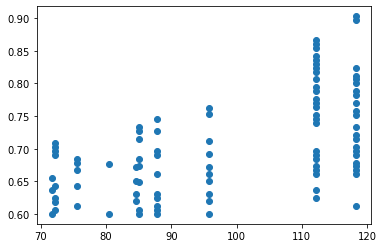

In [4]:
df1=pd.read_csv("LISA_SCANS/type_6/scan_1.csv",index_col=[0])
df2=pd.read_csv("LISA_SCANS/type_6/scan_2.csv",index_col=[0])
df3=pd.read_csv("LISA_SCANS/type_6/scan_3.csv",index_col=[0])
df4=pd.read_csv("LISA_SCANS/type_6/scan_4.csv",index_col=[0])


df=pd.concat([df1,df2,df3,df4])
df=df[df["lams"]<0.65]
df=df[df["lams"]>0.62]
plt.scatter(df.ms,df.lammix)

In [3]:
#m=model1(ms= 91.3, lammix= .915815, lams= 1)
#m.findAllTransitions()
#alltrans=m.TnTrans
#index=trans_index(m)

In [5]:
#------panda_scan(num_points,xinit,xfinal,Ms,lhs,ls)
#mi=113
#dfsome=panda_scan(1,lamhs(mi)*(1-0.1),3,mi,False,1)
#df1=pd.DataFrame(dfsome)
                    


The signal is True


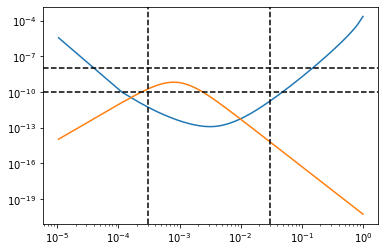

In [69]:
LISA_pd=pd.DataFrame(LISA_data,columns=["f","Omega"])
my_signal=GW_signal(90,1000.5,100,1)

Good_signal=np.any((my_signal[0]<0.03)) and  (np.any(0.003<my_signal[0])) and (np.any(10**(-10)<my_signal[1])) and (np.any(my_signal[1]<10**(-8)))

print("The signal is",Good_signal)

plt.plot(LISA_pd["f"],LISA_pd["Omega"])
plt.plot(my_signal[0],my_signal[1])

plt.axhline(y=10**(-10),linestyle="--",c="k")
plt.axhline(y=10**(-8),linestyle="--",c="k")
plt.axvline(x=0.0003,linestyle="--",c="k")
plt.axvline(x=0.03,linestyle="--",c="k")
#plt.legend()


plt.yscale("log")
plt.xscale("log")
plt.show()

In [3]:
####Add a column for signal (boolean)

#signals=[]
#for i in range(len(df)):
#    my_signal=GW_signal(df.iloc[i].Tnuc,df.iloc[i].alpha,df.iloc[i]["beta/Hubble"],1)
#    Good_signal=np.any((my_signal[0]<0.03)) and  (np.any(0.003<my_signal[0])) and (np.any(10**(-10)<my_signal[1])) and (np.any(my_signal[1]<10**(-8)))
#    signals.append([Good_signal])
#df["signal"]=np.array(signals)

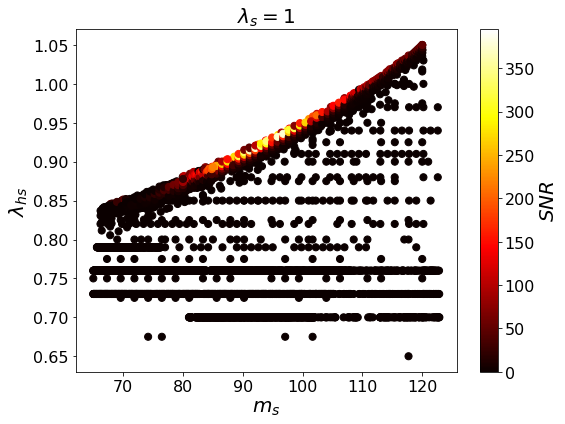

In [14]:
df1=pd.read_csv("LISA_SCANS/type_5/scan_1.csv",index_col=[0])
#df2=pd.read_csv("LISA_SCANS/type_5/scan_2.csv",index_col=[0])

#df2=pd.read_csv("LISA_SCANS/type_5/scan_2.csv",index_col=[0])


df=df1
df=pd.concat([df1,df2,df3,df4,df5])
#df.to_csv("LISA_SCANS/total_scan.csv")

thick_size=16
label_size=20

figure = plt.gcf()
figure.set_size_inches(8, 6)
cm = plt.cm.get_cmap('hot')
plt.scatter(df["ms"],df["lammix"],c=df["SNR_Tnuc"],s=50,cmap=cm)

plt.ylabel("$\lambda_{hs}$",size=label_size)
plt.xlabel("$m_{s}$",size=label_size)

cb=plt.colorbar()
cb.ax.tick_params(labelsize=thick_size)
cb.set_label(label='$SNR$', size=label_size, weight='bold')
plt.clim(min(df["SNR_Tnuc"]),max(df["SNR_Tnuc"]))
plt.title("$\lambda_s =$%0.f"%df["lams"].iloc[0],size=label_size)
plt.xticks(fontsize=thick_size)
plt.yticks(fontsize=thick_size)
plt.tight_layout()


#plt.savefig('Wall_Solutions_3/PLOTS/singlet_model_scan1.pdf')  
plt.show()

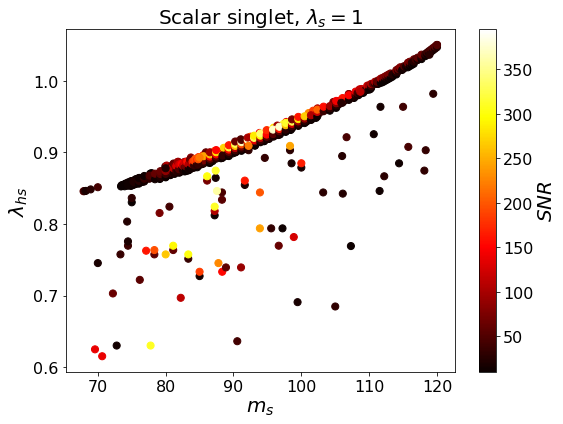

In [6]:
df=pd.read_csv("LISA_SCANS/total_scan_1.csv",index_col=[0])
df=df[df["SNR_Tnuc"]>10]
#someset=sorted(list(set(df["ms"])))
#lamhs=interpolate.interp1d(someset, np.array([max(df[df["ms"]==(someset[i])]["lammix"]) for i in range(len(someset))]),
#fill_value="extrapolate")

ms_range=np.linspace(65,120,200)

thick_size=16
label_size=20

figure = plt.gcf()
figure.set_size_inches(8, 6)
cm = plt.cm.get_cmap('hot')

#plt.plot(ms_range,lamhs(ms_range))
#plt.plot(ms_range,lamhs(ms_range)*(1+0.009))
#plt.plot(ms_range,lamhs(ms_range)*(1-0.009))

plt.scatter(df["ms"],df["lammix"],c=df["SNR_Tnuc"],s=50,cmap=cm)


plt.ylabel("$\lambda_{hs}$",size=label_size)
plt.xlabel("$m_{s}$",size=label_size)

cb=plt.colorbar()
cb.ax.tick_params(labelsize=thick_size)
cb.set_label(label='$SNR$', size=label_size, weight='bold')
plt.clim(min(df["SNR_Tnuc"]),max(df["SNR_Tnuc"]))
plt.title("Scalar singlet, $\lambda_s =$%0.f"%df["lams"].iloc[0],size=label_size)
plt.xticks(fontsize=thick_size)
plt.yticks(fontsize=thick_size)
plt.tight_layout()




plt.savefig('LISA_SCANS/singlet_SNR.pdf', dpi=300)

plt.show()

In [130]:
%%time
def find_lammix_max(ms,lams):
    """Find the maximum allowed lammix with the other parameters of the potential fixed. 
    Uses isEWSB=1/2 for optimization"""
    def lammix_optimization(lammix):
        m=model1(ms=ms, lammix=lammix, lams=lams)    
        EWSB_bool=isEWSB(m)
        return float(EWSB_bool)-1/2
    lammix_max=optimize.bisect(lammix_optimization, 0.01, 1.41)
    return lammix_max


###DO a pandas of ms,lams such that lammix is the maximum
ms_range=np.linspace(65,120,40)
lams_range=np.linspace(0.1,1.0,10)

pandas_data=[]
for lamsi in lams_range:
    for mi in ms_range:
        lammix_val=find_lammix_max(mi,lamsi)
        pandas_data.append({"ms":mi,"lammix_max":lammix_val,"lams":lamsi})

df=pd.DataFrame(pandas_data)
df.to_csv("LISA_SCANS/lammix_max.csv") 

CPU times: user 5min 54s, sys: 2.3 s, total: 5min 56s
Wall time: 5min 57s


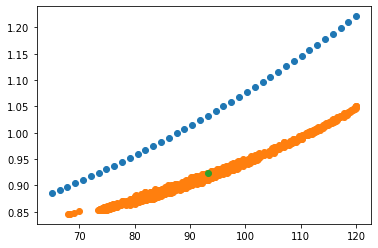

In [230]:
df=pd.read_csv("LISA_SCANS/total_scan.csv",index_col=[0])
df=df[df["SNR_Tnuc"]>10]

df_lammix=pd.read_csv("LISA_SCANS/lammix_max.csv",index_col=[0])
df_lammix=df_lammix[df_lammix["lams"]==1.]
plt.scatter(df_lammix["ms"],df_lammix["lammix_max"])
plt.scatter(df["ms"],df["lammix"])

i=20
plt.scatter(df_lammix.iloc[i].ms,df_lammix.iloc[i].lammix_max-0.109)

plt.show()

In [1]:
df_lammix=pd.read_csv("LISA_SCANS/lammix_max.csv",index_col=[0])
df_lammix=df_lammix[df_lammix["lams"]==0.1]
plt.scatter(df_lammix["ms"],df_lammix["lammix_max"])

df_lammix=pd.read_csv("LISA_SCANS/lammix_max.csv",index_col=[0])
df_lammix=df_lammix[df_lammix["lams"]==0.5]
plt.scatter(df_lammix["ms"],df_lammix["lammix_max"])

df_lammix=pd.read_csv("LISA_SCANS/lammix_max.csv",index_col=[0])
df_lammix=df_lammix[df_lammix["lams"]==1]
plt.scatter(df_lammix["ms"],df_lammix["lammix_max"])

plt.scatter(df["ms"],df["lammix"])



NameError: name 'pd' is not defined

In [231]:
i=20
m=model1(df_lammix.iloc[i].ms,df_lammix.iloc[i].lammix_max-0.109,df_lammix.iloc[i].lams)
m.findAllTransitions()
#nuc_dict=find_nucleation(m)
#Tnuc = optimize.fmin(nucleation_temp,(nuc_dict["Tmin"]+nuc_dict["Tmax"])*0.5,xtol=0.0001)[0]
#my_Action(Tnuc)

Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................
Tracing phase starting at x = [3.18931108e-06 1.33922737e+02] ; t = 116.78573079222336
Tracing minimum down
traceMinimum t0 = 116.786
..........................................
Tracing minimum up
traceMinimum t0 = 116.786
.........................................................................................................................
Tracing phase starting at x = [-4.64574296e-06  7.29033938e+01] ; t = 283.63351659090847
Tracing minimum down
traceMinimum t0 = 283.634
....................
Tracing minimum up
traceMinimum t0 = 283.634
.............................................................................................................................
Tracing phase starting at x = [1.53767924e-05 1.51035018e-03] ; t = 318.8378996211381
Tracing minimum down
traceMinimum t0 = 318.838

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.10535e-05
Tunneling from phase 2 to phase 4 at T=282.5897
high_vev = [-7.36807344e-06  7.38386694e+01]
low_vev = [9.12618484e-06 7.53671676e+01]
Path deformation converged. 1 steps. fRatio = 2.52954e-05
Tunneling from phase 4 to phase 0 at T=17.11773
high_vev = [-5.5501752e-05  1.3791357e+02]
low_vev = [2.45992459e+02 2.79846453e-07]
Path deformation converged. 40 steps. fRatio = 1.94324e-02
Path deformation converged. 13 steps. fRatio = 1.52606e-02
Path deformation converged. 8 steps. fRatio = 1.16917e-02
Path deformation converged. 1 steps. fRatio = 2.30224e-03
Tunneling from phase 4 to phase 0 at T=17.11823
high_vev = [-5.70034154e-05  1.37913568e+02]
low_vev = [2.45992455e+02 2.65270393e-07]
Path deformation converged. 40 steps. fRatio = 1.94324e-02
Path deformation converged. 13 steps. fRatio = 1.52633e-02
Path deformation converged. 8 steps. fRatio = 1.42451e-02
Path deformation converged. 1 steps. fRatio = 2.50657e-03
Tunneling fro

[{'Tnuc': 318.02027225742796,
  'low_vev': array([-6.09207561e-05, -1.80470736e-02]),
  'high_vev': array([-6.09207561e-05, -1.80470736e-02]),
  'low_phase': 2,
  'high_phase': 3,
  'action': 0.0,
  'instanton': None,
  'trantype': 2,
  'crit_trans': {'Tcrit': 318.02027225742796,
   'low_vev': array([-6.09207561e-05, -1.80470736e-02]),
   'high_vev': array([-6.09207561e-05, -1.80470736e-02]),
   'low_phase': 2,
   'high_phase': 3,
   'action': 0.0,
   'instanton': None,
   'trantype': 2,
   'Delta_rho': 0.0},
  'Delta_rho': 0.0,
  'Delta_p': 0.0},
 {'low_vev': array([9.12618484e-06, 7.53671676e+01]),
  'high_vev': array([-7.36807344e-06,  7.38386694e+01]),
  'Tnuc': 282.5896546981451,
  'low_phase': 4,
  'high_phase': 2,
  'instanton': fullTunneling_rval(profile1D=Profile1D(R=array([0.        , 0.03857291, 0.07699264, 0.11525918, 0.15337253,
         0.19133269, 0.22913966, 0.26679344, 0.30429404, 0.34164145,
         0.37883567, 0.4158767 , 0.45276455, 0.4894992 , 0.52608067,
        

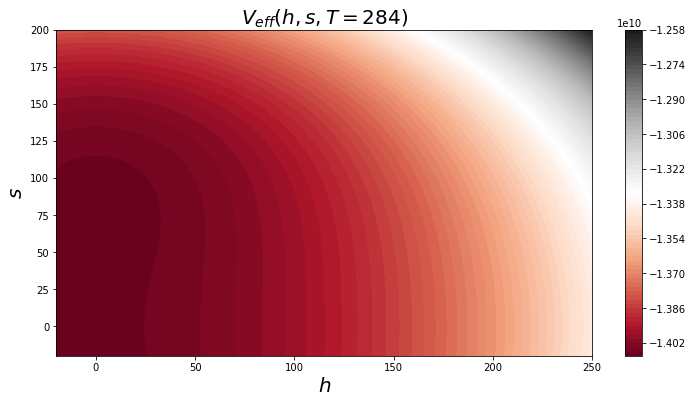

In [217]:
m=model1(df_lammix.iloc[i].ms,df_lammix.iloc[i].lammix_max-0.1,df_lammix.iloc[i].lams)


clevs=120
myN = 80
Temp=284
box=(-20,250,-20,200)
xmin,xmax,ymin,ymax=box
x=np.linspace(xmin,xmax,clevs)
y=np.linspace(ymin,ymax,clevs)
X,Y=np.meshgrid(x,y)
Z_V=[]
for i in x:
    Z_V_row=[]
    for j in y:
        Z_V_row.append([m.Vtot([i,j],Temp)])
    Z_V.append(Z_V_row)
Z_V=np.array(Z_V).T[0]


fig, ax1 = plt.subplots(1,1,figsize=(12,6))
ax1.set_title("$V_{eff}(h,s, T=$%1.f"%Temp + ")",size=20)
ax1.set_xlabel('$h$',size=20)
ax1.set_ylabel('$s$',size=20)
cf1 = ax1.contourf(X,Y,Z_V,myN,cmap="RdGy")
fig.colorbar(cf1, ax=ax1)

plt.show()

In [167]:
#m.getPhases(tracingArgs={"dtstart":1e-2, "tjump":1e-2})
#m.findAllTransitions()

In [10]:
####STEP 2
###scan a grid ms vs lammix using interpolated function as a measure
ms_range=np.linspace(65,80,20)
my_pandas=[]
for mi in ms_range: 
    dfi=panda_scan(5,lamhs(mi)*(1-0.009),lamhs(mi)*(1+0.009),mi,False,1)
    my_pandas.extend(dfi)
df=pd.DataFrame(my_pandas)
#df.to_csv("LISA_SCANS/type_4/scan_3.csv")

doint the range, param_range= [0.8339265  0.83771325 0.8415     0.84528675 0.8490735 ]
ms= 65.0 lammix= 0.8339264999999991 lams= 1
STARTING A NEW PARAMETER SPACE POINT:  #0.8339264999999991
Tracing phase starting at x = [2.45999999e+02 6.28915628e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................
Tracing phase starting at x = [2.27386901e-06 1.41923287e+02] ; t = 97.48200843717657
Tracing minimum down
traceMinimum t0 = 97.482
...............................................
Tracing minimum up
traceMinimum t0 = 97.482
...................................................................................................
Tracing phase starting at x = [5.07954217e-06 7.82620170e+01] ; t = 291.1081684727034
Tracing minimum down
traceMinimum t0 = 291.108
....................
Tracing minimum up
traceMinimum t0 = 291.108
..........................................................................................................
Trac

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 65.0 lammix= 0.8377132499999991 lams= 1
STARTING A NEW PARAMETER SPACE POINT:  #0.8377132499999991
Tracing phase starting at x = [2.45999999e+02 6.28915628e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................
Tracing phase starting at x = [2.50552381e-06 1.42333028e+02] ; t = 97.25433937889693
Tracing minimum down
traceMinimum t0 = 97.2543
...................................
Tracing minimum up
traceMinimum t0 = 97.2543
..............................................................................................
Tracing phase starting at x = [-6.46983816e-06  7.85050856e+01] ; t = 291.80436517381077
Tracing minimum down
traceMinimum t0 = 291.804
........................
Tracing minimum up
traceMinimum t0 = 291.804
..........................................................................................................
Tracing phase starting at x = [9.98949706e-06 1.26375085e-03] ; t = 331.79615513083

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 65.0 lammix= 0.841499999999999 lams= 1
STARTING A NEW PARAMETER SPACE POINT:  #0.841499999999999
Tracing phase starting at x = [2.45999999e+02 6.28915628e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................
Tracing phase starting at x = [-1.10364273e-06  1.42741128e+02] ; t = 97.02974817965745
Tracing minimum down
traceMinimum t0 = 97.0297
..................................................
Tracing minimum up
traceMinimum t0 = 97.0297
..............................................................................................
Tracing phase starting at x = [3.87588042e-06 7.87468601e+01] ; t = 292.49884008217884
Tracing minimum down
traceMinimum t0 = 292.499
........................
Tracing minimum up
traceMinimum t0 = 292.499
...................................................................................................................
Tracing phase starting at x = [3.48330578e-06 1.09830370e-03] 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 65.0 lammix= 0.8452867499999991 lams= 1
STARTING A NEW PARAMETER SPACE POINT:  #0.8452867499999991
Tracing phase starting at x = [2.45999999e+02 6.28915628e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................
Tracing phase starting at x = [4.30330142e-06 1.43147778e+02] ; t = 96.8056805224787
Tracing minimum down
traceMinimum t0 = 96.8057
.....................
Tracing minimum up
traceMinimum t0 = 96.8057
..................................................................................................
Tracing phase starting at x = [6.81151795e-06 7.89873484e+01] ; t = 293.19155911114495
Tracing minimum down
traceMinimum t0 = 293.192
.....................
Tracing minimum up
traceMinimum t0 = 293.192
.................................................................................................
Tracing phase starting at x = [3.61540958e-06 1.09496420e-03] ; t = 333.5595310175905
Tracing minimum down
tra

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [7.18970685e-06 1.45129003e+02]
low_vev = [2.46000000e+02 6.35794392e-07]
Path deformation converged. 48 steps. fRatio = 1.87204e-02
Path deformation converged. 18 steps. fRatio = 1.86897e-02
Path deformation converged. 1 steps. fRatio = 6.78192e-02
ERROR FOUND 2!!
ms= 65.0 lammix= 0.849073499999999 lams= 1
STARTING A NEW PARAMETER SPACE POINT:  #0.849073499999999
Tracing phase starting at x = [2.45999999e+02 6.28915628e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................
Tracing phase starting at x = [2.68091619e-06 1.43552799e+02] ; t = 96.58515468717259
Tracing minimum down
traceMinimum t0 = 96.5852
.....................
Tracing minimum up
traceMinimum t0 = 96.5852
................................................................................................
Tracing phase starting at x = [1.39138351e-05 7.92265770e+01] ; t = 293.8825832743819
Tracing 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 65.78947368421052 lammix= 0.8388671249999994 lams= 1
STARTING A NEW PARAMETER SPACE POINT:  #0.8388671249999994
Tracing phase starting at x = [2.46000000e+02 1.41032497e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................
Tracing phase starting at x = [2.90722699e-06 1.42052228e+02] ; t = 97.91609306600836
Tracing minimum down
traceMinimum t0 = 97.9161
.....................................................
Tracing minimum up
traceMinimum t0 = 97.9161
....................................................................................................
Tracing phase starting at x = [1.03091295e-05 7.83393772e+01] ; t = 291.49507810333193
Tracing minimum down
traceMinimum t0 = 291.495
......................
Tracing minimum up
traceMinimum t0 = 291.495
...............................................................................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 65.78947368421052 lammix= 0.8426590909090903 lams= 1
STARTING A NEW PARAMETER SPACE POINT:  #0.8426590909090903
Tracing phase starting at x = [2.46000000e+02 1.41032497e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................
Tracing phase starting at x = [3.39104647e-07 1.42462073e+02] ; t = 97.69149541330451
Tracing minimum down
traceMinimum t0 = 97.6915
.....................................
Tracing minimum up
traceMinimum t0 = 97.6915
..................................................................................................
Tracing phase starting at x = [-4.25829870e-06  7.85823056e+01] ; t = 292.19191124988333
Tracing minimum down
traceMinimum t0 = 292.192
........................
Tracing minimum up
traceMinimum t0 = 292.192
...............................................................................................
Tracing phase starting at x = [8.74149372e-06 8.19809967e-04] ; t = 332.2339

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 65.78947368421052 lammix= 0.8464510568181811 lams= 1
STARTING A NEW PARAMETER SPACE POINT:  #0.8464510568181811
Tracing phase starting at x = [2.46000000e+02 1.41032497e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................
Tracing phase starting at x = [-2.24913651e-06  1.42870467e+02] ; t = 97.46717809388574
Tracing minimum down
traceMinimum t0 = 97.4672
.....................
Tracing minimum up
traceMinimum t0 = 97.4672
.....................................................................................................
Tracing phase starting at x = [4.67350763e-06 7.88240332e+01] ; t = 292.8868970657138
Tracing minimum down
traceMinimum t0 = 292.887
.....................
Tracing minimum up
traceMinimum t0 = 292.887
........................................................................................................
Tracing phase starting at x = [8.87922151e-06 1.46813095e-03] ; t = 333.08752712948

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
ms= 65.78947368421052 lammix= 0.850243022727272 lams= 1
STARTING A NEW PARAMETER SPACE POINT:  #0.850243022727272
Tracing phase starting at x = [2.46000000e+02 1.41032497e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................
Tracing phase starting at x = [-4.70706785e-06  1.43277457e+02] ; t = 97.24265065152395
Tracing minimum down
traceMinimum t0 = 97.2427
.....................
Tracing minimum up
traceMinimum t0 = 97.2427
......................................................................................................
Tracing phase starting at x = [6.85482867e-06 7.90643674e+01] ; t = 293.5802952042716
Tracing minimum down
traceMinimum t0 = 293.58
.....................
Tracing minimum up
traceMinimum t0 = 293.58
....................................................................................................
Tracing phase starting at x = [-1.37381762e-05  1.31036230e-03] ; t = 333.9789246187833
T

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ERROR FOUND 2!!
doint the range, param_range= [0.83622382 0.840021   0.84381818 0.84761536 0.85141255]
ms= 66.57894736842105 lammix= 0.8362238181818178 lams= 1
STARTING A NEW PARAMETER SPACE POINT:  #0.8362238181818178
Tracing phase starting at x = [ 2.45999999e+02 -3.70139327e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................
Tracing phase starting at x = [-5.39619221e-06  1.41352355e+02] ; t = 98.80673816932818
Tracing minimum down
traceMinimum t0 = 98.8067
......................................................
Tracing minimum up
traceMinimum t0 = 98.8067
..................................................................................................
Tracing phase starting at x = [2.99381496e-06 7.79220853e+01] ; t = 290.4778092400775
Tracing minimum down
traceMinimum t0 = 290.478
...................
Tracing minimum up
traceMinimum t0 = 290.478
.......................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 5.67926e-05
Tunneling from phase 2 to phase 4_1 at T=289.4525
high_vev = [-4.01294019e-05  7.87815971e+01]
low_vev = [6.00350466e-06 8.25235263e+01]
Path deformation converged. 1 steps. fRatio = 7.07108e-05
Tunneling from phase 2 to phase 4_1 at T=289.453
high_vev = [-4.14908422e-05  7.87811813e+01]
low_vev = [-1.23895331e-05  8.25231173e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.64765e-05
Tunneling from phase 4_1 to phase 0 at T=30.0664
high_vev = [-7.33161615e-04  1.43455950e+02]
low_vev = [2.45773321e+02 1.34891887e-08]
Path deformation converged. 40 steps. fRatio = 1.93571e-02
Path deformation converged. 20 steps. fRatio = 1.57740e-02
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 66.57894736842105 lammix= 0.8400209999999996 lams= 1
STARTING A NEW PARAMETER SPACE POINT:  #0.8400209999999996
Tracing phase starting at x = [ 2.45999999e+02 -3.70139327e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................
Tracing phase starting at x = [5.17240111e-07 1.41765789e+02] ; t = 98.5770093835493
Tracing minimum down
traceMinimum t0 = 98.577
........................................................
Tracing minimum up
traceMinimum t0 = 98.577
...............................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 4.68567e-06
Tunneling from phase 2 to phase 4 at T=290.1564
high_vev = [1.44133987e-06 7.90235657e+01]
low_vev = [-6.40103800e-06  8.27832698e+01]
Path deformation converged. 1 steps. fRatio = 6.88819e-06
Tunneling from phase 2 to phase 4 at T=290.154
high_vev = [1.83554387e-06 7.90255383e+01]
low_vev = [7.60216534e-06 8.27851997e+01]
Path deformation converged. 1 steps. fRatio = 2.11979e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4 at T=290.1545
high_vev = [1.83492435e-06 7.90251249e+01]
low_vev = [3.82331952e-06 8.27848108e+01]
Path deformation converged. 1 steps. fRatio = 7.86662e-06
Tunneling from phase 4 to phase 0 at T=24.07003
high_vev = [1.90666635e-04 1.43868942e+02]
low_vev = [ 2.45925054e+02 -4.07350578e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 46 steps. fRatio = 1.66224e-02
Path deformation converged. 19 steps. fRatio = 1.88061e-02
Path deformation converged. 7 steps. fRatio = 1.34994e-02
Path deformation converged. 1 steps. fRatio = 1.02676e-03
Tunneling from phase 4 to phase 0 at T=45.1139
high_vev = [3.88087369e-05 1.43724103e+02]
low_vev = [2.44562466e+02 4.54990766e-07]
Path deformation converged. 45 steps. fRatio = 1.70083e-02
Path deformation converged. 15 steps. fRatio = 1.55185e-02
Path deformation converged. 1 steps. fRatio = 4.71580e-02
Tunneling from phase 4 to phase 0 at T=47.3696
high_vev = [3.6943002e-05 1.4369615e+02]
low_vev = [2.44231705e+02 1.13590694e-06]
Path deformation converged. 49 steps. fRatio = 1.87156e-02
Path deformation converged. 14 steps. fRatio = 1.97034e-02
Path deformation converged. 1 steps. fRatio = 5.08921e-02
Tunneling from phase 4 to phase 0 at T=42.85821
high_vev = [3.12137077e-05 1.43748986e+02]
low_vev = [2.44847716e+02 4.74662957e-07]
Path deformation co

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 51 steps. fRatio = 1.94040e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 12 steps. fRatio = 1.10977e-02
Path deformation converged. 1 steps. fRatio = 5.38371e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4 to phase 0 at T=23.68552
high_vev = [ 30.34551443 142.54448825]
low_vev = [ 2.45931047e+02 -3.90095956e-07]
Path deformation converged. 41 steps. fRatio = 1.88826e-02
Path deformation converged. 16 steps. fRatio = 1.73324e-02
Path deformation converged. 8 steps. fRatio = 6.91265e-03
Path deformation converged. 1 steps. fRatio = 5.59014e-04
Tunneling from phase 4 to phase 0 at T=23.75108
high_vev = [ 26.43117923 142.86541338]
low_vev = [ 2.45930052e+02 -4.00193190e-07]
Path deformation converged. 44 steps. fRatio = 1.97816e-02
Path deformation converged. 17 steps. fRatio = 9.28252e-03
Path deformation converged. 8 steps. fRatio = 1.97266e-02
Path deformation converged. 1 steps. fRatio = 7.95000e-03
Tunneling from phase 4 to phase 0 at T=44.95443
high_vev = [2.93925988e-05 1.43725961e+02]
low_vev = [2.44584087e+02 4.69226070e-07]
Path deformation converged. 45 steps. fRatio = 1.59121e-02
Path deformation converged. 15 steps. fRatio = 1.55566e-02
Path deformation co

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4 at T=290.8536
high_vev = [-4.03551632e-06  7.92683429e+01]
low_vev = [1.06983955e-04 8.30456001e+01]
Path deformation converged. 1 steps. fRatio = 2.37036e-04
Tunneling from phase 2 to phase 4 at T=290.8564
high_vev = [-1.60771296e-06  7.92660343e+01]
low_vev = [1.06336088e-04 8.30433637e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.14024e-04
Tunneling from phase 2 to phase 4 at T=290.8541
high_vev = [6.65935388e-06 7.92679251e+01]
low_vev = [-1.16929328e-05  8.30452252e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.25527e-05
Tunneling from phase 4 to phase 0 at T=15.84511
high_vev = [1.41798287e-04 1.44276046e+02]
low_vev = [ 2.45992886e+02 -3.35846211e-07]
Path deformation converged. 45 steps. fRatio = 1.91268e-02
Path deformation converged. 17 steps. fRatio = 1.80472e-02
Path deformation converged. 1 steps. fRatio = 9.76010e-02
Tunneling from phase 4 to phase 0 at T=56.59676
high_vev = [-6.27377906e-06  1.43932998e+02]
low_vev = [2.42333716e+02 4.91958535e-06]
Path deformation converged. 51 steps. fRatio = 1.89000e-02
Path deformation converged. 16 steps. fRatio = 1.27692e-02
Path deformation converged. 1 steps. fRatio = 5.34287e-02
Tunneling from phase 4 to phase 0 at T=59.4266
high_vev = [-2.54137336e-07  1.43873211e+02]
low_vev = [2.41555584e+02 7.40324606e-06]
Path deformation converged. 50 steps. fRatio = 1.82431e-02
Path deformation converged. 12 steps. fRatio = 1.48692e-02
Path deformation converged. 1 steps. fRatio = 5.45841e-02
Tunneling 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=292.2473
high_vev = [-9.21307075e-06  7.97502624e+01]
low_vev = [-1.08370385e-05  8.35625384e+01]
Path deformation converged. 1 steps. fRatio = 4.10067e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=292.2478
high_vev = [-9.06200295e-06  7.97498546e+01]
low_vev = [-6.43131183e-06  8.35621199e+01]
Path deformation converged. 1 steps. fRatio = 2.77117e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=292.2483
high_vev = [-9.31768584e-06  7.97494476e+01]
low_vev = [2.62651568e-06 8.35617198e+01]
Path deformation converged. 1 steps. fRatio = 9.93129e-06
Tunneling from phase 1 to phase 0 at T=0
high_vev = [7.26428373e-06 1.45053735e+02]
low_vev = [ 2.45999999e+02 -3.70428498e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 49 steps. fRatio = 1.99865e-02
Path deformation converged. 18 steps. fRatio = 1.91788e-02
Path deformation converged. 1 steps. fRatio = 5.87594e-02
ERROR FOUND 2!!
doint the range, param_range= [0.83737248 0.84117487 0.84497727 0.84877967 0.85258207]
ms= 67.36842105263158 lammix= 0.837372477272727 lams= 1
STARTING A NEW PARAMETER SPACE POINT:  #0.837372477272727
Tracing phase starting at x = [ 2.45999998e+02 -1.69896636e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................
Tracing phase starting at x = [-1.67486713e-07  1.41058554e+02] ; t = 99.46477570760189
Tracing minimum down
traceMinimum t0 = 99.4648
..................................
Tracing minimum up
traceMinimum t0 = 99.4648
......................................................................................................
Tracing phase starting at x = [4.58858296e-06 7.77429941e+01] ; t = 290.15191035770016
Tracing minimum down
t

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.56565e-05
Tunneling from phase 2 to phase 4_1 at T=289.1131
high_vev = [5.11257259e-05 7.86154189e+01]
low_vev = [6.10735511e-06 8.22721460e+01]
Path deformation converged. 1 steps. fRatio = 5.74792e-05
Tunneling from phase 2 to phase 4_1 at T=289.1166
high_vev = [5.43787558e-05 7.86125374e+01]
low_vev = [9.47915108e-07 8.22692836e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.95433e-05
Tunneling from phase 2 to phase 4_1 at T=289.1175
high_vev = [5.55796926e-05 7.86117915e+01]
low_vev = [4.01146752e-06 8.22685683e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.09706e-05
Tunneling from phase 4_1 to phase 0 at T=31.13416
high_vev = [1.59348332e-04 1.43210110e+02]
low_vev = [ 2.45733586e+02 -1.67526422e-06]
Path deformation converged. 48 steps. fRatio = 1.89716e-02
Path deformation converged. 20 steps. fRatio = 1.75641e-02
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4 at T=289.8165
high_vev = [-4.13180192e-06  7.88610588e+01]
low_vev = [-8.34947093e-05  8.25353220e+01]
Path deformation converged. 1 steps. fRatio = 8.04366e-05
Tunneling from phase 2 to phase 4 at T=289.8205
high_vev = [-2.97038896e-06  7.88577751e+01]
low_vev = [-7.52029824e-05  8.25320792e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.30415e-04
Tunneling from phase 2 to phase 4 at T=289.8217
high_vev = [7.17542818e-06 7.88567535e+01]
low_vev = [-8.30121253e-05  8.25311046e+01]
Path deformation converged. 1 steps. fRatio = 9.22589e-05
Tunneling from phase 2 to phase 4 at T=289.8212
high_vev = [-9.79906665e-05  7.88571776e+01]
low_vev = [-8.22373676e-05  8.25315068e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.13149e-04
Tunneling from phase 4 to phase 0 at T=25.38801
high_vev = [3.69108825e-05 1.43625303e+02]
low_vev = [ 2.45902440e+02 -1.85124671e-06]
Path deformation converged. 49 steps. fRatio = 1.75877e-02
Path deformation converged. 20 steps. fRatio = 1.61624e-02
Path deformation converged. 9 steps. fRatio = 1.41084e-02
Path deformation converged. 1 steps. fRatio = 9.10861e-03
Tunneling from phase 4 to phase 0 at T=46.26405
high_vev = [4.89849555e-08 1.43470778e+02]
low_vev = [ 2.44403763e+02 -2.51111838e-06]
Path deformation converged. 49 steps. fRatio = 1.76250e-02
Path deformation converged. 15 steps. fRatio = 1.64534e-02
Path deformation converged. 1 steps. fRatio = 4.73917e-02
Tunneling from phase 4 to phase 0 at T=48.57725
high_vev = [-1.01119439e-05  1.43440251e+02]
low_vev = [ 2.44039270e+02 -3.26995394e-06]
Path deformation converged. 48 steps. fRatio = 1.89791e-02
Path deformation converged. 16 steps. fRatio = 1.87922e-02
Path de

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 52 steps. fRatio = 1.91749e-02
Path deformation converged. 12 steps. fRatio = 1.14960e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.40028e-02
Tunneling from phase 4 to phase 0 at T=25.30115
high_vev = [ 16.84929839 143.21688951]
low_vev = [ 2.45904126e+02 -1.93098075e-06]
Path deformation converged. 44 steps. fRatio = 1.81243e-02
Path deformation converged. 17 steps. fRatio = 9.30895e-03
Path deformation converged. 8 steps. fRatio = 1.23613e-02
Path deformation converged. 1 steps. fRatio = 3.55577e-03
Tunneling from phase 4 to phase 0 at T=25.30407
high_vev = [ 16.48918762 143.23418894]
low_vev = [ 2.45904072e+02 -1.91341315e-06]
Path deformation converged. 44 steps. fRatio = 1.82999e-02
Path deformation converged. 17 steps. fRatio = 9.22402e-03
Path deformation converged. 8 steps. fRatio = 1.46874e-02
Path deformation converged. 1 steps. fRatio = 4.59066e-03
Tunneling from phase 4 to phase 0 at T=25.30357
high_vev = [ 16.55117221 143.23123756]
low_vev = [ 2.45904081e+02 -1.83686118e-06]
Path deformation converged. 44 steps. fRatio = 1.82570e-02
Path deformation conve

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 4 at T=290.5233
high_vev = [-1.97809431e-05  7.91010569e+01]
low_vev = [7.55317274e-05 8.27928720e+01]
Path deformation converged. 1 steps. fRatio = 1.07396e-04
Tunneling from phase 2 to phase 4 at T=290.5238
high_vev = [-1.84092270e-05  7.91006525e+01]
low_vev = [7.02236043e-05 8.27924742e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.74770e-05
Tunneling from phase 4 to phase 0 at T=17.78656
high_vev = [1.88380641e-04 1.44034824e+02]
low_vev = [ 2.45985939e+02 -1.75742432e-06]
Path deformation converged. 43 steps. fRatio = 1.86680e-02
Path deformation converged. 19 steps. fRatio = 1.81725e-02
Path deformation converged. 9 steps. fRatio = 1.78807e-02
Path deformation converged. 1 steps. fRatio = 1.25156e-02
Tunneling from phase 4 to phase 0 at T=57.8955
high_vev = [2.38867530e-05 1.43667497e+02]
low_vev = [ 2.41995530e+02 -1.63930795e-06]
Path deformation converged. 50 steps. fRatio = 1.65661e-02
Path deformation converged. 16 steps. fRatio = 1.27443e-02
Path deformation converged. 1 steps. fRatio = 5.35808e-02
Tunneling from phase 4 to phase 0 at T=60.79028
high_vev = [1.51076254e-05 1.43602726e+02]
low_vev = [ 2.41151634e+02 -3.00478821e-06]
Path deformation converged. 51 steps. fRatio = 1.94437e-02
Path deformation converged. 12 steps. fRatio = 1.56185e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 4 at T=291.2237
high_vev = [-4.54993984e-05  7.93435794e+01]
low_vev = [-2.88488389e-05  8.30527900e+01]
Path deformation converged. 1 steps. fRatio = 1.17683e-04
Tunneling from phase 2 to phase 4 at T=291.2242
high_vev = [-4.53929789e-05  7.93431830e+01]
low_vev = [-2.86435277e-05  8.30523842e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.63444e-05
Tunneling from phase 4 to phase 0 at T=0
high_vev = [-3.12509242e-04  1.44433879e+02]
low_vev = [ 2.45999998e+02 -1.70427563e-06]
Path deformation converged. 45 steps. fRatio = 1.98523e-02
Path deformation converged. 17 steps. fRatio = 1.44596e-02
Path deformation converged. 1 steps. fRatio = 7.24023e-02
ERROR FOUND 2!!
ms= 67.36842105263158 lammix= 0.8525820681818179 lams= 1
STARTING A NEW PARAMETER SPACE POINT:  #0.8525820681818179
Tracing phase starting at x = [ 2.45999998e+02 -1.69896636e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................
Tracing phase starting at x = [-2.35240874e-06  1.42710187e+02] ; t = 98.55373132148016
Tracing minimum down
traceMinimum t0 = 98.5537
......................
Tracing minimum up
traceMinimum t0 = 98.5537
.....................................................................................................
Tracing phase starti

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=291.9242
high_vev = [8.91607933e-05 7.95833872e+01]
low_vev = [-7.01858770e-06  8.33098508e+01]
Path deformation converged. 1 steps. fRatio = 9.70505e-05
Tunneling from phase 2 to phase 1 at T=291.9225
high_vev = [3.61880264e-05 7.95847049e+01]
low_vev = [1.61504198e-06 8.33112440e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 4.97083e-05
Tunneling from phase 2 to phase 1 at T=291.923
high_vev = [9.06142634e-05 7.95843584e+01]
low_vev = [-7.17460985e-06  8.33108256e+01]
Path deformation converged. 1 steps. fRatio = 9.43999e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.32350234e-05 1.44818664e+02]
low_vev = [ 2.45999998e+02 -1.70427563e-06]
Path deformation converged. 47 steps. fRatio = 1.99671e-02
Path deformation converged. 17 steps. fRatio = 1.12481e-02
Path deformation converged. 1 steps. fRatio = 5.06630e-02
ERROR FOUND 2!!
doint the range, param_range= [0.83852114 0.84232875 0.84613636 0.84994398 0.85375159]
ms= 68.15789473684211 lammix= 0.8385211363636363 lams= 1
STARTING A NEW PARAMETER SPACE POINT:  #0.8385211363636363
Tracing phase starting at x = [ 2.4600000e+02 -1.5869849e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................
Tracing phase starting at x = [-2.41232155e-06 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4 at T=288.7732
high_vev = [1.63356720e-05 7.84377894e+01]
low_vev = [7.29899652e-06 8.20104159e+01]
Path deformation converged. 1 steps. fRatio = 2.62071e-05
Tunneling from phase 4 to phase 0 at T=32.19831
high_vev = [5.76250591e-04 1.42959198e+02]
low_vev = [ 2.45689027e+02 -2.13895176e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 49 steps. fRatio = 1.87895e-02
Path deformation converged. 16 steps. fRatio = 1.91420e-02
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation it

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.66793e-06


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4 at T=289.48
high_vev = [-7.14739941e-06  7.86838260e+01]
low_vev = [6.45247587e-06 8.22738831e+01]
Path deformation converged. 1 steps. fRatio = 6.92768e-06
Tunneling from phase 4 to phase 0 at T=26.68294
high_vev = [-1.25561264e-04  1.43376635e+02]
low_vev = [ 2.45875596e+02 -1.52351691e-06]
Path deformation converged. 45 steps. fRatio = 1.87207e-02
Path deformation converged. 20 steps. fRatio = 1.79220e-02
Path deformation converged. 9 steps. fRatio = 9.87464e-03
Path deformation converged. 1 steps. fRatio = 1.60638e-03
Tunneling from phase 4 to phase 0 at T=47.39914
high_vev = [2.00556873e-05 1.43212028e+02]
low_vev = [ 2.44235551e+02 -1.87772342e-06]
Path deformation converged. 46 steps. fRatio = 1.63555e-02
Path deformation converged. 17 steps. fRatio = 9.37386e-03
Path deformation converged. 1 steps. fRatio = 4.65442e-02
Tunneling from phase 4 to phase 0 at T=49.7691
high_vev = [1.96951422e-05 1.43178782e+02]
low_vev = [ 2.43835650e+02 -2.8861306

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.18364e-04
Tunneling from phase 2 to phase 4_1 at T=290.8872
high_vev = [1.76294154e-05 7.91728141e+01]
low_vev = [-1.03066267e-05  8.27973956e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.97062e-05
Tunneling from phase 4_1 to phase 0 at T=7.157314
high_vev = [-2.73587575e-04  1.44191929e+02]
low_vev = [ 2.45999981e+02 -1.56071880e-06]
Path deformation converged. 46 steps. fRatio = 1.99729e-02
Path deformation converged. 21 steps. fRatio = 1.37318e-02
Path deformation converged. 1 steps. fRatio = 8.09106e-02
Tunneling from phase 4_1 to phase 0 at T=52.79401
high_vev = [4.54738270e-06 1.43910408e+02]
low_vev = [ 2.43236548e+02 -2.97386229e-06]
Path deformation converged. 51 steps. fRatio = 1.92327e-02
Path deformation converged. 16 steps. fRatio = 1.55453e-02
Path deformation converged. 1 steps. fRatio = 5.39410e-02
Tunneling from phase 4_1 to phase 0 at T=55.43371
high_vev = [9.69260080e-06 1.43863016e+02]
low_vev = [ 2.42634373e+02 -3.11610812e-06]
Path deformation converged. 53 steps. fRatio = 1.89982e-02
Path deformation converged. 16 steps. fRatio = 1.42862e-02
Path deformation converged. 1 steps. fRatio = 5.35799e-02
T

Tunneling from phase 4_1 to phase 0 at T=26.10829
high_vev = [2.69007638e-06 1.44155905e+02]
low_vev = [ 2.45888188e+02 -1.66957458e-06]
Path deformation converged. 44 steps. fRatio = 1.70930e-02
Path deformation converged. 17 steps. fRatio = 1.32651e-02
Path deformation converged. 1 steps. fRatio = 5.35507e-02
Tunneling from phase 4_1 to phase 0 at T=26.17016
high_vev = [2.74614395e-06 1.44155666e+02]
low_vev = [ 2.45886843e+02 -1.67529566e-06]
Path deformation converged. 44 steps. fRatio = 1.70858e-02
Path deformation converged. 17 steps. fRatio = 1.32480e-02
Path deformation converged. 1 steps. fRatio = 5.34581e-02
Tunneling from phase 4_1 to phase 0 at T=26.12891
high_vev = [2.68472511e-06 1.44155826e+02]
low_vev = [ 2.45887742e+02 -1.77913838e-06]
Path deformation converged. 44 steps. fRatio = 1.70907e-02
Path deformation converged. 17 steps. fRatio = 1.32592e-02
Path deformation converged. 1 steps. fRatio = 5.35201e-02
Tunneling from phase 4_1 to phase 0 at T=26.15985
high_vev = 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.36714e-05
Tunneling from phase 2 to phase 1 at T=291.5865
high_vev = [4.90664502e-05 7.94167143e+01]
low_vev = [-1.27576891e-05  8.30583658e+01]
Path deformation converged. 1 steps. fRatio = 5.48694e-05
Tunneling from phase 2 to phase 1 at T=291.5883
high_vev = [4.94790607e-05 7.94152289e+01]
low_vev = [-4.55608336e-06  8.30569055e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.01363e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-4.31142309e-07  1.44578992e+02]
low_vev = [ 2.4600000e+02 -1.5869849e-06]
Path deformation converged. 47 steps. fRatio = 1.99488e-02
Path deformation converged. 17 steps. fRatio = 1.27939e-02
Path deformation converged. 1 steps. fRatio = 5.39875e-02
ERROR FOUND 2!!
doint the range, param_range= [0.84069062 0.84450809 0.84832555 0.85214302 0.85596048]
ms= 68.94736842105263 lammix= 0.8406906217434379 lams= 1
STARTING A NEW PARAMETER SPACE POINT:  #0.8406906217434379
Tracing phase starting at x = [ 2.46000000e+02 -8.25548874e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................
Tracing phase starting at x = [3.67978074e-06 1.40566194e+02] ; t = 100.71370368342157
Tracing minimum down
traceMinimum t0 = 100.714
............................................................
Tracing minimum up
traceMinimum t0

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.03777e-05
Tunneling from phase 2 to phase 4_1 at T=288.6093
high_vev = [-1.48243886e-05  7.83260468e+01]
low_vev = [7.01099752e-06 8.18201887e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.72697e-05
Tunneling from phase 2 to phase 4_1 at T=288.6098
high_vev = [-1.45078883e-05  7.83256427e+01]
low_vev = [-9.20908714e-06  8.18197867e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.40018e-05
Tunneling from phase 4_1 to phase 0 at T=31.93317
high_vev = [6.66803766e-04 1.42816062e+02]
low_vev = [ 2.45702539e+02 -5.92535823e-07]
Path deformation converged. 48 steps. fRatio = 1.78327e-02
Path deformation converged. 17 steps. fRatio = 1.82048e-02
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4 at T=289.3187
high_vev = [-3.06034802e-06  7.85734757e+01]
low_vev = [8.76431733e-06 8.20848852e+01]
Path deformation converged. 1 steps. fRatio = 1.06449e-05
Tunneling from phase 2 to phase 4 at T=289.3192
high_vev = [-3.06729830e-06  7.85730443e+01]
low_vev = [8.30233700e-05 8.20844503e+01]
Path deformation converged. 1 steps. fRatio = 9.70726e-05
Tunneling from phase 2 to phase 4 at T=289.3197
high_vev = [-3.07192252e-06  7.85726130e+01]
low_vev = [8.40008843e-05 8.20839950e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 8.80757e-05
Tunneling from phase 4 to phase 0 at T=26.33767
high_vev = [3.73972566e-04 1.43234859e+02]
low_vev = [ 2.45884375e+02 -9.70363885e-07]
Path deformation converged. 45 steps. fRatio = 1.87791e-02
Path deformation converged. 16 steps. fRatio = 1.94605e-02
Path deformation converged. 8 steps. fRatio = 9.71756e-03
Path deformation converged. 1 steps. fRatio = 2.66182e-03
Tunneling from phase 4 to phase 0 at T=47.50589
high_vev = [1.69962317e-06 1.43067091e+02]
low_vev = [ 2.44222505e+02 -2.01563305e-06]
Path deformation converged. 46 steps. fRatio = 1.53556e-02
Path deformation converged. 17 steps. fRatio = 1.00143e-02
Path deformation converged. 1 steps. fRatio = 4.52677e-02
Tunneling from phase 4 to phase 0 at T=49.88119
high_vev = [2.44744121e-06 1.43033506e+02]
low_vev = [ 2.43819510e+02 -2.75920706e-06]
Path deformation converged. 48 steps. fRatio = 1.97152e-02
Path deformation converged. 17 steps. fRatio = 9.47474e-03
Path defo

Path deformation converged. 45 steps. fRatio = 1.84152e-02
Path deformation converged. 16 steps. fRatio = 1.90169e-02
Path deformation converged. 11 steps. fRatio = 1.32738e-02
Path deformation converged. 1 steps. fRatio = 6.22559e-03
Tunneling from phase 4 to phase 0 at T=26.77223
high_vev = [8.19396858e-05 1.43233096e+02]
low_vev = [ 2.45874426e+02 -9.47778283e-07]
Path deformation converged. 45 steps. fRatio = 1.85769e-02
Path deformation converged. 16 steps. fRatio = 1.92165e-02
Path deformation converged. 10 steps. fRatio = 1.76921e-02
Path deformation converged. 1 steps. fRatio = 1.01270e-02
Tunneling from phase 4 to phase 0 at T=26.54327
high_vev = [-5.3733061e-06  1.4323403e+02]
low_vev = [ 2.45879746e+02 -9.07808769e-07]
Path deformation converged. 45 steps. fRatio = 1.85752e-02
Path deformation converged. 16 steps. fRatio = 1.93355e-02
Path deformation converged. 12 steps. fRatio = 1.77079e-02
Path deformation converged. 1 steps. fRatio = 1.56241e-02
Tunneling from phase 4 to

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 5.44760e-05
Tunneling from phase 2 to phase 4_1 at T=290.0263
high_vev = [-3.94414087e-05  7.88195934e+01]
low_vev = [9.14475454e-06 8.23481145e+01]
Path deformation converged. 1 steps. fRatio = 4.99472e-05
Tunneling from phase 2 to phase 4_1 at T=290.0268
high_vev = [-3.87870963e-05  7.88191568e+01]
low_vev = [6.10225428e-06 8.23476800e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 4.59906e-05
Tunneling from phase 2 to phase 4_1 at T=290.0273
high_vev = [-3.91295208e-05  7.88187315e+01]
low_vev = [-3.78797190e-07  8.23472693e+01]
Path deformation converged. 1 steps. fRatio = 4.28286e-05
Tunneling from phase 4_1 to phase 0 at T=19.08825
high_vev = [-1.59291306e-04  1.43647994e+02]
low_vev = [ 2.45979438e+02 -8.48599889e-07]
Path deformation converged. 45 steps. fRatio = 1.94004e-02
Path deformation converged. 20 steps. fRatio = 1.72418e-02
Path deformation converged. 9 steps. fRatio = 1.89416e-02
Path deformation converged. 1 steps. fRatio = 1.62094e-02
Tunneling from phase 4_1 to phase 0 at T=59.16845
high_vev = [1.05050562e-05 1.43253625e+02]
low_vev = [ 2.41650311e+02 -2.49085569e-06]
Path deformation converged. 50 steps. fRatio = 1.69934e-02
Path deformation converged. 16 steps. fRatio = 1.38156e-02
Path deformation converged. 1 steps. fRatio = 5.34618e-02
Tunneling from phase 4_1 to phase 0 at T=62.12687
high_vev 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Maximum number of deformation iterations reached.
Tunneling from phase 4_1 to phase 0 at T=19.59955
high_vev = [9.82071102e-05 1.43646771e+02]
low_vev = [ 2.45976090e+02 -8.81881324e-07]
Path deformation converged. 48 steps. fRatio = 1.96459e-02
Path deformation converged. 20 steps. fRatio = 1.71576e-02
Path deformation converged. 9 steps. fRatio = 1.83971e-02
Path deformation converged. 1 steps. fRatio = 1.58130e-02
Tunneling from phase 4_1 to phase 5 at T=18.85994
high_vev = [-12.69352072 143.41482868]
low_vev = [ 12.69347245 143.41483077]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Tunneling from phase 4_1 to phase 0 at T=19.41465
high_vev = [7.03146788e-05 1.43647220e+02]
low_vev = [ 2.45977344e+02 -8.77796054e-07]
Path deformation converged. 48 steps. fRatio = 1.96438e-02
Path deformation converged. 20 steps. fRatio = 1.72411e-02
Path deformation converged. 9 steps. fRatio = 1.86485e-02
Path deformation converged. 1 steps. fRatio = 1.59045e-02
Tunneling from phase 4_1 to phase 0 at T=19.04485
high_vev = [ -4.72954946 143.6156751 ]
low_vev = [ 2.45979705e+02 -8.61044523e-07]
Path deformation converged. 45 steps. fRatio = 1.65989e-02
Path deformation converged. 20 steps. fRatio = 1.58753e-02
Path deformation converged. 11 steps. fRatio = 1.83442e-02
Path deformation converged. 1 steps. fRatio = 9.68452e-03
Tunneling from phase 4_1 to phase 0 at T=19.1373
high_vev = [-5.56869744e-05  1.4364787

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Maximum number of deformation iterations reached.
Tunneling from phase 4_1 to phase 0 at T=19.10263
high_vev = [-6.97122279e-05  1.43647960e+02]
low_vev = [ 2.45979348e+02 -8.38411610e-07]
Path deformation converged. 45 steps. fRatio = 1.93995e-02
Path deformation converged. 20 steps. fRatio = 1.72344e-02
Path deformation converged. 9 steps. fRatio = 1.89654e-02
Path deformation converged. 1 steps. fRatio = 1.62010e-02
Tunneling from phase 4_1 to phase 0 at T=19.07951
high_vev = [-3.04366858e-04  1.43648014e+02]
low_vev = [ 2.45979491e+02 -8.16443962e-07]
Path deformation converged. 45 steps. fRatio = 1.93994e-02
Path deformation converged. 20 steps. fRatio = 1.72621e-02
Path deformation converged. 9 steps. fRatio = 1.88837e-02
Path deformation converged. 1 steps. fRatio = 1.60774e-02
Tunneling from phase 4_1 to phase 0 at T=19.08529
high_vev = [-1.92953507e-04  1.43648000e+02]
low_vev = [ 2.45979456e+02 -8.27140196e-07]
Path deformation converged. 45 steps. fRatio = 1.94000e-02
Path d

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Maximum number of deformation iterations reached.
Tunneling from phase 4_1 to phase 0 at T=19.07662
high_vev = [-3.95475842e-04  1.43648021e+02]
low_vev = [ 2.45979509e+02 -8.51717202e-07]
Path deformation converged. 45 steps. fRatio = 1.93990e-02
Path deformation converged. 20 steps. fRatio = 1.72518e-02
Path deformation converged. 9 steps. fRatio = 1.89435e-02
Path deformation converged. 1 steps. fRatio = 1.66142e-02
Tunneling from phase 5 to phase 0 at T=17.13103
high_vev = [ 50.99630954 139.83060502]
low_vev = [ 2.45989136e+02 -8.25194566e-07]
Path deformation converged. 40 steps. fRatio = 1.66370e-02
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4_1 at T=290.7321
high_vev = [-3.66595353e-06  7.90643595e+01]
low_vev = [-1.27557993e-05  8.26099444e+01]
Path deformation converged. 1 steps. fRatio = 2.62219e-05
Tunneling from phase 2 to phase 4_1 at T=290.7326
high_vev = [1.15449421e-05 7.90639106e+01]
low_vev = [6.13513326e-06 8.26094727e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.72518e-05
Tunneling from phase 2 to phase 4_1 at T=290.7331
high_vev = [-1.25486761e-05  7.90634952e+01]
low_vev = [3.28335338e-06 8.26090692e+01]
Path deformation converged. 1 steps. fRatio = 1.30088e-05
Tunneling from phase 4_1 to phase 0 at T=5.498175
high_vev = [-2.72335585e-04  1.44052065e+02]
low_vev = [ 2.45999995e+02 -8.42726767e-07]
Path deformation converged. 45 steps. fRatio = 1.66171e-02
Path deformation converged. 21 steps. fRatio = 1.44590e-02
Path deformation converged. 1 steps. fRatio = 8.20502e-02
Tunneling from phase 4_1 to phase 0 at T=52.25861
high_vev = [-9.85484277e-06  1.43778542e+02]
low_vev = [2.43353727e+02 1.05952338e-07]
Path deformation converged. 50 steps. fRatio = 1.58716e-02
Path deformation converged. 16 steps. fRatio = 1.60484e-02
Path deformation converged. 1 steps. fRatio = 5.42671e-02
Tunneling from phase 4_1 to phase 0 at T=54.87154
high_vev = [-1.70999492e-05  1.43732642e+02]
low_vev = [2.42774421e+0

Path deformation converged. 44 steps. fRatio = 1.71555e-02
Path deformation converged. 17 steps. fRatio = 1.40419e-02
Path deformation converged. 1 steps. fRatio = 5.19679e-02
Tunneling from phase 4_1 to phase 0 at T=26.63964
high_vev = [-4.89611374e-06  1.44013508e+02]
low_vev = [ 2.45877169e+02 -6.45448304e-07]
Path deformation converged. 44 steps. fRatio = 1.71565e-02
Path deformation converged. 17 steps. fRatio = 1.40383e-02
Path deformation converged. 1 steps. fRatio = 5.19391e-02
Tunneling from phase 4_1 to phase 0 at T=26.62433
high_vev = [-4.87062685e-06  1.44013570e+02]
low_vev = [ 2.45877524e+02 -6.30358623e-07]
Path deformation converged. 44 steps. fRatio = 1.71552e-02
Path deformation converged. 17 steps. fRatio = 1.40436e-02
Path deformation converged. 1 steps. fRatio = 5.19903e-02
Tunneling from phase 5 to phase 0 at T=0
high_vev = [  5.36619222 144.01084532]
low_vev = [ 2.46000000e+02 -8.47316276e-07]
Path deformation converged. 45 steps. fRatio = 1.66787e-02
Path deform

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.68209e-05
Tunneling from phase 2 to phase 1 at T=291.4369
high_vev = [-1.23170397e-05  7.93071337e+01]
low_vev = [1.03260065e-05 8.28696708e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.24042e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-3.91076185e-06  1.44440066e+02]
low_vev = [ 2.46000000e+02 -8.47316276e-07]
Path deformation converged. 47 steps. fRatio = 1.97969e-02
Path deformation converged. 17 steps. fRatio = 1.37030e-02
Path deformation converged. 1 steps. fRatio = 5.31967e-02
ERROR FOUND 2!!
doint the range, param_range= [0.84296636 0.84679416 0.85062196 0.85444976 0.85827756]
ms= 69.73684210526315 lammix= 0.842966364134723 lams= 1
STARTING A NEW PARAMETER SPACE POINT:  #0.842966364134723
Tracing phase starting at x = [2.46000000e+02 3.26222918e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................
Tracing phase starting at x = [-1.93935537e-06  1.40380053e+02] ; t = 101.2958744646797
Tracing minimum down
traceMinimum t0 = 101.296
...................................
Tracing minimum up
traceMinimum t0 = 101.296
.........................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.51590e-05
Tunneling from phase 2 to phase 4_1 at T=288.458
high_vev = [2.97086047e-06 7.82161311e+01]
low_vev = [-6.10633936e-06  8.16331412e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.33988e-06
Tunneling from phase 4_1 to phase 0 at T=31.55731
high_vev = [-4.35621342e-04  1.42680061e+02]
low_vev = [2.45720349e+02 5.38354491e-07]
Path deformation converged. 48 steps. fRatio = 1.79537e-02
Path deformation converged. 17 steps. fRatio = 1.97928e-02
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4 at T=289.1704
high_vev = [1.25271033e-05 7.84647084e+01]
low_vev = [1.10977638e-05 8.18987458e+01]
Path deformation converged. 1 steps. fRatio = 1.90049e-05
Tunneling from phase 4 to phase 0 at T=25.85632
high_vev = [1.04623770e-03 1.43100147e+02]
low_vev = [2.45895523e+02 5.41072927e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 45 steps. fRatio = 1.94907e-02
Path deformation converged. 17 steps. fRatio = 9.97390e-03
Path deformation converged. 11 steps. fRatio = 1.47520e-02
Path deformation converged. 1 steps. fRatio = 9.60308e-03
Tunneling from phase 4 to phase 0 at T=47.5275
high_vev = [-2.26628402e-06  1.42929857e+02]
low_vev = [ 2.44222798e+02 -1.32294645e-06]
Path deformation converged. 46 steps. fRatio = 1.53087e-02
Path deformation converged. 17 steps. fRatio = 1.06793e-02
Path deformation converged. 1 steps. fRatio = 4.39889e-02
Tunneling from phase 4 to phase 0 at T=49.90388
high_vev = [-7.71153648e-07  1.42896136e+02]
low_vev = [ 2.43819477e+02 -1.71360957e-06]
Path deformation converged. 47 steps. fRatio = 1.95777e-02
Path deformation converged. 17 steps. fRatio = 1.01575e-02
Path deformation converged. 1 steps. fRatio = 5.08319e-02
Tunneling from phase 4 to phase 0 at T=45.15113
high_vev = [4.94070360e-06 1.42959824e+02]
low_vev = [ 2.44571765e+02 -3.12530628e-07]
Path 

Path deformation converged. 45 steps. fRatio = 1.94911e-02
Path deformation converged. 17 steps. fRatio = 9.97293e-03
Path deformation converged. 7 steps. fRatio = 1.92630e-02
Path deformation converged. 1 steps. fRatio = 9.63456e-03
Tunneling from phase 4 to phase 0 at T=25.87093
high_vev = [5.42107924e-04 1.43100091e+02]
low_vev = [2.45895221e+02 5.02432170e-07]
Path deformation converged. 45 steps. fRatio = 1.94918e-02
Path deformation converged. 17 steps. fRatio = 9.96549e-03
Path deformation converged. 8 steps. fRatio = 1.84573e-02
Path deformation converged. 1 steps. fRatio = 6.18777e-03
Tunneling from phase 4 to phase 0 at T=25.85236
high_vev = [-3.16029850e-04  1.43100162e+02]
low_vev = [2.45895604e+02 5.01406083e-07]
Path deformation converged. 45 steps. fRatio = 1.94909e-02
Path deformation converged. 17 steps. fRatio = 9.98352e-03
Path deformation converged. 12 steps. fRatio = 1.16444e-02
Path deformation converged. 1 steps. fRatio = 3.69298e-03
Tunneling from phase 4 to pha

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.66428e-05
Tunneling from phase 2 to phase 4_1 at T=289.881
high_vev = [-7.10001287e-05  7.87118808e+01]
low_vev = [-2.59690635e-05  8.21629482e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.10725e-05
Tunneling from phase 2 to phase 4_1 at T=289.8815
high_vev = [-7.28174121e-05  7.87114652e+01]
low_vev = [4.27992270e-06 8.21625365e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.04132e-05
Tunneling from phase 4_1 to phase 0 at T=18.382
high_vev = [-2.58064028e-04  1.43514448e+02]
low_vev = [2.45983712e+02 3.72861315e-07]
Path deformation converged. 44 steps. fRatio = 1.80542e-02
Path deformation converged. 20 steps. fRatio = 1.85772e-02
Path deformation converged. 9 steps. fRatio = 1.95728e-02
Path deformation converged. 1 steps. fRatio = 1.68937e-02
Tunneling from phase 4_1 to phase 0 at T=59.10604
high_vev = [3.88744528e-05 1.43119041e+02]
low_vev = [2.41674037e+02 7.17216079e-06]
Path deformation converged. 50 steps. fRatio = 1.71073e-02
Path deformation converged. 16 steps. fRatio = 1.45116e-02
Path deformation converged. 1 steps. fRatio = 5.33998e-02
Tunneling from phase 4_1 to phase 0 at T=62.06134
high_vev = [2.95619895e-05 1.43048989e+02]
low_vev = [2.40766956e+02 5.36356266e-06]
Path deformation converged. 50 steps. fRatio = 1.72585e-02
Path deformation converged. 16 steps. fRatio = 1.30329e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Tunneling from phase 4_1 to phase 0 at T=18.65534
high_vev = [-4.00875836e-05  1.43513840e+02]
low_vev = [2.45982242e+02 3.72917556e-07]
Path deformation converged. 45 steps. fRatio = 1.87020e-02
Path deformation converged. 20 steps. fRatio = 1.83720e-02
Path deformation converged. 9 steps. fRatio = 1.94701e-02
Path deformation converged. 1 steps. fRatio = 1.65978e-02
Tunneling from phase 4_1 to phase 5 at T=18.28593
high_vev = [ -7.35916473 143.43585976]
low_vev = [  7.35920332 143.43585867]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Tunneling from phase 4_1 to phase 0 at T=18.56299
high_vev = [-5.37762349e-05  1.43514046e+02]
low_vev = [2.45982750e+02 4.27395302e-07]
Path deformation converged. 45 steps. fRatio = 1.86877e-02
Path deformation converged. 20 steps. fRatio = 1.84254e-02
Path deformation converged. 9 steps. fRatio = 1.94948e-02
Path deformation converged. 1 steps. fRatio = 1.66293e-02
Tunneling from phase 4_1 to phase 0 at T=18.37828
high_vev = [-3.57177660e-04  1.43514456e+02]
low_vev = [2.45983731e+02 3.81961529e-07]
Path deformation converged. 44 steps. fRatio = 1.80543e-02
Path deformation converged. 20 steps. fRatio = 1.85862e-02
Path deformation converged. 9 steps. fRatio = 1.96084e-02
Path deformation converged. 1 steps. fRatio = 1.63834e-02
Tunneling from phase 4_1 to phase 0 at T=18.28593
high_vev = [ -7.35921575 143.43585

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4 at T=290.5898
high_vev = [1.36062030e-05 7.89577135e+01]
low_vev = [-6.81579386e-06  8.24256542e+01]
Path deformation converged. 1 steps. fRatio = 1.37504e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 4 at T=290.5903
high_vev = [1.37087574e-05 7.89572771e+01]
low_vev = [1.72898227e-05 8.24252275e+01]
Path deformation converged. 1 steps. fRatio = 2.38902e-05
Tunneling from phase 4 to phase 0 at T=1.337971
high_vev = [-1.00488996e-04  1.43918863e+02]
low_vev = [2.46000000e+02 3.26238811e-07]
Path deformation converged. 45 steps. fRatio = 1.59473e-02
Path deformation converged. 21 steps. fRatio = 1.52095e-02
Path deformation converged. 1 steps. fRatio = 7.47247e-02
Tunneling from phase 4 to phase 0 at T=33.69341
high_vev = [8.91657368e-06 1.43844402e+02]
low_vev = [2.45616837e+02 1.62744279e-07]
Path deformation converged. 49 steps. fRatio = 1.96766e-02
Path deformation converged. 17 steps. fRatio = 1.28041e-02
Path deformation converged. 1 steps. fRatio = 4.13327e-02
Tunneling from phase 4 to phase 0 at T=35.37808
high_vev = [9.03795058e-06 1.43833459e+02]
low_vev = [ 2.45518756e+02 -7.92841516e-08]
Path deformation converged. 49 steps. fRatio = 1.77498

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 1 at T=291.2968
high_vev = [7.29182713e-05 7.92022266e+01]
low_vev = [-1.00027895e-05  8.26869704e+01]
Path deformation converged. 1 steps. fRatio = 7.52421e-05
Tunneling from phase 2 to phase 1 at T=291.2973
high_vev = [7.26850627e-05 7.92018081e+01]
low_vev = [8.25550695e-06 8.26865656e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.63983e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-3.30088706e-06  1.44307780e+02]
low_vev = [2.46000000e+02 3.26222918e-07]
Path deformation converged. 45 steps. fRatio = 1.84204e-02
Path deformation converged. 20 steps. fRatio = 1.65280e-02
Path deformation converged. 1 steps. fRatio = 5.80099e-02
ERROR FOUND 2!!
doint the range, param_range= [0.8438855  0.84771747 0.85154945 0.85538142 0.85921339]
ms= 70.52631578947368 lammix= 0.8438855019469695 lams= 1
STARTING A NEW PARAMETER SPACE POINT:  #0.8438855019469695
Tracing phase starting at x = [ 2.46000001e+02 -1.58598536e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................
Tracing phase starting at x = [-2.59647255e-06  1.40038800e+02] ; t = 101.95854413097732
Tracing minimum down
traceMinimum t0 = 101.959
.................................................
Tracing minimum up
traceMinimum t0 = 101.959
.......

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.96431e-05
Tunneling from phase 2 to phase 4_1 at T=288.0409
high_vev = [-3.93850864e-05  7.80168404e+01]
low_vev = [1.61002888e-05 8.13515573e+01]
Path deformation converged. 1 steps. fRatio = 4.84341e-05
Tunneling from phase 2 to phase 4_1 at T=288.0442
high_vev = [-4.05807804e-05  7.80141497e+01]
low_vev = [6.03418808e-06 8.13489052e+01]
Path deformation converged. 1 steps. fRatio = 5.14460e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 4_1 at T=288.0447
high_vev = [-3.91325036e-05  7.80136820e+01]
low_vev = [7.67087840e-06 8.13484705e+01]
Path deformation converged. 1 steps. fRatio = 4.29703e-05
Tunneling from phase 2 to phase 4_1 at T=288.0452
high_vev = [-3.91668637e-05  7.80132537e+01]
low_vev = [6.02793020e-06 8.13480474e+01]
Path deformation converged. 1 steps. fRatio = 4.60371e-05
Tunneling from phase 4_1 to phase 0 at T=33.01124
high_vev = [2.97838263e-04 1.42389141e+02]
low_vev = [ 2.45655074e+02 -1.19492327e-06]
Path deformation converged. 49 steps. fRatio = 1.75144e-02
Path deformation converged. 17 steps. fRatio = 1.11533e-02
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maxim

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4_1 at T=288.7553
high_vev = [-6.95210171e-05  7.82670586e+01]
low_vev = [6.42198906e-06 8.16186972e+01]
Path deformation converged. 1 steps. fRatio = 8.41280e-05
Tunneling from phase 2 to phase 4_1 at T=288.7589
high_vev = [-6.76052738e-05  7.82641002e+01]
low_vev = [9.3576194e-06 8.1615775e+01]
Path deformation converged. 1 steps. fRatio = 8.91363e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4_1 at T=288.7596
high_vev = [-6.64486145e-05  7.82634709e+01]
low_vev = [9.81810784e-07 8.16151741e+01]
Path deformation converged. 1 steps. fRatio = 7.54094e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4_1 at T=288.7601
high_vev = [-6.92114295e-05  7.82630574e+01]
low_vev = [-8.81376102e-06  8.16147487e+01]
Path deformation converged. 1 steps. fRatio = 8.70929e-05
Tunneling from phase 4_1 to phase 0 at T=27.61705
high_vev = [-1.10256730e-04  1.42811879e+02]
low_vev = [ 2.45855329e+02 -1.70143736e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 45 steps. fRatio = 1.83111e-02
Path deformation converged. 17 steps. fRatio = 1.11072e-02
Path deformation converged. 7 steps. fRatio = 3.43714e-03
Path deformation converged. 1 steps. fRatio = 1.01940e-03
Tunneling from phase 4_1 to phase 0 at T=27.61755
high_vev = [-8.85357814e-05  1.42811877e+02]
low_vev = [ 2.45855314e+02 -1.76369375e-06]
Path deformation converged. 45 steps. fRatio = 1.83111e-02
Path deformation converged. 18 steps. fRatio = 4.36326e-03
Path deformation converged. 9 steps. fRatio = 9.06648e-03
Path deformation converged. 1 steps. fRatio = 2.02961e-03
Tunneling from phase 4_1 to phase 0 at T=64.17047
high_vev = [-1.73965695e-06  1.42316099e+02]
low_vev = [ 2.40060682e+02 -4.54662406e-06]
Path deformation converged. 51 steps. fRatio = 1.57288e-02
Path deformation converged. 16 steps. fRatio = 1.34398e-02
Path deformation converged. 1 steps. fRatio = 5.35090e-02
Tunneling from phase 4_1 to phase 0 at T=28.01849
high_vev = [7.15970809e-05 1

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.62408e-06
Tunneling from phase 2 to phase 4 at T=289.4682
high_vev = [5.02397746e-06 7.85156814e+01]
low_vev = [-6.48766717e-06  8.18841289e+01]
Path deformation converged. 1 steps. fRatio = 7.51811e-06
Tunneling from phase 2 to phase 4 at T=289.4719
high_vev = [-3.11110497e-06  7.85126213e+01]
low_vev = [-6.15449288e-06  8.18811230e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.38922e-05
Tunneling from phase 2 to phase 4 at T=289.4728
high_vev = [-1.27260891e-05  7.85118893e+01]
low_vev = [-1.26635074e-05  8.18803827e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.05670e-05
Tunneling from phase 2 to phase 4 at T=289.4733
high_vev = [-1.11521044e-05  7.85114637e+01]
low_vev = [7.65529991e-06 8.18799686e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.30400e-05
Tunneling from phase 4 to phase 0 at T=20.79842
high_vev = [-1.40340989e-04  1.43228942e+02]
low_vev = [ 2.45967463e+02 -1.64396895e-06]
Path deformation converged. 49 steps. fRatio = 1.75838e-02
Path deformation converged. 17 steps. fRatio = 1.06365e-02
Path deformation converged. 11 steps. fRatio = 1.13470e-02
Path deformation converged. 1 steps. fRatio = 4.90352e-03
Tunneling from phase 4 to phase 0 at T=44.77756
high_vev = [4.68710642e-06 1.43076829e+02]
low_vev = [ 2.44624376e+02 -1.56361260e-06]
Path deformation converged. 48 steps. fRatio = 1.80057e-02
Path deformation converged. 17 steps. fRatio = 1.19545e-02
Path deformation converged. 1 steps. fRatio = 4.18677e-02
Tunneling from phase 4 to phase 0 at T=47.01644
high_vev = [3.15153915e-06 1.43049249e+02]
low_vev = [ 2.44304946e+02 -1.60102166e-06]
Path deformation converged. 45 steps. fRatio = 1.96700e-02
Path deformation converged. 17 steps. fRatio = 1.12184e-02
Path d

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.42382e-05
Tunneling from phase 2 to phase 4 at T=290.1784
high_vev = [3.5110484e-05 7.8763654e+01]
low_vev = [-2.22769740e-06  8.21487991e+01]
Path deformation converged. 1 steps. fRatio = 4.67564e-05
Tunneling from phase 2 to phase 4 at T=290.1824
high_vev = [3.60275985e-05 7.87603390e+01]
low_vev = [-8.11825183e-06  8.21455295e+01]
Path deformation converged. 1 steps. fRatio = 5.59698e-05
Tunneling from phase 2 to phase 4 at T=290.1838
high_vev = [3.619700e-05 7.875915e+01]
low_vev = [-8.58894479e-06  8.21443831e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.77262e-05
Tunneling from phase 2 to phase 4 at T=290.1844
high_vev = [3.65802264e-05 7.87586327e+01]
low_vev = [-6.26233790e-06  8.21438866e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 4.13631e-05
Tunneling from phase 2 to phase 4 at T=290.1849
high_vev = [3.63348537e-05 7.87582109e+01]
low_vev = [6.95690761e-06 8.21434562e+01]
Path deformation converged. 1 steps. fRatio = 4.86146e-05
Tunneling from phase 4 to phase 0 at T=9.900331
high_vev = [-9.57882830e-05  1.43638283e+02]
low_vev = [ 2.45999790e+02 -1.79833401e-06]
Path deformation converged. 45 steps. fRatio = 1.80933e-02
Path deformation converged. 21 steps. fRatio = 1.90778e-02
Path deformation converged. 1 steps. fRatio = 8.67149e-02
Tunneling from phase 4 to phase 0 at T=55.0796
high_vev = [6.16040543e-06 1.43314796e+02]
low_vev = [ 2.42735858e+02 -1.11704120e-06]
Path deformation converged. 50 steps. fRatio = 1.95421e-02
Path deformation converged. 16 steps. fRatio = 1.70799e-02
Path deformation converged. 1 steps. fRatio = 5.32843e-02
Tunneling from phase 4 to phase 0 at T=57.83358
high_vev = [6.45034639e-06 1.43259587e+02]
low_vev = [ 2.42033545e+02 -1.2786992

Path deformation converged. 17 steps. fRatio = 1.71986e-02
Path deformation converged. 1 steps. fRatio = 5.51133e-02
Tunneling from phase 4 to phase 0 at T=26.58774
high_vev = [-1.49268180e-06  1.43601605e+02]
low_vev = [ 2.45880206e+02 -1.69236550e-06]
Path deformation converged. 44 steps. fRatio = 1.71874e-02
Path deformation converged. 17 steps. fRatio = 1.72079e-02
Path deformation converged. 1 steps. fRatio = 5.52483e-02
Tunneling from phase 5 to phase 0 at T=0
high_vev = [ 18.80765376 143.12299009]
low_vev = [ 2.4600000e+02 -1.5066861e-06]
Path deformation converged. 38 steps. fRatio = 1.72737e-02
Path deformation converged. 17 steps. fRatio = 1.26848e-02
Path deformation converged. 1 steps. fRatio = 6.65976e-02
Tunneling from phase 5 to phase 0 at T=9.870728
high_vev = [  0.74287112 143.63749659]
low_vev = [ 2.45999794e+02 -1.62130450e-06]
Path deformation converged. 44 steps. fRatio = 1.83488e-02
Path deformation converged. 21 steps. fRatio = 1.94140e-02
Path deformation conver

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.10750e-05
Tunneling from phase 2 to phase 1 at T=290.8875
high_vev = [-3.61413113e-05  7.90097024e+01]
low_vev = [1.32166004e-06 8.24114859e+01]
Path deformation converged. 1 steps. fRatio = 5.43845e-05
Tunneling from phase 2 to phase 1 at T=290.8916
high_vev = [-3.44528601e-05  7.90062387e+01]
low_vev = [1.07037930e-07 8.24080821e+01]
Path deformation converged. 1 steps. fRatio = 5.34965e-05
Tunneling from phase 2 to phase 1 at T=290.8937
high_vev = [-3.4672182e-05  7.9004491e+01]
low_vev = [-1.38344486e-05  8.24063562e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.66057e-05
Tunneling from phase 2 to phase 1 at T=290.8942
high_vev = [-3.41682989e-05  7.90040984e+01]
low_vev = [1.13967514e-06 8.24059389e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.09724e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [8.58177959e-07 1.44030830e+02]
low_vev = [ 2.46000001e+02 -1.58598536e-06]
Path deformation converged. 45 steps. fRatio = 1.91511e-02
Path deformation converged. 20 steps. fRatio = 1.89052e-02
Path deformation converged. 1 steps. fRatio = 6.38805e-02
ERROR FOUND 2!!
doint the range, param_range= [0.84412634 0.8479594  0.85179247 0.85562554 0.8594586 ]
ms= 71.3157894736842 lammix= 0.8441263374696968 lams= 1
STARTING A NEW PARAMETER SPACE POINT:  #0.8441263374696968
Tracing phase starting at x = [ 2.46000000e+02 -4.00765307e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................
Tracing phase starting at x = [-2.14182961e-06  1.39616026e+02] ; t = 102.66260633805443
Tracing minimum down
traceMinimum t0 = 102.663
.....................................
Tracing minimum up
traceMinimum t0 = 102.663
.....................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4_1 at T=287.4949
high_vev = [9.33114532e-05 7.77620668e+01]
low_vev = [-9.93703761e-06  8.10126119e+01]
Path deformation converged. 1 steps. fRatio = 1.07963e-04
Tunneling from phase 4_1 to phase 0 at T=35.26269
high_vev = [-6.01835234e-04  1.42016839e+02]
low_vev = [ 2.45531774e+02 -3.93217926e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 44 steps. fRatio = 1.99119e-02
Path deformation converged. 17 steps. fRatio = 1.20316e-02
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation it

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.69585e-05
Tunneling from phase 2 to phase 4_1 at T=288.9269
high_vev = [-2.89050877e-05  7.82634925e+01]
low_vev = [-1.00588682e-05  8.15474371e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 4.69929e-05
Tunneling from phase 2 to phase 4_1 at T=288.9292
high_vev = [-2.90779708e-05  7.82615441e+01]
low_vev = [-6.95178145e-06  8.15455354e+01]
Path deformation converged. 1 steps. fRatio = 4.00453e-05
Tunneling from phase 2 to phase 4_1 at T=288.9277
high_vev = [-2.94818751e-05  7.82627526e+01]
low_vev = [-1.12349644e-05  8.15467431e+01]
Path deformation converged. 1 steps. fRatio = 4.06420e-05
Tunneling from phase 2 to phase 4_1 at T=288.9282
high_vev = [-2.92623278e-05  7.82623054e+01]
low_vev = [-9.67330568e-06  8.15463195e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 4.19556e-05
Tunneling from phase 4_1 to phase 0 at T=24.25746
high_vev = [-3.99369664e-04  1.42863473e+02]
low_vev = [ 2.45926116e+02 -4.54703299e-07]
Path deformation converged. 45 steps. fRatio = 1.98897e-02
Path deformation converged. 17 steps. fRatio = 1.19807e-02
Path deformation converged. 8 steps. fRatio = 1.25275e-02
Path deformation converged. 1 steps. fRatio = 3.40405e-03
Tunneling from phase 4_1 to phase 0 at T=47.18461
high_vev = [-5.40266541e-06  1.42691259e+02]
low_vev = [ 2.44283460e+02 -1.32132543e-06]
Path deformation converged. 46 steps. fRatio = 1.49691e-02
Path deformation converged. 17 steps. fRatio = 1.20408e-02
Path deformation converged. 1 steps. fRatio = 4.14107e-02
Tunneling from phase 4_1 to phase 0 at T=49.54384
high_vev = [1.41241193e-05 1.42658197e+02]
low_vev = [ 2.43891995e+02 -4.59442686e-07]
Path deformation converged. 48 steps. fRatio = 1.89541e-02
Path deformation converged. 17 steps. fRatio = 1.14389e-02

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.58826e-05
Tunneling from phase 2 to phase 4 at T=289.6404
high_vev = [-8.45395274e-05  7.85118424e+01]
low_vev = [6.32104350e-06 8.18123789e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.15836e-04
Tunneling from phase 2 to phase 4 at T=289.6409
high_vev = [-8.65224378e-05  7.85114215e+01]
low_vev = [6.78397070e-06 8.18119642e+01]
Path deformation converged. 1 steps. fRatio = 9.66242e-05
Tunneling from phase 2 to phase 4 at T=289.6432
high_vev = [-8.76981084e-05  7.85095204e+01]
low_vev = [2.39326311e-07 8.18101112e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.05715e-04
Tunneling from phase 2 to phase 4 at T=289.6414
high_vev = [-8.27736439e-05  7.85109853e+01]
low_vev = [-1.33013137e-05  8.18115380e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.06051e-04
Tunneling from phase 2 to phase 4 at T=289.6419
high_vev = [-8.74910716e-05  7.85105847e+01]
low_vev = [-6.99477982e-07  8.18111257e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.11803e-04
Tunneling from phase 4 to phase 0 at T=16.00035
high_vev = [-3.81513469e-04  1.43277759e+02]
low_vev = [ 2.45993246e+02 -4.06439206e-07]
Path deformation converged. 43 steps. fRatio = 1.85021e-02
Path deformation converged. 17 steps. fRatio = 1.11943e-02
Path deformation converged. 10 steps. fRatio = 1.54765e-02
Path deformation converged. 1 steps. fRatio = 1.19884e-02
Tunneling from phase 4 to phase 0 at T=58.48035
high_vev = [2.35986538e-05 1.42890074e+02]
low_vev = [2.41862413e+02 2.33574710e-06]
Path deformation converged. 52 steps. fRatio = 1.93302e-02
Path deformation converged. 16 steps. fRatio = 1.65883e-02
Path deformation converged. 1 steps. fRatio = 5.27989e-02
Tunneling from phase 4 to phase 0 at T=61.40437
high_vev = [3.23664052e-05 1.42822163e+02]
low_vev = [2.40990384e+02 1.27346319e-06]
Path deformation converged. 48 steps. fRatio = 1.96349e-02
Path deformation converged. 16 steps. fRatio = 1.49837e-02
Path defor

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.50569e-05
Tunneling from phase 2 to phase 4 at T=290.3526
high_vev = [1.17966903e-05 7.87584714e+01]
low_vev = [7.64072341e-06 8.20754706e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.73317e-05
Tunneling from phase 2 to phase 4 at T=290.3531
high_vev = [1.17172685e-05 7.87580545e+01]
low_vev = [8.18111536e-06 8.20750613e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.79040e-05
Tunneling from phase 2 to phase 4 at T=290.3553
high_vev = [1.17724200e-05 7.87561628e+01]
low_vev = [8.03417267e-06 8.20732247e+01]
Path deformation converged. 1 steps. fRatio = 1.81770e-05
Tunneling from phase 2 to phase 4 at T=290.3536
high_vev = [1.13260595e-05 7.87576152e+01]
low_vev = [-7.54521148e-06  8.20746388e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.38705e-05
Tunneling from phase 4 to phase 0 at T=0
high_vev = [7.49743692e-06 1.43678705e+02]
low_vev = [ 2.46000001e+02 -4.05461775e-07]
Path deformation converged. 45 steps. fRatio = 1.77822e-02
Path deformation converged. 21 steps. fRatio = 1.61698e-02
Path deformation converged. 1 steps. fRatio = 6.75771e-02
Tunneling from phase 4 to phase 0 at T=33.51574
high_vev = [5.09711784e-07 1.43605385e+02]
low_vev = [2.45629541e+02 3.90889217e-08]
Path deformation converged. 49 steps. fRatio = 1.77657e-02
Path deformation converged. 17 steps. fRatio = 1.41399e-02
Path deformation converged. 1 steps. fRatio = 3.99546e-02
Tunneling from phase 4 to phase 0 at T=35.19153
high_vev = [-1.89864395e-06  1.43594587e+02]
low_vev = [ 2.4553413e+02 -2.0197721e-08]
Path deformation converged. 49 steps. fRatio = 1.76138e-02
Path deformation converged. 17 steps. fRatio = 1.36005e-02
Path deformation converged. 1 steps. fRatio = 3.95622e-02
Tunneling from pha

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4_1 at T=286.9357
high_vev = [-5.63264321e-05  7.75047727e+01]
low_vev = [-1.29863222e-06  8.06721491e+01]
Path deformation converged. 1 steps. fRatio = 7.53086e-05
Tunneling from phase 4_1 to phase 0 at T=37.40685
high_vev = [1.22054556e-03 1.41637863e+02]
low_vev = [ 2.45387377e+02 -2.25220455e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 48 steps. fRatio = 1.85227e-02
Path deformation converged. 17 steps. fRatio = 1.17500e-02
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 5.57185e-05
Tunneling from phase 2 to phase 4 at T=287.6548
high_vev = [-3.68887031e-05  7.77576445e+01]
low_vev = [-9.80289508e-06  8.09416401e+01]
Path deformation converged. 1 steps. fRatio = 5.06503e-05
Tunneling from phase 4 to phase 0 at T=32.76909
high_vev = [-2.57070885e-04  1.42067595e+02]
low_vev = [ 2.45670000e+02 -2.71763957e-06]
Path deformation converged. 47 steps. fRatio = 1.99718e-02
Path deformation converged. 17 steps. fRatio = 1.35195e-02
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations r

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4_1 at T=288.3724
high_vev = [-8.74265924e-05  7.80086932e+01]
low_vev = [1.30284121e-05 8.12092006e+01]
Path deformation converged. 1 steps. fRatio = 1.03561e-04
Tunneling from phase 4_1 to phase 0 at T=27.31342
high_vev = [-5.67564747e-04  1.42491499e+02]
low_vev = [ 2.45864978e+02 -2.29664218e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 45 steps. fRatio = 1.95829e-02
Path deformation converged. 17 steps. fRatio = 1.36425e-02
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation it

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 3.83886e-05
Tunneling from phase 2 to phase 4_1 at T=289.088
high_vev = [-2.76175099e-05  7.82585820e+01]
low_vev = [6.77870285e-06 8.14754836e+01]
Path deformation converged. 1 steps. fRatio = 3.10492e-05
Tunneling from phase 2 to phase 4_1 at T=289.0888
high_vev = [-2.55900621e-05  7.82579329e+01]
low_vev = [-7.32275785e-06  8.14748405e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.66115e-05
Tunneling from phase 4_1 to phase 0 at T=20.37819
high_vev = [-1.00874534e-04  1.42909618e+02]
low_vev = [ 2.45971642e+02 -2.16835102e-06]
Path deformation converged. 45 steps. fRatio = 1.95880e-02
Path deformation converged. 17 steps. fRatio = 1.27179e-02
Path deformation converged. 10 steps. fRatio = 1.69174e-02
Path deformation converged. 1 steps. fRatio = 8.83363e-03
Tunneling from phase 4_1 to phase 0 at T=45.17688
high_vev = [2.70540807e-05 1.42751019e+02]
low_vev = [ 2.44577364e+02 -1.85951058e-06]
Path deformation converged. 45 steps. fRatio = 1.83259e-02
Path deformation converged. 17 steps. fRatio = 1.31301e-02
Path deformation converged. 1 steps. fRatio = 4.02503e-02
Tunneling from phase 4_1 to phase 0 at T=47.43573
high_vev = [2.81715068e-05 1.42722447e+02]
low_vev = [ 2.44247285e+02 -2.28923975e-06]
Path deformation converged. 45 steps. fRatio = 1.90541e-02
Path deformation converged. 17 steps. fRatio = 1.22313e-02


Path deformation converged. 47 steps. fRatio = 1.96042e-02
Path deformation converged. 17 steps. fRatio = 1.23045e-02
Path deformation converged. 10 steps. fRatio = 1.72980e-02
Path deformation converged. 1 steps. fRatio = 8.96173e-03
Tunneling from phase 4_1 to phase 0 at T=20.3693
high_vev = [-3.18195581e-04  1.42909641e+02]
low_vev = [ 2.45971713e+02 -2.22243278e-06]
Path deformation converged. 45 steps. fRatio = 1.95882e-02
Path deformation converged. 17 steps. fRatio = 1.27253e-02
Path deformation converged. 10 steps. fRatio = 1.61720e-02
Path deformation converged. 1 steps. fRatio = 8.31797e-03
Tunneling from phase 4_1 to phase 0 at T=20.36048
high_vev = [ -0.72834666 142.90888433]
low_vev = [ 2.45971782e+02 -2.17826733e-06]
Path deformation converged. 45 steps. fRatio = 1.97404e-02
Path deformation converged. 17 steps. fRatio = 1.25665e-02
Path deformation converged. 10 steps. fRatio = 1.57157e-02
Path deformation converged. 1 steps. fRatio = 1.52639e-02
Tunneling from phase 4_1

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4 at T=289.802
high_vev = [2.07464779e-05 7.85068791e+01]
low_vev = [-1.33111029e-05  8.17400831e+01]
Path deformation converged. 1 steps. fRatio = 2.29354e-05
Tunneling from phase 2 to phase 4 at T=289.8029
high_vev = [2.13534931e-05 7.85061530e+01]
low_vev = [-4.01470069e-06  8.17393752e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.66454e-05
Tunneling from phase 2 to phase 4 at T=289.8034
high_vev = [2.11850947e-05 7.85057113e+01]
low_vev = [-9.40459795e-06  8.17389723e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.70918e-05
Tunneling from phase 4 to phase 0 at T=8.944437
high_vev = [-7.32841712e-05  1.43319601e+02]
low_vev = [ 2.45999912e+02 -2.20199994e-06]
Path deformation converged. 44 steps. fRatio = 1.73163e-02
Path deformation converged. 17 steps. fRatio = 1.12050e-02
Path deformation converged. 1 steps. fRatio = 8.30133e-02
Tunneling from phase 4 to phase 0 at T=55.18428
high_vev = [-2.68696643e-05  1.42992041e+02]
low_vev = [2.42720891e+02 3.14128313e-08]
Path deformation converged. 51 steps. fRatio = 1.97773e-02
Path deformation converged. 16 steps. fRatio = 1.85979e-02
Path deformation converged. 1 steps. fRatio = 5.28475e-02
Tunneling from phase 4 to phase 0 at T=57.94349
high_vev = [-2.27589340e-05  1.42936157e+02]
low_vev = [2.42014712e+02 8.18048771e-07]
Path deformation converged. 50 steps. fRatio = 1.77263e-02
Path deformation converged. 16 steps. fRatio = 1.66869e-02
Path deformation converged. 1 steps. fRatio = 5.27213e-02
Tunneli

Path deformation converged. 34 steps. fRatio = 1.84754e-02
Path deformation converged. 17 steps. fRatio = 1.90268e-02
Path deformation converged. 1 steps. fRatio = 5.20372e-02
Tunneling from phase 4 to phase 0 at T=27.73226
high_vev = [5.08744928e-06 1.43277558e+02]
low_vev = [ 2.45853823e+02 -2.09078494e-06]
Path deformation converged. 32 steps. fRatio = 1.94129e-02
Path deformation converged. 17 steps. fRatio = 1.91966e-02
Path deformation converged. 1 steps. fRatio = 5.23647e-02
Tunneling from phase 4 to phase 0 at T=27.72687
high_vev = [4.89658534e-06 1.43277581e+02]
low_vev = [ 2.45853965e+02 -2.26491198e-06]
Path deformation converged. 32 steps. fRatio = 1.93907e-02
Path deformation converged. 17 steps. fRatio = 1.91996e-02
Path deformation converged. 1 steps. fRatio = 5.23578e-02
Tunneling from phase 5 to phase 0 at T=0
high_vev = [ 15.96286978 142.94583648]
low_vev = [ 2.46000000e+02 -2.12283791e-06]
Path deformation converged. 39 steps. fRatio = 1.78873e-02
Path deformation co

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.91896e-05
Tunneling from phase 2 to phase 4 at T=286.3659
high_vev = [-9.75751646e-06  7.72426475e+01]
low_vev = [6.28394965e-06 8.03278838e+01]
Path deformation converged. 1 steps. fRatio = 1.30585e-05
Tunneling from phase 4 to phase 0 at T=39.45872
high_vev = [-8.00474948e-04  1.41252097e+02]
low_vev = [2.45221704e+02 2.00257778e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 43 steps. fRatio = 1.77193e-02
Path deformation converged. 17 steps. fRatio = 1.05345e-02
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation it

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 5.05513e-05
Tunneling from phase 2 to phase 4_1 at T=287.0873
high_vev = [3.47298802e-05 7.74968712e+01]
low_vev = [4.41626820e-05 8.05985783e+01]
Path deformation converged. 1 steps. fRatio = 7.04323e-05
Tunneling from phase 4_1 to phase 0 at T=35.10389
high_vev = [-9.41441791e-05  1.41685516e+02]
low_vev = [2.45545128e+02 2.20127213e-06]
Path deformation converged. 46 steps. fRatio = 1.80291e-02
Path deformation converged. 17 steps. fRatio = 1.31037e-02
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 72.89473684210526 lammix= 0.8522785151515151 lams= 1
STARTING A NEW PARAMETER SPACE POINT:  #0.8522785151515151
Tracing phase starting at x = [2.46000000e+02 1.93330303e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................................................................
Tracing phase starting at x = [2.46084836e-06 1.39607679e+02] ; t = 103.58895597

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 4 at T=287.8075
high_vev = [-1.34992383e-05  7.77491057e+01]
low_vev = [-1.00944354e-05  8.08671850e+01]
Path deformation converged. 1 steps. fRatio = 2.31366e-05
Tunneling from phase 4 to phase 0 at T=30.09325
high_vev = [2.52038740e-04 1.42112956e+02]
low_vev = [2.45782558e+02 2.01205406e-06]
Path deformation converged. 45 steps. fRatio = 1.88399e-02
Path deformation converged. 17 steps. fRatio = 1.47321e-02
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maxi

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 9.39286e-06
Tunneling from phase 2 to phase 4 at T=288.5257
high_vev = [-5.13653891e-06  7.80001319e+01]
low_vev = [-2.70447557e-06  8.11344277e+01]
Path deformation converged. 1 steps. fRatio = 8.03748e-06
Tunneling from phase 2 to phase 4 at T=288.5262
high_vev = [-1.04148858e-05  7.79996776e+01]
low_vev = [-3.82233977e-06  8.11340308e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.61163e-05
Tunneling from phase 4 to phase 0 at T=23.99709
high_vev = [9.25124746e-05 1.42534654e+02]
low_vev = [2.45931381e+02 2.07513611e-06]
Path deformation converged. 41 steps. fRatio = 1.83285e-02
Path deformation converged. 17 steps. fRatio = 1.41488e-02
Path deformation converged. 7 steps. fRatio = 1.61682e-02
Path deformation converged. 1 steps. fRatio = 2.24499e-03
Tunneling from phase 4 to phase 0 at T=47.65977
high_vev = [5.43610798e-06 1.42354300e+02]
low_vev = [2.44216327e+02 3.75820478e-06]
Path deformation converged. 45 steps. fRatio = 1.89137e-02
Path deformation converged. 17 steps. fRatio = 1.36160e-02
Path deformation converged. 1 steps. fRatio = 4.00120e-02
Tunneling from phase 4 to phase 0 at T=50.04276
high_vev = [3.36343084e-06 1.42319900e+02]
low_vev = [2.43810186e+02 2.95491735e-06]
Path deformation converged. 49 steps. fRatio = 1.90622e-02
Path deformation converged. 17 steps. fRatio = 1.26166e-02
Path deformatio

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 72.89473684210526 lammix= 0.8599490217878787 lams= 1
STARTING A NEW PARAMETER SPACE POINT:  #0.8599490217878787
Tracing phase starting at x = [2.46000000e+02 1.93330303e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................
ERROR FOUND 2!!
doint the range, param_range= [0.84656175 0.85040587 0.85425    0.85809412 0.86193825]
ms= 73.6842105263158 lammix= 0.84656175 lams= 1
STARTING A NEW PARAMETER SPACE POINT:  #0.84656175
Tracing phase starting at x = [ 2.46000001e+02 -1.43932234e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................
Tracing phase starting at x = [-3.56621025e-06  1.38500339e+02] ; t = 104.65591430045228
Tracing minimum down
traceMinimum t0 = 104.656
......................................
Tracing minimum up
traceMinimum t0 = 104.656
...................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4 at T=286.1018
high_vev = [-5.04645474e-05  7.70959184e+01]
low_vev = [3.47603396e-05 8.01072566e+01]
Path deformation converged. 1 steps. fRatio = 6.99063e-05
Tunneling from phase 2 to phase 4 at T=286.1064
high_vev = [-5.05557262e-05  7.70919886e+01]
low_vev = [3.54354152e-05 8.01034221e+01]
Path deformation converged. 1 steps. fRatio = 6.99070e-05
Tunneling from phase 2 to phase 4 at T=286.1082
high_vev = [-5.02697122e-05  7.70904753e+01]
low_vev = [3.53065948e-05 8.01018979e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 6.23101e-05
Tunneling from phase 2 to phase 4 at T=286.1093
high_vev = [-5.06191246e-05  7.70895431e+01]
low_vev = [3.53378090e-05 8.01009829e+01]
Path deformation converged. 1 steps. fRatio = 6.94364e-05
Tunneling from phase 2 to phase 4 at T=286.1088
high_vev = [-4.96368246e-05  7.70899620e+01]
low_vev = [3.48350223e-05 8.01014193e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.65138e-05
Tunneling from phase 4 to phase 0 at T=39.65685
high_vev = [1.54573435e-03 1.41055332e+02]
low_vev = [ 2.45206309e+02 -1.93417404e-06]
Path deformation converged. 46 steps. fRatio = 1.62976e-02
Path deformation converged. 17 steps. fRatio = 9.93433e-03
Path deformation converged. 63 steps. fRatio = 1.94299e-02
Path deformation converged. 1 steps. fRatio = 2.21137e-02
Tunneling from phase 4 to phase 0 at T=39.65735
high_vev = [1.34460135e-03 1.41055328e+02]
low_vev = [ 2.45206265e+02 -2.02235769e-06]
Path deformation converged. 46 steps. fRatio = 1.62985e-02
Path deformation converged. 17 steps. fRatio = 9.93902e-03
Path deformation converged. 17 steps. fRatio = 1.96289e-02
Path deformation converged. 1 steps. fRatio = 1.81862e-02
Tunneling from phase 4 to phase 0 at T=71.6559
high_vev = [-4.64634001e-06  1.40386747e+02]
low_vev = [2.37044267e+02 8.55502702e-06]
Path deformation converged. 53 steps. fRatio = 1.84508e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.10848e-04
Tunneling from phase 2 to phase 4_1 at T=286.825
high_vev = [6.90731068e-05 7.73524614e+01]
low_vev = [-9.69061544e-07  8.03800851e+01]
Path deformation converged. 1 steps. fRatio = 9.62693e-05
Tunneling from phase 2 to phase 4_1 at T=286.8304
high_vev = [6.69202978e-05 7.73478829e+01]
low_vev = [-4.18101553e-06  8.03755544e+01]
Path deformation converged. 1 steps. fRatio = 8.63765e-05
Tunneling from phase 2 to phase 4_1 at T=286.8331
high_vev = [6.95593551e-05 7.73455875e+01]
low_vev = [-3.63991788e-07  8.03732941e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.71571e-05
Tunneling from phase 2 to phase 4_1 at T=286.8345
high_vev = [7.44209302e-05 7.73444191e+01]
low_vev = [7.10463219e-06 8.03721608e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.06516e-04
Tunneling from phase 2 to phase 4_1 at T=286.834
high_vev = [7.26839147e-05 7.73448682e+01]
low_vev = [-1.89830794e-05  8.03725734e+01]
Path deformation converged. 1 steps. fRatio = 9.82219e-05
Tunneling from phase 4_1 to phase 0 at T=35.3124
high_vev = [-3.76559970e-05  1.41490724e+02]
low_vev = [ 2.45534148e+02 -1.86738974e-06]
Path deformation converged. 46 steps. fRatio = 1.52342e-02
Path deformation converged. 17 steps. fRatio = 1.31619e-02
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 73.6842105263158 lammix= 0.85425 lams= 1
STARTING A NEW PARAMETER SPACE POINT:  #0.85425
Tracing phase starting at x = [ 2.46000001e+02 -1.43932234e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................
Tracing phase starting at x = [-2.30907777e-06  1.39362097e+02] ; t = 104.17690686215555
Tracing minim

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4 at T=287.5468
high_vev = [4.50762246e-05 7.76071078e+01]
low_vev = [-7.98910162e-06  8.06509074e+01]
Path deformation converged. 1 steps. fRatio = 6.42094e-05
Tunneling from phase 2 to phase 4 at T=287.553
high_vev = [4.50487666e-05 7.76018632e+01]
low_vev = [-5.95910668e-06  8.06457303e+01]
Path deformation converged. 1 steps. fRatio = 6.16779e-05
Tunneling from phase 2 to phase 4 at T=287.5561
high_vev = [4.46274228e-05 7.75992391e+01]
low_vev = [-1.44036458e-05  8.06431708e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 5.50329e-05
Tunneling from phase 2 to phase 4 at T=287.5577
high_vev = [4.52520491e-05 7.75979179e+01]
low_vev = [1.22348375e-05 8.06418491e+01]
Path deformation converged. 1 steps. fRatio = 6.89120e-05
Tunneling from phase 2 to phase 4 at T=287.5572
high_vev = [4.48588371e-05 7.75983403e+01]
low_vev = [-8.01766146e-06  8.06422651e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.07974e-05
Tunneling from phase 4 to phase 0 at T=30.32198
high_vev = [-4.16387134e-04  1.41920050e+02]
low_vev = [ 2.45775528e+02 -1.61476038e-06]
Path deformation converged. 46 steps. fRatio = 1.48058e-02
Path deformation converged. 17 steps. fRatio = 1.56167e-02
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterati

Path deformation converged. 1 steps. fRatio = 6.57263e-05
Tunneling from phase 2 to phase 4_1 at T=288.2718
high_vev = [1.73793749e-05 7.78561341e+01]
low_vev = [7.97140937e-06 8.09160638e+01]
Path deformation converged. 1 steps. fRatio = 6.07106e-05
Tunneling from phase 2 to phase 4_1 at T=288.2763
high_vev = [1.57277305e-05 7.78522879e+01]
low_vev = [-4.22906461e-06  8.09122918e+01]
Path deformation converged. 1 steps. fRatio = 2.79678e-05
Tunneling from phase 2 to phase 4_1 at T=288.2786
high_vev = [1.56255217e-05 7.78503874e+01]
low_vev = [-9.31129268e-06  8.09103867e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.11517e-05
Tunneling from phase 2 to phase 4_1 at T=288.2797
high_vev = [1.54748045e-05 7.78494140e+01]
low_vev = [-1.08174053e-05  8.09094558e+01]
Path deformation converged. 1 steps. fRatio = 1.87923e-05
Tunneling from phase 2 to phase 4_1 at T=288.2791
high_vev = [1.50254691e-05 7.78499592e+01]
low_vev = [-6.85004424e-06  8.09100145e+01]
Path deformation converged. 1 steps. fRatio = 2.00222e-05
Tunneling from phase 4_1 to phase 0 at T=24.26738
high_vev = [3.64007481e-04 1.42343559e+02]
low_vev = [ 2.45927792e+02 -1.47442122e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 33 steps. fRatio = 1.91125e-02
Path deformation converged. 17 steps. fRatio = 1.52789e-02
Path deformation converged. 12 steps. fRatio = 1.93216e-02
Path deformation converged. 1 steps. fRatio = 1.03016e-02
Tunneling from phase 4_1 to phase 0 at T=24.26788
high_vev = [3.25306732e-04 1.42343557e+02]
low_vev = [ 2.45927782e+02 -1.47385385e-06]
Path deformation converged. 33 steps. fRatio = 1.91153e-02
Path deformation converged. 17 steps. fRatio = 1.52782e-02
Path deformation converged. 8 steps. fRatio = 1.45611e-02
Path deformation converged. 1 steps. fRatio = 5.06956e-03
Tunneling from phase 4_1 to phase 0 at T=63.60423
high_vev = [2.54427490e-05 1.41845675e+02]
low_vev = [2.40283878e+02 9.44534523e-07]
Path deformation converged. 50 steps. fRatio = 1.93886e-02
Path deformation converged. 16 steps. fRatio = 1.70723e-02
Path deformation converged. 1 steps. fRatio = 5.19991e-02
Tunneling from phase 4_1 to phase 0 at T=24.57538
high_vev = [4.58643945e-05 1.4234

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 8.68372e-05
Tunneling from phase 2 to phase 4_1 at T=288.9996
high_vev = [5.79725922e-05 7.80998307e+01]
low_vev = [-1.64320763e-05  8.11758821e+01]
Path deformation converged. 1 steps. fRatio = 7.86935e-05
Tunneling from phase 2 to phase 4_1 at T=288.9989
high_vev = [5.62026029e-05 7.81003731e+01]
low_vev = [-8.15910879e-06  8.11764035e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.07005e-05
Tunneling from phase 4_1 to phase 0 at T=15.97047
high_vev = [-4.28888627e-05  1.42760717e+02]
low_vev = [ 2.45993657e+02 -1.54081962e-06]
Path deformation converged. 45 steps. fRatio = 1.86783e-02
Path deformation converged. 17 steps. fRatio = 1.43669e-02
Path deformation converged. 9 steps. fRatio = 1.97837e-02
Path deformation converged. 1 steps. fRatio = 1.63595e-02
Tunneling from phase 4_1 to phase 0 at T=59.33848
high_vev = [1.72706987e-05 1.42350506e+02]
low_vev = [2.41635295e+02 7.10613741e-07]
Path deformation converged. 50 steps. fRatio = 1.73114e-02
Path deformation converged. 16 steps. fRatio = 1.79924e-02
Path deformation converged. 1 steps. fRatio = 5.22696e-02
Tunneling from phase 4_1 to phase 0 at T=62.30541
high_vev = [2.78536766e-05 1.42278540e+02]
low_vev = [ 2.40718282e+02 -4.80121004e-07]
Path deformation converged. 50 steps. fRatio = 1.79931e-02
Path deformation converged. 16 steps. fRatio = 1.63582e-02
Pat

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 7.44853e-05
Tunneling from phase 2 to phase 4 at T=286.1707
high_vev = [-4.46648316e-05  7.70480959e+01]
low_vev = [-9.09855342e-06  7.99938269e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 6.40389e-05
Tunneling from phase 2 to phase 4 at T=286.1714
high_vev = [-4.40754179e-05  7.70474291e+01]
low_vev = [-1.06445520e-05  7.99931686e+01]
Path deformation converged. 1 steps. fRatio = 6.95923e-05
Tunneling from phase 2 to phase 4 at T=286.1719
high_vev = [-4.38407293e-05  7.70470072e+01]
low_vev = [-6.80729737e-06  7.99927359e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.32857e-05
Tunneling from phase 4 to phase 0 at T=38.00432
high_vev = [-3.16480337e-04  1.41050979e+02]
low_vev = [2.45347819e+02 8.97974102e-07]
Path deformation converged. 46 steps. fRatio = 1.56431e-02
Path deformation converged. 17 steps. fRatio = 1.09782e-02
Path deformation converged. 34 steps. fRatio = 1.85861e-02
Path deformation converged. 1 steps. fRatio = 2.06169e-02
Tunneling from phase 4 to phase 0 at T=38.00482
high_vev = [-2.84470418e-04  1.41050976e+02]
low_vev = [2.45347781e+02 8.81251924e-07]
Path deformation converged. 46 steps. fRatio = 1.56423e-02
Path deformation converged. 17 steps. fRatio = 1.09825e-02
Path deformation converged. 15 steps. fRatio = 1.51187e-02
Path deformation converged. 1 steps. fRatio = 1.33130e-02
Tunneling from phase 4 to phase 0 at T=71.07047
high_vev = [-7.96526032e-06  1.40388157e+02]
low_vev = [2.37319396e+02 9.52223233e-06]
Path deformation converged. 50 steps. fRatio = 1.87715e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.79570e-05
Tunneling from phase 2 to phase 4 at T=286.8993
high_vev = [-8.73707957e-06  7.73043242e+01]
low_vev = [-7.36525356e-06  8.02661763e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.53110e-05
Tunneling from phase 2 to phase 4 at T=286.9016
high_vev = [-8.75426479e-06  7.73023649e+01]
low_vev = [-4.21027642e-06  8.02642301e+01]
Path deformation converged. 1 steps. fRatio = 1.65710e-05
Tunneling from phase 2 to phase 4 at T=286.9002
high_vev = [-8.68424915e-06  7.73035505e+01]
low_vev = [-7.27962766e-06  8.02654163e+01]
Path deformation converged. 1 steps. fRatio = 1.66615e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 4 at T=286.9007
high_vev = [-8.59374580e-06  7.73031173e+01]
low_vev = [1.01161565e-05 8.02650051e+01]
Path deformation converged. 1 steps. fRatio = 1.34155e-05
Tunneling from phase 4 to phase 0 at T=33.40952
high_vev = [-4.27516612e-04  1.41486503e+02]
low_vev = [2.45642834e+02 1.69939965e-06]
Path deformation converged. 46 steps. fRatio = 1.52248e-02
Path deformation converged. 17 steps. fRatio = 1.46978e-02
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maxi

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 4.17175e-05
Tunneling from phase 2 to phase 4_1 at T=287.6267
high_vev = [-3.32619300e-05  7.75584877e+01]
low_vev = [-7.31610879e-06  8.05363734e+01]
Path deformation converged. 1 steps. fRatio = 4.97435e-05
Tunneling from phase 2 to phase 4_1 at T=287.6274
high_vev = [-3.44823220e-05  7.75579656e+01]
low_vev = [-7.29851025e-06  8.05358503e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.25279e-05
Tunneling from phase 4_1 to phase 0 at T=28.02995
high_vev = [6.69326328e-04 1.41915983e+02]
low_vev = [2.45849039e+02 1.77590762e-06]
Path deformation converged. 44 steps. fRatio = 1.75786e-02
Path deformation converged. 17 steps. fRatio = 1.72566e-02
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iteration

Path deformation converged. 1 steps. fRatio = 1.90709e-04
Tunneling from phase 2 to phase 4 at T=288.3504
high_vev = [1.11966021e-05 7.78127742e+01]
low_vev = [-9.35218160e-06  8.08065516e+01]
Path deformation converged. 1 steps. fRatio = 1.57759e-05
Tunneling from phase 2 to phase 4 at T=288.3529
high_vev = [-9.30607555e-05  7.78106940e+01]
low_vev = [-6.38998818e-06  8.08044965e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.26182e-04
Tunneling from phase 2 to phase 4 at T=288.3524
high_vev = [-9.56801784e-05  7.78111172e+01]
low_vev = [-7.14217184e-06  8.08049117e+01]
Path deformation converged. 1 steps. fRatio = 1.36884e-04
Tunneling from phase 4 to phase 0 at T=21.26619
high_vev = [-1.12696288e-04  1.42339510e+02]
low_vev = [2.45965105e+02 1.59614215e-06]
Path deformation converged. 43 steps. fRatio = 1.88057e-02
Path deformation converged. 17 steps. fRatio = 1.65393e-02
Path deformation converged. 9 steps. fRatio = 1.52535e-02
Path deformation converged. 1 steps. fRatio = 2.55934e-03
Tunneling from phase 4 to phase 0 at T=46.65637
high_vev = [1.27103678e-05 1.42163499e+02]
low_vev = [2.44377108e+02 1.41223885e-06]
Path deformation converged. 44 steps. fRatio = 1.98174e-02
Path deformation converged. 14 steps. fRatio = 1.90218e-02
Path deformation converged. 1 steps. fRatio = 4.55749e-02
Tunneling from phase 4 to phase 0 at T=48.98919
high_vev = [1.3832900

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.45165e-08
Tunneling from phase 4 to phase 0 at T=21.43277
high_vev = [-2.83912870e-05  1.42339038e+02]
low_vev = [2.45963548e+02 1.75666615e-06]
Path deformation converged. 43 steps. fRatio = 1.88084e-02
Path deformation converged. 17 steps. fRatio = 1.64894e-02
Path deformation converged. 10 steps. fRatio = 1.65342e-02
Path deformation converged. 1 steps. fRatio = 5.22399e-03
Tunneling from phase 4 to phase 0 at T=21.14117
high_vev = [-2.45966240e+02 -1.96223421e-06]
low_vev = [2.45966240e+02 1.63416418e-06]
Path deformation converged. 1 steps. fRatio = 1.40049e-08
Tunneling from phase 4 to phase 0 at T=21.35987
high_vev = [-2.52358358e-05  1.42339245e+02]
low_vev = [2.45964237e+02 1.59660740e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 43 steps. fRatio = 1.88086e-02
Path deformation converged. 17 steps. fRatio = 1.65086e-02
Path deformation converged. 10 steps. fRatio = 9.44383e-03
Path deformation converged. 1 steps. fRatio = 2.21046e-03
Tunneling from phase 4 to phase 0 at T=21.21407
high_vev = [-13.06066859 142.08564032]
low_vev = [2.45965582e+02 1.71058773e-06]
Path deformation converged. 45 steps. fRatio = 1.83681e-02
Path deformation converged. 17 steps. fRatio = 1.34973e-02
Path deformation converged. 10 steps. fRatio = 1.27222e-02
Path deformation converged. 1 steps. fRatio = 7.32161e-03
Tunneling from phase 4 to phase 0 at T=21.32342
high_vev = [-3.20832539e-05  1.42339348e+02]
low_vev = [2.45964577e+02 1.63134821e-06]
Path deformation converged. 43 steps. fRatio = 1.88077e-02
Path deformation converged. 17 steps. fRatio = 1.65261e-02
Path deformation converged. 9 steps. fRatio = 1.56959e-02
Path deformation converged. 1 steps. fRatio = 6.29344e-03
Tunneling from phase 4 to phase 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 50 steps. fRatio = 1.67067e-02


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 16 steps. fRatio = 1.17492e-02
Path deformation converged. 1 steps. fRatio = 5.19048e-02
Tunneling from phase 4 to phase 0 at T=21.25534
high_vev = [-9.02893536e-04  1.42339541e+02]
low_vev = [2.45965204e+02 1.63599051e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 43 steps. fRatio = 1.88055e-02
Path deformation converged. 17 steps. fRatio = 1.65512e-02
Path deformation converged. 9 steps. fRatio = 8.53236e-03
Path deformation converged. 1 steps. fRatio = 1.20032e-03
Tunneling from phase 4 to phase 0 at T=21.25438
high_vev = [-1.24615615e-03  1.42339543e+02]
low_vev = [2.45965214e+02 1.59608351e-06]
Path deformation converged. 43 steps. fRatio = 1.88055e-02
Path deformation converged. 17 steps. fRatio = 1.65515e-02
Path deformation converged. 9 steps. fRatio = 7.81350e-03
Path deformation converged. 1 steps. fRatio = 6.56074e-04
Tunneling from phase 4 to phase 0 at T=21.25159
high_vev = [-2.37115132e-03  1.42339552e+02]
low_vev = [2.45965239e+02 1.61602058e-06]
Path deformation converged. 43 steps. fRatio = 1.88057e-02
Path deformation converged. 17 steps. fRatio = 1.65710e-02
Path deformation converged. 8 steps. fRatio = 1.87360e-02
Path deformation converged. 1 steps. fRatio = 5.82703e-03
Tunneling from phase 4 to ph

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.22746e-05
Tunneling from phase 2 to phase 4_1 at T=289.076
high_vev = [-1.42816541e-05  7.80624769e+01]
low_vev = [-3.78178222e-07  8.10721352e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.89569e-05
Tunneling from phase 4_1 to phase 0 at T=10.71998
high_vev = [-8.29414931e-05  1.42755265e+02]
low_vev = [2.45999654e+02 1.55429299e-06]
Path deformation converged. 44 steps. fRatio = 1.94964e-02
Path deformation converged. 17 steps. fRatio = 1.47470e-02
Path deformation converged. 1 steps. fRatio = 9.97346e-02
Tunneling from phase 4_1 to phase 0 at T=56.95155
high_vev = [8.87915437e-06 1.42390665e+02]
low_vev = [2.42295353e+02 7.45427392e-06]
Path deformation converged. 49 steps. fRatio = 1.90573e-02
Path deformation converged. 16 steps. fRatio = 1.99102e-02
Path deformation converged. 1 steps. fRatio = 5.20782e-02
Tunneling from phase 4_1 to phase 0 at T=59.79913
high_vev = [6.69014410e-07 1.42327902e+02]
low_vev = [2.41504887e+02 5.89905606e-06]
Path deformation converged. 50 steps. fRatio = 1.75165e-02
Path deformation converged. 16 steps. fRatio = 1.80215e-02
Path deformation converged. 1 steps. fRatio = 5.16584e-02
Tunneli

Path deformation converged. 45 steps. fRatio = 1.93057e-02
Path deformation converged. 13 steps. fRatio = 1.56143e-02
Path deformation converged. 1 steps. fRatio = 4.95560e-02
Tunneling from phase 4_1 to phase 0 at T=25.92853
high_vev = [-3.55148674e-07  1.42721608e+02]
low_vev = [2.45898422e+02 1.73576306e-06]
Path deformation converged. 45 steps. fRatio = 1.93068e-02
Path deformation converged. 16 steps. fRatio = 1.84540e-02
Path deformation converged. 1 steps. fRatio = 5.71794e-02
Tunneling from phase 4_1 to phase 0 at T=25.91184
high_vev = [-3.52686181e-07  1.42721673e+02]
low_vev = [2.45898762e+02 1.66547077e-06]
Path deformation converged. 45 steps. fRatio = 1.93060e-02
Path deformation converged. 13 steps. fRatio = 1.56111e-02
Path deformation converged. 1 steps. fRatio = 4.95486e-02
Tunneling from phase 5 to phase 0 at T=0
high_vev = [ 23.21065933 141.95387458]
low_vev = [2.46000001e+02 1.52732542e-06]
Path deformation converged. 37 steps. fRatio = 1.54684e-02
Path deformation 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 3.91219e-05
Tunneling from phase 2 to phase 4_1 at T=284.9431
high_vev = [-2.78948462e-05  7.65470355e+01]
low_vev = [-6.97482930e-06  7.93996828e+01]
Path deformation converged. 1 steps. fRatio = 5.08555e-05
Tunneling from phase 2 to phase 4_1 at T=284.9425
high_vev = [-2.74001517e-05  7.65475697e+01]
low_vev = [-1.04392116e-05  7.94002075e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.30421e-05
Tunneling from phase 4_1 to phase 0 at T=43.46736
high_vev = [-5.02120474e-05  1.40265381e+02]
low_vev = [2.44813055e+02 1.50555504e-06]
Path deformation converged. 45 steps. fRatio = 1.85021e-02
Path deformation converged. 16 steps. fRatio = 1.74734e-02
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.51421e-05
Tunneling from phase 2 to phase 4_1 at T=285.6732
high_vev = [-6.33655625e-05  7.68047363e+01]
low_vev = [7.60823145e-06 7.96733926e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 9.81040e-05
Tunneling from phase 2 to phase 4_1 at T=285.6726
high_vev = [-6.63129723e-05  7.68052755e+01]
low_vev = [9.22707989e-06 7.96739136e+01]
Path deformation converged. 1 steps. fRatio = 8.64645e-05
Tunneling from phase 4_1 to phase 0 at T=39.56937
high_vev = [3.61338415e-05 1.40708461e+02]
low_vev = [2.45218768e+02 2.63195875e-06]
Path deformation converged. 45 steps. fRatio = 1.91757e-02
Path deformation converged. 17 steps. fRatio = 9.39098e-03
Path deformation converged. 13 steps. fRatio = 1.96464e-02
Path deformation converged. 1 steps. fRatio = 1.62419e-02
Tunneling from phase 4_1 to phase 0 at T=39.56987
high_vev = [3.41151712e-05 1.40708456e+02]
low_vev = [2.45218723e+02 2.63198436e-06]
Path deformation converged. 45 steps. fRatio = 1.91761e-02
Path deformation converged. 17 steps. fRatio = 9.39718e-03
Path deformation converged. 10 steps. fRatio = 1.15039e-02
Path deformation converged. 1 steps. fRatio = 8.07089e-03
Tunneli

Path deformation converged. 1 steps. fRatio = 5.92196e-05
Tunneling from phase 2 to phase 4_1 at T=287.1198
high_vev = [7.78865574e-06 7.73226078e+01]
low_vev = [-3.95819814e-05  8.02228242e+01]
Path deformation converged. 1 steps. fRatio = 8.35397e-05
Tunneling from phase 2 to phase 4_1 at T=287.1245
high_vev = [-7.46604312e-06  7.73186082e+01]
low_vev = [-3.16152594e-05  8.02188935e+01]
Path deformation converged. 1 steps. fRatio = 6.62618e-05
Tunneling from phase 2 to phase 4_1 at T=287.1268
high_vev = [1.16819837e-04 7.73166148e+01]
low_vev = [-2.99203924e-05  8.02169080e+01]
Path deformation converged. 1 steps. fRatio = 1.56261e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4_1 at T=287.128
high_vev = [-8.98928013e-06  7.73156144e+01]
low_vev = [-2.79010324e-05  8.02159248e+01]
Path deformation converged. 1 steps. fRatio = 7.39611e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 4_1 at T=287.1273
high_vev = [6.90277962e-06 7.73162089e+01]
low_vev = [-2.92329332e-05  8.02165030e+01]
Path deformation converged. 1 steps. fRatio = 4.25424e-05
Tunneling from phase 4_1 to phase 0 at T=30.17726
high_vev = [-1.40606018e-04  1.41576216e+02]
low_vev = [2.45783021e+02 1.95298967e-06]
Path deformation converged. 45 steps. fRatio = 1.72453e-02
Path deformation converged. 17 steps. fRatio = 1.73397e-02
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.


Path deformation converged. 1 steps. fRatio = 2.18425e-04
Tunneling from phase 2 to phase 4 at T=287.8513
high_vev = [2.62743224e-05 7.75699321e+01]
low_vev = [-1.24567621e-05  8.04859375e+01]
Path deformation converged. 1 steps. fRatio = 3.45092e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4 at T=287.8525
high_vev = [2.58957795e-05 7.75689183e+01]
low_vev = [1.04099631e-05 8.04849398e+01]
Path deformation converged. 1 steps. fRatio = 8.00584e-05
Tunneling from phase 2 to phase 4 at T=287.8518
high_vev = [2.65408922e-05 7.75695132e+01]
low_vev = [2.29492294e-06 8.04855306e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.25800e-05
Tunneling from phase 4 to phase 0 at T=24.07516
high_vev = [3.71884529e-04 1.42001085e+02]
low_vev = [2.45931886e+02 1.99832941e-06]
Path deformation converged. 43 steps. fRatio = 1.94657e-02
Path deformation converged. 17 steps. fRatio = 1.83696e-02
Path deformation converged. 6 steps. fRatio = 6.25535e-03
Path deformation converged. 1 steps. fRatio = 3.93019e-05
Tunneling from phase 4 to phase 0 at T=24.07566
high_vev = [3.82580880e-04 1.42001083e+02]
low_vev = [2.45931878e+02 1.99986487e-06]
Path deformation converged. 43 steps. fRatio = 1.94656e-02
Path deformation converged. 17 steps. fRatio = 1.83696e-02
Path deformation converged. 6 steps. fRatio = 1.74018e-02
Path deformation converged. 1 steps. fRatio = 1.16360e-04
Tunneling from phase 4 to phase 0 at T=64.07797
high_vev = [1.61620342e-06 1.41486591e+02]
low_vev = [2.40131310e+02 7.38273189e-06]
Path deformation converged. 51 steps. fRatio = 1.97634e-02
Path deformation

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 4 at T=286.0419
high_vev = [8.00233888e-06 7.68678145e+01]
low_vev = [3.98885849e-05 7.96791725e+01]
Path deformation converged. 1 steps. fRatio = 6.87469e-05
Tunneling from phase 2 to phase 4 at T=286.0414
high_vev = [7.49176954e-06 7.68682515e+01]
low_vev = [3.96066660e-05 7.96796034e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.52742e-05
Tunneling from phase 4 to phase 0 at T=36.01727
high_vev = [8.64851020e-04 1.40888193e+02]
low_vev = [2.45494624e+02 1.89565171e-06]
Path deformation converged. 44 steps. fRatio = 1.82394e-02
Path deformation converged. 17 steps. fRatio = 1.22296e-02
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.32017e-05
Tunneling from phase 2 to phase 4 at T=286.7778
high_vev = [9.07140198e-06 7.71262571e+01]
low_vev = [-8.33028908e-06  7.99533749e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.35695e-05
Tunneling from phase 2 to phase 4 at T=286.7773
high_vev = [-3.64013468e-06  7.71266975e+01]
low_vev = [1.23722075e-05 7.99538171e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.62633e-05
Tunneling from phase 4 to phase 0 at T=31.0706
high_vev = [3.04386858e-04 1.41325416e+02]
low_vev = [2.45750783e+02 1.69815689e-06]
Path deformation converged. 45 steps. fRatio = 1.63402e-02
Path deformation converged. 17 steps. fRatio = 1.70596e-02
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations r

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.49914e-05
Tunneling from phase 2 to phase 4_1 at T=287.5118
high_vev = [5.71568414e-05 7.73831905e+01]
low_vev = [7.72637237e-06 8.02259861e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.01847e-04
Tunneling from phase 2 to phase 4_1 at T=287.5113
high_vev = [5.65761104e-05 7.73836473e+01]
low_vev = [-6.91785856e-06  8.02264524e+01]
Path deformation converged. 1 steps. fRatio = 7.54022e-05
Tunneling from phase 4_1 to phase 0 at T=25.11311
high_vev = [2.60499428e-05 1.41756533e+02]
low_vev = [2.45915446e+02 1.45798646e-06]
Path deformation converged. 46 steps. fRatio = 1.98509e-02
Path deformation converged. 18 steps. fRatio = 6.03847e-03
Path deformation converged. 8 steps. fRatio = 1.44247e-02
Path deformation converged. 1 steps. fRatio = 6.01486e-03
Tunneling from phase 4_1 to phase 0 at T=25.11361
high_vev = [2.37431420e-05 1.41756532e+02]
low_vev = [2.45915437e+02 1.42688129e-06]
Path deformation converged. 46 steps. fRatio = 1.98509e-02
Path deformation converged. 18 steps. fRatio = 6.03854e-03
Path deformation converged. 9 steps. fRatio = 1.11251e-02
Path deformation converged. 1 steps. fRatio = 2.90605e-03
Tunneling

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 3.88019e-05
Tunneling from phase 2 to phase 4_1 at T=288.2439
high_vev = [2.85553293e-05 7.76386315e+01]
low_vev = [-7.41545070e-06  8.04969869e+01]
Path deformation converged. 1 steps. fRatio = 4.32552e-05
Tunneling from phase 2 to phase 4_1 at T=288.2434
high_vev = [2.84443367e-05 7.76390938e+01]
low_vev = [1.12953669e-04 8.04974450e+01]
Path deformation converged. 1 steps. fRatio = 1.82568e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4_1 to phase 0 at T=17.10961
high_vev = [1.93746274e-04 1.42181206e+02]
low_vev = [2.45990593e+02 1.45537912e-06]
Path deformation converged. 45 steps. fRatio = 1.80506e-02
Path deformation converged. 17 steps. fRatio = 1.83179e-02
Path deformation converged. 10 steps. fRatio = 1.83865e-02
Path deformation converged. 1 steps. fRatio = 1.00875e-02
Tunneling from phase 4_1 to phase 0 at T=44.87053
high_vev = [9.78410045e-07 1.42017306e+02]
low_vev = [2.44633875e+02 1.48261100e-06]
Path deformation converged. 49 steps. fRatio = 1.74189e-02
Path deformation converged. 15 steps. fRatio = 1.68190e-02
Path deformation converged. 1 steps. fRatio = 3.99946e-02
Tunneling from phase 4_1 to phase 0 at T=47.11406
high_vev = [3.62759136e-06 1.41988999e+02]
low_vev = [2.44314232e+02 2.21949307e-06]
Path deformation converged. 43 steps. fRatio = 1.86675e-02
Path deformation converged. 14 steps. fRatio = 1.96161e-02
Path deformation converged. 1 steps. fRatio = 4.47430e-02
Tunnelin

Tracing phase starting at x = [2.46000000e+02 1.42883326e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................
Tracing phase starting at x = [-3.21482115e-06  1.39910689e+02] ; t = 105.2080097779523
Tracing minimum down
traceMinimum t0 = 105.208
...............................................................................
Tracing minimum up
traceMinimum t0 = 105.208
..........................................................................................
Tracing phase starting at x = [-7.63952236e-06  7.69154829e+01] ; t = 290.11829886573724
Tracing minimum down
traceMinimum t0 = 290.118
..................
Tracing minimum up
traceMinimum t0 = 290.118
................................................................................................................
Tracing phase starting at x = [1.00635670e-05 1.48685225e-03] ; t = 328.58917495547945
Tracing minimum down
traceMinimum t0 = 328.589
.............................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 2 to phase 4_1 at T=285.9384
high_vev = [3.39212239e-05 7.67656988e+01]
low_vev = [1.15474078e-05 7.95103835e+01]
Path deformation converged. 1 steps. fRatio = 5.39989e-05
Tunneling from phase 2 to phase 4_1 at T=285.9398
high_vev = [3.26308636e-05 7.67645075e+01]
low_vev = [8.72336467e-06 7.95092152e+01]
Path deformation converged. 1 steps. fRatio = 5.26273e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4_1 at T=285.9403
high_vev = [3.27653456e-05 7.67640902e+01]
low_vev = [-5.04051180e-06  7.95087775e+01]
Path deformation converged. 1 steps. fRatio = 5.05859e-05
Tunneling from phase 4_1 to phase 0 at T=35.18482
high_vev = [-5.67114325e-04  1.40785259e+02]
low_vev = [2.45548770e+02 4.88234815e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 44 steps. fRatio = 1.80190e-02
Path deformation converged. 17 steps. fRatio = 1.26120e-02
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation it

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.95963e-05
Tunneling from phase 2 to phase 4 at T=286.6754
high_vev = [-5.58212579e-05  7.70233708e+01]
low_vev = [-7.82743812e-06  7.97836033e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.94021e-05
Tunneling from phase 2 to phase 4 at T=286.6764
high_vev = [-5.80733960e-05  7.70225717e+01]
low_vev = [7.83720181e-06 7.97827891e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 8.94518e-05
Tunneling from phase 4 to phase 0 at T=30.09576
high_vev = [-2.74550444e-04  1.41221576e+02]
low_vev = [ 2.45788073e+02 -2.67905853e-07]
Path deformation converged. 42 steps. fRatio = 1.94285e-02
Path deformation converged. 17 steps. fRatio = 1.82856e-02
Path deformation converged. 63 steps. fRatio = 1.94677e-02
Path deformation converged. 1 steps. fRatio = 1.82272e-02
Tunneling from phase 4 to phase 0 at T=30.09626
high_vev = [-2.04369076e-04  1.41221575e+02]
low_vev = [ 2.45788056e+02 -2.77809148e-07]
Path deformation converged. 42 steps. fRatio = 1.94284e-02
Path deformation converged. 17 steps. fRatio = 1.83072e-02
Path deformation converged. 19 steps. fRatio = 1.86774e-02
Path deformation converged. 1 steps. fRatio = 1.50521e-02
Tunneling from phase 4 to phase 0 at T=67.77093
high_vev = [1.76710189e-05 1.40616485e+02]
low_vev = [2.38751945e+02 2.72876763e-06]
Path deformation converged. 50 steps. fRatio = 1.74592e-02
Path d

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.97429e-05
Tunneling from phase 2 to phase 4_1 at T=287.4097
high_vev = [-6.55115518e-06  7.72802415e+01]
low_vev = [-7.94265451e-06  8.00559181e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.45012e-05
Tunneling from phase 2 to phase 4_1 at T=287.4107
high_vev = [-6.38278016e-06  7.72794477e+01]
low_vev = [1.14039218e-05 8.00551015e+01]
Path deformation converged. 1 steps. fRatio = 1.74024e-05
Tunneling from phase 4_1 to phase 0 at T=23.88685
high_vev = [3.73112969e-04 1.41651785e+02]
low_vev = [ 2.45935714e+02 -3.18363999e-07]
Path deformation converged. 43 steps. fRatio = 1.98548e-02
Path deformation converged. 18 steps. fRatio = 6.78287e-03
Path deformation converged. 7 steps. fRatio = 1.17636e-02
Path deformation converged. 1 steps. fRatio = 4.38658e-03
Tunneling from phase 4_1 to phase 0 at T=23.88735
high_vev = [3.77265183e-04 1.41651783e+02]
low_vev = [ 2.45935707e+02 -3.34421046e-07]
Path deformation converged. 43 steps. fRatio = 1.98548e-02
Path deformation converged. 18 steps. fRatio = 6.78306e-03
Path deformation converged. 9 steps. fRatio = 3.65411e-03
Path deformation converged. 1 steps. fRatio = 8.33658e-04
Tunne

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.39352e-05
Tunneling from phase 2 to phase 4_1 at T=288.1396
high_vev = [-5.89394970e-07  7.75377607e+01]
low_vev = [9.15661090e-06 8.03287405e+01]
Path deformation converged. 1 steps. fRatio = 1.86599e-05
Tunneling from phase 2 to phase 4_1 at T=288.1417
high_vev = [-6.16538777e-07  7.75360016e+01]
low_vev = [1.18211590e-05 8.03269779e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.72262e-05
Tunneling from phase 2 to phase 4_1 at T=288.1428
high_vev = [-6.13881391e-07  7.75351262e+01]
low_vev = [6.84921578e-06 8.03261231e+01]
Path deformation converged. 1 steps. fRatio = 1.03445e-05
Tunneling from phase 2 to phase 4_1 at T=288.1433
high_vev = [-6.27569667e-07  7.75346630e+01]
low_vev = [8.87253478e-06 8.03257044e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.96396e-05
Tunneling from phase 4_1 to phase 0 at T=15.2307
high_vev = [7.78316004e-06 1.42075211e+02]
low_vev = [ 2.45995646e+02 -3.14770127e-07]
Path deformation converged. 43 steps. fRatio = 1.94618e-02
Path deformation converged. 17 steps. fRatio = 1.94455e-02
Path deformation converged. 7 steps. fRatio = 1.87262e-02
Path deformation converged. 1 steps. fRatio = 1.68044e-03
Tunneling from phase 4_1 to phase 0 at T=60.09801
high_vev = [-2.26570351e-05  1.41641331e+02]
low_vev = [2.41434246e+02 3.63860559e-06]
Path deformation converged. 50 steps. fRatio = 1.63402e-02
Path deformation converged. 17 steps. fRatio = 1.05374e-02
Path deformation converged. 1 steps. fRatio = 5.52493e-02
Tunneling from phase 4_1 to phase 0 at T=63.10291
high_vev = [-3.00327102e-05  1.41565303e+02]
low_vev = [ 2.40476930e+02 -2.42522173e-08]
Path deformation converged. 51 steps. fRatio = 1.86942e-02
Path deformation converged. 16 steps. fRatio = 1.92315e-02
Pa

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.41083e-05
Tunneling from phase 4 to phase 0 at T=41.49243
high_vev = [4.37593509e-04 1.39949281e+02]
low_vev = [2.45040812e+02 2.12158724e-06]
Path deformation converged. 44 steps. fRatio = 1.90423e-02
Path deformation converged. 16 steps. fRatio = 1.66455e-02
Path deformation converged. 28 steps. fRatio = 1.88746e-02
Path deformation converged. 1 steps. fRatio = 2.07722e-02
Tunneling from phase 4 to phase 0 at T=41.49293
high_vev = [3.91896380e-04 1.39949276e+02]
low_vev = [2.45040759e+02 2.15202335e-06]
Path deformation converged. 44 steps. fRatio = 1.90422e-02
Path deformation converged. 16 steps. fRatio = 1.66594e-02
Path deformation converged. 14 steps. fRatio = 1.58525e-02
Path deformation converged. 1 steps. fRatio = 1.41771e-02
Tunneling from phase 4 to phase 0 at T=74.049
high_vev = [3.11732786e-07 1.39194914e+02]
low_vev = [ 2.35931597e+02 -4.08996056e-06]
Path deformation converged. 52 steps. fRatio = 1.88683e-02
Path deformati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.41527e-05
Tunneling from phase 2 to phase 4_1 at T=285.3591
high_vev = [-1.07542566e-04  7.64897955e+01]
low_vev = [8.87354156e-05 7.91587859e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.70829e-04
Tunneling from phase 4_1 to phase 0 at T=37.30973
high_vev = [-1.99068354e-04  1.40395920e+02]
low_vev = [2.45408511e+02 1.81506794e-06]
Path deformation converged. 45 steps. fRatio = 1.93744e-02
Path deformation converged. 17 steps. fRatio = 9.43606e-03
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 77.63157894736842 lammix= 0.8636888006939026 lams= 1
STARTING A NEW PARAMETER SPACE POINT:  #0.8636888006939026
Tracing phase starting at x = [2.46000000e+02 1.42883326e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................
Tracing phase starting at x = [2.64170817e-06 1.38004659e+02] ; t = 107.11708288399791
Tracing minimum down
traceMinimum t0 = 107.117
...................................................
Tracing minimum up
traceMinimum t0 = 107.117
..................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 2.00680e-04
Tunneling from phase 2 to phase 4_1 at T=286.0977
high_vev = [-1.74123507e-07  7.67499466e+01]
low_vev = [-6.46191105e-06  7.94342700e+01]
Path deformation converged. 1 steps. fRatio = 9.04681e-06
Tunneling from phase 4_1 to phase 0 at T=32.56873
high_vev = [3.67697531e-04 1.40836076e+02]
low_vev = [2.45689312e+02 1.34993834e-06]
Path deformation converged. 42 steps. fRatio = 1.66810e-02
Path deformation converged. 17 steps. fRatio = 1.47833e-02
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations r

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.34779e-04
Tunneling from phase 4_1 to phase 0 at T=26.95433
high_vev = [3.67673081e-05 1.41270017e+02]
low_vev = [2.45879347e+02 1.64780167e-06]
Path deformation converged. 40 steps. fRatio = 1.77561e-02
Path deformation converged. 18 steps. fRatio = 6.06770e-03
Path deformation converged. 9 steps. fRatio = 1.61709e-02
Path deformation converged. 1 steps. fRatio = 9.85529e-03
Tunneling from phase 4_1 to phase 0 at T=26.95483
high_vev = [3.25437335e-05 1.41270015e+02]
low_vev = [2.45879336e+02 1.47636035e-06]
Path deformation converged. 40 steps. fRatio = 1.77560e-02
Path deformation converged. 18 steps. fRatio = 6.06858e-03
Path deformation converged. 6 steps. fRatio = 1.97165e-02
Path deformation converged. 1 steps. fRatio = 1.13636e-02
Tunneling from phase 4_1 to phase 0 at T=66.4147
high_vev = [-7.26614325e-06  1.40692223e+02]
low_vev = [2.39291898e+02 8.35725603e-06]
Path deformation converged. 51 steps. fRatio = 1.87141e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.44740e-05
Tunneling from phase 2 to phase 4 at T=287.5693
high_vev = [2.22253011e-05 7.72653492e+01]
low_vev = [1.58180081e-05 7.99801596e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.80325e-05
Tunneling from phase 4 to phase 0 at T=19.73066
high_vev = [5.67557397e-04 1.41697692e+02]
low_vev = [2.45978206e+02 1.44427015e-06]
Path deformation converged. 42 steps. fRatio = 1.57175e-02
Path deformation converged. 18 steps. fRatio = 7.42067e-03
Path deformation converged. 6 steps. fRatio = 1.91459e-02
Path deformation converged. 1 steps. fRatio = 1.25613e-02
Tunneling from phase 4 to phase 0 at T=47.00137
high_vev = [2.80461255e-05 1.41511366e+02]
low_vev = [2.44338460e+02 2.11213064e-06]
Path deformation converged. 43 steps. fRatio = 1.90493e-02
Path deformation converged. 13 steps. fRatio = 1.03154e-02
Path deformation converged. 1 steps. fRatio = 3.13819e-02
Tunneling from phase 4 to phase 0 at T=49.35144
high_vev = [2.88153525e-05 1.41478006e+02]
low_vev = [2.43955757e+02 2.11164359e-06]
Path deformation converged. 45 steps. fRatio = 1.67638e-02
Path deformation converged. 15 steps. fRatio = 1.63169e-02
Path deformatio

Path deformation converged. 10 steps. fRatio = 1.90223e-02
Path deformation converged. 1 steps. fRatio = 1.42708e-02
Tunneling from phase 4 to phase 0 at T=19.70936
high_vev = [ -4.01502847 141.67337042]
low_vev = [2.45978343e+02 1.48463437e-06]
Path deformation converged. 47 steps. fRatio = 1.91733e-02
Path deformation converged. 18 steps. fRatio = 6.97952e-03
Path deformation converged. 7 steps. fRatio = 1.82959e-02
Path deformation converged. 1 steps. fRatio = 8.11715e-03
Tunneling from phase 4 to phase 0 at T=19.72313
high_vev = [-1.32193137e-03  1.41697712e+02]
low_vev = [2.45978255e+02 1.47069611e-06]
Path deformation converged. 43 steps. fRatio = 1.89135e-02
Path deformation converged. 18 steps. fRatio = 7.56932e-03
Path deformation converged. 14 steps. fRatio = 1.95158e-02
Path deformation converged. 1 steps. fRatio = 1.59103e-02
Tunneling from phase 4 to phase 0 at T=19.71395
high_vev = [1.97017885e-03 1.41697736e+02]
low_vev = [2.45978313e+02 1.55238021e-06]
Path deformation 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.89871e-05
Tunneling from phase 2 to phase 4_1 at T=284.4479
high_vev = [1.84021437e-05 7.60962167e+01]
low_vev = [-1.01801263e-05  7.86838130e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.02532e-05
Tunneling from phase 4_1 to phase 0 at T=41.12237
high_vev = [7.19000205e-04 1.39805819e+02]
low_vev = [ 2.45080858e+02 -6.26286124e-07]
Path deformation converged. 42 steps. fRatio = 1.47104e-02
Path deformation converged. 19 steps. fRatio = 1.69463e-02
Path deformation converged. 12 steps. fRatio = 1.45611e-02
Path deformation converged. 1 steps. fRatio = 1.17786e-02
Tunneling from phase 4_1 to phase 0 at T=41.12287
high_vev = [6.57853943e-04 1.39805815e+02]
low_vev = [ 2.45080809e+02 -6.41499018e-07]
Path deformation converged. 42 steps. fRatio = 1.47098e-02
Path deformation converged. 19 steps. fRatio = 1.69635e-02
Path deformation converged. 9 steps. fRatio = 1.38255e-02
Path deformation converged. 1 steps. fRatio = 9.52802e-03
Tunneling from phase 4_1 to phase 0 at T=74.13109
high_vev = [-9.04608989e-07  1.39042249e+02]
low_vev = [ 2.35897993e+02 -1.38219359e-05]
Path deformation converged. 51 steps. fRatio = 1.93535e-02
P

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4 at T=285.1922
high_vev = [5.03494081e-06 7.63589094e+01]
low_vev = [3.20044786e-05 7.89618225e+01]
Path deformation converged. 1 steps. fRatio = 8.96994e-05
Tunneling from phase 4 to phase 0 at T=36.87806
high_vev = [7.41142417e-04 1.40253983e+02]
low_vev = [ 2.45441417e+02 -7.91977811e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 45 steps. fRatio = 1.94522e-02
Path deformation converged. 17 steps. fRatio = 9.16899e-03
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation it

Path deformation converged. 1 steps. fRatio = 1.72136e-04
Tunneling from phase 2 to phase 4 at T=286.6671
high_vev = [2.4854964e-06 7.6886332e+01]
low_vev = [6.27853784e-06 7.95194751e+01]
Path deformation converged. 1 steps. fRatio = 2.03958e-05
Tunneling from phase 2 to phase 4 at T=286.6676
high_vev = [9.6399465e-05 7.6885908e+01]
low_vev = [-8.37222541e-06  7.95190626e+01]
Path deformation converged. 1 steps. fRatio = 1.66611e-04
Tunneling from phase 2 to phase 4 at T=286.6681
high_vev = [1.27415100e-05 7.68854734e+01]
low_vev = [7.36243376e-06 7.95186309e+01]
Path deformation converged. 1 steps. fRatio = 2.34932e-05
Tunneling from phase 2 to phase 4 at T=286.6686
high_vev = [8.99642872e-05 7.68850385e+01]
low_vev = [6.69185578e-06 7.95181918e+01]
Path deformation converged. 1 steps. fRatio = 1.44903e-04
Tunneling from phase 2 to phase 4 at T=286.6742
high_vev = [-6.87712801e-06  7.68802969e+01]
low_vev = [-1.90860440e-06  7.95135039e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.51824e-05
Tunneling from phase 2 to phase 4 at T=286.6747
high_vev = [-3.60459920e-06  7.68798554e+01]
low_vev = [-1.12658685e-05  7.95130970e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.77478e-05
Tunneling from phase 4 to phase 0 at T=26.29203
high_vev = [3.18709982e-04 1.41130949e+02]
low_vev = [ 2.45894619e+02 -4.32211119e-07]
Path deformation converged. 44 steps. fRatio = 1.81350e-02
Path deformation converged. 18 steps. fRatio = 6.57401e-03
Path deformation converged. 7 steps. fRatio = 1.80396e-02
Path deformation converged. 1 steps. fRatio = 6.07484e-03
Tunneling from phase 4 to phase 0 at T=26.29253
high_vev = [2.94696943e-04 1.41130947e+02]
low_vev = [ 2.45894607e+02 -4.14708301e-07]
Path deformation converged. 44 steps. fRatio = 1.81349e-02
Path deformation converged. 18 steps. fRatio = 6.57504e-03
Path deformation converged. 7 steps. fRatio = 1.61701e-02
Path deformation converged. 1 steps. fRatio = 4.47950e-03
Tunneling from phase 4 to phase 0 at T=66.34851
high_vev = [-5.45236037e-06  1.40550879e+02]
low_vev = [ 2.39323600e+02 -1.33762756e-06]
Path deformation converged. 49 steps. fRatio = 1.96155e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4_1 at T=287.413
high_vev = [-2.27339179e-05  7.71381196e+01]
low_vev = [9.09621925e-06 7.97863394e+01]
Path deformation converged. 1 steps. fRatio = 3.66711e-05
Tunneling from phase 4_1 to phase 0 at T=18.76943
high_vev = [-3.14210629e-04  1.41559869e+02]
low_vev = [ 2.45983979e+02 -3.15439796e-07]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 43 steps. fRatio = 1.93136e-02
Path deformation converged. 18 steps. fRatio = 8.39633e-03
Path deformation converged. 8 steps. fRatio = 1.97440e-02
Path deformation converged. 1 steps. fRatio = 6.96534e-03
Tunneling from phase 4_1 to phase 0 at T=46.75362
high_vev = [9.73224581e-06 1.41374188e+02]
low_vev = [2.44378801e+02 9.59534178e-07]
Path deformation converged. 42 steps. fRatio = 1.91158e-02
Path deformation converged. 13 steps. fRatio = 1.09732e-02
Path deformation converged. 1 steps. fRatio = 2.96866e-02
Tunneling from phase 4_1 to phase 0 at T=49.0913
high_vev = [1.15999323e-05 1.41341327e+02]
low_vev = [2.44004245e+02 1.41286040e-06]
Path deformation converged. 47 steps. fRatio = 1.99197e-02
Path deformation converged. 15 steps. fRatio = 1.74636e-02
Path deformation converged. 1 steps. fRatio = 4.03148e-02
Tunneling from phase 4_1 to phase 0 at T=44.41594
high_vev = [9.34703509e-06 1.41403382e+02]
low_vev = [2.44702078e+02 7.84962503e-07]
Path defor

Path deformation converged. 1 steps. fRatio = 7.61257e-03
Tunneling from phase 4_1 to phase 0 at T=18.79276
high_vev = [-1.60448534e-04  1.41559816e+02]
low_vev = [ 2.45983858e+02 -2.93003956e-07]
Path deformation converged. 43 steps. fRatio = 1.93105e-02
Path deformation converged. 18 steps. fRatio = 8.39267e-03
Path deformation converged. 12 steps. fRatio = 1.72817e-02
Path deformation converged. 1 steps. fRatio = 1.08581e-02
Tunneling from phase 4_1 to phase 0 at T=18.75624
high_vev = [-3.59471494e-03  1.41559899e+02]
low_vev = [ 2.45984047e+02 -3.11290515e-07]
Path deformation converged. 43 steps. fRatio = 1.93149e-02
Path deformation converged. 18 steps. fRatio = 8.40366e-03
Path deformation converged. 8 steps. fRatio = 1.01008e-02
Path deformation converged. 1 steps. fRatio = 3.33375e-03
Tunneling from phase 4_1 to phase 0 at T=18.76537
high_vev = [-6.99932606e-04  1.41559879e+02]
low_vev = [ 2.45984000e+02 -3.22462723e-07]
Path deformation converged. 43 steps. fRatio = 1.93140e-

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4_1 at T=283.6774
high_vev = [6.15304746e-05 7.57511695e+01]
low_vev = [7.06588724e-06 7.82616241e+01]
Path deformation converged. 1 steps. fRatio = 1.24906e-04
Tunneling from phase 2 to phase 4_1 at T=283.6782
high_vev = [9.87025300e-05 7.57504933e+01]
low_vev = [5.98559574e-06 7.82609421e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.96888e-04
Tunneling from phase 4_1 to phase 0 at T=43.85281
high_vev = [-3.41990925e-04  1.39298375e+02]
low_vev = [2.44780132e+02 2.65640199e-07]
Path deformation converged. 44 steps. fRatio = 1.93108e-02
Path deformation converged. 16 steps. fRatio = 1.09375e-02
Path deformation converged. 13 steps. fRatio = 1.52006e-02
Path deformation converged. 1 steps. fRatio = 1.34147e-02
Tunneling from phase 4_1 to phase 0 at T=43.85331
high_vev = [-2.71084552e-04  1.39298369e+02]
low_vev = [2.44780072e+02 2.54218805e-07]
Path deformation converged. 44 steps. fRatio = 1.93106e-02
Path deformation converged. 16 steps. fRatio = 1.09527e-02
Path deformation converged. 9 steps. fRatio = 1.85055e-02
Path deformation converged. 1 steps. fRatio = 1.29574e-02
Tunneling from phase 4_1 to phase 0 at T=75.85818
high_vev = [-4.74292001e-07  1.38488464e+02]
low_vev = [ 2.35017535e+02 -3.30209979e-08]
Path deformation converged. 49 steps. fRatio = 1.98843e-02
P

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4 at T=284.4241
high_vev = [-4.09118853e-05  7.60155457e+01]
low_vev = [4.95257973e-05 7.85411649e+01]
Path deformation converged. 1 steps. fRatio = 8.41577e-05
Tunneling from phase 2 to phase 4 at T=284.4249
high_vev = [-3.89552858e-05  7.60148349e+01]
low_vev = [4.97554165e-05 7.85404639e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 8.47137e-05
Tunneling from phase 4 to phase 0 at T=39.91965
high_vev = [-2.87522459e-04  1.39751718e+02]
low_vev = [2.45198195e+02 4.17101252e-07]
Path deformation converged. 43 steps. fRatio = 1.93795e-02
Path deformation converged. 16 steps. fRatio = 1.61257e-02
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iteration

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4_1 at T=285.1688
high_vev = [-5.01855127e-05  7.62783767e+01]
low_vev = [7.13603715e-06 7.88190282e+01]
Path deformation converged. 1 steps. fRatio = 9.34338e-05
Tunneling from phase 2 to phase 4_1 at T=285.1697
high_vev = [-5.00219068e-05  7.62776363e+01]
low_vev = [9.46801451e-06 7.88183038e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 8.44525e-05
Tunneling from phase 4_1 to phase 0 at T=35.52613
high_vev = [-3.97497694e-04  1.40198455e+02]
low_vev = [2.45532716e+02 8.08565581e-07]
Path deformation converged. 42 steps. fRatio = 1.63786e-02
Path deformation converged. 17 steps. fRatio = 9.54226e-03
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.92746e-05
Tunneling from phase 2 to phase 4 at T=285.9115
high_vev = [1.09834480e-05 7.65396724e+01]
low_vev = [9.08072907e-06 7.90952971e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.60685e-05
Tunneling from phase 4 to phase 0 at T=30.46641
high_vev = [-5.01494132e-04  1.40638712e+02]
low_vev = [2.45778048e+02 7.83262783e-07]
Path deformation converged. 44 steps. fRatio = 1.91131e-02
Path deformation converged. 17 steps. fRatio = 1.69950e-02
Path deformation converged. 9 steps. fRatio = 1.65873e-02
Path deformation converged. 1 steps. fRatio = 1.00125e-02
Tunneling from phase 4 to phase 0 at T=30.46691
high_vev = [-4.94543022e-04  1.40638710e+02]
low_vev = [2.45778031e+02 8.13415805e-07]
Path deformation converged. 44 steps. fRatio = 1.91131e-02
Path deformation converged. 17 steps. fRatio = 1.70285e-02
Path deformation converged. 8 steps. fRatio = 1.34520e-02
Path deformation converged. 1 steps. fRatio = 7.09014e-03
Tunneling from phase 4 to phase 0 at T=68.79701
high_vev = [3.41182572e-05 1.39995755e+02]
low_vev = [2.38350631e+02 8.09898390e-06]
Path deformation converged. 50 steps. fRatio = 1.77721e-02
Path deforma

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.30304e-04
Tunneling from phase 2 to phase 4 at T=286.6522
high_vev = [-5.8808324e-05  7.6799456e+01]
low_vev = [7.85758034e-05 7.93699525e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.31002e-04
Tunneling from phase 4 to phase 0 at T=24.31746
high_vev = [1.81234662e-04 1.41072683e+02]
low_vev = [2.45930793e+02 7.08364621e-07]
Path deformation converged. 42 steps. fRatio = 1.32160e-02
Path deformation converged. 18 steps. fRatio = 7.66568e-03
Path deformation converged. 6 steps. fRatio = 1.47939e-02
Path deformation converged. 1 steps. fRatio = 3.18703e-03
Tunneling from phase 4 to phase 0 at T=24.31796
high_vev = [2.05029058e-04 1.41072681e+02]
low_vev = [2.45930784e+02 7.08369973e-07]
Path deformation converged. 42 steps. fRatio = 1.32161e-02
Path deformation converged. 18 steps. fRatio = 7.66646e-03
Path deformation converged. 8 steps. fRatio = 3.29791e-03
Path deformation converged. 1 steps. fRatio = 6.98884e-04
Tunneling from phase 4 to phase 0 at T=65.60141
high_vev = [2.53587989e-05 1.40506664e+02]
low_vev = [ 2.39611539e+02 -9.91898269e-07]
Path deformation converged. 49 steps. fRatio = 1.96876e-02
Path deformati

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.76645e-05
Tunneling from phase 2 to phase 4 at T=284.4856

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r



high_vev = [2.79489365e-05 7.59635959e+01]
low_vev = [-1.32180988e-05  7.84297024e+01]
Path deformation converged. 1 steps. fRatio = 4.86520e-05
Tunneling from phase 2 to phase 4 at T=284.4863
high_vev = [2.58610456e-05 7.59630782e+01]
low_vev = [-8.54372879e-06  7.84291653e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.51904e-05
Tunneling from phase 4 to phase 0 at T=38.17116
high_vev = [-1.50439797e-04  1.39748552e+02]
low_vev = [2.45348636e+02 1.42731972e-06]
Path deformation converged. 46 steps. fRatio = 1.50589e-02
Path deformation converged. 16 steps. fRatio = 1.68120e-02
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iteration

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4_1 at T=285.2379
high_vev = [2.44068364e-05 7.62287086e+01]
low_vev = [8.13321741e-06 7.87097301e+01]
Path deformation converged. 1 steps. fRatio = 7.63527e-05
Tunneling from phase 2 to phase 4_1 at T=285.2385
high_vev = [2.51446342e-05 7.62281149e+01]
low_vev = [-8.01666082e-06  7.87091775e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 4.37895e-05
Tunneling from phase 4_1 to phase 0 at T=33.48439
high_vev = [-7.10957354e-06  1.40197390e+02]
low_vev = [2.45649001e+02 1.16767828e-06]
Path deformation converged. 45 steps. fRatio = 1.98946e-02
Path deformation converged. 17 steps. fRatio = 1.16310e-02
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Path deformation converged. 1 steps. fRatio = 5.74037e-02
Tunneling from phase 4_1 to phase 0 at T=33.48489
high_vev = [-6.57103204e-06  1.40197388e+02]
low_vev = [2.45648975e+02 1.17321300e-06]
Path deformation converged. 45 steps. fRatio = 1.98946e-02
Path deformation converged. 17 steps. fRatio = 1.16382e-02
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 4_1 at T=285.9879
high_vev = [9.38916872e-05 7.64924000e+01]
low_vev = [6.48396393e-06 7.89883016e+01]
Path deformation converged. 1 steps. fRatio = 2.51193e-04
Tunneling from phase 2 to phase 4_1 at T=285.9886
high_vev = [8.97896306e-05 7.64918214e+01]
low_vev = [-7.89168305e-06  7.89877019e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.62153e-04
Tunneling from phase 4_1 to phase 0 at T=27.97799
high_vev = [1.31031138e-04 1.40639665e+02]
low_vev = [2.45856361e+02 1.27707963e-06]
Path deformation converged. 44 steps. fRatio = 1.91282e-02
Path deformation converged. 17 steps. fRatio = 1.98911e-02
Path deformation converged. 10 steps. fRatio = 1.92334e-02
Path deformation converged. 1 steps. fRatio = 1.35356e-02
Tunneling from phase 4_1 to phase 0 at T=27.97849
high_vev = [1.23143536e-04 1.40639663e+02]
low_vev = [2.45856348e+02 1.21088789e-06]
Path deformation converged. 44 steps. fRatio = 1.91282e-02
Path deformation converged. 17 steps. fRatio = 1.99200e-02
Path deformation converged. 9 steps. fRatio = 1.28587e-02
Path deformation converged. 1 steps. fRatio = 6.92400e-03
Tunneling from phase 4_1 to phase 0 at T=67.77342
high_vev = [1.20052512e-06 1.40017320e+02]
low_vev = [2.38777074e+02 4.70379743e-06]
Path deformation converged. 49 steps. fRatio = 1.94898e-02
Path defo

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.46864e-04
Tunneling from phase 2 to phase 4 at T=286.7357
high_vev = [-7.43160451e-05  7.67547090e+01]
low_vev = [9.36746895e-06 7.92653369e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.58116e-04
Tunneling from phase 2 to phase 4 at T=286.7364
high_vev = [-8.09613670e-05  7.67541057e+01]
low_vev = [-6.25466736e-06  7.92647272e+01]
Path deformation converged. 1 steps. fRatio = 1.59531e-04
Tunneling from phase 4 to phase 0 at T=21.00743
high_vev = [-5.92171531e-05  1.41075450e+02]
low_vev = [2.45969544e+02 1.28074387e-06]
Path deformation converged. 42 steps. fRatio = 1.43032e-02
Path deformation converged. 13 steps. fRatio = 1.53667e-02
Path deformation converged. 6 steps. fRatio = 1.33129e-02
Path deformation converged. 1 steps. fRatio = 9.72146e-04
Tunneling from phase 4 to phase 0 at T=21.00793
high_vev = [-5.13727287e-05  1.41075449e+02]
low_vev = [2.45969539e+02 1.26525659e-06]
Path deformation converged. 42 steps. fRatio = 1.43033e-02
Path deformation converged. 13 steps. fRatio = 1.53672e-02
Path deformation converged. 7 steps. fRatio = 2.16593e-03
Path deformation converged. 1 steps. fRatio = 3.69060e-04
Tunneling

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.25766e-04
Tunneling from phase 2 to phase 4_1 at T=287.4817
high_vev = [-6.07207348e-05  7.70153021e+01]
low_vev = [1.6597090e-05 7.9540592e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Path deformation converged. 1 steps. fRatio = 1.19362e-04
Tunneling from phase 2 to phase 4_1 at T=287.4824
high_vev = [-6.19550893e-05  7.70146662e+01]
low_vev = [-9.79657366e-06  7.95399687e+01]
Path deformation converged. 1 steps. fRatio = 1.22190e-04
Tunneling from phase 4_1 to phase 0 at T=9.796751
high_vev = [-1.33681003e-04  1.41502562e+02]
low_vev = [2.45999857e+02 1.33785890e-06]
Path deformation converged. 42 steps. fRatio = 1.86706e-02
Path deformation converged. 20 steps. fRatio = 1.70779e-02
Path deformation converged. 8 steps. fRatio = 7.20024e-03
Path deformation converged. 1 steps. fRatio = 6.56072e-04
Tunneling from phase 4_1 to phase 0 at T=58.43881
high_vev = [-4.60200467e-06  1.41097392e+02]
low_vev = [ 2.41932065e+02 -2.33958778e-06]
Path deformation converged. 49 steps. fRatio = 1.92842e-02
Path deformation converged. 12 steps. fRatio = 1.89716e-02
Path deformation converged. 1 steps. fRatio = 5.00975e-02
Tunneling from phase 4_1 to phase 0 at T=61.36075
high_vev 

Path deformation converged. 43 steps. fRatio = 1.89412e-02
Path deformation converged. 17 steps. fRatio = 1.79378e-02
Path deformation converged. 1 steps. fRatio = 4.72008e-02
Tunneling from phase 5 to phase 0 at T=0
high_vev = [ 22.11223774 140.75388846]
low_vev = [2.4600000e+02 1.3375744e-06]
Path deformation converged. 40 steps. fRatio = 1.76953e-02
Path deformation converged. 13 steps. fRatio = 1.73257e-02
Path deformation converged. 7 steps. fRatio = 1.01339e-02
Path deformation converged. 1 steps. fRatio = 6.96743e-04
Tunneling from phase 5 to phase 0 at T=9.750767
high_vev = [  0.70608454 141.50182957]
low_vev = [2.45999862e+02 1.30534465e-06]
Path deformation converged. 42 steps. fRatio = 1.85683e-02
Path deformation converged. 20 steps. fRatio = 1.73255e-02
Path deformation converged. 8 steps. fRatio = 6.82265e-03
Path deformation converged. 1 steps. fRatio = 3.29699e-03
ERROR FOUND 2!!


The signal is False


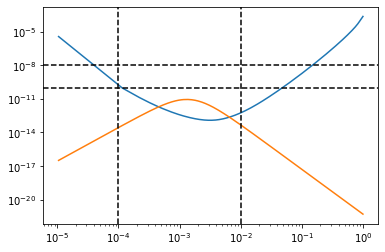

In [296]:
LISA_pd=pd.DataFrame(LISA_data,columns=["f","Omega"])
#my_signal=GW_signal(90,1000.5,100,1)
#Good_signal=np.any((my_signal[0]<0.03)) and  (np.any(0.003<my_signal[0])) and (np.any(10**(-10)<my_signal[1])) and (np.any(my_signal[1]<10**(-8)))
#print("The signal is",Good_signal)
plt.plot(LISA_pd["f"],LISA_pd["Omega"])

df=pd.read_csv("LISA_SCANS/total_scan.csv",index_col=[0])
df=df[df["SNR_Tnuc"]>200]

i=10
my_signal=GW_signal(df.iloc[i].Tnuc,df.iloc[i].alpha,df.iloc[i].beta,1)

Good_signal=np.any((my_signal[0]<0.03)) and  (np.any(0.003<my_signal[0])) and (np.any(10**(-10)<my_signal[1])) and (np.any(my_signal[1]<10**(-8)))
print("The signal is",Good_signal)
plt.plot(my_signal[0],my_signal[1])
#for i in range(len(df)):
    #my_signal=GW_signal(df.iloc[i].Tnuc,df.iloc[i].alpha,df.iloc[i].beta,1)
    #plt.plot(my_signal[0],my_signal[1])

plt.axhline(y=10**(-10),linestyle="--",c="k")
plt.axhline(y=10**(-8),linestyle="--",c="k")
plt.axvline(x=1e-4,linestyle="--",c="k")
plt.axvline(x=1e-2,linestyle="--",c="k")
#plt.legend()


plt.yscale("log")
plt.xscale("log")
plt.show()

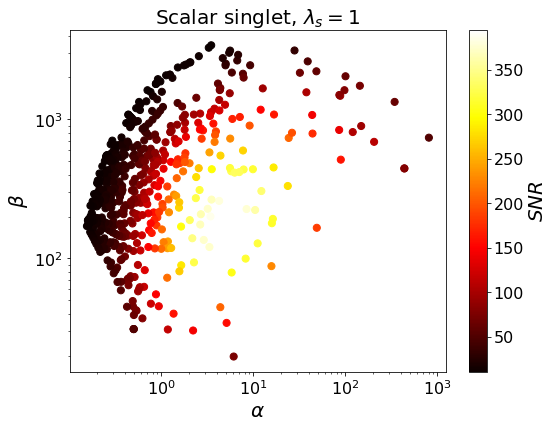

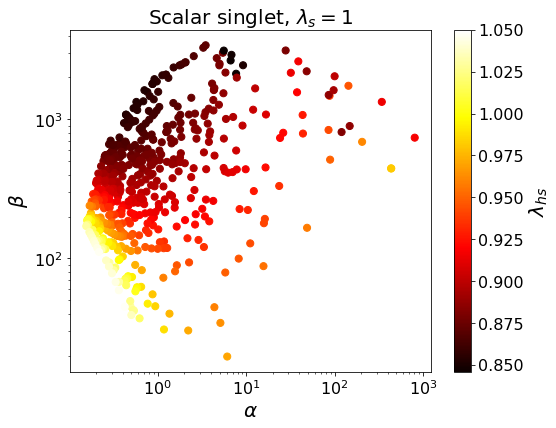

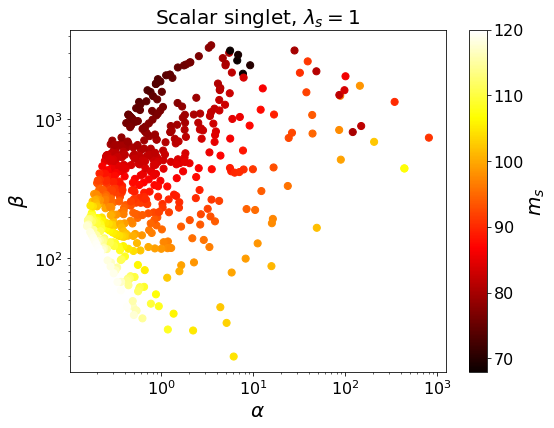

In [56]:
df=pd.read_csv("LISA_SCANS/total_scan.csv",index_col=[0])
df=df[df["SNR_Tnuc"]>10]


thick_size=16
label_size=20
figure = plt.gcf()
figure.set_size_inches(8, 6)
cm = plt.cm.get_cmap('hot')
plt.scatter(df["alpha"],df["beta"],c=df["SNR_Tnuc"],s=50,cmap=cm)

plt.ylabel("$\\beta$",size=label_size)
plt.xlabel("$\\alpha$",size=label_size)
cb=plt.colorbar()
cb.ax.tick_params(labelsize=thick_size)
cb.set_label(label='$SNR$', size=label_size, weight='bold')
plt.clim(min(df["SNR_Tnuc"]),max(df["SNR_Tnuc"]))
plt.title("Scalar singlet, $\lambda_s =$%0.f"%df["lams"].iloc[0],size=label_size)
plt.xticks(fontsize=thick_size)
plt.yticks(fontsize=thick_size)
plt.tight_layout()
plt.xscale("log")
plt.yscale("log")
#plt.savefig('LISA_SCANS/singlet_SNR.pdf', dpi=300)
plt.show()


thick_size=16
label_size=20
figure = plt.gcf()
figure.set_size_inches(8, 6)
cm = plt.cm.get_cmap('hot')
plt.scatter(df["alpha"],df["beta"],c=df["lammix"],s=50,cmap=cm)

plt.ylabel("$\\beta$",size=label_size)
plt.xlabel("$\\alpha$",size=label_size)
cb=plt.colorbar()
cb.ax.tick_params(labelsize=thick_size)
cb.set_label(label='$\lambda_{hs}$', size=label_size, weight='bold')
plt.clim(min(df["lammix"]),max(df["lammix"]))
plt.title("Scalar singlet, $\lambda_s =$%0.f"%df["lams"].iloc[0],size=label_size)
plt.xticks(fontsize=thick_size)
plt.yticks(fontsize=thick_size)
plt.tight_layout()
plt.xscale("log")
plt.yscale("log")
#plt.savefig('LISA_SCANS/singlet_SNR.pdf', dpi=300)
plt.show()


thick_size=16
label_size=20
figure = plt.gcf()
figure.set_size_inches(8, 6)
cm = plt.cm.get_cmap('hot')
plt.scatter(df["alpha"],df["beta"],c=df["ms"],s=50,cmap=cm)

plt.ylabel("$\\beta$",size=label_size)
plt.xlabel("$\\alpha$",size=label_size)
cb=plt.colorbar()
cb.ax.tick_params(labelsize=thick_size)
cb.set_label(label='$m_s$', size=label_size, weight='bold')
plt.clim(min(df["ms"]),max(df["ms"]))
plt.title("Scalar singlet, $\lambda_s =$%0.f"%df["lams"].iloc[0],size=label_size)
plt.xticks(fontsize=thick_size)
plt.yticks(fontsize=thick_size)
plt.tight_layout()
plt.xscale("log")
plt.yscale("log")
#plt.savefig('LISA_SCANS/singlet_SNR.pdf', dpi=300)
plt.show()

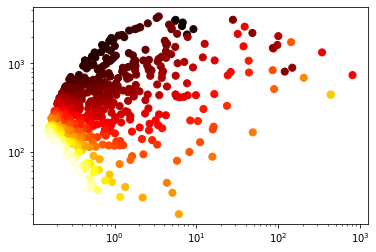

In [264]:
####If we inyect a signal what can we say about the particle physics model?

plt.scatter(df["alpha"],df["beta"],c=df["lammix"],s=50,cmap=cm)
plt.xscale("log")
plt.yscale("log")

In [270]:
df.describe()

,ms,lammix,lams,Action,Delta_p,Delta_rho,SNR_Tnuc,Tc,Tnuc,alpha,beta,d/dT(S_3/T),h_high,h_low,s_high,s_low,signal,num_trans
count,561.000000,561.000000,561.0,561.000000,5.610000e+02,5.610000e+02,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,5.610000e+02,561.000000,561.000000,5.610000e+02,561.000000,549.000000
mean,92.875854,0.921442,1.0,5158.997611,3.193676e+07,3.494296e+07,82.321586,86.283030,36.850093,7.681718,550.179661,21.882233,7.096262e-01,245.121060,137.147276,4.547043e-07,0.064171,3.023679
std,12.734478,0.051877,0.0,1561.470178,6.544695e+06,7.894608e+06,87.489805,7.895973,11.153498,47.904406,596.615704,34.478026,4.633090e+00,0.824572,3.212046,1.131011e-06,0.245276,0.152187
min,67.894737,0.845750,1.0,869.994582,1.681158e+07,1.693717e+07,10.040124,66.199056,6.214706,0.154777,19.718218,0.723429,-2.273620e-04,242.630114,130.377089,-3.617454e-06,0.000000,3.000000
25%,82.575758,0.880077,1.0,4127.308769,2.649151e+07,2.855410e+07,19.607817,80.098913,29.480418,0.295144,174.845413,3.712858,-1.137516e-05,244.657398,134.692694,-4.252622e-07,0.000000,3.000000
50%,91.052632,0.909000,1.0,5336.699215,3.138551e+07,3.395860e+07,51.677749,85.606493,38.118764,0.525526,332.291453,8.604449,9.733895e-07,245.366837,137.747017,6.134168e-07,0.000000,3.000000
75%,102.344828,0.955107,1.0,6346.038023,3.745958e+07,4.122729e+07,106.019297,92.726770,45.329377,1.369596,661.664388,22.236365,1.822850e-05,245.818332,139.775399,1.418813e-06,0.000000,3.000000
max,120.000000,1.050000,1.0,7907.604206,4.667890e+07,5.057054e+07,394.828687,101.105313,56.477226,807.103585,3406.487690,232.172968,4.170441e+01,245.999993,141.988888,2.675725e-06,1.000000,4.000000


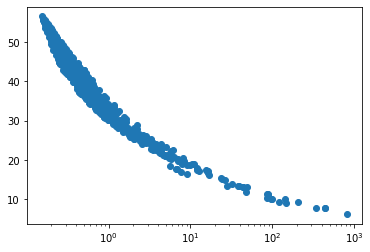

In [252]:
plt.scatter(df["alpha"],df["Tnuc"])
plt.xscale("log")


array([[<AxesSubplot:xlabel='alpha', ylabel='alpha'>,
        <AxesSubplot:xlabel='beta', ylabel='alpha'>,
        <AxesSubplot:xlabel='ms', ylabel='alpha'>,
        <AxesSubplot:xlabel='lammix', ylabel='alpha'>],
       [<AxesSubplot:xlabel='alpha', ylabel='beta'>,
        <AxesSubplot:xlabel='beta', ylabel='beta'>,
        <AxesSubplot:xlabel='ms', ylabel='beta'>,
        <AxesSubplot:xlabel='lammix', ylabel='beta'>],
       [<AxesSubplot:xlabel='alpha', ylabel='ms'>,
        <AxesSubplot:xlabel='beta', ylabel='ms'>,
        <AxesSubplot:xlabel='ms', ylabel='ms'>,
        <AxesSubplot:xlabel='lammix', ylabel='ms'>],
       [<AxesSubplot:xlabel='alpha', ylabel='lammix'>,
        <AxesSubplot:xlabel='beta', ylabel='lammix'>,
        <AxesSubplot:xlabel='ms', ylabel='lammix'>,
        <AxesSubplot:xlabel='lammix', ylabel='lammix'>]], dtype=object)

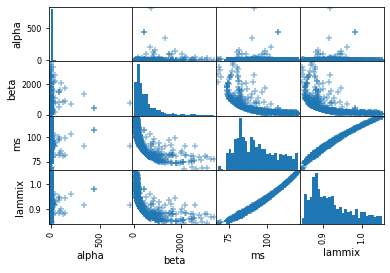

In [283]:
from pandas.plotting import scatter_matrix

#df = pd.DataFrame(np.random.randn(1000, 4), columns=["a", "b", "c", "d"])
df=pd.read_csv("LISA_SCANS/total_scan.csv",index_col=[0])
df=df[df["SNR_Tnuc"]>10]

df=df[["alpha","beta","ms","lammix"]]
scatter_matrix(df,hist_kwds={'bins':30},marker='+')
#scatter_matrix(df, alpha=0.2, figsize=(6, 6), diagonal="kde");

<AxesSubplot:>

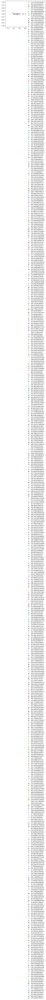

In [295]:
from pandas.plotting import radviz
#andrews_curves(df[["alpha","beta"]],"beta")

radviz(df[["alpha","beta","ms"]], "beta")

The signal is False


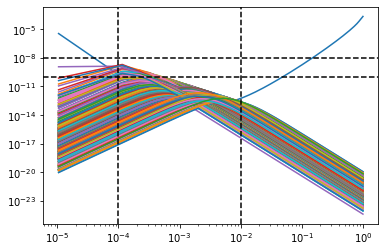

In [28]:
LISA_pd=pd.DataFrame(LISA_data,columns=["f","Omega"])
#my_signal=GW_signal(90,1000.5,100,1)
#Good_signal=np.any((my_signal[0]<0.03)) and  (np.any(0.003<my_signal[0])) and (np.any(10**(-10)<my_signal[1])) and (np.any(my_signal[1]<10**(-8)))
#print("The signal is",Good_signal)
plt.plot(LISA_pd["f"],LISA_pd["Omega"])



df=pd.read_csv("LISA_SCANS/total_scan.csv",index_col=[0])
df=df[df["SNR_Tnuc"]>10]

i=10
my_signal=GW_signal(df.iloc[i].Tnuc,df.iloc[i].alpha,df.iloc[i].beta,1)

Good_signal=np.any((my_signal[0]<0.03)) and  (np.any(0.003<my_signal[0])) and (np.any(10**(-10)<my_signal[1])) and (np.any(my_signal[1]<10**(-8)))
print("The signal is",Good_signal)
plt.plot(my_signal[0],my_signal[1])
for i in range(len(df)):
    my_signal=GW_signal(df.iloc[i].Tnuc,df.iloc[i].alpha,df.iloc[i].beta,1)
    plt.plot(my_signal[0],my_signal[1])

plt.axhline(y=10**(-10),linestyle="--",c="k")
plt.axhline(y=10**(-8),linestyle="--",c="k")
plt.axvline(x=1e-4,linestyle="--",c="k")
plt.axvline(x=1e-2,linestyle="--",c="k")
#plt.legend()


plt.yscale("log")
plt.xscale("log")
plt.show()

Text(0.5, 0, 'Tnuc')

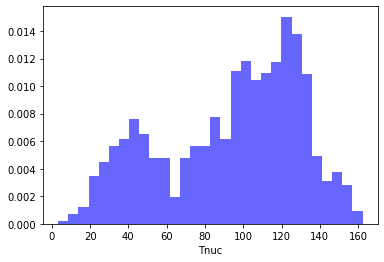

In [52]:
df=pd.read_csv("LISA_SCANS/total_scan.csv",index_col=[0])

plt.hist(df.Tnuc, bins=30, density=True, alpha=0.6, color='b')
plt.xlabel("Tnuc")

Text(0.5, 0, '$\\alpha$')

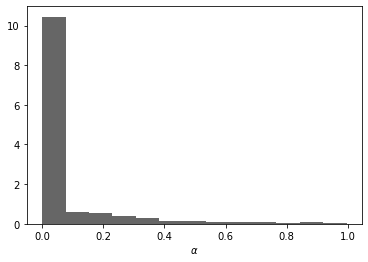

In [53]:
df=pd.read_csv("LISA_SCANS/total_scan.csv",index_col=[0])
df1=df[df["alpha"]<1]
plt.hist(df1.alpha, bins=13, density=True, alpha=0.6, color='k')
plt.xlabel("$\\alpha$")

(0.0, 100000.0)

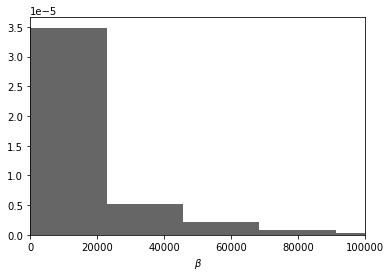

In [70]:
df=pd.read_csv("LISA_SCANS/total_scan.csv",index_col=[0])

plt.hist(df.beta, bins=100, density=True, alpha=0.6, color='k')
plt.xlabel("$\\beta$")
plt.xlim(0,1e5)

In [179]:
df=pd.read_csv("LISA_SCANS/total_scan.csv",index_col=[0])
df[df["SNR_Tnuc"]>10].describe()

,ms,lammix,lams,Action,Delta_p,Delta_rho,SNR_Tnuc,Tc,Tnuc,alpha,beta,d/dT(S_3/T),h_high,h_low,s_high,s_low,signal,num_trans
count,561.000000,561.000000,561.0,561.000000,5.610000e+02,5.610000e+02,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,5.610000e+02,561.000000,561.000000,5.610000e+02,561.000000,549.000000
mean,92.875854,0.921442,1.0,5158.997611,3.193676e+07,3.494296e+07,82.321586,86.283030,36.850093,7.681718,550.179661,21.882233,7.096262e-01,245.121060,137.147276,4.547043e-07,0.064171,3.023679
std,12.734478,0.051877,0.0,1561.470178,6.544695e+06,7.894608e+06,87.489805,7.895973,11.153498,47.904406,596.615704,34.478026,4.633090e+00,0.824572,3.212046,1.131011e-06,0.245276,0.152187
min,67.894737,0.845750,1.0,869.994582,1.681158e+07,1.693717e+07,10.040124,66.199056,6.214706,0.154777,19.718218,0.723429,-2.273620e-04,242.630114,130.377089,-3.617454e-06,0.000000,3.000000
25%,82.575758,0.880077,1.0,4127.308769,2.649151e+07,2.855410e+07,19.607817,80.098913,29.480418,0.295144,174.845413,3.712858,-1.137516e-05,244.657398,134.692694,-4.252622e-07,0.000000,3.000000
50%,91.052632,0.909000,1.0,5336.699215,3.138551e+07,3.395860e+07,51.677749,85.606493,38.118764,0.525526,332.291453,8.604449,9.733895e-07,245.366837,137.747017,6.134168e-07,0.000000,3.000000
75%,102.344828,0.955107,1.0,6346.038023,3.745958e+07,4.122729e+07,106.019297,92.726770,45.329377,1.369596,661.664388,22.236365,1.822850e-05,245.818332,139.775399,1.418813e-06,0.000000,3.000000
max,120.000000,1.050000,1.0,7907.604206,4.667890e+07,5.057054e+07,394.828687,101.105313,56.477226,807.103585,3406.487690,232.172968,4.170441e+01,245.999993,141.988888,2.675725e-06,1.000000,4.000000


<AxesSubplot:>

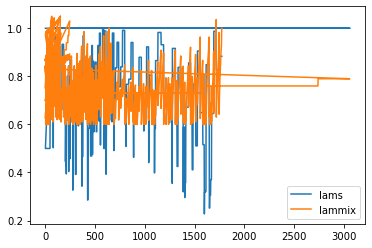

In [62]:
df=pd.read_csv("LISA_SCANS/total_scan_1.csv",index_col=[0])
df[["lams","lammix"]].plot()

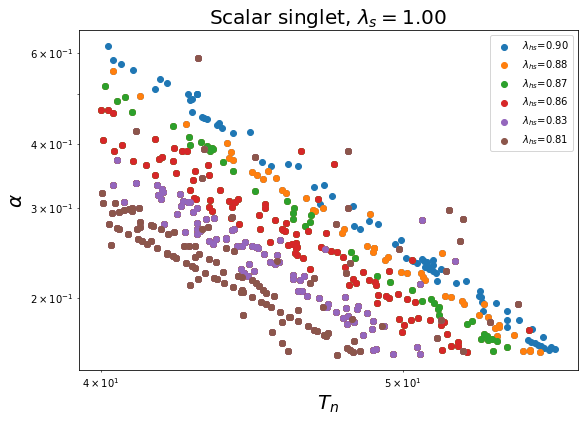

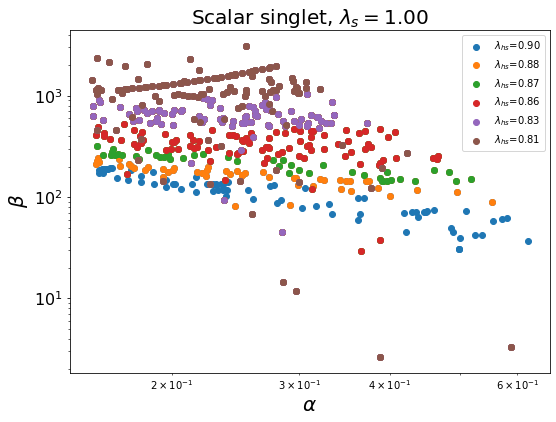

In [58]:
df=pd.read_csv("LISA_SCANS/total_scan_1.csv",index_col=[0])
df1=df[df["alpha"]>min(df[df["SNR_Tnuc"]>10].alpha)]
df1=df1[df1["Tnuc"]<56]
df1=df1[df1["Tnuc"]>40]

thick_size=16
label_size=20
figure = plt.gcf()
figure.set_size_inches(8, 6)
plt.scatter(df1[df1["lammix"]<1.1].Tnuc,df1[df1["lammix"]<1.1].alpha,
           label="$\\lambda_{hs}$=%0.2f"%np.mean(df1[df1["lammix"]<1.1].lammix))
plt.scatter(df1[df1["lammix"]<0.99].Tnuc,df1[df1["lammix"]<.99].alpha,
           label="$\\lambda_{hs}$=%0.2f"%np.mean(df1[df1["lammix"]<0.99].lammix))
plt.scatter(df1[df1["lammix"]<.96].Tnuc,df1[df1["lammix"]<.96].alpha,
           label="$\\lambda_{hs}$=%0.2f"%np.mean(df1[df1["lammix"]<.97].lammix))
plt.scatter(df1[df1["lammix"]<.93].Tnuc,df1[df1["lammix"]<.93].alpha,
            label="$\\lambda_{hs}$=%0.2f"%np.mean(df1[df1["lammix"]<.93].lammix))
plt.scatter(df1[df1["lammix"]<.88].Tnuc,df1[df1["lammix"]<.88].alpha,
            label="$\\lambda_{hs}$=%0.2f"%np.mean(df1[df1["lammix"]<.88].lammix))
plt.scatter(df1[df1["lammix"]<.85].Tnuc,df1[df1["lammix"]<.85].alpha,
            label="$\\lambda_{hs}$=%0.2f"%np.mean(df1[df1["lammix"]<.85].lammix))


plt.xlabel("$T_n$",size=label_size)
plt.ylabel("$\\alpha$",size=label_size)
plt.legend()
plt.title("Scalar singlet, $\lambda_s =$%0.2f"%df["lams"].iloc[500],size=label_size)
plt.xticks(fontsize=thick_size)
plt.yticks(fontsize=thick_size)
plt.tight_layout()
plt.xscale("log")
plt.yscale("log")
plt.show()



thick_size=16
label_size=20
figure = plt.gcf()
figure.set_size_inches(8, 6)
plt.scatter(df1[df1["lammix"]<1.1].alpha,df1[df1["lammix"]<1.1].beta,
           label="$\\lambda_{hs}$=%0.2f"%np.mean(df1[df1["lammix"]<1.1].lammix))
plt.scatter(df1[df1["lammix"]<0.99].alpha,df1[df1["lammix"]<.99].beta,
           label="$\\lambda_{hs}$=%0.2f"%np.mean(df1[df1["lammix"]<0.99].lammix))
plt.scatter(df1[df1["lammix"]<.96].alpha,df1[df1["lammix"]<.96].beta,
           label="$\\lambda_{hs}$=%0.2f"%np.mean(df1[df1["lammix"]<.97].lammix))
plt.scatter(df1[df1["lammix"]<.93].alpha,df1[df1["lammix"]<.93].beta,
            label="$\\lambda_{hs}$=%0.2f"%np.mean(df1[df1["lammix"]<.93].lammix))
plt.scatter(df1[df1["lammix"]<.88].alpha,df1[df1["lammix"]<.88].beta,
            label="$\\lambda_{hs}$=%0.2f"%np.mean(df1[df1["lammix"]<.88].lammix))
plt.scatter(df1[df1["lammix"]<.85].alpha,df1[df1["lammix"]<.85].beta,
            label="$\\lambda_{hs}$=%0.2f"%np.mean(df1[df1["lammix"]<.85].lammix))



plt.xlabel("$\\alpha$",size=label_size)
plt.ylabel("$\\beta$",size=label_size)
plt.legend()
plt.title("Scalar singlet, $\lambda_s =$%0.2f"%df["lams"].iloc[500],size=label_size)
plt.xticks(fontsize=thick_size)
plt.yticks(fontsize=thick_size)
plt.tight_layout()
plt.xscale("log")
plt.yscale("log")
plt.show()

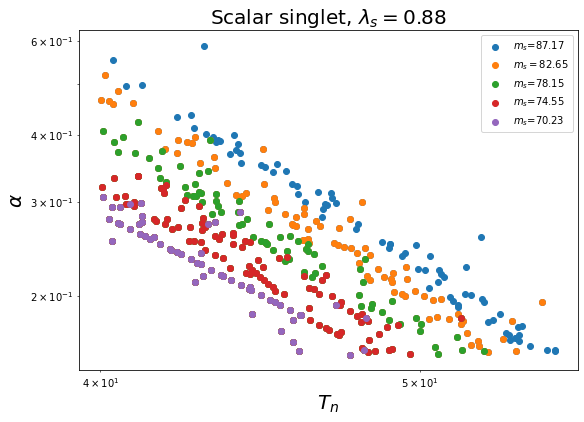

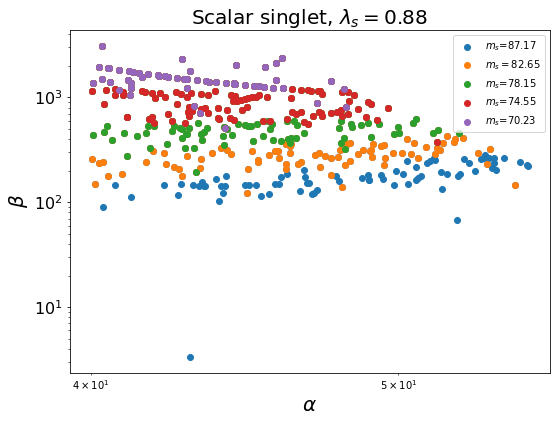

In [56]:
df=pd.read_csv("LISA_SCANS/total_scan_1.csv",index_col=[0])
df1=df[df["alpha"]>min(df[df["SNR_Tnuc"]>10].alpha)]
df1=df1[df1["Tnuc"]<56]
df1=df1[df1["Tnuc"]>40]

thick_size=16
label_size=20
figure = plt.gcf()
figure.set_size_inches(8, 6)
plt.scatter(df1[df1["ms"]<110].Tnuc,df1[df1["ms"]<110].alpha,
           label="$m_s$=%0.2f"%np.mean(df1[df1["ms"]<110].ms))
plt.scatter(df1[df1["ms"]<100].Tnuc,df1[df1["ms"]<100].alpha,
           label="$m_s=$%0.2f"%np.mean(df1[df1["ms"]<100].ms))
plt.scatter(df1[df1["ms"]<90].Tnuc,df1[df1["ms"]<90].alpha,
           label="$m_s$=%0.2f"%np.mean(df1[df1["ms"]<90].ms))
plt.scatter(df1[df1["ms"]<82].Tnuc,df1[df1["ms"]<82].alpha,
            label="$m_s$=%0.2f"%np.mean(df1[df1["ms"]<82].ms))
plt.scatter(df1[df1["ms"]<73].Tnuc,df1[df1["ms"]<73].alpha,
            label="$m_s$=%0.2f"%np.mean(df1[df1["ms"]<73].ms))


plt.xlabel("$T_n$",size=label_size)
plt.ylabel("$\\alpha$",size=label_size)
plt.legend()
plt.title("Scalar singlet, $\lambda_s =$%0.2f"%df["lams"].iloc[-1],size=label_size)
plt.xticks(fontsize=thick_size)
plt.yticks(fontsize=thick_size)
plt.tight_layout()
plt.xscale("log")
plt.yscale("log")
plt.show()




thick_size=16
label_size=20
figure = plt.gcf()
figure.set_size_inches(8, 6)
plt.scatter(df1[df1["ms"]<110].Tnuc,df1[df1["ms"]<110].beta,
           label="$m_s$=%0.2f"%np.mean(df1[df1["ms"]<110].ms))
plt.scatter(df1[df1["ms"]<100].Tnuc,df1[df1["ms"]<100].beta,
           label="$m_s=$%0.2f"%np.mean(df1[df1["ms"]<100].ms))
plt.scatter(df1[df1["ms"]<90].Tnuc,df1[df1["ms"]<90].beta,
           label="$m_s$=%0.2f"%np.mean(df1[df1["ms"]<90].ms))
plt.scatter(df1[df1["ms"]<82].Tnuc,df1[df1["ms"]<82].beta,
            label="$m_s$=%0.2f"%np.mean(df1[df1["ms"]<82].ms))
plt.scatter(df1[df1["ms"]<73].Tnuc,df1[df1["ms"]<73].beta,
            label="$m_s$=%0.2f"%np.mean(df1[df1["ms"]<73].ms))


plt.xlabel("$\\alpha$",size=label_size)
plt.ylabel("$\\beta$",size=label_size)
plt.legend()
plt.title("Scalar singlet, $\lambda_s =$%0.2f"%df["lams"].iloc[-1],size=label_size)
plt.xticks(fontsize=thick_size)
plt.yticks(fontsize=thick_size)
plt.tight_layout()
plt.xscale("log")
plt.yscale("log")
plt.show()


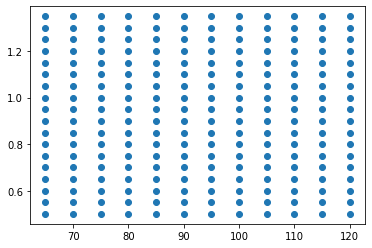

In [107]:
###Create a square grid of points (ms,lammix)
points=np.mgrid[65:123:5,0.5:1.4:0.05,0.2:1:0.1].T
#points=points.reshape(1,points.shape[0]*points.shape[1],2)[0]
#len(points),plt.scatter(points.T[0],points.T[1])
points=points.reshape(1,1,points.shape[0]*points.shape[1]*points.shape[2],3)[0][0]
which_ls=np.unique(points.T[-1])[-1]
plt.scatter(points[points.T[-1]==which_ls].T[0],points[points.T[-1]==which_ls].T[1])
plt.show()

In [112]:
df=[]

###SCAN all parameters
Ms=False
lhs=False
ls=False
#ls_random=np.random.uniform(0.049,1,size=len(points))
#pspoints=np.array((points.T[0],points.T[1],ls_random)).T
pspoints=points[:10]

count=0
for point in pspoints:
    count+=1
    m=model1(ms=(point[0] if Ms==False else Ms), lammix=(point[1] if lhs==False else lhs), lams=point[2] if ls==False else ls)
    print("ms=",m.ms,"lammix=",m.lammix,"lams=",m.lams)
    if isEWSB(m):
        try:
            alltrans = m.findAllTransitions()
            index=trans_index(m)
        except:
            print("ERROR FOUND!!")
            continue
        else:
            try:
                Tc=alltrans[index]['crit_trans']['Tcrit']
                Tn=alltrans[index]['Tnuc']
                Action=alltrans[index]['action']
                S_fun=lambda T: S_profile_simple(T,m)
                dS_TdT=gradAT(Tn,S_fun)
                print("dS_TdT", dS_TdT)
                Delta_rho=alltrans[index]['Delta_rho']
                alpha=alpha_GW(Tn,Delta_rho)
                print("alpha", alpha)
                beta=beta_GW(Tn,dS_TdT)
                print("beta=",beta)
                SNR=SNR_GW(Tn,alpha,beta,1)
                print("SNR is ready",SNR)
                phi_stable=alltrans[index]["low_vev"]
                phi_meta=alltrans[index]["high_vev"]
                vwall=1
                my_signal=GW_signal(Tn,alpha,beta,vwall)
                print("signal is,",my_signal)
                Good_signal=np.any((my_signal[0]<0.03)) and  (np.any(0.003<my_signal[0])) and (np.any(10**(-10)<my_signal[1])) and (np.any(my_signal[1]<10**(-8)))
                print("signal is ", Good_signal)
                df.append({'ms': m.ms, 'lammix':m.lammix,'lams':m.lams,
                           'num_trans':len(alltrans),
                            'Tc': Tc, 'Tnuc': Tn, 
                            'Action': Action,
                            "d/dT(S_3/T)":dS_TdT,
                            "Delta_p": alltrans[index]['Delta_p'],
                            "Delta_rho": Delta_rho,
                            "alpha":alpha,
                            "beta": beta,
                            "h_high":phi_meta[0],
                            "h_low":phi_stable[0],
                            "s_high":phi_meta[1],
                            "s_low":phi_stable[1],
                            "SNR_Tnuc": SNR,
                            "signal":Good_signal})          
            except:
                print("ERROR FOUND 2!!")
                continue
                

ms= 65.0 lammix= 0.5 lams= 0.2
ms= 70.0 lammix= 0.5 lams= 0.2
ms= 75.0 lammix= 0.5 lams= 0.2
Tracing phase starting at x = [ 2.46000001e+02 -1.43932234e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................
Tracing phase starting at x = [-3.99711744e-06  2.13014719e+02] ; t = 121.78513581757312
Tracing minimum down
traceMinimum t0 = 121.785
.........................
Tracing minimum up
traceMinimum t0 = 121.785
............................................
Tracing phase starting at x = [1.13958920e-06 1.97661248e+02] ; t = 205.75702122663586
Tracing minimum down
traceMinimum t0 = 205.757
.........................
Tracing minimum up
traceMinimum t0 = 205.757
......................................................................................................................................................................
Tracing phase starting at x = [1.33938455e-05 2.56278141e+01] ; t = 427.80176896703614
Tracing minimum down
traceMin

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 80.0 lammix= 0.5 lams= 0.2
Tracing phase starting at x = [2.46000000e+02 1.30049011e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/helper_functions.py:224: RuntimeWarning: invalid value encountered in add
  ytemp = y+b21*dt*dydt
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:504: RuntimeWarning: invalid value encountered in less
  elif (abs(y1 - np.array([self.phi_metaMin,0])) < 3*epsabs).all():


........................................................................................
Tracing phase starting at x = [-4.18528718e-07  2.02862677e+02] ; t = 127.22738586831541
Tracing minimum down
traceMinimum t0 = 127.227
............................
Tracing minimum up
traceMinimum t0 = 127.227
..........................................
Tracing phase starting at x = [-4.90217390e-06  1.88382658e+02] ; t = 201.6404857474336
Tracing minimum down
traceMinimum t0 = 201.64
..........................
Tracing minimum up
traceMinimum t0 = 201.64
.................................................................................................................
Tracing phase starting at x = [-1.44629228e-05  2.77712540e+01] ; t = 409.52590418222906
Tracing minimum down
traceMinimum t0 = 409.526
..........................................................................................................................
Tracing minimum up
traceMinimum t0 = 409.526
...................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.
Maximum number of deformation iterations reached.


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


Maximum number of deformation iterations reached.
Tunneling from phase 4 to phase 3 at T=412.7037
high_vev = [ 1.09583331e-05 -5.50222145e-02]
low_vev = [7.28921503e-05 3.36805416e-01]
Maximum number of deformation iterations reached.
ERROR FOUND!!
ms= 85.0 lammix= 0.5 lams= 0.2
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................................................
Tracing phase starting at x = [-3.16410860e-06  1.91400524e+02] ; t = 132.6221631876699
Tracing minimum down
traceMinimum t0 = 132.622
............................
Tracing minimum up
traceMinimum t0 = 132.622
.......................................
Tracing phase starting at x = [-4.90592653e-06  1.77923989e+02] ; t = 197.10533975908805
Tracing minimum down
traceMinimum t0 = 197.105
..............................
Tracing minimum up
traceMinimum t0 = 197.105
..................................................

Tracing phase starting at x = [2.46000001e+02 9.63719730e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................................................................................
Tracing phase starting at x = [8.10598878e-06 1.45607634e+02] ; t = 148.5831397511726
Tracing minimum down
traceMinimum t0 = 148.583
......................................
Tracing minimum up
traceMinimum t0 = 148.583
..................................................................................................................................
Tracing phase starting at x = [-1.06096992e-05  9.59546442e+00] ; t = 315.99157879088136
Tracing minimum down
traceMinimum t0 = 315.992
....................................................................................................................................
Tracing minimum up
traceMinimum t0 = 315.992
..............................................................................................
Tr

In [ ]:
%%time
#with lamhs bound
### -----RANDOM SCAN---- all parameters
num_points=500

df=[]

for point in range(num_points):
    Ms_random=np.random.uniform(65,120)
    ls_random=np.random.uniform(0.049,1)
    lhs_max=find_lammix_max(Ms_random,ls_random)
    lhs_random=np.random.uniform(0.049,lhs_max)
    m=model1(ms=Ms_random, lammix=lhs_random, lams=ls_random)
    print("ms=",m.ms,"lammix=",m.lammix,"lams=",m.lams)
    if isEWSB(m):
        try:
            alltrans = m.findAllTransitions()
            index=trans_index(m)
        except:
            print("ERROR FOUND!!")
            continue
        else:
            try:
                Tc=alltrans[index]['crit_trans']['Tcrit']
                Tn=alltrans[index]['Tnuc']
                Action=alltrans[index]['action']
                S_fun=lambda T: S_profile_simple(T,m)
                dS_TdT=gradAT(Tn,S_fun)
                print("dS_TdT", dS_TdT)
                Delta_rho=alltrans[index]['Delta_rho']
                alpha=alpha_GW(Tn,Delta_rho)
                print("alpha", alpha)
                beta=beta_GW(Tn,dS_TdT)
                print("beta=",beta)
                SNR=SNR_GW(Tn,alpha,beta,1)
                print("SNR is ready",SNR)
                phi_stable=alltrans[index]["low_vev"]
                phi_meta=alltrans[index]["high_vev"]
                vwall=1
                my_signal=GW_signal(Tn,alpha,beta,vwall)
                print("signal is,",my_signal)
                Good_signal=np.any((my_signal[0]<0.03)) and  (np.any(0.003<my_signal[0])) and (np.any(10**(-10)<my_signal[1])) and (np.any(my_signal[1]<10**(-8)))
                print("signal is ", Good_signal)
                df.append({'ms': m.ms, 'lammix':m.lammix,'lams':m.lams,
                           'num_trans':len(alltrans),
                            'Tc': Tc, 'Tnuc': Tn, 
                            'Action': Action,
                            "d/dT(S_3/T)":dS_TdT,
                            "Delta_p": alltrans[index]['Delta_p'],
                            "Delta_rho": Delta_rho,
                            "alpha":alpha,
                            "beta": beta,
                            "h_high":phi_meta[0],
                            "h_low":phi_stable[0],
                            "s_high":phi_meta[1],
                            "s_low":phi_stable[1],
                            "SNR_Tnuc": SNR,
                            "signal":Good_signal})          
            except:
                print("ERROR FOUND 2!!")
                continue
   


pd.DataFrame(df).to_csv("LISA_SCANS/global_scan_random/global_scan_random_13.csv")

ms= 77.90235257680297 lammix= 0.16051973813675624 lams= 0.6689803180128868
Tracing phase starting at x = [2.45999999e+02 1.66578882e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................................................................................................................................................
Tracing phase starting at x = [ 6.55584138e-05 -5.07495107e-06] ; t = 169.31017047562275
Tracing minimum down
traceMinimum t0 = 169.31
...........................
Tracing minimum up
traceMinimum t0 = 169.31
................
ERROR FOUND 2!!
ms= 66.9769494090315 lammix= 0.6365103541245531 lams= 0.5222124465689948
Tracing phase starting at x = [2.46000000e+02 9.09113221e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................................
Tracing phase starting at x = [2.50930332e-06 1.64849435e+02] ; t = 106.88427173353139
Tracing minimum d

........................
Tracing minimum up
traceMinimum t0 = 240.501
..................................................................................................................................
Tracing phase starting at x = [-5.58689184e-07  1.13681931e+01] ; t = 331.2824396074632
Tracing minimum down
traceMinimum t0 = 331.282
...................................................................................................
Tracing minimum up
traceMinimum t0 = 331.282
....................................................................................
Tracing phase starting at x = [1.87079638e-05 1.25747313e-03] ; t = 332.9751309917623
Tracing minimum down
traceMinimum t0 = 332.975
...............................
Tracing minimum up
traceMinimum t0 = 332.975
......................
Tracing phase starting at x = [7.96499886e-06 1.54505906e+02] ; t = 35.601336279748146
Tracing minimum down
traceMinimum t0 = 35.6013
........................................
Tracing minimum up
traceMi

.........................
Tracing minimum up
traceMinimum t0 = 169.95
...............................................
ERROR FOUND 2!!
ms= 107.67990251921597 lammix= 0.9458053192774633 lams= 0.7027767103402118
Tracing phase starting at x = [2.45999999e+02 1.14453932e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................................
Tracing phase starting at x = [-2.90295578e-06  1.50225511e+02] ; t = 124.34334431807741
Tracing minimum down
traceMinimum t0 = 124.343
.....................
Tracing minimum up
traceMinimum t0 = 124.343
........................................................
Tracing phase starting at x = [8.09420555e-06 1.01945994e+02] ; t = 278.1575087497584
Tracing minimum down
traceMinimum t0 = 278.158
........................
Tracing minimum up
traceMinimum t0 = 278.158
..................................................................................................
Tracing phas

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.70846605e-06 1.55105783e+02]
low_vev = [2.45999999e+02 1.14453932e-06]
Path deformation converged. 36 steps. fRatio = 1.82334e-02
Path deformation converged. 12 steps. fRatio = 1.91338e-02
Path deformation converged. 1 steps. fRatio = 4.32180e-02
ERROR FOUND 2!!
ms= 96.19315141625691 lammix= 0.35432260570623475 lams= 0.5604410549781698
Tracing phase starting at x = [2.46000000e+02 1.93599471e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................................................................................................................................................................................................
Tracing phase starting at x = [3.48661702e-05 1.54385360e-05] ; t = 167.68077221014903
Tracing minimum down
traceMinimum t0 = 167.681
........................................
Tracing minimum up
traceMinimum t0 = 167.681
...............
ERROR FOU

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 4_1 at T=270.9144
high_vev = [-9.40808324e-05  1.10991390e+02]
low_vev = [-6.14276373e-06  1.12992526e+02]
Path deformation converged. 1 steps. fRatio = 4.74267e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 4_1 at T=270.9149
high_vev = [-1.01151302e-05  1.10991122e+02]
low_vev = [1.02644128e-05 1.12992247e+02]
Path deformation converged. 1 steps. fRatio = 1.25948e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 4_1 at T=270.9154
high_vev = [-9.49412218e-05  1.10990849e+02]
low_vev = [6.16956362e-06 1.12991971e+02]
Path deformation converged. 1 steps. fRatio = 3.31933e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 4_1 at T=270.9159
high_vev = [-5.79739201e-05  1.10990640e+02]
low_vev = [-7.01594611e-06  1.12991701e+02]
Path deformation converged. 1 steps. fRatio = 1.89197e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 4_1 at T=270.9164
high_vev = [-9.61853681e-05  1.10990330e+02]
low_vev = [-9.60749499e-07  1.12991431e+02]
Path deformation converged. 1 steps. fRatio = 2.94054e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 4_1 to phase 0 at T=31.05867
high_vev = [3.45963824e-04 1.59083558e+02]
low_vev = [2.45747526e+02 1.82071675e-06]
Path deformation converged. 39 steps. fRatio = 1.83644e-02
Path deformation converged. 13 steps. fRatio = 1.02205e-02
Path deformation converged. 10 steps. fRatio = 1.78196e-02
Path deformation converged. 1 steps. fRatio = 1.18009e-02
Tunneling from phase 4_1 to phase 0 at T=31.05917
high_vev = [3.36319005e-04 1.59083556e+02]
low_vev = [2.45747507e+02 1.75381182e-06]
Path deformation converged. 39 steps. fRatio = 1.83627e-02
Path deformation converged. 13 steps. fRatio = 1.02203e-02
Path deformation converged. 7 steps. fRatio = 1.45845e-02
Path deformation converged. 1 steps. fRatio = 6.29656e-03
Tunneling from phase 4_1 to phase 0 at T=67.12617
high_vev = [2.06898690e-05 1.58462926e+02]
low_vev = [ 2.39086714e+02 -4.41834611e-06]
Path deformation converged. 44 steps. fRatio = 1.84564e-02
Path deformation converged. 16 steps. fRatio = 1.61460e-02
Path d

Path deformation converged. 16 steps. fRatio = 1.77808e-02
Path deformation converged. 7 steps. fRatio = 1.05965e-02
Path deformation converged. 1 steps. fRatio = 5.15066e-04
Tunneling from phase 1 to phase 0 at T=126.2997
high_vev = [-1.73666318e-05  1.10429372e+02]
low_vev = [1.81548073e+02 3.13518524e-06]
Path deformation converged. 45 steps. fRatio = 1.89658e-02
Path deformation converged. 16 steps. fRatio = 1.77390e-02
Path deformation converged. 1 steps. fRatio = 3.79620e-02
Tunneling from phase 1 to phase 0 at T=126.1305
high_vev = [-1.5837885e-05  1.1045976e+02]
low_vev = [ 1.81865478e+02 -4.15023924e-06]
Path deformation converged. 45 steps. fRatio = 1.93194e-02
Path deformation converged. 16 steps. fRatio = 1.88128e-02
Path deformation converged. 1 steps. fRatio = 3.88498e-02
Tunneling from phase 1 to phase 0 at T=126.2071
high_vev = [-7.10137308e-06  1.10446003e+02]
low_vev = [ 1.81721867e+02 -2.47072288e-06]
Path deformation converged. 45 steps. fRatio = 1.91599e-02
Path de

Path deformation converged. 36 steps. fRatio = 1.79109e-02
Path deformation converged. 9 steps. fRatio = 1.96571e-02
Path deformation converged. 1 steps. fRatio = 1.20492e-02
Tunneling from phase 4_1 to phase 0 at T=80.85144
high_vev = [-2.35087237e-06  1.26860182e+02]
low_vev = [2.32561139e+02 8.04045520e-06]
Path deformation converged. 36 steps. fRatio = 1.76462e-02
Path deformation converged. 9 steps. fRatio = 1.95906e-02
Path deformation converged. 1 steps. fRatio = 1.18465e-02
Tunneling from phase 4_1 to phase 0 at T=80.85094
high_vev = [-2.94402984e-06  1.26860213e+02]
low_vev = [2.32561441e+02 1.91210092e-08]
Path deformation converged. 36 steps. fRatio = 1.76421e-02
Path deformation converged. 9 steps. fRatio = 1.95892e-02
Path deformation converged. 1 steps. fRatio = 1.18377e-02
dS_TdT 7.642022110412654
alpha 0.0355120764763829
beta= 617.8684585909202
SNR is ready 0.042194472876859616
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=118.4449
high_vev = [8.93720076e-06 1.09942297e+02]
low_vev = [ 1.94484050e+02 -1.65415118e-06]
Path deformation converged. 49 steps. fRatio = 1.97970e-02
Path deformation converged. 13 steps. fRatio = 3.74523e-03
Path deformation converged. 5 steps. fRatio = 1.86438e-02
Path deformation converged. 1 steps. fRatio = 1.48497e-03
Tunneling from phase 1 to phase 0 at T=118.4454
high_vev = [-5.58299926e-05  1.09942220e+02]
low_vev = [ 1.94483268e+02 -1.68619462e-06]
Path deformation converged. 49 steps. fRatio = 1.97960e-02
Path deformation converged. 13 steps. fRatio = 3.77607e-03
Path deformation converged. 5 steps. fRatio = 1.87451e-02
Path deformation converged. 1 steps. fRatio = 1.47699e-03
Tunneling from phase 1 to phase 0 at T=126.9364
high_vev = [-1.59946383e-06  1.08565687e+02]
low_vev = [1.79696667e+02 4.51425323e-06]
Path deformation converged. 50 steps. fRatio = 1.91522e-02
Path deformation converged. 16 steps. fRatio = 1.45542e-02
Path de

........................
Tracing minimum up
traceMinimum t0 = 169.151
......................
ERROR FOUND 2!!
ms= 104.03794665296601 lammix= 0.6637495905169223 lams= 0.673742898749045
Tracing phase starting at x = [ 2.46000000e+02 -3.12754133e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................................................
Tracing phase starting at x = [-1.17238329e-05  1.04602035e+02] ; t = 143.15001145773712
Tracing minimum down
traceMinimum t0 = 143.15
....................................................................
Tracing minimum up
traceMinimum t0 = 143.15
...................................................................................................................................
Tracing phase starting at x = [-5.33133369e-07  2.24822490e-05] ; t = 260.68257933321553
Tracing minimum down
traceMinimum t0 = 260.683
.............................................
Tracing minimum up
traceM

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=288.92
high_vev = [-4.32876033e-06  9.59716530e+01]
low_vev = [-7.55518885e-06  9.70699723e+01]
Path deformation converged. 1 steps. fRatio = 8.02031e-05
Tunneling from phase 2 to phase 1 at T=288.9205
high_vev = [1.04751219e-05 9.59713119e+01]
low_vev = [-7.55368804e-06  9.70696291e+01]
Path deformation converged. 1 steps. fRatio = 3.20476e-05
Tunneling from phase 2 to phase 1 at T=288.9235
high_vev = [-9.95618157e-07  9.59693225e+01]
low_vev = [-7.96341121e-06  9.70676630e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.50617e-05
Tunneling from phase 2 to phase 1 at T=288.9249
high_vev = [-1.43565357e-06  9.59683224e+01]
low_vev = [-8.22665510e-06  9.70666826e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 6.94897e-05
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.84620960e-06 1.53956484e+02]
low_vev = [2.46000000e+02 9.74260416e-07]
Path deformation converged. 31 steps. fRatio = 1.66221e-02
Path deformation converged. 10 steps. fRatio = 1.96288e-02
Path deformation converged. 1 steps. fRatio = 2.22535e-02
ERROR FOUND 2!!
ms= 67.36361214370997 lammix= 0.4279259403428266 lams= 0.21962537779432134
Tracing phase starting at x = [ 2.45999998e+02 -1.69896636e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................
Tracing phase starting at x = [-2.69914946e-06  1.90188093e+02] ; t = 121.39414778943762
Tracing minimum down
traceMinimum t0 = 121.394
.......................................
Tracing minimum up
traceMinimum t0 = 121.394
...........................................
Tracing phase starting at x = [-8.78638014e-06  1.72180271e+02] ; t = 209.73706674189984
Tracing minimum 

.....................................................................................................................................................................................................................................................
Tracing phase starting at x = [-9.85077976e-06  2.00689601e-05] ; t = 168.26684233230156
Tracing minimum down
traceMinimum t0 = 168.267
.....................................
Tracing minimum up
traceMinimum t0 = 168.267
..........
ERROR FOUND 2!!
ms= 74.74447850223144 lammix= 0.25127763886202314 lams= 0.08464455345822772
Tracing phase starting at x = [2.46000001e+02 1.51783892e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................................................................................................
ERROR FOUND 2!!
ms= 82.39744649214963 lammix= 0.643447392379675 lams= 0.8680514075293924
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.22048e-05
Tunneling from phase 2 to phase 1 at T=239.9234
high_vev = [-8.15600650e-06  6.79924525e+01]
low_vev = [6.87214548e-06 6.90601970e+01]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.55463e-05
Tunneling from phase 1 to phase 0 at T=124.0416
high_vev = [-4.63315384e-04  1.13929479e+02]
low_vev = [1.85326533e+02 1.44275144e-06]
Path deformation converged. 45 steps. fRatio = 1.87098e-02
Path deformation converged. 23 steps. fRatio = 1.52257e-02
Path deformation converged. 13 steps. fRatio = 1.50308e-02
Path deformation converged. 1 steps. fRatio = 8.40625e-03
ERROR FOUND 2!!
ms= 93.42217515527841 lammix= 0.6041258280302984 lams= 0.6043085845267501
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................................................................
Tracing phase starting at x = [-1.20905263e-05  1.15313575e+02] ; t = 137.86486688592828
Tracing minimum down
traceMinimum t0 = 137.865
.......................................................
Tracing minimum up
traceMinimum t0 = 137.865
..............................

Tracing phase starting at x = [2.46000000e+02 1.81344848e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................................................................................................................
ERROR FOUND 2!!
ms= 67.02650764036392 lammix= 0.1236704495340656 lams= 0.8833291982386002
Tracing phase starting at x = [2.46000000e+02 1.40699807e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................................................................................................................................................................................................
Tracing phase starting at x = [-3.52646190e-05  4.82581297e-06] ; t = 169.62757128735132
Tracing minimum down
traceMinimum t0 = 169.628
.........................
Tracing minimum up
traceMinimum t0 = 169.628
................
ERROR FOUND 2!!
ms= 68.65590564419087 lammix= 0.3629

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.12016e-04
ERROR FOUND 2!!
ms= 69.50807032696956 lammix= 0.3952205604217963 lams= 0.5179655063650691
Tracing phase starting at x = [2.46000000e+02 3.26222918e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................................................
ERROR FOUND 2!!
ms= 104.16442850434763 lammix= 0.25332977677400453 lams= 0.2247839212024555
Tracing phase starting at x = [2.45999999e+02 1.14453932e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................................................................................................................................................
Tracing phase starting at x = [-1.85549655e-05  4.27335896e-06] ; t = 168.47594833815074
Tracing minimum down
traceMinimum t0 = 168.476
........................
Tracing minimum up
traceMinimum t0 = 168.476
...............

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=267.9861
high_vev = [-2.18629196e-05  6.75285517e+01]
low_vev = [7.18697405e-06 6.82829405e+01]
Path deformation converged. 1 steps. fRatio = 1.27219e-04
Tunneling from phase 1 to phase 0 at T=68.4961
high_vev = [2.04046313e-05 1.28663985e+02]
low_vev = [2.38708395e+02 2.26673995e-06]
Path deformation converged. 37 steps. fRatio = 1.92286e-02
Path deformation converged. 13 steps. fRatio = 9.85445e-03
Path deformation converged. 1 steps. fRatio = 7.71824e-02
Tunneling from phase 1 to phase 0 at T=68.4966
high_vev = [6.27814975e-06 1.28663967e+02]
low_vev = [2.38708190e+02 2.20808969e-06]
Path deformation converged. 37 steps. fRatio = 1.92210e-02
Path deformation converged. 13 steps. fRatio = 9.85774e-03
Path deformation converged. 1 steps. fRatio = 7.69984e-02
Tunneling from phase 1 to phase 0 at T=96.95674
high_vev = [-3.34504005e-06  1.26951206e+02]
low_vev = [2.20060125e+02 9.14893439e-06]
Path deformation converged. 45 steps. fRatio = 1.81807e-

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.08826e-04
Tunneling from phase 1 to phase 0 at T=87.91973
high_vev = [-2.23511272e-05  1.58552636e+02]
low_vev = [ 2.28045943e+02 -4.15071992e-06]
Path deformation converged. 42 steps. fRatio = 1.71284e-02
Path deformation converged. 16 steps. fRatio = 1.41867e-02
Path deformation converged. 6 steps. fRatio = 1.40831e-02
Path deformation converged. 1 steps. fRatio = 1.60887e-03
Tunneling from phase 1 to phase 0 at T=87.92023
high_vev = [9.70440236e-06 1.58552601e+02]
low_vev = [ 2.28045582e+02 -4.28493399e-06]
Path deformation converged. 42 steps. fRatio = 1.71279e-02
Path deformation converged. 16 steps. fRatio = 1.41932e-02
Path deformation converged. 6 steps. fRatio = 1.41553e-02
Path deformation converged. 1 steps. fRatio = 1.60917e-03
Tunneling from phase 1 to phase 0 at T=102.3246
high_vev = [-4.05043045e-06  1.57384460e+02]
low_vev = [2.15407205e+02 1.80435223e-06]
Path deformation converged. 46 steps. fRatio = 1.86808e-02
Path def

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=130.2117
high_vev = [-1.09153852e-04  1.09207253e+02]
low_vev = [ 1.74316760e+02 -1.38979218e-05]
Path deformation converged. 39 steps. fRatio = 1.89086e-02
Path deformation converged. 21 steps. fRatio = 1.05329e-02
Path deformation converged. 10 steps. fRatio = 1.68954e-02
Path deformation converged. 1 steps. fRatio = 1.27157e-02
Tunneling from phase 1 to phase 0 at T=130.2122
high_vev = [2.16927337e-05 1.09207160e+02]
low_vev = [ 1.74315725e+02 -7.95309873e-06]
Path deformation converged. 39 steps. fRatio = 1.89096e-02
Path deformation converged. 21 steps. fRatio = 1.05228e-02
Path deformation converged. 10 steps. fRatio = 1.75571e-02
Path deformation converged. 1 steps. fRatio = 1.32774e-02
Tunneling from phase 1 to phase 0 at T=130.2127
high_vev = [4.31387990e-05 1.09207064e+02]
low_vev = [ 1.74314698e+02 -3.69837565e-06]
Path deformation converged. 39 steps. fRatio = 1.89103e-02
Path deformation converged. 21 steps. fRatio = 1.05118e-02
Path 

Path deformation converged. 36 steps. fRatio = 1.88496e-02
Path deformation converged. 15 steps. fRatio = 1.66695e-02
Path deformation converged. 1 steps. fRatio = 8.58048e-02
dS_TdT 3305.8899833675205
alpha 0.0001941369926761234
beta= 537583.1129409907
SNR is ready 5.707529436254634e-23
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [4.65446333e-45 6.19508586e-42 4.31049672e-41 ... 3.86030090e-30
  3.86148179e-30 3.86266290e-30]]
signal is  False
ms= 84.73812312366519 lammix= 0.24416940102537948 lams= 0.14108554437618848
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................................................................................................................................................................................
Tracing phase starting at x = [3.17006142e-05 4.26758432e

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=297.5549
high_vev = [-7.40408926e-06  8.82958214e+01]
low_vev = [1.04548014e-05 9.13348835e+01]
Path deformation converged. 1 steps. fRatio = 1.14347e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/env

Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.67985787e-06 1.51923846e+02]
low_vev = [ 2.46000000e+02 -2.12283791e-06]
Path deformation converged. 45 steps. fRatio = 1.99788e-02
Path deformation converged. 16 steps. fRatio = 1.42857e-02
Path deformation converged. 1 steps. fRatio = 4.71317e-02
ERROR FOUND 2!!
ms= 83.68247816276481 lammix= 0.25053540505031147 lams= 0.0664922356353972
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................................................................................................................................................................................
Tracing phase starting at x = [-1.01425774e-05  2.75752655e-05] ; t = 168.08288436454882
Tracing minimum down
traceMinimum t0 = 168.083
..........................
Tracing minimum up
traceMinimum t0 = 168.083
..............................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 9.80124e-05
Tunneling from phase 2 to phase 1 at T=290.9212
high_vev = [-3.32490393e-05  8.10436736e+01]
low_vev = [9.38376041e-06 8.23644595e+01]
Path deformation converged. 1 steps. fRatio = 9.49988e-05


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=290.9217
high_vev = [-3.63266156e-05  8.10432544e+01]
low_vev = [6.17868419e-06 8.23640490e+01]
Path deformation converged. 1 steps. fRatio = 1.24177e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=290.9222
high_vev = [-3.53870619e-05  8.10428288e+01]
low_vev = [1.23759910e-05 8.23636481e+01]
Path deformation converged. 1 steps. fRatio = 1.15786e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-3.43647764e-06  1.45043209e+02]
low_vev = [2.46000000e+02 9.84062717e-07]
Path deformation converged. 40 steps. fRatio = 1.94097e-02
Path deformation converged. 11 steps. fRatio = 1.88678e-02
Path deformation converged. 1 steps. fRatio = 2.40268e-02
ERROR FOUND 2!!
ms= 84.99846979470058 lammix= 0.42605787506165443 lams= 0.4376117779761482
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................................................................
ERROR FOUND 2!!
ms= 116.67152192860573 lammix= 0.3901890945166862 lams= 0.6726934524197639
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=264.0334
high_vev = [8.03493094e-05 8.10815218e+01]
low_vev = [1.31154528e-06 8.29330468e+01]
Path deformation converged. 1 steps. fRatio = 1.70998e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=264.034
high_vev = [8.17588724e-05 8.10810759e+01]
low_vev = [-2.57781226e-05  8.29326047e+01]
Path deformation converged. 1 steps. fRatio = 1.31487e-04
Tunneling from phase 1 to phase 0 at T=89.98941
high_vev = [1.47984624e-05 1.34289180e+02]
low_vev = [2.26051322e+02 7.22266176e-06]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 49 steps. fRatio = 1.92640e-02
Path deformation converged. 17 steps. fRatio = 9.80834e-03
Path deformation converged. 5 steps. fRatio = 1.60875e-02
Path deformation converged. 1 steps. fRatio = 2.13446e-03
Tunneling from phase 1 to phase 0 at T=89.98991
high_vev = [-1.59435000e-05  1.34289148e+02]
low_vev = [2.26050929e+02 7.16411451e-06]
Path deformation converged. 49 steps. fRatio = 1.92637e-02
Path deformation converged. 17 steps. fRatio = 9.81595e-03
Path deformation converged. 5 steps. fRatio = 1.62172e-02
Path deformation converged. 1 steps. fRatio = 2.15406e-03
Tunneling from phase 1 to phase 0 at T=89.99041
high_vev = [1.40439687e-05 1.34289113e+02]
low_vev = [2.26050536e+02 7.37469101e-06]
Path deformation converged. 49 steps. fRatio = 1.92633e-02
Path deformation converged. 17 steps. fRatio = 9.82079e-03
Path deformation converged. 5 steps. fRatio = 1.63354e-02
Path deformation converged. 1 steps. fRatio = 2.12927e-03
Tunneling from phase 1 to phas

...................
ERROR FOUND 2!!
ms= 87.00206374756739 lammix= 0.6717234062889363 lams= 0.325305160180322
Tracing phase starting at x = [2.46000001e+02 5.72082425e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................
Tracing phase starting at x = [-1.25858240e-06  1.93435775e+02] ; t = 120.92048103694171
Tracing minimum down
traceMinimum t0 = 120.92
.........................
Tracing minimum up
traceMinimum t0 = 120.92
........................................................
Tracing phase starting at x = [6.18816121e-06 1.68172296e+02] ; t = 239.31235721134362
Tracing minimum down
traceMinimum t0 = 239.312
.........................
Tracing minimum up
traceMinimum t0 = 239.312
......................................................................................................................................
Tracing phase starting at x = [1.18739923e-05 2.24625613e+01] ; t = 404.99673630737954
Tracin

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2 to phase 1 at T=294.9635
high_vev = [-9.71570490e-07  8.75253084e+01]
low_vev = [-4.33379364e-07  8.92861544e+01]
Path deformation converged. 1 steps. fRatio = 4.34954e-06
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.61406622e-06 1.50384160e+02]
low_vev = [2.46000000e+02 1.40105065e-06]
Path deformation converged. 44 steps. fRatio = 1.88583e-02
Path deformation converged. 12 steps. fRatio = 1.67340e-02
Path deformation converged. 1 steps. fRatio = 3.12384e-02
ERROR FOUND 2!!
ms= 115.03680663655224 lammix= 0.2434383726339852 lams= 0.3739736836984249
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................................................................................................................................................
Tracing phase starting at x = [3.03656611e-05 6.47430991e-06] ; t = 168.5549252422647
Tracing minimum down
traceMinimum 

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 2.66952e-04
ERROR FOUND 2!!
ms= 112.62112763907643 lammix= 0.34275427643949274 lams= 0.8758583431237285
Tracing phase starting at x = [2.45999999e+02 1.14453932e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................................................................................................................................................
Tracing phase starting at x = [-2.83638061e-05  2.00270573e-06] ; t = 168.0238327994666
Tracing minimum down
traceMinimum t0 = 168.024
....................................
Tracing minimum up
traceMinimum t0 = 168.024
.................
ERROR FOUND 2!!
ms= 119.88939629511087 lammix= 0.0534039297353509 lams= 0.20318243474074177
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................................

.......................................................................................................................................................................................................................................................
Tracing phase starting at x = [4.91488883e-05 6.66320151e-06] ; t = 168.3630490170228
Tracing minimum down
traceMinimum t0 = 168.363
........................................................................
Tracing minimum up
traceMinimum t0 = 168.363
..............
ERROR FOUND 2!!
ms= 73.47280600234367 lammix= 0.5001896513273129 lams= 0.36998131728293576
Tracing phase starting at x = [ 2.46000000e+02 -2.07264113e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................
Tracing phase starting at x = [-4.22633595e-06  1.56078918e+02] ; t = 123.62019582609699
Tracing minimum down
traceMinimum t0 = 123.62
..........................................................
Tracing minimum up


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.54831e-04
Tunneling from phase 1 to phase 0 at T=93.35608
high_vev = [-3.32795069e-05  1.59362382e+02]
low_vev = [2.23992591e+02 1.66972255e-05]
Path deformation converged. 40 steps. fRatio = 1.66297e-02
Path deformation converged. 13 steps. fRatio = 1.01908e-02
Path deformation converged. 7 steps. fRatio = 1.06686e-03
Path deformation converged. 1 steps. fRatio = 4.63065e-05
Tunneling from phase 1 to phase 0 at T=93.35658
high_vev = [2.02367683e-05 1.59362342e+02]
low_vev = [2.23992180e+02 1.53498957e-05]
Path deformation converged. 40 steps. fRatio = 1.66290e-02
Path deformation converged. 13 steps. fRatio = 1.01987e-02
Path deformation converged. 7 steps. fRatio = 1.09287e-03
Path deformation converged. 1 steps. fRatio = 6.28816e-05
Tunneling from phase 1 to phase 0 at T=107.9875
high_vev = [5.55160678e-06 1.57972060e+02]
low_vev = [2.09386001e+02 4.07250940e-07]
Path deformation converged. 43 steps. fRatio = 1.93549e-02
Path deformati

dS_TdT 23.87639397956991
alpha 0.0070328201411556926
beta= 2827.672092973225
SNR is ready 8.54999609520975e-07
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [1.18751955e-28 1.58052592e-25 1.09960483e-24 ... 5.96520879e-24
  5.96271102e-24 5.96021456e-24]]
signal is  False
ms= 85.38016810783446 lammix= 0.613901016249244 lams= 0.7018576302572711
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................................
Tracing phase starting at x = [7.40311826e-06 1.18696556e+02] ; t = 130.44459747846824
Tracing minimum down
traceMinimum t0 = 130.445
...........................................................
Tracing minimum up
traceMinimum t0 = 130.445
...........................................
Tracing phase starting at x = [7.31132599e-07 7.91629892e+01] ; t = 235.78339840878243
Tracing mini

....................................................................................................
Tunneling from phase 1 to phase 0 at T=163.1829
high_vev = [1.28128098e-03 2.78169365e+01]
low_vev = [ 5.93923744e+01 -1.04331788e-05]
Path deformation converged. 41 steps. fRatio = 1.84429e-02
Maximum number of deformation iterations reached.
Tunneling from phase 1 to phase 0 at T=164.6519
high_vev = [1.96441306e-09 2.86031840e+01]
low_vev = [ 4.42643655e+01 -1.55153121e-04]
Path deformation converged. 38 steps. fRatio = 1.64091e-02
Path deformation converged. 45 steps. fRatio = 1.98310e-02
Path deformation converged. 31 steps. fRatio = 1.99023e-02
Path deformation converged. 32 steps. fRatio = 1.97448e-02
Path deformation converged. 37 steps. fRatio = 1.98023e-02
Path deformation converged. 37 steps. fRatio = 1.98147e-02
Path deformation converged. 37 steps. fRatio = 1.97693e-02
Path deformation converged. 30 steps. fRatio = 1.98297e-02
Path deformation converged. 33 steps. fRatio = 1

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaco

Maximum number of deformation iterations reached.
ERROR FOUND 2!!
ms= 110.32508128506774 lammix= 0.45038386890552257 lams= 0.6788413782334064
Tracing phase starting at x = [ 2.46000000e+02 -6.10907851e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................................................................................................................................................................................
Tracing phase starting at x = [ 9.89981761e-06 -1.85307040e-06] ; t = 167.05059377764434
Tracing minimum down
traceMinimum t0 = 167.051
...........................
Tracing minimum up
traceMinimum t0 = 167.051
................
ERROR FOUND 2!!
ms= 108.95282704760643 lammix= 0.6012538522285897 lams= 0.17942495537861097
Tracing phase starting at x = [ 2.46000003e+02 -3.91549596e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=80.57577
high_vev = [-2.38476227e-06  1.45556666e+02]
low_vev = [2.32513409e+02 1.10872346e-05]
Path deformation converged. 45 steps. fRatio = 1.90375e-02
Path deformation converged. 20 steps. fRatio = 1.74593e-02
Path deformation converged. 8 steps. fRatio = 1.40508e-02
Path deformation converged. 1 steps. fRatio = 7.53656e-03
Tunneling from phase 1 to phase 0 at T=80.57627
high_vev = [4.39664975e-06 1.45556640e+02]
low_vev = [2.3251311e+02 1.0242745e-05]
Path deformation converged. 45 steps. fRatio = 1.90381e-02
Path deformation converged. 20 steps. fRatio = 1.74558e-02
Path deformation converged. 8 steps. fRatio = 1.41538e-02
Path deformation converged. 1 steps. fRatio = 7.61165e-03
Tunneling from phase 1 to phase 0 at T=80.57677
high_vev = [2.69358493e-05 1.45556615e+02]
low_vev = [2.32512809e+02 1.02602234e-05]
Path deformation converged. 45 steps. fRatio = 1.90388e-02
Path deformation converged. 20 steps. fRatio = 1.74504e-02
Path deformatio

signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [1.01333238e-36 1.34874415e-33 9.38446243e-33 ... 6.38405378e-24
  6.38252331e-24 6.38099319e-24]]
signal is  False
ms= 100.33859014537843 lammix= 0.751008674046643 lams= 0.5948576020536739
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................................
Tracing phase starting at x = [8.88512774e-06 1.38728404e+02] ; t = 130.62517827856468
Tracing minimum down
traceMinimum t0 = 130.625
..................................
Tracing minimum up
traceMinimum t0 = 130.625
............................................
Tracing phase starting at x = [5.24886848e-06 1.00574927e+02] ; t = 249.0507977984898
Tracing minimum down
traceMinimum t0 = 249.051
..........................
Tracing minimum up
traceMinimum t0 = 249.051
............................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 2_3 to phase 1 at T=265.3216
high_vev = [3.82383506e-05 1.21018259e+02]
low_vev = [4.12339084e-06 1.22566144e+02]
ERROR FOUND!!


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


ms= 106.19836874982073 lammix= 0.21535868110676976 lams= 0.404554813016259
Tracing phase starting at x = [ 2.46000001e+02 -1.53389790e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................................................................................................................................................................
Tracing phase starting at x = [-5.94976915e-05  7.54079509e-07] ; t = 168.79562032164682
Tracing minimum down
traceMinimum t0 = 168.796
............................
Tracing minimum up
traceMinimum t0 = 168.796
.....................
ERROR FOUND 2!!
ms= 75.04016290437943 lammix= 0.23098057793208332 lams= 0.9802760528758016
Tracing phase starting at x = [ 2.46000001e+02 -1.43932234e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................................................................................................................................

.............................................................................................
ERROR FOUND 2!!
ms= 81.85124958219511 lammix= 0.13982302164868055 lams= 0.15304946272989195
Tracing phase starting at x = [2.46000000e+02 1.40105065e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................................................................................................................................................................................
Tracing phase starting at x = [-2.08030628e-05 -5.76204727e-06] ; t = 169.35993991793256
Tracing minimum down
traceMinimum t0 = 169.36
.......................
Tracing minimum up
traceMinimum t0 = 169.36
.............................
ERROR FOUND 2!!
ms= 91.19227057382491 lammix= 0.8705601793140367 lams= 0.7230060602546184
Tracing phase starting at x = [2.45999999e+02 1.08296143e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.85619e-04
Tunneling from phase 2 to phase 1 at T=282.1453
high_vev = [3.96721684e-05 1.03933253e+02]
low_vev = [1.56076369e-05 1.05046253e+02]


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.39163e-04
Tunneling from phase 2 to phase 1 at T=282.1458
high_vev = [4.08497299e-05 1.03932960e+02]
low_vev = [9.51849616e-06 1.05045956e+02]
Path deformation converged. 1 steps. fRatio = 3.64257e-04


/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=0
high_vev = [-8.07225006e-07  1.57302988e+02]
low_vev = [2.46000000e+02 1.11003546e-06]
Path deformation converged. 41 steps. fRatio = 1.65973e-02
Path deformation converged. 11 steps. fRatio = 1.76817e-02
Path deformation converged. 1 steps. fRatio = 2.86084e-02
ERROR FOUND 2!!
ms= 119.48517898038074 lammix= 0.7378430998810209 lams= 0.5859138310365652
Tracing phase starting at x = [ 2.46000001e+02 -5.32447893e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................................................................
Tracing phase starting at x = [-9.83452059e-06  1.01739089e+02] ; t = 148.73867370472172
Tracing minimum down
traceMinimum t0 = 148.739
................................................
Tracing minimum up
traceMinimum t0 = 148.739
.....................................................................................................................................

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10


ERROR FOUND 2!!
ms= 73.12880710209838 lammix= 0.13119785300111164 lams= 0.05809154262182059
Tracing phase starting at x = [2.46000000e+02 1.81344848e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................................................................................................................................................................................................................................
Tracing phase starting at x = [-1.75954454e-05  8.00139133e-06] ; t = 169.26235219004678
Tracing minimum down
traceMinimum t0 = 169.262
...............................
Tracing minimum up
traceMinimum t0 = 169.262
...........................................................
ERROR FOUND 2!!
ms= 73.39016355264869 lammix= 0.7829783568214185 lams= 0.7877549460675723
Tracing phase starting at x = [2.46000000e+02 1.93330303e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................................................
Tracing phase starting at x = [4.08074

/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:415: RuntimeWarning: overflow encountered in double_scalars
  r *= 10
/opt/anaconda3/envs/cosmoT/lib/python3.6/site-packages/cosmoTransitions/tunneling1D.py:331: RuntimeWarning: overflow encountered in double_scalars
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.82818e-04
Tunneling from phase 1 to phase 0 at T=0
high_vev = [-4.37678942e-06  1.51801142e+02]
low_vev = [2.4600000e+02 1.9393446e-06]
Path deformation converged. 42 steps. fRatio = 1.97153e-02
Path deformation converged. 16 steps. fRatio = 1.84570e-02
Path deformation converged. 1 steps. fRatio = 5.00870e-02
ERROR FOUND 2!!
ms= 96.75998268953326 lammix= 0.05075717774398536 lams= 0.2935072936864556
Tracing phase starting at x = [2.45999999e+02 2.69931592e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................................................................................................................................................................
Tracing phase starting at x = [ 5.65805082e-05 -7.14133489e-06] ; t = 169.91108669324225
Tracing minimum down
traceMinimum t0 = 169.911
..............................................
Tracing minimum up
traceMinimum t0 =

ms= 75.88421111068693 lammix= 0.33456952256199074 lams= 0.1700033823261657
Tracing phase starting at x = [2.46000000e+02 7.39682607e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................................................................
ERROR FOUND 2!!
ms= 65.55525783809892 lammix= 0.23863765256449243 lams= 0.07126137649472351
Tracing phase starting at x = [2.46000001e+02 1.74514094e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................................................................................
Tracing phase starting at x = [9.60958027e-06 1.89108884e+02] ; t = 144.96283798552403
Tracing minimum down
traceMinimum t0 = 144.963
............................
Tracing minimum up
traceMinimum t0 = 144.963
.........................................................................................................................................................
Tracing phas

Path deformation converged. 16 steps. fRatio = 1.55009e-02
Path deformation converged. 1 steps. fRatio = 9.79011e-02
dS_TdT 154.98473286415356
alpha 0.0038179236954522127
beta= 20096.22607535646
SNR is ready 1.1088871663763787e-11
signal is, [[1.04904300e-05 1.15394700e-04 2.20299000e-04 ... 9.99748200e-01
  9.99853100e-01 9.99958000e-01]
 [9.27620876e-34 1.23466163e-30 8.59067326e-30 ... 6.38023903e-23
  6.37787755e-23 6.37551714e-23]]
signal is  False
ms= 70.66010692604819 lammix= 0.36164395853986975 lams= 0.8846796936939694
Tracing phase starting at x = [ 2.45999999e+02 -5.25870042e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................................................................................
ERROR FOUND 2!!
ms= 111.26210772937105 lammix= 0.9476811178004552 lams= 0.9307805971080023
Tracing phase starting at x = [ 2.46000003e+02 -3.91549596e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.

In [2]:
df1=pd.read_csv("LISA_SCANS/global_scan_random/global_scan_random_1.csv",index_col=[0])
df2=pd.read_csv("LISA_SCANS/global_scan_random/global_scan_random_2.csv",index_col=[0])
df3=pd.read_csv("LISA_SCANS/global_scan_random/global_scan_random_3.csv",index_col=[0])
df4=pd.read_csv("LISA_SCANS/global_scan_random/global_scan_random_4.csv",index_col=[0])
df5=pd.read_csv("LISA_SCANS/global_scan_random/global_scan_random_5.csv",index_col=[0])
df6=pd.read_csv("LISA_SCANS/global_scan_random/global_scan_random_6.csv",index_col=[0])
df7=pd.read_csv("LISA_SCANS/global_scan_random/global_scan_random_7.csv",index_col=[0])
df8=pd.read_csv("LISA_SCANS/global_scan_random/global_scan_random_8.csv",index_col=[0])
df9=pd.read_csv("LISA_SCANS/global_scan_random/global_scan_random_9.csv",index_col=[0])
df10=pd.read_csv("LISA_SCANS/global_scan_random/global_scan_random_10.csv",index_col=[0])
df11=pd.read_csv("LISA_SCANS/global_scan_random/global_scan_random_11.csv",index_col=[0])
df12=pd.read_csv("LISA_SCANS/global_scan_random/global_scan_random_12.csv",index_col=[0])
df13=pd.read_csv("LISA_SCANS/global_scan_random/global_scan_random_13.csv",index_col=[0])
df14=pd.read_csv("LISA_SCANS/global_scan_random/global_scan_random_14.csv",index_col=[0])
df15=pd.read_csv("LISA_SCANS/global_scan_random/global_scan_random_15.csv",index_col=[0])
df16=pd.read_csv("LISA_SCANS/global_scan_random/global_scan_random_16.csv",index_col=[0])
df17=pd.read_csv("LISA_SCANS/global_scan_random/global_scan_random_17.csv",index_col=[0])
df18=pd.read_csv("LISA_SCANS/global_scan_random/global_scan_random_18.csv",index_col=[0])
df19=pd.read_csv("LISA_SCANS/global_scan_random/global_scan_random_19.csv",index_col=[0])
df20=pd.read_csv("LISA_SCANS/global_scan_random/global_scan_random_20.csv",index_col=[0])
df21=pd.read_csv("LISA_SCANS/global_scan_random/global_scan_random_21.csv",index_col=[0])
df22=pd.read_csv("LISA_SCANS/global_scan_random/global_scan_random_22.csv",index_col=[0])
df23=pd.read_csv("LISA_SCANS/global_scan_random/global_scan_random_23.csv",index_col=[0])
df24=pd.read_csv("LISA_SCANS/global_scan_random/global_scan_random_24.csv",index_col=[0])
df25=pd.read_csv("LISA_SCANS/global_scan_random/global_scan_random_25.csv",index_col=[0])


df_total=pd.concat([df1,df2,df3,df4,df5,df6,df7,df8,df9,df10,df11,df12,df13,df14,df15,df16,df17,
                    df18,df19,df20,df21,df22,df23,df24,df25])
df_total.to_csv("LISA_SCANS/global_scan_random/global_scan_random_total.csv")

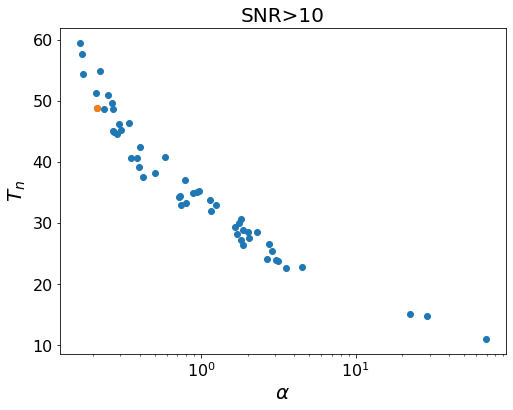

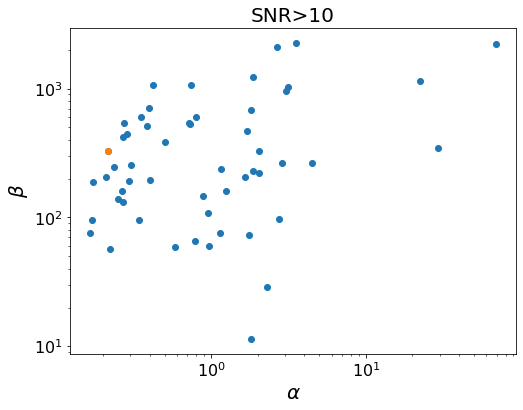

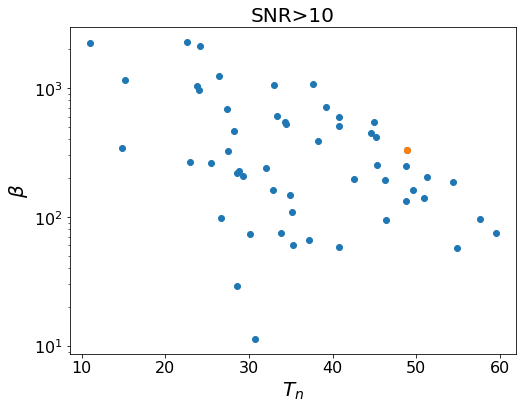

In [3]:
df=pd.read_csv("LISA_SCANS/global_scan_random/global_scan_random_total.csv",index_col=[0])
df=df[df["SNR_Tnuc"]>10]
i_rand=np.random.choice(np.arange(0,len(df)))

thick_size=16
label_size=20
figure = plt.gcf()
figure.set_size_inches(8, 6)
plt.scatter(df["alpha"],df["Tnuc"])
plt.scatter(df.iloc[i_rand]["alpha"],df.iloc[i_rand]["Tnuc"])
plt.xscale("log")
plt.xlabel("$\\alpha$",size=label_size)
plt.ylabel("$T_n$",size=label_size)
plt.xticks(fontsize=thick_size)
plt.yticks(fontsize=thick_size)
plt.title("SNR>10",size=label_size)
plt.show()

figure = plt.gcf()
figure.set_size_inches(8, 6)
plt.scatter(df["alpha"],df["beta"])
plt.scatter(df.iloc[i_rand]["alpha"],df.iloc[i_rand]["beta"])
plt.xscale("log")
plt.yscale("log")
plt.xlabel("$\\alpha$",size=label_size)
plt.ylabel("$\\beta$",size=label_size)
plt.xticks(fontsize=thick_size)
plt.yticks(fontsize=thick_size)
plt.title("SNR>10",size=label_size)
plt.show()

figure = plt.gcf()
figure.set_size_inches(8, 6)
plt.scatter(df["Tnuc"],df["beta"])
plt.scatter(df.iloc[i_rand]["Tnuc"],df.iloc[i_rand]["beta"])
#plt.scatter(.5,40)
plt.yscale("log")
plt.xlabel("$T_n$",size=label_size)
plt.ylabel("$\\beta$",size=label_size)
plt.xticks(fontsize=thick_size)
plt.yticks(fontsize=thick_size)
plt.title("SNR>10",size=label_size)
plt.show()

In [82]:
%%time
df=pd.read_csv("LISA_SCANS/global_scan_random/global_scan_random_total.csv",index_col=[0])
def fun_inter(theta):
    """Interpolate grid function col(ms,lammix, lams) for col = Tnuc, alpha, beta"""
    ms,lammix,lams = theta
    columns=["Tnuc","alpha","beta"]
    vals=[]
    for col in columns:
        values=np.array(df[col])
        points=np.array(df[["ms","lammix","lams"]])
        grid_z1 = interpolate.griddata(points, values, (ms,lammix,lams), method='linear')
        #if np.isnan(grid_z1)==True:
        #    vals.append(1e4)
        #else:
        #    vals.append(grid_z1)
        vals.append(grid_z1)
    return vals

###Assumed Posteriors:
Temp=40
dT=1
alpha=1
dalpha=0.2
beta=1000
dbeta=200
####   Method of least squares (LS). 
####    We assume the "measurements" are independent, i.e., the covariance matrix is diagonal
### Furthermore T, alpha and beta are assumed Gaussian random variables
def chi_square(theta):
    """Chi-square function"""
    ms,lammix,lams =theta
    T_val ,alpha_val, beta_val = fun_inter(theta)
    return (Temp-T_val)**2/dT**2  + (alpha-alpha_val)**2/dalpha**2 + (beta-beta_val)**2/dbeta**2



CPU times: user 10.1 ms, sys: 3.92 ms, total: 14 ms
Wall time: 12.3 ms


In [5]:
##Minimize chi-square N-times with different initial guesses
df=pd.read_csv("LISA_SCANS/global_scan_random/global_scan_random_total.csv",index_col=[0])
df=df[df["SNR_Tnuc"]>10]
chi_list=[]
for i in range(10):
    i_rand=np.random.choice(np.arange(0,len(df)))
    theta_0=[df.iloc[i_rand].ms,df.iloc[i_rand].lammix,df.iloc[i_rand].lams]
    new_guess=optimize.minimize(chi_square,x0=np.array(theta_0))
    chi_list.append({"fun":new_guess.fun, "success": new_guess.success, 
                     "ms":new_guess.x[0],"lammix":new_guess.x[1],
                     "lams":new_guess.x[2]})

chi_pd=pd.DataFrame(chi_list)
chi_min=chi_pd[chi_pd["fun"]==min(chi_pd.fun)]  ##LS estimators
theta_hat=chi_min[["ms","lammix","lams"]].values[0]


In [6]:
fun_inter(theta_hat),theta_hat,chi_square(theta_hat)

([array(40.29144738), array(1.25359594), array(360.80231278)],
 array([98.02479597,  0.79943484,  0.63380791]),
 11.907056174206659)

In [40]:
### Likelihood interval
###Confidence intervals are obtained from prescription, eq. (9.30) of Cowan's book. 
### For example N=1 gives the 68.3% central interval

sigma_pars=[]
ms_sigma=10
lamhs_sigma=0.2
lams_sigma=0.2
for i in range(10**4):
    ms_rand=np.random.normal(loc=theta_hat[0],scale=ms_sigma)
    lammix_rand=np.random.normal(loc=theta_hat[1],scale=lamhs_sigma)
    lams_rand=np.random.normal(loc=theta_hat[2],scale=lams_sigma)
    lams_rand=theta_hat[2]
    theta_perturbation= np.array([ms_rand,lammix_rand,lams_rand])
    N_sigma=abs(chi_square(theta_perturbation)-chi_square(theta_hat)) ##Confidence interval 
    if N_sigma<=1:
        print(i)
        sigma_pars.append({"N_sigma":N_sigma,"ms":ms_rand, "lammix": lammix_rand, "lams": lams_rand})
        

8438
8527
9217


In [48]:
sigma_pars_pd

,N_sigma,ms,lammix,lams
0,0.907023,74.895282,0.681641,0.607296
1,0.893527,69.790367,0.653531,0.607296
2,0.082642,74.966556,0.683835,0.607296


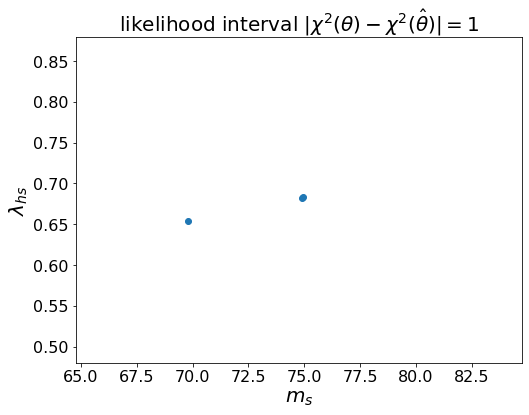

In [44]:
sigma_pars_pd=pd.DataFrame(sigma_pars)

thick_size=16
label_size=20
figure = plt.gcf()
figure.set_size_inches(8, 6)
plt.scatter(sigma_pars_pd["ms"],sigma_pars_pd["lammix"])
plt.xlabel("$m_s$",size=label_size)
plt.ylabel("$\\lambda_{hs}$",size=label_size)
plt.xticks(fontsize=thick_size)
plt.yticks(fontsize=thick_size)
plt.title("likelihood interval $|\chi^2(\\theta) - \chi^2(\hat{\\theta})| = 1$",size=label_size)
plt.xlim(theta_hat[0]-ms_sigma,theta_hat[0]+ms_sigma)
plt.ylim(theta_hat[1]-lamhs_sigma,theta_hat[1]+lamhs_sigma)

plt.show()

In [91]:
clevs=200
myN = 1 ###confidence intervals 
box=(65,115,0.45,0.9)
xmin,xmax,ymin,ymax=box
x=np.linspace(xmin,xmax,clevs)
y=np.linspace(ymin,ymax,clevs)
X,Y=np.meshgrid(x,y)
Z_V=[]
for i in x:
    Z_V_row=[]
    for j in y:
        Z_out=abs(chi_square([i,j,theta_hat[2]])-chi_square(theta_hat))
        Z_V_row.append([Z_out])
    Z_V.append(Z_V_row)
Z_V=np.array(Z_V).T[0]

fig, ax1 = plt.subplots(1,1,figsize=(12,6))
ax1.set_title("Likelihood interval $\chi^2$",size=20)
ax1.set_xlabel('$m_s$',size=20)
ax1.set_ylabel('$\\lambda_{hs}$',size=20)
#ax1.contour(X, Y, Z_V,myN,cmap='RdGy')


cf1=ax1.contour(X, Y, Z_V,[10.])
#fig.colorbar(cf1, ax=ax1)
ax1.scatter(theta_hat[0],theta_hat[1])
plt.clabel(cf1,inline=True, fontsize=10)
plt.show()

KeyboardInterrupt: 

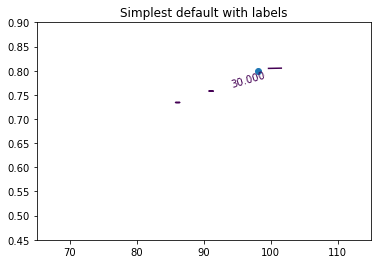

In [88]:
clevs=20
myN = 2 ###confidence intervals 
box=(65,115,0.45,0.9)
xmin,xmax,ymin,ymax=box
x=np.linspace(xmin,xmax,clevs)
y=np.linspace(ymin,ymax,clevs)

X,Y=np.meshgrid(x,y)
Z_V=[]
for i in x:
    Z_V_row=[]
    for j in y:
        Z_V_row.append([chi_square([i,j,theta_hat[2]])])
    Z_V.append(Z_V_row)
Z_V=np.array(Z_V).T[0]


fig, ax = plt.subplots()
CS = ax.contour(X, Y, Z_V,[30.])
ax.clabel(CS, inline=True, fontsize=10)
ax.set_title('Simplest default with labels')
ax.scatter(theta_hat[0],theta_hat[1])

In [66]:
%%time
###VECTORIZED FUNCTIONS
df=pd.read_csv("LISA_SCANS/global_scan_random/global_scan_random_total.csv",index_col=[0])
def fun_inter_vec(theta):
    """Interpolate grid function col(ms,lammix, lams) for col = Tnuc, alpha, beta"""
    ms,lammix,lams = theta.T
    columns=["Tnuc","alpha","beta"]
    vals=[]
    for col in columns:
        values=np.array(df[col])
        points=np.array(df[["ms","lammix","lams"]])
        grid_z1 = interpolate.griddata(points, values, (ms,lammix,lams), method='linear')
        vals.append(grid_z1)
    vals=np.stack(vals)
    vals[np.isnan(vals)]=1e5
    return vals.T


###Assumed Posteriors:
Temp=40
dT=1
alpha=1
dalpha=0.2
beta=1000
dbeta=200



####   Method of least squares (LS). 
####    We assume the "measurements" are independent, i.e., the covariance matrix is diagonal
### Furthermore T, alpha and beta are assumed Gaussian random variables
def chi_square_vec(theta):
    """Chi-square function"""
    #ms,lammix,lams =theta.T
    T_val ,alpha_val, beta_val = fun_inter_vec(theta).T
    return (Temp-T_val)**2/dT**2  + (alpha-alpha_val)**2/dalpha**2 + (beta-beta_val)**2/dbeta**2




CPU times: user 9.88 ms, sys: 2.76 ms, total: 12.6 ms
Wall time: 10.7 ms


In [65]:
theta_arr=[]
for i in range(10):
    theta=theta_hat*np.random.uniform(0.9,1.1)
    theta_arr.append(theta)

theta_arr=np.stack(theta_arr)
fun_inter_vec(theta_arr), chi_square_vec(theta_arr)


(array([[3.97919743e+01, 1.72972245e+00, 9.69454676e+03],
        [4.07467719e+01, 1.96620863e+01, 6.74308470e+03],
        [3.82232748e+01, 1.21579337e+00, 3.18866013e+02],
        [3.82812189e+01, 1.21831081e+00, 3.21451474e+02],
        [5.24669225e+01, 1.59927122e+00, 6.35779121e+03],
        [3.99950114e+01, 1.24969563e+00, 3.56259751e+02],
        [3.79256780e+01, 1.20286397e+00, 3.05587285e+02],
        [5.19408218e+01, 2.76895253e+00, 6.83351854e+03],
        [3.77852758e+01, 1.19676406e+00, 2.99322559e+02],
        [1.00000000e+05, 1.00000000e+05, 1.00000000e+05]]),
 array([3.97919743e+01, 4.07467719e+01, 3.82232748e+01, 3.82812189e+01,
        5.24669225e+01, 3.99950114e+01, 3.79256780e+01, 5.19408218e+01,
        3.77852758e+01, 1.00000000e+05]))

In [76]:
np.ones(clevs)

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1.])